In [ ]:
! pip3 install ray
! pip3 install tensorboardX
! pip install bayesian-optimization

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import csv
import os

In [ ]:
! rm -rf "logs_encore"
os.mkdir("logs_encore")

In [ ]:
#! cat /root/ray_results/exp/train_mnist_3c5b4_00028_28_lr=0.00029101,momentum=0.52473_2021-06-08_09-32-25/error.txt

In [ ]:
import os
import argparse
from filelock import FileLock
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
import matplotlib.pyplot as plt

import ray
from ray import tune
from ray.tune.examples.mnist_pytorch import train, test, ConvNet, get_data_loaders

import ray
from ray import tune
from ray.tune import track
from ray.tune.schedulers import PopulationBasedTraining

# Change these values if you want the training to run quicker or slower.
EPOCH_SIZE = 512
TEST_SIZE = 256


class ConvNet(nn.Module):
    def __init__(self):
        super(ConvNet, self).__init__()
        self.conv1 = nn.Conv2d(1,3, kernel_size=3)
        self.fc = nn.Linear(192, 10)

    def forward(self, x):
        x = F.relu(F.max_pool2d(self.conv1(x), 3))
        x = x.view(-1, 192)
        x = self.fc(x)
        return F.log_softmax(x, dim=1)


def train(model, optimizer, train_loader, device=None):
    device = device or torch.device("cpu")
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        if batch_idx * len(data) > EPOCH_SIZE:
            return
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = F.nll_loss(output, target)
        loss.backward()
        optimizer.step()


def test(model, data_loader, device=None):
    device = device or torch.device("cpu")
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for batch_idx, (data, target) in enumerate(data_loader):
            if batch_idx * len(data) > TEST_SIZE:
                break
            data, target = data.to(device), target.to(device)
            outputs = model(data)
            _, predicted = torch.max(outputs.data, 1)
            total += target.size(0)
            correct += (predicted == target).sum().item()

    return correct / total


def get_data_loaders(batch_size=32):
    mnist_transforms = transforms.Compose(
        [transforms.ToTensor(),
         transforms.Normalize((0.1307, ), (0.3081, ))])

    # We add FileLock here because multiple workers will want to
    # download data, and this may cause overwrites since
    # DataLoader is not threadsafe.
    with FileLock(os.path.expanduser("~/data.lock")):
        train_loader = torch.utils.data.DataLoader(
            datasets.MNIST(
                "~/data",
                train=True,
                download=True,
                transform=mnist_transforms),
            batch_size=batch_size,
            shuffle=True)
    test_loader = torch.utils.data.DataLoader(
        datasets.MNIST("~/data", train=False, transform=mnist_transforms),
        batch_size=64,
        shuffle=True)
    return train_loader, test_loader


def train_mnist(config):
    use_cuda = torch.cuda.is_available()
    device = torch.device("cuda" if use_cuda else "cpu")
    train_loader, test_loader = get_data_loaders(batch_size=config["batch_size"])
    model = ConvNet().to(device)

    optimizer = optim.SGD(
        model.parameters(), lr=config["lr"], momentum=config["momentum"])

    while True:
        train(model, optimizer, train_loader, device)
        acc = test(model, test_loader, device)
        # Set this to run Tune.
        tune.report(mean_accuracy=acc)



iters=20
#iters=30
#n = 30
n = 50
pop = 10


if __name__ == "__main__":

      sched = PopulationBasedTraining(
      time_attr="training_iteration",
      perturbation_interval=5,
      hyperparam_mutations={
          # distribution for resampling
          "lr": lambda: np.random.uniform(0.0001, 1),
          # allow perturbations within this set of categorical values
          "momentum": [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8, 0.9, 0.99],
          "batch_size": [2, 4, 8, 12, 16, 32, 40, 50, 64, 80]
      })
      config={
          # distribution for resampling
          "lr": lambda: np.random.uniform(0.0001, 1),
          # allow perturbations within this set of categorical values
          "momentum": tune.choice([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8, 0.9, 0.99]),
          "batch_size": tune.choice([2, 4, 8, 12, 16, 32, 40, 50, 64, 80])
      }
      config={
        "lr": tune.uniform(0.001, 1),
        "momentum": tune.uniform(0.001, 1),
    }


      analysis = tune.run(
          train_mnist,
          metric="mean_accuracy",
          mode="max",
          name="exp",
          scheduler=sched,
          stop={
              #"mean_accuracy": 0.98,
              "training_iteration": iters
          },
          resources_per_trial={
              "cpu": 2
          },
          num_samples=pop,
          config=config)
  
      print("Best config is:", analysis.best_config)


Trial name,status,loc,batch_size,lr,momentum
train_mnist_c86ad_00000,PENDING,,32,0.587372,0.701763
train_mnist_c86ad_00001,PENDING,,40,0.287551,0.117046
train_mnist_c86ad_00002,PENDING,,32,0.680711,0.158315
train_mnist_c86ad_00003,PENDING,,50,0.518931,0.0372116
train_mnist_c86ad_00004,PENDING,,16,0.0890048,0.262382
train_mnist_c86ad_00005,PENDING,,2,0.718754,0.813782
train_mnist_c86ad_00006,PENDING,,12,0.589108,0.626689
train_mnist_c86ad_00007,PENDING,,16,0.10211,0.893427
train_mnist_c86ad_00008,PENDING,,16,0.591064,0.343112
train_mnist_c86ad_00009,PENDING,,4,0.147622,0.0825052


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=12576) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_c86ad_00000:
  date: 2021-06-19_18-25-58
  done: false
  experiment_id: a83754b20570405bb6d995cfcae2b50d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.078125
  node_ip: 172.28.0.2
  pid: 12576
  time_since_restore: 0.45622920989990234
  time_this_iter_s: 0.45622920989990234
  time_total_s: 0.45622920989990234
  timestamp: 1624127158
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c86ad_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c86ad_00000,PAUSED,,32,0.587372,0.701763,0.090625,5,1.61694
train_mnist_c86ad_00001,PENDING,,40,0.287551,0.117046,,,
train_mnist_c86ad_00002,PENDING,,32,0.680711,0.158315,,,
train_mnist_c86ad_00003,PENDING,,50,0.518931,0.0372116,,,
train_mnist_c86ad_00004,PENDING,,16,0.0890048,0.262382,,,
train_mnist_c86ad_00005,PENDING,,2,0.718754,0.813782,,,
train_mnist_c86ad_00006,PENDING,,12,0.589108,0.626689,,,
train_mnist_c86ad_00007,PENDING,,16,0.10211,0.893427,,,
train_mnist_c86ad_00008,PENDING,,16,0.591064,0.343112,,,
train_mnist_c86ad_00009,PENDING,,4,0.147622,0.0825052,,,


(pid=12575) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=12575)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=12575) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=12575)   return torch.max_pool2d(input, k

Result for train_mnist_c86ad_00001:
  date: 2021-06-19_18-26-01
  done: false
  experiment_id: 5f3e35cb06ff4b08a3b10da980ba9b87
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.6875
  node_ip: 172.28.0.2
  pid: 12575
  time_since_restore: 0.36392974853515625
  time_this_iter_s: 0.36392974853515625
  time_total_s: 0.36392974853515625
  timestamp: 1624127161
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c86ad_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=12627) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=12627)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=12627) /usr/local/lib/pytho

Result for train_mnist_c86ad_00002:
  date: 2021-06-19_18-26-05
  done: false
  experiment_id: 8e012a20fc024f5380a291e495e84b4d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 12627
  time_since_restore: 0.36858296394348145
  time_this_iter_s: 0.36858296394348145
  time_total_s: 0.36858296394348145
  timestamp: 1624127165
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c86ad_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c86ad_00002,RUNNING,172.28.0.2:12627,32,0.680711,0.158315,0.103125,1,0.368583
train_mnist_c86ad_00000,PAUSED,,32,0.587372,0.701763,0.090625,5,1.61694
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.10625,5,1.52608
train_mnist_c86ad_00003,PENDING,,50,0.518931,0.0372116,,,
train_mnist_c86ad_00004,PENDING,,16,0.0890048,0.262382,,,
train_mnist_c86ad_00005,PENDING,,2,0.718754,0.813782,,,
train_mnist_c86ad_00006,PENDING,,12,0.589108,0.626689,,,
train_mnist_c86ad_00007,PENDING,,16,0.10211,0.893427,,,
train_mnist_c86ad_00008,PENDING,,16,0.591064,0.343112,,,
train_mnist_c86ad_00009,PENDING,,4,0.147622,0.0825052,,,


2021-06-19 18:26:06,788	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c86ad_00001 (score 0.10625) -> train_mnist_c86ad_00002 (score 0.075)
2021-06-19 18:26:06,790	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2875512989489582, 'momentum': 0.1170455694694072, 'batch_size': 40} -> {'lr': 0.34506155873874983, 'momentum': 0.2, 'batch_size': 32}
(pid=12627) 2021-06-19 18:26:06,812	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00002_2_lr=0.68071,momentum=0.15832_2021-06-19_18-25-59/checkpoint_tmp27a2f9/./
(pid=12627) 2021-06-19 18:26:06,812	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.526078462600708, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will onl

Result for train_mnist_c86ad_00003:
  date: 2021-06-19_18-26-09
  done: false
  experiment_id: 6c5453452ce44474a582946cf9151165
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 12655
  time_since_restore: 0.3808271884918213
  time_this_iter_s: 0.3808271884918213
  time_total_s: 0.3808271884918213
  timestamp: 1624127169
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c86ad_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c86ad_00003,RUNNING,172.28.0.2:12655,50,0.518931,0.0372116,0.1125,4,1.21026
train_mnist_c86ad_00000,PAUSED,,32,0.587372,0.701763,0.090625,5,1.61694
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.10625,5,1.52608
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.075,5,1.54318
train_mnist_c86ad_00004,PENDING,,16,0.0890048,0.262382,,,
train_mnist_c86ad_00005,PENDING,,2,0.718754,0.813782,,,
train_mnist_c86ad_00006,PENDING,,12,0.589108,0.626689,,,
train_mnist_c86ad_00007,PENDING,,16,0.10211,0.893427,,,
train_mnist_c86ad_00008,PENDING,,16,0.591064,0.343112,,,
train_mnist_c86ad_00009,PENDING,,4,0.147622,0.0825052,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=12683) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=12683)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=12683) /usr/local/lib/pytho

Result for train_mnist_c86ad_00004:
  date: 2021-06-19_18-26-13
  done: false
  experiment_id: 66dcc409b88e4a888d5db8b20f24425c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.596875
  node_ip: 172.28.0.2
  pid: 12683
  time_since_restore: 0.3857154846191406
  time_this_iter_s: 0.3857154846191406
  time_total_s: 0.3857154846191406
  timestamp: 1624127173
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c86ad_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=12711) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=12711)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=12711) /usr/local/lib/pytho

Result for train_mnist_c86ad_00005:
  date: 2021-06-19_18-26-18
  done: false
  experiment_id: 207030c625c34b88b2c92f7f57a16e09
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 12711
  time_since_restore: 0.5863840579986572
  time_this_iter_s: 0.5863840579986572
  time_total_s: 0.5863840579986572
  timestamp: 1624127178
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c86ad_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c86ad_00005,RUNNING,172.28.0.2:12711,2,0.718754,0.813782,0.10625,1,0.586384
train_mnist_c86ad_00000,PAUSED,,32,0.587372,0.701763,0.090625,5,1.61694
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.10625,5,1.52608
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.075,5,1.54318
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.084375,5,1.50078
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.890625,5,1.56125
train_mnist_c86ad_00006,PENDING,,12,0.589108,0.626689,,,
train_mnist_c86ad_00007,PENDING,,16,0.10211,0.893427,,,
train_mnist_c86ad_00008,PENDING,,16,0.591064,0.343112,,,
train_mnist_c86ad_00009,PENDING,,4,0.147622,0.0825052,,,


2021-06-19 18:26:20,569	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c86ad_00004 (score 0.890625) -> train_mnist_c86ad_00005 (score 0.075)
2021-06-19 18:26:20,572	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08900481867219708, 'momentum': 0.26238243834876834, 'batch_size': 16} -> {'lr': 0.5955281820821259, 'momentum': 0.2, 'batch_size': 12}
(pid=12711) 2021-06-19 18:26:20,587	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00005_5_lr=0.71875,momentum=0.81378_2021-06-19_18-26-11/checkpoint_tmp86ccc8/./
(pid=12711) 2021-06-19 18:26:20,587	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5612537860870361, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will 

Result for train_mnist_c86ad_00006:
  date: 2021-06-19_18-26-23
  done: false
  experiment_id: 2e71cfbb2ff54c9bbd4fa5d0a5de5b0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 12740
  time_since_restore: 0.3612947463989258
  time_this_iter_s: 0.3612947463989258
  time_total_s: 0.3612947463989258
  timestamp: 1624127183
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c86ad_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c86ad_00006,RUNNING,172.28.0.2:12740,12,0.589108,0.626689,0.125,2,0.666325
train_mnist_c86ad_00000,PAUSED,,32,0.587372,0.701763,0.090625,5,1.61694
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.10625,5,1.52608
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.075,5,1.54318
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.084375,5,1.50078
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.890625,5,1.56125
train_mnist_c86ad_00005,PAUSED,,12,0.595528,0.2,0.075,5,2.73272
train_mnist_c86ad_00007,PENDING,,16,0.10211,0.893427,,,
train_mnist_c86ad_00008,PENDING,,16,0.591064,0.343112,,,
train_mnist_c86ad_00009,PENDING,,4,0.147622,0.0825052,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=12767) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=12767)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=12767) /usr/local/lib/pytho

Result for train_mnist_c86ad_00007:
  date: 2021-06-19_18-26-27
  done: false
  experiment_id: 1de6996ce5384bc1996f3eafeaf9f448
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7
  node_ip: 172.28.0.2
  pid: 12767
  time_since_restore: 0.38364434242248535
  time_this_iter_s: 0.38364434242248535
  time_total_s: 0.38364434242248535
  timestamp: 1624127187
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c86ad_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c86ad_00000,PAUSED,,32,0.587372,0.701763,0.090625,5,1.61694
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.10625,5,1.52608
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.075,5,1.54318
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.084375,5,1.50078
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.890625,5,1.56125
train_mnist_c86ad_00005,PAUSED,,12,0.595528,0.2,0.075,5,2.73272
train_mnist_c86ad_00006,PAUSED,,12,0.589108,0.626689,0.13125,5,1.55881
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.09375,5,1.60332
train_mnist_c86ad_00008,PENDING,,16,0.591064,0.343112,,,
train_mnist_c86ad_00009,PENDING,,4,0.147622,0.0825052,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=12796) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=12796)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=12796) /usr/local/lib/pytho

Result for train_mnist_c86ad_00008:
  date: 2021-06-19_18-26-31
  done: false
  experiment_id: c923c9d9f4794fbfab5ed4e6470591e5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.125
  node_ip: 172.28.0.2
  pid: 12796
  time_since_restore: 0.37262868881225586
  time_this_iter_s: 0.37262868881225586
  time_total_s: 0.37262868881225586
  timestamp: 1624127191
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c86ad_00008
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c86ad_00009,RUNNING,,4,0.147622,0.0825052,,,
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.10625,5,1.52608
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.075,5,1.54318
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.084375,5,1.50078
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.890625,5,1.56125
train_mnist_c86ad_00005,PAUSED,,12,0.595528,0.2,0.075,5,2.73272
train_mnist_c86ad_00006,PAUSED,,12,0.589108,0.626689,0.13125,5,1.55881
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.09375,5,1.60332
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.10625,5,1.49211
train_mnist_c86ad_00000,PENDING,,32,0.587372,0.701763,0.090625,5,1.61694


(pid=12824) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=12824)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=12824) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=12824)   return torch.max_pool2d(input, k

Result for train_mnist_c86ad_00009:
  date: 2021-06-19_18-26-36
  done: false
  experiment_id: 7b6cc8f5f67d4191be29db6a6c17ee4e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.70625
  node_ip: 172.28.0.2
  pid: 12824
  time_since_restore: 0.46480560302734375
  time_this_iter_s: 0.46480560302734375
  time_total_s: 0.46480560302734375
  timestamp: 1624127196
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c86ad_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c86ad_00000,RUNNING,,32,0.587372,0.701763,0.090625,5,1.61694
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.075,5,1.54318
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.084375,5,1.50078
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.890625,5,1.56125
train_mnist_c86ad_00005,PAUSED,,12,0.595528,0.2,0.075,5,2.73272
train_mnist_c86ad_00006,PAUSED,,12,0.589108,0.626689,0.13125,5,1.55881
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.09375,5,1.60332
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.10625,5,1.49211
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.703125,5,2.08736
train_mnist_c86ad_00001,PENDING,,40,0.287551,0.117046,0.10625,5,1.52608


(pid=12825) 2021-06-19 18:26:39,880	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00000_0_lr=0.58737,momentum=0.70176_2021-06-19_18-25-54/checkpoint_tmp34b6ae/./
(pid=12825) 2021-06-19 18:26:39,881	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6169397830963135, '_episodes_total': 0}
(pid=12825) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=12825)   return torch.from_numpy(parsed.as

Result for train_mnist_c86ad_00000:
  date: 2021-06-19_18-26-40
  done: false
  episodes_total: 0
  experiment_id: a83754b20570405bb6d995cfcae2b50d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.15
  node_ip: 172.28.0.2
  pid: 12825
  time_since_restore: 0.38410115242004395
  time_this_iter_s: 0.38410115242004395
  time_total_s: 2.0010409355163574
  timestamp: 1624127200
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00000
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00001,RUNNING,,40,0.287551,0.117046,0.10625,5,1.52608,
train_mnist_c86ad_00000,PAUSED,,32,0.587372,0.701763,0.10625,10,4.59068,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.084375,5,1.50078,
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.890625,5,1.56125,
train_mnist_c86ad_00005,PAUSED,,12,0.595528,0.2,0.075,5,2.73272,
train_mnist_c86ad_00006,PAUSED,,12,0.589108,0.626689,0.13125,5,1.55881,
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.09375,5,1.60332,
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.10625,5,1.49211,
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.703125,5,2.08736,
train_mnist_c86ad_00002,PENDING,,32,0.345062,0.2,0.075,5,1.54318,


(pid=12878) 2021-06-19 18:26:45,419	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00001_1_lr=0.28755,momentum=0.11705_2021-06-19_18-25-55/checkpoint_tmp0bc5d6/./
(pid=12878) 2021-06-19 18:26:45,419	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.526078462600708, '_episodes_total': 0}
(pid=12878) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=12878)   return torch.from_numpy(parsed.ast

Result for train_mnist_c86ad_00001:
  date: 2021-06-19_18-26-45
  done: false
  episodes_total: 0
  experiment_id: 5f3e35cb06ff4b08a3b10da980ba9b87
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.4875
  node_ip: 172.28.0.2
  pid: 12878
  time_since_restore: 0.3209679126739502
  time_this_iter_s: 0.3209679126739502
  time_total_s: 1.8470463752746582
  timestamp: 1624127205
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00002,RUNNING,,32,0.345062,0.2,0.075,5,1.54318,
train_mnist_c86ad_00000,PAUSED,,32,0.587372,0.701763,0.10625,10,4.59068,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.896875,10,4.23179,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.890625,5,1.56125,
train_mnist_c86ad_00005,PAUSED,,12,0.595528,0.2,0.075,5,2.73272,
train_mnist_c86ad_00006,PAUSED,,12,0.589108,0.626689,0.13125,5,1.55881,
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.09375,5,1.60332,
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.10625,5,1.49211,
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.703125,5,2.08736,
train_mnist_c86ad_00003,PENDING,,50,0.518931,0.0372116,0.084375,5,1.50078,


(pid=12876) 2021-06-19 18:26:49,909	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00002_2_lr=0.68071,momentum=0.15832_2021-06-19_18-25-59/checkpoint_tmp4a7c29/./
(pid=12876) 2021-06-19 18:26:49,909	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.526078462600708, '_episodes_total': 0}
(pid=12876) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=12876)   return torch.from_numpy(parsed.ast

Result for train_mnist_c86ad_00002:
  date: 2021-06-19_18-26-50
  done: false
  episodes_total: 0
  experiment_id: 5f3e35cb06ff4b08a3b10da980ba9b87
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.775
  node_ip: 172.28.0.2
  pid: 12876
  time_since_restore: 0.3383474349975586
  time_this_iter_s: 0.3383474349975586
  time_total_s: 1.8644258975982666
  timestamp: 1624127210
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00002
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00003,RUNNING,,50,0.518931,0.0372116,0.084375,5,1.50078,
train_mnist_c86ad_00000,PAUSED,,32,0.587372,0.701763,0.10625,10,4.59068,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.896875,10,4.23179,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.934375,10,4.39153,0
train_mnist_c86ad_00005,PAUSED,,12,0.595528,0.2,0.075,5,2.73272,
train_mnist_c86ad_00006,PAUSED,,12,0.589108,0.626689,0.13125,5,1.55881,
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.09375,5,1.60332,
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.10625,5,1.49211,
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.703125,5,2.08736,
train_mnist_c86ad_00004,PENDING,,16,0.0890048,0.262382,0.890625,5,1.56125,


(pid=12933) 2021-06-19 18:26:55,500	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00003_3_lr=0.51893,momentum=0.037212_2021-06-19_18-26-02/checkpoint_tmpb3b542/./
(pid=12933) 2021-06-19 18:26:55,501	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5007798671722412, '_episodes_total': 0}
(pid=12933) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=12933)   return torch.from_numpy(parsed.a

Result for train_mnist_c86ad_00003:
  date: 2021-06-19_18-26-55
  done: false
  episodes_total: 0
  experiment_id: 6c5453452ce44474a582946cf9151165
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.490625
  node_ip: 172.28.0.2
  pid: 12933
  time_since_restore: 0.32590389251708984
  time_this_iter_s: 0.32590389251708984
  time_total_s: 1.826683759689331
  timestamp: 1624127215
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00004,RUNNING,,16,0.0890048,0.262382,0.890625,5,1.56125,
train_mnist_c86ad_00000,PAUSED,,32,0.587372,0.701763,0.10625,10,4.59068,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.896875,10,4.23179,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.934375,10,4.39153,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.7625,10,4.27799,0
train_mnist_c86ad_00006,PAUSED,,12,0.589108,0.626689,0.13125,5,1.55881,
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.09375,5,1.60332,
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.10625,5,1.49211,
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.703125,5,2.08736,
train_mnist_c86ad_00005,PENDING,,12,0.595528,0.2,0.075,5,2.73272,


(pid=12931) 2021-06-19 18:26:59,927	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00004_4_lr=0.089005,momentum=0.26238_2021-06-19_18-26-07/checkpoint_tmpb8ff06/./
(pid=12931) 2021-06-19 18:26:59,927	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5612537860870361, '_episodes_total': 0}
(pid=12931) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=12931)   return torch.from_numpy(parsed.a

Result for train_mnist_c86ad_00004:
  date: 2021-06-19_18-27-00
  done: false
  episodes_total: 0
  experiment_id: 66dcc409b88e4a888d5db8b20f24425c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.746875
  node_ip: 172.28.0.2
  pid: 12931
  time_since_restore: 0.35074353218078613
  time_this_iter_s: 0.35074353218078613
  time_total_s: 1.9119973182678223
  timestamp: 1624127220
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00005,RUNNING,,12,0.595528,0.2,0.075,5,2.73272,
train_mnist_c86ad_00000,PAUSED,,32,0.587372,0.701763,0.10625,10,4.59068,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.896875,10,4.23179,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.934375,10,4.39153,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.7625,10,4.27799,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.9125,10,4.65505,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.09375,5,1.60332,
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.10625,5,1.49211,
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.703125,5,2.08736,
train_mnist_c86ad_00006,PENDING,,12,0.589108,0.626689,0.13125,5,1.55881,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=12989) 2021-06-19 18:27:05,819	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00005_5_lr=0.71875,momentum=0.81378_2021-06-19_18-26-11/checkpoint_tmpcec80a/./
(pid=12989) 2021-06-19 18:27:05,819	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5612537860870361, '_episodes_total': 0}
(pid=12989) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposed

Result for train_mnist_c86ad_00005:
  date: 2021-06-19_18-27-06
  done: false
  episodes_total: 0
  experiment_id: 66dcc409b88e4a888d5db8b20f24425c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 12989
  time_since_restore: 0.34017062187194824
  time_this_iter_s: 0.34017062187194824
  time_total_s: 1.9014244079589844
  timestamp: 1624127226
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00005
  


2021-06-19 18:27:08,809	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c86ad_00004 (score 0.9125) -> train_mnist_c86ad_00005 (score 0.09375)
2021-06-19 18:27:08,813	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08900481867219708, 'momentum': 0.26238243834876834, 'batch_size': 16} -> {'lr': 0.10680578240663649, 'momentum': 0.9, 'batch_size': 12}
(pid=12989) 2021-06-19 18:27:08,838	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00005_5_lr=0.71875,momentum=0.81378_2021-06-19_18-26-11/checkpoint_tmpd89f3a/./
(pid=12989) 2021-06-19 18:27:08,838	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.655046463012695, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00006,RUNNING,,12,0.589108,0.626689,0.13125,5,1.55881,
train_mnist_c86ad_00000,PAUSED,,32,0.587372,0.701763,0.10625,10,4.59068,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.896875,10,4.23179,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.934375,10,4.39153,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.7625,10,4.27799,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.9125,10,4.65505,0
train_mnist_c86ad_00005,PAUSED,,12,0.106806,0.9,0.09375,10,4.54848,0
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.10625,5,1.49211,
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.703125,5,2.08736,
train_mnist_c86ad_00007,PENDING,,16,0.10211,0.893427,0.09375,5,1.60332,


(pid=12991) 2021-06-19 18:27:10,502	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00006_6_lr=0.58911,momentum=0.62669_2021-06-19_18-26-15/checkpoint_tmp1b7704/./
(pid=12991) 2021-06-19 18:27:10,502	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.558812141418457, '_episodes_total': 0}
(pid=12991) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=12991)   return torch.from_numpy(parsed.ast

Result for train_mnist_c86ad_00006:
  date: 2021-06-19_18-27-10
  done: false
  episodes_total: 0
  experiment_id: 2e71cfbb2ff54c9bbd4fa5d0a5de5b0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.128125
  node_ip: 172.28.0.2
  pid: 12991
  time_since_restore: 0.39745211601257324
  time_this_iter_s: 0.39745211601257324
  time_total_s: 1.9562642574310303
  timestamp: 1624127230
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00006
  


2021-06-19 18:27:13,731	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c86ad_00001 (score 0.896875) -> train_mnist_c86ad_00006 (score 0.078125)
2021-06-19 18:27:13,732	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2875512989489582, 'momentum': 0.1170455694694072, 'batch_size': 40} -> {'lr': 0.23004103915916657, 'momentum': 0.99, 'batch_size': 50}
(pid=12991) 2021-06-19 18:27:13,755	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00006_6_lr=0.58911,momentum=0.62669_2021-06-19_18-26-15/checkpoint_tmpc56997/./
(pid=12991) 2021-06-19 18:27:13,755	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.231794834136963, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00007,RUNNING,,16,0.10211,0.893427,0.09375,5,1.60332,
train_mnist_c86ad_00000,PAUSED,,32,0.587372,0.701763,0.10625,10,4.59068,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.896875,10,4.23179,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.934375,10,4.39153,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.7625,10,4.27799,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.9125,10,4.65505,0
train_mnist_c86ad_00005,PAUSED,,12,0.106806,0.9,0.09375,10,4.54848,0
train_mnist_c86ad_00006,PAUSED,,50,0.230041,0.99,0.078125,10,4.78466,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.703125,5,2.08736,
train_mnist_c86ad_00008,PENDING,,16,0.591064,0.343112,0.10625,5,1.49211,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=13043) 2021-06-19 18:27:16,243	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00007_7_lr=0.10211,momentum=0.89343_2021-06-19_18-26-20/checkpoint_tmpc1e26a/./
(pid=13043) 2021-06-19 18:27:16,243	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_c86ad_00007:
  date: 2021-06-19_18-27-16
  done: false
  episodes_total: 0
  experiment_id: 1de6996ce5384bc1996f3eafeaf9f448
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.221875
  node_ip: 172.28.0.2
  pid: 13043
  time_since_restore: 0.4081583023071289
  time_this_iter_s: 0.4081583023071289
  time_total_s: 2.0114760398864746
  timestamp: 1624127236
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00008,RUNNING,,16,0.591064,0.343112,0.10625,5,1.49211,
train_mnist_c86ad_00000,PAUSED,,32,0.587372,0.701763,0.10625,10,4.59068,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.896875,10,4.23179,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.934375,10,4.39153,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.7625,10,4.27799,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.9125,10,4.65505,0
train_mnist_c86ad_00005,PAUSED,,12,0.106806,0.9,0.09375,10,4.54848,0
train_mnist_c86ad_00006,PAUSED,,50,0.230041,0.99,0.078125,10,4.78466,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.803125,10,4.4643,0
train_mnist_c86ad_00009,PENDING,,4,0.147622,0.0825052,0.703125,5,2.08736,


(pid=13041) 2021-06-19 18:27:20,838	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00008_8_lr=0.59106,momentum=0.34311_2021-06-19_18-26-24/checkpoint_tmpc183cf/./
(pid=13041) 2021-06-19 18:27:20,838	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.4921090602874756, '_episodes_total': 0}
(pid=13041) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13041)   return torch.from_numpy(parsed.as

Result for train_mnist_c86ad_00008:
  date: 2021-06-19_18-27-21
  done: false
  episodes_total: 0
  experiment_id: c923c9d9f4794fbfab5ed4e6470591e5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 13041
  time_since_restore: 0.35692334175109863
  time_this_iter_s: 0.35692334175109863
  time_total_s: 1.8490324020385742
  timestamp: 1624127241
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00009,RUNNING,,4,0.147622,0.0825052,0.703125,5,2.08736,
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.896875,10,4.23179,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.934375,10,4.39153,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.7625,10,4.27799,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.9125,10,4.65505,0
train_mnist_c86ad_00005,PAUSED,,12,0.106806,0.9,0.09375,10,4.54848,0
train_mnist_c86ad_00006,PAUSED,,50,0.230041,0.99,0.078125,10,4.78466,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.803125,10,4.4643,0
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.13125,10,4.23135,0
train_mnist_c86ad_00000,PENDING,,32,0.587372,0.701763,0.10625,10,4.59068,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=13097) 2021-06-19 18:27:26,038	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00009_9_lr=0.14762,momentum=0.082505_2021-06-19_18-26-28/checkpoint_tmp0d51d4/./
(pid=13097) 2021-06-19 18:27:26,038	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_c86ad_00009:
  date: 2021-06-19_18-27-26
  done: false
  episodes_total: 0
  experiment_id: 7b6cc8f5f67d4191be29db6a6c17ee4e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.475
  node_ip: 172.28.0.2
  pid: 13097
  time_since_restore: 0.4275519847869873
  time_this_iter_s: 0.4275519847869873
  time_total_s: 2.5149149894714355
  timestamp: 1624127246
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00009,RUNNING,172.28.0.2:13097,4,0.147622,0.0825052,0.796875,8,5.23809,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.896875,10,4.23179,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.934375,10,4.39153,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.7625,10,4.27799,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.9125,10,4.65505,0
train_mnist_c86ad_00005,PAUSED,,12,0.106806,0.9,0.09375,10,4.54848,0
train_mnist_c86ad_00006,PAUSED,,50,0.230041,0.99,0.078125,10,4.78466,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.803125,10,4.4643,0
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.13125,10,4.23135,0
train_mnist_c86ad_00000,PENDING,,32,0.587372,0.701763,0.10625,10,4.59068,0


(pid=13098) 2021-06-19 18:27:31,511	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00000_0_lr=0.58737,momentum=0.70176_2021-06-19_18-25-54/checkpoint_tmp8965a8/./
(pid=13098) 2021-06-19 18:27:31,511	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.5906805992126465, '_episodes_total': 0}
(pid=13098) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13098)   return torch.from_numpy(parsed.as

Result for train_mnist_c86ad_00000:
  date: 2021-06-19_18-27-31
  done: false
  episodes_total: 0
  experiment_id: a83754b20570405bb6d995cfcae2b50d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 13098
  time_since_restore: 0.3218867778778076
  time_this_iter_s: 0.3218867778778076
  time_total_s: 4.912567377090454
  timestamp: 1624127251
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00000,RUNNING,172.28.0.2:13098,32,0.587372,0.701763,0.09375,10,7.44089,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.934375,10,4.39153,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.7625,10,4.27799,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.9125,10,4.65505,0
train_mnist_c86ad_00005,PAUSED,,12,0.106806,0.9,0.09375,10,4.54848,0
train_mnist_c86ad_00006,PAUSED,,50,0.230041,0.99,0.078125,10,4.78466,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.803125,10,4.4643,0
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.13125,10,4.23135,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.775,10,5.94896,0
train_mnist_c86ad_00001,PENDING,,40,0.287551,0.117046,0.896875,10,4.23179,0


2021-06-19 18:27:35,739	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c86ad_00001 (score 0.896875) -> train_mnist_c86ad_00000 (score 0.10625)
2021-06-19 18:27:35,741	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2875512989489582, 'momentum': 0.1170455694694072, 'batch_size': 40} -> {'lr': 0.6398271732725213, 'momentum': 0.4, 'batch_size': 32}
(pid=13098) 2021-06-19 18:27:35,773	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00000_0_lr=0.58737,momentum=0.70176_2021-06-19_18-25-54/checkpoint_tmp95b9a7/./
(pid=13098) 2021-06-19 18:27:35,773	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.231794834136963, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will o

Result for train_mnist_c86ad_00000:
  date: 2021-06-19_18-27-38
  done: false
  episodes_total: 0
  experiment_id: 5f3e35cb06ff4b08a3b10da980ba9b87
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 13152
  time_since_restore: 0.3623487949371338
  time_this_iter_s: 0.3623487949371338
  time_total_s: 4.594143629074097
  timestamp: 1624127258
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00000,RUNNING,172.28.0.2:13152,32,0.639827,0.4,0.121875,3,5.18206,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.934375,10,4.39153,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.7625,10,4.27799,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.9125,10,4.65505,0
train_mnist_c86ad_00005,PAUSED,,12,0.106806,0.9,0.09375,10,4.54848,0
train_mnist_c86ad_00006,PAUSED,,50,0.230041,0.99,0.078125,10,4.78466,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.803125,10,4.4643,0
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.13125,10,4.23135,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.775,10,5.94896,0
train_mnist_c86ad_00001,PENDING,,40,0.287551,0.117046,0.896875,10,4.23179,0


2021-06-19 18:27:42,775	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c86ad_00004 (score 0.9125) -> train_mnist_c86ad_00000 (score 0.090625)
2021-06-19 18:27:42,781	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08900481867219708, 'momentum': 0.26238243834876834, 'batch_size': 16} -> {'lr': 0.10680578240663649, 'momentum': 0.8, 'batch_size': 12}
(pid=13152) 2021-06-19 18:27:42,800	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00000_0_lr=0.58737,momentum=0.70176_2021-06-19_18-25-54/checkpoint_tmpd82b9f/./
(pid=13152) 2021-06-19 18:27:42,800	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.655046463012695, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will

Result for train_mnist_c86ad_00000:
  date: 2021-06-19_18-27-45
  done: false
  episodes_total: 0
  experiment_id: 66dcc409b88e4a888d5db8b20f24425c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.81875
  node_ip: 172.28.0.2
  pid: 13179
  time_since_restore: 0.42075490951538086
  time_this_iter_s: 0.42075490951538086
  time_total_s: 5.075801372528076
  timestamp: 1624127265
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00000,RUNNING,172.28.0.2:13179,12,0.106806,0.8,0.81875,1,5.0758,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.934375,10,4.39153,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.7625,10,4.27799,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.9125,10,4.65505,0
train_mnist_c86ad_00005,PAUSED,,12,0.106806,0.9,0.09375,10,4.54848,0
train_mnist_c86ad_00006,PAUSED,,50,0.230041,0.99,0.078125,10,4.78466,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.803125,10,4.4643,0
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.13125,10,4.23135,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.775,10,5.94896,0
train_mnist_c86ad_00001,PENDING,,40,0.287551,0.117046,0.896875,10,4.23179,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00001,RUNNING,,40,0.287551,0.117046,0.896875,10,4.23179,0
train_mnist_c86ad_00000,PAUSED,,12,0.106806,0.8,0.771875,15,9.35234,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.7625,10,4.27799,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.9125,10,4.65505,0
train_mnist_c86ad_00005,PAUSED,,12,0.106806,0.9,0.09375,10,4.54848,0
train_mnist_c86ad_00006,PAUSED,,50,0.230041,0.99,0.078125,10,4.78466,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.803125,10,4.4643,0
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.13125,10,4.23135,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.775,10,5.94896,0
train_mnist_c86ad_00002,PENDING,,32,0.345062,0.2,0.934375,10,4.39153,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=13211) 2021-06-19 18:27:52,906	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00001_1_lr=0.28755,momentum=0.11705_2021-06-19_18-25-55/checkpoint_tmpe4cd58/./
(pid=13211) 2021-06-19 18:27:52,906	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_c86ad_00001:
  date: 2021-06-19_18-27-53
  done: false
  episodes_total: 0
  experiment_id: 5f3e35cb06ff4b08a3b10da980ba9b87
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.4375
  node_ip: 172.28.0.2
  pid: 13211
  time_since_restore: 0.38130903244018555
  time_this_iter_s: 0.38130903244018555
  time_total_s: 4.613103866577148
  timestamp: 1624127273
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00001,RUNNING,172.28.0.2:13211,40,0.287551,0.117046,0.90625,9,6.7986,0
train_mnist_c86ad_00000,PAUSED,,12,0.106806,0.8,0.771875,15,9.35234,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.7625,10,4.27799,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.9125,10,4.65505,0
train_mnist_c86ad_00005,PAUSED,,12,0.106806,0.9,0.09375,10,4.54848,0
train_mnist_c86ad_00006,PAUSED,,50,0.230041,0.99,0.078125,10,4.78466,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.803125,10,4.4643,0
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.13125,10,4.23135,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.775,10,5.94896,0
train_mnist_c86ad_00002,PENDING,,32,0.345062,0.2,0.934375,10,4.39153,0


(pid=13209) 2021-06-19 18:27:59,257	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00002_2_lr=0.68071,momentum=0.15832_2021-06-19_18-25-59/checkpoint_tmp214a58/./
(pid=13209) 2021-06-19 18:27:59,257	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.391528367996216, '_episodes_total': 0}
(pid=13209) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13209)   return torch.from_numpy(parsed.ast

Result for train_mnist_c86ad_00002:
  date: 2021-06-19_18-27-59
  done: false
  episodes_total: 0
  experiment_id: 5f3e35cb06ff4b08a3b10da980ba9b87
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.59375
  node_ip: 172.28.0.2
  pid: 13209
  time_since_restore: 0.3962211608886719
  time_this_iter_s: 0.3962211608886719
  time_total_s: 4.787749528884888
  timestamp: 1624127279
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00002,RUNNING,172.28.0.2:13209,32,0.345062,0.2,0.925,4,5.69241,0
train_mnist_c86ad_00000,PAUSED,,12,0.106806,0.8,0.771875,15,9.35234,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.9375,15,8.51337,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.9125,10,4.65505,0
train_mnist_c86ad_00005,PAUSED,,12,0.106806,0.9,0.09375,10,4.54848,0
train_mnist_c86ad_00006,PAUSED,,50,0.230041,0.99,0.078125,10,4.78466,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.803125,10,4.4643,0
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.13125,10,4.23135,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.775,10,5.94896,0
train_mnist_c86ad_00003,PENDING,,50,0.518931,0.0372116,0.7625,10,4.27799,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00003,RUNNING,,50,0.518931,0.0372116,0.7625,10,4.27799,0
train_mnist_c86ad_00000,PAUSED,,12,0.106806,0.8,0.771875,15,9.35234,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.9375,15,8.51337,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.94375,15,8.78915,0
train_mnist_c86ad_00005,PAUSED,,12,0.106806,0.9,0.09375,10,4.54848,0
train_mnist_c86ad_00006,PAUSED,,50,0.230041,0.99,0.078125,10,4.78466,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.803125,10,4.4643,0
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.13125,10,4.23135,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.775,10,5.94896,0
train_mnist_c86ad_00004,PENDING,,16,0.0890048,0.262382,0.9125,10,4.65505,0


(pid=13261) 2021-06-19 18:28:06,497	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00003_3_lr=0.51893,momentum=0.037212_2021-06-19_18-26-02/checkpoint_tmpd72b38/./
(pid=13261) 2021-06-19 18:28:06,498	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.277987003326416, '_episodes_total': 0}
(pid=13261) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13261)   return torch.from_numpy(parsed.as

Result for train_mnist_c86ad_00003:
  date: 2021-06-19_18-28-06
  done: false
  episodes_total: 0
  experiment_id: 6c5453452ce44474a582946cf9151165
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.459375
  node_ip: 172.28.0.2
  pid: 13261
  time_since_restore: 0.34927845001220703
  time_this_iter_s: 0.34927845001220703
  time_total_s: 4.627265453338623
  timestamp: 1624127286
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00000,PAUSED,,12,0.106806,0.8,0.771875,15,9.35234,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.9375,15,8.51337,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.94375,15,8.78915,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.89375,15,8.623,0
train_mnist_c86ad_00005,PAUSED,,12,0.106806,0.9,0.09375,10,4.54848,0
train_mnist_c86ad_00006,PAUSED,,50,0.230041,0.99,0.078125,10,4.78466,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.803125,10,4.4643,0
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.13125,10,4.23135,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.775,10,5.94896,0
train_mnist_c86ad_00004,PENDING,,16,0.0890048,0.262382,0.9125,10,4.65505,0


(pid=13263) 2021-06-19 18:28:12,866	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00004_4_lr=0.089005,momentum=0.26238_2021-06-19_18-26-07/checkpoint_tmp3d07d8/./
(pid=13263) 2021-06-19 18:28:12,866	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.655046463012695, '_episodes_total': 0}
(pid=13263) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13263)   return torch.from_numpy(parsed.as

Result for train_mnist_c86ad_00004:
  date: 2021-06-19_18-28-13
  done: false
  episodes_total: 0
  experiment_id: 66dcc409b88e4a888d5db8b20f24425c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.709375
  node_ip: 172.28.0.2
  pid: 13263
  time_since_restore: 0.42254638671875
  time_this_iter_s: 0.42254638671875
  time_total_s: 5.077592849731445
  timestamp: 1624127293
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00004,RUNNING,172.28.0.2:13263,16,0.0890048,0.262382,0.921875,9,7.53546,0
train_mnist_c86ad_00000,PAUSED,,12,0.106806,0.8,0.771875,15,9.35234,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.9375,15,8.51337,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.94375,15,8.78915,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.89375,15,8.623,0
train_mnist_c86ad_00006,PAUSED,,50,0.230041,0.99,0.078125,10,4.78466,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.803125,10,4.4643,0
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.13125,10,4.23135,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.775,10,5.94896,0
train_mnist_c86ad_00005,PENDING,,12,0.106806,0.9,0.09375,10,4.54848,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=13318) 2021-06-19 18:28:20,785	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00005_5_lr=0.71875,momentum=0.81378_2021-06-19_18-26-11/checkpoint_tmpeeb058/./
(pid=13318) 2021-06-19 18:28:20,786	INFO trainable.py:385 -- Current state after restor

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00005,RUNNING,,12,0.106806,0.9,0.09375,10,4.54848,0
train_mnist_c86ad_00000,PAUSED,,12,0.106806,0.8,0.771875,15,9.35234,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.9375,15,8.51337,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.94375,15,8.78915,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.89375,15,8.623,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.921875,15,9.39945,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.803125,10,4.4643,0
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.13125,10,4.23135,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.775,10,5.94896,0
train_mnist_c86ad_00006,PENDING,,50,0.230041,0.99,0.078125,10,4.78466,0


Result for train_mnist_c86ad_00005:
  date: 2021-06-19_18-28-21
  done: false
  episodes_total: 0
  experiment_id: 66dcc409b88e4a888d5db8b20f24425c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.428125
  node_ip: 172.28.0.2
  pid: 13318
  time_since_restore: 0.4325685501098633
  time_this_iter_s: 0.4325685501098633
  time_total_s: 5.087615013122559
  timestamp: 1624127301
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00005
  


2021-06-19 18:28:25,732	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c86ad_00001 (score 0.9375) -> train_mnist_c86ad_00005 (score 0.115625)
2021-06-19 18:28:25,736	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2875512989489582, 'momentum': 0.1170455694694072, 'batch_size': 40} -> {'lr': 0.23004103915916657, 'momentum': 0.1, 'batch_size': 50}
(pid=13318) 2021-06-19 18:28:25,754	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00005_5_lr=0.71875,momentum=0.81378_2021-06-19_18-26-11/checkpoint_tmpa46af2/./
(pid=13318) 2021-06-19 18:28:25,754	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.513371706008911, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00006,RUNNING,,50,0.230041,0.99,0.078125,10,4.78466,0
train_mnist_c86ad_00000,PAUSED,,12,0.106806,0.8,0.771875,15,9.35234,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.9375,15,8.51337,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.94375,15,8.78915,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.89375,15,8.623,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.921875,15,9.39945,0
train_mnist_c86ad_00005,PAUSED,,50,0.230041,0.1,0.115625,15,9.59808,0
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.13125,10,4.23135,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.775,10,5.94896,0
train_mnist_c86ad_00007,PENDING,,16,0.10211,0.893427,0.803125,10,4.4643,0


(pid=13320) 2021-06-19 18:28:27,894	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00006_6_lr=0.58911,momentum=0.62669_2021-06-19_18-26-15/checkpoint_tmp469f7f/./
(pid=13320) 2021-06-19 18:28:27,894	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.231794834136963, '_episodes_total': 0}
(pid=13320) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13320)   return torch.from_numpy(parsed.ast

Result for train_mnist_c86ad_00006:
  date: 2021-06-19_18-28-28
  done: false
  episodes_total: 0
  experiment_id: 5f3e35cb06ff4b08a3b10da980ba9b87
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.5
  node_ip: 172.28.0.2
  pid: 13320
  time_since_restore: 0.37658214569091797
  time_this_iter_s: 0.37658214569091797
  time_total_s: 4.608376979827881
  timestamp: 1624127308
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00006,RUNNING,172.28.0.2:13320,50,0.230041,0.99,0.06875,11,7.53212,0
train_mnist_c86ad_00000,PAUSED,,12,0.106806,0.8,0.771875,15,9.35234,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.9375,15,8.51337,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.94375,15,8.78915,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.89375,15,8.623,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.921875,15,9.39945,0
train_mnist_c86ad_00005,PAUSED,,50,0.230041,0.1,0.115625,15,9.59808,0
train_mnist_c86ad_00008,PAUSED,,16,0.591064,0.343112,0.13125,10,4.23135,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.775,10,5.94896,0
train_mnist_c86ad_00007,PENDING,,16,0.10211,0.893427,0.803125,10,4.4643,0


2021-06-19 18:28:32,390	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c86ad_00004 (score 0.921875) -> train_mnist_c86ad_00006 (score 0.1)
2021-06-19 18:28:32,392	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08900481867219708, 'momentum': 0.26238243834876834, 'batch_size': 16} -> {'lr': 0.31494140192021414, 'momentum': 0.2, 'batch_size': 8}
(pid=13320) 2021-06-19 18:28:32,421	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00006_6_lr=0.58911,momentum=0.62669_2021-06-19_18-26-15/checkpoint_tmpe77a2c/./
(pid=13320) 2021-06-19 18:28:32,421	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.399445533752441, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will onl

Result for train_mnist_c86ad_00007:
  date: 2021-06-19_18-28-35
  done: false
  episodes_total: 0
  experiment_id: 1de6996ce5384bc1996f3eafeaf9f448
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.775
  node_ip: 172.28.0.2
  pid: 13371
  time_since_restore: 0.4287276268005371
  time_this_iter_s: 0.4287276268005371
  time_total_s: 4.893023729324341
  timestamp: 1624127315
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00007,RUNNING,172.28.0.2:13371,16,0.10211,0.893427,0.25,3,5.4815,0
train_mnist_c86ad_00000,PAUSED,,12,0.106806,0.8,0.771875,15,9.35234,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.9375,15,8.51337,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.94375,15,8.78915,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.89375,15,8.623,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.921875,15,9.39945,0
train_mnist_c86ad_00005,PAUSED,,50,0.230041,0.1,0.115625,15,9.59808,0
train_mnist_c86ad_00006,PAUSED,,8,0.314941,0.2,0.1,15,8.72494,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.775,10,5.94896,0
train_mnist_c86ad_00008,PENDING,,16,0.591064,0.343112,0.13125,10,4.23135,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00008,RUNNING,,16,0.591064,0.343112,0.13125,10,4.23135,0
train_mnist_c86ad_00000,PAUSED,,12,0.106806,0.8,0.771875,15,9.35234,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.9375,15,8.51337,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.94375,15,8.78915,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.89375,15,8.623,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.921875,15,9.39945,0
train_mnist_c86ad_00005,PAUSED,,50,0.230041,0.1,0.115625,15,9.59808,0
train_mnist_c86ad_00006,PAUSED,,8,0.314941,0.2,0.1,15,8.72494,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.69375,15,9.04132,0
train_mnist_c86ad_00009,PENDING,,4,0.147622,0.0825052,0.775,10,5.94896,0


(pid=13372) 2021-06-19 18:28:41,652	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00008_8_lr=0.59106,momentum=0.34311_2021-06-19_18-26-24/checkpoint_tmpe6b682/./
(pid=13372) 2021-06-19 18:28:41,653	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.231346607208252, '_episodes_total': 0}
(pid=13372) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13372)   return torch.from_numpy(parsed.ast

Result for train_mnist_c86ad_00008:
  date: 2021-06-19_18-28-42
  done: false
  episodes_total: 0
  experiment_id: c923c9d9f4794fbfab5ed4e6470591e5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 13372
  time_since_restore: 0.3976883888244629
  time_this_iter_s: 0.3976883888244629
  time_total_s: 4.629034996032715
  timestamp: 1624127322
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00008
  


2021-06-19 18:28:46,044	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c86ad_00002 (score 0.94375) -> train_mnist_c86ad_00008 (score 0.11875)
2021-06-19 18:28:46,047	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.34506155873874983, 'momentum': 0.2, 'batch_size': 32} -> {'lr': 0.40664798700430166, 'momentum': 0.1, 'batch_size': 40}
(pid=13372) 2021-06-19 18:28:46,071	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00008_8_lr=0.59106,momentum=0.34311_2021-06-19_18-26-24/checkpoint_tmp4f5169/./
(pid=13372) 2021-06-19 18:28:46,071	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.789154529571533, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00009,RUNNING,,4,0.147622,0.0825052,0.775,10,5.94896,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.9375,15,8.51337,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.94375,15,8.78915,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.89375,15,8.623,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.921875,15,9.39945,0
train_mnist_c86ad_00005,PAUSED,,50,0.230041,0.1,0.115625,15,9.59808,0
train_mnist_c86ad_00006,PAUSED,,8,0.314941,0.2,0.1,15,8.72494,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.69375,15,9.04132,0
train_mnist_c86ad_00008,PAUSED,,40,0.406648,0.1,0.11875,15,8.61921,0
train_mnist_c86ad_00000,PENDING,,12,0.106806,0.8,0.771875,15,9.35234,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=13425) 2021-06-19 18:28:48,679	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00009_9_lr=0.14762,momentum=0.082505_2021-06-19_18-26-28/checkpoint_tmp42b487/./
(pid=13425) 2021-06-19 18:28:48,679	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_c86ad_00009:
  date: 2021-06-19_18-28-49
  done: false
  episodes_total: 0
  experiment_id: 7b6cc8f5f67d4191be29db6a6c17ee4e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.64375
  node_ip: 172.28.0.2
  pid: 13425
  time_since_restore: 0.4906935691833496
  time_this_iter_s: 0.4906935691833496
  time_total_s: 6.439657926559448
  timestamp: 1624127329
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00009,RUNNING,172.28.0.2:13425,4,0.147622,0.0825052,0.8,7,8.65692,0
train_mnist_c86ad_00001,PAUSED,,40,0.287551,0.117046,0.9375,15,8.51337,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.94375,15,8.78915,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.89375,15,8.623,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.921875,15,9.39945,0
train_mnist_c86ad_00005,PAUSED,,50,0.230041,0.1,0.115625,15,9.59808,0
train_mnist_c86ad_00006,PAUSED,,8,0.314941,0.2,0.1,15,8.72494,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.69375,15,9.04132,0
train_mnist_c86ad_00008,PAUSED,,40,0.406648,0.1,0.11875,15,8.61921,0
train_mnist_c86ad_00000,PENDING,,12,0.106806,0.8,0.771875,15,9.35234,0


Result for train_mnist_c86ad_00009:
  date: 2021-06-19_18-28-54
  done: false
  episodes_total: 0
  experiment_id: 7b6cc8f5f67d4191be29db6a6c17ee4e
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.790625
  node_ip: 172.28.0.2
  pid: 13425
  time_since_restore: 5.7332751750946045
  time_this_iter_s: 0.3522152900695801
  time_total_s: 11.682239532470703
  timestamp: 1624127334
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: c86ad_00009
  


(pid=13427) 2021-06-19 18:28:56,171	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00000_0_lr=0.58737,momentum=0.70176_2021-06-19_18-25-54/checkpoint_tmp92140b/./
(pid=13427) 2021-06-19 18:28:56,171	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.352336883544922, '_episodes_total': 0}
(pid=13427) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13427)   return torch.from_numpy(parsed.ast

Result for train_mnist_c86ad_00000:
  date: 2021-06-19_18-28-56
  done: false
  episodes_total: 0
  experiment_id: 66dcc409b88e4a888d5db8b20f24425c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.78125
  node_ip: 172.28.0.2
  pid: 13427
  time_since_restore: 0.3287045955657959
  time_this_iter_s: 0.3287045955657959
  time_total_s: 9.681041479110718
  timestamp: 1624127336
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00000,RUNNING,172.28.0.2:13427,12,0.106806,0.8,0.78125,1,9.68104,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.94375,15,8.78915,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.89375,15,8.623,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.921875,15,9.39945,0
train_mnist_c86ad_00005,PAUSED,,50,0.230041,0.1,0.115625,15,9.59808,0
train_mnist_c86ad_00006,PAUSED,,8,0.314941,0.2,0.1,15,8.72494,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.69375,15,9.04132,0
train_mnist_c86ad_00008,PAUSED,,40,0.406648,0.1,0.11875,15,8.61921,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.790625,15,11.6822,0
train_mnist_c86ad_00001,PENDING,,40,0.287551,0.117046,0.9375,15,8.51337,0


Result for train_mnist_c86ad_00000:
  date: 2021-06-19_18-29-01
  done: false
  episodes_total: 0
  experiment_id: 66dcc409b88e4a888d5db8b20f24425c
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.8625
  node_ip: 172.28.0.2
  pid: 13427
  time_since_restore: 5.435044527053833
  time_this_iter_s: 0.28374648094177246
  time_total_s: 14.787381410598755
  timestamp: 1624127341
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: c86ad_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00000,RUNNING,172.28.0.2:13427,12,0.106806,0.8,0.8625,19,14.7874,0
train_mnist_c86ad_00002,PAUSED,,32,0.345062,0.2,0.94375,15,8.78915,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.89375,15,8.623,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.921875,15,9.39945,0
train_mnist_c86ad_00005,PAUSED,,50,0.230041,0.1,0.115625,15,9.59808,0
train_mnist_c86ad_00006,PAUSED,,8,0.314941,0.2,0.1,15,8.72494,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.69375,15,9.04132,0
train_mnist_c86ad_00008,PAUSED,,40,0.406648,0.1,0.11875,15,8.61921,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.790625,15,11.6822,0
train_mnist_c86ad_00001,PENDING,,40,0.287551,0.117046,0.9375,15,8.51337,0


Result for train_mnist_c86ad_00000:
  date: 2021-06-19_18-29-01
  done: true
  episodes_total: 0
  experiment_id: 66dcc409b88e4a888d5db8b20f24425c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.86875
  node_ip: 172.28.0.2
  pid: 13427
  time_since_restore: 5.73214054107666
  time_this_iter_s: 0.29709601402282715
  time_total_s: 15.084477424621582
  timestamp: 1624127341
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c86ad_00000
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=13482) 2021-06-19 18:29:04,219	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00001_1_lr=0.28755,momentum=0.11705_2021-06-19_18-25-55/checkpoint_tmp631b58/./
(pid=13482) 2021-06-19 18:29:04,219	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_c86ad_00001:
  date: 2021-06-19_18-29-04
  done: false
  episodes_total: 0
  experiment_id: 5f3e35cb06ff4b08a3b10da980ba9b87
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7625
  node_ip: 172.28.0.2
  pid: 13482
  time_since_restore: 0.30930089950561523
  time_this_iter_s: 0.30930089950561523
  time_total_s: 8.822672605514526
  timestamp: 1624127344
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00001,RUNNING,172.28.0.2:13482,40,0.287551,0.117046,0.909375,9,10.8698,0
train_mnist_c86ad_00003,PAUSED,,50,0.518931,0.0372116,0.89375,15,8.623,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.921875,15,9.39945,0
train_mnist_c86ad_00005,PAUSED,,50,0.230041,0.1,0.115625,15,9.59808,0
train_mnist_c86ad_00006,PAUSED,,8,0.314941,0.2,0.1,15,8.72494,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.69375,15,9.04132,0
train_mnist_c86ad_00008,PAUSED,,40,0.406648,0.1,0.11875,15,8.61921,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.790625,15,11.6822,0
train_mnist_c86ad_00002,PENDING,,32,0.345062,0.2,0.94375,15,8.78915,0
train_mnist_c86ad_00000,TERMINATED,,12,0.106806,0.8,0.86875,20,15.0845,0


Result for train_mnist_c86ad_00001:
  date: 2021-06-19_18-29-09
  done: true
  episodes_total: 0
  experiment_id: 5f3e35cb06ff4b08a3b10da980ba9b87
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.93125
  node_ip: 172.28.0.2
  pid: 13482
  time_since_restore: 5.208357095718384
  time_this_iter_s: 0.2325301170349121
  time_total_s: 13.721728801727295
  timestamp: 1624127349
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c86ad_00001
  


(pid=13484) 2021-06-19 18:29:11,034	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00002_2_lr=0.68071,momentum=0.15832_2021-06-19_18-25-59/checkpoint_tmpfc9adc/./
(pid=13484) 2021-06-19 18:29:11,034	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.789154529571533, '_episodes_total': 0}
(pid=13484) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13484)   return torch.from_numpy(parsed.ast

Result for train_mnist_c86ad_00002:
  date: 2021-06-19_18-29-11
  done: false
  episodes_total: 0
  experiment_id: 5f3e35cb06ff4b08a3b10da980ba9b87
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 13484
  time_since_restore: 0.4009666442871094
  time_this_iter_s: 0.4009666442871094
  time_total_s: 9.190121173858643
  timestamp: 1624127351
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00002,RUNNING,172.28.0.2:13484,32,0.345062,0.2,0.146875,2,9.50682,0
train_mnist_c86ad_00004,PAUSED,,16,0.0890048,0.262382,0.921875,15,9.39945,0
train_mnist_c86ad_00005,PAUSED,,50,0.230041,0.1,0.115625,15,9.59808,0
train_mnist_c86ad_00006,PAUSED,,8,0.314941,0.2,0.1,15,8.72494,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.69375,15,9.04132,0
train_mnist_c86ad_00008,PAUSED,,40,0.406648,0.1,0.11875,15,8.61921,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.790625,15,11.6822,0
train_mnist_c86ad_00003,PENDING,,50,0.518931,0.0372116,0.89375,15,8.623,0
train_mnist_c86ad_00000,TERMINATED,,12,0.106806,0.8,0.86875,20,15.0845,0
train_mnist_c86ad_00001,TERMINATED,,40,0.287551,0.117046,0.93125,20,13.7217,0


Result for train_mnist_c86ad_00002:
  date: 2021-06-19_18-29-16
  done: true
  episodes_total: 0
  experiment_id: 5f3e35cb06ff4b08a3b10da980ba9b87
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 13484
  time_since_restore: 5.533049821853638
  time_this_iter_s: 0.25769734382629395
  time_total_s: 14.322204351425171
  timestamp: 1624127356
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c86ad_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00003,RUNNING,,50,0.518931,0.0372116,0.89375,15,8.623,0
train_mnist_c86ad_00005,PAUSED,,50,0.230041,0.1,0.115625,15,9.59808,0
train_mnist_c86ad_00006,PAUSED,,8,0.314941,0.2,0.1,15,8.72494,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.69375,15,9.04132,0
train_mnist_c86ad_00008,PAUSED,,40,0.406648,0.1,0.11875,15,8.61921,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.790625,15,11.6822,0
train_mnist_c86ad_00004,PENDING,,16,0.0890048,0.262382,0.921875,15,9.39945,0
train_mnist_c86ad_00000,TERMINATED,,12,0.106806,0.8,0.86875,20,15.0845,0
train_mnist_c86ad_00001,TERMINATED,,40,0.287551,0.117046,0.93125,20,13.7217,0
train_mnist_c86ad_00002,TERMINATED,,32,0.345062,0.2,0.096875,20,14.3222,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=13539) 2021-06-19 18:29:19,025	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00003_3_lr=0.51893,momentum=0.037212_2021-06-19_18-26-02/checkpoint_tmp8a3118/./
(pid=13539) 2021-06-19 18:29:19,025	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_c86ad_00003:
  date: 2021-06-19_18-29-19
  done: false
  episodes_total: 0
  experiment_id: 6c5453452ce44474a582946cf9151165
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.134375
  node_ip: 172.28.0.2
  pid: 13539
  time_since_restore: 0.38149094581604004
  time_this_iter_s: 0.38149094581604004
  time_total_s: 9.004495620727539
  timestamp: 1624127359
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00003,RUNNING,172.28.0.2:13539,50,0.518931,0.0372116,0.084375,9,11.3487,0
train_mnist_c86ad_00005,PAUSED,,50,0.230041,0.1,0.115625,15,9.59808,0
train_mnist_c86ad_00006,PAUSED,,8,0.314941,0.2,0.1,15,8.72494,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.69375,15,9.04132,0
train_mnist_c86ad_00008,PAUSED,,40,0.406648,0.1,0.11875,15,8.61921,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.790625,15,11.6822,0
train_mnist_c86ad_00004,PENDING,,16,0.0890048,0.262382,0.921875,15,9.39945,0
train_mnist_c86ad_00000,TERMINATED,,12,0.106806,0.8,0.86875,20,15.0845,0
train_mnist_c86ad_00001,TERMINATED,,40,0.287551,0.117046,0.93125,20,13.7217,0
train_mnist_c86ad_00002,TERMINATED,,32,0.345062,0.2,0.096875,20,14.3222,0


Result for train_mnist_c86ad_00003:
  date: 2021-06-19_18-29-24
  done: true
  episodes_total: 0
  experiment_id: 6c5453452ce44474a582946cf9151165
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 13539
  time_since_restore: 5.66219425201416
  time_this_iter_s: 0.30576133728027344
  time_total_s: 14.28519892692566
  timestamp: 1624127364
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c86ad_00003
  


(pid=13537) 2021-06-19 18:29:26,298	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00004_4_lr=0.089005,momentum=0.26238_2021-06-19_18-26-07/checkpoint_tmpda2100/./
(pid=13537) 2021-06-19 18:29:26,299	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.399445533752441, '_episodes_total': 0}
(pid=13537) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13537)   return torch.from_numpy(parsed.as

Result for train_mnist_c86ad_00004:
  date: 2021-06-19_18-29-26
  done: false
  episodes_total: 0
  experiment_id: 66dcc409b88e4a888d5db8b20f24425c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.721875
  node_ip: 172.28.0.2
  pid: 13537
  time_since_restore: 0.36605405807495117
  time_this_iter_s: 0.36605405807495117
  time_total_s: 9.765499591827393
  timestamp: 1624127366
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00004,RUNNING,172.28.0.2:13537,16,0.0890048,0.262382,0.721875,1,9.7655,0
train_mnist_c86ad_00006,PAUSED,,8,0.314941,0.2,0.1,15,8.72494,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.69375,15,9.04132,0
train_mnist_c86ad_00008,PAUSED,,40,0.406648,0.1,0.11875,15,8.61921,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.790625,15,11.6822,0
train_mnist_c86ad_00005,PENDING,,50,0.230041,0.1,0.115625,15,9.59808,0
train_mnist_c86ad_00000,TERMINATED,,12,0.106806,0.8,0.86875,20,15.0845,0
train_mnist_c86ad_00001,TERMINATED,,40,0.287551,0.117046,0.93125,20,13.7217,0
train_mnist_c86ad_00002,TERMINATED,,32,0.345062,0.2,0.096875,20,14.3222,0
train_mnist_c86ad_00003,TERMINATED,,50,0.518931,0.0372116,0.084375,20,14.2852,0


Result for train_mnist_c86ad_00004:
  date: 2021-06-19_18-29-31
  done: false
  episodes_total: 0
  experiment_id: 66dcc409b88e4a888d5db8b20f24425c
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.9375
  node_ip: 172.28.0.2
  pid: 13537
  time_since_restore: 5.5404579639434814
  time_this_iter_s: 0.2775082588195801
  time_total_s: 14.939903497695923
  timestamp: 1624127371
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: c86ad_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00004,RUNNING,172.28.0.2:13537,16,0.0890048,0.262382,0.9375,19,14.9399,0
train_mnist_c86ad_00006,PAUSED,,8,0.314941,0.2,0.1,15,8.72494,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.69375,15,9.04132,0
train_mnist_c86ad_00008,PAUSED,,40,0.406648,0.1,0.11875,15,8.61921,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.790625,15,11.6822,0
train_mnist_c86ad_00005,PENDING,,50,0.230041,0.1,0.115625,15,9.59808,0
train_mnist_c86ad_00000,TERMINATED,,12,0.106806,0.8,0.86875,20,15.0845,0
train_mnist_c86ad_00001,TERMINATED,,40,0.287551,0.117046,0.93125,20,13.7217,0
train_mnist_c86ad_00002,TERMINATED,,32,0.345062,0.2,0.096875,20,14.3222,0
train_mnist_c86ad_00003,TERMINATED,,50,0.518931,0.0372116,0.084375,20,14.2852,0


Result for train_mnist_c86ad_00004:
  date: 2021-06-19_18-29-32
  done: true
  episodes_total: 0
  experiment_id: 66dcc409b88e4a888d5db8b20f24425c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.93125
  node_ip: 172.28.0.2
  pid: 13537
  time_since_restore: 5.842772483825684
  time_this_iter_s: 0.30231451988220215
  time_total_s: 15.242218017578125
  timestamp: 1624127372
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c86ad_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=13594) 2021-06-19 18:29:34,794	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00005_5_lr=0.71875,momentum=0.81378_2021-06-19_18-26-11/checkpoint_tmpba9f0e/./
(pid=13594) 2021-06-19 18:29:34,794	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_c86ad_00005:
  date: 2021-06-19_18-29-35
  done: false
  episodes_total: 0
  experiment_id: 5f3e35cb06ff4b08a3b10da980ba9b87
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.653125
  node_ip: 172.28.0.2
  pid: 13594
  time_since_restore: 0.3577415943145752
  time_this_iter_s: 0.3577415943145752
  time_total_s: 8.871113300323486
  timestamp: 1624127375
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00005,RUNNING,172.28.0.2:13594,50,0.230041,0.1,0.86875,7,10.6197,0
train_mnist_c86ad_00007,PAUSED,,16,0.10211,0.893427,0.69375,15,9.04132,0
train_mnist_c86ad_00008,PAUSED,,40,0.406648,0.1,0.11875,15,8.61921,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.790625,15,11.6822,0
train_mnist_c86ad_00006,PENDING,,8,0.314941,0.2,0.1,15,8.72494,0
train_mnist_c86ad_00000,TERMINATED,,12,0.106806,0.8,0.86875,20,15.0845,0
train_mnist_c86ad_00001,TERMINATED,,40,0.287551,0.117046,0.93125,20,13.7217,0
train_mnist_c86ad_00002,TERMINATED,,32,0.345062,0.2,0.096875,20,14.3222,0
train_mnist_c86ad_00003,TERMINATED,,50,0.518931,0.0372116,0.084375,20,14.2852,0
train_mnist_c86ad_00004,TERMINATED,,16,0.0890048,0.262382,0.93125,20,15.2422,0


Result for train_mnist_c86ad_00005:
  date: 2021-06-19_18-29-40
  done: true
  episodes_total: 0
  experiment_id: 5f3e35cb06ff4b08a3b10da980ba9b87
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 13594
  time_since_restore: 5.501978874206543
  time_this_iter_s: 0.25703930854797363
  time_total_s: 14.015350580215454
  timestamp: 1624127380
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c86ad_00005
  


(pid=13596) 2021-06-19 18:29:41,831	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00006_6_lr=0.58911,momentum=0.62669_2021-06-19_18-26-15/checkpoint_tmp53e055/./
(pid=13596) 2021-06-19 18:29:41,831	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.399445533752441, '_episodes_total': 0}
(pid=13596) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13596)   return torch.from_numpy(parsed.ast

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00006,RUNNING,,8,0.314941,0.2,0.1,15,8.72494,0
train_mnist_c86ad_00008,PAUSED,,40,0.406648,0.1,0.11875,15,8.61921,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.790625,15,11.6822,0
train_mnist_c86ad_00007,PENDING,,16,0.10211,0.893427,0.69375,15,9.04132,0
train_mnist_c86ad_00000,TERMINATED,,12,0.106806,0.8,0.86875,20,15.0845,0
train_mnist_c86ad_00001,TERMINATED,,40,0.287551,0.117046,0.93125,20,13.7217,0
train_mnist_c86ad_00002,TERMINATED,,32,0.345062,0.2,0.096875,20,14.3222,0
train_mnist_c86ad_00003,TERMINATED,,50,0.518931,0.0372116,0.084375,20,14.2852,0
train_mnist_c86ad_00004,TERMINATED,,16,0.0890048,0.262382,0.93125,20,15.2422,0
train_mnist_c86ad_00005,TERMINATED,,50,0.230041,0.1,0.940625,20,14.0154,0


Result for train_mnist_c86ad_00006:
  date: 2021-06-19_18-29-42
  done: false
  episodes_total: 0
  experiment_id: 66dcc409b88e4a888d5db8b20f24425c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.590625
  node_ip: 172.28.0.2
  pid: 13596
  time_since_restore: 0.4230365753173828
  time_this_iter_s: 0.4230365753173828
  time_total_s: 9.822482109069824
  timestamp: 1624127382
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00006,RUNNING,172.28.0.2:13596,8,0.314941,0.2,0.11875,16,14.5586,0
train_mnist_c86ad_00008,PAUSED,,40,0.406648,0.1,0.11875,15,8.61921,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.790625,15,11.6822,0
train_mnist_c86ad_00007,PENDING,,16,0.10211,0.893427,0.69375,15,9.04132,0
train_mnist_c86ad_00000,TERMINATED,,12,0.106806,0.8,0.86875,20,15.0845,0
train_mnist_c86ad_00001,TERMINATED,,40,0.287551,0.117046,0.93125,20,13.7217,0
train_mnist_c86ad_00002,TERMINATED,,32,0.345062,0.2,0.096875,20,14.3222,0
train_mnist_c86ad_00003,TERMINATED,,50,0.518931,0.0372116,0.084375,20,14.2852,0
train_mnist_c86ad_00004,TERMINATED,,16,0.0890048,0.262382,0.93125,20,15.2422,0
train_mnist_c86ad_00005,TERMINATED,,50,0.230041,0.1,0.940625,20,14.0154,0


Result for train_mnist_c86ad_00006:
  date: 2021-06-19_18-29-47
  done: false
  episodes_total: 0
  experiment_id: 66dcc409b88e4a888d5db8b20f24425c
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 13596
  time_since_restore: 5.508078098297119
  time_this_iter_s: 0.34896278381347656
  time_total_s: 14.90752363204956
  timestamp: 1624127387
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: c86ad_00006
  
Result for train_mnist_c86ad_00006:
  date: 2021-06-19_18-29-48
  done: true
  episodes_total: 0
  experiment_id: 66dcc409b88e4a888d5db8b20f24425c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 13596
  time_since_restore: 6.522559881210327
  time_this_iter_s: 0.31775760650634766
  time_total_s: 15.922005414962769
  timestamp: 1624127388
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c86ad_

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=13651) 2021-06-19 18:29:50,854	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00007_7_lr=0.10211,momentum=0.89343_2021-06-19_18-26-20/checkpoint_tmpb87359/./
(pid=13651) 2021-06-19 18:29:50,854	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_c86ad_00007:
  date: 2021-06-19_18-29-51
  done: false
  episodes_total: 0
  experiment_id: 1de6996ce5384bc1996f3eafeaf9f448
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.446875
  node_ip: 172.28.0.2
  pid: 13651
  time_since_restore: 0.3531804084777832
  time_this_iter_s: 0.3531804084777832
  time_total_s: 9.394504070281982
  timestamp: 1624127391
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00007,RUNNING,172.28.0.2:13651,16,0.10211,0.893427,0.759375,3,9.98869,0
train_mnist_c86ad_00009,PAUSED,,4,0.147622,0.0825052,0.790625,15,11.6822,0
train_mnist_c86ad_00008,PENDING,,40,0.406648,0.1,0.11875,15,8.61921,0
train_mnist_c86ad_00000,TERMINATED,,12,0.106806,0.8,0.86875,20,15.0845,0
train_mnist_c86ad_00001,TERMINATED,,40,0.287551,0.117046,0.93125,20,13.7217,0
train_mnist_c86ad_00002,TERMINATED,,32,0.345062,0.2,0.096875,20,14.3222,0
train_mnist_c86ad_00003,TERMINATED,,50,0.518931,0.0372116,0.084375,20,14.2852,0
train_mnist_c86ad_00004,TERMINATED,,16,0.0890048,0.262382,0.93125,20,15.2422,0
train_mnist_c86ad_00005,TERMINATED,,50,0.230041,0.1,0.940625,20,14.0154,0
train_mnist_c86ad_00006,TERMINATED,,8,0.314941,0.2,0.08125,20,15.922,0


Result for train_mnist_c86ad_00007:
  date: 2021-06-19_18-29-56
  done: false
  episodes_total: 0
  experiment_id: 1de6996ce5384bc1996f3eafeaf9f448
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.8125
  node_ip: 172.28.0.2
  pid: 13651
  time_since_restore: 5.44687557220459
  time_this_iter_s: 0.29566097259521484
  time_total_s: 14.488199234008789
  timestamp: 1624127396
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: c86ad_00007
  
Result for train_mnist_c86ad_00007:
  date: 2021-06-19_18-29-56
  done: true
  episodes_total: 0
  experiment_id: 1de6996ce5384bc1996f3eafeaf9f448
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.625
  node_ip: 172.28.0.2
  pid: 13651
  time_since_restore: 6.049835443496704
  time_this_iter_s: 0.27966976165771484
  time_total_s: 15.091159105300903
  timestamp: 1624127396
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c86ad_0000

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00008,RUNNING,,40,0.406648,0.1,0.11875,15,8.61921,0
train_mnist_c86ad_00009,PENDING,,4,0.147622,0.0825052,0.790625,15,11.6822,0
train_mnist_c86ad_00000,TERMINATED,,12,0.106806,0.8,0.86875,20,15.0845,0
train_mnist_c86ad_00001,TERMINATED,,40,0.287551,0.117046,0.93125,20,13.7217,0
train_mnist_c86ad_00002,TERMINATED,,32,0.345062,0.2,0.096875,20,14.3222,0
train_mnist_c86ad_00003,TERMINATED,,50,0.518931,0.0372116,0.084375,20,14.2852,0
train_mnist_c86ad_00004,TERMINATED,,16,0.0890048,0.262382,0.93125,20,15.2422,0
train_mnist_c86ad_00005,TERMINATED,,50,0.230041,0.1,0.940625,20,14.0154,0
train_mnist_c86ad_00006,TERMINATED,,8,0.314941,0.2,0.08125,20,15.922,0
train_mnist_c86ad_00007,TERMINATED,,16,0.10211,0.893427,0.625,20,15.0912,0


(pid=13649) 2021-06-19 18:29:58,563	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00008_8_lr=0.59106,momentum=0.34311_2021-06-19_18-26-24/checkpoint_tmpdd1b08/./
(pid=13649) 2021-06-19 18:29:58,563	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.789154529571533, '_episodes_total': 0}
(pid=13649) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13649)   return torch.from_numpy(parsed.ast

Result for train_mnist_c86ad_00008:
  date: 2021-06-19_18-29-58
  done: false
  episodes_total: 0
  experiment_id: 5f3e35cb06ff4b08a3b10da980ba9b87
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 13649
  time_since_restore: 0.33803629875183105
  time_this_iter_s: 0.33803629875183105
  time_total_s: 9.127190828323364
  timestamp: 1624127398
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00008,RUNNING,172.28.0.2:13649,40,0.406648,0.1,0.109375,13,12.3934,0
train_mnist_c86ad_00009,PENDING,,4,0.147622,0.0825052,0.790625,15,11.6822,0
train_mnist_c86ad_00000,TERMINATED,,12,0.106806,0.8,0.86875,20,15.0845,0
train_mnist_c86ad_00001,TERMINATED,,40,0.287551,0.117046,0.93125,20,13.7217,0
train_mnist_c86ad_00002,TERMINATED,,32,0.345062,0.2,0.096875,20,14.3222,0
train_mnist_c86ad_00003,TERMINATED,,50,0.518931,0.0372116,0.084375,20,14.2852,0
train_mnist_c86ad_00004,TERMINATED,,16,0.0890048,0.262382,0.93125,20,15.2422,0
train_mnist_c86ad_00005,TERMINATED,,50,0.230041,0.1,0.940625,20,14.0154,0
train_mnist_c86ad_00006,TERMINATED,,8,0.314941,0.2,0.08125,20,15.922,0
train_mnist_c86ad_00007,TERMINATED,,16,0.10211,0.893427,0.625,20,15.0912,0


Result for train_mnist_c86ad_00008:
  date: 2021-06-19_18-30-03
  done: false
  episodes_total: 0
  experiment_id: 5f3e35cb06ff4b08a3b10da980ba9b87
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.1375
  node_ip: 172.28.0.2
  pid: 13649
  time_since_restore: 5.362526178359985
  time_this_iter_s: 0.282761812210083
  time_total_s: 14.151680707931519
  timestamp: 1624127403
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: c86ad_00008
  
Result for train_mnist_c86ad_00008:
  date: 2021-06-19_18-30-04
  done: true
  episodes_total: 0
  experiment_id: 5f3e35cb06ff4b08a3b10da980ba9b87
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.128125
  node_ip: 172.28.0.2
  pid: 13649
  time_since_restore: 5.67457914352417
  time_this_iter_s: 0.31205296516418457
  time_total_s: 14.463733673095703
  timestamp: 1624127404
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c86ad_000

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=13710) 2021-06-19 18:30:06,706	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c86ad_00009_9_lr=0.14762,momentum=0.082505_2021-06-19_18-26-28/checkpoint_tmp12a60f/./
(pid=13710) 2021-06-19 18:30:06,707	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 11.682239532470703, '_episodes_total': 0}
(pid=13710) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (suppose

Result for train_mnist_c86ad_00009:
  date: 2021-06-19_18-30-07
  done: false
  episodes_total: 0
  experiment_id: 7b6cc8f5f67d4191be29db6a6c17ee4e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.609375
  node_ip: 172.28.0.2
  pid: 13710
  time_since_restore: 0.48732686042785645
  time_this_iter_s: 0.48732686042785645
  time_total_s: 12.16956639289856
  timestamp: 1624127407
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c86ad_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00009,RUNNING,172.28.0.2:13710,4,0.147622,0.0825052,0.609375,1,12.1696,0
train_mnist_c86ad_00000,TERMINATED,,12,0.106806,0.8,0.86875,20,15.0845,0
train_mnist_c86ad_00001,TERMINATED,,40,0.287551,0.117046,0.93125,20,13.7217,0
train_mnist_c86ad_00002,TERMINATED,,32,0.345062,0.2,0.096875,20,14.3222,0
train_mnist_c86ad_00003,TERMINATED,,50,0.518931,0.0372116,0.084375,20,14.2852,0
train_mnist_c86ad_00004,TERMINATED,,16,0.0890048,0.262382,0.93125,20,15.2422,0
train_mnist_c86ad_00005,TERMINATED,,50,0.230041,0.1,0.940625,20,14.0154,0
train_mnist_c86ad_00006,TERMINATED,,8,0.314941,0.2,0.08125,20,15.922,0
train_mnist_c86ad_00007,TERMINATED,,16,0.10211,0.893427,0.625,20,15.0912,0
train_mnist_c86ad_00008,TERMINATED,,40,0.406648,0.1,0.128125,20,14.4637,0


Result for train_mnist_c86ad_00009:
  date: 2021-06-19_18-30-12
  done: false
  episodes_total: 0
  experiment_id: 7b6cc8f5f67d4191be29db6a6c17ee4e
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.709375
  node_ip: 172.28.0.2
  pid: 13710
  time_since_restore: 5.575273036956787
  time_this_iter_s: 0.3645200729370117
  time_total_s: 17.25751256942749
  timestamp: 1624127412
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: c86ad_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00009,RUNNING,172.28.0.2:13710,4,0.147622,0.0825052,0.709375,15,17.2575,0
train_mnist_c86ad_00000,TERMINATED,,12,0.106806,0.8,0.86875,20,15.0845,0
train_mnist_c86ad_00001,TERMINATED,,40,0.287551,0.117046,0.93125,20,13.7217,0
train_mnist_c86ad_00002,TERMINATED,,32,0.345062,0.2,0.096875,20,14.3222,0
train_mnist_c86ad_00003,TERMINATED,,50,0.518931,0.0372116,0.084375,20,14.2852,0
train_mnist_c86ad_00004,TERMINATED,,16,0.0890048,0.262382,0.93125,20,15.2422,0
train_mnist_c86ad_00005,TERMINATED,,50,0.230041,0.1,0.940625,20,14.0154,0
train_mnist_c86ad_00006,TERMINATED,,8,0.314941,0.2,0.08125,20,15.922,0
train_mnist_c86ad_00007,TERMINATED,,16,0.10211,0.893427,0.625,20,15.0912,0
train_mnist_c86ad_00008,TERMINATED,,40,0.406648,0.1,0.128125,20,14.4637,0


Result for train_mnist_c86ad_00009:
  date: 2021-06-19_18-30-14
  done: true
  episodes_total: 0
  experiment_id: 7b6cc8f5f67d4191be29db6a6c17ee4e
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.778125
  node_ip: 172.28.0.2
  pid: 13710
  time_since_restore: 7.370692253112793
  time_this_iter_s: 0.3408689498901367
  time_total_s: 19.052931785583496
  timestamp: 1624127414
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c86ad_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c86ad_00000,TERMINATED,,12,0.106806,0.8,0.86875,20,15.0845,0
train_mnist_c86ad_00001,TERMINATED,,40,0.287551,0.117046,0.93125,20,13.7217,0
train_mnist_c86ad_00002,TERMINATED,,32,0.345062,0.2,0.096875,20,14.3222,0
train_mnist_c86ad_00003,TERMINATED,,50,0.518931,0.0372116,0.084375,20,14.2852,0
train_mnist_c86ad_00004,TERMINATED,,16,0.0890048,0.262382,0.93125,20,15.2422,0
train_mnist_c86ad_00005,TERMINATED,,50,0.230041,0.1,0.940625,20,14.0154,0
train_mnist_c86ad_00006,TERMINATED,,8,0.314941,0.2,0.08125,20,15.922,0
train_mnist_c86ad_00007,TERMINATED,,16,0.10211,0.893427,0.625,20,15.0912,0
train_mnist_c86ad_00008,TERMINATED,,40,0.406648,0.1,0.128125,20,14.4637,0
train_mnist_c86ad_00009,TERMINATED,,4,0.147622,0.0825052,0.778125,20,19.0529,0


2021-06-19 18:30:14,254	INFO tune.py:549 -- Total run time: 260.15 seconds (259.97 seconds for the tuning loop).


Best config is: {'lr': 0.23004103915916657, 'momentum': 0.1, 'batch_size': 50}


In [ ]:



iters=20
#iters=30
#n = 30
n = 50
pop = 10


for i in range(1, 50):
      sched = PopulationBasedTraining(
      time_attr="training_iteration",
      perturbation_interval=5,
      hyperparam_mutations={
          # distribution for resampling
          "lr": lambda: np.random.uniform(0.0001, 1),
          # allow perturbations within this set of categorical values
          "momentum": [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8, 0.9, 0.99],
          "batch_size": [2, 4, 8, 12, 16, 32, 40, 50, 64, 80]
      })
      config={
          # distribution for resampling
          "lr": lambda: np.random.uniform(0.0001, 1),
          # allow perturbations within this set of categorical values
          "momentum": tune.choice([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8, 0.9, 0.99]),
          "batch_size": tune.choice([2, 4, 8, 12, 16, 32, 40, 50, 64, 80])
      }
      config={
        "lr": tune.uniform(0.001, 1),
        "momentum": tune.uniform(0.001, 1),
    }


      analysis = tune.run(
          train_mnist,
          metric="mean_accuracy",
          mode="max",
          name="exp",
          scheduler=sched,
          stop={
              #"mean_accuracy": 0.98,
              "training_iteration": iters
          },
          resources_per_trial={
              "cpu": 2
          },
          num_samples=pop,
          config=config)
  
      print("Best config is:", analysis.best_config)
      dfs_ptb = analysis.fetch_trial_dataframes()

      dfs = []
      for d in dfs_ptb.values():
        dfs.append(d)

      df_m = pd.concat(dfs).sort_values(by=['timestamp'])
      
      df_cm = df_m.cummax()
      df_cm.to_csv("logs_encore/ptb_{}".format(i))

Trial name,status,loc,batch_size,lr,momentum
train_mnist_11163_00000,PENDING,,32,0.390197,0.0682629
train_mnist_11163_00001,PENDING,,2,0.111125,0.917736
train_mnist_11163_00002,PENDING,,40,0.449003,0.05593
train_mnist_11163_00003,PENDING,,12,0.196017,0.0707157
train_mnist_11163_00004,PENDING,,32,0.98472,0.223059
train_mnist_11163_00005,PENDING,,8,0.793515,0.410498
train_mnist_11163_00006,PENDING,,12,0.850259,0.522142
train_mnist_11163_00007,PENDING,,12,0.745151,0.368194
train_mnist_11163_00008,PENDING,,12,0.0258501,0.474204
train_mnist_11163_00009,PENDING,,8,0.069155,0.562981


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=13792) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_11163_00000:
  date: 2021-06-19_18-35-08
  done: false
  experiment_id: dee550d0ebc74fd09880c91164240006
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.071875
  node_ip: 172.28.0.2
  pid: 13792
  time_since_restore: 0.33453822135925293
  time_this_iter_s: 0.33453822135925293
  time_total_s: 0.33453822135925293
  timestamp: 1624127708
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '11163_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_11163_00001,RUNNING,,2,0.111125,0.917736,,,
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.075,5,1.40384
train_mnist_11163_00002,PENDING,,40,0.449003,0.05593,,,
train_mnist_11163_00003,PENDING,,12,0.196017,0.0707157,,,
train_mnist_11163_00004,PENDING,,32,0.98472,0.223059,,,
train_mnist_11163_00005,PENDING,,8,0.793515,0.410498,,,
train_mnist_11163_00006,PENDING,,12,0.850259,0.522142,,,
train_mnist_11163_00007,PENDING,,12,0.745151,0.368194,,,
train_mnist_11163_00008,PENDING,,12,0.0258501,0.474204,,,
train_mnist_11163_00009,PENDING,,8,0.069155,0.562981,,,


(pid=13793) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13793)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=13793) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=13793)   return torch.max_pool2d(input, k

Result for train_mnist_11163_00001:
  date: 2021-06-19_18-35-11
  done: false
  experiment_id: 7fe7a7a6c8a3448d82614ccb32aa9459
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 13793
  time_since_restore: 0.5311472415924072
  time_this_iter_s: 0.5311472415924072
  time_total_s: 0.5311472415924072
  timestamp: 1624127711
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '11163_00001'
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=13848) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13848)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=13848) /usr/local/lib/pytho

Result for train_mnist_11163_00002:
  date: 2021-06-19_18-35-16
  done: false
  experiment_id: f81517c44d6748dc873b01b514b0c41e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 13848
  time_since_restore: 0.3332972526550293
  time_this_iter_s: 0.3332972526550293
  time_total_s: 0.3332972526550293
  timestamp: 1624127716
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '11163_00002'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_11163_00002,RUNNING,172.28.0.2:13848,40,0.449003,0.05593,0.09375,1,0.333297
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.075,5,1.40384
train_mnist_11163_00001,PAUSED,,2,0.111125,0.917736,0.115625,5,2.48445
train_mnist_11163_00003,PENDING,,12,0.196017,0.0707157,,,
train_mnist_11163_00004,PENDING,,32,0.98472,0.223059,,,
train_mnist_11163_00005,PENDING,,8,0.793515,0.410498,,,
train_mnist_11163_00006,PENDING,,12,0.850259,0.522142,,,
train_mnist_11163_00007,PENDING,,12,0.745151,0.368194,,,
train_mnist_11163_00008,PENDING,,12,0.0258501,0.474204,,,
train_mnist_11163_00009,PENDING,,8,0.069155,0.562981,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=13875) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13875)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=13875) /usr/local/lib/pytho

Result for train_mnist_11163_00003:
  date: 2021-06-19_18-35-21
  done: false
  experiment_id: df44f74d4ba3472ab5933040c6ffc96a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.796875
  node_ip: 172.28.0.2
  pid: 13875
  time_since_restore: 0.37296295166015625
  time_this_iter_s: 0.37296295166015625
  time_total_s: 0.37296295166015625
  timestamp: 1624127721
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '11163_00003'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_11163_00003,RUNNING,172.28.0.2:13875,12,0.196017,0.0707157,0.903125,4,1.29029
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.075,5,1.40384
train_mnist_11163_00001,PAUSED,,2,0.111125,0.917736,0.115625,5,2.48445
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.128125,5,1.44001
train_mnist_11163_00004,PENDING,,32,0.98472,0.223059,,,
train_mnist_11163_00005,PENDING,,8,0.793515,0.410498,,,
train_mnist_11163_00006,PENDING,,12,0.850259,0.522142,,,
train_mnist_11163_00007,PENDING,,12,0.745151,0.368194,,,
train_mnist_11163_00008,PENDING,,12,0.0258501,0.474204,,,
train_mnist_11163_00009,PENDING,,8,0.069155,0.562981,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=13900) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13900)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=13900) /usr/local/lib/pytho

Result for train_mnist_11163_00004:
  date: 2021-06-19_18-35-25
  done: false
  experiment_id: 07674c49dc2b4ce6915711752d39898d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.18125
  node_ip: 172.28.0.2
  pid: 13900
  time_since_restore: 0.31774234771728516
  time_this_iter_s: 0.31774234771728516
  time_total_s: 0.31774234771728516
  timestamp: 1624127725
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '11163_00004'
  


2021-06-19 18:35:26,045	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_11163_00003 (score 0.90625) -> train_mnist_11163_00004 (score 0.0875)
2021-06-19 18:35:26,047	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.19601723720907924, 'momentum': 0.07071571582313359, 'batch_size': 12} -> {'lr': 0.23522068465089507, 'momentum': 0.8, 'batch_size': 16}
(pid=13900) 2021-06-19 18:35:26,063	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00004_4_lr=0.98472,momentum=0.22306_2021-06-19_18-35-18/checkpoint_tmpffca18/./
(pid=13900) 2021-06-19 18:35:26,063	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5988247394561768, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will

Result for train_mnist_11163_00005:
  date: 2021-06-19_18-35-28
  done: false
  experiment_id: 11c57f23c1d34d38a0754e433c3fa658
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 13928
  time_since_restore: 0.35276365280151367
  time_this_iter_s: 0.35276365280151367
  time_total_s: 0.35276365280151367
  timestamp: 1624127728
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '11163_00005'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_11163_00005,RUNNING,172.28.0.2:13928,8,0.793515,0.410498,0.09375,1,0.352764
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.075,5,1.40384
train_mnist_11163_00001,PAUSED,,2,0.111125,0.917736,0.115625,5,2.48445
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.128125,5,1.44001
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.90625,5,1.59882
train_mnist_11163_00004,PAUSED,,16,0.235221,0.8,0.0875,5,1.32022
train_mnist_11163_00006,PENDING,,12,0.850259,0.522142,,,
train_mnist_11163_00007,PENDING,,12,0.745151,0.368194,,,
train_mnist_11163_00008,PENDING,,12,0.0258501,0.474204,,,
train_mnist_11163_00009,PENDING,,8,0.069155,0.562981,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=13957) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13957)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=13957) /usr/local/lib/pytho

Result for train_mnist_11163_00006:
  date: 2021-06-19_18-35-32
  done: false
  experiment_id: 42cffa2f1af940f4bfea83c6b8ef274b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 13957
  time_since_restore: 0.3869302272796631
  time_this_iter_s: 0.3869302272796631
  time_total_s: 0.3869302272796631
  timestamp: 1624127732
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '11163_00006'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.075,5,1.40384
train_mnist_11163_00001,PAUSED,,2,0.111125,0.917736,0.115625,5,2.48445
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.128125,5,1.44001
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.90625,5,1.59882
train_mnist_11163_00004,PAUSED,,16,0.235221,0.8,0.0875,5,1.32022
train_mnist_11163_00005,PAUSED,,8,0.793515,0.410498,0.10625,5,1.52596
train_mnist_11163_00006,PAUSED,,12,0.850259,0.522142,0.1,5,1.58472
train_mnist_11163_00007,PENDING,,12,0.745151,0.368194,,,
train_mnist_11163_00008,PENDING,,12,0.0258501,0.474204,,,
train_mnist_11163_00009,PENDING,,8,0.069155,0.562981,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=13984) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=13984)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=13984) /usr/local/lib/pytho

Result for train_mnist_11163_00007:
  date: 2021-06-19_18-35-36
  done: false
  experiment_id: 03ea154648e3467f939f0c5919be2f0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 13984
  time_since_restore: 0.3374755382537842
  time_this_iter_s: 0.3374755382537842
  time_total_s: 0.3374755382537842
  timestamp: 1624127736
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '11163_00007'
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=14014) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_11163_00008:
  date: 2021-06-19_18-35-40
  done: false
  experiment_id: 78152228d9df407b9e2191b4676d7799
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.625
  node_ip: 172.28.0.2
  pid: 14014
  time_since_restore: 0.39490628242492676
  time_this_iter_s: 0.39490628242492676
  time_total_s: 0.39490628242492676
  timestamp: 1624127740
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '11163_00008'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_11163_00008,RUNNING,172.28.0.2:14014,12,0.0258501,0.474204,0.625,1,0.394906
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.075,5,1.40384
train_mnist_11163_00001,PAUSED,,2,0.111125,0.917736,0.115625,5,2.48445
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.128125,5,1.44001
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.90625,5,1.59882
train_mnist_11163_00004,PAUSED,,16,0.235221,0.8,0.0875,5,1.32022
train_mnist_11163_00005,PAUSED,,8,0.793515,0.410498,0.10625,5,1.52596
train_mnist_11163_00006,PAUSED,,12,0.850259,0.522142,0.1,5,1.58472
train_mnist_11163_00007,PAUSED,,12,0.745151,0.368194,0.134375,5,1.44671
train_mnist_11163_00009,PENDING,,8,0.069155,0.562981,,,


(pid=14018) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14018)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=14018) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=14018)   return torch.max_pool2d(input, k

Result for train_mnist_11163_00009:
  date: 2021-06-19_18-35-44
  done: false
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.81875
  node_ip: 172.28.0.2
  pid: 14018
  time_since_restore: 0.37032175064086914
  time_this_iter_s: 0.37032175064086914
  time_total_s: 0.37032175064086914
  timestamp: 1624127744
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '11163_00009'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_11163_00000,RUNNING,,32,0.390197,0.0682629,0.075,5,1.40384
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.128125,5,1.44001
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.90625,5,1.59882
train_mnist_11163_00004,PAUSED,,16,0.235221,0.8,0.0875,5,1.32022
train_mnist_11163_00005,PAUSED,,8,0.793515,0.410498,0.10625,5,1.52596
train_mnist_11163_00006,PAUSED,,12,0.850259,0.522142,0.1,5,1.58472
train_mnist_11163_00007,PAUSED,,12,0.745151,0.368194,0.134375,5,1.44671
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.859375,5,1.52804
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,5,1.59082
train_mnist_11163_00001,PENDING,,2,0.111125,0.917736,0.115625,5,2.48445


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=14066) 2021-06-19 18:35:48,048	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00000_0_lr=0.3902,momentum=0.068263_2021-06-19_18-35-05/checkpoint_tmpd14bcb/./
(pid=14066) 2021-06-19 18:35:48,048	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_11163_00000:
  date: 2021-06-19_18-35-48
  done: false
  episodes_total: 0
  experiment_id: dee550d0ebc74fd09880c91164240006
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 14066
  time_since_restore: 0.3306727409362793
  time_this_iter_s: 0.3306727409362793
  time_total_s: 1.7345128059387207
  timestamp: 1624127748
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.54375,10,4.08622,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.128125,5,1.44001,
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.90625,5,1.59882,
train_mnist_11163_00004,PAUSED,,16,0.235221,0.8,0.0875,5,1.32022,
train_mnist_11163_00005,PAUSED,,8,0.793515,0.410498,0.10625,5,1.52596,
train_mnist_11163_00006,PAUSED,,12,0.850259,0.522142,0.1,5,1.58472,
train_mnist_11163_00007,PAUSED,,12,0.745151,0.368194,0.134375,5,1.44671,
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.859375,5,1.52804,
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,5,1.59082,
train_mnist_11163_00001,PENDING,,2,0.111125,0.917736,0.115625,5,2.48445,


(pid=14068) 2021-06-19 18:35:52,380	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00001_1_lr=0.11112,momentum=0.91774_2021-06-19_18-35-06/checkpoint_tmp688df7/./
(pid=14068) 2021-06-19 18:35:52,381	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.484450578689575, '_episodes_total': 0}
(pid=14068) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14068)   return torch.from_numpy(parsed.ast

Result for train_mnist_11163_00001:
  date: 2021-06-19_18-35-52
  done: false
  episodes_total: 0
  experiment_id: 7fe7a7a6c8a3448d82614ccb32aa9459
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.078125
  node_ip: 172.28.0.2
  pid: 14068
  time_since_restore: 0.538959264755249
  time_this_iter_s: 0.538959264755249
  time_total_s: 3.023409843444824
  timestamp: 1624127752
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00001,RUNNING,172.28.0.2:14068,2,0.111125,0.917736,0.09375,6,5.48734,0
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.54375,10,4.08622,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.90625,5,1.59882,
train_mnist_11163_00004,PAUSED,,16,0.235221,0.8,0.0875,5,1.32022,
train_mnist_11163_00005,PAUSED,,8,0.793515,0.410498,0.10625,5,1.52596,
train_mnist_11163_00006,PAUSED,,12,0.850259,0.522142,0.1,5,1.58472,
train_mnist_11163_00007,PAUSED,,12,0.745151,0.368194,0.134375,5,1.44671,
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.859375,5,1.52804,
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,5,1.59082,
train_mnist_11163_00002,PENDING,,40,0.449003,0.05593,0.128125,5,1.44001,


2021-06-19 18:35:57,399	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_11163_00008 (score 0.859375) -> train_mnist_11163_00001 (score 0.09375)
2021-06-19 18:35:57,403	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.025850113128273497, 'momentum': 0.47420387944060155, 'batch_size': 12} -> {'lr': 0.3468977491921301, 'momentum': 0.8, 'batch_size': 8}
(pid=14068) 2021-06-19 18:35:57,419	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00001_1_lr=0.11112,momentum=0.91774_2021-06-19_18-35-06/checkpoint_tmp95bf17/./
(pid=14068) 2021-06-19 18:35:57,419	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5280358791351318, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wil

Result for train_mnist_11163_00001:
  date: 2021-06-19_18-36-00
  done: false
  episodes_total: 0
  experiment_id: 78152228d9df407b9e2191b4676d7799
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 14121
  time_since_restore: 0.45449018478393555
  time_this_iter_s: 0.45449018478393555
  time_total_s: 1.9825260639190674
  timestamp: 1624127760
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00001,RUNNING,172.28.0.2:14121,8,0.346898,0.8,0.10625,2,2.34031,0
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.54375,10,4.08622,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.90625,5,1.59882,
train_mnist_11163_00004,PAUSED,,16,0.235221,0.8,0.0875,5,1.32022,
train_mnist_11163_00005,PAUSED,,8,0.793515,0.410498,0.10625,5,1.52596,
train_mnist_11163_00006,PAUSED,,12,0.850259,0.522142,0.1,5,1.58472,
train_mnist_11163_00007,PAUSED,,12,0.745151,0.368194,0.134375,5,1.44671,
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.859375,5,1.52804,
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,5,1.59082,
train_mnist_11163_00002,PENDING,,40,0.449003,0.05593,0.128125,5,1.44001,


(pid=14138) 2021-06-19 18:36:05,179	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00002_2_lr=0.449,momentum=0.05593_2021-06-19_18-35-09/checkpoint_tmpc3a0fb/./
(pid=14138) 2021-06-19 18:36:05,179	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.4400091171264648, '_episodes_total': 0}
(pid=14138) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14138)   return torch.from_numpy(parsed.asty

Result for train_mnist_11163_00002:
  date: 2021-06-19_18-36-05
  done: false
  episodes_total: 0
  experiment_id: f81517c44d6748dc873b01b514b0c41e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.446875
  node_ip: 172.28.0.2
  pid: 14138
  time_since_restore: 0.3456404209136963
  time_this_iter_s: 0.3456404209136963
  time_total_s: 1.7856495380401611
  timestamp: 1624127765
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00002'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00002,RUNNING,172.28.0.2:14138,40,0.449003,0.05593,0.64375,2,2.06309,0
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.54375,10,4.08622,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.11875,10,5.01565,0
train_mnist_11163_00004,PAUSED,,16,0.235221,0.8,0.0875,5,1.32022,
train_mnist_11163_00005,PAUSED,,8,0.793515,0.410498,0.10625,5,1.52596,
train_mnist_11163_00006,PAUSED,,12,0.850259,0.522142,0.1,5,1.58472,
train_mnist_11163_00007,PAUSED,,12,0.745151,0.368194,0.134375,5,1.44671,
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.859375,5,1.52804,
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,5,1.59082,
train_mnist_11163_00003,PENDING,,12,0.196017,0.0707157,0.90625,5,1.59882,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=14176) 2021-06-19 18:36:10,820	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00003_3_lr=0.19602,momentum=0.070716_2021-06-19_18-35-14/checkpoint_tmp1e016b/./
(pid=14176) 2021-06-19 18:36:10,820	INFO trainable.py:385 -- Current state after resto

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00003,RUNNING,,12,0.196017,0.0707157,0.90625,5,1.59882,
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.54375,10,4.08622,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.11875,10,5.01565,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.9375,10,4.24431,0
train_mnist_11163_00005,PAUSED,,8,0.793515,0.410498,0.10625,5,1.52596,
train_mnist_11163_00006,PAUSED,,12,0.850259,0.522142,0.1,5,1.58472,
train_mnist_11163_00007,PAUSED,,12,0.745151,0.368194,0.134375,5,1.44671,
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.859375,5,1.52804,
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,5,1.59082,
train_mnist_11163_00004,PENDING,,16,0.235221,0.8,0.0875,5,1.32022,


Result for train_mnist_11163_00003:
  date: 2021-06-19_18-36-11
  done: false
  episodes_total: 0
  experiment_id: df44f74d4ba3472ab5933040c6ffc96a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.628125
  node_ip: 172.28.0.2
  pid: 14176
  time_since_restore: 0.4304513931274414
  time_this_iter_s: 0.4304513931274414
  time_total_s: 2.029276132583618
  timestamp: 1624127771
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00003'
  


(pid=14178) 2021-06-19 18:36:15,963	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00004_4_lr=0.98472,momentum=0.22306_2021-06-19_18-35-18/checkpoint_tmpf303a3/./
(pid=14178) 2021-06-19 18:36:15,963	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5988247394561768, '_episodes_total': 0}
(pid=14178) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14178)   return torch.from_numpy(parsed.as

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00004,RUNNING,,16,0.235221,0.8,0.0875,5,1.32022,
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.54375,10,4.08622,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.11875,10,5.01565,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.9375,10,4.24431,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.86875,10,4.63985,0
train_mnist_11163_00006,PAUSED,,12,0.850259,0.522142,0.1,5,1.58472,
train_mnist_11163_00007,PAUSED,,12,0.745151,0.368194,0.134375,5,1.44671,
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.859375,5,1.52804,
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,5,1.59082,
train_mnist_11163_00005,PENDING,,8,0.793515,0.410498,0.10625,5,1.52596,


Result for train_mnist_11163_00004:
  date: 2021-06-19_18-36-16
  done: false
  episodes_total: 0
  experiment_id: df44f74d4ba3472ab5933040c6ffc96a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 14178
  time_since_restore: 0.37372326850891113
  time_this_iter_s: 0.37372326850891113
  time_total_s: 1.972548007965088
  timestamp: 1624127776
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00004'
  


2021-06-19 18:36:18,924	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_11163_00002 (score 0.9375) -> train_mnist_11163_00004 (score 0.096875)
2021-06-19 18:36:18,932	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.44900260086621224, 'momentum': 0.055930003349915464, 'batch_size': 40} -> {'lr': 0.5388031210394547, 'momentum': 0.99, 'batch_size': 50}
(pid=14178) 2021-06-19 18:36:18,945	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00004_4_lr=0.98472,momentum=0.22306_2021-06-19_18-35-18/checkpoint_tmp46d730/./
(pid=14178) 2021-06-19 18:36:18,946	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.244311094284058, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wil

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00005,RUNNING,,8,0.793515,0.410498,0.10625,5,1.52596,
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.54375,10,4.08622,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.11875,10,5.01565,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.9375,10,4.24431,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.86875,10,4.63985,0
train_mnist_11163_00004,PAUSED,,50,0.538803,0.99,0.096875,10,4.55731,0
train_mnist_11163_00007,PAUSED,,12,0.745151,0.368194,0.134375,5,1.44671,
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.859375,5,1.52804,
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,5,1.59082,
train_mnist_11163_00006,PENDING,,12,0.850259,0.522142,0.1,5,1.58472,


(pid=14233) 2021-06-19 18:36:21,434	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00005_5_lr=0.79352,momentum=0.4105_2021-06-19_18-35-22/checkpoint_tmp82784e/./
(pid=14233) 2021-06-19 18:36:21,434	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.525956153869629, '_episodes_total': 0}
(pid=14233) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14233)   return torch.from_numpy(parsed.asty

Result for train_mnist_11163_00005:
  date: 2021-06-19_18-36-21
  done: false
  episodes_total: 0
  experiment_id: 11c57f23c1d34d38a0754e433c3fa658
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.078125
  node_ip: 172.28.0.2
  pid: 14233
  time_since_restore: 0.38036346435546875
  time_this_iter_s: 0.38036346435546875
  time_total_s: 1.9063196182250977
  timestamp: 1624127781
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00005'
  


2021-06-19 18:36:24,633	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_11163_00003 (score 0.86875) -> train_mnist_11163_00005 (score 0.1125)
2021-06-19 18:36:24,635	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.19601723720907924, 'momentum': 0.07071571582313359, 'batch_size': 12} -> {'lr': 0.29824683223349996, 'momentum': 0.8, 'batch_size': 32}
(pid=14233) 2021-06-19 18:36:24,659	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00005_5_lr=0.79352,momentum=0.4105_2021-06-19_18-35-22/checkpoint_tmpc9628a/./
(pid=14233) 2021-06-19 18:36:24,659	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.63985013961792, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00006,RUNNING,,12,0.850259,0.522142,0.1,5,1.58472,
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.54375,10,4.08622,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.11875,10,5.01565,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.9375,10,4.24431,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.86875,10,4.63985,0
train_mnist_11163_00004,PAUSED,,50,0.538803,0.99,0.096875,10,4.55731,0
train_mnist_11163_00005,PAUSED,,32,0.298247,0.8,0.1125,10,4.72185,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.859375,5,1.52804,
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,5,1.59082,
train_mnist_11163_00007,PENDING,,12,0.745151,0.368194,0.134375,5,1.44671,


(pid=14232) 2021-06-19 18:36:26,317	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00006_6_lr=0.85026,momentum=0.52214_2021-06-19_18-35-26/checkpoint_tmpe279bd/./
(pid=14232) 2021-06-19 18:36:26,317	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5847241878509521, '_episodes_total': 0}
(pid=14232) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14232)   return torch.from_numpy(parsed.as

Result for train_mnist_11163_00006:
  date: 2021-06-19_18-36-26
  done: false
  episodes_total: 0
  experiment_id: 42cffa2f1af940f4bfea83c6b8ef274b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.134375
  node_ip: 172.28.0.2
  pid: 14232
  time_since_restore: 0.37595248222351074
  time_this_iter_s: 0.37595248222351074
  time_total_s: 1.960676670074463
  timestamp: 1624127786
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00006'
  


2021-06-19 18:36:29,232	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_11163_00009 (score 0.91875) -> train_mnist_11163_00006 (score 0.06875)
2021-06-19 18:36:29,233	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.0691550473777887, 'momentum': 0.5629811439031641, 'batch_size': 8} -> {'lr': 0.05532403790223096, 'momentum': 0.3, 'batch_size': 12}
(pid=14232) 2021-06-19 18:36:29,252	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00006_6_lr=0.85026,momentum=0.52214_2021-06-19_18-35-26/checkpoint_tmp358513/./
(pid=14232) 2021-06-19 18:36:29,252	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5908215045928955, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will o

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00006,RUNNING,,12,0.055324,0.3,0.06875,10,4.4968,0
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.54375,10,4.08622,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.11875,10,5.01565,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.9375,10,4.24431,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.86875,10,4.63985,0
train_mnist_11163_00004,PAUSED,,50,0.538803,0.99,0.096875,10,4.55731,0
train_mnist_11163_00005,PAUSED,,32,0.298247,0.8,0.1125,10,4.72185,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.859375,5,1.52804,
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,5,1.59082,
train_mnist_11163_00007,PENDING,,12,0.745151,0.368194,0.134375,5,1.44671,


(pid=14286) 2021-06-19 18:36:31,447	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00006_6_lr=0.85026,momentum=0.52214_2021-06-19_18-35-26/checkpoint_tmpf2410d/./
(pid=14286) 2021-06-19 18:36:31,447	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5908215045928955, '_episodes_total': 0}
(pid=14286) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14286)   return torch.from_numpy(parsed.as

Result for train_mnist_11163_00006:
  date: 2021-06-19_18-36-31
  done: false
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7375
  node_ip: 172.28.0.2
  pid: 14286
  time_since_restore: 0.34752726554870605
  time_this_iter_s: 0.34752726554870605
  time_total_s: 1.9383487701416016
  timestamp: 1624127791
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00006'
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00007,RUNNING,,12,0.745151,0.368194,0.134375,5,1.44671,
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.54375,10,4.08622,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.11875,10,5.01565,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.9375,10,4.24431,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.86875,10,4.63985,0
train_mnist_11163_00004,PAUSED,,50,0.538803,0.99,0.096875,10,4.55731,0
train_mnist_11163_00005,PAUSED,,32,0.298247,0.8,0.1125,10,4.72185,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.915625,10,4.42048,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,5,1.59082,
train_mnist_11163_00008,PENDING,,12,0.0258501,0.474204,0.859375,5,1.52804,


(pid=14316) 2021-06-19 18:36:36,902	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00007_7_lr=0.74515,momentum=0.36819_2021-06-19_18-35-30/checkpoint_tmp47e68b/./
(pid=14316) 2021-06-19 18:36:36,902	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.4467098712921143, '_episodes_total': 0}
(pid=14316) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14316)   return torch.from_numpy(parsed.as

Result for train_mnist_11163_00007:
  date: 2021-06-19_18-36-37
  done: false
  episodes_total: 0
  experiment_id: 03ea154648e3467f939f0c5919be2f0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 14316
  time_since_restore: 0.43270063400268555
  time_this_iter_s: 0.43270063400268555
  time_total_s: 1.8794105052947998
  timestamp: 1624127797
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00007'
  


2021-06-19 18:36:40,208	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_11163_00006 (score 0.915625) -> train_mnist_11163_00007 (score 0.08125)
2021-06-19 18:36:40,210	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.05532403790223096, 'momentum': 0.3, 'batch_size': 12} -> {'lr': 0.044259230321784776, 'momentum': 0.2, 'batch_size': 16}
(pid=14316) 2021-06-19 18:36:40,229	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00007_7_lr=0.74515,momentum=0.36819_2021-06-19_18-35-30/checkpoint_tmpbb765e/./
(pid=14316) 2021-06-19 18:36:40,229	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.420480251312256, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00008,RUNNING,,12,0.0258501,0.474204,0.859375,5,1.52804,
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.54375,10,4.08622,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.11875,10,5.01565,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.9375,10,4.24431,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.86875,10,4.63985,0
train_mnist_11163_00004,PAUSED,,50,0.538803,0.99,0.096875,10,4.55731,0
train_mnist_11163_00005,PAUSED,,32,0.298247,0.8,0.1125,10,4.72185,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.915625,10,4.42048,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.08125,10,4.74984,0
train_mnist_11163_00009,PENDING,,8,0.069155,0.562981,0.91875,5,1.59082,


(pid=14314) 2021-06-19 18:36:41,864	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00008_8_lr=0.02585,momentum=0.4742_2021-06-19_18-35-34/checkpoint_tmp21e941/./
(pid=14314) 2021-06-19 18:36:41,864	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5280358791351318, '_episodes_total': 0}
(pid=14314) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14314)   return torch.from_numpy(parsed.ast

Result for train_mnist_11163_00008:
  date: 2021-06-19_18-36-42
  done: false
  episodes_total: 0
  experiment_id: 78152228d9df407b9e2191b4676d7799
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.690625
  node_ip: 172.28.0.2
  pid: 14314
  time_since_restore: 0.3628659248352051
  time_this_iter_s: 0.3628659248352051
  time_total_s: 1.890901803970337
  timestamp: 1624127802
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00008'
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00009,RUNNING,,8,0.069155,0.562981,0.91875,5,1.59082,
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.11875,10,5.01565,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.9375,10,4.24431,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.86875,10,4.63985,0
train_mnist_11163_00004,PAUSED,,50,0.538803,0.99,0.096875,10,4.55731,0
train_mnist_11163_00005,PAUSED,,32,0.298247,0.8,0.1125,10,4.72185,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.915625,10,4.42048,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.08125,10,4.74984,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.884375,10,4.60462,0
train_mnist_11163_00000,PENDING,,32,0.390197,0.0682629,0.54375,10,4.08622,0


(pid=14371) 2021-06-19 18:36:47,933	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00009_9_lr=0.069155,momentum=0.56298_2021-06-19_18-35-37/checkpoint_tmp1805e9/./
(pid=14371) 2021-06-19 18:36:47,933	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5908215045928955, '_episodes_total': 0}
(pid=14371) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14371)   return torch.from_numpy(parsed.a

Result for train_mnist_11163_00009:
  date: 2021-06-19_18-36-48
  done: false
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.725
  node_ip: 172.28.0.2
  pid: 14371
  time_since_restore: 0.4357774257659912
  time_this_iter_s: 0.4357774257659912
  time_total_s: 2.0265989303588867
  timestamp: 1624127808
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00009'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.11875,10,5.01565,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.9375,10,4.24431,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.86875,10,4.63985,0
train_mnist_11163_00004,PAUSED,,50,0.538803,0.99,0.096875,10,4.55731,0
train_mnist_11163_00005,PAUSED,,32,0.298247,0.8,0.1125,10,4.72185,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.915625,10,4.42048,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.08125,10,4.74984,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.884375,10,4.60462,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,10,4.95537,0
train_mnist_11163_00000,PENDING,,32,0.390197,0.0682629,0.54375,10,4.08622,0


(pid=14369) 2021-06-19 18:36:53,559	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00000_0_lr=0.3902,momentum=0.068263_2021-06-19_18-35-05/checkpoint_tmp784be0/./
(pid=14369) 2021-06-19 18:36:53,559	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.0862202644348145, '_episodes_total': 0}
(pid=14369) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14369)   return torch.from_numpy(parsed.as

Result for train_mnist_11163_00000:
  date: 2021-06-19_18-36-53
  done: false
  episodes_total: 0
  experiment_id: dee550d0ebc74fd09880c91164240006
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.2875
  node_ip: 172.28.0.2
  pid: 14369
  time_since_restore: 0.3853566646575928
  time_this_iter_s: 0.3853566646575928
  time_total_s: 4.471576929092407
  timestamp: 1624127813
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00000,RUNNING,172.28.0.2:14369,32,0.390197,0.0682629,0.115625,11,7.25031,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.9375,10,4.24431,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.86875,10,4.63985,0
train_mnist_11163_00004,PAUSED,,50,0.538803,0.99,0.096875,10,4.55731,0
train_mnist_11163_00005,PAUSED,,32,0.298247,0.8,0.1125,10,4.72185,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.915625,10,4.42048,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.08125,10,4.74984,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.884375,10,4.60462,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,10,4.95537,0
train_mnist_11163_00001,PENDING,,8,0.346898,0.8,0.11875,10,5.01565,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=14428) 2021-06-19 18:37:00,717	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00001_1_lr=0.11112,momentum=0.91774_2021-06-19_18-35-06/checkpoint_tmp6009bb/./
(pid=14428) 2021-06-19 18:37:00,717	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_11163_00001:
  date: 2021-06-19_18-37-01
  done: false
  episodes_total: 0
  experiment_id: 78152228d9df407b9e2191b4676d7799
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 14428
  time_since_restore: 0.4447650909423828
  time_this_iter_s: 0.4447650909423828
  time_total_s: 5.460411787033081
  timestamp: 1624127821
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00001,RUNNING,172.28.0.2:14428,8,0.346898,0.8,0.103125,2,5.83852,0
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.125,15,8.47132,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.86875,10,4.63985,0
train_mnist_11163_00004,PAUSED,,50,0.538803,0.99,0.096875,10,4.55731,0
train_mnist_11163_00005,PAUSED,,32,0.298247,0.8,0.1125,10,4.72185,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.915625,10,4.42048,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.08125,10,4.74984,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.884375,10,4.60462,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,10,4.95537,0
train_mnist_11163_00002,PENDING,,40,0.449003,0.05593,0.9375,10,4.24431,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00002,RUNNING,,40,0.449003,0.05593,0.9375,10,4.24431,0
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.125,15,8.47132,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.1375,15,10.109,0
train_mnist_11163_00004,PAUSED,,50,0.538803,0.99,0.096875,10,4.55731,0
train_mnist_11163_00005,PAUSED,,32,0.298247,0.8,0.1125,10,4.72185,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.915625,10,4.42048,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.08125,10,4.74984,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.884375,10,4.60462,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,10,4.95537,0
train_mnist_11163_00003,PENDING,,12,0.196017,0.0707157,0.86875,10,4.63985,0


(pid=14426) 2021-06-19 18:37:07,494	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00002_2_lr=0.449,momentum=0.05593_2021-06-19_18-35-09/checkpoint_tmpd6d544/./
(pid=14426) 2021-06-19 18:37:07,495	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.244311094284058, '_episodes_total': 0}
(pid=14426) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14426)   return torch.from_numpy(parsed.astyp

Result for train_mnist_11163_00002:
  date: 2021-06-19_18-37-07
  done: false
  episodes_total: 0
  experiment_id: f81517c44d6748dc873b01b514b0c41e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.459375
  node_ip: 172.28.0.2
  pid: 14426
  time_since_restore: 0.3157210350036621
  time_this_iter_s: 0.3157210350036621
  time_total_s: 4.56003212928772
  timestamp: 1624127827
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00002'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00003,RUNNING,,12,0.196017,0.0707157,0.86875,10,4.63985,0
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.125,15,8.47132,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.1375,15,10.109,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.734375,15,8.1275,0
train_mnist_11163_00005,PAUSED,,32,0.298247,0.8,0.1125,10,4.72185,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.915625,10,4.42048,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.08125,10,4.74984,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.884375,10,4.60462,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,10,4.95537,0
train_mnist_11163_00004,PENDING,,50,0.538803,0.99,0.096875,10,4.55731,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=14481) 2021-06-19 18:37:14,068	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00003_3_lr=0.19602,momentum=0.070716_2021-06-19_18-35-14/checkpoint_tmp84a3af/./
(pid=14481) 2021-06-19 18:37:14,068	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_11163_00003:
  date: 2021-06-19_18-37-14
  done: false
  episodes_total: 0
  experiment_id: df44f74d4ba3472ab5933040c6ffc96a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.646875
  node_ip: 172.28.0.2
  pid: 14481
  time_since_restore: 0.36490464210510254
  time_this_iter_s: 0.36490464210510254
  time_total_s: 5.0047547817230225
  timestamp: 1624127834
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00003'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00003,RUNNING,172.28.0.2:14481,12,0.196017,0.0707157,0.846875,8,7.1363,0
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.125,15,8.47132,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.1375,15,10.109,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.734375,15,8.1275,0
train_mnist_11163_00005,PAUSED,,32,0.298247,0.8,0.1125,10,4.72185,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.915625,10,4.42048,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.08125,10,4.74984,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.884375,10,4.60462,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,10,4.95537,0
train_mnist_11163_00004,PENDING,,50,0.538803,0.99,0.096875,10,4.55731,0


(pid=14480) 2021-06-19 18:37:21,001	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00004_4_lr=0.98472,momentum=0.22306_2021-06-19_18-35-18/checkpoint_tmp270f9d/./
(pid=14480) 2021-06-19 18:37:21,001	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.244311094284058, '_episodes_total': 0}
(pid=14480) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14480)   return torch.from_numpy(parsed.ast

Result for train_mnist_11163_00004:
  date: 2021-06-19_18-37-21
  done: false
  episodes_total: 0
  experiment_id: f81517c44d6748dc873b01b514b0c41e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 14480
  time_since_restore: 0.3733022212982178
  time_this_iter_s: 0.3733022212982178
  time_total_s: 4.617613315582275
  timestamp: 1624127841
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00004'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00004,RUNNING,172.28.0.2:14480,50,0.538803,0.99,0.096875,2,4.9254,0
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.125,15,8.47132,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.1375,15,10.109,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.734375,15,8.1275,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.890625,15,9.3808,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.915625,10,4.42048,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.08125,10,4.74984,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.884375,10,4.60462,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,10,4.95537,0
train_mnist_11163_00005,PENDING,,32,0.298247,0.8,0.1125,10,4.72185,0


2021-06-19 18:37:25,237	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_11163_00003 (score 0.890625) -> train_mnist_11163_00004 (score 0.08125)
2021-06-19 18:37:25,239	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.19601723720907924, 'momentum': 0.07071571582313359, 'batch_size': 12} -> {'lr': 0.23522068465089507, 'momentum': 0.6, 'batch_size': 8}
(pid=14480) 2021-06-19 18:37:25,263	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00004_4_lr=0.98472,momentum=0.22306_2021-06-19_18-35-18/checkpoint_tmpbf37ca/./
(pid=14480) 2021-06-19 18:37:25,263	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.380799770355225, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00005,RUNNING,,32,0.298247,0.8,0.1125,10,4.72185,0
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.125,15,8.47132,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.1375,15,10.109,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.734375,15,8.1275,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.890625,15,9.3808,0
train_mnist_11163_00004,PAUSED,,8,0.235221,0.6,0.08125,15,8.47651,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.08125,10,4.74984,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.884375,10,4.60462,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,10,4.95537,0
train_mnist_11163_00006,PENDING,,12,0.055324,0.3,0.915625,10,4.42048,0


(pid=14532) 2021-06-19 18:37:28,244	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00005_5_lr=0.79352,momentum=0.4105_2021-06-19_18-35-22/checkpoint_tmp69cf40/./
(pid=14532) 2021-06-19 18:37:28,245	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.63985013961792, '_episodes_total': 0}
(pid=14532) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14532)   return torch.from_numpy(parsed.astyp

Result for train_mnist_11163_00005:
  date: 2021-06-19_18-37-28
  done: false
  episodes_total: 0
  experiment_id: df44f74d4ba3472ab5933040c6ffc96a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 14532
  time_since_restore: 0.3783090114593506
  time_this_iter_s: 0.3783090114593506
  time_total_s: 5.0181591510772705
  timestamp: 1624127848
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00005'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00005,RUNNING,172.28.0.2:14532,32,0.298247,0.8,0.10625,12,8.29052,0
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.125,15,8.47132,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.1375,15,10.109,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.734375,15,8.1275,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.890625,15,9.3808,0
train_mnist_11163_00004,PAUSED,,8,0.235221,0.6,0.08125,15,8.47651,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.08125,10,4.74984,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.884375,10,4.60462,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,10,4.95537,0
train_mnist_11163_00006,PENDING,,12,0.055324,0.3,0.915625,10,4.42048,0


2021-06-19 18:37:32,789	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_11163_00009 (score 0.91875) -> train_mnist_11163_00005 (score 0.121875)
2021-06-19 18:37:32,791	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.0691550473777887, 'momentum': 0.5629811439031641, 'batch_size': 8} -> {'lr': 0.08298605685334644, 'momentum': 0.5, 'batch_size': 12}
(pid=14532) 2021-06-19 18:37:32,814	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00005_5_lr=0.79352,momentum=0.4105_2021-06-19_18-35-22/checkpoint_tmpf6daad/./
(pid=14532) 2021-06-19 18:37:32,815	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.955372095108032, '_episodes_total': 0}
(pid=14534) 2021-06-19 18:37:34,738	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00005_5_lr=0.79352,momentum=0.4105_2021-06-19_18-35-22/checkpoin

Result for train_mnist_11163_00005:
  date: 2021-06-19_18-37-35
  done: false
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.825
  node_ip: 172.28.0.2
  pid: 14534
  time_since_restore: 0.3641369342803955
  time_this_iter_s: 0.3641369342803955
  time_total_s: 5.319509029388428
  timestamp: 1624127855
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00005'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00005,RUNNING,172.28.0.2:14534,12,0.0829861,0.5,0.88125,8,7.49638,0
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.125,15,8.47132,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.1375,15,10.109,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.734375,15,8.1275,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.890625,15,9.3808,0
train_mnist_11163_00004,PAUSED,,8,0.235221,0.6,0.08125,15,8.47651,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.08125,10,4.74984,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.884375,10,4.60462,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,10,4.95537,0
train_mnist_11163_00006,PENDING,,12,0.055324,0.3,0.915625,10,4.42048,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=14585) 2021-06-19 18:37:42,216	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00006_6_lr=0.85026,momentum=0.52214_2021-06-19_18-35-26/checkpoint_tmp53cb90/./
(pid=14585) 2021-06-19 18:37:42,216	INFO trainable.py:385 -- Current state after restor

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00006,RUNNING,,12,0.055324,0.3,0.915625,10,4.42048,0
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.125,15,8.47132,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.1375,15,10.109,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.734375,15,8.1275,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.890625,15,9.3808,0
train_mnist_11163_00004,PAUSED,,8,0.235221,0.6,0.08125,15,8.47651,0
train_mnist_11163_00005,PAUSED,,12,0.0829861,0.5,0.890625,15,9.57755,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.884375,10,4.60462,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,10,4.95537,0
train_mnist_11163_00007,PENDING,,16,0.0442592,0.2,0.08125,10,4.74984,0


Result for train_mnist_11163_00006:
  date: 2021-06-19_18-37-42
  done: false
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.678125
  node_ip: 172.28.0.2
  pid: 14585
  time_since_restore: 0.37915921211242676
  time_this_iter_s: 0.37915921211242676
  time_total_s: 4.799639463424683
  timestamp: 1624127862
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00006'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00007,RUNNING,,16,0.0442592,0.2,0.08125,10,4.74984,0
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.125,15,8.47132,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.1375,15,10.109,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.734375,15,8.1275,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.890625,15,9.3808,0
train_mnist_11163_00004,PAUSED,,8,0.235221,0.6,0.08125,15,8.47651,0
train_mnist_11163_00005,PAUSED,,12,0.0829861,0.5,0.890625,15,9.57755,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.909375,15,8.79154,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,10,4.95537,0
train_mnist_11163_00008,PENDING,,12,0.0258501,0.474204,0.884375,10,4.60462,0


(pid=14587) 2021-06-19 18:37:48,423	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00007_7_lr=0.74515,momentum=0.36819_2021-06-19_18-35-30/checkpoint_tmp1d375d/./
(pid=14587) 2021-06-19 18:37:48,423	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.420480251312256, '_episodes_total': 0}
(pid=14587) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14587)   return torch.from_numpy(parsed.ast

Result for train_mnist_11163_00007:
  date: 2021-06-19_18-37-48
  done: false
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.6875
  node_ip: 172.28.0.2
  pid: 14587
  time_since_restore: 0.34555816650390625
  time_this_iter_s: 0.34555816650390625
  time_total_s: 4.766038417816162
  timestamp: 1624127868
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00007'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00007,RUNNING,172.28.0.2:14587,16,0.0442592,0.2,0.90625,13,8.19539,0
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.125,15,8.47132,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.1375,15,10.109,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.734375,15,8.1275,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.890625,15,9.3808,0
train_mnist_11163_00004,PAUSED,,8,0.235221,0.6,0.08125,15,8.47651,0
train_mnist_11163_00005,PAUSED,,12,0.0829861,0.5,0.890625,15,9.57755,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.909375,15,8.79154,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.91875,10,4.95537,0
train_mnist_11163_00008,PENDING,,12,0.0258501,0.474204,0.884375,10,4.60462,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=14640) 2021-06-19 18:37:55,611	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00008_8_lr=0.02585,momentum=0.4742_2021-06-19_18-35-34/checkpoint_tmp6efc19/./
(pid=14640) 2021-06-19 18:37:55,611	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_11163_00008:
  date: 2021-06-19_18-37-55
  done: false
  episodes_total: 0
  experiment_id: 78152228d9df407b9e2191b4676d7799
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.64375
  node_ip: 172.28.0.2
  pid: 14640
  time_since_restore: 0.352100133895874
  time_this_iter_s: 0.352100133895874
  time_total_s: 4.956722259521484
  timestamp: 1624127875
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00008'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00008,RUNNING,172.28.0.2:14640,12,0.0258501,0.474204,0.94375,6,6.33767,0
train_mnist_11163_00000,PAUSED,,32,0.390197,0.0682629,0.125,15,8.47132,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.1375,15,10.109,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.734375,15,8.1275,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.890625,15,9.3808,0
train_mnist_11163_00004,PAUSED,,8,0.235221,0.6,0.08125,15,8.47651,0
train_mnist_11163_00005,PAUSED,,12,0.0829861,0.5,0.890625,15,9.57755,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.909375,15,8.79154,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.896875,15,8.80394,0
train_mnist_11163_00009,PENDING,,8,0.069155,0.562981,0.91875,10,4.95537,0


(pid=14639) 2021-06-19 18:38:02,140	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00009_9_lr=0.069155,momentum=0.56298_2021-06-19_18-35-37/checkpoint_tmp28875e/./
(pid=14639) 2021-06-19 18:38:02,140	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.955372095108032, '_episodes_total': 0}
(pid=14639) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14639)   return torch.from_numpy(parsed.as

Result for train_mnist_11163_00009:
  date: 2021-06-19_18-38-02
  done: false
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.721875
  node_ip: 172.28.0.2
  pid: 14639
  time_since_restore: 0.39336252212524414
  time_this_iter_s: 0.39336252212524414
  time_total_s: 5.348734617233276
  timestamp: 1624127882
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00009'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00009,RUNNING,172.28.0.2:14639,8,0.069155,0.562981,0.721875,1,5.34873,0
train_mnist_11163_00001,PAUSED,,8,0.346898,0.8,0.1375,15,10.109,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.734375,15,8.1275,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.890625,15,9.3808,0
train_mnist_11163_00004,PAUSED,,8,0.235221,0.6,0.08125,15,8.47651,0
train_mnist_11163_00005,PAUSED,,12,0.0829861,0.5,0.890625,15,9.57755,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.909375,15,8.79154,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.896875,15,8.80394,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.946875,15,9.10492,0
train_mnist_11163_00000,PENDING,,32,0.390197,0.0682629,0.125,15,8.47132,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00000,RUNNING,,32,0.390197,0.0682629,0.125,15,8.47132,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.734375,15,8.1275,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.890625,15,9.3808,0
train_mnist_11163_00004,PAUSED,,8,0.235221,0.6,0.08125,15,8.47651,0
train_mnist_11163_00005,PAUSED,,12,0.0829861,0.5,0.890625,15,9.57755,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.909375,15,8.79154,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.896875,15,8.80394,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.946875,15,9.10492,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.8625,15,9.80676,0
train_mnist_11163_00001,PENDING,,8,0.346898,0.8,0.1375,15,10.109,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=14694) 2021-06-19 18:38:09,505	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00000_0_lr=0.3902,momentum=0.068263_2021-06-19_18-35-05/checkpoint_tmp939c71/./
(pid=14694) 2021-06-19 18:38:09,505	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_11163_00000:
  date: 2021-06-19_18-38-09
  done: false
  episodes_total: 0
  experiment_id: dee550d0ebc74fd09880c91164240006
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.76875
  node_ip: 172.28.0.2
  pid: 14694
  time_since_restore: 0.35441136360168457
  time_this_iter_s: 0.35441136360168457
  time_total_s: 8.82572889328003
  timestamp: 1624127889
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00000,RUNNING,172.28.0.2:14694,32,0.390197,0.0682629,0.85,11,11.5033,0
train_mnist_11163_00002,PAUSED,,40,0.449003,0.05593,0.734375,15,8.1275,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.890625,15,9.3808,0
train_mnist_11163_00004,PAUSED,,8,0.235221,0.6,0.08125,15,8.47651,0
train_mnist_11163_00005,PAUSED,,12,0.0829861,0.5,0.890625,15,9.57755,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.909375,15,8.79154,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.896875,15,8.80394,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.946875,15,9.10492,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.8625,15,9.80676,0
train_mnist_11163_00001,PENDING,,8,0.346898,0.8,0.1375,15,10.109,0


Result for train_mnist_11163_00000:
  date: 2021-06-19_18-38-14
  done: true
  episodes_total: 0
  experiment_id: dee550d0ebc74fd09880c91164240006
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.934375
  node_ip: 172.28.0.2
  pid: 14694
  time_since_restore: 5.4051947593688965
  time_this_iter_s: 0.28414225578308105
  time_total_s: 13.876512289047241
  timestamp: 1624127894
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '11163_00000'
  


(pid=14695) 2021-06-19 18:38:16,461	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00001_1_lr=0.11112,momentum=0.91774_2021-06-19_18-35-06/checkpoint_tmpe180a2/./
(pid=14695) 2021-06-19 18:38:16,461	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.109025239944458, '_episodes_total': 0}
(pid=14695) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14695)   return torch.from_numpy(parsed.as

Result for train_mnist_11163_00001:
  date: 2021-06-19_18-38-16
  done: false
  episodes_total: 0
  experiment_id: 78152228d9df407b9e2191b4676d7799
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 14695
  time_since_restore: 0.39228272438049316
  time_this_iter_s: 0.39228272438049316
  time_total_s: 10.501307964324951
  timestamp: 1624127896
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00001,RUNNING,172.28.0.2:14695,8,0.346898,0.8,0.090625,4,11.4407,0
train_mnist_11163_00003,PAUSED,,12,0.196017,0.0707157,0.890625,15,9.3808,0
train_mnist_11163_00004,PAUSED,,8,0.235221,0.6,0.08125,15,8.47651,0
train_mnist_11163_00005,PAUSED,,12,0.0829861,0.5,0.890625,15,9.57755,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.909375,15,8.79154,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.896875,15,8.80394,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.946875,15,9.10492,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.8625,15,9.80676,0
train_mnist_11163_00002,PENDING,,40,0.449003,0.05593,0.734375,15,8.1275,0
train_mnist_11163_00000,TERMINATED,,32,0.390197,0.0682629,0.934375,20,13.8765,0


Result for train_mnist_11163_00001:
  date: 2021-06-19_18-38-22
  done: false
  episodes_total: 0
  experiment_id: 78152228d9df407b9e2191b4676d7799
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 14695
  time_since_restore: 5.616676568984985
  time_this_iter_s: 0.3295471668243408
  time_total_s: 15.725701808929443
  timestamp: 1624127902
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: '11163_00001'
  
Result for train_mnist_11163_00001:
  date: 2021-06-19_18-38-22
  done: true
  episodes_total: 0
  experiment_id: 78152228d9df407b9e2191b4676d7799
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 14695
  time_since_restore: 6.240611791610718
  time_this_iter_s: 0.31612610816955566
  time_total_s: 16.349637031555176
  timestamp: 1624127902
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '11

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00002,RUNNING,,40,0.449003,0.05593,0.734375,15,8.1275,0
train_mnist_11163_00004,PAUSED,,8,0.235221,0.6,0.08125,15,8.47651,0
train_mnist_11163_00005,PAUSED,,12,0.0829861,0.5,0.890625,15,9.57755,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.909375,15,8.79154,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.896875,15,8.80394,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.946875,15,9.10492,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.8625,15,9.80676,0
train_mnist_11163_00003,PENDING,,12,0.196017,0.0707157,0.890625,15,9.3808,0
train_mnist_11163_00000,TERMINATED,,32,0.390197,0.0682629,0.934375,20,13.8765,0
train_mnist_11163_00001,TERMINATED,,8,0.346898,0.8,0.103125,20,16.3496,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=14751) 2021-06-19 18:38:25,126	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00002_2_lr=0.449,momentum=0.05593_2021-06-19_18-35-09/checkpoint_tmp296a32/./
(pid=14751) 2021-06-19 18:38:25,126	INFO trainable.py:385 -- Current state after restorin

Result for train_mnist_11163_00002:
  date: 2021-06-19_18-38-25
  done: false
  episodes_total: 0
  experiment_id: f81517c44d6748dc873b01b514b0c41e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 14751
  time_since_restore: 0.30747389793395996
  time_this_iter_s: 0.30747389793395996
  time_total_s: 8.434975624084473
  timestamp: 1624127905
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00002'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00002,RUNNING,172.28.0.2:14751,40,0.449003,0.05593,0.090625,10,10.7736,0
train_mnist_11163_00004,PAUSED,,8,0.235221,0.6,0.08125,15,8.47651,0
train_mnist_11163_00005,PAUSED,,12,0.0829861,0.5,0.890625,15,9.57755,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.909375,15,8.79154,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.896875,15,8.80394,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.946875,15,9.10492,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.8625,15,9.80676,0
train_mnist_11163_00003,PENDING,,12,0.196017,0.0707157,0.890625,15,9.3808,0
train_mnist_11163_00000,TERMINATED,,32,0.390197,0.0682629,0.934375,20,13.8765,0
train_mnist_11163_00001,TERMINATED,,8,0.346898,0.8,0.103125,20,16.3496,0


Result for train_mnist_11163_00002:
  date: 2021-06-19_18-38-30
  done: true
  episodes_total: 0
  experiment_id: f81517c44d6748dc873b01b514b0c41e
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.065625
  node_ip: 172.28.0.2
  pid: 14751
  time_since_restore: 5.2809624671936035
  time_this_iter_s: 0.2654690742492676
  time_total_s: 13.408464193344116
  timestamp: 1624127910
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '11163_00002'
  


(pid=14752) 2021-06-19 18:38:32,102	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00003_3_lr=0.19602,momentum=0.070716_2021-06-19_18-35-14/checkpoint_tmp01aa14/./
(pid=14752) 2021-06-19 18:38:32,103	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.380799770355225, '_episodes_total': 0}
(pid=14752) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14752)   return torch.from_numpy(parsed.as

Result for train_mnist_11163_00003:
  date: 2021-06-19_18-38-32
  done: false
  episodes_total: 0
  experiment_id: df44f74d4ba3472ab5933040c6ffc96a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.678125
  node_ip: 172.28.0.2
  pid: 14752
  time_since_restore: 0.37778401374816895
  time_this_iter_s: 0.37778401374816895
  time_total_s: 9.758583784103394
  timestamp: 1624127912
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00003'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00003,RUNNING,172.28.0.2:14752,12,0.196017,0.0707157,0.875,2,10.0622,0
train_mnist_11163_00005,PAUSED,,12,0.0829861,0.5,0.890625,15,9.57755,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.909375,15,8.79154,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.896875,15,8.80394,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.946875,15,9.10492,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.8625,15,9.80676,0
train_mnist_11163_00004,PENDING,,8,0.235221,0.6,0.08125,15,8.47651,0
train_mnist_11163_00000,TERMINATED,,32,0.390197,0.0682629,0.934375,20,13.8765,0
train_mnist_11163_00001,TERMINATED,,8,0.346898,0.8,0.103125,20,16.3496,0
train_mnist_11163_00002,TERMINATED,,40,0.449003,0.05593,0.065625,20,13.4085,0


Result for train_mnist_11163_00003:
  date: 2021-06-19_18-38-37
  done: false
  episodes_total: 0
  experiment_id: df44f74d4ba3472ab5933040c6ffc96a
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.896875
  node_ip: 172.28.0.2
  pid: 14752
  time_since_restore: 5.4048497676849365
  time_this_iter_s: 0.2892906665802002
  time_total_s: 14.785649538040161
  timestamp: 1624127917
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: '11163_00003'
  
Result for train_mnist_11163_00003:
  date: 2021-06-19_18-38-37
  done: true
  episodes_total: 0
  experiment_id: df44f74d4ba3472ab5933040c6ffc96a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.959375
  node_ip: 172.28.0.2
  pid: 14752
  time_since_restore: 5.7116475105285645
  time_this_iter_s: 0.30679774284362793
  time_total_s: 15.092447280883789
  timestamp: 1624127917
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00004,RUNNING,,8,0.235221,0.6,0.08125,15,8.47651,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.909375,15,8.79154,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.896875,15,8.80394,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.946875,15,9.10492,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.8625,15,9.80676,0
train_mnist_11163_00005,PENDING,,12,0.0829861,0.5,0.890625,15,9.57755,0
train_mnist_11163_00000,TERMINATED,,32,0.390197,0.0682629,0.934375,20,13.8765,0
train_mnist_11163_00001,TERMINATED,,8,0.346898,0.8,0.103125,20,16.3496,0
train_mnist_11163_00002,TERMINATED,,40,0.449003,0.05593,0.065625,20,13.4085,0
train_mnist_11163_00003,TERMINATED,,12,0.196017,0.0707157,0.959375,20,15.0924,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=14808) 2021-06-19 18:38:40,160	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00004_4_lr=0.98472,momentum=0.22306_2021-06-19_18-35-18/checkpoint_tmp255080/./
(pid=14808) 2021-06-19 18:38:40,161	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_11163_00004:
  date: 2021-06-19_18-38-40
  done: false
  episodes_total: 0
  experiment_id: df44f74d4ba3472ab5933040c6ffc96a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.403125
  node_ip: 172.28.0.2
  pid: 14808
  time_since_restore: 0.3564448356628418
  time_this_iter_s: 0.3564448356628418
  time_total_s: 9.737244606018066
  timestamp: 1624127920
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00004'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00004,RUNNING,172.28.0.2:14808,8,0.235221,0.6,0.571875,9,12.1289,0
train_mnist_11163_00006,PAUSED,,12,0.055324,0.3,0.909375,15,8.79154,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.896875,15,8.80394,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.946875,15,9.10492,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.8625,15,9.80676,0
train_mnist_11163_00005,PENDING,,12,0.0829861,0.5,0.890625,15,9.57755,0
train_mnist_11163_00000,TERMINATED,,32,0.390197,0.0682629,0.934375,20,13.8765,0
train_mnist_11163_00001,TERMINATED,,8,0.346898,0.8,0.103125,20,16.3496,0
train_mnist_11163_00002,TERMINATED,,40,0.449003,0.05593,0.065625,20,13.4085,0
train_mnist_11163_00003,TERMINATED,,12,0.196017,0.0707157,0.959375,20,15.0924,0


Result for train_mnist_11163_00004:
  date: 2021-06-19_18-38-45
  done: false
  episodes_total: 0
  experiment_id: df44f74d4ba3472ab5933040c6ffc96a
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 14808
  time_since_restore: 5.414255380630493
  time_this_iter_s: 0.30433106422424316
  time_total_s: 14.795055150985718
  timestamp: 1624127925
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: '11163_00004'
  
Result for train_mnist_11163_00004:
  date: 2021-06-19_18-38-46
  done: true
  episodes_total: 0
  experiment_id: df44f74d4ba3472ab5933040c6ffc96a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 14808
  time_since_restore: 6.026630401611328
  time_this_iter_s: 0.29062557220458984
  time_total_s: 15.407430171966553
  timestamp: 1624127926
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '11

(pid=14810) 2021-06-19 18:38:47,812	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00005_5_lr=0.79352,momentum=0.4105_2021-06-19_18-35-22/checkpoint_tmpd19590/./
(pid=14810) 2021-06-19 18:38:47,812	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.577550888061523, '_episodes_total': 0}
(pid=14810) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14810)   return torch.from_numpy(parsed.asty

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00005,RUNNING,,12,0.0829861,0.5,0.890625,15,9.57755,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.896875,15,8.80394,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.946875,15,9.10492,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.8625,15,9.80676,0
train_mnist_11163_00006,PENDING,,12,0.055324,0.3,0.909375,15,8.79154,0
train_mnist_11163_00000,TERMINATED,,32,0.390197,0.0682629,0.934375,20,13.8765,0
train_mnist_11163_00001,TERMINATED,,8,0.346898,0.8,0.103125,20,16.3496,0
train_mnist_11163_00002,TERMINATED,,40,0.449003,0.05593,0.065625,20,13.4085,0
train_mnist_11163_00003,TERMINATED,,12,0.196017,0.0707157,0.959375,20,15.0924,0
train_mnist_11163_00004,TERMINATED,,8,0.235221,0.6,0.103125,20,15.4074,0


Result for train_mnist_11163_00005:
  date: 2021-06-19_18-38-48
  done: false
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.815625
  node_ip: 172.28.0.2
  pid: 14810
  time_since_restore: 0.39635276794433594
  time_this_iter_s: 0.39635276794433594
  time_total_s: 9.97390365600586
  timestamp: 1624127928
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00005'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00005,RUNNING,172.28.0.2:14810,12,0.0829861,0.5,0.921875,18,14.7634,0
train_mnist_11163_00007,PAUSED,,16,0.0442592,0.2,0.896875,15,8.80394,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.946875,15,9.10492,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.8625,15,9.80676,0
train_mnist_11163_00006,PENDING,,12,0.055324,0.3,0.909375,15,8.79154,0
train_mnist_11163_00000,TERMINATED,,32,0.390197,0.0682629,0.934375,20,13.8765,0
train_mnist_11163_00001,TERMINATED,,8,0.346898,0.8,0.103125,20,16.3496,0
train_mnist_11163_00002,TERMINATED,,40,0.449003,0.05593,0.065625,20,13.4085,0
train_mnist_11163_00003,TERMINATED,,12,0.196017,0.0707157,0.959375,20,15.0924,0
train_mnist_11163_00004,TERMINATED,,8,0.235221,0.6,0.103125,20,15.4074,0


Result for train_mnist_11163_00005:
  date: 2021-06-19_18-38-53
  done: false
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.94375
  node_ip: 172.28.0.2
  pid: 14810
  time_since_restore: 5.485569000244141
  time_this_iter_s: 0.2997300624847412
  time_total_s: 15.063119888305664
  timestamp: 1624127933
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: '11163_00005'
  
Result for train_mnist_11163_00005:
  date: 2021-06-19_18-38-53
  done: true
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9375
  node_ip: 172.28.0.2
  pid: 14810
  time_since_restore: 5.776550531387329
  time_this_iter_s: 0.2909815311431885
  time_total_s: 15.354101419448853
  timestamp: 1624127933
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '11163_

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=14867) 2021-06-19 18:38:56,259	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00006_6_lr=0.85026,momentum=0.52214_2021-06-19_18-35-26/checkpoint_tmpd5d0aa/./
(pid=14867) 2021-06-19 18:38:56,260	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_11163_00006:
  date: 2021-06-19_18-38-56
  done: false
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.69375
  node_ip: 172.28.0.2
  pid: 14867
  time_since_restore: 0.3894214630126953
  time_this_iter_s: 0.3894214630126953
  time_total_s: 9.180958986282349
  timestamp: 1624127936
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00006'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00006,RUNNING,172.28.0.2:14867,12,0.055324,0.3,0.89375,5,10.4689,0
train_mnist_11163_00008,PAUSED,,12,0.0258501,0.474204,0.946875,15,9.10492,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.8625,15,9.80676,0
train_mnist_11163_00007,PENDING,,16,0.0442592,0.2,0.896875,15,8.80394,0
train_mnist_11163_00000,TERMINATED,,32,0.390197,0.0682629,0.934375,20,13.8765,0
train_mnist_11163_00001,TERMINATED,,8,0.346898,0.8,0.103125,20,16.3496,0
train_mnist_11163_00002,TERMINATED,,40,0.449003,0.05593,0.065625,20,13.4085,0
train_mnist_11163_00003,TERMINATED,,12,0.196017,0.0707157,0.959375,20,15.0924,0
train_mnist_11163_00004,TERMINATED,,8,0.235221,0.6,0.103125,20,15.4074,0
train_mnist_11163_00005,TERMINATED,,12,0.0829861,0.5,0.9375,20,15.3541,0


Result for train_mnist_11163_00006:
  date: 2021-06-19_18-39-01
  done: false
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.95
  node_ip: 172.28.0.2
  pid: 14867
  time_since_restore: 5.560656785964966
  time_this_iter_s: 0.3109254837036133
  time_total_s: 14.35219430923462
  timestamp: 1624127941
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: '11163_00006'
  
Result for train_mnist_11163_00006:
  date: 2021-06-19_18-39-02
  done: true
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 14867
  time_since_restore: 6.192456960678101
  time_this_iter_s: 0.2971036434173584
  time_total_s: 14.983994483947754
  timestamp: 1624127942
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '11163_00

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00007,RUNNING,,16,0.0442592,0.2,0.896875,15,8.80394,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.8625,15,9.80676,0
train_mnist_11163_00008,PENDING,,12,0.0258501,0.474204,0.946875,15,9.10492,0
train_mnist_11163_00000,TERMINATED,,32,0.390197,0.0682629,0.934375,20,13.8765,0
train_mnist_11163_00001,TERMINATED,,8,0.346898,0.8,0.103125,20,16.3496,0
train_mnist_11163_00002,TERMINATED,,40,0.449003,0.05593,0.065625,20,13.4085,0
train_mnist_11163_00003,TERMINATED,,12,0.196017,0.0707157,0.959375,20,15.0924,0
train_mnist_11163_00004,TERMINATED,,8,0.235221,0.6,0.103125,20,15.4074,0
train_mnist_11163_00005,TERMINATED,,12,0.0829861,0.5,0.9375,20,15.3541,0
train_mnist_11163_00006,TERMINATED,,12,0.055324,0.3,0.940625,20,14.984,0


(pid=14866) 2021-06-19 18:39:04,237	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00007_7_lr=0.74515,momentum=0.36819_2021-06-19_18-35-30/checkpoint_tmp229685/./
(pid=14866) 2021-06-19 18:39:04,238	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.803943634033203, '_episodes_total': 0}
(pid=14866) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14866)   return torch.from_numpy(parsed.ast

Result for train_mnist_11163_00007:
  date: 2021-06-19_18-39-04
  done: false
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.70625
  node_ip: 172.28.0.2
  pid: 14866
  time_since_restore: 0.3975808620452881
  time_this_iter_s: 0.3975808620452881
  time_total_s: 9.201524496078491
  timestamp: 1624127944
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00007'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00007,RUNNING,172.28.0.2:14866,16,0.0442592,0.2,0.925,13,12.7588,0
train_mnist_11163_00009,PAUSED,,8,0.069155,0.562981,0.8625,15,9.80676,0
train_mnist_11163_00008,PENDING,,12,0.0258501,0.474204,0.946875,15,9.10492,0
train_mnist_11163_00000,TERMINATED,,32,0.390197,0.0682629,0.934375,20,13.8765,0
train_mnist_11163_00001,TERMINATED,,8,0.346898,0.8,0.103125,20,16.3496,0
train_mnist_11163_00002,TERMINATED,,40,0.449003,0.05593,0.065625,20,13.4085,0
train_mnist_11163_00003,TERMINATED,,12,0.196017,0.0707157,0.959375,20,15.0924,0
train_mnist_11163_00004,TERMINATED,,8,0.235221,0.6,0.103125,20,15.4074,0
train_mnist_11163_00005,TERMINATED,,12,0.0829861,0.5,0.9375,20,15.3541,0
train_mnist_11163_00006,TERMINATED,,12,0.055324,0.3,0.940625,20,14.984,0


Result for train_mnist_11163_00007:
  date: 2021-06-19_18-39-09
  done: false
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.934375
  node_ip: 172.28.0.2
  pid: 14866
  time_since_restore: 5.422501087188721
  time_this_iter_s: 0.27840685844421387
  time_total_s: 14.226444721221924
  timestamp: 1624127949
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: '11163_00007'
  
Result for train_mnist_11163_00007:
  date: 2021-06-19_18-39-10
  done: true
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 14866
  time_since_restore: 6.014845371246338
  time_this_iter_s: 0.2864084243774414
  time_total_s: 14.818789005279541
  timestamp: 1624127950
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '11163

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=14920) 2021-06-19 18:39:12,922	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00008_8_lr=0.02585,momentum=0.4742_2021-06-19_18-35-34/checkpoint_tmpc74cec/./
(pid=14920) 2021-06-19 18:39:12,923	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_11163_00008:
  date: 2021-06-19_18-39-13
  done: false
  episodes_total: 0
  experiment_id: 78152228d9df407b9e2191b4676d7799
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.746875
  node_ip: 172.28.0.2
  pid: 14920
  time_since_restore: 0.4097781181335449
  time_this_iter_s: 0.4097781181335449
  time_total_s: 9.514696598052979
  timestamp: 1624127953
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00008'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00008,RUNNING,172.28.0.2:14920,12,0.0258501,0.474204,0.746875,1,9.5147,0
train_mnist_11163_00009,PENDING,,8,0.069155,0.562981,0.8625,15,9.80676,0
train_mnist_11163_00000,TERMINATED,,32,0.390197,0.0682629,0.934375,20,13.8765,0
train_mnist_11163_00001,TERMINATED,,8,0.346898,0.8,0.103125,20,16.3496,0
train_mnist_11163_00002,TERMINATED,,40,0.449003,0.05593,0.065625,20,13.4085,0
train_mnist_11163_00003,TERMINATED,,12,0.196017,0.0707157,0.959375,20,15.0924,0
train_mnist_11163_00004,TERMINATED,,8,0.235221,0.6,0.103125,20,15.4074,0
train_mnist_11163_00005,TERMINATED,,12,0.0829861,0.5,0.9375,20,15.3541,0
train_mnist_11163_00006,TERMINATED,,12,0.055324,0.3,0.940625,20,14.984,0
train_mnist_11163_00007,TERMINATED,,16,0.0442592,0.2,0.925,20,14.8188,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00008,RUNNING,172.28.0.2:14920,12,0.0258501,0.474204,0.91875,17,14.4351,0
train_mnist_11163_00009,PENDING,,8,0.069155,0.562981,0.8625,15,9.80676,0
train_mnist_11163_00000,TERMINATED,,32,0.390197,0.0682629,0.934375,20,13.8765,0
train_mnist_11163_00001,TERMINATED,,8,0.346898,0.8,0.103125,20,16.3496,0
train_mnist_11163_00002,TERMINATED,,40,0.449003,0.05593,0.065625,20,13.4085,0
train_mnist_11163_00003,TERMINATED,,12,0.196017,0.0707157,0.959375,20,15.0924,0
train_mnist_11163_00004,TERMINATED,,8,0.235221,0.6,0.103125,20,15.4074,0
train_mnist_11163_00005,TERMINATED,,12,0.0829861,0.5,0.9375,20,15.3541,0
train_mnist_11163_00006,TERMINATED,,12,0.055324,0.3,0.940625,20,14.984,0
train_mnist_11163_00007,TERMINATED,,16,0.0442592,0.2,0.925,20,14.8188,0


Result for train_mnist_11163_00008:
  date: 2021-06-19_18-39-18
  done: false
  episodes_total: 0
  experiment_id: 78152228d9df407b9e2191b4676d7799
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.946875
  node_ip: 172.28.0.2
  pid: 14920
  time_since_restore: 5.650480031967163
  time_this_iter_s: 0.320284366607666
  time_total_s: 14.755398511886597
  timestamp: 1624127958
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: '11163_00008'
  
Result for train_mnist_11163_00008:
  date: 2021-06-19_18-39-19
  done: true
  episodes_total: 0
  experiment_id: 78152228d9df407b9e2191b4676d7799
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 14920
  time_since_restore: 6.257614374160767
  time_this_iter_s: 0.29758453369140625
  time_total_s: 15.3625328540802
  timestamp: 1624127959
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '11163

(pid=14922) 2021-06-19 18:39:20,892	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_11163_00009_9_lr=0.069155,momentum=0.56298_2021-06-19_18-35-37/checkpoint_tmp3cf5d4/./
(pid=14922) 2021-06-19 18:39:20,892	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.806757926940918, '_episodes_total': 0}
(pid=14922) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14922)   return torch.from_numpy(parsed.as

Result for train_mnist_11163_00009:
  date: 2021-06-19_18-39-21
  done: false
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.859375
  node_ip: 172.28.0.2
  pid: 14922
  time_since_restore: 0.3901255130767822
  time_this_iter_s: 0.3901255130767822
  time_total_s: 10.1968834400177
  timestamp: 1624127961
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '11163_00009'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00009,RUNNING,172.28.0.2:14922,8,0.069155,0.562981,0.959375,8,12.3365,0
train_mnist_11163_00000,TERMINATED,,32,0.390197,0.0682629,0.934375,20,13.8765,0
train_mnist_11163_00001,TERMINATED,,8,0.346898,0.8,0.103125,20,16.3496,0
train_mnist_11163_00002,TERMINATED,,40,0.449003,0.05593,0.065625,20,13.4085,0
train_mnist_11163_00003,TERMINATED,,12,0.196017,0.0707157,0.959375,20,15.0924,0
train_mnist_11163_00004,TERMINATED,,8,0.235221,0.6,0.103125,20,15.4074,0
train_mnist_11163_00005,TERMINATED,,12,0.0829861,0.5,0.9375,20,15.3541,0
train_mnist_11163_00006,TERMINATED,,12,0.055324,0.3,0.940625,20,14.984,0
train_mnist_11163_00007,TERMINATED,,16,0.0442592,0.2,0.925,20,14.8188,0
train_mnist_11163_00008,TERMINATED,,12,0.0258501,0.474204,0.921875,20,15.3625,0


Result for train_mnist_11163_00009:
  date: 2021-06-19_18-39-26
  done: false
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.946875
  node_ip: 172.28.0.2
  pid: 14922
  time_since_restore: 5.590597629547119
  time_this_iter_s: 0.2952888011932373
  time_total_s: 15.397355556488037
  timestamp: 1624127966
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: '11163_00009'
  
Result for train_mnist_11163_00009:
  date: 2021-06-19_18-39-27
  done: true
  episodes_total: 0
  experiment_id: 0fa9badd355848d487c3cd39090a36ce
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.928125
  node_ip: 172.28.0.2
  pid: 14922
  time_since_restore: 6.208961248397827
  time_this_iter_s: 0.3007068634033203
  time_total_s: 16.015719175338745
  timestamp: 1624127967
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '111

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_11163_00000,TERMINATED,,32,0.390197,0.0682629,0.934375,20,13.8765,0
train_mnist_11163_00001,TERMINATED,,8,0.346898,0.8,0.103125,20,16.3496,0
train_mnist_11163_00002,TERMINATED,,40,0.449003,0.05593,0.065625,20,13.4085,0
train_mnist_11163_00003,TERMINATED,,12,0.196017,0.0707157,0.959375,20,15.0924,0
train_mnist_11163_00004,TERMINATED,,8,0.235221,0.6,0.103125,20,15.4074,0
train_mnist_11163_00005,TERMINATED,,12,0.0829861,0.5,0.9375,20,15.3541,0
train_mnist_11163_00006,TERMINATED,,12,0.055324,0.3,0.940625,20,14.984,0
train_mnist_11163_00007,TERMINATED,,16,0.0442592,0.2,0.925,20,14.8188,0
train_mnist_11163_00008,TERMINATED,,12,0.0258501,0.474204,0.921875,20,15.3625,0
train_mnist_11163_00009,TERMINATED,,8,0.069155,0.562981,0.928125,20,16.0157,0


2021-06-19 18:39:27,290	INFO tune.py:549 -- Total run time: 261.77 seconds (261.58 seconds for the tuning loop).


Best config is: {'lr': 0.19601723720907924, 'momentum': 0.07071571582313359, 'batch_size': 12}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_ad32d_00000,PENDING,,12,0.2358,0.638458
train_mnist_ad32d_00001,PENDING,,4,0.00444496,0.0526793
train_mnist_ad32d_00002,PENDING,,50,0.656517,0.302328
train_mnist_ad32d_00003,PENDING,,50,0.560413,0.613411
train_mnist_ad32d_00004,PENDING,,80,0.368558,0.744498
train_mnist_ad32d_00005,PENDING,,64,0.472517,0.367017
train_mnist_ad32d_00006,PENDING,,40,0.584312,0.0727885
train_mnist_ad32d_00007,PENDING,,40,0.618429,0.728305
train_mnist_ad32d_00008,PENDING,,40,0.0530207,0.201161
train_mnist_ad32d_00009,PENDING,,16,0.258563,0.472497


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=14975) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_ad32d_00000:
  date: 2021-06-19_18-39-31
  done: false
  experiment_id: 98a5d88e0dde4100aae5b75c31172920
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.546875
  node_ip: 172.28.0.2
  pid: 14975
  time_since_restore: 0.3881950378417969
  time_this_iter_s: 0.3881950378417969
  time_total_s: 0.3881950378417969
  timestamp: 1624127971
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad32d_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ad32d_00001,RUNNING,,4,0.00444496,0.0526793,,,
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,5,1.57385
train_mnist_ad32d_00002,PENDING,,50,0.656517,0.302328,,,
train_mnist_ad32d_00003,PENDING,,50,0.560413,0.613411,,,
train_mnist_ad32d_00004,PENDING,,80,0.368558,0.744498,,,
train_mnist_ad32d_00005,PENDING,,64,0.472517,0.367017,,,
train_mnist_ad32d_00006,PENDING,,40,0.584312,0.0727885,,,
train_mnist_ad32d_00007,PENDING,,40,0.618429,0.728305,,,
train_mnist_ad32d_00008,PENDING,,40,0.0530207,0.201161,,,
train_mnist_ad32d_00009,PENDING,,16,0.258563,0.472497,,,


(pid=14974) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=14974)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=14974) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=14974)   return torch.max_pool2d(input, k

Result for train_mnist_ad32d_00001:
  date: 2021-06-19_18-39-34
  done: false
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.353125
  node_ip: 172.28.0.2
  pid: 14974
  time_since_restore: 0.489330530166626
  time_this_iter_s: 0.489330530166626
  time_total_s: 0.489330530166626
  timestamp: 1624127974
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad32d_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=15027) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15027)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=15027) /usr/local/lib/pytho

Result for train_mnist_ad32d_00002:
  date: 2021-06-19_18-39-39
  done: false
  experiment_id: 856e7b90d4a3437981b8e88d13660edd
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.25625
  node_ip: 172.28.0.2
  pid: 15027
  time_since_restore: 0.36620116233825684
  time_this_iter_s: 0.36620116233825684
  time_total_s: 0.36620116233825684
  timestamp: 1624127979
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad32d_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ad32d_00002,RUNNING,172.28.0.2:15027,50,0.656517,0.302328,0.25625,1,0.366201
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,5,1.57385
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.80625,5,2.01491
train_mnist_ad32d_00003,PENDING,,50,0.560413,0.613411,,,
train_mnist_ad32d_00004,PENDING,,80,0.368558,0.744498,,,
train_mnist_ad32d_00005,PENDING,,64,0.472517,0.367017,,,
train_mnist_ad32d_00006,PENDING,,40,0.584312,0.0727885,,,
train_mnist_ad32d_00007,PENDING,,40,0.618429,0.728305,,,
train_mnist_ad32d_00008,PENDING,,40,0.0530207,0.201161,,,
train_mnist_ad32d_00009,PENDING,,16,0.258563,0.472497,,,


2021-06-19 18:39:40,439	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad32d_00001 (score 0.80625) -> train_mnist_ad32d_00002 (score 0.09375)
2021-06-19 18:39:40,442	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.004444962953359012, 'momentum': 0.05267928362308905, 'batch_size': 4} -> {'lr': 0.005333955544030814, 'momentum': 0.5, 'batch_size': 8}
(pid=15027) 2021-06-19 18:39:40,476	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00002_2_lr=0.65652,momentum=0.30233_2021-06-19_18-39-32/checkpoint_tmp332f0e/./
(pid=15027) 2021-06-19 18:39:40,476	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.014906644821167, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will

Result for train_mnist_ad32d_00003:
  date: 2021-06-19_18-39-43
  done: false
  experiment_id: 74a4e46594144eb5b4ec30fa155f1ff4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.053125
  node_ip: 172.28.0.2
  pid: 15054
  time_since_restore: 0.36496877670288086
  time_this_iter_s: 0.36496877670288086
  time_total_s: 0.36496877670288086
  timestamp: 1624127983
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad32d_00003
  


2021-06-19 18:39:44,535	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad32d_00001 (score 0.80625) -> train_mnist_ad32d_00003 (score 0.075)
2021-06-19 18:39:44,537	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.004444962953359012, 'momentum': 0.05267928362308905, 'batch_size': 4} -> {'lr': 0.088814786910659, 'momentum': 0.4, 'batch_size': 8}
(pid=15054) 2021-06-19 18:39:44,571	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00003_3_lr=0.56041,momentum=0.61341_2021-06-19_18-39-36/checkpoint_tmpcf4af3/./
(pid=15054) 2021-06-19 18:39:44,571	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.014906644821167, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,5,1.57385
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.80625,5,2.01491
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.09375,5,1.51645
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.075,5,1.46027
train_mnist_ad32d_00004,PENDING,,80,0.368558,0.744498,,,
train_mnist_ad32d_00005,PENDING,,64,0.472517,0.367017,,,
train_mnist_ad32d_00006,PENDING,,40,0.584312,0.0727885,,,
train_mnist_ad32d_00007,PENDING,,40,0.618429,0.728305,,,
train_mnist_ad32d_00008,PENDING,,40,0.0530207,0.201161,,,
train_mnist_ad32d_00009,PENDING,,16,0.258563,0.472497,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=15085) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15085)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=15085) /usr/local/lib/pytho

Result for train_mnist_ad32d_00004:
  date: 2021-06-19_18-39-47
  done: false
  experiment_id: 408b767b515e4cf09830038800b6da79
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.415625
  node_ip: 172.28.0.2
  pid: 15085
  time_since_restore: 0.3650641441345215
  time_this_iter_s: 0.3650641441345215
  time_total_s: 0.3650641441345215
  timestamp: 1624127987
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad32d_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=15112) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15112)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=15112) /usr/local/lib/pytho

Result for train_mnist_ad32d_00005:
  date: 2021-06-19_18-39-51
  done: false
  experiment_id: df9d1b8d85e544c382c28599cff49154
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 15112
  time_since_restore: 0.35793042182922363
  time_this_iter_s: 0.35793042182922363
  time_total_s: 0.35793042182922363
  timestamp: 1624127991
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad32d_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ad32d_00005,RUNNING,172.28.0.2:15112,64,0.472517,0.367017,0.103125,1,0.35793
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,5,1.57385
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.80625,5,2.01491
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.09375,5,1.51645
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.075,5,1.46027
train_mnist_ad32d_00004,PAUSED,,80,0.368558,0.744498,0.1,5,1.52155
train_mnist_ad32d_00006,PENDING,,40,0.584312,0.0727885,,,
train_mnist_ad32d_00007,PENDING,,40,0.618429,0.728305,,,
train_mnist_ad32d_00008,PENDING,,40,0.0530207,0.201161,,,
train_mnist_ad32d_00009,PENDING,,16,0.258563,0.472497,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=15141) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15141)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=15141) /usr/local/lib/pytho

Result for train_mnist_ad32d_00006:
  date: 2021-06-19_18-39-56
  done: false
  experiment_id: a415f0329ca845c1a13831c05d1832df
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.184375
  node_ip: 172.28.0.2
  pid: 15141
  time_since_restore: 0.38838672637939453
  time_this_iter_s: 0.38838672637939453
  time_total_s: 0.38838672637939453
  timestamp: 1624127996
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad32d_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ad32d_00006,RUNNING,172.28.0.2:15141,40,0.584312,0.0727885,0.775,4,1.22769
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,5,1.57385
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.80625,5,2.01491
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.09375,5,1.51645
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.075,5,1.46027
train_mnist_ad32d_00004,PAUSED,,80,0.368558,0.744498,0.1,5,1.52155
train_mnist_ad32d_00005,PAUSED,,64,0.472517,0.367017,0.30625,5,1.55911
train_mnist_ad32d_00007,PENDING,,40,0.618429,0.728305,,,
train_mnist_ad32d_00008,PENDING,,40,0.0530207,0.201161,,,
train_mnist_ad32d_00009,PENDING,,16,0.258563,0.472497,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=15170) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_ad32d_00007:
  date: 2021-06-19_18-40-00
  done: false
  experiment_id: 6ee5e7862dff4f57bcaffbec2b96591d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.584375
  node_ip: 172.28.0.2
  pid: 15170
  time_since_restore: 0.3591349124908447
  time_this_iter_s: 0.3591349124908447
  time_total_s: 0.3591349124908447
  timestamp: 1624128000
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad32d_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,5,1.57385
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.80625,5,2.01491
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.09375,5,1.51645
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.075,5,1.46027
train_mnist_ad32d_00004,PAUSED,,80,0.368558,0.744498,0.1,5,1.52155
train_mnist_ad32d_00005,PAUSED,,64,0.472517,0.367017,0.30625,5,1.55911
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.8,5,1.51268
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.1,5,1.46843
train_mnist_ad32d_00008,PENDING,,40,0.0530207,0.201161,,,
train_mnist_ad32d_00009,PENDING,,16,0.258563,0.472497,,,


(pid=15174) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15174)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=15174) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=15174)   return torch.max_pool2d(input, k

Result for train_mnist_ad32d_00008:
  date: 2021-06-19_18-40-04
  done: false
  experiment_id: fab7ead657d549a7b48b25f0ac2ac5dc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.496875
  node_ip: 172.28.0.2
  pid: 15174
  time_since_restore: 0.36743974685668945
  time_this_iter_s: 0.36743974685668945
  time_total_s: 0.36743974685668945
  timestamp: 1624128004
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad32d_00008
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ad32d_00009,RUNNING,,16,0.258563,0.472497,,,
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.80625,5,2.01491
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.09375,5,1.51645
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.075,5,1.46027
train_mnist_ad32d_00004,PAUSED,,80,0.368558,0.744498,0.1,5,1.52155
train_mnist_ad32d_00005,PAUSED,,64,0.472517,0.367017,0.30625,5,1.55911
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.8,5,1.51268
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.1,5,1.46843
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,5,1.48559
train_mnist_ad32d_00000,PENDING,,12,0.2358,0.638458,0.096875,5,1.57385


(pid=15222) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15222)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=15222) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=15222)   return torch.max_pool2d(input, k

Result for train_mnist_ad32d_00009:
  date: 2021-06-19_18-40-08
  done: false
  experiment_id: 55ccc876c17f4d1196e979b6283a4119
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.765625
  node_ip: 172.28.0.2
  pid: 15222
  time_since_restore: 0.4036698341369629
  time_this_iter_s: 0.4036698341369629
  time_total_s: 0.4036698341369629
  timestamp: 1624128008
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad32d_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ad32d_00000,RUNNING,,12,0.2358,0.638458,0.096875,5,1.57385
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.09375,5,1.51645
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.075,5,1.46027
train_mnist_ad32d_00004,PAUSED,,80,0.368558,0.744498,0.1,5,1.52155
train_mnist_ad32d_00005,PAUSED,,64,0.472517,0.367017,0.30625,5,1.55911
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.8,5,1.51268
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.1,5,1.46843
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,5,1.48559
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.90625,5,1.62214
train_mnist_ad32d_00001,PENDING,,4,0.00444496,0.0526793,0.80625,5,2.01491


(pid=15224) 2021-06-19 18:40:12,173	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00000_0_lr=0.2358,momentum=0.63846_2021-06-19_18-39-27/checkpoint_tmpe07295/./
(pid=15224) 2021-06-19 18:40:12,174	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5738496780395508, '_episodes_total': 0}
(pid=15224) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15224)   return torch.from_numpy(parsed.ast

Result for train_mnist_ad32d_00000:
  date: 2021-06-19_18-40-12
  done: false
  episodes_total: 0
  experiment_id: 98a5d88e0dde4100aae5b75c31172920
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.565625
  node_ip: 172.28.0.2
  pid: 15224
  time_since_restore: 0.4497640132904053
  time_this_iter_s: 0.4497640132904053
  time_total_s: 2.023613691329956
  timestamp: 1624128012
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00000
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00001,RUNNING,,4,0.00444496,0.0526793,0.80625,5,2.01491,
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.85,10,4.70484,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.075,5,1.46027,
train_mnist_ad32d_00004,PAUSED,,80,0.368558,0.744498,0.1,5,1.52155,
train_mnist_ad32d_00005,PAUSED,,64,0.472517,0.367017,0.30625,5,1.55911,
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.8,5,1.51268,
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.1,5,1.46843,
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,5,1.48559,
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.90625,5,1.62214,
train_mnist_ad32d_00002,PENDING,,8,0.00533396,0.5,0.09375,5,1.51645,


(pid=15274) 2021-06-19 18:40:18,449	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00001_1_lr=0.004445,momentum=0.052679_2021-06-19_18-39-28/checkpoint_tmp7b4093/./
(pid=15274) 2021-06-19 18:40:18,449	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.014906644821167, '_episodes_total': 0}
(pid=15274) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15274)   return torch.from_numpy(parsed.a

Result for train_mnist_ad32d_00001:
  date: 2021-06-19_18-40-18
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.66875
  node_ip: 172.28.0.2
  pid: 15274
  time_since_restore: 0.5161399841308594
  time_this_iter_s: 0.5161399841308594
  time_total_s: 2.5310466289520264
  timestamp: 1624128018
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00001,RUNNING,172.28.0.2:15274,4,0.00444496,0.0526793,0.81875,9,5.6468,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.85,10,4.70484,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.075,5,1.46027,
train_mnist_ad32d_00004,PAUSED,,80,0.368558,0.744498,0.1,5,1.52155,
train_mnist_ad32d_00005,PAUSED,,64,0.472517,0.367017,0.30625,5,1.55911,
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.8,5,1.51268,
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.1,5,1.46843,
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,5,1.48559,
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.90625,5,1.62214,
train_mnist_ad32d_00002,PENDING,,8,0.00533396,0.5,0.09375,5,1.51645,


(pid=15273) 2021-06-19 18:40:24,395	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00002_2_lr=0.65652,momentum=0.30233_2021-06-19_18-39-32/checkpoint_tmp7cf188/./
(pid=15273) 2021-06-19 18:40:24,395	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.014906644821167, '_episodes_total': 0}
(pid=15273) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15273)   return torch.from_numpy(parsed.ast

Result for train_mnist_ad32d_00002:
  date: 2021-06-19_18-40-24
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.596875
  node_ip: 172.28.0.2
  pid: 15273
  time_since_restore: 0.4211697578430176
  time_this_iter_s: 0.4211697578430176
  time_total_s: 2.4360764026641846
  timestamp: 1624128024
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00002,RUNNING,172.28.0.2:15273,8,0.00533396,0.5,0.85625,9,4.9655,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.85,10,4.70484,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.834375,10,6.04187,0
train_mnist_ad32d_00004,PAUSED,,80,0.368558,0.744498,0.1,5,1.52155,
train_mnist_ad32d_00005,PAUSED,,64,0.472517,0.367017,0.30625,5,1.55911,
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.8,5,1.51268,
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.1,5,1.46843,
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,5,1.48559,
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.90625,5,1.62214,
train_mnist_ad32d_00003,PENDING,,8,0.0888148,0.4,0.075,5,1.46027,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=15329) 2021-06-19 18:40:30,484	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00003_3_lr=0.56041,momentum=0.61341_2021-06-19_18-39-36/checkpoint_tmp4167d0/./
(pid=15329) 2021-06-19 18:40:30,484	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_ad32d_00003:
  date: 2021-06-19_18-40-30
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.8
  node_ip: 172.28.0.2
  pid: 15329
  time_since_restore: 0.4332280158996582
  time_this_iter_s: 0.4332280158996582
  time_total_s: 2.448134660720825
  timestamp: 1624128030
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00003,RUNNING,172.28.0.2:15329,8,0.0888148,0.4,0.909375,5,3.70108,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.85,10,4.70484,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.834375,10,6.04187,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.825,10,5.28629,0
train_mnist_ad32d_00005,PAUSED,,64,0.472517,0.367017,0.30625,5,1.55911,
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.8,5,1.51268,
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.1,5,1.46843,
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,5,1.48559,
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.90625,5,1.62214,
train_mnist_ad32d_00004,PENDING,,80,0.368558,0.744498,0.1,5,1.52155,


(pid=15331) 2021-06-19 18:40:35,832	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00004_4_lr=0.36856,momentum=0.7445_2021-06-19_18-39-40/checkpoint_tmpe31fab/./
(pid=15331) 2021-06-19 18:40:35,832	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.521550178527832, '_episodes_total': 0}
(pid=15331) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15331)   return torch.from_numpy(parsed.asty

Result for train_mnist_ad32d_00004:
  date: 2021-06-19_18-40-36
  done: false
  episodes_total: 0
  experiment_id: 408b767b515e4cf09830038800b6da79
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 15331
  time_since_restore: 0.37243056297302246
  time_this_iter_s: 0.37243056297302246
  time_total_s: 1.8939807415008545
  timestamp: 1624128036
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00004,RUNNING,172.28.0.2:15331,80,0.368558,0.744498,0.096875,5,3.05724,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.85,10,4.70484,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.834375,10,6.04187,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.825,10,5.28629,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.934375,10,5.24419,0
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.8,5,1.51268,
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.1,5,1.46843,
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,5,1.48559,
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.90625,5,1.62214,
train_mnist_ad32d_00005,PENDING,,64,0.472517,0.367017,0.30625,5,1.55911,


2021-06-19 18:40:38,738	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad32d_00000 (score 0.85) -> train_mnist_ad32d_00004 (score 0.096875)
2021-06-19 18:40:38,740	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2357999365471832, 'momentum': 0.6384580671953451, 'batch_size': 12} -> {'lr': 0.18863994923774657, 'momentum': 0.9, 'batch_size': 8}
(pid=15331) 2021-06-19 18:40:38,771	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00004_4_lr=0.36856,momentum=0.7445_2021-06-19_18-39-40/checkpoint_tmpd20977/./
(pid=15331) 2021-06-19 18:40:38,771	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.704838275909424, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only 

Result for train_mnist_ad32d_00005:
  date: 2021-06-19_18-40-42
  done: false
  episodes_total: 0
  experiment_id: df9d1b8d85e544c382c28599cff49154
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.365625
  node_ip: 172.28.0.2
  pid: 15384
  time_since_restore: 0.386760950088501
  time_this_iter_s: 0.386760950088501
  time_total_s: 1.945868730545044
  timestamp: 1624128042
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00005,RUNNING,172.28.0.2:15384,64,0.472517,0.367017,0.096875,2,2.23625,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.85,10,4.70484,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.834375,10,6.04187,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.825,10,5.28629,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.934375,10,5.24419,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.096875,10,4.4249,0
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.1,5,1.46843,
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,5,1.48559,
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.90625,5,1.62214,
train_mnist_ad32d_00006,PENDING,,40,0.584312,0.0727885,0.8,5,1.51268,


2021-06-19 18:40:44,557	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad32d_00009 (score 0.90625) -> train_mnist_ad32d_00005 (score 0.096875)
2021-06-19 18:40:44,563	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.25856323605366155, 'momentum': 0.47249658823019847, 'batch_size': 16} -> {'lr': 0.31027588326439387, 'momentum': 0.99, 'batch_size': 12}
(pid=15384) 2021-06-19 18:40:44,584	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00005_5_lr=0.47252,momentum=0.36702_2021-06-19_18-39-44/checkpoint_tmp11224b/./
(pid=15384) 2021-06-19 18:40:44,585	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.622136116027832, '_episodes_total': 0}
(pid=15386) 2021-06-19 18:40:46,501	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00005_5_lr=0.47252,momentum=0.36702_2021-06-19_18-39-44/che

Result for train_mnist_ad32d_00005:
  date: 2021-06-19_18-40-47
  done: false
  episodes_total: 0
  experiment_id: 55ccc876c17f4d1196e979b6283a4119
  hostname: 44870c546d2f
  iterations_since_restore: 2
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 15386
  time_since_restore: 0.7251532077789307
  time_this_iter_s: 0.32207155227661133
  time_total_s: 2.3472893238067627
  timestamp: 1624128047
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 2
  trial_id: ad32d_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00005,RUNNING,172.28.0.2:15386,12,0.310276,0.99,0.096875,3,2.68243,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.85,10,4.70484,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.834375,10,6.04187,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.825,10,5.28629,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.934375,10,5.24419,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.096875,10,4.4249,0
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.1,5,1.46843,
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,5,1.48559,
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.90625,5,1.62214,
train_mnist_ad32d_00006,PENDING,,40,0.584312,0.0727885,0.8,5,1.51268,


2021-06-19 18:40:49,637	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad32d_00000 (score 0.85) -> train_mnist_ad32d_00005 (score 0.103125)
2021-06-19 18:40:49,641	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2357999365471832, 'momentum': 0.6384580671953451, 'batch_size': 12} -> {'lr': 0.9231635930425139, 'momentum': 0.5, 'batch_size': 16}
(pid=15386) 2021-06-19 18:40:49,672	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00005_5_lr=0.47252,momentum=0.36702_2021-06-19_18-39-44/checkpoint_tmpf9d8fe/./
(pid=15386) 2021-06-19 18:40:49,672	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.704838275909424, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00006,RUNNING,,40,0.584312,0.0727885,0.8,5,1.51268,
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.85,10,4.70484,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.834375,10,6.04187,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.825,10,5.28629,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.934375,10,5.24419,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.096875,10,4.4249,0
train_mnist_ad32d_00005,PAUSED,,16,0.923164,0.5,0.103125,10,4.75431,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,5,1.48559,
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.90625,5,1.62214,
train_mnist_ad32d_00007,PENDING,,40,0.618429,0.728305,0.1,5,1.46843,


(pid=15441) 2021-06-19 18:40:52,615	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00006_6_lr=0.58431,momentum=0.072788_2021-06-19_18-39-49/checkpoint_tmpf6551e/./
(pid=15441) 2021-06-19 18:40:52,616	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5126752853393555, '_episodes_total': 0}
(pid=15441) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15441)   return torch.from_numpy(parsed.a

Result for train_mnist_ad32d_00006:
  date: 2021-06-19_18-40-53
  done: false
  episodes_total: 0
  experiment_id: a415f0329ca845c1a13831c05d1832df
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 15441
  time_since_restore: 0.4107072353363037
  time_this_iter_s: 0.4107072353363037
  time_total_s: 1.9233825206756592
  timestamp: 1624128053
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00006
  


(pid=15439) 2021-06-19 18:40:57,420	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00007_7_lr=0.61843,momentum=0.7283_2021-06-19_18-39-53/checkpoint_tmp95f952/./
(pid=15439) 2021-06-19 18:40:57,420	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.46842622756958, '_episodes_total': 0}
(pid=15439) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15439)   return torch.from_numpy(parsed.astyp

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00007,RUNNING,,40,0.618429,0.728305,0.1,5,1.46843,
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.85,10,4.70484,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.834375,10,6.04187,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.825,10,5.28629,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.934375,10,5.24419,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.096875,10,4.4249,0
train_mnist_ad32d_00005,PAUSED,,16,0.923164,0.5,0.103125,10,4.75431,0
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.10625,10,4.38206,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.90625,5,1.62214,
train_mnist_ad32d_00008,PENDING,,40,0.0530207,0.201161,0.84375,5,1.48559,


Result for train_mnist_ad32d_00007:
  date: 2021-06-19_18-40-57
  done: false
  episodes_total: 0
  experiment_id: 6ee5e7862dff4f57bcaffbec2b96591d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 15439
  time_since_restore: 0.39767909049987793
  time_this_iter_s: 0.39767909049987793
  time_total_s: 1.866105318069458
  timestamp: 1624128057
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00007
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00008,RUNNING,,40,0.0530207,0.201161,0.84375,5,1.48559,
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.85,10,4.70484,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.834375,10,6.04187,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.825,10,5.28629,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.934375,10,5.24419,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.096875,10,4.4249,0
train_mnist_ad32d_00005,PAUSED,,16,0.923164,0.5,0.103125,10,4.75431,0
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.10625,10,4.38206,0
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.13125,10,4.39609,0
train_mnist_ad32d_00009,PENDING,,16,0.258563,0.472497,0.90625,5,1.62214,


(pid=15497) 2021-06-19 18:41:03,222	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00008_8_lr=0.053021,momentum=0.20116_2021-06-19_18-39-57/checkpoint_tmp875065/./
(pid=15497) 2021-06-19 18:41:03,223	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.4855902194976807, '_episodes_total': 0}
(pid=15497) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15497)   return torch.from_numpy(parsed.a

Result for train_mnist_ad32d_00008:
  date: 2021-06-19_18-41-03
  done: false
  episodes_total: 0
  experiment_id: fab7ead657d549a7b48b25f0ac2ac5dc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.39375
  node_ip: 172.28.0.2
  pid: 15497
  time_since_restore: 0.35802316665649414
  time_this_iter_s: 0.35802316665649414
  time_total_s: 1.8436133861541748
  timestamp: 1624128063
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00009,RUNNING,,16,0.258563,0.472497,0.90625,5,1.62214,
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.834375,10,6.04187,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.825,10,5.28629,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.934375,10,5.24419,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.096875,10,4.4249,0
train_mnist_ad32d_00005,PAUSED,,16,0.923164,0.5,0.103125,10,4.75431,0
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.10625,10,4.38206,0
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.13125,10,4.39609,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,10,4.25488,0
train_mnist_ad32d_00000,PENDING,,12,0.2358,0.638458,0.85,10,4.70484,0


(pid=15499) 2021-06-19 18:41:07,907	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00009_9_lr=0.25856,momentum=0.4725_2021-06-19_18-40-02/checkpoint_tmpf6d935/./
(pid=15499) 2021-06-19 18:41:07,907	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.622136116027832, '_episodes_total': 0}
(pid=15499) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15499)   return torch.from_numpy(parsed.asty

Result for train_mnist_ad32d_00009:
  date: 2021-06-19_18-41-08
  done: false
  episodes_total: 0
  experiment_id: 55ccc876c17f4d1196e979b6283a4119
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.540625
  node_ip: 172.28.0.2
  pid: 15499
  time_since_restore: 0.40883445739746094
  time_this_iter_s: 0.40883445739746094
  time_total_s: 2.030970573425293
  timestamp: 1624128068
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00009
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00000,RUNNING,,12,0.2358,0.638458,0.85,10,4.70484,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.825,10,5.28629,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.934375,10,5.24419,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.096875,10,4.4249,0
train_mnist_ad32d_00005,PAUSED,,16,0.923164,0.5,0.103125,10,4.75431,0
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.10625,10,4.38206,0
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.13125,10,4.39609,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,10,4.25488,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.78125,10,4.60864,0
train_mnist_ad32d_00001,PENDING,,4,0.00444496,0.0526793,0.834375,10,6.04187,0


(pid=15554) 2021-06-19 18:41:13,731	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00000_0_lr=0.2358,momentum=0.63846_2021-06-19_18-39-27/checkpoint_tmp082932/./
(pid=15554) 2021-06-19 18:41:13,731	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.704838275909424, '_episodes_total': 0}
(pid=15554) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15554)   return torch.from_numpy(parsed.asty

Result for train_mnist_ad32d_00000:
  date: 2021-06-19_18-41-14
  done: false
  episodes_total: 0
  experiment_id: 98a5d88e0dde4100aae5b75c31172920
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 15554
  time_since_restore: 0.40938639640808105
  time_this_iter_s: 0.40938639640808105
  time_total_s: 5.114224672317505
  timestamp: 1624128074
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00000,RUNNING,172.28.0.2:15554,12,0.2358,0.638458,0.084375,13,8.64799,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.825,10,5.28629,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.934375,10,5.24419,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.096875,10,4.4249,0
train_mnist_ad32d_00005,PAUSED,,16,0.923164,0.5,0.103125,10,4.75431,0
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.10625,10,4.38206,0
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.13125,10,4.39609,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,10,4.25488,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.78125,10,4.60864,0
train_mnist_ad32d_00001,PENDING,,4,0.00444496,0.0526793,0.834375,10,6.04187,0


2021-06-19 18:41:18,286	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_ad32d_00000
(pid=15553) 2021-06-19 18:41:20,343	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00001_1_lr=0.004445,momentum=0.052679_2021-06-19_18-39-28/checkpoint_tmp42f32a/./
(pid=15553) 2021-06-19 18:41:20,343	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.041869640350342, '_episodes_total': 0}
(pid=15553) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program.

Result for train_mnist_ad32d_00001:
  date: 2021-06-19_18-41-20
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.55
  node_ip: 172.28.0.2
  pid: 15553
  time_since_restore: 0.5041394233703613
  time_this_iter_s: 0.5041394233703613
  time_total_s: 6.546009063720703
  timestamp: 1624128080
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00001,RUNNING,172.28.0.2:15553,4,0.00444496,0.0526793,0.890625,6,8.4951,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,15,9.25665,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.934375,10,5.24419,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.096875,10,4.4249,0
train_mnist_ad32d_00005,PAUSED,,16,0.923164,0.5,0.103125,10,4.75431,0
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.10625,10,4.38206,0
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.13125,10,4.39609,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,10,4.25488,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.78125,10,4.60864,0
train_mnist_ad32d_00002,PENDING,,8,0.00533396,0.5,0.825,10,5.28629,0


Result for train_mnist_ad32d_00001:
  date: 2021-06-19_18-41-25
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.890625
  node_ip: 172.28.0.2
  pid: 15553
  time_since_restore: 5.589265584945679
  time_this_iter_s: 0.3858642578125
  time_total_s: 11.63113522529602
  timestamp: 1624128085
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: ad32d_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00002,RUNNING,,8,0.00533396,0.5,0.825,10,5.28629,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,15,9.25665,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.90625,15,12.0274,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.096875,10,4.4249,0
train_mnist_ad32d_00005,PAUSED,,16,0.923164,0.5,0.103125,10,4.75431,0
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.10625,10,4.38206,0
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.13125,10,4.39609,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,10,4.25488,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.78125,10,4.60864,0
train_mnist_ad32d_00003,PENDING,,8,0.0888148,0.4,0.934375,10,5.24419,0


(pid=15609) 2021-06-19 18:41:29,521	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00002_2_lr=0.65652,momentum=0.30233_2021-06-19_18-39-32/checkpoint_tmpedd900/./
(pid=15609) 2021-06-19 18:41:29,521	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.286289930343628, '_episodes_total': 0}
(pid=15609) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15609)   return torch.from_numpy(parsed.ast

Result for train_mnist_ad32d_00002:
  date: 2021-06-19_18-41-29
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.675
  node_ip: 172.28.0.2
  pid: 15609
  time_since_restore: 0.4433422088623047
  time_this_iter_s: 0.4433422088623047
  time_total_s: 5.729632139205933
  timestamp: 1624128089
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00002,RUNNING,172.28.0.2:15609,8,0.00533396,0.5,0.865625,9,8.44908,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,15,9.25665,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.90625,15,12.0274,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.096875,10,4.4249,0
train_mnist_ad32d_00005,PAUSED,,16,0.923164,0.5,0.103125,10,4.75431,0
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.10625,10,4.38206,0
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.13125,10,4.39609,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,10,4.25488,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.78125,10,4.60864,0
train_mnist_ad32d_00003,PENDING,,8,0.0888148,0.4,0.934375,10,5.24419,0


(pid=15608) 2021-06-19 18:41:36,830	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00003_3_lr=0.56041,momentum=0.61341_2021-06-19_18-39-36/checkpoint_tmp802bbf/./
(pid=15608) 2021-06-19 18:41:36,830	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.244185924530029, '_episodes_total': 0}
(pid=15608) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15608)   return torch.from_numpy(parsed.ast

Result for train_mnist_ad32d_00003:
  date: 2021-06-19_18-41-37
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.825
  node_ip: 172.28.0.2
  pid: 15608
  time_since_restore: 0.44771575927734375
  time_this_iter_s: 0.44771575927734375
  time_total_s: 5.691901683807373
  timestamp: 1624128097
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00003,RUNNING,172.28.0.2:15608,8,0.0888148,0.4,0.9,3,6.37705,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,15,9.25665,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.90625,15,12.0274,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.903125,15,10.443,0
train_mnist_ad32d_00005,PAUSED,,16,0.923164,0.5,0.103125,10,4.75431,0
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.10625,10,4.38206,0
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.13125,10,4.39609,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,10,4.25488,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.78125,10,4.60864,0
train_mnist_ad32d_00004,PENDING,,8,0.18864,0.9,0.096875,10,4.4249,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00004,RUNNING,,8,0.18864,0.9,0.096875,10,4.4249,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,15,9.25665,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.90625,15,12.0274,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.903125,15,10.443,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.9125,15,10.1713,0
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.10625,10,4.38206,0
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.13125,10,4.39609,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,10,4.25488,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.78125,10,4.60864,0
train_mnist_ad32d_00005,PENDING,,16,0.923164,0.5,0.103125,10,4.75431,0


(pid=15661) 2021-06-19 18:41:44,895	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00004_4_lr=0.36856,momentum=0.7445_2021-06-19_18-39-40/checkpoint_tmp6084d8/./
(pid=15661) 2021-06-19 18:41:44,896	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.704838275909424, '_episodes_total': 0}
(pid=15661) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15661)   return torch.from_numpy(parsed.asty

Result for train_mnist_ad32d_00004:
  date: 2021-06-19_18-41-45
  done: false
  episodes_total: 0
  experiment_id: 98a5d88e0dde4100aae5b75c31172920
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 15661
  time_since_restore: 0.42425537109375
  time_this_iter_s: 0.42425537109375
  time_total_s: 5.129093647003174
  timestamp: 1624128105
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00004,RUNNING,172.28.0.2:15661,8,0.18864,0.9,0.11875,9,7.75707,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,15,9.25665,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.90625,15,12.0274,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.903125,15,10.443,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.9125,15,10.1713,0
train_mnist_ad32d_00006,PAUSED,,40,0.584312,0.0727885,0.10625,10,4.38206,0
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.13125,10,4.39609,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,10,4.25488,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.78125,10,4.60864,0
train_mnist_ad32d_00005,PENDING,,16,0.923164,0.5,0.103125,10,4.75431,0


(pid=15663) 2021-06-19 18:41:51,863	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00005_5_lr=0.47252,momentum=0.36702_2021-06-19_18-39-44/checkpoint_tmpb25cbd/./
(pid=15663) 2021-06-19 18:41:51,863	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.704838275909424, '_episodes_total': 0}
(pid=15663) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15663)   return torch.from_numpy(parsed.ast

Result for train_mnist_ad32d_00005:
  date: 2021-06-19_18-41-52
  done: false
  episodes_total: 0
  experiment_id: 98a5d88e0dde4100aae5b75c31172920
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.053125
  node_ip: 172.28.0.2
  pid: 15663
  time_since_restore: 0.4126102924346924
  time_this_iter_s: 0.4126102924346924
  time_total_s: 5.117448568344116
  timestamp: 1624128112
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00005,RUNNING,172.28.0.2:15663,16,0.923164,0.5,0.096875,4,6.06282,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,15,9.25665,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.90625,15,12.0274,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.903125,15,10.443,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.9125,15,10.1713,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.128125,15,9.73607,0
train_mnist_ad32d_00007,PAUSED,,40,0.618429,0.728305,0.13125,10,4.39609,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,10,4.25488,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.78125,10,4.60864,0
train_mnist_ad32d_00006,PENDING,,40,0.584312,0.0727885,0.10625,10,4.38206,0


2021-06-19 18:41:56,611	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad32d_00001 (score 0.90625) -> train_mnist_ad32d_00005 (score 0.071875)
2021-06-19 18:41:56,613	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.004444962953359012, 'momentum': 0.05267928362308905, 'batch_size': 4} -> {'lr': 0.005333955544030814, 'momentum': 0.4, 'batch_size': 8}
(pid=15663) 2021-06-19 18:41:56,647	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00005_5_lr=0.47252,momentum=0.36702_2021-06-19_18-39-44/checkpoint_tmpd4fd57/./
(pid=15663) 2021-06-19 18:41:56,647	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 12.027363061904907, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wi

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00006,RUNNING,,40,0.584312,0.0727885,0.10625,10,4.38206,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,15,9.25665,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.90625,15,12.0274,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.903125,15,10.443,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.9125,15,10.1713,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.128125,15,9.73607,0
train_mnist_ad32d_00005,PAUSED,,8,0.00533396,0.4,0.071875,15,9.44929,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,10,4.25488,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.78125,10,4.60864,0
train_mnist_ad32d_00007,PENDING,,40,0.618429,0.728305,0.13125,10,4.39609,0


(pid=15720) 2021-06-19 18:41:59,676	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00006_6_lr=0.58431,momentum=0.072788_2021-06-19_18-39-49/checkpoint_tmpcdfb09/./
(pid=15720) 2021-06-19 18:41:59,676	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.382062196731567, '_episodes_total': 0}
(pid=15720) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15720)   return torch.from_numpy(parsed.as

Result for train_mnist_ad32d_00006:
  date: 2021-06-19_18-42-00
  done: false
  episodes_total: 0
  experiment_id: a415f0329ca845c1a13831c05d1832df
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 15720
  time_since_restore: 0.4211714267730713
  time_this_iter_s: 0.4211714267730713
  time_total_s: 4.803233623504639
  timestamp: 1624128120
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00006,RUNNING,172.28.0.2:15720,40,0.584312,0.0727885,0.115625,12,7.93744,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,15,9.25665,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.90625,15,12.0274,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.903125,15,10.443,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.9125,15,10.1713,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.128125,15,9.73607,0
train_mnist_ad32d_00005,PAUSED,,8,0.00533396,0.4,0.071875,15,9.44929,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.84375,10,4.25488,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.78125,10,4.60864,0
train_mnist_ad32d_00007,PENDING,,40,0.618429,0.728305,0.13125,10,4.39609,0


2021-06-19 18:42:04,106	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad32d_00003 (score 0.9125) -> train_mnist_ad32d_00006 (score 0.08125)
2021-06-19 18:42:04,108	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.088814786910659, 'momentum': 0.4, 'batch_size': 8} -> {'lr': 0.1065777442927908, 'momentum': 0.5, 'batch_size': 12}
(pid=15720) 2021-06-19 18:42:04,134	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00006_6_lr=0.58431,momentum=0.072788_2021-06-19_18-39-49/checkpoint_tmpbf2951/./
(pid=15720) 2021-06-19 18:42:04,134	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.17134976387024, '_episodes_total': 0}
(pid=15721) 2021-06-19 18:42:06,183	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00007_7_lr=0.61843,momentum=0.7283_2021-06-19_18-39-53/checkpoint_tmp1a130b/./
(p

Result for train_mnist_ad32d_00007:
  date: 2021-06-19_18-42-06
  done: false
  episodes_total: 0
  experiment_id: 6ee5e7862dff4f57bcaffbec2b96591d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.625
  node_ip: 172.28.0.2
  pid: 15721
  time_since_restore: 0.37746763229370117
  time_this_iter_s: 0.37746763229370117
  time_total_s: 4.773561239242554
  timestamp: 1624128126
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00007,RUNNING,172.28.0.2:15721,40,0.618429,0.728305,0.084375,7,6.49641,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,15,9.25665,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.90625,15,12.0274,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.903125,15,10.443,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.9125,15,10.1713,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.128125,15,9.73607,0
train_mnist_ad32d_00005,PAUSED,,8,0.00533396,0.4,0.071875,15,9.44929,0
train_mnist_ad32d_00006,PAUSED,,12,0.106578,0.5,0.08125,15,8.80836,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.78125,10,4.60864,0
train_mnist_ad32d_00008,PENDING,,40,0.0530207,0.201161,0.84375,10,4.25488,0


2021-06-19 18:42:10,575	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad32d_00002 (score 0.903125) -> train_mnist_ad32d_00007 (score 0.08125)
2021-06-19 18:42:10,583	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.005333955544030814, 'momentum': 0.5, 'batch_size': 8} -> {'lr': 0.004267164435224651, 'momentum': 0.6, 'batch_size': 4}
(pid=15721) 2021-06-19 18:42:10,605	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00007_7_lr=0.61843,momentum=0.7283_2021-06-19_18-39-53/checkpoint_tmpa83903/./
(pid=15721) 2021-06-19 18:42:10,605	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.442955017089844, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00008,RUNNING,,40,0.0530207,0.201161,0.84375,10,4.25488,0
train_mnist_ad32d_00000,PAUSED,,12,0.2358,0.638458,0.096875,15,9.25665,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.90625,15,12.0274,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.903125,15,10.443,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.9125,15,10.1713,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.128125,15,9.73607,0
train_mnist_ad32d_00005,PAUSED,,8,0.00533396,0.4,0.071875,15,9.44929,0
train_mnist_ad32d_00006,PAUSED,,12,0.106578,0.5,0.08125,15,8.80836,0
train_mnist_ad32d_00007,PAUSED,,4,0.00426716,0.6,0.08125,15,8.78511,0
train_mnist_ad32d_00009,PENDING,,16,0.258563,0.472497,0.78125,10,4.60864,0


(pid=15781) 2021-06-19 18:42:13,633	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00008_8_lr=0.053021,momentum=0.20116_2021-06-19_18-39-57/checkpoint_tmpcd892c/./
(pid=15781) 2021-06-19 18:42:13,633	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.254875659942627, '_episodes_total': 0}
(pid=15781) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15781)   return torch.from_numpy(parsed.as

Result for train_mnist_ad32d_00008:
  date: 2021-06-19_18-42-14
  done: false
  episodes_total: 0
  experiment_id: fab7ead657d549a7b48b25f0ac2ac5dc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.621875
  node_ip: 172.28.0.2
  pid: 15781
  time_since_restore: 0.40146374702453613
  time_this_iter_s: 0.40146374702453613
  time_total_s: 4.656339406967163
  timestamp: 1624128134
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00009,RUNNING,,16,0.258563,0.472497,0.78125,10,4.60864,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.90625,15,12.0274,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.903125,15,10.443,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.9125,15,10.1713,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.128125,15,9.73607,0
train_mnist_ad32d_00005,PAUSED,,8,0.00533396,0.4,0.071875,15,9.44929,0
train_mnist_ad32d_00006,PAUSED,,12,0.106578,0.5,0.08125,15,8.80836,0
train_mnist_ad32d_00007,PAUSED,,4,0.00426716,0.6,0.08125,15,8.78511,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00000,PENDING,,12,0.2358,0.638458,0.096875,15,9.25665,0


(pid=15779) 2021-06-19 18:42:20,042	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00009_9_lr=0.25856,momentum=0.4725_2021-06-19_18-40-02/checkpoint_tmp3643fb/./
(pid=15779) 2021-06-19 18:42:20,042	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.608638286590576, '_episodes_total': 0}
(pid=15779) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15779)   return torch.from_numpy(parsed.asty

Result for train_mnist_ad32d_00009:
  date: 2021-06-19_18-42-20
  done: false
  episodes_total: 0
  experiment_id: 55ccc876c17f4d1196e979b6283a4119
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 15779
  time_since_restore: 0.4036126136779785
  time_this_iter_s: 0.4036126136779785
  time_total_s: 5.012250900268555
  timestamp: 1624128140
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00009,RUNNING,172.28.0.2:15779,16,0.258563,0.472497,0.096875,11,8.04704,0
train_mnist_ad32d_00001,PAUSED,,4,0.00444496,0.0526793,0.90625,15,12.0274,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.903125,15,10.443,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.9125,15,10.1713,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.128125,15,9.73607,0
train_mnist_ad32d_00005,PAUSED,,8,0.00533396,0.4,0.071875,15,9.44929,0
train_mnist_ad32d_00006,PAUSED,,12,0.106578,0.5,0.08125,15,8.80836,0
train_mnist_ad32d_00007,PAUSED,,4,0.00426716,0.6,0.08125,15,8.78511,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00000,PENDING,,12,0.2358,0.638458,0.096875,15,9.25665,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=15834) 2021-06-19 18:42:27,551	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00000_0_lr=0.2358,momentum=0.63846_2021-06-19_18-39-27/checkpoint_tmp117996/./
(pid=15834) 2021-06-19 18:42:27,551	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_ad32d_00000:
  date: 2021-06-19_18-42-27
  done: false
  episodes_total: 0
  experiment_id: 98a5d88e0dde4100aae5b75c31172920
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.309375
  node_ip: 172.28.0.2
  pid: 15834
  time_since_restore: 0.4139688014984131
  time_this_iter_s: 0.4139688014984131
  time_total_s: 9.67061734199524
  timestamp: 1624128147
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00000,RUNNING,172.28.0.2:15834,12,0.2358,0.638458,0.6125,2,10.0253,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.903125,15,10.443,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.9125,15,10.1713,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.128125,15,9.73607,0
train_mnist_ad32d_00005,PAUSED,,8,0.00533396,0.4,0.071875,15,9.44929,0
train_mnist_ad32d_00006,PAUSED,,12,0.106578,0.5,0.08125,15,8.80836,0
train_mnist_ad32d_00007,PAUSED,,4,0.00426716,0.6,0.08125,15,8.78511,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.109375,15,9.2532,0
train_mnist_ad32d_00001,PENDING,,4,0.00444496,0.0526793,0.90625,15,12.0274,0


Result for train_mnist_ad32d_00000:
  date: 2021-06-19_18-42-33
  done: false
  episodes_total: 0
  experiment_id: 98a5d88e0dde4100aae5b75c31172920
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.06875
  node_ip: 172.28.0.2
  pid: 15834
  time_since_restore: 5.68067741394043
  time_this_iter_s: 0.28499889373779297
  time_total_s: 14.937325954437256
  timestamp: 1624128153
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: ad32d_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00000,RUNNING,172.28.0.2:15834,12,0.2358,0.638458,0.06875,18,14.9373,0
train_mnist_ad32d_00002,PAUSED,,8,0.00533396,0.5,0.903125,15,10.443,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.9125,15,10.1713,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.128125,15,9.73607,0
train_mnist_ad32d_00005,PAUSED,,8,0.00533396,0.4,0.071875,15,9.44929,0
train_mnist_ad32d_00006,PAUSED,,12,0.106578,0.5,0.08125,15,8.80836,0
train_mnist_ad32d_00007,PAUSED,,4,0.00426716,0.6,0.08125,15,8.78511,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.109375,15,9.2532,0
train_mnist_ad32d_00001,PENDING,,4,0.00444496,0.0526793,0.90625,15,12.0274,0


Result for train_mnist_ad32d_00000:
  date: 2021-06-19_18-42-33
  done: true
  episodes_total: 0
  experiment_id: 98a5d88e0dde4100aae5b75c31172920
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 15834
  time_since_restore: 6.345386028289795
  time_this_iter_s: 0.33069396018981934
  time_total_s: 15.602034568786621
  timestamp: 1624128153
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad32d_00000
  


(pid=15836) 2021-06-19 18:42:35,740	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00001_1_lr=0.004445,momentum=0.052679_2021-06-19_18-39-28/checkpoint_tmp3f3171/./
(pid=15836) 2021-06-19 18:42:35,740	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 12.027363061904907, '_episodes_total': 0}
(pid=15836) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15836)   return torch.from_numpy(parsed.

Result for train_mnist_ad32d_00001:
  date: 2021-06-19_18-42-36
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.14375
  node_ip: 172.28.0.2
  pid: 15836
  time_since_restore: 0.4980182647705078
  time_this_iter_s: 0.4980182647705078
  time_total_s: 12.525381326675415
  timestamp: 1624128156
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00001,RUNNING,172.28.0.2:15836,4,0.00444496,0.0526793,0.834375,7,14.8774,0
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.9125,15,10.1713,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.128125,15,9.73607,0
train_mnist_ad32d_00005,PAUSED,,8,0.00533396,0.4,0.071875,15,9.44929,0
train_mnist_ad32d_00006,PAUSED,,12,0.106578,0.5,0.08125,15,8.80836,0
train_mnist_ad32d_00007,PAUSED,,4,0.00426716,0.6,0.08125,15,8.78511,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.109375,15,9.2532,0
train_mnist_ad32d_00002,PENDING,,8,0.00533396,0.5,0.903125,15,10.443,0
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0


Result for train_mnist_ad32d_00001:
  date: 2021-06-19_18-42-41
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.871875
  node_ip: 172.28.0.2
  pid: 15836
  time_since_restore: 5.525333404541016
  time_this_iter_s: 0.3712458610534668
  time_total_s: 17.552696466445923
  timestamp: 1624128161
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: ad32d_00001
  
Result for train_mnist_ad32d_00001:
  date: 2021-06-19_18-42-43
  done: true
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.896875
  node_ip: 172.28.0.2
  pid: 15836
  time_since_restore: 7.885815382003784
  time_this_iter_s: 0.37392735481262207
  time_total_s: 19.91317844390869
  timestamp: 1624128163
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad32d_

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00003,PAUSED,,8,0.0888148,0.4,0.9125,15,10.1713,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.128125,15,9.73607,0
train_mnist_ad32d_00005,PAUSED,,8,0.00533396,0.4,0.071875,15,9.44929,0
train_mnist_ad32d_00006,PAUSED,,12,0.106578,0.5,0.08125,15,8.80836,0
train_mnist_ad32d_00007,PAUSED,,4,0.00426716,0.6,0.08125,15,8.78511,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.109375,15,9.2532,0
train_mnist_ad32d_00002,PENDING,,8,0.00533396,0.5,0.903125,15,10.443,0
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0
train_mnist_ad32d_00001,TERMINATED,,4,0.00444496,0.0526793,0.896875,20,19.9132,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=15890) 2021-06-19 18:42:46,446	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00002_2_lr=0.65652,momentum=0.30233_2021-06-19_18-39-32/checkpoint_tmpd82dea/./
(pid=15890) 2021-06-19 18:42:46,446	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_ad32d_00002:
  date: 2021-06-19_18-42-46
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.65
  node_ip: 172.28.0.2
  pid: 15890
  time_since_restore: 0.44204211235046387
  time_this_iter_s: 0.44204211235046387
  time_total_s: 10.884997129440308
  timestamp: 1624128166
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00002,RUNNING,172.28.0.2:15890,8,0.00533396,0.5,0.815625,6,12.574,0
train_mnist_ad32d_00004,PAUSED,,8,0.18864,0.9,0.128125,15,9.73607,0
train_mnist_ad32d_00005,PAUSED,,8,0.00533396,0.4,0.071875,15,9.44929,0
train_mnist_ad32d_00006,PAUSED,,12,0.106578,0.5,0.08125,15,8.80836,0
train_mnist_ad32d_00007,PAUSED,,4,0.00426716,0.6,0.08125,15,8.78511,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.109375,15,9.2532,0
train_mnist_ad32d_00003,PENDING,,8,0.0888148,0.4,0.9125,15,10.1713,0
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0
train_mnist_ad32d_00001,TERMINATED,,4,0.00444496,0.0526793,0.896875,20,19.9132,0


Result for train_mnist_ad32d_00002:
  date: 2021-06-19_18-42-51
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.85
  node_ip: 172.28.0.2
  pid: 15890
  time_since_restore: 5.455794811248779
  time_this_iter_s: 0.34845542907714844
  time_total_s: 15.898749828338623
  timestamp: 1624128171
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: ad32d_00002
  
Result for train_mnist_ad32d_00002:
  date: 2021-06-19_18-42-53
  done: true
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.89375
  node_ip: 172.28.0.2
  pid: 15890
  time_since_restore: 6.8321263790130615
  time_this_iter_s: 0.30481457710266113
  time_total_s: 17.275081396102905
  timestamp: 1624128173
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad32d_00

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00003,RUNNING,,8,0.0888148,0.4,0.9125,15,10.1713,0
train_mnist_ad32d_00005,PAUSED,,8,0.00533396,0.4,0.071875,15,9.44929,0
train_mnist_ad32d_00006,PAUSED,,12,0.106578,0.5,0.08125,15,8.80836,0
train_mnist_ad32d_00007,PAUSED,,4,0.00426716,0.6,0.08125,15,8.78511,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.109375,15,9.2532,0
train_mnist_ad32d_00004,PENDING,,8,0.18864,0.9,0.128125,15,9.73607,0
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0
train_mnist_ad32d_00001,TERMINATED,,4,0.00444496,0.0526793,0.896875,20,19.9132,0
train_mnist_ad32d_00002,TERMINATED,,8,0.00533396,0.5,0.89375,20,17.2751,0


(pid=15888) 2021-06-19 18:42:55,105	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00003_3_lr=0.56041,momentum=0.61341_2021-06-19_18-39-36/checkpoint_tmp757437/./
(pid=15888) 2021-06-19 18:42:55,105	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.17134976387024, '_episodes_total': 0}
(pid=15888) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15888)   return torch.from_numpy(parsed.ast

Result for train_mnist_ad32d_00003:
  date: 2021-06-19_18-42-55
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7875
  node_ip: 172.28.0.2
  pid: 15888
  time_since_restore: 0.4266526699066162
  time_this_iter_s: 0.4266526699066162
  time_total_s: 10.598002433776855
  timestamp: 1624128175
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00003,RUNNING,172.28.0.2:15888,8,0.0888148,0.4,0.86875,11,13.8592,0
train_mnist_ad32d_00005,PAUSED,,8,0.00533396,0.4,0.071875,15,9.44929,0
train_mnist_ad32d_00006,PAUSED,,12,0.106578,0.5,0.08125,15,8.80836,0
train_mnist_ad32d_00007,PAUSED,,4,0.00426716,0.6,0.08125,15,8.78511,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.109375,15,9.2532,0
train_mnist_ad32d_00004,PENDING,,8,0.18864,0.9,0.128125,15,9.73607,0
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0
train_mnist_ad32d_00001,TERMINATED,,4,0.00444496,0.0526793,0.896875,20,19.9132,0
train_mnist_ad32d_00002,TERMINATED,,8,0.00533396,0.5,0.89375,20,17.2751,0


Result for train_mnist_ad32d_00003:
  date: 2021-06-19_18-43-00
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 15888
  time_since_restore: 5.598188877105713
  time_this_iter_s: 0.31873178482055664
  time_total_s: 15.769538640975952
  timestamp: 1624128180
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: ad32d_00003
  
Result for train_mnist_ad32d_00003:
  date: 2021-06-19_18-43-01
  done: true
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9
  node_ip: 172.28.0.2
  pid: 15888
  time_since_restore: 6.59198784828186
  time_this_iter_s: 0.3323509693145752
  time_total_s: 16.7633376121521
  timestamp: 1624128181
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad32d_00003
 

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00004,RUNNING,,8,0.18864,0.9,0.128125,15,9.73607,0
train_mnist_ad32d_00006,PAUSED,,12,0.106578,0.5,0.08125,15,8.80836,0
train_mnist_ad32d_00007,PAUSED,,4,0.00426716,0.6,0.08125,15,8.78511,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.109375,15,9.2532,0
train_mnist_ad32d_00005,PENDING,,8,0.00533396,0.4,0.071875,15,9.44929,0
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0
train_mnist_ad32d_00001,TERMINATED,,4,0.00444496,0.0526793,0.896875,20,19.9132,0
train_mnist_ad32d_00002,TERMINATED,,8,0.00533396,0.5,0.89375,20,17.2751,0
train_mnist_ad32d_00003,TERMINATED,,8,0.0888148,0.4,0.9,20,16.7633,0


(pid=15946) 2021-06-19 18:43:04,533	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00004_4_lr=0.36856,momentum=0.7445_2021-06-19_18-39-40/checkpoint_tmp0d1733/./
(pid=15946) 2021-06-19 18:43:04,534	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.736072301864624, '_episodes_total': 0}
(pid=15946) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15946)   return torch.from_numpy(parsed.asty

Result for train_mnist_ad32d_00004:
  date: 2021-06-19_18-43-04
  done: false
  episodes_total: 0
  experiment_id: 98a5d88e0dde4100aae5b75c31172920
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 15946
  time_since_restore: 0.4001033306121826
  time_this_iter_s: 0.4001033306121826
  time_total_s: 10.136175632476807
  timestamp: 1624128184
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00004,RUNNING,172.28.0.2:15946,8,0.18864,0.9,0.128125,13,14.0164,0
train_mnist_ad32d_00006,PAUSED,,12,0.106578,0.5,0.08125,15,8.80836,0
train_mnist_ad32d_00007,PAUSED,,4,0.00426716,0.6,0.08125,15,8.78511,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.109375,15,9.2532,0
train_mnist_ad32d_00005,PENDING,,8,0.00533396,0.4,0.071875,15,9.44929,0
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0
train_mnist_ad32d_00001,TERMINATED,,4,0.00444496,0.0526793,0.896875,20,19.9132,0
train_mnist_ad32d_00002,TERMINATED,,8,0.00533396,0.5,0.89375,20,17.2751,0
train_mnist_ad32d_00003,TERMINATED,,8,0.0888148,0.4,0.9,20,16.7633,0


Result for train_mnist_ad32d_00004:
  date: 2021-06-19_18-43-10
  done: false
  episodes_total: 0
  experiment_id: 98a5d88e0dde4100aae5b75c31172920
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 15946
  time_since_restore: 5.566964626312256
  time_this_iter_s: 0.30745410919189453
  time_total_s: 15.30303692817688
  timestamp: 1624128190
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: ad32d_00004
  
Result for train_mnist_ad32d_00004:
  date: 2021-06-19_18-43-11
  done: true
  episodes_total: 0
  experiment_id: 98a5d88e0dde4100aae5b75c31172920
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.128125
  node_ip: 172.28.0.2
  pid: 15946
  time_since_restore: 6.582463026046753
  time_this_iter_s: 0.3190128803253174
  time_total_s: 16.318535327911377
  timestamp: 1624128191
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad32d_

(pid=15948) 2021-06-19 18:43:12,884	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00005_5_lr=0.47252,momentum=0.36702_2021-06-19_18-39-44/checkpoint_tmp644f92/./
(pid=15948) 2021-06-19 18:43:12,884	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 12.027363061904907, '_episodes_total': 0}
(pid=15948) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=15948)   return torch.from_numpy(parsed.as

Result for train_mnist_ad32d_00005:
  date: 2021-06-19_18-43-13
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.665625
  node_ip: 172.28.0.2
  pid: 15948
  time_since_restore: 0.4513406753540039
  time_this_iter_s: 0.4513406753540039
  time_total_s: 12.478703737258911
  timestamp: 1624128193
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00005,RUNNING,172.28.0.2:15948,8,0.00533396,0.4,0.775,3,13.1392,0
train_mnist_ad32d_00007,PAUSED,,4,0.00426716,0.6,0.08125,15,8.78511,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.109375,15,9.2532,0
train_mnist_ad32d_00006,PENDING,,12,0.106578,0.5,0.08125,15,8.80836,0
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0
train_mnist_ad32d_00001,TERMINATED,,4,0.00444496,0.0526793,0.896875,20,19.9132,0
train_mnist_ad32d_00002,TERMINATED,,8,0.00533396,0.5,0.89375,20,17.2751,0
train_mnist_ad32d_00003,TERMINATED,,8,0.0888148,0.4,0.9,20,16.7633,0
train_mnist_ad32d_00004,TERMINATED,,8,0.18864,0.9,0.128125,20,16.3185,0


Result for train_mnist_ad32d_00005:
  date: 2021-06-19_18-43-18
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.890625
  node_ip: 172.28.0.2
  pid: 15948
  time_since_restore: 5.59525203704834
  time_this_iter_s: 0.3242149353027344
  time_total_s: 17.622615098953247
  timestamp: 1624128198
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: ad32d_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00005,RUNNING,172.28.0.2:15948,8,0.00533396,0.4,0.840625,18,17.9605,0
train_mnist_ad32d_00007,PAUSED,,4,0.00426716,0.6,0.08125,15,8.78511,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.109375,15,9.2532,0
train_mnist_ad32d_00006,PENDING,,12,0.106578,0.5,0.08125,15,8.80836,0
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0
train_mnist_ad32d_00001,TERMINATED,,4,0.00444496,0.0526793,0.896875,20,19.9132,0
train_mnist_ad32d_00002,TERMINATED,,8,0.00533396,0.5,0.89375,20,17.2751,0
train_mnist_ad32d_00003,TERMINATED,,8,0.0888148,0.4,0.9,20,16.7633,0
train_mnist_ad32d_00004,TERMINATED,,8,0.18864,0.9,0.128125,20,16.3185,0


Result for train_mnist_ad32d_00005:
  date: 2021-06-19_18-43-19
  done: true
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.86875
  node_ip: 172.28.0.2
  pid: 15948
  time_since_restore: 6.6085288524627686
  time_this_iter_s: 0.32599925994873047
  time_total_s: 18.635891914367676
  timestamp: 1624128199
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad32d_00005
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=16003) 2021-06-19 18:43:22,207	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00006_6_lr=0.58431,momentum=0.072788_2021-06-19_18-39-49/checkpoint_tmp645537/./
(pid=16003) 2021-06-19 18:43:22,207	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_ad32d_00006:
  date: 2021-06-19_18-43-22
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.68125
  node_ip: 172.28.0.2
  pid: 16003
  time_since_restore: 0.3995065689086914
  time_this_iter_s: 0.3995065689086914
  time_total_s: 10.57085633277893
  timestamp: 1624128202
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00006,RUNNING,172.28.0.2:16003,12,0.106578,0.5,0.796875,5,11.8998,0
train_mnist_ad32d_00008,PAUSED,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.109375,15,9.2532,0
train_mnist_ad32d_00007,PENDING,,4,0.00426716,0.6,0.08125,15,8.78511,0
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0
train_mnist_ad32d_00001,TERMINATED,,4,0.00444496,0.0526793,0.896875,20,19.9132,0
train_mnist_ad32d_00002,TERMINATED,,8,0.00533396,0.5,0.89375,20,17.2751,0
train_mnist_ad32d_00003,TERMINATED,,8,0.0888148,0.4,0.9,20,16.7633,0
train_mnist_ad32d_00004,TERMINATED,,8,0.18864,0.9,0.128125,20,16.3185,0
train_mnist_ad32d_00005,TERMINATED,,8,0.00533396,0.4,0.86875,20,18.6359,0


Result for train_mnist_ad32d_00006:
  date: 2021-06-19_18-43-27
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.84375
  node_ip: 172.28.0.2
  pid: 16003
  time_since_restore: 5.5934834480285645
  time_this_iter_s: 0.2960522174835205
  time_total_s: 15.764833211898804
  timestamp: 1624128207
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: ad32d_00006
  
Result for train_mnist_ad32d_00006:
  date: 2021-06-19_18-43-28
  done: true
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.81875
  node_ip: 172.28.0.2
  pid: 16003
  time_since_restore: 6.208346128463745
  time_this_iter_s: 0.29193902015686035
  time_total_s: 16.379695892333984
  timestamp: 1624128208
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad32d_

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00007,RUNNING,,4,0.00426716,0.6,0.08125,15,8.78511,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.109375,15,9.2532,0
train_mnist_ad32d_00008,PENDING,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0
train_mnist_ad32d_00001,TERMINATED,,4,0.00444496,0.0526793,0.896875,20,19.9132,0
train_mnist_ad32d_00002,TERMINATED,,8,0.00533396,0.5,0.89375,20,17.2751,0
train_mnist_ad32d_00003,TERMINATED,,8,0.0888148,0.4,0.9,20,16.7633,0
train_mnist_ad32d_00004,TERMINATED,,8,0.18864,0.9,0.128125,20,16.3185,0
train_mnist_ad32d_00005,TERMINATED,,8,0.00533396,0.4,0.86875,20,18.6359,0
train_mnist_ad32d_00006,TERMINATED,,12,0.106578,0.5,0.81875,20,16.3797,0


(pid=16005) 2021-06-19 18:43:30,214	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00007_7_lr=0.61843,momentum=0.7283_2021-06-19_18-39-53/checkpoint_tmp69e97c/./
(pid=16005) 2021-06-19 18:43:30,215	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.442955017089844, '_episodes_total': 0}
(pid=16005) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16005)   return torch.from_numpy(parsed.ast

Result for train_mnist_ad32d_00007:
  date: 2021-06-19_18-43-30
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.65
  node_ip: 172.28.0.2
  pid: 16005
  time_since_restore: 0.49611616134643555
  time_this_iter_s: 0.49611616134643555
  time_total_s: 10.93907117843628
  timestamp: 1624128210
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00007,RUNNING,172.28.0.2:16005,4,0.00426716,0.6,0.8875,9,14.035,0
train_mnist_ad32d_00009,PAUSED,,16,0.258563,0.472497,0.109375,15,9.2532,0
train_mnist_ad32d_00008,PENDING,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0
train_mnist_ad32d_00001,TERMINATED,,4,0.00444496,0.0526793,0.896875,20,19.9132,0
train_mnist_ad32d_00002,TERMINATED,,8,0.00533396,0.5,0.89375,20,17.2751,0
train_mnist_ad32d_00003,TERMINATED,,8,0.0888148,0.4,0.9,20,16.7633,0
train_mnist_ad32d_00004,TERMINATED,,8,0.18864,0.9,0.128125,20,16.3185,0
train_mnist_ad32d_00005,TERMINATED,,8,0.00533396,0.4,0.86875,20,18.6359,0
train_mnist_ad32d_00006,TERMINATED,,12,0.106578,0.5,0.81875,20,16.3797,0


Result for train_mnist_ad32d_00007:
  date: 2021-06-19_18-43-35
  done: false
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.94375
  node_ip: 172.28.0.2
  pid: 16005
  time_since_restore: 5.5144946575164795
  time_this_iter_s: 0.3968667984008789
  time_total_s: 15.957449674606323
  timestamp: 1624128215
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: ad32d_00007
  
Result for train_mnist_ad32d_00007:
  date: 2021-06-19_18-43-38
  done: true
  episodes_total: 0
  experiment_id: 73cb28549f224603b172503952d62d52
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.915625
  node_ip: 172.28.0.2
  pid: 16005
  time_since_restore: 7.8186774253845215
  time_this_iter_s: 0.3732597827911377
  time_total_s: 18.261632442474365
  timestamp: 1624128218
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad32d

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00008,RUNNING,,40,0.0530207,0.201161,0.878125,15,8.62058,0
train_mnist_ad32d_00009,PENDING,,16,0.258563,0.472497,0.109375,15,9.2532,0
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0
train_mnist_ad32d_00001,TERMINATED,,4,0.00444496,0.0526793,0.896875,20,19.9132,0
train_mnist_ad32d_00002,TERMINATED,,8,0.00533396,0.5,0.89375,20,17.2751,0
train_mnist_ad32d_00003,TERMINATED,,8,0.0888148,0.4,0.9,20,16.7633,0
train_mnist_ad32d_00004,TERMINATED,,8,0.18864,0.9,0.128125,20,16.3185,0
train_mnist_ad32d_00005,TERMINATED,,8,0.00533396,0.4,0.86875,20,18.6359,0
train_mnist_ad32d_00006,TERMINATED,,12,0.106578,0.5,0.81875,20,16.3797,0
train_mnist_ad32d_00007,TERMINATED,,4,0.00426716,0.6,0.915625,20,18.2616,0


(pid=16062) 2021-06-19 18:43:40,779	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00008_8_lr=0.053021,momentum=0.20116_2021-06-19_18-39-57/checkpoint_tmp6b3b06/./
(pid=16062) 2021-06-19 18:43:40,779	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.620580911636353, '_episodes_total': 0}
(pid=16062) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16062)   return torch.from_numpy(parsed.as

Result for train_mnist_ad32d_00008:
  date: 2021-06-19_18-43-41
  done: false
  episodes_total: 0
  experiment_id: fab7ead657d549a7b48b25f0ac2ac5dc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.625
  node_ip: 172.28.0.2
  pid: 16062
  time_since_restore: 0.3936767578125
  time_this_iter_s: 0.3936767578125
  time_total_s: 9.014257669448853
  timestamp: 1624128221
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00008,RUNNING,172.28.0.2:16062,40,0.0530207,0.201161,0.884375,12,12.0892,0
train_mnist_ad32d_00009,PENDING,,16,0.258563,0.472497,0.109375,15,9.2532,0
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0
train_mnist_ad32d_00001,TERMINATED,,4,0.00444496,0.0526793,0.896875,20,19.9132,0
train_mnist_ad32d_00002,TERMINATED,,8,0.00533396,0.5,0.89375,20,17.2751,0
train_mnist_ad32d_00003,TERMINATED,,8,0.0888148,0.4,0.9,20,16.7633,0
train_mnist_ad32d_00004,TERMINATED,,8,0.18864,0.9,0.128125,20,16.3185,0
train_mnist_ad32d_00005,TERMINATED,,8,0.00533396,0.4,0.86875,20,18.6359,0
train_mnist_ad32d_00006,TERMINATED,,12,0.106578,0.5,0.81875,20,16.3797,0
train_mnist_ad32d_00007,TERMINATED,,4,0.00426716,0.6,0.915625,20,18.2616,0


Result for train_mnist_ad32d_00008:
  date: 2021-06-19_18-43-46
  done: false
  episodes_total: 0
  experiment_id: fab7ead657d549a7b48b25f0ac2ac5dc
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.8875
  node_ip: 172.28.0.2
  pid: 16062
  time_since_restore: 5.483514070510864
  time_this_iter_s: 0.28128576278686523
  time_total_s: 14.104094982147217
  timestamp: 1624128226
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: ad32d_00008
  
Result for train_mnist_ad32d_00008:
  date: 2021-06-19_18-43-46
  done: true
  episodes_total: 0
  experiment_id: fab7ead657d549a7b48b25f0ac2ac5dc
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.91875
  node_ip: 172.28.0.2
  pid: 16062
  time_since_restore: 5.7653748989105225
  time_this_iter_s: 0.2818608283996582
  time_total_s: 14.385955810546875
  timestamp: 1624128226
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad32d_0

(pid=16060) 2021-06-19 18:43:48,284	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad32d_00009_9_lr=0.25856,momentum=0.4725_2021-06-19_18-40-02/checkpoint_tmp3b4c76/./
(pid=16060) 2021-06-19 18:43:48,284	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.253202676773071, '_episodes_total': 0}
(pid=16060) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16060)   return torch.from_numpy(parsed.asty

Result for train_mnist_ad32d_00009:
  date: 2021-06-19_18-43-48
  done: false
  episodes_total: 0
  experiment_id: 55ccc876c17f4d1196e979b6283a4119
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.796875
  node_ip: 172.28.0.2
  pid: 16060
  time_since_restore: 0.3798542022705078
  time_this_iter_s: 0.3798542022705078
  time_total_s: 9.633056879043579
  timestamp: 1624128228
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad32d_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00009,RUNNING,172.28.0.2:16060,16,0.258563,0.472497,0.821875,3,10.2489,0
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0
train_mnist_ad32d_00001,TERMINATED,,4,0.00444496,0.0526793,0.896875,20,19.9132,0
train_mnist_ad32d_00002,TERMINATED,,8,0.00533396,0.5,0.89375,20,17.2751,0
train_mnist_ad32d_00003,TERMINATED,,8,0.0888148,0.4,0.9,20,16.7633,0
train_mnist_ad32d_00004,TERMINATED,,8,0.18864,0.9,0.128125,20,16.3185,0
train_mnist_ad32d_00005,TERMINATED,,8,0.00533396,0.4,0.86875,20,18.6359,0
train_mnist_ad32d_00006,TERMINATED,,12,0.106578,0.5,0.81875,20,16.3797,0
train_mnist_ad32d_00007,TERMINATED,,4,0.00426716,0.6,0.915625,20,18.2616,0
train_mnist_ad32d_00008,TERMINATED,,40,0.0530207,0.201161,0.91875,20,14.386,0


Result for train_mnist_ad32d_00009:
  date: 2021-06-19_18-43-53
  done: false
  episodes_total: 0
  experiment_id: 55ccc876c17f4d1196e979b6283a4119
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 16060
  time_since_restore: 5.429312229156494
  time_this_iter_s: 0.2905917167663574
  time_total_s: 14.682514905929565
  timestamp: 1624128233
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: ad32d_00009
  
Result for train_mnist_ad32d_00009:
  date: 2021-06-19_18-43-54
  done: true
  episodes_total: 0
  experiment_id: 55ccc876c17f4d1196e979b6283a4119
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.89375
  node_ip: 172.28.0.2
  pid: 16060
  time_since_restore: 6.036548376083374
  time_this_iter_s: 0.29068422317504883
  time_total_s: 15.289751052856445
  timestamp: 1624128234
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad32d_0

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0
train_mnist_ad32d_00001,TERMINATED,,4,0.00444496,0.0526793,0.896875,20,19.9132,0
train_mnist_ad32d_00002,TERMINATED,,8,0.00533396,0.5,0.89375,20,17.2751,0
train_mnist_ad32d_00003,TERMINATED,,8,0.0888148,0.4,0.9,20,16.7633,0
train_mnist_ad32d_00004,TERMINATED,,8,0.18864,0.9,0.128125,20,16.3185,0
train_mnist_ad32d_00005,TERMINATED,,8,0.00533396,0.4,0.86875,20,18.6359,0
train_mnist_ad32d_00006,TERMINATED,,12,0.106578,0.5,0.81875,20,16.3797,0
train_mnist_ad32d_00007,TERMINATED,,4,0.00426716,0.6,0.915625,20,18.2616,0
train_mnist_ad32d_00008,TERMINATED,,40,0.0530207,0.201161,0.91875,20,14.386,0
train_mnist_ad32d_00009,TERMINATED,,16,0.258563,0.472497,0.89375,20,15.2898,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad32d_00000,TERMINATED,,12,0.2358,0.638458,0.115625,20,15.602,0
train_mnist_ad32d_00001,TERMINATED,,4,0.00444496,0.0526793,0.896875,20,19.9132,0
train_mnist_ad32d_00002,TERMINATED,,8,0.00533396,0.5,0.89375,20,17.2751,0
train_mnist_ad32d_00003,TERMINATED,,8,0.0888148,0.4,0.9,20,16.7633,0
train_mnist_ad32d_00004,TERMINATED,,8,0.18864,0.9,0.128125,20,16.3185,0
train_mnist_ad32d_00005,TERMINATED,,8,0.00533396,0.4,0.86875,20,18.6359,0
train_mnist_ad32d_00006,TERMINATED,,12,0.106578,0.5,0.81875,20,16.3797,0
train_mnist_ad32d_00007,TERMINATED,,4,0.00426716,0.6,0.915625,20,18.2616,0
train_mnist_ad32d_00008,TERMINATED,,40,0.0530207,0.201161,0.91875,20,14.386,0
train_mnist_ad32d_00009,TERMINATED,,16,0.258563,0.472497,0.89375,20,15.2898,0


2021-06-19 18:43:54,564	INFO tune.py:549 -- Total run time: 267.13 seconds (266.92 seconds for the tuning loop).


Best config is: {'lr': 0.05302065653481672, 'momentum': 0.20116123446344006, 'batch_size': 40}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_4c80e_00000,PENDING,,4,0.820126,0.333007
train_mnist_4c80e_00001,PENDING,,4,0.0942542,0.202782
train_mnist_4c80e_00002,PENDING,,8,0.352932,0.42606
train_mnist_4c80e_00003,PENDING,,40,0.68726,0.321356
train_mnist_4c80e_00004,PENDING,,40,0.952038,0.762907
train_mnist_4c80e_00005,PENDING,,16,0.0525057,0.937244
train_mnist_4c80e_00006,PENDING,,80,0.918274,0.68156
train_mnist_4c80e_00007,PENDING,,4,0.589478,0.504784
train_mnist_4c80e_00008,PENDING,,2,0.586035,0.00125982
train_mnist_4c80e_00009,PENDING,,4,0.921512,0.591687


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=16114) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_4c80e_00000:
  date: 2021-06-19_18-43-58
  done: false
  experiment_id: 2de9874195b64a5e9b132dd25f3496fc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 16114
  time_since_restore: 0.5061404705047607
  time_this_iter_s: 0.5061404705047607
  time_total_s: 0.5061404705047607
  timestamp: 1624128238
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4c80e_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4c80e_00000,PAUSED,,4,0.820126,0.333007,0.109375,5,2.09968
train_mnist_4c80e_00001,PENDING,,4,0.0942542,0.202782,,,
train_mnist_4c80e_00002,PENDING,,8,0.352932,0.42606,,,
train_mnist_4c80e_00003,PENDING,,40,0.68726,0.321356,,,
train_mnist_4c80e_00004,PENDING,,40,0.952038,0.762907,,,
train_mnist_4c80e_00005,PENDING,,16,0.0525057,0.937244,,,
train_mnist_4c80e_00006,PENDING,,80,0.918274,0.68156,,,
train_mnist_4c80e_00007,PENDING,,4,0.589478,0.504784,,,
train_mnist_4c80e_00008,PENDING,,2,0.586035,0.00125982,,,
train_mnist_4c80e_00009,PENDING,,4,0.921512,0.591687,,,


(pid=16115) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16115)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=16115) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=16115)   return torch.max_pool2d(input, k

Result for train_mnist_4c80e_00001:
  date: 2021-06-19_18-44-02
  done: false
  experiment_id: bc658f6a244049c893ebb77dc8df60ad
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7625
  node_ip: 172.28.0.2
  pid: 16115
  time_since_restore: 0.5059835910797119
  time_this_iter_s: 0.5059835910797119
  time_total_s: 0.5059835910797119
  timestamp: 1624128242
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4c80e_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=16165) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16165)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=16165) /usr/local/lib/pytho

Result for train_mnist_4c80e_00002:
  date: 2021-06-19_18-44-07
  done: false
  experiment_id: 3bba38b060c547069fe4c0b51c927561
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 16165
  time_since_restore: 0.40366506576538086
  time_this_iter_s: 0.40366506576538086
  time_total_s: 0.40366506576538086
  timestamp: 1624128247
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4c80e_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4c80e_00002,RUNNING,172.28.0.2:16165,8,0.352932,0.42606,0.1,1,0.403665
train_mnist_4c80e_00000,PAUSED,,4,0.820126,0.333007,0.109375,5,2.09968
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.91875,5,2.08298
train_mnist_4c80e_00003,PENDING,,40,0.68726,0.321356,,,
train_mnist_4c80e_00004,PENDING,,40,0.952038,0.762907,,,
train_mnist_4c80e_00005,PENDING,,16,0.0525057,0.937244,,,
train_mnist_4c80e_00006,PENDING,,80,0.918274,0.68156,,,
train_mnist_4c80e_00007,PENDING,,4,0.589478,0.504784,,,
train_mnist_4c80e_00008,PENDING,,2,0.586035,0.00125982,,,
train_mnist_4c80e_00009,PENDING,,4,0.921512,0.591687,,,


2021-06-19 18:44:08,711	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4c80e_00001 (score 0.91875) -> train_mnist_4c80e_00002 (score 0.09375)
2021-06-19 18:44:08,715	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.09425421333338149, 'momentum': 0.20278206827846817, 'batch_size': 4} -> {'lr': 0.11310505600005778, 'momentum': 0.99, 'batch_size': 8}
(pid=16165) 2021-06-19 18:44:08,736	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00002_2_lr=0.35293,momentum=0.42606_2021-06-19_18-44-00/checkpoint_tmp29f9e6/./
(pid=16165) 2021-06-19 18:44:08,736	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0829837322235107, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will

Result for train_mnist_4c80e_00003:
  date: 2021-06-19_18-44-11
  done: false
  experiment_id: bc92329f18544612854c7955067959b7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 16195
  time_since_restore: 0.3722965717315674
  time_this_iter_s: 0.3722965717315674
  time_total_s: 0.3722965717315674
  timestamp: 1624128251
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4c80e_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4c80e_00003,RUNNING,172.28.0.2:16195,40,0.68726,0.321356,0.1375,3,0.946008
train_mnist_4c80e_00000,PAUSED,,4,0.820126,0.333007,0.109375,5,2.09968
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.91875,5,2.08298
train_mnist_4c80e_00002,PAUSED,,8,0.113105,0.99,0.09375,5,1.76858
train_mnist_4c80e_00004,PENDING,,40,0.952038,0.762907,,,
train_mnist_4c80e_00005,PENDING,,16,0.0525057,0.937244,,,
train_mnist_4c80e_00006,PENDING,,80,0.918274,0.68156,,,
train_mnist_4c80e_00007,PENDING,,4,0.589478,0.504784,,,
train_mnist_4c80e_00008,PENDING,,2,0.586035,0.00125982,,,
train_mnist_4c80e_00009,PENDING,,4,0.921512,0.591687,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=16223) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16223)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=16223) /usr/local/lib/pytho

Result for train_mnist_4c80e_00004:
  date: 2021-06-19_18-44-15
  done: false
  experiment_id: 3392750725974cc7811b7952f57a769a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.05
  node_ip: 172.28.0.2
  pid: 16223
  time_since_restore: 0.3710906505584717
  time_this_iter_s: 0.3710906505584717
  time_total_s: 0.3710906505584717
  timestamp: 1624128255
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4c80e_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=16252) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16252)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=16252) /usr/local/lib/pytho

Result for train_mnist_4c80e_00005:
  date: 2021-06-19_18-44-20
  done: false
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.734375
  node_ip: 172.28.0.2
  pid: 16252
  time_since_restore: 0.4036390781402588
  time_this_iter_s: 0.4036390781402588
  time_total_s: 0.4036390781402588
  timestamp: 1624128260
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4c80e_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4c80e_00005,RUNNING,172.28.0.2:16252,16,0.0525057,0.937244,0.734375,1,0.403639
train_mnist_4c80e_00000,PAUSED,,4,0.820126,0.333007,0.109375,5,2.09968
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.91875,5,2.08298
train_mnist_4c80e_00002,PAUSED,,8,0.113105,0.99,0.09375,5,1.76858
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.096875,5,1.53187
train_mnist_4c80e_00004,PAUSED,,40,0.952038,0.762907,0.10625,5,1.47072
train_mnist_4c80e_00006,PENDING,,80,0.918274,0.68156,,,
train_mnist_4c80e_00007,PENDING,,4,0.589478,0.504784,,,
train_mnist_4c80e_00008,PENDING,,2,0.586035,0.00125982,,,
train_mnist_4c80e_00009,PENDING,,4,0.921512,0.591687,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=16280) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16280)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=16280) /usr/local/lib/pytho

Result for train_mnist_4c80e_00006:
  date: 2021-06-19_18-44-24
  done: false
  experiment_id: 4e22b61661f54af49e470c0d5c28b544
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.384375
  node_ip: 172.28.0.2
  pid: 16280
  time_since_restore: 0.37427711486816406
  time_this_iter_s: 0.37427711486816406
  time_total_s: 0.37427711486816406
  timestamp: 1624128264
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4c80e_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4c80e_00006,RUNNING,172.28.0.2:16280,80,0.918274,0.68156,0.134375,3,0.960612
train_mnist_4c80e_00000,PAUSED,,4,0.820126,0.333007,0.109375,5,2.09968
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.91875,5,2.08298
train_mnist_4c80e_00002,PAUSED,,8,0.113105,0.99,0.09375,5,1.76858
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.096875,5,1.53187
train_mnist_4c80e_00004,PAUSED,,40,0.952038,0.762907,0.10625,5,1.47072
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.634375,5,1.65926
train_mnist_4c80e_00007,PENDING,,4,0.589478,0.504784,,,
train_mnist_4c80e_00008,PENDING,,2,0.586035,0.00125982,,,
train_mnist_4c80e_00009,PENDING,,4,0.921512,0.591687,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=16310) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16310)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=16310) /usr/local/lib/pytho

Result for train_mnist_4c80e_00007:
  date: 2021-06-19_18-44-28
  done: false
  experiment_id: a6a3d90931ac4f1580bd2fa239f1d21a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.071875
  node_ip: 172.28.0.2
  pid: 16310
  time_since_restore: 0.48607587814331055
  time_this_iter_s: 0.48607587814331055
  time_total_s: 0.48607587814331055
  timestamp: 1624128268
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4c80e_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4c80e_00000,PAUSED,,4,0.820126,0.333007,0.109375,5,2.09968
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.91875,5,2.08298
train_mnist_4c80e_00002,PAUSED,,8,0.113105,0.99,0.09375,5,1.76858
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.096875,5,1.53187
train_mnist_4c80e_00004,PAUSED,,40,0.952038,0.762907,0.10625,5,1.47072
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.634375,5,1.65926
train_mnist_4c80e_00006,PAUSED,,80,0.918274,0.68156,0.1125,5,1.5624
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.1,5,2.04167
train_mnist_4c80e_00008,PENDING,,2,0.586035,0.00125982,,,
train_mnist_4c80e_00009,PENDING,,4,0.921512,0.591687,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=16339) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16339)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=16339) /usr/local/lib/pytho

Result for train_mnist_4c80e_00008:
  date: 2021-06-19_18-44-33
  done: false
  experiment_id: 88962f3c67444ec2aaa07f35eb0c4555
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 16339
  time_since_restore: 0.601729154586792
  time_this_iter_s: 0.601729154586792
  time_total_s: 0.601729154586792
  timestamp: 1624128273
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4c80e_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4c80e_00000,PAUSED,,4,0.820126,0.333007,0.109375,5,2.09968
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.91875,5,2.08298
train_mnist_4c80e_00002,PAUSED,,8,0.113105,0.99,0.09375,5,1.76858
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.096875,5,1.53187
train_mnist_4c80e_00004,PAUSED,,40,0.952038,0.762907,0.10625,5,1.47072
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.634375,5,1.65926
train_mnist_4c80e_00006,PAUSED,,80,0.918274,0.68156,0.1125,5,1.5624
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.1,5,2.04167
train_mnist_4c80e_00008,PAUSED,,2,0.586035,0.00125982,0.10625,5,2.72035
train_mnist_4c80e_00009,PENDING,,4,0.921512,0.591687,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=16367) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_4c80e_00009:
  date: 2021-06-19_18-44-39
  done: false
  experiment_id: 4746b0ec52484f1e8b469fe02f6decec
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.06875
  node_ip: 172.28.0.2
  pid: 16367
  time_since_restore: 0.5185120105743408
  time_this_iter_s: 0.5185120105743408
  time_total_s: 0.5185120105743408
  timestamp: 1624128279
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4c80e_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.91875,5,2.08298
train_mnist_4c80e_00002,PAUSED,,8,0.113105,0.99,0.09375,5,1.76858
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.096875,5,1.53187
train_mnist_4c80e_00004,PAUSED,,40,0.952038,0.762907,0.10625,5,1.47072
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.634375,5,1.65926
train_mnist_4c80e_00006,PAUSED,,80,0.918274,0.68156,0.1125,5,1.5624
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.1,5,2.04167
train_mnist_4c80e_00008,PAUSED,,2,0.586035,0.00125982,0.10625,5,2.72035
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.1375,5,2.07874
train_mnist_4c80e_00000,PENDING,,4,0.820126,0.333007,0.109375,5,2.09968


(pid=16365) 2021-06-19 18:44:42,908	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00000_0_lr=0.82013,momentum=0.33301_2021-06-19_18-43-54/checkpoint_tmp133a2a/./
(pid=16365) 2021-06-19 18:44:42,909	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0996758937835693, '_episodes_total': 0}
(pid=16365) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16365)   return torch.from_numpy(parsed.as

Result for train_mnist_4c80e_00000:
  date: 2021-06-19_18-44-43
  done: false
  episodes_total: 0
  experiment_id: 2de9874195b64a5e9b132dd25f3496fc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 16365
  time_since_restore: 0.5044524669647217
  time_this_iter_s: 0.5044524669647217
  time_total_s: 2.604128360748291
  timestamp: 1624128283
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00000,RUNNING,172.28.0.2:16365,4,0.820126,0.333007,0.10625,8,5.32669,0
train_mnist_4c80e_00002,PAUSED,,8,0.113105,0.99,0.09375,5,1.76858,
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.096875,5,1.53187,
train_mnist_4c80e_00004,PAUSED,,40,0.952038,0.762907,0.10625,5,1.47072,
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.634375,5,1.65926,
train_mnist_4c80e_00006,PAUSED,,80,0.918274,0.68156,0.1125,5,1.5624,
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.1,5,2.04167,
train_mnist_4c80e_00008,PAUSED,,2,0.586035,0.00125982,0.10625,5,2.72035,
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.1375,5,2.07874,
train_mnist_4c80e_00001,PENDING,,4,0.0942542,0.202782,0.91875,5,2.08298,


2021-06-19 18:44:46,984	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4c80e_00009 (score 0.1375) -> train_mnist_4c80e_00000 (score 0.078125)
2021-06-19 18:44:46,988	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.9215121677864015, 'momentum': 0.5916869930895021, 'batch_size': 4} -> {'lr': 0.4821309013027864, 'momentum': 0.99, 'batch_size': 8}
(pid=16365) 2021-06-19 18:44:47,014	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00000_0_lr=0.82013,momentum=0.33301_2021-06-19_18-43-54/checkpoint_tmp5fe973/./
(pid=16365) 2021-06-19 18:44:47,014	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0787360668182373, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will on

Result for train_mnist_4c80e_00000:
  date: 2021-06-19_18-44-50
  done: false
  episodes_total: 0
  experiment_id: 4746b0ec52484f1e8b469fe02f6decec
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 16420
  time_since_restore: 0.4516913890838623
  time_this_iter_s: 0.4516913890838623
  time_total_s: 2.5304274559020996
  timestamp: 1624128290
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00000,RUNNING,172.28.0.2:16420,8,0.482131,0.99,0.08125,4,3.53376,0
train_mnist_4c80e_00002,PAUSED,,8,0.113105,0.99,0.09375,5,1.76858,
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.096875,5,1.53187,
train_mnist_4c80e_00004,PAUSED,,40,0.952038,0.762907,0.10625,5,1.47072,
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.634375,5,1.65926,
train_mnist_4c80e_00006,PAUSED,,80,0.918274,0.68156,0.1125,5,1.5624,
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.1,5,2.04167,
train_mnist_4c80e_00008,PAUSED,,2,0.586035,0.00125982,0.10625,5,2.72035,
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.1375,5,2.07874,
train_mnist_4c80e_00001,PENDING,,4,0.0942542,0.202782,0.91875,5,2.08298,


2021-06-19 18:44:53,043	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4c80e_00009 (score 0.1375) -> train_mnist_4c80e_00000 (score 0.090625)
2021-06-19 18:44:53,048	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.9215121677864015, 'momentum': 0.5916869930895021, 'batch_size': 4} -> {'lr': 1.1058146013436818, 'momentum': 0.6, 'batch_size': 2}
(pid=16420) 2021-06-19 18:44:53,069	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00000_0_lr=0.82013,momentum=0.33301_2021-06-19_18-43-54/checkpoint_tmp64830d/./
(pid=16420) 2021-06-19 18:44:53,070	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0787360668182373, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will onl

Result for train_mnist_4c80e_00000:
  date: 2021-06-19_18-44-56
  done: false
  episodes_total: 0
  experiment_id: 4746b0ec52484f1e8b469fe02f6decec
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 16449
  time_since_restore: 0.6011805534362793
  time_this_iter_s: 0.6011805534362793
  time_total_s: 2.6799166202545166
  timestamp: 1624128296
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00000,RUNNING,172.28.0.2:16449,2,1.10581,0.6,0.121875,1,2.67992,0
train_mnist_4c80e_00002,PAUSED,,8,0.113105,0.99,0.09375,5,1.76858,
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.096875,5,1.53187,
train_mnist_4c80e_00004,PAUSED,,40,0.952038,0.762907,0.10625,5,1.47072,
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.634375,5,1.65926,
train_mnist_4c80e_00006,PAUSED,,80,0.918274,0.68156,0.1125,5,1.5624,
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.1,5,2.04167,
train_mnist_4c80e_00008,PAUSED,,2,0.586035,0.00125982,0.10625,5,2.72035,
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.1375,5,2.07874,
train_mnist_4c80e_00001,PENDING,,4,0.0942542,0.202782,0.91875,5,2.08298,


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00001,RUNNING,,4,0.0942542,0.202782,0.91875,5,2.08298,
train_mnist_4c80e_00000,PAUSED,,2,1.10581,0.6,0.109375,10,7.17217,0
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.096875,5,1.53187,
train_mnist_4c80e_00004,PAUSED,,40,0.952038,0.762907,0.10625,5,1.47072,
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.634375,5,1.65926,
train_mnist_4c80e_00006,PAUSED,,80,0.918274,0.68156,0.1125,5,1.5624,
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.1,5,2.04167,
train_mnist_4c80e_00008,PAUSED,,2,0.586035,0.00125982,0.10625,5,2.72035,
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.1375,5,2.07874,
train_mnist_4c80e_00002,PENDING,,8,0.113105,0.99,0.09375,5,1.76858,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=16480) 2021-06-19 18:45:03,713	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00001_1_lr=0.094254,momentum=0.20278_2021-06-19_18-43-56/checkpoint_tmpfd855f/./
(pid=16480) 2021-06-19 18:45:03,713	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_4c80e_00001:
  date: 2021-06-19_18-45-04
  done: false
  episodes_total: 0
  experiment_id: bc658f6a244049c893ebb77dc8df60ad
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7
  node_ip: 172.28.0.2
  pid: 16480
  time_since_restore: 0.5030395984649658
  time_this_iter_s: 0.5030395984649658
  time_total_s: 2.5860233306884766
  timestamp: 1624128304
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00001,RUNNING,172.28.0.2:16480,4,0.0942542,0.202782,0.90625,6,4.58014,0
train_mnist_4c80e_00000,PAUSED,,2,1.10581,0.6,0.109375,10,7.17217,0
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.096875,5,1.53187,
train_mnist_4c80e_00004,PAUSED,,40,0.952038,0.762907,0.10625,5,1.47072,
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.634375,5,1.65926,
train_mnist_4c80e_00006,PAUSED,,80,0.918274,0.68156,0.1125,5,1.5624,
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.1,5,2.04167,
train_mnist_4c80e_00008,PAUSED,,2,0.586035,0.00125982,0.10625,5,2.72035,
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.1375,5,2.07874,
train_mnist_4c80e_00002,PENDING,,8,0.113105,0.99,0.09375,5,1.76858,


(pid=16479) 2021-06-19 18:45:09,893	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00002_2_lr=0.35293,momentum=0.42606_2021-06-19_18-44-00/checkpoint_tmp1e353d/./
(pid=16479) 2021-06-19 18:45:09,893	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0829837322235107, '_episodes_total': 0}
(pid=16479) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16479)   return torch.from_numpy(parsed.as

Result for train_mnist_4c80e_00002:
  date: 2021-06-19_18-45-10
  done: false
  episodes_total: 0
  experiment_id: bc658f6a244049c893ebb77dc8df60ad
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 16479
  time_since_restore: 0.4116699695587158
  time_this_iter_s: 0.4116699695587158
  time_total_s: 2.4946537017822266
  timestamp: 1624128310
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00002,RUNNING,172.28.0.2:16479,8,0.113105,0.99,0.1,4,3.47319,0
train_mnist_4c80e_00000,PAUSED,,2,1.10581,0.6,0.109375,10,7.17217,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.846875,10,6.13301,0
train_mnist_4c80e_00004,PAUSED,,40,0.952038,0.762907,0.10625,5,1.47072,
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.634375,5,1.65926,
train_mnist_4c80e_00006,PAUSED,,80,0.918274,0.68156,0.1125,5,1.5624,
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.1,5,2.04167,
train_mnist_4c80e_00008,PAUSED,,2,0.586035,0.00125982,0.10625,5,2.72035,
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.1375,5,2.07874,
train_mnist_4c80e_00003,PENDING,,40,0.68726,0.321356,0.096875,5,1.53187,


2021-06-19 18:45:13,223	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4c80e_00005 (score 0.634375) -> train_mnist_4c80e_00002 (score 0.090625)
2021-06-19 18:45:13,227	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.052505696636610755, 'momentum': 0.937244080481865, 'batch_size': 16} -> {'lr': 0.0630068359639329, 'momentum': 0.4, 'batch_size': 12}
(pid=16479) 2021-06-19 18:45:13,262	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00002_2_lr=0.35293,momentum=0.42606_2021-06-19_18-44-00/checkpoint_tmp25ae48/./
(pid=16479) 2021-06-19 18:45:13,262	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6592614650726318, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wil

Result for train_mnist_4c80e_00002:
  date: 2021-06-19_18-45-16
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.80625
  node_ip: 172.28.0.2
  pid: 16536
  time_since_restore: 0.39942312240600586
  time_this_iter_s: 0.39942312240600586
  time_total_s: 2.0586845874786377
  timestamp: 1624128316
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00002,RUNNING,172.28.0.2:16536,12,0.0630068,0.4,0.80625,1,2.05868,0
train_mnist_4c80e_00000,PAUSED,,2,1.10581,0.6,0.109375,10,7.17217,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.846875,10,6.13301,0
train_mnist_4c80e_00004,PAUSED,,40,0.952038,0.762907,0.10625,5,1.47072,
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.634375,5,1.65926,
train_mnist_4c80e_00006,PAUSED,,80,0.918274,0.68156,0.1125,5,1.5624,
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.1,5,2.04167,
train_mnist_4c80e_00008,PAUSED,,2,0.586035,0.00125982,0.10625,5,2.72035,
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.1375,5,2.07874,
train_mnist_4c80e_00003,PENDING,,40,0.68726,0.321356,0.096875,5,1.53187,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00003,RUNNING,,40,0.68726,0.321356,0.096875,5,1.53187,
train_mnist_4c80e_00000,PAUSED,,2,1.10581,0.6,0.109375,10,7.17217,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.846875,10,6.13301,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.915625,10,4.77297,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.634375,5,1.65926,
train_mnist_4c80e_00006,PAUSED,,80,0.918274,0.68156,0.1125,5,1.5624,
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.1,5,2.04167,
train_mnist_4c80e_00008,PAUSED,,2,0.586035,0.00125982,0.10625,5,2.72035,
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.1375,5,2.07874,
train_mnist_4c80e_00004,PENDING,,40,0.952038,0.762907,0.10625,5,1.47072,


(pid=16568) 2021-06-19 18:45:22,162	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00003_3_lr=0.68726,momentum=0.32136_2021-06-19_18-44-04/checkpoint_tmp623de9/./
(pid=16568) 2021-06-19 18:45:22,163	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5318684577941895, '_episodes_total': 0}
(pid=16568) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16568)   return torch.from_numpy(parsed.as

Result for train_mnist_4c80e_00003:
  date: 2021-06-19_18-45-22
  done: false
  episodes_total: 0
  experiment_id: bc92329f18544612854c7955067959b7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.653125
  node_ip: 172.28.0.2
  pid: 16568
  time_since_restore: 0.3821449279785156
  time_this_iter_s: 0.3821449279785156
  time_total_s: 1.914013385772705
  timestamp: 1624128322
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00004,RUNNING,,40,0.952038,0.762907,0.10625,5,1.47072,
train_mnist_4c80e_00000,PAUSED,,2,1.10581,0.6,0.109375,10,7.17217,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.846875,10,6.13301,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.915625,10,4.77297,0
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.109375,10,4.38922,0
train_mnist_4c80e_00006,PAUSED,,80,0.918274,0.68156,0.1125,5,1.5624,
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.1,5,2.04167,
train_mnist_4c80e_00008,PAUSED,,2,0.586035,0.00125982,0.10625,5,2.72035,
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.1375,5,2.07874,
train_mnist_4c80e_00005,PENDING,,16,0.0525057,0.937244,0.634375,5,1.65926,


(pid=16566) 2021-06-19 18:45:26,951	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00004_4_lr=0.95204,momentum=0.76291_2021-06-19_18-44-09/checkpoint_tmp9f60cf/./
(pid=16566) 2021-06-19 18:45:26,951	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.4707190990447998, '_episodes_total': 0}
(pid=16566) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16566)   return torch.from_numpy(parsed.as

Result for train_mnist_4c80e_00004:
  date: 2021-06-19_18-45-27
  done: false
  episodes_total: 0
  experiment_id: 3392750725974cc7811b7952f57a769a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.16875
  node_ip: 172.28.0.2
  pid: 16566
  time_since_restore: 0.3879117965698242
  time_this_iter_s: 0.3879117965698242
  time_total_s: 1.858630895614624
  timestamp: 1624128327
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00004
  


2021-06-19 18:45:30,062	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4c80e_00005 (score 0.634375) -> train_mnist_4c80e_00004 (score 0.090625)
2021-06-19 18:45:30,064	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.052505696636610755, 'momentum': 0.937244080481865, 'batch_size': 16} -> {'lr': 0.0630068359639329, 'momentum': 0.1, 'batch_size': 64}
(pid=16566) 2021-06-19 18:45:30,087	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00004_4_lr=0.95204,momentum=0.76291_2021-06-19_18-44-09/checkpoint_tmp2d5dec/./
(pid=16566) 2021-06-19 18:45:30,087	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6592614650726318, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wil

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00004,RUNNING,,64,0.0630068,0.1,0.090625,10,4.57853,0
train_mnist_4c80e_00000,PAUSED,,2,1.10581,0.6,0.109375,10,7.17217,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.846875,10,6.13301,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.915625,10,4.77297,0
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.109375,10,4.38922,0
train_mnist_4c80e_00006,PAUSED,,80,0.918274,0.68156,0.1125,5,1.5624,
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.1,5,2.04167,
train_mnist_4c80e_00008,PAUSED,,2,0.586035,0.00125982,0.10625,5,2.72035,
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.1375,5,2.07874,
train_mnist_4c80e_00005,PENDING,,16,0.0525057,0.937244,0.634375,5,1.65926,


(pid=16622) 2021-06-19 18:45:32,744	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00004_4_lr=0.95204,momentum=0.76291_2021-06-19_18-44-09/checkpoint_tmpc15b5e/./
(pid=16622) 2021-06-19 18:45:32,744	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6592614650726318, '_episodes_total': 0}
(pid=16622) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16622)   return torch.from_numpy(parsed.as

Result for train_mnist_4c80e_00004:
  date: 2021-06-19_18-45-33
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.465625
  node_ip: 172.28.0.2
  pid: 16622
  time_since_restore: 0.3905980587005615
  time_this_iter_s: 0.3905980587005615
  time_total_s: 2.0498595237731934
  timestamp: 1624128333
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00005,RUNNING,,16,0.0525057,0.937244,0.634375,5,1.65926,
train_mnist_4c80e_00000,PAUSED,,2,1.10581,0.6,0.109375,10,7.17217,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.846875,10,6.13301,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.915625,10,4.77297,0
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.109375,10,4.38922,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.875,10,4.58856,0
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.1,5,2.04167,
train_mnist_4c80e_00008,PAUSED,,2,0.586035,0.00125982,0.10625,5,2.72035,
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.1375,5,2.07874,
train_mnist_4c80e_00006,PENDING,,80,0.918274,0.68156,0.1125,5,1.5624,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=16651) 2021-06-19 18:45:38,772	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00005_5_lr=0.052506,momentum=0.93724_2021-06-19_18-44-13/checkpoint_tmpd01021/./
(pid=16651) 2021-06-19 18:45:38,772	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_4c80e_00005:
  date: 2021-06-19_18-45-39
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7875
  node_ip: 172.28.0.2
  pid: 16651
  time_since_restore: 0.4001634120941162
  time_this_iter_s: 0.4001634120941162
  time_total_s: 2.059424877166748
  timestamp: 1624128339
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00005,RUNNING,172.28.0.2:16651,16,0.0525057,0.937244,0.81875,9,4.45093,0
train_mnist_4c80e_00000,PAUSED,,2,1.10581,0.6,0.109375,10,7.17217,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.846875,10,6.13301,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.915625,10,4.77297,0
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.109375,10,4.38922,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.875,10,4.58856,0
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.1,5,2.04167,
train_mnist_4c80e_00008,PAUSED,,2,0.586035,0.00125982,0.10625,5,2.72035,
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.1375,5,2.07874,
train_mnist_4c80e_00006,PENDING,,80,0.918274,0.68156,0.1125,5,1.5624,


(pid=16649) 2021-06-19 18:45:43,807	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00006_6_lr=0.91827,momentum=0.68156_2021-06-19_18-44-17/checkpoint_tmp2109ee/./
(pid=16649) 2021-06-19 18:45:43,807	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5624008178710938, '_episodes_total': 0}
(pid=16649) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16649)   return torch.from_numpy(parsed.as

Result for train_mnist_4c80e_00006:
  date: 2021-06-19_18-45-44
  done: false
  episodes_total: 0
  experiment_id: 4e22b61661f54af49e470c0d5c28b544
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.296875
  node_ip: 172.28.0.2
  pid: 16649
  time_since_restore: 0.3840348720550537
  time_this_iter_s: 0.3840348720550537
  time_total_s: 1.9464356899261475
  timestamp: 1624128344
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00006
  


2021-06-19 18:45:46,689	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4c80e_00001 (score 0.846875) -> train_mnist_4c80e_00006 (score 0.10625)
2021-06-19 18:45:46,704	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.09425421333338149, 'momentum': 0.20278206827846817, 'batch_size': 4} -> {'lr': 0.0754033706667052, 'momentum': 0.6, 'batch_size': 8}
(pid=16649) 2021-06-19 18:45:46,722	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00006_6_lr=0.91827,momentum=0.68156_2021-06-19_18-44-17/checkpoint_tmpdfd3bb/./
(pid=16649) 2021-06-19 18:45:46,722	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.133005619049072, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00000,PAUSED,,2,1.10581,0.6,0.109375,10,7.17217,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.846875,10,6.13301,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.915625,10,4.77297,0
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.109375,10,4.38922,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.875,10,4.58856,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.821875,10,4.75167,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.10625,10,4.4409,0
train_mnist_4c80e_00008,PAUSED,,2,0.586035,0.00125982,0.10625,5,2.72035,
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.1375,5,2.07874,
train_mnist_4c80e_00007,PENDING,,4,0.589478,0.504784,0.1,5,2.04167,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=16704) 2021-06-19 18:45:49,738	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00007_7_lr=0.58948,momentum=0.50478_2021-06-19_18-44-21/checkpoint_tmp397fa7/./
(pid=16704) 2021-06-19 18:45:49,738	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4c80e_00007:
  date: 2021-06-19_18-45-50
  done: false
  episodes_total: 0
  experiment_id: a6a3d90931ac4f1580bd2fa239f1d21a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 16704
  time_since_restore: 0.504518985748291
  time_this_iter_s: 0.504518985748291
  time_total_s: 2.5461859703063965
  timestamp: 1624128350
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00007,RUNNING,172.28.0.2:16704,4,0.589478,0.504784,0.103125,5,4.16565,0
train_mnist_4c80e_00000,PAUSED,,2,1.10581,0.6,0.109375,10,7.17217,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.846875,10,6.13301,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.915625,10,4.77297,0
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.109375,10,4.38922,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.875,10,4.58856,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.821875,10,4.75167,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.10625,10,4.4409,0
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.1375,5,2.07874,
train_mnist_4c80e_00008,PENDING,,2,0.586035,0.00125982,0.10625,5,2.72035,


(pid=16706) 2021-06-19 18:45:55,785	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00008_8_lr=0.58604,momentum=0.0012598_2021-06-19_18-44-25/checkpoint_tmpba8d27/./
(pid=16706) 2021-06-19 18:45:55,785	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.720346212387085, '_episodes_total': 0}
(pid=16706) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16706)   return torch.from_numpy(parsed.a

Result for train_mnist_4c80e_00008:
  date: 2021-06-19_18-45-56
  done: false
  episodes_total: 0
  experiment_id: 88962f3c67444ec2aaa07f35eb0c4555
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 16706
  time_since_restore: 0.6346416473388672
  time_this_iter_s: 0.6346416473388672
  time_total_s: 3.354987859725952
  timestamp: 1624128356
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00008,RUNNING,172.28.0.2:16706,2,0.586035,0.00125982,0.084375,2,3.90793,0
train_mnist_4c80e_00000,PAUSED,,2,1.10581,0.6,0.109375,10,7.17217,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.846875,10,6.13301,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.915625,10,4.77297,0
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.109375,10,4.38922,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.875,10,4.58856,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.821875,10,4.75167,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.10625,10,4.4409,0
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.11875,10,6.14583,0
train_mnist_4c80e_00009,PENDING,,4,0.921512,0.591687,0.1375,5,2.07874,


2021-06-19 18:46:01,153	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4c80e_00004 (score 0.875) -> train_mnist_4c80e_00008 (score 0.065625)
2021-06-19 18:46:01,155	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.0630068359639329, 'momentum': 0.1, 'batch_size': 64} -> {'lr': 0.4550997714258004, 'momentum': 0.2, 'batch_size': 50}
(pid=16706) 2021-06-19 18:46:01,190	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00008_8_lr=0.58604,momentum=0.0012598_2021-06-19_18-44-25/checkpoint_tmpd4d95f/./
(pid=16706) 2021-06-19 18:46:01,190	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.58855676651001, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00009,RUNNING,,4,0.921512,0.591687,0.1375,5,2.07874,
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.846875,10,6.13301,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.915625,10,4.77297,0
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.109375,10,4.38922,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.875,10,4.58856,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.821875,10,4.75167,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.10625,10,4.4409,0
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.11875,10,6.14583,0
train_mnist_4c80e_00008,PAUSED,,50,0.4551,0.2,0.065625,10,8.08506,0
train_mnist_4c80e_00000,PENDING,,2,1.10581,0.6,0.109375,10,7.17217,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=16763) 2021-06-19 18:46:03,953	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00009_9_lr=0.92151,momentum=0.59169_2021-06-19_18-44-30/checkpoint_tmpc07895/./
(pid=16763) 2021-06-19 18:46:03,953	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4c80e_00009:
  date: 2021-06-19_18-46-04
  done: false
  episodes_total: 0
  experiment_id: 4746b0ec52484f1e8b469fe02f6decec
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 16763
  time_since_restore: 0.495959997177124
  time_this_iter_s: 0.495959997177124
  time_total_s: 2.5746960639953613
  timestamp: 1624128364
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00009,RUNNING,172.28.0.2:16763,4,0.921512,0.591687,0.096875,8,5.23935,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.846875,10,6.13301,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.915625,10,4.77297,0
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.109375,10,4.38922,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.875,10,4.58856,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.821875,10,4.75167,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.10625,10,4.4409,0
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.11875,10,6.14583,0
train_mnist_4c80e_00008,PAUSED,,50,0.4551,0.2,0.065625,10,8.08506,0
train_mnist_4c80e_00000,PENDING,,2,1.10581,0.6,0.109375,10,7.17217,0


(pid=16761) 2021-06-19 18:46:09,778	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00000_0_lr=0.82013,momentum=0.33301_2021-06-19_18-43-54/checkpoint_tmp5500d3/./
(pid=16761) 2021-06-19 18:46:09,778	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 7.172172784805298, '_episodes_total': 0}
(pid=16761) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16761)   return torch.from_numpy(parsed.ast

Result for train_mnist_4c80e_00000:
  date: 2021-06-19_18-46-10
  done: false
  episodes_total: 0
  experiment_id: 4746b0ec52484f1e8b469fe02f6decec
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 16761
  time_since_restore: 0.6075921058654785
  time_this_iter_s: 0.6075921058654785
  time_total_s: 7.779764890670776
  timestamp: 1624128370
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00000,RUNNING,172.28.0.2:16761,2,1.10581,0.6,0.096875,4,9.3024,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.915625,10,4.77297,0
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.109375,10,4.38922,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.875,10,4.58856,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.821875,10,4.75167,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.10625,10,4.4409,0
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.11875,10,6.14583,0
train_mnist_4c80e_00008,PAUSED,,50,0.4551,0.2,0.065625,10,8.08506,0
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.128125,10,6.04954,0
train_mnist_4c80e_00001,PENDING,,4,0.0942542,0.202782,0.846875,10,6.13301,0


Result for train_mnist_4c80e_00000:
  date: 2021-06-19_18-46-15
  done: false
  episodes_total: 0
  experiment_id: 4746b0ec52484f1e8b469fe02f6decec
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 16761
  time_since_restore: 5.6306610107421875
  time_this_iter_s: 0.49659132957458496
  time_total_s: 12.802833795547485
  timestamp: 1624128375
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: 4c80e_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00000,RUNNING,172.28.0.2:16761,2,1.10581,0.6,0.090625,14,14.3281,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.915625,10,4.77297,0
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.109375,10,4.38922,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.875,10,4.58856,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.821875,10,4.75167,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.10625,10,4.4409,0
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.11875,10,6.14583,0
train_mnist_4c80e_00008,PAUSED,,50,0.4551,0.2,0.065625,10,8.08506,0
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.128125,10,6.04954,0
train_mnist_4c80e_00001,PENDING,,4,0.0942542,0.202782,0.846875,10,6.13301,0


2021-06-19 18:46:17,496	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4c80e_00002 (score 0.915625) -> train_mnist_4c80e_00000 (score 0.10625)
2021-06-19 18:46:17,502	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.0630068359639329, 'momentum': 0.4, 'batch_size': 12} -> {'lr': 0.07560820315671948, 'momentum': 0.5, 'batch_size': 8}
(pid=16761) 2021-06-19 18:46:17,563	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00000_0_lr=0.82013,momentum=0.33301_2021-06-19_18-43-54/checkpoint_tmpfffd55/./
(pid=16761) 2021-06-19 18:46:17,564	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.772966146469116, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable v

Result for train_mnist_4c80e_00000:
  date: 2021-06-19_18-46-20
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.853125
  node_ip: 172.28.0.2
  pid: 16816
  time_since_restore: 0.4083073139190674
  time_this_iter_s: 0.4083073139190674
  time_total_s: 5.181273460388184
  timestamp: 1624128380
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00000,RUNNING,172.28.0.2:16816,8,0.0756082,0.5,0.928125,6,6.77442,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.915625,10,4.77297,0
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.109375,10,4.38922,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.875,10,4.58856,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.821875,10,4.75167,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.10625,10,4.4409,0
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.11875,10,6.14583,0
train_mnist_4c80e_00008,PAUSED,,50,0.4551,0.2,0.065625,10,8.08506,0
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.128125,10,6.04954,0
train_mnist_4c80e_00001,PENDING,,4,0.0942542,0.202782,0.846875,10,6.13301,0


(pid=16820) 2021-06-19 18:46:27,542	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00001_1_lr=0.094254,momentum=0.20278_2021-06-19_18-43-56/checkpoint_tmped3758/./
(pid=16820) 2021-06-19 18:46:27,542	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.133005619049072, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00001,RUNNING,,4,0.0942542,0.202782,0.846875,10,6.13301,0
train_mnist_4c80e_00000,PAUSED,,8,0.0756082,0.5,0.95,15,9.64607,0
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.109375,10,4.38922,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.875,10,4.58856,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.821875,10,4.75167,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.10625,10,4.4409,0
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.11875,10,6.14583,0
train_mnist_4c80e_00008,PAUSED,,50,0.4551,0.2,0.065625,10,8.08506,0
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.128125,10,6.04954,0
train_mnist_4c80e_00002,PENDING,,12,0.0630068,0.4,0.915625,10,4.77297,0


(pid=16820) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16820)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=16820) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=16820)   return torch.max_pool2d(input, k

Result for train_mnist_4c80e_00001:
  date: 2021-06-19_18-46-28
  done: false
  episodes_total: 0
  experiment_id: bc658f6a244049c893ebb77dc8df60ad
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7875
  node_ip: 172.28.0.2
  pid: 16820
  time_since_restore: 0.5189371109008789
  time_this_iter_s: 0.5189371109008789
  time_total_s: 6.651942729949951
  timestamp: 1624128388
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00001,RUNNING,172.28.0.2:16820,4,0.0942542,0.202782,0.875,13,11.2713,0
train_mnist_4c80e_00000,PAUSED,,8,0.0756082,0.5,0.95,15,9.64607,0
train_mnist_4c80e_00003,PAUSED,,40,0.68726,0.321356,0.109375,10,4.38922,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.875,10,4.58856,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.821875,10,4.75167,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.10625,10,4.4409,0
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.11875,10,6.14583,0
train_mnist_4c80e_00008,PAUSED,,50,0.4551,0.2,0.065625,10,8.08506,0
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.128125,10,6.04954,0
train_mnist_4c80e_00002,PENDING,,12,0.0630068,0.4,0.915625,10,4.77297,0


Result for train_mnist_4c80e_00001:
  date: 2021-06-19_18-46-33
  done: false
  episodes_total: 0
  experiment_id: bc658f6a244049c893ebb77dc8df60ad
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.909375
  node_ip: 172.28.0.2
  pid: 16820
  time_since_restore: 5.559809446334839
  time_this_iter_s: 0.4215080738067627
  time_total_s: 11.692815065383911
  timestamp: 1624128393
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: 4c80e_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=16872) 2021-06-19 18:46:36,628	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00002_2_lr=0.35293,momentum=0.42606_2021-06-19_18-44-00/checkpoint_tmp1a6d71/./
(pid=16872) 2021-06-19 18:46:36,628	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4c80e_00002:
  date: 2021-06-19_18-46-37
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.81875
  node_ip: 172.28.0.2
  pid: 16872
  time_since_restore: 0.43307924270629883
  time_this_iter_s: 0.43307924270629883
  time_total_s: 5.206045389175415
  timestamp: 1624128397
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00002,RUNNING,172.28.0.2:16872,12,0.0630068,0.4,0.775,2,5.52619,0
train_mnist_4c80e_00000,PAUSED,,8,0.0756082,0.5,0.95,15,9.64607,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.903125,15,12.0965,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.875,10,4.58856,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.821875,10,4.75167,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.10625,10,4.4409,0
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.11875,10,6.14583,0
train_mnist_4c80e_00008,PAUSED,,50,0.4551,0.2,0.065625,10,8.08506,0
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.128125,10,6.04954,0
train_mnist_4c80e_00003,PENDING,,40,0.68726,0.321356,0.109375,10,4.38922,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00003,RUNNING,,40,0.68726,0.321356,0.109375,10,4.38922,0
train_mnist_4c80e_00000,PAUSED,,8,0.0756082,0.5,0.95,15,9.64607,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.903125,15,12.0965,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.925,15,9.47107,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.821875,10,4.75167,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.10625,10,4.4409,0
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.11875,10,6.14583,0
train_mnist_4c80e_00008,PAUSED,,50,0.4551,0.2,0.065625,10,8.08506,0
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.128125,10,6.04954,0
train_mnist_4c80e_00004,PENDING,,64,0.0630068,0.1,0.875,10,4.58856,0


(pid=16871) 2021-06-19 18:46:43,494	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00003_3_lr=0.68726,momentum=0.32136_2021-06-19_18-44-04/checkpoint_tmpdc6671/./
(pid=16871) 2021-06-19 18:46:43,494	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.389215469360352, '_episodes_total': 0}
(pid=16871) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16871)   return torch.from_numpy(parsed.ast

Result for train_mnist_4c80e_00003:
  date: 2021-06-19_18-46-43
  done: false
  episodes_total: 0
  experiment_id: bc92329f18544612854c7955067959b7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 16871
  time_since_restore: 0.40952539443969727
  time_this_iter_s: 0.40952539443969727
  time_total_s: 4.798740863800049
  timestamp: 1624128403
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00003
  


2021-06-19 18:46:47,702	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4c80e_00002 (score 0.925) -> train_mnist_4c80e_00003 (score 0.109375)
2021-06-19 18:46:47,710	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.0630068359639329, 'momentum': 0.4, 'batch_size': 12} -> {'lr': 0.29610127912312795, 'momentum': 0.5, 'batch_size': 40}
(pid=16871) 2021-06-19 18:46:47,728	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00003_3_lr=0.68726,momentum=0.32136_2021-06-19_18-44-04/checkpoint_tmp6b8734/./
(pid=16871) 2021-06-19 18:46:47,728	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.471069812774658, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00000,PAUSED,,8,0.0756082,0.5,0.95,15,9.64607,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.903125,15,12.0965,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.925,15,9.47107,0
train_mnist_4c80e_00003,PAUSED,,40,0.296101,0.5,0.109375,15,8.5946,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.821875,10,4.75167,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.10625,10,4.4409,0
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.11875,10,6.14583,0
train_mnist_4c80e_00008,PAUSED,,50,0.4551,0.2,0.065625,10,8.08506,0
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.128125,10,6.04954,0
train_mnist_4c80e_00004,PENDING,,64,0.0630068,0.1,0.875,10,4.58856,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=16926) 2021-06-19 18:46:50,582	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00004_4_lr=0.95204,momentum=0.76291_2021-06-19_18-44-09/checkpoint_tmp9d8023/./
(pid=16926) 2021-06-19 18:46:50,582	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4c80e_00004:
  date: 2021-06-19_18-46-51
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.55625
  node_ip: 172.28.0.2
  pid: 16926
  time_since_restore: 0.41760873794555664
  time_this_iter_s: 0.41760873794555664
  time_total_s: 5.006165504455566
  timestamp: 1624128411
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00004,RUNNING,172.28.0.2:16926,64,0.0630068,0.1,0.834375,8,7.04596,0
train_mnist_4c80e_00000,PAUSED,,8,0.0756082,0.5,0.95,15,9.64607,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.903125,15,12.0965,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.925,15,9.47107,0
train_mnist_4c80e_00003,PAUSED,,40,0.296101,0.5,0.109375,15,8.5946,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.10625,10,4.4409,0
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.11875,10,6.14583,0
train_mnist_4c80e_00008,PAUSED,,50,0.4551,0.2,0.065625,10,8.08506,0
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.128125,10,6.04954,0
train_mnist_4c80e_00005,PENDING,,16,0.0525057,0.937244,0.821875,10,4.75167,0


(pid=16927) 2021-06-19 18:46:56,997	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00005_5_lr=0.052506,momentum=0.93724_2021-06-19_18-44-13/checkpoint_tmp90c11a/./
(pid=16927) 2021-06-19 18:46:56,997	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.751672029495239, '_episodes_total': 0}
(pid=16927) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16927)   return torch.from_numpy(parsed.as

Result for train_mnist_4c80e_00005:
  date: 2021-06-19_18-46-57
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.66875
  node_ip: 172.28.0.2
  pid: 16927
  time_since_restore: 0.4021739959716797
  time_this_iter_s: 0.4021739959716797
  time_total_s: 5.153846025466919
  timestamp: 1624128417
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00005,RUNNING,172.28.0.2:16927,16,0.0525057,0.937244,0.671875,3,5.76682,0
train_mnist_4c80e_00000,PAUSED,,8,0.0756082,0.5,0.95,15,9.64607,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.903125,15,12.0965,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.925,15,9.47107,0
train_mnist_4c80e_00003,PAUSED,,40,0.296101,0.5,0.109375,15,8.5946,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.8875,15,9.08499,0
train_mnist_4c80e_00007,PAUSED,,4,0.589478,0.504784,0.11875,10,6.14583,0
train_mnist_4c80e_00008,PAUSED,,50,0.4551,0.2,0.065625,10,8.08506,0
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.128125,10,6.04954,0
train_mnist_4c80e_00006,PENDING,,8,0.0754034,0.6,0.10625,10,4.4409,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00006,RUNNING,,8,0.0754034,0.6,0.10625,10,4.4409,0
train_mnist_4c80e_00000,PAUSED,,8,0.0756082,0.5,0.95,15,9.64607,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.903125,15,12.0965,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.925,15,9.47107,0
train_mnist_4c80e_00003,PAUSED,,40,0.296101,0.5,0.109375,15,8.5946,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.8875,15,9.08499,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.590625,15,9.34182,0
train_mnist_4c80e_00008,PAUSED,,50,0.4551,0.2,0.065625,10,8.08506,0
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.128125,10,6.04954,0
train_mnist_4c80e_00007,PENDING,,4,0.589478,0.504784,0.11875,10,6.14583,0


(pid=16987) 2021-06-19 18:47:04,520	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00006_6_lr=0.91827,momentum=0.68156_2021-06-19_18-44-17/checkpoint_tmpa85abd/./
(pid=16987) 2021-06-19 18:47:04,520	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.133005619049072, '_episodes_total': 0}
(pid=16987) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16987)   return torch.from_numpy(parsed.ast

Result for train_mnist_4c80e_00006:
  date: 2021-06-19_18-47-04
  done: false
  episodes_total: 0
  experiment_id: bc658f6a244049c893ebb77dc8df60ad
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.809375
  node_ip: 172.28.0.2
  pid: 16987
  time_since_restore: 0.44898056983947754
  time_this_iter_s: 0.44898056983947754
  time_total_s: 6.58198618888855
  timestamp: 1624128424
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00006,RUNNING,172.28.0.2:16987,8,0.0754034,0.6,0.91875,11,9.82314,0
train_mnist_4c80e_00000,PAUSED,,8,0.0756082,0.5,0.95,15,9.64607,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.903125,15,12.0965,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.925,15,9.47107,0
train_mnist_4c80e_00003,PAUSED,,40,0.296101,0.5,0.109375,15,8.5946,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.8875,15,9.08499,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.590625,15,9.34182,0
train_mnist_4c80e_00008,PAUSED,,50,0.4551,0.2,0.065625,10,8.08506,0
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.128125,10,6.04954,0
train_mnist_4c80e_00007,PENDING,,4,0.589478,0.504784,0.11875,10,6.14583,0


(pid=16985) 2021-06-19 18:47:11,641	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00007_7_lr=0.58948,momentum=0.50478_2021-06-19_18-44-21/checkpoint_tmp2de942/./
(pid=16985) 2021-06-19 18:47:11,641	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.14582633972168, '_episodes_total': 0}
(pid=16985) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=16985)   return torch.from_numpy(parsed.asty

Result for train_mnist_4c80e_00007:
  date: 2021-06-19_18-47-12
  done: false
  episodes_total: 0
  experiment_id: a6a3d90931ac4f1580bd2fa239f1d21a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 16985
  time_since_restore: 0.5035555362701416
  time_this_iter_s: 0.5035555362701416
  time_total_s: 6.649381875991821
  timestamp: 1624128432
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00007,RUNNING,172.28.0.2:16985,4,0.589478,0.504784,0.084375,3,7.48237,0
train_mnist_4c80e_00000,PAUSED,,8,0.0756082,0.5,0.95,15,9.64607,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.903125,15,12.0965,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.925,15,9.47107,0
train_mnist_4c80e_00003,PAUSED,,40,0.296101,0.5,0.109375,15,8.5946,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.8875,15,9.08499,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.590625,15,9.34182,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.921875,15,11.0834,0
train_mnist_4c80e_00009,PAUSED,,4,0.921512,0.591687,0.128125,10,6.04954,0
train_mnist_4c80e_00008,PENDING,,50,0.4551,0.2,0.065625,10,8.08506,0


Result for train_mnist_4c80e_00007:
  date: 2021-06-19_18-47-17
  done: false
  episodes_total: 0
  experiment_id: a6a3d90931ac4f1580bd2fa239f1d21a
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 16985
  time_since_restore: 5.584144115447998
  time_this_iter_s: 0.3827691078186035
  time_total_s: 11.729970455169678
  timestamp: 1624128437
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: 4c80e_00007
  


2021-06-19 18:47:17,652	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4c80e_00000 (score 0.95) -> train_mnist_4c80e_00007 (score 0.096875)
2021-06-19 18:47:17,656	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.07560820315671948, 'momentum': 0.5, 'batch_size': 8} -> {'lr': 0.06048656252537559, 'momentum': 0.6, 'batch_size': 4}
(pid=16985) 2021-06-19 18:47:17,676	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00007_7_lr=0.58948,momentum=0.50478_2021-06-19_18-44-21/checkpoint_tmp6c4362/./
(pid=16985) 2021-06-19 18:47:17,676	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.646067380905151, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00008,RUNNING,,50,0.4551,0.2,0.065625,10,8.08506,0
train_mnist_4c80e_00000,PAUSED,,8,0.0756082,0.5,0.95,15,9.64607,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.903125,15,12.0965,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.925,15,9.47107,0
train_mnist_4c80e_00003,PAUSED,,40,0.296101,0.5,0.109375,15,8.5946,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.8875,15,9.08499,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.590625,15,9.34182,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.921875,15,11.0834,0
train_mnist_4c80e_00007,PAUSED,,4,0.0604866,0.6,0.096875,15,12.153,0
train_mnist_4c80e_00009,PENDING,,4,0.921512,0.591687,0.128125,10,6.04954,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=17042) 2021-06-19 18:47:20,575	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00008_8_lr=0.58604,momentum=0.0012598_2021-06-19_18-44-25/checkpoint_tmpc3eda6/./
(pid=17042) 2021-06-19 18:47:20,575	INFO trainable.py:385 -- Current state after rest

Result for train_mnist_4c80e_00008:
  date: 2021-06-19_18-47-20
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 17042
  time_since_restore: 0.3662240505218506
  time_this_iter_s: 0.3662240505218506
  time_total_s: 4.95478081703186
  timestamp: 1624128440
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00008,RUNNING,172.28.0.2:17042,50,0.4551,0.2,0.1,9,7.25496,0
train_mnist_4c80e_00000,PAUSED,,8,0.0756082,0.5,0.95,15,9.64607,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.903125,15,12.0965,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.925,15,9.47107,0
train_mnist_4c80e_00003,PAUSED,,40,0.296101,0.5,0.109375,15,8.5946,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.8875,15,9.08499,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.590625,15,9.34182,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.921875,15,11.0834,0
train_mnist_4c80e_00007,PAUSED,,4,0.0604866,0.6,0.096875,15,12.153,0
train_mnist_4c80e_00009,PENDING,,4,0.921512,0.591687,0.128125,10,6.04954,0


2021-06-19 18:47:24,991	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4c80e_00002 (score 0.925) -> train_mnist_4c80e_00008 (score 0.096875)
2021-06-19 18:47:24,995	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.0630068359639329, 'momentum': 0.4, 'batch_size': 12} -> {'lr': 0.07560820315671948, 'momentum': 0.5, 'batch_size': 16}
(pid=17042) 2021-06-19 18:47:25,015	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00008_8_lr=0.58604,momentum=0.0012598_2021-06-19_18-44-25/checkpoint_tmpde87fa/./
(pid=17042) 2021-06-19 18:47:25,015	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.471069812774658, '_episodes_total': 0}
(pid=17040) 2021-06-19 18:47:26,830	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00009_9_lr=0.92151,momentum=0.59169_2021-06-19_18-44-30/checkpoint_tmpb1619f/

Result for train_mnist_4c80e_00009:
  date: 2021-06-19_18-47-27
  done: false
  episodes_total: 0
  experiment_id: 4746b0ec52484f1e8b469fe02f6decec
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 17040
  time_since_restore: 0.49208545684814453
  time_this_iter_s: 0.49208545684814453
  time_total_s: 6.54162335395813
  timestamp: 1624128447
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00009,RUNNING,172.28.0.2:17040,4,0.921512,0.591687,0.090625,3,7.39786,0
train_mnist_4c80e_00001,PAUSED,,4,0.0942542,0.202782,0.903125,15,12.0965,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.925,15,9.47107,0
train_mnist_4c80e_00003,PAUSED,,40,0.296101,0.5,0.109375,15,8.5946,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.8875,15,9.08499,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.590625,15,9.34182,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.921875,15,11.0834,0
train_mnist_4c80e_00007,PAUSED,,4,0.0604866,0.6,0.096875,15,12.153,0
train_mnist_4c80e_00008,PAUSED,,16,0.0756082,0.5,0.096875,15,9.00262,0
train_mnist_4c80e_00000,PENDING,,8,0.0756082,0.5,0.95,15,9.64607,0


Result for train_mnist_4c80e_00009:
  date: 2021-06-19_18-47-32
  done: false
  episodes_total: 0
  experiment_id: 4746b0ec52484f1e8b469fe02f6decec
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 17040
  time_since_restore: 5.506335020065308
  time_this_iter_s: 0.3724513053894043
  time_total_s: 11.555872917175293
  timestamp: 1624128452
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: 4c80e_00009
  


2021-06-19 18:47:32,779	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4c80e_00002 (score 0.925) -> train_mnist_4c80e_00009 (score 0.1)
2021-06-19 18:47:32,782	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.0630068359639329, 'momentum': 0.4, 'batch_size': 12} -> {'lr': 0.05040546877114632, 'momentum': 0.3, 'batch_size': 8}
(pid=17040) 2021-06-19 18:47:32,798	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00009_9_lr=0.92151,momentum=0.59169_2021-06-19_18-44-30/checkpoint_tmpd9f900/./
(pid=17040) 2021-06-19 18:47:32,798	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.471069812774658, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00000,RUNNING,,8,0.0756082,0.5,0.95,15,9.64607,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.925,15,9.47107,0
train_mnist_4c80e_00003,PAUSED,,40,0.296101,0.5,0.109375,15,8.5946,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.8875,15,9.08499,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.590625,15,9.34182,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.921875,15,11.0834,0
train_mnist_4c80e_00007,PAUSED,,4,0.0604866,0.6,0.096875,15,12.153,0
train_mnist_4c80e_00008,PAUSED,,16,0.0756082,0.5,0.096875,15,9.00262,0
train_mnist_4c80e_00009,PAUSED,,8,0.0504055,0.3,0.1,15,11.995,0
train_mnist_4c80e_00001,PENDING,,4,0.0942542,0.202782,0.903125,15,12.0965,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=17099) 2021-06-19 18:47:35,836	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00000_0_lr=0.82013,momentum=0.33301_2021-06-19_18-43-54/checkpoint_tmp8f11f6/./
(pid=17099) 2021-06-19 18:47:35,837	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4c80e_00000:
  date: 2021-06-19_18-47-36
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.796875
  node_ip: 172.28.0.2
  pid: 17099
  time_since_restore: 0.44274115562438965
  time_this_iter_s: 0.44274115562438965
  time_total_s: 10.088808536529541
  timestamp: 1624128456
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00000,RUNNING,172.28.0.2:17099,8,0.0756082,0.5,0.884375,8,12.4012,0
train_mnist_4c80e_00002,PAUSED,,12,0.0630068,0.4,0.925,15,9.47107,0
train_mnist_4c80e_00003,PAUSED,,40,0.296101,0.5,0.109375,15,8.5946,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.8875,15,9.08499,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.590625,15,9.34182,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.921875,15,11.0834,0
train_mnist_4c80e_00007,PAUSED,,4,0.0604866,0.6,0.096875,15,12.153,0
train_mnist_4c80e_00008,PAUSED,,16,0.0756082,0.5,0.096875,15,9.00262,0
train_mnist_4c80e_00009,PAUSED,,8,0.0504055,0.3,0.1,15,11.995,0
train_mnist_4c80e_00001,PENDING,,4,0.0942542,0.202782,0.903125,15,12.0965,0


Result for train_mnist_4c80e_00000:
  date: 2021-06-19_18-47-41
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.94375
  node_ip: 172.28.0.2
  pid: 17099
  time_since_restore: 5.703995227813721
  time_this_iter_s: 0.32224059104919434
  time_total_s: 15.350062608718872
  timestamp: 1624128461
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 4c80e_00000
  
Result for train_mnist_4c80e_00000:
  date: 2021-06-19_18-47-42
  done: true
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.915625
  node_ip: 172.28.0.2
  pid: 17099
  time_since_restore: 6.6237382888793945
  time_this_iter_s: 0.2900533676147461
  time_total_s: 16.269805669784546
  timestamp: 1624128462
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4c80e

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00001,RUNNING,,4,0.0942542,0.202782,0.903125,15,12.0965,0
train_mnist_4c80e_00003,PAUSED,,40,0.296101,0.5,0.109375,15,8.5946,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.8875,15,9.08499,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.590625,15,9.34182,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.921875,15,11.0834,0
train_mnist_4c80e_00007,PAUSED,,4,0.0604866,0.6,0.096875,15,12.153,0
train_mnist_4c80e_00008,PAUSED,,16,0.0756082,0.5,0.096875,15,9.00262,0
train_mnist_4c80e_00009,PAUSED,,8,0.0504055,0.3,0.1,15,11.995,0
train_mnist_4c80e_00002,PENDING,,12,0.0630068,0.4,0.925,15,9.47107,0
train_mnist_4c80e_00000,TERMINATED,,8,0.0756082,0.5,0.915625,20,16.2698,0


(pid=17097) 2021-06-19 18:47:44,238	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00001_1_lr=0.094254,momentum=0.20278_2021-06-19_18-43-56/checkpoint_tmpd71034/./
(pid=17097) 2021-06-19 18:47:44,239	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 12.09647011756897, '_episodes_total': 0}
(pid=17097) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17097)   return torch.from_numpy(parsed.as

Result for train_mnist_4c80e_00001:
  date: 2021-06-19_18-47-44
  done: false
  episodes_total: 0
  experiment_id: bc658f6a244049c893ebb77dc8df60ad
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.8125
  node_ip: 172.28.0.2
  pid: 17097
  time_since_restore: 0.4823927879333496
  time_this_iter_s: 0.4823927879333496
  time_total_s: 12.57886290550232
  timestamp: 1624128464
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00001,RUNNING,172.28.0.2:17097,4,0.0942542,0.202782,0.90625,11,16.2572,0
train_mnist_4c80e_00003,PAUSED,,40,0.296101,0.5,0.109375,15,8.5946,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.8875,15,9.08499,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.590625,15,9.34182,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.921875,15,11.0834,0
train_mnist_4c80e_00007,PAUSED,,4,0.0604866,0.6,0.096875,15,12.153,0
train_mnist_4c80e_00008,PAUSED,,16,0.0756082,0.5,0.096875,15,9.00262,0
train_mnist_4c80e_00009,PAUSED,,8,0.0504055,0.3,0.1,15,11.995,0
train_mnist_4c80e_00002,PENDING,,12,0.0630068,0.4,0.925,15,9.47107,0
train_mnist_4c80e_00000,TERMINATED,,8,0.0756082,0.5,0.915625,20,16.2698,0


Result for train_mnist_4c80e_00001:
  date: 2021-06-19_18-47-49
  done: false
  episodes_total: 0
  experiment_id: bc658f6a244049c893ebb77dc8df60ad
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.946875
  node_ip: 172.28.0.2
  pid: 17097
  time_since_restore: 5.660329103469849
  time_this_iter_s: 0.3619112968444824
  time_total_s: 17.75679922103882
  timestamp: 1624128469
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: 4c80e_00001
  
Result for train_mnist_4c80e_00001:
  date: 2021-06-19_18-47-51
  done: true
  episodes_total: 0
  experiment_id: bc658f6a244049c893ebb77dc8df60ad
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9125
  node_ip: 172.28.0.2
  pid: 17097
  time_since_restore: 7.5540149211883545
  time_this_iter_s: 0.3637516498565674
  time_total_s: 19.650485038757324
  timestamp: 1624128471
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4c80e_00

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00002,RUNNING,,12,0.0630068,0.4,0.925,15,9.47107,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.8875,15,9.08499,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.590625,15,9.34182,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.921875,15,11.0834,0
train_mnist_4c80e_00007,PAUSED,,4,0.0604866,0.6,0.096875,15,12.153,0
train_mnist_4c80e_00008,PAUSED,,16,0.0756082,0.5,0.096875,15,9.00262,0
train_mnist_4c80e_00009,PAUSED,,8,0.0504055,0.3,0.1,15,11.995,0
train_mnist_4c80e_00003,PENDING,,40,0.296101,0.5,0.109375,15,8.5946,0
train_mnist_4c80e_00000,TERMINATED,,8,0.0756082,0.5,0.915625,20,16.2698,0
train_mnist_4c80e_00001,TERMINATED,,4,0.0942542,0.202782,0.9125,20,19.6505,0


(pid=17157) 2021-06-19 18:47:54,547	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00002_2_lr=0.35293,momentum=0.42606_2021-06-19_18-44-00/checkpoint_tmp29f585/./
(pid=17157) 2021-06-19 18:47:54,548	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.471069812774658, '_episodes_total': 0}
(pid=17157) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17157)   return torch.from_numpy(parsed.ast

Result for train_mnist_4c80e_00002:
  date: 2021-06-19_18-47-54
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.734375
  node_ip: 172.28.0.2
  pid: 17157
  time_since_restore: 0.4080500602722168
  time_this_iter_s: 0.4080500602722168
  time_total_s: 9.879119873046875
  timestamp: 1624128474
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00002,RUNNING,172.28.0.2:17157,12,0.0630068,0.4,0.91875,14,13.7682,0
train_mnist_4c80e_00004,PAUSED,,64,0.0630068,0.1,0.8875,15,9.08499,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.590625,15,9.34182,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.921875,15,11.0834,0
train_mnist_4c80e_00007,PAUSED,,4,0.0604866,0.6,0.096875,15,12.153,0
train_mnist_4c80e_00008,PAUSED,,16,0.0756082,0.5,0.096875,15,9.00262,0
train_mnist_4c80e_00009,PAUSED,,8,0.0504055,0.3,0.1,15,11.995,0
train_mnist_4c80e_00003,PENDING,,40,0.296101,0.5,0.109375,15,8.5946,0
train_mnist_4c80e_00000,TERMINATED,,8,0.0756082,0.5,0.915625,20,16.2698,0
train_mnist_4c80e_00001,TERMINATED,,4,0.0942542,0.202782,0.9125,20,19.6505,0


Result for train_mnist_4c80e_00002:
  date: 2021-06-19_18-48-00
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 17157
  time_since_restore: 5.54165506362915
  time_this_iter_s: 0.29245662689208984
  time_total_s: 15.012724876403809
  timestamp: 1624128480
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 4c80e_00002
  
Result for train_mnist_4c80e_00002:
  date: 2021-06-19_18-48-00
  done: true
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.93125
  node_ip: 172.28.0.2
  pid: 17157
  time_since_restore: 6.149127960205078
  time_this_iter_s: 0.2911646366119385
  time_total_s: 15.620197772979736
  timestamp: 1624128480
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4c80e_00

(pid=17156) 2021-06-19 18:48:02,483	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00003_3_lr=0.68726,momentum=0.32136_2021-06-19_18-44-04/checkpoint_tmp4fcce6/./
(pid=17156) 2021-06-19 18:48:02,483	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.471069812774658, '_episodes_total': 0}
(pid=17156) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17156)   return torch.from_numpy(parsed.ast

Result for train_mnist_4c80e_00003:
  date: 2021-06-19_18-48-02
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.76875
  node_ip: 172.28.0.2
  pid: 17156
  time_since_restore: 0.3914923667907715
  time_this_iter_s: 0.3914923667907715
  time_total_s: 9.86256217956543
  timestamp: 1624128482
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00003,RUNNING,172.28.0.2:17156,40,0.296101,0.5,0.90625,4,10.728,0
train_mnist_4c80e_00005,PAUSED,,16,0.0525057,0.937244,0.590625,15,9.34182,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.921875,15,11.0834,0
train_mnist_4c80e_00007,PAUSED,,4,0.0604866,0.6,0.096875,15,12.153,0
train_mnist_4c80e_00008,PAUSED,,16,0.0756082,0.5,0.096875,15,9.00262,0
train_mnist_4c80e_00009,PAUSED,,8,0.0504055,0.3,0.1,15,11.995,0
train_mnist_4c80e_00004,PENDING,,64,0.0630068,0.1,0.8875,15,9.08499,0
train_mnist_4c80e_00000,TERMINATED,,8,0.0756082,0.5,0.915625,20,16.2698,0
train_mnist_4c80e_00001,TERMINATED,,4,0.0942542,0.202782,0.9125,20,19.6505,0
train_mnist_4c80e_00002,TERMINATED,,12,0.0630068,0.4,0.93125,20,15.6202,0


Result for train_mnist_4c80e_00003:
  date: 2021-06-19_18-48-08
  done: true
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 17156
  time_since_restore: 5.6103150844573975
  time_this_iter_s: 0.26471471786499023
  time_total_s: 15.081384897232056
  timestamp: 1624128488
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4c80e_00003
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00004,RUNNING,,64,0.0630068,0.1,0.8875,15,9.08499,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.921875,15,11.0834,0
train_mnist_4c80e_00007,PAUSED,,4,0.0604866,0.6,0.096875,15,12.153,0
train_mnist_4c80e_00008,PAUSED,,16,0.0756082,0.5,0.096875,15,9.00262,0
train_mnist_4c80e_00009,PAUSED,,8,0.0504055,0.3,0.1,15,11.995,0
train_mnist_4c80e_00005,PENDING,,16,0.0525057,0.937244,0.590625,15,9.34182,0
train_mnist_4c80e_00000,TERMINATED,,8,0.0756082,0.5,0.915625,20,16.2698,0
train_mnist_4c80e_00001,TERMINATED,,4,0.0942542,0.202782,0.9125,20,19.6505,0
train_mnist_4c80e_00002,TERMINATED,,12,0.0630068,0.4,0.93125,20,15.6202,0
train_mnist_4c80e_00003,TERMINATED,,40,0.296101,0.5,0.925,20,15.0814,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=17212) 2021-06-19 18:48:10,828	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00004_4_lr=0.95204,momentum=0.76291_2021-06-19_18-44-09/checkpoint_tmpa764a5/./
(pid=17212) 2021-06-19 18:48:10,829	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.084989070892334, '_episodes_total': 0}
(pid=17212) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedl

Result for train_mnist_4c80e_00004:
  date: 2021-06-19_18-48-11
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.340625
  node_ip: 172.28.0.2
  pid: 17212
  time_since_restore: 0.4234445095062256
  time_this_iter_s: 0.4234445095062256
  time_total_s: 9.50843358039856
  timestamp: 1624128491
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00004,RUNNING,172.28.0.2:17212,64,0.0630068,0.1,0.90625,11,12.2587,0
train_mnist_4c80e_00006,PAUSED,,8,0.0754034,0.6,0.921875,15,11.0834,0
train_mnist_4c80e_00007,PAUSED,,4,0.0604866,0.6,0.096875,15,12.153,0
train_mnist_4c80e_00008,PAUSED,,16,0.0756082,0.5,0.096875,15,9.00262,0
train_mnist_4c80e_00009,PAUSED,,8,0.0504055,0.3,0.1,15,11.995,0
train_mnist_4c80e_00005,PENDING,,16,0.0525057,0.937244,0.590625,15,9.34182,0
train_mnist_4c80e_00000,TERMINATED,,8,0.0756082,0.5,0.915625,20,16.2698,0
train_mnist_4c80e_00001,TERMINATED,,4,0.0942542,0.202782,0.9125,20,19.6505,0
train_mnist_4c80e_00002,TERMINATED,,12,0.0630068,0.4,0.93125,20,15.6202,0
train_mnist_4c80e_00003,TERMINATED,,40,0.296101,0.5,0.925,20,15.0814,0


Result for train_mnist_4c80e_00004:
  date: 2021-06-19_18-48-16
  done: true
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 17212
  time_since_restore: 5.697279214859009
  time_this_iter_s: 0.2752528190612793
  time_total_s: 14.782268285751343
  timestamp: 1624128496
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4c80e_00004
  


(pid=17214) 2021-06-19 18:48:18,267	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00005_5_lr=0.052506,momentum=0.93724_2021-06-19_18-44-13/checkpoint_tmp227b4c/./
(pid=17214) 2021-06-19 18:48:18,267	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.341822624206543, '_episodes_total': 0}
(pid=17214) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17214)   return torch.from_numpy(parsed.as

Result for train_mnist_4c80e_00005:
  date: 2021-06-19_18-48-18
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7
  node_ip: 172.28.0.2
  pid: 17214
  time_since_restore: 0.3725733757019043
  time_this_iter_s: 0.3725733757019043
  time_total_s: 9.714395999908447
  timestamp: 1624128498
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00005,RUNNING,172.28.0.2:17214,16,0.0525057,0.937244,0.746875,2,10.015,0
train_mnist_4c80e_00007,PAUSED,,4,0.0604866,0.6,0.096875,15,12.153,0
train_mnist_4c80e_00008,PAUSED,,16,0.0756082,0.5,0.096875,15,9.00262,0
train_mnist_4c80e_00009,PAUSED,,8,0.0504055,0.3,0.1,15,11.995,0
train_mnist_4c80e_00006,PENDING,,8,0.0754034,0.6,0.921875,15,11.0834,0
train_mnist_4c80e_00000,TERMINATED,,8,0.0756082,0.5,0.915625,20,16.2698,0
train_mnist_4c80e_00001,TERMINATED,,4,0.0942542,0.202782,0.9125,20,19.6505,0
train_mnist_4c80e_00002,TERMINATED,,12,0.0630068,0.4,0.93125,20,15.6202,0
train_mnist_4c80e_00003,TERMINATED,,40,0.296101,0.5,0.925,20,15.0814,0
train_mnist_4c80e_00004,TERMINATED,,64,0.0630068,0.1,0.925,20,14.7823,0


Result for train_mnist_4c80e_00005:
  date: 2021-06-19_18-48-23
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.840625
  node_ip: 172.28.0.2
  pid: 17214
  time_since_restore: 5.4776647090911865
  time_this_iter_s: 0.28168702125549316
  time_total_s: 14.81948733329773
  timestamp: 1624128503
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 4c80e_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00005,RUNNING,172.28.0.2:17214,16,0.0525057,0.937244,0.840625,19,14.8195,0
train_mnist_4c80e_00007,PAUSED,,4,0.0604866,0.6,0.096875,15,12.153,0
train_mnist_4c80e_00008,PAUSED,,16,0.0756082,0.5,0.096875,15,9.00262,0
train_mnist_4c80e_00009,PAUSED,,8,0.0504055,0.3,0.1,15,11.995,0
train_mnist_4c80e_00006,PENDING,,8,0.0754034,0.6,0.921875,15,11.0834,0
train_mnist_4c80e_00000,TERMINATED,,8,0.0756082,0.5,0.915625,20,16.2698,0
train_mnist_4c80e_00001,TERMINATED,,4,0.0942542,0.202782,0.9125,20,19.6505,0
train_mnist_4c80e_00002,TERMINATED,,12,0.0630068,0.4,0.93125,20,15.6202,0
train_mnist_4c80e_00003,TERMINATED,,40,0.296101,0.5,0.925,20,15.0814,0
train_mnist_4c80e_00004,TERMINATED,,64,0.0630068,0.1,0.925,20,14.7823,0


Result for train_mnist_4c80e_00005:
  date: 2021-06-19_18-48-24
  done: true
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.8375
  node_ip: 172.28.0.2
  pid: 17214
  time_since_restore: 5.826967477798462
  time_this_iter_s: 0.3493027687072754
  time_total_s: 15.168790102005005
  timestamp: 1624128504
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4c80e_00005
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=17264) 2021-06-19 18:48:26,508	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00006_6_lr=0.91827,momentum=0.68156_2021-06-19_18-44-17/checkpoint_tmpbe23e6/./
(pid=17264) 2021-06-19 18:48:26,508	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4c80e_00006:
  date: 2021-06-19_18-48-26
  done: false
  episodes_total: 0
  experiment_id: bc658f6a244049c893ebb77dc8df60ad
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.775
  node_ip: 172.28.0.2
  pid: 17264
  time_since_restore: 0.4184389114379883
  time_this_iter_s: 0.4184389114379883
  time_total_s: 11.501834630966187
  timestamp: 1624128506
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00006,RUNNING,172.28.0.2:17264,8,0.0754034,0.6,0.95625,7,13.3493,0
train_mnist_4c80e_00008,PAUSED,,16,0.0756082,0.5,0.096875,15,9.00262,0
train_mnist_4c80e_00009,PAUSED,,8,0.0504055,0.3,0.1,15,11.995,0
train_mnist_4c80e_00007,PENDING,,4,0.0604866,0.6,0.096875,15,12.153,0
train_mnist_4c80e_00000,TERMINATED,,8,0.0756082,0.5,0.915625,20,16.2698,0
train_mnist_4c80e_00001,TERMINATED,,4,0.0942542,0.202782,0.9125,20,19.6505,0
train_mnist_4c80e_00002,TERMINATED,,12,0.0630068,0.4,0.93125,20,15.6202,0
train_mnist_4c80e_00003,TERMINATED,,40,0.296101,0.5,0.925,20,15.0814,0
train_mnist_4c80e_00004,TERMINATED,,64,0.0630068,0.1,0.925,20,14.7823,0
train_mnist_4c80e_00005,TERMINATED,,16,0.0525057,0.937244,0.8375,20,15.1688,0


Result for train_mnist_4c80e_00006:
  date: 2021-06-19_18-48-31
  done: false
  episodes_total: 0
  experiment_id: bc658f6a244049c893ebb77dc8df60ad
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.946875
  node_ip: 172.28.0.2
  pid: 17264
  time_since_restore: 5.450488328933716
  time_this_iter_s: 0.3145298957824707
  time_total_s: 16.533884048461914
  timestamp: 1624128511
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 4c80e_00006
  
Result for train_mnist_4c80e_00006:
  date: 2021-06-19_18-48-32
  done: true
  episodes_total: 0
  experiment_id: bc658f6a244049c893ebb77dc8df60ad
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.93125
  node_ip: 172.28.0.2
  pid: 17264
  time_since_restore: 6.421057224273682
  time_this_iter_s: 0.31383299827575684
  time_total_s: 17.50445294380188
  timestamp: 1624128512
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4c80e_0

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00007,RUNNING,,4,0.0604866,0.6,0.096875,15,12.153,0
train_mnist_4c80e_00009,PAUSED,,8,0.0504055,0.3,0.1,15,11.995,0
train_mnist_4c80e_00008,PENDING,,16,0.0756082,0.5,0.096875,15,9.00262,0
train_mnist_4c80e_00000,TERMINATED,,8,0.0756082,0.5,0.915625,20,16.2698,0
train_mnist_4c80e_00001,TERMINATED,,4,0.0942542,0.202782,0.9125,20,19.6505,0
train_mnist_4c80e_00002,TERMINATED,,12,0.0630068,0.4,0.93125,20,15.6202,0
train_mnist_4c80e_00003,TERMINATED,,40,0.296101,0.5,0.925,20,15.0814,0
train_mnist_4c80e_00004,TERMINATED,,64,0.0630068,0.1,0.925,20,14.7823,0
train_mnist_4c80e_00005,TERMINATED,,16,0.0525057,0.937244,0.8375,20,15.1688,0
train_mnist_4c80e_00006,TERMINATED,,8,0.0754034,0.6,0.93125,20,17.5045,0


(pid=17266) 2021-06-19 18:48:34,593	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00007_7_lr=0.58948,momentum=0.50478_2021-06-19_18-44-21/checkpoint_tmp52947f/./
(pid=17266) 2021-06-19 18:48:34,593	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.646067380905151, '_episodes_total': 0}
(pid=17266) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17266)   return torch.from_numpy(parsed.ast

Result for train_mnist_4c80e_00007:
  date: 2021-06-19_18-48-35
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.690625
  node_ip: 172.28.0.2
  pid: 17266
  time_since_restore: 0.49667859077453613
  time_this_iter_s: 0.49667859077453613
  time_total_s: 10.142745971679688
  timestamp: 1624128515
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00007,RUNNING,172.28.0.2:17266,4,0.0604866,0.6,0.878125,12,14.2693,0
train_mnist_4c80e_00009,PAUSED,,8,0.0504055,0.3,0.1,15,11.995,0
train_mnist_4c80e_00008,PENDING,,16,0.0756082,0.5,0.096875,15,9.00262,0
train_mnist_4c80e_00000,TERMINATED,,8,0.0756082,0.5,0.915625,20,16.2698,0
train_mnist_4c80e_00001,TERMINATED,,4,0.0942542,0.202782,0.9125,20,19.6505,0
train_mnist_4c80e_00002,TERMINATED,,12,0.0630068,0.4,0.93125,20,15.6202,0
train_mnist_4c80e_00003,TERMINATED,,40,0.296101,0.5,0.925,20,15.0814,0
train_mnist_4c80e_00004,TERMINATED,,64,0.0630068,0.1,0.925,20,14.7823,0
train_mnist_4c80e_00005,TERMINATED,,16,0.0525057,0.937244,0.8375,20,15.1688,0
train_mnist_4c80e_00006,TERMINATED,,8,0.0754034,0.6,0.93125,20,17.5045,0


Result for train_mnist_4c80e_00007:
  date: 2021-06-19_18-48-40
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.83125
  node_ip: 172.28.0.2
  pid: 17266
  time_since_restore: 5.768850803375244
  time_this_iter_s: 0.3649787902832031
  time_total_s: 15.414918184280396
  timestamp: 1624128520
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: 4c80e_00007
  
Result for train_mnist_4c80e_00007:
  date: 2021-06-19_18-48-42
  done: true
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9
  node_ip: 172.28.0.2
  pid: 17266
  time_since_restore: 7.67142653465271
  time_this_iter_s: 0.381359338760376
  time_total_s: 17.31749391555786
  timestamp: 1624128522
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4c80e_00007
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00008,RUNNING,,16,0.0756082,0.5,0.096875,15,9.00262,0
train_mnist_4c80e_00009,PENDING,,8,0.0504055,0.3,0.1,15,11.995,0
train_mnist_4c80e_00000,TERMINATED,,8,0.0756082,0.5,0.915625,20,16.2698,0
train_mnist_4c80e_00001,TERMINATED,,4,0.0942542,0.202782,0.9125,20,19.6505,0
train_mnist_4c80e_00002,TERMINATED,,12,0.0630068,0.4,0.93125,20,15.6202,0
train_mnist_4c80e_00003,TERMINATED,,40,0.296101,0.5,0.925,20,15.0814,0
train_mnist_4c80e_00004,TERMINATED,,64,0.0630068,0.1,0.925,20,14.7823,0
train_mnist_4c80e_00005,TERMINATED,,16,0.0525057,0.937244,0.8375,20,15.1688,0
train_mnist_4c80e_00006,TERMINATED,,8,0.0754034,0.6,0.93125,20,17.5045,0
train_mnist_4c80e_00007,TERMINATED,,4,0.0604866,0.6,0.9,20,17.3175,0


(pid=17326) 2021-06-19 18:48:44,890	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00008_8_lr=0.58604,momentum=0.0012598_2021-06-19_18-44-25/checkpoint_tmp8271a2/./
(pid=17326) 2021-06-19 18:48:44,890	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.471069812774658, '_episodes_total': 0}
(pid=17326) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17326)   return torch.from_numpy(parsed.a

Result for train_mnist_4c80e_00008:
  date: 2021-06-19_18-48-45
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.809375
  node_ip: 172.28.0.2
  pid: 17326
  time_since_restore: 0.40507054328918457
  time_this_iter_s: 0.40507054328918457
  time_total_s: 9.876140356063843
  timestamp: 1624128525
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00008,RUNNING,172.28.0.2:17326,16,0.0756082,0.5,0.884375,14,13.662,0
train_mnist_4c80e_00009,PENDING,,8,0.0504055,0.3,0.1,15,11.995,0
train_mnist_4c80e_00000,TERMINATED,,8,0.0756082,0.5,0.915625,20,16.2698,0
train_mnist_4c80e_00001,TERMINATED,,4,0.0942542,0.202782,0.9125,20,19.6505,0
train_mnist_4c80e_00002,TERMINATED,,12,0.0630068,0.4,0.93125,20,15.6202,0
train_mnist_4c80e_00003,TERMINATED,,40,0.296101,0.5,0.925,20,15.0814,0
train_mnist_4c80e_00004,TERMINATED,,64,0.0630068,0.1,0.925,20,14.7823,0
train_mnist_4c80e_00005,TERMINATED,,16,0.0525057,0.937244,0.8375,20,15.1688,0
train_mnist_4c80e_00006,TERMINATED,,8,0.0754034,0.6,0.93125,20,17.5045,0
train_mnist_4c80e_00007,TERMINATED,,4,0.0604866,0.6,0.9,20,17.3175,0


Result for train_mnist_4c80e_00008:
  date: 2021-06-19_18-48-50
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.934375
  node_ip: 172.28.0.2
  pid: 17326
  time_since_restore: 5.594743967056274
  time_this_iter_s: 0.29288411140441895
  time_total_s: 15.065813779830933
  timestamp: 1624128530
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 4c80e_00008
  
Result for train_mnist_4c80e_00008:
  date: 2021-06-19_18-48-50
  done: true
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9125
  node_ip: 172.28.0.2
  pid: 17326
  time_since_restore: 5.880425453186035
  time_this_iter_s: 0.28568148612976074
  time_total_s: 15.351495265960693
  timestamp: 1624128530
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4c80e_

(pid=17324) 2021-06-19 18:48:52,330	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4c80e_00009_9_lr=0.92151,momentum=0.59169_2021-06-19_18-44-30/checkpoint_tmp66b924/./
(pid=17324) 2021-06-19 18:48:52,331	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.471069812774658, '_episodes_total': 0}
(pid=17324) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17324)   return torch.from_numpy(parsed.ast

Result for train_mnist_4c80e_00009:
  date: 2021-06-19_18-48-52
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.715625
  node_ip: 172.28.0.2
  pid: 17324
  time_since_restore: 0.393479585647583
  time_this_iter_s: 0.393479585647583
  time_total_s: 9.864549398422241
  timestamp: 1624128532
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4c80e_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00009,RUNNING,172.28.0.2:17324,8,0.0504055,0.3,0.896875,7,11.6984,0
train_mnist_4c80e_00000,TERMINATED,,8,0.0756082,0.5,0.915625,20,16.2698,0
train_mnist_4c80e_00001,TERMINATED,,4,0.0942542,0.202782,0.9125,20,19.6505,0
train_mnist_4c80e_00002,TERMINATED,,12,0.0630068,0.4,0.93125,20,15.6202,0
train_mnist_4c80e_00003,TERMINATED,,40,0.296101,0.5,0.925,20,15.0814,0
train_mnist_4c80e_00004,TERMINATED,,64,0.0630068,0.1,0.925,20,14.7823,0
train_mnist_4c80e_00005,TERMINATED,,16,0.0525057,0.937244,0.8375,20,15.1688,0
train_mnist_4c80e_00006,TERMINATED,,8,0.0754034,0.6,0.93125,20,17.5045,0
train_mnist_4c80e_00007,TERMINATED,,4,0.0604866,0.6,0.9,20,17.3175,0
train_mnist_4c80e_00008,TERMINATED,,16,0.0756082,0.5,0.9125,20,15.3515,0


Result for train_mnist_4c80e_00009:
  date: 2021-06-19_18-48-57
  done: false
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 17324
  time_since_restore: 5.642700672149658
  time_this_iter_s: 0.29206228256225586
  time_total_s: 15.113770484924316
  timestamp: 1624128537
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 4c80e_00009
  
Result for train_mnist_4c80e_00009:
  date: 2021-06-19_18-48-58
  done: true
  episodes_total: 0
  experiment_id: 07b5344ce8f64bf9b61745c99eb7c205
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 17324
  time_since_restore: 6.278200149536133
  time_this_iter_s: 0.3017740249633789
  time_total_s: 15.749269962310791
  timestamp: 1624128538
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4c80e_00

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4c80e_00000,TERMINATED,,8,0.0756082,0.5,0.915625,20,16.2698,0
train_mnist_4c80e_00001,TERMINATED,,4,0.0942542,0.202782,0.9125,20,19.6505,0
train_mnist_4c80e_00002,TERMINATED,,12,0.0630068,0.4,0.93125,20,15.6202,0
train_mnist_4c80e_00003,TERMINATED,,40,0.296101,0.5,0.925,20,15.0814,0
train_mnist_4c80e_00004,TERMINATED,,64,0.0630068,0.1,0.925,20,14.7823,0
train_mnist_4c80e_00005,TERMINATED,,16,0.0525057,0.937244,0.8375,20,15.1688,0
train_mnist_4c80e_00006,TERMINATED,,8,0.0754034,0.6,0.93125,20,17.5045,0
train_mnist_4c80e_00007,TERMINATED,,4,0.0604866,0.6,0.9,20,17.3175,0
train_mnist_4c80e_00008,TERMINATED,,16,0.0756082,0.5,0.9125,20,15.3515,0
train_mnist_4c80e_00009,TERMINATED,,8,0.0504055,0.3,0.921875,20,15.7493,0


2021-06-19 18:48:58,809	INFO tune.py:549 -- Total run time: 304.11 seconds (303.90 seconds for the tuning loop).


Best config is: {'lr': 0.0630068359639329, 'momentum': 0.4, 'batch_size': 12}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_01d86_00000,PENDING,,16,0.767874,0.953361
train_mnist_01d86_00001,PENDING,,2,0.385738,0.837781
train_mnist_01d86_00002,PENDING,,16,0.786459,0.0196265
train_mnist_01d86_00003,PENDING,,4,0.305427,0.145274
train_mnist_01d86_00004,PENDING,,4,0.956877,0.91244
train_mnist_01d86_00005,PENDING,,16,0.137783,0.26719
train_mnist_01d86_00006,PENDING,,2,0.0639261,0.464445
train_mnist_01d86_00007,PENDING,,16,0.935835,0.401648
train_mnist_01d86_00008,PENDING,,8,0.645504,0.0677973
train_mnist_01d86_00009,PENDING,,8,0.00548324,0.406106


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=17382) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_01d86_00000:
  date: 2021-06-19_18-49-02
  done: false
  experiment_id: 1b1fd49297314124acaa4b858c73b6e3
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.171875
  node_ip: 172.28.0.2
  pid: 17382
  time_since_restore: 0.4185671806335449
  time_this_iter_s: 0.4185671806335449
  time_total_s: 0.4185671806335449
  timestamp: 1624128542
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 01d86_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_01d86_00001,RUNNING,,2,0.385738,0.837781,,,
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.059375,5,1.64893
train_mnist_01d86_00002,PENDING,,16,0.786459,0.0196265,,,
train_mnist_01d86_00003,PENDING,,4,0.305427,0.145274,,,
train_mnist_01d86_00004,PENDING,,4,0.956877,0.91244,,,
train_mnist_01d86_00005,PENDING,,16,0.137783,0.26719,,,
train_mnist_01d86_00006,PENDING,,2,0.0639261,0.464445,,,
train_mnist_01d86_00007,PENDING,,16,0.935835,0.401648,,,
train_mnist_01d86_00008,PENDING,,8,0.645504,0.0677973,,,
train_mnist_01d86_00009,PENDING,,8,0.00548324,0.406106,,,


(pid=17381) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17381)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=17381) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=17381)   return torch.max_pool2d(input, k

Result for train_mnist_01d86_00001:
  date: 2021-06-19_18-49-06
  done: false
  experiment_id: 8db7d18998f64c0080b2d87f0b81f721
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 17381
  time_since_restore: 0.6126458644866943
  time_this_iter_s: 0.6126458644866943
  time_total_s: 0.6126458644866943
  timestamp: 1624128546
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 01d86_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_01d86_00002,RUNNING,,16,0.786459,0.0196265,,,
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.059375,5,1.64893
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.103125,5,2.7736
train_mnist_01d86_00003,PENDING,,4,0.305427,0.145274,,,
train_mnist_01d86_00004,PENDING,,4,0.956877,0.91244,,,
train_mnist_01d86_00005,PENDING,,16,0.137783,0.26719,,,
train_mnist_01d86_00006,PENDING,,2,0.0639261,0.464445,,,
train_mnist_01d86_00007,PENDING,,16,0.935835,0.401648,,,
train_mnist_01d86_00008,PENDING,,8,0.645504,0.0677973,,,
train_mnist_01d86_00009,PENDING,,8,0.00548324,0.406106,,,


(pid=17437) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17437)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=17437) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=17437)   return torch.max_pool2d(input, k

Result for train_mnist_01d86_00002:
  date: 2021-06-19_18-49-11
  done: false
  experiment_id: 0b2f733ef9c6424ab62500ac831ea1b9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 17437
  time_since_restore: 0.394930362701416
  time_this_iter_s: 0.394930362701416
  time_total_s: 0.394930362701416
  timestamp: 1624128551
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 01d86_00002
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=17461) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17461)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=17461) /usr/local/lib/pytho

Result for train_mnist_01d86_00003:
  date: 2021-06-19_18-49-15
  done: false
  experiment_id: 75d4a4ce45e44312b50e96055ee5b265
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 17461
  time_since_restore: 0.4725921154022217
  time_this_iter_s: 0.4725921154022217
  time_total_s: 0.4725921154022217
  timestamp: 1624128555
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 01d86_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_01d86_00003,RUNNING,172.28.0.2:17461,4,0.305427,0.145274,0.0875,1,0.472592
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.059375,5,1.64893
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.103125,5,2.7736
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.0875,5,1.66595
train_mnist_01d86_00004,PENDING,,4,0.956877,0.91244,,,
train_mnist_01d86_00005,PENDING,,16,0.137783,0.26719,,,
train_mnist_01d86_00006,PENDING,,2,0.0639261,0.464445,,,
train_mnist_01d86_00007,PENDING,,16,0.935835,0.401648,,,
train_mnist_01d86_00008,PENDING,,8,0.645504,0.0677973,,,
train_mnist_01d86_00009,PENDING,,8,0.00548324,0.406106,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=17492) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17492)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=17492) /usr/local/lib/pytho

Result for train_mnist_01d86_00004:
  date: 2021-06-19_18-49-19
  done: false
  experiment_id: f8b60befb12547438ae8961123a4d82f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.078125
  node_ip: 172.28.0.2
  pid: 17492
  time_since_restore: 0.46764373779296875
  time_this_iter_s: 0.46764373779296875
  time_total_s: 0.46764373779296875
  timestamp: 1624128559
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 01d86_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_01d86_00004,RUNNING,172.28.0.2:17492,4,0.956877,0.91244,0.075,3,1.25264
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.059375,5,1.64893
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.103125,5,2.7736
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.0875,5,1.66595
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.08125,5,2.03297
train_mnist_01d86_00005,PENDING,,16,0.137783,0.26719,,,
train_mnist_01d86_00006,PENDING,,2,0.0639261,0.464445,,,
train_mnist_01d86_00007,PENDING,,16,0.935835,0.401648,,,
train_mnist_01d86_00008,PENDING,,8,0.645504,0.0677973,,,
train_mnist_01d86_00009,PENDING,,8,0.00548324,0.406106,,,


2021-06-19 18:49:21,508	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_01d86_00004
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=17516) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_01d86_00005:
  date: 2021-06-19_18-49-24
  done: false
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.771875
  node_ip: 172.28.0.2
  pid: 17516
  time_since_restore: 0.3699352741241455
  time_this_iter_s: 0.3699352741241455
  time_total_s: 0.3699352741241455
  timestamp: 1624128564
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 01d86_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.059375,5,1.64893
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.103125,5,2.7736
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.0875,5,1.66595
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.08125,5,2.03297
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.06875,5,1.997
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.871875,5,1.53441
train_mnist_01d86_00006,PENDING,,2,0.0639261,0.464445,,,
train_mnist_01d86_00007,PENDING,,16,0.935835,0.401648,,,
train_mnist_01d86_00008,PENDING,,8,0.645504,0.0677973,,,
train_mnist_01d86_00009,PENDING,,8,0.00548324,0.406106,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=17544) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17544)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=17544) /usr/local/lib/pytho

Result for train_mnist_01d86_00006:
  date: 2021-06-19_18-49-28
  done: false
  experiment_id: 1c1250d073124cae8482054b15b4a116
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.796875
  node_ip: 172.28.0.2
  pid: 17544
  time_since_restore: 0.5669677257537842
  time_this_iter_s: 0.5669677257537842
  time_total_s: 0.5669677257537842
  timestamp: 1624128568
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 01d86_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.059375,5,1.64893
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.103125,5,2.7736
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.0875,5,1.66595
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.08125,5,2.03297
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.06875,5,1.997
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.871875,5,1.53441
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.81875,5,2.6345
train_mnist_01d86_00007,PENDING,,16,0.935835,0.401648,,,
train_mnist_01d86_00008,PENDING,,8,0.645504,0.0677973,,,
train_mnist_01d86_00009,PENDING,,8,0.00548324,0.406106,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=17572) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17572)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=17572) /usr/local/lib/pytho

Result for train_mnist_01d86_00007:
  date: 2021-06-19_18-49-33
  done: false
  experiment_id: 8f5c324d263144e4b3153a607dc6ce07
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 17572
  time_since_restore: 0.3542490005493164
  time_this_iter_s: 0.3542490005493164
  time_total_s: 0.3542490005493164
  timestamp: 1624128573
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 01d86_00007
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=17599) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17599)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=17599) /usr/local/lib/pytho

Result for train_mnist_01d86_00008:
  date: 2021-06-19_18-49-37
  done: false
  experiment_id: 155ea3a307244f66a5a19762b0828210
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 17599
  time_since_restore: 0.38521862030029297
  time_this_iter_s: 0.38521862030029297
  time_total_s: 0.38521862030029297
  timestamp: 1624128577
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 01d86_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_01d86_00008,RUNNING,172.28.0.2:17599,8,0.645504,0.0677973,0.096875,1,0.385219
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.059375,5,1.64893
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.103125,5,2.7736
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.0875,5,1.66595
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.08125,5,2.03297
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.06875,5,1.997
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.871875,5,1.53441
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.81875,5,2.6345
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.071875,5,1.45487
train_mnist_01d86_00009,PENDING,,8,0.00548324,0.406106,,,


2021-06-19 18:49:38,678	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_01d86_00005 (score 0.871875) -> train_mnist_01d86_00008 (score 0.06875)
2021-06-19 18:49:38,681	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.13778286280664498, 'momentum': 0.2671895393449431, 'batch_size': 16} -> {'lr': 0.16533943536797396, 'momentum': 0.1, 'batch_size': 32}
(pid=17599) 2021-06-19 18:49:38,707	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00008_8_lr=0.6455,momentum=0.067797_2021-06-19_18-49-31/checkpoint_tmp204a30/./
(pid=17599) 2021-06-19 18:49:38,707	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5344057083129883, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wil

Result for train_mnist_01d86_00009:
  date: 2021-06-19_18-49-41
  done: false
  experiment_id: 3614aa6ac87c434ca0434c6000c5332b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.515625
  node_ip: 172.28.0.2
  pid: 17627
  time_since_restore: 0.43694615364074707
  time_this_iter_s: 0.43694615364074707
  time_total_s: 0.43694615364074707
  timestamp: 1624128581
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 01d86_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_01d86_00009,RUNNING,172.28.0.2:17627,8,0.00548324,0.406106,0.73125,2,0.807823
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.103125,5,2.7736
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.0875,5,1.66595
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.08125,5,2.03297
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.06875,5,1.997
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.871875,5,1.53441
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.81875,5,2.6345
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.071875,5,1.45487
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.06875,5,1.76174
train_mnist_01d86_00000,PENDING,,16,0.767874,0.953361,0.059375,5,1.64893


(pid=17628) 2021-06-19 18:49:45,217	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00000_0_lr=0.76787,momentum=0.95336_2021-06-19_18-48-59/checkpoint_tmp1f553b/./
(pid=17628) 2021-06-19 18:49:45,217	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6489315032958984, '_episodes_total': 0}
(pid=17628) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17628)   return torch.from_numpy(parsed.as

Result for train_mnist_01d86_00000:
  date: 2021-06-19_18-49-45
  done: false
  episodes_total: 0
  experiment_id: 1b1fd49297314124acaa4b858c73b6e3
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 17628
  time_since_restore: 0.40507006645202637
  time_this_iter_s: 0.40507006645202637
  time_total_s: 2.054001569747925
  timestamp: 1624128585
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00000,RUNNING,172.28.0.2:17628,16,0.767874,0.953361,0.084375,7,3.88056,0
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.0875,5,1.66595,
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.08125,5,2.03297,
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.06875,5,1.997,
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.871875,5,1.53441,
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.81875,5,2.6345,
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.071875,5,1.45487,
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.06875,5,1.76174,
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.846875,5,1.7919,
train_mnist_01d86_00001,PENDING,,2,0.385738,0.837781,0.103125,5,2.7736,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=17681) 2021-06-19 18:49:51,145	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00001_1_lr=0.38574,momentum=0.83778_2021-06-19_18-49-00/checkpoint_tmpbf9d35/./
(pid=17681) 2021-06-19 18:49:51,145	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_01d86_00001:
  date: 2021-06-19_18-49-51
  done: false
  episodes_total: 0
  experiment_id: 8db7d18998f64c0080b2d87f0b81f721
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 17681
  time_since_restore: 0.6439859867095947
  time_this_iter_s: 0.6439859867095947
  time_total_s: 3.4175877571105957
  timestamp: 1624128591
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00001,RUNNING,172.28.0.2:17681,2,0.385738,0.837781,0.084375,2,3.97582,0
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.1375,10,4.78505,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.08125,5,2.03297,
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.06875,5,1.997,
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.871875,5,1.53441,
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.81875,5,2.6345,
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.071875,5,1.45487,
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.06875,5,1.76174,
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.846875,5,1.7919,
train_mnist_01d86_00002,PENDING,,16,0.786459,0.0196265,0.0875,5,1.66595,


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00002,RUNNING,,16,0.786459,0.0196265,0.0875,5,1.66595,
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.1375,10,4.78505,0
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.09375,10,8.18013,0
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.06875,5,1.997,
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.871875,5,1.53441,
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.81875,5,2.6345,
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.071875,5,1.45487,
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.06875,5,1.76174,
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.846875,5,1.7919,
train_mnist_01d86_00003,PENDING,,4,0.305427,0.145274,0.08125,5,2.03297,


(pid=17683) 2021-06-19 18:49:58,529	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00002_2_lr=0.78646,momentum=0.019626_2021-06-19_18-49-03/checkpoint_tmp60a882/./
(pid=17683) 2021-06-19 18:49:58,529	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.665945291519165, '_episodes_total': 0}
(pid=17683) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17683)   return torch.from_numpy(parsed.as

Result for train_mnist_01d86_00002:
  date: 2021-06-19_18-49-58
  done: false
  episodes_total: 0
  experiment_id: 0b2f733ef9c6424ab62500ac831ea1b9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 17683
  time_since_restore: 0.4574761390686035
  time_this_iter_s: 0.4574761390686035
  time_total_s: 2.1234214305877686
  timestamp: 1624128598
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00003,RUNNING,,4,0.305427,0.145274,0.08125,5,2.03297,
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.1375,10,4.78505,0
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.09375,10,8.18013,0
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.10625,10,4.82109,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.871875,5,1.53441,
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.81875,5,2.6345,
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.071875,5,1.45487,
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.06875,5,1.76174,
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.846875,5,1.7919,
train_mnist_01d86_00004,PENDING,,4,0.956877,0.91244,0.06875,5,1.997,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=17734) 2021-06-19 18:50:04,530	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00003_3_lr=0.30543,momentum=0.14527_2021-06-19_18-49-08/checkpoint_tmpdf135f/./
(pid=17734) 2021-06-19 18:50:04,530	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_01d86_00003:
  date: 2021-06-19_18-50-05
  done: false
  episodes_total: 0
  experiment_id: 75d4a4ce45e44312b50e96055ee5b265
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.075
  node_ip: 172.28.0.2
  pid: 17734
  time_since_restore: 0.5509088039398193
  time_this_iter_s: 0.5509088039398193
  time_total_s: 2.5838794708251953
  timestamp: 1624128605
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00003,RUNNING,172.28.0.2:17734,4,0.305427,0.145274,0.065625,7,4.97974,0
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.1375,10,4.78505,0
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.09375,10,8.18013,0
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.10625,10,4.82109,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.871875,5,1.53441,
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.81875,5,2.6345,
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.071875,5,1.45487,
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.06875,5,1.76174,
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.846875,5,1.7919,
train_mnist_01d86_00004,PENDING,,4,0.956877,0.91244,0.06875,5,1.997,


(pid=17735) 2021-06-19 18:50:10,608	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00004_4_lr=0.95688,momentum=0.91244_2021-06-19_18-49-12/checkpoint_tmp66b2a3/./
(pid=17735) 2021-06-19 18:50:10,608	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9970037937164307, '_episodes_total': 0}
(pid=17735) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17735)   return torch.from_numpy(parsed.as

Result for train_mnist_01d86_00004:
  date: 2021-06-19_18-50-11
  done: false
  episodes_total: 0
  experiment_id: f8b60befb12547438ae8961123a4d82f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.075
  node_ip: 172.28.0.2
  pid: 17735
  time_since_restore: 0.5080621242523193
  time_this_iter_s: 0.5080621242523193
  time_total_s: 2.50506591796875
  timestamp: 1624128611
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00004,RUNNING,172.28.0.2:17735,4,0.956877,0.91244,0.075,5,4.10461,0
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.1375,10,4.78505,0
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.09375,10,8.18013,0
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.10625,10,4.82109,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.09375,10,6.17782,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.81875,5,2.6345,
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.071875,5,1.45487,
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.06875,5,1.76174,
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.846875,5,1.7919,
train_mnist_01d86_00005,PENDING,,16,0.137783,0.26719,0.871875,5,1.53441,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=17787) 2021-06-19 18:50:17,540	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00005_5_lr=0.13778,momentum=0.26719_2021-06-19_18-49-17/checkpoint_tmpc661ec/./
(pid=17787) 2021-06-19 18:50:17,540	INFO trainable.py:385 -- Current state after restor

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00005,RUNNING,,16,0.137783,0.26719,0.871875,5,1.53441,
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.1375,10,4.78505,0
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.09375,10,8.18013,0
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.10625,10,4.82109,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.09375,10,6.17782,0
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.11875,10,6.0359,0
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.071875,5,1.45487,
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.06875,5,1.76174,
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.846875,5,1.7919,
train_mnist_01d86_00006,PENDING,,2,0.0639261,0.464445,0.81875,5,2.6345,


Result for train_mnist_01d86_00005:
  date: 2021-06-19_18-50-18
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.73125
  node_ip: 172.28.0.2
  pid: 17787
  time_since_restore: 0.46532678604125977
  time_this_iter_s: 0.46532678604125977
  time_total_s: 1.999732494354248
  timestamp: 1624128618
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00005
  


(pid=17785) 2021-06-19 18:50:22,809	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00006_6_lr=0.063926,momentum=0.46444_2021-06-19_18-49-21/checkpoint_tmp29974b/./
(pid=17785) 2021-06-19 18:50:22,809	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.6344985961914062, '_episodes_total': 0}
(pid=17785) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17785)   return torch.from_numpy(parsed.a

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00006,RUNNING,,2,0.0639261,0.464445,0.81875,5,2.6345,
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.1375,10,4.78505,0
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.09375,10,8.18013,0
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.10625,10,4.82109,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.09375,10,6.17782,0
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.11875,10,6.0359,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.9,10,4.66222,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.06875,5,1.76174,
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.846875,5,1.7919,
train_mnist_01d86_00007,PENDING,,16,0.935835,0.401648,0.071875,5,1.45487,


(pid=17785) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=17785)   return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Result for train_mnist_01d86_00006:
  date: 2021-06-19_18-50-23
  done: false
  episodes_total: 0
  experiment_id: 1c1250d073124cae8482054b15b4a116
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7875
  node_ip: 172.28.0.2
  pid: 17785
  time_since_restore: 0.6749715805053711
  time_this_iter_s: 0.6749715805053711
  time_total_s: 3.3094701766967773
  timestamp: 1624128623
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00006,RUNNING,172.28.0.2:17785,2,0.0639261,0.464445,0.6625,9,7.35481,0
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.1375,10,4.78505,0
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.09375,10,8.18013,0
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.10625,10,4.82109,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.09375,10,6.17782,0
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.11875,10,6.0359,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.9,10,4.66222,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.06875,5,1.76174,
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.846875,5,1.7919,
train_mnist_01d86_00007,PENDING,,16,0.935835,0.401648,0.071875,5,1.45487,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=17845) 2021-06-19 18:50:31,089	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00007_7_lr=0.93583,momentum=0.40165_2021-06-19_18-49-25/checkpoint_tmp474005/./
(pid=17845) 2021-06-19 18:50:31,090	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_01d86_00007:
  date: 2021-06-19_18-50-31
  done: false
  episodes_total: 0
  experiment_id: 8f5c324d263144e4b3153a607dc6ce07
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.078125
  node_ip: 172.28.0.2
  pid: 17845
  time_since_restore: 0.3780529499053955
  time_this_iter_s: 0.3780529499053955
  time_total_s: 1.832918405532837
  timestamp: 1624128631
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00007,RUNNING,172.28.0.2:17845,16,0.935835,0.401648,0.11875,6,3.28963,0
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.1375,10,4.78505,0
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.09375,10,8.18013,0
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.10625,10,4.82109,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.09375,10,6.17782,0
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.11875,10,6.0359,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.9,10,4.66222,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.70625,10,7.85798,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.846875,5,1.7919,
train_mnist_01d86_00008,PENDING,,32,0.165339,0.1,0.06875,5,1.76174,


(pid=17844) 2021-06-19 18:50:36,026	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00008_8_lr=0.6455,momentum=0.067797_2021-06-19_18-49-31/checkpoint_tmp022a50/./
(pid=17844) 2021-06-19 18:50:36,026	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5344057083129883, '_episodes_total': 0}
(pid=17844) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17844)   return torch.from_numpy(parsed.as

Result for train_mnist_01d86_00008:
  date: 2021-06-19_18-50-36
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.615625
  node_ip: 172.28.0.2
  pid: 17844
  time_since_restore: 0.38654136657714844
  time_this_iter_s: 0.38654136657714844
  time_total_s: 1.9209470748901367
  timestamp: 1624128636
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00008,RUNNING,172.28.0.2:17844,32,0.165339,0.1,0.8875,6,3.35546,0
train_mnist_01d86_00000,PAUSED,,16,0.767874,0.953361,0.1375,10,4.78505,0
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.09375,10,8.18013,0
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.10625,10,4.82109,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.09375,10,6.17782,0
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.11875,10,6.0359,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.9,10,4.66222,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.70625,10,7.85798,0
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.128125,10,4.45665,0
train_mnist_01d86_00009,PENDING,,8,0.00548324,0.406106,0.846875,5,1.7919,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=17895) 2021-06-19 18:50:42,007	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00009_9_lr=0.0054832,momentum=0.40611_2021-06-19_18-49-34/checkpoint_tmp9fc874/./
(pid=17895) 2021-06-19 18:50:42,007	INFO trainable.py:385 -- Current state after rest

Result for train_mnist_01d86_00009:
  date: 2021-06-19_18-50-42
  done: false
  episodes_total: 0
  experiment_id: 3614aa6ac87c434ca0434c6000c5332b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.3375
  node_ip: 172.28.0.2
  pid: 17895
  time_since_restore: 0.40929746627807617
  time_this_iter_s: 0.40929746627807617
  time_total_s: 2.2011990547180176
  timestamp: 1624128642
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00009,RUNNING,172.28.0.2:17895,8,0.00548324,0.406106,0.71875,3,2.87604,0
train_mnist_01d86_00001,PAUSED,,2,0.385738,0.837781,0.09375,10,8.18013,0
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.10625,10,4.82109,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.09375,10,6.17782,0
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.11875,10,6.0359,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.9,10,4.66222,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.70625,10,7.85798,0
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.128125,10,4.45665,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00000,PENDING,,16,0.767874,0.953361,0.1375,10,4.78505,0


(pid=17897) 2021-06-19 18:50:47,429	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00000_0_lr=0.76787,momentum=0.95336_2021-06-19_18-48-59/checkpoint_tmp7314ef/./
(pid=17897) 2021-06-19 18:50:47,429	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.785050630569458, '_episodes_total': 0}
(pid=17897) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17897)   return torch.from_numpy(parsed.ast

Result for train_mnist_01d86_00000:
  date: 2021-06-19_18-50-47
  done: false
  episodes_total: 0
  experiment_id: 1b1fd49297314124acaa4b858c73b6e3
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.14375
  node_ip: 172.28.0.2
  pid: 17897
  time_since_restore: 0.4051029682159424
  time_this_iter_s: 0.4051029682159424
  time_total_s: 5.1901535987854
  timestamp: 1624128647
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00000,RUNNING,172.28.0.2:17897,16,0.767874,0.953361,0.14375,1,5.19015,0
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.10625,10,4.82109,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.09375,10,6.17782,0
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.11875,10,6.0359,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.9,10,4.66222,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.70625,10,7.85798,0
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.128125,10,4.45665,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00001,PENDING,,2,0.385738,0.837781,0.09375,10,8.18013,0


2021-06-19 18:50:51,997	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_01d86_00005 (score 0.9) -> train_mnist_01d86_00000 (score 0.103125)
2021-06-19 18:50:52,000	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.13778286280664498, 'momentum': 0.2671895393449431, 'batch_size': 16} -> {'lr': 0.4418522502181219, 'momentum': 0.99, 'batch_size': 32}
(pid=17897) 2021-06-19 18:50:52,026	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00000_0_lr=0.76787,momentum=0.95336_2021-06-19_18-48-59/checkpoint_tmp57b5c3/./
(pid=17897) 2021-06-19 18:50:52,026	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.662217140197754, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will onl

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00000,RUNNING,,32,0.441852,0.99,0.103125,15,9.35045,0
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.10625,10,4.82109,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.09375,10,6.17782,0
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.11875,10,6.0359,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.9,10,4.66222,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.70625,10,7.85798,0
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.128125,10,4.45665,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00001,PENDING,,2,0.385738,0.837781,0.09375,10,8.18013,0


(pid=17952) 2021-06-19 18:50:54,664	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00000_0_lr=0.76787,momentum=0.95336_2021-06-19_18-48-59/checkpoint_tmp20ed92/./
(pid=17952) 2021-06-19 18:50:54,665	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.662217140197754, '_episodes_total': 0}
(pid=17952) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=17952)   return torch.from_numpy(parsed.ast

Result for train_mnist_01d86_00000:
  date: 2021-06-19_18-50-55
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 17952
  time_since_restore: 0.39127516746520996
  time_this_iter_s: 0.39127516746520996
  time_total_s: 5.053492307662964
  timestamp: 1624128655
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00000,RUNNING,172.28.0.2:17952,32,0.441852,0.99,0.11875,13,8.50921,0
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.10625,10,4.82109,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.09375,10,6.17782,0
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.11875,10,6.0359,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.9,10,4.66222,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.70625,10,7.85798,0
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.128125,10,4.45665,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00001,PENDING,,2,0.385738,0.837781,0.09375,10,8.18013,0


2021-06-19 18:50:59,101	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_01d86_00005 (score 0.9) -> train_mnist_01d86_00000 (score 0.06875)
2021-06-19 18:50:59,103	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.13778286280664498, 'momentum': 0.2671895393449431, 'batch_size': 16} -> {'lr': 0.16533943536797396, 'momentum': 0.3, 'batch_size': 12}
(pid=17952) 2021-06-19 18:50:59,144	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00000_0_lr=0.76787,momentum=0.95336_2021-06-19_18-48-59/checkpoint_tmp95202f/./
(pid=17952) 2021-06-19 18:50:59,144	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.662217140197754, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only

Result for train_mnist_01d86_00000:
  date: 2021-06-19_18-51-02
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.690625
  node_ip: 172.28.0.2
  pid: 17980
  time_since_restore: 0.43279218673706055
  time_this_iter_s: 0.43279218673706055
  time_total_s: 5.0950093269348145
  timestamp: 1624128662
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00000,RUNNING,172.28.0.2:17980,12,0.165339,0.3,0.78125,6,6.5753,0
train_mnist_01d86_00002,PAUSED,,16,0.786459,0.0196265,0.10625,10,4.82109,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.09375,10,6.17782,0
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.11875,10,6.0359,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.9,10,4.66222,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.70625,10,7.85798,0
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.128125,10,4.45665,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00001,PENDING,,2,0.385738,0.837781,0.09375,10,8.18013,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00001,RUNNING,,2,0.385738,0.837781,0.09375,10,8.18013,0
train_mnist_01d86_00000,PAUSED,,12,0.165339,0.3,0.896875,15,9.24766,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.09375,10,6.17782,0
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.11875,10,6.0359,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.9,10,4.66222,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.70625,10,7.85798,0
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.128125,10,4.45665,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00002,PENDING,,16,0.786459,0.0196265,0.10625,10,4.82109,0


(pid=18007) 2021-06-19 18:51:09,300	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00001_1_lr=0.38574,momentum=0.83778_2021-06-19_18-49-00/checkpoint_tmpba79b9/./
(pid=18007) 2021-06-19 18:51:09,301	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.180130243301392, '_episodes_total': 0}
(pid=18007) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18007)   return torch.from_numpy(parsed.ast

Result for train_mnist_01d86_00001:
  date: 2021-06-19_18-51-09
  done: false
  episodes_total: 0
  experiment_id: 8db7d18998f64c0080b2d87f0b81f721
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 18007
  time_since_restore: 0.6062335968017578
  time_this_iter_s: 0.6062335968017578
  time_total_s: 8.78636384010315
  timestamp: 1624128669
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00001,RUNNING,172.28.0.2:18007,2,0.385738,0.837781,0.1,8,12.4786,0
train_mnist_01d86_00000,PAUSED,,12,0.165339,0.3,0.896875,15,9.24766,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.09375,10,6.17782,0
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.11875,10,6.0359,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.9,10,4.66222,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.70625,10,7.85798,0
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.128125,10,4.45665,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00002,PENDING,,16,0.786459,0.0196265,0.10625,10,4.82109,0


Result for train_mnist_01d86_00001:
  date: 2021-06-19_18-51-15
  done: false
  episodes_total: 0
  experiment_id: 8db7d18998f64c0080b2d87f0b81f721
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 18007
  time_since_restore: 5.850604772567749
  time_this_iter_s: 0.5129086971282959
  time_total_s: 14.03073501586914
  timestamp: 1624128675
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: 01d86_00001
  


2021-06-19 18:51:17,232	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_01d86_00000 (score 0.896875) -> train_mnist_01d86_00001 (score 0.084375)
2021-06-19 18:51:17,236	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.16533943536797396, 'momentum': 0.3, 'batch_size': 12} -> {'lr': 0.44658097708531563, 'momentum': 0.2, 'batch_size': 8}
(pid=18007) 2021-06-19 18:51:17,267	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00001_1_lr=0.38574,momentum=0.83778_2021-06-19_18-49-00/checkpoint_tmpadb8ca/./
(pid=18007) 2021-06-19 18:51:17,267	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.247657299041748, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00002,RUNNING,,16,0.786459,0.0196265,0.10625,10,4.82109,0
train_mnist_01d86_00000,PAUSED,,12,0.165339,0.3,0.896875,15,9.24766,0
train_mnist_01d86_00001,PAUSED,,8,0.446581,0.2,0.084375,15,16.1086,0
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.11875,10,6.0359,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.9,10,4.66222,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.70625,10,7.85798,0
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.128125,10,4.45665,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00003,PENDING,,4,0.305427,0.145274,0.09375,10,6.17782,0


(pid=18009) 2021-06-19 18:51:19,349	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00002_2_lr=0.78646,momentum=0.019626_2021-06-19_18-49-03/checkpoint_tmp7fe50a/./
(pid=18009) 2021-06-19 18:51:19,349	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.821093559265137, '_episodes_total': 0}
(pid=18009) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18009)   return torch.from_numpy(parsed.as

Result for train_mnist_01d86_00002:
  date: 2021-06-19_18-51-19
  done: false
  episodes_total: 0
  experiment_id: 0b2f733ef9c6424ab62500ac831ea1b9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.065625
  node_ip: 172.28.0.2
  pid: 18009
  time_since_restore: 0.40682125091552734
  time_this_iter_s: 0.40682125091552734
  time_total_s: 5.227914810180664
  timestamp: 1624128679
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00002
  


2021-06-19 18:51:23,959	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_01d86_00000 (score 0.896875) -> train_mnist_01d86_00002 (score 0.096875)
2021-06-19 18:51:23,961	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.16533943536797396, 'momentum': 0.3, 'batch_size': 12} -> {'lr': 0.19840732244156875, 'momentum': 0.2, 'batch_size': 8}
(pid=18009) 2021-06-19 18:51:23,987	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00002_2_lr=0.78646,momentum=0.019626_2021-06-19_18-49-03/checkpoint_tmp0b6251/./
(pid=18009) 2021-06-19 18:51:23,988	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.247657299041748, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00000,PAUSED,,12,0.165339,0.3,0.896875,15,9.24766,0
train_mnist_01d86_00001,PAUSED,,8,0.446581,0.2,0.084375,15,16.1086,0
train_mnist_01d86_00002,PAUSED,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00004,PAUSED,,4,0.956877,0.91244,0.11875,10,6.0359,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.9,10,4.66222,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.70625,10,7.85798,0
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.128125,10,4.45665,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00003,PENDING,,4,0.305427,0.145274,0.09375,10,6.17782,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=18062) 2021-06-19 18:51:26,683	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00003_3_lr=0.30543,momentum=0.14527_2021-06-19_18-49-08/checkpoint_tmp0e7e06/./
(pid=18062) 2021-06-19 18:51:26,683	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_01d86_00003:
  date: 2021-06-19_18-51-27
  done: false
  episodes_total: 0
  experiment_id: 75d4a4ce45e44312b50e96055ee5b265
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 18062
  time_since_restore: 0.47671937942504883
  time_this_iter_s: 0.47671937942504883
  time_total_s: 6.65453577041626
  timestamp: 1624128687
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00003,RUNNING,172.28.0.2:18062,4,0.305427,0.145274,0.10625,6,8.66025,0
train_mnist_01d86_00000,PAUSED,,12,0.165339,0.3,0.896875,15,9.24766,0
train_mnist_01d86_00001,PAUSED,,8,0.446581,0.2,0.084375,15,16.1086,0
train_mnist_01d86_00002,PAUSED,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.9,10,4.66222,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.70625,10,7.85798,0
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.128125,10,4.45665,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00004,PENDING,,4,0.956877,0.91244,0.11875,10,6.0359,0


Result for train_mnist_01d86_00003:
  date: 2021-06-19_18-51-32
  done: false
  episodes_total: 0
  experiment_id: 75d4a4ce45e44312b50e96055ee5b265
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.1375
  node_ip: 172.28.0.2
  pid: 18062
  time_since_restore: 5.792274475097656
  time_this_iter_s: 0.3601410388946533
  time_total_s: 11.970090866088867
  timestamp: 1624128692
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: 01d86_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00004,RUNNING,,4,0.956877,0.91244,0.11875,10,6.0359,0
train_mnist_01d86_00000,PAUSED,,12,0.165339,0.3,0.896875,15,9.24766,0
train_mnist_01d86_00001,PAUSED,,8,0.446581,0.2,0.084375,15,16.1086,0
train_mnist_01d86_00002,PAUSED,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.70625,10,7.85798,0
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.128125,10,4.45665,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00005,PENDING,,16,0.137783,0.26719,0.9,10,4.66222,0


(pid=18063) 2021-06-19 18:51:34,468	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00004_4_lr=0.95688,momentum=0.91244_2021-06-19_18-49-12/checkpoint_tmp22aa30/./
(pid=18063) 2021-06-19 18:51:34,469	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.035904169082642, '_episodes_total': 0}
(pid=18063) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18063)   return torch.from_numpy(parsed.ast

Result for train_mnist_01d86_00004:
  date: 2021-06-19_18-51-35
  done: false
  episodes_total: 0
  experiment_id: f8b60befb12547438ae8961123a4d82f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.071875
  node_ip: 172.28.0.2
  pid: 18063
  time_since_restore: 0.5454790592193604
  time_this_iter_s: 0.5454790592193604
  time_total_s: 6.581383228302002
  timestamp: 1624128695
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00004,RUNNING,172.28.0.2:18063,4,0.956877,0.91244,0.084375,12,10.5435,0
train_mnist_01d86_00000,PAUSED,,12,0.165339,0.3,0.896875,15,9.24766,0
train_mnist_01d86_00001,PAUSED,,8,0.446581,0.2,0.084375,15,16.1086,0
train_mnist_01d86_00002,PAUSED,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.70625,10,7.85798,0
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.128125,10,4.45665,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00005,PENDING,,16,0.137783,0.26719,0.9,10,4.66222,0


2021-06-19 18:51:40,083	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_01d86_00008 (score 0.9125) -> train_mnist_01d86_00004 (score 0.08125)
2021-06-19 18:51:40,086	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.16533943536797396, 'momentum': 0.1, 'batch_size': 32} -> {'lr': 0.13227154829437918, 'momentum': 0.1, 'batch_size': 40}


Result for train_mnist_01d86_00004:
  date: 2021-06-19_18-51-40
  done: false
  episodes_total: 0
  experiment_id: f8b60befb12547438ae8961123a4d82f
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 18063
  time_since_restore: 5.611685514450073
  time_this_iter_s: 0.35152578353881836
  time_total_s: 11.647589683532715
  timestamp: 1624128700
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: 01d86_00004
  


(pid=18063) 2021-06-19 18:51:40,109	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00004_4_lr=0.95688,momentum=0.91244_2021-06-19_18-49-12/checkpoint_tmpd2ee14/./
(pid=18063) 2021-06-19 18:51:40,110	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.482825040817261, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=18119) 2021-06-19 18:51:42,625	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00004_4_lr=0.95688,momentum=0.91244_2021-06-19_18-49-12/checkpoint_tmp59df2d/./
(pid=18119) 2021-06-19 

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00004,RUNNING,172.28.0.2:18119,40,0.132272,0.1,0.840625,6,6.15685,0
train_mnist_01d86_00000,PAUSED,,12,0.165339,0.3,0.896875,15,9.24766,0
train_mnist_01d86_00001,PAUSED,,8,0.446581,0.2,0.084375,15,16.1086,0
train_mnist_01d86_00002,PAUSED,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.70625,10,7.85798,0
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.128125,10,4.45665,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00005,PENDING,,16,0.137783,0.26719,0.9,10,4.66222,0


Result for train_mnist_01d86_00004:
  date: 2021-06-19_18-51-45
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 9
  mean_accuracy: 0.9
  node_ip: 172.28.0.2
  pid: 18119
  time_since_restore: 2.489213228225708
  time_this_iter_s: 0.2623124122619629
  time_total_s: 6.972038269042969
  timestamp: 1624128705
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 9
  trial_id: 01d86_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00005,RUNNING,,16,0.137783,0.26719,0.9,10,4.66222,0
train_mnist_01d86_00000,PAUSED,,12,0.165339,0.3,0.896875,15,9.24766,0
train_mnist_01d86_00001,PAUSED,,8,0.446581,0.2,0.084375,15,16.1086,0
train_mnist_01d86_00002,PAUSED,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00004,PAUSED,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00007,PAUSED,,16,0.935835,0.401648,0.128125,10,4.45665,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00006,PENDING,,2,0.0639261,0.464445,0.70625,10,7.85798,0


(pid=18148) 2021-06-19 18:51:49,371	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00005_5_lr=0.13778,momentum=0.26719_2021-06-19_18-49-17/checkpoint_tmpb2eeef/./
(pid=18148) 2021-06-19 18:51:49,372	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.662217140197754, '_episodes_total': 0}
(pid=18148) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18148)   return torch.from_numpy(parsed.ast

Result for train_mnist_01d86_00005:
  date: 2021-06-19_18-51-49
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.678125
  node_ip: 172.28.0.2
  pid: 18148
  time_since_restore: 0.46680712699890137
  time_this_iter_s: 0.46680712699890137
  time_total_s: 5.129024267196655
  timestamp: 1624128709
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00006,RUNNING,,2,0.0639261,0.464445,0.70625,10,7.85798,0
train_mnist_01d86_00000,PAUSED,,12,0.165339,0.3,0.896875,15,9.24766,0
train_mnist_01d86_00001,PAUSED,,8,0.446581,0.2,0.084375,15,16.1086,0
train_mnist_01d86_00002,PAUSED,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00004,PAUSED,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00007,PENDING,,16,0.935835,0.401648,0.128125,10,4.45665,0


(pid=18147) 2021-06-19 18:51:55,653	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00006_6_lr=0.063926,momentum=0.46444_2021-06-19_18-49-21/checkpoint_tmp127461/./
(pid=18147) 2021-06-19 18:51:55,654	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 7.857982397079468, '_episodes_total': 0}
(pid=18147) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18147)   return torch.from_numpy(parsed.as

Result for train_mnist_01d86_00006:
  date: 2021-06-19_18-51-56
  done: false
  episodes_total: 0
  experiment_id: 1c1250d073124cae8482054b15b4a116
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.775
  node_ip: 172.28.0.2
  pid: 18147
  time_since_restore: 0.581244707107544
  time_this_iter_s: 0.581244707107544
  time_total_s: 8.439227104187012
  timestamp: 1624128716
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00006,RUNNING,172.28.0.2:18147,2,0.0639261,0.464445,0.771875,7,11.5552,0
train_mnist_01d86_00000,PAUSED,,12,0.165339,0.3,0.896875,15,9.24766,0
train_mnist_01d86_00001,PAUSED,,8,0.446581,0.2,0.084375,15,16.1086,0
train_mnist_01d86_00002,PAUSED,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00004,PAUSED,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00007,PENDING,,16,0.935835,0.401648,0.128125,10,4.45665,0


Result for train_mnist_01d86_00006:
  date: 2021-06-19_18-52-01
  done: false
  episodes_total: 0
  experiment_id: 1c1250d073124cae8482054b15b4a116
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.44375
  node_ip: 172.28.0.2
  pid: 18147
  time_since_restore: 5.834402561187744
  time_this_iter_s: 0.5080420970916748
  time_total_s: 13.692384958267212
  timestamp: 1624128721
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: 01d86_00006
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00007,RUNNING,,16,0.935835,0.401648,0.128125,10,4.45665,0
train_mnist_01d86_00000,PAUSED,,12,0.165339,0.3,0.896875,15,9.24766,0
train_mnist_01d86_00001,PAUSED,,8,0.446581,0.2,0.084375,15,16.1086,0
train_mnist_01d86_00002,PAUSED,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00004,PAUSED,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00008,PENDING,,32,0.165339,0.1,0.9125,10,4.48283,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=18202) 2021-06-19 18:52:06,142	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00007_7_lr=0.93583,momentum=0.40165_2021-06-19_18-49-25/checkpoint_tmp67839b/./
(pid=18202) 2021-06-19 18:52:06,142	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.456646680831909, '_episodes_total': 0}
(pid=18202) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedl

Result for train_mnist_01d86_00007:
  date: 2021-06-19_18-52-06
  done: false
  episodes_total: 0
  experiment_id: 8f5c324d263144e4b3153a607dc6ce07
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.06875
  node_ip: 172.28.0.2
  pid: 18202
  time_since_restore: 0.4485788345336914
  time_this_iter_s: 0.4485788345336914
  time_total_s: 4.905225515365601
  timestamp: 1624128726
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00007,RUNNING,172.28.0.2:18202,16,0.935835,0.401648,0.103125,11,7.78467,0
train_mnist_01d86_00000,PAUSED,,12,0.165339,0.3,0.896875,15,9.24766,0
train_mnist_01d86_00001,PAUSED,,8,0.446581,0.2,0.084375,15,16.1086,0
train_mnist_01d86_00002,PAUSED,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00004,PAUSED,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00008,PENDING,,32,0.165339,0.1,0.9125,10,4.48283,0


2021-06-19 18:52:10,642	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_01d86_00008 (score 0.9125) -> train_mnist_01d86_00007 (score 0.11875)
2021-06-19 18:52:10,645	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.16533943536797396, 'momentum': 0.1, 'batch_size': 32} -> {'lr': 0.19840732244156875, 'momentum': 0.1, 'batch_size': 16}
(pid=18202) 2021-06-19 18:52:10,675	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00007_7_lr=0.93583,momentum=0.40165_2021-06-19_18-49-25/checkpoint_tmp6c6805/./
(pid=18202) 2021-06-19 18:52:10,676	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.482825040817261, '_episodes_total': 0}
(pid=18203) 2021-06-19 18:52:12,706	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00007_7_lr=0.93583,momentum=0.40165_2021-06-19_18-49-25/checkpoint_tmp11265f/.

Result for train_mnist_01d86_00007:
  date: 2021-06-19_18-52-13
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.84375
  node_ip: 172.28.0.2
  pid: 18203
  time_since_restore: 0.38910460472106934
  time_this_iter_s: 0.38910460472106934
  time_total_s: 4.87192964553833
  timestamp: 1624128733
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00007,RUNNING,172.28.0.2:18203,16,0.198407,0.1,0.9125,7,6.61866,0
train_mnist_01d86_00000,PAUSED,,12,0.165339,0.3,0.896875,15,9.24766,0
train_mnist_01d86_00001,PAUSED,,8,0.446581,0.2,0.084375,15,16.1086,0
train_mnist_01d86_00002,PAUSED,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00004,PAUSED,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00008,PENDING,,32,0.165339,0.1,0.9125,10,4.48283,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00008,RUNNING,,32,0.165339,0.1,0.9125,10,4.48283,0
train_mnist_01d86_00000,PAUSED,,12,0.165339,0.3,0.896875,15,9.24766,0
train_mnist_01d86_00001,PAUSED,,8,0.446581,0.2,0.084375,15,16.1086,0
train_mnist_01d86_00002,PAUSED,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00004,PAUSED,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00007,PAUSED,,16,0.198407,0.1,0.94375,15,9.03178,0
train_mnist_01d86_00009,PENDING,,8,0.00548324,0.406106,0.865625,10,5.08943,0


(pid=18255) 2021-06-19 18:52:20,193	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00008_8_lr=0.6455,momentum=0.067797_2021-06-19_18-49-31/checkpoint_tmpc88b5d/./
(pid=18255) 2021-06-19 18:52:20,193	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.482825040817261, '_episodes_total': 0}
(pid=18255) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18255)   return torch.from_numpy(parsed.ast

Result for train_mnist_01d86_00008:
  date: 2021-06-19_18-52-20
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.609375
  node_ip: 172.28.0.2
  pid: 18255
  time_since_restore: 0.37598347663879395
  time_this_iter_s: 0.37598347663879395
  time_total_s: 4.858808517456055
  timestamp: 1624128740
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00009,RUNNING,,8,0.00548324,0.406106,0.865625,10,5.08943,0
train_mnist_01d86_00001,PAUSED,,8,0.446581,0.2,0.084375,15,16.1086,0
train_mnist_01d86_00002,PAUSED,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00004,PAUSED,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00007,PAUSED,,16,0.198407,0.1,0.94375,15,9.03178,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00000,PENDING,,12,0.165339,0.3,0.896875,15,9.24766,0


(pid=18257) 2021-06-19 18:52:26,510	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00009_9_lr=0.0054832,momentum=0.40611_2021-06-19_18-49-34/checkpoint_tmp7cb13f/./
(pid=18257) 2021-06-19 18:52:26,510	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.089433193206787, '_episodes_total': 0}
(pid=18257) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18257)   return torch.from_numpy(parsed.a

Result for train_mnist_01d86_00009:
  date: 2021-06-19_18-52-26
  done: false
  episodes_total: 0
  experiment_id: 3614aa6ac87c434ca0434c6000c5332b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.3625
  node_ip: 172.28.0.2
  pid: 18257
  time_since_restore: 0.3789081573486328
  time_this_iter_s: 0.3789081573486328
  time_total_s: 5.46834135055542
  timestamp: 1624128746
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00009,RUNNING,172.28.0.2:18257,8,0.00548324,0.406106,0.834375,11,8.45783,0
train_mnist_01d86_00001,PAUSED,,8,0.446581,0.2,0.084375,15,16.1086,0
train_mnist_01d86_00002,PAUSED,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00004,PAUSED,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00007,PAUSED,,16,0.198407,0.1,0.94375,15,9.03178,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00000,PENDING,,12,0.165339,0.3,0.896875,15,9.24766,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=18307) 2021-06-19 18:52:33,891	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00000_0_lr=0.76787,momentum=0.95336_2021-06-19_18-48-59/checkpoint_tmp9aabb7/./
(pid=18307) 2021-06-19 18:52:33,891	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_01d86_00000:
  date: 2021-06-19_18-52-34
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.746875
  node_ip: 172.28.0.2
  pid: 18307
  time_since_restore: 0.43416810035705566
  time_this_iter_s: 0.43416810035705566
  time_total_s: 9.681825399398804
  timestamp: 1624128754
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00000,RUNNING,172.28.0.2:18307,12,0.165339,0.3,0.825,2,10.0408,0
train_mnist_01d86_00002,PAUSED,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00004,PAUSED,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00007,PAUSED,,16,0.198407,0.1,0.94375,15,9.03178,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.8625,15,9.76058,0
train_mnist_01d86_00001,PENDING,,8,0.446581,0.2,0.084375,15,16.1086,0


Result for train_mnist_01d86_00000:
  date: 2021-06-19_18-52-39
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.834375
  node_ip: 172.28.0.2
  pid: 18307
  time_since_restore: 5.605044841766357
  time_this_iter_s: 0.27561426162719727
  time_total_s: 14.852702140808105
  timestamp: 1624128759
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 01d86_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00000,RUNNING,172.28.0.2:18307,12,0.165339,0.3,0.909375,19,15.1742,0
train_mnist_01d86_00002,PAUSED,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00004,PAUSED,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00007,PAUSED,,16,0.198407,0.1,0.94375,15,9.03178,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.8625,15,9.76058,0
train_mnist_01d86_00001,PENDING,,8,0.446581,0.2,0.084375,15,16.1086,0


Result for train_mnist_01d86_00000:
  date: 2021-06-19_18-52-40
  done: true
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9
  node_ip: 172.28.0.2
  pid: 18307
  time_since_restore: 6.242737531661987
  time_this_iter_s: 0.31621527671813965
  time_total_s: 15.490394830703735
  timestamp: 1624128760
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 01d86_00000
  


(pid=18309) 2021-06-19 18:52:41,829	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00001_1_lr=0.38574,momentum=0.83778_2021-06-19_18-49-00/checkpoint_tmp08f003/./
(pid=18309) 2021-06-19 18:52:41,830	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.247657299041748, '_episodes_total': 0}
(pid=18309) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18309)   return torch.from_numpy(parsed.ast

Result for train_mnist_01d86_00001:
  date: 2021-06-19_18-52-42
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 18309
  time_since_restore: 0.402127742767334
  time_this_iter_s: 0.402127742767334
  time_total_s: 9.649785041809082
  timestamp: 1624128762
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00001,RUNNING,172.28.0.2:18309,8,0.446581,0.2,0.09375,10,12.4716,0
train_mnist_01d86_00003,PAUSED,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00004,PAUSED,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00007,PAUSED,,16,0.198407,0.1,0.94375,15,9.03178,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.8625,15,9.76058,0
train_mnist_01d86_00002,PENDING,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00000,TERMINATED,,12,0.165339,0.3,0.9,20,15.4904,0


Result for train_mnist_01d86_00001:
  date: 2021-06-19_18-52-47
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.153125
  node_ip: 172.28.0.2
  pid: 18309
  time_since_restore: 5.493567943572998
  time_this_iter_s: 0.3150515556335449
  time_total_s: 14.741225242614746
  timestamp: 1624128767
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 01d86_00001
  
Result for train_mnist_01d86_00001:
  date: 2021-06-19_18-52-48
  done: true
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 18309
  time_since_restore: 6.525609731674194
  time_this_iter_s: 0.3146824836730957
  time_total_s: 15.773267030715942
  timestamp: 1624128768
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 01d86_

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00002,RUNNING,,8,0.198407,0.2,0.096875,15,9.42806,0
train_mnist_01d86_00004,PAUSED,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00007,PAUSED,,16,0.198407,0.1,0.94375,15,9.03178,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.8625,15,9.76058,0
train_mnist_01d86_00003,PENDING,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00000,TERMINATED,,12,0.165339,0.3,0.9,20,15.4904,0
train_mnist_01d86_00001,TERMINATED,,8,0.446581,0.2,0.115625,20,15.7733,0


(pid=18361) 2021-06-19 18:52:51,195	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00002_2_lr=0.78646,momentum=0.019626_2021-06-19_18-49-03/checkpoint_tmpa9e940/./
(pid=18361) 2021-06-19 18:52:51,195	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.247657299041748, '_episodes_total': 0}
(pid=18361) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18361)   return torch.from_numpy(parsed.as

Result for train_mnist_01d86_00002:
  date: 2021-06-19_18-52-51
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.565625
  node_ip: 172.28.0.2
  pid: 18361
  time_since_restore: 0.4450359344482422
  time_this_iter_s: 0.4450359344482422
  time_total_s: 9.69269323348999
  timestamp: 1624128771
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00002,RUNNING,172.28.0.2:18361,8,0.198407,0.2,0.8,11,12.9359,0
train_mnist_01d86_00004,PAUSED,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00007,PAUSED,,16,0.198407,0.1,0.94375,15,9.03178,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.8625,15,9.76058,0
train_mnist_01d86_00003,PENDING,,4,0.305427,0.145274,0.1375,15,11.9701,0
train_mnist_01d86_00000,TERMINATED,,12,0.165339,0.3,0.9,20,15.4904,0
train_mnist_01d86_00001,TERMINATED,,8,0.446581,0.2,0.115625,20,15.7733,0


Result for train_mnist_01d86_00002:
  date: 2021-06-19_18-52-56
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.828125
  node_ip: 172.28.0.2
  pid: 18361
  time_since_restore: 5.556357383728027
  time_this_iter_s: 0.3054685592651367
  time_total_s: 14.804014682769775
  timestamp: 1624128776
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 01d86_00002
  
Result for train_mnist_01d86_00002:
  date: 2021-06-19_18-52-57
  done: true
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.84375
  node_ip: 172.28.0.2
  pid: 18361
  time_since_restore: 6.594521522521973
  time_this_iter_s: 0.3234841823577881
  time_total_s: 15.84217882156372
  timestamp: 1624128777
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 01d86_00

(pid=18363) 2021-06-19 18:52:59,488	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00003_3_lr=0.30543,momentum=0.14527_2021-06-19_18-49-08/checkpoint_tmpeb54ce/./
(pid=18363) 2021-06-19 18:52:59,488	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 11.970090866088867, '_episodes_total': 0}
(pid=18363) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18363)   return torch.from_numpy(parsed.as

Result for train_mnist_01d86_00003:
  date: 2021-06-19_18-52-59
  done: false
  episodes_total: 0
  experiment_id: 75d4a4ce45e44312b50e96055ee5b265
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 18363
  time_since_restore: 0.4873535633087158
  time_this_iter_s: 0.4873535633087158
  time_total_s: 12.457444429397583
  timestamp: 1624128779
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00003,RUNNING,172.28.0.2:18363,4,0.305427,0.145274,0.0875,1,12.4574,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00007,PAUSED,,16,0.198407,0.1,0.94375,15,9.03178,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.8625,15,9.76058,0
train_mnist_01d86_00004,PENDING,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00000,TERMINATED,,12,0.165339,0.3,0.9,20,15.4904,0
train_mnist_01d86_00001,TERMINATED,,8,0.446581,0.2,0.115625,20,15.7733,0
train_mnist_01d86_00002,TERMINATED,,8,0.198407,0.2,0.84375,20,15.8422,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00003,RUNNING,172.28.0.2:18363,4,0.305427,0.145274,0.096875,14,17.3674,0
train_mnist_01d86_00005,PAUSED,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00007,PAUSED,,16,0.198407,0.1,0.94375,15,9.03178,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.8625,15,9.76058,0
train_mnist_01d86_00004,PENDING,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00000,TERMINATED,,12,0.165339,0.3,0.9,20,15.4904,0
train_mnist_01d86_00001,TERMINATED,,8,0.446581,0.2,0.115625,20,15.7733,0
train_mnist_01d86_00002,TERMINATED,,8,0.198407,0.2,0.84375,20,15.8422,0


Result for train_mnist_01d86_00003:
  date: 2021-06-19_18-53-05
  done: false
  episodes_total: 0
  experiment_id: 75d4a4ce45e44312b50e96055ee5b265
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 18363
  time_since_restore: 5.788504600524902
  time_this_iter_s: 0.39124369621276855
  time_total_s: 17.75859546661377
  timestamp: 1624128785
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: 01d86_00003
  
Result for train_mnist_01d86_00003:
  date: 2021-06-19_18-53-07
  done: true
  episodes_total: 0
  experiment_id: 75d4a4ce45e44312b50e96055ee5b265
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 18363
  time_since_restore: 7.742440462112427
  time_this_iter_s: 0.36617326736450195
  time_total_s: 19.712531328201294
  timestamp: 1624128787
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 01d86_

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=18418) 2021-06-19 18:53:09,982	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00004_4_lr=0.95688,momentum=0.91244_2021-06-19_18-49-12/checkpoint_tmpb740f0/./
(pid=18418) 2021-06-19 18:53:09,982	INFO trainable.py:385 -- Current state after restor

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00004,RUNNING,,40,0.132272,0.1,0.953125,15,8.53285,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00007,PAUSED,,16,0.198407,0.1,0.94375,15,9.03178,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.8625,15,9.76058,0
train_mnist_01d86_00005,PENDING,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00000,TERMINATED,,12,0.165339,0.3,0.9,20,15.4904,0
train_mnist_01d86_00001,TERMINATED,,8,0.446581,0.2,0.115625,20,15.7733,0
train_mnist_01d86_00002,TERMINATED,,8,0.198407,0.2,0.84375,20,15.8422,0
train_mnist_01d86_00003,TERMINATED,,4,0.305427,0.145274,0.08125,20,19.7125,0


Result for train_mnist_01d86_00004:
  date: 2021-06-19_18-53-10
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.721875
  node_ip: 172.28.0.2
  pid: 18418
  time_since_restore: 0.41142773628234863
  time_this_iter_s: 0.41142773628234863
  time_total_s: 8.944282531738281
  timestamp: 1624128790
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00004,RUNNING,172.28.0.2:18418,40,0.132272,0.1,0.903125,19,13.8154,0
train_mnist_01d86_00006,PAUSED,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00007,PAUSED,,16,0.198407,0.1,0.94375,15,9.03178,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.8625,15,9.76058,0
train_mnist_01d86_00005,PENDING,,16,0.137783,0.26719,0.91875,15,9.06875,0
train_mnist_01d86_00000,TERMINATED,,12,0.165339,0.3,0.9,20,15.4904,0
train_mnist_01d86_00001,TERMINATED,,8,0.446581,0.2,0.115625,20,15.7733,0
train_mnist_01d86_00002,TERMINATED,,8,0.198407,0.2,0.84375,20,15.8422,0
train_mnist_01d86_00003,TERMINATED,,4,0.305427,0.145274,0.08125,20,19.7125,0


Result for train_mnist_01d86_00004:
  date: 2021-06-19_18-53-15
  done: true
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.903125
  node_ip: 172.28.0.2
  pid: 18418
  time_since_restore: 5.58637261390686
  time_this_iter_s: 0.3038675785064697
  time_total_s: 14.119227409362793
  timestamp: 1624128795
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 01d86_00004
  


(pid=18416) 2021-06-19 18:53:17,193	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00005_5_lr=0.13778,momentum=0.26719_2021-06-19_18-49-17/checkpoint_tmpe9bf38/./
(pid=18416) 2021-06-19 18:53:17,193	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.068753242492676, '_episodes_total': 0}
(pid=18416) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18416)   return torch.from_numpy(parsed.ast

Result for train_mnist_01d86_00005:
  date: 2021-06-19_18-53-17
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.64375
  node_ip: 172.28.0.2
  pid: 18416
  time_since_restore: 0.362046480178833
  time_this_iter_s: 0.362046480178833
  time_total_s: 9.430799722671509
  timestamp: 1624128797
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00005,RUNNING,172.28.0.2:18416,16,0.137783,0.26719,0.89375,10,11.9824,0
train_mnist_01d86_00007,PAUSED,,16,0.198407,0.1,0.94375,15,9.03178,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.8625,15,9.76058,0
train_mnist_01d86_00006,PENDING,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00000,TERMINATED,,12,0.165339,0.3,0.9,20,15.4904,0
train_mnist_01d86_00001,TERMINATED,,8,0.446581,0.2,0.115625,20,15.7733,0
train_mnist_01d86_00002,TERMINATED,,8,0.198407,0.2,0.84375,20,15.8422,0
train_mnist_01d86_00003,TERMINATED,,4,0.305427,0.145274,0.08125,20,19.7125,0
train_mnist_01d86_00004,TERMINATED,,40,0.132272,0.1,0.903125,20,14.1192,0


Result for train_mnist_01d86_00005:
  date: 2021-06-19_18-53-22
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.909375
  node_ip: 172.28.0.2
  pid: 18416
  time_since_restore: 5.568784475326538
  time_this_iter_s: 0.3078923225402832
  time_total_s: 14.637537717819214
  timestamp: 1624128802
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 01d86_00005
  
Result for train_mnist_01d86_00005:
  date: 2021-06-19_18-53-23
  done: true
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9125
  node_ip: 172.28.0.2
  pid: 18416
  time_since_restore: 5.8858325481414795
  time_this_iter_s: 0.3170480728149414
  time_total_s: 14.954585790634155
  timestamp: 1624128803
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 01d86_0

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00006,RUNNING,,2,0.0639261,0.464445,0.715625,15,15.7925,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.8625,15,9.76058,0
train_mnist_01d86_00007,PENDING,,16,0.198407,0.1,0.94375,15,9.03178,0
train_mnist_01d86_00000,TERMINATED,,12,0.165339,0.3,0.9,20,15.4904,0
train_mnist_01d86_00001,TERMINATED,,8,0.446581,0.2,0.115625,20,15.7733,0
train_mnist_01d86_00002,TERMINATED,,8,0.198407,0.2,0.84375,20,15.8422,0
train_mnist_01d86_00003,TERMINATED,,4,0.305427,0.145274,0.08125,20,19.7125,0
train_mnist_01d86_00004,TERMINATED,,40,0.132272,0.1,0.903125,20,14.1192,0
train_mnist_01d86_00005,TERMINATED,,16,0.137783,0.26719,0.9125,20,14.9546,0


(pid=18470) 2021-06-19 18:53:25,592	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00006_6_lr=0.063926,momentum=0.46444_2021-06-19_18-49-21/checkpoint_tmp74b9e6/./
(pid=18470) 2021-06-19 18:53:25,592	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 15.792491436004639, '_episodes_total': 0}
(pid=18470) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18470)   return torch.from_numpy(parsed.a

Result for train_mnist_01d86_00006:
  date: 2021-06-19_18-53-26
  done: false
  episodes_total: 0
  experiment_id: 1c1250d073124cae8482054b15b4a116
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.690625
  node_ip: 172.28.0.2
  pid: 18470
  time_since_restore: 0.6338326930999756
  time_this_iter_s: 0.6338326930999756
  time_total_s: 16.426324129104614
  timestamp: 1624128806
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00006,RUNNING,172.28.0.2:18470,2,0.0639261,0.464445,0.64375,9,20.4596,0
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.8625,15,9.76058,0
train_mnist_01d86_00007,PENDING,,16,0.198407,0.1,0.94375,15,9.03178,0
train_mnist_01d86_00000,TERMINATED,,12,0.165339,0.3,0.9,20,15.4904,0
train_mnist_01d86_00001,TERMINATED,,8,0.446581,0.2,0.115625,20,15.7733,0
train_mnist_01d86_00002,TERMINATED,,8,0.198407,0.2,0.84375,20,15.8422,0
train_mnist_01d86_00003,TERMINATED,,4,0.305427,0.145274,0.08125,20,19.7125,0
train_mnist_01d86_00004,TERMINATED,,40,0.132272,0.1,0.903125,20,14.1192,0
train_mnist_01d86_00005,TERMINATED,,16,0.137783,0.26719,0.9125,20,14.9546,0


Result for train_mnist_01d86_00006:
  date: 2021-06-19_18-53-31
  done: false
  episodes_total: 0
  experiment_id: 1c1250d073124cae8482054b15b4a116
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.7125
  node_ip: 172.28.0.2
  pid: 18470
  time_since_restore: 5.691539287567139
  time_this_iter_s: 0.5034177303314209
  time_total_s: 21.484030723571777
  timestamp: 1624128811
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: 01d86_00006
  
Result for train_mnist_01d86_00006:
  date: 2021-06-19_18-53-35
  done: true
  episodes_total: 0
  experiment_id: 1c1250d073124cae8482054b15b4a116
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.821875
  node_ip: 172.28.0.2
  pid: 18470
  time_since_restore: 10.196942806243896
  time_this_iter_s: 0.47368597984313965
  time_total_s: 25.989434242248535
  timestamp: 1624128815
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 01d86_

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00008,PAUSED,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.8625,15,9.76058,0
train_mnist_01d86_00007,PENDING,,16,0.198407,0.1,0.94375,15,9.03178,0
train_mnist_01d86_00000,TERMINATED,,12,0.165339,0.3,0.9,20,15.4904,0
train_mnist_01d86_00001,TERMINATED,,8,0.446581,0.2,0.115625,20,15.7733,0
train_mnist_01d86_00002,TERMINATED,,8,0.198407,0.2,0.84375,20,15.8422,0
train_mnist_01d86_00003,TERMINATED,,4,0.305427,0.145274,0.08125,20,19.7125,0
train_mnist_01d86_00004,TERMINATED,,40,0.132272,0.1,0.903125,20,14.1192,0
train_mnist_01d86_00005,TERMINATED,,16,0.137783,0.26719,0.9125,20,14.9546,0
train_mnist_01d86_00006,TERMINATED,,2,0.0639261,0.464445,0.821875,20,25.9894,0


(pid=18472) 2021-06-19 18:53:37,414	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00007_7_lr=0.93583,momentum=0.40165_2021-06-19_18-49-25/checkpoint_tmp0257f7/./
(pid=18472) 2021-06-19 18:53:37,414	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.03177547454834, '_episodes_total': 0}
(pid=18472) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18472)   return torch.from_numpy(parsed.asty

Result for train_mnist_01d86_00007:
  date: 2021-06-19_18-53-37
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.775
  node_ip: 172.28.0.2
  pid: 18472
  time_since_restore: 0.341977596282959
  time_this_iter_s: 0.341977596282959
  time_total_s: 9.373753070831299
  timestamp: 1624128817
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00007,RUNNING,172.28.0.2:18472,16,0.198407,0.1,0.8875,11,12.2703,0
train_mnist_01d86_00009,PAUSED,,8,0.00548324,0.406106,0.8625,15,9.76058,0
train_mnist_01d86_00008,PENDING,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00000,TERMINATED,,12,0.165339,0.3,0.9,20,15.4904,0
train_mnist_01d86_00001,TERMINATED,,8,0.446581,0.2,0.115625,20,15.7733,0
train_mnist_01d86_00002,TERMINATED,,8,0.198407,0.2,0.84375,20,15.8422,0
train_mnist_01d86_00003,TERMINATED,,4,0.305427,0.145274,0.08125,20,19.7125,0
train_mnist_01d86_00004,TERMINATED,,40,0.132272,0.1,0.903125,20,14.1192,0
train_mnist_01d86_00005,TERMINATED,,16,0.137783,0.26719,0.9125,20,14.9546,0
train_mnist_01d86_00006,TERMINATED,,2,0.0639261,0.464445,0.821875,20,25.9894,0


Result for train_mnist_01d86_00007:
  date: 2021-06-19_18-53-42
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.946875
  node_ip: 172.28.0.2
  pid: 18472
  time_since_restore: 5.569480657577515
  time_this_iter_s: 0.2798497676849365
  time_total_s: 14.601256132125854
  timestamp: 1624128822
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 01d86_00007
  
Result for train_mnist_01d86_00007:
  date: 2021-06-19_18-53-43
  done: true
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 18472
  time_since_restore: 5.8810436725616455
  time_this_iter_s: 0.31156301498413086
  time_total_s: 14.912819147109985
  timestamp: 1624128823
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 01d8

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00008,RUNNING,,32,0.165339,0.1,0.9,15,8.84803,0
train_mnist_01d86_00009,PENDING,,8,0.00548324,0.406106,0.8625,15,9.76058,0
train_mnist_01d86_00000,TERMINATED,,12,0.165339,0.3,0.9,20,15.4904,0
train_mnist_01d86_00001,TERMINATED,,8,0.446581,0.2,0.115625,20,15.7733,0
train_mnist_01d86_00002,TERMINATED,,8,0.198407,0.2,0.84375,20,15.8422,0
train_mnist_01d86_00003,TERMINATED,,4,0.305427,0.145274,0.08125,20,19.7125,0
train_mnist_01d86_00004,TERMINATED,,40,0.132272,0.1,0.903125,20,14.1192,0
train_mnist_01d86_00005,TERMINATED,,16,0.137783,0.26719,0.9125,20,14.9546,0
train_mnist_01d86_00006,TERMINATED,,2,0.0639261,0.464445,0.821875,20,25.9894,0
train_mnist_01d86_00007,TERMINATED,,16,0.198407,0.1,0.921875,20,14.9128,0


(pid=18532) 2021-06-19 18:53:46,109	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00008_8_lr=0.6455,momentum=0.067797_2021-06-19_18-49-31/checkpoint_tmpe5685c/./
(pid=18532) 2021-06-19 18:53:46,109	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.848031759262085, '_episodes_total': 0}
(pid=18532) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18532)   return torch.from_numpy(parsed.ast

Result for train_mnist_01d86_00008:
  date: 2021-06-19_18-53-46
  done: false
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.559375
  node_ip: 172.28.0.2
  pid: 18532
  time_since_restore: 0.37723231315612793
  time_this_iter_s: 0.37723231315612793
  time_total_s: 9.225264072418213
  timestamp: 1624128826
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00008,RUNNING,172.28.0.2:18532,32,0.165339,0.1,0.93125,17,13.6668,0
train_mnist_01d86_00009,PENDING,,8,0.00548324,0.406106,0.8625,15,9.76058,0
train_mnist_01d86_00000,TERMINATED,,12,0.165339,0.3,0.9,20,15.4904,0
train_mnist_01d86_00001,TERMINATED,,8,0.446581,0.2,0.115625,20,15.7733,0
train_mnist_01d86_00002,TERMINATED,,8,0.198407,0.2,0.84375,20,15.8422,0
train_mnist_01d86_00003,TERMINATED,,4,0.305427,0.145274,0.08125,20,19.7125,0
train_mnist_01d86_00004,TERMINATED,,40,0.132272,0.1,0.903125,20,14.1192,0
train_mnist_01d86_00005,TERMINATED,,16,0.137783,0.26719,0.9125,20,14.9546,0
train_mnist_01d86_00006,TERMINATED,,2,0.0639261,0.464445,0.821875,20,25.9894,0
train_mnist_01d86_00007,TERMINATED,,16,0.198407,0.1,0.921875,20,14.9128,0


Result for train_mnist_01d86_00008:
  date: 2021-06-19_18-53-51
  done: true
  episodes_total: 0
  experiment_id: a8300231d29f47ae866801d98caf5d08
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 18532
  time_since_restore: 5.646074533462524
  time_this_iter_s: 0.2754089832305908
  time_total_s: 14.49410629272461
  timestamp: 1624128831
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 01d86_00008
  


(pid=18530) 2021-06-19 18:53:53,331	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_01d86_00009_9_lr=0.0054832,momentum=0.40611_2021-06-19_18-49-34/checkpoint_tmp5b022b/./
(pid=18530) 2021-06-19 18:53:53,331	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.760583639144897, '_episodes_total': 0}
(pid=18530) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18530)   return torch.from_numpy(parsed.a

Result for train_mnist_01d86_00009:
  date: 2021-06-19_18-53-53
  done: false
  episodes_total: 0
  experiment_id: 3614aa6ac87c434ca0434c6000c5332b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.371875
  node_ip: 172.28.0.2
  pid: 18530
  time_since_restore: 0.40834808349609375
  time_this_iter_s: 0.40834808349609375
  time_total_s: 10.168931722640991
  timestamp: 1624128833
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 01d86_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00009,RUNNING,172.28.0.2:18530,8,0.00548324,0.406106,0.8375,9,12.5331,0
train_mnist_01d86_00000,TERMINATED,,12,0.165339,0.3,0.9,20,15.4904,0
train_mnist_01d86_00001,TERMINATED,,8,0.446581,0.2,0.115625,20,15.7733,0
train_mnist_01d86_00002,TERMINATED,,8,0.198407,0.2,0.84375,20,15.8422,0
train_mnist_01d86_00003,TERMINATED,,4,0.305427,0.145274,0.08125,20,19.7125,0
train_mnist_01d86_00004,TERMINATED,,40,0.132272,0.1,0.903125,20,14.1192,0
train_mnist_01d86_00005,TERMINATED,,16,0.137783,0.26719,0.9125,20,14.9546,0
train_mnist_01d86_00006,TERMINATED,,2,0.0639261,0.464445,0.821875,20,25.9894,0
train_mnist_01d86_00007,TERMINATED,,16,0.198407,0.1,0.921875,20,14.9128,0
train_mnist_01d86_00008,TERMINATED,,32,0.165339,0.1,0.925,20,14.4941,0


Result for train_mnist_01d86_00009:
  date: 2021-06-19_18-53-58
  done: false
  episodes_total: 0
  experiment_id: 3614aa6ac87c434ca0434c6000c5332b
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.8625
  node_ip: 172.28.0.2
  pid: 18530
  time_since_restore: 5.4822587966918945
  time_this_iter_s: 0.2911713123321533
  time_total_s: 15.242842435836792
  timestamp: 1624128838
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 01d86_00009
  
Result for train_mnist_01d86_00009:
  date: 2021-06-19_18-53-59
  done: true
  episodes_total: 0
  experiment_id: 3614aa6ac87c434ca0434c6000c5332b
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.884375
  node_ip: 172.28.0.2
  pid: 18530
  time_since_restore: 6.101668834686279
  time_this_iter_s: 0.2960965633392334
  time_total_s: 15.862252473831177
  timestamp: 1624128839
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 01d86_0

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_01d86_00000,TERMINATED,,12,0.165339,0.3,0.9,20,15.4904,0
train_mnist_01d86_00001,TERMINATED,,8,0.446581,0.2,0.115625,20,15.7733,0
train_mnist_01d86_00002,TERMINATED,,8,0.198407,0.2,0.84375,20,15.8422,0
train_mnist_01d86_00003,TERMINATED,,4,0.305427,0.145274,0.08125,20,19.7125,0
train_mnist_01d86_00004,TERMINATED,,40,0.132272,0.1,0.903125,20,14.1192,0
train_mnist_01d86_00005,TERMINATED,,16,0.137783,0.26719,0.9125,20,14.9546,0
train_mnist_01d86_00006,TERMINATED,,2,0.0639261,0.464445,0.821875,20,25.9894,0
train_mnist_01d86_00007,TERMINATED,,16,0.198407,0.1,0.921875,20,14.9128,0
train_mnist_01d86_00008,TERMINATED,,32,0.165339,0.1,0.925,20,14.4941,0
train_mnist_01d86_00009,TERMINATED,,8,0.00548324,0.406106,0.884375,20,15.8623,0


2021-06-19 18:53:59,632	INFO tune.py:549 -- Total run time: 300.69 seconds (300.49 seconds for the tuning loop).


Best config is: {'lr': 0.16533943536797396, 'momentum': 0.1, 'batch_size': 32}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_b526c_00000,PENDING,,16,0.170678,0.602091
train_mnist_b526c_00001,PENDING,,40,0.105569,0.497952
train_mnist_b526c_00002,PENDING,,80,0.359025,0.338368
train_mnist_b526c_00003,PENDING,,8,0.563728,0.411981
train_mnist_b526c_00004,PENDING,,64,0.244116,0.271603
train_mnist_b526c_00005,PENDING,,4,0.5441,0.78202
train_mnist_b526c_00006,PENDING,,16,0.756806,0.685307
train_mnist_b526c_00007,PENDING,,16,0.0144846,0.880245
train_mnist_b526c_00008,PENDING,,2,0.258599,0.903933
train_mnist_b526c_00009,PENDING,,80,0.680151,0.906563


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=18586) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_b526c_00000:
  date: 2021-06-19_18-54-03
  done: false
  experiment_id: ebd778e80e354ab0a9615f5458fe3af5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.771875
  node_ip: 172.28.0.2
  pid: 18586
  time_since_restore: 0.34642982482910156
  time_this_iter_s: 0.34642982482910156
  time_total_s: 0.34642982482910156
  timestamp: 1624128843
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: b526c_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_b526c_00001,RUNNING,,40,0.105569,0.497952,,,
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.71875,5,1.61512
train_mnist_b526c_00002,PENDING,,80,0.359025,0.338368,,,
train_mnist_b526c_00003,PENDING,,8,0.563728,0.411981,,,
train_mnist_b526c_00004,PENDING,,64,0.244116,0.271603,,,
train_mnist_b526c_00005,PENDING,,4,0.5441,0.78202,,,
train_mnist_b526c_00006,PENDING,,16,0.756806,0.685307,,,
train_mnist_b526c_00007,PENDING,,16,0.0144846,0.880245,,,
train_mnist_b526c_00008,PENDING,,2,0.258599,0.903933,,,
train_mnist_b526c_00009,PENDING,,80,0.680151,0.906563,,,


(pid=18585) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18585)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=18585) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=18585)   return torch.max_pool2d(input, k

Result for train_mnist_b526c_00001:
  date: 2021-06-19_18-54-06
  done: false
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.696875
  node_ip: 172.28.0.2
  pid: 18585
  time_since_restore: 0.32660794258117676
  time_this_iter_s: 0.32660794258117676
  time_total_s: 0.32660794258117676
  timestamp: 1624128846
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: b526c_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=18638) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18638)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=18638) /usr/local/lib/pytho

Result for train_mnist_b526c_00002:
  date: 2021-06-19_18-54-10
  done: false
  experiment_id: d2f3820dfbc54e7ab990146ecfd969cd
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.125
  node_ip: 172.28.0.2
  pid: 18638
  time_since_restore: 0.36252522468566895
  time_this_iter_s: 0.36252522468566895
  time_total_s: 0.36252522468566895
  timestamp: 1624128850
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: b526c_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_b526c_00002,RUNNING,172.28.0.2:18638,80,0.359025,0.338368,0.125,1,0.362525
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.71875,5,1.61512
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.921875,5,1.37301
train_mnist_b526c_00003,PENDING,,8,0.563728,0.411981,,,
train_mnist_b526c_00004,PENDING,,64,0.244116,0.271603,,,
train_mnist_b526c_00005,PENDING,,4,0.5441,0.78202,,,
train_mnist_b526c_00006,PENDING,,16,0.756806,0.685307,,,
train_mnist_b526c_00007,PENDING,,16,0.0144846,0.880245,,,
train_mnist_b526c_00008,PENDING,,2,0.258599,0.903933,,,
train_mnist_b526c_00009,PENDING,,80,0.680151,0.906563,,,


2021-06-19 18:54:11,464	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_b526c_00001 (score 0.921875) -> train_mnist_b526c_00002 (score 0.125)
2021-06-19 18:54:11,467	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.1055687247154367, 'momentum': 0.49795198212824665, 'batch_size': 40} -> {'lr': 0.08445497977234936, 'momentum': 0.99, 'batch_size': 50}
(pid=18638) 2021-06-19 18:54:11,499	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00002_2_lr=0.35902,momentum=0.33837_2021-06-19_18-54-04/checkpoint_tmp29bf89/./
(pid=18638) 2021-06-19 18:54:11,499	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.3730051517486572, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will

Result for train_mnist_b526c_00003:
  date: 2021-06-19_18-54-14
  done: false
  experiment_id: f0b11cbb2b0e496eae26c7372f1b38e9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 18668
  time_since_restore: 0.38544273376464844
  time_this_iter_s: 0.38544273376464844
  time_total_s: 0.38544273376464844
  timestamp: 1624128854
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: b526c_00003
  


2021-06-19 18:54:15,352	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_b526c_00001 (score 0.921875) -> train_mnist_b526c_00003 (score 0.09375)
2021-06-19 18:54:15,354	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.1055687247154367, 'momentum': 0.49795198212824665, 'batch_size': 40} -> {'lr': 0.12668246965852403, 'momentum': 0.8, 'batch_size': 64}
(pid=18668) 2021-06-19 18:54:15,383	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00003_3_lr=0.56373,momentum=0.41198_2021-06-19_18-54-07/checkpoint_tmpf402e9/./
(pid=18668) 2021-06-19 18:54:15,383	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.3730051517486572, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.71875,5,1.61512
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.921875,5,1.37301
train_mnist_b526c_00002,PAUSED,,50,0.084455,0.99,0.125,5,1.50471
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.09375,5,1.6132
train_mnist_b526c_00004,PENDING,,64,0.244116,0.271603,,,
train_mnist_b526c_00005,PENDING,,4,0.5441,0.78202,,,
train_mnist_b526c_00006,PENDING,,16,0.756806,0.685307,,,
train_mnist_b526c_00007,PENDING,,16,0.0144846,0.880245,,,
train_mnist_b526c_00008,PENDING,,2,0.258599,0.903933,,,
train_mnist_b526c_00009,PENDING,,80,0.680151,0.906563,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=18695) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18695)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=18695) /usr/local/lib/pytho

Result for train_mnist_b526c_00004:
  date: 2021-06-19_18-54-18
  done: false
  experiment_id: 1e9761abf3fe40a69aab5c6f12e0f6ae
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.178125
  node_ip: 172.28.0.2
  pid: 18695
  time_since_restore: 0.3373095989227295
  time_this_iter_s: 0.3373095989227295
  time_total_s: 0.3373095989227295
  timestamp: 1624128858
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: b526c_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=18721) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18721)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=18721) /usr/local/lib/pytho

Result for train_mnist_b526c_00005:
  date: 2021-06-19_18-54-21
  done: false
  experiment_id: 03f062c2943e49a3a04d6b37bf2440f5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 18721
  time_since_restore: 0.46679258346557617
  time_this_iter_s: 0.46679258346557617
  time_total_s: 0.46679258346557617
  timestamp: 1624128861
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: b526c_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_b526c_00005,RUNNING,172.28.0.2:18721,4,0.5441,0.78202,0.0875,1,0.466793
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.71875,5,1.61512
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.921875,5,1.37301
train_mnist_b526c_00002,PAUSED,,50,0.084455,0.99,0.125,5,1.50471
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.09375,5,1.6132
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.70625,5,1.46239
train_mnist_b526c_00006,PENDING,,16,0.756806,0.685307,,,
train_mnist_b526c_00007,PENDING,,16,0.0144846,0.880245,,,
train_mnist_b526c_00008,PENDING,,2,0.258599,0.903933,,,
train_mnist_b526c_00009,PENDING,,80,0.680151,0.906563,,,


2021-06-19 18:54:23,546	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_b526c_00001 (score 0.921875) -> train_mnist_b526c_00005 (score 0.1125)
2021-06-19 18:54:23,547	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.1055687247154367, 'momentum': 0.49795198212824665, 'batch_size': 40} -> {'lr': 0.19192673441134844, 'momentum': 0.2, 'batch_size': 50}
(pid=18721) 2021-06-19 18:54:23,579	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00005_5_lr=0.5441,momentum=0.78202_2021-06-19_18-54-15/checkpoint_tmpe77f38/./
(pid=18721) 2021-06-19 18:54:23,579	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.3730051517486572, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will 

Result for train_mnist_b526c_00006:
  date: 2021-06-19_18-54-26
  done: false
  experiment_id: d806b5d28f30431794fbc66ed401afca
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 18751
  time_since_restore: 0.391556978225708
  time_this_iter_s: 0.391556978225708
  time_total_s: 0.391556978225708
  timestamp: 1624128866
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: b526c_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_b526c_00006,RUNNING,172.28.0.2:18751,16,0.756806,0.685307,0.078125,3,0.978541
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.71875,5,1.61512
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.921875,5,1.37301
train_mnist_b526c_00002,PAUSED,,50,0.084455,0.99,0.125,5,1.50471
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.09375,5,1.6132
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.70625,5,1.46239
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.1125,5,2.01784
train_mnist_b526c_00007,PENDING,,16,0.0144846,0.880245,,,
train_mnist_b526c_00008,PENDING,,2,0.258599,0.903933,,,
train_mnist_b526c_00009,PENDING,,80,0.680151,0.906563,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=18775) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_b526c_00007:
  date: 2021-06-19_18-54-30
  done: false
  experiment_id: 58f4f133d3a341f09c6c42fe3f29688b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.6375
  node_ip: 172.28.0.2
  pid: 18775
  time_since_restore: 0.39137744903564453
  time_this_iter_s: 0.39137744903564453
  time_total_s: 0.39137744903564453
  timestamp: 1624128870
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: b526c_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.71875,5,1.61512
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.921875,5,1.37301
train_mnist_b526c_00002,PAUSED,,50,0.084455,0.99,0.125,5,1.50471
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.09375,5,1.6132
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.70625,5,1.46239
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.1125,5,2.01784
train_mnist_b526c_00006,PAUSED,,16,0.756806,0.685307,0.13125,5,1.64909
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.865625,5,1.6076
train_mnist_b526c_00008,PENDING,,2,0.258599,0.903933,,,
train_mnist_b526c_00009,PENDING,,80,0.680151,0.906563,,,


(pid=18779) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18779)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=18779) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=18779)   return torch.max_pool2d(input, k

Result for train_mnist_b526c_00008:
  date: 2021-06-19_18-54-34
  done: false
  experiment_id: ed6f70ce50fa49ee890a61e5ecc69043
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 18779
  time_since_restore: 0.5721080303192139
  time_this_iter_s: 0.5721080303192139
  time_total_s: 0.5721080303192139
  timestamp: 1624128874
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: b526c_00008
  


2021-06-19 18:54:36,529	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_b526c_00001 (score 0.921875) -> train_mnist_b526c_00008 (score 0.08125)
2021-06-19 18:54:36,531	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.1055687247154367, 'momentum': 0.49795198212824665, 'batch_size': 40} -> {'lr': 0.12668246965852403, 'momentum': 0.2, 'batch_size': 32}
(pid=18779) 2021-06-19 18:54:36,568	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00008_8_lr=0.2586,momentum=0.90393_2021-06-19_18-54-27/checkpoint_tmp7883d2/./
(pid=18779) 2021-06-19 18:54:36,568	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.3730051517486572, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_b526c_00009,RUNNING,,80,0.680151,0.906563,,,
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.921875,5,1.37301
train_mnist_b526c_00002,PAUSED,,50,0.084455,0.99,0.125,5,1.50471
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.09375,5,1.6132
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.70625,5,1.46239
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.1125,5,2.01784
train_mnist_b526c_00006,PAUSED,,16,0.756806,0.685307,0.13125,5,1.64909
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.865625,5,1.6076
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.08125,5,2.52378
train_mnist_b526c_00000,PENDING,,16,0.170678,0.602091,0.71875,5,1.61512


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=18829) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_b526c_00009:
  date: 2021-06-19_18-54-39
  done: false
  experiment_id: 442ceee6c7af47c6817fe037a76f819e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 18829
  time_since_restore: 0.38279032707214355
  time_this_iter_s: 0.38279032707214355
  time_total_s: 0.38279032707214355
  timestamp: 1624128879
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: b526c_00009
  


2021-06-19 18:54:40,851	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_b526c_00009


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_b526c_00000,RUNNING,,16,0.170678,0.602091,0.71875,5,1.61512
train_mnist_b526c_00002,PAUSED,,50,0.084455,0.99,0.125,5,1.50471
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.09375,5,1.6132
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.70625,5,1.46239
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.1125,5,2.01784
train_mnist_b526c_00006,PAUSED,,16,0.756806,0.685307,0.13125,5,1.64909
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.865625,5,1.6076
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.08125,5,2.52378
train_mnist_b526c_00009,PAUSED,,80,0.680151,0.906563,0.075,5,1.57439
train_mnist_b526c_00001,PENDING,,40,0.105569,0.497952,0.921875,5,1.37301


(pid=18827) 2021-06-19 18:54:42,678	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00000_0_lr=0.17068,momentum=0.60209_2021-06-19_18-53-59/checkpoint_tmpc0b8ab/./
(pid=18827) 2021-06-19 18:54:42,678	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6151180267333984, '_episodes_total': 0}
(pid=18827) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18827)   return torch.from_numpy(parsed.as

Result for train_mnist_b526c_00000:
  date: 2021-06-19_18-54-43
  done: false
  episodes_total: 0
  experiment_id: ebd778e80e354ab0a9615f5458fe3af5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.771875
  node_ip: 172.28.0.2
  pid: 18827
  time_since_restore: 0.4040260314941406
  time_this_iter_s: 0.4040260314941406
  time_total_s: 2.019144058227539
  timestamp: 1624128883
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00000
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00001,RUNNING,,40,0.105569,0.497952,0.921875,5,1.37301,
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,10,4.6904,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.09375,5,1.6132,
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.70625,5,1.46239,
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.1125,5,2.01784,
train_mnist_b526c_00006,PAUSED,,16,0.756806,0.685307,0.13125,5,1.64909,
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.865625,5,1.6076,
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.08125,5,2.52378,
train_mnist_b526c_00009,PAUSED,,80,0.680151,0.906563,0.075,5,1.57439,
train_mnist_b526c_00002,PENDING,,50,0.084455,0.99,0.125,5,1.50471,


(pid=18879) 2021-06-19 18:54:48,593	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00001_1_lr=0.10557,momentum=0.49795_2021-06-19_18-54-01/checkpoint_tmp590fa2/./
(pid=18879) 2021-06-19 18:54:48,593	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.3730051517486572, '_episodes_total': 0}
(pid=18879) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18879)   return torch.from_numpy(parsed.as

Result for train_mnist_b526c_00001:
  date: 2021-06-19_18-54-48
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.78125
  node_ip: 172.28.0.2
  pid: 18879
  time_since_restore: 0.3820369243621826
  time_this_iter_s: 0.3820369243621826
  time_total_s: 1.7550420761108398
  timestamp: 1624128888
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00002,RUNNING,,50,0.084455,0.99,0.125,5,1.50471,
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,10,4.6904,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.884375,10,4.17169,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.70625,5,1.46239,
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.1125,5,2.01784,
train_mnist_b526c_00006,PAUSED,,16,0.756806,0.685307,0.13125,5,1.64909,
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.865625,5,1.6076,
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.08125,5,2.52378,
train_mnist_b526c_00009,PAUSED,,80,0.680151,0.906563,0.075,5,1.57439,
train_mnist_b526c_00003,PENDING,,64,0.126682,0.8,0.09375,5,1.6132,


(pid=18881) 2021-06-19 18:54:53,544	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00002_2_lr=0.35902,momentum=0.33837_2021-06-19_18-54-04/checkpoint_tmpece1c3/./
(pid=18881) 2021-06-19 18:54:53,544	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.3730051517486572, '_episodes_total': 0}
(pid=18881) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18881)   return torch.from_numpy(parsed.as

Result for train_mnist_b526c_00002:
  date: 2021-06-19_18-54-53
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.725
  node_ip: 172.28.0.2
  pid: 18881
  time_since_restore: 0.4094657897949219
  time_this_iter_s: 0.4094657897949219
  time_total_s: 1.782470941543579
  timestamp: 1624128893
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00003,RUNNING,,64,0.126682,0.8,0.09375,5,1.6132,
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,10,4.6904,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.884375,10,4.17169,0
train_mnist_b526c_00002,PAUSED,,50,0.084455,0.99,0.2125,10,4.32476,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.1125,5,2.01784,
train_mnist_b526c_00006,PAUSED,,16,0.756806,0.685307,0.13125,5,1.64909,
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.865625,5,1.6076,
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.08125,5,2.52378,
train_mnist_b526c_00009,PAUSED,,80,0.680151,0.906563,0.075,5,1.57439,
train_mnist_b526c_00004,PENDING,,64,0.244116,0.271603,0.70625,5,1.46239,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=18934) 2021-06-19 18:54:59,255	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00003_3_lr=0.56373,momentum=0.41198_2021-06-19_18-54-07/checkpoint_tmpc579dd/./
(pid=18934) 2021-06-19 18:54:59,255	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_b526c_00003:
  date: 2021-06-19_18-54-59
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.4375
  node_ip: 172.28.0.2
  pid: 18934
  time_since_restore: 0.371279239654541
  time_this_iter_s: 0.371279239654541
  time_total_s: 1.7442843914031982
  timestamp: 1624128899
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,10,4.6904,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.884375,10,4.17169,0
train_mnist_b526c_00002,PAUSED,,50,0.084455,0.99,0.2125,10,4.32476,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.875,10,4.34701,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.1125,5,2.01784,
train_mnist_b526c_00006,PAUSED,,16,0.756806,0.685307,0.13125,5,1.64909,
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.865625,5,1.6076,
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.08125,5,2.52378,
train_mnist_b526c_00009,PAUSED,,80,0.680151,0.906563,0.075,5,1.57439,
train_mnist_b526c_00004,PENDING,,64,0.244116,0.271603,0.70625,5,1.46239,


(pid=18936) 2021-06-19 18:55:04,117	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00004_4_lr=0.24412,momentum=0.2716_2021-06-19_18-54-11/checkpoint_tmp670fea/./
(pid=18936) 2021-06-19 18:55:04,117	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.4623925685882568, '_episodes_total': 0}
(pid=18936) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18936)   return torch.from_numpy(parsed.ast

Result for train_mnist_b526c_00004:
  date: 2021-06-19_18-55-04
  done: false
  episodes_total: 0
  experiment_id: 1e9761abf3fe40a69aab5c6f12e0f6ae
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.56875
  node_ip: 172.28.0.2
  pid: 18936
  time_since_restore: 0.37058019638061523
  time_this_iter_s: 0.37058019638061523
  time_total_s: 1.832972764968872
  timestamp: 1624128904
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00005,RUNNING,,50,0.191927,0.2,0.1125,5,2.01784,
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,10,4.6904,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.884375,10,4.17169,0
train_mnist_b526c_00002,PAUSED,,50,0.084455,0.99,0.2125,10,4.32476,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.875,10,4.34701,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.7875,10,4.25424,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.865625,5,1.6076,
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.08125,5,2.52378,
train_mnist_b526c_00009,PAUSED,,80,0.680151,0.906563,0.075,5,1.57439,
train_mnist_b526c_00006,PENDING,,16,0.756806,0.685307,0.13125,5,1.64909,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=18992) 2021-06-19 18:55:09,753	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00005_5_lr=0.5441,momentum=0.78202_2021-06-19_18-54-15/checkpoint_tmpbb1d2d/./
(pid=18992) 2021-06-19 18:55:09,754	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_b526c_00005:
  date: 2021-06-19_18-55-10
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.603125
  node_ip: 172.28.0.2
  pid: 18992
  time_since_restore: 0.38242220878601074
  time_this_iter_s: 0.38242220878601074
  time_total_s: 1.755427360534668
  timestamp: 1624128910
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,10,4.6904,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.884375,10,4.17169,0
train_mnist_b526c_00002,PAUSED,,50,0.084455,0.99,0.2125,10,4.32476,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.875,10,4.34701,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.7875,10,4.25424,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.9125,10,4.19611,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.865625,5,1.6076,
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.08125,5,2.52378,
train_mnist_b526c_00009,PAUSED,,80,0.680151,0.906563,0.075,5,1.57439,
train_mnist_b526c_00006,PENDING,,16,0.756806,0.685307,0.13125,5,1.64909,


(pid=18994) 2021-06-19 18:55:14,744	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00006_6_lr=0.75681,momentum=0.68531_2021-06-19_18-54-19/checkpoint_tmp3aca7f/./
(pid=18994) 2021-06-19 18:55:14,744	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6490933895111084, '_episodes_total': 0}
(pid=18994) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=18994)   return torch.from_numpy(parsed.as

Result for train_mnist_b526c_00006:
  date: 2021-06-19_18-55-15
  done: false
  episodes_total: 0
  experiment_id: d806b5d28f30431794fbc66ed401afca
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 18994
  time_since_restore: 0.4326300621032715
  time_this_iter_s: 0.4326300621032715
  time_total_s: 2.08172345161438
  timestamp: 1624128915
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00006
  


2021-06-19 18:55:17,689	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_b526c_00000 (score 0.896875) -> train_mnist_b526c_00006 (score 0.09375)
2021-06-19 18:55:17,700	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.1706775822600325, 'momentum': 0.6020905774221847, 'batch_size': 16} -> {'lr': 0.20481309871203898, 'momentum': 0.6, 'batch_size': 32}
(pid=18994) 2021-06-19 18:55:17,727	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00006_6_lr=0.75681,momentum=0.68531_2021-06-19_18-54-19/checkpoint_tmp401f60/./
(pid=18994) 2021-06-19 18:55:17,727	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.690398931503296, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00007,RUNNING,,16,0.0144846,0.880245,0.865625,5,1.6076,
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,10,4.6904,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.884375,10,4.17169,0
train_mnist_b526c_00002,PAUSED,,50,0.084455,0.99,0.2125,10,4.32476,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.875,10,4.34701,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.7875,10,4.25424,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.9125,10,4.19611,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.09375,10,4.59189,0
train_mnist_b526c_00009,PAUSED,,80,0.680151,0.906563,0.075,5,1.57439,
train_mnist_b526c_00008,PENDING,,32,0.126682,0.2,0.08125,5,2.52378,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=19046) 2021-06-19 18:55:20,413	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00007_7_lr=0.014485,momentum=0.88024_2021-06-19_18-54-23/checkpoint_tmpac66a4/./
(pid=19046) 2021-06-19 18:55:20,413	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_b526c_00007:
  date: 2021-06-19_18-55-20
  done: false
  episodes_total: 0
  experiment_id: 58f4f133d3a341f09c6c42fe3f29688b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.696875
  node_ip: 172.28.0.2
  pid: 19046
  time_since_restore: 0.4086742401123047
  time_this_iter_s: 0.4086742401123047
  time_total_s: 2.01627254486084
  timestamp: 1624128920
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00007,RUNNING,172.28.0.2:19046,16,0.0144846,0.880245,0.890625,8,4.16712,0
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,10,4.6904,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.884375,10,4.17169,0
train_mnist_b526c_00002,PAUSED,,50,0.084455,0.99,0.2125,10,4.32476,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.875,10,4.34701,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.7875,10,4.25424,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.9125,10,4.19611,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.09375,10,4.59189,0
train_mnist_b526c_00009,PAUSED,,80,0.680151,0.906563,0.075,5,1.57439,
train_mnist_b526c_00008,PENDING,,32,0.126682,0.2,0.08125,5,2.52378,


(pid=19044) 2021-06-19 18:55:25,435	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00008_8_lr=0.2586,momentum=0.90393_2021-06-19_18-54-27/checkpoint_tmpb6c09b/./
(pid=19044) 2021-06-19 18:55:25,435	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.3730051517486572, '_episodes_total': 0}
(pid=19044) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19044)   return torch.from_numpy(parsed.ast

Result for train_mnist_b526c_00008:
  date: 2021-06-19_18-55-25
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.690625
  node_ip: 172.28.0.2
  pid: 19044
  time_since_restore: 0.3679518699645996
  time_this_iter_s: 0.3679518699645996
  time_total_s: 1.7409570217132568
  timestamp: 1624128925
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00008,RUNNING,172.28.0.2:19044,32,0.126682,0.2,0.928125,9,3.9432,0
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,10,4.6904,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.884375,10,4.17169,0
train_mnist_b526c_00002,PAUSED,,50,0.084455,0.99,0.2125,10,4.32476,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.875,10,4.34701,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.7875,10,4.25424,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.9125,10,4.19611,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.09375,10,4.59189,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.89375,10,4.80687,0
train_mnist_b526c_00009,PENDING,,80,0.680151,0.906563,0.075,5,1.57439,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=19096) 2021-06-19 18:55:31,132	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00009_9_lr=0.68015,momentum=0.90656_2021-06-19_18-54-32/checkpoint_tmp5059d9/./
(pid=19096) 2021-06-19 18:55:31,132	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_b526c_00009:
  date: 2021-06-19_18-55-31
  done: false
  episodes_total: 0
  experiment_id: 442ceee6c7af47c6817fe037a76f819e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0625
  node_ip: 172.28.0.2
  pid: 19096
  time_since_restore: 0.34912657737731934
  time_this_iter_s: 0.34912657737731934
  time_total_s: 1.9235126972198486
  timestamp: 1624128931
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00009,RUNNING,172.28.0.2:19096,80,0.680151,0.906563,0.09375,7,3.59687,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.884375,10,4.17169,0
train_mnist_b526c_00002,PAUSED,,50,0.084455,0.99,0.2125,10,4.32476,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.875,10,4.34701,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.7875,10,4.25424,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.9125,10,4.19611,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.09375,10,4.59189,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.89375,10,4.80687,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.934375,10,4.39218,0
train_mnist_b526c_00000,PENDING,,16,0.170678,0.602091,0.896875,10,4.6904,0


2021-06-19 18:55:34,052	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_b526c_00000 (score 0.896875) -> train_mnist_b526c_00009 (score 0.121875)
2021-06-19 18:55:34,054	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.1706775822600325, 'momentum': 0.6020905774221847, 'batch_size': 16} -> {'lr': 0.20481309871203898, 'momentum': 0.99, 'batch_size': 32}
(pid=19096) 2021-06-19 18:55:34,093	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00009_9_lr=0.68015,momentum=0.90656_2021-06-19_18-54-32/checkpoint_tmpbd7633/./
(pid=19096) 2021-06-19 18:55:34,093	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.690398931503296, '_episodes_total': 0}
(pid=19098) 2021-06-19 18:55:36,126	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00000_0_lr=0.17068,momentum=0.60209_2021-06-19_18-53-59/chec

Result for train_mnist_b526c_00000:
  date: 2021-06-19_18-55-36
  done: false
  episodes_total: 0
  experiment_id: ebd778e80e354ab0a9615f5458fe3af5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.765625
  node_ip: 172.28.0.2
  pid: 19098
  time_since_restore: 0.397658109664917
  time_this_iter_s: 0.397658109664917
  time_total_s: 5.088057041168213
  timestamp: 1624128936
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00000,RUNNING,172.28.0.2:19098,16,0.170678,0.602091,0.875,6,6.55815,0
train_mnist_b526c_00002,PAUSED,,50,0.084455,0.99,0.2125,10,4.32476,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.875,10,4.34701,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.7875,10,4.25424,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.9125,10,4.19611,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.09375,10,4.59189,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.89375,10,4.80687,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.934375,10,4.39218,0
train_mnist_b526c_00009,PAUSED,,32,0.204813,0.99,0.121875,10,4.49218,0
train_mnist_b526c_00001,PENDING,,40,0.105569,0.497952,0.884375,10,4.17169,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00001,RUNNING,,40,0.105569,0.497952,0.884375,10,4.17169,0
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,15,9.07714,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.875,10,4.34701,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.7875,10,4.25424,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.9125,10,4.19611,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.09375,10,4.59189,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.89375,10,4.80687,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.934375,10,4.39218,0
train_mnist_b526c_00009,PAUSED,,32,0.204813,0.99,0.121875,10,4.49218,0
train_mnist_b526c_00002,PENDING,,50,0.084455,0.99,0.2125,10,4.32476,0


(pid=19151) 2021-06-19 18:55:43,577	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00001_1_lr=0.10557,momentum=0.49795_2021-06-19_18-54-01/checkpoint_tmpe97037/./
(pid=19151) 2021-06-19 18:55:43,577	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.171688556671143, '_episodes_total': 0}
(pid=19151) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19151)   return torch.from_numpy(parsed.ast

Result for train_mnist_b526c_00001:
  date: 2021-06-19_18-55-43
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.55
  node_ip: 172.28.0.2
  pid: 19151
  time_since_restore: 0.4004397392272949
  time_this_iter_s: 0.4004397392272949
  time_total_s: 4.5721282958984375
  timestamp: 1624128943
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00002,RUNNING,,50,0.084455,0.99,0.2125,10,4.32476,0
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,15,9.07714,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.95,15,8.39101,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.7875,10,4.25424,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.9125,10,4.19611,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.09375,10,4.59189,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.89375,10,4.80687,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.934375,10,4.39218,0
train_mnist_b526c_00009,PAUSED,,32,0.204813,0.99,0.121875,10,4.49218,0
train_mnist_b526c_00003,PENDING,,64,0.126682,0.8,0.875,10,4.34701,0


(pid=19153) 2021-06-19 18:55:49,935	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00002_2_lr=0.35902,momentum=0.33837_2021-06-19_18-54-04/checkpoint_tmp9bedd6/./
(pid=19153) 2021-06-19 18:55:49,935	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.324764013290405, '_episodes_total': 0}
(pid=19153) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19153)   return torch.from_numpy(parsed.ast

Result for train_mnist_b526c_00002:
  date: 2021-06-19_18-55-50
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.78125
  node_ip: 172.28.0.2
  pid: 19153
  time_since_restore: 0.3879072666168213
  time_this_iter_s: 0.3879072666168213
  time_total_s: 4.712671279907227
  timestamp: 1624128950
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00002,RUNNING,172.28.0.2:19153,50,0.084455,0.99,0.0875,11,7.63198,0
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,15,9.07714,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.95,15,8.39101,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.7875,10,4.25424,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.9125,10,4.19611,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.09375,10,4.59189,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.89375,10,4.80687,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.934375,10,4.39218,0
train_mnist_b526c_00009,PAUSED,,32,0.204813,0.99,0.121875,10,4.49218,0
train_mnist_b526c_00003,PENDING,,64,0.126682,0.8,0.875,10,4.34701,0


2021-06-19 18:55:54,463	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_b526c_00005 (score 0.9125) -> train_mnist_b526c_00002 (score 0.103125)
2021-06-19 18:55:54,464	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.19192673441134844, 'momentum': 0.2, 'batch_size': 50} -> {'lr': 0.15354138752907875, 'momentum': 0.1, 'batch_size': 50}
(pid=19153) 2021-06-19 18:55:54,492	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00002_2_lr=0.35902,momentum=0.33837_2021-06-19_18-54-04/checkpoint_tmp055ed6/./
(pid=19153) 2021-06-19 18:55:54,492	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.1961119174957275, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable

Result for train_mnist_b526c_00002:
  date: 2021-06-19_18-55-57
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.459375
  node_ip: 172.28.0.2
  pid: 19205
  time_since_restore: 0.41494083404541016
  time_this_iter_s: 0.41494083404541016
  time_total_s: 4.611052751541138
  timestamp: 1624128957
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00002,RUNNING,172.28.0.2:19205,50,0.153541,0.1,0.846875,5,5.78513,0
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,15,9.07714,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.95,15,8.39101,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.7875,10,4.25424,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.9125,10,4.19611,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.09375,10,4.59189,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.89375,10,4.80687,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.934375,10,4.39218,0
train_mnist_b526c_00009,PAUSED,,32,0.204813,0.99,0.121875,10,4.49218,0
train_mnist_b526c_00003,PENDING,,64,0.126682,0.8,0.875,10,4.34701,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00003,RUNNING,,64,0.126682,0.8,0.875,10,4.34701,0
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,15,9.07714,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.95,15,8.39101,0
train_mnist_b526c_00002,PAUSED,,50,0.153541,0.1,0.925,15,8.59579,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.9125,10,4.19611,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.09375,10,4.59189,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.89375,10,4.80687,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.934375,10,4.39218,0
train_mnist_b526c_00009,PAUSED,,32,0.204813,0.99,0.121875,10,4.49218,0
train_mnist_b526c_00004,PENDING,,64,0.244116,0.271603,0.7875,10,4.25424,0


(pid=19235) 2021-06-19 18:56:04,433	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00003_3_lr=0.56373,momentum=0.41198_2021-06-19_18-54-07/checkpoint_tmp63cefa/./
(pid=19235) 2021-06-19 18:56:04,433	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.347012281417847, '_episodes_total': 0}
(pid=19235) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19235)   return torch.from_numpy(parsed.ast

Result for train_mnist_b526c_00003:
  date: 2021-06-19_18-56-04
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.61875
  node_ip: 172.28.0.2
  pid: 19235
  time_since_restore: 0.4405341148376465
  time_this_iter_s: 0.4405341148376465
  time_total_s: 4.787546396255493
  timestamp: 1624128964
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00003,RUNNING,172.28.0.2:19235,64,0.126682,0.8,0.921875,13,8.28711,0
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,15,9.07714,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.95,15,8.39101,0
train_mnist_b526c_00002,PAUSED,,50,0.153541,0.1,0.925,15,8.59579,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.9125,10,4.19611,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.09375,10,4.59189,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.89375,10,4.80687,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.934375,10,4.39218,0
train_mnist_b526c_00009,PAUSED,,32,0.204813,0.99,0.121875,10,4.49218,0
train_mnist_b526c_00004,PENDING,,64,0.244116,0.271603,0.7875,10,4.25424,0


(pid=19233) 2021-06-19 18:56:10,911	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00004_4_lr=0.24412,momentum=0.2716_2021-06-19_18-54-11/checkpoint_tmp571710/./
(pid=19233) 2021-06-19 18:56:10,912	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.2542407512664795, '_episodes_total': 0}
(pid=19233) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19233)   return torch.from_numpy(parsed.ast

Result for train_mnist_b526c_00004:
  date: 2021-06-19_18-56-11
  done: false
  episodes_total: 0
  experiment_id: 1e9761abf3fe40a69aab5c6f12e0f6ae
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.60625
  node_ip: 172.28.0.2
  pid: 19233
  time_since_restore: 0.4023425579071045
  time_this_iter_s: 0.4023425579071045
  time_total_s: 4.656583309173584
  timestamp: 1624128971
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00004,RUNNING,172.28.0.2:19233,64,0.244116,0.271603,0.884375,9,6.93317,0
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,15,9.07714,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.95,15,8.39101,0
train_mnist_b526c_00002,PAUSED,,50,0.153541,0.1,0.925,15,8.59579,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.91875,15,8.90053,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.09375,10,4.59189,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.89375,10,4.80687,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.934375,10,4.39218,0
train_mnist_b526c_00009,PAUSED,,32,0.204813,0.99,0.121875,10,4.49218,0
train_mnist_b526c_00005,PENDING,,50,0.191927,0.2,0.9125,10,4.19611,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=19291) 2021-06-19 18:56:18,211	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00005_5_lr=0.5441,momentum=0.78202_2021-06-19_18-54-15/checkpoint_tmp191fa6/./
(pid=19291) 2021-06-19 18:56:18,212	INFO trainable.py:385 -- Current state after restori

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00005,RUNNING,,50,0.191927,0.2,0.9125,10,4.19611,0
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,15,9.07714,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.95,15,8.39101,0
train_mnist_b526c_00002,PAUSED,,50,0.153541,0.1,0.925,15,8.59579,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.91875,15,8.90053,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.915625,15,8.61717,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.89375,10,4.80687,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.934375,10,4.39218,0
train_mnist_b526c_00009,PAUSED,,32,0.204813,0.99,0.121875,10,4.49218,0
train_mnist_b526c_00006,PENDING,,32,0.204813,0.6,0.09375,10,4.59189,0


Result for train_mnist_b526c_00005:
  date: 2021-06-19_18-56-18
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.640625
  node_ip: 172.28.0.2
  pid: 19291
  time_since_restore: 0.4305288791656494
  time_this_iter_s: 0.4305288791656494
  time_total_s: 4.626640796661377
  timestamp: 1624128978
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00006,RUNNING,,32,0.204813,0.6,0.09375,10,4.59189,0
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,15,9.07714,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.95,15,8.39101,0
train_mnist_b526c_00002,PAUSED,,50,0.153541,0.1,0.925,15,8.59579,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.91875,15,8.90053,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.915625,15,8.61717,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.91875,15,8.67336,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.934375,10,4.39218,0
train_mnist_b526c_00009,PAUSED,,32,0.204813,0.99,0.121875,10,4.49218,0
train_mnist_b526c_00007,PENDING,,16,0.0144846,0.880245,0.89375,10,4.80687,0


(pid=19292) 2021-06-19 18:56:24,677	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00006_6_lr=0.75681,momentum=0.68531_2021-06-19_18-54-19/checkpoint_tmp0e9a10/./
(pid=19292) 2021-06-19 18:56:24,677	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.690398931503296, '_episodes_total': 0}
(pid=19292) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19292)   return torch.from_numpy(parsed.ast

Result for train_mnist_b526c_00006:
  date: 2021-06-19_18-56-25
  done: false
  episodes_total: 0
  experiment_id: ebd778e80e354ab0a9615f5458fe3af5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.821875
  node_ip: 172.28.0.2
  pid: 19292
  time_since_restore: 0.41973376274108887
  time_this_iter_s: 0.41973376274108887
  time_total_s: 5.110132694244385
  timestamp: 1624128985
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00006,RUNNING,172.28.0.2:19292,32,0.204813,0.6,0.934375,13,8.58234,0
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,15,9.07714,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.95,15,8.39101,0
train_mnist_b526c_00002,PAUSED,,50,0.153541,0.1,0.925,15,8.59579,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.91875,15,8.90053,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.915625,15,8.61717,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.91875,15,8.67336,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.934375,10,4.39218,0
train_mnist_b526c_00009,PAUSED,,32,0.204813,0.99,0.121875,10,4.49218,0
train_mnist_b526c_00007,PENDING,,16,0.0144846,0.880245,0.89375,10,4.80687,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=19349) 2021-06-19 18:56:32,153	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00007_7_lr=0.014485,momentum=0.88024_2021-06-19_18-54-23/checkpoint_tmp4c6c32/./
(pid=19349) 2021-06-19 18:56:32,153	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_b526c_00007:
  date: 2021-06-19_18-56-32
  done: false
  episodes_total: 0
  experiment_id: 58f4f133d3a341f09c6c42fe3f29688b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7625
  node_ip: 172.28.0.2
  pid: 19349
  time_since_restore: 0.4177701473236084
  time_this_iter_s: 0.4177701473236084
  time_total_s: 5.224639415740967
  timestamp: 1624128992
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00007,RUNNING,172.28.0.2:19349,16,0.0144846,0.880245,0.896875,4,6.21242,0
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,15,9.07714,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.95,15,8.39101,0
train_mnist_b526c_00002,PAUSED,,50,0.153541,0.1,0.925,15,8.59579,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.91875,15,8.90053,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.915625,15,8.61717,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.91875,15,8.67336,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.91875,15,9.18154,0
train_mnist_b526c_00009,PAUSED,,32,0.204813,0.99,0.121875,10,4.49218,0
train_mnist_b526c_00008,PENDING,,32,0.126682,0.2,0.934375,10,4.39218,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00008,RUNNING,,32,0.126682,0.2,0.934375,10,4.39218,0
train_mnist_b526c_00000,PAUSED,,16,0.170678,0.602091,0.896875,15,9.07714,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.95,15,8.39101,0
train_mnist_b526c_00002,PAUSED,,50,0.153541,0.1,0.925,15,8.59579,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.91875,15,8.90053,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.915625,15,8.61717,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.91875,15,8.67336,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.91875,15,9.18154,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.93125,15,9.53542,0
train_mnist_b526c_00009,PENDING,,32,0.204813,0.99,0.121875,10,4.49218,0


(pid=19350) 2021-06-19 18:56:39,077	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00008_8_lr=0.2586,momentum=0.90393_2021-06-19_18-54-27/checkpoint_tmpfa8fdb/./
(pid=19350) 2021-06-19 18:56:39,077	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.392178297042847, '_episodes_total': 0}
(pid=19350) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19350)   return torch.from_numpy(parsed.asty

Result for train_mnist_b526c_00008:
  date: 2021-06-19_18-56-39
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.659375
  node_ip: 172.28.0.2
  pid: 19350
  time_since_restore: 0.3781895637512207
  time_this_iter_s: 0.3781895637512207
  time_total_s: 4.770367860794067
  timestamp: 1624128999
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00009,RUNNING,,32,0.204813,0.99,0.121875,10,4.49218,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.95,15,8.39101,0
train_mnist_b526c_00002,PAUSED,,50,0.153541,0.1,0.925,15,8.59579,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.91875,15,8.90053,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.915625,15,8.61717,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.91875,15,8.67336,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.91875,15,9.18154,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.93125,15,9.53542,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.940625,15,8.6937,0
train_mnist_b526c_00000,PENDING,,16,0.170678,0.602091,0.896875,15,9.07714,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=19401) 2021-06-19 18:56:46,234	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00009_9_lr=0.68015,momentum=0.90656_2021-06-19_18-54-32/checkpoint_tmpdfaf3d/./
(pid=19401) 2021-06-19 18:56:46,235	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_b526c_00009:
  date: 2021-06-19_18-56-46
  done: false
  episodes_total: 0
  experiment_id: ebd778e80e354ab0a9615f5458fe3af5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.303125
  node_ip: 172.28.0.2
  pid: 19401
  time_since_restore: 0.4090690612792969
  time_this_iter_s: 0.4090690612792969
  time_total_s: 5.099467992782593
  timestamp: 1624129006
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00009,RUNNING,172.28.0.2:19401,32,0.204813,0.99,0.096875,9,7.40653,0
train_mnist_b526c_00001,PAUSED,,40,0.105569,0.497952,0.95,15,8.39101,0
train_mnist_b526c_00002,PAUSED,,50,0.153541,0.1,0.925,15,8.59579,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.91875,15,8.90053,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.915625,15,8.61717,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.91875,15,8.67336,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.91875,15,9.18154,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.93125,15,9.53542,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.940625,15,8.6937,0
train_mnist_b526c_00000,PENDING,,16,0.170678,0.602091,0.896875,15,9.07714,0


2021-06-19 18:56:50,718	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_b526c_00007 (score 0.93125) -> train_mnist_b526c_00009 (score 0.0875)
2021-06-19 18:56:50,721	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.014484627068528676, 'momentum': 0.8802449700949873, 'batch_size': 16} -> {'lr': 0.9416440948596864, 'momentum': 0.9, 'batch_size': 32}
(pid=19401) 2021-06-19 18:56:50,746	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00009_9_lr=0.68015,momentum=0.90656_2021-06-19_18-54-32/checkpoint_tmp5c9311/./
(pid=19401) 2021-06-19 18:56:50,746	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.535419225692749, '_episodes_total': 0}
(pid=19402) 2021-06-19 18:56:52,618	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00000_0_lr=0.17068,momentum=0.60209_2021-06-19_18-53-59/checkpo

Result for train_mnist_b526c_00000:
  date: 2021-06-19_18-56-53
  done: false
  episodes_total: 0
  experiment_id: ebd778e80e354ab0a9615f5458fe3af5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.446875
  node_ip: 172.28.0.2
  pid: 19402
  time_since_restore: 0.39806556701660156
  time_this_iter_s: 0.39806556701660156
  time_total_s: 9.475207328796387
  timestamp: 1624129013
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00000,RUNNING,172.28.0.2:19402,16,0.170678,0.602091,0.809375,4,10.4207,0
train_mnist_b526c_00002,PAUSED,,50,0.153541,0.1,0.925,15,8.59579,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.91875,15,8.90053,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.915625,15,8.61717,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.91875,15,8.67336,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.91875,15,9.18154,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.93125,15,9.53542,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.940625,15,8.6937,0
train_mnist_b526c_00009,PAUSED,,32,0.941644,0.9,0.0875,15,9.17136,0
train_mnist_b526c_00001,PENDING,,40,0.105569,0.497952,0.95,15,8.39101,0


Result for train_mnist_b526c_00000:
  date: 2021-06-19_18-56-58
  done: false
  episodes_total: 0
  experiment_id: ebd778e80e354ab0a9615f5458fe3af5
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.871875
  node_ip: 172.28.0.2
  pid: 19402
  time_since_restore: 5.490647554397583
  time_this_iter_s: 0.296100378036499
  time_total_s: 14.567789316177368
  timestamp: 1624129018
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: b526c_00000
  
Result for train_mnist_b526c_00000:
  date: 2021-06-19_18-56-58
  done: true
  episodes_total: 0
  experiment_id: ebd778e80e354ab0a9615f5458fe3af5
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.853125
  node_ip: 172.28.0.2
  pid: 19402
  time_since_restore: 6.127034425735474
  time_this_iter_s: 0.30493736267089844
  time_total_s: 15.204176187515259
  timestamp: 1624129018
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: b526c_

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00001,RUNNING,,40,0.105569,0.497952,0.95,15,8.39101,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.91875,15,8.90053,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.915625,15,8.61717,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.91875,15,8.67336,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.91875,15,9.18154,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.93125,15,9.53542,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.940625,15,8.6937,0
train_mnist_b526c_00009,PAUSED,,32,0.941644,0.9,0.0875,15,9.17136,0
train_mnist_b526c_00002,PENDING,,50,0.153541,0.1,0.925,15,8.59579,0
train_mnist_b526c_00000,TERMINATED,,16,0.170678,0.602091,0.853125,20,15.2042,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=19459) 2021-06-19 18:57:01,412	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00001_1_lr=0.10557,momentum=0.49795_2021-06-19_18-54-01/checkpoint_tmp4ccf37/./
(pid=19459) 2021-06-19 18:57:01,412	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_b526c_00001:
  date: 2021-06-19_18-57-01
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.725
  node_ip: 172.28.0.2
  pid: 19459
  time_since_restore: 0.38811540603637695
  time_this_iter_s: 0.38811540603637695
  time_total_s: 8.77912425994873
  timestamp: 1624129021
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00001,RUNNING,172.28.0.2:19459,40,0.105569,0.497952,0.90625,9,11.0357,0
train_mnist_b526c_00003,PAUSED,,64,0.126682,0.8,0.91875,15,8.90053,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.915625,15,8.61717,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.91875,15,8.67336,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.91875,15,9.18154,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.93125,15,9.53542,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.940625,15,8.6937,0
train_mnist_b526c_00009,PAUSED,,32,0.941644,0.9,0.0875,15,9.17136,0
train_mnist_b526c_00002,PENDING,,50,0.153541,0.1,0.925,15,8.59579,0
train_mnist_b526c_00000,TERMINATED,,16,0.170678,0.602091,0.853125,20,15.2042,0


Result for train_mnist_b526c_00001:
  date: 2021-06-19_18-57-07
  done: true
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.946875
  node_ip: 172.28.0.2
  pid: 19459
  time_since_restore: 5.629479646682739
  time_this_iter_s: 0.2670156955718994
  time_total_s: 14.020488500595093
  timestamp: 1624129027
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: b526c_00001
  


(pid=19457) 2021-06-19 18:57:08,737	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00002_2_lr=0.35902,momentum=0.33837_2021-06-19_18-54-04/checkpoint_tmp6e1114/./
(pid=19457) 2021-06-19 18:57:08,737	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.595790386199951, '_episodes_total': 0}
(pid=19457) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19457)   return torch.from_numpy(parsed.ast

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00002,RUNNING,,50,0.153541,0.1,0.925,15,8.59579,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.915625,15,8.61717,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.91875,15,8.67336,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.91875,15,9.18154,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.93125,15,9.53542,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.940625,15,8.6937,0
train_mnist_b526c_00009,PAUSED,,32,0.941644,0.9,0.0875,15,9.17136,0
train_mnist_b526c_00003,PENDING,,64,0.126682,0.8,0.91875,15,8.90053,0
train_mnist_b526c_00000,TERMINATED,,16,0.170678,0.602091,0.853125,20,15.2042,0
train_mnist_b526c_00001,TERMINATED,,40,0.105569,0.497952,0.946875,20,14.0205,0


Result for train_mnist_b526c_00002:
  date: 2021-06-19_18-57-09
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.509375
  node_ip: 172.28.0.2
  pid: 19457
  time_since_restore: 0.42643237113952637
  time_this_iter_s: 0.42643237113952637
  time_total_s: 9.022222757339478
  timestamp: 1624129029
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00002,RUNNING,172.28.0.2:19457,50,0.153541,0.1,0.940625,18,13.82,0
train_mnist_b526c_00004,PAUSED,,64,0.244116,0.271603,0.915625,15,8.61717,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.91875,15,8.67336,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.91875,15,9.18154,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.93125,15,9.53542,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.940625,15,8.6937,0
train_mnist_b526c_00009,PAUSED,,32,0.941644,0.9,0.0875,15,9.17136,0
train_mnist_b526c_00003,PENDING,,64,0.126682,0.8,0.91875,15,8.90053,0
train_mnist_b526c_00000,TERMINATED,,16,0.170678,0.602091,0.853125,20,15.2042,0
train_mnist_b526c_00001,TERMINATED,,40,0.105569,0.497952,0.946875,20,14.0205,0


Result for train_mnist_b526c_00002:
  date: 2021-06-19_18-57-14
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 19457
  time_since_restore: 5.538804292678833
  time_this_iter_s: 0.31461262702941895
  time_total_s: 14.134594678878784
  timestamp: 1624129034
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: b526c_00002
  
Result for train_mnist_b526c_00002:
  date: 2021-06-19_18-57-14
  done: true
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.934375
  node_ip: 172.28.0.2
  pid: 19457
  time_since_restore: 5.85682487487793
  time_this_iter_s: 0.3180205821990967
  time_total_s: 14.45261526107788
  timestamp: 1624129034
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: b526c_0

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=19511) 2021-06-19 18:57:17,222	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00003_3_lr=0.56373,momentum=0.41198_2021-06-19_18-54-07/checkpoint_tmp46fc9b/./
(pid=19511) 2021-06-19 18:57:17,222	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_b526c_00003:
  date: 2021-06-19_18-57-17
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.6375
  node_ip: 172.28.0.2
  pid: 19511
  time_since_restore: 0.3961977958679199
  time_this_iter_s: 0.3961977958679199
  time_total_s: 9.296732664108276
  timestamp: 1624129037
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00003,RUNNING,172.28.0.2:19511,64,0.126682,0.8,0.9125,6,10.7873,0
train_mnist_b526c_00005,PAUSED,,50,0.191927,0.2,0.91875,15,8.67336,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.91875,15,9.18154,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.93125,15,9.53542,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.940625,15,8.6937,0
train_mnist_b526c_00009,PAUSED,,32,0.941644,0.9,0.0875,15,9.17136,0
train_mnist_b526c_00004,PENDING,,64,0.244116,0.271603,0.915625,15,8.61717,0
train_mnist_b526c_00000,TERMINATED,,16,0.170678,0.602091,0.853125,20,15.2042,0
train_mnist_b526c_00001,TERMINATED,,40,0.105569,0.497952,0.946875,20,14.0205,0
train_mnist_b526c_00002,TERMINATED,,50,0.153541,0.1,0.934375,20,14.4526,0


Result for train_mnist_b526c_00003:
  date: 2021-06-19_18-57-22
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 19511
  time_since_restore: 5.559337377548218
  time_this_iter_s: 0.27632951736450195
  time_total_s: 14.459872245788574
  timestamp: 1624129042
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: b526c_00003
  
Result for train_mnist_b526c_00003:
  date: 2021-06-19_18-57-23
  done: true
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 19511
  time_since_restore: 5.891526222229004
  time_this_iter_s: 0.33218884468078613
  time_total_s: 14.79206109046936
  timestamp: 1624129043
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: b526c

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00004,RUNNING,,64,0.244116,0.271603,0.915625,15,8.61717,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.91875,15,9.18154,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.93125,15,9.53542,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.940625,15,8.6937,0
train_mnist_b526c_00009,PAUSED,,32,0.941644,0.9,0.0875,15,9.17136,0
train_mnist_b526c_00005,PENDING,,50,0.191927,0.2,0.91875,15,8.67336,0
train_mnist_b526c_00000,TERMINATED,,16,0.170678,0.602091,0.853125,20,15.2042,0
train_mnist_b526c_00001,TERMINATED,,40,0.105569,0.497952,0.946875,20,14.0205,0
train_mnist_b526c_00002,TERMINATED,,50,0.153541,0.1,0.934375,20,14.4526,0
train_mnist_b526c_00003,TERMINATED,,64,0.126682,0.8,0.940625,20,14.7921,0


(pid=19509) 2021-06-19 18:57:25,009	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00004_4_lr=0.24412,momentum=0.2716_2021-06-19_18-54-11/checkpoint_tmp84f69e/./
(pid=19509) 2021-06-19 18:57:25,009	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.61716628074646, '_episodes_total': 0}
(pid=19509) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19509)   return torch.from_numpy(parsed.astyp

Result for train_mnist_b526c_00004:
  date: 2021-06-19_18-57-25
  done: false
  episodes_total: 0
  experiment_id: 1e9761abf3fe40a69aab5c6f12e0f6ae
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.525
  node_ip: 172.28.0.2
  pid: 19509
  time_since_restore: 0.41809701919555664
  time_this_iter_s: 0.41809701919555664
  time_total_s: 9.035263299942017
  timestamp: 1624129045
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00004,RUNNING,172.28.0.2:19509,64,0.244116,0.271603,0.90625,14,12.6956,0
train_mnist_b526c_00006,PAUSED,,32,0.204813,0.6,0.91875,15,9.18154,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.93125,15,9.53542,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.940625,15,8.6937,0
train_mnist_b526c_00009,PAUSED,,32,0.941644,0.9,0.0875,15,9.17136,0
train_mnist_b526c_00005,PENDING,,50,0.191927,0.2,0.91875,15,8.67336,0
train_mnist_b526c_00000,TERMINATED,,16,0.170678,0.602091,0.853125,20,15.2042,0
train_mnist_b526c_00001,TERMINATED,,40,0.105569,0.497952,0.946875,20,14.0205,0
train_mnist_b526c_00002,TERMINATED,,50,0.153541,0.1,0.934375,20,14.4526,0
train_mnist_b526c_00003,TERMINATED,,64,0.126682,0.8,0.940625,20,14.7921,0


Result for train_mnist_b526c_00004:
  date: 2021-06-19_18-57-30
  done: false
  episodes_total: 0
  experiment_id: 1e9761abf3fe40a69aab5c6f12e0f6ae
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 19509
  time_since_restore: 5.52009129524231
  time_this_iter_s: 0.2757730484008789
  time_total_s: 14.13725757598877
  timestamp: 1624129050
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: b526c_00004
  
Result for train_mnist_b526c_00004:
  date: 2021-06-19_18-57-30
  done: true
  episodes_total: 0
  experiment_id: 1e9761abf3fe40a69aab5c6f12e0f6ae
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 19509
  time_since_restore: 5.834611892700195
  time_this_iter_s: 0.31452059745788574
  time_total_s: 14.451778173446655
  timestamp: 1624129050
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: b526c_0

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=19568) 2021-06-19 18:57:33,614	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00005_5_lr=0.5441,momentum=0.78202_2021-06-19_18-54-15/checkpoint_tmp35f040/./
(pid=19568) 2021-06-19 18:57:33,614	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_b526c_00005:
  date: 2021-06-19_18-57-34
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.475
  node_ip: 172.28.0.2
  pid: 19568
  time_since_restore: 0.4173240661621094
  time_this_iter_s: 0.4173240661621094
  time_total_s: 9.090683460235596
  timestamp: 1624129054
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00005,RUNNING,172.28.0.2:19568,50,0.191927,0.2,0.475,1,9.09068,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.93125,15,9.53542,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.940625,15,8.6937,0
train_mnist_b526c_00009,PAUSED,,32,0.941644,0.9,0.0875,15,9.17136,0
train_mnist_b526c_00006,PENDING,,32,0.204813,0.6,0.91875,15,9.18154,0
train_mnist_b526c_00000,TERMINATED,,16,0.170678,0.602091,0.853125,20,15.2042,0
train_mnist_b526c_00001,TERMINATED,,40,0.105569,0.497952,0.946875,20,14.0205,0
train_mnist_b526c_00002,TERMINATED,,50,0.153541,0.1,0.934375,20,14.4526,0
train_mnist_b526c_00003,TERMINATED,,64,0.126682,0.8,0.940625,20,14.7921,0
train_mnist_b526c_00004,TERMINATED,,64,0.244116,0.271603,0.921875,20,14.4518,0


Result for train_mnist_b526c_00005:
  date: 2021-06-19_18-57-39
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 19568
  time_since_restore: 5.561419248580933
  time_this_iter_s: 0.2728590965270996
  time_total_s: 14.234778642654419
  timestamp: 1624129059
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: b526c_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00005,RUNNING,172.28.0.2:19568,50,0.191927,0.2,0.940625,19,14.2348,0
train_mnist_b526c_00007,PAUSED,,16,0.0144846,0.880245,0.93125,15,9.53542,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.940625,15,8.6937,0
train_mnist_b526c_00009,PAUSED,,32,0.941644,0.9,0.0875,15,9.17136,0
train_mnist_b526c_00006,PENDING,,32,0.204813,0.6,0.91875,15,9.18154,0
train_mnist_b526c_00000,TERMINATED,,16,0.170678,0.602091,0.853125,20,15.2042,0
train_mnist_b526c_00001,TERMINATED,,40,0.105569,0.497952,0.946875,20,14.0205,0
train_mnist_b526c_00002,TERMINATED,,50,0.153541,0.1,0.934375,20,14.4526,0
train_mnist_b526c_00003,TERMINATED,,64,0.126682,0.8,0.940625,20,14.7921,0
train_mnist_b526c_00004,TERMINATED,,64,0.244116,0.271603,0.921875,20,14.4518,0


Result for train_mnist_b526c_00005:
  date: 2021-06-19_18-57-39
  done: true
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9375
  node_ip: 172.28.0.2
  pid: 19568
  time_since_restore: 5.955826282501221
  time_this_iter_s: 0.3944070339202881
  time_total_s: 14.629185676574707
  timestamp: 1624129059
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: b526c_00005
  


(pid=19566) 2021-06-19 18:57:41,421	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00006_6_lr=0.75681,momentum=0.68531_2021-06-19_18-54-19/checkpoint_tmp171c32/./
(pid=19566) 2021-06-19 18:57:41,421	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.181544303894043, '_episodes_total': 0}
(pid=19566) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19566)   return torch.from_numpy(parsed.ast

Result for train_mnist_b526c_00006:
  date: 2021-06-19_18-57-41
  done: false
  episodes_total: 0
  experiment_id: ebd778e80e354ab0a9615f5458fe3af5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.765625
  node_ip: 172.28.0.2
  pid: 19566
  time_since_restore: 0.4008803367614746
  time_this_iter_s: 0.4008803367614746
  time_total_s: 9.582424640655518
  timestamp: 1624129061
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00006,RUNNING,172.28.0.2:19566,32,0.204813,0.6,0.909375,10,12.1225,0
train_mnist_b526c_00008,PAUSED,,32,0.126682,0.2,0.940625,15,8.6937,0
train_mnist_b526c_00009,PAUSED,,32,0.941644,0.9,0.0875,15,9.17136,0
train_mnist_b526c_00007,PENDING,,16,0.0144846,0.880245,0.93125,15,9.53542,0
train_mnist_b526c_00000,TERMINATED,,16,0.170678,0.602091,0.853125,20,15.2042,0
train_mnist_b526c_00001,TERMINATED,,40,0.105569,0.497952,0.946875,20,14.0205,0
train_mnist_b526c_00002,TERMINATED,,50,0.153541,0.1,0.934375,20,14.4526,0
train_mnist_b526c_00003,TERMINATED,,64,0.126682,0.8,0.940625,20,14.7921,0
train_mnist_b526c_00004,TERMINATED,,64,0.244116,0.271603,0.921875,20,14.4518,0
train_mnist_b526c_00005,TERMINATED,,50,0.191927,0.2,0.9375,20,14.6292,0


Result for train_mnist_b526c_00006:
  date: 2021-06-19_18-57-47
  done: true
  episodes_total: 0
  experiment_id: ebd778e80e354ab0a9615f5458fe3af5
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.934375
  node_ip: 172.28.0.2
  pid: 19566
  time_since_restore: 5.647704124450684
  time_this_iter_s: 0.2697780132293701
  time_total_s: 14.829248428344727
  timestamp: 1624129067
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: b526c_00006
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00007,RUNNING,,16,0.0144846,0.880245,0.93125,15,9.53542,0
train_mnist_b526c_00009,PAUSED,,32,0.941644,0.9,0.0875,15,9.17136,0
train_mnist_b526c_00008,PENDING,,32,0.126682,0.2,0.940625,15,8.6937,0
train_mnist_b526c_00000,TERMINATED,,16,0.170678,0.602091,0.853125,20,15.2042,0
train_mnist_b526c_00001,TERMINATED,,40,0.105569,0.497952,0.946875,20,14.0205,0
train_mnist_b526c_00002,TERMINATED,,50,0.153541,0.1,0.934375,20,14.4526,0
train_mnist_b526c_00003,TERMINATED,,64,0.126682,0.8,0.940625,20,14.7921,0
train_mnist_b526c_00004,TERMINATED,,64,0.244116,0.271603,0.921875,20,14.4518,0
train_mnist_b526c_00005,TERMINATED,,50,0.191927,0.2,0.9375,20,14.6292,0
train_mnist_b526c_00006,TERMINATED,,32,0.204813,0.6,0.934375,20,14.8292,0


(pid=19621) 2021-06-19 18:57:49,785	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00007_7_lr=0.014485,momentum=0.88024_2021-06-19_18-54-23/checkpoint_tmp63c0e2/./
(pid=19621) 2021-06-19 18:57:49,785	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.535419225692749, '_episodes_total': 0}
(pid=19621) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19621)   return torch.from_numpy(parsed.as

Result for train_mnist_b526c_00007:
  date: 2021-06-19_18-57-50
  done: false
  episodes_total: 0
  experiment_id: 58f4f133d3a341f09c6c42fe3f29688b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.715625
  node_ip: 172.28.0.2
  pid: 19621
  time_since_restore: 0.4099414348602295
  time_this_iter_s: 0.4099414348602295
  time_total_s: 9.945360660552979
  timestamp: 1624129070
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00007,RUNNING,172.28.0.2:19621,16,0.0144846,0.880245,0.921875,15,14.1228,0
train_mnist_b526c_00009,PAUSED,,32,0.941644,0.9,0.0875,15,9.17136,0
train_mnist_b526c_00008,PENDING,,32,0.126682,0.2,0.940625,15,8.6937,0
train_mnist_b526c_00000,TERMINATED,,16,0.170678,0.602091,0.853125,20,15.2042,0
train_mnist_b526c_00001,TERMINATED,,40,0.105569,0.497952,0.946875,20,14.0205,0
train_mnist_b526c_00002,TERMINATED,,50,0.153541,0.1,0.934375,20,14.4526,0
train_mnist_b526c_00003,TERMINATED,,64,0.126682,0.8,0.940625,20,14.7921,0
train_mnist_b526c_00004,TERMINATED,,64,0.244116,0.271603,0.921875,20,14.4518,0
train_mnist_b526c_00005,TERMINATED,,50,0.191927,0.2,0.9375,20,14.6292,0
train_mnist_b526c_00006,TERMINATED,,32,0.204813,0.6,0.934375,20,14.8292,0


Result for train_mnist_b526c_00007:
  date: 2021-06-19_18-57-55
  done: false
  episodes_total: 0
  experiment_id: 58f4f133d3a341f09c6c42fe3f29688b
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.91875
  node_ip: 172.28.0.2
  pid: 19621
  time_since_restore: 5.5378947257995605
  time_this_iter_s: 0.3182055950164795
  time_total_s: 15.07331395149231
  timestamp: 1624129075
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: b526c_00007
  
Result for train_mnist_b526c_00007:
  date: 2021-06-19_18-57-55
  done: true
  episodes_total: 0
  experiment_id: 58f4f133d3a341f09c6c42fe3f29688b
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 19621
  time_since_restore: 6.169647693634033
  time_this_iter_s: 0.29895710945129395
  time_total_s: 15.705066919326782
  timestamp: 1624129075
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: b526c_

(pid=19623) 2021-06-19 18:57:57,738	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00008_8_lr=0.2586,momentum=0.90393_2021-06-19_18-54-27/checkpoint_tmpbf477a/./
(pid=19623) 2021-06-19 18:57:57,739	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.693703651428223, '_episodes_total': 0}
(pid=19623) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19623)   return torch.from_numpy(parsed.asty

Result for train_mnist_b526c_00008:
  date: 2021-06-19_18-57-58
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.70625
  node_ip: 172.28.0.2
  pid: 19623
  time_since_restore: 0.4006328582763672
  time_this_iter_s: 0.4006328582763672
  time_total_s: 9.09433650970459
  timestamp: 1624129078
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00008,RUNNING,172.28.0.2:19623,32,0.126682,0.2,0.821875,6,10.5601,0
train_mnist_b526c_00009,PENDING,,32,0.941644,0.9,0.0875,15,9.17136,0
train_mnist_b526c_00000,TERMINATED,,16,0.170678,0.602091,0.853125,20,15.2042,0
train_mnist_b526c_00001,TERMINATED,,40,0.105569,0.497952,0.946875,20,14.0205,0
train_mnist_b526c_00002,TERMINATED,,50,0.153541,0.1,0.934375,20,14.4526,0
train_mnist_b526c_00003,TERMINATED,,64,0.126682,0.8,0.940625,20,14.7921,0
train_mnist_b526c_00004,TERMINATED,,64,0.244116,0.271603,0.921875,20,14.4518,0
train_mnist_b526c_00005,TERMINATED,,50,0.191927,0.2,0.9375,20,14.6292,0
train_mnist_b526c_00006,TERMINATED,,32,0.204813,0.6,0.934375,20,14.8292,0
train_mnist_b526c_00007,TERMINATED,,16,0.0144846,0.880245,0.921875,20,15.7051,0


Result for train_mnist_b526c_00008:
  date: 2021-06-19_18-58-03
  done: false
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.94375
  node_ip: 172.28.0.2
  pid: 19623
  time_since_restore: 5.493858098983765
  time_this_iter_s: 0.27405548095703125
  time_total_s: 14.187561750411987
  timestamp: 1624129083
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: b526c_00008
  
Result for train_mnist_b526c_00008:
  date: 2021-06-19_18-58-03
  done: true
  episodes_total: 0
  experiment_id: 145e1aee86b748aa93286d2af4802a32
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.859375
  node_ip: 172.28.0.2
  pid: 19623
  time_since_restore: 5.779682636260986
  time_this_iter_s: 0.2858245372772217
  time_total_s: 14.473386287689209
  timestamp: 1624129083
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: b526c_

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00009,RUNNING,,32,0.941644,0.9,0.0875,15,9.17136,0
train_mnist_b526c_00000,TERMINATED,,16,0.170678,0.602091,0.853125,20,15.2042,0
train_mnist_b526c_00001,TERMINATED,,40,0.105569,0.497952,0.946875,20,14.0205,0
train_mnist_b526c_00002,TERMINATED,,50,0.153541,0.1,0.934375,20,14.4526,0
train_mnist_b526c_00003,TERMINATED,,64,0.126682,0.8,0.940625,20,14.7921,0
train_mnist_b526c_00004,TERMINATED,,64,0.244116,0.271603,0.921875,20,14.4518,0
train_mnist_b526c_00005,TERMINATED,,50,0.191927,0.2,0.9375,20,14.6292,0
train_mnist_b526c_00006,TERMINATED,,32,0.204813,0.6,0.934375,20,14.8292,0
train_mnist_b526c_00007,TERMINATED,,16,0.0144846,0.880245,0.921875,20,15.7051,0
train_mnist_b526c_00008,TERMINATED,,32,0.126682,0.2,0.859375,20,14.4734,0


(pid=19679) 2021-06-19 18:58:05,963	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_b526c_00009_9_lr=0.68015,momentum=0.90656_2021-06-19_18-54-32/checkpoint_tmpd760e8/./
(pid=19679) 2021-06-19 18:58:05,963	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.535419225692749, '_episodes_total': 0}
(pid=19679) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19679)   return torch.from_numpy(parsed.ast

Result for train_mnist_b526c_00009:
  date: 2021-06-19_18-58-06
  done: false
  episodes_total: 0
  experiment_id: 58f4f133d3a341f09c6c42fe3f29688b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 19679
  time_since_restore: 0.40181612968444824
  time_this_iter_s: 0.40181612968444824
  time_total_s: 9.937235355377197
  timestamp: 1624129086
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: b526c_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00009,RUNNING,172.28.0.2:19679,32,0.941644,0.9,0.1125,14,13.4585,0
train_mnist_b526c_00000,TERMINATED,,16,0.170678,0.602091,0.853125,20,15.2042,0
train_mnist_b526c_00001,TERMINATED,,40,0.105569,0.497952,0.946875,20,14.0205,0
train_mnist_b526c_00002,TERMINATED,,50,0.153541,0.1,0.934375,20,14.4526,0
train_mnist_b526c_00003,TERMINATED,,64,0.126682,0.8,0.940625,20,14.7921,0
train_mnist_b526c_00004,TERMINATED,,64,0.244116,0.271603,0.921875,20,14.4518,0
train_mnist_b526c_00005,TERMINATED,,50,0.191927,0.2,0.9375,20,14.6292,0
train_mnist_b526c_00006,TERMINATED,,32,0.204813,0.6,0.934375,20,14.8292,0
train_mnist_b526c_00007,TERMINATED,,16,0.0144846,0.880245,0.921875,20,15.7051,0
train_mnist_b526c_00008,TERMINATED,,32,0.126682,0.2,0.859375,20,14.4734,0


Result for train_mnist_b526c_00009:
  date: 2021-06-19_18-58-11
  done: true
  episodes_total: 0
  experiment_id: 58f4f133d3a341f09c6c42fe3f29688b
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 19679
  time_since_restore: 5.563133716583252
  time_this_iter_s: 0.2619621753692627
  time_total_s: 15.098552942276001
  timestamp: 1624129091
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: b526c_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_b526c_00000,TERMINATED,,16,0.170678,0.602091,0.853125,20,15.2042,0
train_mnist_b526c_00001,TERMINATED,,40,0.105569,0.497952,0.946875,20,14.0205,0
train_mnist_b526c_00002,TERMINATED,,50,0.153541,0.1,0.934375,20,14.4526,0
train_mnist_b526c_00003,TERMINATED,,64,0.126682,0.8,0.940625,20,14.7921,0
train_mnist_b526c_00004,TERMINATED,,64,0.244116,0.271603,0.921875,20,14.4518,0
train_mnist_b526c_00005,TERMINATED,,50,0.191927,0.2,0.9375,20,14.6292,0
train_mnist_b526c_00006,TERMINATED,,32,0.204813,0.6,0.934375,20,14.8292,0
train_mnist_b526c_00007,TERMINATED,,16,0.0144846,0.880245,0.921875,20,15.7051,0
train_mnist_b526c_00008,TERMINATED,,32,0.126682,0.2,0.859375,20,14.4734,0
train_mnist_b526c_00009,TERMINATED,,32,0.941644,0.9,0.10625,20,15.0986,0


2021-06-19 18:58:11,771	INFO tune.py:549 -- Total run time: 252.00 seconds (251.76 seconds for the tuning loop).


Best config is: {'lr': 0.1055687247154367, 'momentum': 0.49795198212824665, 'batch_size': 40}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_4b750_00000,PENDING,,12,0.689336,0.0387787
train_mnist_4b750_00001,PENDING,,80,0.724578,0.075146
train_mnist_4b750_00002,PENDING,,50,0.407173,0.185224
train_mnist_4b750_00003,PENDING,,12,0.255635,0.957342
train_mnist_4b750_00004,PENDING,,80,0.732949,0.810618
train_mnist_4b750_00005,PENDING,,16,0.520693,0.792565
train_mnist_4b750_00006,PENDING,,4,0.832846,0.415451
train_mnist_4b750_00007,PENDING,,64,0.224112,0.992781
train_mnist_4b750_00008,PENDING,,80,0.760363,0.952566
train_mnist_4b750_00009,PENDING,,40,0.737182,0.0508106


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=19706) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_4b750_00000:
  date: 2021-06-19_18-58-15
  done: false
  experiment_id: 95545e18fb24497b94f6f792d436361e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 19706
  time_since_restore: 0.3619232177734375
  time_this_iter_s: 0.3619232177734375
  time_total_s: 0.3619232177734375
  timestamp: 1624129095
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4b750_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4b750_00001,RUNNING,,80,0.724578,0.075146,,,
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.09375,5,1.56521
train_mnist_4b750_00002,PENDING,,50,0.407173,0.185224,,,
train_mnist_4b750_00003,PENDING,,12,0.255635,0.957342,,,
train_mnist_4b750_00004,PENDING,,80,0.732949,0.810618,,,
train_mnist_4b750_00005,PENDING,,16,0.520693,0.792565,,,
train_mnist_4b750_00006,PENDING,,4,0.832846,0.415451,,,
train_mnist_4b750_00007,PENDING,,64,0.224112,0.992781,,,
train_mnist_4b750_00008,PENDING,,80,0.760363,0.952566,,,
train_mnist_4b750_00009,PENDING,,40,0.737182,0.0508106,,,


(pid=19705) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19705)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=19705) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=19705)   return torch.max_pool2d(input, k

Result for train_mnist_4b750_00001:
  date: 2021-06-19_18-58-19
  done: false
  experiment_id: 62eb49a3a02d43a58a25b111b4ce8174
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.359375
  node_ip: 172.28.0.2
  pid: 19705
  time_since_restore: 0.43727946281433105
  time_this_iter_s: 0.43727946281433105
  time_total_s: 0.43727946281433105
  timestamp: 1624129099
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4b750_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=19756) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19756)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=19756) /usr/local/lib/pytho

Result for train_mnist_4b750_00002:
  date: 2021-06-19_18-58-23
  done: false
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.078125
  node_ip: 172.28.0.2
  pid: 19756
  time_since_restore: 0.390486478805542
  time_this_iter_s: 0.390486478805542
  time_total_s: 0.390486478805542
  timestamp: 1624129103
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4b750_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4b750_00002,RUNNING,172.28.0.2:19756,50,0.407173,0.185224,0.078125,1,0.390486
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.09375,5,1.56521
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.1,5,1.65126
train_mnist_4b750_00003,PENDING,,12,0.255635,0.957342,,,
train_mnist_4b750_00004,PENDING,,80,0.732949,0.810618,,,
train_mnist_4b750_00005,PENDING,,16,0.520693,0.792565,,,
train_mnist_4b750_00006,PENDING,,4,0.832846,0.415451,,,
train_mnist_4b750_00007,PENDING,,64,0.224112,0.992781,,,
train_mnist_4b750_00008,PENDING,,80,0.760363,0.952566,,,
train_mnist_4b750_00009,PENDING,,40,0.737182,0.0508106,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=19783) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19783)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=19783) /usr/local/lib/pytho

Result for train_mnist_4b750_00003:
  date: 2021-06-19_18-58-27
  done: false
  experiment_id: a2882037e8024a0c9829fe92d69c4adc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.078125
  node_ip: 172.28.0.2
  pid: 19783
  time_since_restore: 0.40038537979125977
  time_this_iter_s: 0.40038537979125977
  time_total_s: 0.40038537979125977
  timestamp: 1624129107
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4b750_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4b750_00003,RUNNING,172.28.0.2:19783,12,0.255635,0.957342,0.0875,4,1.2974
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.09375,5,1.56521
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.1,5,1.65126
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.878125,5,1.59676
train_mnist_4b750_00004,PENDING,,80,0.732949,0.810618,,,
train_mnist_4b750_00005,PENDING,,16,0.520693,0.792565,,,
train_mnist_4b750_00006,PENDING,,4,0.832846,0.415451,,,
train_mnist_4b750_00007,PENDING,,64,0.224112,0.992781,,,
train_mnist_4b750_00008,PENDING,,80,0.760363,0.952566,,,
train_mnist_4b750_00009,PENDING,,40,0.737182,0.0508106,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=19811) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19811)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=19811) /usr/local/lib/pytho

Result for train_mnist_4b750_00004:
  date: 2021-06-19_18-58-32
  done: false
  experiment_id: 8e3508d91a2045f090615e523e414be1
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.040625
  node_ip: 172.28.0.2
  pid: 19811
  time_since_restore: 0.3650360107421875
  time_this_iter_s: 0.3650360107421875
  time_total_s: 0.3650360107421875
  timestamp: 1624129112
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4b750_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=19841) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19841)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=19841) /usr/local/lib/pytho

Result for train_mnist_4b750_00005:
  date: 2021-06-19_18-58-36
  done: false
  experiment_id: e6ce1bb40d2641a4991863ebcd7801fa
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 19841
  time_since_restore: 0.40409064292907715
  time_this_iter_s: 0.40409064292907715
  time_total_s: 0.40409064292907715
  timestamp: 1624129116
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4b750_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4b750_00005,RUNNING,172.28.0.2:19841,16,0.520693,0.792565,0.1,1,0.404091
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.09375,5,1.56521
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.1,5,1.65126
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.878125,5,1.59676
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,5,1.61033
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.109375,5,1.59339
train_mnist_4b750_00006,PENDING,,4,0.832846,0.415451,,,
train_mnist_4b750_00007,PENDING,,64,0.224112,0.992781,,,
train_mnist_4b750_00008,PENDING,,80,0.760363,0.952566,,,
train_mnist_4b750_00009,PENDING,,40,0.737182,0.0508106,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=19869) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_4b750_00006:
  date: 2021-06-19_18-58-41
  done: false
  experiment_id: b53e0ab7ccdb4ed99c985afca8086d52
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 19869
  time_since_restore: 0.49547266960144043
  time_this_iter_s: 0.49547266960144043
  time_total_s: 0.49547266960144043
  timestamp: 1624129121
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4b750_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4b750_00006,RUNNING,172.28.0.2:19869,4,0.832846,0.415451,0.09375,2,0.94966
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.09375,5,1.56521
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.1,5,1.65126
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.878125,5,1.59676
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,5,1.61033
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.109375,5,1.59339
train_mnist_4b750_00005,PAUSED,,16,0.520693,0.792565,0.1125,5,1.6351
train_mnist_4b750_00007,PENDING,,64,0.224112,0.992781,,,
train_mnist_4b750_00008,PENDING,,80,0.760363,0.952566,,,
train_mnist_4b750_00009,PENDING,,40,0.737182,0.0508106,,,


2021-06-19 18:58:42,949	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4b750_00002 (score 0.878125) -> train_mnist_4b750_00006 (score 0.0875)
2021-06-19 18:58:42,951	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.4071727935371267, 'momentum': 0.18522399569608824, 'batch_size': 50} -> {'lr': 0.3257382348297014, 'momentum': 0.5, 'batch_size': 40}
(pid=19869) 2021-06-19 18:58:42,984	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00006_6_lr=0.83285,momentum=0.41545_2021-06-19_18-58-33/checkpoint_tmp88475f/./
(pid=19869) 2021-06-19 18:58:42,984	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5967600345611572, '_episodes_total': 0}
(pid=19872) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means y

Result for train_mnist_4b750_00007:
  date: 2021-06-19_18-58-45
  done: false
  experiment_id: 0a59c632f3884ef788acfcc2233798b5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.275
  node_ip: 172.28.0.2
  pid: 19872
  time_since_restore: 0.3535463809967041
  time_this_iter_s: 0.3535463809967041
  time_total_s: 0.3535463809967041
  timestamp: 1624129125
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4b750_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.09375,5,1.56521
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.1,5,1.65126
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.878125,5,1.59676
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,5,1.61033
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.109375,5,1.59339
train_mnist_4b750_00005,PAUSED,,16,0.520693,0.792565,0.1125,5,1.6351
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.0875,5,2.14518
train_mnist_4b750_00007,PAUSED,,64,0.224112,0.992781,0.10625,5,1.58895
train_mnist_4b750_00008,PENDING,,80,0.760363,0.952566,,,
train_mnist_4b750_00009,PENDING,,40,0.737182,0.0508106,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=19921) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19921)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=19921) /usr/local/lib/pytho

Result for train_mnist_4b750_00008:
  date: 2021-06-19_18-58-49
  done: false
  experiment_id: 4a07b2e2d808486ca1a67bd8515c4141
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 19921
  time_since_restore: 0.38787174224853516
  time_this_iter_s: 0.38787174224853516
  time_total_s: 0.38787174224853516
  timestamp: 1624129129
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4b750_00008
  


2021-06-19 18:58:50,814	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4b750_00002 (score 0.878125) -> train_mnist_4b750_00008 (score 0.065625)
2021-06-19 18:58:50,819	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.4071727935371267, 'momentum': 0.18522399569608824, 'batch_size': 50} -> {'lr': 0.3257382348297014, 'momentum': 0.5, 'batch_size': 40}
(pid=19921) 2021-06-19 18:58:50,841	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00008_8_lr=0.76036,momentum=0.95257_2021-06-19_18-58-43/checkpoint_tmp39a2f8/./
(pid=19921) 2021-06-19 18:58:50,842	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5967600345611572, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4b750_00009,RUNNING,,40,0.737182,0.0508106,,,
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.1,5,1.65126
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.878125,5,1.59676
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,5,1.61033
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.109375,5,1.59339
train_mnist_4b750_00005,PAUSED,,16,0.520693,0.792565,0.1125,5,1.6351
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.0875,5,2.14518
train_mnist_4b750_00007,PAUSED,,64,0.224112,0.992781,0.10625,5,1.58895
train_mnist_4b750_00008,PAUSED,,40,0.325738,0.5,0.065625,5,1.55091
train_mnist_4b750_00000,PENDING,,12,0.689336,0.0387787,0.09375,5,1.56521


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=19948) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_4b750_00009:
  date: 2021-06-19_18-58-54
  done: false
  experiment_id: 531e40b9a4534c39a5796f0874ee2c67
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 19948
  time_since_restore: 0.3233203887939453
  time_this_iter_s: 0.3233203887939453
  time_total_s: 0.3233203887939453
  timestamp: 1624129134
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4b750_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4b750_00000,RUNNING,,12,0.689336,0.0387787,0.09375,5,1.56521
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.878125,5,1.59676
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,5,1.61033
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.109375,5,1.59339
train_mnist_4b750_00005,PAUSED,,16,0.520693,0.792565,0.1125,5,1.6351
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.0875,5,2.14518
train_mnist_4b750_00007,PAUSED,,64,0.224112,0.992781,0.10625,5,1.58895
train_mnist_4b750_00008,PAUSED,,40,0.325738,0.5,0.065625,5,1.55091
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.121875,5,1.54419
train_mnist_4b750_00001,PENDING,,80,0.724578,0.075146,0.1,5,1.65126


(pid=19950) 2021-06-19 18:58:57,458	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00000_0_lr=0.68934,momentum=0.038779_2021-06-19_18-58-12/checkpoint_tmpc7866d/./
(pid=19950) 2021-06-19 18:58:57,458	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5652132034301758, '_episodes_total': 0}
(pid=19950) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=19950)   return torch.from_numpy(parsed.a

Result for train_mnist_4b750_00000:
  date: 2021-06-19_18-58-57
  done: false
  episodes_total: 0
  experiment_id: 95545e18fb24497b94f6f792d436361e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 19950
  time_since_restore: 0.4436471462249756
  time_this_iter_s: 0.4436471462249756
  time_total_s: 2.0088603496551514
  timestamp: 1624129137
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00000
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00001,RUNNING,,80,0.724578,0.075146,0.1,5,1.65126,
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.125,10,4.69245,0
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,5,1.61033,
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.109375,5,1.59339,
train_mnist_4b750_00005,PAUSED,,16,0.520693,0.792565,0.1125,5,1.6351,
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.0875,5,2.14518,
train_mnist_4b750_00007,PAUSED,,64,0.224112,0.992781,0.10625,5,1.58895,
train_mnist_4b750_00008,PAUSED,,40,0.325738,0.5,0.065625,5,1.55091,
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.121875,5,1.54419,
train_mnist_4b750_00002,PENDING,,50,0.407173,0.185224,0.878125,5,1.59676,


(pid=20002) 2021-06-19 18:59:03,739	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00001_1_lr=0.72458,momentum=0.075146_2021-06-19_18-58-13/checkpoint_tmp8a9bbe/./
(pid=20002) 2021-06-19 18:59:03,739	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6512575149536133, '_episodes_total': 0}
(pid=20002) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20002)   return torch.from_numpy(parsed.a

Result for train_mnist_4b750_00001:
  date: 2021-06-19_18-59-04
  done: false
  episodes_total: 0
  experiment_id: 62eb49a3a02d43a58a25b111b4ce8174
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.078125
  node_ip: 172.28.0.2
  pid: 20002
  time_since_restore: 0.4042823314666748
  time_this_iter_s: 0.4042823314666748
  time_total_s: 2.055539846420288
  timestamp: 1624129144
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00002,RUNNING,,50,0.407173,0.185224,0.878125,5,1.59676,
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.125,10,4.69245,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.11875,10,4.54934,0
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.109375,5,1.59339,
train_mnist_4b750_00005,PAUSED,,16,0.520693,0.792565,0.1125,5,1.6351,
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.0875,5,2.14518,
train_mnist_4b750_00007,PAUSED,,64,0.224112,0.992781,0.10625,5,1.58895,
train_mnist_4b750_00008,PAUSED,,40,0.325738,0.5,0.065625,5,1.55091,
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.121875,5,1.54419,
train_mnist_4b750_00003,PENDING,,12,0.255635,0.957342,0.10625,5,1.61033,


(pid=20001) 2021-06-19 18:59:08,473	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00002_2_lr=0.40717,momentum=0.18522_2021-06-19_18-58-16/checkpoint_tmp15a428/./
(pid=20001) 2021-06-19 18:59:08,473	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5967600345611572, '_episodes_total': 0}
(pid=20001) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20001)   return torch.from_numpy(parsed.as

Result for train_mnist_4b750_00002:
  date: 2021-06-19_18-59-08
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.140625
  node_ip: 172.28.0.2
  pid: 20001
  time_since_restore: 0.3850224018096924
  time_this_iter_s: 0.3850224018096924
  time_total_s: 1.9817824363708496
  timestamp: 1624129148
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00002
  


2021-06-19 18:59:11,366	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_4b750_00002


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00003,RUNNING,,12,0.255635,0.957342,0.10625,5,1.61033,
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.125,10,4.69245,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.11875,10,4.54934,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.103125,10,4.48623,0
train_mnist_4b750_00005,PAUSED,,16,0.520693,0.792565,0.1125,5,1.6351,
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.0875,5,2.14518,
train_mnist_4b750_00007,PAUSED,,64,0.224112,0.992781,0.10625,5,1.58895,
train_mnist_4b750_00008,PAUSED,,40,0.325738,0.5,0.065625,5,1.55091,
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.121875,5,1.54419,
train_mnist_4b750_00004,PENDING,,80,0.732949,0.810618,0.109375,5,1.59339,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=20055) 2021-06-19 18:59:14,319	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00003_3_lr=0.25564,momentum=0.95734_2021-06-19_18-58-20/checkpoint_tmp0a346c/./
(pid=20055) 2021-06-19 18:59:14,319	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4b750_00003:
  date: 2021-06-19_18-59-14
  done: false
  episodes_total: 0
  experiment_id: a2882037e8024a0c9829fe92d69c4adc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 20055
  time_since_restore: 0.4227783679962158
  time_this_iter_s: 0.4227783679962158
  time_total_s: 2.033111572265625
  timestamp: 1624129154
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00003,RUNNING,172.28.0.2:20055,12,0.255635,0.957342,0.125,9,4.39172,0
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.125,10,4.69245,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.11875,10,4.54934,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.103125,10,4.48623,0
train_mnist_4b750_00005,PAUSED,,16,0.520693,0.792565,0.1125,5,1.6351,
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.0875,5,2.14518,
train_mnist_4b750_00007,PAUSED,,64,0.224112,0.992781,0.10625,5,1.58895,
train_mnist_4b750_00008,PAUSED,,40,0.325738,0.5,0.065625,5,1.55091,
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.121875,5,1.54419,
train_mnist_4b750_00004,PENDING,,80,0.732949,0.810618,0.109375,5,1.59339,


(pid=20057) 2021-06-19 18:59:19,278	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00004_4_lr=0.73295,momentum=0.81062_2021-06-19_18-58-25/checkpoint_tmp61c48b/./
(pid=20057) 2021-06-19 18:59:19,278	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5933876037597656, '_episodes_total': 0}
(pid=20057) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20057)   return torch.from_numpy(parsed.as

Result for train_mnist_4b750_00004:
  date: 2021-06-19_18-59-19
  done: false
  episodes_total: 0
  experiment_id: 8e3508d91a2045f090615e523e414be1
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.071875
  node_ip: 172.28.0.2
  pid: 20057
  time_since_restore: 0.43543124198913574
  time_this_iter_s: 0.43543124198913574
  time_total_s: 2.0288188457489014
  timestamp: 1624129159
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00004,RUNNING,172.28.0.2:20057,80,0.732949,0.810618,0.10625,9,4.34492,0
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.125,10,4.69245,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.11875,10,4.54934,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.103125,10,4.48623,0
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,10,4.73804,0
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.0875,5,2.14518,
train_mnist_4b750_00007,PAUSED,,64,0.224112,0.992781,0.10625,5,1.58895,
train_mnist_4b750_00008,PAUSED,,40,0.325738,0.5,0.065625,5,1.55091,
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.121875,5,1.54419,
train_mnist_4b750_00005,PENDING,,16,0.520693,0.792565,0.1125,5,1.6351,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=20107) 2021-06-19 18:59:25,303	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00005_5_lr=0.52069,momentum=0.79257_2021-06-19_18-58-29/checkpoint_tmp20f974/./
(pid=20107) 2021-06-19 18:59:25,303	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4b750_00005:
  date: 2021-06-19_18-59-25
  done: false
  episodes_total: 0
  experiment_id: e6ce1bb40d2641a4991863ebcd7801fa
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 20107
  time_since_restore: 0.4003617763519287
  time_this_iter_s: 0.4003617763519287
  time_total_s: 2.0354630947113037
  timestamp: 1624129165
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00005,RUNNING,172.28.0.2:20107,16,0.520693,0.792565,0.11875,6,3.47274,0
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.125,10,4.69245,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.11875,10,4.54934,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.103125,10,4.48623,0
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,10,4.73804,0
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.1375,10,4.66716,0
train_mnist_4b750_00007,PAUSED,,64,0.224112,0.992781,0.10625,5,1.58895,
train_mnist_4b750_00008,PAUSED,,40,0.325738,0.5,0.065625,5,1.55091,
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.121875,5,1.54419,
train_mnist_4b750_00006,PENDING,,40,0.325738,0.5,0.0875,5,2.14518,


2021-06-19 18:59:28,312	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4b750_00009 (score 0.121875) -> train_mnist_4b750_00005 (score 0.0875)
2021-06-19 18:59:28,314	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.7371824608608021, 'momentum': 0.050810648231990496, 'batch_size': 40} -> {'lr': 0.8846189530329625, 'momentum': 0.8, 'batch_size': 12}
(pid=20107) 2021-06-19 18:59:28,349	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00005_5_lr=0.52069,momentum=0.79257_2021-06-19_18-58-29/checkpoint_tmpc76d8f/./
(pid=20107) 2021-06-19 18:59:28,349	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5441887378692627, '_episodes_total': 0}
(pid=20109) 2021-06-19 18:59:30,389	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00005_5_lr=0.52069,momentum=0.79257_2021-06-19_18-58-29/check

Result for train_mnist_4b750_00005:
  date: 2021-06-19_18-59-30
  done: false
  episodes_total: 0
  experiment_id: 531e40b9a4534c39a5796f0874ee2c67
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 20109
  time_since_restore: 0.4043898582458496
  time_this_iter_s: 0.4043898582458496
  time_total_s: 1.9485785961151123
  timestamp: 1624129170
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00005,RUNNING,172.28.0.2:20109,12,0.884619,0.8,0.109375,6,3.36296,0
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.125,10,4.69245,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.11875,10,4.54934,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.103125,10,4.48623,0
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,10,4.73804,0
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.1375,10,4.66716,0
train_mnist_4b750_00007,PAUSED,,64,0.224112,0.992781,0.10625,5,1.58895,
train_mnist_4b750_00008,PAUSED,,40,0.325738,0.5,0.065625,5,1.55091,
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.121875,5,1.54419,
train_mnist_4b750_00006,PENDING,,40,0.325738,0.5,0.0875,5,2.14518,


2021-06-19 18:59:33,473	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4b750_00009 (score 0.121875) -> train_mnist_4b750_00005 (score 0.078125)
2021-06-19 18:59:33,475	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.7371824608608021, 'momentum': 0.050810648231990496, 'batch_size': 40} -> {'lr': 0.5876667009486377, 'momentum': 0.2, 'batch_size': 50}
(pid=20109) 2021-06-19 18:59:33,499	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00005_5_lr=0.52069,momentum=0.79257_2021-06-19_18-58-29/checkpoint_tmp7cb47b/./
(pid=20109) 2021-06-19 18:59:33,499	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5441887378692627, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wi

Result for train_mnist_4b750_00005:
  date: 2021-06-19_18-59-36
  done: false
  episodes_total: 0
  experiment_id: 531e40b9a4534c39a5796f0874ee2c67
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.3125
  node_ip: 172.28.0.2
  pid: 20164
  time_since_restore: 0.3909122943878174
  time_this_iter_s: 0.3909122943878174
  time_total_s: 1.93510103225708
  timestamp: 1624129176
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00005,RUNNING,172.28.0.2:20164,50,0.587667,0.2,0.6875,4,2.81861,0
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.125,10,4.69245,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.11875,10,4.54934,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.103125,10,4.48623,0
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,10,4.73804,0
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.1375,10,4.66716,0
train_mnist_4b750_00007,PAUSED,,64,0.224112,0.992781,0.10625,5,1.58895,
train_mnist_4b750_00008,PAUSED,,40,0.325738,0.5,0.065625,5,1.55091,
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.121875,5,1.54419,
train_mnist_4b750_00006,PENDING,,40,0.325738,0.5,0.0875,5,2.14518,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=20194) 2021-06-19 18:59:42,221	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00006_6_lr=0.83285,momentum=0.41545_2021-06-19_18-58-33/checkpoint_tmp74eb4a/./
(pid=20194) 2021-06-19 18:59:42,221	INFO trainable.py:385 -- Current state after restor

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00006,RUNNING,,40,0.325738,0.5,0.0875,5,2.14518,
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.125,10,4.69245,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.11875,10,4.54934,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.103125,10,4.48623,0
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,10,4.73804,0
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.1375,10,4.66716,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.825,10,4.451,0
train_mnist_4b750_00008,PAUSED,,40,0.325738,0.5,0.065625,5,1.55091,
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.121875,5,1.54419,
train_mnist_4b750_00007,PENDING,,64,0.224112,0.992781,0.10625,5,1.58895,


Result for train_mnist_4b750_00006:
  date: 2021-06-19_18-59-42
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 20194
  time_since_restore: 0.4640963077545166
  time_this_iter_s: 0.4640963077545166
  time_total_s: 2.060856342315674
  timestamp: 1624129182
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00006
  


(pid=20192) 2021-06-19 18:59:47,138	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00007_7_lr=0.22411,momentum=0.99278_2021-06-19_18-58-38/checkpoint_tmp365749/./
(pid=20192) 2021-06-19 18:59:47,138	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5889472961425781, '_episodes_total': 0}
(pid=20192) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20192)   return torch.from_numpy(parsed.as

Result for train_mnist_4b750_00007:
  date: 2021-06-19_18-59-47
  done: false
  episodes_total: 0
  experiment_id: 0a59c632f3884ef788acfcc2233798b5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 20192
  time_since_restore: 0.3976895809173584
  time_this_iter_s: 0.3976895809173584
  time_total_s: 1.9866368770599365
  timestamp: 1624129187
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00007,RUNNING,172.28.0.2:20192,64,0.224112,0.992781,0.109375,1,1.98664,0
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.125,10,4.69245,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.11875,10,4.54934,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.103125,10,4.48623,0
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,10,4.73804,0
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.1375,10,4.66716,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.825,10,4.451,0
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.825,10,4.59914,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.121875,5,1.54419,
train_mnist_4b750_00008,PENDING,,40,0.325738,0.5,0.065625,5,1.55091,


2021-06-19 18:59:50,121	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4b750_00006 (score 0.825) -> train_mnist_4b750_00007 (score 0.096875)
2021-06-19 18:59:50,122	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.3257382348297014, 'momentum': 0.5, 'batch_size': 40} -> {'lr': 0.39088588179564165, 'momentum': 0.6, 'batch_size': 50}
(pid=20192) 2021-06-19 18:59:50,153	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00007_7_lr=0.22411,momentum=0.99278_2021-06-19_18-58-38/checkpoint_tmp5c156b/./
(pid=20192) 2021-06-19 18:59:50,153	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.5991370677948, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via 

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00008,RUNNING,,40,0.325738,0.5,0.065625,5,1.55091,
train_mnist_4b750_00000,PAUSED,,12,0.689336,0.0387787,0.125,10,4.69245,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.11875,10,4.54934,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.103125,10,4.48623,0
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,10,4.73804,0
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.1375,10,4.66716,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.825,10,4.451,0
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.825,10,4.59914,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.096875,10,4.56902,0
train_mnist_4b750_00009,PENDING,,40,0.737182,0.0508106,0.121875,5,1.54419,


(pid=20244) 2021-06-19 18:59:53,084	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00008_8_lr=0.76036,momentum=0.95257_2021-06-19_18-58-43/checkpoint_tmp6468e8/./
(pid=20244) 2021-06-19 18:59:53,085	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5967600345611572, '_episodes_total': 0}
(pid=20244) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20244)   return torch.from_numpy(parsed.as

Result for train_mnist_4b750_00008:
  date: 2021-06-19_18-59-53
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 20244
  time_since_restore: 0.42571091651916504
  time_this_iter_s: 0.42571091651916504
  time_total_s: 2.0224709510803223
  timestamp: 1624129193
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00008
  


2021-06-19 18:59:56,080	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4b750_00004 (score 0.1375) -> train_mnist_4b750_00008 (score 0.096875)
2021-06-19 18:59:56,083	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.7329493464393898, 'momentum': 0.8106177255438453, 'batch_size': 80} -> {'lr': 0.5863594771515118, 'momentum': 0.4, 'batch_size': 8}
(pid=20244) 2021-06-19 18:59:56,124	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00008_8_lr=0.76036,momentum=0.95257_2021-06-19_18-58-43/checkpoint_tmp5827af/./
(pid=20244) 2021-06-19 18:59:56,124	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.667160511016846, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00009,RUNNING,,40,0.737182,0.0508106,0.121875,5,1.54419,
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.11875,10,4.54934,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.103125,10,4.48623,0
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,10,4.73804,0
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.1375,10,4.66716,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.825,10,4.451,0
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.825,10,4.59914,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.096875,10,4.56902,0
train_mnist_4b750_00008,PAUSED,,8,0.586359,0.4,0.096875,10,4.58865,0
train_mnist_4b750_00000,PENDING,,12,0.689336,0.0387787,0.125,10,4.69245,0


(pid=20246) 2021-06-19 18:59:58,156	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00009_9_lr=0.73718,momentum=0.050811_2021-06-19_18-58-46/checkpoint_tmpd31952/./
(pid=20246) 2021-06-19 18:59:58,156	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5441887378692627, '_episodes_total': 0}
(pid=20246) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20246)   return torch.from_numpy(parsed.a

Result for train_mnist_4b750_00009:
  date: 2021-06-19_18-59-58
  done: false
  episodes_total: 0
  experiment_id: 531e40b9a4534c39a5796f0874ee2c67
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.071875
  node_ip: 172.28.0.2
  pid: 20246
  time_since_restore: 0.3748586177825928
  time_this_iter_s: 0.3748586177825928
  time_total_s: 1.9190473556518555
  timestamp: 1624129198
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00009
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00000,RUNNING,,12,0.689336,0.0387787,0.125,10,4.69245,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.103125,10,4.48623,0
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,10,4.73804,0
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.1375,10,4.66716,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.825,10,4.451,0
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.825,10,4.59914,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.096875,10,4.56902,0
train_mnist_4b750_00008,PAUSED,,8,0.586359,0.4,0.096875,10,4.58865,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.78125,10,4.44309,0
train_mnist_4b750_00001,PENDING,,80,0.724578,0.075146,0.11875,10,4.54934,0


(pid=20296) 2021-06-19 19:00:04,014	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00000_0_lr=0.68934,momentum=0.038779_2021-06-19_18-58-12/checkpoint_tmp33c82e/./
(pid=20296) 2021-06-19 19:00:04,014	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.69245457649231, '_episodes_total': 0}
(pid=20296) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20296)   return torch.from_numpy(parsed.ast

Result for train_mnist_4b750_00000:
  date: 2021-06-19_19-00-04
  done: false
  episodes_total: 0
  experiment_id: 95545e18fb24497b94f6f792d436361e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.134375
  node_ip: 172.28.0.2
  pid: 20296
  time_since_restore: 0.46846556663513184
  time_this_iter_s: 0.46846556663513184
  time_total_s: 5.160920143127441
  timestamp: 1624129204
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00000,RUNNING,172.28.0.2:20296,12,0.689336,0.0387787,0.09375,11,8.45755,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.103125,10,4.48623,0
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,10,4.73804,0
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.1375,10,4.66716,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.825,10,4.451,0
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.825,10,4.59914,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.096875,10,4.56902,0
train_mnist_4b750_00008,PAUSED,,8,0.586359,0.4,0.096875,10,4.58865,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.78125,10,4.44309,0
train_mnist_4b750_00001,PENDING,,80,0.724578,0.075146,0.11875,10,4.54934,0


2021-06-19 19:00:09,107	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4b750_00009 (score 0.78125) -> train_mnist_4b750_00000 (score 0.09375)
2021-06-19 19:00:09,110	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.7371824608608021, 'momentum': 0.050810648231990496, 'batch_size': 40} -> {'lr': 0.8846189530329625, 'momentum': 0.9, 'batch_size': 50}
(pid=20296) 2021-06-19 19:00:09,140	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00000_0_lr=0.68934,momentum=0.038779_2021-06-19_18-58-12/checkpoint_tmp799550/./
(pid=20296) 2021-06-19 19:00:09,141	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.443089962005615, '_episodes_total': 0}
(pid=20298) 2021-06-19 19:00:11,136	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00000_0_lr=0.68934,momentum=0.038779_2021-06-19_18-58-12/chec

Result for train_mnist_4b750_00000:
  date: 2021-06-19_19-00-11
  done: false
  episodes_total: 0
  experiment_id: 531e40b9a4534c39a5796f0874ee2c67
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 20298
  time_since_restore: 0.3873176574707031
  time_this_iter_s: 0.3873176574707031
  time_total_s: 4.830407619476318
  timestamp: 1624129211
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00000,RUNNING,172.28.0.2:20298,50,0.884619,0.9,0.075,6,6.25568,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.103125,10,4.48623,0
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,10,4.73804,0
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.1375,10,4.66716,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.825,10,4.451,0
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.825,10,4.59914,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.096875,10,4.56902,0
train_mnist_4b750_00008,PAUSED,,8,0.586359,0.4,0.096875,10,4.58865,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.78125,10,4.44309,0
train_mnist_4b750_00001,PENDING,,80,0.724578,0.075146,0.11875,10,4.54934,0


2021-06-19 19:00:15,541	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4b750_00006 (score 0.825) -> train_mnist_4b750_00000 (score 0.103125)
2021-06-19 19:00:15,542	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.3257382348297014, 'momentum': 0.5, 'batch_size': 40} -> {'lr': 0.2605905878637611, 'momentum': 0.5, 'batch_size': 50}
(pid=20298) 2021-06-19 19:00:15,576	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00000_0_lr=0.68934,momentum=0.038779_2021-06-19_18-58-12/checkpoint_tmp6c85e8/./
(pid=20298) 2021-06-19 19:00:15,576	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.5991370677948, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via 

Result for train_mnist_4b750_00000:
  date: 2021-06-19_19-00-18
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.51875
  node_ip: 172.28.0.2
  pid: 20351
  time_since_restore: 0.4095630645751953
  time_this_iter_s: 0.4095630645751953
  time_total_s: 5.008700132369995
  timestamp: 1624129218
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00000,RUNNING,172.28.0.2:20351,50,0.260591,0.5,0.51875,1,5.0087,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.103125,10,4.48623,0
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,10,4.73804,0
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.1375,10,4.66716,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.825,10,4.451,0
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.825,10,4.59914,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.096875,10,4.56902,0
train_mnist_4b750_00008,PAUSED,,8,0.586359,0.4,0.096875,10,4.58865,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.78125,10,4.44309,0
train_mnist_4b750_00001,PENDING,,80,0.724578,0.075146,0.11875,10,4.54934,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00001,RUNNING,,80,0.724578,0.075146,0.11875,10,4.54934,0
train_mnist_4b750_00000,PAUSED,,50,0.260591,0.5,0.871875,15,9.25347,0
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,10,4.73804,0
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.1375,10,4.66716,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.825,10,4.451,0
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.825,10,4.59914,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.096875,10,4.56902,0
train_mnist_4b750_00008,PAUSED,,8,0.586359,0.4,0.096875,10,4.58865,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.78125,10,4.44309,0
train_mnist_4b750_00002,PENDING,,50,0.407173,0.185224,0.103125,10,4.48623,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=20380) 2021-06-19 19:00:25,958	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00001_1_lr=0.72458,momentum=0.075146_2021-06-19_18-58-13/checkpoint_tmpfbc4bb/./
(pid=20380) 2021-06-19 19:00:25,958	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_4b750_00001:
  date: 2021-06-19_19-00-26
  done: false
  episodes_total: 0
  experiment_id: 62eb49a3a02d43a58a25b111b4ce8174
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.4875
  node_ip: 172.28.0.2
  pid: 20380
  time_since_restore: 0.4098687171936035
  time_this_iter_s: 0.4098687171936035
  time_total_s: 4.959212779998779
  timestamp: 1624129226
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00001,RUNNING,172.28.0.2:20380,80,0.724578,0.075146,0.109375,9,7.31835,0
train_mnist_4b750_00000,PAUSED,,50,0.260591,0.5,0.871875,15,9.25347,0
train_mnist_4b750_00003,PAUSED,,12,0.255635,0.957342,0.10625,10,4.73804,0
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.1375,10,4.66716,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.825,10,4.451,0
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.825,10,4.59914,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.096875,10,4.56902,0
train_mnist_4b750_00008,PAUSED,,8,0.586359,0.4,0.096875,10,4.58865,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.78125,10,4.44309,0
train_mnist_4b750_00002,PENDING,,50,0.407173,0.185224,0.103125,10,4.48623,0


(pid=20379) 2021-06-19 19:00:32,617	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00002_2_lr=0.40717,momentum=0.18522_2021-06-19_18-58-16/checkpoint_tmp07bd56/./
(pid=20379) 2021-06-19 19:00:32,618	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.486229181289673, '_episodes_total': 0}
(pid=20379) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20379)   return torch.from_numpy(parsed.ast

Result for train_mnist_4b750_00002:
  date: 2021-06-19_19-00-33
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.2
  node_ip: 172.28.0.2
  pid: 20379
  time_since_restore: 0.4248511791229248
  time_this_iter_s: 0.4248511791229248
  time_total_s: 4.911080360412598
  timestamp: 1624129233
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00002,RUNNING,172.28.0.2:20379,50,0.407173,0.185224,0.728125,3,5.57781,0
train_mnist_4b750_00000,PAUSED,,50,0.260591,0.5,0.871875,15,9.25347,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.115625,15,9.19144,0
train_mnist_4b750_00004,PAUSED,,80,0.732949,0.810618,0.1375,10,4.66716,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.825,10,4.451,0
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.825,10,4.59914,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.096875,10,4.56902,0
train_mnist_4b750_00008,PAUSED,,8,0.586359,0.4,0.096875,10,4.58865,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.78125,10,4.44309,0
train_mnist_4b750_00003,PENDING,,12,0.255635,0.957342,0.10625,10,4.73804,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00003,RUNNING,,12,0.255635,0.957342,0.10625,10,4.73804,0
train_mnist_4b750_00000,PAUSED,,50,0.260591,0.5,0.871875,15,9.25347,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.115625,15,9.19144,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.884375,15,9.06236,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.825,10,4.451,0
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.825,10,4.59914,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.096875,10,4.56902,0
train_mnist_4b750_00008,PAUSED,,8,0.586359,0.4,0.096875,10,4.58865,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.78125,10,4.44309,0
train_mnist_4b750_00004,PENDING,,80,0.732949,0.810618,0.1375,10,4.66716,0


(pid=20435) 2021-06-19 19:00:40,350	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00003_3_lr=0.25564,momentum=0.95734_2021-06-19_18-58-20/checkpoint_tmpf04a62/./
(pid=20435) 2021-06-19 19:00:40,350	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.7380430698394775, '_episodes_total': 0}
(pid=20435) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20435)   return torch.from_numpy(parsed.as

Result for train_mnist_4b750_00003:
  date: 2021-06-19_19-00-40
  done: false
  episodes_total: 0
  experiment_id: a2882037e8024a0c9829fe92d69c4adc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 20435
  time_since_restore: 0.4127018451690674
  time_this_iter_s: 0.4127018451690674
  time_total_s: 5.150744915008545
  timestamp: 1624129240
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00003,RUNNING,172.28.0.2:20435,12,0.255635,0.957342,0.096875,11,8.21456,0
train_mnist_4b750_00000,PAUSED,,50,0.260591,0.5,0.871875,15,9.25347,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.115625,15,9.19144,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.884375,15,9.06236,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.825,10,4.451,0
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.825,10,4.59914,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.096875,10,4.56902,0
train_mnist_4b750_00008,PAUSED,,8,0.586359,0.4,0.096875,10,4.58865,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.78125,10,4.44309,0
train_mnist_4b750_00004,PENDING,,80,0.732949,0.810618,0.1375,10,4.66716,0


2021-06-19 19:00:45,123	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4b750_00002 (score 0.884375) -> train_mnist_4b750_00003 (score 0.103125)
2021-06-19 19:00:45,138	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.4071727935371267, 'momentum': 0.18522399569608824, 'batch_size': 50} -> {'lr': 0.03146047296662102, 'momentum': 0.1, 'batch_size': 40}
(pid=20435) 2021-06-19 19:00:45,163	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00003_3_lr=0.25564,momentum=0.95734_2021-06-19_18-58-20/checkpoint_tmp90e9ab/./
(pid=20435) 2021-06-19 19:00:45,163	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.062355518341064, '_episodes_total': 0}
(pid=20437) 2021-06-19 19:00:47,272	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00004_4_lr=0.73295,momentum=0.81062_2021-06-19_18-58-25/chec

Result for train_mnist_4b750_00004:
  date: 2021-06-19_19-00-47
  done: false
  episodes_total: 0
  experiment_id: 8e3508d91a2045f090615e523e414be1
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 20437
  time_since_restore: 0.41251325607299805
  time_this_iter_s: 0.41251325607299805
  time_total_s: 5.079673767089844
  timestamp: 1624129247
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00004,RUNNING,172.28.0.2:20437,80,0.732949,0.810618,0.084375,6,6.46945,0
train_mnist_4b750_00000,PAUSED,,50,0.260591,0.5,0.871875,15,9.25347,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.115625,15,9.19144,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.884375,15,9.06236,0
train_mnist_4b750_00003,PAUSED,,40,0.0314605,0.1,0.103125,15,9.50872,0
train_mnist_4b750_00006,PAUSED,,40,0.325738,0.5,0.825,10,4.59914,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.096875,10,4.56902,0
train_mnist_4b750_00008,PAUSED,,8,0.586359,0.4,0.096875,10,4.58865,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.78125,10,4.44309,0
train_mnist_4b750_00005,PENDING,,50,0.587667,0.2,0.825,10,4.451,0


2021-06-19 19:00:51,564	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4b750_00002 (score 0.884375) -> train_mnist_4b750_00004 (score 0.09375)
2021-06-19 19:00:51,566	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.4071727935371267, 'momentum': 0.18522399569608824, 'batch_size': 50} -> {'lr': 0.48860735224455204, 'momentum': 0.2, 'batch_size': 64}
(pid=20437) 2021-06-19 19:00:51,596	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00004_4_lr=0.73295,momentum=0.81062_2021-06-19_18-58-25/checkpoint_tmpd625e9/./
(pid=20437) 2021-06-19 19:00:51,596	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.062355518341064, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00005,RUNNING,,50,0.587667,0.2,0.825,10,4.451,0
train_mnist_4b750_00000,PAUSED,,50,0.260591,0.5,0.871875,15,9.25347,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.115625,15,9.19144,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.884375,15,9.06236,0
train_mnist_4b750_00003,PAUSED,,40,0.0314605,0.1,0.103125,15,9.50872,0
train_mnist_4b750_00004,PAUSED,,64,0.488607,0.2,0.09375,15,8.95533,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.096875,10,4.56902,0
train_mnist_4b750_00008,PAUSED,,8,0.586359,0.4,0.096875,10,4.58865,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.78125,10,4.44309,0
train_mnist_4b750_00006,PENDING,,40,0.325738,0.5,0.825,10,4.59914,0


(pid=20492) 2021-06-19 19:00:54,634	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00005_5_lr=0.52069,momentum=0.79257_2021-06-19_18-58-29/checkpoint_tmp2e2a5f/./
(pid=20492) 2021-06-19 19:00:54,634	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.451004266738892, '_episodes_total': 0}
(pid=20492) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20492)   return torch.from_numpy(parsed.ast

Result for train_mnist_4b750_00005:
  date: 2021-06-19_19-00-55
  done: false
  episodes_total: 0
  experiment_id: 531e40b9a4534c39a5796f0874ee2c67
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.25625
  node_ip: 172.28.0.2
  pid: 20492
  time_since_restore: 0.40558385848999023
  time_this_iter_s: 0.40558385848999023
  time_total_s: 4.856588125228882
  timestamp: 1624129255
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00000,PAUSED,,50,0.260591,0.5,0.871875,15,9.25347,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.115625,15,9.19144,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.884375,15,9.06236,0
train_mnist_4b750_00003,PAUSED,,40,0.0314605,0.1,0.103125,15,9.50872,0
train_mnist_4b750_00004,PAUSED,,64,0.488607,0.2,0.09375,15,8.95533,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.878125,15,8.90168,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.096875,10,4.56902,0
train_mnist_4b750_00008,PAUSED,,8,0.586359,0.4,0.096875,10,4.58865,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.78125,10,4.44309,0
train_mnist_4b750_00006,PENDING,,40,0.325738,0.5,0.825,10,4.59914,0


(pid=20490) 2021-06-19 19:01:01,301	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00006_6_lr=0.83285,momentum=0.41545_2021-06-19_18-58-33/checkpoint_tmp73348c/./
(pid=20490) 2021-06-19 19:01:01,301	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.5991370677948, '_episodes_total': 0}
(pid=20490) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20490)   return torch.from_numpy(parsed.astyp

Result for train_mnist_4b750_00006:
  date: 2021-06-19_19-01-01
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 20490
  time_since_restore: 0.4030470848083496
  time_this_iter_s: 0.4030470848083496
  time_total_s: 5.002184152603149
  timestamp: 1624129261
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00006,RUNNING,172.28.0.2:20490,40,0.325738,0.5,0.059375,11,7.78084,0
train_mnist_4b750_00000,PAUSED,,50,0.260591,0.5,0.871875,15,9.25347,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.115625,15,9.19144,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.884375,15,9.06236,0
train_mnist_4b750_00003,PAUSED,,40,0.0314605,0.1,0.103125,15,9.50872,0
train_mnist_4b750_00004,PAUSED,,64,0.488607,0.2,0.09375,15,8.95533,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.878125,15,8.90168,0
train_mnist_4b750_00008,PAUSED,,8,0.586359,0.4,0.096875,10,4.58865,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.78125,10,4.44309,0
train_mnist_4b750_00007,PENDING,,50,0.390886,0.6,0.096875,10,4.56902,0


2021-06-19 19:01:05,589	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4b750_00005 (score 0.878125) -> train_mnist_4b750_00006 (score 0.09375)
2021-06-19 19:01:05,610	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.5876667009486377, 'momentum': 0.2, 'batch_size': 50} -> {'lr': 0.7052000411383652, 'momentum': 0.2, 'batch_size': 16}
(pid=20490) 2021-06-19 19:01:05,641	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00006_6_lr=0.83285,momentum=0.41545_2021-06-19_18-58-33/checkpoint_tmpf8fa67/./
(pid=20490) 2021-06-19 19:01:05,641	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.901675701141357, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable v

Result for train_mnist_4b750_00007:
  date: 2021-06-19_19-01-09
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.371875
  node_ip: 172.28.0.2
  pid: 20547
  time_since_restore: 0.42038488388061523
  time_this_iter_s: 0.42038488388061523
  time_total_s: 5.019521951675415
  timestamp: 1624129269
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00007,RUNNING,172.28.0.2:20547,50,0.390886,0.6,0.64375,2,5.3557,0
train_mnist_4b750_00000,PAUSED,,50,0.260591,0.5,0.871875,15,9.25347,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.115625,15,9.19144,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.884375,15,9.06236,0
train_mnist_4b750_00003,PAUSED,,40,0.0314605,0.1,0.103125,15,9.50872,0
train_mnist_4b750_00004,PAUSED,,64,0.488607,0.2,0.09375,15,8.95533,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.878125,15,8.90168,0
train_mnist_4b750_00006,PAUSED,,16,0.7052,0.2,0.09375,15,8.88452,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.78125,10,4.44309,0
train_mnist_4b750_00008,PENDING,,8,0.586359,0.4,0.096875,10,4.58865,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00008,RUNNING,,8,0.586359,0.4,0.096875,10,4.58865,0
train_mnist_4b750_00000,PAUSED,,50,0.260591,0.5,0.871875,15,9.25347,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.115625,15,9.19144,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.884375,15,9.06236,0
train_mnist_4b750_00003,PAUSED,,40,0.0314605,0.1,0.103125,15,9.50872,0
train_mnist_4b750_00004,PAUSED,,64,0.488607,0.2,0.09375,15,8.95533,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.878125,15,8.90168,0
train_mnist_4b750_00006,PAUSED,,16,0.7052,0.2,0.09375,15,8.88452,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.85625,15,9.11557,0
train_mnist_4b750_00009,PENDING,,40,0.737182,0.0508106,0.78125,10,4.44309,0


(pid=20545) 2021-06-19 19:01:15,364	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00008_8_lr=0.76036,momentum=0.95257_2021-06-19_18-58-43/checkpoint_tmp3bb831/./
(pid=20545) 2021-06-19 19:01:15,364	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.667160511016846, '_episodes_total': 0}
(pid=20545) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20545)   return torch.from_numpy(parsed.ast

Result for train_mnist_4b750_00008:
  date: 2021-06-19_19-01-15
  done: false
  episodes_total: 0
  experiment_id: 8e3508d91a2045f090615e523e414be1
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 20545
  time_since_restore: 0.43038129806518555
  time_this_iter_s: 0.43038129806518555
  time_total_s: 5.097541809082031
  timestamp: 1624129275
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00008,RUNNING,172.28.0.2:20545,8,0.586359,0.4,0.1,13,8.9041,0
train_mnist_4b750_00000,PAUSED,,50,0.260591,0.5,0.871875,15,9.25347,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.115625,15,9.19144,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.884375,15,9.06236,0
train_mnist_4b750_00003,PAUSED,,40,0.0314605,0.1,0.103125,15,9.50872,0
train_mnist_4b750_00004,PAUSED,,64,0.488607,0.2,0.09375,15,8.95533,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.878125,15,8.90168,0
train_mnist_4b750_00006,PAUSED,,16,0.7052,0.2,0.09375,15,8.88452,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.85625,15,9.11557,0
train_mnist_4b750_00009,PENDING,,40,0.737182,0.0508106,0.78125,10,4.44309,0


2021-06-19 19:01:20,308	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4b750_00000 (score 0.871875) -> train_mnist_4b750_00008 (score 0.1)
2021-06-19 19:01:20,311	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2605905878637611, 'momentum': 0.5, 'batch_size': 50} -> {'lr': 0.2084724702910089, 'momentum': 0.5, 'batch_size': 64}
(pid=20545) 2021-06-19 19:01:20,339	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00008_8_lr=0.76036,momentum=0.95257_2021-06-19_18-58-43/checkpoint_tmpc723c2/./
(pid=20545) 2021-06-19 19:01:20,339	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.25347375869751, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `p

Result for train_mnist_4b750_00009:
  date: 2021-06-19_19-01-23
  done: false
  episodes_total: 0
  experiment_id: 531e40b9a4534c39a5796f0874ee2c67
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.03125
  node_ip: 172.28.0.2
  pid: 20607
  time_since_restore: 0.41529273986816406
  time_this_iter_s: 0.41529273986816406
  time_total_s: 4.858382701873779
  timestamp: 1624129283
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00009,RUNNING,172.28.0.2:20607,40,0.737182,0.0508106,0.08125,4,5.75491,0
train_mnist_4b750_00001,PAUSED,,80,0.724578,0.075146,0.115625,15,9.19144,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.884375,15,9.06236,0
train_mnist_4b750_00003,PAUSED,,40,0.0314605,0.1,0.103125,15,9.50872,0
train_mnist_4b750_00004,PAUSED,,64,0.488607,0.2,0.09375,15,8.95533,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.878125,15,8.90168,0
train_mnist_4b750_00006,PAUSED,,16,0.7052,0.2,0.09375,15,8.88452,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.85625,15,9.11557,0
train_mnist_4b750_00008,PAUSED,,64,0.208472,0.5,0.1,15,9.60261,0
train_mnist_4b750_00000,PENDING,,50,0.260591,0.5,0.871875,15,9.25347,0


(pid=20605) 2021-06-19 19:01:29,681	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00000_0_lr=0.68934,momentum=0.038779_2021-06-19_18-58-12/checkpoint_tmp79cbb7/./
(pid=20605) 2021-06-19 19:01:29,681	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.25347375869751, '_episodes_total': 0}
(pid=20605) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20605)   return torch.from_numpy(parsed.ast

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00000,RUNNING,,50,0.260591,0.5,0.871875,15,9.25347,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.884375,15,9.06236,0
train_mnist_4b750_00003,PAUSED,,40,0.0314605,0.1,0.103125,15,9.50872,0
train_mnist_4b750_00004,PAUSED,,64,0.488607,0.2,0.09375,15,8.95533,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.878125,15,8.90168,0
train_mnist_4b750_00006,PAUSED,,16,0.7052,0.2,0.09375,15,8.88452,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.85625,15,9.11557,0
train_mnist_4b750_00008,PAUSED,,64,0.208472,0.5,0.1,15,9.60261,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.1375,15,8.80827,0
train_mnist_4b750_00001,PENDING,,80,0.724578,0.075146,0.115625,15,9.19144,0


Result for train_mnist_4b750_00000:
  date: 2021-06-19_19-01-30
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.303125
  node_ip: 172.28.0.2
  pid: 20605
  time_since_restore: 0.45356106758117676
  time_this_iter_s: 0.45356106758117676
  time_total_s: 9.707034826278687
  timestamp: 1624129290
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00000,RUNNING,172.28.0.2:20605,50,0.260591,0.5,0.91875,18,14.4613,0
train_mnist_4b750_00002,PAUSED,,50,0.407173,0.185224,0.884375,15,9.06236,0
train_mnist_4b750_00003,PAUSED,,40,0.0314605,0.1,0.103125,15,9.50872,0
train_mnist_4b750_00004,PAUSED,,64,0.488607,0.2,0.09375,15,8.95533,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.878125,15,8.90168,0
train_mnist_4b750_00006,PAUSED,,16,0.7052,0.2,0.09375,15,8.88452,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.85625,15,9.11557,0
train_mnist_4b750_00008,PAUSED,,64,0.208472,0.5,0.1,15,9.60261,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.1375,15,8.80827,0
train_mnist_4b750_00001,PENDING,,80,0.724578,0.075146,0.115625,15,9.19144,0


Result for train_mnist_4b750_00000:
  date: 2021-06-19_19-01-35
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.915625
  node_ip: 172.28.0.2
  pid: 20605
  time_since_restore: 5.513745069503784
  time_this_iter_s: 0.3059086799621582
  time_total_s: 14.767218828201294
  timestamp: 1624129295
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 4b750_00000
  
Result for train_mnist_4b750_00000:
  date: 2021-06-19_19-01-35
  done: true
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.909375
  node_ip: 172.28.0.2
  pid: 20605
  time_since_restore: 5.832921743392944
  time_this_iter_s: 0.31917667388916016
  time_total_s: 15.086395502090454
  timestamp: 1624129295
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4b750

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=20662) 2021-06-19 19:01:38,322	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00001_1_lr=0.72458,momentum=0.075146_2021-06-19_18-58-13/checkpoint_tmpb19781/./
(pid=20662) 2021-06-19 19:01:38,322	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_4b750_00001:
  date: 2021-06-19_19-01-38
  done: false
  episodes_total: 0
  experiment_id: 62eb49a3a02d43a58a25b111b4ce8174
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 20662
  time_since_restore: 0.4136221408843994
  time_this_iter_s: 0.4136221408843994
  time_total_s: 9.605058670043945
  timestamp: 1624129298
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00001,RUNNING,172.28.0.2:20662,80,0.724578,0.075146,0.125,5,10.7898,0
train_mnist_4b750_00003,PAUSED,,40,0.0314605,0.1,0.103125,15,9.50872,0
train_mnist_4b750_00004,PAUSED,,64,0.488607,0.2,0.09375,15,8.95533,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.878125,15,8.90168,0
train_mnist_4b750_00006,PAUSED,,16,0.7052,0.2,0.09375,15,8.88452,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.85625,15,9.11557,0
train_mnist_4b750_00008,PAUSED,,64,0.208472,0.5,0.1,15,9.60261,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.1375,15,8.80827,0
train_mnist_4b750_00002,PENDING,,50,0.407173,0.185224,0.884375,15,9.06236,0
train_mnist_4b750_00000,TERMINATED,,50,0.260591,0.5,0.909375,20,15.0864,0


Result for train_mnist_4b750_00001:
  date: 2021-06-19_19-01-43
  done: false
  episodes_total: 0
  experiment_id: 62eb49a3a02d43a58a25b111b4ce8174
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 20662
  time_since_restore: 5.491542100906372
  time_this_iter_s: 0.2689521312713623
  time_total_s: 14.682978630065918
  timestamp: 1624129303
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 4b750_00001
  
Result for train_mnist_4b750_00001:
  date: 2021-06-19_19-01-44
  done: true
  episodes_total: 0
  experiment_id: 62eb49a3a02d43a58a25b111b4ce8174
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 20662
  time_since_restore: 5.803105354309082
  time_this_iter_s: 0.31156325340270996
  time_total_s: 14.994541883468628
  timestamp: 1624129304
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4b750

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00002,RUNNING,,50,0.407173,0.185224,0.884375,15,9.06236,0
train_mnist_4b750_00004,PAUSED,,64,0.488607,0.2,0.09375,15,8.95533,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.878125,15,8.90168,0
train_mnist_4b750_00006,PAUSED,,16,0.7052,0.2,0.09375,15,8.88452,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.85625,15,9.11557,0
train_mnist_4b750_00008,PAUSED,,64,0.208472,0.5,0.1,15,9.60261,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.1375,15,8.80827,0
train_mnist_4b750_00003,PENDING,,40,0.0314605,0.1,0.103125,15,9.50872,0
train_mnist_4b750_00000,TERMINATED,,50,0.260591,0.5,0.909375,20,15.0864,0
train_mnist_4b750_00001,TERMINATED,,80,0.724578,0.075146,0.115625,20,14.9945,0


(pid=20660) 2021-06-19 19:01:46,012	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00002_2_lr=0.40717,momentum=0.18522_2021-06-19_18-58-16/checkpoint_tmp96b6e7/./
(pid=20660) 2021-06-19 19:01:46,012	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.062355518341064, '_episodes_total': 0}
(pid=20660) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20660)   return torch.from_numpy(parsed.ast

Result for train_mnist_4b750_00002:
  date: 2021-06-19_19-01-46
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.21875
  node_ip: 172.28.0.2
  pid: 20660
  time_since_restore: 0.39723944664001465
  time_this_iter_s: 0.39723944664001465
  time_total_s: 9.459594964981079
  timestamp: 1624129306
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00002,RUNNING,172.28.0.2:20660,50,0.407173,0.185224,0.284375,14,13.1243,0
train_mnist_4b750_00004,PAUSED,,64,0.488607,0.2,0.09375,15,8.95533,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.878125,15,8.90168,0
train_mnist_4b750_00006,PAUSED,,16,0.7052,0.2,0.09375,15,8.88452,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.85625,15,9.11557,0
train_mnist_4b750_00008,PAUSED,,64,0.208472,0.5,0.1,15,9.60261,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.1375,15,8.80827,0
train_mnist_4b750_00003,PENDING,,40,0.0314605,0.1,0.103125,15,9.50872,0
train_mnist_4b750_00000,TERMINATED,,50,0.260591,0.5,0.909375,20,15.0864,0
train_mnist_4b750_00001,TERMINATED,,80,0.724578,0.075146,0.115625,20,14.9945,0


Result for train_mnist_4b750_00002:
  date: 2021-06-19_19-01-51
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.821875
  node_ip: 172.28.0.2
  pid: 20660
  time_since_restore: 5.492062091827393
  time_this_iter_s: 0.28169798851013184
  time_total_s: 14.554417610168457
  timestamp: 1624129311
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 4b750_00002
  
Result for train_mnist_4b750_00002:
  date: 2021-06-19_19-01-51
  done: true
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.79375
  node_ip: 172.28.0.2
  pid: 20660
  time_since_restore: 5.83116602897644
  time_this_iter_s: 0.33910393714904785
  time_total_s: 14.893521547317505
  timestamp: 1624129311
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4b750_

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=20718) 2021-06-19 19:01:54,581	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00003_3_lr=0.25564,momentum=0.95734_2021-06-19_18-58-20/checkpoint_tmp4d16f0/./
(pid=20718) 2021-06-19 19:01:54,582	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4b750_00003:
  date: 2021-06-19_19-01-55
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.515625
  node_ip: 172.28.0.2
  pid: 20718
  time_since_restore: 0.4331667423248291
  time_this_iter_s: 0.4331667423248291
  time_total_s: 9.495522260665894
  timestamp: 1624129315
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00003,RUNNING,172.28.0.2:20718,40,0.0314605,0.1,0.515625,1,9.49552,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.878125,15,8.90168,0
train_mnist_4b750_00006,PAUSED,,16,0.7052,0.2,0.09375,15,8.88452,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.85625,15,9.11557,0
train_mnist_4b750_00008,PAUSED,,64,0.208472,0.5,0.1,15,9.60261,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.1375,15,8.80827,0
train_mnist_4b750_00004,PENDING,,64,0.488607,0.2,0.09375,15,8.95533,0
train_mnist_4b750_00000,TERMINATED,,50,0.260591,0.5,0.909375,20,15.0864,0
train_mnist_4b750_00001,TERMINATED,,80,0.724578,0.075146,0.115625,20,14.9945,0
train_mnist_4b750_00002,TERMINATED,,50,0.407173,0.185224,0.79375,20,14.8935,0


Result for train_mnist_4b750_00003:
  date: 2021-06-19_19-02-00
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.88125
  node_ip: 172.28.0.2
  pid: 20718
  time_since_restore: 5.43786358833313
  time_this_iter_s: 0.2738161087036133
  time_total_s: 14.500219106674194
  timestamp: 1624129320
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 4b750_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00003,RUNNING,172.28.0.2:20718,40,0.0314605,0.1,0.88125,18,14.5002,0
train_mnist_4b750_00005,PAUSED,,50,0.587667,0.2,0.878125,15,8.90168,0
train_mnist_4b750_00006,PAUSED,,16,0.7052,0.2,0.09375,15,8.88452,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.85625,15,9.11557,0
train_mnist_4b750_00008,PAUSED,,64,0.208472,0.5,0.1,15,9.60261,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.1375,15,8.80827,0
train_mnist_4b750_00004,PENDING,,64,0.488607,0.2,0.09375,15,8.95533,0
train_mnist_4b750_00000,TERMINATED,,50,0.260591,0.5,0.909375,20,15.0864,0
train_mnist_4b750_00001,TERMINATED,,80,0.724578,0.075146,0.115625,20,14.9945,0
train_mnist_4b750_00002,TERMINATED,,50,0.407173,0.185224,0.79375,20,14.8935,0


Result for train_mnist_4b750_00003:
  date: 2021-06-19_19-02-00
  done: true
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.846875
  node_ip: 172.28.0.2
  pid: 20718
  time_since_restore: 6.048105239868164
  time_this_iter_s: 0.28087639808654785
  time_total_s: 15.110460758209229
  timestamp: 1624129320
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4b750_00003
  


(pid=20719) 2021-06-19 19:02:02,442	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00004_4_lr=0.73295,momentum=0.81062_2021-06-19_18-58-25/checkpoint_tmpa3c973/./
(pid=20719) 2021-06-19 19:02:02,442	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.062355518341064, '_episodes_total': 0}
(pid=20719) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20719)   return torch.from_numpy(parsed.ast

Result for train_mnist_4b750_00004:
  date: 2021-06-19_19-02-02
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.403125
  node_ip: 172.28.0.2
  pid: 20719
  time_since_restore: 0.4399745464324951
  time_this_iter_s: 0.4399745464324951
  time_total_s: 9.50233006477356
  timestamp: 1624129322
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00004,RUNNING,172.28.0.2:20719,64,0.488607,0.2,0.78125,8,11.6192,0
train_mnist_4b750_00006,PAUSED,,16,0.7052,0.2,0.09375,15,8.88452,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.85625,15,9.11557,0
train_mnist_4b750_00008,PAUSED,,64,0.208472,0.5,0.1,15,9.60261,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.1375,15,8.80827,0
train_mnist_4b750_00005,PENDING,,50,0.587667,0.2,0.878125,15,8.90168,0
train_mnist_4b750_00000,TERMINATED,,50,0.260591,0.5,0.909375,20,15.0864,0
train_mnist_4b750_00001,TERMINATED,,80,0.724578,0.075146,0.115625,20,14.9945,0
train_mnist_4b750_00002,TERMINATED,,50,0.407173,0.185224,0.79375,20,14.8935,0
train_mnist_4b750_00003,TERMINATED,,40,0.0314605,0.1,0.846875,20,15.1105,0


Result for train_mnist_4b750_00004:
  date: 2021-06-19_19-02-08
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.89375
  node_ip: 172.28.0.2
  pid: 20719
  time_since_restore: 5.5887534618377686
  time_this_iter_s: 0.3038349151611328
  time_total_s: 14.651108980178833
  timestamp: 1624129328
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 4b750_00004
  
Result for train_mnist_4b750_00004:
  date: 2021-06-19_19-02-08
  done: true
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.88125
  node_ip: 172.28.0.2
  pid: 20719
  time_since_restore: 6.185171365737915
  time_this_iter_s: 0.2995264530181885
  time_total_s: 15.24752688407898
  timestamp: 1624129328
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4b750_00

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00005,RUNNING,,50,0.587667,0.2,0.878125,15,8.90168,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.85625,15,9.11557,0
train_mnist_4b750_00008,PAUSED,,64,0.208472,0.5,0.1,15,9.60261,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.1375,15,8.80827,0
train_mnist_4b750_00006,PENDING,,16,0.7052,0.2,0.09375,15,8.88452,0
train_mnist_4b750_00000,TERMINATED,,50,0.260591,0.5,0.909375,20,15.0864,0
train_mnist_4b750_00001,TERMINATED,,80,0.724578,0.075146,0.115625,20,14.9945,0
train_mnist_4b750_00002,TERMINATED,,50,0.407173,0.185224,0.79375,20,14.8935,0
train_mnist_4b750_00003,TERMINATED,,40,0.0314605,0.1,0.846875,20,15.1105,0
train_mnist_4b750_00004,TERMINATED,,64,0.488607,0.2,0.88125,20,15.2475,0


(pid=20774) 2021-06-19 19:02:11,323	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00005_5_lr=0.52069,momentum=0.79257_2021-06-19_18-58-29/checkpoint_tmp208cc8/./
(pid=20774) 2021-06-19 19:02:11,324	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.901675701141357, '_episodes_total': 0}
(pid=20774) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20774)   return torch.from_numpy(parsed.ast

Result for train_mnist_4b750_00005:
  date: 2021-06-19_19-02-11
  done: false
  episodes_total: 0
  experiment_id: 531e40b9a4534c39a5796f0874ee2c67
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1375
  node_ip: 172.28.0.2
  pid: 20774
  time_since_restore: 0.41420888900756836
  time_this_iter_s: 0.41420888900756836
  time_total_s: 9.315884590148926
  timestamp: 1624129331
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00005,RUNNING,172.28.0.2:20774,50,0.587667,0.2,0.109375,13,12.6967,0
train_mnist_4b750_00007,PAUSED,,50,0.390886,0.6,0.85625,15,9.11557,0
train_mnist_4b750_00008,PAUSED,,64,0.208472,0.5,0.1,15,9.60261,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.1375,15,8.80827,0
train_mnist_4b750_00006,PENDING,,16,0.7052,0.2,0.09375,15,8.88452,0
train_mnist_4b750_00000,TERMINATED,,50,0.260591,0.5,0.909375,20,15.0864,0
train_mnist_4b750_00001,TERMINATED,,80,0.724578,0.075146,0.115625,20,14.9945,0
train_mnist_4b750_00002,TERMINATED,,50,0.407173,0.185224,0.79375,20,14.8935,0
train_mnist_4b750_00003,TERMINATED,,40,0.0314605,0.1,0.846875,20,15.1105,0
train_mnist_4b750_00004,TERMINATED,,64,0.488607,0.2,0.88125,20,15.2475,0


Result for train_mnist_4b750_00005:
  date: 2021-06-19_19-02-16
  done: false
  episodes_total: 0
  experiment_id: 531e40b9a4534c39a5796f0874ee2c67
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 20774
  time_since_restore: 5.511159896850586
  time_this_iter_s: 0.29105591773986816
  time_total_s: 14.412835597991943
  timestamp: 1624129336
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 4b750_00005
  
Result for train_mnist_4b750_00005:
  date: 2021-06-19_19-02-17
  done: true
  episodes_total: 0
  experiment_id: 531e40b9a4534c39a5796f0874ee2c67
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 20774
  time_since_restore: 5.823940753936768
  time_this_iter_s: 0.31278085708618164
  time_total_s: 14.725616455078125
  timestamp: 1624129337
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4b75

(pid=20772) 2021-06-19 19:02:18,910	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00006_6_lr=0.83285,momentum=0.41545_2021-06-19_18-58-33/checkpoint_tmpb6ace6/./
(pid=20772) 2021-06-19 19:02:18,910	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.901675701141357, '_episodes_total': 0}
(pid=20772) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20772)   return torch.from_numpy(parsed.ast

Result for train_mnist_4b750_00006:
  date: 2021-06-19_19-02-19
  done: false
  episodes_total: 0
  experiment_id: 531e40b9a4534c39a5796f0874ee2c67
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 20772
  time_since_restore: 0.4221770763397217
  time_this_iter_s: 0.4221770763397217
  time_total_s: 9.323852777481079
  timestamp: 1624129339
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00006,RUNNING,172.28.0.2:20772,16,0.7052,0.2,0.059375,4,10.2728,0
train_mnist_4b750_00008,PAUSED,,64,0.208472,0.5,0.1,15,9.60261,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.1375,15,8.80827,0
train_mnist_4b750_00007,PENDING,,50,0.390886,0.6,0.85625,15,9.11557,0
train_mnist_4b750_00000,TERMINATED,,50,0.260591,0.5,0.909375,20,15.0864,0
train_mnist_4b750_00001,TERMINATED,,80,0.724578,0.075146,0.115625,20,14.9945,0
train_mnist_4b750_00002,TERMINATED,,50,0.407173,0.185224,0.79375,20,14.8935,0
train_mnist_4b750_00003,TERMINATED,,40,0.0314605,0.1,0.846875,20,15.1105,0
train_mnist_4b750_00004,TERMINATED,,64,0.488607,0.2,0.88125,20,15.2475,0
train_mnist_4b750_00005,TERMINATED,,50,0.587667,0.2,0.090625,20,14.7256,0


Result for train_mnist_4b750_00006:
  date: 2021-06-19_19-02-24
  done: false
  episodes_total: 0
  experiment_id: 531e40b9a4534c39a5796f0874ee2c67
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 20772
  time_since_restore: 5.521205902099609
  time_this_iter_s: 0.2919576168060303
  time_total_s: 14.422881603240967
  timestamp: 1624129344
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 4b750_00006
  
Result for train_mnist_4b750_00006:
  date: 2021-06-19_19-02-25
  done: true
  episodes_total: 0
  experiment_id: 531e40b9a4534c39a5796f0874ee2c67
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.134375
  node_ip: 172.28.0.2
  pid: 20772
  time_since_restore: 6.118017196655273
  time_this_iter_s: 0.2806715965270996
  time_total_s: 15.01969289779663
  timestamp: 1624129345
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4b750_0

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00007,RUNNING,,50,0.390886,0.6,0.85625,15,9.11557,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.1375,15,8.80827,0
train_mnist_4b750_00008,PENDING,,64,0.208472,0.5,0.1,15,9.60261,0
train_mnist_4b750_00000,TERMINATED,,50,0.260591,0.5,0.909375,20,15.0864,0
train_mnist_4b750_00001,TERMINATED,,80,0.724578,0.075146,0.115625,20,14.9945,0
train_mnist_4b750_00002,TERMINATED,,50,0.407173,0.185224,0.79375,20,14.8935,0
train_mnist_4b750_00003,TERMINATED,,40,0.0314605,0.1,0.846875,20,15.1105,0
train_mnist_4b750_00004,TERMINATED,,64,0.488607,0.2,0.88125,20,15.2475,0
train_mnist_4b750_00005,TERMINATED,,50,0.587667,0.2,0.090625,20,14.7256,0
train_mnist_4b750_00006,TERMINATED,,16,0.7052,0.2,0.134375,20,15.0197,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=20826) 2021-06-19 19:02:27,848	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00007_7_lr=0.22411,momentum=0.99278_2021-06-19_18-58-38/checkpoint_tmp9e2406/./
(pid=20826) 2021-06-19 19:02:27,848	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4b750_00007:
  date: 2021-06-19_19-02-28
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.73125
  node_ip: 172.28.0.2
  pid: 20826
  time_since_restore: 0.414154052734375
  time_this_iter_s: 0.414154052734375
  time_total_s: 9.529725313186646
  timestamp: 1624129348
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00007,RUNNING,172.28.0.2:20826,50,0.390886,0.6,0.875,8,11.5779,0
train_mnist_4b750_00009,PAUSED,,40,0.737182,0.0508106,0.1375,15,8.80827,0
train_mnist_4b750_00008,PENDING,,64,0.208472,0.5,0.1,15,9.60261,0
train_mnist_4b750_00000,TERMINATED,,50,0.260591,0.5,0.909375,20,15.0864,0
train_mnist_4b750_00001,TERMINATED,,80,0.724578,0.075146,0.115625,20,14.9945,0
train_mnist_4b750_00002,TERMINATED,,50,0.407173,0.185224,0.79375,20,14.8935,0
train_mnist_4b750_00003,TERMINATED,,40,0.0314605,0.1,0.846875,20,15.1105,0
train_mnist_4b750_00004,TERMINATED,,64,0.488607,0.2,0.88125,20,15.2475,0
train_mnist_4b750_00005,TERMINATED,,50,0.587667,0.2,0.090625,20,14.7256,0
train_mnist_4b750_00006,TERMINATED,,16,0.7052,0.2,0.134375,20,15.0197,0


Result for train_mnist_4b750_00007:
  date: 2021-06-19_19-02-33
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.928125
  node_ip: 172.28.0.2
  pid: 20826
  time_since_restore: 5.68415093421936
  time_this_iter_s: 0.29449033737182617
  time_total_s: 14.79972219467163
  timestamp: 1624129353
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 4b750_00007
  
Result for train_mnist_4b750_00007:
  date: 2021-06-19_19-02-33
  done: true
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.903125
  node_ip: 172.28.0.2
  pid: 20826
  time_since_restore: 5.988570690155029
  time_this_iter_s: 0.30441975593566895
  time_total_s: 15.1041419506073
  timestamp: 1624129353
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4b750_00

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00008,RUNNING,,64,0.208472,0.5,0.1,15,9.60261,0
train_mnist_4b750_00009,PENDING,,40,0.737182,0.0508106,0.1375,15,8.80827,0
train_mnist_4b750_00000,TERMINATED,,50,0.260591,0.5,0.909375,20,15.0864,0
train_mnist_4b750_00001,TERMINATED,,80,0.724578,0.075146,0.115625,20,14.9945,0
train_mnist_4b750_00002,TERMINATED,,50,0.407173,0.185224,0.79375,20,14.8935,0
train_mnist_4b750_00003,TERMINATED,,40,0.0314605,0.1,0.846875,20,15.1105,0
train_mnist_4b750_00004,TERMINATED,,64,0.488607,0.2,0.88125,20,15.2475,0
train_mnist_4b750_00005,TERMINATED,,50,0.587667,0.2,0.090625,20,14.7256,0
train_mnist_4b750_00006,TERMINATED,,16,0.7052,0.2,0.134375,20,15.0197,0
train_mnist_4b750_00007,TERMINATED,,50,0.390886,0.6,0.903125,20,15.1041,0


(pid=20828) 2021-06-19 19:02:35,700	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00008_8_lr=0.76036,momentum=0.95257_2021-06-19_18-58-43/checkpoint_tmp7d2e6e/./
(pid=20828) 2021-06-19 19:02:35,701	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.25347375869751, '_episodes_total': 0}
(pid=20828) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20828)   return torch.from_numpy(parsed.asty

Result for train_mnist_4b750_00008:
  date: 2021-06-19_19-02-36
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.434375
  node_ip: 172.28.0.2
  pid: 20828
  time_since_restore: 0.38741207122802734
  time_this_iter_s: 0.38741207122802734
  time_total_s: 9.640885829925537
  timestamp: 1624129356
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00008,RUNNING,172.28.0.2:20828,64,0.208472,0.5,0.9,16,13.9315,0
train_mnist_4b750_00009,PENDING,,40,0.737182,0.0508106,0.1375,15,8.80827,0
train_mnist_4b750_00000,TERMINATED,,50,0.260591,0.5,0.909375,20,15.0864,0
train_mnist_4b750_00001,TERMINATED,,80,0.724578,0.075146,0.115625,20,14.9945,0
train_mnist_4b750_00002,TERMINATED,,50,0.407173,0.185224,0.79375,20,14.8935,0
train_mnist_4b750_00003,TERMINATED,,40,0.0314605,0.1,0.846875,20,15.1105,0
train_mnist_4b750_00004,TERMINATED,,64,0.488607,0.2,0.88125,20,15.2475,0
train_mnist_4b750_00005,TERMINATED,,50,0.587667,0.2,0.090625,20,14.7256,0
train_mnist_4b750_00006,TERMINATED,,16,0.7052,0.2,0.134375,20,15.0197,0
train_mnist_4b750_00007,TERMINATED,,50,0.390886,0.6,0.903125,20,15.1041,0


Result for train_mnist_4b750_00008:
  date: 2021-06-19_19-02-41
  done: false
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 20828
  time_since_restore: 5.558658123016357
  time_this_iter_s: 0.2801835536956787
  time_total_s: 14.812131881713867
  timestamp: 1624129361
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 4b750_00008
  
Result for train_mnist_4b750_00008:
  date: 2021-06-19_19-02-41
  done: true
  episodes_total: 0
  experiment_id: 2853dc830db143b99b5cea49a419c301
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.865625
  node_ip: 172.28.0.2
  pid: 20828
  time_since_restore: 5.855281591415405
  time_this_iter_s: 0.29662346839904785
  time_total_s: 15.108755350112915
  timestamp: 1624129361
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4b750_00

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=20883) 2021-06-19 19:02:43,944	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4b750_00009_9_lr=0.73718,momentum=0.050811_2021-06-19_18-58-46/checkpoint_tmpdd428e/./
(pid=20883) 2021-06-19 19:02:43,944	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.808266162872314, '_episodes_total': 0}
(pid=20883) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposed

Result for train_mnist_4b750_00009:
  date: 2021-06-19_19-02-44
  done: false
  episodes_total: 0
  experiment_id: 531e40b9a4534c39a5796f0874ee2c67
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 20883
  time_since_restore: 0.39704084396362305
  time_this_iter_s: 0.39704084396362305
  time_total_s: 9.205307006835938
  timestamp: 1624129364
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4b750_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00009,RUNNING,172.28.0.2:20883,40,0.737182,0.0508106,0.0625,6,10.5569,0
train_mnist_4b750_00000,TERMINATED,,50,0.260591,0.5,0.909375,20,15.0864,0
train_mnist_4b750_00001,TERMINATED,,80,0.724578,0.075146,0.115625,20,14.9945,0
train_mnist_4b750_00002,TERMINATED,,50,0.407173,0.185224,0.79375,20,14.8935,0
train_mnist_4b750_00003,TERMINATED,,40,0.0314605,0.1,0.846875,20,15.1105,0
train_mnist_4b750_00004,TERMINATED,,64,0.488607,0.2,0.88125,20,15.2475,0
train_mnist_4b750_00005,TERMINATED,,50,0.587667,0.2,0.090625,20,14.7256,0
train_mnist_4b750_00006,TERMINATED,,16,0.7052,0.2,0.134375,20,15.0197,0
train_mnist_4b750_00007,TERMINATED,,50,0.390886,0.6,0.903125,20,15.1041,0
train_mnist_4b750_00008,TERMINATED,,64,0.208472,0.5,0.865625,20,15.1088,0


Result for train_mnist_4b750_00009:
  date: 2021-06-19_19-02-49
  done: true
  episodes_total: 0
  experiment_id: 531e40b9a4534c39a5796f0874ee2c67
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 20883
  time_since_restore: 5.4482128620147705
  time_this_iter_s: 0.24890446662902832
  time_total_s: 14.256479024887085
  timestamp: 1624129369
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4b750_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4b750_00000,TERMINATED,,50,0.260591,0.5,0.909375,20,15.0864,0
train_mnist_4b750_00001,TERMINATED,,80,0.724578,0.075146,0.115625,20,14.9945,0
train_mnist_4b750_00002,TERMINATED,,50,0.407173,0.185224,0.79375,20,14.8935,0
train_mnist_4b750_00003,TERMINATED,,40,0.0314605,0.1,0.846875,20,15.1105,0
train_mnist_4b750_00004,TERMINATED,,64,0.488607,0.2,0.88125,20,15.2475,0
train_mnist_4b750_00005,TERMINATED,,50,0.587667,0.2,0.090625,20,14.7256,0
train_mnist_4b750_00006,TERMINATED,,16,0.7052,0.2,0.134375,20,15.0197,0
train_mnist_4b750_00007,TERMINATED,,50,0.390886,0.6,0.903125,20,15.1041,0
train_mnist_4b750_00008,TERMINATED,,64,0.208472,0.5,0.865625,20,15.1088,0
train_mnist_4b750_00009,TERMINATED,,40,0.737182,0.0508106,0.096875,20,14.2565,0


2021-06-19 19:02:49,609	INFO tune.py:549 -- Total run time: 277.69 seconds (277.45 seconds for the tuning loop).


Best config is: {'lr': 0.2605905878637611, 'momentum': 0.5, 'batch_size': 50}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_f10f9_00000,PENDING,,50,0.295665,0.767018
train_mnist_f10f9_00001,PENDING,,80,0.404229,0.476201
train_mnist_f10f9_00002,PENDING,,64,0.935807,0.828142
train_mnist_f10f9_00003,PENDING,,64,0.645958,0.0613247
train_mnist_f10f9_00004,PENDING,,80,0.424065,0.396016
train_mnist_f10f9_00005,PENDING,,12,0.295623,0.625966
train_mnist_f10f9_00006,PENDING,,16,0.286762,0.22612
train_mnist_f10f9_00007,PENDING,,2,0.0489479,0.0824489
train_mnist_f10f9_00008,PENDING,,40,0.896466,0.477003
train_mnist_f10f9_00009,PENDING,,4,0.60976,0.171753


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=20911) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_f10f9_00000:
  date: 2021-06-19_19-02-53
  done: false
  experiment_id: dad4cb4c5a654d628f9e5464df757571
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.140625
  node_ip: 172.28.0.2
  pid: 20911
  time_since_restore: 0.4032750129699707
  time_this_iter_s: 0.4032750129699707
  time_total_s: 0.4032750129699707
  timestamp: 1624129373
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: f10f9_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_f10f9_00001,RUNNING,,80,0.404229,0.476201,,,
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.684375,5,1.54479
train_mnist_f10f9_00002,PENDING,,64,0.935807,0.828142,,,
train_mnist_f10f9_00003,PENDING,,64,0.645958,0.0613247,,,
train_mnist_f10f9_00004,PENDING,,80,0.424065,0.396016,,,
train_mnist_f10f9_00005,PENDING,,12,0.295623,0.625966,,,
train_mnist_f10f9_00006,PENDING,,16,0.286762,0.22612,,,
train_mnist_f10f9_00007,PENDING,,2,0.0489479,0.0824489,,,
train_mnist_f10f9_00008,PENDING,,40,0.896466,0.477003,,,
train_mnist_f10f9_00009,PENDING,,4,0.60976,0.171753,,,


(pid=20912) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20912)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=20912) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=20912)   return torch.max_pool2d(input, k

Result for train_mnist_f10f9_00001:
  date: 2021-06-19_19-02-56
  done: false
  experiment_id: 92ebc3e876274ee6a108bbaf9fb75094
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 20912
  time_since_restore: 0.338437557220459
  time_this_iter_s: 0.338437557220459
  time_total_s: 0.338437557220459
  timestamp: 1624129376
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: f10f9_00001
  


2021-06-19 19:02:57,971	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_f10f9_00001
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=20964) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tens

Result for train_mnist_f10f9_00002:
  date: 2021-06-19_19-03-01
  done: false
  experiment_id: 50bd870080e9463a82459cf8ab95f9bd
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 20964
  time_since_restore: 0.4791443347930908
  time_this_iter_s: 0.4791443347930908
  time_total_s: 0.4791443347930908
  timestamp: 1624129381
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: f10f9_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_f10f9_00002,RUNNING,172.28.0.2:20964,64,0.935807,0.828142,0.08125,1,0.479144
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.684375,5,1.54479
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.08125,5,1.54289
train_mnist_f10f9_00003,PENDING,,64,0.645958,0.0613247,,,
train_mnist_f10f9_00004,PENDING,,80,0.424065,0.396016,,,
train_mnist_f10f9_00005,PENDING,,12,0.295623,0.625966,,,
train_mnist_f10f9_00006,PENDING,,16,0.286762,0.22612,,,
train_mnist_f10f9_00007,PENDING,,2,0.0489479,0.0824489,,,
train_mnist_f10f9_00008,PENDING,,40,0.896466,0.477003,,,
train_mnist_f10f9_00009,PENDING,,4,0.60976,0.171753,,,


2021-06-19 19:03:02,667	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_f10f9_00002
(pid=20967) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=20967)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=20967) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released

Result for train_mnist_f10f9_00003:
  date: 2021-06-19_19-03-04
  done: false
  experiment_id: 81f0de7f6369435db8ba5ba86e7bdd16
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.359375
  node_ip: 172.28.0.2
  pid: 20967
  time_since_restore: 0.3964991569519043
  time_this_iter_s: 0.3964991569519043
  time_total_s: 0.3964991569519043
  timestamp: 1624129384
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: f10f9_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.684375,5,1.54479
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.08125,5,1.54289
train_mnist_f10f9_00002,PAUSED,,64,0.935807,0.828142,0.078125,5,1.81721
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.78125,5,1.57885
train_mnist_f10f9_00004,PENDING,,80,0.424065,0.396016,,,
train_mnist_f10f9_00005,PENDING,,12,0.295623,0.625966,,,
train_mnist_f10f9_00006,PENDING,,16,0.286762,0.22612,,,
train_mnist_f10f9_00007,PENDING,,2,0.0489479,0.0824489,,,
train_mnist_f10f9_00008,PENDING,,40,0.896466,0.477003,,,
train_mnist_f10f9_00009,PENDING,,4,0.60976,0.171753,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21016) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21016)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=21016) /usr/local/lib/pytho

Result for train_mnist_f10f9_00004:
  date: 2021-06-19_19-03-09
  done: false
  experiment_id: 2526f0b97d144141842b488384976de7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.30625
  node_ip: 172.28.0.2
  pid: 21016
  time_since_restore: 0.4107952117919922
  time_this_iter_s: 0.4107952117919922
  time_total_s: 0.4107952117919922
  timestamp: 1624129389
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: f10f9_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21040) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21040)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=21040) /usr/local/lib/pytho

Result for train_mnist_f10f9_00005:
  date: 2021-06-19_19-03-13
  done: false
  experiment_id: 6824fe5647ca4f4fb34ed55511a60107
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 21040
  time_since_restore: 0.3998262882232666
  time_this_iter_s: 0.3998262882232666
  time_total_s: 0.3998262882232666
  timestamp: 1624129393
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: f10f9_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_f10f9_00005,RUNNING,172.28.0.2:21040,12,0.295623,0.625966,0.121875,1,0.399826
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.684375,5,1.54479
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.08125,5,1.54289
train_mnist_f10f9_00002,PAUSED,,64,0.935807,0.828142,0.078125,5,1.81721
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.78125,5,1.57885
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.909375,5,1.6605
train_mnist_f10f9_00006,PENDING,,16,0.286762,0.22612,,,
train_mnist_f10f9_00007,PENDING,,2,0.0489479,0.0824489,,,
train_mnist_f10f9_00008,PENDING,,40,0.896466,0.477003,,,
train_mnist_f10f9_00009,PENDING,,4,0.60976,0.171753,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21071) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21071)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=21071) /usr/local/lib/pytho

Result for train_mnist_f10f9_00006:
  date: 2021-06-19_19-03-17
  done: false
  experiment_id: 0704bf3fa2e242e3a0d0f797cb0a1d95
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 21071
  time_since_restore: 0.3479626178741455
  time_this_iter_s: 0.3479626178741455
  time_total_s: 0.3479626178741455
  timestamp: 1624129397
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: f10f9_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_f10f9_00006,RUNNING,172.28.0.2:21071,16,0.286762,0.22612,0.096875,4,1.35409
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.684375,5,1.54479
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.08125,5,1.54289
train_mnist_f10f9_00002,PAUSED,,64,0.935807,0.828142,0.078125,5,1.81721
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.78125,5,1.57885
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.909375,5,1.6605
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.084375,5,1.71906
train_mnist_f10f9_00007,PENDING,,2,0.0489479,0.0824489,,,
train_mnist_f10f9_00008,PENDING,,40,0.896466,0.477003,,,
train_mnist_f10f9_00009,PENDING,,4,0.60976,0.171753,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21098) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21098)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=21098) /usr/local/lib/pytho

Result for train_mnist_f10f9_00007:
  date: 2021-06-19_19-03-22
  done: false
  experiment_id: 877dfd0ec8ab4639884cd6c352433f9d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7875
  node_ip: 172.28.0.2
  pid: 21098
  time_since_restore: 0.6697773933410645
  time_this_iter_s: 0.6697773933410645
  time_total_s: 0.6697773933410645
  timestamp: 1624129402
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: f10f9_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_f10f9_00007,RUNNING,172.28.0.2:21098,2,0.0489479,0.0824489,0.840625,4,2.23871
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.684375,5,1.54479
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.08125,5,1.54289
train_mnist_f10f9_00002,PAUSED,,64,0.935807,0.828142,0.078125,5,1.81721
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.78125,5,1.57885
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.909375,5,1.6605
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.084375,5,1.71906
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.0875,5,1.6702
train_mnist_f10f9_00008,PENDING,,40,0.896466,0.477003,,,
train_mnist_f10f9_00009,PENDING,,4,0.60976,0.171753,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21128) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21128)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=21128) /usr/local/lib/pytho

Result for train_mnist_f10f9_00008:
  date: 2021-06-19_19-03-27
  done: false
  experiment_id: a8f73d23fd5b40849cfd05c0845e467e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 21128
  time_since_restore: 0.4111049175262451
  time_this_iter_s: 0.4111049175262451
  time_total_s: 0.4111049175262451
  timestamp: 1624129407
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: f10f9_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.684375,5,1.54479
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.08125,5,1.54289
train_mnist_f10f9_00002,PAUSED,,64,0.935807,0.828142,0.078125,5,1.81721
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.78125,5,1.57885
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.909375,5,1.6605
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.084375,5,1.71906
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.0875,5,1.6702
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.815625,5,2.81441
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.103125,5,1.5286
train_mnist_f10f9_00009,PENDING,,4,0.60976,0.171753,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21158) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_f10f9_00009:
  date: 2021-06-19_19-03-32
  done: false
  experiment_id: 10e08979619a477abf214f26349b0e60
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 21158
  time_since_restore: 0.5318024158477783
  time_this_iter_s: 0.5318024158477783
  time_total_s: 0.5318024158477783
  timestamp: 1624129412
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: f10f9_00009
  


2021-06-19 19:03:33,715	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_f10f9_00007 (score 0.815625) -> train_mnist_f10f9_00009 (score 0.075)
2021-06-19 19:03:33,729	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.04894786666376766, 'momentum': 0.0824488883435484, 'batch_size': 2} -> {'lr': 0.4009608984976506, 'momentum': 0.1, 'batch_size': 4}
(pid=21158) 2021-06-19 19:03:33,752	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00009_9_lr=0.60976,momentum=0.17175_2021-06-19_19-03-24/checkpoint_tmp31cabf/./
(pid=21158) 2021-06-19 19:03:33,752	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.814413547515869, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.08125,5,1.54289
train_mnist_f10f9_00002,PAUSED,,64,0.935807,0.828142,0.078125,5,1.81721
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.78125,5,1.57885
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.909375,5,1.6605
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.084375,5,1.71906
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.0875,5,1.6702
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.815625,5,2.81441
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.103125,5,1.5286
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.075,5,2.20771
train_mnist_f10f9_00000,PENDING,,50,0.295665,0.767018,0.684375,5,1.54479


(pid=21157) 2021-06-19 19:03:35,924	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00000_0_lr=0.29567,momentum=0.76702_2021-06-19_19-02-49/checkpoint_tmpc01b93/./
(pid=21157) 2021-06-19 19:03:35,924	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.544788122177124, '_episodes_total': 0}
(pid=21157) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21157)   return torch.from_numpy(parsed.ast

Result for train_mnist_f10f9_00000:
  date: 2021-06-19_19-03-36
  done: false
  episodes_total: 0
  experiment_id: dad4cb4c5a654d628f9e5464df757571
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.58125
  node_ip: 172.28.0.2
  pid: 21157
  time_since_restore: 0.39202451705932617
  time_this_iter_s: 0.39202451705932617
  time_total_s: 1.9368126392364502
  timestamp: 1624129416
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.10625,10,4.49896,0
train_mnist_f10f9_00002,PAUSED,,64,0.935807,0.828142,0.078125,5,1.81721,
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.78125,5,1.57885,
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.909375,5,1.6605,
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.084375,5,1.71906,
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.0875,5,1.6702,
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.815625,5,2.81441,
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.103125,5,1.5286,
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.075,5,2.20771,
train_mnist_f10f9_00001,PENDING,,80,0.404229,0.476201,0.08125,5,1.54289,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21212) 2021-06-19 19:03:41,866	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00001_1_lr=0.40423,momentum=0.4762_2021-06-19_19-02-51/checkpoint_tmp2fd0aa/./
(pid=21212) 2021-06-19 19:03:41,866	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_f10f9_00001:
  date: 2021-06-19_19-03-42
  done: false
  episodes_total: 0
  experiment_id: 92ebc3e876274ee6a108bbaf9fb75094
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 21212
  time_since_restore: 0.40595555305480957
  time_this_iter_s: 0.40595555305480957
  time_total_s: 1.9488468170166016
  timestamp: 1624129422
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00001,RUNNING,172.28.0.2:21212,80,0.404229,0.476201,0.115625,6,3.53652,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.10625,10,4.49896,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.78125,5,1.57885,
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.909375,5,1.6605,
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.084375,5,1.71906,
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.0875,5,1.6702,
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.815625,5,2.81441,
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.103125,5,1.5286,
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.075,5,2.20771,
train_mnist_f10f9_00002,PENDING,,64,0.935807,0.828142,0.078125,5,1.81721,


(pid=21213) 2021-06-19 19:03:46,923	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00002_2_lr=0.93581,momentum=0.82814_2021-06-19_19-02-54/checkpoint_tmp2b6d68/./
(pid=21213) 2021-06-19 19:03:46,923	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.817209005355835, '_episodes_total': 0}
(pid=21213) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21213)   return torch.from_numpy(parsed.ast

Result for train_mnist_f10f9_00002:
  date: 2021-06-19_19-03-47
  done: false
  episodes_total: 0
  experiment_id: 50bd870080e9463a82459cf8ab95f9bd
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.14375
  node_ip: 172.28.0.2
  pid: 21213
  time_since_restore: 0.3932936191558838
  time_this_iter_s: 0.3932936191558838
  time_total_s: 2.2105026245117188
  timestamp: 1624129427
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00002,RUNNING,172.28.0.2:21213,64,0.935807,0.828142,0.1125,7,3.93094,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.10625,10,4.49896,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.1,10,4.70275,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.909375,5,1.6605,
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.084375,5,1.71906,
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.0875,5,1.6702,
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.815625,5,2.81441,
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.103125,5,1.5286,
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.075,5,2.20771,
train_mnist_f10f9_00003,PENDING,,64,0.645958,0.0613247,0.78125,5,1.57885,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21263) 2021-06-19 19:03:52,772	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00003_3_lr=0.64596,momentum=0.061325_2021-06-19_19-02-58/checkpoint_tmp48a653/./
(pid=21263) 2021-06-19 19:03:52,772	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_f10f9_00003:
  date: 2021-06-19_19-03-53
  done: false
  episodes_total: 0
  experiment_id: 81f0de7f6369435db8ba5ba86e7bdd16
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 21263
  time_since_restore: 0.48239588737487793
  time_this_iter_s: 0.48239588737487793
  time_total_s: 2.0612452030181885
  timestamp: 1624129433
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00003,RUNNING,172.28.0.2:21263,64,0.645958,0.0613247,0.125,4,2.99379,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.10625,10,4.49896,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.1,10,4.70275,0
train_mnist_f10f9_00002,PAUSED,,64,0.935807,0.828142,0.1,10,4.82211,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.084375,5,1.71906,
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.0875,5,1.6702,
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.815625,5,2.81441,
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.103125,5,1.5286,
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.075,5,2.20771,
train_mnist_f10f9_00004,PENDING,,80,0.424065,0.396016,0.909375,5,1.6605,


(pid=21265) 2021-06-19 19:03:58,101	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00004_4_lr=0.42407,momentum=0.39602_2021-06-19_19-03-02/checkpoint_tmpb39a11/./
(pid=21265) 2021-06-19 19:03:58,101	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6605000495910645, '_episodes_total': 0}
(pid=21265) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21265)   return torch.from_numpy(parsed.as

Result for train_mnist_f10f9_00004:
  date: 2021-06-19_19-03-58
  done: false
  episodes_total: 0
  experiment_id: 2526f0b97d144141842b488384976de7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1875
  node_ip: 172.28.0.2
  pid: 21265
  time_since_restore: 0.4221005439758301
  time_this_iter_s: 0.4221005439758301
  time_total_s: 2.0826005935668945
  timestamp: 1624129438
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00004,RUNNING,172.28.0.2:21265,80,0.424065,0.396016,0.6125,3,2.69748,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.10625,10,4.49896,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.1,10,4.70275,0
train_mnist_f10f9_00002,PAUSED,,64,0.935807,0.828142,0.1,10,4.82211,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,10,4.73379,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.0875,5,1.6702,
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.815625,5,2.81441,
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.103125,5,1.5286,
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.075,5,2.20771,
train_mnist_f10f9_00005,PENDING,,12,0.295623,0.625966,0.084375,5,1.71906,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21318) 2021-06-19 19:04:04,227	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00005_5_lr=0.29562,momentum=0.62597_2021-06-19_19-03-06/checkpoint_tmp6b7876/./
(pid=21318) 2021-06-19 19:04:04,227	INFO trainable.py:385 -- Current state after restor

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00005,RUNNING,,12,0.295623,0.625966,0.084375,5,1.71906,
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.10625,10,4.49896,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.1,10,4.70275,0
train_mnist_f10f9_00002,PAUSED,,64,0.935807,0.828142,0.1,10,4.82211,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,10,4.73379,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.865625,10,4.75793,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.815625,5,2.81441,
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.103125,5,1.5286,
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.075,5,2.20771,
train_mnist_f10f9_00006,PENDING,,16,0.286762,0.22612,0.0875,5,1.6702,


(pid=21318) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21318)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=21318) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=21318)   return torch.max_pool2d(input, k

Result for train_mnist_f10f9_00005:
  date: 2021-06-19_19-04-04
  done: false
  episodes_total: 0
  experiment_id: 6824fe5647ca4f4fb34ed55511a60107
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 21318
  time_since_restore: 0.5707461833953857
  time_this_iter_s: 0.5707461833953857
  time_total_s: 2.289809226989746
  timestamp: 1624129444
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00006,RUNNING,,16,0.286762,0.22612,0.0875,5,1.6702,
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.10625,10,4.49896,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.1,10,4.70275,0
train_mnist_f10f9_00002,PAUSED,,64,0.935807,0.828142,0.1,10,4.82211,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,10,4.73379,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.865625,10,4.75793,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.10625,10,5.01689,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.103125,5,1.5286,
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.075,5,2.20771,
train_mnist_f10f9_00007,PENDING,,2,0.0489479,0.0824489,0.815625,5,2.81441,


(pid=21320) 2021-06-19 19:04:09,459	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00006_6_lr=0.28676,momentum=0.22612_2021-06-19_19-03-10/checkpoint_tmp005fdb/./
(pid=21320) 2021-06-19 19:04:09,459	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6702044010162354, '_episodes_total': 0}
(pid=21320) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21320)   return torch.from_numpy(parsed.as

Result for train_mnist_f10f9_00006:
  date: 2021-06-19_19-04-09
  done: false
  episodes_total: 0
  experiment_id: 0704bf3fa2e242e3a0d0f797cb0a1d95
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.790625
  node_ip: 172.28.0.2
  pid: 21320
  time_since_restore: 0.4461524486541748
  time_this_iter_s: 0.4461524486541748
  time_total_s: 2.11635684967041
  timestamp: 1624129449
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00006
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00007,RUNNING,,2,0.0489479,0.0824489,0.815625,5,2.81441,
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.10625,10,4.49896,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.1,10,4.70275,0
train_mnist_f10f9_00002,PAUSED,,64,0.935807,0.828142,0.1,10,4.82211,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,10,4.73379,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.865625,10,4.75793,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.10625,10,5.01689,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.91875,10,4.72562,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.075,5,2.20771,
train_mnist_f10f9_00008,PENDING,,40,0.896466,0.477003,0.103125,5,1.5286,


(pid=21370) 2021-06-19 19:04:15,575	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00007_7_lr=0.048948,momentum=0.082449_2021-06-19_19-03-15/checkpoint_tmpf2f388/./
(pid=21370) 2021-06-19 19:04:15,575	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.814413547515869, '_episodes_total': 0}
(pid=21370) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21370)   return torch.from_numpy(parsed.a

Result for train_mnist_f10f9_00007:
  date: 2021-06-19_19-04-16
  done: false
  episodes_total: 0
  experiment_id: 877dfd0ec8ab4639884cd6c352433f9d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.871875
  node_ip: 172.28.0.2
  pid: 21370
  time_since_restore: 0.6632025241851807
  time_this_iter_s: 0.6632025241851807
  time_total_s: 3.47761607170105
  timestamp: 1624129456
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00007,RUNNING,172.28.0.2:21370,2,0.0489479,0.0824489,0.890625,6,6.34115,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.10625,10,4.49896,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.1,10,4.70275,0
train_mnist_f10f9_00002,PAUSED,,64,0.935807,0.828142,0.1,10,4.82211,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,10,4.73379,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.865625,10,4.75793,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.10625,10,5.01689,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.91875,10,4.72562,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.075,5,2.20771,
train_mnist_f10f9_00008,PENDING,,40,0.896466,0.477003,0.103125,5,1.5286,


Result for train_mnist_f10f9_00007:
  date: 2021-06-19_19-04-21
  done: false
  episodes_total: 0
  experiment_id: 877dfd0ec8ab4639884cd6c352433f9d
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 21370
  time_since_restore: 5.755653381347656
  time_this_iter_s: 0.5261955261230469
  time_total_s: 8.570066928863525
  timestamp: 1624129461
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: f10f9_00007
  


(pid=21372) 2021-06-19 19:04:23,507	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00008_8_lr=0.89647,momentum=0.477_2021-06-19_19-03-19/checkpoint_tmp7a3354/./
(pid=21372) 2021-06-19 19:04:23,507	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5285987854003906, '_episodes_total': 0}
(pid=21372) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21372)   return torch.from_numpy(parsed.asty

Result for train_mnist_f10f9_00008:
  date: 2021-06-19_19-04-23
  done: false
  episodes_total: 0
  experiment_id: a8f73d23fd5b40849cfd05c0845e467e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 21372
  time_since_restore: 0.3930056095123291
  time_this_iter_s: 0.3930056095123291
  time_total_s: 1.9216043949127197
  timestamp: 1624129463
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00008,RUNNING,172.28.0.2:21372,40,0.896466,0.477003,0.109375,3,2.50031,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.10625,10,4.49896,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.1,10,4.70275,0
train_mnist_f10f9_00002,PAUSED,,64,0.935807,0.828142,0.1,10,4.82211,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,10,4.73379,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.865625,10,4.75793,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.10625,10,5.01689,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.91875,10,4.72562,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.90625,10,8.57007,0
train_mnist_f10f9_00009,PENDING,,4,0.400961,0.1,0.075,5,2.20771,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21422) 2021-06-19 19:04:28,951	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00009_9_lr=0.60976,momentum=0.17175_2021-06-19_19-03-24/checkpoint_tmpa8d728/./
(pid=21422) 2021-06-19 19:04:28,952	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_f10f9_00009:
  date: 2021-06-19_19-04-29
  done: false
  episodes_total: 0
  experiment_id: 877dfd0ec8ab4639884cd6c352433f9d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 21422
  time_since_restore: 0.4767153263092041
  time_this_iter_s: 0.4767153263092041
  time_total_s: 3.2911288738250732
  timestamp: 1624129469
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00009,RUNNING,172.28.0.2:21422,4,0.400961,0.1,0.115625,1,3.29113,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.1,10,4.70275,0
train_mnist_f10f9_00002,PAUSED,,64,0.935807,0.828142,0.1,10,4.82211,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,10,4.73379,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.865625,10,4.75793,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.10625,10,5.01689,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.91875,10,4.72562,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.90625,10,8.57007,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1125,10,4.35807,0
train_mnist_f10f9_00000,PENDING,,50,0.295665,0.767018,0.10625,10,4.49896,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00000,RUNNING,,50,0.295665,0.767018,0.10625,10,4.49896,0
train_mnist_f10f9_00002,PAUSED,,64,0.935807,0.828142,0.1,10,4.82211,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,10,4.73379,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.865625,10,4.75793,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.10625,10,5.01689,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.91875,10,4.72562,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.90625,10,8.57007,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1125,10,4.35807,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.1125,10,6.8009,0
train_mnist_f10f9_00001,PENDING,,80,0.404229,0.476201,0.1,10,4.70275,0


(pid=21424) 2021-06-19 19:04:34,879	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00000_0_lr=0.29567,momentum=0.76702_2021-06-19_19-02-49/checkpoint_tmp61baa7/./
(pid=21424) 2021-06-19 19:04:34,879	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.498957872390747, '_episodes_total': 0}
(pid=21424) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21424)   return torch.from_numpy(parsed.ast

Result for train_mnist_f10f9_00000:
  date: 2021-06-19_19-04-35
  done: false
  episodes_total: 0
  experiment_id: dad4cb4c5a654d628f9e5464df757571
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.74375
  node_ip: 172.28.0.2
  pid: 21424
  time_since_restore: 0.4085078239440918
  time_this_iter_s: 0.4085078239440918
  time_total_s: 4.907465696334839
  timestamp: 1624129475
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00001,RUNNING,,80,0.404229,0.476201,0.1,10,4.70275,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.896875,15,8.80637,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,10,4.73379,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.865625,10,4.75793,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.10625,10,5.01689,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.91875,10,4.72562,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.90625,10,8.57007,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1125,10,4.35807,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.1125,10,6.8009,0
train_mnist_f10f9_00002,PENDING,,64,0.935807,0.828142,0.1,10,4.82211,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21478) 2021-06-19 19:04:42,329	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00001_1_lr=0.40423,momentum=0.4762_2021-06-19_19-02-51/checkpoint_tmp2b8191/./
(pid=21478) 2021-06-19 19:04:42,329	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_f10f9_00001:
  date: 2021-06-19_19-04-42
  done: false
  episodes_total: 0
  experiment_id: 92ebc3e876274ee6a108bbaf9fb75094
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 21478
  time_since_restore: 0.41973209381103516
  time_this_iter_s: 0.41973209381103516
  time_total_s: 5.122486591339111
  timestamp: 1624129482
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00001,RUNNING,172.28.0.2:21478,80,0.404229,0.476201,0.80625,7,6.93498,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.896875,15,8.80637,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,10,4.73379,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.865625,10,4.75793,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.10625,10,5.01689,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.91875,10,4.72562,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.90625,10,8.57007,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1125,10,4.35807,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.1125,10,6.8009,0
train_mnist_f10f9_00002,PENDING,,64,0.935807,0.828142,0.1,10,4.82211,0


(pid=21476) 2021-06-19 19:04:48,768	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00002_2_lr=0.93581,momentum=0.82814_2021-06-19_19-02-54/checkpoint_tmpb8a719/./
(pid=21476) 2021-06-19 19:04:48,768	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.82211446762085, '_episodes_total': 0}
(pid=21476) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21476)   return torch.from_numpy(parsed.asty

Result for train_mnist_f10f9_00002:
  date: 2021-06-19_19-04-49
  done: false
  episodes_total: 0
  experiment_id: 50bd870080e9463a82459cf8ab95f9bd
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.00625
  node_ip: 172.28.0.2
  pid: 21476
  time_since_restore: 0.40756916999816895
  time_this_iter_s: 0.40756916999816895
  time_total_s: 5.2296836376190186
  timestamp: 1624129489
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00002,RUNNING,172.28.0.2:21476,64,0.935807,0.828142,0.103125,3,5.81559,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.896875,15,8.80637,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.85,15,9.22804,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.865625,10,4.75793,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.10625,10,5.01689,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.91875,10,4.72562,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.90625,10,8.57007,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1125,10,4.35807,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.1125,10,6.8009,0
train_mnist_f10f9_00003,PENDING,,64,0.645958,0.0613247,0.115625,10,4.73379,0


2021-06-19 19:04:53,262	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_f10f9_00006 (score 0.91875) -> train_mnist_f10f9_00002 (score 0.103125)
2021-06-19 19:04:53,264	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2867616491570881, 'momentum': 0.2261199906741644, 'batch_size': 16} -> {'lr': 0.34411397898850576, 'momentum': 0.5, 'batch_size': 32}
(pid=21476) 2021-06-19 19:04:53,286	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00002_2_lr=0.93581,momentum=0.82814_2021-06-19_19-02-54/checkpoint_tmpc5ca2b/./
(pid=21476) 2021-06-19 19:04:53,286	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.7256152629852295, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00002,RUNNING,,32,0.344114,0.5,0.103125,15,9.31339,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.896875,15,8.80637,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.85,15,9.22804,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.865625,10,4.75793,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.10625,10,5.01689,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.91875,10,4.72562,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.90625,10,8.57007,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1125,10,4.35807,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.1125,10,6.8009,0
train_mnist_f10f9_00003,PENDING,,64,0.645958,0.0613247,0.115625,10,4.73379,0


(pid=21532) 2021-06-19 19:04:55,963	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00002_2_lr=0.93581,momentum=0.82814_2021-06-19_19-02-54/checkpoint_tmp68e5df/./
(pid=21532) 2021-06-19 19:04:55,963	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.7256152629852295, '_episodes_total': 0}
(pid=21532) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21532)   return torch.from_numpy(parsed.as

Result for train_mnist_f10f9_00002:
  date: 2021-06-19_19-04-56
  done: false
  episodes_total: 0
  experiment_id: 0704bf3fa2e242e3a0d0f797cb0a1d95
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.54375
  node_ip: 172.28.0.2
  pid: 21532
  time_since_restore: 0.4157721996307373
  time_this_iter_s: 0.4157721996307373
  time_total_s: 5.141387462615967
  timestamp: 1624129496
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00002,RUNNING,172.28.0.2:21532,32,0.344114,0.5,0.88125,14,8.79595,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.896875,15,8.80637,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.85,15,9.22804,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.865625,10,4.75793,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.10625,10,5.01689,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.91875,10,4.72562,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.90625,10,8.57007,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1125,10,4.35807,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.1125,10,6.8009,0
train_mnist_f10f9_00003,PENDING,,64,0.645958,0.0613247,0.115625,10,4.73379,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21558) 2021-06-19 19:05:03,241	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00003_3_lr=0.64596,momentum=0.061325_2021-06-19_19-02-58/checkpoint_tmp6fdefe/./
(pid=21558) 2021-06-19 19:05:03,241	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_f10f9_00003:
  date: 2021-06-19_19-05-03
  done: false
  episodes_total: 0
  experiment_id: 81f0de7f6369435db8ba5ba86e7bdd16
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 21558
  time_since_restore: 0.4170501232147217
  time_this_iter_s: 0.4170501232147217
  time_total_s: 5.150843143463135
  timestamp: 1624129503
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00003,RUNNING,172.28.0.2:21558,64,0.645958,0.0613247,0.090625,5,6.37954,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.896875,15,8.80637,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.85,15,9.22804,0
train_mnist_f10f9_00002,PAUSED,,32,0.344114,0.5,0.840625,15,9.11727,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.10625,10,5.01689,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.91875,10,4.72562,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.90625,10,8.57007,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1125,10,4.35807,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.1125,10,6.8009,0
train_mnist_f10f9_00004,PENDING,,80,0.424065,0.396016,0.865625,10,4.75793,0


(pid=21560) 2021-06-19 19:05:10,001	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00004_4_lr=0.42407,momentum=0.39602_2021-06-19_19-03-02/checkpoint_tmp0bb18b/./
(pid=21560) 2021-06-19 19:05:10,001	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.757934331893921, '_episodes_total': 0}
(pid=21560) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21560)   return torch.from_numpy(parsed.ast

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00004,RUNNING,,80,0.424065,0.396016,0.865625,10,4.75793,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.896875,15,8.80637,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.85,15,9.22804,0
train_mnist_f10f9_00002,PAUSED,,32,0.344114,0.5,0.840625,15,9.11727,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,15,9.52437,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.91875,10,4.72562,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.90625,10,8.57007,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1125,10,4.35807,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.1125,10,6.8009,0
train_mnist_f10f9_00005,PENDING,,12,0.295623,0.625966,0.10625,10,5.01689,0


Result for train_mnist_f10f9_00004:
  date: 2021-06-19_19-05-10
  done: false
  episodes_total: 0
  experiment_id: 2526f0b97d144141842b488384976de7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 21560
  time_since_restore: 0.47782349586486816
  time_this_iter_s: 0.47782349586486816
  time_total_s: 5.235757827758789
  timestamp: 1624129510
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00005,RUNNING,,12,0.295623,0.625966,0.10625,10,5.01689,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.896875,15,8.80637,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.85,15,9.22804,0
train_mnist_f10f9_00002,PAUSED,,32,0.344114,0.5,0.840625,15,9.11727,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,15,9.52437,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.809375,15,9.18639,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.90625,10,8.57007,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1125,10,4.35807,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.1125,10,6.8009,0
train_mnist_f10f9_00006,PENDING,,16,0.286762,0.22612,0.91875,10,4.72562,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21610) 2021-06-19 19:05:17,424	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00005_5_lr=0.29562,momentum=0.62597_2021-06-19_19-03-06/checkpoint_tmpe0ae75/./
(pid=21610) 2021-06-19 19:05:17,424	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_f10f9_00005:
  date: 2021-06-19_19-05-17
  done: false
  episodes_total: 0
  experiment_id: 6824fe5647ca4f4fb34ed55511a60107
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.628125
  node_ip: 172.28.0.2
  pid: 21610
  time_since_restore: 0.43076372146606445
  time_this_iter_s: 0.43076372146606445
  time_total_s: 5.447649240493774
  timestamp: 1624129517
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00005,RUNNING,172.28.0.2:21610,12,0.295623,0.625966,0.109375,8,7.69323,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.896875,15,8.80637,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.85,15,9.22804,0
train_mnist_f10f9_00002,PAUSED,,32,0.344114,0.5,0.840625,15,9.11727,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,15,9.52437,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.809375,15,9.18639,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.90625,10,8.57007,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1125,10,4.35807,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.1125,10,6.8009,0
train_mnist_f10f9_00006,PENDING,,16,0.286762,0.22612,0.91875,10,4.72562,0


(pid=21612) 2021-06-19 19:05:24,311	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00006_6_lr=0.28676,momentum=0.22612_2021-06-19_19-03-10/checkpoint_tmp51f2d1/./
(pid=21612) 2021-06-19 19:05:24,311	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.7256152629852295, '_episodes_total': 0}
(pid=21612) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21612)   return torch.from_numpy(parsed.as

Result for train_mnist_f10f9_00006:
  date: 2021-06-19_19-05-24
  done: false
  episodes_total: 0
  experiment_id: 0704bf3fa2e242e3a0d0f797cb0a1d95
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 21612
  time_since_restore: 0.42417216300964355
  time_this_iter_s: 0.42417216300964355
  time_total_s: 5.149787425994873
  timestamp: 1624129524
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00006,RUNNING,172.28.0.2:21612,16,0.286762,0.22612,0.75,3,5.78989,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.896875,15,8.80637,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.85,15,9.22804,0
train_mnist_f10f9_00002,PAUSED,,32,0.344114,0.5,0.840625,15,9.11727,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,15,9.52437,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.809375,15,9.18639,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.11875,15,9.94113,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1125,10,4.35807,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.1125,10,6.8009,0
train_mnist_f10f9_00007,PENDING,,2,0.0489479,0.0824489,0.90625,10,8.57007,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00007,RUNNING,,2,0.0489479,0.0824489,0.90625,10,8.57007,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.896875,15,8.80637,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.85,15,9.22804,0
train_mnist_f10f9_00002,PAUSED,,32,0.344114,0.5,0.840625,15,9.11727,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,15,9.52437,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.809375,15,9.18639,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.11875,15,9.94113,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.8375,15,9.56155,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.1125,10,6.8009,0
train_mnist_f10f9_00008,PENDING,,40,0.896466,0.477003,0.1125,10,4.35807,0


(pid=21667) 2021-06-19 19:05:32,150	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00007_7_lr=0.048948,momentum=0.082449_2021-06-19_19-03-15/checkpoint_tmpba5dd0/./
(pid=21667) 2021-06-19 19:05:32,150	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.570066928863525, '_episodes_total': 0}
(pid=21667) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21667)   return torch.from_numpy(parsed.a

Result for train_mnist_f10f9_00007:
  date: 2021-06-19_19-05-32
  done: false
  episodes_total: 0
  experiment_id: 877dfd0ec8ab4639884cd6c352433f9d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.83125
  node_ip: 172.28.0.2
  pid: 21667
  time_since_restore: 0.6355535984039307
  time_this_iter_s: 0.6355535984039307
  time_total_s: 9.205620527267456
  timestamp: 1624129532
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00007,RUNNING,172.28.0.2:21667,2,0.0489479,0.0824489,0.821875,6,11.9248,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.896875,15,8.80637,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.85,15,9.22804,0
train_mnist_f10f9_00002,PAUSED,,32,0.344114,0.5,0.840625,15,9.11727,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,15,9.52437,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.809375,15,9.18639,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.11875,15,9.94113,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.8375,15,9.56155,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.1125,10,6.8009,0
train_mnist_f10f9_00008,PENDING,,40,0.896466,0.477003,0.1125,10,4.35807,0


Result for train_mnist_f10f9_00007:
  date: 2021-06-19_19-05-38
  done: false
  episodes_total: 0
  experiment_id: 877dfd0ec8ab4639884cd6c352433f9d
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.884375
  node_ip: 172.28.0.2
  pid: 21667
  time_since_restore: 6.11467432975769
  time_this_iter_s: 0.5435833930969238
  time_total_s: 14.684741258621216
  timestamp: 1624129538
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: f10f9_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.896875,15,8.80637,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.85,15,9.22804,0
train_mnist_f10f9_00002,PAUSED,,32,0.344114,0.5,0.840625,15,9.11727,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,15,9.52437,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.809375,15,9.18639,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.11875,15,9.94113,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.8375,15,9.56155,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.871875,15,16.8549,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.1125,10,6.8009,0
train_mnist_f10f9_00008,PENDING,,40,0.896466,0.477003,0.1125,10,4.35807,0


(pid=21666) 2021-06-19 19:05:42,498	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00008_8_lr=0.89647,momentum=0.477_2021-06-19_19-03-19/checkpoint_tmp548fcb/./
(pid=21666) 2021-06-19 19:05:42,498	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.358065843582153, '_episodes_total': 0}
(pid=21666) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21666)   return torch.from_numpy(parsed.astyp

Result for train_mnist_f10f9_00008:
  date: 2021-06-19_19-05-42
  done: false
  episodes_total: 0
  experiment_id: a8f73d23fd5b40849cfd05c0845e467e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.21875
  node_ip: 172.28.0.2
  pid: 21666
  time_since_restore: 0.412550687789917
  time_this_iter_s: 0.412550687789917
  time_total_s: 4.77061653137207
  timestamp: 1624129542
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00008,RUNNING,172.28.0.2:21666,40,0.896466,0.477003,0.128125,11,7.55885,0
train_mnist_f10f9_00000,PAUSED,,50,0.295665,0.767018,0.896875,15,8.80637,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.85,15,9.22804,0
train_mnist_f10f9_00002,PAUSED,,32,0.344114,0.5,0.840625,15,9.11727,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,15,9.52437,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.809375,15,9.18639,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.11875,15,9.94113,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.8375,15,9.56155,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.871875,15,16.8549,0
train_mnist_f10f9_00009,PENDING,,4,0.400961,0.1,0.1125,10,6.8009,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21722) 2021-06-19 19:05:49,651	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00009_9_lr=0.60976,momentum=0.17175_2021-06-19_19-03-24/checkpoint_tmpa61cf7/./
(pid=21722) 2021-06-19 19:05:49,651	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_f10f9_00009:
  date: 2021-06-19_19-05-50
  done: false
  episodes_total: 0
  experiment_id: 877dfd0ec8ab4639884cd6c352433f9d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.125
  node_ip: 172.28.0.2
  pid: 21722
  time_since_restore: 0.48821139335632324
  time_this_iter_s: 0.48821139335632324
  time_total_s: 7.289110422134399
  timestamp: 1624129550
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00009,RUNNING,172.28.0.2:21722,4,0.400961,0.1,0.1125,2,7.78791,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.85,15,9.22804,0
train_mnist_f10f9_00002,PAUSED,,32,0.344114,0.5,0.840625,15,9.11727,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,15,9.52437,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.809375,15,9.18639,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.11875,15,9.94113,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.8375,15,9.56155,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.871875,15,16.8549,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1375,15,8.69135,0
train_mnist_f10f9_00000,PENDING,,50,0.295665,0.767018,0.896875,15,8.80637,0


Result for train_mnist_f10f9_00009:
  date: 2021-06-19_19-05-55
  done: false
  episodes_total: 0
  experiment_id: 877dfd0ec8ab4639884cd6c352433f9d
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 21722
  time_since_restore: 5.500137567520142
  time_this_iter_s: 0.3833165168762207
  time_total_s: 12.301036596298218
  timestamp: 1624129555
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: f10f9_00009
  


2021-06-19 19:05:55,579	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_f10f9_00009


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00000,RUNNING,,50,0.295665,0.767018,0.896875,15,8.80637,0
train_mnist_f10f9_00001,PAUSED,,80,0.404229,0.476201,0.85,15,9.22804,0
train_mnist_f10f9_00002,PAUSED,,32,0.344114,0.5,0.840625,15,9.11727,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,15,9.52437,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.809375,15,9.18639,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.11875,15,9.94113,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.8375,15,9.56155,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.871875,15,16.8549,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1375,15,8.69135,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.090625,15,12.7257,0


(pid=21724) 2021-06-19 19:05:57,610	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00000_0_lr=0.29567,momentum=0.76702_2021-06-19_19-02-49/checkpoint_tmp8072fc/./
(pid=21724) 2021-06-19 19:05:57,610	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.806370258331299, '_episodes_total': 0}
(pid=21724) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21724)   return torch.from_numpy(parsed.ast

Result for train_mnist_f10f9_00000:
  date: 2021-06-19_19-05-58
  done: false
  episodes_total: 0
  experiment_id: dad4cb4c5a654d628f9e5464df757571
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 21724
  time_since_restore: 0.43309760093688965
  time_this_iter_s: 0.43309760093688965
  time_total_s: 9.239467859268188
  timestamp: 1624129558
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00000,RUNNING,172.28.0.2:21724,50,0.295665,0.767018,0.109375,10,11.9437,0
train_mnist_f10f9_00002,PAUSED,,32,0.344114,0.5,0.840625,15,9.11727,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,15,9.52437,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.809375,15,9.18639,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.11875,15,9.94113,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.8375,15,9.56155,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.871875,15,16.8549,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1375,15,8.69135,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.090625,15,12.7257,0
train_mnist_f10f9_00001,PENDING,,80,0.404229,0.476201,0.85,15,9.22804,0


Result for train_mnist_f10f9_00000:
  date: 2021-06-19_19-06-03
  done: false
  episodes_total: 0
  experiment_id: dad4cb4c5a654d628f9e5464df757571
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 21724
  time_since_restore: 5.533648252487183
  time_this_iter_s: 0.29692554473876953
  time_total_s: 14.340018510818481
  timestamp: 1624129563
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: f10f9_00000
  
Result for train_mnist_f10f9_00000:
  date: 2021-06-19_19-06-03
  done: true
  episodes_total: 0
  experiment_id: dad4cb4c5a654d628f9e5464df757571
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 21724
  time_since_restore: 6.152095794677734
  time_this_iter_s: 0.272320032119751
  time_total_s: 14.958466053009033
  timestamp: 1624129563
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: f10f9_0

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00001,RUNNING,,80,0.404229,0.476201,0.85,15,9.22804,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,15,9.52437,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.809375,15,9.18639,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.11875,15,9.94113,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.8375,15,9.56155,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.871875,15,16.8549,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1375,15,8.69135,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.090625,15,12.7257,0
train_mnist_f10f9_00002,PENDING,,32,0.344114,0.5,0.840625,15,9.11727,0
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0


(pid=21778) 2021-06-19 19:06:06,728	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00001_1_lr=0.40423,momentum=0.4762_2021-06-19_19-02-51/checkpoint_tmp85cbdf/./
(pid=21778) 2021-06-19 19:06:06,728	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.228044986724854, '_episodes_total': 0}
(pid=21778) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21778)   return torch.from_numpy(parsed.asty

Result for train_mnist_f10f9_00001:
  date: 2021-06-19_19-06-07
  done: false
  episodes_total: 0
  experiment_id: 92ebc3e876274ee6a108bbaf9fb75094
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.684375
  node_ip: 172.28.0.2
  pid: 21778
  time_since_restore: 0.45692014694213867
  time_this_iter_s: 0.45692014694213867
  time_total_s: 9.684965133666992
  timestamp: 1624129567
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00001,RUNNING,172.28.0.2:21778,80,0.404229,0.476201,0.878125,14,13.4588,0
train_mnist_f10f9_00003,PAUSED,,64,0.645958,0.0613247,0.115625,15,9.52437,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.809375,15,9.18639,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.11875,15,9.94113,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.8375,15,9.56155,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.871875,15,16.8549,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1375,15,8.69135,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.090625,15,12.7257,0
train_mnist_f10f9_00002,PENDING,,32,0.344114,0.5,0.840625,15,9.11727,0
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0


Result for train_mnist_f10f9_00001:
  date: 2021-06-19_19-06-12
  done: false
  episodes_total: 0
  experiment_id: 92ebc3e876274ee6a108bbaf9fb75094
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.91875
  node_ip: 172.28.0.2
  pid: 21778
  time_since_restore: 5.7162981033325195
  time_this_iter_s: 0.2761967182159424
  time_total_s: 14.944343090057373
  timestamp: 1624129572
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: f10f9_00001
  
Result for train_mnist_f10f9_00001:
  date: 2021-06-19_19-06-12
  done: true
  episodes_total: 0
  experiment_id: 92ebc3e876274ee6a108bbaf9fb75094
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 21778
  time_since_restore: 6.069701910018921
  time_this_iter_s: 0.35340380668640137
  time_total_s: 15.297746896743774
  timestamp: 1624129572
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: f10f9_

(pid=21776) 2021-06-19 19:06:14,625	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00002_2_lr=0.93581,momentum=0.82814_2021-06-19_19-02-54/checkpoint_tmp182704/./
(pid=21776) 2021-06-19 19:06:14,625	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.11727237701416, '_episodes_total': 0}
(pid=21776) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21776)   return torch.from_numpy(parsed.asty

Result for train_mnist_f10f9_00002:
  date: 2021-06-19_19-06-15
  done: false
  episodes_total: 0
  experiment_id: 0704bf3fa2e242e3a0d0f797cb0a1d95
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 21776
  time_since_restore: 0.42150306701660156
  time_this_iter_s: 0.42150306701660156
  time_total_s: 9.538775444030762
  timestamp: 1624129575
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00002,RUNNING,172.28.0.2:21776,32,0.344114,0.5,0.109375,4,10.5144,0
train_mnist_f10f9_00004,PAUSED,,80,0.424065,0.396016,0.809375,15,9.18639,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.11875,15,9.94113,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.8375,15,9.56155,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.871875,15,16.8549,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1375,15,8.69135,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.090625,15,12.7257,0
train_mnist_f10f9_00003,PENDING,,64,0.645958,0.0613247,0.115625,15,9.52437,0
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0
train_mnist_f10f9_00001,TERMINATED,,80,0.404229,0.476201,0.90625,20,15.2977,0


Result for train_mnist_f10f9_00002:
  date: 2021-06-19_19-06-20
  done: false
  episodes_total: 0
  experiment_id: 0704bf3fa2e242e3a0d0f797cb0a1d95
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 21776
  time_since_restore: 5.683791160583496
  time_this_iter_s: 0.28755950927734375
  time_total_s: 14.801063537597656
  timestamp: 1624129580
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: f10f9_00002
  
Result for train_mnist_f10f9_00002:
  date: 2021-06-19_19-06-20
  done: true
  episodes_total: 0
  experiment_id: 0704bf3fa2e242e3a0d0f797cb0a1d95
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 21776
  time_since_restore: 6.039606094360352
  time_this_iter_s: 0.35581493377685547
  time_total_s: 15.156878471374512
  timestamp: 1624129580
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: f10f

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00003,RUNNING,,64,0.645958,0.0613247,0.115625,15,9.52437,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.11875,15,9.94113,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.8375,15,9.56155,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.871875,15,16.8549,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1375,15,8.69135,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.090625,15,12.7257,0
train_mnist_f10f9_00004,PENDING,,80,0.424065,0.396016,0.809375,15,9.18639,0
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0
train_mnist_f10f9_00001,TERMINATED,,80,0.404229,0.476201,0.90625,20,15.2977,0
train_mnist_f10f9_00002,TERMINATED,,32,0.344114,0.5,0.090625,20,15.1569,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21833) 2021-06-19 19:06:23,511	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00003_3_lr=0.64596,momentum=0.061325_2021-06-19_19-02-58/checkpoint_tmp76e99a/./
(pid=21833) 2021-06-19 19:06:23,511	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_f10f9_00003:
  date: 2021-06-19_19-06-23
  done: false
  episodes_total: 0
  experiment_id: 81f0de7f6369435db8ba5ba86e7bdd16
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 21833
  time_since_restore: 0.4234046936035156
  time_this_iter_s: 0.4234046936035156
  time_total_s: 9.947771310806274
  timestamp: 1624129583
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00003,RUNNING,172.28.0.2:21833,64,0.645958,0.0613247,0.1125,9,12.2384,0
train_mnist_f10f9_00005,PAUSED,,12,0.295623,0.625966,0.11875,15,9.94113,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.8375,15,9.56155,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.871875,15,16.8549,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1375,15,8.69135,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.090625,15,12.7257,0
train_mnist_f10f9_00004,PENDING,,80,0.424065,0.396016,0.809375,15,9.18639,0
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0
train_mnist_f10f9_00001,TERMINATED,,80,0.404229,0.476201,0.90625,20,15.2977,0
train_mnist_f10f9_00002,TERMINATED,,32,0.344114,0.5,0.090625,20,15.1569,0


Result for train_mnist_f10f9_00003:
  date: 2021-06-19_19-06-29
  done: false
  episodes_total: 0
  experiment_id: 81f0de7f6369435db8ba5ba86e7bdd16
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 21833
  time_since_restore: 5.708580732345581
  time_this_iter_s: 0.2899801731109619
  time_total_s: 15.23294734954834
  timestamp: 1624129589
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: f10f9_00003
  
Result for train_mnist_f10f9_00003:
  date: 2021-06-19_19-06-29
  done: true
  episodes_total: 0
  experiment_id: 81f0de7f6369435db8ba5ba86e7bdd16
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 21833
  time_since_restore: 6.052321910858154
  time_this_iter_s: 0.34374117851257324
  time_total_s: 15.576688528060913
  timestamp: 1624129589
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: f10f9_00

(pid=21831) 2021-06-19 19:06:31,298	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00004_4_lr=0.42407,momentum=0.39602_2021-06-19_19-03-02/checkpoint_tmp6c754f/./
(pid=21831) 2021-06-19 19:06:31,298	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.18638825416565, '_episodes_total': 0}
(pid=21831) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21831)   return torch.from_numpy(parsed.asty

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00004,RUNNING,,80,0.424065,0.396016,0.809375,15,9.18639,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.8375,15,9.56155,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.871875,15,16.8549,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1375,15,8.69135,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.090625,15,12.7257,0
train_mnist_f10f9_00005,PENDING,,12,0.295623,0.625966,0.11875,15,9.94113,0
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0
train_mnist_f10f9_00001,TERMINATED,,80,0.404229,0.476201,0.90625,20,15.2977,0
train_mnist_f10f9_00002,TERMINATED,,32,0.344114,0.5,0.090625,20,15.1569,0
train_mnist_f10f9_00003,TERMINATED,,64,0.645958,0.0613247,0.10625,20,15.5767,0


(pid=21831) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=21831)   return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Result for train_mnist_f10f9_00004:
  date: 2021-06-19_19-06-31
  done: false
  episodes_total: 0
  experiment_id: 2526f0b97d144141842b488384976de7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 21831
  time_since_restore: 0.5114908218383789
  time_this_iter_s: 0.5114908218383789
  time_total_s: 9.697879076004028
  timestamp: 1624129591
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00004,RUNNING,172.28.0.2:21831,80,0.424065,0.396016,0.109375,17,14.0745,0
train_mnist_f10f9_00006,PAUSED,,16,0.286762,0.22612,0.8375,15,9.56155,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.871875,15,16.8549,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1375,15,8.69135,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.090625,15,12.7257,0
train_mnist_f10f9_00005,PENDING,,12,0.295623,0.625966,0.11875,15,9.94113,0
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0
train_mnist_f10f9_00001,TERMINATED,,80,0.404229,0.476201,0.90625,20,15.2977,0
train_mnist_f10f9_00002,TERMINATED,,32,0.344114,0.5,0.090625,20,15.1569,0
train_mnist_f10f9_00003,TERMINATED,,64,0.645958,0.0613247,0.10625,20,15.5767,0


Result for train_mnist_f10f9_00004:
  date: 2021-06-19_19-06-37
  done: true
  episodes_total: 0
  experiment_id: 2526f0b97d144141842b488384976de7
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 21831
  time_since_restore: 5.766864776611328
  time_this_iter_s: 0.2822136878967285
  time_total_s: 14.953253030776978
  timestamp: 1624129597
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: f10f9_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21885) 2021-06-19 19:06:39,606	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00005_5_lr=0.29562,momentum=0.62597_2021-06-19_19-03-06/checkpoint_tmp6db4ca/./
(pid=21885) 2021-06-19 19:06:39,607	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_f10f9_00005:
  date: 2021-06-19_19-06-40
  done: false
  episodes_total: 0
  experiment_id: 6824fe5647ca4f4fb34ed55511a60107
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.3875
  node_ip: 172.28.0.2
  pid: 21885
  time_since_restore: 0.4581000804901123
  time_this_iter_s: 0.4581000804901123
  time_total_s: 10.399230718612671
  timestamp: 1624129600
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00005,RUNNING,172.28.0.2:21885,12,0.295623,0.625966,0.08125,5,11.5912,0
train_mnist_f10f9_00007,PAUSED,,2,0.0489479,0.0824489,0.871875,15,16.8549,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1375,15,8.69135,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.090625,15,12.7257,0
train_mnist_f10f9_00006,PENDING,,16,0.286762,0.22612,0.8375,15,9.56155,0
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0
train_mnist_f10f9_00001,TERMINATED,,80,0.404229,0.476201,0.90625,20,15.2977,0
train_mnist_f10f9_00002,TERMINATED,,32,0.344114,0.5,0.090625,20,15.1569,0
train_mnist_f10f9_00003,TERMINATED,,64,0.645958,0.0613247,0.10625,20,15.5767,0
train_mnist_f10f9_00004,TERMINATED,,80,0.424065,0.396016,0.084375,20,14.9533,0


Result for train_mnist_f10f9_00005:
  date: 2021-06-19_19-06-45
  done: false
  episodes_total: 0
  experiment_id: 6824fe5647ca4f4fb34ed55511a60107
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.059375
  node_ip: 172.28.0.2
  pid: 21885
  time_since_restore: 5.670611143112183
  time_this_iter_s: 0.2609822750091553
  time_total_s: 15.611741781234741
  timestamp: 1624129605
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: f10f9_00005
  
Result for train_mnist_f10f9_00005:
  date: 2021-06-19_19-06-45
  done: true
  episodes_total: 0
  experiment_id: 6824fe5647ca4f4fb34ed55511a60107
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 21885
  time_since_restore: 5.972326755523682
  time_this_iter_s: 0.301715612411499
  time_total_s: 15.91345739364624
  timestamp: 1624129605
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: f10f9_000

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00006,RUNNING,,16,0.286762,0.22612,0.8375,15,9.56155,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1375,15,8.69135,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.090625,15,12.7257,0
train_mnist_f10f9_00007,PENDING,,2,0.0489479,0.0824489,0.871875,15,16.8549,0
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0
train_mnist_f10f9_00001,TERMINATED,,80,0.404229,0.476201,0.90625,20,15.2977,0
train_mnist_f10f9_00002,TERMINATED,,32,0.344114,0.5,0.090625,20,15.1569,0
train_mnist_f10f9_00003,TERMINATED,,64,0.645958,0.0613247,0.10625,20,15.5767,0
train_mnist_f10f9_00004,TERMINATED,,80,0.424065,0.396016,0.084375,20,14.9533,0
train_mnist_f10f9_00005,TERMINATED,,12,0.295623,0.625966,0.08125,20,15.9135,0


(pid=21887) 2021-06-19 19:06:47,318	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00006_6_lr=0.28676,momentum=0.22612_2021-06-19_19-03-10/checkpoint_tmp7f1144/./
(pid=21887) 2021-06-19 19:06:47,318	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.56155252456665, '_episodes_total': 0}
(pid=21887) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21887)   return torch.from_numpy(parsed.asty

Result for train_mnist_f10f9_00006:
  date: 2021-06-19_19-06-47
  done: false
  episodes_total: 0
  experiment_id: 0704bf3fa2e242e3a0d0f797cb0a1d95
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.128125
  node_ip: 172.28.0.2
  pid: 21887
  time_since_restore: 0.3918759822845459
  time_this_iter_s: 0.3918759822845459
  time_total_s: 9.953428506851196
  timestamp: 1624129607
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00006,RUNNING,172.28.0.2:21887,16,0.286762,0.22612,0.115625,14,13.6904,0
train_mnist_f10f9_00008,PAUSED,,40,0.896466,0.477003,0.1375,15,8.69135,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.090625,15,12.7257,0
train_mnist_f10f9_00007,PENDING,,2,0.0489479,0.0824489,0.871875,15,16.8549,0
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0
train_mnist_f10f9_00001,TERMINATED,,80,0.404229,0.476201,0.90625,20,15.2977,0
train_mnist_f10f9_00002,TERMINATED,,32,0.344114,0.5,0.090625,20,15.1569,0
train_mnist_f10f9_00003,TERMINATED,,64,0.645958,0.0613247,0.10625,20,15.5767,0
train_mnist_f10f9_00004,TERMINATED,,80,0.424065,0.396016,0.084375,20,14.9533,0
train_mnist_f10f9_00005,TERMINATED,,12,0.295623,0.625966,0.08125,20,15.9135,0


Result for train_mnist_f10f9_00006:
  date: 2021-06-19_19-06-52
  done: false
  episodes_total: 0
  experiment_id: 0704bf3fa2e242e3a0d0f797cb0a1d95
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 21887
  time_since_restore: 5.634551286697388
  time_this_iter_s: 0.3050551414489746
  time_total_s: 15.196103811264038
  timestamp: 1624129612
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: f10f9_00006
  
Result for train_mnist_f10f9_00006:
  date: 2021-06-19_19-06-53
  done: true
  episodes_total: 0
  experiment_id: 0704bf3fa2e242e3a0d0f797cb0a1d95
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.13125
  node_ip: 172.28.0.2
  pid: 21887
  time_since_restore: 6.004995822906494
  time_this_iter_s: 0.37044453620910645
  time_total_s: 15.566548347473145
  timestamp: 1624129613
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: f10f9_

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21939) 2021-06-19 19:06:55,822	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00007_7_lr=0.048948,momentum=0.082449_2021-06-19_19-03-15/checkpoint_tmpec6c37/./
(pid=21939) 2021-06-19 19:06:55,822	INFO trainable.py:385 -- Current state after rest

Result for train_mnist_f10f9_00007:
  date: 2021-06-19_19-06-56
  done: false
  episodes_total: 0
  experiment_id: 877dfd0ec8ab4639884cd6c352433f9d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.815625
  node_ip: 172.28.0.2
  pid: 21939
  time_since_restore: 0.6463427543640137
  time_this_iter_s: 0.6463427543640137
  time_total_s: 17.501234769821167
  timestamp: 1624129616
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00007,RUNNING,172.28.0.2:21939,2,0.0489479,0.0824489,0.815625,1,17.5012,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.090625,15,12.7257,0
train_mnist_f10f9_00008,PENDING,,40,0.896466,0.477003,0.1375,15,8.69135,0
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0
train_mnist_f10f9_00001,TERMINATED,,80,0.404229,0.476201,0.90625,20,15.2977,0
train_mnist_f10f9_00002,TERMINATED,,32,0.344114,0.5,0.090625,20,15.1569,0
train_mnist_f10f9_00003,TERMINATED,,64,0.645958,0.0613247,0.10625,20,15.5767,0
train_mnist_f10f9_00004,TERMINATED,,80,0.424065,0.396016,0.084375,20,14.9533,0
train_mnist_f10f9_00005,TERMINATED,,12,0.295623,0.625966,0.08125,20,15.9135,0
train_mnist_f10f9_00006,TERMINATED,,16,0.286762,0.22612,0.13125,20,15.5665,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00007,RUNNING,172.28.0.2:21939,2,0.0489479,0.0824489,0.921875,10,22.3497,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.090625,15,12.7257,0
train_mnist_f10f9_00008,PENDING,,40,0.896466,0.477003,0.1375,15,8.69135,0
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0
train_mnist_f10f9_00001,TERMINATED,,80,0.404229,0.476201,0.90625,20,15.2977,0
train_mnist_f10f9_00002,TERMINATED,,32,0.344114,0.5,0.090625,20,15.1569,0
train_mnist_f10f9_00003,TERMINATED,,64,0.645958,0.0613247,0.10625,20,15.5767,0
train_mnist_f10f9_00004,TERMINATED,,80,0.424065,0.396016,0.084375,20,14.9533,0
train_mnist_f10f9_00005,TERMINATED,,12,0.295623,0.625966,0.08125,20,15.9135,0
train_mnist_f10f9_00006,TERMINATED,,16,0.286762,0.22612,0.13125,20,15.5665,0


Result for train_mnist_f10f9_00007:
  date: 2021-06-19_19-07-01
  done: false
  episodes_total: 0
  experiment_id: 877dfd0ec8ab4639884cd6c352433f9d
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.89375
  node_ip: 172.28.0.2
  pid: 21939
  time_since_restore: 6.062203884124756
  time_this_iter_s: 0.5674300193786621
  time_total_s: 22.91709589958191
  timestamp: 1624129621
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: f10f9_00007
  
Result for train_mnist_f10f9_00007:
  date: 2021-06-19_19-07-06
  done: true
  episodes_total: 0
  experiment_id: 877dfd0ec8ab4639884cd6c352433f9d
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 21939
  time_since_restore: 10.777067422866821
  time_this_iter_s: 0.5061991214752197
  time_total_s: 27.631959438323975
  timestamp: 1624129626
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: f10f9_0

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00008,RUNNING,,40,0.896466,0.477003,0.1375,15,8.69135,0
train_mnist_f10f9_00009,PAUSED,,4,0.400961,0.1,0.090625,15,12.7257,0
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0
train_mnist_f10f9_00001,TERMINATED,,80,0.404229,0.476201,0.90625,20,15.2977,0
train_mnist_f10f9_00002,TERMINATED,,32,0.344114,0.5,0.090625,20,15.1569,0
train_mnist_f10f9_00003,TERMINATED,,64,0.645958,0.0613247,0.10625,20,15.5767,0
train_mnist_f10f9_00004,TERMINATED,,80,0.424065,0.396016,0.084375,20,14.9533,0
train_mnist_f10f9_00005,TERMINATED,,12,0.295623,0.625966,0.08125,20,15.9135,0
train_mnist_f10f9_00006,TERMINATED,,16,0.286762,0.22612,0.13125,20,15.5665,0
train_mnist_f10f9_00007,TERMINATED,,2,0.0489479,0.0824489,0.940625,20,27.632,0


(pid=21941) 2021-06-19 19:07:08,248	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00008_8_lr=0.89647,momentum=0.477_2021-06-19_19-03-19/checkpoint_tmpd68793/./
(pid=21941) 2021-06-19 19:07:08,248	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.691347122192383, '_episodes_total': 0}
(pid=21941) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=21941)   return torch.from_numpy(parsed.astyp

Result for train_mnist_f10f9_00008:
  date: 2021-06-19_19-07-08
  done: false
  episodes_total: 0
  experiment_id: a8f73d23fd5b40849cfd05c0845e467e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 21941
  time_since_restore: 0.40547657012939453
  time_this_iter_s: 0.40547657012939453
  time_total_s: 9.096823692321777
  timestamp: 1624129628
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00008,RUNNING,172.28.0.2:21941,40,0.896466,0.477003,0.115625,12,12.0087,0
train_mnist_f10f9_00009,PENDING,,4,0.400961,0.1,0.090625,15,12.7257,0
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0
train_mnist_f10f9_00001,TERMINATED,,80,0.404229,0.476201,0.90625,20,15.2977,0
train_mnist_f10f9_00002,TERMINATED,,32,0.344114,0.5,0.090625,20,15.1569,0
train_mnist_f10f9_00003,TERMINATED,,64,0.645958,0.0613247,0.10625,20,15.5767,0
train_mnist_f10f9_00004,TERMINATED,,80,0.424065,0.396016,0.084375,20,14.9533,0
train_mnist_f10f9_00005,TERMINATED,,12,0.295623,0.625966,0.08125,20,15.9135,0
train_mnist_f10f9_00006,TERMINATED,,16,0.286762,0.22612,0.13125,20,15.5665,0
train_mnist_f10f9_00007,TERMINATED,,2,0.0489479,0.0824489,0.940625,20,27.632,0


Result for train_mnist_f10f9_00008:
  date: 2021-06-19_19-07-13
  done: true
  episodes_total: 0
  experiment_id: a8f73d23fd5b40849cfd05c0845e467e
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 21941
  time_since_restore: 5.405319929122925
  time_this_iter_s: 0.25109434127807617
  time_total_s: 14.096667051315308
  timestamp: 1624129633
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: f10f9_00008
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=21991) 2021-06-19 19:07:15,881	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_f10f9_00009_9_lr=0.60976,momentum=0.17175_2021-06-19_19-03-24/checkpoint_tmp3a6a86/./
(pid=21991) 2021-06-19 19:07:15,882	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 12.725713968276978, '_episodes_total': 0}
(pid=21991) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposed

Result for train_mnist_f10f9_00009:
  date: 2021-06-19_19-07-16
  done: false
  episodes_total: 0
  experiment_id: 877dfd0ec8ab4639884cd6c352433f9d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 21991
  time_since_restore: 0.4805889129638672
  time_this_iter_s: 0.4805889129638672
  time_total_s: 13.206302881240845
  timestamp: 1624129636
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: f10f9_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00009,RUNNING,172.28.0.2:21991,4,0.400961,0.1,0.121875,1,13.2063,0
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0
train_mnist_f10f9_00001,TERMINATED,,80,0.404229,0.476201,0.90625,20,15.2977,0
train_mnist_f10f9_00002,TERMINATED,,32,0.344114,0.5,0.090625,20,15.1569,0
train_mnist_f10f9_00003,TERMINATED,,64,0.645958,0.0613247,0.10625,20,15.5767,0
train_mnist_f10f9_00004,TERMINATED,,80,0.424065,0.396016,0.084375,20,14.9533,0
train_mnist_f10f9_00005,TERMINATED,,12,0.295623,0.625966,0.08125,20,15.9135,0
train_mnist_f10f9_00006,TERMINATED,,16,0.286762,0.22612,0.13125,20,15.5665,0
train_mnist_f10f9_00007,TERMINATED,,2,0.0489479,0.0824489,0.940625,20,27.632,0
train_mnist_f10f9_00008,TERMINATED,,40,0.896466,0.477003,0.109375,20,14.0967,0


Result for train_mnist_f10f9_00009:
  date: 2021-06-19_19-07-21
  done: false
  episodes_total: 0
  experiment_id: 877dfd0ec8ab4639884cd6c352433f9d
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.078125
  node_ip: 172.28.0.2
  pid: 21991
  time_since_restore: 5.5121400356292725
  time_this_iter_s: 0.34944605827331543
  time_total_s: 18.23785400390625
  timestamp: 1624129641
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: f10f9_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00009,RUNNING,172.28.0.2:21991,4,0.400961,0.1,0.075,15,18.6718,0
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0
train_mnist_f10f9_00001,TERMINATED,,80,0.404229,0.476201,0.90625,20,15.2977,0
train_mnist_f10f9_00002,TERMINATED,,32,0.344114,0.5,0.090625,20,15.1569,0
train_mnist_f10f9_00003,TERMINATED,,64,0.645958,0.0613247,0.10625,20,15.5767,0
train_mnist_f10f9_00004,TERMINATED,,80,0.424065,0.396016,0.084375,20,14.9533,0
train_mnist_f10f9_00005,TERMINATED,,12,0.295623,0.625966,0.08125,20,15.9135,0
train_mnist_f10f9_00006,TERMINATED,,16,0.286762,0.22612,0.13125,20,15.5665,0
train_mnist_f10f9_00007,TERMINATED,,2,0.0489479,0.0824489,0.940625,20,27.632,0
train_mnist_f10f9_00008,TERMINATED,,40,0.896466,0.477003,0.109375,20,14.0967,0


Result for train_mnist_f10f9_00009:
  date: 2021-06-19_19-07-23
  done: true
  episodes_total: 0
  experiment_id: 877dfd0ec8ab4639884cd6c352433f9d
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.1375
  node_ip: 172.28.0.2
  pid: 21991
  time_since_restore: 8.005131244659424
  time_this_iter_s: 0.40126490592956543
  time_total_s: 20.7308452129364
  timestamp: 1624129643
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: f10f9_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_f10f9_00000,TERMINATED,,50,0.295665,0.767018,0.08125,20,14.9585,0
train_mnist_f10f9_00001,TERMINATED,,80,0.404229,0.476201,0.90625,20,15.2977,0
train_mnist_f10f9_00002,TERMINATED,,32,0.344114,0.5,0.090625,20,15.1569,0
train_mnist_f10f9_00003,TERMINATED,,64,0.645958,0.0613247,0.10625,20,15.5767,0
train_mnist_f10f9_00004,TERMINATED,,80,0.424065,0.396016,0.084375,20,14.9533,0
train_mnist_f10f9_00005,TERMINATED,,12,0.295623,0.625966,0.08125,20,15.9135,0
train_mnist_f10f9_00006,TERMINATED,,16,0.286762,0.22612,0.13125,20,15.5665,0
train_mnist_f10f9_00007,TERMINATED,,2,0.0489479,0.0824489,0.940625,20,27.632,0
train_mnist_f10f9_00008,TERMINATED,,40,0.896466,0.477003,0.109375,20,14.0967,0
train_mnist_f10f9_00009,TERMINATED,,4,0.400961,0.1,0.1375,20,20.7308,0


2021-06-19 19:07:24,095	INFO tune.py:549 -- Total run time: 274.32 seconds (274.10 seconds for the tuning loop).


Best config is: {'lr': 0.04894786666376766, 'momentum': 0.0824488883435484, 'batch_size': 2}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_94ab1_00000,PENDING,,16,0.388575,0.548071
train_mnist_94ab1_00001,PENDING,,8,0.954148,0.0797715
train_mnist_94ab1_00002,PENDING,,8,0.525288,0.253089
train_mnist_94ab1_00003,PENDING,,8,0.50516,0.830612
train_mnist_94ab1_00004,PENDING,,40,0.527424,0.254034
train_mnist_94ab1_00005,PENDING,,32,0.372267,0.999607
train_mnist_94ab1_00006,PENDING,,4,0.0645495,0.656539
train_mnist_94ab1_00007,PENDING,,80,0.0237577,0.680983
train_mnist_94ab1_00008,PENDING,,40,0.787647,0.980624
train_mnist_94ab1_00009,PENDING,,12,0.0431656,0.816051


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22023) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_94ab1_00000:
  date: 2021-06-19_19-07-27
  done: false
  experiment_id: 86ee9028ee8a42c2bb76b4d20d19acbc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 22023
  time_since_restore: 0.37259650230407715
  time_this_iter_s: 0.37259650230407715
  time_total_s: 0.37259650230407715
  timestamp: 1624129647
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 94ab1_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_94ab1_00001,RUNNING,,8,0.954148,0.0797715,,,
train_mnist_94ab1_00000,PAUSED,,16,0.388575,0.548071,0.1125,5,1.61495
train_mnist_94ab1_00002,PENDING,,8,0.525288,0.253089,,,
train_mnist_94ab1_00003,PENDING,,8,0.50516,0.830612,,,
train_mnist_94ab1_00004,PENDING,,40,0.527424,0.254034,,,
train_mnist_94ab1_00005,PENDING,,32,0.372267,0.999607,,,
train_mnist_94ab1_00006,PENDING,,4,0.0645495,0.656539,,,
train_mnist_94ab1_00007,PENDING,,80,0.0237577,0.680983,,,
train_mnist_94ab1_00008,PENDING,,40,0.787647,0.980624,,,
train_mnist_94ab1_00009,PENDING,,12,0.0431656,0.816051,,,


(pid=22024) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22024)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=22024) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=22024)   return torch.max_pool2d(input, k

Result for train_mnist_94ab1_00001:
  date: 2021-06-19_19-07-31
  done: false
  experiment_id: 7c9f06989a444f549a12aa31266b8b3b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 22024
  time_since_restore: 0.4343721866607666
  time_this_iter_s: 0.4343721866607666
  time_total_s: 0.4343721866607666
  timestamp: 1624129651
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 94ab1_00001
  


2021-06-19 19:07:32,504	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_94ab1_00001
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22077) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_94ab1_00002:
  date: 2021-06-19_19-07-35
  done: false
  experiment_id: 8c63821c96ef4216846e6a1680699163
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.071875
  node_ip: 172.28.0.2
  pid: 22077
  time_since_restore: 0.4253559112548828
  time_this_iter_s: 0.4253559112548828
  time_total_s: 0.4253559112548828
  timestamp: 1624129655
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 94ab1_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_94ab1_00002,RUNNING,172.28.0.2:22077,8,0.525288,0.253089,0.071875,1,0.425356
train_mnist_94ab1_00000,PAUSED,,16,0.388575,0.548071,0.1125,5,1.61495
train_mnist_94ab1_00001,PAUSED,,8,0.954148,0.0797715,0.053125,5,1.71466
train_mnist_94ab1_00003,PENDING,,8,0.50516,0.830612,,,
train_mnist_94ab1_00004,PENDING,,40,0.527424,0.254034,,,
train_mnist_94ab1_00005,PENDING,,32,0.372267,0.999607,,,
train_mnist_94ab1_00006,PENDING,,4,0.0645495,0.656539,,,
train_mnist_94ab1_00007,PENDING,,80,0.0237577,0.680983,,,
train_mnist_94ab1_00008,PENDING,,40,0.787647,0.980624,,,
train_mnist_94ab1_00009,PENDING,,12,0.0431656,0.816051,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22107) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22107)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=22107) /usr/local/lib/pytho

Result for train_mnist_94ab1_00003:
  date: 2021-06-19_19-07-39
  done: false
  experiment_id: ebcbd85ae7f54b0dbb1dd790d54d705c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 22107
  time_since_restore: 0.41549253463745117
  time_this_iter_s: 0.41549253463745117
  time_total_s: 0.41549253463745117
  timestamp: 1624129659
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 94ab1_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_94ab1_00000,PAUSED,,16,0.388575,0.548071,0.1125,5,1.61495
train_mnist_94ab1_00001,PAUSED,,8,0.954148,0.0797715,0.053125,5,1.71466
train_mnist_94ab1_00002,PAUSED,,8,0.525288,0.253089,0.08125,5,1.729
train_mnist_94ab1_00003,PAUSED,,8,0.50516,0.830612,0.10625,5,1.6979
train_mnist_94ab1_00004,PENDING,,40,0.527424,0.254034,,,
train_mnist_94ab1_00005,PENDING,,32,0.372267,0.999607,,,
train_mnist_94ab1_00006,PENDING,,4,0.0645495,0.656539,,,
train_mnist_94ab1_00007,PENDING,,80,0.0237577,0.680983,,,
train_mnist_94ab1_00008,PENDING,,40,0.787647,0.980624,,,
train_mnist_94ab1_00009,PENDING,,12,0.0431656,0.816051,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22134) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22134)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=22134) /usr/local/lib/pytho

Result for train_mnist_94ab1_00004:
  date: 2021-06-19_19-07-43
  done: false
  experiment_id: 3457a245aad0420fa206f50c9644d859
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 22134
  time_since_restore: 0.359738826751709
  time_this_iter_s: 0.359738826751709
  time_total_s: 0.359738826751709
  timestamp: 1624129663
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 94ab1_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22159) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22159)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=22159) /usr/local/lib/pytho

Result for train_mnist_94ab1_00005:
  date: 2021-06-19_19-07-47
  done: false
  experiment_id: 406f58e6c56f43909ec0878e765ef0e4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.125
  node_ip: 172.28.0.2
  pid: 22159
  time_since_restore: 0.3590266704559326
  time_this_iter_s: 0.3590266704559326
  time_total_s: 0.3590266704559326
  timestamp: 1624129667
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 94ab1_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_94ab1_00005,RUNNING,172.28.0.2:22159,32,0.372267,0.999607,0.125,1,0.359027
train_mnist_94ab1_00000,PAUSED,,16,0.388575,0.548071,0.1125,5,1.61495
train_mnist_94ab1_00001,PAUSED,,8,0.954148,0.0797715,0.053125,5,1.71466
train_mnist_94ab1_00002,PAUSED,,8,0.525288,0.253089,0.08125,5,1.729
train_mnist_94ab1_00003,PAUSED,,8,0.50516,0.830612,0.10625,5,1.6979
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.1,5,1.4837
train_mnist_94ab1_00006,PENDING,,4,0.0645495,0.656539,,,
train_mnist_94ab1_00007,PENDING,,80,0.0237577,0.680983,,,
train_mnist_94ab1_00008,PENDING,,40,0.787647,0.980624,,,
train_mnist_94ab1_00009,PENDING,,12,0.0431656,0.816051,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22189) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22189)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=22189) /usr/local/lib/pytho

Result for train_mnist_94ab1_00006:
  date: 2021-06-19_19-07-51
  done: false
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.734375
  node_ip: 172.28.0.2
  pid: 22189
  time_since_restore: 0.4987912178039551
  time_this_iter_s: 0.4987912178039551
  time_total_s: 0.4987912178039551
  timestamp: 1624129671
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 94ab1_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_94ab1_00006,RUNNING,172.28.0.2:22189,4,0.0645495,0.656539,0.840625,4,1.67289
train_mnist_94ab1_00000,PAUSED,,16,0.388575,0.548071,0.1125,5,1.61495
train_mnist_94ab1_00001,PAUSED,,8,0.954148,0.0797715,0.053125,5,1.71466
train_mnist_94ab1_00002,PAUSED,,8,0.525288,0.253089,0.08125,5,1.729
train_mnist_94ab1_00003,PAUSED,,8,0.50516,0.830612,0.10625,5,1.6979
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.1,5,1.4837
train_mnist_94ab1_00005,PAUSED,,32,0.372267,0.999607,0.096875,5,1.59605
train_mnist_94ab1_00007,PENDING,,80,0.0237577,0.680983,,,
train_mnist_94ab1_00008,PENDING,,40,0.787647,0.980624,,,
train_mnist_94ab1_00009,PENDING,,12,0.0431656,0.816051,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22218) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22218)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=22218) /usr/local/lib/pytho

Result for train_mnist_94ab1_00007:
  date: 2021-06-19_19-07-55
  done: false
  experiment_id: 90c3e8920a5a42e3879d25cf2a8ec02f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.31875
  node_ip: 172.28.0.2
  pid: 22218
  time_since_restore: 0.36417150497436523
  time_this_iter_s: 0.36417150497436523
  time_total_s: 0.36417150497436523
  timestamp: 1624129675
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 94ab1_00007
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22245) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22245)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=22245) /usr/local/lib/pytho

Result for train_mnist_94ab1_00008:
  date: 2021-06-19_19-07-59
  done: false
  experiment_id: 4fe71bdeec9f460f87d914ed51cb5c9e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.178125
  node_ip: 172.28.0.2
  pid: 22245
  time_since_restore: 0.3484926223754883
  time_this_iter_s: 0.3484926223754883
  time_total_s: 0.3484926223754883
  timestamp: 1624129679
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 94ab1_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_94ab1_00008,RUNNING,172.28.0.2:22245,40,0.787647,0.980624,0.178125,1,0.348493
train_mnist_94ab1_00000,PAUSED,,16,0.388575,0.548071,0.1125,5,1.61495
train_mnist_94ab1_00001,PAUSED,,8,0.954148,0.0797715,0.053125,5,1.71466
train_mnist_94ab1_00002,PAUSED,,8,0.525288,0.253089,0.08125,5,1.729
train_mnist_94ab1_00003,PAUSED,,8,0.50516,0.830612,0.10625,5,1.6979
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.1,5,1.4837
train_mnist_94ab1_00005,PAUSED,,32,0.372267,0.999607,0.096875,5,1.59605
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.859375,5,2.13874
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.809375,5,1.5401
train_mnist_94ab1_00009,PENDING,,12,0.0431656,0.816051,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22274) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_94ab1_00009:
  date: 2021-06-19_19-08-04
  done: false
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.740625
  node_ip: 172.28.0.2
  pid: 22274
  time_since_restore: 0.3821287155151367
  time_this_iter_s: 0.3821287155151367
  time_total_s: 0.3821287155151367
  timestamp: 1624129684
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 94ab1_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_94ab1_00009,RUNNING,172.28.0.2:22274,12,0.0431656,0.816051,0.88125,3,1.03092
train_mnist_94ab1_00001,PAUSED,,8,0.954148,0.0797715,0.053125,5,1.71466
train_mnist_94ab1_00002,PAUSED,,8,0.525288,0.253089,0.08125,5,1.729
train_mnist_94ab1_00003,PAUSED,,8,0.50516,0.830612,0.10625,5,1.6979
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.1,5,1.4837
train_mnist_94ab1_00005,PAUSED,,32,0.372267,0.999607,0.096875,5,1.59605
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.859375,5,2.13874
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.809375,5,1.5401
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.13125,5,1.53914
train_mnist_94ab1_00000,PENDING,,16,0.388575,0.548071,0.1125,5,1.61495


(pid=22272) 2021-06-19 19:08:07,436	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00000_0_lr=0.38857,momentum=0.54807_2021-06-19_19-07-24/checkpoint_tmpd33698/./
(pid=22272) 2021-06-19 19:08:07,436	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6149520874023438, '_episodes_total': 0}
(pid=22272) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22272)   return torch.from_numpy(parsed.as

Result for train_mnist_94ab1_00000:
  date: 2021-06-19_19-08-07
  done: false
  episodes_total: 0
  experiment_id: 86ee9028ee8a42c2bb76b4d20d19acbc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.078125
  node_ip: 172.28.0.2
  pid: 22272
  time_since_restore: 0.41973018646240234
  time_this_iter_s: 0.41973018646240234
  time_total_s: 2.034682273864746
  timestamp: 1624129687
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00000,RUNNING,172.28.0.2:22272,16,0.388575,0.548071,0.109375,8,4.09941,0
train_mnist_94ab1_00002,PAUSED,,8,0.525288,0.253089,0.08125,5,1.729,
train_mnist_94ab1_00003,PAUSED,,8,0.50516,0.830612,0.10625,5,1.6979,
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.1,5,1.4837,
train_mnist_94ab1_00005,PAUSED,,32,0.372267,0.999607,0.096875,5,1.59605,
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.859375,5,2.13874,
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.809375,5,1.5401,
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.13125,5,1.53914,
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.921875,5,1.6818,
train_mnist_94ab1_00001,PENDING,,8,0.954148,0.0797715,0.053125,5,1.71466,


2021-06-19 19:08:10,626	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_94ab1_00009 (score 0.921875) -> train_mnist_94ab1_00000 (score 0.078125)
2021-06-19 19:08:10,627	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.04316562160003553, 'momentum': 0.8160511739108814, 'batch_size': 12} -> {'lr': 0.05179874592004263, 'momentum': 0.6, 'batch_size': 16}
(pid=22272) 2021-06-19 19:08:10,654	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00000_0_lr=0.38857,momentum=0.54807_2021-06-19_19-07-24/checkpoint_tmp115123/./
(pid=22272) 2021-06-19 19:08:10,654	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6818008422851562, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wi

Result for train_mnist_94ab1_00000:
  date: 2021-06-19_19-08-13
  done: false
  episodes_total: 0
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.790625
  node_ip: 172.28.0.2
  pid: 22325
  time_since_restore: 0.4884827136993408
  time_this_iter_s: 0.4884827136993408
  time_total_s: 2.170283555984497
  timestamp: 1624129693
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00000,RUNNING,172.28.0.2:22325,16,0.0517987,0.6,0.9125,6,3.61139,0
train_mnist_94ab1_00002,PAUSED,,8,0.525288,0.253089,0.08125,5,1.729,
train_mnist_94ab1_00003,PAUSED,,8,0.50516,0.830612,0.10625,5,1.6979,
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.1,5,1.4837,
train_mnist_94ab1_00005,PAUSED,,32,0.372267,0.999607,0.096875,5,1.59605,
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.859375,5,2.13874,
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.809375,5,1.5401,
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.13125,5,1.53914,
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.921875,5,1.6818,
train_mnist_94ab1_00001,PENDING,,8,0.954148,0.0797715,0.053125,5,1.71466,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22356) 2021-06-19 19:08:18,973	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00001_1_lr=0.95415,momentum=0.079772_2021-06-19_19-07-25/checkpoint_tmp6d327f/./
(pid=22356) 2021-06-19 19:08:18,973	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_94ab1_00001:
  date: 2021-06-19_19-08-19
  done: false
  episodes_total: 0
  experiment_id: 7c9f06989a444f549a12aa31266b8b3b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 22356
  time_since_restore: 0.41620707511901855
  time_this_iter_s: 0.41620707511901855
  time_total_s: 2.1308634281158447
  timestamp: 1624129699
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00001,RUNNING,172.28.0.2:22356,8,0.954148,0.0797715,0.13125,3,2.79071,0
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.890625,10,4.7833,0
train_mnist_94ab1_00003,PAUSED,,8,0.50516,0.830612,0.10625,5,1.6979,
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.1,5,1.4837,
train_mnist_94ab1_00005,PAUSED,,32,0.372267,0.999607,0.096875,5,1.59605,
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.859375,5,2.13874,
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.809375,5,1.5401,
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.13125,5,1.53914,
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.921875,5,1.6818,
train_mnist_94ab1_00002,PENDING,,8,0.525288,0.253089,0.08125,5,1.729,


2021-06-19 19:08:22,329	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_94ab1_00006 (score 0.859375) -> train_mnist_94ab1_00001 (score 0.1)
2021-06-19 19:08:22,331	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.06454951205025573, 'momentum': 0.6565386380718614, 'batch_size': 4} -> {'lr': 0.07745941446030688, 'momentum': 0.8, 'batch_size': 50}
(pid=22356) 2021-06-19 19:08:22,361	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00001_1_lr=0.95415,momentum=0.079772_2021-06-19_19-07-25/checkpoint_tmp18c7fa/./
(pid=22356) 2021-06-19 19:08:22,361	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.138735771179199, '_episodes_total': 0}
(pid=22355) 2021-06-19 19:08:24,205	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00001_1_lr=0.95415,momentum=0.079772_2021-06-19_19-07-25/checkpoi

Result for train_mnist_94ab1_00001:
  date: 2021-06-19_19-08-24
  done: false
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.6125
  node_ip: 172.28.0.2
  pid: 22355
  time_since_restore: 0.37764668464660645
  time_this_iter_s: 0.37764668464660645
  time_total_s: 2.5163824558258057
  timestamp: 1624129704
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00001,RUNNING,172.28.0.2:22355,50,0.0774594,0.8,0.8625,3,3.15146,0
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.890625,10,4.7833,0
train_mnist_94ab1_00003,PAUSED,,8,0.50516,0.830612,0.10625,5,1.6979,
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.1,5,1.4837,
train_mnist_94ab1_00005,PAUSED,,32,0.372267,0.999607,0.096875,5,1.59605,
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.859375,5,2.13874,
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.809375,5,1.5401,
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.13125,5,1.53914,
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.921875,5,1.6818,
train_mnist_94ab1_00002,PENDING,,8,0.525288,0.253089,0.08125,5,1.729,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22408) 2021-06-19 19:08:29,858	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00002_2_lr=0.52529,momentum=0.25309_2021-06-19_19-07-29/checkpoint_tmp6e22f6/./
(pid=22408) 2021-06-19 19:08:29,858	INFO trainable.py:385 -- Current state after restor

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00002,RUNNING,,8,0.525288,0.253089,0.08125,5,1.729,
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.890625,10,4.7833,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.884375,10,5.09442,0
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.1,5,1.4837,
train_mnist_94ab1_00005,PAUSED,,32,0.372267,0.999607,0.096875,5,1.59605,
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.859375,5,2.13874,
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.809375,5,1.5401,
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.13125,5,1.53914,
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.921875,5,1.6818,
train_mnist_94ab1_00003,PENDING,,8,0.50516,0.830612,0.10625,5,1.6979,


Result for train_mnist_94ab1_00002:
  date: 2021-06-19_19-08-30
  done: false
  episodes_total: 0
  experiment_id: 8c63821c96ef4216846e6a1680699163
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 22408
  time_since_restore: 0.43866419792175293
  time_this_iter_s: 0.43866419792175293
  time_total_s: 2.167659282684326
  timestamp: 1624129710
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00002
  


2021-06-19 19:08:33,152	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_94ab1_00000 (score 0.890625) -> train_mnist_94ab1_00002 (score 0.084375)
2021-06-19 19:08:33,156	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.05179874592004263, 'momentum': 0.6, 'batch_size': 16} -> {'lr': 0.04143899673603411, 'momentum': 0.2, 'batch_size': 12}
(pid=22408) 2021-06-19 19:08:33,179	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00002_2_lr=0.52529,momentum=0.25309_2021-06-19_19-07-29/checkpoint_tmpa8083c/./
(pid=22408) 2021-06-19 19:08:33,179	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.783297300338745, '_episodes_total': 0}
(pid=22407) 2021-06-19 19:08:34,994	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00003_3_lr=0.50516,momentum=0.83061_2021-06-19_19-07-32/checkpoint_tmpb5822

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00003,RUNNING,,8,0.50516,0.830612,0.10625,5,1.6979,
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.890625,10,4.7833,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.884375,10,5.09442,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.084375,10,5.02054,0
train_mnist_94ab1_00005,PAUSED,,32,0.372267,0.999607,0.096875,5,1.59605,
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.859375,5,2.13874,
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.809375,5,1.5401,
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.13125,5,1.53914,
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.921875,5,1.6818,
train_mnist_94ab1_00004,PENDING,,40,0.527424,0.254034,0.1,5,1.4837,


Result for train_mnist_94ab1_00003:
  date: 2021-06-19_19-08-35
  done: false
  episodes_total: 0
  experiment_id: ebcbd85ae7f54b0dbb1dd790d54d705c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 22407
  time_since_restore: 0.4714195728302002
  time_this_iter_s: 0.4714195728302002
  time_total_s: 2.169318675994873
  timestamp: 1624129715
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00003
  


2021-06-19 19:08:38,463	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_94ab1_00001 (score 0.884375) -> train_mnist_94ab1_00003 (score 0.065625)
2021-06-19 19:08:38,467	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.07745941446030688, 'momentum': 0.8, 'batch_size': 50} -> {'lr': 0.8342230731613672, 'momentum': 0.9, 'batch_size': 64}
(pid=22407) 2021-06-19 19:08:38,490	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00003_3_lr=0.50516,momentum=0.83061_2021-06-19_19-07-32/checkpoint_tmp4397dd/./
(pid=22407) 2021-06-19 19:08:38,490	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.094418048858643, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00004,RUNNING,,40,0.527424,0.254034,0.1,5,1.4837,
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.890625,10,4.7833,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.884375,10,5.09442,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.084375,10,5.02054,0
train_mnist_94ab1_00003,PAUSED,,64,0.834223,0.9,0.065625,10,5.16404,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.859375,5,2.13874,
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.809375,5,1.5401,
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.13125,5,1.53914,
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.921875,5,1.6818,
train_mnist_94ab1_00005,PENDING,,32,0.372267,0.999607,0.096875,5,1.59605,


(pid=22463) 2021-06-19 19:08:41,306	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00004_4_lr=0.52742,momentum=0.25403_2021-06-19_19-07-36/checkpoint_tmp66841f/./
(pid=22463) 2021-06-19 19:08:41,306	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.4836997985839844, '_episodes_total': 0}
(pid=22463) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22463)   return torch.from_numpy(parsed.as

Result for train_mnist_94ab1_00004:
  date: 2021-06-19_19-08-41
  done: false
  episodes_total: 0
  experiment_id: 3457a245aad0420fa206f50c9644d859
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 22463
  time_since_restore: 0.37582993507385254
  time_this_iter_s: 0.37582993507385254
  time_total_s: 1.859529733657837
  timestamp: 1624129721
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00005,RUNNING,,32,0.372267,0.999607,0.096875,5,1.59605,
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.890625,10,4.7833,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.884375,10,5.09442,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.084375,10,5.02054,0
train_mnist_94ab1_00003,PAUSED,,64,0.834223,0.9,0.065625,10,5.16404,0
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.10625,10,4.40434,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.809375,5,1.5401,
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.13125,5,1.53914,
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.921875,5,1.6818,
train_mnist_94ab1_00006,PENDING,,4,0.0645495,0.656539,0.859375,5,2.13874,


(pid=22461) 2021-06-19 19:08:45,948	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00005_5_lr=0.37227,momentum=0.99961_2021-06-19_19-07-40/checkpoint_tmp3c5610/./
(pid=22461) 2021-06-19 19:08:45,948	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5960509777069092, '_episodes_total': 0}
(pid=22461) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22461)   return torch.from_numpy(parsed.as

Result for train_mnist_94ab1_00005:
  date: 2021-06-19_19-08-46
  done: false
  episodes_total: 0
  experiment_id: 406f58e6c56f43909ec0878e765ef0e4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 22461
  time_since_restore: 0.37687158584594727
  time_this_iter_s: 0.37687158584594727
  time_total_s: 1.9729225635528564
  timestamp: 1624129726
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00005
  


2021-06-19 19:08:48,818	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_94ab1_00001 (score 0.884375) -> train_mnist_94ab1_00005 (score 0.090625)
2021-06-19 19:08:48,821	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.07745941446030688, 'momentum': 0.8, 'batch_size': 50} -> {'lr': 0.061967531568245506, 'momentum': 0.6, 'batch_size': 8}
(pid=22461) 2021-06-19 19:08:48,845	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00005_5_lr=0.37227,momentum=0.99961_2021-06-19_19-07-40/checkpoint_tmp8e8b91/./
(pid=22461) 2021-06-19 19:08:48,845	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.094418048858643, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usabl

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00006,RUNNING,,4,0.0645495,0.656539,0.859375,5,2.13874,
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.890625,10,4.7833,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.884375,10,5.09442,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.084375,10,5.02054,0
train_mnist_94ab1_00003,PAUSED,,64,0.834223,0.9,0.065625,10,5.16404,0
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.10625,10,4.40434,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.090625,10,4.46309,0
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.13125,5,1.53914,
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.921875,5,1.6818,
train_mnist_94ab1_00007,PENDING,,80,0.0237577,0.680983,0.809375,5,1.5401,


(pid=22518) 2021-06-19 19:08:51,623	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00006_6_lr=0.06455,momentum=0.65654_2021-06-19_19-07-44/checkpoint_tmpe2ab74/./
(pid=22518) 2021-06-19 19:08:51,623	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.138735771179199, '_episodes_total': 0}
(pid=22518) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22518)   return torch.from_numpy(parsed.ast

Result for train_mnist_94ab1_00006:
  date: 2021-06-19_19-08-52
  done: false
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.69375
  node_ip: 172.28.0.2
  pid: 22518
  time_since_restore: 0.4881317615509033
  time_this_iter_s: 0.4881317615509033
  time_total_s: 2.6268675327301025
  timestamp: 1624129732
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00006,RUNNING,172.28.0.2:22518,4,0.0645495,0.656539,0.80625,9,5.83344,0
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.890625,10,4.7833,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.884375,10,5.09442,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.084375,10,5.02054,0
train_mnist_94ab1_00003,PAUSED,,64,0.834223,0.9,0.065625,10,5.16404,0
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.10625,10,4.40434,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.090625,10,4.46309,0
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.13125,5,1.53914,
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.921875,5,1.6818,
train_mnist_94ab1_00007,PENDING,,80,0.0237577,0.680983,0.809375,5,1.5401,


(pid=22516) 2021-06-19 19:08:57,472	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00007_7_lr=0.023758,momentum=0.68098_2021-06-19_19-07-48/checkpoint_tmpa03d31/./
(pid=22516) 2021-06-19 19:08:57,472	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5401031970977783, '_episodes_total': 0}
(pid=22516) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22516)   return torch.from_numpy(parsed.a

Result for train_mnist_94ab1_00007:
  date: 2021-06-19_19-08-57
  done: false
  episodes_total: 0
  experiment_id: 90c3e8920a5a42e3879d25cf2a8ec02f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.471875
  node_ip: 172.28.0.2
  pid: 22516
  time_since_restore: 0.44027042388916016
  time_this_iter_s: 0.44027042388916016
  time_total_s: 1.9803736209869385
  timestamp: 1624129737
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.890625,10,4.7833,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.884375,10,5.09442,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.084375,10,5.02054,0
train_mnist_94ab1_00003,PAUSED,,64,0.834223,0.9,0.065625,10,5.16404,0
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.10625,10,4.40434,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.090625,10,4.46309,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.7875,10,6.26422,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.896875,10,4.51151,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.921875,5,1.6818,
train_mnist_94ab1_00008,PENDING,,40,0.787647,0.980624,0.13125,5,1.53914,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22570) 2021-06-19 19:09:03,275	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00008_8_lr=0.78765,momentum=0.98062_2021-06-19_19-07-53/checkpoint_tmp11f131/./
(pid=22570) 2021-06-19 19:09:03,275	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_94ab1_00008:
  date: 2021-06-19_19-09-03
  done: false
  episodes_total: 0
  experiment_id: 4fe71bdeec9f460f87d914ed51cb5c9e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 22570
  time_since_restore: 0.3878016471862793
  time_this_iter_s: 0.3878016471862793
  time_total_s: 1.9269390106201172
  timestamp: 1624129743
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00008,RUNNING,172.28.0.2:22570,40,0.787647,0.980624,0.10625,8,3.92611,0
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.890625,10,4.7833,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.884375,10,5.09442,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.084375,10,5.02054,0
train_mnist_94ab1_00003,PAUSED,,64,0.834223,0.9,0.065625,10,5.16404,0
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.10625,10,4.40434,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.090625,10,4.46309,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.7875,10,6.26422,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.896875,10,4.51151,0
train_mnist_94ab1_00009,PENDING,,12,0.0431656,0.816051,0.921875,5,1.6818,


(pid=22568) 2021-06-19 19:09:08,036	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00009_9_lr=0.043166,momentum=0.81605_2021-06-19_19-07-57/checkpoint_tmp08e96a/./
(pid=22568) 2021-06-19 19:09:08,036	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6818008422851562, '_episodes_total': 0}
(pid=22568) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22568)   return torch.from_numpy(parsed.a

Result for train_mnist_94ab1_00009:
  date: 2021-06-19_19-09-08
  done: false
  episodes_total: 0
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.815625
  node_ip: 172.28.0.2
  pid: 22568
  time_since_restore: 0.43828415870666504
  time_this_iter_s: 0.43828415870666504
  time_total_s: 2.1200850009918213
  timestamp: 1624129748
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00009,RUNNING,172.28.0.2:22568,12,0.0431656,0.816051,0.90625,8,4.22122,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.884375,10,5.09442,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.084375,10,5.02054,0
train_mnist_94ab1_00003,PAUSED,,64,0.834223,0.9,0.065625,10,5.16404,0
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.10625,10,4.40434,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.090625,10,4.46309,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.7875,10,6.26422,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.896875,10,4.51151,0
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.09375,10,4.53649,0
train_mnist_94ab1_00000,PENDING,,16,0.0517987,0.6,0.890625,10,4.7833,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22622) 2021-06-19 19:09:13,946	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00000_0_lr=0.38857,momentum=0.54807_2021-06-19_19-07-24/checkpoint_tmp9c8929/./
(pid=22622) 2021-06-19 19:09:13,946	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_94ab1_00000:
  date: 2021-06-19_19-09-14
  done: false
  episodes_total: 0
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.828125
  node_ip: 172.28.0.2
  pid: 22622
  time_since_restore: 0.46667909622192383
  time_this_iter_s: 0.46667909622192383
  time_total_s: 5.249976396560669
  timestamp: 1624129754
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00000,RUNNING,172.28.0.2:22622,16,0.0517987,0.6,0.9,5,6.54365,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.084375,10,5.02054,0
train_mnist_94ab1_00003,PAUSED,,64,0.834223,0.9,0.065625,10,5.16404,0
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.10625,10,4.40434,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.090625,10,4.46309,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.7875,10,6.26422,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.896875,10,4.51151,0
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.09375,10,4.53649,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9,10,4.87204,0
train_mnist_94ab1_00001,PENDING,,50,0.0774594,0.8,0.884375,10,5.09442,0


(pid=22620) 2021-06-19 19:09:20,605	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00001_1_lr=0.95415,momentum=0.079772_2021-06-19_19-07-25/checkpoint_tmp72b19d/./
(pid=22620) 2021-06-19 19:09:20,605	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.094418048858643, '_episodes_total': 0}
(pid=22620) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22620)   return torch.from_numpy(parsed.as

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00001,RUNNING,,50,0.0774594,0.8,0.884375,10,5.09442,0
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.91875,15,9.57339,0
train_mnist_94ab1_00003,PAUSED,,64,0.834223,0.9,0.065625,10,5.16404,0
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.10625,10,4.40434,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.090625,10,4.46309,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.7875,10,6.26422,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.896875,10,4.51151,0
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.09375,10,4.53649,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9,10,4.87204,0
train_mnist_94ab1_00002,PENDING,,12,0.041439,0.2,0.084375,10,5.02054,0


Result for train_mnist_94ab1_00001:
  date: 2021-06-19_19-09-21
  done: false
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.590625
  node_ip: 172.28.0.2
  pid: 22620
  time_since_restore: 0.4751622676849365
  time_this_iter_s: 0.4751622676849365
  time_total_s: 5.569580316543579
  timestamp: 1624129761
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00002,RUNNING,,12,0.041439,0.2,0.084375,10,5.02054,0
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.91875,15,9.57339,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.959375,15,9.36227,0
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.10625,10,4.40434,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.090625,10,4.46309,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.7875,10,6.26422,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.896875,10,4.51151,0
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.09375,10,4.53649,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9,10,4.87204,0
train_mnist_94ab1_00003,PENDING,,64,0.834223,0.9,0.065625,10,5.16404,0


(pid=22673) 2021-06-19 19:09:27,675	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00002_2_lr=0.52529,momentum=0.25309_2021-06-19_19-07-29/checkpoint_tmpe94d28/./
(pid=22673) 2021-06-19 19:09:27,676	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.783297300338745, '_episodes_total': 0}
(pid=22673) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22673)   return torch.from_numpy(parsed.ast

Result for train_mnist_94ab1_00002:
  date: 2021-06-19_19-09-28
  done: false
  episodes_total: 0
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.615625
  node_ip: 172.28.0.2
  pid: 22673
  time_since_restore: 0.43821120262145996
  time_this_iter_s: 0.43821120262145996
  time_total_s: 5.221508502960205
  timestamp: 1624129768
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00002,RUNNING,172.28.0.2:22673,12,0.041439,0.2,0.921875,10,8.07001,0
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.91875,15,9.57339,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.959375,15,9.36227,0
train_mnist_94ab1_00004,PAUSED,,40,0.527424,0.254034,0.10625,10,4.40434,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.090625,10,4.46309,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.7875,10,6.26422,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.896875,10,4.51151,0
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.09375,10,4.53649,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9,10,4.87204,0
train_mnist_94ab1_00003,PENDING,,64,0.834223,0.9,0.065625,10,5.16404,0


(pid=22674) 2021-06-19 19:09:34,432	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00003_3_lr=0.50516,momentum=0.83061_2021-06-19_19-07-32/checkpoint_tmp6465fe/./
(pid=22674) 2021-06-19 19:09:34,432	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.094418048858643, '_episodes_total': 0}
(pid=22674) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22674)   return torch.from_numpy(parsed.ast

Result for train_mnist_94ab1_00003:
  date: 2021-06-19_19-09-34
  done: false
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 22674
  time_since_restore: 0.39780688285827637
  time_this_iter_s: 0.39780688285827637
  time_total_s: 5.492224931716919
  timestamp: 1624129774
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00003,RUNNING,172.28.0.2:22674,64,0.834223,0.9,0.125,5,6.67067,0
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.91875,15,9.57339,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.959375,15,9.36227,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.925,15,9.65892,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.090625,10,4.46309,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.7875,10,6.26422,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.896875,10,4.51151,0
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.09375,10,4.53649,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9,10,4.87204,0
train_mnist_94ab1_00004,PENDING,,40,0.527424,0.254034,0.10625,10,4.40434,0


2021-06-19 19:09:38,668	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_94ab1_00001 (score 0.959375) -> train_mnist_94ab1_00003 (score 0.09375)
2021-06-19 19:09:38,678	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.07745941446030688, 'momentum': 0.8, 'batch_size': 50} -> {'lr': 0.061967531568245506, 'momentum': 0.6, 'batch_size': 50}
(pid=22674) 2021-06-19 19:09:38,710	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00003_3_lr=0.50516,momentum=0.83061_2021-06-19_19-07-32/checkpoint_tmp2076ff/./
(pid=22674) 2021-06-19 19:09:38,710	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.362266063690186, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usabl

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00004,RUNNING,,40,0.527424,0.254034,0.10625,10,4.40434,0
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.91875,15,9.57339,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.959375,15,9.36227,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.925,15,9.65892,0
train_mnist_94ab1_00003,PAUSED,,50,0.0619675,0.6,0.09375,15,9.32827,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.7875,10,6.26422,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.896875,10,4.51151,0
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.09375,10,4.53649,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9,10,4.87204,0
train_mnist_94ab1_00005,PENDING,,8,0.0619675,0.6,0.090625,10,4.46309,0


(pid=22726) 2021-06-19 19:09:41,506	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00004_4_lr=0.52742,momentum=0.25403_2021-06-19_19-07-36/checkpoint_tmp970c06/./
(pid=22726) 2021-06-19 19:09:41,506	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.404337644577026, '_episodes_total': 0}
(pid=22726) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22726)   return torch.from_numpy(parsed.ast

Result for train_mnist_94ab1_00004:
  date: 2021-06-19_19-09-41
  done: false
  episodes_total: 0
  experiment_id: 3457a245aad0420fa206f50c9644d859
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 22726
  time_since_restore: 0.40695953369140625
  time_this_iter_s: 0.40695953369140625
  time_total_s: 4.811297178268433
  timestamp: 1624129781
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00004
  


2021-06-19 19:09:45,607	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_94ab1_00001 (score 0.959375) -> train_mnist_94ab1_00004 (score 0.09375)
2021-06-19 19:09:45,612	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.07745941446030688, 'momentum': 0.8, 'batch_size': 50} -> {'lr': 0.061967531568245506, 'momentum': 0.6, 'batch_size': 64}
(pid=22726) 2021-06-19 19:09:45,640	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00004_4_lr=0.52742,momentum=0.25403_2021-06-19_19-07-36/checkpoint_tmpdf17be/./
(pid=22726) 2021-06-19 19:09:45,640	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.362266063690186, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00005,RUNNING,,8,0.0619675,0.6,0.090625,10,4.46309,0
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.91875,15,9.57339,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.959375,15,9.36227,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.925,15,9.65892,0
train_mnist_94ab1_00003,PAUSED,,50,0.0619675,0.6,0.09375,15,9.32827,0
train_mnist_94ab1_00004,PAUSED,,64,0.0619675,0.6,0.09375,15,8.50202,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.896875,10,4.51151,0
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.09375,10,4.53649,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9,10,4.87204,0
train_mnist_94ab1_00006,PENDING,,4,0.0645495,0.656539,0.7875,10,6.26422,0


(pid=22725) 2021-06-19 19:09:47,538	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00005_5_lr=0.37227,momentum=0.99961_2021-06-19_19-07-40/checkpoint_tmpac54dc/./
(pid=22725) 2021-06-19 19:09:47,538	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.094418048858643, '_episodes_total': 0}
(pid=22725) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22725)   return torch.from_numpy(parsed.ast

Result for train_mnist_94ab1_00005:
  date: 2021-06-19_19-09-47
  done: false
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.846875
  node_ip: 172.28.0.2
  pid: 22725
  time_since_restore: 0.40728259086608887
  time_this_iter_s: 0.40728259086608887
  time_total_s: 5.5017006397247314
  timestamp: 1624129787
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00005,RUNNING,172.28.0.2:22725,8,0.0619675,0.6,0.884375,11,8.60767,0
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.91875,15,9.57339,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.959375,15,9.36227,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.925,15,9.65892,0
train_mnist_94ab1_00003,PAUSED,,50,0.0619675,0.6,0.09375,15,9.32827,0
train_mnist_94ab1_00004,PAUSED,,64,0.0619675,0.6,0.09375,15,8.50202,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.896875,10,4.51151,0
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.09375,10,4.53649,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9,10,4.87204,0
train_mnist_94ab1_00006,PENDING,,4,0.0645495,0.656539,0.7875,10,6.26422,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22778) 2021-06-19 19:09:54,823	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00006_6_lr=0.06455,momentum=0.65654_2021-06-19_19-07-44/checkpoint_tmpe14e5d/./
(pid=22778) 2021-06-19 19:09:54,823	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_94ab1_00006:
  date: 2021-06-19_19-09-55
  done: false
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.6375
  node_ip: 172.28.0.2
  pid: 22778
  time_since_restore: 0.484879732131958
  time_this_iter_s: 0.484879732131958
  time_total_s: 6.749102830886841
  timestamp: 1624129795
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00006,RUNNING,172.28.0.2:22778,4,0.0645495,0.656539,0.83125,3,7.59859,0
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.91875,15,9.57339,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.959375,15,9.36227,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.925,15,9.65892,0
train_mnist_94ab1_00003,PAUSED,,50,0.0619675,0.6,0.09375,15,9.32827,0
train_mnist_94ab1_00004,PAUSED,,64,0.0619675,0.6,0.09375,15,8.50202,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.828125,15,9.85503,0
train_mnist_94ab1_00008,PAUSED,,40,0.787647,0.980624,0.09375,10,4.53649,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9,10,4.87204,0
train_mnist_94ab1_00007,PENDING,,80,0.0237577,0.680983,0.896875,10,4.51151,0


Result for train_mnist_94ab1_00006:
  date: 2021-06-19_19-10-00
  done: false
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.815625
  node_ip: 172.28.0.2
  pid: 22778
  time_since_restore: 5.7335686683654785
  time_this_iter_s: 0.36492061614990234
  time_total_s: 11.997791767120361
  timestamp: 1624129800
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: 94ab1_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00007,RUNNING,,80,0.0237577,0.680983,0.896875,10,4.51151,0
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.91875,15,9.57339,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.959375,15,9.36227,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.925,15,9.65892,0
train_mnist_94ab1_00003,PAUSED,,50,0.0619675,0.6,0.09375,15,9.32827,0
train_mnist_94ab1_00004,PAUSED,,64,0.0619675,0.6,0.09375,15,8.50202,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.828125,15,9.85503,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.675,15,12.4162,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9,10,4.87204,0
train_mnist_94ab1_00008,PENDING,,40,0.787647,0.980624,0.09375,10,4.53649,0


(pid=22780) 2021-06-19 19:10:02,757	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00007_7_lr=0.023758,momentum=0.68098_2021-06-19_19-07-48/checkpoint_tmpeba04e/./
(pid=22780) 2021-06-19 19:10:02,757	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.511508464813232, '_episodes_total': 0}
(pid=22780) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22780)   return torch.from_numpy(parsed.as

Result for train_mnist_94ab1_00007:
  date: 2021-06-19_19-10-03
  done: false
  episodes_total: 0
  experiment_id: 90c3e8920a5a42e3879d25cf2a8ec02f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.484375
  node_ip: 172.28.0.2
  pid: 22780
  time_since_restore: 0.4089791774749756
  time_this_iter_s: 0.4089791774749756
  time_total_s: 4.920487642288208
  timestamp: 1624129803
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00007,RUNNING,172.28.0.2:22780,80,0.0237577,0.680983,0.878125,12,8.0514,0
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.91875,15,9.57339,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.959375,15,9.36227,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.925,15,9.65892,0
train_mnist_94ab1_00003,PAUSED,,50,0.0619675,0.6,0.09375,15,9.32827,0
train_mnist_94ab1_00004,PAUSED,,64,0.0619675,0.6,0.09375,15,8.50202,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.828125,15,9.85503,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.675,15,12.4162,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9,10,4.87204,0
train_mnist_94ab1_00008,PENDING,,40,0.787647,0.980624,0.09375,10,4.53649,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22830) 2021-06-19 19:10:09,768	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00008_8_lr=0.78765,momentum=0.98062_2021-06-19_19-07-53/checkpoint_tmp0fc57b/./
(pid=22830) 2021-06-19 19:10:09,768	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_94ab1_00008:
  date: 2021-06-19_19-10-10
  done: false
  episodes_total: 0
  experiment_id: 4fe71bdeec9f460f87d914ed51cb5c9e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 22830
  time_since_restore: 0.37522220611572266
  time_this_iter_s: 0.37522220611572266
  time_total_s: 4.91170859336853
  timestamp: 1624129810
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00008,RUNNING,172.28.0.2:22830,40,0.787647,0.980624,0.10625,4,5.84086,0
train_mnist_94ab1_00000,PAUSED,,16,0.0517987,0.6,0.91875,15,9.57339,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.959375,15,9.36227,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.925,15,9.65892,0
train_mnist_94ab1_00003,PAUSED,,50,0.0619675,0.6,0.09375,15,9.32827,0
train_mnist_94ab1_00004,PAUSED,,64,0.0619675,0.6,0.09375,15,8.50202,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.828125,15,9.85503,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.675,15,12.4162,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.86875,15,8.95211,0
train_mnist_94ab1_00009,PENDING,,12,0.0431656,0.816051,0.9,10,4.87204,0


2021-06-19 19:10:14,297	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_94ab1_00002 (score 0.925) -> train_mnist_94ab1_00008 (score 0.103125)
2021-06-19 19:10:14,300	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.04143899673603411, 'momentum': 0.2, 'batch_size': 12} -> {'lr': 0.049726796083240925, 'momentum': 0.3, 'batch_size': 32}
(pid=22830) 2021-06-19 19:10:14,325	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00008_8_lr=0.78765,momentum=0.98062_2021-06-19_19-07-53/checkpoint_tmp4274f0/./
(pid=22830) 2021-06-19 19:10:14,325	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.658923149108887, '_episodes_total': 0}
(pid=22832) 2021-06-19 19:10:16,237	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00009_9_lr=0.043166,momentum=0.81605_2021-06-19_19-07-57/checkpoint_tmp06b730

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00009,RUNNING,,12,0.0431656,0.816051,0.9,10,4.87204,0
train_mnist_94ab1_00001,PAUSED,,50,0.0774594,0.8,0.959375,15,9.36227,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.925,15,9.65892,0
train_mnist_94ab1_00003,PAUSED,,50,0.0619675,0.6,0.09375,15,9.32827,0
train_mnist_94ab1_00004,PAUSED,,64,0.0619675,0.6,0.09375,15,8.50202,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.828125,15,9.85503,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.675,15,12.4162,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.86875,15,8.95211,0
train_mnist_94ab1_00008,PAUSED,,32,0.0497268,0.3,0.103125,15,9.06265,0
train_mnist_94ab1_00000,PENDING,,16,0.0517987,0.6,0.91875,15,9.57339,0


Result for train_mnist_94ab1_00009:
  date: 2021-06-19_19-10-16
  done: false
  episodes_total: 0
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.740625
  node_ip: 172.28.0.2
  pid: 22832
  time_since_restore: 0.5452206134796143
  time_this_iter_s: 0.5452206134796143
  time_total_s: 5.417263507843018
  timestamp: 1624129816
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00000,RUNNING,,16,0.0517987,0.6,0.91875,15,9.57339,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.925,15,9.65892,0
train_mnist_94ab1_00003,PAUSED,,50,0.0619675,0.6,0.09375,15,9.32827,0
train_mnist_94ab1_00004,PAUSED,,64,0.0619675,0.6,0.09375,15,8.50202,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.828125,15,9.85503,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.675,15,12.4162,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.86875,15,8.95211,0
train_mnist_94ab1_00008,PAUSED,,32,0.0497268,0.3,0.103125,15,9.06265,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9375,15,9.69862,0
train_mnist_94ab1_00001,PENDING,,50,0.0774594,0.8,0.959375,15,9.36227,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22886) 2021-06-19 19:10:23,842	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00000_0_lr=0.38857,momentum=0.54807_2021-06-19_19-07-24/checkpoint_tmp871f22/./
(pid=22886) 2021-06-19 19:10:23,842	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_94ab1_00000:
  date: 2021-06-19_19-10-24
  done: false
  episodes_total: 0
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.76875
  node_ip: 172.28.0.2
  pid: 22886
  time_since_restore: 0.42688918113708496
  time_this_iter_s: 0.42688918113708496
  time_total_s: 10.000275611877441
  timestamp: 1624129824
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00000,RUNNING,172.28.0.2:22886,16,0.0517987,0.6,0.928125,8,12.0657,0
train_mnist_94ab1_00002,PAUSED,,12,0.041439,0.2,0.925,15,9.65892,0
train_mnist_94ab1_00003,PAUSED,,50,0.0619675,0.6,0.09375,15,9.32827,0
train_mnist_94ab1_00004,PAUSED,,64,0.0619675,0.6,0.09375,15,8.50202,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.828125,15,9.85503,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.675,15,12.4162,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.86875,15,8.95211,0
train_mnist_94ab1_00008,PAUSED,,32,0.0497268,0.3,0.103125,15,9.06265,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9375,15,9.69862,0
train_mnist_94ab1_00001,PENDING,,50,0.0774594,0.8,0.959375,15,9.36227,0


Result for train_mnist_94ab1_00000:
  date: 2021-06-19_19-10-29
  done: false
  episodes_total: 0
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.94375
  node_ip: 172.28.0.2
  pid: 22886
  time_since_restore: 5.676004648208618
  time_this_iter_s: 0.28415417671203613
  time_total_s: 15.249391078948975
  timestamp: 1624129829
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 94ab1_00000
  
Result for train_mnist_94ab1_00000:
  date: 2021-06-19_19-10-29
  done: true
  episodes_total: 0
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 22886
  time_since_restore: 6.013216733932495
  time_this_iter_s: 0.33721208572387695
  time_total_s: 15.586603164672852
  timestamp: 1624129829
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 94ab1

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00001,RUNNING,,50,0.0774594,0.8,0.959375,15,9.36227,0
train_mnist_94ab1_00003,PAUSED,,50,0.0619675,0.6,0.09375,15,9.32827,0
train_mnist_94ab1_00004,PAUSED,,64,0.0619675,0.6,0.09375,15,8.50202,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.828125,15,9.85503,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.675,15,12.4162,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.86875,15,8.95211,0
train_mnist_94ab1_00008,PAUSED,,32,0.0497268,0.3,0.103125,15,9.06265,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9375,15,9.69862,0
train_mnist_94ab1_00002,PENDING,,12,0.041439,0.2,0.925,15,9.65892,0
train_mnist_94ab1_00000,TERMINATED,,16,0.0517987,0.6,0.940625,20,15.5866,0


(pid=22887) 2021-06-19 19:10:31,538	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00001_1_lr=0.95415,momentum=0.079772_2021-06-19_19-07-25/checkpoint_tmpd80a6d/./
(pid=22887) 2021-06-19 19:10:31,539	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.362266063690186, '_episodes_total': 0}
(pid=22887) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22887)   return torch.from_numpy(parsed.as

Result for train_mnist_94ab1_00001:
  date: 2021-06-19_19-10-31
  done: false
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.728125
  node_ip: 172.28.0.2
  pid: 22887
  time_since_restore: 0.4422926902770996
  time_this_iter_s: 0.4422926902770996
  time_total_s: 9.804558753967285
  timestamp: 1624129831
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00001,RUNNING,172.28.0.2:22887,50,0.0774594,0.8,0.921875,17,14.2009,0
train_mnist_94ab1_00003,PAUSED,,50,0.0619675,0.6,0.09375,15,9.32827,0
train_mnist_94ab1_00004,PAUSED,,64,0.0619675,0.6,0.09375,15,8.50202,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.828125,15,9.85503,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.675,15,12.4162,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.86875,15,8.95211,0
train_mnist_94ab1_00008,PAUSED,,32,0.0497268,0.3,0.103125,15,9.06265,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9375,15,9.69862,0
train_mnist_94ab1_00002,PENDING,,12,0.041439,0.2,0.925,15,9.65892,0
train_mnist_94ab1_00000,TERMINATED,,16,0.0517987,0.6,0.940625,20,15.5866,0


Result for train_mnist_94ab1_00001:
  date: 2021-06-19_19-10-37
  done: true
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.928125
  node_ip: 172.28.0.2
  pid: 22887
  time_since_restore: 5.714011907577515
  time_this_iter_s: 0.27880358695983887
  time_total_s: 15.0762779712677
  timestamp: 1624129837
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 94ab1_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=22942) 2021-06-19 19:10:39,827	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00002_2_lr=0.52529,momentum=0.25309_2021-06-19_19-07-29/checkpoint_tmp2a684f/./
(pid=22942) 2021-06-19 19:10:39,828	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_94ab1_00002:
  date: 2021-06-19_19-10-40
  done: false
  episodes_total: 0
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.49375
  node_ip: 172.28.0.2
  pid: 22942
  time_since_restore: 0.46392154693603516
  time_this_iter_s: 0.46392154693603516
  time_total_s: 10.122844696044922
  timestamp: 1624129840
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00002,RUNNING,172.28.0.2:22942,12,0.041439,0.2,0.8875,5,11.3656,0
train_mnist_94ab1_00004,PAUSED,,64,0.0619675,0.6,0.09375,15,8.50202,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.828125,15,9.85503,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.675,15,12.4162,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.86875,15,8.95211,0
train_mnist_94ab1_00008,PAUSED,,32,0.0497268,0.3,0.103125,15,9.06265,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9375,15,9.69862,0
train_mnist_94ab1_00003,PENDING,,50,0.0619675,0.6,0.09375,15,9.32827,0
train_mnist_94ab1_00000,TERMINATED,,16,0.0517987,0.6,0.940625,20,15.5866,0
train_mnist_94ab1_00001,TERMINATED,,50,0.0774594,0.8,0.928125,20,15.0763,0


Result for train_mnist_94ab1_00002:
  date: 2021-06-19_19-10-45
  done: false
  episodes_total: 0
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 22942
  time_since_restore: 5.758105993270874
  time_this_iter_s: 0.388962984085083
  time_total_s: 15.41702914237976
  timestamp: 1624129845
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 94ab1_00002
  
Result for train_mnist_94ab1_00002:
  date: 2021-06-19_19-10-46
  done: true
  episodes_total: 0
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.95
  node_ip: 172.28.0.2
  pid: 22942
  time_since_restore: 6.435873508453369
  time_this_iter_s: 0.29554224014282227
  time_total_s: 16.094796657562256
  timestamp: 1624129846
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 94ab1_00002


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00003,RUNNING,,50,0.0619675,0.6,0.09375,15,9.32827,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.828125,15,9.85503,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.675,15,12.4162,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.86875,15,8.95211,0
train_mnist_94ab1_00008,PAUSED,,32,0.0497268,0.3,0.103125,15,9.06265,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9375,15,9.69862,0
train_mnist_94ab1_00004,PENDING,,64,0.0619675,0.6,0.09375,15,8.50202,0
train_mnist_94ab1_00000,TERMINATED,,16,0.0517987,0.6,0.940625,20,15.5866,0
train_mnist_94ab1_00001,TERMINATED,,50,0.0774594,0.8,0.928125,20,15.0763,0
train_mnist_94ab1_00002,TERMINATED,,12,0.041439,0.2,0.95,20,16.0948,0


(pid=22944) 2021-06-19 19:10:47,934	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00003_3_lr=0.50516,momentum=0.83061_2021-06-19_19-07-32/checkpoint_tmp12178f/./
(pid=22944) 2021-06-19 19:10:47,934	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.362266063690186, '_episodes_total': 0}
(pid=22944) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=22944)   return torch.from_numpy(parsed.ast

Result for train_mnist_94ab1_00003:
  date: 2021-06-19_19-10-48
  done: false
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.5
  node_ip: 172.28.0.2
  pid: 22944
  time_since_restore: 0.3999311923980713
  time_this_iter_s: 0.3999311923980713
  time_total_s: 9.762197256088257
  timestamp: 1624129848
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00003,RUNNING,172.28.0.2:22944,50,0.0619675,0.6,0.8875,12,13.0142,0
train_mnist_94ab1_00005,PAUSED,,8,0.0619675,0.6,0.828125,15,9.85503,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.675,15,12.4162,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.86875,15,8.95211,0
train_mnist_94ab1_00008,PAUSED,,32,0.0497268,0.3,0.103125,15,9.06265,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9375,15,9.69862,0
train_mnist_94ab1_00004,PENDING,,64,0.0619675,0.6,0.09375,15,8.50202,0
train_mnist_94ab1_00000,TERMINATED,,16,0.0517987,0.6,0.940625,20,15.5866,0
train_mnist_94ab1_00001,TERMINATED,,50,0.0774594,0.8,0.928125,20,15.0763,0
train_mnist_94ab1_00002,TERMINATED,,12,0.041439,0.2,0.95,20,16.0948,0


Result for train_mnist_94ab1_00003:
  date: 2021-06-19_19-10-53
  done: false
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.91875
  node_ip: 172.28.0.2
  pid: 22944
  time_since_restore: 5.71981143951416
  time_this_iter_s: 0.3349337577819824
  time_total_s: 15.082077503204346
  timestamp: 1624129853
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 94ab1_00003
  
Result for train_mnist_94ab1_00003:
  date: 2021-06-19_19-10-54
  done: true
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.93125
  node_ip: 172.28.0.2
  pid: 22944
  time_since_restore: 6.093577146530151
  time_this_iter_s: 0.3737657070159912
  time_total_s: 15.455843210220337
  timestamp: 1624129854
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 94ab1_000

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23002) 2021-06-19 19:10:56,585	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00004_4_lr=0.52742,momentum=0.25403_2021-06-19_19-07-36/checkpoint_tmpec326f/./
(pid=23002) 2021-06-19 19:10:56,585	INFO trainable.py:385 -- Current state after restor

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00004,RUNNING,,64,0.0619675,0.6,0.09375,15,8.50202,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.675,15,12.4162,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.86875,15,8.95211,0
train_mnist_94ab1_00008,PAUSED,,32,0.0497268,0.3,0.103125,15,9.06265,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9375,15,9.69862,0
train_mnist_94ab1_00005,PENDING,,8,0.0619675,0.6,0.828125,15,9.85503,0
train_mnist_94ab1_00000,TERMINATED,,16,0.0517987,0.6,0.940625,20,15.5866,0
train_mnist_94ab1_00001,TERMINATED,,50,0.0774594,0.8,0.928125,20,15.0763,0
train_mnist_94ab1_00002,TERMINATED,,12,0.041439,0.2,0.95,20,16.0948,0
train_mnist_94ab1_00003,TERMINATED,,50,0.0619675,0.6,0.93125,20,15.4558,0


Result for train_mnist_94ab1_00004:
  date: 2021-06-19_19-10-56
  done: false
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.75
  node_ip: 172.28.0.2
  pid: 23002
  time_since_restore: 0.41071581840515137
  time_this_iter_s: 0.41071581840515137
  time_total_s: 9.772981882095337
  timestamp: 1624129856
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00004,RUNNING,172.28.0.2:23002,64,0.0619675,0.6,0.903125,17,14.6115,0
train_mnist_94ab1_00006,PAUSED,,4,0.0645495,0.656539,0.675,15,12.4162,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.86875,15,8.95211,0
train_mnist_94ab1_00008,PAUSED,,32,0.0497268,0.3,0.103125,15,9.06265,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9375,15,9.69862,0
train_mnist_94ab1_00005,PENDING,,8,0.0619675,0.6,0.828125,15,9.85503,0
train_mnist_94ab1_00000,TERMINATED,,16,0.0517987,0.6,0.940625,20,15.5866,0
train_mnist_94ab1_00001,TERMINATED,,50,0.0774594,0.8,0.928125,20,15.0763,0
train_mnist_94ab1_00002,TERMINATED,,12,0.041439,0.2,0.95,20,16.0948,0
train_mnist_94ab1_00003,TERMINATED,,50,0.0619675,0.6,0.93125,20,15.4558,0


Result for train_mnist_94ab1_00004:
  date: 2021-06-19_19-11-02
  done: false
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 23002
  time_since_restore: 5.610108137130737
  time_this_iter_s: 0.3608546257019043
  time_total_s: 14.972374200820923
  timestamp: 1624129862
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 94ab1_00004
  
Result for train_mnist_94ab1_00004:
  date: 2021-06-19_19-11-02
  done: true
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.86875
  node_ip: 172.28.0.2
  pid: 23002
  time_since_restore: 6.251133680343628
  time_this_iter_s: 0.2965412139892578
  time_total_s: 15.613399744033813
  timestamp: 1624129862
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 94ab1_0000

(pid=23000) 2021-06-19 19:11:04,533	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00005_5_lr=0.37227,momentum=0.99961_2021-06-19_19-07-40/checkpoint_tmpf979c5/./
(pid=23000) 2021-06-19 19:11:04,533	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.855027914047241, '_episodes_total': 0}
(pid=23000) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23000)   return torch.from_numpy(parsed.ast

Result for train_mnist_94ab1_00005:
  date: 2021-06-19_19-11-05
  done: false
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.809375
  node_ip: 172.28.0.2
  pid: 23000
  time_since_restore: 0.47271037101745605
  time_this_iter_s: 0.47271037101745605
  time_total_s: 10.327738285064697
  timestamp: 1624129865
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00005,RUNNING,172.28.0.2:23000,8,0.0619675,0.6,0.890625,7,12.2346,0
train_mnist_94ab1_00007,PAUSED,,80,0.0237577,0.680983,0.86875,15,8.95211,0
train_mnist_94ab1_00008,PAUSED,,32,0.0497268,0.3,0.103125,15,9.06265,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9375,15,9.69862,0
train_mnist_94ab1_00006,PENDING,,4,0.0645495,0.656539,0.675,15,12.4162,0
train_mnist_94ab1_00000,TERMINATED,,16,0.0517987,0.6,0.940625,20,15.5866,0
train_mnist_94ab1_00001,TERMINATED,,50,0.0774594,0.8,0.928125,20,15.0763,0
train_mnist_94ab1_00002,TERMINATED,,12,0.041439,0.2,0.95,20,16.0948,0
train_mnist_94ab1_00003,TERMINATED,,50,0.0619675,0.6,0.93125,20,15.4558,0
train_mnist_94ab1_00004,TERMINATED,,64,0.0619675,0.6,0.86875,20,15.6134,0


Result for train_mnist_94ab1_00005:
  date: 2021-06-19_19-11-10
  done: false
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 23000
  time_since_restore: 5.5053956508636475
  time_this_iter_s: 0.33820247650146484
  time_total_s: 15.360423564910889
  timestamp: 1624129870
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 94ab1_00005
  
Result for train_mnist_94ab1_00005:
  date: 2021-06-19_19-11-11
  done: true
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.946875
  node_ip: 172.28.0.2
  pid: 23000
  time_since_restore: 6.545439720153809
  time_this_iter_s: 0.34717702865600586
  time_total_s: 16.40046763420105
  timestamp: 1624129871
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 94ab1_0

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00006,RUNNING,,4,0.0645495,0.656539,0.675,15,12.4162,0
train_mnist_94ab1_00008,PAUSED,,32,0.0497268,0.3,0.103125,15,9.06265,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9375,15,9.69862,0
train_mnist_94ab1_00007,PENDING,,80,0.0237577,0.680983,0.86875,15,8.95211,0
train_mnist_94ab1_00000,TERMINATED,,16,0.0517987,0.6,0.940625,20,15.5866,0
train_mnist_94ab1_00001,TERMINATED,,50,0.0774594,0.8,0.928125,20,15.0763,0
train_mnist_94ab1_00002,TERMINATED,,12,0.041439,0.2,0.95,20,16.0948,0
train_mnist_94ab1_00003,TERMINATED,,50,0.0619675,0.6,0.93125,20,15.4558,0
train_mnist_94ab1_00004,TERMINATED,,64,0.0619675,0.6,0.86875,20,15.6134,0
train_mnist_94ab1_00005,TERMINATED,,8,0.0619675,0.6,0.946875,20,16.4005,0


(pid=23060) 2021-06-19 19:11:13,580	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00006_6_lr=0.06455,momentum=0.65654_2021-06-19_19-07-44/checkpoint_tmpae4554/./
(pid=23060) 2021-06-19 19:11:13,580	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 12.416158199310303, '_episodes_total': 0}
(pid=23060) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23060)   return torch.from_numpy(parsed.as

Result for train_mnist_94ab1_00006:
  date: 2021-06-19_19-11-14
  done: false
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.725
  node_ip: 172.28.0.2
  pid: 23060
  time_since_restore: 0.5112869739532471
  time_this_iter_s: 0.5112869739532471
  time_total_s: 12.92744517326355
  timestamp: 1624129874
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00006,RUNNING,172.28.0.2:23060,4,0.0645495,0.656539,0.83125,8,15.8557,0
train_mnist_94ab1_00008,PAUSED,,32,0.0497268,0.3,0.103125,15,9.06265,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9375,15,9.69862,0
train_mnist_94ab1_00007,PENDING,,80,0.0237577,0.680983,0.86875,15,8.95211,0
train_mnist_94ab1_00000,TERMINATED,,16,0.0517987,0.6,0.940625,20,15.5866,0
train_mnist_94ab1_00001,TERMINATED,,50,0.0774594,0.8,0.928125,20,15.0763,0
train_mnist_94ab1_00002,TERMINATED,,12,0.041439,0.2,0.95,20,16.0948,0
train_mnist_94ab1_00003,TERMINATED,,50,0.0619675,0.6,0.93125,20,15.4558,0
train_mnist_94ab1_00004,TERMINATED,,64,0.0619675,0.6,0.86875,20,15.6134,0
train_mnist_94ab1_00005,TERMINATED,,8,0.0619675,0.6,0.946875,20,16.4005,0


Result for train_mnist_94ab1_00006:
  date: 2021-06-19_19-11-19
  done: false
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.746875
  node_ip: 172.28.0.2
  pid: 23060
  time_since_restore: 5.780200958251953
  time_this_iter_s: 0.3801755905151367
  time_total_s: 18.196359157562256
  timestamp: 1624129879
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: 94ab1_00006
  
Result for train_mnist_94ab1_00006:
  date: 2021-06-19_19-11-21
  done: true
  episodes_total: 0
  experiment_id: f4f84cdcc6d743f5b78247c711b1e6da
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.846875
  node_ip: 172.28.0.2
  pid: 23060
  time_since_restore: 8.162129163742065
  time_this_iter_s: 0.37532663345336914
  time_total_s: 20.578287363052368
  timestamp: 1624129881
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 94ab1

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00007,RUNNING,,80,0.0237577,0.680983,0.86875,15,8.95211,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9375,15,9.69862,0
train_mnist_94ab1_00008,PENDING,,32,0.0497268,0.3,0.103125,15,9.06265,0
train_mnist_94ab1_00000,TERMINATED,,16,0.0517987,0.6,0.940625,20,15.5866,0
train_mnist_94ab1_00001,TERMINATED,,50,0.0774594,0.8,0.928125,20,15.0763,0
train_mnist_94ab1_00002,TERMINATED,,12,0.041439,0.2,0.95,20,16.0948,0
train_mnist_94ab1_00003,TERMINATED,,50,0.0619675,0.6,0.93125,20,15.4558,0
train_mnist_94ab1_00004,TERMINATED,,64,0.0619675,0.6,0.86875,20,15.6134,0
train_mnist_94ab1_00005,TERMINATED,,8,0.0619675,0.6,0.946875,20,16.4005,0
train_mnist_94ab1_00006,TERMINATED,,4,0.0645495,0.656539,0.846875,20,20.5783,0


(pid=23062) 2021-06-19 19:11:23,420	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00007_7_lr=0.023758,momentum=0.68098_2021-06-19_19-07-48/checkpoint_tmp73e734/./
(pid=23062) 2021-06-19 19:11:23,421	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.952109336853027, '_episodes_total': 0}
(pid=23062) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23062)   return torch.from_numpy(parsed.as

Result for train_mnist_94ab1_00007:
  date: 2021-06-19_19-11-23
  done: false
  episodes_total: 0
  experiment_id: 90c3e8920a5a42e3879d25cf2a8ec02f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.375
  node_ip: 172.28.0.2
  pid: 23062
  time_since_restore: 0.3783683776855469
  time_this_iter_s: 0.3783683776855469
  time_total_s: 9.330477714538574
  timestamp: 1624129883
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00007,RUNNING,172.28.0.2:23062,80,0.0237577,0.680983,0.8375,13,12.6854,0
train_mnist_94ab1_00009,PAUSED,,12,0.0431656,0.816051,0.9375,15,9.69862,0
train_mnist_94ab1_00008,PENDING,,32,0.0497268,0.3,0.103125,15,9.06265,0
train_mnist_94ab1_00000,TERMINATED,,16,0.0517987,0.6,0.940625,20,15.5866,0
train_mnist_94ab1_00001,TERMINATED,,50,0.0774594,0.8,0.928125,20,15.0763,0
train_mnist_94ab1_00002,TERMINATED,,12,0.041439,0.2,0.95,20,16.0948,0
train_mnist_94ab1_00003,TERMINATED,,50,0.0619675,0.6,0.93125,20,15.4558,0
train_mnist_94ab1_00004,TERMINATED,,64,0.0619675,0.6,0.86875,20,15.6134,0
train_mnist_94ab1_00005,TERMINATED,,8,0.0619675,0.6,0.946875,20,16.4005,0
train_mnist_94ab1_00006,TERMINATED,,4,0.0645495,0.656539,0.846875,20,20.5783,0


Result for train_mnist_94ab1_00007:
  date: 2021-06-19_19-11-29
  done: true
  episodes_total: 0
  experiment_id: 90c3e8920a5a42e3879d25cf2a8ec02f
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.840625
  node_ip: 172.28.0.2
  pid: 23062
  time_since_restore: 5.641356945037842
  time_this_iter_s: 0.2937037944793701
  time_total_s: 14.59346628189087
  timestamp: 1624129889
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 94ab1_00007
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23117) 2021-06-19 19:11:31,599	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00008_8_lr=0.78765,momentum=0.98062_2021-06-19_19-07-53/checkpoint_tmp1c115c/./
(pid=23117) 2021-06-19 19:11:31,599	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_94ab1_00008:
  date: 2021-06-19_19-11-32
  done: false
  episodes_total: 0
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.571875
  node_ip: 172.28.0.2
  pid: 23117
  time_since_restore: 0.4115633964538574
  time_this_iter_s: 0.4115633964538574
  time_total_s: 10.070486545562744
  timestamp: 1624129892
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00008,RUNNING,172.28.0.2:23117,32,0.0497268,0.3,0.571875,1,10.0705,0
train_mnist_94ab1_00009,PENDING,,12,0.0431656,0.816051,0.9375,15,9.69862,0
train_mnist_94ab1_00000,TERMINATED,,16,0.0517987,0.6,0.940625,20,15.5866,0
train_mnist_94ab1_00001,TERMINATED,,50,0.0774594,0.8,0.928125,20,15.0763,0
train_mnist_94ab1_00002,TERMINATED,,12,0.041439,0.2,0.95,20,16.0948,0
train_mnist_94ab1_00003,TERMINATED,,50,0.0619675,0.6,0.93125,20,15.4558,0
train_mnist_94ab1_00004,TERMINATED,,64,0.0619675,0.6,0.86875,20,15.6134,0
train_mnist_94ab1_00005,TERMINATED,,8,0.0619675,0.6,0.946875,20,16.4005,0
train_mnist_94ab1_00006,TERMINATED,,4,0.0645495,0.656539,0.846875,20,20.5783,0
train_mnist_94ab1_00007,TERMINATED,,80,0.0237577,0.680983,0.840625,20,14.5935,0


Result for train_mnist_94ab1_00008:
  date: 2021-06-19_19-11-37
  done: true
  episodes_total: 0
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 23117
  time_since_restore: 5.685096025466919
  time_this_iter_s: 0.2891824245452881
  time_total_s: 15.344019174575806
  timestamp: 1624129897
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 94ab1_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00009,RUNNING,,12,0.0431656,0.816051,0.9375,15,9.69862,0
train_mnist_94ab1_00000,TERMINATED,,16,0.0517987,0.6,0.940625,20,15.5866,0
train_mnist_94ab1_00001,TERMINATED,,50,0.0774594,0.8,0.928125,20,15.0763,0
train_mnist_94ab1_00002,TERMINATED,,12,0.041439,0.2,0.95,20,16.0948,0
train_mnist_94ab1_00003,TERMINATED,,50,0.0619675,0.6,0.93125,20,15.4558,0
train_mnist_94ab1_00004,TERMINATED,,64,0.0619675,0.6,0.86875,20,15.6134,0
train_mnist_94ab1_00005,TERMINATED,,8,0.0619675,0.6,0.946875,20,16.4005,0
train_mnist_94ab1_00006,TERMINATED,,4,0.0645495,0.656539,0.846875,20,20.5783,0
train_mnist_94ab1_00007,TERMINATED,,80,0.0237577,0.680983,0.840625,20,14.5935,0
train_mnist_94ab1_00008,TERMINATED,,32,0.0497268,0.3,0.90625,20,15.344,0


(pid=23119) 2021-06-19 19:11:39,018	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_94ab1_00009_9_lr=0.043166,momentum=0.81605_2021-06-19_19-07-57/checkpoint_tmp7abc26/./
(pid=23119) 2021-06-19 19:11:39,018	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.69862413406372, '_episodes_total': 0}
(pid=23119) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23119)   return torch.from_numpy(parsed.ast

Result for train_mnist_94ab1_00009:
  date: 2021-06-19_19-11-39
  done: false
  episodes_total: 0
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.78125
  node_ip: 172.28.0.2
  pid: 23119
  time_since_restore: 0.402878999710083
  time_this_iter_s: 0.402878999710083
  time_total_s: 10.101503133773804
  timestamp: 1624129899
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 94ab1_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00009,RUNNING,172.28.0.2:23119,12,0.0431656,0.816051,0.90625,11,13.1233,0
train_mnist_94ab1_00000,TERMINATED,,16,0.0517987,0.6,0.940625,20,15.5866,0
train_mnist_94ab1_00001,TERMINATED,,50,0.0774594,0.8,0.928125,20,15.0763,0
train_mnist_94ab1_00002,TERMINATED,,12,0.041439,0.2,0.95,20,16.0948,0
train_mnist_94ab1_00003,TERMINATED,,50,0.0619675,0.6,0.93125,20,15.4558,0
train_mnist_94ab1_00004,TERMINATED,,64,0.0619675,0.6,0.86875,20,15.6134,0
train_mnist_94ab1_00005,TERMINATED,,8,0.0619675,0.6,0.946875,20,16.4005,0
train_mnist_94ab1_00006,TERMINATED,,4,0.0645495,0.656539,0.846875,20,20.5783,0
train_mnist_94ab1_00007,TERMINATED,,80,0.0237577,0.680983,0.840625,20,14.5935,0
train_mnist_94ab1_00008,TERMINATED,,32,0.0497268,0.3,0.90625,20,15.344,0


Result for train_mnist_94ab1_00009:
  date: 2021-06-19_19-11-44
  done: false
  episodes_total: 0
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.915625
  node_ip: 172.28.0.2
  pid: 23119
  time_since_restore: 5.495986700057983
  time_this_iter_s: 0.2830030918121338
  time_total_s: 15.194610834121704
  timestamp: 1624129904
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 94ab1_00009
  
Result for train_mnist_94ab1_00009:
  date: 2021-06-19_19-11-45
  done: true
  episodes_total: 0
  experiment_id: 3c052184a8fb4daf800f0d13b8762a9e
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.909375
  node_ip: 172.28.0.2
  pid: 23119
  time_since_restore: 6.104975700378418
  time_this_iter_s: 0.29715538024902344
  time_total_s: 15.803599834442139
  timestamp: 1624129905
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 94ab1

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_94ab1_00000,TERMINATED,,16,0.0517987,0.6,0.940625,20,15.5866,0
train_mnist_94ab1_00001,TERMINATED,,50,0.0774594,0.8,0.928125,20,15.0763,0
train_mnist_94ab1_00002,TERMINATED,,12,0.041439,0.2,0.95,20,16.0948,0
train_mnist_94ab1_00003,TERMINATED,,50,0.0619675,0.6,0.93125,20,15.4558,0
train_mnist_94ab1_00004,TERMINATED,,64,0.0619675,0.6,0.86875,20,15.6134,0
train_mnist_94ab1_00005,TERMINATED,,8,0.0619675,0.6,0.946875,20,16.4005,0
train_mnist_94ab1_00006,TERMINATED,,4,0.0645495,0.656539,0.846875,20,20.5783,0
train_mnist_94ab1_00007,TERMINATED,,80,0.0237577,0.680983,0.840625,20,14.5935,0
train_mnist_94ab1_00008,TERMINATED,,32,0.0497268,0.3,0.90625,20,15.344,0
train_mnist_94ab1_00009,TERMINATED,,12,0.0431656,0.816051,0.909375,20,15.8036,0


2021-06-19 19:11:45,359	INFO tune.py:549 -- Total run time: 261.10 seconds (260.86 seconds for the tuning loop).


Best config is: {'lr': 0.04143899673603411, 'momentum': 0.2, 'batch_size': 12}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_30664_00000,PENDING,,4,0.598739,0.712445
train_mnist_30664_00001,PENDING,,4,0.395399,0.355562
train_mnist_30664_00002,PENDING,,2,0.142077,0.360104
train_mnist_30664_00003,PENDING,,80,0.463798,0.535071
train_mnist_30664_00004,PENDING,,12,0.676641,0.53001
train_mnist_30664_00005,PENDING,,16,0.167947,0.43224
train_mnist_30664_00006,PENDING,,8,0.868928,0.39311
train_mnist_30664_00007,PENDING,,40,0.254154,0.611068
train_mnist_30664_00008,PENDING,,12,0.545904,0.721941
train_mnist_30664_00009,PENDING,,16,0.0188437,0.740582


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23170) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_30664_00000:
  date: 2021-06-19_19-11-49
  done: false
  experiment_id: a84fe9c67cec4ae9a594ebfdbf10315a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 23170
  time_since_restore: 0.508112907409668
  time_this_iter_s: 0.508112907409668
  time_total_s: 0.508112907409668
  timestamp: 1624129909
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '30664_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_30664_00000,PAUSED,,4,0.598739,0.712445,0.1,5,2.15558
train_mnist_30664_00001,PENDING,,4,0.395399,0.355562,,,
train_mnist_30664_00002,PENDING,,2,0.142077,0.360104,,,
train_mnist_30664_00003,PENDING,,80,0.463798,0.535071,,,
train_mnist_30664_00004,PENDING,,12,0.676641,0.53001,,,
train_mnist_30664_00005,PENDING,,16,0.167947,0.43224,,,
train_mnist_30664_00006,PENDING,,8,0.868928,0.39311,,,
train_mnist_30664_00007,PENDING,,40,0.254154,0.611068,,,
train_mnist_30664_00008,PENDING,,12,0.545904,0.721941,,,
train_mnist_30664_00009,PENDING,,16,0.0188437,0.740582,,,


(pid=23169) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23169)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=23169) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=23169)   return torch.max_pool2d(input, k

Result for train_mnist_30664_00001:
  date: 2021-06-19_19-11-53
  done: false
  experiment_id: 133e7c6d8d544edda05c97a1de142baf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 23169
  time_since_restore: 0.49849939346313477
  time_this_iter_s: 0.49849939346313477
  time_total_s: 0.49849939346313477
  timestamp: 1624129913
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '30664_00001'
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23222) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23222)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=23222) /usr/local/lib/pytho

Result for train_mnist_30664_00002:
  date: 2021-06-19_19-11-57
  done: false
  experiment_id: c66ea9d320f347af86c8bd00fbd8c57e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.071875
  node_ip: 172.28.0.2
  pid: 23222
  time_since_restore: 0.6400697231292725
  time_this_iter_s: 0.6400697231292725
  time_total_s: 0.6400697231292725
  timestamp: 1624129917
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '30664_00002'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_30664_00002,RUNNING,172.28.0.2:23222,2,0.142077,0.360104,0.071875,1,0.64007
train_mnist_30664_00000,PAUSED,,4,0.598739,0.712445,0.1,5,2.15558
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.1125,5,2.05913
train_mnist_30664_00003,PENDING,,80,0.463798,0.535071,,,
train_mnist_30664_00004,PENDING,,12,0.676641,0.53001,,,
train_mnist_30664_00005,PENDING,,16,0.167947,0.43224,,,
train_mnist_30664_00006,PENDING,,8,0.868928,0.39311,,,
train_mnist_30664_00007,PENDING,,40,0.254154,0.611068,,,
train_mnist_30664_00008,PENDING,,12,0.545904,0.721941,,,
train_mnist_30664_00009,PENDING,,16,0.0188437,0.740582,,,


2021-06-19 19:11:59,991	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_30664_00001 (score 0.1125) -> train_mnist_30664_00002 (score 0.09375)
2021-06-19 19:11:59,994	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.3953993659779345, 'momentum': 0.3555623446926837, 'batch_size': 4} -> {'lr': 0.4744792391735214, 'momentum': 0.2, 'batch_size': 2}
(pid=23222) 2021-06-19 19:12:00,030	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00002_2_lr=0.14208,momentum=0.3601_2021-06-19_19-11-50/checkpoint_tmpde2dfa/./
(pid=23222) 2021-06-19 19:12:00,031	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0591301918029785, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only 

Result for train_mnist_30664_00003:
  date: 2021-06-19_19-12-02
  done: false
  experiment_id: 46dc18e279654b27ad2fb411d12a36e6
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 23251
  time_since_restore: 0.38815736770629883
  time_this_iter_s: 0.38815736770629883
  time_total_s: 0.38815736770629883
  timestamp: 1624129922
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '30664_00003'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_30664_00003,RUNNING,172.28.0.2:23251,80,0.463798,0.535071,0.109375,1,0.388157
train_mnist_30664_00000,PAUSED,,4,0.598739,0.712445,0.1,5,2.15558
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.1125,5,2.05913
train_mnist_30664_00002,PAUSED,,2,0.474479,0.2,0.09375,5,2.87696
train_mnist_30664_00004,PENDING,,12,0.676641,0.53001,,,
train_mnist_30664_00005,PENDING,,16,0.167947,0.43224,,,
train_mnist_30664_00006,PENDING,,8,0.868928,0.39311,,,
train_mnist_30664_00007,PENDING,,40,0.254154,0.611068,,,
train_mnist_30664_00008,PENDING,,12,0.545904,0.721941,,,
train_mnist_30664_00009,PENDING,,16,0.0188437,0.740582,,,


2021-06-19 19:12:04,155	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_30664_00001 (score 0.1125) -> train_mnist_30664_00003 (score 0.0875)
2021-06-19 19:12:04,160	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.3953993659779345, 'momentum': 0.3555623446926837, 'batch_size': 4} -> {'lr': 0.4744792391735214, 'momentum': 0.6, 'batch_size': 2}
(pid=23251) 2021-06-19 19:12:04,190	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00003_3_lr=0.4638,momentum=0.53507_2021-06-19_19-11-54/checkpoint_tmpad6dc2/./
(pid=23251) 2021-06-19 19:12:04,190	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0591301918029785, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only b

Result for train_mnist_30664_00004:
  date: 2021-06-19_19-12-07
  done: false
  experiment_id: 442aa5e905104311a2a8663d76f276f5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 23276
  time_since_restore: 0.39299631118774414
  time_this_iter_s: 0.39299631118774414
  time_total_s: 0.39299631118774414
  timestamp: 1624129927
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '30664_00004'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_30664_00004,RUNNING,172.28.0.2:23276,12,0.676641,0.53001,0.103125,4,1.40537
train_mnist_30664_00000,PAUSED,,4,0.598739,0.712445,0.1,5,2.15558
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.1125,5,2.05913
train_mnist_30664_00002,PAUSED,,2,0.474479,0.2,0.09375,5,2.87696
train_mnist_30664_00003,PAUSED,,2,0.474479,0.6,0.0875,5,1.62792
train_mnist_30664_00005,PENDING,,16,0.167947,0.43224,,,
train_mnist_30664_00006,PENDING,,8,0.868928,0.39311,,,
train_mnist_30664_00007,PENDING,,40,0.254154,0.611068,,,
train_mnist_30664_00008,PENDING,,12,0.545904,0.721941,,,
train_mnist_30664_00009,PENDING,,16,0.0188437,0.740582,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23307) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23307)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=23307) /usr/local/lib/pytho

Result for train_mnist_30664_00005:
  date: 2021-06-19_19-12-11
  done: false
  experiment_id: a8dbcb698c384ab182f18d9143b0edc8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.715625
  node_ip: 172.28.0.2
  pid: 23307
  time_since_restore: 0.3760552406311035
  time_this_iter_s: 0.3760552406311035
  time_total_s: 0.3760552406311035
  timestamp: 1624129931
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '30664_00005'
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23335) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23335)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=23335) /usr/local/lib/pytho

Result for train_mnist_30664_00006:
  date: 2021-06-19_19-12-15
  done: false
  experiment_id: 65b789c8ce894a81ab40caeaa54c203e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 23335
  time_since_restore: 0.40807127952575684
  time_this_iter_s: 0.40807127952575684
  time_total_s: 0.40807127952575684
  timestamp: 1624129935
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '30664_00006'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_30664_00006,RUNNING,172.28.0.2:23335,8,0.868928,0.39311,0.103125,1,0.408071
train_mnist_30664_00000,PAUSED,,4,0.598739,0.712445,0.1,5,2.15558
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.1125,5,2.05913
train_mnist_30664_00002,PAUSED,,2,0.474479,0.2,0.09375,5,2.87696
train_mnist_30664_00003,PAUSED,,2,0.474479,0.6,0.0875,5,1.62792
train_mnist_30664_00004,PAUSED,,12,0.676641,0.53001,0.128125,5,1.73444
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.875,5,1.62079
train_mnist_30664_00007,PENDING,,40,0.254154,0.611068,,,
train_mnist_30664_00008,PENDING,,12,0.545904,0.721941,,,
train_mnist_30664_00009,PENDING,,16,0.0188437,0.740582,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23360) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23360)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=23360) /usr/local/lib/pytho

Result for train_mnist_30664_00007:
  date: 2021-06-19_19-12-19
  done: false
  experiment_id: 78dc85023f014694b4ff62492ad63e0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.471875
  node_ip: 172.28.0.2
  pid: 23360
  time_since_restore: 0.39624738693237305
  time_this_iter_s: 0.39624738693237305
  time_total_s: 0.39624738693237305
  timestamp: 1624129939
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '30664_00007'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_30664_00007,RUNNING,172.28.0.2:23360,40,0.254154,0.611068,0.775,4,1.26965
train_mnist_30664_00000,PAUSED,,4,0.598739,0.712445,0.1,5,2.15558
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.1125,5,2.05913
train_mnist_30664_00002,PAUSED,,2,0.474479,0.2,0.09375,5,2.87696
train_mnist_30664_00003,PAUSED,,2,0.474479,0.6,0.0875,5,1.62792
train_mnist_30664_00004,PAUSED,,12,0.676641,0.53001,0.128125,5,1.73444
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.875,5,1.62079
train_mnist_30664_00006,PAUSED,,8,0.868928,0.39311,0.13125,5,1.87988
train_mnist_30664_00008,PENDING,,12,0.545904,0.721941,,,
train_mnist_30664_00009,PENDING,,16,0.0188437,0.740582,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23389) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23389)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=23389) /usr/local/lib/pytho

Result for train_mnist_30664_00008:
  date: 2021-06-19_19-12-24
  done: false
  experiment_id: e303fb79d80442129866cb22c84b655b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 23389
  time_since_restore: 0.37998080253601074
  time_this_iter_s: 0.37998080253601074
  time_total_s: 0.37998080253601074
  timestamp: 1624129944
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '30664_00008'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_30664_00009,RUNNING,,16,0.0188437,0.740582,,,
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.1125,5,2.05913
train_mnist_30664_00002,PAUSED,,2,0.474479,0.2,0.09375,5,2.87696
train_mnist_30664_00003,PAUSED,,2,0.474479,0.6,0.0875,5,1.62792
train_mnist_30664_00004,PAUSED,,12,0.676641,0.53001,0.128125,5,1.73444
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.875,5,1.62079
train_mnist_30664_00006,PAUSED,,8,0.868928,0.39311,0.13125,5,1.87988
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.86875,5,1.64633
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885
train_mnist_30664_00000,PENDING,,4,0.598739,0.712445,0.1,5,2.15558


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23416) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_30664_00009:
  date: 2021-06-19_19-12-28
  done: false
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.603125
  node_ip: 172.28.0.2
  pid: 23416
  time_since_restore: 0.4211280345916748
  time_this_iter_s: 0.4211280345916748
  time_total_s: 0.4211280345916748
  timestamp: 1624129948
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '30664_00009'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_30664_00000,RUNNING,,4,0.598739,0.712445,0.1,5,2.15558
train_mnist_30664_00002,PAUSED,,2,0.474479,0.2,0.09375,5,2.87696
train_mnist_30664_00003,PAUSED,,2,0.474479,0.6,0.0875,5,1.62792
train_mnist_30664_00004,PAUSED,,12,0.676641,0.53001,0.128125,5,1.73444
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.875,5,1.62079
train_mnist_30664_00006,PAUSED,,8,0.868928,0.39311,0.13125,5,1.87988
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.86875,5,1.64633
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227
train_mnist_30664_00001,PENDING,,4,0.395399,0.355562,0.1125,5,2.05913


(pid=23415) 2021-06-19 19:12:31,763	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00000_0_lr=0.59874,momentum=0.71245_2021-06-19_19-11-45/checkpoint_tmp153871/./
(pid=23415) 2021-06-19 19:12:31,763	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.1555843353271484, '_episodes_total': 0}
(pid=23415) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23415)   return torch.from_numpy(parsed.as

Result for train_mnist_30664_00000:
  date: 2021-06-19_19-12-32
  done: false
  episodes_total: 0
  experiment_id: a84fe9c67cec4ae9a594ebfdbf10315a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.071875
  node_ip: 172.28.0.2
  pid: 23415
  time_since_restore: 0.5087597370147705
  time_this_iter_s: 0.5087597370147705
  time_total_s: 2.664344072341919
  timestamp: 1624129952
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00000'
  


2021-06-19 19:12:35,832	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_30664_00009 (score 0.871875) -> train_mnist_30664_00000 (score 0.103125)
2021-06-19 19:12:35,834	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.018843738438949858, 'momentum': 0.7405817342438294, 'batch_size': 16} -> {'lr': 0.015074990751159888, 'momentum': 0.3, 'batch_size': 12}
(pid=23415) 2021-06-19 19:12:35,875	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00000_0_lr=0.59874,momentum=0.71245_2021-06-19_19-11-45/checkpoint_tmpbc55e5/./
(pid=23415) 2021-06-19 19:12:35,875	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.72269606590271, '_episodes_total': 0}

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.103125,10,6.22223,0
train_mnist_30664_00002,PAUSED,,2,0.474479,0.2,0.09375,5,2.87696,
train_mnist_30664_00003,PAUSED,,2,0.474479,0.6,0.0875,5,1.62792,
train_mnist_30664_00004,PAUSED,,12,0.676641,0.53001,0.128125,5,1.73444,
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.875,5,1.62079,
train_mnist_30664_00006,PAUSED,,8,0.868928,0.39311,0.13125,5,1.87988,
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.86875,5,1.64633,
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885,
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00001,PENDING,,4,0.395399,0.355562,0.1125,5,2.05913,



(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23467) 2021-06-19 19:12:38,465	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00000_0_lr=0.59874,momentum=0.71245_2021-06-19_19-11-45/checkpoint_tmp943f66/./
(pid=23467) 2021-06-19 19:12:38,465	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.72269606590271, '_episodes_total': 0}
(pid=23467) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedl

Result for train_mnist_30664_00000:
  date: 2021-06-19_19-12-38
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.584375
  node_ip: 172.28.0.2
  pid: 23467
  time_since_restore: 0.4361271858215332
  time_this_iter_s: 0.4361271858215332
  time_total_s: 2.158823251724243
  timestamp: 1624129958
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00000,RUNNING,172.28.0.2:23467,12,0.015075,0.3,0.86875,9,4.53858,0
train_mnist_30664_00002,PAUSED,,2,0.474479,0.2,0.09375,5,2.87696,
train_mnist_30664_00003,PAUSED,,2,0.474479,0.6,0.0875,5,1.62792,
train_mnist_30664_00004,PAUSED,,12,0.676641,0.53001,0.128125,5,1.73444,
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.875,5,1.62079,
train_mnist_30664_00006,PAUSED,,8,0.868928,0.39311,0.13125,5,1.87988,
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.86875,5,1.64633,
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885,
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00001,PENDING,,4,0.395399,0.355562,0.1125,5,2.05913,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23496) 2021-06-19 19:12:44,209	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00001_1_lr=0.3954,momentum=0.35556_2021-06-19_19-11-46/checkpoint_tmp36d1dc/./
(pid=23496) 2021-06-19 19:12:44,209	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_30664_00001:
  date: 2021-06-19_19-12-44
  done: false
  episodes_total: 0
  experiment_id: 133e7c6d8d544edda05c97a1de142baf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 23496
  time_since_restore: 0.6177752017974854
  time_this_iter_s: 0.6177752017974854
  time_total_s: 2.676905393600464
  timestamp: 1624129964
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00001,RUNNING,172.28.0.2:23496,4,0.395399,0.355562,0.121875,4,3.95913,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.815625,10,4.87707,0
train_mnist_30664_00003,PAUSED,,2,0.474479,0.6,0.0875,5,1.62792,
train_mnist_30664_00004,PAUSED,,12,0.676641,0.53001,0.128125,5,1.73444,
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.875,5,1.62079,
train_mnist_30664_00006,PAUSED,,8,0.868928,0.39311,0.13125,5,1.87988,
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.86875,5,1.64633,
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885,
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00002,PENDING,,2,0.474479,0.2,0.09375,5,2.87696,


(pid=23498) 2021-06-19 19:12:50,197	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00002_2_lr=0.14208,momentum=0.3601_2021-06-19_19-11-50/checkpoint_tmp36b76f/./
(pid=23498) 2021-06-19 19:12:50,197	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0591301918029785, '_episodes_total': 0}
(pid=23498) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23498)   return torch.from_numpy(parsed.ast

Result for train_mnist_30664_00002:
  date: 2021-06-19_19-12-50
  done: false
  episodes_total: 0
  experiment_id: 133e7c6d8d544edda05c97a1de142baf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 23498
  time_since_restore: 0.6814484596252441
  time_this_iter_s: 0.6814484596252441
  time_total_s: 2.7405786514282227
  timestamp: 1624129970
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00002'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00002,RUNNING,172.28.0.2:23498,2,0.474479,0.2,0.103125,1,2.74058,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.815625,10,4.87707,0
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.115625,10,6.32375,0
train_mnist_30664_00004,PAUSED,,12,0.676641,0.53001,0.128125,5,1.73444,
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.875,5,1.62079,
train_mnist_30664_00006,PAUSED,,8,0.868928,0.39311,0.13125,5,1.87988,
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.86875,5,1.64633,
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885,
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00003,PENDING,,2,0.474479,0.6,0.0875,5,1.62792,


2021-06-19 19:12:55,714	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_30664_00005 (score 0.875) -> train_mnist_30664_00002 (score 0.071875)
2021-06-19 19:12:55,715	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.16794659216120866, 'momentum': 0.43223960043529314, 'batch_size': 16} -> {'lr': 0.32251036863032473, 'momentum': 0.3, 'batch_size': 12}
(pid=23498) 2021-06-19 19:12:55,747	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00002_2_lr=0.14208,momentum=0.3601_2021-06-19_19-11-50/checkpoint_tmpc24adb/./
(pid=23498) 2021-06-19 19:12:55,747	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6207945346832275, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00002,RUNNING,,12,0.32251,0.3,0.071875,10,7.57317,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.815625,10,4.87707,0
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.115625,10,6.32375,0
train_mnist_30664_00004,PAUSED,,12,0.676641,0.53001,0.128125,5,1.73444,
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.875,5,1.62079,
train_mnist_30664_00006,PAUSED,,8,0.868928,0.39311,0.13125,5,1.87988,
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.86875,5,1.64633,
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885,
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00003,PENDING,,2,0.474479,0.6,0.0875,5,1.62792,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23548) 2021-06-19 19:12:58,405	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00002_2_lr=0.14208,momentum=0.3601_2021-06-19_19-11-50/checkpoint_tmpe01b30/./
(pid=23548) 2021-06-19 19:12:58,406	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6207945346832275, '_episodes_total': 0}
(pid=23548) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedl

Result for train_mnist_30664_00002:
  date: 2021-06-19_19-12-58
  done: false
  episodes_total: 0
  experiment_id: a8dbcb698c384ab182f18d9143b0edc8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.434375
  node_ip: 172.28.0.2
  pid: 23548
  time_since_restore: 0.43324947357177734
  time_this_iter_s: 0.43324947357177734
  time_total_s: 2.054044008255005
  timestamp: 1624129978
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00002'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.815625,10,4.87707,0
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.115625,10,6.32375,0
train_mnist_30664_00002,PAUSED,,12,0.32251,0.3,0.671875,10,4.78605,0
train_mnist_30664_00004,PAUSED,,12,0.676641,0.53001,0.128125,5,1.73444,
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.875,5,1.62079,
train_mnist_30664_00006,PAUSED,,8,0.868928,0.39311,0.13125,5,1.87988,
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.86875,5,1.64633,
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885,
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00003,PENDING,,2,0.474479,0.6,0.0875,5,1.62792,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23576) 2021-06-19 19:13:04,242	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00003_3_lr=0.4638,momentum=0.53507_2021-06-19_19-11-54/checkpoint_tmp87b911/./
(pid=23576) 2021-06-19 19:13:04,242	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_30664_00003:
  date: 2021-06-19_19-13-04
  done: false
  episodes_total: 0
  experiment_id: 133e7c6d8d544edda05c97a1de142baf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 23576
  time_since_restore: 0.7352285385131836
  time_this_iter_s: 0.7352285385131836
  time_total_s: 2.794358730316162
  timestamp: 1624129984
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00003'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00003,RUNNING,172.28.0.2:23576,2,0.474479,0.6,0.10625,4,4.46824,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.815625,10,4.87707,0
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.115625,10,6.32375,0
train_mnist_30664_00002,PAUSED,,12,0.32251,0.3,0.671875,10,4.78605,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.875,5,1.62079,
train_mnist_30664_00006,PAUSED,,8,0.868928,0.39311,0.13125,5,1.87988,
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.86875,5,1.64633,
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885,
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00004,PENDING,,12,0.676641,0.53001,0.128125,5,1.73444,


2021-06-19 19:13:09,851	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_30664_00009 (score 0.871875) -> train_mnist_30664_00003 (score 0.1125)
2021-06-19 19:13:09,853	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.018843738438949858, 'momentum': 0.7405817342438294, 'batch_size': 16} -> {'lr': 0.3145181734573327, 'momentum': 0.1, 'batch_size': 40}
(pid=23576) 2021-06-19 19:13:09,876	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00003_3_lr=0.4638,momentum=0.53507_2021-06-19_19-11-54/checkpoint_tmp794b08/./
(pid=23576) 2021-06-19 19:13:09,876	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.72269606590271, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00003,RUNNING,,40,0.314518,0.1,0.1125,10,7.66525,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.815625,10,4.87707,0
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.115625,10,6.32375,0
train_mnist_30664_00002,PAUSED,,12,0.32251,0.3,0.671875,10,4.78605,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.875,5,1.62079,
train_mnist_30664_00006,PAUSED,,8,0.868928,0.39311,0.13125,5,1.87988,
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.86875,5,1.64633,
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885,
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00004,PENDING,,12,0.676641,0.53001,0.128125,5,1.73444,


(pid=23577) 2021-06-19 19:13:11,789	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00003_3_lr=0.4638,momentum=0.53507_2021-06-19_19-11-54/checkpoint_tmp2295db/./
(pid=23577) 2021-06-19 19:13:11,790	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.72269606590271, '_episodes_total': 0}
(pid=23577) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23577)   return torch.from_numpy(parsed.astyp

Result for train_mnist_30664_00003:
  date: 2021-06-19_19-13-12
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.14375
  node_ip: 172.28.0.2
  pid: 23577
  time_since_restore: 0.4779515266418457
  time_this_iter_s: 0.4779515266418457
  time_total_s: 2.2006475925445557
  timestamp: 1624129992
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00003'
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00004,RUNNING,,12,0.676641,0.53001,0.128125,5,1.73444,
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.815625,10,4.87707,0
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.115625,10,6.32375,0
train_mnist_30664_00002,PAUSED,,12,0.32251,0.3,0.671875,10,4.78605,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.925,10,4.64769,0
train_mnist_30664_00006,PAUSED,,8,0.868928,0.39311,0.13125,5,1.87988,
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.86875,5,1.64633,
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885,
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00005,PENDING,,16,0.167947,0.43224,0.875,5,1.62079,


(pid=23632) 2021-06-19 19:13:17,516	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00004_4_lr=0.67664,momentum=0.53001_2021-06-19_19-12-00/checkpoint_tmp875f20/./
(pid=23632) 2021-06-19 19:13:17,516	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.734435796737671, '_episodes_total': 0}
(pid=23632) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23632)   return torch.from_numpy(parsed.ast

Result for train_mnist_30664_00004:
  date: 2021-06-19_19-13-17
  done: false
  episodes_total: 0
  experiment_id: 442aa5e905104311a2a8663d76f276f5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 23632
  time_since_restore: 0.4579601287841797
  time_this_iter_s: 0.4579601287841797
  time_total_s: 2.1923959255218506
  timestamp: 1624129997
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00004'
  


2021-06-19 19:13:20,892	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_30664_00005 (score 0.875) -> train_mnist_30664_00004 (score 0.0875)
2021-06-19 19:13:20,894	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.16794659216120866, 'momentum': 0.43223960043529314, 'batch_size': 16} -> {'lr': 0.13435727372896694, 'momentum': 0.6, 'batch_size': 2}
(pid=23632) 2021-06-19 19:13:20,936	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00004_4_lr=0.67664,momentum=0.53001_2021-06-19_19-12-00/checkpoint_tmp27aa8e/./
(pid=23632) 2021-06-19 19:13:20,936	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6207945346832275, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00004,RUNNING,,2,0.134357,0.6,0.0875,10,5.10762,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.815625,10,4.87707,0
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.115625,10,6.32375,0
train_mnist_30664_00002,PAUSED,,12,0.32251,0.3,0.671875,10,4.78605,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.925,10,4.64769,0
train_mnist_30664_00006,PAUSED,,8,0.868928,0.39311,0.13125,5,1.87988,
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.86875,5,1.64633,
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885,
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00005,PENDING,,16,0.167947,0.43224,0.875,5,1.62079,


(pid=23630) 2021-06-19 19:13:22,896	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00004_4_lr=0.67664,momentum=0.53001_2021-06-19_19-12-00/checkpoint_tmp1f04cb/./
(pid=23630) 2021-06-19 19:13:22,896	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6207945346832275, '_episodes_total': 0}
(pid=23630) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23630)   return torch.from_numpy(parsed.as

Result for train_mnist_30664_00004:
  date: 2021-06-19_19-13-23
  done: false
  episodes_total: 0
  experiment_id: a8dbcb698c384ab182f18d9143b0edc8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 23630
  time_since_restore: 0.6287813186645508
  time_this_iter_s: 0.6287813186645508
  time_total_s: 2.2495758533477783
  timestamp: 1624130003
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00004'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00004,RUNNING,172.28.0.2:23630,2,0.134357,0.6,0.090625,8,6.22843,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.815625,10,4.87707,0
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.115625,10,6.32375,0
train_mnist_30664_00002,PAUSED,,12,0.32251,0.3,0.671875,10,4.78605,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.925,10,4.64769,0
train_mnist_30664_00006,PAUSED,,8,0.868928,0.39311,0.13125,5,1.87988,
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.86875,5,1.64633,
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885,
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00005,PENDING,,16,0.167947,0.43224,0.875,5,1.62079,


2021-06-19 19:13:28,641	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_30664_00005 (score 0.875) -> train_mnist_30664_00004 (score 0.103125)
2021-06-19 19:13:28,643	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.16794659216120866, 'momentum': 0.43223960043529314, 'batch_size': 16} -> {'lr': 0.6460686015611447, 'momentum': 0.1, 'batch_size': 12}


Result for train_mnist_30664_00004:
  date: 2021-06-19_19-13-28
  done: false
  episodes_total: 0
  experiment_id: a8dbcb698c384ab182f18d9143b0edc8
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 23630
  time_since_restore: 5.741959810256958
  time_this_iter_s: 0.5153999328613281
  time_total_s: 7.3627543449401855
  timestamp: 1624130008
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: '30664_00004'
  


(pid=23630) 2021-06-19 19:13:28,659	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00004_4_lr=0.67664,momentum=0.53001_2021-06-19_19-12-00/checkpoint_tmp8f5841/./
(pid=23630) 2021-06-19 19:13:28,660	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6207945346832275, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23685) 2021-06-19 19:13:31,266	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00004_4_lr=0.67664,momentum=0.53001_2021-06-19_19-12-00/checkpoint_tmp696ee2/./
(pid=23685) 2021-06-19

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00004,RUNNING,172.28.0.2:23685,12,0.646069,0.1,0.084375,4,2.91731,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.815625,10,4.87707,0
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.115625,10,6.32375,0
train_mnist_30664_00002,PAUSED,,12,0.32251,0.3,0.671875,10,4.78605,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.925,10,4.64769,0
train_mnist_30664_00006,PAUSED,,8,0.868928,0.39311,0.13125,5,1.87988,
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.86875,5,1.64633,
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885,
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00005,PENDING,,16,0.167947,0.43224,0.875,5,1.62079,


Result for train_mnist_30664_00004:
  date: 2021-06-19_19-13-33
  done: false
  episodes_total: 0
  experiment_id: a8dbcb698c384ab182f18d9143b0edc8
  hostname: 44870c546d2f
  iterations_since_restore: 8
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 23685
  time_since_restore: 2.538705825805664
  time_this_iter_s: 0.28565239906311035
  time_total_s: 4.159500360488892
  timestamp: 1624130013
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 8
  trial_id: '30664_00004'
  


2021-06-19 19:13:34,459	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_30664_00009 (score 0.871875) -> train_mnist_30664_00004 (score 0.121875)
2021-06-19 19:13:34,463	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.018843738438949858, 'momentum': 0.7405817342438294, 'batch_size': 16} -> {'lr': 0.015074990751159888, 'momentum': 0.5, 'batch_size': 12}
(pid=23685) 2021-06-19 19:13:34,484	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00004_4_lr=0.67664,momentum=0.53001_2021-06-19_19-12-00/checkpoint_tmp5a1a38/./
(pid=23685) 2021-06-19 19:13:34,484	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.72269606590271, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wi

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00004,RUNNING,172.28.0.2:23716,12,0.015075,0.5,0.76875,2,2.42174,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.815625,10,4.87707,0
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.115625,10,6.32375,0
train_mnist_30664_00002,PAUSED,,12,0.32251,0.3,0.671875,10,4.78605,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.925,10,4.64769,0
train_mnist_30664_00006,PAUSED,,8,0.868928,0.39311,0.13125,5,1.87988,
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.86875,5,1.64633,
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885,
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00005,PENDING,,16,0.167947,0.43224,0.875,5,1.62079,


Result for train_mnist_30664_00004:
  date: 2021-06-19_19-13-38
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 6
  mean_accuracy: 0.825
  node_ip: 172.28.0.2
  pid: 23716
  time_since_restore: 1.9332540035247803
  time_this_iter_s: 0.28039073944091797
  time_total_s: 3.6559500694274902
  timestamp: 1624130018
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 6
  trial_id: '30664_00004'
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00005,RUNNING,,16,0.167947,0.43224,0.875,5,1.62079,
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.815625,10,4.87707,0
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.115625,10,6.32375,0
train_mnist_30664_00002,PAUSED,,12,0.32251,0.3,0.671875,10,4.78605,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.925,10,4.64769,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.928125,10,4.84516,0
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.86875,5,1.64633,
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885,
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00006,PENDING,,8,0.868928,0.39311,0.13125,5,1.87988,


(pid=23742) 2021-06-19 19:13:42,904	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00005_5_lr=0.16795,momentum=0.43224_2021-06-19_19-12-04/checkpoint_tmp252928/./
(pid=23742) 2021-06-19 19:13:42,904	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6207945346832275, '_episodes_total': 0}
(pid=23742) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23742)   return torch.from_numpy(parsed.as

Result for train_mnist_30664_00005:
  date: 2021-06-19_19-13-43
  done: false
  episodes_total: 0
  experiment_id: a8dbcb698c384ab182f18d9143b0edc8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.709375
  node_ip: 172.28.0.2
  pid: 23742
  time_since_restore: 0.3757493495941162
  time_this_iter_s: 0.3757493495941162
  time_total_s: 1.9965438842773438
  timestamp: 1624130023
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00005'
  


(pid=23740) 2021-06-19 19:13:47,702	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00006_6_lr=0.86893,momentum=0.39311_2021-06-19_19-12-08/checkpoint_tmp56d42d/./
(pid=23740) 2021-06-19 19:13:47,702	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.8798792362213135, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00006,RUNNING,,8,0.868928,0.39311,0.13125,5,1.87988,
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.815625,10,4.87707,0
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.115625,10,6.32375,0
train_mnist_30664_00002,PAUSED,,12,0.32251,0.3,0.671875,10,4.78605,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.925,10,4.64769,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.928125,10,4.84516,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.859375,10,4.63023,0
train_mnist_30664_00008,PAUSED,,12,0.545904,0.721941,0.103125,5,1.61885,
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00007,PENDING,,40,0.254154,0.611068,0.86875,5,1.64633,


(pid=23740) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23740)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=23740) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=23740)   return torch.max_pool2d(input, k

Result for train_mnist_30664_00006:
  date: 2021-06-19_19-13-48
  done: false
  episodes_total: 0
  experiment_id: 65b789c8ce894a81ab40caeaa54c203e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 23740
  time_since_restore: 0.5953676700592041
  time_this_iter_s: 0.5953676700592041
  time_total_s: 2.4752469062805176
  timestamp: 1624130028
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00006'
  


2021-06-19 19:13:51,145	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_30664_00004 (score 0.928125) -> train_mnist_30664_00006 (score 0.1)
2021-06-19 19:13:51,147	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.015074990751159888, 'momentum': 0.5, 'batch_size': 12} -> {'lr': 0.01205999260092791, 'momentum': 0.6, 'batch_size': 16}
(pid=23740) 2021-06-19 19:13:51,177	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00006_6_lr=0.86893,momentum=0.39311_2021-06-19_19-12-08/checkpoint_tmp7a6032/./
(pid=23740) 2021-06-19 19:13:51,177	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.845157861709595, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable vi

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00007,RUNNING,,40,0.254154,0.611068,0.86875,5,1.64633,
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.815625,10,4.87707,0
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.115625,10,6.32375,0
train_mnist_30664_00002,PAUSED,,12,0.32251,0.3,0.671875,10,4.78605,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.925,10,4.64769,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.928125,10,4.84516,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.859375,10,4.63023,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.1,10,5.32097,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00008,PENDING,,12,0.545904,0.721941,0.103125,5,1.61885,


(pid=23792) 2021-06-19 19:13:54,135	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00007_7_lr=0.25415,momentum=0.61107_2021-06-19_19-12-12/checkpoint_tmpa83b2f/./
(pid=23792) 2021-06-19 19:13:54,136	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6463348865509033, '_episodes_total': 0}
(pid=23792) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23792)   return torch.from_numpy(parsed.as

Result for train_mnist_30664_00007:
  date: 2021-06-19_19-13-54
  done: false
  episodes_total: 0
  experiment_id: 78dc85023f014694b4ff62492ad63e0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.196875
  node_ip: 172.28.0.2
  pid: 23792
  time_since_restore: 0.3939483165740967
  time_this_iter_s: 0.3939483165740967
  time_total_s: 2.040283203125
  timestamp: 1624130034
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00007'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00008,RUNNING,,12,0.545904,0.721941,0.103125,5,1.61885,
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.815625,10,4.87707,0
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.115625,10,6.32375,0
train_mnist_30664_00002,PAUSED,,12,0.32251,0.3,0.671875,10,4.78605,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.925,10,4.64769,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.928125,10,4.84516,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.859375,10,4.63023,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.1,10,5.32097,0
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.828125,10,4.52336,0
train_mnist_30664_00009,PENDING,,16,0.0188437,0.740582,0.871875,5,1.7227,


(pid=23794) 2021-06-19 19:13:58,810	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00008_8_lr=0.5459,momentum=0.72194_2021-06-19_19-12-17/checkpoint_tmp52b8e5/./
(pid=23794) 2021-06-19 19:13:58,810	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6188488006591797, '_episodes_total': 0}
(pid=23794) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23794)   return torch.from_numpy(parsed.ast

Result for train_mnist_30664_00008:
  date: 2021-06-19_19-13-59
  done: false
  episodes_total: 0
  experiment_id: e303fb79d80442129866cb22c84b655b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 23794
  time_since_restore: 0.4456515312194824
  time_this_iter_s: 0.4456515312194824
  time_total_s: 2.064500331878662
  timestamp: 1624130039
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00008'
  


2021-06-19 19:14:01,950	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_30664_00004 (score 0.928125) -> train_mnist_30664_00008 (score 0.1)
2021-06-19 19:14:01,952	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.015074990751159888, 'momentum': 0.5, 'batch_size': 12} -> {'lr': 0.3880403827766471, 'momentum': 0.4, 'batch_size': 16}
(pid=23794) 2021-06-19 19:14:01,987	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00008_8_lr=0.5459,momentum=0.72194_2021-06-19_19-12-17/checkpoint_tmp62d54a/./
(pid=23794) 2021-06-19 19:14:01,987	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.845157861709595, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00009,RUNNING,,16,0.0188437,0.740582,0.871875,5,1.7227,
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.115625,10,6.32375,0
train_mnist_30664_00002,PAUSED,,12,0.32251,0.3,0.671875,10,4.78605,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.925,10,4.64769,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.928125,10,4.84516,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.859375,10,4.63023,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.1,10,5.32097,0
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.828125,10,4.52336,0
train_mnist_30664_00008,PAUSED,,16,0.38804,0.4,0.1,10,4.75606,0
train_mnist_30664_00000,PENDING,,12,0.015075,0.3,0.815625,10,4.87707,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23846) 2021-06-19 19:14:04,859	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00009_9_lr=0.018844,momentum=0.74058_2021-06-19_19-12-21/checkpoint_tmpd1aae3/./
(pid=23846) 2021-06-19 19:14:04,859	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_30664_00009:
  date: 2021-06-19_19-14-05
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.640625
  node_ip: 172.28.0.2
  pid: 23846
  time_since_restore: 0.4447653293609619
  time_this_iter_s: 0.4447653293609619
  time_total_s: 2.167461395263672
  timestamp: 1624130045
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00009'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00009,RUNNING,172.28.0.2:23846,16,0.0188437,0.740582,0.946875,9,4.56223,0
train_mnist_30664_00001,PAUSED,,4,0.395399,0.355562,0.115625,10,6.32375,0
train_mnist_30664_00002,PAUSED,,12,0.32251,0.3,0.671875,10,4.78605,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.925,10,4.64769,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.928125,10,4.84516,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.859375,10,4.63023,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.1,10,5.32097,0
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.828125,10,4.52336,0
train_mnist_30664_00008,PAUSED,,16,0.38804,0.4,0.1,10,4.75606,0
train_mnist_30664_00000,PENDING,,12,0.015075,0.3,0.815625,10,4.87707,0


(pid=23844) 2021-06-19 19:14:09,991	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00000_0_lr=0.59874,momentum=0.71245_2021-06-19_19-11-45/checkpoint_tmp0e7271/./
(pid=23844) 2021-06-19 19:14:09,991	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.87706732749939, '_episodes_total': 0}
(pid=23844) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23844)   return torch.from_numpy(parsed.asty

Result for train_mnist_30664_00000:
  date: 2021-06-19_19-14-10
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.61875
  node_ip: 172.28.0.2
  pid: 23844
  time_since_restore: 0.4049849510192871
  time_this_iter_s: 0.4049849510192871
  time_total_s: 5.282052278518677
  timestamp: 1624130050
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00000,RUNNING,172.28.0.2:23844,12,0.015075,0.3,0.89375,9,7.7394,0
train_mnist_30664_00002,PAUSED,,12,0.32251,0.3,0.671875,10,4.78605,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.925,10,4.64769,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.928125,10,4.84516,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.859375,10,4.63023,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.1,10,5.32097,0
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.828125,10,4.52336,0
train_mnist_30664_00008,PAUSED,,16,0.38804,0.4,0.1,10,4.75606,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.9375,10,4.9189,0
train_mnist_30664_00001,PENDING,,4,0.395399,0.355562,0.115625,10,6.32375,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23900) 2021-06-19 19:14:17,338	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00001_1_lr=0.3954,momentum=0.35556_2021-06-19_19-11-46/checkpoint_tmp538feb/./
(pid=23900) 2021-06-19 19:14:17,338	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_30664_00001:
  date: 2021-06-19_19-14-17
  done: false
  episodes_total: 0
  experiment_id: 133e7c6d8d544edda05c97a1de142baf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 23900
  time_since_restore: 0.5339353084564209
  time_this_iter_s: 0.5339353084564209
  time_total_s: 6.857689142227173
  timestamp: 1624130057
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00001,RUNNING,172.28.0.2:23900,4,0.395399,0.355562,0.096875,1,6.85769,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.903125,15,9.5469,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.925,10,4.64769,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.928125,10,4.84516,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.859375,10,4.63023,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.1,10,5.32097,0
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.828125,10,4.52336,0
train_mnist_30664_00008,PAUSED,,16,0.38804,0.4,0.1,10,4.75606,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.9375,10,4.9189,0
train_mnist_30664_00002,PENDING,,12,0.32251,0.3,0.671875,10,4.78605,0


Result for train_mnist_30664_00001:
  date: 2021-06-19_19-14-22
  done: false
  episodes_total: 0
  experiment_id: 133e7c6d8d544edda05c97a1de142baf
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 23900
  time_since_restore: 5.6433000564575195
  time_this_iter_s: 0.3759453296661377
  time_total_s: 11.967053890228271
  timestamp: 1624130062
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: '30664_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00001,RUNNING,172.28.0.2:23900,4,0.395399,0.355562,0.10625,14,11.9671,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.903125,15,9.5469,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.925,10,4.64769,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.928125,10,4.84516,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.859375,10,4.63023,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.1,10,5.32097,0
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.828125,10,4.52336,0
train_mnist_30664_00008,PAUSED,,16,0.38804,0.4,0.1,10,4.75606,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.9375,10,4.9189,0
train_mnist_30664_00002,PENDING,,12,0.32251,0.3,0.671875,10,4.78605,0


2021-06-19 19:14:23,505	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_30664_00004 (score 0.928125) -> train_mnist_30664_00001 (score 0.103125)
2021-06-19 19:14:23,507	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.015074990751159888, 'momentum': 0.5, 'batch_size': 12} -> {'lr': 0.018089988901391865, 'momentum': 0.4, 'batch_size': 8}
(pid=23900) 2021-06-19 19:14:23,534	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00001_1_lr=0.3954,momentum=0.35556_2021-06-19_19-11-46/checkpoint_tmp42784f/./
(pid=23900) 2021-06-19 19:14:23,534	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.845157861709595, '_episodes_total': 0}
(pid=23898) 2021-06-19 19:14:25,538	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00001_1_lr=0.3954,momentum=0.35556_2021-06-19_19-11-46/checkpoint_tmpe01baa

Result for train_mnist_30664_00001:
  date: 2021-06-19_19-14-28
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 8
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 23898
  time_since_restore: 2.588304042816162
  time_this_iter_s: 0.29839158058166504
  time_total_s: 7.433461904525757
  timestamp: 1624130068
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 8
  trial_id: '30664_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00001,RUNNING,172.28.0.2:23898,8,0.01809,0.4,0.90625,8,7.43346,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.903125,15,9.5469,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.925,10,4.64769,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.928125,10,4.84516,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.859375,10,4.63023,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.1,10,5.32097,0
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.828125,10,4.52336,0
train_mnist_30664_00008,PAUSED,,16,0.38804,0.4,0.1,10,4.75606,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.9375,10,4.9189,0
train_mnist_30664_00002,PENDING,,12,0.32251,0.3,0.671875,10,4.78605,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=23955) 2021-06-19 19:14:33,062	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00002_2_lr=0.14208,momentum=0.3601_2021-06-19_19-11-50/checkpoint_tmp60eb84/./
(pid=23955) 2021-06-19 19:14:33,063	INFO trainable.py:385 -- Current state after restori

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00002,RUNNING,,12,0.32251,0.3,0.671875,10,4.78605,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.903125,15,9.5469,0
train_mnist_30664_00001,PAUSED,,8,0.01809,0.4,0.9,15,9.7041,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.928125,10,4.84516,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.859375,10,4.63023,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.1,10,5.32097,0
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.828125,10,4.52336,0
train_mnist_30664_00008,PAUSED,,16,0.38804,0.4,0.1,10,4.75606,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.9375,10,4.9189,0
train_mnist_30664_00003,PENDING,,40,0.314518,0.1,0.925,10,4.64769,0


(pid=23955) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23955)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=23955) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=23955)   return torch.max_pool2d(input, k

Result for train_mnist_30664_00002:
  date: 2021-06-19_19-14-33
  done: false
  episodes_total: 0
  experiment_id: a8dbcb698c384ab182f18d9143b0edc8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 23955
  time_since_restore: 0.5864486694335938
  time_this_iter_s: 0.5864486694335938
  time_total_s: 5.372498989105225
  timestamp: 1624130073
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00002'
  


2021-06-19 19:14:37,958	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_30664_00003 (score 0.925) -> train_mnist_30664_00002 (score 0.73125)
2021-06-19 19:14:37,960	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.3145181734573327, 'momentum': 0.1, 'batch_size': 40} -> {'lr': 0.25161453876586615, 'momentum': 0.1, 'batch_size': 50}
(pid=23955) 2021-06-19 19:14:37,984	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00002_2_lr=0.14208,momentum=0.3601_2021-06-19_19-11-50/checkpoint_tmp32e541/./
(pid=23955) 2021-06-19 19:14:37,984	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.647689580917358, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.903125,15,9.5469,0
train_mnist_30664_00001,PAUSED,,8,0.01809,0.4,0.9,15,9.7041,0
train_mnist_30664_00002,PAUSED,,50,0.251615,0.1,0.73125,15,9.67935,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.928125,10,4.84516,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.859375,10,4.63023,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.1,10,5.32097,0
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.828125,10,4.52336,0
train_mnist_30664_00008,PAUSED,,16,0.38804,0.4,0.1,10,4.75606,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.9375,10,4.9189,0
train_mnist_30664_00003,PENDING,,40,0.314518,0.1,0.925,10,4.64769,0


(pid=23954) 2021-06-19 19:14:39,970	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00002_2_lr=0.14208,momentum=0.3601_2021-06-19_19-11-50/checkpoint_tmp1a655f/./
(pid=23954) 2021-06-19 19:14:39,970	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.647689580917358, '_episodes_total': 0}
(pid=23954) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=23954)   return torch.from_numpy(parsed.asty

Result for train_mnist_30664_00002:
  date: 2021-06-19_19-14-40
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.721875
  node_ip: 172.28.0.2
  pid: 23954
  time_since_restore: 0.35223984718322754
  time_this_iter_s: 0.35223984718322754
  time_total_s: 4.999929428100586
  timestamp: 1624130080
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00002'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00002,RUNNING,172.28.0.2:23954,50,0.251615,0.1,0.925,12,7.94345,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.903125,15,9.5469,0
train_mnist_30664_00001,PAUSED,,8,0.01809,0.4,0.9,15,9.7041,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.928125,10,4.84516,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.859375,10,4.63023,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.1,10,5.32097,0
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.828125,10,4.52336,0
train_mnist_30664_00008,PAUSED,,16,0.38804,0.4,0.1,10,4.75606,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.9375,10,4.9189,0
train_mnist_30664_00003,PENDING,,40,0.314518,0.1,0.925,10,4.64769,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=24007) 2021-06-19 19:14:46,720	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00003_3_lr=0.4638,momentum=0.53507_2021-06-19_19-11-54/checkpoint_tmpa7951b/./
(pid=24007) 2021-06-19 19:14:46,720	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_30664_00003:
  date: 2021-06-19_19-14-47
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.2375
  node_ip: 172.28.0.2
  pid: 24007
  time_since_restore: 0.3789677619934082
  time_this_iter_s: 0.3789677619934082
  time_total_s: 5.026657342910767
  timestamp: 1624130087
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00003'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00003,RUNNING,172.28.0.2:24007,40,0.314518,0.1,0.75,5,6.18454,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.903125,15,9.5469,0
train_mnist_30664_00001,PAUSED,,8,0.01809,0.4,0.9,15,9.7041,0
train_mnist_30664_00002,PAUSED,,50,0.251615,0.1,0.89375,15,8.789,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.859375,10,4.63023,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.1,10,5.32097,0
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.828125,10,4.52336,0
train_mnist_30664_00008,PAUSED,,16,0.38804,0.4,0.1,10,4.75606,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.9375,10,4.9189,0
train_mnist_30664_00004,PENDING,,12,0.015075,0.5,0.928125,10,4.84516,0


(pid=24006) 2021-06-19 19:14:52,825	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00004_4_lr=0.67664,momentum=0.53001_2021-06-19_19-12-00/checkpoint_tmp1c1915/./
(pid=24006) 2021-06-19 19:14:52,826	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.845157861709595, '_episodes_total': 0}
(pid=24006) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24006)   return torch.from_numpy(parsed.ast

Result for train_mnist_30664_00004:
  date: 2021-06-19_19-14-53
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.696875
  node_ip: 172.28.0.2
  pid: 24006
  time_since_restore: 0.4625217914581299
  time_this_iter_s: 0.4625217914581299
  time_total_s: 5.307679653167725
  timestamp: 1624130093
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00004'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00004,RUNNING,172.28.0.2:24006,12,0.015075,0.5,0.696875,1,5.30768,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.903125,15,9.5469,0
train_mnist_30664_00001,PAUSED,,8,0.01809,0.4,0.9,15,9.7041,0
train_mnist_30664_00002,PAUSED,,50,0.251615,0.1,0.89375,15,8.789,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.909375,15,8.85345,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.1,10,5.32097,0
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.828125,10,4.52336,0
train_mnist_30664_00008,PAUSED,,16,0.38804,0.4,0.1,10,4.75606,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.9375,10,4.9189,0
train_mnist_30664_00005,PENDING,,16,0.167947,0.43224,0.859375,10,4.63023,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00005,RUNNING,,16,0.167947,0.43224,0.859375,10,4.63023,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.903125,15,9.5469,0
train_mnist_30664_00001,PAUSED,,8,0.01809,0.4,0.9,15,9.7041,0
train_mnist_30664_00002,PAUSED,,50,0.251615,0.1,0.89375,15,8.789,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.909375,15,8.85345,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.934375,15,9.66242,0
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.828125,10,4.52336,0
train_mnist_30664_00008,PAUSED,,16,0.38804,0.4,0.1,10,4.75606,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.9375,10,4.9189,0
train_mnist_30664_00006,PENDING,,16,0.01206,0.6,0.1,10,5.32097,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=24059) 2021-06-19 19:15:00,490	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00005_5_lr=0.16795,momentum=0.43224_2021-06-19_19-12-04/checkpoint_tmpe1c1d6/./
(pid=24059) 2021-06-19 19:15:00,491	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_30664_00005:
  date: 2021-06-19_19-15-00
  done: false
  episodes_total: 0
  experiment_id: a8dbcb698c384ab182f18d9143b0edc8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.778125
  node_ip: 172.28.0.2
  pid: 24059
  time_since_restore: 0.39545297622680664
  time_this_iter_s: 0.39545297622680664
  time_total_s: 5.025680065155029
  timestamp: 1624130100
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00005'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00005,RUNNING,172.28.0.2:24059,16,0.167947,0.43224,0.91875,9,7.66295,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.903125,15,9.5469,0
train_mnist_30664_00001,PAUSED,,8,0.01809,0.4,0.9,15,9.7041,0
train_mnist_30664_00002,PAUSED,,50,0.251615,0.1,0.89375,15,8.789,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.909375,15,8.85345,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.934375,15,9.66242,0
train_mnist_30664_00007,PAUSED,,40,0.254154,0.611068,0.828125,10,4.52336,0
train_mnist_30664_00008,PAUSED,,16,0.38804,0.4,0.1,10,4.75606,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.9375,10,4.9189,0
train_mnist_30664_00006,PENDING,,16,0.01206,0.6,0.1,10,5.32097,0


(pid=24061) 2021-06-19 19:15:07,257	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00006_6_lr=0.86893,momentum=0.39311_2021-06-19_19-12-08/checkpoint_tmp366b66/./
(pid=24061) 2021-06-19 19:15:07,257	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.845157861709595, '_episodes_total': 0}
(pid=24061) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24061)   return torch.from_numpy(parsed.ast

Result for train_mnist_30664_00006:
  date: 2021-06-19_19-15-07
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.65625
  node_ip: 172.28.0.2
  pid: 24061
  time_since_restore: 0.38170409202575684
  time_this_iter_s: 0.38170409202575684
  time_total_s: 5.226861953735352
  timestamp: 1624130107
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00006'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00006,RUNNING,172.28.0.2:24061,16,0.01206,0.6,0.8125,4,6.15469,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.903125,15,9.5469,0
train_mnist_30664_00001,PAUSED,,8,0.01809,0.4,0.9,15,9.7041,0
train_mnist_30664_00002,PAUSED,,50,0.251615,0.1,0.89375,15,8.789,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.909375,15,8.85345,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.934375,15,9.66242,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.921875,15,9.51568,0
train_mnist_30664_00008,PAUSED,,16,0.38804,0.4,0.1,10,4.75606,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.9375,10,4.9189,0
train_mnist_30664_00007,PENDING,,40,0.254154,0.611068,0.828125,10,4.52336,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00007,RUNNING,,40,0.254154,0.611068,0.828125,10,4.52336,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.903125,15,9.5469,0
train_mnist_30664_00001,PAUSED,,8,0.01809,0.4,0.9,15,9.7041,0
train_mnist_30664_00002,PAUSED,,50,0.251615,0.1,0.89375,15,8.789,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.909375,15,8.85345,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.934375,15,9.66242,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.921875,15,9.51568,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.9375,10,4.9189,0
train_mnist_30664_00008,PENDING,,16,0.38804,0.4,0.1,10,4.75606,0


(pid=24114) 2021-06-19 19:15:14,541	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00007_7_lr=0.25415,momentum=0.61107_2021-06-19_19-12-12/checkpoint_tmp9076b8/./
(pid=24114) 2021-06-19 19:15:14,541	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.523363351821899, '_episodes_total': 0}
(pid=24114) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24114)   return torch.from_numpy(parsed.ast

Result for train_mnist_30664_00007:
  date: 2021-06-19_19-15-14
  done: false
  episodes_total: 0
  experiment_id: 78dc85023f014694b4ff62492ad63e0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.725
  node_ip: 172.28.0.2
  pid: 24114
  time_since_restore: 0.3955402374267578
  time_this_iter_s: 0.3955402374267578
  time_total_s: 4.918903589248657
  timestamp: 1624130114
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00007'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00007,RUNNING,172.28.0.2:24114,40,0.254154,0.611068,0.9,14,8.57785,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.903125,15,9.5469,0
train_mnist_30664_00001,PAUSED,,8,0.01809,0.4,0.9,15,9.7041,0
train_mnist_30664_00002,PAUSED,,50,0.251615,0.1,0.89375,15,8.789,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.909375,15,8.85345,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.934375,15,9.66242,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.921875,15,9.51568,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.9375,10,4.9189,0
train_mnist_30664_00008,PENDING,,16,0.38804,0.4,0.1,10,4.75606,0


2021-06-19 19:15:18,964	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_30664_00009 (score 0.9375) -> train_mnist_30664_00007 (score 0.896875)
2021-06-19 19:15:18,970	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.018843738438949858, 'momentum': 0.7405817342438294, 'batch_size': 16} -> {'lr': 0.015074990751159888, 'momentum': 0.5, 'batch_size': 32}
(pid=24114) 2021-06-19 19:15:18,987	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00007_7_lr=0.25415,momentum=0.61107_2021-06-19_19-12-12/checkpoint_tmp614f47/./
(pid=24114) 2021-06-19 19:15:18,987	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.918901681900024, '_episodes_total': 0}
(pid=24116) 2021-06-19 19:15:20,927	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00007_7_lr=0.25415,momentum=0.61107_2021-06-19_19-12-12/chec

Result for train_mnist_30664_00007:
  date: 2021-06-19_19-15-21
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.64375
  node_ip: 172.28.0.2
  pid: 24116
  time_since_restore: 0.37049150466918945
  time_this_iter_s: 0.37049150466918945
  time_total_s: 5.289393186569214
  timestamp: 1624130121
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00007'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00007,RUNNING,172.28.0.2:24116,32,0.015075,0.5,0.83125,10,7.73508,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.903125,15,9.5469,0
train_mnist_30664_00001,PAUSED,,8,0.01809,0.4,0.9,15,9.7041,0
train_mnist_30664_00002,PAUSED,,50,0.251615,0.1,0.89375,15,8.789,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.909375,15,8.85345,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.934375,15,9.66242,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.921875,15,9.51568,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.9375,10,4.9189,0
train_mnist_30664_00008,PENDING,,16,0.38804,0.4,0.1,10,4.75606,0


2021-06-19 19:15:25,154	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_30664_00005 (score 0.921875) -> train_mnist_30664_00007 (score 0.8875)
2021-06-19 19:15:25,158	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.16794659216120866, 'momentum': 0.43223960043529314, 'batch_size': 16} -> {'lr': 0.20153591059345038, 'momentum': 0.8, 'batch_size': 12}
(pid=24116) 2021-06-19 19:15:25,183	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00007_7_lr=0.25415,momentum=0.61107_2021-06-19_19-12-12/checkpoint_tmpb757a6/./
(pid=24116) 2021-06-19 19:15:25,184	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.515680074691772, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will

Result for train_mnist_30664_00008:
  date: 2021-06-19_19-15-28
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.06875
  node_ip: 172.28.0.2
  pid: 24167
  time_since_restore: 0.5374717712402344
  time_this_iter_s: 0.5374717712402344
  time_total_s: 5.382629632949829
  timestamp: 1624130128
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00008'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00008,RUNNING,172.28.0.2:24167,16,0.38804,0.4,0.06875,1,5.38263,0
train_mnist_30664_00000,PAUSED,,12,0.015075,0.3,0.903125,15,9.5469,0
train_mnist_30664_00001,PAUSED,,8,0.01809,0.4,0.9,15,9.7041,0
train_mnist_30664_00002,PAUSED,,50,0.251615,0.1,0.89375,15,8.789,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.909375,15,8.85345,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.934375,15,9.66242,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.921875,15,9.51568,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00007,PAUSED,,12,0.201536,0.8,0.8875,15,9.14256,0
train_mnist_30664_00009,PENDING,,16,0.0188437,0.740582,0.9375,10,4.9189,0


2021-06-19 19:15:32,828	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_30664_00005 (score 0.921875) -> train_mnist_30664_00008 (score 0.353125)
2021-06-19 19:15:32,830	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.16794659216120866, 'momentum': 0.43223960043529314, 'batch_size': 16} -> {'lr': 0.20153591059345038, 'momentum': 0.9, 'batch_size': 32}
(pid=24167) 2021-06-19 19:15:32,860	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00008_8_lr=0.5459,momentum=0.72194_2021-06-19_19-12-17/checkpoint_tmpd3c701/./
(pid=24167) 2021-06-19 19:15:32,860	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.515680074691772, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00009,RUNNING,,16,0.0188437,0.740582,0.9375,10,4.9189,0
train_mnist_30664_00001,PAUSED,,8,0.01809,0.4,0.9,15,9.7041,0
train_mnist_30664_00002,PAUSED,,50,0.251615,0.1,0.89375,15,8.789,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.909375,15,8.85345,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.934375,15,9.66242,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.921875,15,9.51568,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00007,PAUSED,,12,0.201536,0.8,0.8875,15,9.14256,0
train_mnist_30664_00008,PAUSED,,32,0.201536,0.9,0.353125,15,9.62887,0
train_mnist_30664_00000,PENDING,,12,0.015075,0.3,0.903125,15,9.5469,0


(pid=24168) 2021-06-19 19:15:34,853	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00009_9_lr=0.018844,momentum=0.74058_2021-06-19_19-12-21/checkpoint_tmp9f79ee/./
(pid=24168) 2021-06-19 19:15:34,853	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.918901681900024, '_episodes_total': 0}
(pid=24168) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24168)   return torch.from_numpy(parsed.as

Result for train_mnist_30664_00009:
  date: 2021-06-19_19-15-35
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.778125
  node_ip: 172.28.0.2
  pid: 24168
  time_since_restore: 0.41906166076660156
  time_this_iter_s: 0.41906166076660156
  time_total_s: 5.337963342666626
  timestamp: 1624130135
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00009'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00009,RUNNING,172.28.0.2:24168,16,0.0188437,0.740582,0.921875,13,8.82167,0
train_mnist_30664_00001,PAUSED,,8,0.01809,0.4,0.9,15,9.7041,0
train_mnist_30664_00002,PAUSED,,50,0.251615,0.1,0.89375,15,8.789,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.909375,15,8.85345,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.934375,15,9.66242,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.921875,15,9.51568,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00007,PAUSED,,12,0.201536,0.8,0.8875,15,9.14256,0
train_mnist_30664_00008,PAUSED,,32,0.201536,0.9,0.353125,15,9.62887,0
train_mnist_30664_00000,PENDING,,12,0.015075,0.3,0.903125,15,9.5469,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=24226) 2021-06-19 19:15:42,276	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00000_0_lr=0.59874,momentum=0.71245_2021-06-19_19-11-45/checkpoint_tmp2488e3/./
(pid=24226) 2021-06-19 19:15:42,276	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_30664_00000:
  date: 2021-06-19_19-15-42
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.565625
  node_ip: 172.28.0.2
  pid: 24226
  time_since_restore: 0.3947563171386719
  time_this_iter_s: 0.3947563171386719
  time_total_s: 9.941652297973633
  timestamp: 1624130142
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00000,RUNNING,172.28.0.2:24226,12,0.015075,0.3,0.7875,4,11.0559,0
train_mnist_30664_00002,PAUSED,,50,0.251615,0.1,0.89375,15,8.789,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.909375,15,8.85345,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.934375,15,9.66242,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.921875,15,9.51568,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00007,PAUSED,,12,0.201536,0.8,0.8875,15,9.14256,0
train_mnist_30664_00008,PAUSED,,32,0.201536,0.9,0.353125,15,9.62887,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.940625,15,9.48021,0
train_mnist_30664_00001,PENDING,,8,0.01809,0.4,0.9,15,9.7041,0


Result for train_mnist_30664_00000:
  date: 2021-06-19_19-15-48
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.84375
  node_ip: 172.28.0.2
  pid: 24226
  time_since_restore: 5.7523512840271
  time_this_iter_s: 0.398667573928833
  time_total_s: 15.29924726486206
  timestamp: 1624130148
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: '30664_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00000,RUNNING,172.28.0.2:24226,12,0.015075,0.3,0.8875,17,16.1237,0
train_mnist_30664_00002,PAUSED,,50,0.251615,0.1,0.89375,15,8.789,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.909375,15,8.85345,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.934375,15,9.66242,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.921875,15,9.51568,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00007,PAUSED,,12,0.201536,0.8,0.8875,15,9.14256,0
train_mnist_30664_00008,PAUSED,,32,0.201536,0.9,0.353125,15,9.62887,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.940625,15,9.48021,0
train_mnist_30664_00001,PENDING,,8,0.01809,0.4,0.9,15,9.7041,0


Result for train_mnist_30664_00000:
  date: 2021-06-19_19-15-50
  done: true
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.884375
  node_ip: 172.28.0.2
  pid: 24226
  time_since_restore: 7.7632386684417725
  time_this_iter_s: 0.36716556549072266
  time_total_s: 17.310134649276733
  timestamp: 1624130150
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '30664_00000'
  


(pid=24228) 2021-06-19 19:15:52,079	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00001_1_lr=0.3954,momentum=0.35556_2021-06-19_19-11-46/checkpoint_tmp811752/./
(pid=24228) 2021-06-19 19:15:52,080	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.70410442352295, '_episodes_total': 0}
(pid=24228) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24228)   return torch.from_numpy(parsed.astyp

Result for train_mnist_30664_00001:
  date: 2021-06-19_19-15-52
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.58125
  node_ip: 172.28.0.2
  pid: 24228
  time_since_restore: 0.49091005325317383
  time_this_iter_s: 0.49091005325317383
  time_total_s: 10.195014476776123
  timestamp: 1624130152
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00001,RUNNING,172.28.0.2:24228,8,0.01809,0.4,0.8375,5,11.7446,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.909375,15,8.85345,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.934375,15,9.66242,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.921875,15,9.51568,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00007,PAUSED,,12,0.201536,0.8,0.8875,15,9.14256,0
train_mnist_30664_00008,PAUSED,,32,0.201536,0.9,0.353125,15,9.62887,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.940625,15,9.48021,0
train_mnist_30664_00002,PENDING,,50,0.251615,0.1,0.89375,15,8.789,0
train_mnist_30664_00000,TERMINATED,,12,0.015075,0.3,0.884375,20,17.3101,0


Result for train_mnist_30664_00001:
  date: 2021-06-19_19-15-57
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.9375
  node_ip: 172.28.0.2
  pid: 24228
  time_since_restore: 5.520819187164307
  time_this_iter_s: 0.3970613479614258
  time_total_s: 15.224923610687256
  timestamp: 1624130157
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: '30664_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00001,RUNNING,172.28.0.2:24228,8,0.01809,0.4,0.9375,17,16.4497,0
train_mnist_30664_00003,PAUSED,,40,0.314518,0.1,0.909375,15,8.85345,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.934375,15,9.66242,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.921875,15,9.51568,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00007,PAUSED,,12,0.201536,0.8,0.8875,15,9.14256,0
train_mnist_30664_00008,PAUSED,,32,0.201536,0.9,0.353125,15,9.62887,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.940625,15,9.48021,0
train_mnist_30664_00002,PENDING,,50,0.251615,0.1,0.89375,15,8.789,0
train_mnist_30664_00000,TERMINATED,,12,0.015075,0.3,0.884375,20,17.3101,0


Result for train_mnist_30664_00001:
  date: 2021-06-19_19-16-00
  done: true
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 24228
  time_since_restore: 7.938499450683594
  time_this_iter_s: 0.3649444580078125
  time_total_s: 17.642603874206543
  timestamp: 1624130160
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '30664_00001'
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=24282) 2021-06-19 19:16:02,765	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00002_2_lr=0.14208,momentum=0.3601_2021-06-19_19-11-50/checkpoint_tmpd81be4/./
(pid=24282) 2021-06-19 19:16:02,765	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_30664_00002:
  date: 2021-06-19_19-16-03
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.459375
  node_ip: 172.28.0.2
  pid: 24282
  time_since_restore: 0.43908238410949707
  time_this_iter_s: 0.43908238410949707
  time_total_s: 9.228084325790405
  timestamp: 1624130163
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00002'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00002,RUNNING,172.28.0.2:24282,50,0.251615,0.1,0.884375,4,10.123,0
train_mnist_30664_00004,PAUSED,,12,0.015075,0.5,0.934375,15,9.66242,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.921875,15,9.51568,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00007,PAUSED,,12,0.201536,0.8,0.8875,15,9.14256,0
train_mnist_30664_00008,PAUSED,,32,0.201536,0.9,0.353125,15,9.62887,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.940625,15,9.48021,0
train_mnist_30664_00003,PENDING,,40,0.314518,0.1,0.909375,15,8.85345,0
train_mnist_30664_00000,TERMINATED,,12,0.015075,0.3,0.884375,20,17.3101,0
train_mnist_30664_00001,TERMINATED,,8,0.01809,0.4,0.925,20,17.6426,0


Result for train_mnist_30664_00002:
  date: 2021-06-19_19-16-08
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.928125
  node_ip: 172.28.0.2
  pid: 24282
  time_since_restore: 5.542722225189209
  time_this_iter_s: 0.2538731098175049
  time_total_s: 14.331724166870117
  timestamp: 1624130168
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: '30664_00002'
  
Result for train_mnist_30664_00002:
  date: 2021-06-19_19-16-08
  done: true
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.896875
  node_ip: 172.28.0.2
  pid: 24282
  time_since_restore: 5.839783430099487
  time_this_iter_s: 0.2970612049102783
  time_total_s: 14.628785371780396
  timestamp: 1624130168
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '306

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00003,RUNNING,,40,0.314518,0.1,0.909375,15,8.85345,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.921875,15,9.51568,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00007,PAUSED,,12,0.201536,0.8,0.8875,15,9.14256,0
train_mnist_30664_00008,PAUSED,,32,0.201536,0.9,0.353125,15,9.62887,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.940625,15,9.48021,0
train_mnist_30664_00004,PENDING,,12,0.015075,0.5,0.934375,15,9.66242,0
train_mnist_30664_00000,TERMINATED,,12,0.015075,0.3,0.884375,20,17.3101,0
train_mnist_30664_00001,TERMINATED,,8,0.01809,0.4,0.925,20,17.6426,0
train_mnist_30664_00002,TERMINATED,,50,0.251615,0.1,0.896875,20,14.6288,0


(pid=24281) 2021-06-19 19:16:10,398	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00003_3_lr=0.4638,momentum=0.53507_2021-06-19_19-11-54/checkpoint_tmp20da7d/./
(pid=24281) 2021-06-19 19:16:10,398	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.853452205657959, '_episodes_total': 0}
(pid=24281) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24281)   return torch.from_numpy(parsed.asty

Result for train_mnist_30664_00003:
  date: 2021-06-19_19-16-10
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.43125
  node_ip: 172.28.0.2
  pid: 24281
  time_since_restore: 0.41274428367614746
  time_this_iter_s: 0.41274428367614746
  time_total_s: 9.266196489334106
  timestamp: 1624130170
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00003'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00003,RUNNING,172.28.0.2:24281,40,0.314518,0.1,0.909375,13,12.5329,0
train_mnist_30664_00005,PAUSED,,16,0.167947,0.43224,0.921875,15,9.51568,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00007,PAUSED,,12,0.201536,0.8,0.8875,15,9.14256,0
train_mnist_30664_00008,PAUSED,,32,0.201536,0.9,0.353125,15,9.62887,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.940625,15,9.48021,0
train_mnist_30664_00004,PENDING,,12,0.015075,0.5,0.934375,15,9.66242,0
train_mnist_30664_00000,TERMINATED,,12,0.015075,0.3,0.884375,20,17.3101,0
train_mnist_30664_00001,TERMINATED,,8,0.01809,0.4,0.925,20,17.6426,0
train_mnist_30664_00002,TERMINATED,,50,0.251615,0.1,0.896875,20,14.6288,0


Result for train_mnist_30664_00003:
  date: 2021-06-19_19-16-15
  done: true
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.934375
  node_ip: 172.28.0.2
  pid: 24281
  time_since_restore: 5.569653749465942
  time_this_iter_s: 0.24518752098083496
  time_total_s: 14.423105955123901
  timestamp: 1624130175
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '30664_00003'
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=24337) 2021-06-19 19:16:18,549	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00004_4_lr=0.67664,momentum=0.53001_2021-06-19_19-12-00/checkpoint_tmpcf6287/./
(pid=24337) 2021-06-19 19:16:18,550	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_30664_00004:
  date: 2021-06-19_19-16-18
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.746875
  node_ip: 172.28.0.2
  pid: 24337
  time_since_restore: 0.44295525550842285
  time_this_iter_s: 0.44295525550842285
  time_total_s: 10.105375289916992
  timestamp: 1624130178
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00004'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00004,RUNNING,172.28.0.2:24337,12,0.015075,0.5,0.746875,1,10.1054,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00007,PAUSED,,12,0.201536,0.8,0.8875,15,9.14256,0
train_mnist_30664_00008,PAUSED,,32,0.201536,0.9,0.353125,15,9.62887,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.940625,15,9.48021,0
train_mnist_30664_00005,PENDING,,16,0.167947,0.43224,0.921875,15,9.51568,0
train_mnist_30664_00000,TERMINATED,,12,0.015075,0.3,0.884375,20,17.3101,0
train_mnist_30664_00001,TERMINATED,,8,0.01809,0.4,0.925,20,17.6426,0
train_mnist_30664_00002,TERMINATED,,50,0.251615,0.1,0.896875,20,14.6288,0
train_mnist_30664_00003,TERMINATED,,40,0.314518,0.1,0.934375,20,14.4231,0


Result for train_mnist_30664_00004:
  date: 2021-06-19_19-16-24
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.93125
  node_ip: 172.28.0.2
  pid: 24337
  time_since_restore: 5.492029428482056
  time_this_iter_s: 0.2772843837738037
  time_total_s: 15.154449462890625
  timestamp: 1624130184
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: '30664_00004'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00004,RUNNING,172.28.0.2:24337,12,0.015075,0.5,0.93125,18,15.1544,0
train_mnist_30664_00006,PAUSED,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00007,PAUSED,,12,0.201536,0.8,0.8875,15,9.14256,0
train_mnist_30664_00008,PAUSED,,32,0.201536,0.9,0.353125,15,9.62887,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.940625,15,9.48021,0
train_mnist_30664_00005,PENDING,,16,0.167947,0.43224,0.921875,15,9.51568,0
train_mnist_30664_00000,TERMINATED,,12,0.015075,0.3,0.884375,20,17.3101,0
train_mnist_30664_00001,TERMINATED,,8,0.01809,0.4,0.925,20,17.6426,0
train_mnist_30664_00002,TERMINATED,,50,0.251615,0.1,0.896875,20,14.6288,0
train_mnist_30664_00003,TERMINATED,,40,0.314518,0.1,0.934375,20,14.4231,0


Result for train_mnist_30664_00004:
  date: 2021-06-19_19-16-24
  done: true
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.89375
  node_ip: 172.28.0.2
  pid: 24337
  time_since_restore: 6.220774173736572
  time_this_iter_s: 0.33765172958374023
  time_total_s: 15.883194208145142
  timestamp: 1624130184
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '30664_00004'
  


(pid=24335) 2021-06-19 19:16:26,397	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00005_5_lr=0.16795,momentum=0.43224_2021-06-19_19-12-04/checkpoint_tmpe8f087/./
(pid=24335) 2021-06-19 19:16:26,397	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.515680074691772, '_episodes_total': 0}
(pid=24335) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24335)   return torch.from_numpy(parsed.ast

Result for train_mnist_30664_00005:
  date: 2021-06-19_19-16-26
  done: false
  episodes_total: 0
  experiment_id: a8dbcb698c384ab182f18d9143b0edc8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.8125
  node_ip: 172.28.0.2
  pid: 24335
  time_since_restore: 0.43124818801879883
  time_this_iter_s: 0.43124818801879883
  time_total_s: 9.946928262710571
  timestamp: 1624130186
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00005'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00005,RUNNING,172.28.0.2:24335,16,0.167947,0.43224,0.90625,9,12.4517,0
train_mnist_30664_00007,PAUSED,,12,0.201536,0.8,0.8875,15,9.14256,0
train_mnist_30664_00008,PAUSED,,32,0.201536,0.9,0.353125,15,9.62887,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.940625,15,9.48021,0
train_mnist_30664_00006,PENDING,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00000,TERMINATED,,12,0.015075,0.3,0.884375,20,17.3101,0
train_mnist_30664_00001,TERMINATED,,8,0.01809,0.4,0.925,20,17.6426,0
train_mnist_30664_00002,TERMINATED,,50,0.251615,0.1,0.896875,20,14.6288,0
train_mnist_30664_00003,TERMINATED,,40,0.314518,0.1,0.934375,20,14.4231,0
train_mnist_30664_00004,TERMINATED,,12,0.015075,0.5,0.89375,20,15.8832,0


Result for train_mnist_30664_00005:
  date: 2021-06-19_19-16-31
  done: false
  episodes_total: 0
  experiment_id: a8dbcb698c384ab182f18d9143b0edc8
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.9
  node_ip: 172.28.0.2
  pid: 24335
  time_since_restore: 5.5253565311431885
  time_this_iter_s: 0.29039931297302246
  time_total_s: 15.041036605834961
  timestamp: 1624130191
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: '30664_00005'
  
Result for train_mnist_30664_00005:
  date: 2021-06-19_19-16-32
  done: true
  episodes_total: 0
  experiment_id: a8dbcb698c384ab182f18d9143b0edc8
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 24335
  time_since_restore: 6.1518237590789795
  time_this_iter_s: 0.31342053413391113
  time_total_s: 15.667503833770752
  timestamp: 1624130192
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '3066

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00006,RUNNING,,16,0.01206,0.6,0.903125,15,9.44429,0
train_mnist_30664_00008,PAUSED,,32,0.201536,0.9,0.353125,15,9.62887,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.940625,15,9.48021,0
train_mnist_30664_00007,PENDING,,12,0.201536,0.8,0.8875,15,9.14256,0
train_mnist_30664_00000,TERMINATED,,12,0.015075,0.3,0.884375,20,17.3101,0
train_mnist_30664_00001,TERMINATED,,8,0.01809,0.4,0.925,20,17.6426,0
train_mnist_30664_00002,TERMINATED,,50,0.251615,0.1,0.896875,20,14.6288,0
train_mnist_30664_00003,TERMINATED,,40,0.314518,0.1,0.934375,20,14.4231,0
train_mnist_30664_00004,TERMINATED,,12,0.015075,0.5,0.89375,20,15.8832,0
train_mnist_30664_00005,TERMINATED,,16,0.167947,0.43224,0.921875,20,15.6675,0


(pid=24389) 2021-06-19 19:16:35,228	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00006_6_lr=0.86893,momentum=0.39311_2021-06-19_19-12-08/checkpoint_tmpa34fd3/./
(pid=24389) 2021-06-19 19:16:35,228	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.444291114807129, '_episodes_total': 0}
(pid=24389) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24389)   return torch.from_numpy(parsed.ast

Result for train_mnist_30664_00006:
  date: 2021-06-19_19-16-35
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.665625
  node_ip: 172.28.0.2
  pid: 24389
  time_since_restore: 0.4104316234588623
  time_this_iter_s: 0.4104316234588623
  time_total_s: 9.854722738265991
  timestamp: 1624130195
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00006'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00006,RUNNING,172.28.0.2:24389,16,0.01206,0.6,0.853125,14,13.6201,0
train_mnist_30664_00008,PAUSED,,32,0.201536,0.9,0.353125,15,9.62887,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.940625,15,9.48021,0
train_mnist_30664_00007,PENDING,,12,0.201536,0.8,0.8875,15,9.14256,0
train_mnist_30664_00000,TERMINATED,,12,0.015075,0.3,0.884375,20,17.3101,0
train_mnist_30664_00001,TERMINATED,,8,0.01809,0.4,0.925,20,17.6426,0
train_mnist_30664_00002,TERMINATED,,50,0.251615,0.1,0.896875,20,14.6288,0
train_mnist_30664_00003,TERMINATED,,40,0.314518,0.1,0.934375,20,14.4231,0
train_mnist_30664_00004,TERMINATED,,12,0.015075,0.5,0.89375,20,15.8832,0
train_mnist_30664_00005,TERMINATED,,16,0.167947,0.43224,0.921875,20,15.6675,0


Result for train_mnist_30664_00006:
  date: 2021-06-19_19-16-40
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.871875
  node_ip: 172.28.0.2
  pid: 24389
  time_since_restore: 5.682805299758911
  time_this_iter_s: 0.2866475582122803
  time_total_s: 15.12709641456604
  timestamp: 1624130200
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: '30664_00006'
  
Result for train_mnist_30664_00006:
  date: 2021-06-19_19-16-41
  done: true
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9
  node_ip: 172.28.0.2
  pid: 24389
  time_since_restore: 6.049561262130737
  time_this_iter_s: 0.36675596237182617
  time_total_s: 15.493852376937866
  timestamp: 1624130201
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '30664_00

(pid=24391) 2021-06-19 19:16:42,951	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00007_7_lr=0.25415,momentum=0.61107_2021-06-19_19-12-12/checkpoint_tmp55de1e/./
(pid=24391) 2021-06-19 19:16:42,951	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.515680074691772, '_episodes_total': 0}
(pid=24391) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24391)   return torch.from_numpy(parsed.ast

Result for train_mnist_30664_00007:
  date: 2021-06-19_19-16-43
  done: false
  episodes_total: 0
  experiment_id: a8dbcb698c384ab182f18d9143b0edc8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.578125
  node_ip: 172.28.0.2
  pid: 24391
  time_since_restore: 0.46239376068115234
  time_this_iter_s: 0.46239376068115234
  time_total_s: 9.978073835372925
  timestamp: 1624130203
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00007'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00007,RUNNING,172.28.0.2:24391,12,0.201536,0.8,0.121875,4,11.0573,0
train_mnist_30664_00009,PAUSED,,16,0.0188437,0.740582,0.940625,15,9.48021,0
train_mnist_30664_00008,PENDING,,32,0.201536,0.9,0.353125,15,9.62887,0
train_mnist_30664_00000,TERMINATED,,12,0.015075,0.3,0.884375,20,17.3101,0
train_mnist_30664_00001,TERMINATED,,8,0.01809,0.4,0.925,20,17.6426,0
train_mnist_30664_00002,TERMINATED,,50,0.251615,0.1,0.896875,20,14.6288,0
train_mnist_30664_00003,TERMINATED,,40,0.314518,0.1,0.934375,20,14.4231,0
train_mnist_30664_00004,TERMINATED,,12,0.015075,0.5,0.89375,20,15.8832,0
train_mnist_30664_00005,TERMINATED,,16,0.167947,0.43224,0.921875,20,15.6675,0
train_mnist_30664_00006,TERMINATED,,16,0.01206,0.6,0.9,20,15.4939,0


Result for train_mnist_30664_00007:
  date: 2021-06-19_19-16-48
  done: false
  episodes_total: 0
  experiment_id: a8dbcb698c384ab182f18d9143b0edc8
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 24391
  time_since_restore: 5.567936182022095
  time_this_iter_s: 0.27710938453674316
  time_total_s: 15.083616256713867
  timestamp: 1624130208
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: '30664_00007'
  
Result for train_mnist_30664_00007:
  date: 2021-06-19_19-16-49
  done: true
  episodes_total: 0
  experiment_id: a8dbcb698c384ab182f18d9143b0edc8
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 24391
  time_since_restore: 6.546855688095093
  time_this_iter_s: 0.3027060031890869
  time_total_s: 16.062535762786865
  timestamp: 1624130209
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '30

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00008,RUNNING,,32,0.201536,0.9,0.353125,15,9.62887,0
train_mnist_30664_00009,PENDING,,16,0.0188437,0.740582,0.940625,15,9.48021,0
train_mnist_30664_00000,TERMINATED,,12,0.015075,0.3,0.884375,20,17.3101,0
train_mnist_30664_00001,TERMINATED,,8,0.01809,0.4,0.925,20,17.6426,0
train_mnist_30664_00002,TERMINATED,,50,0.251615,0.1,0.896875,20,14.6288,0
train_mnist_30664_00003,TERMINATED,,40,0.314518,0.1,0.934375,20,14.4231,0
train_mnist_30664_00004,TERMINATED,,12,0.015075,0.5,0.89375,20,15.8832,0
train_mnist_30664_00005,TERMINATED,,16,0.167947,0.43224,0.921875,20,15.6675,0
train_mnist_30664_00006,TERMINATED,,16,0.01206,0.6,0.9,20,15.4939,0
train_mnist_30664_00007,TERMINATED,,12,0.201536,0.8,0.090625,20,16.0625,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=24441) 2021-06-19 19:16:52,087	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00008_8_lr=0.5459,momentum=0.72194_2021-06-19_19-12-17/checkpoint_tmp077355/./
(pid=24441) 2021-06-19 19:16:52,087	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_30664_00008:
  date: 2021-06-19_19-16-52
  done: false
  episodes_total: 0
  experiment_id: a8dbcb698c384ab182f18d9143b0edc8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.759375
  node_ip: 172.28.0.2
  pid: 24441
  time_since_restore: 0.41568660736083984
  time_this_iter_s: 0.41568660736083984
  time_total_s: 9.931366682052612
  timestamp: 1624130212
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00008'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00008,RUNNING,172.28.0.2:24441,32,0.201536,0.9,0.715625,8,11.8957,0
train_mnist_30664_00009,PENDING,,16,0.0188437,0.740582,0.940625,15,9.48021,0
train_mnist_30664_00000,TERMINATED,,12,0.015075,0.3,0.884375,20,17.3101,0
train_mnist_30664_00001,TERMINATED,,8,0.01809,0.4,0.925,20,17.6426,0
train_mnist_30664_00002,TERMINATED,,50,0.251615,0.1,0.896875,20,14.6288,0
train_mnist_30664_00003,TERMINATED,,40,0.314518,0.1,0.934375,20,14.4231,0
train_mnist_30664_00004,TERMINATED,,12,0.015075,0.5,0.89375,20,15.8832,0
train_mnist_30664_00005,TERMINATED,,16,0.167947,0.43224,0.921875,20,15.6675,0
train_mnist_30664_00006,TERMINATED,,16,0.01206,0.6,0.9,20,15.4939,0
train_mnist_30664_00007,TERMINATED,,12,0.201536,0.8,0.090625,20,16.0625,0


Result for train_mnist_30664_00008:
  date: 2021-06-19_19-16-57
  done: true
  episodes_total: 0
  experiment_id: a8dbcb698c384ab182f18d9143b0edc8
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.740625
  node_ip: 172.28.0.2
  pid: 24441
  time_since_restore: 5.650852680206299
  time_this_iter_s: 0.27052736282348633
  time_total_s: 15.166532754898071
  timestamp: 1624130217
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '30664_00008'
  


(pid=24443) 2021-06-19 19:16:59,315	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_30664_00009_9_lr=0.018844,momentum=0.74058_2021-06-19_19-12-21/checkpoint_tmp709fb8/./
(pid=24443) 2021-06-19 19:16:59,315	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.480212926864624, '_episodes_total': 0}
(pid=24443) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24443)   return torch.from_numpy(parsed.as

Result for train_mnist_30664_00009:
  date: 2021-06-19_19-16-59
  done: false
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.721875
  node_ip: 172.28.0.2
  pid: 24443
  time_since_restore: 0.4318387508392334
  time_this_iter_s: 0.4318387508392334
  time_total_s: 9.912051677703857
  timestamp: 1624130219
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '30664_00009'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00009,RUNNING,172.28.0.2:24443,16,0.0188437,0.740582,0.721875,1,9.91205,0
train_mnist_30664_00000,TERMINATED,,12,0.015075,0.3,0.884375,20,17.3101,0
train_mnist_30664_00001,TERMINATED,,8,0.01809,0.4,0.925,20,17.6426,0
train_mnist_30664_00002,TERMINATED,,50,0.251615,0.1,0.896875,20,14.6288,0
train_mnist_30664_00003,TERMINATED,,40,0.314518,0.1,0.934375,20,14.4231,0
train_mnist_30664_00004,TERMINATED,,12,0.015075,0.5,0.89375,20,15.8832,0
train_mnist_30664_00005,TERMINATED,,16,0.167947,0.43224,0.921875,20,15.6675,0
train_mnist_30664_00006,TERMINATED,,16,0.01206,0.6,0.9,20,15.4939,0
train_mnist_30664_00007,TERMINATED,,12,0.201536,0.8,0.090625,20,16.0625,0
train_mnist_30664_00008,TERMINATED,,32,0.201536,0.9,0.740625,20,15.1665,0


Result for train_mnist_30664_00009:
  date: 2021-06-19_19-17-05
  done: true
  episodes_total: 0
  experiment_id: e61ed2b98d5d483fa597cf0a88bcb888
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.953125
  node_ip: 172.28.0.2
  pid: 24443
  time_since_restore: 5.68363356590271
  time_this_iter_s: 0.2641270160675049
  time_total_s: 15.163846492767334
  timestamp: 1624130225
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '30664_00009'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00000,TERMINATED,,12,0.015075,0.3,0.884375,20,17.3101,0
train_mnist_30664_00001,TERMINATED,,8,0.01809,0.4,0.925,20,17.6426,0
train_mnist_30664_00002,TERMINATED,,50,0.251615,0.1,0.896875,20,14.6288,0
train_mnist_30664_00003,TERMINATED,,40,0.314518,0.1,0.934375,20,14.4231,0
train_mnist_30664_00004,TERMINATED,,12,0.015075,0.5,0.89375,20,15.8832,0
train_mnist_30664_00005,TERMINATED,,16,0.167947,0.43224,0.921875,20,15.6675,0
train_mnist_30664_00006,TERMINATED,,16,0.01206,0.6,0.9,20,15.4939,0
train_mnist_30664_00007,TERMINATED,,12,0.201536,0.8,0.090625,20,16.0625,0
train_mnist_30664_00008,TERMINATED,,32,0.201536,0.9,0.740625,20,15.1665,0
train_mnist_30664_00009,TERMINATED,,16,0.0188437,0.740582,0.953125,20,15.1638,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_30664_00000,TERMINATED,,12,0.015075,0.3,0.884375,20,17.3101,0
train_mnist_30664_00001,TERMINATED,,8,0.01809,0.4,0.925,20,17.6426,0
train_mnist_30664_00002,TERMINATED,,50,0.251615,0.1,0.896875,20,14.6288,0
train_mnist_30664_00003,TERMINATED,,40,0.314518,0.1,0.934375,20,14.4231,0
train_mnist_30664_00004,TERMINATED,,12,0.015075,0.5,0.89375,20,15.8832,0
train_mnist_30664_00005,TERMINATED,,16,0.167947,0.43224,0.921875,20,15.6675,0
train_mnist_30664_00006,TERMINATED,,16,0.01206,0.6,0.9,20,15.4939,0
train_mnist_30664_00007,TERMINATED,,12,0.201536,0.8,0.090625,20,16.0625,0
train_mnist_30664_00008,TERMINATED,,32,0.201536,0.9,0.740625,20,15.1665,0
train_mnist_30664_00009,TERMINATED,,16,0.0188437,0.740582,0.953125,20,15.1638,0


2021-06-19 19:17:05,249	INFO tune.py:549 -- Total run time: 319.71 seconds (319.49 seconds for the tuning loop).


Best config is: {'lr': 0.018843738438949858, 'momentum': 0.7405817342438294, 'batch_size': 16}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_ef1bd_00000,PENDING,,4,0.461801,0.341225
train_mnist_ef1bd_00001,PENDING,,40,0.27078,0.927919
train_mnist_ef1bd_00002,PENDING,,4,0.720723,0.506105
train_mnist_ef1bd_00003,PENDING,,8,0.257838,0.279471
train_mnist_ef1bd_00004,PENDING,,32,0.178534,0.679163
train_mnist_ef1bd_00005,PENDING,,2,0.826526,0.946965
train_mnist_ef1bd_00006,PENDING,,32,0.54994,0.701493
train_mnist_ef1bd_00007,PENDING,,2,0.123305,0.392872
train_mnist_ef1bd_00008,PENDING,,4,0.340136,0.549976
train_mnist_ef1bd_00009,PENDING,,50,0.790388,0.878785


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=24502) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_ef1bd_00000:
  date: 2021-06-19_19-17-09
  done: false
  experiment_id: 85f1884ef86f414693668e9db102ae3b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 24502
  time_since_restore: 0.5097403526306152
  time_this_iter_s: 0.5097403526306152
  time_total_s: 0.5097403526306152
  timestamp: 1624130229
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ef1bd_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ef1bd_00000,PAUSED,,4,0.461801,0.341225,0.13125,5,2.26144
train_mnist_ef1bd_00001,PENDING,,40,0.27078,0.927919,,,
train_mnist_ef1bd_00002,PENDING,,4,0.720723,0.506105,,,
train_mnist_ef1bd_00003,PENDING,,8,0.257838,0.279471,,,
train_mnist_ef1bd_00004,PENDING,,32,0.178534,0.679163,,,
train_mnist_ef1bd_00005,PENDING,,2,0.826526,0.946965,,,
train_mnist_ef1bd_00006,PENDING,,32,0.54994,0.701493,,,
train_mnist_ef1bd_00007,PENDING,,2,0.123305,0.392872,,,
train_mnist_ef1bd_00008,PENDING,,4,0.340136,0.549976,,,
train_mnist_ef1bd_00009,PENDING,,50,0.790388,0.878785,,,


(pid=24501) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24501)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=24501) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=24501)   return torch.max_pool2d(input, k

Result for train_mnist_ef1bd_00001:
  date: 2021-06-19_19-17-13
  done: false
  experiment_id: 6807d53b77e142f18b2f9fc1265aac61
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.459375
  node_ip: 172.28.0.2
  pid: 24501
  time_since_restore: 0.40164613723754883
  time_this_iter_s: 0.40164613723754883
  time_total_s: 0.40164613723754883
  timestamp: 1624130233
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ef1bd_00001
  


2021-06-19 19:17:14,321	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_ef1bd_00001
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=24554) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_ef1bd_00002:
  date: 2021-06-19_19-17-17
  done: false
  experiment_id: 1da1bebab55c4be48da22fe41a2dfab5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 24554
  time_since_restore: 0.4972493648529053
  time_this_iter_s: 0.4972493648529053
  time_total_s: 0.4972493648529053
  timestamp: 1624130237
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ef1bd_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ef1bd_00002,RUNNING,172.28.0.2:24554,4,0.720723,0.506105,0.090625,1,0.497249
train_mnist_ef1bd_00000,PAUSED,,4,0.461801,0.341225,0.13125,5,2.26144
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.109375,5,1.61364
train_mnist_ef1bd_00003,PENDING,,8,0.257838,0.279471,,,
train_mnist_ef1bd_00004,PENDING,,32,0.178534,0.679163,,,
train_mnist_ef1bd_00005,PENDING,,2,0.826526,0.946965,,,
train_mnist_ef1bd_00006,PENDING,,32,0.54994,0.701493,,,
train_mnist_ef1bd_00007,PENDING,,2,0.123305,0.392872,,,
train_mnist_ef1bd_00008,PENDING,,4,0.340136,0.549976,,,
train_mnist_ef1bd_00009,PENDING,,50,0.790388,0.878785,,,


2021-06-19 19:17:18,915	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_ef1bd_00002
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=24579) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_ef1bd_00003:
  date: 2021-06-19_19-17-21
  done: false
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 24579
  time_since_restore: 0.4399991035461426
  time_this_iter_s: 0.4399991035461426
  time_total_s: 0.4399991035461426
  timestamp: 1624130241
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ef1bd_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ef1bd_00003,RUNNING,172.28.0.2:24579,8,0.257838,0.279471,0.096875,3,1.1306
train_mnist_ef1bd_00000,PAUSED,,4,0.461801,0.341225,0.13125,5,2.26144
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.109375,5,1.61364
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.096875,5,2.13415
train_mnist_ef1bd_00004,PENDING,,32,0.178534,0.679163,,,
train_mnist_ef1bd_00005,PENDING,,2,0.826526,0.946965,,,
train_mnist_ef1bd_00006,PENDING,,32,0.54994,0.701493,,,
train_mnist_ef1bd_00007,PENDING,,2,0.123305,0.392872,,,
train_mnist_ef1bd_00008,PENDING,,4,0.340136,0.549976,,,
train_mnist_ef1bd_00009,PENDING,,50,0.790388,0.878785,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=24609) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24609)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=24609) /usr/local/lib/pytho

Result for train_mnist_ef1bd_00004:
  date: 2021-06-19_19-17-25
  done: false
  experiment_id: b4ea23889c9b4d4face5abf4dd1b48b7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.71875
  node_ip: 172.28.0.2
  pid: 24609
  time_since_restore: 0.4006838798522949
  time_this_iter_s: 0.4006838798522949
  time_total_s: 0.4006838798522949
  timestamp: 1624130245
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ef1bd_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ef1bd_00005,RUNNING,,2,0.826526,0.946965,,,
train_mnist_ef1bd_00000,PAUSED,,4,0.461801,0.341225,0.13125,5,2.26144
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.109375,5,1.61364
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.096875,5,2.13415
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.14375,5,1.78885
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.909375,5,1.55027
train_mnist_ef1bd_00006,PENDING,,32,0.54994,0.701493,,,
train_mnist_ef1bd_00007,PENDING,,2,0.123305,0.392872,,,
train_mnist_ef1bd_00008,PENDING,,4,0.340136,0.549976,,,
train_mnist_ef1bd_00009,PENDING,,50,0.790388,0.878785,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=24636) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24636)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=24636) /usr/local/lib/pytho

Result for train_mnist_ef1bd_00005:
  date: 2021-06-19_19-17-30
  done: false
  experiment_id: 4657821b695347349faed99ad1c95c24
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 24636
  time_since_restore: 0.5949735641479492
  time_this_iter_s: 0.5949735641479492
  time_total_s: 0.5949735641479492
  timestamp: 1624130250
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ef1bd_00005
  


2021-06-19 19:17:32,272	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ef1bd_00003 (score 0.14375) -> train_mnist_ef1bd_00005 (score 0.084375)
2021-06-19 19:17:32,274	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.25783844997673894, 'momentum': 0.2794705333740766, 'batch_size': 8} -> {'lr': 0.5476910655018429, 'momentum': 0.1, 'batch_size': 12}
(pid=24636) 2021-06-19 19:17:32,291	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00005_5_lr=0.82653,momentum=0.94696_2021-06-19_19-17-23/checkpoint_tmpc4cce8/./
(pid=24636) 2021-06-19 19:17:32,291	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.7888526916503906, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ef1bd_00000,PAUSED,,4,0.461801,0.341225,0.13125,5,2.26144
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.109375,5,1.61364
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.096875,5,2.13415
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.14375,5,1.78885
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.909375,5,1.55027
train_mnist_ef1bd_00005,PAUSED,,12,0.547691,0.1,0.084375,5,2.66357
train_mnist_ef1bd_00006,PENDING,,32,0.54994,0.701493,,,
train_mnist_ef1bd_00007,PENDING,,2,0.123305,0.392872,,,
train_mnist_ef1bd_00008,PENDING,,4,0.340136,0.549976,,,
train_mnist_ef1bd_00009,PENDING,,50,0.790388,0.878785,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=24667) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24667)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=24667) /usr/local/lib/pytho

Result for train_mnist_ef1bd_00006:
  date: 2021-06-19_19-17-35
  done: false
  experiment_id: e5a0b2d26f38476699c59f5c2424e248
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 24667
  time_since_restore: 0.3861734867095947
  time_this_iter_s: 0.3861734867095947
  time_total_s: 0.3861734867095947
  timestamp: 1624130255
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ef1bd_00006
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=24694) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24694)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=24694) /usr/local/lib/pytho

Result for train_mnist_ef1bd_00007:
  date: 2021-06-19_19-17-39
  done: false
  experiment_id: 435e73f1572d490f8aec8a3252a3ab58
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 24694
  time_since_restore: 0.637946605682373
  time_this_iter_s: 0.637946605682373
  time_total_s: 0.637946605682373
  timestamp: 1624130259
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ef1bd_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ef1bd_00007,RUNNING,172.28.0.2:24694,2,0.123305,0.392872,0.090625,1,0.637947
train_mnist_ef1bd_00000,PAUSED,,4,0.461801,0.341225,0.13125,5,2.26144
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.109375,5,1.61364
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.096875,5,2.13415
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.14375,5,1.78885
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.909375,5,1.55027
train_mnist_ef1bd_00005,PAUSED,,12,0.547691,0.1,0.084375,5,2.66357
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.1125,5,1.55285
train_mnist_ef1bd_00008,PENDING,,4,0.340136,0.549976,,,
train_mnist_ef1bd_00009,PENDING,,50,0.790388,0.878785,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=24723) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24723)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=24723) /usr/local/lib/pytho

Result for train_mnist_ef1bd_00008:
  date: 2021-06-19_19-17-44
  done: false
  experiment_id: c484d5b856f44e9f86a1e0e0e5c1e043
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 24723
  time_since_restore: 0.5335214138031006
  time_this_iter_s: 0.5335214138031006
  time_total_s: 0.5335214138031006
  timestamp: 1624130264
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ef1bd_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ef1bd_00008,RUNNING,172.28.0.2:24723,4,0.340136,0.549976,0.096875,1,0.533521
train_mnist_ef1bd_00000,PAUSED,,4,0.461801,0.341225,0.13125,5,2.26144
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.109375,5,1.61364
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.096875,5,2.13415
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.14375,5,1.78885
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.909375,5,1.55027
train_mnist_ef1bd_00005,PAUSED,,12,0.547691,0.1,0.084375,5,2.66357
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.1125,5,1.55285
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.1625,5,2.89519
train_mnist_ef1bd_00009,PENDING,,50,0.790388,0.878785,,,


2021-06-19 19:17:46,225	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ef1bd_00007 (score 0.1625) -> train_mnist_ef1bd_00008 (score 0.08125)
2021-06-19 19:17:46,227	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.12330506481106976, 'momentum': 0.39287224639376095, 'batch_size': 2} -> {'lr': 0.14796607777328372, 'momentum': 0.3, 'batch_size': 2}
(pid=24723) 2021-06-19 19:17:46,251	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00008_8_lr=0.34014,momentum=0.54998_2021-06-19_19-17-36/checkpoint_tmp1273fb/./
(pid=24723) 2021-06-19 19:17:46,252	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.895190954208374, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will on

Result for train_mnist_ef1bd_00009:
  date: 2021-06-19_19-17-49
  done: false
  experiment_id: dbc64f9c0e7d47f3a9e4a18a6141fa5a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 24754
  time_since_restore: 0.3332967758178711
  time_this_iter_s: 0.3332967758178711
  time_total_s: 0.3332967758178711
  timestamp: 1624130269
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ef1bd_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ef1bd_00009,RUNNING,172.28.0.2:24754,50,0.790388,0.878785,0.0875,1,0.333297
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.109375,5,1.61364
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.096875,5,2.13415
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.14375,5,1.78885
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.909375,5,1.55027
train_mnist_ef1bd_00005,PAUSED,,12,0.547691,0.1,0.084375,5,2.66357
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.1125,5,1.55285
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.1625,5,2.89519
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.08125,5,2.138
train_mnist_ef1bd_00000,PENDING,,4,0.461801,0.341225,0.13125,5,2.26144


(pid=24752) 2021-06-19 19:17:52,356	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00000_0_lr=0.4618,momentum=0.34123_2021-06-19_19-17-05/checkpoint_tmp996969/./
(pid=24752) 2021-06-19 19:17:52,356	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.261441946029663, '_episodes_total': 0}
(pid=24752) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24752)   return torch.from_numpy(parsed.asty

Result for train_mnist_ef1bd_00000:
  date: 2021-06-19_19-17-52
  done: false
  episodes_total: 0
  experiment_id: 85f1884ef86f414693668e9db102ae3b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 24752
  time_since_restore: 0.49460458755493164
  time_this_iter_s: 0.49460458755493164
  time_total_s: 2.7560465335845947
  timestamp: 1624130272
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00000,RUNNING,172.28.0.2:24752,4,0.461801,0.341225,0.1,5,4.36766,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.096875,5,2.13415,
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.14375,5,1.78885,
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.909375,5,1.55027,
train_mnist_ef1bd_00005,PAUSED,,12,0.547691,0.1,0.084375,5,2.66357,
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.1125,5,1.55285,
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.1625,5,2.89519,
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.08125,5,2.138,
train_mnist_ef1bd_00009,PAUSED,,50,0.790388,0.878785,0.121875,5,1.56213,
train_mnist_ef1bd_00001,PENDING,,40,0.27078,0.927919,0.109375,5,1.61364,


2021-06-19 19:17:56,357	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ef1bd_00003 (score 0.14375) -> train_mnist_ef1bd_00000 (score 0.090625)
2021-06-19 19:17:56,359	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.25783844997673894, 'momentum': 0.2794705333740766, 'batch_size': 8} -> {'lr': 0.20627075998139116, 'momentum': 0.4, 'batch_size': 16}
(pid=24752) 2021-06-19 19:17:56,387	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00000_0_lr=0.4618,momentum=0.34123_2021-06-19_19-17-05/checkpoint_tmp8266ef/./
(pid=24752) 2021-06-19 19:17:56,387	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.7888526916503906, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will 

Result for train_mnist_ef1bd_00000:
  date: 2021-06-19_19-17-59
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.753125
  node_ip: 172.28.0.2
  pid: 24807
  time_since_restore: 0.38292551040649414
  time_this_iter_s: 0.38292551040649414
  time_total_s: 2.1717782020568848
  timestamp: 1624130279
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00000,RUNNING,172.28.0.2:24807,16,0.206271,0.4,0.88125,2,2.58691,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.096875,5,2.13415,
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.14375,5,1.78885,
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.909375,5,1.55027,
train_mnist_ef1bd_00005,PAUSED,,12,0.547691,0.1,0.084375,5,2.66357,
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.1125,5,1.55285,
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.1625,5,2.89519,
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.08125,5,2.138,
train_mnist_ef1bd_00009,PAUSED,,50,0.790388,0.878785,0.121875,5,1.56213,
train_mnist_ef1bd_00001,PENDING,,40,0.27078,0.927919,0.109375,5,1.61364,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00001,RUNNING,,40,0.27078,0.927919,0.109375,5,1.61364,
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.915625,10,5.01636,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.14375,5,1.78885,
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.909375,5,1.55027,
train_mnist_ef1bd_00005,PAUSED,,12,0.547691,0.1,0.084375,5,2.66357,
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.1125,5,1.55285,
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.1625,5,2.89519,
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.08125,5,2.138,
train_mnist_ef1bd_00009,PAUSED,,50,0.790388,0.878785,0.121875,5,1.56213,
train_mnist_ef1bd_00002,PENDING,,4,0.720723,0.506105,0.096875,5,2.13415,


(pid=24837) 2021-06-19 19:18:04,877	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00001_1_lr=0.27078,momentum=0.92792_2021-06-19_19-17-06/checkpoint_tmp9d6b4e/./
(pid=24837) 2021-06-19 19:18:04,877	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6136391162872314, '_episodes_total': 0}
(pid=24837) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24837)   return torch.from_numpy(parsed.as

Result for train_mnist_ef1bd_00001:
  date: 2021-06-19_19-18-05
  done: false
  episodes_total: 0
  experiment_id: 6807d53b77e142f18b2f9fc1265aac61
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.190625
  node_ip: 172.28.0.2
  pid: 24837
  time_since_restore: 0.427628755569458
  time_this_iter_s: 0.427628755569458
  time_total_s: 2.0412678718566895
  timestamp: 1624130285
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00001
  


(pid=24836) 2021-06-19 19:18:09,489	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00002_2_lr=0.72072,momentum=0.5061_2021-06-19_19-17-11/checkpoint_tmp629df0/./
(pid=24836) 2021-06-19 19:18:09,489	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.1341474056243896, '_episodes_total': 0}
(pid=24836) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24836)   return torch.from_numpy(parsed.ast

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00002,RUNNING,,4,0.720723,0.506105,0.096875,5,2.13415,
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.915625,10,5.01636,0
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.103125,10,4.46665,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.909375,5,1.55027,
train_mnist_ef1bd_00005,PAUSED,,12,0.547691,0.1,0.084375,5,2.66357,
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.1125,5,1.55285,
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.1625,5,2.89519,
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.08125,5,2.138,
train_mnist_ef1bd_00009,PAUSED,,50,0.790388,0.878785,0.121875,5,1.56213,
train_mnist_ef1bd_00003,PENDING,,8,0.257838,0.279471,0.14375,5,1.78885,


Result for train_mnist_ef1bd_00002:
  date: 2021-06-19_19-18-10
  done: false
  episodes_total: 0
  experiment_id: 1da1bebab55c4be48da22fe41a2dfab5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.128125
  node_ip: 172.28.0.2
  pid: 24836
  time_since_restore: 0.5953128337860107
  time_this_iter_s: 0.5953128337860107
  time_total_s: 2.7294602394104004
  timestamp: 1624130290
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00002
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00003,RUNNING,,8,0.257838,0.279471,0.14375,5,1.78885,
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.915625,10,5.01636,0
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.103125,10,4.46665,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.10625,10,6.25636,0
train_mnist_ef1bd_00005,PAUSED,,12,0.547691,0.1,0.084375,5,2.66357,
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.1125,5,1.55285,
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.1625,5,2.89519,
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.08125,5,2.138,
train_mnist_ef1bd_00009,PAUSED,,50,0.790388,0.878785,0.121875,5,1.56213,
train_mnist_ef1bd_00004,PENDING,,32,0.178534,0.679163,0.909375,5,1.55027,


(pid=24887) 2021-06-19 19:18:16,275	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00003_3_lr=0.25784,momentum=0.27947_2021-06-19_19-17-14/checkpoint_tmp342448/./
(pid=24887) 2021-06-19 19:18:16,275	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.7888526916503906, '_episodes_total': 0}
(pid=24887) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24887)   return torch.from_numpy(parsed.as

Result for train_mnist_ef1bd_00003:
  date: 2021-06-19_19-18-16
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.65625
  node_ip: 172.28.0.2
  pid: 24887
  time_since_restore: 0.46025896072387695
  time_this_iter_s: 0.46025896072387695
  time_total_s: 2.2491116523742676
  timestamp: 1624130296
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00004,RUNNING,,32,0.178534,0.679163,0.909375,5,1.55027,
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.915625,10,5.01636,0
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.103125,10,4.46665,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.10625,10,6.25636,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.7625,10,5.08435,0
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.1125,5,1.55285,
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.1625,5,2.89519,
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.08125,5,2.138,
train_mnist_ef1bd_00009,PAUSED,,50,0.790388,0.878785,0.121875,5,1.56213,
train_mnist_ef1bd_00005,PENDING,,12,0.547691,0.1,0.084375,5,2.66357,


(pid=24889) 2021-06-19 19:18:21,548	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00004_4_lr=0.17853,momentum=0.67916_2021-06-19_19-17-19/checkpoint_tmp57e66e/./
(pid=24889) 2021-06-19 19:18:21,549	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5502679347991943, '_episodes_total': 0}
(pid=24889) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24889)   return torch.from_numpy(parsed.as

Result for train_mnist_ef1bd_00004:
  date: 2021-06-19_19-18-22
  done: false
  episodes_total: 0
  experiment_id: b4ea23889c9b4d4face5abf4dd1b48b7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.734375
  node_ip: 172.28.0.2
  pid: 24889
  time_since_restore: 0.4901869297027588
  time_this_iter_s: 0.4901869297027588
  time_total_s: 2.040454864501953
  timestamp: 1624130302
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00005,RUNNING,,12,0.547691,0.1,0.084375,5,2.66357,
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.915625,10,5.01636,0
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.103125,10,4.46665,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.10625,10,6.25636,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.7625,10,5.08435,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.9,10,4.58629,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.1625,5,2.89519,
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.08125,5,2.138,
train_mnist_ef1bd_00009,PAUSED,,50,0.790388,0.878785,0.121875,5,1.56213,
train_mnist_ef1bd_00006,PENDING,,32,0.54994,0.701493,0.1125,5,1.55285,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=24942) 2021-06-19 19:18:27,479	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00005_5_lr=0.82653,momentum=0.94696_2021-06-19_19-17-23/checkpoint_tmp84aad2/./
(pid=24942) 2021-06-19 19:18:27,480	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_ef1bd_00005:
  date: 2021-06-19_19-18-27
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 24942
  time_since_restore: 0.37836408615112305
  time_this_iter_s: 0.37836408615112305
  time_total_s: 2.1672167778015137
  timestamp: 1624130307
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00005,RUNNING,172.28.0.2:24942,12,0.547691,0.1,0.059375,8,4.41232,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.915625,10,5.01636,0
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.103125,10,4.46665,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.10625,10,6.25636,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.7625,10,5.08435,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.9,10,4.58629,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.1625,5,2.89519,
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.08125,5,2.138,
train_mnist_ef1bd_00009,PAUSED,,50,0.790388,0.878785,0.121875,5,1.56213,
train_mnist_ef1bd_00006,PENDING,,32,0.54994,0.701493,0.1125,5,1.55285,


2021-06-19 19:18:30,724	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ef1bd_00003 (score 0.7625) -> train_mnist_ef1bd_00005 (score 0.1)
2021-06-19 19:18:30,730	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.25783844997673894, 'momentum': 0.2794705333740766, 'batch_size': 8} -> {'lr': 0.3094061399720867, 'momentum': 0.4, 'batch_size': 4}
(pid=24942) 2021-06-19 19:18:30,751	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00005_5_lr=0.82653,momentum=0.94696_2021-06-19_19-17-23/checkpoint_tmp7e7ac1/./
(pid=24942) 2021-06-19 19:18:30,751	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.084345817565918, '_episodes_total': 0}
(pid=24943) 2021-06-19 19:18:32,693	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00006_6_lr=0.54994,momentum=0.70149_2021-06-19_19-17-27/checkpoint_tmp

Result for train_mnist_ef1bd_00006:
  date: 2021-06-19_19-18-33
  done: false
  episodes_total: 0
  experiment_id: e5a0b2d26f38476699c59f5c2424e248
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 24943
  time_since_restore: 0.42443227767944336
  time_this_iter_s: 0.42443227767944336
  time_total_s: 1.9772844314575195
  timestamp: 1624130313
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00006,RUNNING,172.28.0.2:24943,32,0.54994,0.701493,0.09375,8,3.9752,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.915625,10,5.01636,0
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.103125,10,4.46665,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.10625,10,6.25636,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.7625,10,5.08435,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.9,10,4.58629,0
train_mnist_ef1bd_00005,PAUSED,,4,0.309406,0.4,0.1,10,5.03062,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.08125,5,2.138,
train_mnist_ef1bd_00009,PAUSED,,50,0.790388,0.878785,0.121875,5,1.56213,
train_mnist_ef1bd_00007,PENDING,,2,0.123305,0.392872,0.1625,5,2.89519,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=24997) 2021-06-19 19:18:38,329	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00007_7_lr=0.12331,momentum=0.39287_2021-06-19_19-17-32/checkpoint_tmp87d951/./
(pid=24997) 2021-06-19 19:18:38,329	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_ef1bd_00007:
  date: 2021-06-19_19-18-38
  done: false
  episodes_total: 0
  experiment_id: 435e73f1572d490f8aec8a3252a3ab58
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 24997
  time_since_restore: 0.6263506412506104
  time_this_iter_s: 0.6263506412506104
  time_total_s: 3.5215415954589844
  timestamp: 1624130318
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00007,RUNNING,172.28.0.2:24997,2,0.123305,0.392872,0.134375,3,4.59606,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.915625,10,5.01636,0
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.103125,10,4.46665,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.10625,10,6.25636,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.7625,10,5.08435,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.9,10,4.58629,0
train_mnist_ef1bd_00005,PAUSED,,4,0.309406,0.4,0.1,10,5.03062,0
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.109375,10,4.6217,0
train_mnist_ef1bd_00009,PAUSED,,50,0.790388,0.878785,0.121875,5,1.56213,
train_mnist_ef1bd_00008,PENDING,,2,0.147966,0.3,0.08125,5,2.138,


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00008,RUNNING,,2,0.147966,0.3,0.08125,5,2.138,
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.915625,10,5.01636,0
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.103125,10,4.46665,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.10625,10,6.25636,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.7625,10,5.08435,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.9,10,4.58629,0
train_mnist_ef1bd_00005,PAUSED,,4,0.309406,0.4,0.1,10,5.03062,0
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.109375,10,4.6217,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.109375,10,8.18112,0
train_mnist_ef1bd_00009,PENDING,,50,0.790388,0.878785,0.121875,5,1.56213,


(pid=24998) 2021-06-19 19:18:45,400	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00008_8_lr=0.34014,momentum=0.54998_2021-06-19_19-17-36/checkpoint_tmp5968c7/./
(pid=24998) 2021-06-19 19:18:45,400	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.895190954208374, '_episodes_total': 0}
(pid=24998) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=24998)   return torch.from_numpy(parsed.ast

Result for train_mnist_ef1bd_00008:
  date: 2021-06-19_19-18-46
  done: false
  episodes_total: 0
  experiment_id: 435e73f1572d490f8aec8a3252a3ab58
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 24998
  time_since_restore: 0.6846628189086914
  time_this_iter_s: 0.6846628189086914
  time_total_s: 3.5798537731170654
  timestamp: 1624130326
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00008,RUNNING,172.28.0.2:24998,2,0.147966,0.3,0.096875,8,7.40638,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.915625,10,5.01636,0
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.103125,10,4.46665,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.10625,10,6.25636,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.7625,10,5.08435,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.9,10,4.58629,0
train_mnist_ef1bd_00005,PAUSED,,4,0.309406,0.4,0.1,10,5.03062,0
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.109375,10,4.6217,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.109375,10,8.18112,0
train_mnist_ef1bd_00009,PENDING,,50,0.790388,0.878785,0.121875,5,1.56213,


Result for train_mnist_ef1bd_00008:
  date: 2021-06-19_19-18-51
  done: false
  episodes_total: 0
  experiment_id: 435e73f1572d490f8aec8a3252a3ab58
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 24998
  time_since_restore: 5.7574379444122314
  time_this_iter_s: 0.560192346572876
  time_total_s: 8.652628898620605
  timestamp: 1624130331
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: ef1bd_00008
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=25051) 2021-06-19 19:18:53,888	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00009_9_lr=0.79039,momentum=0.87878_2021-06-19_19-17-41/checkpoint_tmpd5acf4/./
(pid=25051) 2021-06-19 19:18:53,888	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_ef1bd_00009:
  date: 2021-06-19_19-18-54
  done: false
  episodes_total: 0
  experiment_id: dbc64f9c0e7d47f3a9e4a18a6141fa5a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 25051
  time_since_restore: 0.41886234283447266
  time_this_iter_s: 0.41886234283447266
  time_total_s: 1.980992078781128
  timestamp: 1624130334
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00009,RUNNING,172.28.0.2:25051,50,0.790388,0.878785,0.1125,4,2.94643,0
train_mnist_ef1bd_00001,PAUSED,,40,0.27078,0.927919,0.103125,10,4.46665,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.10625,10,6.25636,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.7625,10,5.08435,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.9,10,4.58629,0
train_mnist_ef1bd_00005,PAUSED,,4,0.309406,0.4,0.1,10,5.03062,0
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.109375,10,4.6217,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.109375,10,8.18112,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.115625,10,8.65263,0
train_mnist_ef1bd_00000,PENDING,,16,0.206271,0.4,0.915625,10,5.01636,0


2021-06-19 19:18:56,944	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ef1bd_00000 (score 0.915625) -> train_mnist_ef1bd_00009 (score 0.103125)
2021-06-19 19:18:56,946	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.20627075998139116, 'momentum': 0.4, 'batch_size': 16} -> {'lr': 0.19770306166255627, 'momentum': 0.5, 'batch_size': 12}
(pid=25051) 2021-06-19 19:18:56,976	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00009_9_lr=0.79039,momentum=0.87878_2021-06-19_19-17-41/checkpoint_tmp972c5d/./
(pid=25051) 2021-06-19 19:18:56,976	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.016358137130737, '_episodes_total': 0}
(pid=25053) 2021-06-19 19:18:58,838	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00000_0_lr=0.4618,momentum=0.34123_2021-06-19_19-17-05/checkpoint_tmp2be866

Result for train_mnist_ef1bd_00000:
  date: 2021-06-19_19-18-59
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.540625
  node_ip: 172.28.0.2
  pid: 25053
  time_since_restore: 0.4172787666320801
  time_this_iter_s: 0.4172787666320801
  time_total_s: 5.433636903762817
  timestamp: 1624130339
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00000,RUNNING,172.28.0.2:25053,16,0.206271,0.4,0.73125,4,6.42867,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.10625,10,6.25636,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.7625,10,5.08435,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.9,10,4.58629,0
train_mnist_ef1bd_00005,PAUSED,,4,0.309406,0.4,0.1,10,5.03062,0
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.109375,10,4.6217,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.109375,10,8.18112,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.115625,10,8.65263,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.103125,10,4.61512,0
train_mnist_ef1bd_00001,PENDING,,40,0.27078,0.927919,0.103125,10,4.46665,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00001,RUNNING,,40,0.27078,0.927919,0.103125,10,4.46665,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.715625,15,9.51772,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.7625,10,5.08435,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.9,10,4.58629,0
train_mnist_ef1bd_00005,PAUSED,,4,0.309406,0.4,0.1,10,5.03062,0
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.109375,10,4.6217,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.109375,10,8.18112,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.115625,10,8.65263,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.103125,10,4.61512,0
train_mnist_ef1bd_00002,PENDING,,4,0.720723,0.506105,0.10625,10,6.25636,0


(pid=25105) 2021-06-19 19:19:06,173	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00001_1_lr=0.27078,momentum=0.92792_2021-06-19_19-17-06/checkpoint_tmp2a344c/./
(pid=25105) 2021-06-19 19:19:06,174	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.466652154922485, '_episodes_total': 0}
(pid=25105) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25105)   return torch.from_numpy(parsed.ast

Result for train_mnist_ef1bd_00001:
  date: 2021-06-19_19-19-06
  done: false
  episodes_total: 0
  experiment_id: 6807d53b77e142f18b2f9fc1265aac61
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.184375
  node_ip: 172.28.0.2
  pid: 25105
  time_since_restore: 0.42178845405578613
  time_this_iter_s: 0.42178845405578613
  time_total_s: 4.8884406089782715
  timestamp: 1624130346
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00001
  


2021-06-19 19:19:10,391	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ef1bd_00003 (score 0.7625) -> train_mnist_ef1bd_00001 (score 0.090625)
2021-06-19 19:19:10,394	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.25783844997673894, 'momentum': 0.2794705333740766, 'batch_size': 8} -> {'lr': 0.20627075998139116, 'momentum': 0.9, 'batch_size': 4}
(pid=25105) 2021-06-19 19:19:10,425	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00001_1_lr=0.27078,momentum=0.92792_2021-06-19_19-17-06/checkpoint_tmp6618cd/./
(pid=25105) 2021-06-19 19:19:10,425	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.084345817565918, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.715625,15,9.51772,0
train_mnist_ef1bd_00001,PAUSED,,4,0.206271,0.9,0.090625,15,8.68179,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.7625,10,5.08435,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.9,10,4.58629,0
train_mnist_ef1bd_00005,PAUSED,,4,0.309406,0.4,0.1,10,5.03062,0
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.109375,10,4.6217,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.109375,10,8.18112,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.115625,10,8.65263,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.103125,10,4.61512,0
train_mnist_ef1bd_00002,PENDING,,4,0.720723,0.506105,0.10625,10,6.25636,0


(pid=25103) 2021-06-19 19:19:12,400	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00001_1_lr=0.27078,momentum=0.92792_2021-06-19_19-17-06/checkpoint_tmp98b78f/./
(pid=25103) 2021-06-19 19:19:12,401	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.084345817565918, '_episodes_total': 0}
(pid=25103) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25103)   return torch.from_numpy(parsed.ast

Result for train_mnist_ef1bd_00001:
  date: 2021-06-19_19-19-12
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.128125
  node_ip: 172.28.0.2
  pid: 25103
  time_since_restore: 0.5137302875518799
  time_this_iter_s: 0.5137302875518799
  time_total_s: 5.598076105117798
  timestamp: 1624130352
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00001,RUNNING,172.28.0.2:25103,4,0.206271,0.9,0.096875,9,8.63149,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.715625,15,9.51772,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.7625,10,5.08435,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.9,10,4.58629,0
train_mnist_ef1bd_00005,PAUSED,,4,0.309406,0.4,0.1,10,5.03062,0
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.109375,10,4.6217,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.109375,10,8.18112,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.115625,10,8.65263,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.103125,10,4.61512,0
train_mnist_ef1bd_00002,PENDING,,4,0.720723,0.506105,0.10625,10,6.25636,0


2021-06-19 19:19:18,260	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ef1bd_00000 (score 0.715625) -> train_mnist_ef1bd_00001 (score 0.09375)
2021-06-19 19:19:18,261	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.20627075998139116, 'momentum': 0.4, 'batch_size': 16} -> {'lr': 0.16501660798511295, 'momentum': 0.5, 'batch_size': 32}


Result for train_mnist_ef1bd_00001:
  date: 2021-06-19_19-19-18
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 25103
  time_since_restore: 5.85717248916626
  time_this_iter_s: 0.37642908096313477
  time_total_s: 10.941518306732178
  timestamp: 1624130358
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: ef1bd_00001
  


(pid=25103) 2021-06-19 19:19:18,285	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00001_1_lr=0.27078,momentum=0.92792_2021-06-19_19-17-06/checkpoint_tmpaaf7a9/./
(pid=25103) 2021-06-19 19:19:18,285	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.517724514007568, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[defa

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00002,RUNNING,,4,0.720723,0.506105,0.10625,10,6.25636,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.715625,15,9.51772,0
train_mnist_ef1bd_00001,PAUSED,,32,0.165017,0.5,0.09375,15,10.9415,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.9,10,4.58629,0
train_mnist_ef1bd_00005,PAUSED,,4,0.309406,0.4,0.1,10,5.03062,0
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.109375,10,4.6217,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.109375,10,8.18112,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.115625,10,8.65263,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.103125,10,4.61512,0
train_mnist_ef1bd_00003,PENDING,,8,0.257838,0.279471,0.7625,10,5.08435,0


(pid=25157) 2021-06-19 19:19:21,228	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00002_2_lr=0.72072,momentum=0.5061_2021-06-19_19-17-11/checkpoint_tmp5b12ed/./
(pid=25157) 2021-06-19 19:19:21,228	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.256355285644531, '_episodes_total': 0}
(pid=25157) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25157)   return torch.from_numpy(parsed.asty

Result for train_mnist_ef1bd_00002:
  date: 2021-06-19_19-19-21
  done: false
  episodes_total: 0
  experiment_id: 1da1bebab55c4be48da22fe41a2dfab5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 25157
  time_since_restore: 0.5281193256378174
  time_this_iter_s: 0.5281193256378174
  time_total_s: 6.784474611282349
  timestamp: 1624130361
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00002,RUNNING,172.28.0.2:25157,4,0.720723,0.506105,0.0875,11,10.734,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.715625,15,9.51772,0
train_mnist_ef1bd_00001,PAUSED,,32,0.165017,0.5,0.09375,15,10.9415,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.9,10,4.58629,0
train_mnist_ef1bd_00005,PAUSED,,4,0.309406,0.4,0.1,10,5.03062,0
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.109375,10,4.6217,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.109375,10,8.18112,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.115625,10,8.65263,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.103125,10,4.61512,0
train_mnist_ef1bd_00003,PENDING,,8,0.257838,0.279471,0.7625,10,5.08435,0


Result for train_mnist_ef1bd_00002:
  date: 2021-06-19_19-19-26
  done: false
  episodes_total: 0
  experiment_id: 1da1bebab55c4be48da22fe41a2dfab5
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 25157
  time_since_restore: 5.696557283401489
  time_this_iter_s: 0.4021494388580322
  time_total_s: 11.95291256904602
  timestamp: 1624130366
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: ef1bd_00002
  


(pid=25159) 2021-06-19 19:19:29,132	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00003_3_lr=0.25784,momentum=0.27947_2021-06-19_19-17-14/checkpoint_tmp218a64/./
(pid=25159) 2021-06-19 19:19:29,132	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.084345817565918, '_episodes_total': 0}
(pid=25159) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25159)   return torch.from_numpy(parsed.ast

Result for train_mnist_ef1bd_00003:
  date: 2021-06-19_19-19-29
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 25159
  time_since_restore: 0.432401180267334
  time_this_iter_s: 0.432401180267334
  time_total_s: 5.516746997833252
  timestamp: 1624130369
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00003,RUNNING,172.28.0.2:25159,8,0.257838,0.279471,0.1125,5,6.79289,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.715625,15,9.51772,0
train_mnist_ef1bd_00001,PAUSED,,32,0.165017,0.5,0.09375,15,10.9415,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.109375,15,12.4287,0
train_mnist_ef1bd_00005,PAUSED,,4,0.309406,0.4,0.1,10,5.03062,0
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.109375,10,4.6217,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.109375,10,8.18112,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.115625,10,8.65263,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.103125,10,4.61512,0
train_mnist_ef1bd_00004,PENDING,,32,0.178534,0.679163,0.9,10,4.58629,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00004,RUNNING,,32,0.178534,0.679163,0.9,10,4.58629,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.715625,15,9.51772,0
train_mnist_ef1bd_00001,PAUSED,,32,0.165017,0.5,0.09375,15,10.9415,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.109375,15,12.4287,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.10625,15,10.0231,0
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.109375,10,4.6217,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.109375,10,8.18112,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.115625,10,8.65263,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.103125,10,4.61512,0
train_mnist_ef1bd_00005,PENDING,,4,0.309406,0.4,0.1,10,5.03062,0


(pid=25210) 2021-06-19 19:19:36,866	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00004_4_lr=0.17853,momentum=0.67916_2021-06-19_19-17-19/checkpoint_tmpdd393f/./
(pid=25210) 2021-06-19 19:19:36,866	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.586291790008545, '_episodes_total': 0}
(pid=25210) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25210)   return torch.from_numpy(parsed.ast

Result for train_mnist_ef1bd_00004:
  date: 2021-06-19_19-19-37
  done: false
  episodes_total: 0
  experiment_id: b4ea23889c9b4d4face5abf4dd1b48b7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.690625
  node_ip: 172.28.0.2
  pid: 25210
  time_since_restore: 0.3707098960876465
  time_this_iter_s: 0.3707098960876465
  time_total_s: 4.957001686096191
  timestamp: 1624130377
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00004,RUNNING,172.28.0.2:25210,32,0.178534,0.679163,0.93125,14,8.63557,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.715625,15,9.51772,0
train_mnist_ef1bd_00001,PAUSED,,32,0.165017,0.5,0.09375,15,10.9415,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.109375,15,12.4287,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.10625,15,10.0231,0
train_mnist_ef1bd_00006,PAUSED,,32,0.54994,0.701493,0.109375,10,4.6217,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.109375,10,8.18112,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.115625,10,8.65263,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.103125,10,4.61512,0
train_mnist_ef1bd_00005,PENDING,,4,0.309406,0.4,0.1,10,5.03062,0


(pid=25211) 2021-06-19 19:19:43,179	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00005_5_lr=0.82653,momentum=0.94696_2021-06-19_19-17-23/checkpoint_tmp35792d/./
(pid=25211) 2021-06-19 19:19:43,180	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.084345817565918, '_episodes_total': 0}
(pid=25211) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25211)   return torch.from_numpy(parsed.ast

Result for train_mnist_ef1bd_00005:
  date: 2021-06-19_19-19-43
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.14375
  node_ip: 172.28.0.2
  pid: 25211
  time_since_restore: 0.5367517471313477
  time_this_iter_s: 0.5367517471313477
  time_total_s: 5.621097564697266
  timestamp: 1624130383
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00005,RUNNING,172.28.0.2:25211,4,0.309406,0.4,0.11875,7,8.0529,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.715625,15,9.51772,0
train_mnist_ef1bd_00001,PAUSED,,32,0.165017,0.5,0.09375,15,10.9415,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.109375,15,12.4287,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.10625,15,10.0231,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.88125,15,8.9799,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.109375,10,8.18112,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.115625,10,8.65263,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.103125,10,4.61512,0
train_mnist_ef1bd_00006,PENDING,,32,0.54994,0.701493,0.109375,10,4.6217,0


Result for train_mnist_ef1bd_00005:
  date: 2021-06-19_19-19-48
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 25211
  time_since_restore: 5.794315814971924
  time_this_iter_s: 0.37866759300231934
  time_total_s: 10.878661632537842
  timestamp: 1624130388
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: ef1bd_00005
  


2021-06-19 19:19:49,413	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ef1bd_00000 (score 0.715625) -> train_mnist_ef1bd_00005 (score 0.103125)
2021-06-19 19:19:49,414	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.20627075998139116, 'momentum': 0.4, 'batch_size': 16} -> {'lr': 0.24752491197766938, 'momentum': 0.3, 'batch_size': 12}
(pid=25211) 2021-06-19 19:19:49,437	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00005_5_lr=0.82653,momentum=0.94696_2021-06-19_19-17-23/checkpoint_tmp99d307/./
(pid=25211) 2021-06-19 19:19:49,437	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.517724514007568, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usabl

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00006,RUNNING,,32,0.54994,0.701493,0.109375,10,4.6217,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.715625,15,9.51772,0
train_mnist_ef1bd_00001,PAUSED,,32,0.165017,0.5,0.09375,15,10.9415,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.109375,15,12.4287,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.10625,15,10.0231,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.88125,15,8.9799,0
train_mnist_ef1bd_00005,PAUSED,,12,0.247525,0.3,0.103125,15,11.3149,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.115625,10,8.65263,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.103125,10,4.61512,0
train_mnist_ef1bd_00007,PENDING,,2,0.123305,0.392872,0.109375,10,8.18112,0


(pid=25263) 2021-06-19 19:19:52,367	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00006_6_lr=0.54994,momentum=0.70149_2021-06-19_19-17-27/checkpoint_tmpa5b202/./
(pid=25263) 2021-06-19 19:19:52,367	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.621698617935181, '_episodes_total': 0}
(pid=25263) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25263)   return torch.from_numpy(parsed.ast

Result for train_mnist_ef1bd_00006:
  date: 2021-06-19_19-19-52
  done: false
  episodes_total: 0
  experiment_id: e5a0b2d26f38476699c59f5c2424e248
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.071875
  node_ip: 172.28.0.2
  pid: 25263
  time_since_restore: 0.3919076919555664
  time_this_iter_s: 0.3919076919555664
  time_total_s: 5.013606309890747
  timestamp: 1624130392
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00006,RUNNING,172.28.0.2:25263,32,0.54994,0.701493,0.11875,13,8.44527,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.715625,15,9.51772,0
train_mnist_ef1bd_00001,PAUSED,,32,0.165017,0.5,0.09375,15,10.9415,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.109375,15,12.4287,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.10625,15,10.0231,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.88125,15,8.9799,0
train_mnist_ef1bd_00005,PAUSED,,12,0.247525,0.3,0.103125,15,11.3149,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.115625,10,8.65263,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.103125,10,4.61512,0
train_mnist_ef1bd_00007,PENDING,,2,0.123305,0.392872,0.109375,10,8.18112,0


2021-06-19 19:19:56,807	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ef1bd_00000 (score 0.715625) -> train_mnist_ef1bd_00006 (score 0.084375)
2021-06-19 19:19:56,809	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.20627075998139116, 'momentum': 0.4, 'batch_size': 16} -> {'lr': 0.24752491197766938, 'momentum': 0.5, 'batch_size': 32}
(pid=25263) 2021-06-19 19:19:56,831	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00006_6_lr=0.54994,momentum=0.70149_2021-06-19_19-17-27/checkpoint_tmp6edfa0/./
(pid=25263) 2021-06-19 19:19:56,831	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.517724514007568, '_episodes_total': 0}
(pid=25265) 2021-06-19 19:19:58,841	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00007_7_lr=0.12331,momentum=0.39287_2021-06-19_19-17-32/checkpoint_tmpc848f

Result for train_mnist_ef1bd_00007:
  date: 2021-06-19_19-19-59
  done: false
  episodes_total: 0
  experiment_id: 435e73f1572d490f8aec8a3252a3ab58
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 25265
  time_since_restore: 0.6508641242980957
  time_this_iter_s: 0.6508641242980957
  time_total_s: 8.831984758377075
  timestamp: 1624130399
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00007,RUNNING,172.28.0.2:25265,2,0.123305,0.392872,0.08125,4,10.4244,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.715625,15,9.51772,0
train_mnist_ef1bd_00001,PAUSED,,32,0.165017,0.5,0.09375,15,10.9415,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.109375,15,12.4287,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.10625,15,10.0231,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.88125,15,8.9799,0
train_mnist_ef1bd_00005,PAUSED,,12,0.247525,0.3,0.103125,15,11.3149,0
train_mnist_ef1bd_00006,PAUSED,,32,0.247525,0.5,0.084375,15,9.05971,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.103125,10,4.61512,0
train_mnist_ef1bd_00008,PENDING,,2,0.147966,0.3,0.115625,10,8.65263,0


Result for train_mnist_ef1bd_00007:
  date: 2021-06-19_19-20-04
  done: false
  episodes_total: 0
  experiment_id: 435e73f1572d490f8aec8a3252a3ab58
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 25265
  time_since_restore: 5.858360052108765
  time_this_iter_s: 0.4991025924682617
  time_total_s: 14.039480686187744
  timestamp: 1624130404
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: ef1bd_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00007,RUNNING,172.28.0.2:25265,2,0.123305,0.392872,0.103125,14,15.606,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.715625,15,9.51772,0
train_mnist_ef1bd_00001,PAUSED,,32,0.165017,0.5,0.09375,15,10.9415,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.109375,15,12.4287,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.10625,15,10.0231,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.88125,15,8.9799,0
train_mnist_ef1bd_00005,PAUSED,,12,0.247525,0.3,0.103125,15,11.3149,0
train_mnist_ef1bd_00006,PAUSED,,32,0.247525,0.5,0.084375,15,9.05971,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.103125,10,4.61512,0
train_mnist_ef1bd_00008,PENDING,,2,0.147966,0.3,0.115625,10,8.65263,0


2021-06-19 19:20:06,823	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_ef1bd_00007
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=25320) 2021-06-19 19:20:09,664	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00008_8_lr=0.34014,momentum=0.54998_2021-06-1

Result for train_mnist_ef1bd_00008:
  date: 2021-06-19_19-20-10
  done: false
  episodes_total: 0
  experiment_id: 435e73f1572d490f8aec8a3252a3ab58
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.075
  node_ip: 172.28.0.2
  pid: 25320
  time_since_restore: 0.6581177711486816
  time_this_iter_s: 0.6581177711486816
  time_total_s: 9.310746669769287
  timestamp: 1624130410
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00008,RUNNING,172.28.0.2:25320,2,0.147966,0.3,0.078125,2,9.88019,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.715625,15,9.51772,0
train_mnist_ef1bd_00001,PAUSED,,32,0.165017,0.5,0.09375,15,10.9415,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.109375,15,12.4287,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.10625,15,10.0231,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.88125,15,8.9799,0
train_mnist_ef1bd_00005,PAUSED,,12,0.247525,0.3,0.103125,15,11.3149,0
train_mnist_ef1bd_00006,PAUSED,,32,0.247525,0.5,0.084375,15,9.05971,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.084375,15,16.1601,0
train_mnist_ef1bd_00009,PENDING,,12,0.197703,0.5,0.103125,10,4.61512,0


Result for train_mnist_ef1bd_00008:
  date: 2021-06-19_19-20-15
  done: false
  episodes_total: 0
  experiment_id: 435e73f1572d490f8aec8a3252a3ab58
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 25320
  time_since_restore: 6.040532112121582
  time_this_iter_s: 0.5290524959564209
  time_total_s: 14.693161010742188
  timestamp: 1624130415
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: ef1bd_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00008,RUNNING,172.28.0.2:25320,2,0.147966,0.3,0.1,12,15.3183,0
train_mnist_ef1bd_00000,PAUSED,,16,0.206271,0.4,0.715625,15,9.51772,0
train_mnist_ef1bd_00001,PAUSED,,32,0.165017,0.5,0.09375,15,10.9415,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.109375,15,12.4287,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.10625,15,10.0231,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.88125,15,8.9799,0
train_mnist_ef1bd_00005,PAUSED,,12,0.247525,0.3,0.103125,15,11.3149,0
train_mnist_ef1bd_00006,PAUSED,,32,0.247525,0.5,0.084375,15,9.05971,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.084375,15,16.1601,0
train_mnist_ef1bd_00009,PENDING,,12,0.197703,0.5,0.103125,10,4.61512,0


(pid=25318) 2021-06-19 19:20:20,027	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00009_9_lr=0.79039,momentum=0.87878_2021-06-19_19-17-41/checkpoint_tmpa937fb/./
(pid=25318) 2021-06-19 19:20:20,027	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.016358137130737, '_episodes_total': 0}
(pid=25318) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25318)   return torch.from_numpy(parsed.ast

Result for train_mnist_ef1bd_00009:
  date: 2021-06-19_19-20-20
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 25318
  time_since_restore: 0.4192545413970947
  time_this_iter_s: 0.4192545413970947
  time_total_s: 5.435612678527832
  timestamp: 1624130420
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00009,RUNNING,172.28.0.2:25318,12,0.197703,0.5,0.134375,4,6.37649,0
train_mnist_ef1bd_00001,PAUSED,,32,0.165017,0.5,0.09375,15,10.9415,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.109375,15,12.4287,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.10625,15,10.0231,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.88125,15,8.9799,0
train_mnist_ef1bd_00005,PAUSED,,12,0.247525,0.3,0.103125,15,11.3149,0
train_mnist_ef1bd_00006,PAUSED,,32,0.247525,0.5,0.084375,15,9.05971,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.084375,15,16.1601,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.1125,15,17.0881,0
train_mnist_ef1bd_00000,PENDING,,16,0.206271,0.4,0.715625,15,9.51772,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00000,RUNNING,,16,0.206271,0.4,0.715625,15,9.51772,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.109375,15,12.4287,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.10625,15,10.0231,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.88125,15,8.9799,0
train_mnist_ef1bd_00005,PAUSED,,12,0.247525,0.3,0.103125,15,11.3149,0
train_mnist_ef1bd_00006,PAUSED,,32,0.247525,0.5,0.084375,15,9.05971,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.084375,15,16.1601,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.1125,15,17.0881,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00001,PENDING,,32,0.165017,0.5,0.09375,15,10.9415,0


(pid=25377) 2021-06-19 19:20:27,363	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00000_0_lr=0.4618,momentum=0.34123_2021-06-19_19-17-05/checkpoint_tmp20fff6/./
(pid=25377) 2021-06-19 19:20:27,363	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.517724514007568, '_episodes_total': 0}
(pid=25377) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25377)   return torch.from_numpy(parsed.asty

Result for train_mnist_ef1bd_00000:
  date: 2021-06-19_19-20-27
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 25377
  time_since_restore: 0.4081451892852783
  time_this_iter_s: 0.4081451892852783
  time_total_s: 9.925869703292847
  timestamp: 1624130427
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00000,RUNNING,172.28.0.2:25377,16,0.206271,0.4,0.090625,13,13.4771,0
train_mnist_ef1bd_00002,PAUSED,,4,0.720723,0.506105,0.109375,15,12.4287,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.10625,15,10.0231,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.88125,15,8.9799,0
train_mnist_ef1bd_00005,PAUSED,,12,0.247525,0.3,0.103125,15,11.3149,0
train_mnist_ef1bd_00006,PAUSED,,32,0.247525,0.5,0.084375,15,9.05971,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.084375,15,16.1601,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.1125,15,17.0881,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00001,PENDING,,32,0.165017,0.5,0.09375,15,10.9415,0


Result for train_mnist_ef1bd_00000:
  date: 2021-06-19_19-20-32
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 25377
  time_since_restore: 5.500602722167969
  time_this_iter_s: 0.28570127487182617
  time_total_s: 15.018327236175537
  timestamp: 1624130432
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: ef1bd_00000
  
Result for train_mnist_ef1bd_00000:
  date: 2021-06-19_19-20-33
  done: true
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 25377
  time_since_restore: 6.152646541595459
  time_this_iter_s: 0.3297266960144043
  time_total_s: 15.670371055603027
  timestamp: 1624130433
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ef1bd_00

(pid=25375) 2021-06-19 19:20:35,151	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00001_1_lr=0.27078,momentum=0.92792_2021-06-19_19-17-06/checkpoint_tmpc151bf/./
(pid=25375) 2021-06-19 19:20:35,152	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.517724514007568, '_episodes_total': 0}
(pid=25375) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25375)   return torch.from_numpy(parsed.ast

Result for train_mnist_ef1bd_00001:
  date: 2021-06-19_19-20-35
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.39375
  node_ip: 172.28.0.2
  pid: 25375
  time_since_restore: 0.4121229648590088
  time_this_iter_s: 0.4121229648590088
  time_total_s: 9.929847478866577
  timestamp: 1624130435
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00001,RUNNING,172.28.0.2:25375,32,0.165017,0.5,0.8625,4,10.8222,0
train_mnist_ef1bd_00003,PAUSED,,8,0.257838,0.279471,0.10625,15,10.0231,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.88125,15,8.9799,0
train_mnist_ef1bd_00005,PAUSED,,12,0.247525,0.3,0.103125,15,11.3149,0
train_mnist_ef1bd_00006,PAUSED,,32,0.247525,0.5,0.084375,15,9.05971,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.084375,15,16.1601,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.1125,15,17.0881,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00002,PENDING,,4,0.720723,0.506105,0.109375,15,12.4287,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0


Result for train_mnist_ef1bd_00001:
  date: 2021-06-19_19-20-40
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 25375
  time_since_restore: 5.46860933303833
  time_this_iter_s: 0.26496124267578125
  time_total_s: 14.986333847045898
  timestamp: 1624130440
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: ef1bd_00001
  
Result for train_mnist_ef1bd_00001:
  date: 2021-06-19_19-20-40
  done: true
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.93125
  node_ip: 172.28.0.2
  pid: 25375
  time_since_restore: 5.760698556900024
  time_this_iter_s: 0.29208922386169434
  time_total_s: 15.278423070907593
  timestamp: 1624130440
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ef1bd_000

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00002,RUNNING,,4,0.720723,0.506105,0.109375,15,12.4287,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.88125,15,8.9799,0
train_mnist_ef1bd_00005,PAUSED,,12,0.247525,0.3,0.103125,15,11.3149,0
train_mnist_ef1bd_00006,PAUSED,,32,0.247525,0.5,0.084375,15,9.05971,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.084375,15,16.1601,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.1125,15,17.0881,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00003,PENDING,,8,0.257838,0.279471,0.10625,15,10.0231,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=25432) 2021-06-19 19:20:43,639	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00002_2_lr=0.72072,momentum=0.5061_2021-06-19_19-17-11/checkpoint_tmp089083/./
(pid=25432) 2021-06-19 19:20:43,640	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_ef1bd_00002:
  date: 2021-06-19_19-20-44
  done: false
  episodes_total: 0
  experiment_id: 1da1bebab55c4be48da22fe41a2dfab5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 25432
  time_since_restore: 0.5272605419158936
  time_this_iter_s: 0.5272605419158936
  time_total_s: 12.956007480621338
  timestamp: 1624130444
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00002,RUNNING,172.28.0.2:25432,4,0.720723,0.506105,0.128125,7,15.3258,0
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.88125,15,8.9799,0
train_mnist_ef1bd_00005,PAUSED,,12,0.247525,0.3,0.103125,15,11.3149,0
train_mnist_ef1bd_00006,PAUSED,,32,0.247525,0.5,0.084375,15,9.05971,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.084375,15,16.1601,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.1125,15,17.0881,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00003,PENDING,,8,0.257838,0.279471,0.10625,15,10.0231,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0


Result for train_mnist_ef1bd_00002:
  date: 2021-06-19_19-20-49
  done: false
  episodes_total: 0
  experiment_id: 1da1bebab55c4be48da22fe41a2dfab5
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 25432
  time_since_restore: 5.747090578079224
  time_this_iter_s: 0.3766005039215088
  time_total_s: 18.175837516784668
  timestamp: 1624130449
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: ef1bd_00002
  
Result for train_mnist_ef1bd_00002:
  date: 2021-06-19_19-20-51
  done: true
  episodes_total: 0
  experiment_id: 1da1bebab55c4be48da22fe41a2dfab5
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 25432
  time_since_restore: 8.224252223968506
  time_this_iter_s: 0.3733482360839844
  time_total_s: 20.65299916267395
  timestamp: 1624130451
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ef1bd_000

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00004,PAUSED,,32,0.178534,0.679163,0.88125,15,8.9799,0
train_mnist_ef1bd_00005,PAUSED,,12,0.247525,0.3,0.103125,15,11.3149,0
train_mnist_ef1bd_00006,PAUSED,,32,0.247525,0.5,0.084375,15,9.05971,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.084375,15,16.1601,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.1125,15,17.0881,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00003,PENDING,,8,0.257838,0.279471,0.10625,15,10.0231,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0
train_mnist_ef1bd_00002,TERMINATED,,4,0.720723,0.506105,0.0875,20,20.653,0


(pid=25434) 2021-06-19 19:20:53,652	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00003_3_lr=0.25784,momentum=0.27947_2021-06-19_19-17-14/checkpoint_tmp8afc0b/./
(pid=25434) 2021-06-19 19:20:53,652	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.02307391166687, '_episodes_total': 0}
(pid=25434) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25434)   return torch.from_numpy(parsed.ast

Result for train_mnist_ef1bd_00003:
  date: 2021-06-19_19-20-54
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.53125
  node_ip: 172.28.0.2
  pid: 25434
  time_since_restore: 0.46700167655944824
  time_this_iter_s: 0.46700167655944824
  time_total_s: 10.490075588226318
  timestamp: 1624130454
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00003,RUNNING,172.28.0.2:25434,8,0.257838,0.279471,0.121875,9,13.1661,0
train_mnist_ef1bd_00005,PAUSED,,12,0.247525,0.3,0.103125,15,11.3149,0
train_mnist_ef1bd_00006,PAUSED,,32,0.247525,0.5,0.084375,15,9.05971,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.084375,15,16.1601,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.1125,15,17.0881,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00004,PENDING,,32,0.178534,0.679163,0.88125,15,8.9799,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0
train_mnist_ef1bd_00002,TERMINATED,,4,0.720723,0.506105,0.0875,20,20.653,0


Result for train_mnist_ef1bd_00003:
  date: 2021-06-19_19-20-59
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 25434
  time_since_restore: 5.524295091629028
  time_this_iter_s: 0.2981278896331787
  time_total_s: 15.547369003295898
  timestamp: 1624130459
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: ef1bd_00003
  
Result for train_mnist_ef1bd_00003:
  date: 2021-06-19_19-21-00
  done: true
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 25434
  time_since_restore: 6.879412412643433
  time_this_iter_s: 0.3482391834259033
  time_total_s: 16.902486324310303
  timestamp: 1624130460
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ef1bd_0

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00004,RUNNING,,32,0.178534,0.679163,0.88125,15,8.9799,0
train_mnist_ef1bd_00006,PAUSED,,32,0.247525,0.5,0.084375,15,9.05971,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.084375,15,16.1601,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.1125,15,17.0881,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00005,PENDING,,12,0.247525,0.3,0.103125,15,11.3149,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0
train_mnist_ef1bd_00002,TERMINATED,,4,0.720723,0.506105,0.0875,20,20.653,0
train_mnist_ef1bd_00003,TERMINATED,,8,0.257838,0.279471,0.10625,20,16.9025,0


(pid=25489) 2021-06-19 19:21:03,153	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00004_4_lr=0.17853,momentum=0.67916_2021-06-19_19-17-19/checkpoint_tmp8f35f0/./
(pid=25489) 2021-06-19 19:21:03,153	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.979899406433105, '_episodes_total': 0}
(pid=25489) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25489)   return torch.from_numpy(parsed.ast

Result for train_mnist_ef1bd_00004:
  date: 2021-06-19_19-21-03
  done: false
  episodes_total: 0
  experiment_id: b4ea23889c9b4d4face5abf4dd1b48b7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.684375
  node_ip: 172.28.0.2
  pid: 25489
  time_since_restore: 0.4247756004333496
  time_this_iter_s: 0.4247756004333496
  time_total_s: 9.404675006866455
  timestamp: 1624130463
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00004,RUNNING,172.28.0.2:25489,32,0.178534,0.679163,0.85625,13,12.8183,0
train_mnist_ef1bd_00006,PAUSED,,32,0.247525,0.5,0.084375,15,9.05971,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.084375,15,16.1601,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.1125,15,17.0881,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00005,PENDING,,12,0.247525,0.3,0.103125,15,11.3149,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0
train_mnist_ef1bd_00002,TERMINATED,,4,0.720723,0.506105,0.0875,20,20.653,0
train_mnist_ef1bd_00003,TERMINATED,,8,0.257838,0.279471,0.10625,20,16.9025,0


Result for train_mnist_ef1bd_00004:
  date: 2021-06-19_19-21-08
  done: false
  episodes_total: 0
  experiment_id: b4ea23889c9b4d4face5abf4dd1b48b7
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 25489
  time_since_restore: 5.58662223815918
  time_this_iter_s: 0.2739601135253906
  time_total_s: 14.566521644592285
  timestamp: 1624130468
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: ef1bd_00004
  
Result for train_mnist_ef1bd_00004:
  date: 2021-06-19_19-21-09
  done: true
  episodes_total: 0
  experiment_id: b4ea23889c9b4d4face5abf4dd1b48b7
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 25489
  time_since_restore: 5.962050676345825
  time_this_iter_s: 0.3754284381866455
  time_total_s: 14.94195008277893
  timestamp: 1624130469
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ef1bd_00004


(pid=25487) 2021-06-19 19:21:10,757	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00005_5_lr=0.82653,momentum=0.94696_2021-06-19_19-17-23/checkpoint_tmp80cfd1/./
(pid=25487) 2021-06-19 19:21:10,757	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.517724514007568, '_episodes_total': 0}
(pid=25487) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25487)   return torch.from_numpy(parsed.ast

Result for train_mnist_ef1bd_00005:
  date: 2021-06-19_19-21-11
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 25487
  time_since_restore: 0.4211609363555908
  time_this_iter_s: 0.4211609363555908
  time_total_s: 9.93888545036316
  timestamp: 1624130471
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00005,RUNNING,172.28.0.2:25487,12,0.247525,0.3,0.08125,3,10.6022,0
train_mnist_ef1bd_00007,PAUSED,,2,0.123305,0.392872,0.084375,15,16.1601,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.1125,15,17.0881,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00006,PENDING,,32,0.247525,0.5,0.084375,15,9.05971,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0
train_mnist_ef1bd_00002,TERMINATED,,4,0.720723,0.506105,0.0875,20,20.653,0
train_mnist_ef1bd_00003,TERMINATED,,8,0.257838,0.279471,0.10625,20,16.9025,0
train_mnist_ef1bd_00004,TERMINATED,,32,0.178534,0.679163,0.925,20,14.942,0


Result for train_mnist_ef1bd_00005:
  date: 2021-06-19_19-21-16
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 25487
  time_since_restore: 5.437262296676636
  time_this_iter_s: 0.29946017265319824
  time_total_s: 14.954986810684204
  timestamp: 1624130476
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: ef1bd_00005
  
Result for train_mnist_ef1bd_00005:
  date: 2021-06-19_19-21-16
  done: true
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.140625
  node_ip: 172.28.0.2
  pid: 25487
  time_since_restore: 6.108716726303101
  time_this_iter_s: 0.27504873275756836
  time_total_s: 15.626441240310669
  timestamp: 1624130476
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ef1b

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00006,RUNNING,,32,0.247525,0.5,0.084375,15,9.05971,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.1125,15,17.0881,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00007,PENDING,,2,0.123305,0.392872,0.084375,15,16.1601,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0
train_mnist_ef1bd_00002,TERMINATED,,4,0.720723,0.506105,0.0875,20,20.653,0
train_mnist_ef1bd_00003,TERMINATED,,8,0.257838,0.279471,0.10625,20,16.9025,0
train_mnist_ef1bd_00004,TERMINATED,,32,0.178534,0.679163,0.925,20,14.942,0
train_mnist_ef1bd_00005,TERMINATED,,12,0.247525,0.3,0.140625,20,15.6264,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=25543) 2021-06-19 19:21:19,516	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00006_6_lr=0.54994,momentum=0.70149_2021-06-19_19-17-27/checkpoint_tmp61dc6b/./
(pid=25543) 2021-06-19 19:21:19,516	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_ef1bd_00006:
  date: 2021-06-19_19-21-19
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.66875
  node_ip: 172.28.0.2
  pid: 25543
  time_since_restore: 0.41707801818847656
  time_this_iter_s: 0.41707801818847656
  time_total_s: 9.934802532196045
  timestamp: 1624130479
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00006,RUNNING,172.28.0.2:25543,32,0.247525,0.5,0.803125,8,11.9373,0
train_mnist_ef1bd_00008,PAUSED,,2,0.147966,0.3,0.1125,15,17.0881,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00007,PENDING,,2,0.123305,0.392872,0.084375,15,16.1601,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0
train_mnist_ef1bd_00002,TERMINATED,,4,0.720723,0.506105,0.0875,20,20.653,0
train_mnist_ef1bd_00003,TERMINATED,,8,0.257838,0.279471,0.10625,20,16.9025,0
train_mnist_ef1bd_00004,TERMINATED,,32,0.178534,0.679163,0.925,20,14.942,0
train_mnist_ef1bd_00005,TERMINATED,,12,0.247525,0.3,0.140625,20,15.6264,0


Result for train_mnist_ef1bd_00006:
  date: 2021-06-19_19-21-25
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.803125
  node_ip: 172.28.0.2
  pid: 25543
  time_since_restore: 5.512893199920654
  time_this_iter_s: 0.2793107032775879
  time_total_s: 15.030617713928223
  timestamp: 1624130485
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: ef1bd_00006
  
Result for train_mnist_ef1bd_00006:
  date: 2021-06-19_19-21-25
  done: true
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.809375
  node_ip: 172.28.0.2
  pid: 25543
  time_since_restore: 5.844362497329712
  time_this_iter_s: 0.3314692974090576
  time_total_s: 15.36208701133728
  timestamp: 1624130485
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ef1bd_0

(pid=25542) 2021-06-19 19:21:27,070	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00007_7_lr=0.12331,momentum=0.39287_2021-06-19_19-17-32/checkpoint_tmp55ccb4/./
(pid=25542) 2021-06-19 19:21:27,071	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 16.160094738006592, '_episodes_total': 0}
(pid=25542) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25542)   return torch.from_numpy(parsed.as

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00007,RUNNING,,2,0.123305,0.392872,0.084375,15,16.1601,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00008,PENDING,,2,0.147966,0.3,0.1125,15,17.0881,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0
train_mnist_ef1bd_00002,TERMINATED,,4,0.720723,0.506105,0.0875,20,20.653,0
train_mnist_ef1bd_00003,TERMINATED,,8,0.257838,0.279471,0.10625,20,16.9025,0
train_mnist_ef1bd_00004,TERMINATED,,32,0.178534,0.679163,0.925,20,14.942,0
train_mnist_ef1bd_00005,TERMINATED,,12,0.247525,0.3,0.140625,20,15.6264,0
train_mnist_ef1bd_00006,TERMINATED,,32,0.247525,0.5,0.809375,20,15.3621,0


Result for train_mnist_ef1bd_00007:
  date: 2021-06-19_19-21-27
  done: false
  episodes_total: 0
  experiment_id: 435e73f1572d490f8aec8a3252a3ab58
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.54375
  node_ip: 172.28.0.2
  pid: 25542
  time_since_restore: 0.723391056060791
  time_this_iter_s: 0.723391056060791
  time_total_s: 16.883485794067383
  timestamp: 1624130487
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00007,RUNNING,172.28.0.2:25542,2,0.123305,0.392872,0.096875,9,21.0068,0
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00008,PENDING,,2,0.147966,0.3,0.1125,15,17.0881,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0
train_mnist_ef1bd_00002,TERMINATED,,4,0.720723,0.506105,0.0875,20,20.653,0
train_mnist_ef1bd_00003,TERMINATED,,8,0.257838,0.279471,0.10625,20,16.9025,0
train_mnist_ef1bd_00004,TERMINATED,,32,0.178534,0.679163,0.925,20,14.942,0
train_mnist_ef1bd_00005,TERMINATED,,12,0.247525,0.3,0.140625,20,15.6264,0
train_mnist_ef1bd_00006,TERMINATED,,32,0.247525,0.5,0.809375,20,15.3621,0


Result for train_mnist_ef1bd_00007:
  date: 2021-06-19_19-21-33
  done: false
  episodes_total: 0
  experiment_id: 435e73f1572d490f8aec8a3252a3ab58
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 25542
  time_since_restore: 5.9486870765686035
  time_this_iter_s: 0.5129115581512451
  time_total_s: 22.108781814575195
  timestamp: 1624130493
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: ef1bd_00007
  
Result for train_mnist_ef1bd_00007:
  date: 2021-06-19_19-21-37
  done: true
  episodes_total: 0
  experiment_id: 435e73f1572d490f8aec8a3252a3ab58
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 25542
  time_since_restore: 10.529041051864624
  time_this_iter_s: 0.49500489234924316
  time_total_s: 26.689135789871216
  timestamp: 1624130497
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ef1bd

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00009,PAUSED,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00008,PENDING,,2,0.147966,0.3,0.1125,15,17.0881,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0
train_mnist_ef1bd_00002,TERMINATED,,4,0.720723,0.506105,0.0875,20,20.653,0
train_mnist_ef1bd_00003,TERMINATED,,8,0.257838,0.279471,0.10625,20,16.9025,0
train_mnist_ef1bd_00004,TERMINATED,,32,0.178534,0.679163,0.925,20,14.942,0
train_mnist_ef1bd_00005,TERMINATED,,12,0.247525,0.3,0.140625,20,15.6264,0
train_mnist_ef1bd_00006,TERMINATED,,32,0.247525,0.5,0.809375,20,15.3621,0
train_mnist_ef1bd_00007,TERMINATED,,2,0.123305,0.392872,0.09375,20,26.6891,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=25595) 2021-06-19 19:21:40,374	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00008_8_lr=0.34014,momentum=0.54998_2021-06-19_19-17-36/checkpoint_tmp5c8035/./
(pid=25595) 2021-06-19 19:21:40,374	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_ef1bd_00008:
  date: 2021-06-19_19-21-41
  done: false
  episodes_total: 0
  experiment_id: 435e73f1572d490f8aec8a3252a3ab58
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.134375
  node_ip: 172.28.0.2
  pid: 25595
  time_since_restore: 0.6641635894775391
  time_this_iter_s: 0.6641635894775391
  time_total_s: 17.752275943756104
  timestamp: 1624130501
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00008,RUNNING,172.28.0.2:25595,2,0.147966,0.3,0.121875,3,18.9114,0
train_mnist_ef1bd_00009,PENDING,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0
train_mnist_ef1bd_00002,TERMINATED,,4,0.720723,0.506105,0.0875,20,20.653,0
train_mnist_ef1bd_00003,TERMINATED,,8,0.257838,0.279471,0.10625,20,16.9025,0
train_mnist_ef1bd_00004,TERMINATED,,32,0.178534,0.679163,0.925,20,14.942,0
train_mnist_ef1bd_00005,TERMINATED,,12,0.247525,0.3,0.140625,20,15.6264,0
train_mnist_ef1bd_00006,TERMINATED,,32,0.247525,0.5,0.809375,20,15.3621,0
train_mnist_ef1bd_00007,TERMINATED,,2,0.123305,0.392872,0.09375,20,26.6891,0


Result for train_mnist_ef1bd_00008:
  date: 2021-06-19_19-21-46
  done: false
  episodes_total: 0
  experiment_id: 435e73f1572d490f8aec8a3252a3ab58
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 25595
  time_since_restore: 6.07819676399231
  time_this_iter_s: 0.5018842220306396
  time_total_s: 23.166309118270874
  timestamp: 1624130506
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: ef1bd_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00008,RUNNING,172.28.0.2:25595,2,0.147966,0.3,0.08125,13,24.2972,0
train_mnist_ef1bd_00009,PENDING,,12,0.197703,0.5,0.096875,15,9.64994,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0
train_mnist_ef1bd_00002,TERMINATED,,4,0.720723,0.506105,0.0875,20,20.653,0
train_mnist_ef1bd_00003,TERMINATED,,8,0.257838,0.279471,0.10625,20,16.9025,0
train_mnist_ef1bd_00004,TERMINATED,,32,0.178534,0.679163,0.925,20,14.942,0
train_mnist_ef1bd_00005,TERMINATED,,12,0.247525,0.3,0.140625,20,15.6264,0
train_mnist_ef1bd_00006,TERMINATED,,32,0.247525,0.5,0.809375,20,15.3621,0
train_mnist_ef1bd_00007,TERMINATED,,2,0.123305,0.392872,0.09375,20,26.6891,0


Result for train_mnist_ef1bd_00008:
  date: 2021-06-19_19-21-51
  done: true
  episodes_total: 0
  experiment_id: 435e73f1572d490f8aec8a3252a3ab58
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 25595
  time_since_restore: 10.914043664932251
  time_this_iter_s: 0.5098822116851807
  time_total_s: 28.002156019210815
  timestamp: 1624130511
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ef1bd_00008
  


(pid=25597) 2021-06-19 19:21:52,970	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ef1bd_00009_9_lr=0.79039,momentum=0.87878_2021-06-19_19-17-41/checkpoint_tmpf7c57f/./
(pid=25597) 2021-06-19 19:21:52,971	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.649938344955444, '_episodes_total': 0}
(pid=25597) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25597)   return torch.from_numpy(parsed.ast

Result for train_mnist_ef1bd_00009:
  date: 2021-06-19_19-21-53
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 25597
  time_since_restore: 0.4438033103942871
  time_this_iter_s: 0.4438033103942871
  time_total_s: 10.093741655349731
  timestamp: 1624130513
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ef1bd_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00009,RUNNING,172.28.0.2:25597,12,0.197703,0.5,0.1,1,10.0937,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0
train_mnist_ef1bd_00002,TERMINATED,,4,0.720723,0.506105,0.0875,20,20.653,0
train_mnist_ef1bd_00003,TERMINATED,,8,0.257838,0.279471,0.10625,20,16.9025,0
train_mnist_ef1bd_00004,TERMINATED,,32,0.178534,0.679163,0.925,20,14.942,0
train_mnist_ef1bd_00005,TERMINATED,,12,0.247525,0.3,0.140625,20,15.6264,0
train_mnist_ef1bd_00006,TERMINATED,,32,0.247525,0.5,0.809375,20,15.3621,0
train_mnist_ef1bd_00007,TERMINATED,,2,0.123305,0.392872,0.09375,20,26.6891,0
train_mnist_ef1bd_00008,TERMINATED,,2,0.147966,0.3,0.0875,20,28.0022,0


Result for train_mnist_ef1bd_00009:
  date: 2021-06-19_19-21-58
  done: false
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 25597
  time_since_restore: 5.619859933853149
  time_this_iter_s: 0.3081521987915039
  time_total_s: 15.269798278808594
  timestamp: 1624130518
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: ef1bd_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00009,RUNNING,172.28.0.2:25597,12,0.197703,0.5,0.109375,18,15.2698,0
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0
train_mnist_ef1bd_00002,TERMINATED,,4,0.720723,0.506105,0.0875,20,20.653,0
train_mnist_ef1bd_00003,TERMINATED,,8,0.257838,0.279471,0.10625,20,16.9025,0
train_mnist_ef1bd_00004,TERMINATED,,32,0.178534,0.679163,0.925,20,14.942,0
train_mnist_ef1bd_00005,TERMINATED,,12,0.247525,0.3,0.140625,20,15.6264,0
train_mnist_ef1bd_00006,TERMINATED,,32,0.247525,0.5,0.809375,20,15.3621,0
train_mnist_ef1bd_00007,TERMINATED,,2,0.123305,0.392872,0.09375,20,26.6891,0
train_mnist_ef1bd_00008,TERMINATED,,2,0.147966,0.3,0.0875,20,28.0022,0


Result for train_mnist_ef1bd_00009:
  date: 2021-06-19_19-21-59
  done: true
  episodes_total: 0
  experiment_id: d5a72034538f4405a49880cec630ed6a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.071875
  node_ip: 172.28.0.2
  pid: 25597
  time_since_restore: 6.360549449920654
  time_this_iter_s: 0.2971787452697754
  time_total_s: 16.0104877948761
  timestamp: 1624130519
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ef1bd_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ef1bd_00000,TERMINATED,,16,0.206271,0.4,0.1125,20,15.6704,0
train_mnist_ef1bd_00001,TERMINATED,,32,0.165017,0.5,0.93125,20,15.2784,0
train_mnist_ef1bd_00002,TERMINATED,,4,0.720723,0.506105,0.0875,20,20.653,0
train_mnist_ef1bd_00003,TERMINATED,,8,0.257838,0.279471,0.10625,20,16.9025,0
train_mnist_ef1bd_00004,TERMINATED,,32,0.178534,0.679163,0.925,20,14.942,0
train_mnist_ef1bd_00005,TERMINATED,,12,0.247525,0.3,0.140625,20,15.6264,0
train_mnist_ef1bd_00006,TERMINATED,,32,0.247525,0.5,0.809375,20,15.3621,0
train_mnist_ef1bd_00007,TERMINATED,,2,0.123305,0.392872,0.09375,20,26.6891,0
train_mnist_ef1bd_00008,TERMINATED,,2,0.147966,0.3,0.0875,20,28.0022,0
train_mnist_ef1bd_00009,TERMINATED,,12,0.197703,0.5,0.071875,20,16.0105,0


2021-06-19 19:21:59,579	INFO tune.py:549 -- Total run time: 294.09 seconds (293.84 seconds for the tuning loop).


Best config is: {'lr': 0.16501660798511295, 'momentum': 0.5, 'batch_size': 32}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_9e83f_00000,PENDING,,40,0.348998,0.374508
train_mnist_9e83f_00001,PENDING,,16,0.704604,0.689273
train_mnist_9e83f_00002,PENDING,,12,0.447287,0.215515
train_mnist_9e83f_00003,PENDING,,8,0.216277,0.21996
train_mnist_9e83f_00004,PENDING,,40,0.112398,0.80032
train_mnist_9e83f_00005,PENDING,,80,0.748713,0.151401
train_mnist_9e83f_00006,PENDING,,12,0.140208,0.46967
train_mnist_9e83f_00007,PENDING,,4,0.915396,0.165402
train_mnist_9e83f_00008,PENDING,,64,0.163557,0.442579
train_mnist_9e83f_00009,PENDING,,40,0.999464,0.434038


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=25649) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_9e83f_00000:
  date: 2021-06-19_19-22-03
  done: false
  experiment_id: 73ea08e3954549d2bc73d63e5fcd4be4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.634375
  node_ip: 172.28.0.2
  pid: 25649
  time_since_restore: 0.4126908779144287
  time_this_iter_s: 0.4126908779144287
  time_total_s: 0.4126908779144287
  timestamp: 1624130523
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 9e83f_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_9e83f_00001,RUNNING,,16,0.704604,0.689273,,,
train_mnist_9e83f_00000,PAUSED,,40,0.348998,0.374508,0.8875,5,1.68089
train_mnist_9e83f_00002,PENDING,,12,0.447287,0.215515,,,
train_mnist_9e83f_00003,PENDING,,8,0.216277,0.21996,,,
train_mnist_9e83f_00004,PENDING,,40,0.112398,0.80032,,,
train_mnist_9e83f_00005,PENDING,,80,0.748713,0.151401,,,
train_mnist_9e83f_00006,PENDING,,12,0.140208,0.46967,,,
train_mnist_9e83f_00007,PENDING,,4,0.915396,0.165402,,,
train_mnist_9e83f_00008,PENDING,,64,0.163557,0.442579,,,
train_mnist_9e83f_00009,PENDING,,40,0.999464,0.434038,,,


(pid=25650) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25650)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=25650) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=25650)   return torch.max_pool2d(input, k

Result for train_mnist_9e83f_00001:
  date: 2021-06-19_19-22-06
  done: false
  experiment_id: f791284979104af6bf6ff480050fc5b0
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.140625
  node_ip: 172.28.0.2
  pid: 25650
  time_since_restore: 0.3852050304412842
  time_this_iter_s: 0.3852050304412842
  time_total_s: 0.3852050304412842
  timestamp: 1624130526
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 9e83f_00001
  


2021-06-19 19:22:08,252	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_9e83f_00001
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=25702) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tens

Result for train_mnist_9e83f_00002:
  date: 2021-06-19_19-22-11
  done: false
  experiment_id: edc4cfc7a1a94712b378dcdf98795c6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 25702
  time_since_restore: 0.3775608539581299
  time_this_iter_s: 0.3775608539581299
  time_total_s: 0.3775608539581299
  timestamp: 1624130531
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 9e83f_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_9e83f_00002,RUNNING,172.28.0.2:25702,12,0.447287,0.215515,0.09375,1,0.377561
train_mnist_9e83f_00000,PAUSED,,40,0.348998,0.374508,0.8875,5,1.68089
train_mnist_9e83f_00001,PAUSED,,16,0.704604,0.689273,0.11875,5,1.77678
train_mnist_9e83f_00003,PENDING,,8,0.216277,0.21996,,,
train_mnist_9e83f_00004,PENDING,,40,0.112398,0.80032,,,
train_mnist_9e83f_00005,PENDING,,80,0.748713,0.151401,,,
train_mnist_9e83f_00006,PENDING,,12,0.140208,0.46967,,,
train_mnist_9e83f_00007,PENDING,,4,0.915396,0.165402,,,
train_mnist_9e83f_00008,PENDING,,64,0.163557,0.442579,,,
train_mnist_9e83f_00009,PENDING,,40,0.999464,0.434038,,,


2021-06-19 19:22:12,862	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_9e83f_00002
(pid=25705) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25705)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=25705) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released

Result for train_mnist_9e83f_00003:
  date: 2021-06-19_19-22-15
  done: false
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.753125
  node_ip: 172.28.0.2
  pid: 25705
  time_since_restore: 0.4062223434448242
  time_this_iter_s: 0.4062223434448242
  time_total_s: 0.4062223434448242
  timestamp: 1624130535
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 9e83f_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_9e83f_00000,PAUSED,,40,0.348998,0.374508,0.8875,5,1.68089
train_mnist_9e83f_00001,PAUSED,,16,0.704604,0.689273,0.11875,5,1.77678
train_mnist_9e83f_00002,PAUSED,,12,0.447287,0.215515,0.1,5,1.80404
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.9125,5,1.76349
train_mnist_9e83f_00004,PENDING,,40,0.112398,0.80032,,,
train_mnist_9e83f_00005,PENDING,,80,0.748713,0.151401,,,
train_mnist_9e83f_00006,PENDING,,12,0.140208,0.46967,,,
train_mnist_9e83f_00007,PENDING,,4,0.915396,0.165402,,,
train_mnist_9e83f_00008,PENDING,,64,0.163557,0.442579,,,
train_mnist_9e83f_00009,PENDING,,40,0.999464,0.434038,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=25756) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25756)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=25756) /usr/local/lib/pytho

Result for train_mnist_9e83f_00004:
  date: 2021-06-19_19-22-19
  done: false
  experiment_id: 9a2507ee0a774be2bfba405621129508
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.575
  node_ip: 172.28.0.2
  pid: 25756
  time_since_restore: 0.32965707778930664
  time_this_iter_s: 0.32965707778930664
  time_total_s: 0.32965707778930664
  timestamp: 1624130539
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 9e83f_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=25782) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25782)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=25782) /usr/local/lib/pytho

Result for train_mnist_9e83f_00005:
  date: 2021-06-19_19-22-23
  done: false
  experiment_id: 2d6be5943fba477c850178696876ae96
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.15
  node_ip: 172.28.0.2
  pid: 25782
  time_since_restore: 0.34914445877075195
  time_this_iter_s: 0.34914445877075195
  time_total_s: 0.34914445877075195
  timestamp: 1624130543
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 9e83f_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_9e83f_00005,RUNNING,172.28.0.2:25782,80,0.748713,0.151401,0.15,1,0.349144
train_mnist_9e83f_00000,PAUSED,,40,0.348998,0.374508,0.8875,5,1.68089
train_mnist_9e83f_00001,PAUSED,,16,0.704604,0.689273,0.11875,5,1.77678
train_mnist_9e83f_00002,PAUSED,,12,0.447287,0.215515,0.1,5,1.80404
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.9125,5,1.76349
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.85,5,1.52846
train_mnist_9e83f_00006,PENDING,,12,0.140208,0.46967,,,
train_mnist_9e83f_00007,PENDING,,4,0.915396,0.165402,,,
train_mnist_9e83f_00008,PENDING,,64,0.163557,0.442579,,,
train_mnist_9e83f_00009,PENDING,,40,0.999464,0.434038,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=25808) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25808)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=25808) /usr/local/lib/pytho

Result for train_mnist_9e83f_00006:
  date: 2021-06-19_19-22-27
  done: false
  experiment_id: be69de666bf0443bab74b555bbb754a9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.75
  node_ip: 172.28.0.2
  pid: 25808
  time_since_restore: 0.3776085376739502
  time_this_iter_s: 0.3776085376739502
  time_total_s: 0.3776085376739502
  timestamp: 1624130547
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 9e83f_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_9e83f_00000,PAUSED,,40,0.348998,0.374508,0.8875,5,1.68089
train_mnist_9e83f_00001,PAUSED,,16,0.704604,0.689273,0.11875,5,1.77678
train_mnist_9e83f_00002,PAUSED,,12,0.447287,0.215515,0.1,5,1.80404
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.9125,5,1.76349
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.85,5,1.52846
train_mnist_9e83f_00005,PAUSED,,80,0.748713,0.151401,0.128125,5,1.6961
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.85625,5,1.69478
train_mnist_9e83f_00007,PENDING,,4,0.915396,0.165402,,,
train_mnist_9e83f_00008,PENDING,,64,0.163557,0.442579,,,
train_mnist_9e83f_00009,PENDING,,40,0.999464,0.434038,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=25837) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=25837)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=25837) /usr/local/lib/pytho

Result for train_mnist_9e83f_00007:
  date: 2021-06-19_19-22-31
  done: false
  experiment_id: 205f7c5b9b85483090d464d34410343e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 25837
  time_since_restore: 0.5463061332702637
  time_this_iter_s: 0.5463061332702637
  time_total_s: 0.5463061332702637
  timestamp: 1624130551
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 9e83f_00007
  


2021-06-19 19:22:33,504	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_9e83f_00003 (score 0.9125) -> train_mnist_9e83f_00007 (score 0.0875)
2021-06-19 19:22:33,507	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2162771015908283, 'momentum': 0.21996025751781972, 'batch_size': 8} -> {'lr': 0.17302168127266265, 'momentum': 0.5, 'batch_size': 4}
(pid=25837) 2021-06-19 19:22:33,536	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00007_7_lr=0.9154,momentum=0.1654_2021-06-19_19-22-25/checkpoint_tmp9c8393/./
(pid=25837) 2021-06-19 19:22:33,536	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.7634880542755127, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only 

Result for train_mnist_9e83f_00008:
  date: 2021-06-19_19-22-36
  done: false
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.5625
  node_ip: 172.28.0.2
  pid: 25861
  time_since_restore: 0.37464332580566406
  time_this_iter_s: 0.37464332580566406
  time_total_s: 0.37464332580566406
  timestamp: 1624130556
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 9e83f_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_9e83f_00008,RUNNING,172.28.0.2:25861,64,0.163557,0.442579,0.5625,1,0.374643
train_mnist_9e83f_00000,PAUSED,,40,0.348998,0.374508,0.8875,5,1.68089
train_mnist_9e83f_00001,PAUSED,,16,0.704604,0.689273,0.11875,5,1.77678
train_mnist_9e83f_00002,PAUSED,,12,0.447287,0.215515,0.1,5,1.80404
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.9125,5,1.76349
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.85,5,1.52846
train_mnist_9e83f_00005,PAUSED,,80,0.748713,0.151401,0.128125,5,1.6961
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.85625,5,1.69478
train_mnist_9e83f_00007,PAUSED,,4,0.173022,0.5,0.0875,5,2.15285
train_mnist_9e83f_00009,PENDING,,40,0.999464,0.434038,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=25891) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_9e83f_00009:
  date: 2021-06-19_19-22-41
  done: false
  experiment_id: d066abf689c3459585712a2f6430b849
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 25891
  time_since_restore: 0.42104077339172363
  time_this_iter_s: 0.42104077339172363
  time_total_s: 0.42104077339172363
  timestamp: 1624130561
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 9e83f_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_9e83f_00009,RUNNING,172.28.0.2:25891,40,0.999464,0.434038,0.096875,2,0.705709
train_mnist_9e83f_00001,PAUSED,,16,0.704604,0.689273,0.11875,5,1.77678
train_mnist_9e83f_00002,PAUSED,,12,0.447287,0.215515,0.1,5,1.80404
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.9125,5,1.76349
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.85,5,1.52846
train_mnist_9e83f_00005,PAUSED,,80,0.748713,0.151401,0.128125,5,1.6961
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.85625,5,1.69478
train_mnist_9e83f_00007,PAUSED,,4,0.173022,0.5,0.0875,5,2.15285
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.875,5,1.63304
train_mnist_9e83f_00000,PENDING,,40,0.348998,0.374508,0.8875,5,1.68089


2021-06-19 19:22:42,359	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_9e83f_00009
(pid=25893) 2021-06-19 19:22:44,203	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00000_0_lr=0.349,momentum=0.37451_2021-06-19_19-21-59/checkpoint_tmpdafe5a/./
(pid=25893) 2021-06-19 19:22:44,203	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6808936595916748, '_episodes_total': 0}
(pid=25893) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (T

Result for train_mnist_9e83f_00000:
  date: 2021-06-19_19-22-44
  done: false
  episodes_total: 0
  experiment_id: 73ea08e3954549d2bc73d63e5fcd4be4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 25893
  time_since_restore: 0.439608097076416
  time_this_iter_s: 0.439608097076416
  time_total_s: 2.120501756668091
  timestamp: 1624130564
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00000,RUNNING,172.28.0.2:25893,40,0.348998,0.374508,0.06875,7,3.82799,0
train_mnist_9e83f_00002,PAUSED,,12,0.447287,0.215515,0.1,5,1.80404,
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.9125,5,1.76349,
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.85,5,1.52846,
train_mnist_9e83f_00005,PAUSED,,80,0.748713,0.151401,0.128125,5,1.6961,
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.85625,5,1.69478,
train_mnist_9e83f_00007,PAUSED,,4,0.173022,0.5,0.0875,5,2.15285,
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.875,5,1.63304,
train_mnist_9e83f_00009,PAUSED,,40,0.999464,0.434038,0.115625,5,1.6933,
train_mnist_9e83f_00001,PENDING,,16,0.704604,0.689273,0.11875,5,1.77678,


2021-06-19 19:22:47,260	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_9e83f_00008 (score 0.875) -> train_mnist_9e83f_00000 (score 0.0875)
2021-06-19 19:22:47,265	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.1635566360514671, 'momentum': 0.44257919919533234, 'batch_size': 64} -> {'lr': 0.7602872495507291, 'momentum': 0.6, 'batch_size': 80}
(pid=25893) 2021-06-19 19:22:47,282	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00000_0_lr=0.349,momentum=0.37451_2021-06-19_19-21-59/checkpoint_tmpbc2393/./
(pid=25893) 2021-06-19 19:22:47,282	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6330392360687256, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only 

Result for train_mnist_9e83f_00000:
  date: 2021-06-19_19-22-50
  done: false
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 25943
  time_since_restore: 0.45328307151794434
  time_this_iter_s: 0.45328307151794434
  time_total_s: 2.08632230758667
  timestamp: 1624130570
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00000,RUNNING,172.28.0.2:25943,80,0.760287,0.6,0.096875,5,3.28857,0
train_mnist_9e83f_00002,PAUSED,,12,0.447287,0.215515,0.1,5,1.80404,
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.9125,5,1.76349,
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.85,5,1.52846,
train_mnist_9e83f_00005,PAUSED,,80,0.748713,0.151401,0.128125,5,1.6961,
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.85625,5,1.69478,
train_mnist_9e83f_00007,PAUSED,,4,0.173022,0.5,0.0875,5,2.15285,
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.875,5,1.63304,
train_mnist_9e83f_00009,PAUSED,,40,0.999464,0.434038,0.115625,5,1.6933,
train_mnist_9e83f_00001,PENDING,,16,0.704604,0.689273,0.11875,5,1.77678,


2021-06-19 19:22:53,018	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_9e83f_00008 (score 0.875) -> train_mnist_9e83f_00000 (score 0.10625)
2021-06-19 19:22:53,019	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.1635566360514671, 'momentum': 0.44257919919533234, 'batch_size': 64} -> {'lr': 0.1308453088411737, 'momentum': 0.9, 'batch_size': 16}
(pid=25943) 2021-06-19 19:22:53,047	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00000_0_lr=0.349,momentum=0.37451_2021-06-19_19-21-59/checkpoint_tmpcf4ad3/./
(pid=25943) 2021-06-19 19:22:53,047	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6330392360687256, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only

Result for train_mnist_9e83f_00000:
  date: 2021-06-19_19-22-56
  done: false
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.740625
  node_ip: 172.28.0.2
  pid: 25968
  time_since_restore: 0.3986790180206299
  time_this_iter_s: 0.3986790180206299
  time_total_s: 2.0317182540893555
  timestamp: 1624130576
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00000,RUNNING,172.28.0.2:25968,16,0.130845,0.9,0.565625,3,2.74143,0
train_mnist_9e83f_00002,PAUSED,,12,0.447287,0.215515,0.1,5,1.80404,
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.9125,5,1.76349,
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.85,5,1.52846,
train_mnist_9e83f_00005,PAUSED,,80,0.748713,0.151401,0.128125,5,1.6961,
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.85625,5,1.69478,
train_mnist_9e83f_00007,PAUSED,,4,0.173022,0.5,0.0875,5,2.15285,
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.875,5,1.63304,
train_mnist_9e83f_00009,PAUSED,,40,0.999464,0.434038,0.115625,5,1.6933,
train_mnist_9e83f_00001,PENDING,,16,0.704604,0.689273,0.11875,5,1.77678,


2021-06-19 19:22:58,974	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_9e83f_00008 (score 0.875) -> train_mnist_9e83f_00000 (score 0.109375)
2021-06-19 19:22:58,977	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.1635566360514671, 'momentum': 0.44257919919533234, 'batch_size': 64} -> {'lr': 0.1308453088411737, 'momentum': 0.8, 'batch_size': 50}
(pid=25968) 2021-06-19 19:22:58,999	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00000_0_lr=0.349,momentum=0.37451_2021-06-19_19-21-59/checkpoint_tmpfb8a0e/./
(pid=25968) 2021-06-19 19:22:59,000	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6330392360687256, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will onl

Result for train_mnist_9e83f_00000:
  date: 2021-06-19_19-23-02
  done: false
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.728125
  node_ip: 172.28.0.2
  pid: 25998
  time_since_restore: 0.42151355743408203
  time_this_iter_s: 0.42151355743408203
  time_total_s: 2.0545527935028076
  timestamp: 1624130582
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00000,RUNNING,172.28.0.2:25998,50,0.130845,0.8,0.728125,1,2.05455,0
train_mnist_9e83f_00002,PAUSED,,12,0.447287,0.215515,0.1,5,1.80404,
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.9125,5,1.76349,
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.85,5,1.52846,
train_mnist_9e83f_00005,PAUSED,,80,0.748713,0.151401,0.128125,5,1.6961,
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.85625,5,1.69478,
train_mnist_9e83f_00007,PAUSED,,4,0.173022,0.5,0.0875,5,2.15285,
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.875,5,1.63304,
train_mnist_9e83f_00009,PAUSED,,40,0.999464,0.434038,0.115625,5,1.6933,
train_mnist_9e83f_00001,PENDING,,16,0.704604,0.689273,0.11875,5,1.77678,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00001,RUNNING,,16,0.704604,0.689273,0.11875,5,1.77678,
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.9125,10,4.93624,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.9125,5,1.76349,
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.85,5,1.52846,
train_mnist_9e83f_00005,PAUSED,,80,0.748713,0.151401,0.128125,5,1.6961,
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.85625,5,1.69478,
train_mnist_9e83f_00007,PAUSED,,4,0.173022,0.5,0.0875,5,2.15285,
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.875,5,1.63304,
train_mnist_9e83f_00009,PAUSED,,40,0.999464,0.434038,0.115625,5,1.6933,
train_mnist_9e83f_00002,PENDING,,12,0.447287,0.215515,0.1,5,1.80404,


(pid=26027) 2021-06-19 19:23:07,811	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00001_1_lr=0.7046,momentum=0.68927_2021-06-19_19-22-01/checkpoint_tmp061a6b/./
(pid=26027) 2021-06-19 19:23:07,811	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.7767796516418457, '_episodes_total': 0}
(pid=26027) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26027)   return torch.from_numpy(parsed.ast

Result for train_mnist_9e83f_00001:
  date: 2021-06-19_19-23-08
  done: false
  episodes_total: 0
  experiment_id: f791284979104af6bf6ff480050fc5b0
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 26027
  time_since_restore: 0.44394659996032715
  time_this_iter_s: 0.44394659996032715
  time_total_s: 2.220726251602173
  timestamp: 1624130588
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00001
  


2021-06-19 19:23:10,928	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_9e83f_00008 (score 0.875) -> train_mnist_9e83f_00001 (score 0.1125)
2021-06-19 19:23:10,933	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.1635566360514671, 'momentum': 0.44257919919533234, 'batch_size': 64} -> {'lr': 0.9507156390204158, 'momentum': 0.6, 'batch_size': 80}
(pid=26027) 2021-06-19 19:23:10,953	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00001_1_lr=0.7046,momentum=0.68927_2021-06-19_19-22-01/checkpoint_tmp5967d2/./
(pid=26027) 2021-06-19 19:23:10,953	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6330392360687256, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00001,RUNNING,,80,0.950716,0.6,0.1125,10,4.8902,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.9125,10,4.93624,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.9125,5,1.76349,
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.85,5,1.52846,
train_mnist_9e83f_00005,PAUSED,,80,0.748713,0.151401,0.128125,5,1.6961,
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.85625,5,1.69478,
train_mnist_9e83f_00007,PAUSED,,4,0.173022,0.5,0.0875,5,2.15285,
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.875,5,1.63304,
train_mnist_9e83f_00009,PAUSED,,40,0.999464,0.434038,0.115625,5,1.6933,
train_mnist_9e83f_00002,PENDING,,12,0.447287,0.215515,0.1,5,1.80404,


(pid=26030) 2021-06-19 19:23:12,992	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00001_1_lr=0.7046,momentum=0.68927_2021-06-19_19-22-01/checkpoint_tmpc90159/./
(pid=26030) 2021-06-19 19:23:12,992	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6330392360687256, '_episodes_total': 0}
(pid=26030) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26030)   return torch.from_numpy(parsed.ast

Result for train_mnist_9e83f_00001:
  date: 2021-06-19_19-23-13
  done: false
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.14375
  node_ip: 172.28.0.2
  pid: 26030
  time_since_restore: 0.4420359134674072
  time_this_iter_s: 0.4420359134674072
  time_total_s: 2.075075149536133
  timestamp: 1624130593
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00001
  


2021-06-19 19:23:16,027	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_9e83f_00003 (score 0.9125) -> train_mnist_9e83f_00001 (score 0.1)
2021-06-19 19:23:16,029	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2162771015908283, 'momentum': 0.21996025751781972, 'batch_size': 8} -> {'lr': 0.17302168127266265, 'momentum': 0.1, 'batch_size': 12}
(pid=26030) 2021-06-19 19:23:16,052	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00001_1_lr=0.7046,momentum=0.68927_2021-06-19_19-22-01/checkpoint_tmpf632f6/./
(pid=26030) 2021-06-19 19:23:16,052	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.7634880542755127, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only b

Result for train_mnist_9e83f_00001:
  date: 2021-06-19_19-23-19
  done: false
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.715625
  node_ip: 172.28.0.2
  pid: 26080
  time_since_restore: 0.42557787895202637
  time_this_iter_s: 0.42557787895202637
  time_total_s: 2.189065933227539
  timestamp: 1624130599
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00001,RUNNING,172.28.0.2:26080,12,0.173022,0.1,0.715625,1,2.18907,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.9125,10,4.93624,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.9125,5,1.76349,
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.85,5,1.52846,
train_mnist_9e83f_00005,PAUSED,,80,0.748713,0.151401,0.128125,5,1.6961,
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.85625,5,1.69478,
train_mnist_9e83f_00007,PAUSED,,4,0.173022,0.5,0.0875,5,2.15285,
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.875,5,1.63304,
train_mnist_9e83f_00009,PAUSED,,40,0.999464,0.434038,0.115625,5,1.6933,
train_mnist_9e83f_00002,PENDING,,12,0.447287,0.215515,0.1,5,1.80404,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00002,RUNNING,,12,0.447287,0.215515,0.1,5,1.80404,
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.9125,10,4.93624,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.8875,10,4.98215,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.85,5,1.52846,
train_mnist_9e83f_00005,PAUSED,,80,0.748713,0.151401,0.128125,5,1.6961,
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.85625,5,1.69478,
train_mnist_9e83f_00007,PAUSED,,4,0.173022,0.5,0.0875,5,2.15285,
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.875,5,1.63304,
train_mnist_9e83f_00009,PAUSED,,40,0.999464,0.434038,0.115625,5,1.6933,
train_mnist_9e83f_00003,PENDING,,8,0.216277,0.21996,0.9125,5,1.76349,


(pid=26108) 2021-06-19 19:23:24,812	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00002_2_lr=0.44729,momentum=0.21551_2021-06-19_19-22-04/checkpoint_tmpd25196/./
(pid=26108) 2021-06-19 19:23:24,813	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.8040354251861572, '_episodes_total': 0}
(pid=26108) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26108)   return torch.from_numpy(parsed.as

Result for train_mnist_9e83f_00002:
  date: 2021-06-19_19-23-25
  done: false
  episodes_total: 0
  experiment_id: edc4cfc7a1a94712b378dcdf98795c6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 26108
  time_since_restore: 0.4429800510406494
  time_this_iter_s: 0.4429800510406494
  time_total_s: 2.2470154762268066
  timestamp: 1624130605
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00002
  


2021-06-19 19:23:28,009	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_9e83f_00003 (score 0.9125) -> train_mnist_9e83f_00002 (score 0.084375)
2021-06-19 19:23:28,011	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2162771015908283, 'momentum': 0.21996025751781972, 'batch_size': 8} -> {'lr': 0.016043950895144432, 'momentum': 0.8, 'batch_size': 12}
(pid=26108) 2021-06-19 19:23:28,039	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00002_2_lr=0.44729,momentum=0.21551_2021-06-19_19-22-04/checkpoint_tmpf1b773/./
(pid=26108) 2021-06-19 19:23:28,039	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.7634880542755127, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00002,RUNNING,,12,0.016044,0.8,0.084375,10,4.99781,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.9125,10,4.93624,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.8875,10,4.98215,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.85,5,1.52846,
train_mnist_9e83f_00005,PAUSED,,80,0.748713,0.151401,0.128125,5,1.6961,
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.85625,5,1.69478,
train_mnist_9e83f_00007,PAUSED,,4,0.173022,0.5,0.0875,5,2.15285,
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.875,5,1.63304,
train_mnist_9e83f_00009,PAUSED,,40,0.999464,0.434038,0.115625,5,1.6933,
train_mnist_9e83f_00003,PENDING,,8,0.216277,0.21996,0.9125,5,1.76349,


(pid=26110) 2021-06-19 19:23:30,069	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00002_2_lr=0.44729,momentum=0.21551_2021-06-19_19-22-04/checkpoint_tmp5e4b84/./
(pid=26110) 2021-06-19 19:23:30,069	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.7634880542755127, '_episodes_total': 0}
(pid=26110) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26110)   return torch.from_numpy(parsed.as

Result for train_mnist_9e83f_00002:
  date: 2021-06-19_19-23-30
  done: false
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.753125
  node_ip: 172.28.0.2
  pid: 26110
  time_since_restore: 0.45537710189819336
  time_this_iter_s: 0.45537710189819336
  time_total_s: 2.218865156173706
  timestamp: 1624130610
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00003,RUNNING,,8,0.216277,0.21996,0.9125,5,1.76349,
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.9125,10,4.93624,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.8875,10,4.98215,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.925,10,4.94699,0
train_mnist_9e83f_00005,PAUSED,,80,0.748713,0.151401,0.128125,5,1.6961,
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.85625,5,1.69478,
train_mnist_9e83f_00007,PAUSED,,4,0.173022,0.5,0.0875,5,2.15285,
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.875,5,1.63304,
train_mnist_9e83f_00009,PAUSED,,40,0.999464,0.434038,0.115625,5,1.6933,
train_mnist_9e83f_00004,PENDING,,40,0.112398,0.80032,0.85,5,1.52846,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=26161) 2021-06-19 19:23:36,194	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00003_3_lr=0.21628,momentum=0.21996_2021-06-19_19-22-08/checkpoint_tmpe3be52/./
(pid=26161) 2021-06-19 19:23:36,195	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_9e83f_00003:
  date: 2021-06-19_19-23-36
  done: false
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.646875
  node_ip: 172.28.0.2
  pid: 26161
  time_since_restore: 0.4565305709838867
  time_this_iter_s: 0.4565305709838867
  time_total_s: 2.2200186252593994
  timestamp: 1624130616
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00003,RUNNING,172.28.0.2:26161,8,0.216277,0.21996,0.853125,8,4.54665,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.9125,10,4.93624,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.8875,10,4.98215,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.925,10,4.94699,0
train_mnist_9e83f_00005,PAUSED,,80,0.748713,0.151401,0.128125,5,1.6961,
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.85625,5,1.69478,
train_mnist_9e83f_00007,PAUSED,,4,0.173022,0.5,0.0875,5,2.15285,
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.875,5,1.63304,
train_mnist_9e83f_00009,PAUSED,,40,0.999464,0.434038,0.115625,5,1.6933,
train_mnist_9e83f_00004,PENDING,,40,0.112398,0.80032,0.85,5,1.52846,


(pid=26162) 2021-06-19 19:23:41,455	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00004_4_lr=0.1124,momentum=0.80032_2021-06-19_19-22-13/checkpoint_tmp83b724/./
(pid=26162) 2021-06-19 19:23:41,456	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.5284557342529297, '_episodes_total': 0}
(pid=26162) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26162)   return torch.from_numpy(parsed.ast

Result for train_mnist_9e83f_00004:
  date: 2021-06-19_19-23-41
  done: false
  episodes_total: 0
  experiment_id: 9a2507ee0a774be2bfba405621129508
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.475
  node_ip: 172.28.0.2
  pid: 26162
  time_since_restore: 0.42635440826416016
  time_this_iter_s: 0.42635440826416016
  time_total_s: 1.9548101425170898
  timestamp: 1624130621
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00004,RUNNING,172.28.0.2:26162,40,0.112398,0.80032,0.903125,9,4.23836,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.9125,10,4.93624,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.8875,10,4.98215,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.925,10,4.94699,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.85,10,5.26284,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.85625,5,1.69478,
train_mnist_9e83f_00007,PAUSED,,4,0.173022,0.5,0.0875,5,2.15285,
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.875,5,1.63304,
train_mnist_9e83f_00009,PAUSED,,40,0.999464,0.434038,0.115625,5,1.6933,
train_mnist_9e83f_00005,PENDING,,80,0.748713,0.151401,0.128125,5,1.6961,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=26212) 2021-06-19 19:23:47,299	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00005_5_lr=0.74871,momentum=0.1514_2021-06-19_19-22-16/checkpoint_tmp51e78b/./
(pid=26212) 2021-06-19 19:23:47,299	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_9e83f_00005:
  date: 2021-06-19_19-23-47
  done: false
  episodes_total: 0
  experiment_id: 2d6be5943fba477c850178696876ae96
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 26212
  time_since_restore: 0.4651772975921631
  time_this_iter_s: 0.4651772975921631
  time_total_s: 2.161281108856201
  timestamp: 1624130627
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00005,RUNNING,172.28.0.2:26212,80,0.748713,0.151401,0.11875,6,3.65589,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.9125,10,4.93624,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.8875,10,4.98215,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.925,10,4.94699,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.85,10,5.26284,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.884375,10,4.53288,0
train_mnist_9e83f_00007,PAUSED,,4,0.173022,0.5,0.0875,5,2.15285,
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.875,5,1.63304,
train_mnist_9e83f_00009,PAUSED,,40,0.999464,0.434038,0.115625,5,1.6933,
train_mnist_9e83f_00006,PENDING,,12,0.140208,0.46967,0.85625,5,1.69478,


2021-06-19 19:23:50,470	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_9e83f_00001 (score 0.8875) -> train_mnist_9e83f_00005 (score 0.115625)
2021-06-19 19:23:50,472	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.17302168127266265, 'momentum': 0.1, 'batch_size': 12} -> {'lr': 0.13841734501813013, 'momentum': 0.1, 'batch_size': 16}
(pid=26212) 2021-06-19 19:23:50,499	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00005_5_lr=0.74871,momentum=0.1514_2021-06-19_19-22-16/checkpoint_tmp15af6b/./
(pid=26212) 2021-06-19 19:23:50,499	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.982150316238403, '_episodes_total': 0}
(pid=26214) 2021-06-19 19:23:52,454	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00006_6_lr=0.14021,momentum=0.46967_2021-06-19_19-22-20/checkpoint_tmpfd6670/.

Result for train_mnist_9e83f_00006:
  date: 2021-06-19_19-23-52
  done: false
  episodes_total: 0
  experiment_id: be69de666bf0443bab74b555bbb754a9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.83125
  node_ip: 172.28.0.2
  pid: 26214
  time_since_restore: 0.4388556480407715
  time_this_iter_s: 0.4388556480407715
  time_total_s: 2.133636713027954
  timestamp: 1624130632
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00006,RUNNING,172.28.0.2:26214,12,0.140208,0.46967,0.909375,6,3.74102,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.9125,10,4.93624,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.8875,10,4.98215,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.925,10,4.94699,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.85,10,5.26284,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.884375,10,4.53288,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.115625,10,4.86436,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.875,5,1.63304,
train_mnist_9e83f_00009,PAUSED,,40,0.999464,0.434038,0.115625,5,1.6933,
train_mnist_9e83f_00007,PENDING,,4,0.173022,0.5,0.0875,5,2.15285,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=26266) 2021-06-19 19:23:58,608	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00007_7_lr=0.9154,momentum=0.1654_2021-06-19_19-22-25/checkpoint_tmpb58f4b/./
(pid=26266) 2021-06-19 19:23:58,608	INFO trainable.py:385 -- Current state after restorin

Result for train_mnist_9e83f_00007:
  date: 2021-06-19_19-23-59
  done: false
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 26266
  time_since_restore: 0.5337612628936768
  time_this_iter_s: 0.5337612628936768
  time_total_s: 2.2972493171691895
  timestamp: 1624130639
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00007,RUNNING,172.28.0.2:26266,4,0.173022,0.5,0.096875,1,2.29725,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.9125,10,4.93624,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.8875,10,4.98215,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.925,10,4.94699,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.85,10,5.26284,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.884375,10,4.53288,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.115625,10,4.86436,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9375,10,5.02725,0
train_mnist_9e83f_00009,PAUSED,,40,0.999464,0.434038,0.115625,5,1.6933,
train_mnist_9e83f_00008,PENDING,,64,0.163557,0.442579,0.875,5,1.63304,


2021-06-19 19:24:02,635	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_9e83f_00000 (score 0.9125) -> train_mnist_9e83f_00007 (score 0.1)
2021-06-19 19:24:02,639	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.1308453088411737, 'momentum': 0.8, 'batch_size': 50} -> {'lr': 0.10467624707293897, 'momentum': 0.9, 'batch_size': 64}
(pid=26266) 2021-06-19 19:24:02,657	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00007_7_lr=0.9154,momentum=0.1654_2021-06-19_19-22-25/checkpoint_tmpe83658/./
(pid=26266) 2021-06-19 19:24:02,658	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.936243057250977, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00008,RUNNING,,64,0.163557,0.442579,0.875,5,1.63304,
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.9125,10,4.93624,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.8875,10,4.98215,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.925,10,4.94699,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.85,10,5.26284,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.884375,10,4.53288,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.115625,10,4.86436,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9375,10,5.02725,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.1,10,5.7875,0
train_mnist_9e83f_00009,PENDING,,40,0.999464,0.434038,0.115625,5,1.6933,


(pid=26265) 2021-06-19 19:24:04,633	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00008_8_lr=0.16356,momentum=0.44258_2021-06-19_19-22-29/checkpoint_tmp6a724d/./
(pid=26265) 2021-06-19 19:24:04,633	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6330392360687256, '_episodes_total': 0}
(pid=26265) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26265)   return torch.from_numpy(parsed.as

Result for train_mnist_9e83f_00008:
  date: 2021-06-19_19-24-05
  done: false
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.403125
  node_ip: 172.28.0.2
  pid: 26265
  time_since_restore: 0.4248671531677246
  time_this_iter_s: 0.4248671531677246
  time_total_s: 2.05790638923645
  timestamp: 1624130645
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00008
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00009,RUNNING,,40,0.999464,0.434038,0.115625,5,1.6933,
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.8875,10,4.98215,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.925,10,4.94699,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.85,10,5.26284,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.884375,10,4.53288,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.115625,10,4.86436,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9375,10,5.02725,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.1,10,5.7875,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.9,10,4.75637,0
train_mnist_9e83f_00000,PENDING,,50,0.130845,0.8,0.9125,10,4.93624,0


(pid=26320) 2021-06-19 19:24:10,552	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00009_9_lr=0.99946,momentum=0.43404_2021-06-19_19-22-33/checkpoint_tmp02ab60/./
(pid=26320) 2021-06-19 19:24:10,552	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6933014392852783, '_episodes_total': 0}
(pid=26320) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26320)   return torch.from_numpy(parsed.as

Result for train_mnist_9e83f_00009:
  date: 2021-06-19_19-24-11
  done: false
  episodes_total: 0
  experiment_id: d066abf689c3459585712a2f6430b849
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 26320
  time_since_restore: 0.45630550384521484
  time_this_iter_s: 0.45630550384521484
  time_total_s: 2.149606943130493
  timestamp: 1624130651
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00009
  


2021-06-19 19:24:13,585	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_9e83f_00006 (score 0.9375) -> train_mnist_9e83f_00009 (score 0.140625)
2021-06-19 19:24:13,587	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.14020813391158715, 'momentum': 0.4696704864347718, 'batch_size': 12} -> {'lr': 0.11216650712926973, 'momentum': 0.1, 'batch_size': 32}
(pid=26320) 2021-06-19 19:24:13,602	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00009_9_lr=0.99946,momentum=0.43404_2021-06-19_19-22-33/checkpoint_tmp6395d0/./
(pid=26320) 2021-06-19 19:24:13,602	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.027245998382568, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00000,RUNNING,,50,0.130845,0.8,0.9125,10,4.93624,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.925,10,4.94699,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.85,10,5.26284,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.884375,10,4.53288,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.115625,10,4.86436,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9375,10,5.02725,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.1,10,5.7875,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.9,10,4.75637,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.140625,10,4.72376,0
train_mnist_9e83f_00001,PENDING,,12,0.173022,0.1,0.8875,10,4.98215,0


(pid=26321) 2021-06-19 19:24:15,675	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00000_0_lr=0.349,momentum=0.37451_2021-06-19_19-21-59/checkpoint_tmpcd6f41/./
(pid=26321) 2021-06-19 19:24:15,676	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.936243057250977, '_episodes_total': 0}
(pid=26321) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26321)   return torch.from_numpy(parsed.astyp

Result for train_mnist_9e83f_00000:
  date: 2021-06-19_19-24-16
  done: false
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.646875
  node_ip: 172.28.0.2
  pid: 26321
  time_since_restore: 0.4347083568572998
  time_this_iter_s: 0.4347083568572998
  time_total_s: 5.370951414108276
  timestamp: 1624130656
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00000,RUNNING,172.28.0.2:26321,50,0.130845,0.8,0.9125,14,9.04414,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.925,10,4.94699,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.85,10,5.26284,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.884375,10,4.53288,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.115625,10,4.86436,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9375,10,5.02725,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.1,10,5.7875,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.9,10,4.75637,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.140625,10,4.72376,0
train_mnist_9e83f_00001,PENDING,,12,0.173022,0.1,0.8875,10,4.98215,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=26376) 2021-06-19 19:24:23,071	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00001_1_lr=0.7046,momentum=0.68927_2021-06-19_19-22-01/checkpoint_tmpd48be1/./
(pid=26376) 2021-06-19 19:24:23,071	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_9e83f_00001:
  date: 2021-06-19_19-24-23
  done: false
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.628125
  node_ip: 172.28.0.2
  pid: 26376
  time_since_restore: 0.39598846435546875
  time_this_iter_s: 0.39598846435546875
  time_total_s: 5.378138780593872
  timestamp: 1624130663
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00001,RUNNING,172.28.0.2:26376,12,0.173022,0.1,0.84375,4,6.46834,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.915625,15,9.40938,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.85,10,5.26284,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.884375,10,4.53288,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.115625,10,4.86436,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9375,10,5.02725,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.1,10,5.7875,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.9,10,4.75637,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.140625,10,4.72376,0
train_mnist_9e83f_00002,PENDING,,12,0.016044,0.8,0.925,10,4.94699,0


(pid=26378) 2021-06-19 19:24:29,695	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00002_2_lr=0.44729,momentum=0.21551_2021-06-19_19-22-04/checkpoint_tmp1ee7b6/./
(pid=26378) 2021-06-19 19:24:29,695	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.946990728378296, '_episodes_total': 0}
(pid=26378) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26378)   return torch.from_numpy(parsed.ast

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00002,RUNNING,,12,0.016044,0.8,0.925,10,4.94699,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.915625,15,9.40938,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.859375,15,9.83818,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.884375,10,4.53288,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.115625,10,4.86436,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9375,10,5.02725,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.1,10,5.7875,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.9,10,4.75637,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.140625,10,4.72376,0
train_mnist_9e83f_00003,PENDING,,8,0.216277,0.21996,0.85,10,5.26284,0


Result for train_mnist_9e83f_00002:
  date: 2021-06-19_19-24-30
  done: false
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.71875
  node_ip: 172.28.0.2
  pid: 26378
  time_since_restore: 0.5092442035675049
  time_this_iter_s: 0.5092442035675049
  time_total_s: 5.456234931945801
  timestamp: 1624130670
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.915625,15,9.40938,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.859375,15,9.83818,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.91875,15,9.89658,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.884375,10,4.53288,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.115625,10,4.86436,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9375,10,5.02725,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.1,10,5.7875,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.9,10,4.75637,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.140625,10,4.72376,0
train_mnist_9e83f_00003,PENDING,,8,0.216277,0.21996,0.85,10,5.26284,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=26433) 2021-06-19 19:24:37,613	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00003_3_lr=0.21628,momentum=0.21996_2021-06-19_19-22-08/checkpoint_tmp0b9ba8/./
(pid=26433) 2021-06-19 19:24:37,614	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_9e83f_00003:
  date: 2021-06-19_19-24-38
  done: false
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.73125
  node_ip: 172.28.0.2
  pid: 26433
  time_since_restore: 0.5598008632659912
  time_this_iter_s: 0.5598008632659912
  time_total_s: 5.822636842727661
  timestamp: 1624130678
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00003,RUNNING,172.28.0.2:26433,8,0.216277,0.21996,0.88125,6,7.45092,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.915625,15,9.40938,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.859375,15,9.83818,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.91875,15,9.89658,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.115625,10,4.86436,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9375,10,5.02725,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.1,10,5.7875,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.9,10,4.75637,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.140625,10,4.72376,0
train_mnist_9e83f_00004,PENDING,,40,0.112398,0.80032,0.884375,10,4.53288,0


(pid=26431) 2021-06-19 19:24:44,928	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00004_4_lr=0.1124,momentum=0.80032_2021-06-19_19-22-13/checkpoint_tmp3abffb/./
(pid=26431) 2021-06-19 19:24:44,928	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.532883882522583, '_episodes_total': 0}
(pid=26431) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26431)   return torch.from_numpy(parsed.asty

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00004,RUNNING,,40,0.112398,0.80032,0.884375,10,4.53288,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.915625,15,9.40938,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.859375,15,9.83818,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.91875,15,9.89658,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.903125,15,10.8146,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9375,10,5.02725,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.1,10,5.7875,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.9,10,4.75637,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.140625,10,4.72376,0
train_mnist_9e83f_00005,PENDING,,16,0.138417,0.1,0.115625,10,4.86436,0


Result for train_mnist_9e83f_00004:
  date: 2021-06-19_19-24-45
  done: false
  episodes_total: 0
  experiment_id: 9a2507ee0a774be2bfba405621129508
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.753125
  node_ip: 172.28.0.2
  pid: 26431
  time_since_restore: 0.4663221836090088
  time_this_iter_s: 0.4663221836090088
  time_total_s: 4.999206066131592
  timestamp: 1624130685
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00005,RUNNING,,16,0.138417,0.1,0.115625,10,4.86436,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.915625,15,9.40938,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.859375,15,9.83818,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.91875,15,9.89658,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.903125,15,10.8146,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.909375,15,8.92466,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.1,10,5.7875,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.9,10,4.75637,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.140625,10,4.72376,0
train_mnist_9e83f_00006,PENDING,,12,0.140208,0.46967,0.9375,10,5.02725,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=26483) 2021-06-19 19:24:52,186	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00005_5_lr=0.74871,momentum=0.1514_2021-06-19_19-22-16/checkpoint_tmp59832e/./
(pid=26483) 2021-06-19 19:24:52,187	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_9e83f_00005:
  date: 2021-06-19_19-24-52
  done: false
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.784375
  node_ip: 172.28.0.2
  pid: 26483
  time_since_restore: 0.4401669502258301
  time_this_iter_s: 0.4401669502258301
  time_total_s: 5.422317266464233
  timestamp: 1624130692
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00005,RUNNING,172.28.0.2:26483,16,0.138417,0.1,0.921875,9,7.83183,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.915625,15,9.40938,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.859375,15,9.83818,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.91875,15,9.89658,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.903125,15,10.8146,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.909375,15,8.92466,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.1,10,5.7875,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.9,10,4.75637,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.140625,10,4.72376,0
train_mnist_9e83f_00006,PENDING,,12,0.140208,0.46967,0.9375,10,5.02725,0


(pid=26485) 2021-06-19 19:24:58,623	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00006_6_lr=0.14021,momentum=0.46967_2021-06-19_19-22-20/checkpoint_tmpad6a4d/./
(pid=26485) 2021-06-19 19:24:58,623	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.027245998382568, '_episodes_total': 0}
(pid=26485) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26485)   return torch.from_numpy(parsed.ast

Result for train_mnist_9e83f_00006:
  date: 2021-06-19_19-24-59
  done: false
  episodes_total: 0
  experiment_id: be69de666bf0443bab74b555bbb754a9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.6375
  node_ip: 172.28.0.2
  pid: 26485
  time_since_restore: 0.4412112236022949
  time_this_iter_s: 0.4412112236022949
  time_total_s: 5.468457221984863
  timestamp: 1624130699
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00006,RUNNING,172.28.0.2:26485,12,0.140208,0.46967,0.903125,4,6.58371,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.915625,15,9.40938,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.859375,15,9.83818,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.91875,15,9.89658,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.903125,15,10.8146,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.909375,15,8.92466,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.9125,15,9.63327,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.9,10,4.75637,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.140625,10,4.72376,0
train_mnist_9e83f_00007,PENDING,,64,0.104676,0.9,0.1,10,5.7875,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00007,RUNNING,,64,0.104676,0.9,0.1,10,5.7875,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.915625,15,9.40938,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.859375,15,9.83818,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.91875,15,9.89658,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.903125,15,10.8146,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.909375,15,8.92466,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.9125,15,9.63327,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9125,15,9.86209,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.140625,10,4.72376,0
train_mnist_9e83f_00008,PENDING,,64,0.163557,0.442579,0.9,10,4.75637,0


(pid=26541) 2021-06-19 19:25:06,351	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00007_7_lr=0.9154,momentum=0.1654_2021-06-19_19-22-25/checkpoint_tmpe6c91a/./
(pid=26541) 2021-06-19 19:25:06,352	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.936243057250977, '_episodes_total': 0}
(pid=26541) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26541)   return torch.from_numpy(parsed.astyp

Result for train_mnist_9e83f_00007:
  date: 2021-06-19_19-25-06
  done: false
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.721875
  node_ip: 172.28.0.2
  pid: 26541
  time_since_restore: 0.45643067359924316
  time_this_iter_s: 0.45643067359924316
  time_total_s: 5.39267373085022
  timestamp: 1624130706
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00007,RUNNING,172.28.0.2:26541,64,0.104676,0.9,0.91875,12,8.66762,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.915625,15,9.40938,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.859375,15,9.83818,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.91875,15,9.89658,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.903125,15,10.8146,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.909375,15,8.92466,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.9125,15,9.63327,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9125,15,9.86209,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.140625,10,4.72376,0
train_mnist_9e83f_00008,PENDING,,64,0.163557,0.442579,0.9,10,4.75637,0


(pid=26543) 2021-06-19 19:25:13,036	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00008_8_lr=0.16356,momentum=0.44258_2021-06-19_19-22-29/checkpoint_tmp1d2f87/./
(pid=26543) 2021-06-19 19:25:13,037	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.7563698291778564, '_episodes_total': 0}
(pid=26543) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26543)   return torch.from_numpy(parsed.as

Result for train_mnist_9e83f_00008:
  date: 2021-06-19_19-25-13
  done: false
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.6375
  node_ip: 172.28.0.2
  pid: 26543
  time_since_restore: 0.38936829566955566
  time_this_iter_s: 0.38936829566955566
  time_total_s: 5.145738124847412
  timestamp: 1624130713
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00008,RUNNING,172.28.0.2:26543,64,0.163557,0.442579,0.896875,6,6.88283,0
train_mnist_9e83f_00000,PAUSED,,50,0.130845,0.8,0.915625,15,9.40938,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.859375,15,9.83818,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.91875,15,9.89658,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.903125,15,10.8146,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.909375,15,8.92466,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.9125,15,9.63327,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9125,15,9.86209,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.9375,15,9.67366,0
train_mnist_9e83f_00009,PENDING,,32,0.112167,0.1,0.140625,10,4.72376,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00009,RUNNING,,32,0.112167,0.1,0.140625,10,4.72376,0
train_mnist_9e83f_00001,PAUSED,,12,0.173022,0.1,0.859375,15,9.83818,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.91875,15,9.89658,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.903125,15,10.8146,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.909375,15,8.92466,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.9125,15,9.63327,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9125,15,9.86209,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.9375,15,9.67366,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.915625,15,9.53806,0
train_mnist_9e83f_00000,PENDING,,50,0.130845,0.8,0.915625,15,9.40938,0


(pid=26595) 2021-06-19 19:25:20,719	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00009_9_lr=0.99946,momentum=0.43404_2021-06-19_19-22-33/checkpoint_tmp2b7829/./
(pid=26595) 2021-06-19 19:25:20,719	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.027245998382568, '_episodes_total': 0}
(pid=26595) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26595)   return torch.from_numpy(parsed.ast

Result for train_mnist_9e83f_00009:
  date: 2021-06-19_19-25-21
  done: false
  episodes_total: 0
  experiment_id: be69de666bf0443bab74b555bbb754a9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.734375
  node_ip: 172.28.0.2
  pid: 26595
  time_since_restore: 0.4183542728424072
  time_this_iter_s: 0.4183542728424072
  time_total_s: 5.445600271224976
  timestamp: 1624130721
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00000,RUNNING,,50,0.130845,0.8,0.915625,15,9.40938,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.91875,15,9.89658,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.903125,15,10.8146,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.909375,15,8.92466,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.9125,15,9.63327,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9125,15,9.86209,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.9375,15,9.67366,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.915625,15,9.53806,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.909375,15,9.40917,0
train_mnist_9e83f_00001,PENDING,,12,0.173022,0.1,0.859375,15,9.83818,0


(pid=26597) 2021-06-19 19:25:26,999	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00000_0_lr=0.349,momentum=0.37451_2021-06-19_19-21-59/checkpoint_tmpeaa6cb/./
(pid=26597) 2021-06-19 19:25:26,999	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.409376621246338, '_episodes_total': 0}
(pid=26597) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26597)   return torch.from_numpy(parsed.astyp

Result for train_mnist_9e83f_00000:
  date: 2021-06-19_19-25-27
  done: false
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7
  node_ip: 172.28.0.2
  pid: 26597
  time_since_restore: 0.4300100803375244
  time_this_iter_s: 0.4300100803375244
  time_total_s: 9.839386701583862
  timestamp: 1624130727
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00000,RUNNING,172.28.0.2:26597,50,0.130845,0.8,0.946875,11,12.7705,0
train_mnist_9e83f_00002,PAUSED,,12,0.016044,0.8,0.91875,15,9.89658,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.903125,15,10.8146,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.909375,15,8.92466,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.9125,15,9.63327,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9125,15,9.86209,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.9375,15,9.67366,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.915625,15,9.53806,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.909375,15,9.40917,0
train_mnist_9e83f_00001,PENDING,,12,0.173022,0.1,0.859375,15,9.83818,0


Result for train_mnist_9e83f_00000:
  date: 2021-06-19_19-25-32
  done: false
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.915625
  node_ip: 172.28.0.2
  pid: 26597
  time_since_restore: 5.486570596694946
  time_this_iter_s: 0.3305172920227051
  time_total_s: 14.895947217941284
  timestamp: 1624130732
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 9e83f_00000
  
Result for train_mnist_9e83f_00000:
  date: 2021-06-19_19-25-33
  done: true
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.915625
  node_ip: 172.28.0.2
  pid: 26597
  time_since_restore: 6.153471946716309
  time_this_iter_s: 0.2959468364715576
  time_total_s: 15.562848567962646
  timestamp: 1624130733
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 9e83f_

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00001,RUNNING,,12,0.173022,0.1,0.859375,15,9.83818,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.903125,15,10.8146,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.909375,15,8.92466,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.9125,15,9.63327,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9125,15,9.86209,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.9375,15,9.67366,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.915625,15,9.53806,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.909375,15,9.40917,0
train_mnist_9e83f_00002,PENDING,,12,0.016044,0.8,0.91875,15,9.89658,0
train_mnist_9e83f_00000,TERMINATED,,50,0.130845,0.8,0.915625,20,15.5628,0


(pid=26649) 2021-06-19 19:25:35,931	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00001_1_lr=0.7046,momentum=0.68927_2021-06-19_19-22-01/checkpoint_tmp366068/./
(pid=26649) 2021-06-19 19:25:35,931	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.838181972503662, '_episodes_total': 0}
(pid=26649) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26649)   return torch.from_numpy(parsed.asty

Result for train_mnist_9e83f_00001:
  date: 2021-06-19_19-25-36
  done: false
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7125
  node_ip: 172.28.0.2
  pid: 26649
  time_since_restore: 0.4445052146911621
  time_this_iter_s: 0.4445052146911621
  time_total_s: 10.282687187194824
  timestamp: 1624130736
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00001,RUNNING,172.28.0.2:26649,12,0.173022,0.1,0.81875,14,14.3915,0
train_mnist_9e83f_00003,PAUSED,,8,0.216277,0.21996,0.903125,15,10.8146,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.909375,15,8.92466,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.9125,15,9.63327,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9125,15,9.86209,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.9375,15,9.67366,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.915625,15,9.53806,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.909375,15,9.40917,0
train_mnist_9e83f_00002,PENDING,,12,0.016044,0.8,0.91875,15,9.89658,0
train_mnist_9e83f_00000,TERMINATED,,50,0.130845,0.8,0.915625,20,15.5628,0


Result for train_mnist_9e83f_00001:
  date: 2021-06-19_19-25-41
  done: false
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.878125
  node_ip: 172.28.0.2
  pid: 26649
  time_since_restore: 5.520193576812744
  time_this_iter_s: 0.28870153427124023
  time_total_s: 15.358375549316406
  timestamp: 1624130741
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 9e83f_00001
  
Result for train_mnist_9e83f_00001:
  date: 2021-06-19_19-25-42
  done: true
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.896875
  node_ip: 172.28.0.2
  pid: 26649
  time_since_restore: 6.514653205871582
  time_this_iter_s: 0.2812490463256836
  time_total_s: 16.352835178375244
  timestamp: 1624130742
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 9e83f

(pid=26647) 2021-06-19 19:25:44,170	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00002_2_lr=0.44729,momentum=0.21551_2021-06-19_19-22-04/checkpoint_tmpcac59c/./
(pid=26647) 2021-06-19 19:25:44,170	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.896583318710327, '_episodes_total': 0}
(pid=26647) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26647)   return torch.from_numpy(parsed.ast

Result for train_mnist_9e83f_00002:
  date: 2021-06-19_19-25-44
  done: false
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.684375
  node_ip: 172.28.0.2
  pid: 26647
  time_since_restore: 0.4055490493774414
  time_this_iter_s: 0.4055490493774414
  time_total_s: 10.302132368087769
  timestamp: 1624130744
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00002,RUNNING,172.28.0.2:26647,12,0.016044,0.8,0.85,4,11.3165,0
train_mnist_9e83f_00004,PAUSED,,40,0.112398,0.80032,0.909375,15,8.92466,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.9125,15,9.63327,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9125,15,9.86209,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.9375,15,9.67366,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.915625,15,9.53806,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.909375,15,9.40917,0
train_mnist_9e83f_00003,PENDING,,8,0.216277,0.21996,0.903125,15,10.8146,0
train_mnist_9e83f_00000,TERMINATED,,50,0.130845,0.8,0.915625,20,15.5628,0
train_mnist_9e83f_00001,TERMINATED,,12,0.173022,0.1,0.896875,20,16.3528,0


Result for train_mnist_9e83f_00002:
  date: 2021-06-19_19-25-49
  done: false
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.91875
  node_ip: 172.28.0.2
  pid: 26647
  time_since_restore: 5.692597150802612
  time_this_iter_s: 0.30128002166748047
  time_total_s: 15.58918046951294
  timestamp: 1624130749
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 9e83f_00002
  
Result for train_mnist_9e83f_00002:
  date: 2021-06-19_19-25-50
  done: true
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.94375
  node_ip: 172.28.0.2
  pid: 26647
  time_since_restore: 6.402306079864502
  time_this_iter_s: 0.33086442947387695
  time_total_s: 16.29888939857483
  timestamp: 1624130750
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 9e83f_00

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00003,RUNNING,,8,0.216277,0.21996,0.903125,15,10.8146,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.9125,15,9.63327,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9125,15,9.86209,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.9375,15,9.67366,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.915625,15,9.53806,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.909375,15,9.40917,0
train_mnist_9e83f_00004,PENDING,,40,0.112398,0.80032,0.909375,15,8.92466,0
train_mnist_9e83f_00000,TERMINATED,,50,0.130845,0.8,0.915625,20,15.5628,0
train_mnist_9e83f_00001,TERMINATED,,12,0.173022,0.1,0.896875,20,16.3528,0
train_mnist_9e83f_00002,TERMINATED,,12,0.016044,0.8,0.94375,20,16.2989,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=26706) 2021-06-19 19:25:53,417	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00003_3_lr=0.21628,momentum=0.21996_2021-06-19_19-22-08/checkpoint_tmp63013b/./
(pid=26706) 2021-06-19 19:25:53,418	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_9e83f_00003:
  date: 2021-06-19_19-25-53
  done: false
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.6875
  node_ip: 172.28.0.2
  pid: 26706
  time_since_restore: 0.47745418548583984
  time_this_iter_s: 0.47745418548583984
  time_total_s: 11.292047262191772
  timestamp: 1624130753
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00003,RUNNING,172.28.0.2:26706,8,0.216277,0.21996,0.903125,6,12.9925,0
train_mnist_9e83f_00005,PAUSED,,16,0.138417,0.1,0.9125,15,9.63327,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9125,15,9.86209,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.9375,15,9.67366,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.915625,15,9.53806,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.909375,15,9.40917,0
train_mnist_9e83f_00004,PENDING,,40,0.112398,0.80032,0.909375,15,8.92466,0
train_mnist_9e83f_00000,TERMINATED,,50,0.130845,0.8,0.915625,20,15.5628,0
train_mnist_9e83f_00001,TERMINATED,,12,0.173022,0.1,0.896875,20,16.3528,0
train_mnist_9e83f_00002,TERMINATED,,12,0.016044,0.8,0.94375,20,16.2989,0


Result for train_mnist_9e83f_00003:
  date: 2021-06-19_19-25-58
  done: false
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 26706
  time_since_restore: 5.546854019165039
  time_this_iter_s: 0.34053564071655273
  time_total_s: 16.36144709587097
  timestamp: 1624130758
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: 9e83f_00003
  
Result for train_mnist_9e83f_00003:
  date: 2021-06-19_19-26-00
  done: true
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 26706
  time_since_restore: 6.899101734161377
  time_this_iter_s: 0.3203892707824707
  time_total_s: 17.71369481086731
  timestamp: 1624130760
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 9e83f_00003
 

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00004,RUNNING,,40,0.112398,0.80032,0.909375,15,8.92466,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9125,15,9.86209,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.9375,15,9.67366,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.915625,15,9.53806,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.909375,15,9.40917,0
train_mnist_9e83f_00005,PENDING,,16,0.138417,0.1,0.9125,15,9.63327,0
train_mnist_9e83f_00000,TERMINATED,,50,0.130845,0.8,0.915625,20,15.5628,0
train_mnist_9e83f_00001,TERMINATED,,12,0.173022,0.1,0.896875,20,16.3528,0
train_mnist_9e83f_00002,TERMINATED,,12,0.016044,0.8,0.94375,20,16.2989,0
train_mnist_9e83f_00003,TERMINATED,,8,0.216277,0.21996,0.925,20,17.7137,0


(pid=26705) 2021-06-19 19:26:02,076	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00004_4_lr=0.1124,momentum=0.80032_2021-06-19_19-22-13/checkpoint_tmpd53f05/./
(pid=26705) 2021-06-19 19:26:02,076	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.92465591430664, '_episodes_total': 0}
(pid=26705) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26705)   return torch.from_numpy(parsed.astyp

Result for train_mnist_9e83f_00004:
  date: 2021-06-19_19-26-02
  done: false
  episodes_total: 0
  experiment_id: 9a2507ee0a774be2bfba405621129508
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.696875
  node_ip: 172.28.0.2
  pid: 26705
  time_since_restore: 0.4070885181427002
  time_this_iter_s: 0.4070885181427002
  time_total_s: 9.33174443244934
  timestamp: 1624130762
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00004,RUNNING,172.28.0.2:26705,40,0.112398,0.80032,0.940625,13,12.6673,0
train_mnist_9e83f_00006,PAUSED,,12,0.140208,0.46967,0.9125,15,9.86209,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.9375,15,9.67366,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.915625,15,9.53806,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.909375,15,9.40917,0
train_mnist_9e83f_00005,PENDING,,16,0.138417,0.1,0.9125,15,9.63327,0
train_mnist_9e83f_00000,TERMINATED,,50,0.130845,0.8,0.915625,20,15.5628,0
train_mnist_9e83f_00001,TERMINATED,,12,0.173022,0.1,0.896875,20,16.3528,0
train_mnist_9e83f_00002,TERMINATED,,12,0.016044,0.8,0.94375,20,16.2989,0
train_mnist_9e83f_00003,TERMINATED,,8,0.216277,0.21996,0.925,20,17.7137,0


Result for train_mnist_9e83f_00004:
  date: 2021-06-19_19-26-07
  done: false
  episodes_total: 0
  experiment_id: 9a2507ee0a774be2bfba405621129508
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.934375
  node_ip: 172.28.0.2
  pid: 26705
  time_since_restore: 5.441838502883911
  time_this_iter_s: 0.2595341205596924
  time_total_s: 14.366494417190552
  timestamp: 1624130767
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 9e83f_00004
  
Result for train_mnist_9e83f_00004:
  date: 2021-06-19_19-26-07
  done: true
  episodes_total: 0
  experiment_id: 9a2507ee0a774be2bfba405621129508
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.8875
  node_ip: 172.28.0.2
  pid: 26705
  time_since_restore: 5.732363700866699
  time_this_iter_s: 0.2905251979827881
  time_total_s: 14.65701961517334
  timestamp: 1624130767
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 9e83f_000

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=26760) 2021-06-19 19:26:10,549	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00005_5_lr=0.74871,momentum=0.1514_2021-06-19_19-22-16/checkpoint_tmp90cacc/./
(pid=26760) 2021-06-19 19:26:10,550	INFO trainable.py:385 -- Current state after restori

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00005,RUNNING,,16,0.138417,0.1,0.9125,15,9.63327,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.9375,15,9.67366,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.915625,15,9.53806,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.909375,15,9.40917,0
train_mnist_9e83f_00006,PENDING,,12,0.140208,0.46967,0.9125,15,9.86209,0
train_mnist_9e83f_00000,TERMINATED,,50,0.130845,0.8,0.915625,20,15.5628,0
train_mnist_9e83f_00001,TERMINATED,,12,0.173022,0.1,0.896875,20,16.3528,0
train_mnist_9e83f_00002,TERMINATED,,12,0.016044,0.8,0.94375,20,16.2989,0
train_mnist_9e83f_00003,TERMINATED,,8,0.216277,0.21996,0.925,20,17.7137,0
train_mnist_9e83f_00004,TERMINATED,,40,0.112398,0.80032,0.8875,20,14.657,0


Result for train_mnist_9e83f_00005:
  date: 2021-06-19_19-26-11
  done: false
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.628125
  node_ip: 172.28.0.2
  pid: 26760
  time_since_restore: 0.4655110836029053
  time_this_iter_s: 0.4655110836029053
  time_total_s: 10.09878134727478
  timestamp: 1624130771
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00005,RUNNING,172.28.0.2:26760,16,0.138417,0.1,0.934375,17,15.1075,0
train_mnist_9e83f_00007,PAUSED,,64,0.104676,0.9,0.9375,15,9.67366,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.915625,15,9.53806,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.909375,15,9.40917,0
train_mnist_9e83f_00006,PENDING,,12,0.140208,0.46967,0.9125,15,9.86209,0
train_mnist_9e83f_00000,TERMINATED,,50,0.130845,0.8,0.915625,20,15.5628,0
train_mnist_9e83f_00001,TERMINATED,,12,0.173022,0.1,0.896875,20,16.3528,0
train_mnist_9e83f_00002,TERMINATED,,12,0.016044,0.8,0.94375,20,16.2989,0
train_mnist_9e83f_00003,TERMINATED,,8,0.216277,0.21996,0.925,20,17.7137,0
train_mnist_9e83f_00004,TERMINATED,,40,0.112398,0.80032,0.8875,20,14.657,0


Result for train_mnist_9e83f_00005:
  date: 2021-06-19_19-26-16
  done: false
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 26760
  time_since_restore: 5.881906509399414
  time_this_iter_s: 0.4076554775238037
  time_total_s: 15.515176773071289
  timestamp: 1624130776
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 9e83f_00005
  
Result for train_mnist_9e83f_00005:
  date: 2021-06-19_19-26-17
  done: true
  episodes_total: 0
  experiment_id: c62949c7fcb64b77855e1f28eea8493b
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.85
  node_ip: 172.28.0.2
  pid: 26760
  time_since_restore: 6.529011249542236
  time_this_iter_s: 0.33071351051330566
  time_total_s: 16.16228151321411
  timestamp: 1624130777
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 9e83f_00005

(pid=26758) 2021-06-19 19:26:18,874	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00006_6_lr=0.14021,momentum=0.46967_2021-06-19_19-22-20/checkpoint_tmp162f4a/./
(pid=26758) 2021-06-19 19:26:18,874	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.862086534500122, '_episodes_total': 0}
(pid=26758) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26758)   return torch.from_numpy(parsed.ast

Result for train_mnist_9e83f_00006:
  date: 2021-06-19_19-26-19
  done: false
  episodes_total: 0
  experiment_id: be69de666bf0443bab74b555bbb754a9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.703125
  node_ip: 172.28.0.2
  pid: 26758
  time_since_restore: 0.44654417037963867
  time_this_iter_s: 0.44654417037963867
  time_total_s: 10.30863070487976
  timestamp: 1624130779
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00006,RUNNING,172.28.0.2:26758,12,0.140208,0.46967,0.825,6,11.873,0
train_mnist_9e83f_00008,PAUSED,,64,0.163557,0.442579,0.915625,15,9.53806,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.909375,15,9.40917,0
train_mnist_9e83f_00007,PENDING,,64,0.104676,0.9,0.9375,15,9.67366,0
train_mnist_9e83f_00000,TERMINATED,,50,0.130845,0.8,0.915625,20,15.5628,0
train_mnist_9e83f_00001,TERMINATED,,12,0.173022,0.1,0.896875,20,16.3528,0
train_mnist_9e83f_00002,TERMINATED,,12,0.016044,0.8,0.94375,20,16.2989,0
train_mnist_9e83f_00003,TERMINATED,,8,0.216277,0.21996,0.925,20,17.7137,0
train_mnist_9e83f_00004,TERMINATED,,40,0.112398,0.80032,0.8875,20,14.657,0
train_mnist_9e83f_00005,TERMINATED,,16,0.138417,0.1,0.85,20,16.1623,0


Result for train_mnist_9e83f_00006:
  date: 2021-06-19_19-26-24
  done: false
  episodes_total: 0
  experiment_id: be69de666bf0443bab74b555bbb754a9
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.821875
  node_ip: 172.28.0.2
  pid: 26758
  time_since_restore: 5.6228485107421875
  time_this_iter_s: 0.2821767330169678
  time_total_s: 15.48493504524231
  timestamp: 1624130784
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 9e83f_00006
  
Result for train_mnist_9e83f_00006:
  date: 2021-06-19_19-26-25
  done: true
  episodes_total: 0
  experiment_id: be69de666bf0443bab74b555bbb754a9
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.84375
  node_ip: 172.28.0.2
  pid: 26758
  time_since_restore: 6.299438238143921
  time_this_iter_s: 0.3344106674194336
  time_total_s: 16.161524772644043
  timestamp: 1624130785
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 9e83f_0

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00007,RUNNING,,64,0.104676,0.9,0.9375,15,9.67366,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.909375,15,9.40917,0
train_mnist_9e83f_00008,PENDING,,64,0.163557,0.442579,0.915625,15,9.53806,0
train_mnist_9e83f_00000,TERMINATED,,50,0.130845,0.8,0.915625,20,15.5628,0
train_mnist_9e83f_00001,TERMINATED,,12,0.173022,0.1,0.896875,20,16.3528,0
train_mnist_9e83f_00002,TERMINATED,,12,0.016044,0.8,0.94375,20,16.2989,0
train_mnist_9e83f_00003,TERMINATED,,8,0.216277,0.21996,0.925,20,17.7137,0
train_mnist_9e83f_00004,TERMINATED,,40,0.112398,0.80032,0.8875,20,14.657,0
train_mnist_9e83f_00005,TERMINATED,,16,0.138417,0.1,0.85,20,16.1623,0
train_mnist_9e83f_00006,TERMINATED,,12,0.140208,0.46967,0.84375,20,16.1615,0


(pid=26813) 2021-06-19 19:26:27,880	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00007_7_lr=0.9154,momentum=0.1654_2021-06-19_19-22-25/checkpoint_tmp26ba1c/./
(pid=26813) 2021-06-19 19:26:27,881	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.673661947250366, '_episodes_total': 0}
(pid=26813) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26813)   return torch.from_numpy(parsed.astyp

Result for train_mnist_9e83f_00007:
  date: 2021-06-19_19-26-28
  done: false
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.625
  node_ip: 172.28.0.2
  pid: 26813
  time_since_restore: 0.496553897857666
  time_this_iter_s: 0.496553897857666
  time_total_s: 10.170215845108032
  timestamp: 1624130788
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00007,RUNNING,172.28.0.2:26813,64,0.104676,0.9,0.875,10,12.8953,0
train_mnist_9e83f_00009,PAUSED,,32,0.112167,0.1,0.909375,15,9.40917,0
train_mnist_9e83f_00008,PENDING,,64,0.163557,0.442579,0.915625,15,9.53806,0
train_mnist_9e83f_00000,TERMINATED,,50,0.130845,0.8,0.915625,20,15.5628,0
train_mnist_9e83f_00001,TERMINATED,,12,0.173022,0.1,0.896875,20,16.3528,0
train_mnist_9e83f_00002,TERMINATED,,12,0.016044,0.8,0.94375,20,16.2989,0
train_mnist_9e83f_00003,TERMINATED,,8,0.216277,0.21996,0.925,20,17.7137,0
train_mnist_9e83f_00004,TERMINATED,,40,0.112398,0.80032,0.8875,20,14.657,0
train_mnist_9e83f_00005,TERMINATED,,16,0.138417,0.1,0.85,20,16.1623,0
train_mnist_9e83f_00006,TERMINATED,,12,0.140208,0.46967,0.84375,20,16.1615,0


Result for train_mnist_9e83f_00007:
  date: 2021-06-19_19-26-33
  done: false
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.859375
  node_ip: 172.28.0.2
  pid: 26813
  time_since_restore: 5.654455184936523
  time_this_iter_s: 0.31235551834106445
  time_total_s: 15.32811713218689
  timestamp: 1624130793
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 9e83f_00007
  
Result for train_mnist_9e83f_00007:
  date: 2021-06-19_19-26-34
  done: true
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.8375
  node_ip: 172.28.0.2
  pid: 26813
  time_since_restore: 6.311748504638672
  time_this_iter_s: 0.27689099311828613
  time_total_s: 15.985410451889038
  timestamp: 1624130794
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 9e83f_0

(pid=26815) 2021-06-19 19:26:35,910	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00008_8_lr=0.16356,momentum=0.44258_2021-06-19_19-22-29/checkpoint_tmpe7d6ad/./
(pid=26815) 2021-06-19 19:26:35,910	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.538060665130615, '_episodes_total': 0}
(pid=26815) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26815)   return torch.from_numpy(parsed.ast

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00008,RUNNING,,64,0.163557,0.442579,0.915625,15,9.53806,0
train_mnist_9e83f_00009,PENDING,,32,0.112167,0.1,0.909375,15,9.40917,0
train_mnist_9e83f_00000,TERMINATED,,50,0.130845,0.8,0.915625,20,15.5628,0
train_mnist_9e83f_00001,TERMINATED,,12,0.173022,0.1,0.896875,20,16.3528,0
train_mnist_9e83f_00002,TERMINATED,,12,0.016044,0.8,0.94375,20,16.2989,0
train_mnist_9e83f_00003,TERMINATED,,8,0.216277,0.21996,0.925,20,17.7137,0
train_mnist_9e83f_00004,TERMINATED,,40,0.112398,0.80032,0.8875,20,14.657,0
train_mnist_9e83f_00005,TERMINATED,,16,0.138417,0.1,0.85,20,16.1623,0
train_mnist_9e83f_00006,TERMINATED,,12,0.140208,0.46967,0.84375,20,16.1615,0
train_mnist_9e83f_00007,TERMINATED,,64,0.104676,0.9,0.8375,20,15.9854,0


Result for train_mnist_9e83f_00008:
  date: 2021-06-19_19-26-36
  done: false
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.553125
  node_ip: 172.28.0.2
  pid: 26815
  time_since_restore: 0.48577308654785156
  time_this_iter_s: 0.48577308654785156
  time_total_s: 10.023833751678467
  timestamp: 1624130796
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00008,RUNNING,172.28.0.2:26815,64,0.163557,0.442579,0.91875,18,14.9106,0
train_mnist_9e83f_00009,PENDING,,32,0.112167,0.1,0.909375,15,9.40917,0
train_mnist_9e83f_00000,TERMINATED,,50,0.130845,0.8,0.915625,20,15.5628,0
train_mnist_9e83f_00001,TERMINATED,,12,0.173022,0.1,0.896875,20,16.3528,0
train_mnist_9e83f_00002,TERMINATED,,12,0.016044,0.8,0.94375,20,16.2989,0
train_mnist_9e83f_00003,TERMINATED,,8,0.216277,0.21996,0.925,20,17.7137,0
train_mnist_9e83f_00004,TERMINATED,,40,0.112398,0.80032,0.8875,20,14.657,0
train_mnist_9e83f_00005,TERMINATED,,16,0.138417,0.1,0.85,20,16.1623,0
train_mnist_9e83f_00006,TERMINATED,,12,0.140208,0.46967,0.84375,20,16.1615,0
train_mnist_9e83f_00007,TERMINATED,,64,0.104676,0.9,0.8375,20,15.9854,0


Result for train_mnist_9e83f_00008:
  date: 2021-06-19_19-26-41
  done: false
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.9125
  node_ip: 172.28.0.2
  pid: 26815
  time_since_restore: 5.740080118179321
  time_this_iter_s: 0.36754894256591797
  time_total_s: 15.278140783309937
  timestamp: 1624130801
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 9e83f_00008
  
Result for train_mnist_9e83f_00008:
  date: 2021-06-19_19-26-41
  done: true
  episodes_total: 0
  experiment_id: 8bca1694da7c49248024a790101edd1b
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.94375
  node_ip: 172.28.0.2
  pid: 26815
  time_since_restore: 6.073698282241821
  time_this_iter_s: 0.3336181640625
  time_total_s: 15.611758947372437
  timestamp: 1624130801
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 9e83f_00008

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=26867) 2021-06-19 19:26:44,325	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_9e83f_00009_9_lr=0.99946,momentum=0.43404_2021-06-19_19-22-33/checkpoint_tmp197751/./
(pid=26867) 2021-06-19 19:26:44,325	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.409173250198364, '_episodes_total': 0}
(pid=26867) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedl

Result for train_mnist_9e83f_00009:
  date: 2021-06-19_19-26-44
  done: false
  episodes_total: 0
  experiment_id: be69de666bf0443bab74b555bbb754a9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.6125
  node_ip: 172.28.0.2
  pid: 26867
  time_since_restore: 0.35440731048583984
  time_this_iter_s: 0.35440731048583984
  time_total_s: 9.763580560684204
  timestamp: 1624130804
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 9e83f_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00009,RUNNING,172.28.0.2:26867,32,0.112167,0.1,0.871875,7,11.5049,0
train_mnist_9e83f_00000,TERMINATED,,50,0.130845,0.8,0.915625,20,15.5628,0
train_mnist_9e83f_00001,TERMINATED,,12,0.173022,0.1,0.896875,20,16.3528,0
train_mnist_9e83f_00002,TERMINATED,,12,0.016044,0.8,0.94375,20,16.2989,0
train_mnist_9e83f_00003,TERMINATED,,8,0.216277,0.21996,0.925,20,17.7137,0
train_mnist_9e83f_00004,TERMINATED,,40,0.112398,0.80032,0.8875,20,14.657,0
train_mnist_9e83f_00005,TERMINATED,,16,0.138417,0.1,0.85,20,16.1623,0
train_mnist_9e83f_00006,TERMINATED,,12,0.140208,0.46967,0.84375,20,16.1615,0
train_mnist_9e83f_00007,TERMINATED,,64,0.104676,0.9,0.8375,20,15.9854,0
train_mnist_9e83f_00008,TERMINATED,,64,0.163557,0.442579,0.94375,20,15.6118,0


Result for train_mnist_9e83f_00009:
  date: 2021-06-19_19-26-49
  done: false
  episodes_total: 0
  experiment_id: be69de666bf0443bab74b555bbb754a9
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.909375
  node_ip: 172.28.0.2
  pid: 26867
  time_since_restore: 5.375444412231445
  time_this_iter_s: 0.2614314556121826
  time_total_s: 14.78461766242981
  timestamp: 1624130809
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 9e83f_00009
  
Result for train_mnist_9e83f_00009:
  date: 2021-06-19_19-26-50
  done: true
  episodes_total: 0
  experiment_id: be69de666bf0443bab74b555bbb754a9
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 26867
  time_since_restore: 5.697520971298218
  time_this_iter_s: 0.32207655906677246
  time_total_s: 15.106694221496582
  timestamp: 1624130810
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 9e83f_

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_9e83f_00000,TERMINATED,,50,0.130845,0.8,0.915625,20,15.5628,0
train_mnist_9e83f_00001,TERMINATED,,12,0.173022,0.1,0.896875,20,16.3528,0
train_mnist_9e83f_00002,TERMINATED,,12,0.016044,0.8,0.94375,20,16.2989,0
train_mnist_9e83f_00003,TERMINATED,,8,0.216277,0.21996,0.925,20,17.7137,0
train_mnist_9e83f_00004,TERMINATED,,40,0.112398,0.80032,0.8875,20,14.657,0
train_mnist_9e83f_00005,TERMINATED,,16,0.138417,0.1,0.85,20,16.1623,0
train_mnist_9e83f_00006,TERMINATED,,12,0.140208,0.46967,0.84375,20,16.1615,0
train_mnist_9e83f_00007,TERMINATED,,64,0.104676,0.9,0.8375,20,15.9854,0
train_mnist_9e83f_00008,TERMINATED,,64,0.163557,0.442579,0.94375,20,15.6118,0
train_mnist_9e83f_00009,TERMINATED,,32,0.112167,0.1,0.921875,20,15.1067,0


2021-06-19 19:26:50,303	INFO tune.py:549 -- Total run time: 290.53 seconds (290.25 seconds for the tuning loop).


Best config is: {'lr': 0.016043950895144432, 'momentum': 0.8, 'batch_size': 12}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_4bd07_00000,PENDING,,32,0.95031,0.932369
train_mnist_4bd07_00001,PENDING,,64,0.942664,0.526445
train_mnist_4bd07_00002,PENDING,,2,0.0163502,0.734244
train_mnist_4bd07_00003,PENDING,,50,0.054479,0.0929225
train_mnist_4bd07_00004,PENDING,,16,0.601001,0.802943
train_mnist_4bd07_00005,PENDING,,4,0.420664,0.311374
train_mnist_4bd07_00006,PENDING,,12,0.074568,0.219876
train_mnist_4bd07_00007,PENDING,,32,0.708062,0.721326
train_mnist_4bd07_00008,PENDING,,50,0.214073,0.872568
train_mnist_4bd07_00009,PENDING,,2,0.350548,0.541328


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=26898) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_4bd07_00000:
  date: 2021-06-19_19-26-54
  done: false
  experiment_id: af0e2677d1224ad19454767da03f1dc3
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0
  node_ip: 172.28.0.2
  pid: 26898
  time_since_restore: 0.4092864990234375
  time_this_iter_s: 0.4092864990234375
  time_total_s: 0.4092864990234375
  timestamp: 1624130814
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4bd07_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4bd07_00001,RUNNING,,64,0.942664,0.526445,,,
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.109375,5,1.60402
train_mnist_4bd07_00002,PENDING,,2,0.0163502,0.734244,,,
train_mnist_4bd07_00003,PENDING,,50,0.054479,0.0929225,,,
train_mnist_4bd07_00004,PENDING,,16,0.601001,0.802943,,,
train_mnist_4bd07_00005,PENDING,,4,0.420664,0.311374,,,
train_mnist_4bd07_00006,PENDING,,12,0.074568,0.219876,,,
train_mnist_4bd07_00007,PENDING,,32,0.708062,0.721326,,,
train_mnist_4bd07_00008,PENDING,,50,0.214073,0.872568,,,
train_mnist_4bd07_00009,PENDING,,2,0.350548,0.541328,,,


(pid=26897) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26897)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=26897) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=26897)   return torch.max_pool2d(input, k

Result for train_mnist_4bd07_00001:
  date: 2021-06-19_19-26-57
  done: false
  experiment_id: 0e9ec28756b64420b15a644250035462
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.00625
  node_ip: 172.28.0.2
  pid: 26897
  time_since_restore: 0.34724903106689453
  time_this_iter_s: 0.34724903106689453
  time_total_s: 0.34724903106689453
  timestamp: 1624130817
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4bd07_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=26948) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26948)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=26948) /usr/local/lib/pytho

Result for train_mnist_4bd07_00002:
  date: 2021-06-19_19-27-01
  done: false
  experiment_id: 8ef8c24f16864bb39c9aac01fc6c492b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.78125
  node_ip: 172.28.0.2
  pid: 26948
  time_since_restore: 0.6257040500640869
  time_this_iter_s: 0.6257040500640869
  time_total_s: 0.6257040500640869
  timestamp: 1624130821
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4bd07_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4bd07_00002,RUNNING,172.28.0.2:26948,2,0.0163502,0.734244,0.78125,1,0.625704
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.109375,5,1.60402
train_mnist_4bd07_00001,PAUSED,,64,0.942664,0.526445,0.11875,5,1.61334
train_mnist_4bd07_00003,PENDING,,50,0.054479,0.0929225,,,
train_mnist_4bd07_00004,PENDING,,16,0.601001,0.802943,,,
train_mnist_4bd07_00005,PENDING,,4,0.420664,0.311374,,,
train_mnist_4bd07_00006,PENDING,,12,0.074568,0.219876,,,
train_mnist_4bd07_00007,PENDING,,32,0.708062,0.721326,,,
train_mnist_4bd07_00008,PENDING,,50,0.214073,0.872568,,,
train_mnist_4bd07_00009,PENDING,,2,0.350548,0.541328,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=26974) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=26974)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=26974) /usr/local/lib/pytho

Result for train_mnist_4bd07_00003:
  date: 2021-06-19_19-27-06
  done: false
  experiment_id: 71d26df484f94efa8efc94bb3bbfb9b8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.6
  node_ip: 172.28.0.2
  pid: 26974
  time_since_restore: 0.36428236961364746
  time_this_iter_s: 0.36428236961364746
  time_total_s: 0.36428236961364746
  timestamp: 1624130826
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4bd07_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4bd07_00003,RUNNING,172.28.0.2:26974,50,0.054479,0.0929225,0.6,1,0.364282
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.109375,5,1.60402
train_mnist_4bd07_00001,PAUSED,,64,0.942664,0.526445,0.11875,5,1.61334
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.846875,5,2.81473
train_mnist_4bd07_00004,PENDING,,16,0.601001,0.802943,,,
train_mnist_4bd07_00005,PENDING,,4,0.420664,0.311374,,,
train_mnist_4bd07_00006,PENDING,,12,0.074568,0.219876,,,
train_mnist_4bd07_00007,PENDING,,32,0.708062,0.721326,,,
train_mnist_4bd07_00008,PENDING,,50,0.214073,0.872568,,,
train_mnist_4bd07_00009,PENDING,,2,0.350548,0.541328,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=27000) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_4bd07_00004:
  date: 2021-06-19_19-27-11
  done: false
  experiment_id: ed56c6e686fa42cc96a0a68435f4b0aa
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 27000
  time_since_restore: 0.3966712951660156
  time_this_iter_s: 0.3966712951660156
  time_total_s: 0.3966712951660156
  timestamp: 1624130831
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4bd07_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4bd07_00004,RUNNING,172.28.0.2:27000,16,0.601001,0.802943,0.096875,3,1.16576
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.109375,5,1.60402
train_mnist_4bd07_00001,PAUSED,,64,0.942664,0.526445,0.11875,5,1.61334
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.846875,5,2.81473
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.83125,5,1.65604
train_mnist_4bd07_00005,PENDING,,4,0.420664,0.311374,,,
train_mnist_4bd07_00006,PENDING,,12,0.074568,0.219876,,,
train_mnist_4bd07_00007,PENDING,,32,0.708062,0.721326,,,
train_mnist_4bd07_00008,PENDING,,50,0.214073,0.872568,,,
train_mnist_4bd07_00009,PENDING,,2,0.350548,0.541328,,,


2021-06-19 19:27:12,797	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_4bd07_00004
(pid=27003) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27003)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=27003) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released

Result for train_mnist_4bd07_00005:
  date: 2021-06-19_19-27-15
  done: false
  experiment_id: c5e7bdad3d7643cf92a65cf2c3514796
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 27003
  time_since_restore: 0.5023484230041504
  time_this_iter_s: 0.5023484230041504
  time_total_s: 0.5023484230041504
  timestamp: 1624130835
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4bd07_00005
  


2021-06-19 19:27:16,652	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_4bd07_00005
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=27052) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_4bd07_00006:
  date: 2021-06-19_19-27-19
  done: false
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.775
  node_ip: 172.28.0.2
  pid: 27052
  time_since_restore: 0.3941066265106201
  time_this_iter_s: 0.3941066265106201
  time_total_s: 0.3941066265106201
  timestamp: 1624130839
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4bd07_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4bd07_00006,RUNNING,172.28.0.2:27052,12,0.074568,0.219876,0.775,1,0.394107
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.109375,5,1.60402
train_mnist_4bd07_00001,PAUSED,,64,0.942664,0.526445,0.11875,5,1.61334
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.846875,5,2.81473
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.83125,5,1.65604
train_mnist_4bd07_00004,PAUSED,,16,0.601001,0.802943,0.1125,5,1.83865
train_mnist_4bd07_00005,PAUSED,,4,0.420664,0.311374,0.1,5,2.08395
train_mnist_4bd07_00007,PENDING,,32,0.708062,0.721326,,,
train_mnist_4bd07_00008,PENDING,,50,0.214073,0.872568,,,
train_mnist_4bd07_00009,PENDING,,2,0.350548,0.541328,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=27079) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27079)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=27079) /usr/local/lib/pytho

Result for train_mnist_4bd07_00007:
  date: 2021-06-19_19-27-23
  done: false
  experiment_id: a37d17c9295d454890f1ec9ff1705567
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.190625
  node_ip: 172.28.0.2
  pid: 27079
  time_since_restore: 0.35805749893188477
  time_this_iter_s: 0.35805749893188477
  time_total_s: 0.35805749893188477
  timestamp: 1624130843
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4bd07_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4bd07_00007,RUNNING,172.28.0.2:27079,32,0.708062,0.721326,0.1,3,1.04762
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.109375,5,1.60402
train_mnist_4bd07_00001,PAUSED,,64,0.942664,0.526445,0.11875,5,1.61334
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.846875,5,2.81473
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.83125,5,1.65604
train_mnist_4bd07_00004,PAUSED,,16,0.601001,0.802943,0.1125,5,1.83865
train_mnist_4bd07_00005,PAUSED,,4,0.420664,0.311374,0.1,5,2.08395
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,5,1.9043
train_mnist_4bd07_00008,PENDING,,50,0.214073,0.872568,,,
train_mnist_4bd07_00009,PENDING,,2,0.350548,0.541328,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=27106) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27106)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=27106) /usr/local/lib/pytho

Result for train_mnist_4bd07_00008:
  date: 2021-06-19_19-27-27
  done: false
  experiment_id: 7767be8a48344efaa2000af470a928bc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.578125
  node_ip: 172.28.0.2
  pid: 27106
  time_since_restore: 0.39195990562438965
  time_this_iter_s: 0.39195990562438965
  time_total_s: 0.39195990562438965
  timestamp: 1624130847
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4bd07_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4bd07_00009,RUNNING,,2,0.350548,0.541328,,,
train_mnist_4bd07_00001,PAUSED,,64,0.942664,0.526445,0.11875,5,1.61334
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.846875,5,2.81473
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.83125,5,1.65604
train_mnist_4bd07_00004,PAUSED,,16,0.601001,0.802943,0.1125,5,1.83865
train_mnist_4bd07_00005,PAUSED,,4,0.420664,0.311374,0.1,5,2.08395
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,5,1.9043
train_mnist_4bd07_00007,PAUSED,,32,0.708062,0.721326,0.109375,5,1.69587
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.809375,5,1.59869
train_mnist_4bd07_00000,PENDING,,32,0.95031,0.932369,0.109375,5,1.60402


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=27135) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_4bd07_00009:
  date: 2021-06-19_19-27-32
  done: false
  experiment_id: 9bdcd119a1834ba9ae45460a3b807d20
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 27135
  time_since_restore: 0.6236135959625244
  time_this_iter_s: 0.6236135959625244
  time_total_s: 0.6236135959625244
  timestamp: 1624130852
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 4bd07_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_4bd07_00009,RUNNING,172.28.0.2:27135,2,0.350548,0.541328,0.140625,4,2.35347
train_mnist_4bd07_00001,PAUSED,,64,0.942664,0.526445,0.11875,5,1.61334
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.846875,5,2.81473
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.83125,5,1.65604
train_mnist_4bd07_00004,PAUSED,,16,0.601001,0.802943,0.1125,5,1.83865
train_mnist_4bd07_00005,PAUSED,,4,0.420664,0.311374,0.1,5,2.08395
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,5,1.9043
train_mnist_4bd07_00007,PAUSED,,32,0.708062,0.721326,0.109375,5,1.69587
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.809375,5,1.59869
train_mnist_4bd07_00000,PENDING,,32,0.95031,0.932369,0.109375,5,1.60402


(pid=27136) 2021-06-19 19:27:36,611	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00000_0_lr=0.95031,momentum=0.93237_2021-06-19_19-26-50/checkpoint_tmpb118ae/./
(pid=27136) 2021-06-19 19:27:36,611	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.604022741317749, '_episodes_total': 0}
(pid=27136) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27136)   return torch.from_numpy(parsed.ast

Result for train_mnist_4bd07_00000:
  date: 2021-06-19_19-27-37
  done: false
  episodes_total: 0
  experiment_id: af0e2677d1224ad19454767da03f1dc3
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 27136
  time_since_restore: 0.46163058280944824
  time_this_iter_s: 0.46163058280944824
  time_total_s: 2.0656533241271973
  timestamp: 1624130857
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00000
  


2021-06-19 19:27:39,598	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_4bd07_00000


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.096875,10,4.58778,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.846875,5,2.81473,
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.83125,5,1.65604,
train_mnist_4bd07_00004,PAUSED,,16,0.601001,0.802943,0.1125,5,1.83865,
train_mnist_4bd07_00005,PAUSED,,4,0.420664,0.311374,0.1,5,2.08395,
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,5,1.9043,
train_mnist_4bd07_00007,PAUSED,,32,0.708062,0.721326,0.109375,5,1.69587,
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.809375,5,1.59869,
train_mnist_4bd07_00009,PAUSED,,2,0.350548,0.541328,0.11875,5,2.89725,
train_mnist_4bd07_00001,PENDING,,64,0.942664,0.526445,0.11875,5,1.61334,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=27194) 2021-06-19 19:27:42,433	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00001_1_lr=0.94266,momentum=0.52645_2021-06-19_19-26-52/checkpoint_tmpf81432/./
(pid=27194) 2021-06-19 19:27:42,433	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4bd07_00001:
  date: 2021-06-19_19-27-42
  done: false
  episodes_total: 0
  experiment_id: 0e9ec28756b64420b15a644250035462
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 27194
  time_since_restore: 0.44119763374328613
  time_this_iter_s: 0.44119763374328613
  time_total_s: 2.0545389652252197
  timestamp: 1624130862
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00001,RUNNING,172.28.0.2:27194,64,0.942664,0.526445,0.10625,7,3.7994,0
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.096875,10,4.58778,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.83125,5,1.65604,
train_mnist_4bd07_00004,PAUSED,,16,0.601001,0.802943,0.1125,5,1.83865,
train_mnist_4bd07_00005,PAUSED,,4,0.420664,0.311374,0.1,5,2.08395,
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,5,1.9043,
train_mnist_4bd07_00007,PAUSED,,32,0.708062,0.721326,0.109375,5,1.69587,
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.809375,5,1.59869,
train_mnist_4bd07_00009,PAUSED,,2,0.350548,0.541328,0.11875,5,2.89725,
train_mnist_4bd07_00002,PENDING,,2,0.0163502,0.734244,0.846875,5,2.81473,


2021-06-19 19:27:45,522	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4bd07_00002 (score 0.846875) -> train_mnist_4bd07_00001 (score 0.0625)
2021-06-19 19:27:45,524	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.016350242961604484, 'momentum': 0.7342443839690062, 'batch_size': 2} -> {'lr': 0.013080194369283588, 'momentum': 0.9, 'batch_size': 4}
(pid=27194) 2021-06-19 19:27:45,552	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00001_1_lr=0.94266,momentum=0.52645_2021-06-19_19-26-52/checkpoint_tmp4a4bd4/./
(pid=27194) 2021-06-19 19:27:45,552	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.814732074737549, '_episodes_total': 0}
(pid=27193) 2021-06-19 19:27:47,651	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00001_1_lr=0.94266,momentum=0.52645_2021-06-19_19-26-52/checkp

Result for train_mnist_4bd07_00001:
  date: 2021-06-19_19-27-48
  done: false
  episodes_total: 0
  experiment_id: 8ef8c24f16864bb39c9aac01fc6c492b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.78125
  node_ip: 172.28.0.2
  pid: 27193
  time_since_restore: 0.5574514865875244
  time_this_iter_s: 0.5574514865875244
  time_total_s: 3.3721835613250732
  timestamp: 1624130868
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00001,RUNNING,172.28.0.2:27193,4,0.0130802,0.9,0.846875,5,4.98417,0
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.096875,10,4.58778,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.83125,5,1.65604,
train_mnist_4bd07_00004,PAUSED,,16,0.601001,0.802943,0.1125,5,1.83865,
train_mnist_4bd07_00005,PAUSED,,4,0.420664,0.311374,0.1,5,2.08395,
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,5,1.9043,
train_mnist_4bd07_00007,PAUSED,,32,0.708062,0.721326,0.109375,5,1.69587,
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.809375,5,1.59869,
train_mnist_4bd07_00009,PAUSED,,2,0.350548,0.541328,0.11875,5,2.89725,
train_mnist_4bd07_00002,PENDING,,2,0.0163502,0.734244,0.846875,5,2.81473,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=27248) 2021-06-19 19:27:54,582	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00002_2_lr=0.01635,momentum=0.73424_2021-06-19_19-26-55/checkpoint_tmp697bca/./
(pid=27248) 2021-06-19 19:27:54,582	INFO trainable.py:385 -- Current state after restor

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00002,RUNNING,,2,0.0163502,0.734244,0.846875,5,2.81473,
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.096875,10,4.58778,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.884375,10,6.92933,0
train_mnist_4bd07_00004,PAUSED,,16,0.601001,0.802943,0.1125,5,1.83865,
train_mnist_4bd07_00005,PAUSED,,4,0.420664,0.311374,0.1,5,2.08395,
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,5,1.9043,
train_mnist_4bd07_00007,PAUSED,,32,0.708062,0.721326,0.109375,5,1.69587,
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.809375,5,1.59869,
train_mnist_4bd07_00009,PAUSED,,2,0.350548,0.541328,0.11875,5,2.89725,
train_mnist_4bd07_00003,PENDING,,50,0.054479,0.0929225,0.83125,5,1.65604,


Result for train_mnist_4bd07_00002:
  date: 2021-06-19_19-27-55
  done: false
  episodes_total: 0
  experiment_id: 8ef8c24f16864bb39c9aac01fc6c492b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.5875
  node_ip: 172.28.0.2
  pid: 27248
  time_since_restore: 0.7521984577178955
  time_this_iter_s: 0.7521984577178955
  time_total_s: 3.5669305324554443
  timestamp: 1624130875
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00002,RUNNING,172.28.0.2:27248,2,0.0163502,0.734244,0.871875,9,8.18032,0
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.096875,10,4.58778,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.884375,10,6.92933,0
train_mnist_4bd07_00004,PAUSED,,16,0.601001,0.802943,0.1125,5,1.83865,
train_mnist_4bd07_00005,PAUSED,,4,0.420664,0.311374,0.1,5,2.08395,
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,5,1.9043,
train_mnist_4bd07_00007,PAUSED,,32,0.708062,0.721326,0.109375,5,1.69587,
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.809375,5,1.59869,
train_mnist_4bd07_00009,PAUSED,,2,0.350548,0.541328,0.11875,5,2.89725,
train_mnist_4bd07_00003,PENDING,,50,0.054479,0.0929225,0.83125,5,1.65604,


Result for train_mnist_4bd07_00002:
  date: 2021-06-19_19-28-00
  done: false
  episodes_total: 0
  experiment_id: 8ef8c24f16864bb39c9aac01fc6c492b
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.84375
  node_ip: 172.28.0.2
  pid: 27248
  time_since_restore: 5.9492669105529785
  time_this_iter_s: 0.5836756229400635
  time_total_s: 8.763998985290527
  timestamp: 1624130880
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: 4bd07_00002
  


(pid=27246) 2021-06-19 19:28:02,530	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00003_3_lr=0.054479,momentum=0.092923_2021-06-19_19-26-59/checkpoint_tmp61fbc8/./
(pid=27246) 2021-06-19 19:28:02,530	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6560368537902832, '_episodes_total': 0}
(pid=27246) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27246)   return torch.from_numpy(parsed.

Result for train_mnist_4bd07_00003:
  date: 2021-06-19_19-28-03
  done: false
  episodes_total: 0
  experiment_id: 71d26df484f94efa8efc94bb3bbfb9b8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.45625
  node_ip: 172.28.0.2
  pid: 27246
  time_since_restore: 0.4686930179595947
  time_this_iter_s: 0.4686930179595947
  time_total_s: 2.124729871749878
  timestamp: 1624130883
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00003,RUNNING,172.28.0.2:27246,50,0.054479,0.0929225,0.859375,8,4.08611,0
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.096875,10,4.58778,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.884375,10,6.92933,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.84375,10,8.764,0
train_mnist_4bd07_00005,PAUSED,,4,0.420664,0.311374,0.1,5,2.08395,
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,5,1.9043,
train_mnist_4bd07_00007,PAUSED,,32,0.708062,0.721326,0.109375,5,1.69587,
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.809375,5,1.59869,
train_mnist_4bd07_00009,PAUSED,,2,0.350548,0.541328,0.11875,5,2.89725,
train_mnist_4bd07_00004,PENDING,,16,0.601001,0.802943,0.1125,5,1.83865,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=27300) 2021-06-19 19:28:08,375	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00004_4_lr=0.601,momentum=0.80294_2021-06-19_19-27-04/checkpoint_tmpe6fb37/./
(pid=27300) 2021-06-19 19:28:08,376	INFO trainable.py:385 -- Current state after restorin

Result for train_mnist_4bd07_00004:
  date: 2021-06-19_19-28-08
  done: false
  episodes_total: 0
  experiment_id: ed56c6e686fa42cc96a0a68435f4b0aa
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 27300
  time_since_restore: 0.4098961353302002
  time_this_iter_s: 0.4098961353302002
  time_total_s: 2.2485456466674805
  timestamp: 1624130888
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00004,RUNNING,172.28.0.2:27300,16,0.601001,0.802943,0.065625,5,3.54709,0
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.096875,10,4.58778,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.884375,10,6.92933,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.84375,10,8.764,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.8625,10,4.70115,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,5,1.9043,
train_mnist_4bd07_00007,PAUSED,,32,0.708062,0.721326,0.109375,5,1.69587,
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.809375,5,1.59869,
train_mnist_4bd07_00009,PAUSED,,2,0.350548,0.541328,0.11875,5,2.89725,
train_mnist_4bd07_00005,PENDING,,4,0.420664,0.311374,0.1,5,2.08395,


2021-06-19 19:28:11,601	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4bd07_00003 (score 0.8625) -> train_mnist_4bd07_00004 (score 0.103125)
2021-06-19 19:28:11,603	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.054478998857657855, 'momentum': 0.09292250097397657, 'batch_size': 50} -> {'lr': 0.04358319908612629, 'momentum': 0.8, 'batch_size': 40}
(pid=27300) 2021-06-19 19:28:11,622	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00004_4_lr=0.601,momentum=0.80294_2021-06-19_19-27-04/checkpoint_tmp4925dc/./
(pid=27300) 2021-06-19 19:28:11,622	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.701152324676514, '_episodes_total': 0}
(pid=27299) 2021-06-19 19:28:13,573	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00005_5_lr=0.42066,momentum=0.31137_2021-06-19_19-27-08/checkp

Result for train_mnist_4bd07_00005:
  date: 2021-06-19_19-28-14
  done: false
  episodes_total: 0
  experiment_id: c5e7bdad3d7643cf92a65cf2c3514796
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 27299
  time_since_restore: 0.5592174530029297
  time_this_iter_s: 0.5592174530029297
  time_total_s: 2.643162488937378
  timestamp: 1624130894
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00005,RUNNING,172.28.0.2:27299,4,0.420664,0.311374,0.08125,3,3.46961,0
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.096875,10,4.58778,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.884375,10,6.92933,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.84375,10,8.764,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.8625,10,4.70115,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.103125,10,5.06204,0
train_mnist_4bd07_00007,PAUSED,,32,0.708062,0.721326,0.109375,5,1.69587,
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.809375,5,1.59869,
train_mnist_4bd07_00009,PAUSED,,2,0.350548,0.541328,0.11875,5,2.89725,
train_mnist_4bd07_00006,PENDING,,12,0.074568,0.219876,0.91875,5,1.9043,


2021-06-19 19:28:17,726	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4bd07_00006 (score 0.91875) -> train_mnist_4bd07_00005 (score 0.071875)
2021-06-19 19:28:17,728	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.07456799244108141, 'momentum': 0.2198760746253456, 'batch_size': 12} -> {'lr': 0.08948159092929768, 'momentum': 0.2, 'batch_size': 16}
(pid=27299) 2021-06-19 19:28:17,751	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00005_5_lr=0.42066,momentum=0.31137_2021-06-19_19-27-08/checkpoint_tmpdf246d/./
(pid=27299) 2021-06-19 19:28:17,752	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9043018817901611, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wil

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00005,RUNNING,,16,0.0894816,0.2,0.071875,10,6.23395,0
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.096875,10,4.58778,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.884375,10,6.92933,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.84375,10,8.764,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.8625,10,4.70115,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.103125,10,5.06204,0
train_mnist_4bd07_00007,PAUSED,,32,0.708062,0.721326,0.109375,5,1.69587,
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.809375,5,1.59869,
train_mnist_4bd07_00009,PAUSED,,2,0.350548,0.541328,0.11875,5,2.89725,
train_mnist_4bd07_00006,PENDING,,12,0.074568,0.219876,0.91875,5,1.9043,


(pid=27350) 2021-06-19 19:28:20,452	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00005_5_lr=0.42066,momentum=0.31137_2021-06-19_19-27-08/checkpoint_tmp833e95/./
(pid=27350) 2021-06-19 19:28:20,452	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9043018817901611, '_episodes_total': 0}
(pid=27350) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27350)   return torch.from_numpy(parsed.as

Result for train_mnist_4bd07_00005:
  date: 2021-06-19_19-28-20
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.759375
  node_ip: 172.28.0.2
  pid: 27350
  time_since_restore: 0.451810359954834
  time_this_iter_s: 0.451810359954834
  time_total_s: 2.356112241744995
  timestamp: 1624130900
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00005
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00006,RUNNING,,12,0.074568,0.219876,0.91875,5,1.9043,
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.096875,10,4.58778,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.884375,10,6.92933,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.84375,10,8.764,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.8625,10,4.70115,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.103125,10,5.06204,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.8875,10,5.14255,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.809375,5,1.59869,
train_mnist_4bd07_00009,PAUSED,,2,0.350548,0.541328,0.11875,5,2.89725,
train_mnist_4bd07_00007,PENDING,,32,0.708062,0.721326,0.109375,5,1.69587,


(pid=27376) 2021-06-19 19:28:26,638	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00006_6_lr=0.074568,momentum=0.21988_2021-06-19_19-27-13/checkpoint_tmpe340d6/./
(pid=27376) 2021-06-19 19:28:26,638	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9043018817901611, '_episodes_total': 0}
(pid=27376) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27376)   return torch.from_numpy(parsed.a

Result for train_mnist_4bd07_00006:
  date: 2021-06-19_19-28-27
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.80625
  node_ip: 172.28.0.2
  pid: 27376
  time_since_restore: 0.4676227569580078
  time_this_iter_s: 0.4676227569580078
  time_total_s: 2.371924638748169
  timestamp: 1624130907
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00007,RUNNING,,32,0.708062,0.721326,0.109375,5,1.69587,
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.096875,10,4.58778,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.884375,10,6.92933,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.84375,10,8.764,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.8625,10,4.70115,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.103125,10,5.06204,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.8875,10,5.14255,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.809375,5,1.59869,
train_mnist_4bd07_00009,PAUSED,,2,0.350548,0.541328,0.11875,5,2.89725,


(pid=27377) 2021-06-19 19:28:31,919	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00007_7_lr=0.70806,momentum=0.72133_2021-06-19_19-27-16/checkpoint_tmpdeb2f5/./
(pid=27377) 2021-06-19 19:28:31,920	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6958656311035156, '_episodes_total': 0}
(pid=27377) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27377)   return torch.from_numpy(parsed.as

Result for train_mnist_4bd07_00007:
  date: 2021-06-19_19-28-32
  done: false
  episodes_total: 0
  experiment_id: a37d17c9295d454890f1ec9ff1705567
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 27377
  time_since_restore: 0.43125391006469727
  time_this_iter_s: 0.43125391006469727
  time_total_s: 2.127119541168213
  timestamp: 1624130912
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00007
  


2021-06-19 19:28:34,928	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4bd07_00005 (score 0.8875) -> train_mnist_4bd07_00007 (score 0.1125)
2021-06-19 19:28:34,934	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08948159092929768, 'momentum': 0.2, 'batch_size': 16} -> {'lr': 0.07158527274343815, 'momentum': 0.9, 'batch_size': 32}
(pid=27377) 2021-06-19 19:28:34,950	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00007_7_lr=0.70806,momentum=0.72133_2021-06-19_19-27-16/checkpoint_tmpe5e3ce/./
(pid=27377) 2021-06-19 19:28:34,950	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.142549276351929, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00008,RUNNING,,50,0.214073,0.872568,0.809375,5,1.59869,
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.096875,10,4.58778,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.884375,10,6.92933,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.84375,10,8.764,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.8625,10,4.70115,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.103125,10,5.06204,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.8875,10,5.14255,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.1125,10,4.70093,0
train_mnist_4bd07_00009,PENDING,,2,0.350548,0.541328,0.11875,5,2.89725,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=27430) 2021-06-19 19:28:37,974	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00008_8_lr=0.21407,momentum=0.87257_2021-06-19_19-27-21/checkpoint_tmpf9b9e8/./
(pid=27430) 2021-06-19 19:28:37,975	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4bd07_00008:
  date: 2021-06-19_19-28-38
  done: false
  episodes_total: 0
  experiment_id: 7767be8a48344efaa2000af470a928bc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.525
  node_ip: 172.28.0.2
  pid: 27430
  time_since_restore: 0.46001505851745605
  time_this_iter_s: 0.46001505851745605
  time_total_s: 2.0587031841278076
  timestamp: 1624130918
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00008,RUNNING,172.28.0.2:27430,50,0.214073,0.872568,0.7625,7,3.83356,0
train_mnist_4bd07_00000,PAUSED,,32,0.95031,0.932369,0.096875,10,4.58778,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.884375,10,6.92933,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.84375,10,8.764,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.8625,10,4.70115,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.103125,10,5.06204,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.8875,10,5.14255,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.1125,10,4.70093,0
train_mnist_4bd07_00009,PENDING,,2,0.350548,0.541328,0.11875,5,2.89725,


(pid=27432) 2021-06-19 19:28:42,905	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00009_9_lr=0.35055,momentum=0.54133_2021-06-19_19-27-25/checkpoint_tmp57a96b/./
(pid=27432) 2021-06-19 19:28:42,905	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.8972530364990234, '_episodes_total': 0}
(pid=27432) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27432)   return torch.from_numpy(parsed.as

Result for train_mnist_4bd07_00009:
  date: 2021-06-19_19-28-43
  done: false
  episodes_total: 0
  experiment_id: 9bdcd119a1834ba9ae45460a3b807d20
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 27432
  time_since_restore: 0.6818301677703857
  time_this_iter_s: 0.6818301677703857
  time_total_s: 3.579083204269409
  timestamp: 1624130923
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00009,RUNNING,172.28.0.2:27432,2,0.350548,0.541328,0.11875,4,5.26567,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.884375,10,6.92933,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.84375,10,8.764,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.8625,10,4.70115,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.103125,10,5.06204,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.8875,10,5.14255,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.1125,10,4.70093,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00000,PENDING,,32,0.95031,0.932369,0.096875,10,4.58778,0


2021-06-19 19:28:48,513	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4bd07_00006 (score 0.94375) -> train_mnist_4bd07_00009 (score 0.0875)
2021-06-19 19:28:48,515	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.07456799244108141, 'momentum': 0.2198760746253456, 'batch_size': 12} -> {'lr': 0.4665058530540294, 'momentum': 0.4, 'batch_size': 8}
(pid=27432) 2021-06-19 19:28:48,533	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00009_9_lr=0.35055,momentum=0.54133_2021-06-19_19-27-25/checkpoint_tmpfbe34c/./
(pid=27432) 2021-06-19 19:28:48,534	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.19586706161499, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00000,RUNNING,,32,0.95031,0.932369,0.096875,10,4.58778,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.84375,10,8.764,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.8625,10,4.70115,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.103125,10,5.06204,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.8875,10,5.14255,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.1125,10,4.70093,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00009,PAUSED,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00001,PENDING,,4,0.0130802,0.9,0.884375,10,6.92933,0


(pid=27484) 2021-06-19 19:28:51,602	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00000_0_lr=0.95031,momentum=0.93237_2021-06-19_19-26-50/checkpoint_tmpf20125/./
(pid=27484) 2021-06-19 19:28:51,602	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.587775945663452, '_episodes_total': 0}
(pid=27484) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27484)   return torch.from_numpy(parsed.ast

Result for train_mnist_4bd07_00000:
  date: 2021-06-19_19-28-51
  done: false
  episodes_total: 0
  experiment_id: af0e2677d1224ad19454767da03f1dc3
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.203125
  node_ip: 172.28.0.2
  pid: 27484
  time_since_restore: 0.3951385021209717
  time_this_iter_s: 0.3951385021209717
  time_total_s: 4.982914447784424
  timestamp: 1624130931
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00000,RUNNING,172.28.0.2:27484,32,0.95031,0.932369,0.1125,13,8.58664,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.84375,10,8.764,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.8625,10,4.70115,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.103125,10,5.06204,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.8875,10,5.14255,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.1125,10,4.70093,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00009,PAUSED,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00001,PENDING,,4,0.0130802,0.9,0.884375,10,6.92933,0


2021-06-19 19:28:56,271	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4bd07_00001 (score 0.884375) -> train_mnist_4bd07_00000 (score 0.090625)
2021-06-19 19:28:56,273	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.013080194369283588, 'momentum': 0.9, 'batch_size': 4} -> {'lr': 0.6828544433062601, 'momentum': 0.6, 'batch_size': 2}
(pid=27484) 2021-06-19 19:28:56,304	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00000_0_lr=0.95031,momentum=0.93237_2021-06-19_19-26-50/checkpoint_tmp9cfb18/./
(pid=27484) 2021-06-19 19:28:56,304	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.929326057434082, '_episodes_total': 0}
(pid=27486) 2021-06-19 19:28:58,281	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00000_0_lr=0.95031,momentum=0.93237_2021-06-19_19-26-50/checkpoint_tmp6cbf18/

Result for train_mnist_4bd07_00000:
  date: 2021-06-19_19-28-58
  done: false
  episodes_total: 0
  experiment_id: 8ef8c24f16864bb39c9aac01fc6c492b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 27486
  time_since_restore: 0.6774270534515381
  time_this_iter_s: 0.6774270534515381
  time_total_s: 7.60675311088562
  timestamp: 1624130938
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00000,RUNNING,172.28.0.2:27486,2,0.682854,0.6,0.125,4,9.31161,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.84375,10,8.764,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.8625,10,4.70115,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.103125,10,5.06204,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.8875,10,5.14255,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.1125,10,4.70093,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00009,PAUSED,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00001,PENDING,,4,0.0130802,0.9,0.884375,10,6.92933,0


Result for train_mnist_4bd07_00000:
  date: 2021-06-19_19-29-03
  done: false
  episodes_total: 0
  experiment_id: 8ef8c24f16864bb39c9aac01fc6c492b
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 27486
  time_since_restore: 5.686291933059692
  time_this_iter_s: 0.6252889633178711
  time_total_s: 12.615617990493774
  timestamp: 1624130943
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: 4bd07_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00000,RUNNING,172.28.0.2:27486,2,0.682854,0.6,0.096875,13,14.3162,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.84375,10,8.764,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.8625,10,4.70115,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.103125,10,5.06204,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.8875,10,5.14255,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.1125,10,4.70093,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00009,PAUSED,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00001,PENDING,,4,0.0130802,0.9,0.884375,10,6.92933,0


2021-06-19 19:29:06,796	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4bd07_00005 (score 0.8875) -> train_mnist_4bd07_00000 (score 0.0875)
2021-06-19 19:29:06,801	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08948159092929768, 'momentum': 0.2, 'batch_size': 16} -> {'lr': 0.07158527274343815, 'momentum': 0.3, 'batch_size': 32}
(pid=27486) 2021-06-19 19:29:06,821	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00000_0_lr=0.95031,momentum=0.93237_2021-06-19_19-26-50/checkpoint_tmp70ed06/./
(pid=27486) 2021-06-19 19:29:06,822	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.142549276351929, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable vi

Result for train_mnist_4bd07_00000:
  date: 2021-06-19_19-29-09
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.66875
  node_ip: 172.28.0.2
  pid: 27536
  time_since_restore: 0.4326512813568115
  time_this_iter_s: 0.4326512813568115
  time_total_s: 5.57520055770874
  timestamp: 1624130949
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00000,RUNNING,172.28.0.2:27536,32,0.0715853,0.3,0.834375,4,6.47527,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.84375,10,8.764,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.8625,10,4.70115,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.103125,10,5.06204,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.8875,10,5.14255,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.1125,10,4.70093,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00009,PAUSED,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00001,PENDING,,4,0.0130802,0.9,0.884375,10,6.92933,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00001,RUNNING,,4,0.0130802,0.9,0.884375,10,6.92933,0
train_mnist_4bd07_00000,PAUSED,,32,0.0715853,0.3,0.909375,15,9.68011,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.8625,10,4.70115,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.103125,10,5.06204,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.8875,10,5.14255,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.1125,10,4.70093,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00009,PAUSED,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00002,PENDING,,2,0.0163502,0.734244,0.84375,10,8.764,0


(pid=27566) 2021-06-19 19:29:16,859	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00001_1_lr=0.94266,momentum=0.52645_2021-06-19_19-26-52/checkpoint_tmp92ef38/./
(pid=27566) 2021-06-19 19:29:16,859	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.929326057434082, '_episodes_total': 0}
(pid=27566) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27566)   return torch.from_numpy(parsed.ast

Result for train_mnist_4bd07_00001:
  date: 2021-06-19_19-29-17
  done: false
  episodes_total: 0
  experiment_id: 8ef8c24f16864bb39c9aac01fc6c492b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.728125
  node_ip: 172.28.0.2
  pid: 27566
  time_since_restore: 0.5376026630401611
  time_this_iter_s: 0.5376026630401611
  time_total_s: 7.466928720474243
  timestamp: 1624130957
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00001,RUNNING,172.28.0.2:27566,4,0.0130802,0.9,0.8875,9,10.8214,0
train_mnist_4bd07_00000,PAUSED,,32,0.0715853,0.3,0.909375,15,9.68011,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.8625,10,4.70115,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.103125,10,5.06204,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.8875,10,5.14255,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.1125,10,4.70093,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00009,PAUSED,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00002,PENDING,,2,0.0163502,0.734244,0.84375,10,8.764,0


Result for train_mnist_4bd07_00001:
  date: 2021-06-19_19-29-22
  done: false
  episodes_total: 0
  experiment_id: 8ef8c24f16864bb39c9aac01fc6c492b
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.8375
  node_ip: 172.28.0.2
  pid: 27566
  time_since_restore: 5.899957656860352
  time_this_iter_s: 0.39228010177612305
  time_total_s: 12.829283714294434
  timestamp: 1624130962
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: 4bd07_00001
  


(pid=27568) 2021-06-19 19:29:24,998	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00002_2_lr=0.01635,momentum=0.73424_2021-06-19_19-26-55/checkpoint_tmpba02e2/./
(pid=27568) 2021-06-19 19:29:24,998	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.763998985290527, '_episodes_total': 0}
(pid=27568) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27568)   return torch.from_numpy(parsed.ast

Result for train_mnist_4bd07_00002:
  date: 2021-06-19_19-29-25
  done: false
  episodes_total: 0
  experiment_id: 8ef8c24f16864bb39c9aac01fc6c492b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.63125
  node_ip: 172.28.0.2
  pid: 27568
  time_since_restore: 0.6467781066894531
  time_this_iter_s: 0.6467781066894531
  time_total_s: 9.41077709197998
  timestamp: 1624130965
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00002,RUNNING,172.28.0.2:27568,2,0.0163502,0.734244,0.63125,1,9.41078,0
train_mnist_4bd07_00000,PAUSED,,32,0.0715853,0.3,0.909375,15,9.68011,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.81875,15,13.3059,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.103125,10,5.06204,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.8875,10,5.14255,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.1125,10,4.70093,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00009,PAUSED,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00003,PENDING,,50,0.054479,0.0929225,0.8625,10,4.70115,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00002,RUNNING,172.28.0.2:27568,2,0.0163502,0.734244,0.909375,10,14.2995,0
train_mnist_4bd07_00000,PAUSED,,32,0.0715853,0.3,0.909375,15,9.68011,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.81875,15,13.3059,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.103125,10,5.06204,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.8875,10,5.14255,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.1125,10,4.70093,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00009,PAUSED,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00003,PENDING,,50,0.054479,0.0929225,0.8625,10,4.70115,0


Result for train_mnist_4bd07_00002:
  date: 2021-06-19_19-29-31
  done: false
  episodes_total: 0
  experiment_id: 8ef8c24f16864bb39c9aac01fc6c492b
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.871875
  node_ip: 172.28.0.2
  pid: 27568
  time_since_restore: 6.085549831390381
  time_this_iter_s: 0.5500602722167969
  time_total_s: 14.849548816680908
  timestamp: 1624130971
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: 4bd07_00002
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00003,RUNNING,,50,0.054479,0.0929225,0.8625,10,4.70115,0
train_mnist_4bd07_00000,PAUSED,,32,0.0715853,0.3,0.909375,15,9.68011,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.81875,15,13.3059,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.896875,15,17.1601,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.8875,10,5.14255,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.1125,10,4.70093,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00009,PAUSED,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00004,PENDING,,40,0.0435832,0.8,0.103125,10,5.06204,0


(pid=27623) 2021-06-19 19:29:36,311	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00003_3_lr=0.054479,momentum=0.092923_2021-06-19_19-26-59/checkpoint_tmpdd19e7/./
(pid=27623) 2021-06-19 19:29:36,311	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.701152324676514, '_episodes_total': 0}
(pid=27623) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27623)   return torch.from_numpy(parsed.a

Result for train_mnist_4bd07_00003:
  date: 2021-06-19_19-29-36
  done: false
  episodes_total: 0
  experiment_id: 71d26df484f94efa8efc94bb3bbfb9b8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.553125
  node_ip: 172.28.0.2
  pid: 27623
  time_since_restore: 0.5179307460784912
  time_this_iter_s: 0.5179307460784912
  time_total_s: 5.219083070755005
  timestamp: 1624130976
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00000,PAUSED,,32,0.0715853,0.3,0.909375,15,9.68011,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.81875,15,13.3059,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.896875,15,17.1601,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.89375,15,9.29133,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.8875,10,5.14255,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.1125,10,4.70093,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00009,PAUSED,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00004,PENDING,,40,0.0435832,0.8,0.103125,10,5.06204,0


(pid=27625) 2021-06-19 19:29:42,718	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00004_4_lr=0.601,momentum=0.80294_2021-06-19_19-27-04/checkpoint_tmp325e2a/./
(pid=27625) 2021-06-19 19:29:42,718	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.701152324676514, '_episodes_total': 0}
(pid=27625) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27625)   return torch.from_numpy(parsed.astyp

Result for train_mnist_4bd07_00004:
  date: 2021-06-19_19-29-43
  done: false
  episodes_total: 0
  experiment_id: 71d26df484f94efa8efc94bb3bbfb9b8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.765625
  node_ip: 172.28.0.2
  pid: 27625
  time_since_restore: 0.5036983489990234
  time_this_iter_s: 0.5036983489990234
  time_total_s: 5.204850673675537
  timestamp: 1624130983
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00004,RUNNING,172.28.0.2:27625,40,0.0435832,0.8,0.890625,11,8.04623,0
train_mnist_4bd07_00000,PAUSED,,32,0.0715853,0.3,0.909375,15,9.68011,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.81875,15,13.3059,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.896875,15,17.1601,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.89375,15,9.29133,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.1125,10,4.70093,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00009,PAUSED,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00005,PENDING,,16,0.0894816,0.2,0.8875,10,5.14255,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=27680) 2021-06-19 19:29:50,106	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00005_5_lr=0.42066,momentum=0.31137_2021-06-19_19-27-08/checkpoint_tmpd7056b/./
(pid=27680) 2021-06-19 19:29:50,106	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4bd07_00005:
  date: 2021-06-19_19-29-50
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.778125
  node_ip: 172.28.0.2
  pid: 27680
  time_since_restore: 0.4522411823272705
  time_this_iter_s: 0.4522411823272705
  time_total_s: 5.594790458679199
  timestamp: 1624130990
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00005,RUNNING,172.28.0.2:27680,16,0.0894816,0.2,0.8125,2,6.01502,0
train_mnist_4bd07_00000,PAUSED,,32,0.0715853,0.3,0.909375,15,9.68011,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.81875,15,13.3059,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.896875,15,17.1601,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.89375,15,9.29133,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.934375,15,9.19941,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.1125,10,4.70093,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00009,PAUSED,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00006,PENDING,,12,0.074568,0.219876,0.94375,10,5.19587,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00006,RUNNING,,12,0.074568,0.219876,0.94375,10,5.19587,0
train_mnist_4bd07_00000,PAUSED,,32,0.0715853,0.3,0.909375,15,9.68011,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.81875,15,13.3059,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.896875,15,17.1601,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.89375,15,9.29133,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.934375,15,9.19941,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.95,15,10.0302,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00009,PAUSED,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00007,PENDING,,32,0.0715853,0.9,0.1125,10,4.70093,0


(pid=27678) 2021-06-19 19:29:57,006	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00006_6_lr=0.074568,momentum=0.21988_2021-06-19_19-27-13/checkpoint_tmp54520a/./
(pid=27678) 2021-06-19 19:29:57,006	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.19586706161499, '_episodes_total': 0}
(pid=27678) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27678)   return torch.from_numpy(parsed.ast

Result for train_mnist_4bd07_00006:
  date: 2021-06-19_19-29-57
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.653125
  node_ip: 172.28.0.2
  pid: 27678
  time_since_restore: 0.4889383316040039
  time_this_iter_s: 0.4889383316040039
  time_total_s: 5.684805393218994
  timestamp: 1624130997
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00006,RUNNING,172.28.0.2:27678,12,0.074568,0.219876,0.909375,13,9.25513,0
train_mnist_4bd07_00000,PAUSED,,32,0.0715853,0.3,0.909375,15,9.68011,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.81875,15,13.3059,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.896875,15,17.1601,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.89375,15,9.29133,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.934375,15,9.19941,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.95,15,10.0302,0
train_mnist_4bd07_00008,PAUSED,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00009,PAUSED,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00007,PENDING,,32,0.0715853,0.9,0.1125,10,4.70093,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=27734) 2021-06-19 19:30:04,516	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00007_7_lr=0.70806,momentum=0.72133_2021-06-19_19-27-16/checkpoint_tmp3c858f/./
(pid=27734) 2021-06-19 19:30:04,516	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4bd07_00007:
  date: 2021-06-19_19-30-04
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.5375
  node_ip: 172.28.0.2
  pid: 27734
  time_since_restore: 0.4466562271118164
  time_this_iter_s: 0.4466562271118164
  time_total_s: 5.589205503463745
  timestamp: 1624131004
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00007,RUNNING,172.28.0.2:27734,32,0.0715853,0.9,0.85625,5,6.84312,0
train_mnist_4bd07_00000,PAUSED,,32,0.0715853,0.3,0.909375,15,9.68011,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.81875,15,13.3059,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.896875,15,17.1601,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.89375,15,9.29133,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.934375,15,9.19941,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.95,15,10.0302,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,15,9.91378,0
train_mnist_4bd07_00009,PAUSED,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00008,PENDING,,50,0.214073,0.872568,0.81875,10,4.75005,0


(pid=27733) 2021-06-19 19:30:11,133	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00008_8_lr=0.21407,momentum=0.87257_2021-06-19_19-27-21/checkpoint_tmpb9bf80/./
(pid=27733) 2021-06-19 19:30:11,133	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.750053882598877, '_episodes_total': 0}
(pid=27733) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27733)   return torch.from_numpy(parsed.ast

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00008,RUNNING,,50,0.214073,0.872568,0.81875,10,4.75005,0
train_mnist_4bd07_00000,PAUSED,,32,0.0715853,0.3,0.909375,15,9.68011,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.81875,15,13.3059,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.896875,15,17.1601,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.89375,15,9.29133,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.934375,15,9.19941,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.95,15,10.0302,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,15,9.91378,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00009,PENDING,,8,0.466506,0.4,0.0875,10,8.50325,0


Result for train_mnist_4bd07_00008:
  date: 2021-06-19_19-30-11
  done: false
  episodes_total: 0
  experiment_id: 7767be8a48344efaa2000af470a928bc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7625
  node_ip: 172.28.0.2
  pid: 27733
  time_since_restore: 0.45629429817199707
  time_this_iter_s: 0.45629429817199707
  time_total_s: 5.206348180770874
  timestamp: 1624131011
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00008
  


2021-06-19 19:30:15,782	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4bd07_00005 (score 0.95) -> train_mnist_4bd07_00008 (score 0.8625)
2021-06-19 19:30:15,787	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08948159092929768, 'momentum': 0.2, 'batch_size': 16} -> {'lr': 0.07158527274343815, 'momentum': 0.1, 'batch_size': 2}
(pid=27733) 2021-06-19 19:30:15,814	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00008_8_lr=0.21407,momentum=0.87257_2021-06-19_19-27-21/checkpoint_tmpbf437f/./
(pid=27733) 2021-06-19 19:30:15,814	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.03020191192627, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00009,RUNNING,,8,0.466506,0.4,0.0875,10,8.50325,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.81875,15,13.3059,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.896875,15,17.1601,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.89375,15,9.29133,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.934375,15,9.19941,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.95,15,10.0302,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,15,9.91378,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00008,PAUSED,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00000,PENDING,,32,0.0715853,0.3,0.909375,15,9.68011,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=27788) 2021-06-19 19:30:18,793	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00009_9_lr=0.35055,momentum=0.54133_2021-06-19_19-27-25/checkpoint_tmpf11a79/./
(pid=27788) 2021-06-19 19:30:18,793	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4bd07_00009:
  date: 2021-06-19_19-30-19
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 27788
  time_since_restore: 0.4739689826965332
  time_this_iter_s: 0.4739689826965332
  time_total_s: 5.669836044311523
  timestamp: 1624131019
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00009,RUNNING,172.28.0.2:27788,8,0.466506,0.4,0.1125,7,7.64758,0
train_mnist_4bd07_00001,PAUSED,,4,0.0130802,0.9,0.81875,15,13.3059,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.896875,15,17.1601,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.89375,15,9.29133,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.934375,15,9.19941,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.95,15,10.0302,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,15,9.91378,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00008,PAUSED,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00000,PENDING,,32,0.0715853,0.3,0.909375,15,9.68011,0


2021-06-19 19:30:23,841	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_4bd07_00007 (score 0.91875) -> train_mnist_4bd07_00009 (score 0.078125)
2021-06-19 19:30:23,846	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.07158527274343815, 'momentum': 0.9, 'batch_size': 32} -> {'lr': 0.08590232729212578, 'momentum': 0.8, 'batch_size': 16}
(pid=27788) 2021-06-19 19:30:23,872	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00009_9_lr=0.35055,momentum=0.54133_2021-06-19_19-27-25/checkpoint_tmp1c8f90/./
(pid=27788) 2021-06-19 19:30:23,872	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.794952869415283, '_episodes_total': 0}
(pid=27789) 2021-06-19 19:30:25,844	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00000_0_lr=0.95031,momentum=0.93237_2021-06-19_19-26-50/checkpoint_tmp1d774d

Result for train_mnist_4bd07_00000:
  date: 2021-06-19_19-30-26
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.690625
  node_ip: 172.28.0.2
  pid: 27789
  time_since_restore: 0.4001796245574951
  time_this_iter_s: 0.4001796245574951
  time_total_s: 10.080289125442505
  timestamp: 1624131026
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00000,RUNNING,172.28.0.2:27789,32,0.0715853,0.3,0.690625,1,10.0803,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.896875,15,17.1601,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.89375,15,9.29133,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.934375,15,9.19941,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.95,15,10.0302,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,15,9.91378,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00008,PAUSED,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00009,PAUSED,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00001,PENDING,,4,0.0130802,0.9,0.81875,15,13.3059,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00000,RUNNING,172.28.0.2:27789,32,0.0715853,0.3,0.896875,18,15.033,0
train_mnist_4bd07_00002,PAUSED,,2,0.0163502,0.734244,0.896875,15,17.1601,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.89375,15,9.29133,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.934375,15,9.19941,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.95,15,10.0302,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,15,9.91378,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00008,PAUSED,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00009,PAUSED,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00001,PENDING,,4,0.0130802,0.9,0.81875,15,13.3059,0


Result for train_mnist_4bd07_00000:
  date: 2021-06-19_19-30-31
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.884375
  node_ip: 172.28.0.2
  pid: 27789
  time_since_restore: 5.6820573806762695
  time_this_iter_s: 0.3291189670562744
  time_total_s: 15.36216688156128
  timestamp: 1624131031
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 4bd07_00000
  
Result for train_mnist_4bd07_00000:
  date: 2021-06-19_19-30-31
  done: true
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9125
  node_ip: 172.28.0.2
  pid: 27789
  time_since_restore: 6.099239349365234
  time_this_iter_s: 0.41718196868896484
  time_total_s: 15.779348850250244
  timestamp: 1624131031
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4bd07_0

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=27842) 2021-06-19 19:30:34,693	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00001_1_lr=0.94266,momentum=0.52645_2021-06-19_19-26-52/checkpoint_tmpd60af4/./
(pid=27842) 2021-06-19 19:30:34,694	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4bd07_00001:
  date: 2021-06-19_19-30-35
  done: false
  episodes_total: 0
  experiment_id: 8ef8c24f16864bb39c9aac01fc6c492b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.65625
  node_ip: 172.28.0.2
  pid: 27842
  time_since_restore: 0.5476374626159668
  time_this_iter_s: 0.5476374626159668
  time_total_s: 13.853545904159546
  timestamp: 1624131035
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00001,RUNNING,172.28.0.2:27842,4,0.0130802,0.9,0.85625,3,14.7421,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.89375,15,9.29133,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.934375,15,9.19941,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.95,15,10.0302,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,15,9.91378,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00008,PAUSED,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00009,PAUSED,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00002,PENDING,,2,0.0163502,0.734244,0.896875,15,17.1601,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0


Result for train_mnist_4bd07_00001:
  date: 2021-06-19_19-30-40
  done: false
  episodes_total: 0
  experiment_id: 8ef8c24f16864bb39c9aac01fc6c492b
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.89375
  node_ip: 172.28.0.2
  pid: 27842
  time_since_restore: 5.8946428298950195
  time_this_iter_s: 0.41274070739746094
  time_total_s: 19.2005512714386
  timestamp: 1624131040
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: 4bd07_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00001,RUNNING,172.28.0.2:27842,4,0.0130802,0.9,0.85,16,20.0646,0
train_mnist_4bd07_00003,PAUSED,,50,0.054479,0.0929225,0.89375,15,9.29133,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.934375,15,9.19941,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.95,15,10.0302,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,15,9.91378,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00008,PAUSED,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00009,PAUSED,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00002,PENDING,,2,0.0163502,0.734244,0.896875,15,17.1601,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0


Result for train_mnist_4bd07_00001:
  date: 2021-06-19_19-30-43
  done: true
  episodes_total: 0
  experiment_id: 8ef8c24f16864bb39c9aac01fc6c492b
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.675
  node_ip: 172.28.0.2
  pid: 27842
  time_since_restore: 8.414339065551758
  time_this_iter_s: 0.38150691986083984
  time_total_s: 21.720247507095337
  timestamp: 1624131043
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4bd07_00001
  


(pid=27843) 2021-06-19 19:30:44,795	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00002_2_lr=0.01635,momentum=0.73424_2021-06-19_19-26-55/checkpoint_tmp6c0129/./
(pid=27843) 2021-06-19 19:30:44,796	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 17.16012191772461, '_episodes_total': 0}
(pid=27843) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27843)   return torch.from_numpy(parsed.ast

Result for train_mnist_4bd07_00002:
  date: 2021-06-19_19-30-45
  done: false
  episodes_total: 0
  experiment_id: 8ef8c24f16864bb39c9aac01fc6c492b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.784375
  node_ip: 172.28.0.2
  pid: 27843
  time_since_restore: 0.6813721656799316
  time_this_iter_s: 0.6813721656799316
  time_total_s: 17.84149408340454
  timestamp: 1624131045
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00002,RUNNING,172.28.0.2:27843,2,0.0163502,0.734244,0.884375,2,18.4724,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.934375,15,9.19941,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.95,15,10.0302,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,15,9.91378,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00008,PAUSED,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00009,PAUSED,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00003,PENDING,,50,0.054479,0.0929225,0.89375,15,9.29133,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0
train_mnist_4bd07_00001,TERMINATED,,4,0.0130802,0.9,0.675,20,21.7202,0


Result for train_mnist_4bd07_00002:
  date: 2021-06-19_19-30-50
  done: false
  episodes_total: 0
  experiment_id: 8ef8c24f16864bb39c9aac01fc6c492b
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.890625
  node_ip: 172.28.0.2
  pid: 27843
  time_since_restore: 5.728997707366943
  time_this_iter_s: 0.5238907337188721
  time_total_s: 22.889119625091553
  timestamp: 1624131050
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: 4bd07_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00002,RUNNING,172.28.0.2:27843,2,0.0163502,0.734244,0.91875,11,23.4947,0
train_mnist_4bd07_00004,PAUSED,,40,0.0435832,0.8,0.934375,15,9.19941,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.95,15,10.0302,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,15,9.91378,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00008,PAUSED,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00009,PAUSED,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00003,PENDING,,50,0.054479,0.0929225,0.89375,15,9.29133,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0
train_mnist_4bd07_00001,TERMINATED,,4,0.0130802,0.9,0.675,20,21.7202,0


Result for train_mnist_4bd07_00002:
  date: 2021-06-19_19-30-55
  done: true
  episodes_total: 0
  experiment_id: 8ef8c24f16864bb39c9aac01fc6c492b
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 27843
  time_since_restore: 11.129751920700073
  time_this_iter_s: 0.516207218170166
  time_total_s: 28.289873838424683
  timestamp: 1624131055
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4bd07_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00003,RUNNING,,50,0.054479,0.0929225,0.89375,15,9.29133,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.95,15,10.0302,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,15,9.91378,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00008,PAUSED,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00009,PAUSED,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00004,PENDING,,40,0.0435832,0.8,0.934375,15,9.19941,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0
train_mnist_4bd07_00001,TERMINATED,,4,0.0130802,0.9,0.675,20,21.7202,0
train_mnist_4bd07_00002,TERMINATED,,2,0.0163502,0.734244,0.921875,20,28.2899,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=27896) 2021-06-19 19:30:58,648	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00003_3_lr=0.054479,momentum=0.092923_2021-06-19_19-26-59/checkpoint_tmp9fd72e/./
(pid=27896) 2021-06-19 19:30:58,648	INFO trainable.py:385 -- Current state after rest

Result for train_mnist_4bd07_00003:
  date: 2021-06-19_19-30-59
  done: false
  episodes_total: 0
  experiment_id: 71d26df484f94efa8efc94bb3bbfb9b8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.621875
  node_ip: 172.28.0.2
  pid: 27896
  time_since_restore: 0.4617185592651367
  time_this_iter_s: 0.4617185592651367
  time_total_s: 9.753048181533813
  timestamp: 1624131059
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00003,RUNNING,172.28.0.2:27896,50,0.054479,0.0929225,0.7875,9,12.0394,0
train_mnist_4bd07_00005,PAUSED,,16,0.0894816,0.2,0.95,15,10.0302,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,15,9.91378,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00008,PAUSED,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00009,PAUSED,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00004,PENDING,,40,0.0435832,0.8,0.934375,15,9.19941,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0
train_mnist_4bd07_00001,TERMINATED,,4,0.0130802,0.9,0.675,20,21.7202,0
train_mnist_4bd07_00002,TERMINATED,,2,0.0163502,0.734244,0.921875,20,28.2899,0


Result for train_mnist_4bd07_00003:
  date: 2021-06-19_19-31-04
  done: false
  episodes_total: 0
  experiment_id: 71d26df484f94efa8efc94bb3bbfb9b8
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.871875
  node_ip: 172.28.0.2
  pid: 27896
  time_since_restore: 5.61612606048584
  time_this_iter_s: 0.285412073135376
  time_total_s: 14.907455682754517
  timestamp: 1624131064
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 4bd07_00003
  
Result for train_mnist_4bd07_00003:
  date: 2021-06-19_19-31-04
  done: true
  episodes_total: 0
  experiment_id: 71d26df484f94efa8efc94bb3bbfb9b8
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.86875
  node_ip: 172.28.0.2
  pid: 27896
  time_since_restore: 5.937201023101807
  time_this_iter_s: 0.3210749626159668
  time_total_s: 15.228530645370483
  timestamp: 1624131064
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4bd07_000

(pid=27897) 2021-06-19 19:31:06,361	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00004_4_lr=0.601,momentum=0.80294_2021-06-19_19-27-04/checkpoint_tmpd68d32/./
(pid=27897) 2021-06-19 19:31:06,362	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.199408054351807, '_episodes_total': 0}
(pid=27897) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27897)   return torch.from_numpy(parsed.astyp

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00004,RUNNING,,40,0.0435832,0.8,0.934375,15,9.19941,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,15,9.91378,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00008,PAUSED,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00009,PAUSED,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00005,PENDING,,16,0.0894816,0.2,0.95,15,10.0302,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0
train_mnist_4bd07_00001,TERMINATED,,4,0.0130802,0.9,0.675,20,21.7202,0
train_mnist_4bd07_00002,TERMINATED,,2,0.0163502,0.734244,0.921875,20,28.2899,0
train_mnist_4bd07_00003,TERMINATED,,50,0.054479,0.0929225,0.86875,20,15.2285,0


Result for train_mnist_4bd07_00004:
  date: 2021-06-19_19-31-06
  done: false
  episodes_total: 0
  experiment_id: 71d26df484f94efa8efc94bb3bbfb9b8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.425
  node_ip: 172.28.0.2
  pid: 27897
  time_since_restore: 0.3547213077545166
  time_this_iter_s: 0.3547213077545166
  time_total_s: 9.554129362106323
  timestamp: 1624131066
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00004,RUNNING,172.28.0.2:27897,40,0.0435832,0.8,0.915625,19,14.4324,0
train_mnist_4bd07_00006,PAUSED,,12,0.074568,0.219876,0.91875,15,9.91378,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00008,PAUSED,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00009,PAUSED,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00005,PENDING,,16,0.0894816,0.2,0.95,15,10.0302,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0
train_mnist_4bd07_00001,TERMINATED,,4,0.0130802,0.9,0.675,20,21.7202,0
train_mnist_4bd07_00002,TERMINATED,,2,0.0163502,0.734244,0.921875,20,28.2899,0
train_mnist_4bd07_00003,TERMINATED,,50,0.054479,0.0929225,0.86875,20,15.2285,0


Result for train_mnist_4bd07_00004:
  date: 2021-06-19_19-31-11
  done: true
  episodes_total: 0
  experiment_id: 71d26df484f94efa8efc94bb3bbfb9b8
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 27897
  time_since_restore: 5.550259113311768
  time_this_iter_s: 0.3172283172607422
  time_total_s: 14.749667167663574
  timestamp: 1624131071
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4bd07_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=27952) 2021-06-19 19:31:14,845	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00005_5_lr=0.42066,momentum=0.31137_2021-06-19_19-27-08/checkpoint_tmpf74aa9/./
(pid=27952) 2021-06-19 19:31:14,845	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_4bd07_00005:
  date: 2021-06-19_19-31-15
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.696875
  node_ip: 172.28.0.2
  pid: 27952
  time_since_restore: 0.4601273536682129
  time_this_iter_s: 0.4601273536682129
  time_total_s: 10.490329265594482
  timestamp: 1624131075
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00005,RUNNING,172.28.0.2:27952,16,0.0894816,0.2,0.934375,5,11.9153,0
train_mnist_4bd07_00007,PAUSED,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00008,PAUSED,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00009,PAUSED,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00006,PENDING,,12,0.074568,0.219876,0.91875,15,9.91378,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0
train_mnist_4bd07_00001,TERMINATED,,4,0.0130802,0.9,0.675,20,21.7202,0
train_mnist_4bd07_00002,TERMINATED,,2,0.0163502,0.734244,0.921875,20,28.2899,0
train_mnist_4bd07_00003,TERMINATED,,50,0.054479,0.0929225,0.86875,20,15.2285,0
train_mnist_4bd07_00004,TERMINATED,,40,0.0435832,0.8,0.940625,20,14.7497,0


Result for train_mnist_4bd07_00005:
  date: 2021-06-19_19-31-20
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.928125
  node_ip: 172.28.0.2
  pid: 27952
  time_since_restore: 5.7461442947387695
  time_this_iter_s: 0.28583383560180664
  time_total_s: 15.776346206665039
  timestamp: 1624131080
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 4bd07_00005
  
Result for train_mnist_4bd07_00005:
  date: 2021-06-19_19-31-21
  done: true
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 27952
  time_since_restore: 6.43516206741333
  time_this_iter_s: 0.3415992259979248
  time_total_s: 16.4653639793396
  timestamp: 1624131081
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4bd07_0

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00006,RUNNING,,12,0.074568,0.219876,0.91875,15,9.91378,0
train_mnist_4bd07_00008,PAUSED,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00009,PAUSED,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00007,PENDING,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0
train_mnist_4bd07_00001,TERMINATED,,4,0.0130802,0.9,0.675,20,21.7202,0
train_mnist_4bd07_00002,TERMINATED,,2,0.0163502,0.734244,0.921875,20,28.2899,0
train_mnist_4bd07_00003,TERMINATED,,50,0.054479,0.0929225,0.86875,20,15.2285,0
train_mnist_4bd07_00004,TERMINATED,,40,0.0435832,0.8,0.940625,20,14.7497,0
train_mnist_4bd07_00005,TERMINATED,,16,0.0894816,0.2,0.940625,20,16.4654,0


(pid=27951) 2021-06-19 19:31:23,079	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00006_6_lr=0.074568,momentum=0.21988_2021-06-19_19-27-13/checkpoint_tmpb841bf/./
(pid=27951) 2021-06-19 19:31:23,079	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.913779020309448, '_episodes_total': 0}
(pid=27951) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=27951)   return torch.from_numpy(parsed.as

Result for train_mnist_4bd07_00006:
  date: 2021-06-19_19-31-23
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.73125
  node_ip: 172.28.0.2
  pid: 27951
  time_since_restore: 0.5327820777893066
  time_this_iter_s: 0.5327820777893066
  time_total_s: 10.446561098098755
  timestamp: 1624131083
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00006,RUNNING,172.28.0.2:27951,12,0.074568,0.219876,0.928125,12,13.7171,0
train_mnist_4bd07_00008,PAUSED,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00009,PAUSED,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00007,PENDING,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0
train_mnist_4bd07_00001,TERMINATED,,4,0.0130802,0.9,0.675,20,21.7202,0
train_mnist_4bd07_00002,TERMINATED,,2,0.0163502,0.734244,0.921875,20,28.2899,0
train_mnist_4bd07_00003,TERMINATED,,50,0.054479,0.0929225,0.86875,20,15.2285,0
train_mnist_4bd07_00004,TERMINATED,,40,0.0435832,0.8,0.940625,20,14.7497,0
train_mnist_4bd07_00005,TERMINATED,,16,0.0894816,0.2,0.940625,20,16.4654,0


Result for train_mnist_4bd07_00006:
  date: 2021-06-19_19-31-28
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.946875
  node_ip: 172.28.0.2
  pid: 27951
  time_since_restore: 5.729480028152466
  time_this_iter_s: 0.3117403984069824
  time_total_s: 15.643259048461914
  timestamp: 1624131088
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 4bd07_00006
  
Result for train_mnist_4bd07_00006:
  date: 2021-06-19_19-31-29
  done: true
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.934375
  node_ip: 172.28.0.2
  pid: 27951
  time_since_restore: 6.506592512130737
  time_this_iter_s: 0.3608713150024414
  time_total_s: 16.420371532440186
  timestamp: 1624131089
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4bd07_

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00007,RUNNING,,32,0.0715853,0.9,0.91875,15,9.79495,0
train_mnist_4bd07_00009,PAUSED,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00008,PENDING,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0
train_mnist_4bd07_00001,TERMINATED,,4,0.0130802,0.9,0.675,20,21.7202,0
train_mnist_4bd07_00002,TERMINATED,,2,0.0163502,0.734244,0.921875,20,28.2899,0
train_mnist_4bd07_00003,TERMINATED,,50,0.054479,0.0929225,0.86875,20,15.2285,0
train_mnist_4bd07_00004,TERMINATED,,40,0.0435832,0.8,0.940625,20,14.7497,0
train_mnist_4bd07_00005,TERMINATED,,16,0.0894816,0.2,0.940625,20,16.4654,0
train_mnist_4bd07_00006,TERMINATED,,12,0.074568,0.219876,0.934375,20,16.4204,0


(pid=28006) 2021-06-19 19:31:32,268	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00007_7_lr=0.70806,momentum=0.72133_2021-06-19_19-27-16/checkpoint_tmpc278f7/./
(pid=28006) 2021-06-19 19:31:32,268	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.794952869415283, '_episodes_total': 0}
(pid=28006) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28006)   return torch.from_numpy(parsed.ast

Result for train_mnist_4bd07_00007:
  date: 2021-06-19_19-31-32
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.709375
  node_ip: 172.28.0.2
  pid: 28006
  time_since_restore: 0.43935132026672363
  time_this_iter_s: 0.43935132026672363
  time_total_s: 10.234304189682007
  timestamp: 1624131092
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00007,RUNNING,172.28.0.2:28006,32,0.0715853,0.9,0.88125,15,14.2755,0
train_mnist_4bd07_00009,PAUSED,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00008,PENDING,,2,0.0715853,0.1,0.8625,15,9.39579,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0
train_mnist_4bd07_00001,TERMINATED,,4,0.0130802,0.9,0.675,20,21.7202,0
train_mnist_4bd07_00002,TERMINATED,,2,0.0163502,0.734244,0.921875,20,28.2899,0
train_mnist_4bd07_00003,TERMINATED,,50,0.054479,0.0929225,0.86875,20,15.2285,0
train_mnist_4bd07_00004,TERMINATED,,40,0.0435832,0.8,0.940625,20,14.7497,0
train_mnist_4bd07_00005,TERMINATED,,16,0.0894816,0.2,0.940625,20,16.4654,0
train_mnist_4bd07_00006,TERMINATED,,12,0.074568,0.219876,0.934375,20,16.4204,0


Result for train_mnist_4bd07_00007:
  date: 2021-06-19_19-31-37
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 28006
  time_since_restore: 5.690088987350464
  time_this_iter_s: 0.3063695430755615
  time_total_s: 15.485041856765747
  timestamp: 1624131097
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 4bd07_00007
  
Result for train_mnist_4bd07_00007:
  date: 2021-06-19_19-31-38
  done: true
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 28006
  time_since_restore: 5.995995998382568
  time_this_iter_s: 0.3059070110321045
  time_total_s: 15.790948867797852
  timestamp: 1624131098
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4bd07_000

(pid=28004) 2021-06-19 19:31:39,972	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00008_8_lr=0.21407,momentum=0.87257_2021-06-19_19-27-21/checkpoint_tmp6ef202/./
(pid=28004) 2021-06-19 19:31:39,972	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.03020191192627, '_episodes_total': 0}
(pid=28004) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28004)   return torch.from_numpy(parsed.ast

Result for train_mnist_4bd07_00008:
  date: 2021-06-19_19-31-40
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.675
  node_ip: 172.28.0.2
  pid: 28004
  time_since_restore: 0.6657040119171143
  time_this_iter_s: 0.6657040119171143
  time_total_s: 10.695905923843384
  timestamp: 1624131100
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00008,RUNNING,172.28.0.2:28004,2,0.0715853,0.1,0.81875,3,11.7985,0
train_mnist_4bd07_00009,PENDING,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0
train_mnist_4bd07_00001,TERMINATED,,4,0.0130802,0.9,0.675,20,21.7202,0
train_mnist_4bd07_00002,TERMINATED,,2,0.0163502,0.734244,0.921875,20,28.2899,0
train_mnist_4bd07_00003,TERMINATED,,50,0.054479,0.0929225,0.86875,20,15.2285,0
train_mnist_4bd07_00004,TERMINATED,,40,0.0435832,0.8,0.940625,20,14.7497,0
train_mnist_4bd07_00005,TERMINATED,,16,0.0894816,0.2,0.940625,20,16.4654,0
train_mnist_4bd07_00006,TERMINATED,,12,0.074568,0.219876,0.934375,20,16.4204,0
train_mnist_4bd07_00007,TERMINATED,,32,0.0715853,0.9,0.940625,20,15.7909,0


Result for train_mnist_4bd07_00008:
  date: 2021-06-19_19-31-45
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.84375
  node_ip: 172.28.0.2
  pid: 28004
  time_since_restore: 5.962864398956299
  time_this_iter_s: 0.5002894401550293
  time_total_s: 15.993066310882568
  timestamp: 1624131105
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: 4bd07_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00008,RUNNING,172.28.0.2:28004,2,0.0715853,0.1,0.85625,13,17.1108,0
train_mnist_4bd07_00009,PENDING,,16,0.0859023,0.8,0.078125,15,10.2404,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0
train_mnist_4bd07_00001,TERMINATED,,4,0.0130802,0.9,0.675,20,21.7202,0
train_mnist_4bd07_00002,TERMINATED,,2,0.0163502,0.734244,0.921875,20,28.2899,0
train_mnist_4bd07_00003,TERMINATED,,50,0.054479,0.0929225,0.86875,20,15.2285,0
train_mnist_4bd07_00004,TERMINATED,,40,0.0435832,0.8,0.940625,20,14.7497,0
train_mnist_4bd07_00005,TERMINATED,,16,0.0894816,0.2,0.940625,20,16.4654,0
train_mnist_4bd07_00006,TERMINATED,,12,0.074568,0.219876,0.934375,20,16.4204,0
train_mnist_4bd07_00007,TERMINATED,,32,0.0715853,0.9,0.940625,20,15.7909,0


Result for train_mnist_4bd07_00008:
  date: 2021-06-19_19-31-50
  done: true
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.878125
  node_ip: 172.28.0.2
  pid: 28004
  time_since_restore: 10.841087341308594
  time_this_iter_s: 0.5031979084014893
  time_total_s: 20.871289253234863
  timestamp: 1624131110
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4bd07_00008
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=28058) 2021-06-19 19:31:53,099	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_4bd07_00009_9_lr=0.35055,momentum=0.54133_2021-06-19_19-27-25/checkpoint_tmp24ab56/./
(pid=28058) 2021-06-19 19:31:53,099	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.794952869415283, '_episodes_total': 0}
(pid=28058) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedl

Result for train_mnist_4bd07_00009:
  date: 2021-06-19_19-31-53
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.80625
  node_ip: 172.28.0.2
  pid: 28058
  time_since_restore: 0.44771885871887207
  time_this_iter_s: 0.44771885871887207
  time_total_s: 10.242671728134155
  timestamp: 1624131113
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 4bd07_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00009,RUNNING,172.28.0.2:28058,16,0.0859023,0.8,0.80625,1,10.2427,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0
train_mnist_4bd07_00001,TERMINATED,,4,0.0130802,0.9,0.675,20,21.7202,0
train_mnist_4bd07_00002,TERMINATED,,2,0.0163502,0.734244,0.921875,20,28.2899,0
train_mnist_4bd07_00003,TERMINATED,,50,0.054479,0.0929225,0.86875,20,15.2285,0
train_mnist_4bd07_00004,TERMINATED,,40,0.0435832,0.8,0.940625,20,14.7497,0
train_mnist_4bd07_00005,TERMINATED,,16,0.0894816,0.2,0.940625,20,16.4654,0
train_mnist_4bd07_00006,TERMINATED,,12,0.074568,0.219876,0.934375,20,16.4204,0
train_mnist_4bd07_00007,TERMINATED,,32,0.0715853,0.9,0.940625,20,15.7909,0
train_mnist_4bd07_00008,TERMINATED,,2,0.0715853,0.1,0.878125,20,20.8713,0


Result for train_mnist_4bd07_00009:
  date: 2021-06-19_19-31-58
  done: false
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.91875
  node_ip: 172.28.0.2
  pid: 28058
  time_since_restore: 5.63956356048584
  time_this_iter_s: 0.27173948287963867
  time_total_s: 15.434516429901123
  timestamp: 1624131118
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 4bd07_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00009,RUNNING,172.28.0.2:28058,16,0.0859023,0.8,0.91875,19,15.4345,0
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0
train_mnist_4bd07_00001,TERMINATED,,4,0.0130802,0.9,0.675,20,21.7202,0
train_mnist_4bd07_00002,TERMINATED,,2,0.0163502,0.734244,0.921875,20,28.2899,0
train_mnist_4bd07_00003,TERMINATED,,50,0.054479,0.0929225,0.86875,20,15.2285,0
train_mnist_4bd07_00004,TERMINATED,,40,0.0435832,0.8,0.940625,20,14.7497,0
train_mnist_4bd07_00005,TERMINATED,,16,0.0894816,0.2,0.940625,20,16.4654,0
train_mnist_4bd07_00006,TERMINATED,,12,0.074568,0.219876,0.934375,20,16.4204,0
train_mnist_4bd07_00007,TERMINATED,,32,0.0715853,0.9,0.940625,20,15.7909,0
train_mnist_4bd07_00008,TERMINATED,,2,0.0715853,0.1,0.878125,20,20.8713,0


Result for train_mnist_4bd07_00009:
  date: 2021-06-19_19-31-59
  done: true
  episodes_total: 0
  experiment_id: 9692132b49194ac287065e3f0a2e7cdf
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.91875
  node_ip: 172.28.0.2
  pid: 28058
  time_since_restore: 6.0995192527771
  time_this_iter_s: 0.45995569229125977
  time_total_s: 15.894472122192383
  timestamp: 1624131119
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 4bd07_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_4bd07_00000,TERMINATED,,32,0.0715853,0.3,0.9125,20,15.7793,0
train_mnist_4bd07_00001,TERMINATED,,4,0.0130802,0.9,0.675,20,21.7202,0
train_mnist_4bd07_00002,TERMINATED,,2,0.0163502,0.734244,0.921875,20,28.2899,0
train_mnist_4bd07_00003,TERMINATED,,50,0.054479,0.0929225,0.86875,20,15.2285,0
train_mnist_4bd07_00004,TERMINATED,,40,0.0435832,0.8,0.940625,20,14.7497,0
train_mnist_4bd07_00005,TERMINATED,,16,0.0894816,0.2,0.940625,20,16.4654,0
train_mnist_4bd07_00006,TERMINATED,,12,0.074568,0.219876,0.934375,20,16.4204,0
train_mnist_4bd07_00007,TERMINATED,,32,0.0715853,0.9,0.940625,20,15.7909,0
train_mnist_4bd07_00008,TERMINATED,,2,0.0715853,0.1,0.878125,20,20.8713,0
train_mnist_4bd07_00009,TERMINATED,,16,0.0859023,0.8,0.91875,20,15.8945,0


2021-06-19 19:31:59,454	INFO tune.py:549 -- Total run time: 308.94 seconds (308.68 seconds for the tuning loop).


Best config is: {'lr': 0.04358319908612629, 'momentum': 0.8, 'batch_size': 40}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_04157_00000,PENDING,,50,0.283409,0.910445
train_mnist_04157_00001,PENDING,,12,0.090854,0.373407
train_mnist_04157_00002,PENDING,,40,0.00484063,0.963142
train_mnist_04157_00003,PENDING,,50,0.225219,0.824878
train_mnist_04157_00004,PENDING,,50,0.781813,0.260934
train_mnist_04157_00005,PENDING,,40,0.470091,0.9575
train_mnist_04157_00006,PENDING,,12,0.402454,0.58618
train_mnist_04157_00007,PENDING,,2,0.97578,0.535749
train_mnist_04157_00008,PENDING,,12,0.658748,0.552895
train_mnist_04157_00009,PENDING,,8,0.351344,0.0733006


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=28088) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_04157_00000:
  date: 2021-06-19_19-32-03
  done: false
  experiment_id: 757f1b198f4f44b5a6d6fa375b0701f3
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.303125
  node_ip: 172.28.0.2
  pid: 28088
  time_since_restore: 0.35541415214538574
  time_this_iter_s: 0.35541415214538574
  time_total_s: 0.35541415214538574
  timestamp: 1624131123
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '04157_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_04157_00001,RUNNING,,12,0.090854,0.373407,,,
train_mnist_04157_00000,PAUSED,,50,0.283409,0.910445,0.125,5,1.63033
train_mnist_04157_00002,PENDING,,40,0.00484063,0.963142,,,
train_mnist_04157_00003,PENDING,,50,0.225219,0.824878,,,
train_mnist_04157_00004,PENDING,,50,0.781813,0.260934,,,
train_mnist_04157_00005,PENDING,,40,0.470091,0.9575,,,
train_mnist_04157_00006,PENDING,,12,0.402454,0.58618,,,
train_mnist_04157_00007,PENDING,,2,0.97578,0.535749,,,
train_mnist_04157_00008,PENDING,,12,0.658748,0.552895,,,
train_mnist_04157_00009,PENDING,,8,0.351344,0.0733006,,,


(pid=28089) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28089)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=28089) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=28089)   return torch.max_pool2d(input, k

Result for train_mnist_04157_00001:
  date: 2021-06-19_19-32-06
  done: false
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.775
  node_ip: 172.28.0.2
  pid: 28089
  time_since_restore: 0.361741304397583
  time_this_iter_s: 0.361741304397583
  time_total_s: 0.361741304397583
  timestamp: 1624131126
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '04157_00001'
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_04157_00002,RUNNING,,40,0.00484063,0.963142,,,
train_mnist_04157_00000,PAUSED,,50,0.283409,0.910445,0.125,5,1.63033
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.9125,5,1.73899
train_mnist_04157_00003,PENDING,,50,0.225219,0.824878,,,
train_mnist_04157_00004,PENDING,,50,0.781813,0.260934,,,
train_mnist_04157_00005,PENDING,,40,0.470091,0.9575,,,
train_mnist_04157_00006,PENDING,,12,0.402454,0.58618,,,
train_mnist_04157_00007,PENDING,,2,0.97578,0.535749,,,
train_mnist_04157_00008,PENDING,,12,0.658748,0.552895,,,
train_mnist_04157_00009,PENDING,,8,0.351344,0.0733006,,,


(pid=28140) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28140)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=28140) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=28140)   return torch.max_pool2d(input, k

Result for train_mnist_04157_00002:
  date: 2021-06-19_19-32-11
  done: false
  experiment_id: 5ed9a230f243477482a037bf0a78d908
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.30625
  node_ip: 172.28.0.2
  pid: 28140
  time_since_restore: 0.44712352752685547
  time_this_iter_s: 0.44712352752685547
  time_total_s: 0.44712352752685547
  timestamp: 1624131131
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '04157_00002'
  


(pid=28164) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28164)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=28164) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=28164)   return torch.max_pool2d(input, k

Result for train_mnist_04157_00003:
  date: 2021-06-19_19-32-14
  done: false
  experiment_id: 5dc6f2f4976b44b98b0bce8c5d5f77a2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.34375
  node_ip: 172.28.0.2
  pid: 28164
  time_since_restore: 0.4129033088684082
  time_this_iter_s: 0.4129033088684082
  time_total_s: 0.4129033088684082
  timestamp: 1624131134
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '04157_00003'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_04157_00003,RUNNING,172.28.0.2:28164,50,0.225219,0.824878,0.609375,2,0.744476
train_mnist_04157_00000,PAUSED,,50,0.283409,0.910445,0.125,5,1.63033
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.9125,5,1.73899
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.803125,5,1.59491
train_mnist_04157_00004,PENDING,,50,0.781813,0.260934,,,
train_mnist_04157_00005,PENDING,,40,0.470091,0.9575,,,
train_mnist_04157_00006,PENDING,,12,0.402454,0.58618,,,
train_mnist_04157_00007,PENDING,,2,0.97578,0.535749,,,
train_mnist_04157_00008,PENDING,,12,0.658748,0.552895,,,
train_mnist_04157_00009,PENDING,,8,0.351344,0.0733006,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=28196) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28196)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=28196) /usr/local/lib/pytho

Result for train_mnist_04157_00004:
  date: 2021-06-19_19-32-18
  done: false
  experiment_id: d99abc48b1684228822035b8da1f8ee2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.253125
  node_ip: 172.28.0.2
  pid: 28196
  time_since_restore: 0.372783899307251
  time_this_iter_s: 0.372783899307251
  time_total_s: 0.372783899307251
  timestamp: 1624131138
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '04157_00004'
  


2021-06-19 19:32:20,123	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_04157_00004


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_04157_00000,PAUSED,,50,0.283409,0.910445,0.125,5,1.63033
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.9125,5,1.73899
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.803125,5,1.59491
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.7625,5,1.70536
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.1,5,1.75996
train_mnist_04157_00005,PENDING,,40,0.470091,0.9575,,,
train_mnist_04157_00006,PENDING,,12,0.402454,0.58618,,,
train_mnist_04157_00007,PENDING,,2,0.97578,0.535749,,,
train_mnist_04157_00008,PENDING,,12,0.658748,0.552895,,,
train_mnist_04157_00009,PENDING,,8,0.351344,0.0733006,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=28221) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28221)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=28221) /usr/local/lib/pytho

Result for train_mnist_04157_00005:
  date: 2021-06-19_19-32-23
  done: false
  experiment_id: 374e5a72165d491e80dc33e6f9e91f16
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.140625
  node_ip: 172.28.0.2
  pid: 28221
  time_since_restore: 0.33409643173217773
  time_this_iter_s: 0.33409643173217773
  time_total_s: 0.33409643173217773
  timestamp: 1624131143
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '04157_00005'
  


2021-06-19 19:32:24,424	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_04157_00001 (score 0.9125) -> train_mnist_04157_00005 (score 0.10625)
2021-06-19 19:32:24,429	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.09085399969345259, 'momentum': 0.37340712409825555, 'batch_size': 12} -> {'lr': 0.10902479963214311, 'momentum': 0.3, 'batch_size': 16}
(pid=28221) 2021-06-19 19:32:24,455	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00005_5_lr=0.47009,momentum=0.9575_2021-06-19_19-32-16/checkpoint_tmpd9d39a/./
(pid=28221) 2021-06-19 19:32:24,455	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.7389936447143555, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will 

Result for train_mnist_04157_00006:
  date: 2021-06-19_19-32-27
  done: false
  experiment_id: d1848bdf250d4f09860d67d38030020c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 28249
  time_since_restore: 0.3880436420440674
  time_this_iter_s: 0.3880436420440674
  time_total_s: 0.3880436420440674
  timestamp: 1624131147
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '04157_00006'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_04157_00006,RUNNING,172.28.0.2:28249,12,0.402454,0.58618,0.121875,1,0.388044
train_mnist_04157_00000,PAUSED,,50,0.283409,0.910445,0.125,5,1.63033
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.9125,5,1.73899
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.803125,5,1.59491
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.7625,5,1.70536
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.1,5,1.75996
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.10625,5,1.73415
train_mnist_04157_00007,PENDING,,2,0.97578,0.535749,,,
train_mnist_04157_00008,PENDING,,12,0.658748,0.552895,,,
train_mnist_04157_00009,PENDING,,8,0.351344,0.0733006,,,


2021-06-19 19:32:28,800	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_04157_00001 (score 0.9125) -> train_mnist_04157_00006 (score 0.084375)
2021-06-19 19:32:28,814	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.09085399969345259, 'momentum': 0.37340712409825555, 'batch_size': 12} -> {'lr': 0.07268319975476208, 'momentum': 0.9, 'batch_size': 32}
(pid=28249) 2021-06-19 19:32:28,840	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00006_6_lr=0.40245,momentum=0.58618_2021-06-19_19-32-20/checkpoint_tmp93f836/./
(pid=28249) 2021-06-19 19:32:28,840	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.7389936447143555, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wil

Result for train_mnist_04157_00007:
  date: 2021-06-19_19-32-32
  done: false
  experiment_id: 1a99d6c99f7d466f8e0ac503507f760f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 28279
  time_since_restore: 0.6614124774932861
  time_this_iter_s: 0.6614124774932861
  time_total_s: 0.6614124774932861
  timestamp: 1624131152
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '04157_00007'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_04157_00007,RUNNING,172.28.0.2:28279,2,0.97578,0.535749,0.090625,2,1.30379
train_mnist_04157_00000,PAUSED,,50,0.283409,0.910445,0.125,5,1.63033
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.9125,5,1.73899
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.803125,5,1.59491
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.7625,5,1.70536
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.1,5,1.75996
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.10625,5,1.73415
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.084375,5,1.74285
train_mnist_04157_00008,PENDING,,12,0.658748,0.552895,,,
train_mnist_04157_00009,PENDING,,8,0.351344,0.0733006,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=28307) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28307)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=28307) /usr/local/lib/pytho

Result for train_mnist_04157_00008:
  date: 2021-06-19_19-32-37
  done: false
  experiment_id: fbee64df591f451ba3f7ee4b40ca3254
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 28307
  time_since_restore: 0.3797481060028076
  time_this_iter_s: 0.3797481060028076
  time_total_s: 0.3797481060028076
  timestamp: 1624131157
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 04157_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_04157_00008,RUNNING,172.28.0.2:28307,12,0.658748,0.552895,0.103125,3,1.15006
train_mnist_04157_00000,PAUSED,,50,0.283409,0.910445,0.125,5,1.63033
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.9125,5,1.73899
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.803125,5,1.59491
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.7625,5,1.70536
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.1,5,1.75996
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.10625,5,1.73415
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.084375,5,1.74285
train_mnist_04157_00007,PAUSED,,2,0.97578,0.535749,0.128125,5,2.98289
train_mnist_04157_00009,PENDING,,8,0.351344,0.0733006,,,


2021-06-19 19:32:38,602	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_04157_00001 (score 0.9125) -> train_mnist_04157_00008 (score 0.09375)
2021-06-19 19:32:38,604	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.09085399969345259, 'momentum': 0.37340712409825555, 'batch_size': 12} -> {'lr': 0.07268319975476208, 'momentum': 0.3, 'batch_size': 16}
(pid=28307) 2021-06-19 19:32:38,629	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00008_8_lr=0.65875,momentum=0.55289_2021-06-19_19-32-29/checkpoint_tmp02669a/./
(pid=28307) 2021-06-19 19:32:38,629	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.7389936447143555, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will

Result for train_mnist_04157_00009:
  date: 2021-06-19_19-32-41
  done: false
  experiment_id: c361cb30d5c34e168381a2af497be29c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 28337
  time_since_restore: 0.44666099548339844
  time_this_iter_s: 0.44666099548339844
  time_total_s: 0.44666099548339844
  timestamp: 1624131161
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 04157_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_04157_00009,RUNNING,172.28.0.2:28337,8,0.351344,0.0733006,0.08125,3,1.28184
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.9125,5,1.73899
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.803125,5,1.59491
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.7625,5,1.70536
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.1,5,1.75996
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.10625,5,1.73415
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.084375,5,1.74285
train_mnist_04157_00007,PAUSED,,2,0.97578,0.535749,0.128125,5,2.98289
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.09375,5,1.81575
train_mnist_04157_00000,PENDING,,50,0.283409,0.910445,0.125,5,1.63033


2021-06-19 19:32:43,487	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_04157_00009
(pid=28338) 2021-06-19 19:32:45,288	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00000_0_lr=0.28341,momentum=0.91045_2021-06-19_19-31-59/checkpoint_tmp14bcc2/./
(pid=28338) 2021-06-19 19:32:45,289	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.6303269863128662, '_episodes_total': 0}
(pid=28338) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. 

Result for train_mnist_04157_00000:
  date: 2021-06-19_19-32-45
  done: false
  episodes_total: 0
  experiment_id: 757f1b198f4f44b5a6d6fa375b0701f3
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.125
  node_ip: 172.28.0.2
  pid: 28338
  time_since_restore: 0.40267395973205566
  time_this_iter_s: 0.40267395973205566
  time_total_s: 2.033000946044922
  timestamp: 1624131165
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00000,RUNNING,172.28.0.2:28338,50,0.283409,0.910445,0.10625,8,4.17125,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.803125,5,1.59491,
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.7625,5,1.70536,
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.1,5,1.75996,
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.10625,5,1.73415,
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.084375,5,1.74285,
train_mnist_04157_00007,PAUSED,,2,0.97578,0.535749,0.128125,5,2.98289,
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.09375,5,1.81575,
train_mnist_04157_00009,PAUSED,,8,0.351344,0.0733006,0.08125,5,1.99772,
train_mnist_04157_00001,PENDING,,12,0.090854,0.373407,0.9125,5,1.73899,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=28393) 2021-06-19 19:32:51,088	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00001_1_lr=0.090854,momentum=0.37341_2021-06-19_19-32-01/checkpoint_tmp011048/./
(pid=28393) 2021-06-19 19:32:51,088	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_04157_00001:
  date: 2021-06-19_19-32-51
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7875
  node_ip: 172.28.0.2
  pid: 28393
  time_since_restore: 0.4047234058380127
  time_this_iter_s: 0.4047234058380127
  time_total_s: 2.143717050552368
  timestamp: 1624131171
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00001,RUNNING,172.28.0.2:28393,12,0.090854,0.373407,0.925,5,3.51037,0
train_mnist_04157_00000,PAUSED,,50,0.283409,0.910445,0.10625,10,4.76432,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.7625,5,1.70536,
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.1,5,1.75996,
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.10625,5,1.73415,
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.084375,5,1.74285,
train_mnist_04157_00007,PAUSED,,2,0.97578,0.535749,0.128125,5,2.98289,
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.09375,5,1.81575,
train_mnist_04157_00009,PAUSED,,8,0.351344,0.0733006,0.08125,5,1.99772,
train_mnist_04157_00002,PENDING,,40,0.00484063,0.963142,0.803125,5,1.59491,


(pid=28392) 2021-06-19 19:32:56,357	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00002_2_lr=0.0048406,momentum=0.96314_2021-06-19_19-32-04/checkpoint_tmp2bab13/./
(pid=28392) 2021-06-19 19:32:56,357	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.594905138015747, '_episodes_total': 0}
(pid=28392) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28392)   return torch.from_numpy(parsed.a

Result for train_mnist_04157_00002:
  date: 2021-06-19_19-32-56
  done: false
  episodes_total: 0
  experiment_id: 5ed9a230f243477482a037bf0a78d908
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.278125
  node_ip: 172.28.0.2
  pid: 28392
  time_since_restore: 0.44665098190307617
  time_this_iter_s: 0.44665098190307617
  time_total_s: 2.0415561199188232
  timestamp: 1624131176
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00002'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00002,RUNNING,172.28.0.2:28392,40,0.00484063,0.963142,0.809375,5,3.24868,0
train_mnist_04157_00000,PAUSED,,50,0.283409,0.910445,0.10625,10,4.76432,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.9375,10,5.08206,0
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.1,5,1.75996,
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.10625,5,1.73415,
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.084375,5,1.74285,
train_mnist_04157_00007,PAUSED,,2,0.97578,0.535749,0.128125,5,2.98289,
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.09375,5,1.81575,
train_mnist_04157_00009,PAUSED,,8,0.351344,0.0733006,0.08125,5,1.99772,
train_mnist_04157_00003,PENDING,,50,0.225219,0.824878,0.7625,5,1.70536,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=28447) 2021-06-19 19:33:02,207	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00003_3_lr=0.22522,momentum=0.82488_2021-06-19_19-32-08/checkpoint_tmp3f0f9b/./
(pid=28447) 2021-06-19 19:33:02,207	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_04157_00003:
  date: 2021-06-19_19-33-02
  done: false
  episodes_total: 0
  experiment_id: 5dc6f2f4976b44b98b0bce8c5d5f77a2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.753125
  node_ip: 172.28.0.2
  pid: 28447
  time_since_restore: 0.47781991958618164
  time_this_iter_s: 0.47781991958618164
  time_total_s: 2.1831839084625244
  timestamp: 1624131182
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00003'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00003,RUNNING,172.28.0.2:28447,50,0.225219,0.824878,0.8,2,2.52984,0
train_mnist_04157_00000,PAUSED,,50,0.283409,0.910445,0.10625,10,4.76432,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.9375,10,5.08206,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.859375,10,4.66544,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.10625,5,1.73415,
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.084375,5,1.74285,
train_mnist_04157_00007,PAUSED,,2,0.97578,0.535749,0.128125,5,2.98289,
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.09375,5,1.81575,
train_mnist_04157_00009,PAUSED,,8,0.351344,0.0733006,0.08125,5,1.99772,
train_mnist_04157_00004,PENDING,,50,0.781813,0.260934,0.1,5,1.75996,


(pid=28448) 2021-06-19 19:33:07,216	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00004_4_lr=0.78181,momentum=0.26093_2021-06-19_19-32-12/checkpoint_tmp172c88/./
(pid=28448) 2021-06-19 19:33:07,217	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.7599647045135498, '_episodes_total': 0}
(pid=28448) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28448)   return torch.from_numpy(parsed.as

Result for train_mnist_04157_00004:
  date: 2021-06-19_19-33-07
  done: false
  episodes_total: 0
  experiment_id: d99abc48b1684228822035b8da1f8ee2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 28448
  time_since_restore: 0.38710737228393555
  time_this_iter_s: 0.38710737228393555
  time_total_s: 2.1470720767974854
  timestamp: 1624131187
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00004'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00004,RUNNING,172.28.0.2:28448,50,0.781813,0.260934,0.1125,2,2.48112,0
train_mnist_04157_00000,PAUSED,,50,0.283409,0.910445,0.10625,10,4.76432,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.9375,10,5.08206,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.859375,10,4.66544,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.865625,10,4.7966,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.084375,5,1.74285,
train_mnist_04157_00007,PAUSED,,2,0.97578,0.535749,0.128125,5,2.98289,
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.09375,5,1.81575,
train_mnist_04157_00009,PAUSED,,8,0.351344,0.0733006,0.08125,5,1.99772,
train_mnist_04157_00005,PENDING,,16,0.109025,0.3,0.10625,5,1.73415,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=28500) 2021-06-19 19:33:13,049	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00005_5_lr=0.47009,momentum=0.9575_2021-06-19_19-32-16/checkpoint_tmpb715d6/./
(pid=28500) 2021-06-19 19:33:13,050	INFO trainable.py:385 -- Current state after restori

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00005,RUNNING,,16,0.109025,0.3,0.10625,5,1.73415,
train_mnist_04157_00000,PAUSED,,50,0.283409,0.910445,0.10625,10,4.76432,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.9375,10,5.08206,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.859375,10,4.66544,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.865625,10,4.7966,0
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.128125,10,4.84219,0
train_mnist_04157_00007,PAUSED,,2,0.97578,0.535749,0.128125,5,2.98289,
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.09375,5,1.81575,
train_mnist_04157_00009,PAUSED,,8,0.351344,0.0733006,0.08125,5,1.99772,
train_mnist_04157_00006,PENDING,,32,0.0726832,0.9,0.084375,5,1.74285,


Result for train_mnist_04157_00005:
  date: 2021-06-19_19-33-13
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.70625
  node_ip: 172.28.0.2
  pid: 28500
  time_since_restore: 0.5304069519042969
  time_this_iter_s: 0.5304069519042969
  time_total_s: 2.2694005966186523
  timestamp: 1624131193
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00005'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00006,RUNNING,,32,0.0726832,0.9,0.084375,5,1.74285,
train_mnist_04157_00000,PAUSED,,50,0.283409,0.910445,0.10625,10,4.76432,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.9375,10,5.08206,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.859375,10,4.66544,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.865625,10,4.7966,0
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.128125,10,4.84219,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.884375,10,5.00497,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.09375,5,1.81575,
train_mnist_04157_00009,PAUSED,,8,0.351344,0.0733006,0.08125,5,1.99772,
train_mnist_04157_00007,PENDING,,2,0.97578,0.535749,0.128125,5,2.98289,


(pid=28498) 2021-06-19 19:33:18,195	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00006_6_lr=0.40245,momentum=0.58618_2021-06-19_19-32-20/checkpoint_tmpa091fb/./
(pid=28498) 2021-06-19 19:33:18,195	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.7389936447143555, '_episodes_total': 0}
(pid=28498) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28498)   return torch.from_numpy(parsed.as

Result for train_mnist_04157_00006:
  date: 2021-06-19_19-33-18
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.721875
  node_ip: 172.28.0.2
  pid: 28498
  time_since_restore: 0.5530338287353516
  time_this_iter_s: 0.5530338287353516
  time_total_s: 2.292027473449707
  timestamp: 1624131198
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00006'
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00007,RUNNING,,2,0.97578,0.535749,0.128125,5,2.98289,
train_mnist_04157_00000,PAUSED,,50,0.283409,0.910445,0.10625,10,4.76432,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.9375,10,5.08206,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.859375,10,4.66544,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.865625,10,4.7966,0
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.128125,10,4.84219,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.884375,10,5.00497,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,10,4.85529,0
train_mnist_04157_00009,PAUSED,,8,0.351344,0.0733006,0.08125,5,1.99772,
train_mnist_04157_00008,PENDING,,16,0.0726832,0.3,0.09375,5,1.81575,


(pid=28555) 2021-06-19 19:33:24,218	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00007_7_lr=0.97578,momentum=0.53575_2021-06-19_19-32-24/checkpoint_tmp8ff031/./
(pid=28555) 2021-06-19 19:33:24,218	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.9828941822052, '_episodes_total': 0}
(pid=28555) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28555)   return torch.from_numpy(parsed.astyp

Result for train_mnist_04157_00007:
  date: 2021-06-19_19-33-24
  done: false
  episodes_total: 0
  experiment_id: 1a99d6c99f7d466f8e0ac503507f760f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 28555
  time_since_restore: 0.7111454010009766
  time_this_iter_s: 0.7111454010009766
  time_total_s: 3.6940395832061768
  timestamp: 1624131204
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00007'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00007,RUNNING,172.28.0.2:28555,2,0.97578,0.535749,0.0625,6,6.54786,0
train_mnist_04157_00000,PAUSED,,50,0.283409,0.910445,0.10625,10,4.76432,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.9375,10,5.08206,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.859375,10,4.66544,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.865625,10,4.7966,0
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.128125,10,4.84219,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.884375,10,5.00497,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,10,4.85529,0
train_mnist_04157_00009,PAUSED,,8,0.351344,0.0733006,0.08125,5,1.99772,
train_mnist_04157_00008,PENDING,,16,0.0726832,0.3,0.09375,5,1.81575,


2021-06-19 19:33:30,087	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_04157_00001 (score 0.9375) -> train_mnist_04157_00007 (score 0.103125)
2021-06-19 19:33:30,088	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.09085399969345259, 'momentum': 0.37340712409825555, 'batch_size': 12} -> {'lr': 0.9675513028824347, 'momentum': 0.9, 'batch_size': 8}


Result for train_mnist_04157_00007:
  date: 2021-06-19_19-33-30
  done: false
  episodes_total: 0
  experiment_id: 1a99d6c99f7d466f8e0ac503507f760f
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 28555
  time_since_restore: 5.866158723831177
  time_this_iter_s: 0.5304529666900635
  time_total_s: 8.849052906036377
  timestamp: 1624131210
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: '04157_00007'
  


(pid=28555) 2021-06-19 19:33:30,114	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00007_7_lr=0.97578,momentum=0.53575_2021-06-19_19-32-24/checkpoint_tmp3357d8/./
(pid=28555) 2021-06-19 19:33:30,114	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.082061529159546, '_episodes_total': 0}
(pid=28553) 2021-06-19 19:33:32,195	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00008_8_lr=0.65875,momentum=0.55289_2021-06-19_19-32-29/checkpoint_tmp829f5b/./
(pid=28553) 2021-06-19 19:33:32,195	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.7389936447143555, '_episodes_total': 0}
(pid=28553) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeab

Result for train_mnist_04157_00008:
  date: 2021-06-19_19-33-32
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.684375
  node_ip: 172.28.0.2
  pid: 28553
  time_since_restore: 0.47701048851013184
  time_this_iter_s: 0.47701048851013184
  time_total_s: 2.2160041332244873
  timestamp: 1624131212
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 04157_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00008,RUNNING,172.28.0.2:28553,16,0.0726832,0.3,0.834375,3,2.84967,0
train_mnist_04157_00000,PAUSED,,50,0.283409,0.910445,0.10625,10,4.76432,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.9375,10,5.08206,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.859375,10,4.66544,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.865625,10,4.7966,0
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.128125,10,4.84219,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.884375,10,5.00497,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,10,4.85529,0
train_mnist_04157_00007,PAUSED,,8,0.967551,0.9,0.103125,10,8.84905,0
train_mnist_04157_00009,PENDING,,8,0.351344,0.0733006,0.08125,5,1.99772,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=28608) 2021-06-19 19:33:38,196	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00009_9_lr=0.35134,momentum=0.073301_2021-06-19_19-32-34/checkpoint_tmp442dcb/./
(pid=28608) 2021-06-19 19:33:38,196	INFO trainable.py:385 -- Current state after resto

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00009,RUNNING,,8,0.351344,0.0733006,0.08125,5,1.99772,
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.9375,10,5.08206,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.859375,10,4.66544,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.865625,10,4.7966,0
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.128125,10,4.84219,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.884375,10,5.00497,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,10,4.85529,0
train_mnist_04157_00007,PAUSED,,8,0.967551,0.9,0.103125,10,8.84905,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.9125,10,4.9387,0
train_mnist_04157_00000,PENDING,,50,0.283409,0.910445,0.10625,10,4.76432,0


(pid=28608) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28608)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=28608) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=28608)   return torch.max_pool2d(input, k

Result for train_mnist_04157_00009:
  date: 2021-06-19_19-33-38
  done: false
  episodes_total: 0
  experiment_id: c361cb30d5c34e168381a2af497be29c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 28608
  time_since_restore: 0.5798909664154053
  time_this_iter_s: 0.5798909664154053
  time_total_s: 2.5776095390319824
  timestamp: 1624131218
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 04157_00009
  


2021-06-19 19:33:41,879	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_04157_00008 (score 0.9125) -> train_mnist_04157_00009 (score 0.121875)
2021-06-19 19:33:41,881	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.07268319975476208, 'momentum': 0.3, 'batch_size': 16} -> {'lr': 0.058146559803809665, 'momentum': 0.3, 'batch_size': 12}
(pid=28608) 2021-06-19 19:33:41,912	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00009_9_lr=0.35134,momentum=0.073301_2021-06-19_19-32-34/checkpoint_tmp82b575/./
(pid=28608) 2021-06-19 19:33:41,912	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.938697814941406, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00000,RUNNING,,50,0.283409,0.910445,0.10625,10,4.76432,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.859375,10,4.66544,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.865625,10,4.7966,0
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.128125,10,4.84219,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.884375,10,5.00497,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,10,4.85529,0
train_mnist_04157_00007,PAUSED,,8,0.967551,0.9,0.103125,10,8.84905,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.9125,10,4.9387,0
train_mnist_04157_00009,PAUSED,,12,0.0581466,0.3,0.121875,10,5.67789,0
train_mnist_04157_00001,PENDING,,12,0.090854,0.373407,0.9375,10,5.08206,0


(pid=28610) 2021-06-19 19:33:44,031	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00000_0_lr=0.28341,momentum=0.91045_2021-06-19_19-31-59/checkpoint_tmp7cf7d9/./
(pid=28610) 2021-06-19 19:33:44,031	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.7643232345581055, '_episodes_total': 0}
(pid=28610) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28610)   return torch.from_numpy(parsed.as

Result for train_mnist_04157_00000:
  date: 2021-06-19_19-33-44
  done: false
  episodes_total: 0
  experiment_id: 757f1b198f4f44b5a6d6fa375b0701f3
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.66875
  node_ip: 172.28.0.2
  pid: 28610
  time_since_restore: 0.4288003444671631
  time_this_iter_s: 0.4288003444671631
  time_total_s: 5.1931235790252686
  timestamp: 1624131224
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00000'
  


2021-06-19 19:33:48,437	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_04157_00008 (score 0.9125) -> train_mnist_04157_00000 (score 0.125)
2021-06-19 19:33:48,439	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.07268319975476208, 'momentum': 0.3, 'batch_size': 16} -> {'lr': 0.0872198397057145, 'momentum': 0.4, 'batch_size': 32}
(pid=28610) 2021-06-19 19:33:48,472	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00000_0_lr=0.28341,momentum=0.91045_2021-06-19_19-31-59/checkpoint_tmp7d7ea0/./
(pid=28610) 2021-06-19 19:33:48,472	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.938697814941406, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00000,PAUSED,,32,0.0872198,0.4,0.125,15,9.16773,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.859375,10,4.66544,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.865625,10,4.7966,0
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.128125,10,4.84219,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.884375,10,5.00497,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,10,4.85529,0
train_mnist_04157_00007,PAUSED,,8,0.967551,0.9,0.103125,10,8.84905,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.9125,10,4.9387,0
train_mnist_04157_00009,PAUSED,,12,0.0581466,0.3,0.121875,10,5.67789,0
train_mnist_04157_00001,PENDING,,12,0.090854,0.373407,0.9375,10,5.08206,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=28662) 2021-06-19 19:33:51,584	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00000_0_lr=0.28341,momentum=0.91045_2021-06-19_19-31-59/checkpoint_tmpc8cb2e/./
(pid=28662) 2021-06-19 19:33:51,584	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_04157_00000:
  date: 2021-06-19_19-33-52
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.66875
  node_ip: 172.28.0.2
  pid: 28662
  time_since_restore: 0.439516544342041
  time_this_iter_s: 0.439516544342041
  time_total_s: 5.378214359283447
  timestamp: 1624131232
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00000,RUNNING,172.28.0.2:28662,32,0.0872198,0.4,0.884375,7,7.16515,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.859375,10,4.66544,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.865625,10,4.7966,0
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.128125,10,4.84219,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.884375,10,5.00497,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,10,4.85529,0
train_mnist_04157_00007,PAUSED,,8,0.967551,0.9,0.103125,10,8.84905,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.9125,10,4.9387,0
train_mnist_04157_00009,PAUSED,,12,0.0581466,0.3,0.121875,10,5.67789,0
train_mnist_04157_00001,PENDING,,12,0.090854,0.373407,0.9375,10,5.08206,0


(pid=28660) 2021-06-19 19:33:58,088	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00001_1_lr=0.090854,momentum=0.37341_2021-06-19_19-32-01/checkpoint_tmp3bee46/./
(pid=28660) 2021-06-19 19:33:58,089	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.082061529159546, '_episodes_total': 0}
(pid=28660) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28660)   return torch.from_numpy(parsed.as

Result for train_mnist_04157_00001:
  date: 2021-06-19_19-33-58
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.740625
  node_ip: 172.28.0.2
  pid: 28660
  time_since_restore: 0.45256614685058594
  time_this_iter_s: 0.45256614685058594
  time_total_s: 5.534627676010132
  timestamp: 1624131238
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00001,RUNNING,172.28.0.2:28660,12,0.090854,0.373407,0.740625,1,5.53463,0
train_mnist_04157_00000,PAUSED,,32,0.0872198,0.4,0.928125,15,9.52658,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.865625,10,4.7966,0
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.128125,10,4.84219,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.884375,10,5.00497,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,10,4.85529,0
train_mnist_04157_00007,PAUSED,,8,0.967551,0.9,0.103125,10,8.84905,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.9125,10,4.9387,0
train_mnist_04157_00009,PAUSED,,12,0.0581466,0.3,0.121875,10,5.67789,0
train_mnist_04157_00002,PENDING,,40,0.00484063,0.963142,0.859375,10,4.66544,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00002,RUNNING,,40,0.00484063,0.963142,0.859375,10,4.66544,0
train_mnist_04157_00000,PAUSED,,32,0.0872198,0.4,0.928125,15,9.52658,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.903125,15,9.92638,0
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.128125,10,4.84219,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.884375,10,5.00497,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,10,4.85529,0
train_mnist_04157_00007,PAUSED,,8,0.967551,0.9,0.103125,10,8.84905,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.9125,10,4.9387,0
train_mnist_04157_00009,PAUSED,,12,0.0581466,0.3,0.121875,10,5.67789,0
train_mnist_04157_00003,PENDING,,50,0.225219,0.824878,0.865625,10,4.7966,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=28715) 2021-06-19 19:34:05,784	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00002_2_lr=0.0048406,momentum=0.96314_2021-06-19_19-32-04/checkpoint_tmp018ab7/./
(pid=28715) 2021-06-19 19:34:05,784	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.665438652038574, '_episodes_total': 0}
(pid=28715) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (suppose

Result for train_mnist_04157_00002:
  date: 2021-06-19_19-34-06
  done: false
  episodes_total: 0
  experiment_id: 5ed9a230f243477482a037bf0a78d908
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.259375
  node_ip: 172.28.0.2
  pid: 28715
  time_since_restore: 0.35471463203430176
  time_this_iter_s: 0.35471463203430176
  time_total_s: 5.020153284072876
  timestamp: 1624131246
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00002'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00002,RUNNING,172.28.0.2:28715,40,0.00484063,0.963142,0.878125,10,7.69835,0
train_mnist_04157_00000,PAUSED,,32,0.0872198,0.4,0.928125,15,9.52658,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.903125,15,9.92638,0
train_mnist_04157_00004,PAUSED,,50,0.781813,0.260934,0.128125,10,4.84219,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.884375,10,5.00497,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,10,4.85529,0
train_mnist_04157_00007,PAUSED,,8,0.967551,0.9,0.103125,10,8.84905,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.9125,10,4.9387,0
train_mnist_04157_00009,PAUSED,,12,0.0581466,0.3,0.121875,10,5.67789,0
train_mnist_04157_00003,PENDING,,50,0.225219,0.824878,0.865625,10,4.7966,0


(pid=28716) 2021-06-19 19:34:12,099	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00003_3_lr=0.22522,momentum=0.82488_2021-06-19_19-32-08/checkpoint_tmpb0417c/./
(pid=28716) 2021-06-19 19:34:12,099	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.796598672866821, '_episodes_total': 0}
(pid=28716) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28716)   return torch.from_numpy(parsed.ast

Result for train_mnist_04157_00003:
  date: 2021-06-19_19-34-12
  done: false
  episodes_total: 0
  experiment_id: 5dc6f2f4976b44b98b0bce8c5d5f77a2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1875
  node_ip: 172.28.0.2
  pid: 28716
  time_since_restore: 0.4556746482849121
  time_this_iter_s: 0.4556746482849121
  time_total_s: 5.252273321151733
  timestamp: 1624131252
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00003'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00003,RUNNING,172.28.0.2:28716,50,0.225219,0.824878,0.875,6,6.69738,0
train_mnist_04157_00000,PAUSED,,32,0.0872198,0.4,0.928125,15,9.52658,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.903125,15,9.92638,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.90625,15,9.21023,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.884375,10,5.00497,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,10,4.85529,0
train_mnist_04157_00007,PAUSED,,8,0.967551,0.9,0.103125,10,8.84905,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.9125,10,4.9387,0
train_mnist_04157_00009,PAUSED,,12,0.0581466,0.3,0.121875,10,5.67789,0
train_mnist_04157_00004,PENDING,,50,0.781813,0.260934,0.128125,10,4.84219,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00004,RUNNING,,50,0.781813,0.260934,0.128125,10,4.84219,0
train_mnist_04157_00000,PAUSED,,32,0.0872198,0.4,0.928125,15,9.52658,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.903125,15,9.92638,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.90625,15,9.21023,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,10,4.85529,0
train_mnist_04157_00007,PAUSED,,8,0.967551,0.9,0.103125,10,8.84905,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.9125,10,4.9387,0
train_mnist_04157_00009,PAUSED,,12,0.0581466,0.3,0.121875,10,5.67789,0
train_mnist_04157_00005,PENDING,,16,0.109025,0.3,0.884375,10,5.00497,0


(pid=28767) 2021-06-19 19:34:19,182	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00004_4_lr=0.78181,momentum=0.26093_2021-06-19_19-32-12/checkpoint_tmpb574b3/./
(pid=28767) 2021-06-19 19:34:19,182	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.842187166213989, '_episodes_total': 0}
(pid=28767) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28767)   return torch.from_numpy(parsed.ast

Result for train_mnist_04157_00004:
  date: 2021-06-19_19-34-19
  done: false
  episodes_total: 0
  experiment_id: d99abc48b1684228822035b8da1f8ee2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1375
  node_ip: 172.28.0.2
  pid: 28767
  time_since_restore: 0.6227443218231201
  time_this_iter_s: 0.6227443218231201
  time_total_s: 5.464931488037109
  timestamp: 1624131259
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00004'
  


2021-06-19 19:34:23,743	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_04157_00008 (score 0.9125) -> train_mnist_04157_00004 (score 0.128125)
2021-06-19 19:34:23,744	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.07268319975476208, 'momentum': 0.3, 'batch_size': 16} -> {'lr': 0.0872198397057145, 'momentum': 0.2, 'batch_size': 64}
(pid=28767) 2021-06-19 19:34:23,777	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00004_4_lr=0.78181,momentum=0.26093_2021-06-19_19-32-12/checkpoint_tmp5928a1/./
(pid=28767) 2021-06-19 19:34:23,777	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.938697814941406, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00004,RUNNING,,64,0.0872198,0.2,0.128125,15,9.40079,0
train_mnist_04157_00000,PAUSED,,32,0.0872198,0.4,0.928125,15,9.52658,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.903125,15,9.92638,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.90625,15,9.21023,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,10,4.85529,0
train_mnist_04157_00007,PAUSED,,8,0.967551,0.9,0.103125,10,8.84905,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.9125,10,4.9387,0
train_mnist_04157_00009,PAUSED,,12,0.0581466,0.3,0.121875,10,5.67789,0
train_mnist_04157_00005,PENDING,,16,0.109025,0.3,0.884375,10,5.00497,0


(pid=28768) 2021-06-19 19:34:25,943	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00004_4_lr=0.78181,momentum=0.26093_2021-06-19_19-32-12/checkpoint_tmpb29fe3/./
(pid=28768) 2021-06-19 19:34:25,943	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.938697814941406, '_episodes_total': 0}
(pid=28768) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28768)   return torch.from_numpy(parsed.ast

Result for train_mnist_04157_00004:
  date: 2021-06-19_19-34-26
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.353125
  node_ip: 172.28.0.2
  pid: 28768
  time_since_restore: 0.44429659843444824
  time_this_iter_s: 0.44429659843444824
  time_total_s: 5.3829944133758545
  timestamp: 1624131266
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00004'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00004,RUNNING,172.28.0.2:28768,64,0.0872198,0.2,0.871875,11,8.28636,0
train_mnist_04157_00000,PAUSED,,32,0.0872198,0.4,0.928125,15,9.52658,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.903125,15,9.92638,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.90625,15,9.21023,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,10,4.85529,0
train_mnist_04157_00007,PAUSED,,8,0.967551,0.9,0.103125,10,8.84905,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.9125,10,4.9387,0
train_mnist_04157_00009,PAUSED,,12,0.0581466,0.3,0.121875,10,5.67789,0
train_mnist_04157_00005,PENDING,,16,0.109025,0.3,0.884375,10,5.00497,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=28818) 2021-06-19 19:34:33,320	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00005_5_lr=0.47009,momentum=0.9575_2021-06-19_19-32-16/checkpoint_tmp473be2/./
(pid=28818) 2021-06-19 19:34:33,320	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_04157_00005:
  date: 2021-06-19_19-34-33
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.76875
  node_ip: 172.28.0.2
  pid: 28818
  time_since_restore: 0.5322480201721191
  time_this_iter_s: 0.5322480201721191
  time_total_s: 5.537222862243652
  timestamp: 1624131273
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00005'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00005,RUNNING,172.28.0.2:28818,16,0.109025,0.3,0.85625,2,5.87524,0
train_mnist_04157_00000,PAUSED,,32,0.0872198,0.4,0.928125,15,9.52658,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.903125,15,9.92638,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.90625,15,9.21023,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00004,PAUSED,,64,0.0872198,0.2,0.871875,15,9.54223,0
train_mnist_04157_00007,PAUSED,,8,0.967551,0.9,0.103125,10,8.84905,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.9125,10,4.9387,0
train_mnist_04157_00009,PAUSED,,12,0.0581466,0.3,0.121875,10,5.67789,0
train_mnist_04157_00006,PENDING,,32,0.0726832,0.9,0.909375,10,4.85529,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00006,RUNNING,,32,0.0726832,0.9,0.909375,10,4.85529,0
train_mnist_04157_00000,PAUSED,,32,0.0872198,0.4,0.928125,15,9.52658,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.903125,15,9.92638,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.90625,15,9.21023,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00004,PAUSED,,64,0.0872198,0.2,0.871875,15,9.54223,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.921875,15,9.8668,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.9125,10,4.9387,0
train_mnist_04157_00009,PAUSED,,12,0.0581466,0.3,0.121875,10,5.67789,0
train_mnist_04157_00007,PENDING,,8,0.967551,0.9,0.103125,10,8.84905,0


(pid=28820) 2021-06-19 19:34:40,224	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00006_6_lr=0.40245,momentum=0.58618_2021-06-19_19-32-20/checkpoint_tmp841d18/./
(pid=28820) 2021-06-19 19:34:40,224	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.855288743972778, '_episodes_total': 0}
(pid=28820) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28820)   return torch.from_numpy(parsed.ast

Result for train_mnist_04157_00006:
  date: 2021-06-19_19-34-40
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.778125
  node_ip: 172.28.0.2
  pid: 28820
  time_since_restore: 0.37930893898010254
  time_this_iter_s: 0.37930893898010254
  time_total_s: 5.234597682952881
  timestamp: 1624131280
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00006'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00006,RUNNING,172.28.0.2:28820,32,0.0726832,0.9,0.953125,14,8.94305,0
train_mnist_04157_00000,PAUSED,,32,0.0872198,0.4,0.928125,15,9.52658,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.903125,15,9.92638,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.90625,15,9.21023,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00004,PAUSED,,64,0.0872198,0.2,0.871875,15,9.54223,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.921875,15,9.8668,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.9125,10,4.9387,0
train_mnist_04157_00009,PAUSED,,12,0.0581466,0.3,0.121875,10,5.67789,0
train_mnist_04157_00007,PENDING,,8,0.967551,0.9,0.103125,10,8.84905,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=28877) 2021-06-19 19:34:47,475	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00007_7_lr=0.97578,momentum=0.53575_2021-06-19_19-32-24/checkpoint_tmpf520e0/./
(pid=28877) 2021-06-19 19:34:47,475	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_04157_00007:
  date: 2021-06-19_19-34-47
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 28877
  time_since_restore: 0.45392942428588867
  time_this_iter_s: 0.45392942428588867
  time_total_s: 5.535990953445435
  timestamp: 1624131287
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00007'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00007,RUNNING,172.28.0.2:28877,8,0.967551,0.9,0.09375,5,6.90491,0
train_mnist_04157_00000,PAUSED,,32,0.0872198,0.4,0.928125,15,9.52658,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.903125,15,9.92638,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.90625,15,9.21023,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00004,PAUSED,,64,0.0872198,0.2,0.871875,15,9.54223,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.921875,15,9.8668,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,15,9.29962,0
train_mnist_04157_00009,PAUSED,,12,0.0581466,0.3,0.121875,10,5.67789,0
train_mnist_04157_00008,PENDING,,16,0.0726832,0.3,0.9125,10,4.9387,0


2021-06-19 19:34:52,446	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_04157_00008 (score 0.9125) -> train_mnist_04157_00007 (score 0.09375)
2021-06-19 19:34:52,449	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.07268319975476208, 'momentum': 0.3, 'batch_size': 16} -> {'lr': 0.0872198397057145, 'momentum': 0.4, 'batch_size': 32}
(pid=28877) 2021-06-19 19:34:52,492	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00007_7_lr=0.97578,momentum=0.53575_2021-06-19_19-32-24/checkpoint_tmp341610/./
(pid=28877) 2021-06-19 19:34:52,493	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.938697814941406, '_episodes_total': 0}
(pid=28876) 2021-06-19 19:34:54,480	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00007_7_lr=0.97578,momentum=0.53575_2021-06-19_19-32-24/checkpoint_tmp8f3a72/./

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00007,RUNNING,,32,0.0872198,0.4,0.09375,15,10.0507,0
train_mnist_04157_00000,PAUSED,,32,0.0872198,0.4,0.928125,15,9.52658,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.903125,15,9.92638,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.90625,15,9.21023,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00004,PAUSED,,64,0.0872198,0.2,0.871875,15,9.54223,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.921875,15,9.8668,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,15,9.29962,0
train_mnist_04157_00009,PAUSED,,12,0.0581466,0.3,0.121875,10,5.67789,0
train_mnist_04157_00008,PENDING,,16,0.0726832,0.3,0.9125,10,4.9387,0


(pid=28876) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28876)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=28876) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=28876)   return torch.max_pool2d(input, k

Result for train_mnist_04157_00007:
  date: 2021-06-19_19-34-54
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.659375
  node_ip: 172.28.0.2
  pid: 28876
  time_since_restore: 0.508030891418457
  time_this_iter_s: 0.508030891418457
  time_total_s: 5.446728706359863
  timestamp: 1624131294
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00007'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00008,RUNNING,,16,0.0726832,0.3,0.9125,10,4.9387,0
train_mnist_04157_00000,PAUSED,,32,0.0872198,0.4,0.928125,15,9.52658,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.903125,15,9.92638,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.90625,15,9.21023,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00004,PAUSED,,64,0.0872198,0.2,0.871875,15,9.54223,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.921875,15,9.8668,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,15,9.29962,0
train_mnist_04157_00007,PAUSED,,32,0.0872198,0.4,0.925,15,9.61304,0
train_mnist_04157_00009,PENDING,,12,0.0581466,0.3,0.121875,10,5.67789,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=28929) 2021-06-19 19:35:02,169	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00008_8_lr=0.65875,momentum=0.55289_2021-06-19_19-32-29/checkpoint_tmpc2b7ae/./
(pid=28929) 2021-06-19 19:35:02,169	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_04157_00008:
  date: 2021-06-19_19-35-02
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.646875
  node_ip: 172.28.0.2
  pid: 28929
  time_since_restore: 0.5396208763122559
  time_this_iter_s: 0.5396208763122559
  time_total_s: 5.478318691253662
  timestamp: 1624131302
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 04157_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00008,RUNNING,172.28.0.2:28929,16,0.0726832,0.3,0.9125,7,7.36727,0
train_mnist_04157_00000,PAUSED,,32,0.0872198,0.4,0.928125,15,9.52658,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.903125,15,9.92638,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.90625,15,9.21023,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00004,PAUSED,,64,0.0872198,0.2,0.871875,15,9.54223,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.921875,15,9.8668,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,15,9.29962,0
train_mnist_04157_00007,PAUSED,,32,0.0872198,0.4,0.925,15,9.61304,0
train_mnist_04157_00009,PENDING,,12,0.0581466,0.3,0.121875,10,5.67789,0


(pid=28928) 2021-06-19 19:35:08,896	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00009_9_lr=0.35134,momentum=0.073301_2021-06-19_19-32-34/checkpoint_tmp7f4664/./
(pid=28928) 2021-06-19 19:35:08,896	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.938697814941406, '_episodes_total': 0}
(pid=28928) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28928)   return torch.from_numpy(parsed.as

Result for train_mnist_04157_00009:
  date: 2021-06-19_19-35-09
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.821875
  node_ip: 172.28.0.2
  pid: 28928
  time_since_restore: 0.4905238151550293
  time_this_iter_s: 0.4905238151550293
  time_total_s: 5.4292216300964355
  timestamp: 1624131309
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 04157_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00009,RUNNING,172.28.0.2:28928,12,0.0581466,0.3,0.821875,1,5.42922,0
train_mnist_04157_00001,PAUSED,,12,0.090854,0.373407,0.903125,15,9.92638,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.90625,15,9.21023,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00004,PAUSED,,64,0.0872198,0.2,0.871875,15,9.54223,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.921875,15,9.8668,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,15,9.29962,0
train_mnist_04157_00007,PAUSED,,32,0.0872198,0.4,0.925,15,9.61304,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.921875,15,9.76206,0
train_mnist_04157_00000,PENDING,,32,0.0872198,0.4,0.928125,15,9.52658,0


2021-06-19 19:35:13,950	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_04157_00008 (score 0.921875) -> train_mnist_04157_00009 (score 0.890625)
2021-06-19 19:35:13,952	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.07268319975476208, 'momentum': 0.3, 'batch_size': 16} -> {'lr': 0.8117495118722601, 'momentum': 0.2, 'batch_size': 2}
(pid=28928) 2021-06-19 19:35:13,988	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00009_9_lr=0.35134,momentum=0.073301_2021-06-19_19-32-34/checkpoint_tmpba9815/./
(pid=28928) 2021-06-19 19:35:13,988	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.762059450149536, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00000,RUNNING,,32,0.0872198,0.4,0.928125,15,9.52658,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.90625,15,9.21023,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00004,PAUSED,,64,0.0872198,0.2,0.871875,15,9.54223,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.921875,15,9.8668,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,15,9.29962,0
train_mnist_04157_00007,PAUSED,,32,0.0872198,0.4,0.925,15,9.61304,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.921875,15,9.76206,0
train_mnist_04157_00009,PAUSED,,2,0.81175,0.2,0.890625,15,9.9904,0
train_mnist_04157_00001,PENDING,,12,0.090854,0.373407,0.903125,15,9.92638,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=28983) 2021-06-19 19:35:17,054	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00000_0_lr=0.28341,momentum=0.91045_2021-06-19_19-31-59/checkpoint_tmpc50bef/./
(pid=28983) 2021-06-19 19:35:17,054	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_04157_00000:
  date: 2021-06-19_19-35-17
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.65625
  node_ip: 172.28.0.2
  pid: 28983
  time_since_restore: 0.3829340934753418
  time_this_iter_s: 0.3829340934753418
  time_total_s: 9.909517765045166
  timestamp: 1624131317
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00000,RUNNING,172.28.0.2:28983,32,0.0872198,0.4,0.909375,8,12.0063,0
train_mnist_04157_00002,PAUSED,,40,0.00484063,0.963142,0.90625,15,9.21023,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00004,PAUSED,,64,0.0872198,0.2,0.871875,15,9.54223,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.921875,15,9.8668,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,15,9.29962,0
train_mnist_04157_00007,PAUSED,,32,0.0872198,0.4,0.925,15,9.61304,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.921875,15,9.76206,0
train_mnist_04157_00009,PAUSED,,2,0.81175,0.2,0.890625,15,9.9904,0
train_mnist_04157_00001,PENDING,,12,0.090854,0.373407,0.903125,15,9.92638,0


Result for train_mnist_04157_00000:
  date: 2021-06-19_19-35-22
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.9625
  node_ip: 172.28.0.2
  pid: 28983
  time_since_restore: 5.574583530426025
  time_this_iter_s: 0.2634100914001465
  time_total_s: 15.10116720199585
  timestamp: 1624131322
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: '04157_00000'
  
Result for train_mnist_04157_00000:
  date: 2021-06-19_19-35-22
  done: true
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.95
  node_ip: 172.28.0.2
  pid: 28983
  time_since_restore: 5.936363458633423
  time_this_iter_s: 0.36177992820739746
  time_total_s: 15.462947130203247
  timestamp: 1624131322
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '04157_000

(pid=28981) 2021-06-19 19:35:24,761	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00001_1_lr=0.090854,momentum=0.37341_2021-06-19_19-32-01/checkpoint_tmpa33563/./
(pid=28981) 2021-06-19 19:35:24,762	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.92638087272644, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00001,RUNNING,,12,0.090854,0.373407,0.903125,15,9.92638,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00004,PAUSED,,64,0.0872198,0.2,0.871875,15,9.54223,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.921875,15,9.8668,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,15,9.29962,0
train_mnist_04157_00007,PAUSED,,32,0.0872198,0.4,0.925,15,9.61304,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.921875,15,9.76206,0
train_mnist_04157_00009,PAUSED,,2,0.81175,0.2,0.890625,15,9.9904,0
train_mnist_04157_00002,PENDING,,40,0.00484063,0.963142,0.90625,15,9.21023,0
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0


(pid=28981) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=28981)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=28981) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=28981)   return torch.max_pool2d(input, k

Result for train_mnist_04157_00001:
  date: 2021-06-19_19-35-25
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.690625
  node_ip: 172.28.0.2
  pid: 28981
  time_since_restore: 0.6123099327087402
  time_this_iter_s: 0.6123099327087402
  time_total_s: 10.53869080543518
  timestamp: 1624131325
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00001,RUNNING,172.28.0.2:28981,12,0.090854,0.373407,0.925,15,14.8806,0
train_mnist_04157_00003,PAUSED,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00004,PAUSED,,64,0.0872198,0.2,0.871875,15,9.54223,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.921875,15,9.8668,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,15,9.29962,0
train_mnist_04157_00007,PAUSED,,32,0.0872198,0.4,0.925,15,9.61304,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.921875,15,9.76206,0
train_mnist_04157_00009,PAUSED,,2,0.81175,0.2,0.890625,15,9.9904,0
train_mnist_04157_00002,PENDING,,40,0.00484063,0.963142,0.90625,15,9.21023,0
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0


Result for train_mnist_04157_00001:
  date: 2021-06-19_19-35-30
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.93125
  node_ip: 172.28.0.2
  pid: 28981
  time_since_restore: 5.65708327293396
  time_this_iter_s: 0.2938191890716553
  time_total_s: 15.5834641456604
  timestamp: 1624131330
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: '04157_00001'
  
Result for train_mnist_04157_00001:
  date: 2021-06-19_19-35-31
  done: true
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 28981
  time_since_restore: 6.624353647232056
  time_this_iter_s: 0.28061389923095703
  time_total_s: 16.550734519958496
  timestamp: 1624131331
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '04157_0

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29038) 2021-06-19 19:35:34,033	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00002_2_lr=0.0048406,momentum=0.96314_2021-06-19_19-32-04/checkpoint_tmp38d387/./
(pid=29038) 2021-06-19 19:35:34,033	INFO trainable.py:385 -- Current state after rest

Result for train_mnist_04157_00002:
  date: 2021-06-19_19-35-34
  done: false
  episodes_total: 0
  experiment_id: 5ed9a230f243477482a037bf0a78d908
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.403125
  node_ip: 172.28.0.2
  pid: 29038
  time_since_restore: 0.40991902351379395
  time_this_iter_s: 0.40991902351379395
  time_total_s: 9.620145797729492
  timestamp: 1624131334
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00002'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00002,RUNNING,172.28.0.2:29038,40,0.00484063,0.963142,0.68125,2,9.93628,0
train_mnist_04157_00004,PAUSED,,64,0.0872198,0.2,0.871875,15,9.54223,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.921875,15,9.8668,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,15,9.29962,0
train_mnist_04157_00007,PAUSED,,32,0.0872198,0.4,0.925,15,9.61304,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.921875,15,9.76206,0
train_mnist_04157_00009,PAUSED,,2,0.81175,0.2,0.890625,15,9.9904,0
train_mnist_04157_00003,PENDING,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0
train_mnist_04157_00001,TERMINATED,,12,0.090854,0.373407,0.90625,20,16.5507,0


Result for train_mnist_04157_00002:
  date: 2021-06-19_19-35-39
  done: false
  episodes_total: 0
  experiment_id: 5ed9a230f243477482a037bf0a78d908
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 29038
  time_since_restore: 5.435633659362793
  time_this_iter_s: 0.2595255374908447
  time_total_s: 14.645860433578491
  timestamp: 1624131339
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: '04157_00002'
  
Result for train_mnist_04157_00002:
  date: 2021-06-19_19-35-39
  done: true
  episodes_total: 0
  experiment_id: 5ed9a230f243477482a037bf0a78d908
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.903125
  node_ip: 172.28.0.2
  pid: 29038
  time_since_restore: 5.721448183059692
  time_this_iter_s: 0.2858145236968994
  time_total_s: 14.93167495727539
  timestamp: 1624131339
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '0415

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00003,RUNNING,,50,0.225219,0.824878,0.871875,15,9.21352,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.921875,15,9.8668,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,15,9.29962,0
train_mnist_04157_00007,PAUSED,,32,0.0872198,0.4,0.925,15,9.61304,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.921875,15,9.76206,0
train_mnist_04157_00009,PAUSED,,2,0.81175,0.2,0.890625,15,9.9904,0
train_mnist_04157_00004,PENDING,,64,0.0872198,0.2,0.871875,15,9.54223,0
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0
train_mnist_04157_00001,TERMINATED,,12,0.090854,0.373407,0.90625,20,16.5507,0
train_mnist_04157_00002,TERMINATED,,40,0.00484063,0.963142,0.903125,20,14.9317,0


(pid=29036) 2021-06-19 19:35:41,693	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00003_3_lr=0.22522,momentum=0.82488_2021-06-19_19-32-08/checkpoint_tmpf8263f/./
(pid=29036) 2021-06-19 19:35:41,693	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.213520050048828, '_episodes_total': 0}
(pid=29036) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29036)   return torch.from_numpy(parsed.ast

Result for train_mnist_04157_00003:
  date: 2021-06-19_19-35-42
  done: false
  episodes_total: 0
  experiment_id: 5dc6f2f4976b44b98b0bce8c5d5f77a2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.390625
  node_ip: 172.28.0.2
  pid: 29036
  time_since_restore: 0.49594974517822266
  time_this_iter_s: 0.49594974517822266
  time_total_s: 9.70946979522705
  timestamp: 1624131342
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00003'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00003,RUNNING,172.28.0.2:29036,50,0.225219,0.824878,0.803125,10,12.3388,0
train_mnist_04157_00005,PAUSED,,16,0.109025,0.3,0.921875,15,9.8668,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,15,9.29962,0
train_mnist_04157_00007,PAUSED,,32,0.0872198,0.4,0.925,15,9.61304,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.921875,15,9.76206,0
train_mnist_04157_00009,PAUSED,,2,0.81175,0.2,0.890625,15,9.9904,0
train_mnist_04157_00004,PENDING,,64,0.0872198,0.2,0.871875,15,9.54223,0
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0
train_mnist_04157_00001,TERMINATED,,12,0.090854,0.373407,0.90625,20,16.5507,0
train_mnist_04157_00002,TERMINATED,,40,0.00484063,0.963142,0.903125,20,14.9317,0


Result for train_mnist_04157_00003:
  date: 2021-06-19_19-35-47
  done: false
  episodes_total: 0
  experiment_id: 5dc6f2f4976b44b98b0bce8c5d5f77a2
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.8125
  node_ip: 172.28.0.2
  pid: 29036
  time_since_restore: 5.553334951400757
  time_this_iter_s: 0.26052403450012207
  time_total_s: 14.766855001449585
  timestamp: 1624131347
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: '04157_00003'
  
Result for train_mnist_04157_00003:
  date: 2021-06-19_19-35-47
  done: true
  episodes_total: 0
  experiment_id: 5dc6f2f4976b44b98b0bce8c5d5f77a2
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.825
  node_ip: 172.28.0.2
  pid: 29036
  time_since_restore: 6.214668273925781
  time_this_iter_s: 0.329883337020874
  time_total_s: 15.42818832397461
  timestamp: 1624131347
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '04157_000

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00004,RUNNING,,64,0.0872198,0.2,0.871875,15,9.54223,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,15,9.29962,0
train_mnist_04157_00007,PAUSED,,32,0.0872198,0.4,0.925,15,9.61304,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.921875,15,9.76206,0
train_mnist_04157_00009,PAUSED,,2,0.81175,0.2,0.890625,15,9.9904,0
train_mnist_04157_00005,PENDING,,16,0.109025,0.3,0.921875,15,9.8668,0
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0
train_mnist_04157_00001,TERMINATED,,12,0.090854,0.373407,0.90625,20,16.5507,0
train_mnist_04157_00002,TERMINATED,,40,0.00484063,0.963142,0.903125,20,14.9317,0
train_mnist_04157_00003,TERMINATED,,50,0.225219,0.824878,0.825,20,15.4282,0


(pid=29094) 2021-06-19 19:35:50,646	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00004_4_lr=0.78181,momentum=0.26093_2021-06-19_19-32-12/checkpoint_tmpf192cc/./
(pid=29094) 2021-06-19 19:35:50,647	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.54222583770752, '_episodes_total': 0}
(pid=29094) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29094)   return torch.from_numpy(parsed.asty

Result for train_mnist_04157_00004:
  date: 2021-06-19_19-35-51
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.26875
  node_ip: 172.28.0.2
  pid: 29094
  time_since_restore: 0.43843674659729004
  time_this_iter_s: 0.43843674659729004
  time_total_s: 9.98066258430481
  timestamp: 1624131351
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00004'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00004,RUNNING,172.28.0.2:29094,64,0.0872198,0.2,0.903125,14,13.8305,0
train_mnist_04157_00006,PAUSED,,32,0.0726832,0.9,0.909375,15,9.29962,0
train_mnist_04157_00007,PAUSED,,32,0.0872198,0.4,0.925,15,9.61304,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.921875,15,9.76206,0
train_mnist_04157_00009,PAUSED,,2,0.81175,0.2,0.890625,15,9.9904,0
train_mnist_04157_00005,PENDING,,16,0.109025,0.3,0.921875,15,9.8668,0
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0
train_mnist_04157_00001,TERMINATED,,12,0.090854,0.373407,0.90625,20,16.5507,0
train_mnist_04157_00002,TERMINATED,,40,0.00484063,0.963142,0.903125,20,14.9317,0
train_mnist_04157_00003,TERMINATED,,50,0.225219,0.824878,0.825,20,15.4282,0


Result for train_mnist_04157_00004:
  date: 2021-06-19_19-35-56
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.8375
  node_ip: 172.28.0.2
  pid: 29094
  time_since_restore: 5.5542519092559814
  time_this_iter_s: 0.29572081565856934
  time_total_s: 15.096477746963501
  timestamp: 1624131356
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: '04157_00004'
  
Result for train_mnist_04157_00004:
  date: 2021-06-19_19-35-56
  done: true
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.86875
  node_ip: 172.28.0.2
  pid: 29094
  time_since_restore: 6.264590740203857
  time_this_iter_s: 0.3603682518005371
  time_total_s: 15.806816577911377
  timestamp: 1624131356
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '0415

(pid=29095) 2021-06-19 19:35:58,545	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00005_5_lr=0.47009,momentum=0.9575_2021-06-19_19-32-16/checkpoint_tmpecfd46/./
(pid=29095) 2021-06-19 19:35:58,545	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.866804838180542, '_episodes_total': 0}
(pid=29095) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29095)   return torch.from_numpy(parsed.asty

Result for train_mnist_04157_00005:
  date: 2021-06-19_19-35-58
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.678125
  node_ip: 172.28.0.2
  pid: 29095
  time_since_restore: 0.4486386775970459
  time_this_iter_s: 0.4486386775970459
  time_total_s: 10.315443515777588
  timestamp: 1624131358
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00005'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00005,RUNNING,172.28.0.2:29095,16,0.109025,0.3,0.84375,4,11.3477,0
train_mnist_04157_00007,PAUSED,,32,0.0872198,0.4,0.925,15,9.61304,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.921875,15,9.76206,0
train_mnist_04157_00009,PAUSED,,2,0.81175,0.2,0.890625,15,9.9904,0
train_mnist_04157_00006,PENDING,,32,0.0726832,0.9,0.909375,15,9.29962,0
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0
train_mnist_04157_00001,TERMINATED,,12,0.090854,0.373407,0.90625,20,16.5507,0
train_mnist_04157_00002,TERMINATED,,40,0.00484063,0.963142,0.903125,20,14.9317,0
train_mnist_04157_00003,TERMINATED,,50,0.225219,0.824878,0.825,20,15.4282,0
train_mnist_04157_00004,TERMINATED,,64,0.0872198,0.2,0.86875,20,15.8068,0


Result for train_mnist_04157_00005:
  date: 2021-06-19_19-36-04
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 29095
  time_since_restore: 5.560927152633667
  time_this_iter_s: 0.3347148895263672
  time_total_s: 15.427731990814209
  timestamp: 1624131364
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: '04157_00005'
  
Result for train_mnist_04157_00005:
  date: 2021-06-19_19-36-04
  done: true
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.928125
  node_ip: 172.28.0.2
  pid: 29095
  time_since_restore: 6.229866027832031
  time_this_iter_s: 0.3089284896850586
  time_total_s: 16.096670866012573
  timestamp: 1624131364
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '041

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00006,RUNNING,,32,0.0726832,0.9,0.909375,15,9.29962,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.921875,15,9.76206,0
train_mnist_04157_00009,PAUSED,,2,0.81175,0.2,0.890625,15,9.9904,0
train_mnist_04157_00007,PENDING,,32,0.0872198,0.4,0.925,15,9.61304,0
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0
train_mnist_04157_00001,TERMINATED,,12,0.090854,0.373407,0.90625,20,16.5507,0
train_mnist_04157_00002,TERMINATED,,40,0.00484063,0.963142,0.903125,20,14.9317,0
train_mnist_04157_00003,TERMINATED,,50,0.225219,0.824878,0.825,20,15.4282,0
train_mnist_04157_00004,TERMINATED,,64,0.0872198,0.2,0.86875,20,15.8068,0
train_mnist_04157_00005,TERMINATED,,16,0.109025,0.3,0.928125,20,16.0967,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29149) 2021-06-19 19:36:07,521	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00006_6_lr=0.40245,momentum=0.58618_2021-06-19_19-32-20/checkpoint_tmp2674d0/./
(pid=29149) 2021-06-19 19:36:07,521	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_04157_00006:
  date: 2021-06-19_19-36-07
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7125
  node_ip: 172.28.0.2
  pid: 29149
  time_since_restore: 0.464585542678833
  time_this_iter_s: 0.464585542678833
  time_total_s: 9.764209508895874
  timestamp: 1624131367
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00006'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00006,RUNNING,172.28.0.2:29149,32,0.0726832,0.9,0.73125,8,11.9268,0
train_mnist_04157_00008,PAUSED,,16,0.0726832,0.3,0.921875,15,9.76206,0
train_mnist_04157_00009,PAUSED,,2,0.81175,0.2,0.890625,15,9.9904,0
train_mnist_04157_00007,PENDING,,32,0.0872198,0.4,0.925,15,9.61304,0
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0
train_mnist_04157_00001,TERMINATED,,12,0.090854,0.373407,0.90625,20,16.5507,0
train_mnist_04157_00002,TERMINATED,,40,0.00484063,0.963142,0.903125,20,14.9317,0
train_mnist_04157_00003,TERMINATED,,50,0.225219,0.824878,0.825,20,15.4282,0
train_mnist_04157_00004,TERMINATED,,64,0.0872198,0.2,0.86875,20,15.8068,0
train_mnist_04157_00005,TERMINATED,,16,0.109025,0.3,0.928125,20,16.0967,0


Result for train_mnist_04157_00006:
  date: 2021-06-19_19-36-13
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.796875
  node_ip: 172.28.0.2
  pid: 29149
  time_since_restore: 5.554352283477783
  time_this_iter_s: 0.30851268768310547
  time_total_s: 14.853976249694824
  timestamp: 1624131373
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: '04157_00006'
  
Result for train_mnist_04157_00006:
  date: 2021-06-19_19-36-13
  done: true
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.725
  node_ip: 172.28.0.2
  pid: 29149
  time_since_restore: 6.2082200050354
  time_this_iter_s: 0.3446338176727295
  time_total_s: 15.507843971252441
  timestamp: 1624131373
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '04157_0

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00007,RUNNING,,32,0.0872198,0.4,0.925,15,9.61304,0
train_mnist_04157_00009,PAUSED,,2,0.81175,0.2,0.890625,15,9.9904,0
train_mnist_04157_00008,PENDING,,16,0.0726832,0.3,0.921875,15,9.76206,0
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0
train_mnist_04157_00001,TERMINATED,,12,0.090854,0.373407,0.90625,20,16.5507,0
train_mnist_04157_00002,TERMINATED,,40,0.00484063,0.963142,0.903125,20,14.9317,0
train_mnist_04157_00003,TERMINATED,,50,0.225219,0.824878,0.825,20,15.4282,0
train_mnist_04157_00004,TERMINATED,,64,0.0872198,0.2,0.86875,20,15.8068,0
train_mnist_04157_00005,TERMINATED,,16,0.109025,0.3,0.928125,20,16.0967,0
train_mnist_04157_00006,TERMINATED,,32,0.0726832,0.9,0.725,20,15.5078,0


(pid=29147) 2021-06-19 19:36:15,601	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00007_7_lr=0.97578,momentum=0.53575_2021-06-19_19-32-24/checkpoint_tmped8b0d/./
(pid=29147) 2021-06-19 19:36:15,602	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.613040447235107, '_episodes_total': 0}
(pid=29147) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29147)   return torch.from_numpy(parsed.ast

Result for train_mnist_04157_00007:
  date: 2021-06-19_19-36-16
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.759375
  node_ip: 172.28.0.2
  pid: 29147
  time_since_restore: 0.4078342914581299
  time_this_iter_s: 0.4078342914581299
  time_total_s: 10.020874738693237
  timestamp: 1624131376
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '04157_00007'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00007,RUNNING,172.28.0.2:29147,32,0.0872198,0.4,0.9375,16,14.3099,0
train_mnist_04157_00009,PAUSED,,2,0.81175,0.2,0.890625,15,9.9904,0
train_mnist_04157_00008,PENDING,,16,0.0726832,0.3,0.921875,15,9.76206,0
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0
train_mnist_04157_00001,TERMINATED,,12,0.090854,0.373407,0.90625,20,16.5507,0
train_mnist_04157_00002,TERMINATED,,40,0.00484063,0.963142,0.903125,20,14.9317,0
train_mnist_04157_00003,TERMINATED,,50,0.225219,0.824878,0.825,20,15.4282,0
train_mnist_04157_00004,TERMINATED,,64,0.0872198,0.2,0.86875,20,15.8068,0
train_mnist_04157_00005,TERMINATED,,16,0.109025,0.3,0.928125,20,16.0967,0
train_mnist_04157_00006,TERMINATED,,32,0.0726832,0.9,0.725,20,15.5078,0


Result for train_mnist_04157_00007:
  date: 2021-06-19_19-36-21
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.928125
  node_ip: 172.28.0.2
  pid: 29147
  time_since_restore: 5.600508689880371
  time_this_iter_s: 0.2703695297241211
  time_total_s: 15.213549137115479
  timestamp: 1624131381
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: '04157_00007'
  
Result for train_mnist_04157_00007:
  date: 2021-06-19_19-36-21
  done: true
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.946875
  node_ip: 172.28.0.2
  pid: 29147
  time_since_restore: 5.883694410324097
  time_this_iter_s: 0.2831857204437256
  time_total_s: 15.496734857559204
  timestamp: 1624131381
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '041

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29199) 2021-06-19 19:36:24,315	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00008_8_lr=0.65875,momentum=0.55289_2021-06-19_19-32-29/checkpoint_tmpcb6d5f/./
(pid=29199) 2021-06-19 19:36:24,315	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_04157_00008:
  date: 2021-06-19_19-36-24
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.49375
  node_ip: 172.28.0.2
  pid: 29199
  time_since_restore: 0.45746850967407227
  time_this_iter_s: 0.45746850967407227
  time_total_s: 10.219527959823608
  timestamp: 1624131384
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 04157_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00008,RUNNING,172.28.0.2:29199,16,0.0726832,0.3,0.778125,2,10.6535,0
train_mnist_04157_00009,PENDING,,2,0.81175,0.2,0.890625,15,9.9904,0
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0
train_mnist_04157_00001,TERMINATED,,12,0.090854,0.373407,0.90625,20,16.5507,0
train_mnist_04157_00002,TERMINATED,,40,0.00484063,0.963142,0.903125,20,14.9317,0
train_mnist_04157_00003,TERMINATED,,50,0.225219,0.824878,0.825,20,15.4282,0
train_mnist_04157_00004,TERMINATED,,64,0.0872198,0.2,0.86875,20,15.8068,0
train_mnist_04157_00005,TERMINATED,,16,0.109025,0.3,0.928125,20,16.0967,0
train_mnist_04157_00006,TERMINATED,,32,0.0726832,0.9,0.725,20,15.5078,0
train_mnist_04157_00007,TERMINATED,,32,0.0872198,0.4,0.946875,20,15.4967,0


Result for train_mnist_04157_00008:
  date: 2021-06-19_19-36-29
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 29199
  time_since_restore: 5.639508008956909
  time_this_iter_s: 0.33409643173217773
  time_total_s: 15.401567459106445
  timestamp: 1624131389
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: 04157_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00008,RUNNING,172.28.0.2:29199,16,0.0726832,0.3,0.928125,17,15.8095,0
train_mnist_04157_00009,PENDING,,2,0.81175,0.2,0.890625,15,9.9904,0
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0
train_mnist_04157_00001,TERMINATED,,12,0.090854,0.373407,0.90625,20,16.5507,0
train_mnist_04157_00002,TERMINATED,,40,0.00484063,0.963142,0.903125,20,14.9317,0
train_mnist_04157_00003,TERMINATED,,50,0.225219,0.824878,0.825,20,15.4282,0
train_mnist_04157_00004,TERMINATED,,64,0.0872198,0.2,0.86875,20,15.8068,0
train_mnist_04157_00005,TERMINATED,,16,0.109025,0.3,0.928125,20,16.0967,0
train_mnist_04157_00006,TERMINATED,,32,0.0726832,0.9,0.725,20,15.5078,0
train_mnist_04157_00007,TERMINATED,,32,0.0872198,0.4,0.946875,20,15.4967,0


Result for train_mnist_04157_00008:
  date: 2021-06-19_19-36-31
  done: true
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 29199
  time_since_restore: 7.054551601409912
  time_this_iter_s: 0.29300427436828613
  time_total_s: 16.81661105155945
  timestamp: 1624131391
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 04157_00008
  


(pid=29201) 2021-06-19 19:36:33,020	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_04157_00009_9_lr=0.35134,momentum=0.073301_2021-06-19_19-32-34/checkpoint_tmp6b8f6a/./
(pid=29201) 2021-06-19 19:36:33,020	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.762059450149536, '_episodes_total': 0}
(pid=29201) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29201)   return torch.from_numpy(parsed.as

Result for train_mnist_04157_00009:
  date: 2021-06-19_19-36-33
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.071875
  node_ip: 172.28.0.2
  pid: 29201
  time_since_restore: 0.6964874267578125
  time_this_iter_s: 0.6964874267578125
  time_total_s: 10.458546876907349
  timestamp: 1624131393
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 04157_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00009,RUNNING,172.28.0.2:29201,2,0.81175,0.2,0.11875,5,12.7046,0
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0
train_mnist_04157_00001,TERMINATED,,12,0.090854,0.373407,0.90625,20,16.5507,0
train_mnist_04157_00002,TERMINATED,,40,0.00484063,0.963142,0.903125,20,14.9317,0
train_mnist_04157_00003,TERMINATED,,50,0.225219,0.824878,0.825,20,15.4282,0
train_mnist_04157_00004,TERMINATED,,64,0.0872198,0.2,0.86875,20,15.8068,0
train_mnist_04157_00005,TERMINATED,,16,0.109025,0.3,0.928125,20,16.0967,0
train_mnist_04157_00006,TERMINATED,,32,0.0726832,0.9,0.725,20,15.5078,0
train_mnist_04157_00007,TERMINATED,,32,0.0872198,0.4,0.946875,20,15.4967,0
train_mnist_04157_00008,TERMINATED,,16,0.0726832,0.3,0.921875,20,16.8166,0


Result for train_mnist_04157_00009:
  date: 2021-06-19_19-36-39
  done: false
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 29201
  time_since_restore: 6.081425666809082
  time_this_iter_s: 0.49567747116088867
  time_total_s: 15.843485116958618
  timestamp: 1624131399
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: 04157_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00009,RUNNING,172.28.0.2:29201,2,0.81175,0.2,0.0875,15,17.9395,0
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0
train_mnist_04157_00001,TERMINATED,,12,0.090854,0.373407,0.90625,20,16.5507,0
train_mnist_04157_00002,TERMINATED,,40,0.00484063,0.963142,0.903125,20,14.9317,0
train_mnist_04157_00003,TERMINATED,,50,0.225219,0.824878,0.825,20,15.4282,0
train_mnist_04157_00004,TERMINATED,,64,0.0872198,0.2,0.86875,20,15.8068,0
train_mnist_04157_00005,TERMINATED,,16,0.109025,0.3,0.928125,20,16.0967,0
train_mnist_04157_00006,TERMINATED,,32,0.0726832,0.9,0.725,20,15.5078,0
train_mnist_04157_00007,TERMINATED,,32,0.0872198,0.4,0.946875,20,15.4967,0
train_mnist_04157_00008,TERMINATED,,16,0.0726832,0.3,0.921875,20,16.8166,0


Result for train_mnist_04157_00009:
  date: 2021-06-19_19-36-44
  done: true
  episodes_total: 0
  experiment_id: be4f641692484aee823855afe6ce3a6c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 29201
  time_since_restore: 10.985365629196167
  time_this_iter_s: 0.5146551132202148
  time_total_s: 20.747425079345703
  timestamp: 1624131404
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 04157_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_04157_00000,TERMINATED,,32,0.0872198,0.4,0.95,20,15.4629,0
train_mnist_04157_00001,TERMINATED,,12,0.090854,0.373407,0.90625,20,16.5507,0
train_mnist_04157_00002,TERMINATED,,40,0.00484063,0.963142,0.903125,20,14.9317,0
train_mnist_04157_00003,TERMINATED,,50,0.225219,0.824878,0.825,20,15.4282,0
train_mnist_04157_00004,TERMINATED,,64,0.0872198,0.2,0.86875,20,15.8068,0
train_mnist_04157_00005,TERMINATED,,16,0.109025,0.3,0.928125,20,16.0967,0
train_mnist_04157_00006,TERMINATED,,32,0.0726832,0.9,0.725,20,15.5078,0
train_mnist_04157_00007,TERMINATED,,32,0.0872198,0.4,0.946875,20,15.4967,0
train_mnist_04157_00008,TERMINATED,,16,0.0726832,0.3,0.921875,20,16.8166,0
train_mnist_04157_00009,TERMINATED,,2,0.81175,0.2,0.090625,20,20.7474,0


2021-06-19 19:36:44,268	INFO tune.py:549 -- Total run time: 284.60 seconds (284.34 seconds for the tuning loop).


Best config is: {'lr': 0.0872198397057145, 'momentum': 0.4, 'batch_size': 32}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_addb2_00000,PENDING,,2,0.191711,0.783352
train_mnist_addb2_00001,PENDING,,4,0.705974,0.350429
train_mnist_addb2_00002,PENDING,,8,0.33412,0.21743
train_mnist_addb2_00003,PENDING,,40,0.0401324,0.662726
train_mnist_addb2_00004,PENDING,,2,0.909032,0.14323
train_mnist_addb2_00005,PENDING,,50,0.717806,0.817048
train_mnist_addb2_00006,PENDING,,40,0.0311928,0.0168183
train_mnist_addb2_00007,PENDING,,80,0.466479,0.499579
train_mnist_addb2_00008,PENDING,,50,0.168844,0.853834
train_mnist_addb2_00009,PENDING,,12,0.0579599,0.42976


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29253) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_addb2_00000:
  date: 2021-06-19_19-36-48
  done: false
  experiment_id: 6df6b3307309470288a9c3911b4debb4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 29253
  time_since_restore: 0.7106854915618896
  time_this_iter_s: 0.7106854915618896
  time_total_s: 0.7106854915618896
  timestamp: 1624131408
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: addb2_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_addb2_00000,RUNNING,172.28.0.2:29253,2,0.191711,0.783352,0.10625,3,1.91853
train_mnist_addb2_00001,PENDING,,4,0.705974,0.350429,,,
train_mnist_addb2_00002,PENDING,,8,0.33412,0.21743,,,
train_mnist_addb2_00003,PENDING,,40,0.0401324,0.662726,,,
train_mnist_addb2_00004,PENDING,,2,0.909032,0.14323,,,
train_mnist_addb2_00005,PENDING,,50,0.717806,0.817048,,,
train_mnist_addb2_00006,PENDING,,40,0.0311928,0.0168183,,,
train_mnist_addb2_00007,PENDING,,80,0.466479,0.499579,,,
train_mnist_addb2_00008,PENDING,,50,0.168844,0.853834,,,
train_mnist_addb2_00009,PENDING,,12,0.0579599,0.42976,,,


(pid=29254) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29254)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=29254) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=29254)   return torch.max_pool2d(input, k

Result for train_mnist_addb2_00001:
  date: 2021-06-19_19-36-53
  done: false
  experiment_id: 2a54e47d154742589a374083ed84f931
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 29254
  time_since_restore: 0.5189206600189209
  time_this_iter_s: 0.5189206600189209
  time_total_s: 0.5189206600189209
  timestamp: 1624131413
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: addb2_00001
  


2021-06-19 19:36:54,875	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_addb2_00001


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_addb2_00000,PAUSED,,2,0.191711,0.783352,0.1125,5,3.08991
train_mnist_addb2_00001,PAUSED,,4,0.705974,0.350429,0.090625,5,2.20976
train_mnist_addb2_00002,PENDING,,8,0.33412,0.21743,,,
train_mnist_addb2_00003,PENDING,,40,0.0401324,0.662726,,,
train_mnist_addb2_00004,PENDING,,2,0.909032,0.14323,,,
train_mnist_addb2_00005,PENDING,,50,0.717806,0.817048,,,
train_mnist_addb2_00006,PENDING,,40,0.0311928,0.0168183,,,
train_mnist_addb2_00007,PENDING,,80,0.466479,0.499579,,,
train_mnist_addb2_00008,PENDING,,50,0.168844,0.853834,,,
train_mnist_addb2_00009,PENDING,,12,0.0579599,0.42976,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29305) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29305)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=29305) /usr/local/lib/pytho

Result for train_mnist_addb2_00002:
  date: 2021-06-19_19-36-57
  done: false
  experiment_id: 063e708932f24eefa95a9f349378ef9f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 29305
  time_since_restore: 0.4250805377960205
  time_this_iter_s: 0.4250805377960205
  time_total_s: 0.4250805377960205
  timestamp: 1624131417
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: addb2_00002
  


2021-06-19 19:36:59,274	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_addb2_00002
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29333) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_addb2_00003:
  date: 2021-06-19_19-37-02
  done: false
  experiment_id: 0f730323bb734bc794ddfcefef5cbd83
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.415625
  node_ip: 172.28.0.2
  pid: 29333
  time_since_restore: 0.38541102409362793
  time_this_iter_s: 0.38541102409362793
  time_total_s: 0.38541102409362793
  timestamp: 1624131422
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: addb2_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_addb2_00003,RUNNING,172.28.0.2:29333,40,0.0401324,0.662726,0.415625,1,0.385411
train_mnist_addb2_00000,PAUSED,,2,0.191711,0.783352,0.1125,5,3.08991
train_mnist_addb2_00001,PAUSED,,4,0.705974,0.350429,0.090625,5,2.20976
train_mnist_addb2_00002,PAUSED,,8,0.33412,0.21743,0.08125,5,1.81205
train_mnist_addb2_00004,PENDING,,2,0.909032,0.14323,,,
train_mnist_addb2_00005,PENDING,,50,0.717806,0.817048,,,
train_mnist_addb2_00006,PENDING,,40,0.0311928,0.0168183,,,
train_mnist_addb2_00007,PENDING,,80,0.466479,0.499579,,,
train_mnist_addb2_00008,PENDING,,50,0.168844,0.853834,,,
train_mnist_addb2_00009,PENDING,,12,0.0579599,0.42976,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29357) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29357)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=29357) /usr/local/lib/pytho

Result for train_mnist_addb2_00004:
  date: 2021-06-19_19-37-06
  done: false
  experiment_id: 71152fdc92d547d3a6244010797d5805
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 29357
  time_since_restore: 0.6670565605163574
  time_this_iter_s: 0.6670565605163574
  time_total_s: 0.6670565605163574
  timestamp: 1624131426
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: addb2_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_addb2_00004,RUNNING,172.28.0.2:29357,2,0.909032,0.14323,0.1,2,1.29128
train_mnist_addb2_00000,PAUSED,,2,0.191711,0.783352,0.1125,5,3.08991
train_mnist_addb2_00001,PAUSED,,4,0.705974,0.350429,0.090625,5,2.20976
train_mnist_addb2_00002,PAUSED,,8,0.33412,0.21743,0.08125,5,1.81205
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.834375,5,1.63349
train_mnist_addb2_00005,PENDING,,50,0.717806,0.817048,,,
train_mnist_addb2_00006,PENDING,,40,0.0311928,0.0168183,,,
train_mnist_addb2_00007,PENDING,,80,0.466479,0.499579,,,
train_mnist_addb2_00008,PENDING,,50,0.168844,0.853834,,,
train_mnist_addb2_00009,PENDING,,12,0.0579599,0.42976,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29388) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29388)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=29388) /usr/local/lib/pytho

Result for train_mnist_addb2_00005:
  date: 2021-06-19_19-37-11
  done: false
  experiment_id: 1b2c866cb35943dc81d42308bc24bd47
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.128125
  node_ip: 172.28.0.2
  pid: 29388
  time_since_restore: 0.4259984493255615
  time_this_iter_s: 0.4259984493255615
  time_total_s: 0.4259984493255615
  timestamp: 1624131431
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: addb2_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_addb2_00005,RUNNING,172.28.0.2:29388,50,0.717806,0.817048,0.075,3,1.07197
train_mnist_addb2_00000,PAUSED,,2,0.191711,0.783352,0.1125,5,3.08991
train_mnist_addb2_00001,PAUSED,,4,0.705974,0.350429,0.090625,5,2.20976
train_mnist_addb2_00002,PAUSED,,8,0.33412,0.21743,0.08125,5,1.81205
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.834375,5,1.63349
train_mnist_addb2_00004,PAUSED,,2,0.909032,0.14323,0.121875,5,2.92977
train_mnist_addb2_00006,PENDING,,40,0.0311928,0.0168183,,,
train_mnist_addb2_00007,PENDING,,80,0.466479,0.499579,,,
train_mnist_addb2_00008,PENDING,,50,0.168844,0.853834,,,
train_mnist_addb2_00009,PENDING,,12,0.0579599,0.42976,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29412) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29412)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=29412) /usr/local/lib/pytho

Result for train_mnist_addb2_00006:
  date: 2021-06-19_19-37-16
  done: false
  experiment_id: 7cab08c48d354b0692aaeaaf10ae77cf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.484375
  node_ip: 172.28.0.2
  pid: 29412
  time_since_restore: 0.3510143756866455
  time_this_iter_s: 0.3510143756866455
  time_total_s: 0.3510143756866455
  timestamp: 1624131436
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: addb2_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_addb2_00000,PAUSED,,2,0.191711,0.783352,0.1125,5,3.08991
train_mnist_addb2_00001,PAUSED,,4,0.705974,0.350429,0.090625,5,2.20976
train_mnist_addb2_00002,PAUSED,,8,0.33412,0.21743,0.08125,5,1.81205
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.834375,5,1.63349
train_mnist_addb2_00004,PAUSED,,2,0.909032,0.14323,0.121875,5,2.92977
train_mnist_addb2_00005,PAUSED,,50,0.717806,0.817048,0.140625,5,1.70688
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.734375,5,1.62772
train_mnist_addb2_00007,PENDING,,80,0.466479,0.499579,,,
train_mnist_addb2_00008,PENDING,,50,0.168844,0.853834,,,
train_mnist_addb2_00009,PENDING,,12,0.0579599,0.42976,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29443) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29443)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=29443) /usr/local/lib/pytho

Result for train_mnist_addb2_00007:
  date: 2021-06-19_19-37-20
  done: false
  experiment_id: 86d212fe28014105914504c6a2d51ad4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.06875
  node_ip: 172.28.0.2
  pid: 29443
  time_since_restore: 0.46207094192504883
  time_this_iter_s: 0.46207094192504883
  time_total_s: 0.46207094192504883
  timestamp: 1624131440
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: addb2_00007
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29470) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29470)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=29470) /usr/local/lib/pytho

Result for train_mnist_addb2_00008:
  date: 2021-06-19_19-37-25
  done: false
  experiment_id: c505152ffb9c45e8a9973e5d50ae9ec8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.690625
  node_ip: 172.28.0.2
  pid: 29470
  time_since_restore: 0.44245481491088867
  time_this_iter_s: 0.44245481491088867
  time_total_s: 0.44245481491088867
  timestamp: 1624131445
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: addb2_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_addb2_00008,RUNNING,172.28.0.2:29470,50,0.168844,0.853834,0.690625,1,0.442455
train_mnist_addb2_00000,PAUSED,,2,0.191711,0.783352,0.1125,5,3.08991
train_mnist_addb2_00001,PAUSED,,4,0.705974,0.350429,0.090625,5,2.20976
train_mnist_addb2_00002,PAUSED,,8,0.33412,0.21743,0.08125,5,1.81205
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.834375,5,1.63349
train_mnist_addb2_00004,PAUSED,,2,0.909032,0.14323,0.121875,5,2.92977
train_mnist_addb2_00005,PAUSED,,50,0.717806,0.817048,0.140625,5,1.70688
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.734375,5,1.62772
train_mnist_addb2_00007,PAUSED,,80,0.466479,0.499579,0.103125,5,1.71225
train_mnist_addb2_00009,PENDING,,12,0.0579599,0.42976,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29496) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_addb2_00009,RUNNING,,12,0.0579599,0.42976,,,
train_mnist_addb2_00001,PAUSED,,4,0.705974,0.350429,0.090625,5,2.20976
train_mnist_addb2_00002,PAUSED,,8,0.33412,0.21743,0.08125,5,1.81205
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.834375,5,1.63349
train_mnist_addb2_00004,PAUSED,,2,0.909032,0.14323,0.121875,5,2.92977
train_mnist_addb2_00005,PAUSED,,50,0.717806,0.817048,0.140625,5,1.70688
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.734375,5,1.62772
train_mnist_addb2_00007,PAUSED,,80,0.466479,0.499579,0.103125,5,1.71225
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.875,5,1.85014
train_mnist_addb2_00000,PENDING,,2,0.191711,0.783352,0.1125,5,3.08991


Result for train_mnist_addb2_00009:
  date: 2021-06-19_19-37-30
  done: false
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.74375
  node_ip: 172.28.0.2
  pid: 29496
  time_since_restore: 0.49431777000427246
  time_this_iter_s: 0.49431777000427246
  time_total_s: 0.49431777000427246
  timestamp: 1624131450
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: addb2_00009
  


(pid=29497) 2021-06-19 19:37:34,036	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00000_0_lr=0.19171,momentum=0.78335_2021-06-19_19-36-44/checkpoint_tmp953e4d/./
(pid=29497) 2021-06-19 19:37:34,036	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 3.0899100303649902, '_episodes_total': 0}
(pid=29497) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29497)   return torch.from_numpy(parsed.as

Result for train_mnist_addb2_00000:
  date: 2021-06-19_19-37-34
  done: false
  episodes_total: 0
  experiment_id: 6df6b3307309470288a9c3911b4debb4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 29497
  time_since_restore: 0.7285516262054443
  time_this_iter_s: 0.7285516262054443
  time_total_s: 3.8184616565704346
  timestamp: 1624131454
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00000,RUNNING,172.28.0.2:29497,2,0.191711,0.783352,0.109375,1,3.81846,0
train_mnist_addb2_00002,PAUSED,,8,0.33412,0.21743,0.08125,5,1.81205,
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.834375,5,1.63349,
train_mnist_addb2_00004,PAUSED,,2,0.909032,0.14323,0.121875,5,2.92977,
train_mnist_addb2_00005,PAUSED,,50,0.717806,0.817048,0.140625,5,1.70688,
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.734375,5,1.62772,
train_mnist_addb2_00007,PAUSED,,80,0.466479,0.499579,0.103125,5,1.71225,
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.875,5,1.85014,
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.853125,5,1.93579,
train_mnist_addb2_00001,PENDING,,4,0.705974,0.350429,0.090625,5,2.20976,


2021-06-19 19:37:39,826	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_addb2_00009 (score 0.853125) -> train_mnist_addb2_00000 (score 0.096875)
2021-06-19 19:37:39,841	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.05795986604132231, 'momentum': 0.42975977210992655, 'batch_size': 12} -> {'lr': 0.04636789283305785, 'momentum': 0.8, 'batch_size': 8}


Result for train_mnist_addb2_00000:
  date: 2021-06-19_19-37-39
  done: false
  episodes_total: 0
  experiment_id: 6df6b3307309470288a9c3911b4debb4
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 29497
  time_since_restore: 5.7864274978637695
  time_this_iter_s: 0.541008472442627
  time_total_s: 8.87633752822876
  timestamp: 1624131459
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: addb2_00000
  


(pid=29497) 2021-06-19 19:37:39,855	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00000_0_lr=0.19171,momentum=0.78335_2021-06-19_19-36-44/checkpoint_tmp894125/./
(pid=29497) 2021-06-19 19:37:39,855	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.935786247253418, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00000,RUNNING,,8,0.0463679,0.8,0.096875,10,8.87634,0
train_mnist_addb2_00002,PAUSED,,8,0.33412,0.21743,0.08125,5,1.81205,
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.834375,5,1.63349,
train_mnist_addb2_00004,PAUSED,,2,0.909032,0.14323,0.121875,5,2.92977,
train_mnist_addb2_00005,PAUSED,,50,0.717806,0.817048,0.140625,5,1.70688,
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.734375,5,1.62772,
train_mnist_addb2_00007,PAUSED,,80,0.466479,0.499579,0.103125,5,1.71225,
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.875,5,1.85014,
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.853125,5,1.93579,
train_mnist_addb2_00001,PENDING,,4,0.705974,0.350429,0.090625,5,2.20976,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29552) 2021-06-19 19:37:43,000	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00000_0_lr=0.19171,momentum=0.78335_2021-06-19_19-36-44/checkpoint_tmp6ef233/./
(pid=29552) 2021-06-19 19:37:43,000	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.935786247253418, '_episodes_total': 0}
(pid=29552) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedl

Result for train_mnist_addb2_00000:
  date: 2021-06-19_19-37-45
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 6
  mean_accuracy: 0.859375
  node_ip: 172.28.0.2
  pid: 29552
  time_since_restore: 2.038412094116211
  time_this_iter_s: 0.2963385581970215
  time_total_s: 3.974198341369629
  timestamp: 1624131465
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 6
  trial_id: addb2_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00000,RUNNING,172.28.0.2:29552,8,0.0463679,0.8,0.871875,8,4.70234,0
train_mnist_addb2_00002,PAUSED,,8,0.33412,0.21743,0.08125,5,1.81205,
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.834375,5,1.63349,
train_mnist_addb2_00004,PAUSED,,2,0.909032,0.14323,0.121875,5,2.92977,
train_mnist_addb2_00005,PAUSED,,50,0.717806,0.817048,0.140625,5,1.70688,
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.734375,5,1.62772,
train_mnist_addb2_00007,PAUSED,,80,0.466479,0.499579,0.103125,5,1.71225,
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.875,5,1.85014,
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.853125,5,1.93579,
train_mnist_addb2_00001,PENDING,,4,0.705974,0.350429,0.090625,5,2.20976,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29580) 2021-06-19 19:37:49,545	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00001_1_lr=0.70597,momentum=0.35043_2021-06-19_19-36-46/checkpoint_tmp4c978c/./
(pid=29580) 2021-06-19 19:37:49,545	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_addb2_00001:
  date: 2021-06-19_19-37-50
  done: false
  episodes_total: 0
  experiment_id: 2a54e47d154742589a374083ed84f931
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.125
  node_ip: 172.28.0.2
  pid: 29580
  time_since_restore: 0.6210834980010986
  time_this_iter_s: 0.6210834980010986
  time_total_s: 2.830847978591919
  timestamp: 1624131470
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00001,RUNNING,172.28.0.2:29580,4,0.705974,0.350429,0.128125,2,3.36235,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.81875,10,5.43558,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.834375,5,1.63349,
train_mnist_addb2_00004,PAUSED,,2,0.909032,0.14323,0.121875,5,2.92977,
train_mnist_addb2_00005,PAUSED,,50,0.717806,0.817048,0.140625,5,1.70688,
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.734375,5,1.62772,
train_mnist_addb2_00007,PAUSED,,80,0.466479,0.499579,0.103125,5,1.71225,
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.875,5,1.85014,
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.853125,5,1.93579,
train_mnist_addb2_00002,PENDING,,8,0.33412,0.21743,0.08125,5,1.81205,


2021-06-19 19:37:54,001	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_addb2_00009 (score 0.853125) -> train_mnist_addb2_00001 (score 0.0875)
2021-06-19 19:37:54,004	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.05795986604132231, 'momentum': 0.42975977210992655, 'batch_size': 12} -> {'lr': 0.7637735997243387, 'momentum': 0.99, 'batch_size': 16}
(pid=29580) 2021-06-19 19:37:54,035	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00001_1_lr=0.70597,momentum=0.35043_2021-06-19_19-36-46/checkpoint_tmpec92dd/./
(pid=29580) 2021-06-19 19:37:54,035	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.935786247253418, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00001,RUNNING,,16,0.763774,0.99,0.0875,10,6.66275,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.81875,10,5.43558,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.834375,5,1.63349,
train_mnist_addb2_00004,PAUSED,,2,0.909032,0.14323,0.121875,5,2.92977,
train_mnist_addb2_00005,PAUSED,,50,0.717806,0.817048,0.140625,5,1.70688,
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.734375,5,1.62772,
train_mnist_addb2_00007,PAUSED,,80,0.466479,0.499579,0.103125,5,1.71225,
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.875,5,1.85014,
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.853125,5,1.93579,
train_mnist_addb2_00002,PENDING,,8,0.33412,0.21743,0.08125,5,1.81205,


(pid=29582) 2021-06-19 19:37:56,508	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00001_1_lr=0.70597,momentum=0.35043_2021-06-19_19-36-46/checkpoint_tmp4418a3/./
(pid=29582) 2021-06-19 19:37:56,508	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.935786247253418, '_episodes_total': 0}
(pid=29582) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29582)   return torch.from_numpy(parsed.ast

Result for train_mnist_addb2_00001:
  date: 2021-06-19_19-37-57
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 29582
  time_since_restore: 0.49272894859313965
  time_this_iter_s: 0.49272894859313965
  time_total_s: 2.4285151958465576
  timestamp: 1624131477
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00001
  


2021-06-19 19:37:59,808	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_addb2_00009 (score 0.853125) -> train_mnist_addb2_00001 (score 0.0875)
2021-06-19 19:37:59,812	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.05795986604132231, 'momentum': 0.42975977210992655, 'batch_size': 12} -> {'lr': 0.04636789283305785, 'momentum': 0.6, 'batch_size': 16}
(pid=29582) 2021-06-19 19:37:59,839	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00001_1_lr=0.70597,momentum=0.35043_2021-06-19_19-36-46/checkpoint_tmp176c08/./
(pid=29582) 2021-06-19 19:37:59,840	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.935786247253418, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will

Result for train_mnist_addb2_00001:
  date: 2021-06-19_19-38-03
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.759375
  node_ip: 172.28.0.2
  pid: 29638
  time_since_restore: 0.42801713943481445
  time_this_iter_s: 0.42801713943481445
  time_total_s: 2.3638033866882324
  timestamp: 1624131483
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00001,RUNNING,172.28.0.2:29638,16,0.0463679,0.6,0.759375,1,2.3638,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.81875,10,5.43558,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.834375,5,1.63349,
train_mnist_addb2_00004,PAUSED,,2,0.909032,0.14323,0.121875,5,2.92977,
train_mnist_addb2_00005,PAUSED,,50,0.717806,0.817048,0.140625,5,1.70688,
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.734375,5,1.62772,
train_mnist_addb2_00007,PAUSED,,80,0.466479,0.499579,0.103125,5,1.71225,
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.875,5,1.85014,
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.853125,5,1.93579,
train_mnist_addb2_00002,PENDING,,8,0.33412,0.21743,0.08125,5,1.81205,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00002,RUNNING,,8,0.33412,0.21743,0.08125,5,1.81205,
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.81875,10,5.43558,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.934375,10,5.24966,0
train_mnist_addb2_00004,PAUSED,,2,0.909032,0.14323,0.121875,5,2.92977,
train_mnist_addb2_00005,PAUSED,,50,0.717806,0.817048,0.140625,5,1.70688,
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.734375,5,1.62772,
train_mnist_addb2_00007,PAUSED,,80,0.466479,0.499579,0.103125,5,1.71225,
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.875,5,1.85014,
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.853125,5,1.93579,
train_mnist_addb2_00003,PENDING,,40,0.0401324,0.662726,0.834375,5,1.63349,


(pid=29662) 2021-06-19 19:38:09,599	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00002_2_lr=0.33412,momentum=0.21743_2021-06-19_19-36-51/checkpoint_tmp534535/./
(pid=29662) 2021-06-19 19:38:09,600	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.812046766281128, '_episodes_total': 0}
(pid=29662) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29662)   return torch.from_numpy(parsed.ast

Result for train_mnist_addb2_00002:
  date: 2021-06-19_19-38-10
  done: false
  episodes_total: 0
  experiment_id: 063e708932f24eefa95a9f349378ef9f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.078125
  node_ip: 172.28.0.2
  pid: 29662
  time_since_restore: 0.5398387908935547
  time_this_iter_s: 0.5398387908935547
  time_total_s: 2.3518855571746826
  timestamp: 1624131490
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00002
  


2021-06-19 19:38:13,188	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_addb2_00008 (score 0.875) -> train_mnist_addb2_00002 (score 0.090625)
2021-06-19 19:38:13,191	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.16884395464956906, 'momentum': 0.8538337141358179, 'batch_size': 50} -> {'lr': 0.20261274557948286, 'momentum': 0.3, 'batch_size': 64}
(pid=29662) 2021-06-19 19:38:13,236	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00002_2_lr=0.33412,momentum=0.21743_2021-06-19_19-36-51/checkpoint_tmp586046/./
(pid=29662) 2021-06-19 19:38:13,236	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.8501417636871338, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.81875,10,5.43558,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.934375,10,5.24966,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.090625,10,5.39845,0
train_mnist_addb2_00004,PAUSED,,2,0.909032,0.14323,0.121875,5,2.92977,
train_mnist_addb2_00005,PAUSED,,50,0.717806,0.817048,0.140625,5,1.70688,
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.734375,5,1.62772,
train_mnist_addb2_00007,PAUSED,,80,0.466479,0.499579,0.103125,5,1.71225,
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.875,5,1.85014,
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.853125,5,1.93579,
train_mnist_addb2_00003,PENDING,,40,0.0401324,0.662726,0.834375,5,1.63349,


(pid=29664) 2021-06-19 19:38:15,761	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00002_2_lr=0.33412,momentum=0.21743_2021-06-19_19-36-51/checkpoint_tmpf3374a/./
(pid=29664) 2021-06-19 19:38:15,761	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.8501417636871338, '_episodes_total': 0}
(pid=29664) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29664)   return torch.from_numpy(parsed.as

Result for train_mnist_addb2_00002:
  date: 2021-06-19_19-38-16
  done: false
  episodes_total: 0
  experiment_id: c505152ffb9c45e8a9973e5d50ae9ec8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.746875
  node_ip: 172.28.0.2
  pid: 29664
  time_since_restore: 0.44928789138793945
  time_this_iter_s: 0.44928789138793945
  time_total_s: 2.2994296550750732
  timestamp: 1624131496
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00002,RUNNING,172.28.0.2:29664,64,0.202613,0.3,0.925,9,4.98537,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.81875,10,5.43558,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.934375,10,5.24966,0
train_mnist_addb2_00004,PAUSED,,2,0.909032,0.14323,0.121875,5,2.92977,
train_mnist_addb2_00005,PAUSED,,50,0.717806,0.817048,0.140625,5,1.70688,
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.734375,5,1.62772,
train_mnist_addb2_00007,PAUSED,,80,0.466479,0.499579,0.103125,5,1.71225,
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.875,5,1.85014,
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.853125,5,1.93579,
train_mnist_addb2_00003,PENDING,,40,0.0401324,0.662726,0.834375,5,1.63349,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29721) 2021-06-19 19:38:22,644	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00003_3_lr=0.040132,momentum=0.66273_2021-06-19_19-36-55/checkpoint_tmp4dfbac/./
(pid=29721) 2021-06-19 19:38:22,644	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_addb2_00003:
  date: 2021-06-19_19-38-23
  done: false
  episodes_total: 0
  experiment_id: 0f730323bb734bc794ddfcefef5cbd83
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.628125
  node_ip: 172.28.0.2
  pid: 29721
  time_since_restore: 0.43712520599365234
  time_this_iter_s: 0.43712520599365234
  time_total_s: 2.070613145828247
  timestamp: 1624131503
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00003,RUNNING,172.28.0.2:29721,40,0.0401324,0.662726,0.85625,3,2.78308,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.81875,10,5.43558,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.934375,10,5.24966,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.903125,10,5.38763,0
train_mnist_addb2_00005,PAUSED,,50,0.717806,0.817048,0.140625,5,1.70688,
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.734375,5,1.62772,
train_mnist_addb2_00007,PAUSED,,80,0.466479,0.499579,0.103125,5,1.71225,
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.875,5,1.85014,
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.853125,5,1.93579,
train_mnist_addb2_00004,PENDING,,2,0.909032,0.14323,0.121875,5,2.92977,


(pid=29719) 2021-06-19 19:38:28,161	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00004_4_lr=0.90903,momentum=0.14323_2021-06-19_19-36-59/checkpoint_tmp9bf1e4/./
(pid=29719) 2021-06-19 19:38:28,161	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.929769277572632, '_episodes_total': 0}
(pid=29719) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29719)   return torch.from_numpy(parsed.ast

Result for train_mnist_addb2_00004:
  date: 2021-06-19_19-38-28
  done: false
  episodes_total: 0
  experiment_id: 71152fdc92d547d3a6244010797d5805
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 29719
  time_since_restore: 0.7044026851654053
  time_this_iter_s: 0.7044026851654053
  time_total_s: 3.634171962738037
  timestamp: 1624131508
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00004,RUNNING,172.28.0.2:29719,2,0.909032,0.14323,0.10625,1,3.63417,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.81875,10,5.43558,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.934375,10,5.24966,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.903125,10,5.38763,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.896875,10,4.90581,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.734375,5,1.62772,
train_mnist_addb2_00007,PAUSED,,80,0.466479,0.499579,0.103125,5,1.71225,
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.875,5,1.85014,
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.853125,5,1.93579,
train_mnist_addb2_00005,PENDING,,50,0.717806,0.817048,0.140625,5,1.70688,


2021-06-19 19:38:33,793	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_addb2_00001 (score 0.934375) -> train_mnist_addb2_00004 (score 0.08125)
2021-06-19 19:38:33,797	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.04636789283305785, 'momentum': 0.6, 'batch_size': 16} -> {'lr': 0.037094314266446285, 'momentum': 0.5, 'batch_size': 32}
(pid=29719) 2021-06-19 19:38:33,832	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00004_4_lr=0.90903,momentum=0.14323_2021-06-19_19-36-59/checkpoint_tmp89fd52/./
(pid=29719) 2021-06-19 19:38:33,832	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.249660968780518, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.81875,10,5.43558,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.934375,10,5.24966,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.903125,10,5.38763,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.896875,10,4.90581,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.08125,10,8.55845,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.734375,5,1.62772,
train_mnist_addb2_00007,PAUSED,,80,0.466479,0.499579,0.103125,5,1.71225,
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.875,5,1.85014,
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.853125,5,1.93579,
train_mnist_addb2_00005,PENDING,,50,0.717806,0.817048,0.140625,5,1.70688,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29772) 2021-06-19 19:38:37,292	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00005_5_lr=0.71781,momentum=0.81705_2021-06-19_19-37-03/checkpoint_tmp90fb68/./
(pid=29772) 2021-06-19 19:38:37,292	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_addb2_00005:
  date: 2021-06-19_19-38-37
  done: false
  episodes_total: 0
  experiment_id: 1b2c866cb35943dc81d42308bc24bd47
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 29772
  time_since_restore: 0.45284247398376465
  time_this_iter_s: 0.45284247398376465
  time_total_s: 2.1597259044647217
  timestamp: 1624131517
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00005,RUNNING,172.28.0.2:29772,50,0.717806,0.817048,0.06875,5,3.47607,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.81875,10,5.43558,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.934375,10,5.24966,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.903125,10,5.38763,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.896875,10,4.90581,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.08125,10,8.55845,0
train_mnist_addb2_00007,PAUSED,,80,0.466479,0.499579,0.103125,5,1.71225,
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.875,5,1.85014,
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.853125,5,1.93579,
train_mnist_addb2_00006,PENDING,,40,0.0311928,0.0168183,0.734375,5,1.62772,


2021-06-19 19:38:40,603	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_addb2_00001 (score 0.934375) -> train_mnist_addb2_00005 (score 0.090625)
2021-06-19 19:38:40,606	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.04636789283305785, 'momentum': 0.6, 'batch_size': 16} -> {'lr': 0.037094314266446285, 'momentum': 0.5, 'batch_size': 64}
(pid=29772) 2021-06-19 19:38:40,642	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00005_5_lr=0.71781,momentum=0.81705_2021-06-19_19-37-03/checkpoint_tmp8c1e18/./
(pid=29772) 2021-06-19 19:38:40,642	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.249660968780518, '_episodes_total': 0}
(pid=29773) 2021-06-19 19:38:43,081	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00006_6_lr=0.031193,momentum=0.016818_2021-06-19_19-37-09/checkpoint_tmpf1

Result for train_mnist_addb2_00006:
  date: 2021-06-19_19-38-43
  done: false
  episodes_total: 0
  experiment_id: 7cab08c48d354b0692aaeaaf10ae77cf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.35625
  node_ip: 172.28.0.2
  pid: 29773
  time_since_restore: 0.5034639835357666
  time_this_iter_s: 0.5034639835357666
  time_total_s: 2.1311869621276855
  timestamp: 1624131523
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00006,RUNNING,172.28.0.2:29773,40,0.0311928,0.0168183,0.73125,3,2.80285,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.81875,10,5.43558,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.934375,10,5.24966,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.903125,10,5.38763,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.896875,10,4.90581,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.08125,10,8.55845,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.090625,10,5.01478,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.875,5,1.85014,
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.853125,5,1.93579,
train_mnist_addb2_00007,PENDING,,80,0.466479,0.499579,0.103125,5,1.71225,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00007,RUNNING,,80,0.466479,0.499579,0.103125,5,1.71225,
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.81875,10,5.43558,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.934375,10,5.24966,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.903125,10,5.38763,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.896875,10,4.90581,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.08125,10,8.55845,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.090625,10,5.01478,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.90625,10,4.90858,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.853125,5,1.93579,
train_mnist_addb2_00008,PENDING,,50,0.168844,0.853834,0.875,5,1.85014,


(pid=29828) 2021-06-19 19:38:49,849	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00007_7_lr=0.46648,momentum=0.49958_2021-06-19_19-37-13/checkpoint_tmpe3ce69/./
(pid=29828) 2021-06-19 19:38:49,849	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.712247610092163, '_episodes_total': 0}
(pid=29828) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29828)   return torch.from_numpy(parsed.ast

Result for train_mnist_addb2_00007:
  date: 2021-06-19_19-38-50
  done: false
  episodes_total: 0
  experiment_id: 86d212fe28014105914504c6a2d51ad4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.065625
  node_ip: 172.28.0.2
  pid: 29828
  time_since_restore: 0.4895753860473633
  time_this_iter_s: 0.4895753860473633
  time_total_s: 2.2018229961395264
  timestamp: 1624131530
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00007
  


2021-06-19 19:38:53,310	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_addb2_00006 (score 0.90625) -> train_mnist_addb2_00007 (score 0.10625)
2021-06-19 19:38:53,312	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.03119282371257352, 'momentum': 0.016818251378347564, 'batch_size': 40} -> {'lr': 0.03743138845508822, 'momentum': 0.4, 'batch_size': 64}
(pid=29828) 2021-06-19 19:38:53,336	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00007_7_lr=0.46648,momentum=0.49958_2021-06-19_19-37-13/checkpoint_tmp1deece/./
(pid=29828) 2021-06-19 19:38:53,337	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.90858006477356, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00008,RUNNING,,50,0.168844,0.853834,0.875,5,1.85014,
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.81875,10,5.43558,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.934375,10,5.24966,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.903125,10,5.38763,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.896875,10,4.90581,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.08125,10,8.55845,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.090625,10,5.01478,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.90625,10,4.90858,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.10625,10,5.17102,0
train_mnist_addb2_00009,PENDING,,12,0.0579599,0.42976,0.853125,5,1.93579,


(pid=29827) 2021-06-19 19:38:55,804	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00008_8_lr=0.16884,momentum=0.85383_2021-06-19_19-37-17/checkpoint_tmpd9e658/./
(pid=29827) 2021-06-19 19:38:55,804	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.8501417636871338, '_episodes_total': 0}
(pid=29827) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29827)   return torch.from_numpy(parsed.as

Result for train_mnist_addb2_00008:
  date: 2021-06-19_19-38-56
  done: false
  episodes_total: 0
  experiment_id: c505152ffb9c45e8a9973e5d50ae9ec8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.709375
  node_ip: 172.28.0.2
  pid: 29827
  time_since_restore: 0.4961066246032715
  time_this_iter_s: 0.4961066246032715
  time_total_s: 2.3462483882904053
  timestamp: 1624131536
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00009,RUNNING,,12,0.0579599,0.42976,0.853125,5,1.93579,
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.934375,10,5.24966,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.903125,10,5.38763,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.896875,10,4.90581,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.08125,10,8.55845,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.090625,10,5.01478,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.90625,10,4.90858,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.10625,10,5.17102,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.871875,10,5.12212,0
train_mnist_addb2_00000,PENDING,,8,0.0463679,0.8,0.81875,10,5.43558,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29879) 2021-06-19 19:39:02,285	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00009_9_lr=0.05796,momentum=0.42976_2021-06-19_19-37-22/checkpoint_tmp674885/./
(pid=29879) 2021-06-19 19:39:02,285	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_addb2_00009:
  date: 2021-06-19_19-39-02
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.75625
  node_ip: 172.28.0.2
  pid: 29879
  time_since_restore: 0.49858736991882324
  time_this_iter_s: 0.49858736991882324
  time_total_s: 2.434373617172241
  timestamp: 1624131542
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00009,RUNNING,172.28.0.2:29879,12,0.0579599,0.42976,0.903125,6,4.09253,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.934375,10,5.24966,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.903125,10,5.38763,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.896875,10,4.90581,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.08125,10,8.55845,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.090625,10,5.01478,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.90625,10,4.90858,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.10625,10,5.17102,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.871875,10,5.12212,0
train_mnist_addb2_00000,PENDING,,8,0.0463679,0.8,0.81875,10,5.43558,0


(pid=29880) 2021-06-19 19:39:08,084	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00000_0_lr=0.19171,momentum=0.78335_2021-06-19_19-36-44/checkpoint_tmpf2b2c6/./
(pid=29880) 2021-06-19 19:39:08,084	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.4355809688568115, '_episodes_total': 0}
(pid=29880) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29880)   return torch.from_numpy(parsed.as

Result for train_mnist_addb2_00000:
  date: 2021-06-19_19-39-08
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.76875
  node_ip: 172.28.0.2
  pid: 29880
  time_since_restore: 0.5473184585571289
  time_this_iter_s: 0.5473184585571289
  time_total_s: 5.98289942741394
  timestamp: 1624131548
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00000,RUNNING,172.28.0.2:29880,8,0.0463679,0.8,0.846875,3,6.75688,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.903125,10,5.38763,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.896875,10,4.90581,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.08125,10,8.55845,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.090625,10,5.01478,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.90625,10,4.90858,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.10625,10,5.17102,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.871875,10,5.12212,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.928125,10,5.43263,0
train_mnist_addb2_00001,PENDING,,16,0.0463679,0.6,0.934375,10,5.24966,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00001,RUNNING,,16,0.0463679,0.6,0.934375,10,5.24966,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.865625,15,10.8212,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.896875,10,4.90581,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.08125,10,8.55845,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.090625,10,5.01478,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.90625,10,4.90858,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.10625,10,5.17102,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.871875,10,5.12212,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.928125,10,5.43263,0
train_mnist_addb2_00002,PENDING,,64,0.202613,0.3,0.903125,10,5.38763,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29937) 2021-06-19 19:39:16,897	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00001_1_lr=0.70597,momentum=0.35043_2021-06-19_19-36-46/checkpoint_tmp541988/./
(pid=29937) 2021-06-19 19:39:16,897	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.249660968780518, '_episodes_total': 0}
(pid=29937) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedl

Result for train_mnist_addb2_00001:
  date: 2021-06-19_19-39-17
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7125
  node_ip: 172.28.0.2
  pid: 29937
  time_since_restore: 0.4965057373046875
  time_this_iter_s: 0.4965057373046875
  time_total_s: 5.746166706085205
  timestamp: 1624131557
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00001,RUNNING,172.28.0.2:29937,16,0.0463679,0.6,0.878125,8,8.02709,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.865625,15,10.8212,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.896875,10,4.90581,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.08125,10,8.55845,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.090625,10,5.01478,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.90625,10,4.90858,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.10625,10,5.17102,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.871875,10,5.12212,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.928125,10,5.43263,0
train_mnist_addb2_00002,PENDING,,64,0.202613,0.3,0.903125,10,5.38763,0


(pid=29935) 2021-06-19 19:39:24,002	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00002_2_lr=0.33412,momentum=0.21743_2021-06-19_19-36-51/checkpoint_tmpd217e9/./
(pid=29935) 2021-06-19 19:39:24,002	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.387632369995117, '_episodes_total': 0}
(pid=29935) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29935)   return torch.from_numpy(parsed.ast

Result for train_mnist_addb2_00002:
  date: 2021-06-19_19-39-24
  done: false
  episodes_total: 0
  experiment_id: c505152ffb9c45e8a9973e5d50ae9ec8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.509375
  node_ip: 172.28.0.2
  pid: 29935
  time_since_restore: 0.48093700408935547
  time_this_iter_s: 0.48093700408935547
  time_total_s: 5.868569374084473
  timestamp: 1624131564
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00002,RUNNING,172.28.0.2:29935,64,0.202613,0.3,0.509375,1,5.86857,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.865625,15,10.8212,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.896875,15,10.3242,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.08125,10,8.55845,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.090625,10,5.01478,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.90625,10,4.90858,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.10625,10,5.17102,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.871875,10,5.12212,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.928125,10,5.43263,0
train_mnist_addb2_00003,PENDING,,40,0.0401324,0.662726,0.896875,10,4.90581,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00003,RUNNING,,40,0.0401324,0.662726,0.896875,10,4.90581,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.865625,15,10.8212,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.896875,15,10.3242,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.94375,15,10.1325,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.090625,10,5.01478,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.90625,10,4.90858,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.10625,10,5.17102,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.871875,10,5.12212,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.928125,10,5.43263,0
train_mnist_addb2_00004,PENDING,,32,0.0370943,0.5,0.08125,10,8.55845,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=29992) 2021-06-19 19:39:32,263	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00003_3_lr=0.040132,momentum=0.66273_2021-06-19_19-36-55/checkpoint_tmp9b9614/./
(pid=29992) 2021-06-19 19:39:32,263	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_addb2_00003:
  date: 2021-06-19_19-39-32
  done: false
  episodes_total: 0
  experiment_id: 0f730323bb734bc794ddfcefef5cbd83
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.684375
  node_ip: 172.28.0.2
  pid: 29992
  time_since_restore: 0.4960954189300537
  time_this_iter_s: 0.4960954189300537
  time_total_s: 5.401903390884399
  timestamp: 1624131572
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00003,RUNNING,172.28.0.2:29992,40,0.0401324,0.662726,0.821875,8,7.50396,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.865625,15,10.8212,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.896875,15,10.3242,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.94375,15,10.1325,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.090625,10,5.01478,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.90625,10,4.90858,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.10625,10,5.17102,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.871875,10,5.12212,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.928125,10,5.43263,0
train_mnist_addb2_00004,PENDING,,32,0.0370943,0.5,0.08125,10,8.55845,0


(pid=29990) 2021-06-19 19:39:38,950	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00004_4_lr=0.90903,momentum=0.14323_2021-06-19_19-36-59/checkpoint_tmpd6db39/./
(pid=29990) 2021-06-19 19:39:38,950	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.249660968780518, '_episodes_total': 0}
(pid=29990) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=29990)   return torch.from_numpy(parsed.ast

Result for train_mnist_addb2_00004:
  date: 2021-06-19_19-39-39
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.571875
  node_ip: 172.28.0.2
  pid: 29990
  time_since_restore: 0.4166584014892578
  time_this_iter_s: 0.4166584014892578
  time_total_s: 5.666319370269775
  timestamp: 1624131579
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00004,RUNNING,172.28.0.2:29990,32,0.0370943,0.5,0.740625,2,6.07824,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.865625,15,10.8212,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.896875,15,10.3242,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.94375,15,10.1325,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.871875,15,9.58866,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.90625,10,4.90858,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.10625,10,5.17102,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.871875,10,5.12212,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.928125,10,5.43263,0
train_mnist_addb2_00005,PENDING,,64,0.0370943,0.5,0.090625,10,5.01478,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00005,RUNNING,,64,0.0370943,0.5,0.090625,10,5.01478,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.865625,15,10.8212,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.896875,15,10.3242,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.94375,15,10.1325,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.871875,15,9.58866,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.903125,15,10.0589,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.10625,10,5.17102,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.871875,10,5.12212,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.928125,10,5.43263,0
train_mnist_addb2_00006,PENDING,,40,0.0311928,0.0168183,0.90625,10,4.90858,0


(pid=30046) 2021-06-19 19:39:46,867	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00005_5_lr=0.71781,momentum=0.81705_2021-06-19_19-37-03/checkpoint_tmp57c461/./
(pid=30046) 2021-06-19 19:39:46,867	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.249660968780518, '_episodes_total': 0}
(pid=30046) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30046)   return torch.from_numpy(parsed.ast

Result for train_mnist_addb2_00005:
  date: 2021-06-19_19-39-47
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.53125
  node_ip: 172.28.0.2
  pid: 30046
  time_since_restore: 0.5115180015563965
  time_this_iter_s: 0.5115180015563965
  time_total_s: 5.761178970336914
  timestamp: 1624131587
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00005,RUNNING,172.28.0.2:30046,64,0.0370943,0.5,0.890625,9,8.28839,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.865625,15,10.8212,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.896875,15,10.3242,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.94375,15,10.1325,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.871875,15,9.58866,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.903125,15,10.0589,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.10625,10,5.17102,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.871875,10,5.12212,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.928125,10,5.43263,0
train_mnist_addb2_00006,PENDING,,40,0.0311928,0.0168183,0.90625,10,4.90858,0


(pid=30045) 2021-06-19 19:39:53,804	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00006_6_lr=0.031193,momentum=0.016818_2021-06-19_19-37-09/checkpoint_tmp7b9667/./
(pid=30045) 2021-06-19 19:39:53,804	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.90858006477356, '_episodes_total': 0}
(pid=30045) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30045)   return torch.from_numpy(parsed.as

Result for train_mnist_addb2_00006:
  date: 2021-06-19_19-39-54
  done: false
  episodes_total: 0
  experiment_id: 7cab08c48d354b0692aaeaaf10ae77cf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.284375
  node_ip: 172.28.0.2
  pid: 30045
  time_since_restore: 0.40161800384521484
  time_this_iter_s: 0.40161800384521484
  time_total_s: 5.310198068618774
  timestamp: 1624131594
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00006,RUNNING,172.28.0.2:30045,40,0.0311928,0.0168183,0.665625,3,6.04875,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.865625,15,10.8212,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.896875,15,10.3242,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.94375,15,10.1325,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.871875,15,9.58866,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.903125,15,10.0589,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.8875,15,10.1734,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.871875,10,5.12212,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.928125,10,5.43263,0
train_mnist_addb2_00007,PENDING,,64,0.0374314,0.4,0.10625,10,5.17102,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00007,RUNNING,,64,0.0374314,0.4,0.10625,10,5.17102,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.865625,15,10.8212,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.896875,15,10.3242,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.94375,15,10.1325,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.871875,15,9.58866,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.903125,15,10.0589,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.8875,15,10.1734,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.884375,15,9.60492,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.928125,10,5.43263,0
train_mnist_addb2_00008,PENDING,,50,0.168844,0.853834,0.871875,10,5.12212,0


(pid=30098) 2021-06-19 19:40:01,671	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00007_7_lr=0.46648,momentum=0.49958_2021-06-19_19-37-13/checkpoint_tmp6b4282/./
(pid=30098) 2021-06-19 19:40:01,671	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.90858006477356, '_episodes_total': 0}
(pid=30098) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30098)   return torch.from_numpy(parsed.asty

Result for train_mnist_addb2_00007:
  date: 2021-06-19_19-40-02
  done: false
  episodes_total: 0
  experiment_id: 7cab08c48d354b0692aaeaaf10ae77cf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.578125
  node_ip: 172.28.0.2
  pid: 30098
  time_since_restore: 0.5005381107330322
  time_this_iter_s: 0.5005381107330322
  time_total_s: 5.409118175506592
  timestamp: 1624131602
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00007,RUNNING,172.28.0.2:30098,64,0.0374314,0.4,0.84375,10,8.35258,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.865625,15,10.8212,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.896875,15,10.3242,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.94375,15,10.1325,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.871875,15,9.58866,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.903125,15,10.0589,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.8875,15,10.1734,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.884375,15,9.60492,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.928125,10,5.43263,0
train_mnist_addb2_00008,PENDING,,50,0.168844,0.853834,0.871875,10,5.12212,0


(pid=30096) 2021-06-19 19:40:08,704	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00008_8_lr=0.16884,momentum=0.85383_2021-06-19_19-37-17/checkpoint_tmp836a91/./
(pid=30096) 2021-06-19 19:40:08,705	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.122118234634399, '_episodes_total': 0}
(pid=30096) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30096)   return torch.from_numpy(parsed.ast

Result for train_mnist_addb2_00008:
  date: 2021-06-19_19-40-09
  done: false
  episodes_total: 0
  experiment_id: c505152ffb9c45e8a9973e5d50ae9ec8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.3
  node_ip: 172.28.0.2
  pid: 30096
  time_since_restore: 0.3893613815307617
  time_this_iter_s: 0.3893613815307617
  time_total_s: 5.511479616165161
  timestamp: 1624131609
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00008,RUNNING,172.28.0.2:30096,50,0.168844,0.853834,0.846875,4,6.57179,0
train_mnist_addb2_00000,PAUSED,,8,0.0463679,0.8,0.865625,15,10.8212,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.896875,15,10.3242,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.94375,15,10.1325,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.871875,15,9.58866,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.903125,15,10.0589,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.8875,15,10.1734,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.884375,15,9.60492,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.878125,15,9.95228,0
train_mnist_addb2_00009,PENDING,,12,0.0579599,0.42976,0.928125,10,5.43263,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00009,RUNNING,,12,0.0579599,0.42976,0.928125,10,5.43263,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.896875,15,10.3242,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.94375,15,10.1325,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.871875,15,9.58866,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.903125,15,10.0589,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.8875,15,10.1734,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.884375,15,9.60492,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.878125,15,9.95228,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.909375,15,9.75046,0
train_mnist_addb2_00000,PENDING,,8,0.0463679,0.8,0.865625,15,10.8212,0


(pid=30152) 2021-06-19 19:40:16,781	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00009_9_lr=0.05796,momentum=0.42976_2021-06-19_19-37-22/checkpoint_tmpe82a15/./
(pid=30152) 2021-06-19 19:40:16,781	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.432627201080322, '_episodes_total': 0}
(pid=30152) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30152)   return torch.from_numpy(parsed.ast

Result for train_mnist_addb2_00009:
  date: 2021-06-19_19-40-17
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.753125
  node_ip: 172.28.0.2
  pid: 30152
  time_since_restore: 0.5030522346496582
  time_this_iter_s: 0.5030522346496582
  time_total_s: 5.9356794357299805
  timestamp: 1624131617
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00009,RUNNING,172.28.0.2:30152,12,0.0579599,0.42976,0.9125,11,9.03457,0
train_mnist_addb2_00001,PAUSED,,16,0.0463679,0.6,0.896875,15,10.3242,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.94375,15,10.1325,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.871875,15,9.58866,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.903125,15,10.0589,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.8875,15,10.1734,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.884375,15,9.60492,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.878125,15,9.95228,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.909375,15,9.75046,0
train_mnist_addb2_00000,PENDING,,8,0.0463679,0.8,0.865625,15,10.8212,0


(pid=30153) 2021-06-19 19:40:23,978	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00000_0_lr=0.19171,momentum=0.78335_2021-06-19_19-36-44/checkpoint_tmp8c8d88/./
(pid=30153) 2021-06-19 19:40:23,978	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.821216106414795, '_episodes_total': 0}
(pid=30153) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30153)   return torch.from_numpy(parsed.as

Result for train_mnist_addb2_00000:
  date: 2021-06-19_19-40-24
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.828125
  node_ip: 172.28.0.2
  pid: 30153
  time_since_restore: 0.5170509815216064
  time_this_iter_s: 0.5170509815216064
  time_total_s: 11.338267087936401
  timestamp: 1624131624
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00000,RUNNING,172.28.0.2:30153,8,0.0463679,0.8,0.884375,3,12.1968,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.94375,15,10.1325,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.871875,15,9.58866,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.903125,15,10.0589,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.8875,15,10.1734,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.884375,15,9.60492,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.878125,15,9.95228,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.909375,15,9.75046,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.9375,15,10.3697,0
train_mnist_addb2_00001,PENDING,,16,0.0463679,0.6,0.896875,15,10.3242,0


Result for train_mnist_addb2_00000:
  date: 2021-06-19_19-40-29
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 30153
  time_since_restore: 5.712049961090088
  time_this_iter_s: 0.3261873722076416
  time_total_s: 16.533266067504883
  timestamp: 1624131629
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: addb2_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00000,RUNNING,172.28.0.2:30153,8,0.0463679,0.8,0.884375,18,17.3374,0
train_mnist_addb2_00002,PAUSED,,64,0.202613,0.3,0.94375,15,10.1325,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.871875,15,9.58866,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.903125,15,10.0589,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.8875,15,10.1734,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.884375,15,9.60492,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.878125,15,9.95228,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.909375,15,9.75046,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.9375,15,10.3697,0
train_mnist_addb2_00001,PENDING,,16,0.0463679,0.6,0.896875,15,10.3242,0


Result for train_mnist_addb2_00000:
  date: 2021-06-19_19-40-31
  done: true
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.8875
  node_ip: 172.28.0.2
  pid: 30153
  time_since_restore: 7.2616870403289795
  time_this_iter_s: 0.32483363151550293
  time_total_s: 18.082903146743774
  timestamp: 1624131631
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: addb2_00000
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=30210) 2021-06-19 19:40:34,066	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00001_1_lr=0.70597,momentum=0.35043_2021-06-19_19-36-46/checkpoint_tmp7fd3fa/./
(pid=30210) 2021-06-19 19:40:34,066	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_addb2_00001:
  date: 2021-06-19_19-40-34
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.725
  node_ip: 172.28.0.2
  pid: 30210
  time_since_restore: 0.4952225685119629
  time_this_iter_s: 0.4952225685119629
  time_total_s: 10.819461822509766
  timestamp: 1624131634
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00001,RUNNING,172.28.0.2:30210,16,0.0463679,0.6,0.83125,3,11.5542,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.871875,15,9.58866,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.903125,15,10.0589,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.8875,15,10.1734,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.884375,15,9.60492,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.878125,15,9.95228,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.909375,15,9.75046,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.9375,15,10.3697,0
train_mnist_addb2_00002,PENDING,,64,0.202613,0.3,0.94375,15,10.1325,0
train_mnist_addb2_00000,TERMINATED,,8,0.0463679,0.8,0.8875,20,18.0829,0


Result for train_mnist_addb2_00001:
  date: 2021-06-19_19-40-39
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.95625
  node_ip: 172.28.0.2
  pid: 30210
  time_since_restore: 5.631704330444336
  time_this_iter_s: 0.305835485458374
  time_total_s: 15.955943584442139
  timestamp: 1624131639
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: addb2_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00001,RUNNING,172.28.0.2:30210,16,0.0463679,0.6,0.91875,19,16.6142,0
train_mnist_addb2_00003,PAUSED,,40,0.0401324,0.662726,0.871875,15,9.58866,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.903125,15,10.0589,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.8875,15,10.1734,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.884375,15,9.60492,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.878125,15,9.95228,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.909375,15,9.75046,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.9375,15,10.3697,0
train_mnist_addb2_00002,PENDING,,64,0.202613,0.3,0.94375,15,10.1325,0
train_mnist_addb2_00000,TERMINATED,,8,0.0463679,0.8,0.8875,20,18.0829,0


Result for train_mnist_addb2_00001:
  date: 2021-06-19_19-40-40
  done: true
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.959375
  node_ip: 172.28.0.2
  pid: 30210
  time_since_restore: 6.630395412445068
  time_this_iter_s: 0.34040164947509766
  time_total_s: 16.95463466644287
  timestamp: 1624131640
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: addb2_00001
  


(pid=30209) 2021-06-19 19:40:42,631	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00002_2_lr=0.33412,momentum=0.21743_2021-06-19_19-36-51/checkpoint_tmp3ef4ab/./
(pid=30209) 2021-06-19 19:40:42,631	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.1325044631958, '_episodes_total': 0}
(pid=30209) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30209)   return torch.from_numpy(parsed.asty

Result for train_mnist_addb2_00002:
  date: 2021-06-19_19-40-43
  done: false
  episodes_total: 0
  experiment_id: c505152ffb9c45e8a9973e5d50ae9ec8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0125
  node_ip: 172.28.0.2
  pid: 30209
  time_since_restore: 0.4858062267303467
  time_this_iter_s: 0.4858062267303467
  time_total_s: 10.618310689926147
  timestamp: 1624131643
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00002,RUNNING,172.28.0.2:30209,64,0.202613,0.3,0.890625,9,13.0695,0
train_mnist_addb2_00004,PAUSED,,32,0.0370943,0.5,0.903125,15,10.0589,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.8875,15,10.1734,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.884375,15,9.60492,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.878125,15,9.95228,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.909375,15,9.75046,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.9375,15,10.3697,0
train_mnist_addb2_00003,PENDING,,40,0.0401324,0.662726,0.871875,15,9.58866,0
train_mnist_addb2_00000,TERMINATED,,8,0.0463679,0.8,0.8875,20,18.0829,0
train_mnist_addb2_00001,TERMINATED,,16,0.0463679,0.6,0.959375,20,16.9546,0


Result for train_mnist_addb2_00002:
  date: 2021-06-19_19-40-48
  done: false
  episodes_total: 0
  experiment_id: c505152ffb9c45e8a9973e5d50ae9ec8
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.909375
  node_ip: 172.28.0.2
  pid: 30209
  time_since_restore: 5.66455864906311
  time_this_iter_s: 0.2790093421936035
  time_total_s: 15.797063112258911
  timestamp: 1624131648
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: addb2_00002
  
Result for train_mnist_addb2_00002:
  date: 2021-06-19_19-40-48
  done: true
  episodes_total: 0
  experiment_id: c505152ffb9c45e8a9973e5d50ae9ec8
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9125
  node_ip: 172.28.0.2
  pid: 30209
  time_since_restore: 6.358955383300781
  time_this_iter_s: 0.36628127098083496
  time_total_s: 16.491459846496582
  timestamp: 1624131648
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: addb2_00

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00003,RUNNING,,40,0.0401324,0.662726,0.871875,15,9.58866,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.8875,15,10.1734,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.884375,15,9.60492,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.878125,15,9.95228,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.909375,15,9.75046,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.9375,15,10.3697,0
train_mnist_addb2_00004,PENDING,,32,0.0370943,0.5,0.903125,15,10.0589,0
train_mnist_addb2_00000,TERMINATED,,8,0.0463679,0.8,0.8875,20,18.0829,0
train_mnist_addb2_00001,TERMINATED,,16,0.0463679,0.6,0.959375,20,16.9546,0
train_mnist_addb2_00002,TERMINATED,,64,0.202613,0.3,0.9125,20,16.4915,0


(pid=30264) 2021-06-19 19:40:52,038	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00003_3_lr=0.040132,momentum=0.66273_2021-06-19_19-36-55/checkpoint_tmpe80f36/./
(pid=30264) 2021-06-19 19:40:52,038	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.58866286277771, '_episodes_total': 0}
(pid=30264) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30264)   return torch.from_numpy(parsed.ast

Result for train_mnist_addb2_00003:
  date: 2021-06-19_19-40-52
  done: false
  episodes_total: 0
  experiment_id: 0f730323bb734bc794ddfcefef5cbd83
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.578125
  node_ip: 172.28.0.2
  pid: 30264
  time_since_restore: 0.3960566520690918
  time_this_iter_s: 0.3960566520690918
  time_total_s: 9.984719514846802
  timestamp: 1624131652
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00003,RUNNING,172.28.0.2:30264,40,0.0401324,0.662726,0.896875,12,13.2577,0
train_mnist_addb2_00005,PAUSED,,64,0.0370943,0.5,0.8875,15,10.1734,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.884375,15,9.60492,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.878125,15,9.95228,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.909375,15,9.75046,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.9375,15,10.3697,0
train_mnist_addb2_00004,PENDING,,32,0.0370943,0.5,0.903125,15,10.0589,0
train_mnist_addb2_00000,TERMINATED,,8,0.0463679,0.8,0.8875,20,18.0829,0
train_mnist_addb2_00001,TERMINATED,,16,0.0463679,0.6,0.959375,20,16.9546,0
train_mnist_addb2_00002,TERMINATED,,64,0.202613,0.3,0.9125,20,16.4915,0


Result for train_mnist_addb2_00003:
  date: 2021-06-19_19-40-57
  done: false
  episodes_total: 0
  experiment_id: 0f730323bb734bc794ddfcefef5cbd83
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 30264
  time_since_restore: 5.4694132804870605
  time_this_iter_s: 0.2630772590637207
  time_total_s: 15.05807614326477
  timestamp: 1624131657
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: addb2_00003
  
Result for train_mnist_addb2_00003:
  date: 2021-06-19_19-40-58
  done: true
  episodes_total: 0
  experiment_id: 0f730323bb734bc794ddfcefef5cbd83
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.93125
  node_ip: 172.28.0.2
  pid: 30264
  time_since_restore: 6.16384482383728
  time_this_iter_s: 0.36270785331726074
  time_total_s: 15.75250768661499
  timestamp: 1624131658
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: addb2_00

(pid=30262) 2021-06-19 19:41:00,130	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00004_4_lr=0.90903,momentum=0.14323_2021-06-19_19-36-59/checkpoint_tmp0a92d4/./
(pid=30262) 2021-06-19 19:41:00,130	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.058906555175781, '_episodes_total': 0}
(pid=30262) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30262)   return torch.from_numpy(parsed.as

Result for train_mnist_addb2_00004:
  date: 2021-06-19_19-41-00
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.615625
  node_ip: 172.28.0.2
  pid: 30262
  time_since_restore: 0.4169332981109619
  time_this_iter_s: 0.4169332981109619
  time_total_s: 10.475839853286743
  timestamp: 1624131660
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00004,RUNNING,172.28.0.2:30262,32,0.0370943,0.5,0.615625,1,10.4758,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.884375,15,9.60492,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.878125,15,9.95228,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.909375,15,9.75046,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.9375,15,10.3697,0
train_mnist_addb2_00005,PENDING,,64,0.0370943,0.5,0.8875,15,10.1734,0
train_mnist_addb2_00000,TERMINATED,,8,0.0463679,0.8,0.8875,20,18.0829,0
train_mnist_addb2_00001,TERMINATED,,16,0.0463679,0.6,0.959375,20,16.9546,0
train_mnist_addb2_00002,TERMINATED,,64,0.202613,0.3,0.9125,20,16.4915,0
train_mnist_addb2_00003,TERMINATED,,40,0.0401324,0.662726,0.93125,20,15.7525,0


Result for train_mnist_addb2_00004:
  date: 2021-06-19_19-41-05
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.8875
  node_ip: 172.28.0.2
  pid: 30262
  time_since_restore: 5.632931709289551
  time_this_iter_s: 0.2701425552368164
  time_total_s: 15.691838264465332
  timestamp: 1624131665
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: addb2_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00004,RUNNING,172.28.0.2:30262,32,0.0370943,0.5,0.8875,19,15.6918,0
train_mnist_addb2_00006,PAUSED,,40,0.0311928,0.0168183,0.884375,15,9.60492,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.878125,15,9.95228,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.909375,15,9.75046,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.9375,15,10.3697,0
train_mnist_addb2_00005,PENDING,,64,0.0370943,0.5,0.8875,15,10.1734,0
train_mnist_addb2_00000,TERMINATED,,8,0.0463679,0.8,0.8875,20,18.0829,0
train_mnist_addb2_00001,TERMINATED,,16,0.0463679,0.6,0.959375,20,16.9546,0
train_mnist_addb2_00002,TERMINATED,,64,0.202613,0.3,0.9125,20,16.4915,0
train_mnist_addb2_00003,TERMINATED,,40,0.0401324,0.662726,0.93125,20,15.7525,0


Result for train_mnist_addb2_00004:
  date: 2021-06-19_19-41-06
  done: true
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.89375
  node_ip: 172.28.0.2
  pid: 30262
  time_since_restore: 6.0788562297821045
  time_this_iter_s: 0.4459245204925537
  time_total_s: 16.137762784957886
  timestamp: 1624131666
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: addb2_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=30314) 2021-06-19 19:41:09,327	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00005_5_lr=0.71781,momentum=0.81705_2021-06-19_19-37-03/checkpoint_tmp747719/./
(pid=30314) 2021-06-19 19:41:09,327	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_addb2_00005:
  date: 2021-06-19_19-41-09
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.45625
  node_ip: 172.28.0.2
  pid: 30314
  time_since_restore: 0.46891355514526367
  time_this_iter_s: 0.46891355514526367
  time_total_s: 10.64234185218811
  timestamp: 1624131669
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00005,RUNNING,172.28.0.2:30314,64,0.0370943,0.5,0.825,4,11.6282,0
train_mnist_addb2_00007,PAUSED,,64,0.0374314,0.4,0.878125,15,9.95228,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.909375,15,9.75046,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.9375,15,10.3697,0
train_mnist_addb2_00006,PENDING,,40,0.0311928,0.0168183,0.884375,15,9.60492,0
train_mnist_addb2_00000,TERMINATED,,8,0.0463679,0.8,0.8875,20,18.0829,0
train_mnist_addb2_00001,TERMINATED,,16,0.0463679,0.6,0.959375,20,16.9546,0
train_mnist_addb2_00002,TERMINATED,,64,0.202613,0.3,0.9125,20,16.4915,0
train_mnist_addb2_00003,TERMINATED,,40,0.0401324,0.662726,0.93125,20,15.7525,0
train_mnist_addb2_00004,TERMINATED,,32,0.0370943,0.5,0.89375,20,16.1378,0


Result for train_mnist_addb2_00005:
  date: 2021-06-19_19-41-14
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.88125
  node_ip: 172.28.0.2
  pid: 30314
  time_since_restore: 5.66418719291687
  time_this_iter_s: 0.2849457263946533
  time_total_s: 15.837615489959717
  timestamp: 1624131674
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: addb2_00005
  
Result for train_mnist_addb2_00005:
  date: 2021-06-19_19-41-15
  done: true
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.88125
  node_ip: 172.28.0.2
  pid: 30314
  time_since_restore: 6.357462644577026
  time_this_iter_s: 0.32541942596435547
  time_total_s: 16.530890941619873
  timestamp: 1624131675
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: addb2_00

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00006,RUNNING,,40,0.0311928,0.0168183,0.884375,15,9.60492,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.909375,15,9.75046,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.9375,15,10.3697,0
train_mnist_addb2_00007,PENDING,,64,0.0374314,0.4,0.878125,15,9.95228,0
train_mnist_addb2_00000,TERMINATED,,8,0.0463679,0.8,0.8875,20,18.0829,0
train_mnist_addb2_00001,TERMINATED,,16,0.0463679,0.6,0.959375,20,16.9546,0
train_mnist_addb2_00002,TERMINATED,,64,0.202613,0.3,0.9125,20,16.4915,0
train_mnist_addb2_00003,TERMINATED,,40,0.0401324,0.662726,0.93125,20,15.7525,0
train_mnist_addb2_00004,TERMINATED,,32,0.0370943,0.5,0.89375,20,16.1378,0
train_mnist_addb2_00005,TERMINATED,,64,0.0370943,0.5,0.88125,20,16.5309,0


(pid=30316) 2021-06-19 19:41:17,650	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00006_6_lr=0.031193,momentum=0.016818_2021-06-19_19-37-09/checkpoint_tmp210ab5/./
(pid=30316) 2021-06-19 19:41:17,650	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.6049165725708, '_episodes_total': 0}
(pid=30316) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30316)   return torch.from_numpy(parsed.ast

Result for train_mnist_addb2_00006:
  date: 2021-06-19_19-41-18
  done: false
  episodes_total: 0
  experiment_id: 7cab08c48d354b0692aaeaaf10ae77cf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1375
  node_ip: 172.28.0.2
  pid: 30316
  time_since_restore: 0.4418933391571045
  time_this_iter_s: 0.4418933391571045
  time_total_s: 10.046809911727905
  timestamp: 1624131678
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00006,RUNNING,172.28.0.2:30316,40,0.0311928,0.0168183,0.8375,11,12.8436,0
train_mnist_addb2_00008,PAUSED,,50,0.168844,0.853834,0.909375,15,9.75046,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.9375,15,10.3697,0
train_mnist_addb2_00007,PENDING,,64,0.0374314,0.4,0.878125,15,9.95228,0
train_mnist_addb2_00000,TERMINATED,,8,0.0463679,0.8,0.8875,20,18.0829,0
train_mnist_addb2_00001,TERMINATED,,16,0.0463679,0.6,0.959375,20,16.9546,0
train_mnist_addb2_00002,TERMINATED,,64,0.202613,0.3,0.9125,20,16.4915,0
train_mnist_addb2_00003,TERMINATED,,40,0.0401324,0.662726,0.93125,20,15.7525,0
train_mnist_addb2_00004,TERMINATED,,32,0.0370943,0.5,0.89375,20,16.1378,0
train_mnist_addb2_00005,TERMINATED,,64,0.0370943,0.5,0.88125,20,16.5309,0


Result for train_mnist_addb2_00006:
  date: 2021-06-19_19-41-23
  done: false
  episodes_total: 0
  experiment_id: 7cab08c48d354b0692aaeaaf10ae77cf
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.803125
  node_ip: 172.28.0.2
  pid: 30316
  time_since_restore: 5.603880167007446
  time_this_iter_s: 0.25968003273010254
  time_total_s: 15.208796739578247
  timestamp: 1624131683
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: addb2_00006
  
Result for train_mnist_addb2_00006:
  date: 2021-06-19_19-41-23
  done: true
  episodes_total: 0
  experiment_id: 7cab08c48d354b0692aaeaaf10ae77cf
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.8625
  node_ip: 172.28.0.2
  pid: 30316
  time_since_restore: 5.938793182373047
  time_this_iter_s: 0.3349130153656006
  time_total_s: 15.543709754943848
  timestamp: 1624131683
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: addb2_0

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00007,RUNNING,,64,0.0374314,0.4,0.878125,15,9.95228,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.9375,15,10.3697,0
train_mnist_addb2_00008,PENDING,,50,0.168844,0.853834,0.909375,15,9.75046,0
train_mnist_addb2_00000,TERMINATED,,8,0.0463679,0.8,0.8875,20,18.0829,0
train_mnist_addb2_00001,TERMINATED,,16,0.0463679,0.6,0.959375,20,16.9546,0
train_mnist_addb2_00002,TERMINATED,,64,0.202613,0.3,0.9125,20,16.4915,0
train_mnist_addb2_00003,TERMINATED,,40,0.0401324,0.662726,0.93125,20,15.7525,0
train_mnist_addb2_00004,TERMINATED,,32,0.0370943,0.5,0.89375,20,16.1378,0
train_mnist_addb2_00005,TERMINATED,,64,0.0370943,0.5,0.88125,20,16.5309,0
train_mnist_addb2_00006,TERMINATED,,40,0.0311928,0.0168183,0.8625,20,15.5437,0


(pid=30372) 2021-06-19 19:41:26,672	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00007_7_lr=0.46648,momentum=0.49958_2021-06-19_19-37-13/checkpoint_tmp76d914/./
(pid=30372) 2021-06-19 19:41:26,673	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.952276229858398, '_episodes_total': 0}
(pid=30372) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30372)   return torch.from_numpy(parsed.ast

Result for train_mnist_addb2_00007:
  date: 2021-06-19_19-41-27
  done: false
  episodes_total: 0
  experiment_id: 7cab08c48d354b0692aaeaaf10ae77cf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.353125
  node_ip: 172.28.0.2
  pid: 30372
  time_since_restore: 0.45566391944885254
  time_this_iter_s: 0.45566391944885254
  time_total_s: 10.407940149307251
  timestamp: 1624131687
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00007,RUNNING,172.28.0.2:30372,64,0.0374314,0.4,0.890625,13,14.1298,0
train_mnist_addb2_00009,PAUSED,,12,0.0579599,0.42976,0.9375,15,10.3697,0
train_mnist_addb2_00008,PENDING,,50,0.168844,0.853834,0.909375,15,9.75046,0
train_mnist_addb2_00000,TERMINATED,,8,0.0463679,0.8,0.8875,20,18.0829,0
train_mnist_addb2_00001,TERMINATED,,16,0.0463679,0.6,0.959375,20,16.9546,0
train_mnist_addb2_00002,TERMINATED,,64,0.202613,0.3,0.9125,20,16.4915,0
train_mnist_addb2_00003,TERMINATED,,40,0.0401324,0.662726,0.93125,20,15.7525,0
train_mnist_addb2_00004,TERMINATED,,32,0.0370943,0.5,0.89375,20,16.1378,0
train_mnist_addb2_00005,TERMINATED,,64,0.0370943,0.5,0.88125,20,16.5309,0
train_mnist_addb2_00006,TERMINATED,,40,0.0311928,0.0168183,0.8625,20,15.5437,0


Result for train_mnist_addb2_00007:
  date: 2021-06-19_19-41-32
  done: false
  episodes_total: 0
  experiment_id: 7cab08c48d354b0692aaeaaf10ae77cf
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.896875
  node_ip: 172.28.0.2
  pid: 30372
  time_since_restore: 5.461992263793945
  time_this_iter_s: 0.29678773880004883
  time_total_s: 15.414268493652344
  timestamp: 1624131692
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: addb2_00007
  
Result for train_mnist_addb2_00007:
  date: 2021-06-19_19-41-33
  done: true
  episodes_total: 0
  experiment_id: 7cab08c48d354b0692aaeaaf10ae77cf
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.896875
  node_ip: 172.28.0.2
  pid: 30372
  time_since_restore: 6.423628330230713
  time_this_iter_s: 0.29171323776245117
  time_total_s: 16.37590456008911
  timestamp: 1624131693
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: addb2

(pid=30373) 2021-06-19 19:41:34,970	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00008_8_lr=0.16884,momentum=0.85383_2021-06-19_19-37-17/checkpoint_tmp067e1e/./
(pid=30373) 2021-06-19 19:41:34,970	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.750463962554932, '_episodes_total': 0}
(pid=30373) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30373)   return torch.from_numpy(parsed.ast

Result for train_mnist_addb2_00008:
  date: 2021-06-19_19-41-35
  done: false
  episodes_total: 0
  experiment_id: c505152ffb9c45e8a9973e5d50ae9ec8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.46875
  node_ip: 172.28.0.2
  pid: 30373
  time_since_restore: 0.4494001865386963
  time_this_iter_s: 0.4494001865386963
  time_total_s: 10.199864149093628
  timestamp: 1624131695
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00008,RUNNING,172.28.0.2:30373,50,0.168844,0.853834,0.6,3,10.907,0
train_mnist_addb2_00009,PENDING,,12,0.0579599,0.42976,0.9375,15,10.3697,0
train_mnist_addb2_00000,TERMINATED,,8,0.0463679,0.8,0.8875,20,18.0829,0
train_mnist_addb2_00001,TERMINATED,,16,0.0463679,0.6,0.959375,20,16.9546,0
train_mnist_addb2_00002,TERMINATED,,64,0.202613,0.3,0.9125,20,16.4915,0
train_mnist_addb2_00003,TERMINATED,,40,0.0401324,0.662726,0.93125,20,15.7525,0
train_mnist_addb2_00004,TERMINATED,,32,0.0370943,0.5,0.89375,20,16.1378,0
train_mnist_addb2_00005,TERMINATED,,64,0.0370943,0.5,0.88125,20,16.5309,0
train_mnist_addb2_00006,TERMINATED,,40,0.0311928,0.0168183,0.8625,20,15.5437,0
train_mnist_addb2_00007,TERMINATED,,64,0.0374314,0.4,0.896875,20,16.3759,0


Result for train_mnist_addb2_00008:
  date: 2021-06-19_19-41-40
  done: false
  episodes_total: 0
  experiment_id: c505152ffb9c45e8a9973e5d50ae9ec8
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.765625
  node_ip: 172.28.0.2
  pid: 30373
  time_since_restore: 5.6830878257751465
  time_this_iter_s: 0.26682257652282715
  time_total_s: 15.433551788330078
  timestamp: 1624131700
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: addb2_00008
  
Result for train_mnist_addb2_00008:
  date: 2021-06-19_19-41-41
  done: true
  episodes_total: 0
  experiment_id: c505152ffb9c45e8a9973e5d50ae9ec8
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.8125
  node_ip: 172.28.0.2
  pid: 30373
  time_since_restore: 6.039408922195435
  time_this_iter_s: 0.3563210964202881
  time_total_s: 15.789872884750366
  timestamp: 1624131701
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: addb2_

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00009,RUNNING,,12,0.0579599,0.42976,0.9375,15,10.3697,0
train_mnist_addb2_00000,TERMINATED,,8,0.0463679,0.8,0.8875,20,18.0829,0
train_mnist_addb2_00001,TERMINATED,,16,0.0463679,0.6,0.959375,20,16.9546,0
train_mnist_addb2_00002,TERMINATED,,64,0.202613,0.3,0.9125,20,16.4915,0
train_mnist_addb2_00003,TERMINATED,,40,0.0401324,0.662726,0.93125,20,15.7525,0
train_mnist_addb2_00004,TERMINATED,,32,0.0370943,0.5,0.89375,20,16.1378,0
train_mnist_addb2_00005,TERMINATED,,64,0.0370943,0.5,0.88125,20,16.5309,0
train_mnist_addb2_00006,TERMINATED,,40,0.0311928,0.0168183,0.8625,20,15.5437,0
train_mnist_addb2_00007,TERMINATED,,64,0.0374314,0.4,0.896875,20,16.3759,0
train_mnist_addb2_00008,TERMINATED,,50,0.168844,0.853834,0.8125,20,15.7899,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=30428) 2021-06-19 19:41:43,729	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_addb2_00009_9_lr=0.05796,momentum=0.42976_2021-06-19_19-37-22/checkpoint_tmp1fe53b/./
(pid=30428) 2021-06-19 19:41:43,730	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.3697350025177, '_episodes_total': 0}
(pid=30428) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly

Result for train_mnist_addb2_00009:
  date: 2021-06-19_19-41-44
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.715625
  node_ip: 172.28.0.2
  pid: 30428
  time_since_restore: 0.512951135635376
  time_this_iter_s: 0.512951135635376
  time_total_s: 10.882686138153076
  timestamp: 1624131704
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: addb2_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00009,RUNNING,172.28.0.2:30428,12,0.0579599,0.42976,0.9375,8,12.9647,0
train_mnist_addb2_00000,TERMINATED,,8,0.0463679,0.8,0.8875,20,18.0829,0
train_mnist_addb2_00001,TERMINATED,,16,0.0463679,0.6,0.959375,20,16.9546,0
train_mnist_addb2_00002,TERMINATED,,64,0.202613,0.3,0.9125,20,16.4915,0
train_mnist_addb2_00003,TERMINATED,,40,0.0401324,0.662726,0.93125,20,15.7525,0
train_mnist_addb2_00004,TERMINATED,,32,0.0370943,0.5,0.89375,20,16.1378,0
train_mnist_addb2_00005,TERMINATED,,64,0.0370943,0.5,0.88125,20,16.5309,0
train_mnist_addb2_00006,TERMINATED,,40,0.0311928,0.0168183,0.8625,20,15.5437,0
train_mnist_addb2_00007,TERMINATED,,64,0.0374314,0.4,0.896875,20,16.3759,0
train_mnist_addb2_00008,TERMINATED,,50,0.168844,0.853834,0.8125,20,15.7899,0


Result for train_mnist_addb2_00009:
  date: 2021-06-19_19-41-49
  done: false
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.915625
  node_ip: 172.28.0.2
  pid: 30428
  time_since_restore: 5.542142152786255
  time_this_iter_s: 0.27397799491882324
  time_total_s: 15.911877155303955
  timestamp: 1624131709
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: addb2_00009
  
Result for train_mnist_addb2_00009:
  date: 2021-06-19_19-41-49
  done: true
  episodes_total: 0
  experiment_id: 31de536ec320479ca34bc8eb6a668c05
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 30428
  time_since_restore: 6.254544496536255
  time_this_iter_s: 0.361480712890625
  time_total_s: 16.624279499053955
  timestamp: 1624131709
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: addb2_

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_addb2_00000,TERMINATED,,8,0.0463679,0.8,0.8875,20,18.0829,0
train_mnist_addb2_00001,TERMINATED,,16,0.0463679,0.6,0.959375,20,16.9546,0
train_mnist_addb2_00002,TERMINATED,,64,0.202613,0.3,0.9125,20,16.4915,0
train_mnist_addb2_00003,TERMINATED,,40,0.0401324,0.662726,0.93125,20,15.7525,0
train_mnist_addb2_00004,TERMINATED,,32,0.0370943,0.5,0.89375,20,16.1378,0
train_mnist_addb2_00005,TERMINATED,,64,0.0370943,0.5,0.88125,20,16.5309,0
train_mnist_addb2_00006,TERMINATED,,40,0.0311928,0.0168183,0.8625,20,15.5437,0
train_mnist_addb2_00007,TERMINATED,,64,0.0374314,0.4,0.896875,20,16.3759,0
train_mnist_addb2_00008,TERMINATED,,50,0.168844,0.853834,0.8125,20,15.7899,0
train_mnist_addb2_00009,TERMINATED,,12,0.0579599,0.42976,0.921875,20,16.6243,0


2021-06-19 19:41:50,253	INFO tune.py:549 -- Total run time: 305.76 seconds (305.46 seconds for the tuning loop).


Best config is: {'lr': 0.04636789283305785, 'momentum': 0.6, 'batch_size': 16}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_643e2_00000,PENDING,,8,0.187401,0.143805
train_mnist_643e2_00001,PENDING,,16,0.196871,0.895029
train_mnist_643e2_00002,PENDING,,2,0.944994,0.744996
train_mnist_643e2_00003,PENDING,,16,0.463148,0.946535
train_mnist_643e2_00004,PENDING,,12,0.253554,0.925718
train_mnist_643e2_00005,PENDING,,8,0.504924,0.397302
train_mnist_643e2_00006,PENDING,,16,0.368961,0.013423
train_mnist_643e2_00007,PENDING,,4,0.871533,0.467988
train_mnist_643e2_00008,PENDING,,4,0.534653,0.271422
train_mnist_643e2_00009,PENDING,,4,0.189195,0.698195


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=30458) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_643e2_00000:
  date: 2021-06-19_19-41-54
  done: false
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.665625
  node_ip: 172.28.0.2
  pid: 30458
  time_since_restore: 0.4217050075531006
  time_this_iter_s: 0.4217050075531006
  time_total_s: 0.4217050075531006
  timestamp: 1624131714
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 643e2_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_643e2_00000,RUNNING,172.28.0.2:30458,8,0.187401,0.143805,0.784375,4,1.64462
train_mnist_643e2_00001,PENDING,,16,0.196871,0.895029,,,
train_mnist_643e2_00002,PENDING,,2,0.944994,0.744996,,,
train_mnist_643e2_00003,PENDING,,16,0.463148,0.946535,,,
train_mnist_643e2_00004,PENDING,,12,0.253554,0.925718,,,
train_mnist_643e2_00005,PENDING,,8,0.504924,0.397302,,,
train_mnist_643e2_00006,PENDING,,16,0.368961,0.013423,,,
train_mnist_643e2_00007,PENDING,,4,0.871533,0.467988,,,
train_mnist_643e2_00008,PENDING,,4,0.534653,0.271422,,,
train_mnist_643e2_00009,PENDING,,4,0.189195,0.698195,,,


(pid=30459) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30459)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=30459) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=30459)   return torch.max_pool2d(input, k

Result for train_mnist_643e2_00001:
  date: 2021-06-19_19-41-58
  done: false
  experiment_id: 9b745f6c81fb49e6bd47b9172c0def6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.6375
  node_ip: 172.28.0.2
  pid: 30459
  time_since_restore: 0.3795492649078369
  time_this_iter_s: 0.3795492649078369
  time_total_s: 0.3795492649078369
  timestamp: 1624131718
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 643e2_00001
  


2021-06-19 19:41:59,731	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_643e2_00001
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=30514) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_643e2_00002:
  date: 2021-06-19_19-42-02
  done: false
  experiment_id: 809e313333a84d24a776a78d714e89ed
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 30514
  time_since_restore: 0.7195796966552734
  time_this_iter_s: 0.7195796966552734
  time_total_s: 0.7195796966552734
  timestamp: 1624131722
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 643e2_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_643e2_00002,RUNNING,172.28.0.2:30514,2,0.944994,0.744996,0.121875,1,0.71958
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.79375,5,2.05326
train_mnist_643e2_00001,PAUSED,,16,0.196871,0.895029,0.13125,5,1.71451
train_mnist_643e2_00003,PENDING,,16,0.463148,0.946535,,,
train_mnist_643e2_00004,PENDING,,12,0.253554,0.925718,,,
train_mnist_643e2_00005,PENDING,,8,0.504924,0.397302,,,
train_mnist_643e2_00006,PENDING,,16,0.368961,0.013423,,,
train_mnist_643e2_00007,PENDING,,4,0.871533,0.467988,,,
train_mnist_643e2_00008,PENDING,,4,0.534653,0.271422,,,
train_mnist_643e2_00009,PENDING,,4,0.189195,0.698195,,,


2021-06-19 19:42:05,315	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_643e2_00002
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=30541) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_643e2_00003:
  date: 2021-06-19_19-42-08
  done: false
  experiment_id: 2fa204b1b4884110a8e750dc993f03f2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 30541
  time_since_restore: 0.3879683017730713
  time_this_iter_s: 0.3879683017730713
  time_total_s: 0.3879683017730713
  timestamp: 1624131728
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 643e2_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_643e2_00003,RUNNING,172.28.0.2:30541,16,0.463148,0.946535,0.096875,1,0.387968
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.79375,5,2.05326
train_mnist_643e2_00001,PAUSED,,16,0.196871,0.895029,0.13125,5,1.71451
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.10625,5,3.08559
train_mnist_643e2_00004,PENDING,,12,0.253554,0.925718,,,
train_mnist_643e2_00005,PENDING,,8,0.504924,0.397302,,,
train_mnist_643e2_00006,PENDING,,16,0.368961,0.013423,,,
train_mnist_643e2_00007,PENDING,,4,0.871533,0.467988,,,
train_mnist_643e2_00008,PENDING,,4,0.534653,0.271422,,,
train_mnist_643e2_00009,PENDING,,4,0.189195,0.698195,,,


2021-06-19 19:42:09,851	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_643e2_00003
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=30572) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_643e2_00004:
  date: 2021-06-19_19-42-12
  done: false
  experiment_id: 413ed3959bdf4ef9905c6d11a044da80
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 30572
  time_since_restore: 0.4060091972351074
  time_this_iter_s: 0.4060091972351074
  time_total_s: 0.4060091972351074
  timestamp: 1624131732
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 643e2_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_643e2_00004,RUNNING,172.28.0.2:30572,12,0.253554,0.925718,0.103125,2,0.883724
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.79375,5,2.05326
train_mnist_643e2_00001,PAUSED,,16,0.196871,0.895029,0.13125,5,1.71451
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.10625,5,3.08559
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.090625,5,1.8618
train_mnist_643e2_00005,PENDING,,8,0.504924,0.397302,,,
train_mnist_643e2_00006,PENDING,,16,0.368961,0.013423,,,
train_mnist_643e2_00007,PENDING,,4,0.871533,0.467988,,,
train_mnist_643e2_00008,PENDING,,4,0.534653,0.271422,,,
train_mnist_643e2_00009,PENDING,,4,0.189195,0.698195,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=30599) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30599)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=30599) /usr/local/lib/pytho

Result for train_mnist_643e2_00005:
  date: 2021-06-19_19-42-17
  done: false
  experiment_id: 250b65c7e0ca4ed98f9ddfab7159a50b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 30599
  time_since_restore: 0.4169044494628906
  time_this_iter_s: 0.4169044494628906
  time_total_s: 0.4169044494628906
  timestamp: 1624131737
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 643e2_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_643e2_00005,RUNNING,172.28.0.2:30599,8,0.504924,0.397302,0.078125,4,1.57009
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.79375,5,2.05326
train_mnist_643e2_00001,PAUSED,,16,0.196871,0.895029,0.13125,5,1.71451
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.10625,5,3.08559
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.090625,5,1.8618
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.1125,5,1.90876
train_mnist_643e2_00006,PENDING,,16,0.368961,0.013423,,,
train_mnist_643e2_00007,PENDING,,4,0.871533,0.467988,,,
train_mnist_643e2_00008,PENDING,,4,0.534653,0.271422,,,
train_mnist_643e2_00009,PENDING,,4,0.189195,0.698195,,,


2021-06-19 19:42:19,083	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_643e2_00005
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=30628) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_643e2_00006:
  date: 2021-06-19_19-42-22
  done: false
  experiment_id: 3f85f23bc4f742deb136da7ca0d1fe0e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.43125
  node_ip: 172.28.0.2
  pid: 30628
  time_since_restore: 0.4066157341003418
  time_this_iter_s: 0.4066157341003418
  time_total_s: 0.4066157341003418
  timestamp: 1624131742
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 643e2_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.79375,5,2.05326
train_mnist_643e2_00001,PAUSED,,16,0.196871,0.895029,0.13125,5,1.71451
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.10625,5,3.08559
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.090625,5,1.8618
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.1125,5,1.90876
train_mnist_643e2_00005,PAUSED,,8,0.504924,0.397302,0.084375,5,2.01213
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.76875,5,1.83799
train_mnist_643e2_00007,PENDING,,4,0.871533,0.467988,,,
train_mnist_643e2_00008,PENDING,,4,0.534653,0.271422,,,
train_mnist_643e2_00009,PENDING,,4,0.189195,0.698195,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=30658) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30658)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=30658) /usr/local/lib/pytho

Result for train_mnist_643e2_00007:
  date: 2021-06-19_19-42-27
  done: false
  experiment_id: 459b34e241b046329dcbedc884ae5c2d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 30658
  time_since_restore: 0.4985833168029785
  time_this_iter_s: 0.4985833168029785
  time_total_s: 0.4985833168029785
  timestamp: 1624131747
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 643e2_00007
  


2021-06-19 19:42:28,830	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_643e2_00007


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.79375,5,2.05326
train_mnist_643e2_00001,PAUSED,,16,0.196871,0.895029,0.13125,5,1.71451
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.10625,5,3.08559
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.090625,5,1.8618
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.1125,5,1.90876
train_mnist_643e2_00005,PAUSED,,8,0.504924,0.397302,0.084375,5,2.01213
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.76875,5,1.83799
train_mnist_643e2_00007,PAUSED,,4,0.871533,0.467988,0.08125,5,2.23445
train_mnist_643e2_00008,PENDING,,4,0.534653,0.271422,,,
train_mnist_643e2_00009,PENDING,,4,0.189195,0.698195,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=30683) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30683)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=30683) /usr/local/lib/pytho

Result for train_mnist_643e2_00008:
  date: 2021-06-19_19-42-32
  done: false
  experiment_id: dd48b85086dd49d6886912670c4ac1df
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 30683
  time_since_restore: 0.5339066982269287
  time_this_iter_s: 0.5339066982269287
  time_total_s: 0.5339066982269287
  timestamp: 1624131752
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 643e2_00008
  


2021-06-19 19:42:33,972	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_643e2_00006 (score 0.76875) -> train_mnist_643e2_00008 (score 0.078125)
2021-06-19 19:42:33,975	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.36896050800020186, 'momentum': 0.0134229638452627, 'batch_size': 16} -> {'lr': 0.2951684064001615, 'momentum': 0.9, 'batch_size': 80}
(pid=30683) 2021-06-19 19:42:34,021	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00008_8_lr=0.53465,momentum=0.27142_2021-06-19_19-42-24/checkpoint_tmp4e0638/./
(pid=30683) 2021-06-19 19:42:34,022	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.83799409866333, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.79375,5,2.05326
train_mnist_643e2_00001,PAUSED,,16,0.196871,0.895029,0.13125,5,1.71451
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.10625,5,3.08559
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.090625,5,1.8618
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.1125,5,1.90876
train_mnist_643e2_00005,PAUSED,,8,0.504924,0.397302,0.084375,5,2.01213
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.76875,5,1.83799
train_mnist_643e2_00007,PAUSED,,4,0.871533,0.467988,0.08125,5,2.23445
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.078125,5,2.17795
train_mnist_643e2_00009,PENDING,,4,0.189195,0.698195,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=30711) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_643e2_00009:
  date: 2021-06-19_19-42-38
  done: false
  experiment_id: 0169cc6634ea40ac8689a4ddd5d95e86
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.065625
  node_ip: 172.28.0.2
  pid: 30711
  time_since_restore: 0.673851490020752
  time_this_iter_s: 0.673851490020752
  time_total_s: 0.673851490020752
  timestamp: 1624131758
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 643e2_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_643e2_00009,RUNNING,172.28.0.2:30711,4,0.189195,0.698195,0.090625,4,1.9562
train_mnist_643e2_00001,PAUSED,,16,0.196871,0.895029,0.13125,5,1.71451
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.10625,5,3.08559
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.090625,5,1.8618
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.1125,5,1.90876
train_mnist_643e2_00005,PAUSED,,8,0.504924,0.397302,0.084375,5,2.01213
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.76875,5,1.83799
train_mnist_643e2_00007,PAUSED,,4,0.871533,0.467988,0.08125,5,2.23445
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.078125,5,2.17795
train_mnist_643e2_00000,PENDING,,8,0.187401,0.143805,0.79375,5,2.05326


(pid=30710) 2021-06-19 19:42:41,739	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00000_0_lr=0.1874,momentum=0.1438_2021-06-19_19-41-50/checkpoint_tmpb77b0e/./
(pid=30710) 2021-06-19 19:42:41,739	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.053255796432495, '_episodes_total': 0}
(pid=30710) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30710)   return torch.from_numpy(parsed.astyp

Result for train_mnist_643e2_00000:
  date: 2021-06-19_19-42-42
  done: false
  episodes_total: 0
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.79375
  node_ip: 172.28.0.2
  pid: 30710
  time_since_restore: 0.5312888622283936
  time_this_iter_s: 0.5312888622283936
  time_total_s: 2.5845446586608887
  timestamp: 1624131762
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00000,RUNNING,172.28.0.2:30710,8,0.187401,0.143805,0.875,7,4.63165,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.10625,5,3.08559,
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.090625,5,1.8618,
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.1125,5,1.90876,
train_mnist_643e2_00005,PAUSED,,8,0.504924,0.397302,0.084375,5,2.01213,
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.76875,5,1.83799,
train_mnist_643e2_00007,PAUSED,,4,0.871533,0.467988,0.08125,5,2.23445,
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.078125,5,2.17795,
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.090625,5,2.43605,
train_mnist_643e2_00001,PENDING,,16,0.196871,0.895029,0.13125,5,1.71451,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=30766) 2021-06-19 19:42:48,426	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00001_1_lr=0.19687,momentum=0.89503_2021-06-19_19-41-52/checkpoint_tmp69a170/./
(pid=30766) 2021-06-19 19:42:48,426	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_643e2_00001:
  date: 2021-06-19_19-42-48
  done: false
  episodes_total: 0
  experiment_id: 9b745f6c81fb49e6bd47b9172c0def6a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.390625
  node_ip: 172.28.0.2
  pid: 30766
  time_since_restore: 0.507087230682373
  time_this_iter_s: 0.507087230682373
  time_total_s: 2.2216005325317383
  timestamp: 1624131768
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00001,RUNNING,172.28.0.2:30766,16,0.196871,0.895029,0.6625,2,2.56156,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.925,10,5.70191,0
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.090625,5,1.8618,
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.1125,5,1.90876,
train_mnist_643e2_00005,PAUSED,,8,0.504924,0.397302,0.084375,5,2.01213,
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.76875,5,1.83799,
train_mnist_643e2_00007,PAUSED,,4,0.871533,0.467988,0.08125,5,2.23445,
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.078125,5,2.17795,
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.090625,5,2.43605,
train_mnist_643e2_00002,PENDING,,2,0.944994,0.744996,0.10625,5,3.08559,


2021-06-19 19:42:51,795	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_643e2_00006 (score 0.76875) -> train_mnist_643e2_00001 (score 0.08125)
2021-06-19 19:42:51,797	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.36896050800020186, 'momentum': 0.0134229638452627, 'batch_size': 16} -> {'lr': 0.4427526096002422, 'momentum': 0.8, 'batch_size': 32}
(pid=30766) 2021-06-19 19:42:51,821	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00001_1_lr=0.19687,momentum=0.89503_2021-06-19_19-41-52/checkpoint_tmp6e3f8c/./
(pid=30766) 2021-06-19 19:42:51,822	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.83799409866333, '_episodes_total': 0}
(pid=30764) 2021-06-19 19:42:54,088	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00001_1_lr=0.19687,momentum=0.89503_2021-06-19_19-41-52/checkpoi

Result for train_mnist_643e2_00001:
  date: 2021-06-19_19-42-54
  done: false
  episodes_total: 0
  experiment_id: 3f85f23bc4f742deb136da7ca0d1fe0e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 30764
  time_since_restore: 0.4767770767211914
  time_this_iter_s: 0.4767770767211914
  time_total_s: 2.3147711753845215
  timestamp: 1624131774
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00001,RUNNING,172.28.0.2:30764,32,0.442753,0.8,0.109375,1,2.31477,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.925,10,5.70191,0
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.090625,5,1.8618,
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.1125,5,1.90876,
train_mnist_643e2_00005,PAUSED,,8,0.504924,0.397302,0.084375,5,2.01213,
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.76875,5,1.83799,
train_mnist_643e2_00007,PAUSED,,4,0.871533,0.467988,0.08125,5,2.23445,
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.078125,5,2.17795,
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.090625,5,2.43605,
train_mnist_643e2_00002,PENDING,,2,0.944994,0.744996,0.10625,5,3.08559,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00002,RUNNING,,2,0.944994,0.744996,0.10625,5,3.08559,
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.925,10,5.70191,0
train_mnist_643e2_00001,PAUSED,,32,0.442753,0.8,0.096875,10,5.09396,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.1125,5,1.90876,
train_mnist_643e2_00005,PAUSED,,8,0.504924,0.397302,0.084375,5,2.01213,
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.76875,5,1.83799,
train_mnist_643e2_00007,PAUSED,,4,0.871533,0.467988,0.08125,5,2.23445,
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.078125,5,2.17795,
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.090625,5,2.43605,
train_mnist_643e2_00003,PENDING,,16,0.463148,0.946535,0.090625,5,1.8618,


(pid=30818) 2021-06-19 19:43:00,629	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00002_2_lr=0.94499,momentum=0.745_2021-06-19_19-41-56/checkpoint_tmpb10f8c/./
(pid=30818) 2021-06-19 19:43:00,629	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 3.0855932235717773, '_episodes_total': 0}
(pid=30818) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30818)   return torch.from_numpy(parsed.asty

Result for train_mnist_643e2_00002:
  date: 2021-06-19_19-43-01
  done: false
  episodes_total: 0
  experiment_id: 809e313333a84d24a776a78d714e89ed
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 30818
  time_since_restore: 0.7499067783355713
  time_this_iter_s: 0.7499067783355713
  time_total_s: 3.8355000019073486
  timestamp: 1624131781
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00002,RUNNING,172.28.0.2:30818,2,0.944994,0.744996,0.121875,6,6.72161,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.925,10,5.70191,0
train_mnist_643e2_00001,PAUSED,,32,0.442753,0.8,0.096875,10,5.09396,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.1125,5,1.90876,
train_mnist_643e2_00005,PAUSED,,8,0.504924,0.397302,0.084375,5,2.01213,
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.76875,5,1.83799,
train_mnist_643e2_00007,PAUSED,,4,0.871533,0.467988,0.08125,5,2.23445,
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.078125,5,2.17795,
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.090625,5,2.43605,
train_mnist_643e2_00003,PENDING,,16,0.463148,0.946535,0.090625,5,1.8618,


Result for train_mnist_643e2_00002:
  date: 2021-06-19_19-43-06
  done: false
  episodes_total: 0
  experiment_id: 809e313333a84d24a776a78d714e89ed
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 30818
  time_since_restore: 5.881780624389648
  time_this_iter_s: 0.5213916301727295
  time_total_s: 8.967373847961426
  timestamp: 1624131786
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: 643e2_00002
  


(pid=30817) 2021-06-19 19:43:08,874	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00003_3_lr=0.46315,momentum=0.94653_2021-06-19_19-42-00/checkpoint_tmp6a3b16/./
(pid=30817) 2021-06-19 19:43:08,875	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.8617959022521973, '_episodes_total': 0}
(pid=30817) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30817)   return torch.from_numpy(parsed.as

Result for train_mnist_643e2_00003:
  date: 2021-06-19_19-43-09
  done: false
  episodes_total: 0
  experiment_id: 2fa204b1b4884110a8e750dc993f03f2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 30817
  time_since_restore: 0.5000734329223633
  time_this_iter_s: 0.5000734329223633
  time_total_s: 2.3618693351745605
  timestamp: 1624131789
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00003,RUNNING,172.28.0.2:30817,16,0.463148,0.946535,0.13125,2,2.69426,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.925,10,5.70191,0
train_mnist_643e2_00001,PAUSED,,32,0.442753,0.8,0.096875,10,5.09396,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.11875,10,8.96737,0
train_mnist_643e2_00005,PAUSED,,8,0.504924,0.397302,0.084375,5,2.01213,
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.76875,5,1.83799,
train_mnist_643e2_00007,PAUSED,,4,0.871533,0.467988,0.08125,5,2.23445,
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.078125,5,2.17795,
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.090625,5,2.43605,
train_mnist_643e2_00004,PENDING,,12,0.253554,0.925718,0.1125,5,1.90876,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00004,RUNNING,,12,0.253554,0.925718,0.1125,5,1.90876,
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.925,10,5.70191,0
train_mnist_643e2_00001,PAUSED,,32,0.442753,0.8,0.096875,10,5.09396,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.11875,10,8.96737,0
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.1125,10,5.23521,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.76875,5,1.83799,
train_mnist_643e2_00007,PAUSED,,4,0.871533,0.467988,0.08125,5,2.23445,
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.078125,5,2.17795,
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.090625,5,2.43605,
train_mnist_643e2_00005,PENDING,,8,0.504924,0.397302,0.084375,5,2.01213,


(pid=30873) 2021-06-19 19:43:15,418	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00004_4_lr=0.25355,momentum=0.92572_2021-06-19_19-42-05/checkpoint_tmp3b9d05/./
(pid=30873) 2021-06-19 19:43:15,419	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9087636470794678, '_episodes_total': 0}
(pid=30873) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30873)   return torch.from_numpy(parsed.as

Result for train_mnist_643e2_00004:
  date: 2021-06-19_19-43-15
  done: false
  episodes_total: 0
  experiment_id: 413ed3959bdf4ef9905c6d11a044da80
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 30873
  time_since_restore: 0.5037429332733154
  time_this_iter_s: 0.5037429332733154
  time_total_s: 2.412506580352783
  timestamp: 1624131795
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00005,RUNNING,,8,0.504924,0.397302,0.084375,5,2.01213,
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.925,10,5.70191,0
train_mnist_643e2_00001,PAUSED,,32,0.442753,0.8,0.096875,10,5.09396,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.11875,10,8.96737,0
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.1125,10,5.23521,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.090625,10,5.21761,0
train_mnist_643e2_00007,PAUSED,,4,0.871533,0.467988,0.08125,5,2.23445,
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.078125,5,2.17795,
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.090625,5,2.43605,
train_mnist_643e2_00006,PENDING,,16,0.368961,0.013423,0.76875,5,1.83799,


(pid=30875) 2021-06-19 19:43:20,819	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00005_5_lr=0.50492,momentum=0.3973_2021-06-19_19-42-10/checkpoint_tmp4218c5/./
(pid=30875) 2021-06-19 19:43:20,819	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0121257305145264, '_episodes_total': 0}
(pid=30875) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30875)   return torch.from_numpy(parsed.ast

Result for train_mnist_643e2_00005:
  date: 2021-06-19_19-43-21
  done: false
  episodes_total: 0
  experiment_id: 250b65c7e0ca4ed98f9ddfab7159a50b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 30875
  time_since_restore: 0.42796993255615234
  time_this_iter_s: 0.42796993255615234
  time_total_s: 2.4400956630706787
  timestamp: 1624131801
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00005
  


2021-06-19 19:43:24,226	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_643e2_00002 (score 0.11875) -> train_mnist_643e2_00005 (score 0.075)
2021-06-19 19:43:24,227	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.9449941089809845, 'momentum': 0.7449956442571144, 'batch_size': 2} -> {'lr': 0.40391240675199447, 'momentum': 0.3, 'batch_size': 2}
(pid=30875) 2021-06-19 19:43:24,255	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00005_5_lr=0.50492,momentum=0.3973_2021-06-19_19-42-10/checkpoint_tmp1e9a4a/./
(pid=30875) 2021-06-19 19:43:24,255	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.967373847961426, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00006,RUNNING,,16,0.368961,0.013423,0.76875,5,1.83799,
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.925,10,5.70191,0
train_mnist_643e2_00001,PAUSED,,32,0.442753,0.8,0.096875,10,5.09396,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.11875,10,8.96737,0
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.1125,10,5.23521,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.090625,10,5.21761,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.075,10,5.41591,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.078125,5,2.17795,
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.090625,5,2.43605,
train_mnist_643e2_00007,PENDING,,4,0.871533,0.467988,0.08125,5,2.23445,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=30925) 2021-06-19 19:43:27,692	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00006_6_lr=0.36896,momentum=0.013423_2021-06-19_19-42-14/checkpoint_tmp617fa0/./
(pid=30925) 2021-06-19 19:43:27,692	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_643e2_00006:
  date: 2021-06-19_19-43-28
  done: false
  episodes_total: 0
  experiment_id: 3f85f23bc4f742deb136da7ca0d1fe0e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 30925
  time_since_restore: 0.5086417198181152
  time_this_iter_s: 0.5086417198181152
  time_total_s: 2.3466358184814453
  timestamp: 1624131808
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00006,RUNNING,172.28.0.2:30925,16,0.368961,0.013423,0.115625,6,4.02916,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.925,10,5.70191,0
train_mnist_643e2_00001,PAUSED,,32,0.442753,0.8,0.096875,10,5.09396,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.11875,10,8.96737,0
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.1125,10,5.23521,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.090625,10,5.21761,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.075,10,5.41591,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.078125,5,2.17795,
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.090625,5,2.43605,
train_mnist_643e2_00007,PENDING,,4,0.871533,0.467988,0.08125,5,2.23445,


(pid=30927) 2021-06-19 19:43:33,172	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00007_7_lr=0.87153,momentum=0.46799_2021-06-19_19-42-19/checkpoint_tmpfd16f9/./
(pid=30927) 2021-06-19 19:43:33,172	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.234448194503784, '_episodes_total': 0}
(pid=30927) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30927)   return torch.from_numpy(parsed.ast

Result for train_mnist_643e2_00007:
  date: 2021-06-19_19-43-33
  done: false
  episodes_total: 0
  experiment_id: 459b34e241b046329dcbedc884ae5c2d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 30927
  time_since_restore: 0.5888617038726807
  time_this_iter_s: 0.5888617038726807
  time_total_s: 2.823309898376465
  timestamp: 1624131813
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00007,RUNNING,172.28.0.2:30927,4,0.871533,0.467988,0.09375,4,4.10548,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.925,10,5.70191,0
train_mnist_643e2_00001,PAUSED,,32,0.442753,0.8,0.096875,10,5.09396,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.11875,10,8.96737,0
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.1125,10,5.23521,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.090625,10,5.21761,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.075,10,5.41591,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.10625,10,5.39812,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.090625,5,2.43605,
train_mnist_643e2_00008,PENDING,,80,0.295168,0.9,0.078125,5,2.17795,


2021-06-19 19:43:37,436	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_643e2_00000 (score 0.925) -> train_mnist_643e2_00007 (score 0.078125)
2021-06-19 19:43:37,441	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.18740077097419042, 'momentum': 0.14380497407601298, 'batch_size': 8} -> {'lr': 0.8049873852953331, 'momentum': 0.6, 'batch_size': 4}
(pid=30927) 2021-06-19 19:43:37,472	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00007_7_lr=0.87153,momentum=0.46799_2021-06-19_19-42-19/checkpoint_tmp45dbf7/./
(pid=30927) 2021-06-19 19:43:37,473	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.701906681060791, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will onl

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00008,RUNNING,,80,0.295168,0.9,0.078125,5,2.17795,
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.925,10,5.70191,0
train_mnist_643e2_00001,PAUSED,,32,0.442753,0.8,0.096875,10,5.09396,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.11875,10,8.96737,0
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.1125,10,5.23521,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.090625,10,5.21761,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.075,10,5.41591,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.10625,10,5.39812,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.078125,10,6.49581,0
train_mnist_643e2_00009,PENDING,,4,0.189195,0.698195,0.090625,5,2.43605,


(pid=30980) 2021-06-19 19:43:40,887	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00008_8_lr=0.53465,momentum=0.27142_2021-06-19_19-42-24/checkpoint_tmpcdf07a/./
(pid=30980) 2021-06-19 19:43:40,888	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.83799409866333, '_episodes_total': 0}
(pid=30980) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30980)   return torch.from_numpy(parsed.asty

Result for train_mnist_643e2_00008:
  date: 2021-06-19_19-43-41
  done: false
  episodes_total: 0
  experiment_id: 3f85f23bc4f742deb136da7ca0d1fe0e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.484375
  node_ip: 172.28.0.2
  pid: 30980
  time_since_restore: 0.44175291061401367
  time_this_iter_s: 0.44175291061401367
  time_total_s: 2.2797470092773438
  timestamp: 1624131821
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00009,RUNNING,,4,0.189195,0.698195,0.090625,5,2.43605,
train_mnist_643e2_00001,PAUSED,,32,0.442753,0.8,0.096875,10,5.09396,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.11875,10,8.96737,0
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.1125,10,5.23521,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.090625,10,5.21761,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.075,10,5.41591,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.10625,10,5.39812,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.078125,10,6.49581,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.09375,10,5.08622,0
train_mnist_643e2_00000,PENDING,,8,0.187401,0.143805,0.925,10,5.70191,0


(pid=30982) 2021-06-19 19:43:46,304	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00009_9_lr=0.18919,momentum=0.69819_2021-06-19_19-42-29/checkpoint_tmp251618/./
(pid=30982) 2021-06-19 19:43:46,306	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.4360461235046387, '_episodes_total': 0}
(pid=30982) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=30982)   return torch.from_numpy(parsed.as

Result for train_mnist_643e2_00009:
  date: 2021-06-19_19-43-46
  done: false
  episodes_total: 0
  experiment_id: 0169cc6634ea40ac8689a4ddd5d95e86
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 30982
  time_since_restore: 0.6188979148864746
  time_this_iter_s: 0.6188979148864746
  time_total_s: 3.0549440383911133
  timestamp: 1624131826
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00009,RUNNING,172.28.0.2:30982,4,0.189195,0.698195,0.121875,8,5.96626,0
train_mnist_643e2_00001,PAUSED,,32,0.442753,0.8,0.096875,10,5.09396,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.11875,10,8.96737,0
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.1125,10,5.23521,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.090625,10,5.21761,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.075,10,5.41591,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.10625,10,5.39812,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.078125,10,6.49581,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.09375,10,5.08622,0
train_mnist_643e2_00000,PENDING,,8,0.187401,0.143805,0.925,10,5.70191,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31037) 2021-06-19 19:43:53,855	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00000_0_lr=0.1874,momentum=0.1438_2021-06-19_19-41-50/checkpoint_tmpb674a4/./
(pid=31037) 2021-06-19 19:43:53,855	INFO trainable.py:385 -- Current state after restorin

Result for train_mnist_643e2_00000:
  date: 2021-06-19_19-43-54
  done: false
  episodes_total: 0
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.61875
  node_ip: 172.28.0.2
  pid: 31037
  time_since_restore: 0.5302526950836182
  time_this_iter_s: 0.5302526950836182
  time_total_s: 6.232159376144409
  timestamp: 1624131834
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00000,RUNNING,172.28.0.2:31037,8,0.187401,0.143805,0.88125,3,7.0025,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.11875,10,8.96737,0
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.1125,10,5.23521,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.090625,10,5.21761,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.075,10,5.41591,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.10625,10,5.39812,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.078125,10,6.49581,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.09375,10,5.08622,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.109375,10,6.92126,0
train_mnist_643e2_00001,PENDING,,32,0.442753,0.8,0.096875,10,5.09396,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00001,RUNNING,,32,0.442753,0.8,0.096875,10,5.09396,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.9125,15,10.9647,0
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.1125,10,5.23521,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.090625,10,5.21761,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.075,10,5.41591,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.10625,10,5.39812,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.078125,10,6.49581,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.09375,10,5.08622,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.109375,10,6.92126,0
train_mnist_643e2_00002,PENDING,,2,0.944994,0.744996,0.11875,10,8.96737,0


(pid=31035) 2021-06-19 19:44:01,547	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00001_1_lr=0.19687,momentum=0.89503_2021-06-19_19-41-52/checkpoint_tmp897c48/./
(pid=31035) 2021-06-19 19:44:01,547	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.093957901000977, '_episodes_total': 0}
(pid=31035) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31035)   return torch.from_numpy(parsed.ast

Result for train_mnist_643e2_00001:
  date: 2021-06-19_19-44-02
  done: false
  episodes_total: 0
  experiment_id: 3f85f23bc4f742deb136da7ca0d1fe0e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1875
  node_ip: 172.28.0.2
  pid: 31035
  time_since_restore: 0.5450730323791504
  time_this_iter_s: 0.5450730323791504
  time_total_s: 5.639030933380127
  timestamp: 1624131842
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00001,RUNNING,172.28.0.2:31035,32,0.442753,0.8,0.10625,11,8.75268,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.9125,15,10.9647,0
train_mnist_643e2_00003,PAUSED,,16,0.463148,0.946535,0.1125,10,5.23521,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.090625,10,5.21761,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.075,10,5.41591,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.10625,10,5.39812,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.078125,10,6.49581,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.09375,10,5.08622,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.109375,10,6.92126,0
train_mnist_643e2_00002,PENDING,,2,0.944994,0.744996,0.11875,10,8.96737,0


2021-06-19 19:44:06,503	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_643e2_00000 (score 0.9125) -> train_mnist_643e2_00001 (score 0.0875)
2021-06-19 19:44:06,505	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.18740077097419042, 'momentum': 0.14380497407601298, 'batch_size': 8} -> {'lr': 0.2248809251690285, 'momentum': 0.9, 'batch_size': 16}
(pid=31035) 2021-06-19 19:44:06,542	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00001_1_lr=0.19687,momentum=0.89503_2021-06-19_19-41-52/checkpoint_tmp3048f8/./
(pid=31035) 2021-06-19 19:44:06,542	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.96465253829956, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will onl

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00002,RUNNING,,2,0.944994,0.744996,0.11875,10,8.96737,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.9125,15,10.9647,0
train_mnist_643e2_00001,PAUSED,,16,0.224881,0.9,0.0875,15,10.047,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.090625,10,5.21761,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.075,10,5.41591,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.10625,10,5.39812,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.078125,10,6.49581,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.09375,10,5.08622,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.109375,10,6.92126,0
train_mnist_643e2_00003,PENDING,,16,0.463148,0.946535,0.1125,10,5.23521,0


Result for train_mnist_643e2_00002:
  date: 2021-06-19_19-44-10
  done: false
  episodes_total: 0
  experiment_id: 809e313333a84d24a776a78d714e89ed
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.125
  node_ip: 172.28.0.2
  pid: 31094
  time_since_restore: 0.8765072822570801
  time_this_iter_s: 0.8765072822570801
  time_total_s: 9.843881130218506
  timestamp: 1624131850
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00002,RUNNING,172.28.0.2:31094,2,0.944994,0.744996,0.09375,8,13.8694,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.9125,15,10.9647,0
train_mnist_643e2_00001,PAUSED,,16,0.224881,0.9,0.0875,15,10.047,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.090625,10,5.21761,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.075,10,5.41591,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.10625,10,5.39812,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.078125,10,6.49581,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.09375,10,5.08622,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.109375,10,6.92126,0
train_mnist_643e2_00003,PENDING,,16,0.463148,0.946535,0.1125,10,5.23521,0


Result for train_mnist_643e2_00002:
  date: 2021-06-19_19-44-16
  done: false
  episodes_total: 0
  experiment_id: 809e313333a84d24a776a78d714e89ed
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 31094
  time_since_restore: 6.162688970565796
  time_this_iter_s: 0.579641580581665
  time_total_s: 15.130062818527222
  timestamp: 1624131856
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: 643e2_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00003,RUNNING,,16,0.463148,0.946535,0.1125,10,5.23521,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.9125,15,10.9647,0
train_mnist_643e2_00001,PAUSED,,16,0.224881,0.9,0.0875,15,10.047,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.075,10,5.41591,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.10625,10,5.39812,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.078125,10,6.49581,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.09375,10,5.08622,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.109375,10,6.92126,0
train_mnist_643e2_00004,PENDING,,12,0.253554,0.925718,0.090625,10,5.21761,0


(pid=31093) 2021-06-19 19:44:21,400	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00003_3_lr=0.46315,momentum=0.94653_2021-06-19_19-42-00/checkpoint_tmpef03b5/./
(pid=31093) 2021-06-19 19:44:21,400	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.2352073192596436, '_episodes_total': 0}
(pid=31093) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31093)   return torch.from_numpy(parsed.as

Result for train_mnist_643e2_00003:
  date: 2021-06-19_19-44-21
  done: false
  episodes_total: 0
  experiment_id: 2fa204b1b4884110a8e750dc993f03f2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 31093
  time_since_restore: 0.40105462074279785
  time_this_iter_s: 0.40105462074279785
  time_total_s: 5.636261940002441
  timestamp: 1624131861
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00003,RUNNING,172.28.0.2:31093,16,0.463148,0.946535,0.1,12,9.16795,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.9125,15,10.9647,0
train_mnist_643e2_00001,PAUSED,,16,0.224881,0.9,0.0875,15,10.047,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.075,10,5.41591,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.10625,10,5.39812,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.078125,10,6.49581,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.09375,10,5.08622,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.109375,10,6.92126,0
train_mnist_643e2_00004,PENDING,,12,0.253554,0.925718,0.090625,10,5.21761,0


2021-06-19 19:44:26,342	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_643e2_00000 (score 0.9125) -> train_mnist_643e2_00003 (score 0.08125)
2021-06-19 19:44:26,344	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.18740077097419042, 'momentum': 0.14380497407601298, 'batch_size': 8} -> {'lr': 0.7905077393386429, 'momentum': 0.5, 'batch_size': 12}
(pid=31093) 2021-06-19 19:44:26,394	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00003_3_lr=0.46315,momentum=0.94653_2021-06-19_19-42-00/checkpoint_tmpc794a6/./
(pid=31093) 2021-06-19 19:44:26,394	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.96465253829956, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will on

Result for train_mnist_643e2_00004:
  date: 2021-06-19_19-44-30
  done: false
  episodes_total: 0
  experiment_id: 413ed3959bdf4ef9905c6d11a044da80
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 31148
  time_since_restore: 0.5123269557952881
  time_this_iter_s: 0.5123269557952881
  time_total_s: 5.729941129684448
  timestamp: 1624131870
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00004,RUNNING,172.28.0.2:31148,12,0.253554,0.925718,0.0875,1,5.72994,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.9125,15,10.9647,0
train_mnist_643e2_00001,PAUSED,,16,0.224881,0.9,0.0875,15,10.047,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00003,PAUSED,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.10625,10,5.39812,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.078125,10,6.49581,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.09375,10,5.08622,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.109375,10,6.92126,0
train_mnist_643e2_00005,PENDING,,2,0.403912,0.3,0.075,10,5.41591,0


2021-06-19 19:44:34,715	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_643e2_00004


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00005,RUNNING,,2,0.403912,0.3,0.075,10,5.41591,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.9125,15,10.9647,0
train_mnist_643e2_00001,PAUSED,,16,0.224881,0.9,0.0875,15,10.047,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00003,PAUSED,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.078125,10,6.49581,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.09375,10,5.08622,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.109375,10,6.92126,0
train_mnist_643e2_00006,PENDING,,16,0.368961,0.013423,0.10625,10,5.39812,0


(pid=31146) 2021-06-19 19:44:37,031	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00005_5_lr=0.50492,momentum=0.3973_2021-06-19_19-42-10/checkpoint_tmp49a7f6/./
(pid=31146) 2021-06-19 19:44:37,031	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.967373847961426, '_episodes_total': 0}
(pid=31146) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31146)   return torch.from_numpy(parsed.asty

Result for train_mnist_643e2_00005:
  date: 2021-06-19_19-44-37
  done: false
  episodes_total: 0
  experiment_id: 809e313333a84d24a776a78d714e89ed
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 31146
  time_since_restore: 0.7208001613616943
  time_this_iter_s: 0.7208001613616943
  time_total_s: 9.68817400932312
  timestamp: 1624131877
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00005,RUNNING,172.28.0.2:31146,2,0.403912,0.3,0.11875,6,12.4251,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.9125,15,10.9647,0
train_mnist_643e2_00001,PAUSED,,16,0.224881,0.9,0.0875,15,10.047,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00003,PAUSED,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.078125,10,6.49581,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.09375,10,5.08622,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.109375,10,6.92126,0
train_mnist_643e2_00006,PENDING,,16,0.368961,0.013423,0.10625,10,5.39812,0


Result for train_mnist_643e2_00005:
  date: 2021-06-19_19-44-43
  done: false
  episodes_total: 0
  experiment_id: 809e313333a84d24a776a78d714e89ed
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.140625
  node_ip: 172.28.0.2
  pid: 31146
  time_since_restore: 6.179145097732544
  time_this_iter_s: 0.5245814323425293
  time_total_s: 15.14651894569397
  timestamp: 1624131883
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: 643e2_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.9125,15,10.9647,0
train_mnist_643e2_00001,PAUSED,,16,0.224881,0.9,0.0875,15,10.047,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00003,PAUSED,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.078125,10,6.49581,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.09375,10,5.08622,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.109375,10,6.92126,0
train_mnist_643e2_00006,PENDING,,16,0.368961,0.013423,0.10625,10,5.39812,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31202) 2021-06-19 19:44:48,666	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00006_6_lr=0.36896,momentum=0.013423_2021-06-19_19-42-14/checkpoint_tmp2b6292/./
(pid=31202) 2021-06-19 19:44:48,666	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_643e2_00006:
  date: 2021-06-19_19-44-49
  done: false
  episodes_total: 0
  experiment_id: 3f85f23bc4f742deb136da7ca0d1fe0e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 31202
  time_since_restore: 0.5010080337524414
  time_this_iter_s: 0.5010080337524414
  time_total_s: 5.899126052856445
  timestamp: 1624131889
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00006,RUNNING,172.28.0.2:31202,16,0.368961,0.013423,0.771875,6,7.50256,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.9125,15,10.9647,0
train_mnist_643e2_00001,PAUSED,,16,0.224881,0.9,0.0875,15,10.047,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00003,PAUSED,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.09375,10,5.08622,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.109375,10,6.92126,0
train_mnist_643e2_00007,PENDING,,4,0.804987,0.6,0.078125,10,6.49581,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00007,RUNNING,,4,0.804987,0.6,0.078125,10,6.49581,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.9125,15,10.9647,0
train_mnist_643e2_00001,PAUSED,,16,0.224881,0.9,0.0875,15,10.047,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00003,PAUSED,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.109375,10,6.92126,0
train_mnist_643e2_00008,PENDING,,80,0.295168,0.9,0.09375,10,5.08622,0


(pid=31201) 2021-06-19 19:44:55,945	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00007_7_lr=0.87153,momentum=0.46799_2021-06-19_19-42-19/checkpoint_tmp49dfe3/./
(pid=31201) 2021-06-19 19:44:55,945	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.701906681060791, '_episodes_total': 0}
(pid=31201) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31201)   return torch.from_numpy(parsed.ast

Result for train_mnist_643e2_00007:
  date: 2021-06-19_19-44-56
  done: false
  episodes_total: 0
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 31201
  time_since_restore: 0.7500953674316406
  time_this_iter_s: 0.7500953674316406
  time_total_s: 6.452002048492432
  timestamp: 1624131896
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00007,RUNNING,172.28.0.2:31201,4,0.804987,0.6,0.109375,11,10.6393,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.9125,15,10.9647,0
train_mnist_643e2_00001,PAUSED,,16,0.224881,0.9,0.0875,15,10.047,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00003,PAUSED,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.109375,10,6.92126,0
train_mnist_643e2_00008,PENDING,,80,0.295168,0.9,0.09375,10,5.08622,0


Result for train_mnist_643e2_00007:
  date: 2021-06-19_19-45-01
  done: false
  episodes_total: 0
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.0625
  node_ip: 172.28.0.2
  pid: 31201
  time_since_restore: 5.869292259216309
  time_this_iter_s: 0.38498544692993164
  time_total_s: 11.5711989402771
  timestamp: 1624131901
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: 643e2_00007
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31255) 2021-06-19 19:45:05,851	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00008_8_lr=0.53465,momentum=0.27142_2021-06-19_19-42-24/checkpoint_tmp5cf9ef/./
(pid=31255) 2021-06-19 19:45:05,851	INFO trainable.py:385 -- Current state after restor

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00008,RUNNING,,80,0.295168,0.9,0.09375,10,5.08622,0
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.9125,15,10.9647,0
train_mnist_643e2_00001,PAUSED,,16,0.224881,0.9,0.0875,15,10.047,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00003,PAUSED,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00009,PENDING,,4,0.189195,0.698195,0.109375,10,6.92126,0


(pid=31255) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=31255)   return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Result for train_mnist_643e2_00008:
  date: 2021-06-19_19-45-06
  done: false
  episodes_total: 0
  experiment_id: 3f85f23bc4f742deb136da7ca0d1fe0e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.571875
  node_ip: 172.28.0.2
  pid: 31255
  time_since_restore: 0.6852829456329346
  time_this_iter_s: 0.6852829456329346
  time_total_s: 5.7714996337890625
  timestamp: 1624131906
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00000,PAUSED,,8,0.187401,0.143805,0.9125,15,10.9647,0
train_mnist_643e2_00001,PAUSED,,16,0.224881,0.9,0.0875,15,10.047,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00003,PAUSED,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00009,PENDING,,4,0.189195,0.698195,0.109375,10,6.92126,0


(pid=31257) 2021-06-19 19:45:13,167	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00009_9_lr=0.18919,momentum=0.69819_2021-06-19_19-42-29/checkpoint_tmp6d64f1/./
(pid=31257) 2021-06-19 19:45:13,168	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.921262741088867, '_episodes_total': 0}
(pid=31257) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31257)   return torch.from_numpy(parsed.ast

Result for train_mnist_643e2_00009:
  date: 2021-06-19_19-45-13
  done: false
  episodes_total: 0
  experiment_id: 0169cc6634ea40ac8689a4ddd5d95e86
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 31257
  time_since_restore: 0.5840802192687988
  time_this_iter_s: 0.5840802192687988
  time_total_s: 7.505342960357666
  timestamp: 1624131913
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00009,RUNNING,172.28.0.2:31257,4,0.189195,0.698195,0.090625,7,9.96113,0
train_mnist_643e2_00001,PAUSED,,16,0.224881,0.9,0.0875,15,10.047,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00003,PAUSED,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00000,PENDING,,8,0.187401,0.143805,0.9125,15,10.9647,0


Result for train_mnist_643e2_00009:
  date: 2021-06-19_19-45-19
  done: false
  episodes_total: 0
  experiment_id: 0169cc6634ea40ac8689a4ddd5d95e86
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.13125
  node_ip: 172.28.0.2
  pid: 31257
  time_since_restore: 5.93957781791687
  time_this_iter_s: 0.39777183532714844
  time_total_s: 12.860840559005737
  timestamp: 1624131919
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: 643e2_00009
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00000,RUNNING,,8,0.187401,0.143805,0.9125,15,10.9647,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00003,PAUSED,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00001,PENDING,,16,0.224881,0.9,0.0875,15,10.047,0


(pid=31314) 2021-06-19 19:45:22,823	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00000_0_lr=0.1874,momentum=0.1438_2021-06-19_19-41-50/checkpoint_tmpc075a9/./
(pid=31314) 2021-06-19 19:45:22,823	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.96465253829956, '_episodes_total': 0}
(pid=31314) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31314)   return torch.from_numpy(parsed.astyp

Result for train_mnist_643e2_00000:
  date: 2021-06-19_19-45-23
  done: false
  episodes_total: 0
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.278125
  node_ip: 172.28.0.2
  pid: 31314
  time_since_restore: 0.5644807815551758
  time_this_iter_s: 0.5644807815551758
  time_total_s: 11.529133319854736
  timestamp: 1624131923
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00000,RUNNING,172.28.0.2:31314,8,0.187401,0.143805,0.75625,9,14.3314,0
train_mnist_643e2_00002,PAUSED,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00003,PAUSED,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00001,PENDING,,16,0.224881,0.9,0.0875,15,10.047,0


Result for train_mnist_643e2_00000:
  date: 2021-06-19_19-45-28
  done: false
  episodes_total: 0
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.846875
  node_ip: 172.28.0.2
  pid: 31314
  time_since_restore: 5.621971368789673
  time_this_iter_s: 0.45104527473449707
  time_total_s: 16.586623907089233
  timestamp: 1624131928
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: 643e2_00000
  
Result for train_mnist_643e2_00000:
  date: 2021-06-19_19-45-30
  done: true
  episodes_total: 0
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.7875
  node_ip: 172.28.0.2
  pid: 31314
  time_since_restore: 7.506750583648682
  time_this_iter_s: 0.3208026885986328
  time_total_s: 18.471403121948242
  timestamp: 1624131930
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 643e2_0

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00001,RUNNING,,16,0.224881,0.9,0.0875,15,10.047,0
train_mnist_643e2_00003,PAUSED,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00002,PENDING,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0


(pid=31313) 2021-06-19 19:45:32,408	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00001_1_lr=0.19687,momentum=0.89503_2021-06-19_19-41-52/checkpoint_tmpa3325e/./
(pid=31313) 2021-06-19 19:45:32,409	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.96465253829956, '_episodes_total': 0}
(pid=31313) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31313)   return torch.from_numpy(parsed.ast

Result for train_mnist_643e2_00001:
  date: 2021-06-19_19-45-32
  done: false
  episodes_total: 0
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 31313
  time_since_restore: 0.5138130187988281
  time_this_iter_s: 0.5138130187988281
  time_total_s: 11.478465557098389
  timestamp: 1624131932
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00001,RUNNING,172.28.0.2:31313,16,0.224881,0.9,0.10625,13,15.1441,0
train_mnist_643e2_00003,PAUSED,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00002,PENDING,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0


Result for train_mnist_643e2_00001:
  date: 2021-06-19_19-45-38
  done: false
  episodes_total: 0
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.125
  node_ip: 172.28.0.2
  pid: 31313
  time_since_restore: 5.808710098266602
  time_this_iter_s: 0.30786752700805664
  time_total_s: 16.773362636566162
  timestamp: 1624131938
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 643e2_00001
  
Result for train_mnist_643e2_00001:
  date: 2021-06-19_19-45-38
  done: true
  episodes_total: 0
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.075
  node_ip: 172.28.0.2
  pid: 31313
  time_since_restore: 6.513954162597656
  time_this_iter_s: 0.36514949798583984
  time_total_s: 17.478606700897217
  timestamp: 1624131938
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 643e2_0000

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00002,RUNNING,,2,0.944994,0.744996,0.121875,15,17.99,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00003,PENDING,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0


(pid=31369) 2021-06-19 19:45:41,867	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00002_2_lr=0.94499,momentum=0.745_2021-06-19_19-41-56/checkpoint_tmpbf79bf/./
(pid=31369) 2021-06-19 19:45:41,868	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 17.989988327026367, '_episodes_total': 0}
(pid=31369) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31369)   return torch.from_numpy(parsed.asty

Result for train_mnist_643e2_00002:
  date: 2021-06-19_19-45-42
  done: false
  episodes_total: 0
  experiment_id: 809e313333a84d24a776a78d714e89ed
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 31369
  time_since_restore: 0.8175063133239746
  time_this_iter_s: 0.8175063133239746
  time_total_s: 18.807494640350342
  timestamp: 1624131942
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00002,RUNNING,172.28.0.2:31369,2,0.944994,0.744996,0.0875,8,22.7312,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00003,PENDING,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0


Result for train_mnist_643e2_00002:
  date: 2021-06-19_19-45-47
  done: false
  episodes_total: 0
  experiment_id: 809e313333a84d24a776a78d714e89ed
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.05625
  node_ip: 172.28.0.2
  pid: 31369
  time_since_restore: 5.916011810302734
  time_this_iter_s: 0.5395112037658691
  time_total_s: 23.9060001373291
  timestamp: 1624131947
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: 643e2_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00002,RUNNING,172.28.0.2:31369,2,0.944994,0.744996,0.13125,18,28.3389,0
train_mnist_643e2_00004,PAUSED,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00003,PENDING,,12,0.790508,0.5,0.08125,15,10.1741,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0


Result for train_mnist_643e2_00002:
  date: 2021-06-19_19-45-52
  done: false
  episodes_total: 0
  experiment_id: 809e313333a84d24a776a78d714e89ed
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 31369
  time_since_restore: 11.027135372161865
  time_this_iter_s: 0.6781938076019287
  time_total_s: 29.017123699188232
  timestamp: 1624131952
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 643e2_00002
  
Result for train_mnist_643e2_00002:
  date: 2021-06-19_19-45-53
  done: true
  episodes_total: 0
  experiment_id: 809e313333a84d24a776a78d714e89ed
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 31369
  time_since_restore: 11.677326679229736
  time_this_iter_s: 0.6501913070678711
  time_total_s: 29.667315006256104
  timestamp: 1624131953
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 643e2

(pid=31371) 2021-06-19 19:45:55,337	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00003_3_lr=0.46315,momentum=0.94653_2021-06-19_19-42-00/checkpoint_tmp1d4a0d/./
(pid=31371) 2021-06-19 19:45:55,337	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.96465253829956, '_episodes_total': 0}
(pid=31371) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31371)   return torch.from_numpy(parsed.ast

Result for train_mnist_643e2_00003:
  date: 2021-06-19_19-45-55
  done: false
  episodes_total: 0
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 31371
  time_since_restore: 0.508739709854126
  time_this_iter_s: 0.508739709854126
  time_total_s: 11.473392248153687
  timestamp: 1624131955
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00003,RUNNING,172.28.0.2:31371,12,0.790508,0.5,0.096875,5,12.8025,0
train_mnist_643e2_00005,PAUSED,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00004,PENDING,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0
train_mnist_643e2_00002,TERMINATED,,2,0.944994,0.744996,0.08125,20,29.6673,0


Result for train_mnist_643e2_00003:
  date: 2021-06-19_19-46-00
  done: false
  episodes_total: 0
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 31371
  time_since_restore: 5.589064359664917
  time_this_iter_s: 0.2957801818847656
  time_total_s: 16.553716897964478
  timestamp: 1624131960
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 643e2_00003
  
Result for train_mnist_643e2_00003:
  date: 2021-06-19_19-46-01
  done: true
  episodes_total: 0
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 31371
  time_since_restore: 6.576521158218384
  time_this_iter_s: 0.28656911849975586
  time_total_s: 17.541173696517944
  timestamp: 1624131961
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 643e2_

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00004,RUNNING,,12,0.253554,0.925718,0.06875,15,10.1972,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00005,PENDING,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0
train_mnist_643e2_00002,TERMINATED,,2,0.944994,0.744996,0.08125,20,29.6673,0
train_mnist_643e2_00003,TERMINATED,,12,0.790508,0.5,0.09375,20,17.5412,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31425) 2021-06-19 19:46:05,016	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00004_4_lr=0.25355,momentum=0.92572_2021-06-19_19-42-05/checkpoint_tmp410f36/./
(pid=31425) 2021-06-19 19:46:05,016	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_643e2_00004:
  date: 2021-06-19_19-46-05
  done: false
  episodes_total: 0
  experiment_id: 413ed3959bdf4ef9905c6d11a044da80
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.075
  node_ip: 172.28.0.2
  pid: 31425
  time_since_restore: 0.5039629936218262
  time_this_iter_s: 0.5039629936218262
  time_total_s: 10.701119422912598
  timestamp: 1624131965
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00004,RUNNING,172.28.0.2:31425,12,0.253554,0.925718,0.10625,7,12.6123,0
train_mnist_643e2_00006,PAUSED,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00005,PENDING,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0
train_mnist_643e2_00002,TERMINATED,,2,0.944994,0.744996,0.08125,20,29.6673,0
train_mnist_643e2_00003,TERMINATED,,12,0.790508,0.5,0.09375,20,17.5412,0


Result for train_mnist_643e2_00004:
  date: 2021-06-19_19-46-10
  done: false
  episodes_total: 0
  experiment_id: 413ed3959bdf4ef9905c6d11a044da80
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.06875
  node_ip: 172.28.0.2
  pid: 31425
  time_since_restore: 5.723783731460571
  time_this_iter_s: 0.29243969917297363
  time_total_s: 15.920940160751343
  timestamp: 1624131970
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 643e2_00004
  
Result for train_mnist_643e2_00004:
  date: 2021-06-19_19-46-11
  done: true
  episodes_total: 0
  experiment_id: 413ed3959bdf4ef9905c6d11a044da80
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.071875
  node_ip: 172.28.0.2
  pid: 31425
  time_since_restore: 6.4224324226379395
  time_this_iter_s: 0.30979442596435547
  time_total_s: 16.61958885192871
  timestamp: 1624131971
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 643e2

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00005,RUNNING,,2,0.403912,0.3,0.109375,15,17.3678,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00006,PENDING,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0
train_mnist_643e2_00002,TERMINATED,,2,0.944994,0.744996,0.08125,20,29.6673,0
train_mnist_643e2_00003,TERMINATED,,12,0.790508,0.5,0.09375,20,17.5412,0
train_mnist_643e2_00004,TERMINATED,,12,0.253554,0.925718,0.071875,20,16.6196,0


(pid=31424) 2021-06-19 19:46:13,463	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00005_5_lr=0.50492,momentum=0.3973_2021-06-19_19-42-10/checkpoint_tmp27897d/./
(pid=31424) 2021-06-19 19:46:13,463	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 17.367841482162476, '_episodes_total': 0}
(pid=31424) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31424)   return torch.from_numpy(parsed.ast

Result for train_mnist_643e2_00005:
  date: 2021-06-19_19-46-14
  done: false
  episodes_total: 0
  experiment_id: 809e313333a84d24a776a78d714e89ed
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.06875
  node_ip: 172.28.0.2
  pid: 31424
  time_since_restore: 0.7241518497467041
  time_this_iter_s: 0.7241518497467041
  time_total_s: 18.09199333190918
  timestamp: 1624131974
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00005,RUNNING,172.28.0.2:31424,2,0.403912,0.3,0.071875,7,21.3376,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00006,PENDING,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0
train_mnist_643e2_00002,TERMINATED,,2,0.944994,0.744996,0.08125,20,29.6673,0
train_mnist_643e2_00003,TERMINATED,,12,0.790508,0.5,0.09375,20,17.5412,0
train_mnist_643e2_00004,TERMINATED,,12,0.253554,0.925718,0.071875,20,16.6196,0


Result for train_mnist_643e2_00005:
  date: 2021-06-19_19-46-19
  done: false
  episodes_total: 0
  experiment_id: 809e313333a84d24a776a78d714e89ed
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 31424
  time_since_restore: 6.229365110397339
  time_this_iter_s: 0.5427308082580566
  time_total_s: 23.597206592559814
  timestamp: 1624131979
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: 643e2_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00005,RUNNING,172.28.0.2:31424,2,0.403912,0.3,0.11875,17,26.8835,0
train_mnist_643e2_00007,PAUSED,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00006,PENDING,,16,0.368961,0.013423,0.828125,15,10.296,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0
train_mnist_643e2_00002,TERMINATED,,2,0.944994,0.744996,0.08125,20,29.6673,0
train_mnist_643e2_00003,TERMINATED,,12,0.790508,0.5,0.09375,20,17.5412,0
train_mnist_643e2_00004,TERMINATED,,12,0.253554,0.925718,0.071875,20,16.6196,0


Result for train_mnist_643e2_00005:
  date: 2021-06-19_19-46-24
  done: true
  episodes_total: 0
  experiment_id: 809e313333a84d24a776a78d714e89ed
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.05
  node_ip: 172.28.0.2
  pid: 31424
  time_since_restore: 11.155890941619873
  time_this_iter_s: 0.5030081272125244
  time_total_s: 28.52373242378235
  timestamp: 1624131984
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 643e2_00005
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31480) 2021-06-19 19:46:27,339	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00006_6_lr=0.36896,momentum=0.013423_2021-06-19_19-42-14/checkpoint_tmp780565/./
(pid=31480) 2021-06-19 19:46:27,339	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_643e2_00006:
  date: 2021-06-19_19-46-27
  done: false
  episodes_total: 0
  experiment_id: 3f85f23bc4f742deb136da7ca0d1fe0e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.54375
  node_ip: 172.28.0.2
  pid: 31480
  time_since_restore: 0.5559885501861572
  time_this_iter_s: 0.5559885501861572
  time_total_s: 10.851994037628174
  timestamp: 1624131987
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00006,RUNNING,172.28.0.2:31480,16,0.368961,0.013423,0.54375,1,10.852,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00007,PENDING,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0
train_mnist_643e2_00002,TERMINATED,,2,0.944994,0.744996,0.08125,20,29.6673,0
train_mnist_643e2_00003,TERMINATED,,12,0.790508,0.5,0.09375,20,17.5412,0
train_mnist_643e2_00004,TERMINATED,,12,0.253554,0.925718,0.071875,20,16.6196,0
train_mnist_643e2_00005,TERMINATED,,2,0.403912,0.3,0.05,20,28.5237,0


Result for train_mnist_643e2_00006:
  date: 2021-06-19_19-46-32
  done: false
  episodes_total: 0
  experiment_id: 3f85f23bc4f742deb136da7ca0d1fe0e
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.896875
  node_ip: 172.28.0.2
  pid: 31480
  time_since_restore: 5.5978968143463135
  time_this_iter_s: 0.3144798278808594
  time_total_s: 15.89390230178833
  timestamp: 1624131992
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 643e2_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00006,RUNNING,172.28.0.2:31480,16,0.368961,0.013423,0.896875,17,15.8939,0
train_mnist_643e2_00008,PAUSED,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00007,PENDING,,4,0.804987,0.6,0.0875,15,12.5069,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0
train_mnist_643e2_00002,TERMINATED,,2,0.944994,0.744996,0.08125,20,29.6673,0
train_mnist_643e2_00003,TERMINATED,,12,0.790508,0.5,0.09375,20,17.5412,0
train_mnist_643e2_00004,TERMINATED,,12,0.253554,0.925718,0.071875,20,16.6196,0
train_mnist_643e2_00005,TERMINATED,,2,0.403912,0.3,0.05,20,28.5237,0


Result for train_mnist_643e2_00006:
  date: 2021-06-19_19-46-34
  done: true
  episodes_total: 0
  experiment_id: 3f85f23bc4f742deb136da7ca0d1fe0e
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.890625
  node_ip: 172.28.0.2
  pid: 31480
  time_since_restore: 6.837737560272217
  time_this_iter_s: 0.34110426902770996
  time_total_s: 17.133743047714233
  timestamp: 1624131994
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 643e2_00006
  


(pid=31482) 2021-06-19 19:46:35,926	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00007_7_lr=0.87153,momentum=0.46799_2021-06-19_19-42-19/checkpoint_tmp2e6dcf/./
(pid=31482) 2021-06-19 19:46:35,926	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 12.506934881210327, '_episodes_total': 0}
(pid=31482) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31482)   return torch.from_numpy(parsed.as

Result for train_mnist_643e2_00007:
  date: 2021-06-19_19-46-36
  done: false
  episodes_total: 0
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 31482
  time_since_restore: 0.5663204193115234
  time_this_iter_s: 0.5663204193115234
  time_total_s: 13.07325530052185
  timestamp: 1624131996
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00007,RUNNING,172.28.0.2:31482,4,0.804987,0.6,0.078125,4,14.4521,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00008,PENDING,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0
train_mnist_643e2_00002,TERMINATED,,2,0.944994,0.744996,0.08125,20,29.6673,0
train_mnist_643e2_00003,TERMINATED,,12,0.790508,0.5,0.09375,20,17.5412,0
train_mnist_643e2_00004,TERMINATED,,12,0.253554,0.925718,0.071875,20,16.6196,0
train_mnist_643e2_00005,TERMINATED,,2,0.403912,0.3,0.05,20,28.5237,0
train_mnist_643e2_00006,TERMINATED,,16,0.368961,0.013423,0.890625,20,17.1337,0


Result for train_mnist_643e2_00007:
  date: 2021-06-19_19-46-41
  done: false
  episodes_total: 0
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 31482
  time_since_restore: 5.631795644760132
  time_this_iter_s: 0.3975188732147217
  time_total_s: 18.13873052597046
  timestamp: 1624132001
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: 643e2_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00007,RUNNING,172.28.0.2:31482,4,0.804987,0.6,0.078125,16,19.4759,0
train_mnist_643e2_00009,PAUSED,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00008,PENDING,,80,0.295168,0.9,0.70625,15,10.0771,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0
train_mnist_643e2_00002,TERMINATED,,2,0.944994,0.744996,0.08125,20,29.6673,0
train_mnist_643e2_00003,TERMINATED,,12,0.790508,0.5,0.09375,20,17.5412,0
train_mnist_643e2_00004,TERMINATED,,12,0.253554,0.925718,0.071875,20,16.6196,0
train_mnist_643e2_00005,TERMINATED,,2,0.403912,0.3,0.05,20,28.5237,0
train_mnist_643e2_00006,TERMINATED,,16,0.368961,0.013423,0.890625,20,17.1337,0


Result for train_mnist_643e2_00007:
  date: 2021-06-19_19-46-44
  done: true
  episodes_total: 0
  experiment_id: 8bdde77653254c359f7e504e86504456
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.078125
  node_ip: 172.28.0.2
  pid: 31482
  time_since_restore: 8.617976427078247
  time_this_iter_s: 0.38759469985961914
  time_total_s: 21.124911308288574
  timestamp: 1624132004
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 643e2_00007
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31537) 2021-06-19 19:46:47,474	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00008_8_lr=0.53465,momentum=0.27142_2021-06-19_19-42-24/checkpoint_tmpaad61f/./
(pid=31537) 2021-06-19 19:46:47,474	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_643e2_00008:
  date: 2021-06-19_19-46-47
  done: false
  episodes_total: 0
  experiment_id: 3f85f23bc4f742deb136da7ca0d1fe0e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.65
  node_ip: 172.28.0.2
  pid: 31537
  time_since_restore: 0.4857802391052246
  time_this_iter_s: 0.4857802391052246
  time_total_s: 10.56291127204895
  timestamp: 1624132007
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00008,RUNNING,172.28.0.2:31537,80,0.295168,0.9,0.65,1,10.5629,0
train_mnist_643e2_00009,PENDING,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0
train_mnist_643e2_00002,TERMINATED,,2,0.944994,0.744996,0.08125,20,29.6673,0
train_mnist_643e2_00003,TERMINATED,,12,0.790508,0.5,0.09375,20,17.5412,0
train_mnist_643e2_00004,TERMINATED,,12,0.253554,0.925718,0.071875,20,16.6196,0
train_mnist_643e2_00005,TERMINATED,,2,0.403912,0.3,0.05,20,28.5237,0
train_mnist_643e2_00006,TERMINATED,,16,0.368961,0.013423,0.890625,20,17.1337,0
train_mnist_643e2_00007,TERMINATED,,4,0.804987,0.6,0.078125,20,21.1249,0


Result for train_mnist_643e2_00008:
  date: 2021-06-19_19-46-53
  done: false
  episodes_total: 0
  experiment_id: 3f85f23bc4f742deb136da7ca0d1fe0e
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.915625
  node_ip: 172.28.0.2
  pid: 31537
  time_since_restore: 5.671741485595703
  time_this_iter_s: 0.2817871570587158
  time_total_s: 15.748872518539429
  timestamp: 1624132013
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 643e2_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00008,RUNNING,172.28.0.2:31537,80,0.295168,0.9,0.915625,18,15.7489,0
train_mnist_643e2_00009,PENDING,,4,0.189195,0.698195,0.096875,15,13.362,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0
train_mnist_643e2_00002,TERMINATED,,2,0.944994,0.744996,0.08125,20,29.6673,0
train_mnist_643e2_00003,TERMINATED,,12,0.790508,0.5,0.09375,20,17.5412,0
train_mnist_643e2_00004,TERMINATED,,12,0.253554,0.925718,0.071875,20,16.6196,0
train_mnist_643e2_00005,TERMINATED,,2,0.403912,0.3,0.05,20,28.5237,0
train_mnist_643e2_00006,TERMINATED,,16,0.368961,0.013423,0.890625,20,17.1337,0
train_mnist_643e2_00007,TERMINATED,,4,0.804987,0.6,0.078125,20,21.1249,0


Result for train_mnist_643e2_00008:
  date: 2021-06-19_19-46-53
  done: true
  episodes_total: 0
  experiment_id: 3f85f23bc4f742deb136da7ca0d1fe0e
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.8875
  node_ip: 172.28.0.2
  pid: 31537
  time_since_restore: 6.500859498977661
  time_this_iter_s: 0.31084156036376953
  time_total_s: 16.577990531921387
  timestamp: 1624132013
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 643e2_00008
  


(pid=31539) 2021-06-19 19:46:55,852	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_643e2_00009_9_lr=0.18919,momentum=0.69819_2021-06-19_19-42-29/checkpoint_tmpb544ea/./
(pid=31539) 2021-06-19 19:46:55,852	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 13.362017631530762, '_episodes_total': 0}
(pid=31539) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31539)   return torch.from_numpy(parsed.as

Result for train_mnist_643e2_00009:
  date: 2021-06-19_19-46-56
  done: false
  episodes_total: 0
  experiment_id: 0169cc6634ea40ac8689a4ddd5d95e86
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 31539
  time_since_restore: 0.5881507396697998
  time_this_iter_s: 0.5881507396697998
  time_total_s: 13.950168371200562
  timestamp: 1624132016
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 643e2_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00009,RUNNING,172.28.0.2:31539,4,0.189195,0.698195,0.103125,6,15.9748,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0
train_mnist_643e2_00002,TERMINATED,,2,0.944994,0.744996,0.08125,20,29.6673,0
train_mnist_643e2_00003,TERMINATED,,12,0.790508,0.5,0.09375,20,17.5412,0
train_mnist_643e2_00004,TERMINATED,,12,0.253554,0.925718,0.071875,20,16.6196,0
train_mnist_643e2_00005,TERMINATED,,2,0.403912,0.3,0.05,20,28.5237,0
train_mnist_643e2_00006,TERMINATED,,16,0.368961,0.013423,0.890625,20,17.1337,0
train_mnist_643e2_00007,TERMINATED,,4,0.804987,0.6,0.078125,20,21.1249,0
train_mnist_643e2_00008,TERMINATED,,80,0.295168,0.9,0.8875,20,16.578,0


Result for train_mnist_643e2_00009:
  date: 2021-06-19_19-47-01
  done: false
  episodes_total: 0
  experiment_id: 0169cc6634ea40ac8689a4ddd5d95e86
  hostname: 44870c546d2f
  iterations_since_restore: 14
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 31539
  time_since_restore: 5.82140326499939
  time_this_iter_s: 0.3705148696899414
  time_total_s: 19.18342089653015
  timestamp: 1624132021
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 14
  trial_id: 643e2_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00009,RUNNING,172.28.0.2:31539,4,0.189195,0.698195,0.13125,19,21.2303,0
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0
train_mnist_643e2_00002,TERMINATED,,2,0.944994,0.744996,0.08125,20,29.6673,0
train_mnist_643e2_00003,TERMINATED,,12,0.790508,0.5,0.09375,20,17.5412,0
train_mnist_643e2_00004,TERMINATED,,12,0.253554,0.925718,0.071875,20,16.6196,0
train_mnist_643e2_00005,TERMINATED,,2,0.403912,0.3,0.05,20,28.5237,0
train_mnist_643e2_00006,TERMINATED,,16,0.368961,0.013423,0.890625,20,17.1337,0
train_mnist_643e2_00007,TERMINATED,,4,0.804987,0.6,0.078125,20,21.1249,0
train_mnist_643e2_00008,TERMINATED,,80,0.295168,0.9,0.8875,20,16.578,0


Result for train_mnist_643e2_00009:
  date: 2021-06-19_19-47-04
  done: true
  episodes_total: 0
  experiment_id: 0169cc6634ea40ac8689a4ddd5d95e86
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 31539
  time_since_restore: 8.373708486557007
  time_this_iter_s: 0.5054409503936768
  time_total_s: 21.73572611808777
  timestamp: 1624132024
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 643e2_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_643e2_00000,TERMINATED,,8,0.187401,0.143805,0.7875,20,18.4714,0
train_mnist_643e2_00001,TERMINATED,,16,0.224881,0.9,0.075,20,17.4786,0
train_mnist_643e2_00002,TERMINATED,,2,0.944994,0.744996,0.08125,20,29.6673,0
train_mnist_643e2_00003,TERMINATED,,12,0.790508,0.5,0.09375,20,17.5412,0
train_mnist_643e2_00004,TERMINATED,,12,0.253554,0.925718,0.071875,20,16.6196,0
train_mnist_643e2_00005,TERMINATED,,2,0.403912,0.3,0.05,20,28.5237,0
train_mnist_643e2_00006,TERMINATED,,16,0.368961,0.013423,0.890625,20,17.1337,0
train_mnist_643e2_00007,TERMINATED,,4,0.804987,0.6,0.078125,20,21.1249,0
train_mnist_643e2_00008,TERMINATED,,80,0.295168,0.9,0.8875,20,16.578,0
train_mnist_643e2_00009,TERMINATED,,4,0.189195,0.698195,0.10625,20,21.7357,0


2021-06-19 19:47:04,530	INFO tune.py:549 -- Total run time: 314.06 seconds (313.72 seconds for the tuning loop).


Best config is: {'lr': 0.36896050800020186, 'momentum': 0.0134229638452627, 'batch_size': 16}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_1f89e_00000,PENDING,,32,0.316914,0.0703635
train_mnist_1f89e_00001,PENDING,,50,0.0273917,0.0304191
train_mnist_1f89e_00002,PENDING,,8,0.197245,0.194542
train_mnist_1f89e_00003,PENDING,,40,0.430358,0.293433
train_mnist_1f89e_00004,PENDING,,32,0.692682,0.0673085
train_mnist_1f89e_00005,PENDING,,50,0.250236,0.971443
train_mnist_1f89e_00006,PENDING,,32,0.443985,0.107122
train_mnist_1f89e_00007,PENDING,,4,0.705836,0.175482
train_mnist_1f89e_00008,PENDING,,40,0.464197,0.513981
train_mnist_1f89e_00009,PENDING,,32,0.703663,0.0488611


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31594) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_1f89e_00000:
  date: 2021-06-19_19-47-08
  done: false
  experiment_id: 67a2cb47c87748758a29cfbbfc9466f2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.5
  node_ip: 172.28.0.2
  pid: 31594
  time_since_restore: 0.3949155807495117
  time_this_iter_s: 0.3949155807495117
  time_total_s: 0.3949155807495117
  timestamp: 1624132028
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 1f89e_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_1f89e_00000,RUNNING,172.28.0.2:31594,32,0.316914,0.0703635,0.775,4,1.49409
train_mnist_1f89e_00001,PENDING,,50,0.0273917,0.0304191,,,
train_mnist_1f89e_00002,PENDING,,8,0.197245,0.194542,,,
train_mnist_1f89e_00003,PENDING,,40,0.430358,0.293433,,,
train_mnist_1f89e_00004,PENDING,,32,0.692682,0.0673085,,,
train_mnist_1f89e_00005,PENDING,,50,0.250236,0.971443,,,
train_mnist_1f89e_00006,PENDING,,32,0.443985,0.107122,,,
train_mnist_1f89e_00007,PENDING,,4,0.705836,0.175482,,,
train_mnist_1f89e_00008,PENDING,,40,0.464197,0.513981,,,
train_mnist_1f89e_00009,PENDING,,32,0.703663,0.0488611,,,


(pid=31595) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31595)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=31595) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=31595)   return torch.max_pool2d(input, k

Result for train_mnist_1f89e_00001:
  date: 2021-06-19_19-47-12
  done: false
  experiment_id: b2c71546108c4473a089b204b5e3f712
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.265625
  node_ip: 172.28.0.2
  pid: 31595
  time_since_restore: 0.3818221092224121
  time_this_iter_s: 0.3818221092224121
  time_total_s: 0.3818221092224121
  timestamp: 1624132032
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 1f89e_00001
  


2021-06-19 19:47:14,177	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_1f89e_00001
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31646) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_1f89e_00002:
  date: 2021-06-19_19-47-17
  done: false
  experiment_id: 34b2644cae7048a68442bd6c31602abd
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 31646
  time_since_restore: 0.4681973457336426
  time_this_iter_s: 0.4681973457336426
  time_total_s: 0.4681973457336426
  timestamp: 1624132037
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 1f89e_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_1f89e_00002,RUNNING,172.28.0.2:31646,8,0.197245,0.194542,0.096875,1,0.468197
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.90625,5,1.89646
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.790625,5,1.76885
train_mnist_1f89e_00003,PENDING,,40,0.430358,0.293433,,,
train_mnist_1f89e_00004,PENDING,,32,0.692682,0.0673085,,,
train_mnist_1f89e_00005,PENDING,,50,0.250236,0.971443,,,
train_mnist_1f89e_00006,PENDING,,32,0.443985,0.107122,,,
train_mnist_1f89e_00007,PENDING,,4,0.705836,0.175482,,,
train_mnist_1f89e_00008,PENDING,,40,0.464197,0.513981,,,
train_mnist_1f89e_00009,PENDING,,32,0.703663,0.0488611,,,


2021-06-19 19:47:19,162	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_1f89e_00002
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31672) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_1f89e_00003:
  date: 2021-06-19_19-47-22
  done: false
  experiment_id: 6ff538f998154f2b951743c6cfae8e20
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 31672
  time_since_restore: 0.37264513969421387
  time_this_iter_s: 0.37264513969421387
  time_total_s: 0.37264513969421387
  timestamp: 1624132042
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 1f89e_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_1f89e_00003,RUNNING,172.28.0.2:31672,40,0.430358,0.293433,0.090625,2,0.820123
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.90625,5,1.89646
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.790625,5,1.76885
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.134375,5,2.07919
train_mnist_1f89e_00004,PENDING,,32,0.692682,0.0673085,,,
train_mnist_1f89e_00005,PENDING,,50,0.250236,0.971443,,,
train_mnist_1f89e_00006,PENDING,,32,0.443985,0.107122,,,
train_mnist_1f89e_00007,PENDING,,4,0.705836,0.175482,,,
train_mnist_1f89e_00008,PENDING,,40,0.464197,0.513981,,,
train_mnist_1f89e_00009,PENDING,,32,0.703663,0.0488611,,,


2021-06-19 19:47:23,752	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_1f89e_00003
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31701) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_1f89e_00004:
  date: 2021-06-19_19-47-26
  done: false
  experiment_id: 9f0c664ee56548b1904fe8d6bfe1027c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 31701
  time_since_restore: 0.3653733730316162
  time_this_iter_s: 0.3653733730316162
  time_total_s: 0.3653733730316162
  timestamp: 1624132046
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 1f89e_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_1f89e_00004,RUNNING,172.28.0.2:31701,32,0.692682,0.0673085,0.115625,4,1.45601
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.90625,5,1.89646
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.790625,5,1.76885
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.134375,5,2.07919
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.125,5,1.83374
train_mnist_1f89e_00005,PENDING,,50,0.250236,0.971443,,,
train_mnist_1f89e_00006,PENDING,,32,0.443985,0.107122,,,
train_mnist_1f89e_00007,PENDING,,4,0.705836,0.175482,,,
train_mnist_1f89e_00008,PENDING,,40,0.464197,0.513981,,,
train_mnist_1f89e_00009,PENDING,,32,0.703663,0.0488611,,,


2021-06-19 19:47:28,215	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_1f89e_00004
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31730) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tens

Result for train_mnist_1f89e_00005:
  date: 2021-06-19_19-47-31
  done: false
  experiment_id: a756b8b3e0214906bb1c096359497d4c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.140625
  node_ip: 172.28.0.2
  pid: 31730
  time_since_restore: 0.4436337947845459
  time_this_iter_s: 0.4436337947845459
  time_total_s: 0.4436337947845459
  timestamp: 1624132051
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 1f89e_00005
  


2021-06-19 19:47:33,101	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_1f89e_00005


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.90625,5,1.89646
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.790625,5,1.76885
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.134375,5,2.07919
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.125,5,1.83374
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.090625,5,1.86471
train_mnist_1f89e_00005,PAUSED,,50,0.250236,0.971443,0.075,5,1.75809
train_mnist_1f89e_00006,PENDING,,32,0.443985,0.107122,,,
train_mnist_1f89e_00007,PENDING,,4,0.705836,0.175482,,,
train_mnist_1f89e_00008,PENDING,,40,0.464197,0.513981,,,
train_mnist_1f89e_00009,PENDING,,32,0.703663,0.0488611,,,


(pid=31743) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31743)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=31743) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=31743)   return torch.max_pool2d(input, k

Result for train_mnist_1f89e_00006:
  date: 2021-06-19_19-47-35
  done: false
  experiment_id: 502ef6227408426e8267d1b0cd2d9825
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 31743
  time_since_restore: 0.41982173919677734
  time_this_iter_s: 0.41982173919677734
  time_total_s: 0.41982173919677734
  timestamp: 1624132055
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 1f89e_00006
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31782) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31782)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=31782) /usr/local/lib/pytho

Result for train_mnist_1f89e_00007:
  date: 2021-06-19_19-47-40
  done: false
  experiment_id: 12d1799b15004fdaa834c66f04d046a9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 31782
  time_since_restore: 0.5665791034698486
  time_this_iter_s: 0.5665791034698486
  time_total_s: 0.5665791034698486
  timestamp: 1624132060
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 1f89e_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_1f89e_00007,RUNNING,172.28.0.2:31782,4,0.705836,0.175482,0.115625,1,0.566579
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.90625,5,1.89646
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.790625,5,1.76885
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.134375,5,2.07919
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.125,5,1.83374
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.090625,5,1.86471
train_mnist_1f89e_00005,PAUSED,,50,0.250236,0.971443,0.075,5,1.75809
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.11875,5,1.80262
train_mnist_1f89e_00008,PENDING,,40,0.464197,0.513981,,,
train_mnist_1f89e_00009,PENDING,,32,0.703663,0.0488611,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31811) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31811)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=31811) /usr/local/lib/pytho

Result for train_mnist_1f89e_00008:
  date: 2021-06-19_19-47-45
  done: false
  experiment_id: d33588b2317d4dcb943606b5eeb60158
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1375
  node_ip: 172.28.0.2
  pid: 31811
  time_since_restore: 0.3690454959869385
  time_this_iter_s: 0.3690454959869385
  time_total_s: 0.3690454959869385
  timestamp: 1624132065
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 1f89e_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_1f89e_00008,RUNNING,172.28.0.2:31811,40,0.464197,0.513981,0.11875,2,0.845632
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.90625,5,1.89646
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.790625,5,1.76885
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.134375,5,2.07919
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.125,5,1.83374
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.090625,5,1.86471
train_mnist_1f89e_00005,PAUSED,,50,0.250236,0.971443,0.075,5,1.75809
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.11875,5,1.80262
train_mnist_1f89e_00007,PAUSED,,4,0.705836,0.175482,0.1625,5,2.29365
train_mnist_1f89e_00009,PENDING,,32,0.703663,0.0488611,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31838) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_1f89e_00009:
  date: 2021-06-19_19-47-50
  done: false
  experiment_id: b06e43582aaa4b5883ece6ce8c72e5cc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.30625
  node_ip: 172.28.0.2
  pid: 31838
  time_since_restore: 0.41463136672973633
  time_this_iter_s: 0.41463136672973633
  time_total_s: 0.41463136672973633
  timestamp: 1624132070
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 1f89e_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_1f89e_00009,RUNNING,172.28.0.2:31838,32,0.703663,0.0488611,0.146875,2,0.915315
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.790625,5,1.76885
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.134375,5,2.07919
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.125,5,1.83374
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.090625,5,1.86471
train_mnist_1f89e_00005,PAUSED,,50,0.250236,0.971443,0.075,5,1.75809
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.11875,5,1.80262
train_mnist_1f89e_00007,PAUSED,,4,0.705836,0.175482,0.1625,5,2.29365
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,5,1.77307
train_mnist_1f89e_00000,PENDING,,32,0.316914,0.0703635,0.90625,5,1.89646


2021-06-19 19:47:51,627	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_1f89e_00009
(pid=31836) 2021-06-19 19:47:53,771	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00000_0_lr=0.31691,momentum=0.070364_2021-06-19_19-47-05/checkpoint_tmpa17b77/./
(pid=31836) 2021-06-19 19:47:53,771	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.896456003189087, '_episodes_total': 0}
(pid=31836) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. 

Result for train_mnist_1f89e_00000:
  date: 2021-06-19_19-47-54
  done: false
  episodes_total: 0
  experiment_id: 67a2cb47c87748758a29cfbbfc9466f2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.58125
  node_ip: 172.28.0.2
  pid: 31836
  time_since_restore: 0.5228660106658936
  time_this_iter_s: 0.5228660106658936
  time_total_s: 2.4193220138549805
  timestamp: 1624132074
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00000,RUNNING,172.28.0.2:31836,32,0.316914,0.0703635,0.790625,6,3.95388,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.134375,5,2.07919,
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.125,5,1.83374,
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.090625,5,1.86471,
train_mnist_1f89e_00005,PAUSED,,50,0.250236,0.971443,0.075,5,1.75809,
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.11875,5,1.80262,
train_mnist_1f89e_00007,PAUSED,,4,0.705836,0.175482,0.1625,5,2.29365,
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,5,1.77307,
train_mnist_1f89e_00009,PAUSED,,32,0.703663,0.0488611,0.1,5,1.89199,
train_mnist_1f89e_00001,PENDING,,50,0.0273917,0.0304191,0.790625,5,1.76885,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31892) 2021-06-19 19:48:00,570	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00001_1_lr=0.027392,momentum=0.030419_2021-06-19_19-47-06/checkpoint_tmp564be8/./
(pid=31892) 2021-06-19 19:48:00,570	INFO trainable.py:385 -- Current state after rest

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00001,RUNNING,,50,0.0273917,0.0304191,0.790625,5,1.76885,
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.859375,10,5.19491,0
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.125,5,1.83374,
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.090625,5,1.86471,
train_mnist_1f89e_00005,PAUSED,,50,0.250236,0.971443,0.075,5,1.75809,
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.11875,5,1.80262,
train_mnist_1f89e_00007,PAUSED,,4,0.705836,0.175482,0.1625,5,2.29365,
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,5,1.77307,
train_mnist_1f89e_00009,PAUSED,,32,0.703663,0.0488611,0.1,5,1.89199,
train_mnist_1f89e_00002,PENDING,,8,0.197245,0.194542,0.134375,5,2.07919,


Result for train_mnist_1f89e_00001:
  date: 2021-06-19_19-48-01
  done: false
  episodes_total: 0
  experiment_id: b2c71546108c4473a089b204b5e3f712
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.571875
  node_ip: 172.28.0.2
  pid: 31892
  time_since_restore: 0.5730729103088379
  time_this_iter_s: 0.5730729103088379
  time_total_s: 2.3419272899627686
  timestamp: 1624132081
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00002,RUNNING,,8,0.197245,0.194542,0.134375,5,2.07919,
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.859375,10,5.19491,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.803125,10,5.1758,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.090625,5,1.86471,
train_mnist_1f89e_00005,PAUSED,,50,0.250236,0.971443,0.075,5,1.75809,
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.11875,5,1.80262,
train_mnist_1f89e_00007,PAUSED,,4,0.705836,0.175482,0.1625,5,2.29365,
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,5,1.77307,
train_mnist_1f89e_00009,PAUSED,,32,0.703663,0.0488611,0.1,5,1.89199,
train_mnist_1f89e_00003,PENDING,,40,0.430358,0.293433,0.125,5,1.83374,


(pid=31893) 2021-06-19 19:48:06,364	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00002_2_lr=0.19725,momentum=0.19454_2021-06-19_19-47-10/checkpoint_tmp767b82/./
(pid=31893) 2021-06-19 19:48:06,364	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.079193592071533, '_episodes_total': 0}
(pid=31893) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31893)   return torch.from_numpy(parsed.ast

Result for train_mnist_1f89e_00002:
  date: 2021-06-19_19-48-06
  done: false
  episodes_total: 0
  experiment_id: 34b2644cae7048a68442bd6c31602abd
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 31893
  time_since_restore: 0.5082714557647705
  time_this_iter_s: 0.5082714557647705
  time_total_s: 2.5874650478363037
  timestamp: 1624132086
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00003,RUNNING,,40,0.430358,0.293433,0.125,5,1.83374,
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.859375,10,5.19491,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.803125,10,5.1758,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.846875,10,5.54955,0
train_mnist_1f89e_00005,PAUSED,,50,0.250236,0.971443,0.075,5,1.75809,
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.11875,5,1.80262,
train_mnist_1f89e_00007,PAUSED,,4,0.705836,0.175482,0.1625,5,2.29365,
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,5,1.77307,
train_mnist_1f89e_00009,PAUSED,,32,0.703663,0.0488611,0.1,5,1.89199,
train_mnist_1f89e_00004,PENDING,,32,0.692682,0.0673085,0.090625,5,1.86471,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31945) 2021-06-19 19:48:13,283	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00003_3_lr=0.43036,momentum=0.29343_2021-06-19_19-47-14/checkpoint_tmpb6af5a/./
(pid=31945) 2021-06-19 19:48:13,283	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_1f89e_00003:
  date: 2021-06-19_19-48-13
  done: false
  episodes_total: 0
  experiment_id: 6ff538f998154f2b951743c6cfae8e20
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.45
  node_ip: 172.28.0.2
  pid: 31945
  time_since_restore: 0.5212287902832031
  time_this_iter_s: 0.5212287902832031
  time_total_s: 2.354964017868042
  timestamp: 1624132093
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00003,RUNNING,172.28.0.2:31945,40,0.430358,0.293433,0.878125,8,4.45148,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.859375,10,5.19491,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.803125,10,5.1758,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.846875,10,5.54955,0
train_mnist_1f89e_00005,PAUSED,,50,0.250236,0.971443,0.075,5,1.75809,
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.11875,5,1.80262,
train_mnist_1f89e_00007,PAUSED,,4,0.705836,0.175482,0.1625,5,2.29365,
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,5,1.77307,
train_mnist_1f89e_00009,PAUSED,,32,0.703663,0.0488611,0.1,5,1.89199,
train_mnist_1f89e_00004,PENDING,,32,0.692682,0.0673085,0.090625,5,1.86471,


(pid=31943) 2021-06-19 19:48:18,874	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00004_4_lr=0.69268,momentum=0.067308_2021-06-19_19-47-19/checkpoint_tmpe9cc53/./
(pid=31943) 2021-06-19 19:48:18,874	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.8647050857543945, '_episodes_total': 0}
(pid=31943) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=31943)   return torch.from_numpy(parsed.a

Result for train_mnist_1f89e_00004:
  date: 2021-06-19_19-48-19
  done: false
  episodes_total: 0
  experiment_id: 9f0c664ee56548b1904fe8d6bfe1027c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.125
  node_ip: 172.28.0.2
  pid: 31943
  time_since_restore: 0.5179874897003174
  time_this_iter_s: 0.5179874897003174
  time_total_s: 2.382692575454712
  timestamp: 1624132099
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00004,RUNNING,172.28.0.2:31943,32,0.692682,0.0673085,0.11875,6,4.0239,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.859375,10,5.19491,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.803125,10,5.1758,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.846875,10,5.54955,0
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.89375,10,5.1478,0
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.11875,5,1.80262,
train_mnist_1f89e_00007,PAUSED,,4,0.705836,0.175482,0.1625,5,2.29365,
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,5,1.77307,
train_mnist_1f89e_00009,PAUSED,,32,0.703663,0.0488611,0.1,5,1.89199,
train_mnist_1f89e_00005,PENDING,,50,0.250236,0.971443,0.075,5,1.75809,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=31999) 2021-06-19 19:48:25,421	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00005_5_lr=0.25024,momentum=0.97144_2021-06-19_19-47-24/checkpoint_tmp01038c/./
(pid=31999) 2021-06-19 19:48:25,421	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_1f89e_00005:
  date: 2021-06-19_19-48-25
  done: false
  episodes_total: 0
  experiment_id: a756b8b3e0214906bb1c096359497d4c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.50625
  node_ip: 172.28.0.2
  pid: 31999
  time_since_restore: 0.5295612812042236
  time_this_iter_s: 0.5295612812042236
  time_total_s: 2.287654161453247
  timestamp: 1624132105
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00005,RUNNING,172.28.0.2:31999,50,0.250236,0.971443,0.50625,1,2.28765,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.859375,10,5.19491,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.803125,10,5.1758,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.846875,10,5.54955,0
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.89375,10,5.1478,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.125,10,5.2894,0
train_mnist_1f89e_00007,PAUSED,,4,0.705836,0.175482,0.1625,5,2.29365,
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,5,1.77307,
train_mnist_1f89e_00009,PAUSED,,32,0.703663,0.0488611,0.1,5,1.89199,
train_mnist_1f89e_00006,PENDING,,32,0.443985,0.107122,0.11875,5,1.80262,


2021-06-19 19:48:28,792	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_1f89e_00002 (score 0.846875) -> train_mnist_1f89e_00005 (score 0.1125)
2021-06-19 19:48:28,795	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.19724514989319564, 'momentum': 0.19454204622214283, 'batch_size': 8} -> {'lr': 0.23669417987183475, 'momentum': 0.5, 'batch_size': 4}
(pid=31999) 2021-06-19 19:48:28,828	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00005_5_lr=0.25024,momentum=0.97144_2021-06-19_19-47-24/checkpoint_tmpf9e4c9/./
(pid=31999) 2021-06-19 19:48:28,828	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.54954719543457, '_episodes_total': 0}
(pid=32000) 2021-06-19 19:48:31,116	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00006_6_lr=0.44398,momentum=0.10712_2021-06-19_19-47-28/checkpoi

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00006,RUNNING,,32,0.443985,0.107122,0.11875,5,1.80262,
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.859375,10,5.19491,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.803125,10,5.1758,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.846875,10,5.54955,0
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.89375,10,5.1478,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.125,10,5.2894,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.1125,10,5.12567,0
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,5,1.77307,
train_mnist_1f89e_00009,PAUSED,,32,0.703663,0.0488611,0.1,5,1.89199,
train_mnist_1f89e_00007,PENDING,,4,0.705836,0.175482,0.1625,5,2.29365,


(pid=32000) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32000)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=32000) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=32000)   return torch.max_pool2d(input, k

Result for train_mnist_1f89e_00006:
  date: 2021-06-19_19-48-31
  done: false
  episodes_total: 0
  experiment_id: 502ef6227408426e8267d1b0cd2d9825
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.559375
  node_ip: 172.28.0.2
  pid: 32000
  time_since_restore: 0.769108772277832
  time_this_iter_s: 0.769108772277832
  time_total_s: 2.571730136871338
  timestamp: 1624132111
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00006
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00007,RUNNING,,4,0.705836,0.175482,0.1625,5,2.29365,
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.859375,10,5.19491,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.803125,10,5.1758,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.846875,10,5.54955,0
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.89375,10,5.1478,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.125,10,5.2894,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.1125,10,5.12567,0
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.88125,10,5.28348,0
train_mnist_1f89e_00009,PAUSED,,32,0.703663,0.0488611,0.1,5,1.89199,
train_mnist_1f89e_00008,PENDING,,40,0.464197,0.513981,0.125,5,1.77307,


(pid=32053) 2021-06-19 19:48:37,930	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00007_7_lr=0.70584,momentum=0.17548_2021-06-19_19-47-33/checkpoint_tmpff8346/./
(pid=32053) 2021-06-19 19:48:37,931	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.293649196624756, '_episodes_total': 0}
(pid=32053) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32053)   return torch.from_numpy(parsed.ast

Result for train_mnist_1f89e_00007:
  date: 2021-06-19_19-48-38
  done: false
  episodes_total: 0
  experiment_id: 12d1799b15004fdaa834c66f04d046a9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 32053
  time_since_restore: 0.5980315208435059
  time_this_iter_s: 0.5980315208435059
  time_total_s: 2.8916807174682617
  timestamp: 1624132118
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00007,RUNNING,172.28.0.2:32053,4,0.705836,0.175482,0.084375,7,5.32501,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.859375,10,5.19491,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.803125,10,5.1758,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.846875,10,5.54955,0
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.89375,10,5.1478,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.125,10,5.2894,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.1125,10,5.12567,0
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.88125,10,5.28348,0
train_mnist_1f89e_00009,PAUSED,,32,0.703663,0.0488611,0.1,5,1.89199,
train_mnist_1f89e_00008,PENDING,,40,0.464197,0.513981,0.125,5,1.77307,


2021-06-19 19:48:42,285	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_1f89e_00000 (score 0.859375) -> train_mnist_1f89e_00007 (score 0.1)
2021-06-19 19:48:42,288	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.31691404412886653, 'momentum': 0.07036352109665112, 'batch_size': 32} -> {'lr': 0.25353123530309324, 'momentum': 0.3, 'batch_size': 16}
(pid=32053) 2021-06-19 19:48:42,307	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00007_7_lr=0.70584,momentum=0.17548_2021-06-19_19-47-33/checkpoint_tmp470ce5/./
(pid=32053) 2021-06-19 19:48:42,308	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.194914817810059, '_episodes_total': 0}
(pid=32054) 2021-06-19 19:48:44,732	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00008_8_lr=0.4642,momentum=0.51398_2021-06-19_19-47-37/checkpoin

Result for train_mnist_1f89e_00008:
  date: 2021-06-19_19-48-45
  done: false
  episodes_total: 0
  experiment_id: d33588b2317d4dcb943606b5eeb60158
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 32054
  time_since_restore: 0.459409236907959
  time_this_iter_s: 0.459409236907959
  time_total_s: 2.2324752807617188
  timestamp: 1624132125
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00008,RUNNING,172.28.0.2:32054,40,0.464197,0.513981,0.0875,4,3.21127,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.859375,10,5.19491,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.803125,10,5.1758,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.846875,10,5.54955,0
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.89375,10,5.1478,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.125,10,5.2894,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.1125,10,5.12567,0
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.88125,10,5.28348,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.1,10,6.64411,0
train_mnist_1f89e_00009,PENDING,,32,0.703663,0.0488611,0.1,5,1.89199,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=32104) 2021-06-19 19:48:50,953	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00009_9_lr=0.70366,momentum=0.048861_2021-06-19_19-47-42/checkpoint_tmpc43640/./
(pid=32104) 2021-06-19 19:48:50,953	INFO trainable.py:385 -- Current state after resto

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00009,RUNNING,,32,0.703663,0.0488611,0.1,5,1.89199,
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.803125,10,5.1758,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.846875,10,5.54955,0
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.89375,10,5.1478,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.125,10,5.2894,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.1125,10,5.12567,0
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.88125,10,5.28348,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.1,10,6.64411,0
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,10,4.93524,0
train_mnist_1f89e_00000,PENDING,,32,0.316914,0.0703635,0.859375,10,5.19491,0


Result for train_mnist_1f89e_00009:
  date: 2021-06-19_19-48-51
  done: false
  episodes_total: 0
  experiment_id: b06e43582aaa4b5883ece6ce8c72e5cc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.04375
  node_ip: 172.28.0.2
  pid: 32104
  time_since_restore: 0.46944260597229004
  time_this_iter_s: 0.46944260597229004
  time_total_s: 2.3614308834075928
  timestamp: 1624132131
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00009
  


2021-06-19 19:48:54,192	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_1f89e_00006 (score 0.88125) -> train_mnist_1f89e_00009 (score 0.10625)
2021-06-19 19:48:54,195	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.4439849430974415, 'momentum': 0.10712181611699069, 'batch_size': 32} -> {'lr': 0.5327819317169298, 'momentum': 0.3, 'batch_size': 64}
(pid=32104) 2021-06-19 19:48:54,221	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00009_9_lr=0.70366,momentum=0.048861_2021-06-19_19-47-42/checkpoint_tmp68afc6/./
(pid=32104) 2021-06-19 19:48:54,221	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.283477306365967, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00000,RUNNING,,32,0.316914,0.0703635,0.859375,10,5.19491,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.846875,10,5.54955,0
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.89375,10,5.1478,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.125,10,5.2894,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.1125,10,5.12567,0
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.88125,10,5.28348,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.1,10,6.64411,0
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,10,4.93524,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.10625,10,5.12833,0
train_mnist_1f89e_00001,PENDING,,50,0.0273917,0.0304191,0.803125,10,5.1758,0


(pid=32106) 2021-06-19 19:48:56,856	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00000_0_lr=0.31691,momentum=0.070364_2021-06-19_19-47-05/checkpoint_tmpf8b7d6/./
(pid=32106) 2021-06-19 19:48:56,858	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.194914817810059, '_episodes_total': 0}
(pid=32106) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32106)   return torch.from_numpy(parsed.as

Result for train_mnist_1f89e_00000:
  date: 2021-06-19_19-48-57
  done: false
  episodes_total: 0
  experiment_id: 67a2cb47c87748758a29cfbbfc9466f2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.721875
  node_ip: 172.28.0.2
  pid: 32106
  time_since_restore: 0.47388386726379395
  time_this_iter_s: 0.47388386726379395
  time_total_s: 5.6687986850738525
  timestamp: 1624132137
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00000,RUNNING,172.28.0.2:32106,32,0.316914,0.0703635,0.896875,14,9.59334,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.846875,10,5.54955,0
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.89375,10,5.1478,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.125,10,5.2894,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.1125,10,5.12567,0
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.88125,10,5.28348,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.1,10,6.64411,0
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,10,4.93524,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.10625,10,5.12833,0
train_mnist_1f89e_00001,PENDING,,50,0.0273917,0.0304191,0.803125,10,5.1758,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=32158) 2021-06-19 19:49:04,913	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00001_1_lr=0.027392,momentum=0.030419_2021-06-19_19-47-06/checkpoint_tmp2086a2/./
(pid=32158) 2021-06-19 19:49:04,913	INFO trainable.py:385 -- Current state after rest

Result for train_mnist_1f89e_00001:
  date: 2021-06-19_19-49-05
  done: false
  episodes_total: 0
  experiment_id: b2c71546108c4473a089b204b5e3f712
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.259375
  node_ip: 172.28.0.2
  pid: 32158
  time_since_restore: 0.5372676849365234
  time_this_iter_s: 0.5372676849365234
  time_total_s: 5.713068008422852
  timestamp: 1624132145
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00001,RUNNING,172.28.0.2:32158,50,0.0273917,0.0304191,0.671875,4,6.68908,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.9,15,10.0105,0
train_mnist_1f89e_00003,PAUSED,,40,0.430358,0.293433,0.89375,10,5.1478,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.125,10,5.2894,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.1125,10,5.12567,0
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.88125,10,5.28348,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.1,10,6.64411,0
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,10,4.93524,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.10625,10,5.12833,0
train_mnist_1f89e_00002,PENDING,,8,0.197245,0.194542,0.846875,10,5.54955,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00002,RUNNING,,8,0.197245,0.194542,0.846875,10,5.54955,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.9,15,10.0105,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.859375,15,10.0755,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.125,10,5.2894,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.1125,10,5.12567,0
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.88125,10,5.28348,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.1,10,6.64411,0
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,10,4.93524,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.10625,10,5.12833,0
train_mnist_1f89e_00003,PENDING,,40,0.430358,0.293433,0.89375,10,5.1478,0


(pid=32157) 2021-06-19 19:49:11,991	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00002_2_lr=0.19725,momentum=0.19454_2021-06-19_19-47-10/checkpoint_tmpd1fdac/./
(pid=32157) 2021-06-19 19:49:11,991	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.54954719543457, '_episodes_total': 0}
(pid=32157) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32157)   return torch.from_numpy(parsed.asty

Result for train_mnist_1f89e_00002:
  date: 2021-06-19_19-49-12
  done: false
  episodes_total: 0
  experiment_id: 34b2644cae7048a68442bd6c31602abd
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.821875
  node_ip: 172.28.0.2
  pid: 32157
  time_since_restore: 0.5442395210266113
  time_this_iter_s: 0.5442395210266113
  time_total_s: 6.093786716461182
  timestamp: 1624132152
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00002,RUNNING,172.28.0.2:32157,8,0.197245,0.194542,0.915625,12,9.93068,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.9,15,10.0105,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.859375,15,10.0755,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.125,10,5.2894,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.1125,10,5.12567,0
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.88125,10,5.28348,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.1,10,6.64411,0
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,10,4.93524,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.10625,10,5.12833,0
train_mnist_1f89e_00003,PENDING,,40,0.430358,0.293433,0.89375,10,5.1478,0


Result for train_mnist_1f89e_00002:
  date: 2021-06-19_19-49-17
  done: false
  episodes_total: 0
  experiment_id: 34b2644cae7048a68442bd6c31602abd
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.928125
  node_ip: 172.28.0.2
  pid: 32157
  time_since_restore: 5.49460244178772
  time_this_iter_s: 0.3236243724822998
  time_total_s: 11.04414963722229
  timestamp: 1624132157
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: 1f89e_00002
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=32214) 2021-06-19 19:49:20,985	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00003_3_lr=0.43036,momentum=0.29343_2021-06-19_19-47-14/checkpoint_tmp7c44f5/./
(pid=32214) 2021-06-19 19:49:20,985	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_1f89e_00003:
  date: 2021-06-19_19-49-21
  done: false
  episodes_total: 0
  experiment_id: 6ff538f998154f2b951743c6cfae8e20
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 32214
  time_since_restore: 0.47806549072265625
  time_this_iter_s: 0.47806549072265625
  time_total_s: 5.625863552093506
  timestamp: 1624132161
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00003,RUNNING,172.28.0.2:32214,40,0.430358,0.293433,0.090625,1,5.62586,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.9,15,10.0105,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.859375,15,10.0755,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.928125,15,11.0441,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.1125,10,5.12567,0
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.88125,10,5.28348,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.1,10,6.64411,0
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,10,4.93524,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.10625,10,5.12833,0
train_mnist_1f89e_00004,PENDING,,32,0.692682,0.0673085,0.125,10,5.2894,0


2021-06-19 19:49:25,639	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_1f89e_00000 (score 0.9) -> train_mnist_1f89e_00003 (score 0.096875)
2021-06-19 19:49:25,640	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.31691404412886653, 'momentum': 0.07036352109665112, 'batch_size': 32} -> {'lr': 0.38029685295463983, 'momentum': 0.3, 'batch_size': 40}
(pid=32214) 2021-06-19 19:49:25,681	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00003_3_lr=0.43036,momentum=0.29343_2021-06-19_19-47-14/checkpoint_tmpe1afd7/./
(pid=32214) 2021-06-19 19:49:25,681	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.010480165481567, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00004,RUNNING,,32,0.692682,0.0673085,0.125,10,5.2894,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.9,15,10.0105,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.859375,15,10.0755,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.928125,15,11.0441,0
train_mnist_1f89e_00003,PAUSED,,40,0.380297,0.3,0.096875,15,9.79917,0
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.88125,10,5.28348,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.1,10,6.64411,0
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,10,4.93524,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.10625,10,5.12833,0
train_mnist_1f89e_00005,PENDING,,4,0.236694,0.5,0.1125,10,5.12567,0


(pid=32215) 2021-06-19 19:49:27,994	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00004_4_lr=0.69268,momentum=0.067308_2021-06-19_19-47-19/checkpoint_tmp12bfeb/./
(pid=32215) 2021-06-19 19:49:27,994	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.289399862289429, '_episodes_total': 0}
(pid=32215) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32215)   return torch.from_numpy(parsed.as

Result for train_mnist_1f89e_00004:
  date: 2021-06-19_19-49-28
  done: false
  episodes_total: 0
  experiment_id: 9f0c664ee56548b1904fe8d6bfe1027c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 32215
  time_since_restore: 0.4771270751953125
  time_this_iter_s: 0.4771270751953125
  time_total_s: 5.766526937484741
  timestamp: 1624132168
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00004,RUNNING,172.28.0.2:32215,32,0.692682,0.0673085,0.103125,11,8.73742,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.9,15,10.0105,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.859375,15,10.0755,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.928125,15,11.0441,0
train_mnist_1f89e_00003,PAUSED,,40,0.380297,0.3,0.096875,15,9.79917,0
train_mnist_1f89e_00006,PAUSED,,32,0.443985,0.107122,0.88125,10,5.28348,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.1,10,6.64411,0
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,10,4.93524,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.10625,10,5.12833,0
train_mnist_1f89e_00005,PENDING,,4,0.236694,0.5,0.1125,10,5.12567,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=32269) 2021-06-19 19:49:35,683	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00005_5_lr=0.25024,momentum=0.97144_2021-06-19_19-47-24/checkpoint_tmp156f8f/./
(pid=32269) 2021-06-19 19:49:35,684	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_1f89e_00005:
  date: 2021-06-19_19-49-36
  done: false
  episodes_total: 0
  experiment_id: 34b2644cae7048a68442bd6c31602abd
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.06875
  node_ip: 172.28.0.2
  pid: 32269
  time_since_restore: 0.6156821250915527
  time_this_iter_s: 0.6156821250915527
  time_total_s: 6.165229320526123
  timestamp: 1624132176
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00005,RUNNING,172.28.0.2:32269,4,0.236694,0.5,0.06875,1,6.16523,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.9,15,10.0105,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.859375,15,10.0755,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.928125,15,11.0441,0
train_mnist_1f89e_00003,PAUSED,,40,0.380297,0.3,0.096875,15,9.79917,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.1125,15,9.97531,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.1,10,6.64411,0
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,10,4.93524,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.10625,10,5.12833,0
train_mnist_1f89e_00006,PENDING,,32,0.443985,0.107122,0.88125,10,5.28348,0


Result for train_mnist_1f89e_00005:
  date: 2021-06-19_19-49-41
  done: false
  episodes_total: 0
  experiment_id: 34b2644cae7048a68442bd6c31602abd
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 32269
  time_since_restore: 5.98595666885376
  time_this_iter_s: 0.3786158561706543
  time_total_s: 11.53550386428833
  timestamp: 1624132181
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: 1f89e_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00005,RUNNING,172.28.0.2:32269,4,0.236694,0.5,0.096875,13,11.5355,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.9,15,10.0105,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.859375,15,10.0755,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.928125,15,11.0441,0
train_mnist_1f89e_00003,PAUSED,,40,0.380297,0.3,0.096875,15,9.79917,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.1125,15,9.97531,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.1,10,6.64411,0
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,10,4.93524,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.10625,10,5.12833,0
train_mnist_1f89e_00006,PENDING,,32,0.443985,0.107122,0.88125,10,5.28348,0


(pid=32270) 2021-06-19 19:49:44,712	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00006_6_lr=0.44398,momentum=0.10712_2021-06-19_19-47-28/checkpoint_tmp5586b1/./
(pid=32270) 2021-06-19 19:49:44,712	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.283477306365967, '_episodes_total': 0}
(pid=32270) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32270)   return torch.from_numpy(parsed.ast

Result for train_mnist_1f89e_00006:
  date: 2021-06-19_19-49-45
  done: false
  episodes_total: 0
  experiment_id: 502ef6227408426e8267d1b0cd2d9825
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 32270
  time_since_restore: 0.5393569469451904
  time_this_iter_s: 0.5393569469451904
  time_total_s: 5.822834253311157
  timestamp: 1624132185
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00006,RUNNING,172.28.0.2:32270,32,0.443985,0.107122,0.096875,6,7.28088,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.9,15,10.0105,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.859375,15,10.0755,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.928125,15,11.0441,0
train_mnist_1f89e_00003,PAUSED,,40,0.380297,0.3,0.096875,15,9.79917,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.1125,15,9.97531,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.115625,15,12.589,0
train_mnist_1f89e_00008,PAUSED,,40,0.464197,0.513981,0.125,10,4.93524,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.10625,10,5.12833,0
train_mnist_1f89e_00007,PENDING,,16,0.253531,0.3,0.1,10,6.64411,0


2021-06-19 19:49:49,354	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_1f89e_00002 (score 0.928125) -> train_mnist_1f89e_00006 (score 0.09375)
2021-06-19 19:49:49,367	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.19724514989319564, 'momentum': 0.19454204622214283, 'batch_size': 8} -> {'lr': 0.23669417987183475, 'momentum': 0.1, 'batch_size': 4}
(pid=32270) 2021-06-19 19:49:49,384	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00006_6_lr=0.44398,momentum=0.10712_2021-06-19_19-47-28/checkpoint_tmp3a8dfc/./
(pid=32270) 2021-06-19 19:49:49,384	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 11.04414963722229, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will 

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00007,RUNNING,,16,0.253531,0.3,0.1,10,6.64411,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.9,15,10.0105,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.859375,15,10.0755,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.928125,15,11.0441,0
train_mnist_1f89e_00003,PAUSED,,40,0.380297,0.3,0.096875,15,9.79917,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.1125,15,9.97531,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.115625,15,12.589,0
train_mnist_1f89e_00006,PAUSED,,4,0.236694,0.1,0.09375,15,9.9227,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.10625,10,5.12833,0
train_mnist_1f89e_00008,PENDING,,40,0.464197,0.513981,0.125,10,4.93524,0


(pid=32325) 2021-06-19 19:49:52,878	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00007_7_lr=0.70584,momentum=0.17548_2021-06-19_19-47-33/checkpoint_tmp8869f4/./
(pid=32325) 2021-06-19 19:49:52,879	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.194914817810059, '_episodes_total': 0}
(pid=32325) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32325)   return torch.from_numpy(parsed.ast

Result for train_mnist_1f89e_00007:
  date: 2021-06-19_19-49-53
  done: false
  episodes_total: 0
  experiment_id: 67a2cb47c87748758a29cfbbfc9466f2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.165625
  node_ip: 172.28.0.2
  pid: 32325
  time_since_restore: 0.4474501609802246
  time_this_iter_s: 0.4474501609802246
  time_total_s: 5.642364978790283
  timestamp: 1624132193
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00007,RUNNING,172.28.0.2:32325,16,0.253531,0.3,0.84375,12,8.98198,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.9,15,10.0105,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.859375,15,10.0755,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.928125,15,11.0441,0
train_mnist_1f89e_00003,PAUSED,,40,0.380297,0.3,0.096875,15,9.79917,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.1125,15,9.97531,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.115625,15,12.589,0
train_mnist_1f89e_00006,PAUSED,,4,0.236694,0.1,0.09375,15,9.9227,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.10625,10,5.12833,0
train_mnist_1f89e_00008,PENDING,,40,0.464197,0.513981,0.125,10,4.93524,0


(pid=32327) 2021-06-19 19:49:59,972	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00008_8_lr=0.4642,momentum=0.51398_2021-06-19_19-47-37/checkpoint_tmp44af12/./
(pid=32327) 2021-06-19 19:49:59,972	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.935241937637329, '_episodes_total': 0}
(pid=32327) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32327)   return torch.from_numpy(parsed.asty

Result for train_mnist_1f89e_00008:
  date: 2021-06-19_19-50-00
  done: false
  episodes_total: 0
  experiment_id: d33588b2317d4dcb943606b5eeb60158
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 32327
  time_since_restore: 0.5101428031921387
  time_this_iter_s: 0.5101428031921387
  time_total_s: 5.445384740829468
  timestamp: 1624132200
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00008,RUNNING,172.28.0.2:32327,40,0.464197,0.513981,0.103125,5,6.74083,0
train_mnist_1f89e_00000,PAUSED,,32,0.316914,0.0703635,0.9,15,10.0105,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.859375,15,10.0755,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.928125,15,11.0441,0
train_mnist_1f89e_00003,PAUSED,,40,0.380297,0.3,0.096875,15,9.79917,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.1125,15,9.97531,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.115625,15,12.589,0
train_mnist_1f89e_00006,PAUSED,,4,0.236694,0.1,0.09375,15,9.9227,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00009,PENDING,,64,0.532782,0.3,0.10625,10,5.12833,0


2021-06-19 19:50:04,637	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_1f89e_00007 (score 0.8625) -> train_mnist_1f89e_00008 (score 0.0625)
2021-06-19 19:50:04,642	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.25353123530309324, 'momentum': 0.3, 'batch_size': 16} -> {'lr': 0.2028249882424746, 'momentum': 0.4, 'batch_size': 40}
(pid=32327) 2021-06-19 19:50:04,670	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00008_8_lr=0.4642,momentum=0.51398_2021-06-19_19-47-37/checkpoint_tmp802a12/./
(pid=32327) 2021-06-19 19:50:04,670	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.99737811088562, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00009,RUNNING,,64,0.532782,0.3,0.10625,10,5.12833,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.859375,15,10.0755,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.928125,15,11.0441,0
train_mnist_1f89e_00003,PAUSED,,40,0.380297,0.3,0.096875,15,9.79917,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.1125,15,9.97531,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.115625,15,12.589,0
train_mnist_1f89e_00006,PAUSED,,4,0.236694,0.1,0.09375,15,9.9227,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00008,PAUSED,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00000,PENDING,,32,0.316914,0.0703635,0.9,15,10.0105,0


(pid=32377) 2021-06-19 19:50:08,218	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00009_9_lr=0.70366,momentum=0.048861_2021-06-19_19-47-42/checkpoint_tmp155fe6/./
(pid=32377) 2021-06-19 19:50:08,218	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.283477306365967, '_episodes_total': 0}
(pid=32377) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32377)   return torch.from_numpy(parsed.as

Result for train_mnist_1f89e_00009:
  date: 2021-06-19_19-50-08
  done: false
  episodes_total: 0
  experiment_id: 502ef6227408426e8267d1b0cd2d9825
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.39375
  node_ip: 172.28.0.2
  pid: 32377
  time_since_restore: 0.43744802474975586
  time_this_iter_s: 0.43744802474975586
  time_total_s: 5.720925331115723
  timestamp: 1624132208
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00009,RUNNING,172.28.0.2:32377,64,0.532782,0.3,0.9,11,8.78988,0
train_mnist_1f89e_00001,PAUSED,,50,0.0273917,0.0304191,0.859375,15,10.0755,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.928125,15,11.0441,0
train_mnist_1f89e_00003,PAUSED,,40,0.380297,0.3,0.096875,15,9.79917,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.1125,15,9.97531,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.115625,15,12.589,0
train_mnist_1f89e_00006,PAUSED,,4,0.236694,0.1,0.09375,15,9.9227,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00008,PAUSED,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00000,PENDING,,32,0.316914,0.0703635,0.9,15,10.0105,0


(pid=32379) 2021-06-19 19:50:15,278	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00000_0_lr=0.31691,momentum=0.070364_2021-06-19_19-47-05/checkpoint_tmp9eca04/./
(pid=32379) 2021-06-19 19:50:15,278	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.010480165481567, '_episodes_total': 0}
(pid=32379) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32379)   return torch.from_numpy(parsed.a

Result for train_mnist_1f89e_00000:
  date: 2021-06-19_19-50-15
  done: false
  episodes_total: 0
  experiment_id: 67a2cb47c87748758a29cfbbfc9466f2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 32379
  time_since_restore: 0.4534273147583008
  time_this_iter_s: 0.4534273147583008
  time_total_s: 10.463907480239868
  timestamp: 1624132215
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00000,RUNNING,172.28.0.2:32379,32,0.316914,0.0703635,0.103125,4,11.5055,0
train_mnist_1f89e_00002,PAUSED,,8,0.197245,0.194542,0.928125,15,11.0441,0
train_mnist_1f89e_00003,PAUSED,,40,0.380297,0.3,0.096875,15,9.79917,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.1125,15,9.97531,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.115625,15,12.589,0
train_mnist_1f89e_00006,PAUSED,,4,0.236694,0.1,0.09375,15,9.9227,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00008,PAUSED,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00001,PENDING,,50,0.0273917,0.0304191,0.859375,15,10.0755,0


Result for train_mnist_1f89e_00000:
  date: 2021-06-19_19-50-20
  done: false
  episodes_total: 0
  experiment_id: 67a2cb47c87748758a29cfbbfc9466f2
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 32379
  time_since_restore: 5.647183656692505
  time_this_iter_s: 0.2857091426849365
  time_total_s: 15.657663822174072
  timestamp: 1624132220
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 1f89e_00000
  
Result for train_mnist_1f89e_00000:
  date: 2021-06-19_19-50-21
  done: true
  episodes_total: 0
  experiment_id: 67a2cb47c87748758a29cfbbfc9466f2
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.16875
  node_ip: 172.28.0.2
  pid: 32379
  time_since_restore: 6.34929895401001
  time_this_iter_s: 0.34627223014831543
  time_total_s: 16.359779119491577
  timestamp: 1624132221
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 1f89e_00

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00001,RUNNING,,50,0.0273917,0.0304191,0.859375,15,10.0755,0
train_mnist_1f89e_00003,PAUSED,,40,0.380297,0.3,0.096875,15,9.79917,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.1125,15,9.97531,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.115625,15,12.589,0
train_mnist_1f89e_00006,PAUSED,,4,0.236694,0.1,0.09375,15,9.9227,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00008,PAUSED,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00002,PENDING,,8,0.197245,0.194542,0.928125,15,11.0441,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=32436) 2021-06-19 19:50:24,684	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00001_1_lr=0.027392,momentum=0.030419_2021-06-19_19-47-06/checkpoint_tmp645117/./
(pid=32436) 2021-06-19 19:50:24,685	INFO trainable.py:385 -- Current state after rest

Result for train_mnist_1f89e_00001:
  date: 2021-06-19_19-50-25
  done: false
  episodes_total: 0
  experiment_id: b2c71546108c4473a089b204b5e3f712
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.403125
  node_ip: 172.28.0.2
  pid: 32436
  time_since_restore: 0.4573831558227539
  time_this_iter_s: 0.4573831558227539
  time_total_s: 10.532840490341187
  timestamp: 1624132225
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00001,RUNNING,172.28.0.2:32436,50,0.0273917,0.0304191,0.853125,7,12.4087,0
train_mnist_1f89e_00003,PAUSED,,40,0.380297,0.3,0.096875,15,9.79917,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.1125,15,9.97531,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.115625,15,12.589,0
train_mnist_1f89e_00006,PAUSED,,4,0.236694,0.1,0.09375,15,9.9227,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00008,PAUSED,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00002,PENDING,,8,0.197245,0.194542,0.928125,15,11.0441,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0


Result for train_mnist_1f89e_00001:
  date: 2021-06-19_19-50-30
  done: false
  episodes_total: 0
  experiment_id: b2c71546108c4473a089b204b5e3f712
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.853125
  node_ip: 172.28.0.2
  pid: 32436
  time_since_restore: 5.656748294830322
  time_this_iter_s: 0.26285409927368164
  time_total_s: 15.732205629348755
  timestamp: 1624132230
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 1f89e_00001
  
Result for train_mnist_1f89e_00001:
  date: 2021-06-19_19-50-31
  done: true
  episodes_total: 0
  experiment_id: b2c71546108c4473a089b204b5e3f712
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.834375
  node_ip: 172.28.0.2
  pid: 32436
  time_since_restore: 6.333939552307129
  time_this_iter_s: 0.30585455894470215
  time_total_s: 16.40939688682556
  timestamp: 1624132231
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 1f89e

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00002,RUNNING,,8,0.197245,0.194542,0.928125,15,11.0441,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.1125,15,9.97531,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.115625,15,12.589,0
train_mnist_1f89e_00006,PAUSED,,4,0.236694,0.1,0.09375,15,9.9227,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00008,PAUSED,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00003,PENDING,,40,0.380297,0.3,0.096875,15,9.79917,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0
train_mnist_1f89e_00001,TERMINATED,,50,0.0273917,0.0304191,0.834375,20,16.4094,0


(pid=32434) 2021-06-19 19:50:32,974	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00002_2_lr=0.19725,momentum=0.19454_2021-06-19_19-47-10/checkpoint_tmp43c07c/./
(pid=32434) 2021-06-19 19:50:32,974	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 11.04414963722229, '_episodes_total': 0}
(pid=32434) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32434)   return torch.from_numpy(parsed.ast

Result for train_mnist_1f89e_00002:
  date: 2021-06-19_19-50-33
  done: false
  episodes_total: 0
  experiment_id: 34b2644cae7048a68442bd6c31602abd
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.559375
  node_ip: 172.28.0.2
  pid: 32434
  time_since_restore: 0.5784592628479004
  time_this_iter_s: 0.5784592628479004
  time_total_s: 11.62260890007019
  timestamp: 1624132233
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00002,RUNNING,172.28.0.2:32434,8,0.197245,0.194542,0.86875,11,15.0015,0
train_mnist_1f89e_00004,PAUSED,,32,0.692682,0.0673085,0.1125,15,9.97531,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.115625,15,12.589,0
train_mnist_1f89e_00006,PAUSED,,4,0.236694,0.1,0.09375,15,9.9227,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00008,PAUSED,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00003,PENDING,,40,0.380297,0.3,0.096875,15,9.79917,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0
train_mnist_1f89e_00001,TERMINATED,,50,0.0273917,0.0304191,0.834375,20,16.4094,0


Result for train_mnist_1f89e_00002:
  date: 2021-06-19_19-50-38
  done: false
  episodes_total: 0
  experiment_id: 34b2644cae7048a68442bd6c31602abd
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.84375
  node_ip: 172.28.0.2
  pid: 32434
  time_since_restore: 5.726076126098633
  time_this_iter_s: 0.31563901901245117
  time_total_s: 16.770225763320923
  timestamp: 1624132238
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: 1f89e_00002
  
Result for train_mnist_1f89e_00002:
  date: 2021-06-19_19-50-40
  done: true
  episodes_total: 0
  experiment_id: 34b2644cae7048a68442bd6c31602abd
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.8
  node_ip: 172.28.0.2
  pid: 32434
  time_since_restore: 7.1594624519348145
  time_this_iter_s: 0.3172464370727539
  time_total_s: 18.203612089157104
  timestamp: 1624132240
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 1f89e_0000

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00003,RUNNING,,40,0.380297,0.3,0.096875,15,9.79917,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.115625,15,12.589,0
train_mnist_1f89e_00006,PAUSED,,4,0.236694,0.1,0.09375,15,9.9227,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00008,PAUSED,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00004,PENDING,,32,0.692682,0.0673085,0.1125,15,9.97531,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0
train_mnist_1f89e_00001,TERMINATED,,50,0.0273917,0.0304191,0.834375,20,16.4094,0
train_mnist_1f89e_00002,TERMINATED,,8,0.197245,0.194542,0.8,20,18.2036,0


(pid=32490) 2021-06-19 19:50:43,281	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00003_3_lr=0.43036,momentum=0.29343_2021-06-19_19-47-14/checkpoint_tmpca806a/./
(pid=32490) 2021-06-19 19:50:43,282	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.010480165481567, '_episodes_total': 0}
(pid=32490) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32490)   return torch.from_numpy(parsed.as

Result for train_mnist_1f89e_00003:
  date: 2021-06-19_19-50-43
  done: false
  episodes_total: 0
  experiment_id: 67a2cb47c87748758a29cfbbfc9466f2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.434375
  node_ip: 172.28.0.2
  pid: 32490
  time_since_restore: 0.435549259185791
  time_this_iter_s: 0.435549259185791
  time_total_s: 10.446029424667358
  timestamp: 1624132243
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00003,RUNNING,172.28.0.2:32490,40,0.380297,0.3,0.765625,12,13.7015,0
train_mnist_1f89e_00005,PAUSED,,4,0.236694,0.5,0.115625,15,12.589,0
train_mnist_1f89e_00006,PAUSED,,4,0.236694,0.1,0.09375,15,9.9227,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00008,PAUSED,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00004,PENDING,,32,0.692682,0.0673085,0.1125,15,9.97531,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0
train_mnist_1f89e_00001,TERMINATED,,50,0.0273917,0.0304191,0.834375,20,16.4094,0
train_mnist_1f89e_00002,TERMINATED,,8,0.197245,0.194542,0.8,20,18.2036,0


Result for train_mnist_1f89e_00003:
  date: 2021-06-19_19-50-48
  done: false
  episodes_total: 0
  experiment_id: 67a2cb47c87748758a29cfbbfc9466f2
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.8
  node_ip: 172.28.0.2
  pid: 32490
  time_since_restore: 5.478058338165283
  time_this_iter_s: 0.27313876152038574
  time_total_s: 15.48853850364685
  timestamp: 1624132248
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 1f89e_00003
  
Result for train_mnist_1f89e_00003:
  date: 2021-06-19_19-50-49
  done: true
  episodes_total: 0
  experiment_id: 67a2cb47c87748758a29cfbbfc9466f2
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.809375
  node_ip: 172.28.0.2
  pid: 32490
  time_since_restore: 6.208669900894165
  time_this_iter_s: 0.3599252700805664
  time_total_s: 16.219150066375732
  timestamp: 1624132249
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 1f89e_00003

(pid=32489) 2021-06-19 19:50:51,391	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00004_4_lr=0.69268,momentum=0.067308_2021-06-19_19-47-19/checkpoint_tmpd59daa/./
(pid=32489) 2021-06-19 19:50:51,391	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.975310325622559, '_episodes_total': 0}
(pid=32489) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32489)   return torch.from_numpy(parsed.as

Result for train_mnist_1f89e_00004:
  date: 2021-06-19_19-50-51
  done: false
  episodes_total: 0
  experiment_id: 9f0c664ee56548b1904fe8d6bfe1027c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.05
  node_ip: 172.28.0.2
  pid: 32489
  time_since_restore: 0.5030033588409424
  time_this_iter_s: 0.5030033588409424
  time_total_s: 10.478313684463501
  timestamp: 1624132251
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00004,RUNNING,172.28.0.2:32489,32,0.692682,0.0673085,0.05,1,10.4783,0
train_mnist_1f89e_00006,PAUSED,,4,0.236694,0.1,0.09375,15,9.9227,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00008,PAUSED,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00005,PENDING,,4,0.236694,0.5,0.115625,15,12.589,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0
train_mnist_1f89e_00001,TERMINATED,,50,0.0273917,0.0304191,0.834375,20,16.4094,0
train_mnist_1f89e_00002,TERMINATED,,8,0.197245,0.194542,0.8,20,18.2036,0
train_mnist_1f89e_00003,TERMINATED,,40,0.380297,0.3,0.809375,20,16.2192,0


Result for train_mnist_1f89e_00004:
  date: 2021-06-19_19-50-57
  done: false
  episodes_total: 0
  experiment_id: 9f0c664ee56548b1904fe8d6bfe1027c
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 32489
  time_since_restore: 5.746948719024658
  time_this_iter_s: 0.28429698944091797
  time_total_s: 15.722259044647217
  timestamp: 1624132257
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 1f89e_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00004,RUNNING,172.28.0.2:32489,32,0.692682,0.0673085,0.08125,18,15.7223,0
train_mnist_1f89e_00006,PAUSED,,4,0.236694,0.1,0.09375,15,9.9227,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00008,PAUSED,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00005,PENDING,,4,0.236694,0.5,0.115625,15,12.589,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0
train_mnist_1f89e_00001,TERMINATED,,50,0.0273917,0.0304191,0.834375,20,16.4094,0
train_mnist_1f89e_00002,TERMINATED,,8,0.197245,0.194542,0.8,20,18.2036,0
train_mnist_1f89e_00003,TERMINATED,,40,0.380297,0.3,0.809375,20,16.2192,0


Result for train_mnist_1f89e_00004:
  date: 2021-06-19_19-50-57
  done: true
  episodes_total: 0
  experiment_id: 9f0c664ee56548b1904fe8d6bfe1027c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.1375
  node_ip: 172.28.0.2
  pid: 32489
  time_since_restore: 6.541680812835693
  time_this_iter_s: 0.40244579315185547
  time_total_s: 16.516991138458252
  timestamp: 1624132257
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 1f89e_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=32540) 2021-06-19 19:51:00,868	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00005_5_lr=0.25024,momentum=0.97144_2021-06-19_19-47-24/checkpoint_tmpcae175/./
(pid=32540) 2021-06-19 19:51:00,868	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_1f89e_00005:
  date: 2021-06-19_19-51-01
  done: false
  episodes_total: 0
  experiment_id: 34b2644cae7048a68442bd6c31602abd
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 32540
  time_since_restore: 0.5829784870147705
  time_this_iter_s: 0.5829784870147705
  time_total_s: 13.171936511993408
  timestamp: 1624132261
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00005,RUNNING,172.28.0.2:32540,4,0.236694,0.5,0.10625,2,13.762,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00008,PAUSED,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00006,PENDING,,4,0.236694,0.1,0.09375,15,9.9227,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0
train_mnist_1f89e_00001,TERMINATED,,50,0.0273917,0.0304191,0.834375,20,16.4094,0
train_mnist_1f89e_00002,TERMINATED,,8,0.197245,0.194542,0.8,20,18.2036,0
train_mnist_1f89e_00003,TERMINATED,,40,0.380297,0.3,0.809375,20,16.2192,0
train_mnist_1f89e_00004,TERMINATED,,32,0.692682,0.0673085,0.1375,20,16.517,0


Result for train_mnist_1f89e_00005:
  date: 2021-06-19_19-51-06
  done: false
  episodes_total: 0
  experiment_id: 34b2644cae7048a68442bd6c31602abd
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.06875
  node_ip: 172.28.0.2
  pid: 32540
  time_since_restore: 5.690494775772095
  time_this_iter_s: 0.3896517753601074
  time_total_s: 18.279452800750732
  timestamp: 1624132266
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: 1f89e_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00005,RUNNING,172.28.0.2:32540,4,0.236694,0.5,0.1,14,18.8357,0
train_mnist_1f89e_00007,PAUSED,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00008,PAUSED,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00006,PENDING,,4,0.236694,0.1,0.09375,15,9.9227,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0
train_mnist_1f89e_00001,TERMINATED,,50,0.0273917,0.0304191,0.834375,20,16.4094,0
train_mnist_1f89e_00002,TERMINATED,,8,0.197245,0.194542,0.8,20,18.2036,0
train_mnist_1f89e_00003,TERMINATED,,40,0.380297,0.3,0.809375,20,16.2192,0
train_mnist_1f89e_00004,TERMINATED,,32,0.692682,0.0673085,0.1375,20,16.517,0


Result for train_mnist_1f89e_00005:
  date: 2021-06-19_19-51-09
  done: true
  episodes_total: 0
  experiment_id: 34b2644cae7048a68442bd6c31602abd
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 32540
  time_since_restore: 8.896956205368042
  time_this_iter_s: 0.38840818405151367
  time_total_s: 21.48591423034668
  timestamp: 1624132269
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 1f89e_00005
  


(pid=32542) 2021-06-19 19:51:11,518	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00006_6_lr=0.44398,momentum=0.10712_2021-06-19_19-47-28/checkpoint_tmp29c96a/./
(pid=32542) 2021-06-19 19:51:11,518	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 11.04414963722229, '_episodes_total': 0}
(pid=32542) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32542)   return torch.from_numpy(parsed.ast

Result for train_mnist_1f89e_00006:
  date: 2021-06-19_19-51-12
  done: false
  episodes_total: 0
  experiment_id: 34b2644cae7048a68442bd6c31602abd
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.140625
  node_ip: 172.28.0.2
  pid: 32542
  time_since_restore: 0.6050751209259033
  time_this_iter_s: 0.6050751209259033
  time_total_s: 11.649224758148193
  timestamp: 1624132272
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00006,RUNNING,172.28.0.2:32542,4,0.236694,0.1,0.140625,1,11.6492,0
train_mnist_1f89e_00008,PAUSED,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00007,PENDING,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0
train_mnist_1f89e_00001,TERMINATED,,50,0.0273917,0.0304191,0.834375,20,16.4094,0
train_mnist_1f89e_00002,TERMINATED,,8,0.197245,0.194542,0.8,20,18.2036,0
train_mnist_1f89e_00003,TERMINATED,,40,0.380297,0.3,0.809375,20,16.2192,0
train_mnist_1f89e_00004,TERMINATED,,32,0.692682,0.0673085,0.1375,20,16.517,0
train_mnist_1f89e_00005,TERMINATED,,4,0.236694,0.5,0.1125,20,21.4859,0


Result for train_mnist_1f89e_00006:
  date: 2021-06-19_19-51-17
  done: false
  episodes_total: 0
  experiment_id: 34b2644cae7048a68442bd6c31602abd
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.078125
  node_ip: 172.28.0.2
  pid: 32542
  time_since_restore: 5.629485368728638
  time_this_iter_s: 0.3756852149963379
  time_total_s: 16.673635005950928
  timestamp: 1624132277
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: 1f89e_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00006,RUNNING,172.28.0.2:32542,4,0.236694,0.1,0.078125,13,16.6736,0
train_mnist_1f89e_00008,PAUSED,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00007,PENDING,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0
train_mnist_1f89e_00001,TERMINATED,,50,0.0273917,0.0304191,0.834375,20,16.4094,0
train_mnist_1f89e_00002,TERMINATED,,8,0.197245,0.194542,0.8,20,18.2036,0
train_mnist_1f89e_00003,TERMINATED,,40,0.380297,0.3,0.809375,20,16.2192,0
train_mnist_1f89e_00004,TERMINATED,,32,0.692682,0.0673085,0.1375,20,16.517,0
train_mnist_1f89e_00005,TERMINATED,,4,0.236694,0.5,0.1125,20,21.4859,0


Result for train_mnist_1f89e_00006:
  date: 2021-06-19_19-51-20
  done: true
  episodes_total: 0
  experiment_id: 34b2644cae7048a68442bd6c31602abd
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 32542
  time_since_restore: 8.718277931213379
  time_this_iter_s: 0.3642549514770508
  time_total_s: 19.76242756843567
  timestamp: 1624132280
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 1f89e_00006
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00007,RUNNING,,16,0.253531,0.3,0.8625,15,9.99738,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00008,PENDING,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0
train_mnist_1f89e_00001,TERMINATED,,50,0.0273917,0.0304191,0.834375,20,16.4094,0
train_mnist_1f89e_00002,TERMINATED,,8,0.197245,0.194542,0.8,20,18.2036,0
train_mnist_1f89e_00003,TERMINATED,,40,0.380297,0.3,0.809375,20,16.2192,0
train_mnist_1f89e_00004,TERMINATED,,32,0.692682,0.0673085,0.1375,20,16.517,0
train_mnist_1f89e_00005,TERMINATED,,4,0.236694,0.5,0.1125,20,21.4859,0
train_mnist_1f89e_00006,TERMINATED,,4,0.236694,0.1,0.103125,20,19.7624,0


(pid=32594) 2021-06-19 19:51:23,317	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00007_7_lr=0.70584,momentum=0.17548_2021-06-19_19-47-33/checkpoint_tmpe3b9b1/./
(pid=32594) 2021-06-19 19:51:23,318	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.99737811088562, '_episodes_total': 0}
(pid=32594) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32594)   return torch.from_numpy(parsed.asty

Result for train_mnist_1f89e_00007:
  date: 2021-06-19_19-51-23
  done: false
  episodes_total: 0
  experiment_id: 67a2cb47c87748758a29cfbbfc9466f2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.775
  node_ip: 172.28.0.2
  pid: 32594
  time_since_restore: 0.40424299240112305
  time_this_iter_s: 0.40424299240112305
  time_total_s: 10.401621103286743
  timestamp: 1624132283
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00007,RUNNING,172.28.0.2:32594,16,0.253531,0.3,0.825,12,13.9366,0
train_mnist_1f89e_00009,PAUSED,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00008,PENDING,,40,0.202825,0.4,0.0625,15,9.59755,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0
train_mnist_1f89e_00001,TERMINATED,,50,0.0273917,0.0304191,0.834375,20,16.4094,0
train_mnist_1f89e_00002,TERMINATED,,8,0.197245,0.194542,0.8,20,18.2036,0
train_mnist_1f89e_00003,TERMINATED,,40,0.380297,0.3,0.809375,20,16.2192,0
train_mnist_1f89e_00004,TERMINATED,,32,0.692682,0.0673085,0.1375,20,16.517,0
train_mnist_1f89e_00005,TERMINATED,,4,0.236694,0.5,0.1125,20,21.4859,0
train_mnist_1f89e_00006,TERMINATED,,4,0.236694,0.1,0.103125,20,19.7624,0


Result for train_mnist_1f89e_00007:
  date: 2021-06-19_19-51-28
  done: false
  episodes_total: 0
  experiment_id: 67a2cb47c87748758a29cfbbfc9466f2
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.859375
  node_ip: 172.28.0.2
  pid: 32594
  time_since_restore: 5.596994400024414
  time_this_iter_s: 0.3119213581085205
  time_total_s: 15.594372510910034
  timestamp: 1624132288
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 1f89e_00007
  
Result for train_mnist_1f89e_00007:
  date: 2021-06-19_19-51-29
  done: true
  episodes_total: 0
  experiment_id: 67a2cb47c87748758a29cfbbfc9466f2
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.890625
  node_ip: 172.28.0.2
  pid: 32594
  time_since_restore: 6.625750541687012
  time_this_iter_s: 0.3402237892150879
  time_total_s: 16.623128652572632
  timestamp: 1624132289
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 1f89e_

(pid=32596) 2021-06-19 19:51:31,926	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00008_8_lr=0.4642,momentum=0.51398_2021-06-19_19-47-37/checkpoint_tmpadb5f4/./
(pid=32596) 2021-06-19 19:51:31,926	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.99737811088562, '_episodes_total': 0}
(pid=32596) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32596)   return torch.from_numpy(parsed.astyp

Result for train_mnist_1f89e_00008:
  date: 2021-06-19_19-51-32
  done: false
  episodes_total: 0
  experiment_id: 67a2cb47c87748758a29cfbbfc9466f2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.796875
  node_ip: 172.28.0.2
  pid: 32596
  time_since_restore: 0.42105841636657715
  time_this_iter_s: 0.42105841636657715
  time_total_s: 10.418436527252197
  timestamp: 1624132292
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00008,RUNNING,172.28.0.2:32596,40,0.202825,0.4,0.796875,1,10.4184,0
train_mnist_1f89e_00009,PENDING,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0
train_mnist_1f89e_00001,TERMINATED,,50,0.0273917,0.0304191,0.834375,20,16.4094,0
train_mnist_1f89e_00002,TERMINATED,,8,0.197245,0.194542,0.8,20,18.2036,0
train_mnist_1f89e_00003,TERMINATED,,40,0.380297,0.3,0.809375,20,16.2192,0
train_mnist_1f89e_00004,TERMINATED,,32,0.692682,0.0673085,0.1375,20,16.517,0
train_mnist_1f89e_00005,TERMINATED,,4,0.236694,0.5,0.1125,20,21.4859,0
train_mnist_1f89e_00006,TERMINATED,,4,0.236694,0.1,0.103125,20,19.7624,0
train_mnist_1f89e_00007,TERMINATED,,16,0.253531,0.3,0.890625,20,16.6231,0


Result for train_mnist_1f89e_00008:
  date: 2021-06-19_19-51-37
  done: false
  episodes_total: 0
  experiment_id: 67a2cb47c87748758a29cfbbfc9466f2
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.915625
  node_ip: 172.28.0.2
  pid: 32596
  time_since_restore: 5.676400661468506
  time_this_iter_s: 0.264540433883667
  time_total_s: 15.673778772354126
  timestamp: 1624132297
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 1f89e_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00008,RUNNING,172.28.0.2:32596,40,0.202825,0.4,0.915625,19,15.6738,0
train_mnist_1f89e_00009,PENDING,,64,0.532782,0.3,0.9,15,10.1283,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0
train_mnist_1f89e_00001,TERMINATED,,50,0.0273917,0.0304191,0.834375,20,16.4094,0
train_mnist_1f89e_00002,TERMINATED,,8,0.197245,0.194542,0.8,20,18.2036,0
train_mnist_1f89e_00003,TERMINATED,,40,0.380297,0.3,0.809375,20,16.2192,0
train_mnist_1f89e_00004,TERMINATED,,32,0.692682,0.0673085,0.1375,20,16.517,0
train_mnist_1f89e_00005,TERMINATED,,4,0.236694,0.5,0.1125,20,21.4859,0
train_mnist_1f89e_00006,TERMINATED,,4,0.236694,0.1,0.103125,20,19.7624,0
train_mnist_1f89e_00007,TERMINATED,,16,0.253531,0.3,0.890625,20,16.6231,0


Result for train_mnist_1f89e_00008:
  date: 2021-06-19_19-51-38
  done: true
  episodes_total: 0
  experiment_id: 67a2cb47c87748758a29cfbbfc9466f2
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.946875
  node_ip: 172.28.0.2
  pid: 32596
  time_since_restore: 6.207375764846802
  time_this_iter_s: 0.5309751033782959
  time_total_s: 16.204753875732422
  timestamp: 1624132298
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 1f89e_00008
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=32649) 2021-06-19 19:51:40,531	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_1f89e_00009_9_lr=0.70366,momentum=0.048861_2021-06-19_19-47-42/checkpoint_tmpf1ad66/./
(pid=32649) 2021-06-19 19:51:40,532	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.128341913223267, '_episodes_total': 0}
(pid=32649) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (suppose

Result for train_mnist_1f89e_00009:
  date: 2021-06-19_19-51-40
  done: false
  episodes_total: 0
  experiment_id: 502ef6227408426e8267d1b0cd2d9825
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.3125
  node_ip: 172.28.0.2
  pid: 32649
  time_since_restore: 0.4119381904602051
  time_this_iter_s: 0.4119381904602051
  time_total_s: 10.540280103683472
  timestamp: 1624132300
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 1f89e_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00009,RUNNING,172.28.0.2:32649,64,0.532782,0.3,0.14375,6,12.2166,0
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0
train_mnist_1f89e_00001,TERMINATED,,50,0.0273917,0.0304191,0.834375,20,16.4094,0
train_mnist_1f89e_00002,TERMINATED,,8,0.197245,0.194542,0.8,20,18.2036,0
train_mnist_1f89e_00003,TERMINATED,,40,0.380297,0.3,0.809375,20,16.2192,0
train_mnist_1f89e_00004,TERMINATED,,32,0.692682,0.0673085,0.1375,20,16.517,0
train_mnist_1f89e_00005,TERMINATED,,4,0.236694,0.5,0.1125,20,21.4859,0
train_mnist_1f89e_00006,TERMINATED,,4,0.236694,0.1,0.103125,20,19.7624,0
train_mnist_1f89e_00007,TERMINATED,,16,0.253531,0.3,0.890625,20,16.6231,0
train_mnist_1f89e_00008,TERMINATED,,40,0.202825,0.4,0.946875,20,16.2048,0


Result for train_mnist_1f89e_00009:
  date: 2021-06-19_19-51-45
  done: false
  episodes_total: 0
  experiment_id: 502ef6227408426e8267d1b0cd2d9825
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 32649
  time_since_restore: 5.427189111709595
  time_this_iter_s: 0.29906272888183594
  time_total_s: 15.555531024932861
  timestamp: 1624132305
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 1f89e_00009
  
Result for train_mnist_1f89e_00009:
  date: 2021-06-19_19-51-46
  done: true
  episodes_total: 0
  experiment_id: 502ef6227408426e8267d1b0cd2d9825
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 32649
  time_since_restore: 6.444806814193726
  time_this_iter_s: 0.2979159355163574
  time_total_s: 16.573148727416992
  timestamp: 1624132306
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 1f89e_

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_1f89e_00000,TERMINATED,,32,0.316914,0.0703635,0.16875,20,16.3598,0
train_mnist_1f89e_00001,TERMINATED,,50,0.0273917,0.0304191,0.834375,20,16.4094,0
train_mnist_1f89e_00002,TERMINATED,,8,0.197245,0.194542,0.8,20,18.2036,0
train_mnist_1f89e_00003,TERMINATED,,40,0.380297,0.3,0.809375,20,16.2192,0
train_mnist_1f89e_00004,TERMINATED,,32,0.692682,0.0673085,0.1375,20,16.517,0
train_mnist_1f89e_00005,TERMINATED,,4,0.236694,0.5,0.1125,20,21.4859,0
train_mnist_1f89e_00006,TERMINATED,,4,0.236694,0.1,0.103125,20,19.7624,0
train_mnist_1f89e_00007,TERMINATED,,16,0.253531,0.3,0.890625,20,16.6231,0
train_mnist_1f89e_00008,TERMINATED,,40,0.202825,0.4,0.946875,20,16.2048,0
train_mnist_1f89e_00009,TERMINATED,,64,0.532782,0.3,0.08125,20,16.5731,0


2021-06-19 19:51:47,283	INFO tune.py:549 -- Total run time: 282.56 seconds (282.24 seconds for the tuning loop).


Best config is: {'lr': 0.2028249882424746, 'momentum': 0.4, 'batch_size': 40}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_c8208_00000,PENDING,,4,0.194919,0.503341
train_mnist_c8208_00001,PENDING,,16,0.524253,0.799224
train_mnist_c8208_00002,PENDING,,2,0.246702,0.648436
train_mnist_c8208_00003,PENDING,,64,0.573726,0.652144
train_mnist_c8208_00004,PENDING,,12,0.267263,0.350916
train_mnist_c8208_00005,PENDING,,4,0.625558,0.040167
train_mnist_c8208_00006,PENDING,,4,0.792365,0.673157
train_mnist_c8208_00007,PENDING,,16,0.123779,0.0918712
train_mnist_c8208_00008,PENDING,,80,0.0875886,0.790914
train_mnist_c8208_00009,PENDING,,8,0.554691,0.326086


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=32679) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_c8208_00000:
  date: 2021-06-19_19-51-51
  done: false
  experiment_id: b8c8c27ba1e645fead9df023b4678620
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 32679
  time_since_restore: 0.5669131278991699
  time_this_iter_s: 0.5669131278991699
  time_total_s: 0.5669131278991699
  timestamp: 1624132311
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c8208_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c8208_00000,RUNNING,172.28.0.2:32679,4,0.194919,0.503341,0.075,3,1.57863
train_mnist_c8208_00001,PENDING,,16,0.524253,0.799224,,,
train_mnist_c8208_00002,PENDING,,2,0.246702,0.648436,,,
train_mnist_c8208_00003,PENDING,,64,0.573726,0.652144,,,
train_mnist_c8208_00004,PENDING,,12,0.267263,0.350916,,,
train_mnist_c8208_00005,PENDING,,4,0.625558,0.040167,,,
train_mnist_c8208_00006,PENDING,,4,0.792365,0.673157,,,
train_mnist_c8208_00007,PENDING,,16,0.123779,0.0918712,,,
train_mnist_c8208_00008,PENDING,,80,0.0875886,0.790914,,,
train_mnist_c8208_00009,PENDING,,8,0.554691,0.326086,,,


(pid=32678) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32678)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=32678) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=32678)   return torch.max_pool2d(input, k

Result for train_mnist_c8208_00001:
  date: 2021-06-19_19-51-55
  done: false
  experiment_id: 36869543072e4a44bb8c47a701bc7fab
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 32678
  time_since_restore: 0.4244503974914551
  time_this_iter_s: 0.4244503974914551
  time_total_s: 0.4244503974914551
  timestamp: 1624132315
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c8208_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=32733) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32733)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=32733) /usr/local/lib/pytho

Result for train_mnist_c8208_00002:
  date: 2021-06-19_19-52-00
  done: false
  experiment_id: e4a6bcfa68dc4b139b07b23f0bfc6bda
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 32733
  time_since_restore: 0.6927444934844971
  time_this_iter_s: 0.6927444934844971
  time_total_s: 0.6927444934844971
  timestamp: 1624132320
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c8208_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c8208_00002,RUNNING,172.28.0.2:32733,2,0.246702,0.648436,0.084375,1,0.692744
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.0875,5,2.47084
train_mnist_c8208_00001,PAUSED,,16,0.524253,0.799224,0.1125,5,1.82179
train_mnist_c8208_00003,PENDING,,64,0.573726,0.652144,,,
train_mnist_c8208_00004,PENDING,,12,0.267263,0.350916,,,
train_mnist_c8208_00005,PENDING,,4,0.625558,0.040167,,,
train_mnist_c8208_00006,PENDING,,4,0.792365,0.673157,,,
train_mnist_c8208_00007,PENDING,,16,0.123779,0.0918712,,,
train_mnist_c8208_00008,PENDING,,80,0.0875886,0.790914,,,
train_mnist_c8208_00009,PENDING,,8,0.554691,0.326086,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=32763) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32763)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=32763) /usr/local/lib/pytho

Result for train_mnist_c8208_00003:
  date: 2021-06-19_19-52-06
  done: false
  experiment_id: 5be7da5d665e4b34a055d144d1baac74
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 32763
  time_since_restore: 0.3740568161010742
  time_this_iter_s: 0.3740568161010742
  time_total_s: 0.3740568161010742
  timestamp: 1624132326
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c8208_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c8208_00003,RUNNING,172.28.0.2:32763,64,0.573726,0.652144,0.10625,1,0.374057
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.0875,5,2.47084
train_mnist_c8208_00001,PAUSED,,16,0.524253,0.799224,0.1125,5,1.82179
train_mnist_c8208_00002,PAUSED,,2,0.246702,0.648436,0.15,5,3.1632
train_mnist_c8208_00004,PENDING,,12,0.267263,0.350916,,,
train_mnist_c8208_00005,PENDING,,4,0.625558,0.040167,,,
train_mnist_c8208_00006,PENDING,,4,0.792365,0.673157,,,
train_mnist_c8208_00007,PENDING,,16,0.123779,0.0918712,,,
train_mnist_c8208_00008,PENDING,,80,0.0875886,0.790914,,,
train_mnist_c8208_00009,PENDING,,8,0.554691,0.326086,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=32792) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32792)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=32792) /usr/local/lib/pytho

Result for train_mnist_c8208_00004:
  date: 2021-06-19_19-52-11
  done: false
  experiment_id: b047babb90184553a627854ffc44f5a4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.734375
  node_ip: 172.28.0.2
  pid: 32792
  time_since_restore: 0.4392852783203125
  time_this_iter_s: 0.4392852783203125
  time_total_s: 0.4392852783203125
  timestamp: 1624132331
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c8208_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c8208_00004,RUNNING,172.28.0.2:32792,12,0.267263,0.350916,0.753125,2,0.806979
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.0875,5,2.47084
train_mnist_c8208_00001,PAUSED,,16,0.524253,0.799224,0.1125,5,1.82179
train_mnist_c8208_00002,PAUSED,,2,0.246702,0.648436,0.15,5,3.1632
train_mnist_c8208_00003,PAUSED,,64,0.573726,0.652144,0.4375,5,1.85125
train_mnist_c8208_00005,PENDING,,4,0.625558,0.040167,,,
train_mnist_c8208_00006,PENDING,,4,0.792365,0.673157,,,
train_mnist_c8208_00007,PENDING,,16,0.123779,0.0918712,,,
train_mnist_c8208_00008,PENDING,,80,0.0875886,0.790914,,,
train_mnist_c8208_00009,PENDING,,8,0.554691,0.326086,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=32821) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32821)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=32821) /usr/local/lib/pytho

Result for train_mnist_c8208_00005:
  date: 2021-06-19_19-52-16
  done: false
  experiment_id: 738f74280b6f4457ae683f2156af7f16
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 32821
  time_since_restore: 0.58182692527771
  time_this_iter_s: 0.58182692527771
  time_total_s: 0.58182692527771
  timestamp: 1624132336
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c8208_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c8208_00005,RUNNING,172.28.0.2:32821,4,0.625558,0.040167,0.08125,2,1.06587
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.0875,5,2.47084
train_mnist_c8208_00001,PAUSED,,16,0.524253,0.799224,0.1125,5,1.82179
train_mnist_c8208_00002,PAUSED,,2,0.246702,0.648436,0.15,5,3.1632
train_mnist_c8208_00003,PAUSED,,64,0.573726,0.652144,0.4375,5,1.85125
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011
train_mnist_c8208_00006,PENDING,,4,0.792365,0.673157,,,
train_mnist_c8208_00007,PENDING,,16,0.123779,0.0918712,,,
train_mnist_c8208_00008,PENDING,,80,0.0875886,0.790914,,,
train_mnist_c8208_00009,PENDING,,8,0.554691,0.326086,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=32849) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32849)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=32849) /usr/local/lib/pytho

Result for train_mnist_c8208_00006:
  date: 2021-06-19_19-52-21
  done: false
  experiment_id: ffc670e6dcbf4568a95e04beacf3c425
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 32849
  time_since_restore: 0.5963246822357178
  time_this_iter_s: 0.5963246822357178
  time_total_s: 0.5963246822357178
  timestamp: 1624132341
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c8208_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c8208_00006,RUNNING,172.28.0.2:32849,4,0.792365,0.673157,0.096875,2,1.15266
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.0875,5,2.47084
train_mnist_c8208_00001,PAUSED,,16,0.524253,0.799224,0.1125,5,1.82179
train_mnist_c8208_00002,PAUSED,,2,0.246702,0.648436,0.15,5,3.1632
train_mnist_c8208_00003,PAUSED,,64,0.573726,0.652144,0.4375,5,1.85125
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781
train_mnist_c8208_00007,PENDING,,16,0.123779,0.0918712,,,
train_mnist_c8208_00008,PENDING,,80,0.0875886,0.790914,,,
train_mnist_c8208_00009,PENDING,,8,0.554691,0.326086,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=32876) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32876)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=32876) /usr/local/lib/pytho

Result for train_mnist_c8208_00007:
  date: 2021-06-19_19-52-26
  done: false
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.63125
  node_ip: 172.28.0.2
  pid: 32876
  time_since_restore: 0.4664618968963623
  time_this_iter_s: 0.4664618968963623
  time_total_s: 0.4664618968963623
  timestamp: 1624132346
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c8208_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c8208_00007,RUNNING,172.28.0.2:32876,16,0.123779,0.0918712,0.8125,3,1.25773
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.0875,5,2.47084
train_mnist_c8208_00001,PAUSED,,16,0.524253,0.799224,0.1125,5,1.82179
train_mnist_c8208_00002,PAUSED,,2,0.246702,0.648436,0.15,5,3.1632
train_mnist_c8208_00003,PAUSED,,64,0.573726,0.652144,0.4375,5,1.85125
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509
train_mnist_c8208_00008,PENDING,,80,0.0875886,0.790914,,,
train_mnist_c8208_00009,PENDING,,8,0.554691,0.326086,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=32905) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_c8208_00008:
  date: 2021-06-19_19-52-31
  done: false
  experiment_id: 739b4ff535074ff39e08e29f87d079f5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.475
  node_ip: 172.28.0.2
  pid: 32905
  time_since_restore: 0.4335753917694092
  time_this_iter_s: 0.4335753917694092
  time_total_s: 0.4335753917694092
  timestamp: 1624132351
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c8208_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c8208_00008,RUNNING,172.28.0.2:32905,80,0.0875886,0.790914,0.665625,2,0.952659
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.0875,5,2.47084
train_mnist_c8208_00001,PAUSED,,16,0.524253,0.799224,0.1125,5,1.82179
train_mnist_c8208_00002,PAUSED,,2,0.246702,0.648436,0.15,5,3.1632
train_mnist_c8208_00003,PAUSED,,64,0.573726,0.652144,0.4375,5,1.85125
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652
train_mnist_c8208_00009,PENDING,,8,0.554691,0.326086,,,


(pid=32918) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32918)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=32918) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=32918)   return torch.max_pool2d(input, k

Result for train_mnist_c8208_00009:
  date: 2021-06-19_19-52-36
  done: false
  experiment_id: 9c84edeb3284422492c494ba1f71ca4c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 32918
  time_since_restore: 0.5233974456787109
  time_this_iter_s: 0.5233974456787109
  time_total_s: 0.5233974456787109
  timestamp: 1624132356
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: c8208_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_c8208_00009,RUNNING,172.28.0.2:32918,8,0.554691,0.326086,0.09375,4,1.63564
train_mnist_c8208_00001,PAUSED,,16,0.524253,0.799224,0.1125,5,1.82179
train_mnist_c8208_00002,PAUSED,,2,0.246702,0.648436,0.15,5,3.1632
train_mnist_c8208_00003,PAUSED,,64,0.573726,0.652144,0.4375,5,1.85125
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272
train_mnist_c8208_00000,PENDING,,4,0.194919,0.503341,0.0875,5,2.47084


2021-06-19 19:52:37,749	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c8208_00004 (score 0.75) -> train_mnist_c8208_00009 (score 0.075)
2021-06-19 19:52:37,752	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.26726327587450593, 'momentum': 0.3509158243750474, 'batch_size': 12} -> {'lr': 0.21381062069960477, 'momentum': 0.4, 'batch_size': 8}
(pid=32918) 2021-06-19 19:52:37,778	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00009_9_lr=0.55469,momentum=0.32609_2021-06-19_19-52-28/checkpoint_tmp2b60ce/./
(pid=32918) 2021-06-19 19:52:37,778	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9901061058044434, '_episodes_total': 0}
2021-06-19 19:52:39,495	WARNING worker.py:1114 -- The actor or task with ID ffffffffffffffff2f5eab7a2771f9636ca9dada01000000 cannot be scheduled right now. It requires {CPU_group_0_41d9b47e3bc34f47ec02960c7d6

Result for train_mnist_c8208_00000:
  date: 2021-06-19_19-52-41
  done: false
  episodes_total: 0
  experiment_id: b8c8c27ba1e645fead9df023b4678620
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 32958
  time_since_restore: 0.641028642654419
  time_this_iter_s: 0.641028642654419
  time_total_s: 3.1118640899658203
  timestamp: 1624132361
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00000,RUNNING,172.28.0.2:32958,4,0.194919,0.503341,0.075,2,3.67499,0
train_mnist_c8208_00002,PAUSED,,2,0.246702,0.648436,0.15,5,3.1632,
train_mnist_c8208_00003,PAUSED,,64,0.573726,0.652144,0.4375,5,1.85125,
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011,
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781,
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00001,PENDING,,16,0.524253,0.799224,0.1125,5,1.82179,


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00001,RUNNING,,16,0.524253,0.799224,0.1125,5,1.82179,
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00003,PAUSED,,64,0.573726,0.652144,0.4375,5,1.85125,
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011,
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781,
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00002,PENDING,,2,0.246702,0.648436,0.15,5,3.1632,


(pid=32957) 2021-06-19 19:52:47,769	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00001_1_lr=0.52425,momentum=0.79922_2021-06-19_19-51-49/checkpoint_tmpb096e3/./
(pid=32957) 2021-06-19 19:52:47,770	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.8217918872833252, '_episodes_total': 0}
(pid=32957) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=32957)   return torch.from_numpy(parsed.as

Result for train_mnist_c8208_00001:
  date: 2021-06-19_19-52-48
  done: false
  episodes_total: 0
  experiment_id: 36869543072e4a44bb8c47a701bc7fab
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 32957
  time_since_restore: 0.6156072616577148
  time_this_iter_s: 0.6156072616577148
  time_total_s: 2.43739914894104
  timestamp: 1624132368
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00001
  


2021-06-19 19:52:51,158	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c8208_00004 (score 0.75) -> train_mnist_c8208_00001 (score 0.10625)
2021-06-19 19:52:51,159	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.26726327587450593, 'momentum': 0.3509158243750474, 'batch_size': 12} -> {'lr': 0.3207159310494071, 'momentum': 0.99, 'batch_size': 80}
(pid=32957) 2021-06-19 19:52:51,186	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00001_1_lr=0.52425,momentum=0.79922_2021-06-19_19-51-49/checkpoint_tmp04c197/./
(pid=32957) 2021-06-19 19:52:51,186	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9901061058044434, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will on

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00001,RUNNING,,80,0.320716,0.99,0.10625,10,5.19868,0
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00003,PAUSED,,64,0.573726,0.652144,0.4375,5,1.85125,
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011,
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781,
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00002,PENDING,,2,0.246702,0.648436,0.15,5,3.1632,


(pid=33009) 2021-06-19 19:52:54,433	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00001_1_lr=0.52425,momentum=0.79922_2021-06-19_19-51-49/checkpoint_tmpb2f1c5/./
(pid=33009) 2021-06-19 19:52:54,433	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9901061058044434, '_episodes_total': 0}
(pid=33009) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33009)   return torch.from_numpy(parsed.as

Result for train_mnist_c8208_00001:
  date: 2021-06-19_19-52-54
  done: false
  episodes_total: 0
  experiment_id: b047babb90184553a627854ffc44f5a4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.590625
  node_ip: 172.28.0.2
  pid: 33009
  time_since_restore: 0.5479001998901367
  time_this_iter_s: 0.5479001998901367
  time_total_s: 2.53800630569458
  timestamp: 1624132374
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00001
  


2021-06-19 19:52:57,753	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c8208_00008 (score 0.909375) -> train_mnist_c8208_00001 (score 0.096875)
2021-06-19 19:52:57,768	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08758864530298412, 'momentum': 0.7909139141946576, 'batch_size': 80} -> {'lr': 0.6626475396098661, 'momentum': 0.6, 'batch_size': 64}
(pid=33009) 2021-06-19 19:52:57,794	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00001_1_lr=0.52425,momentum=0.79922_2021-06-19_19-51-49/checkpoint_tmp8839fa/./
(pid=33009) 2021-06-19 19:52:57,794	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9427218437194824, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00001,PAUSED,,64,0.662648,0.6,0.096875,10,5.30586,0
train_mnist_c8208_00003,PAUSED,,64,0.573726,0.652144,0.4375,5,1.85125,
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011,
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781,
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00002,PENDING,,2,0.246702,0.648436,0.15,5,3.1632,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=33035) 2021-06-19 19:53:00,939	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00001_1_lr=0.52425,momentum=0.79922_2021-06-19_19-51-49/checkpoint_tmp40b48a/./
(pid=33035) 2021-06-19 19:53:00,939	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9427218437194824, '_episodes_total': 0}
(pid=33035) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposed

Result for train_mnist_c8208_00001:
  date: 2021-06-19_19-53-01
  done: false
  episodes_total: 0
  experiment_id: 739b4ff535074ff39e08e29f87d079f5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 33035
  time_since_restore: 0.4188671112060547
  time_this_iter_s: 0.4188671112060547
  time_total_s: 2.361588954925537
  timestamp: 1624132381
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00001,RUNNING,172.28.0.2:33035,64,0.662648,0.6,0.109375,7,4.2982,0
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00003,PAUSED,,64,0.573726,0.652144,0.4375,5,1.85125,
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011,
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781,
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00002,PENDING,,2,0.246702,0.648436,0.15,5,3.1632,


2021-06-19 19:53:04,249	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c8208_00004 (score 0.75) -> train_mnist_c8208_00001 (score 0.103125)
2021-06-19 19:53:04,250	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.26726327587450593, 'momentum': 0.3509158243750474, 'batch_size': 12} -> {'lr': 0.3207159310494071, 'momentum': 0.3, 'batch_size': 8}
(pid=33035) 2021-06-19 19:53:04,284	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00001_1_lr=0.52425,momentum=0.79922_2021-06-19_19-51-49/checkpoint_tmp60fbed/./
(pid=33035) 2021-06-19 19:53:04,284	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9901061058044434, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will onl

Result for train_mnist_c8208_00001:
  date: 2021-06-19_19-53-07
  done: false
  episodes_total: 0
  experiment_id: b047babb90184553a627854ffc44f5a4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 33064
  time_since_restore: 0.5466954708099365
  time_this_iter_s: 0.5466954708099365
  time_total_s: 2.53680157661438
  timestamp: 1624132387
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00001,RUNNING,172.28.0.2:33064,8,0.320716,0.3,0.103125,3,3.31925,0
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00003,PAUSED,,64,0.573726,0.652144,0.4375,5,1.85125,
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011,
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781,
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00002,PENDING,,2,0.246702,0.648436,0.15,5,3.1632,


2021-06-19 19:53:10,668	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c8208_00004 (score 0.75) -> train_mnist_c8208_00001 (score 0.084375)
2021-06-19 19:53:10,670	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.26726327587450593, 'momentum': 0.3509158243750474, 'batch_size': 12} -> {'lr': 0.3130431243504041, 'momentum': 0.5, 'batch_size': 16}
(pid=33064) 2021-06-19 19:53:10,689	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00001_1_lr=0.52425,momentum=0.79922_2021-06-19_19-51-49/checkpoint_tmp125d66/./
(pid=33064) 2021-06-19 19:53:10,689	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9901061058044434, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will on

Result for train_mnist_c8208_00001:
  date: 2021-06-19_19-53-14
  done: false
  episodes_total: 0
  experiment_id: b047babb90184553a627854ffc44f5a4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.128125
  node_ip: 172.28.0.2
  pid: 33094
  time_since_restore: 0.5114850997924805
  time_this_iter_s: 0.5114850997924805
  time_total_s: 2.501591205596924
  timestamp: 1624132394
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00001,RUNNING,172.28.0.2:33094,16,0.313043,0.5,0.128125,1,2.50159,0
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00003,PAUSED,,64,0.573726,0.652144,0.4375,5,1.85125,
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011,
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781,
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00002,PENDING,,2,0.246702,0.648436,0.15,5,3.1632,


2021-06-19 19:53:17,153	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c8208_00004 (score 0.75) -> train_mnist_c8208_00001 (score 0.115625)
2021-06-19 19:53:17,156	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.26726327587450593, 'momentum': 0.3509158243750474, 'batch_size': 12} -> {'lr': 0.3207159310494071, 'momentum': 0.8, 'batch_size': 8}
(pid=33094) 2021-06-19 19:53:17,179	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00001_1_lr=0.52425,momentum=0.79922_2021-06-19_19-51-49/checkpoint_tmp4057c5/./
(pid=33094) 2021-06-19 19:53:17,179	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9901061058044434, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will onl

Result for train_mnist_c8208_00001:
  date: 2021-06-19_19-53-20
  done: false
  episodes_total: 0
  experiment_id: b047babb90184553a627854ffc44f5a4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 33124
  time_since_restore: 0.5278968811035156
  time_this_iter_s: 0.5278968811035156
  time_total_s: 2.518002986907959
  timestamp: 1624132400
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00001,RUNNING,172.28.0.2:33124,8,0.320716,0.8,0.096875,1,2.518,0
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00003,PAUSED,,64,0.573726,0.652144,0.4375,5,1.85125,
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011,
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781,
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00002,PENDING,,2,0.246702,0.648436,0.15,5,3.1632,


2021-06-19 19:53:23,834	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c8208_00004 (score 0.75) -> train_mnist_c8208_00001 (score 0.096875)
2021-06-19 19:53:23,836	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.26726327587450593, 'momentum': 0.3509158243750474, 'batch_size': 12} -> {'lr': 0.21381062069960477, 'momentum': 0.6, 'batch_size': 8}
(pid=33124) 2021-06-19 19:53:23,877	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00001_1_lr=0.52425,momentum=0.79922_2021-06-19_19-51-49/checkpoint_tmp90673b/./
(pid=33124) 2021-06-19 19:53:23,878	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9901061058044434, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will on

Result for train_mnist_c8208_00001:
  date: 2021-06-19_19-53-27
  done: false
  episodes_total: 0
  experiment_id: b047babb90184553a627854ffc44f5a4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 33148
  time_since_restore: 0.4461038112640381
  time_this_iter_s: 0.4461038112640381
  time_total_s: 2.4362099170684814
  timestamp: 1624132407
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00001,RUNNING,172.28.0.2:33148,8,0.213811,0.6,0.090625,1,2.43621,0
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00003,PAUSED,,64,0.573726,0.652144,0.4375,5,1.85125,
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011,
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781,
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00002,PENDING,,2,0.246702,0.648436,0.15,5,3.1632,


2021-06-19 19:53:30,523	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c8208_00007 (score 0.90625) -> train_mnist_c8208_00001 (score 0.103125)
2021-06-19 19:53:30,526	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.12377862634534141, 'momentum': 0.09187120147753697, 'batch_size': 16} -> {'lr': 0.1485343516144097, 'momentum': 0.1, 'batch_size': 12}
(pid=33148) 2021-06-19 19:53:30,550	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00001_1_lr=0.52425,momentum=0.79922_2021-06-19_19-51-49/checkpoint_tmpf925a7/./
(pid=33148) 2021-06-19 19:53:30,550	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0065152645111084, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wil

Result for train_mnist_c8208_00001:
  date: 2021-06-19_19-53-34
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7875
  node_ip: 172.28.0.2
  pid: 33178
  time_since_restore: 0.4945251941680908
  time_this_iter_s: 0.4945251941680908
  time_total_s: 2.501040458679199
  timestamp: 1624132414
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00001,RUNNING,172.28.0.2:33178,12,0.148534,0.1,0.7875,1,2.50104,0
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00003,PAUSED,,64,0.573726,0.652144,0.4375,5,1.85125,
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011,
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781,
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00002,PENDING,,2,0.246702,0.648436,0.15,5,3.1632,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00002,RUNNING,,2,0.246702,0.648436,0.15,5,3.1632,
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.928125,10,5.46044,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011,
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781,
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00003,PENDING,,64,0.573726,0.652144,0.4375,5,1.85125,


(pid=33208) 2021-06-19 19:53:39,989	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00002_2_lr=0.2467,momentum=0.64844_2021-06-19_19-51-53/checkpoint_tmp958f2c/./
(pid=33208) 2021-06-19 19:53:39,989	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 3.163198709487915, '_episodes_total': 0}
(pid=33208) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33208)   return torch.from_numpy(parsed.asty

Result for train_mnist_c8208_00002:
  date: 2021-06-19_19-53-40
  done: false
  episodes_total: 0
  experiment_id: e4a6bcfa68dc4b139b07b23f0bfc6bda
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 33208
  time_since_restore: 0.7518720626831055
  time_this_iter_s: 0.7518720626831055
  time_total_s: 3.9150707721710205
  timestamp: 1624132420
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00002,RUNNING,172.28.0.2:33208,2,0.246702,0.648436,0.11875,7,7.24197,0
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.928125,10,5.46044,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.75,5,1.99011,
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781,
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00003,PENDING,,64,0.573726,0.652144,0.4375,5,1.85125,


2021-06-19 19:53:45,781	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c8208_00001 (score 0.928125) -> train_mnist_c8208_00002 (score 0.0875)
2021-06-19 19:53:45,785	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.1485343516144097, 'momentum': 0.1, 'batch_size': 12} -> {'lr': 0.17824122193729164, 'momentum': 0.2, 'batch_size': 16}


Result for train_mnist_c8208_00002:
  date: 2021-06-19_19-53-45
  done: false
  episodes_total: 0
  experiment_id: e4a6bcfa68dc4b139b07b23f0bfc6bda
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 33208
  time_since_restore: 5.789775133132935
  time_this_iter_s: 0.5314314365386963
  time_total_s: 8.95297384262085
  timestamp: 1624132425
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: c8208_00002
  


(pid=33208) 2021-06-19 19:53:45,808	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00002_2_lr=0.2467,momentum=0.64844_2021-06-19_19-51-53/checkpoint_tmpb7b07b/./
(pid=33208) 2021-06-19 19:53:45,808	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.460440397262573, '_episodes_total': 0}
(pid=33210) 2021-06-19 19:53:48,318	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00003_3_lr=0.57373,momentum=0.65214_2021-06-19_19-51-57/checkpoint_tmp2f271f/./
(pid=33210) 2021-06-19 19:53:48,319	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.8512458801269531, '_episodes_total': 0}
(pid=33210) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeabl

Result for train_mnist_c8208_00003:
  date: 2021-06-19_19-53-48
  done: false
  episodes_total: 0
  experiment_id: 5be7da5d665e4b34a055d144d1baac74
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.353125
  node_ip: 172.28.0.2
  pid: 33210
  time_since_restore: 0.43998074531555176
  time_this_iter_s: 0.43998074531555176
  time_total_s: 2.291226625442505
  timestamp: 1624132428
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00003,RUNNING,172.28.0.2:33210,64,0.573726,0.652144,0.353125,1,2.29123,0
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.928125,10,5.46044,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.0875,10,8.95297,0
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781,
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00004,PENDING,,12,0.267263,0.350916,0.75,5,1.99011,


2021-06-19 19:53:51,672	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c8208_00007 (score 0.90625) -> train_mnist_c8208_00003 (score 0.090625)
2021-06-19 19:53:51,675	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.12377862634534141, 'momentum': 0.09187120147753697, 'batch_size': 16} -> {'lr': 0.09902290107627314, 'momentum': 0.9, 'batch_size': 80}
(pid=33210) 2021-06-19 19:53:51,703	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00003_3_lr=0.57373,momentum=0.65214_2021-06-19_19-51-57/checkpoint_tmpe735fd/./
(pid=33210) 2021-06-19 19:53:51,703	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0065152645111084, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wi

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00003,RUNNING,,80,0.0990229,0.9,0.090625,10,5.20188,0
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.928125,10,5.46044,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.0875,10,8.95297,0
train_mnist_c8208_00005,PAUSED,,4,0.625558,0.040167,0.11875,5,2.40781,
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00004,PENDING,,12,0.267263,0.350916,0.75,5,1.99011,


(pid=33261) 2021-06-19 19:53:54,845	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00003_3_lr=0.57373,momentum=0.65214_2021-06-19_19-51-57/checkpoint_tmp944c32/./
(pid=33261) 2021-06-19 19:53:54,846	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0065152645111084, '_episodes_total': 0}
(pid=33261) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33261)   return torch.from_numpy(parsed.as

Result for train_mnist_c8208_00003:
  date: 2021-06-19_19-53-55
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.584375
  node_ip: 172.28.0.2
  pid: 33261
  time_since_restore: 0.49071574211120605
  time_this_iter_s: 0.49071574211120605
  time_total_s: 2.4972310066223145
  timestamp: 1624132435
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00003
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00004,RUNNING,,12,0.267263,0.350916,0.75,5,1.99011,
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.928125,10,5.46044,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.0875,10,8.95297,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00005,PENDING,,4,0.625558,0.040167,0.11875,5,2.40781,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=33292) 2021-06-19 19:54:01,309	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00004_4_lr=0.26726,momentum=0.35092_2021-06-19_19-52-03/checkpoint_tmp12743a/./
(pid=33292) 2021-06-19 19:54:01,309	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9901061058044434, '_episodes_total': 0}
(pid=33292) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposed

Result for train_mnist_c8208_00004:
  date: 2021-06-19_19-54-01
  done: false
  episodes_total: 0
  experiment_id: b047babb90184553a627854ffc44f5a4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.534375
  node_ip: 172.28.0.2
  pid: 33292
  time_since_restore: 0.48821210861206055
  time_this_iter_s: 0.48821210861206055
  time_total_s: 2.478318214416504
  timestamp: 1624132441
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00004,RUNNING,172.28.0.2:33292,12,0.267263,0.350916,0.746875,8,4.85045,0
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.928125,10,5.46044,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.0875,10,8.95297,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00006,PAUSED,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00005,PENDING,,4,0.625558,0.040167,0.11875,5,2.40781,


(pid=33290) 2021-06-19 19:54:06,739	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00005_5_lr=0.62556,momentum=0.040167_2021-06-19_19-52-08/checkpoint_tmp3913f3/./
(pid=33290) 2021-06-19 19:54:06,739	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.4078056812286377, '_episodes_total': 0}
(pid=33290) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33290)   return torch.from_numpy(parsed.a

Result for train_mnist_c8208_00005:
  date: 2021-06-19_19-54-07
  done: false
  episodes_total: 0
  experiment_id: 738f74280b6f4457ae683f2156af7f16
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 33290
  time_since_restore: 0.5732457637786865
  time_this_iter_s: 0.5732457637786865
  time_total_s: 2.981051445007324
  timestamp: 1624132447
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00005,RUNNING,172.28.0.2:33290,4,0.625558,0.040167,0.109375,5,4.64229,0
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.928125,10,5.46044,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.0875,10,8.95297,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.740625,10,5.52541,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00006,PENDING,,4,0.792365,0.673157,0.1125,5,2.53509,


2021-06-19 19:54:11,017	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c8208_00007 (score 0.90625) -> train_mnist_c8208_00005 (score 0.103125)
2021-06-19 19:54:11,019	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.12377862634534141, 'momentum': 0.09187120147753697, 'batch_size': 16} -> {'lr': 0.1485343516144097, 'momentum': 0.4, 'batch_size': 12}
(pid=33290) 2021-06-19 19:54:11,033	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00005_5_lr=0.62556,momentum=0.040167_2021-06-19_19-52-08/checkpoint_tmp67ba34/./
(pid=33290) 2021-06-19 19:54:11,034	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0065152645111084, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wi

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00005,RUNNING,,12,0.148534,0.4,0.103125,10,6.68183,0
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.928125,10,5.46044,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.0875,10,8.95297,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.740625,10,5.52541,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00006,PENDING,,4,0.792365,0.673157,0.1125,5,2.53509,


Result for train_mnist_c8208_00005:
  date: 2021-06-19_19-54-14
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.815625
  node_ip: 172.28.0.2
  pid: 33346
  time_since_restore: 0.4537370204925537
  time_this_iter_s: 0.4537370204925537
  time_total_s: 2.460252285003662
  timestamp: 1624132454
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00005
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00006,RUNNING,,4,0.792365,0.673157,0.1125,5,2.53509,
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.928125,10,5.46044,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.0875,10,8.95297,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.740625,10,5.52541,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.965625,10,5.50951,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00007,PENDING,,16,0.123779,0.0918712,0.90625,5,2.00652,


(pid=33372) 2021-06-19 19:54:21,130	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00006_6_lr=0.79236,momentum=0.67316_2021-06-19_19-52-13/checkpoint_tmp6553af/./
(pid=33372) 2021-06-19 19:54:21,131	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.5350916385650635, '_episodes_total': 0}
(pid=33372) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33372)   return torch.from_numpy(parsed.as

Result for train_mnist_c8208_00006:
  date: 2021-06-19_19-54-21
  done: false
  episodes_total: 0
  experiment_id: ffc670e6dcbf4568a95e04beacf3c425
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.128125
  node_ip: 172.28.0.2
  pid: 33372
  time_since_restore: 0.6295332908630371
  time_this_iter_s: 0.6295332908630371
  time_total_s: 3.1646249294281006
  timestamp: 1624132461
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00006,RUNNING,172.28.0.2:33372,4,0.792365,0.673157,0.10625,7,5.83288,0
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.928125,10,5.46044,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.0875,10,8.95297,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.740625,10,5.52541,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.965625,10,5.50951,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00007,PENDING,,16,0.123779,0.0918712,0.90625,5,2.00652,


2021-06-19 19:54:25,865	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c8208_00008 (score 0.909375) -> train_mnist_c8208_00006 (score 0.06875)
2021-06-19 19:54:25,872	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08758864530298412, 'momentum': 0.7909139141946576, 'batch_size': 80} -> {'lr': 0.0700709162423873, 'momentum': 0.2, 'batch_size': 80}
(pid=33372) 2021-06-19 19:54:25,890	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00006_6_lr=0.79236,momentum=0.67316_2021-06-19_19-52-13/checkpoint_tmp6de54a/./
(pid=33372) 2021-06-19 19:54:25,890	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9427218437194824, '_episodes_total': 0}
(pid=33370) 2021-06-19 19:54:28,270	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00006_6_lr=0.79236,momentum=0.67316_2021-06-19_19-52-13/check

Result for train_mnist_c8208_00006:
  date: 2021-06-19_19-54-28
  done: false
  episodes_total: 0
  experiment_id: 739b4ff535074ff39e08e29f87d079f5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.609375
  node_ip: 172.28.0.2
  pid: 33370
  time_since_restore: 0.5581729412078857
  time_this_iter_s: 0.5581729412078857
  time_total_s: 2.500894784927368
  timestamp: 1624132468
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00006,RUNNING,172.28.0.2:33370,80,0.0700709,0.2,0.728125,3,3.2181,0
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.928125,10,5.46044,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.0875,10,8.95297,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.740625,10,5.52541,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.965625,10,5.50951,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00007,PENDING,,16,0.123779,0.0918712,0.90625,5,2.00652,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00007,RUNNING,,16,0.123779,0.0918712,0.90625,5,2.00652,
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.928125,10,5.46044,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.0875,10,8.95297,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.740625,10,5.52541,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.965625,10,5.50951,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.8125,10,5.31599,0
train_mnist_c8208_00009,PAUSED,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00008,PENDING,,80,0.0875886,0.790914,0.909375,5,1.94272,


(pid=33429) 2021-06-19 19:54:34,616	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00007_7_lr=0.12378,momentum=0.091871_2021-06-19_19-52-18/checkpoint_tmp480776/./
(pid=33429) 2021-06-19 19:54:34,617	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0065152645111084, '_episodes_total': 0}
(pid=33429) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33429)   return torch.from_numpy(parsed.a

Result for train_mnist_c8208_00007:
  date: 2021-06-19_19-54-35
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.775
  node_ip: 172.28.0.2
  pid: 33429
  time_since_restore: 0.6355278491973877
  time_this_iter_s: 0.6355278491973877
  time_total_s: 2.642043113708496
  timestamp: 1624132475
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00008,RUNNING,,80,0.0875886,0.790914,0.909375,5,1.94272,
train_mnist_c8208_00000,PAUSED,,4,0.194919,0.503341,0.11875,10,7.00913,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.928125,10,5.46044,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.0875,10,8.95297,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.740625,10,5.52541,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.965625,10,5.50951,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.8125,10,5.31599,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.934375,10,5.53338,0
train_mnist_c8208_00009,PENDING,,8,0.213811,0.4,0.075,5,2.0256,


(pid=33427) 2021-06-19 19:54:40,405	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00008_8_lr=0.087589,momentum=0.79091_2021-06-19_19-52-23/checkpoint_tmp694c62/./
(pid=33427) 2021-06-19 19:54:40,406	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9427218437194824, '_episodes_total': 0}
(pid=33427) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33427)   return torch.from_numpy(parsed.a

Result for train_mnist_c8208_00008:
  date: 2021-06-19_19-54-40
  done: false
  episodes_total: 0
  experiment_id: 739b4ff535074ff39e08e29f87d079f5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.353125
  node_ip: 172.28.0.2
  pid: 33427
  time_since_restore: 0.48384666442871094
  time_this_iter_s: 0.48384666442871094
  time_total_s: 2.4265685081481934
  timestamp: 1624132480
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00009,RUNNING,,8,0.213811,0.4,0.075,5,2.0256,
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.928125,10,5.46044,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.0875,10,8.95297,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.740625,10,5.52541,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.965625,10,5.50951,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.8125,10,5.31599,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.934375,10,5.53338,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00000,PENDING,,4,0.194919,0.503341,0.11875,10,7.00913,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=33480) 2021-06-19 19:54:46,916	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00009_9_lr=0.55469,momentum=0.32609_2021-06-19_19-52-28/checkpoint_tmp064491/./
(pid=33480) 2021-06-19 19:54:46,916	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_c8208_00009:
  date: 2021-06-19_19-54-47
  done: false
  episodes_total: 0
  experiment_id: b047babb90184553a627854ffc44f5a4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 33480
  time_since_restore: 0.5372300148010254
  time_this_iter_s: 0.5372300148010254
  time_total_s: 2.5273361206054688
  timestamp: 1624132487
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00009,RUNNING,172.28.0.2:33480,8,0.213811,0.4,0.090625,7,4.62798,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.928125,10,5.46044,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.0875,10,8.95297,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.740625,10,5.52541,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.965625,10,5.50951,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.8125,10,5.31599,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.934375,10,5.53338,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00000,PENDING,,4,0.194919,0.503341,0.11875,10,7.00913,0


2021-06-19 19:54:50,637	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c8208_00001 (score 0.928125) -> train_mnist_c8208_00009 (score 0.1125)
2021-06-19 19:54:50,640	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.1485343516144097, 'momentum': 0.1, 'batch_size': 12} -> {'lr': 0.11882748129152776, 'momentum': 0.1, 'batch_size': 16}
(pid=33480) 2021-06-19 19:54:50,684	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00009_9_lr=0.55469,momentum=0.32609_2021-06-19_19-52-28/checkpoint_tmp822442/./
(pid=33480) 2021-06-19 19:54:50,684	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.460440397262573, '_episodes_total': 0}
(pid=33481) 2021-06-19 19:54:52,931	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00000_0_lr=0.19492,momentum=0.50334_2021-06-19_19-51-47/checkpoint_tmpe9ef7a/.

Result for train_mnist_c8208_00000:
  date: 2021-06-19_19-54-53
  done: false
  episodes_total: 0
  experiment_id: b8c8c27ba1e645fead9df023b4678620
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.54375
  node_ip: 172.28.0.2
  pid: 33481
  time_since_restore: 0.5922195911407471
  time_this_iter_s: 0.5922195911407471
  time_total_s: 7.60134482383728
  timestamp: 1624132493
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00000,RUNNING,172.28.0.2:33481,4,0.194919,0.503341,0.09375,4,8.8736,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.0875,10,8.95297,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.740625,10,5.52541,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.965625,10,5.50951,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.8125,10,5.31599,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.934375,10,5.53338,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.1125,10,5.70714,0
train_mnist_c8208_00001,PENDING,,12,0.148534,0.1,0.928125,10,5.46044,0


Result for train_mnist_c8208_00000:
  date: 2021-06-19_19-54-58
  done: false
  episodes_total: 0
  experiment_id: b8c8c27ba1e645fead9df023b4678620
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 33481
  time_since_restore: 5.618945360183716
  time_this_iter_s: 0.4028327465057373
  time_total_s: 12.628070592880249
  timestamp: 1624132498
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: c8208_00000
  


2021-06-19 19:54:59,483	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c8208_00005 (score 0.965625) -> train_mnist_c8208_00000 (score 0.175)
2021-06-19 19:54:59,485	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.1485343516144097, 'momentum': 0.4, 'batch_size': 12} -> {'lr': 0.17824122193729164, 'momentum': 0.3, 'batch_size': 16}
(pid=33481) 2021-06-19 19:54:59,513	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00000_0_lr=0.19492,momentum=0.50334_2021-06-19_19-51-47/checkpoint_tmpa737c3/./
(pid=33481) 2021-06-19 19:54:59,514	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.509512662887573, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00000,PAUSED,,16,0.178241,0.3,0.175,15,13.5591,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.0875,10,8.95297,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.740625,10,5.52541,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.965625,10,5.50951,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.8125,10,5.31599,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.934375,10,5.53338,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.1125,10,5.70714,0
train_mnist_c8208_00001,PENDING,,12,0.148534,0.1,0.928125,10,5.46044,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=33536) 2021-06-19 19:55:02,826	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00000_0_lr=0.19492,momentum=0.50334_2021-06-19_19-51-47/checkpoint_tmpd076a2/./
(pid=33536) 2021-06-19 19:55:02,827	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.509512662887573, '_episodes_total': 0}
(pid=33536) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedl

Result for train_mnist_c8208_00000:
  date: 2021-06-19_19-55-03
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 2
  mean_accuracy: 0.89375
  node_ip: 172.28.0.2
  pid: 33536
  time_since_restore: 0.7592906951904297
  time_this_iter_s: 0.37604308128356934
  time_total_s: 6.268803358078003
  timestamp: 1624132503
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 2
  trial_id: c8208_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00000,RUNNING,172.28.0.2:33536,16,0.178241,0.3,0.921875,7,7.82063,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.0875,10,8.95297,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.740625,10,5.52541,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.965625,10,5.50951,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.8125,10,5.31599,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.934375,10,5.53338,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.1125,10,5.70714,0
train_mnist_c8208_00001,PENDING,,12,0.148534,0.1,0.928125,10,5.46044,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00001,RUNNING,,12,0.148534,0.1,0.928125,10,5.46044,0
train_mnist_c8208_00000,PAUSED,,16,0.178241,0.3,0.921875,15,10.246,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.740625,10,5.52541,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.965625,10,5.50951,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.8125,10,5.31599,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.934375,10,5.53338,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.1125,10,5.70714,0
train_mnist_c8208_00002,PENDING,,16,0.178241,0.2,0.0875,10,8.95297,0


(pid=33565) 2021-06-19 19:55:10,672	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00001_1_lr=0.52425,momentum=0.79922_2021-06-19_19-51-49/checkpoint_tmp98a53c/./
(pid=33565) 2021-06-19 19:55:10,672	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.460440397262573, '_episodes_total': 0}
(pid=33565) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33565)   return torch.from_numpy(parsed.ast

Result for train_mnist_c8208_00001:
  date: 2021-06-19_19-55-11
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.79375
  node_ip: 172.28.0.2
  pid: 33565
  time_since_restore: 0.532768964767456
  time_this_iter_s: 0.532768964767456
  time_total_s: 5.993209362030029
  timestamp: 1624132511
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00001,RUNNING,172.28.0.2:33565,12,0.148534,0.1,0.946875,14,9.97695,0
train_mnist_c8208_00000,PAUSED,,16,0.178241,0.3,0.921875,15,10.246,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.740625,10,5.52541,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.965625,10,5.50951,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.8125,10,5.31599,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.934375,10,5.53338,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.1125,10,5.70714,0
train_mnist_c8208_00002,PENDING,,16,0.178241,0.2,0.0875,10,8.95297,0


(pid=33566) 2021-06-19 19:55:17,676	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00002_2_lr=0.2467,momentum=0.64844_2021-06-19_19-51-53/checkpoint_tmp2b5efd/./
(pid=33566) 2021-06-19 19:55:17,677	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.460440397262573, '_episodes_total': 0}
(pid=33566) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33566)   return torch.from_numpy(parsed.asty

Result for train_mnist_c8208_00002:
  date: 2021-06-19_19-55-18
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.79375
  node_ip: 172.28.0.2
  pid: 33566
  time_since_restore: 0.5643570423126221
  time_this_iter_s: 0.5643570423126221
  time_total_s: 6.024797439575195
  timestamp: 1624132518
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00002,RUNNING,172.28.0.2:33566,16,0.178241,0.2,0.903125,7,7.91924,0
train_mnist_c8208_00000,PAUSED,,16,0.178241,0.3,0.921875,15,10.246,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.921875,15,10.3499,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.740625,10,5.52541,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.965625,10,5.50951,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.8125,10,5.31599,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.934375,10,5.53338,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.1125,10,5.70714,0
train_mnist_c8208_00003,PENDING,,80,0.0990229,0.9,0.884375,10,5.33692,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00003,RUNNING,,80,0.0990229,0.9,0.884375,10,5.33692,0
train_mnist_c8208_00000,PAUSED,,16,0.178241,0.3,0.921875,15,10.246,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.921875,15,10.3499,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.965625,10,5.50951,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.8125,10,5.31599,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.934375,10,5.53338,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.1125,10,5.70714,0
train_mnist_c8208_00004,PENDING,,12,0.267263,0.350916,0.740625,10,5.52541,0


(pid=33618) 2021-06-19 19:55:25,615	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00003_3_lr=0.57373,momentum=0.65214_2021-06-19_19-51-57/checkpoint_tmp25473f/./
(pid=33618) 2021-06-19 19:55:25,615	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.3369245529174805, '_episodes_total': 0}
(pid=33618) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33618)   return torch.from_numpy(parsed.as

Result for train_mnist_c8208_00003:
  date: 2021-06-19_19-55-26
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.71875
  node_ip: 172.28.0.2
  pid: 33618
  time_since_restore: 0.5365519523620605
  time_this_iter_s: 0.5365519523620605
  time_total_s: 5.873476505279541
  timestamp: 1624132526
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00003,RUNNING,172.28.0.2:33618,80,0.0990229,0.9,0.9,14,9.84059,0
train_mnist_c8208_00000,PAUSED,,16,0.178241,0.3,0.921875,15,10.246,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.921875,15,10.3499,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.965625,10,5.50951,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.8125,10,5.31599,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.934375,10,5.53338,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.1125,10,5.70714,0
train_mnist_c8208_00004,PENDING,,12,0.267263,0.350916,0.740625,10,5.52541,0


(pid=33620) 2021-06-19 19:55:32,640	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00004_4_lr=0.26726,momentum=0.35092_2021-06-19_19-52-03/checkpoint_tmp486793/./
(pid=33620) 2021-06-19 19:55:32,640	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.525412559509277, '_episodes_total': 0}
(pid=33620) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33620)   return torch.from_numpy(parsed.ast

Result for train_mnist_c8208_00004:
  date: 2021-06-19_19-55-33
  done: false
  episodes_total: 0
  experiment_id: b047babb90184553a627854ffc44f5a4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.765625
  node_ip: 172.28.0.2
  pid: 33620
  time_since_restore: 0.44788122177124023
  time_this_iter_s: 0.44788122177124023
  time_total_s: 5.973293781280518
  timestamp: 1624132533
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00004,RUNNING,172.28.0.2:33620,12,0.267263,0.350916,0.896875,8,8.25626,0
train_mnist_c8208_00000,PAUSED,,16,0.178241,0.3,0.921875,15,10.246,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.921875,15,10.3499,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.878125,15,10.1639,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.8125,10,5.31599,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.934375,10,5.53338,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.1125,10,5.70714,0
train_mnist_c8208_00005,PENDING,,12,0.148534,0.4,0.965625,10,5.50951,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00005,RUNNING,,12,0.148534,0.4,0.965625,10,5.50951,0
train_mnist_c8208_00000,PAUSED,,16,0.178241,0.3,0.921875,15,10.246,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.921875,15,10.3499,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.878125,15,10.1639,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.934375,10,5.53338,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.1125,10,5.70714,0
train_mnist_c8208_00006,PENDING,,80,0.0700709,0.2,0.8125,10,5.31599,0


(pid=33673) 2021-06-19 19:55:40,717	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00005_5_lr=0.62556,momentum=0.040167_2021-06-19_19-52-08/checkpoint_tmp3673db/./
(pid=33673) 2021-06-19 19:55:40,717	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.509512662887573, '_episodes_total': 0}
(pid=33673) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33673)   return torch.from_numpy(parsed.as

Result for train_mnist_c8208_00005:
  date: 2021-06-19_19-55-41
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.490625
  node_ip: 172.28.0.2
  pid: 33673
  time_since_restore: 0.560967206954956
  time_this_iter_s: 0.560967206954956
  time_total_s: 6.070479869842529
  timestamp: 1624132541
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00005,RUNNING,172.28.0.2:33673,12,0.148534,0.4,0.803125,14,10.1216,0
train_mnist_c8208_00000,PAUSED,,16,0.178241,0.3,0.921875,15,10.246,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.921875,15,10.3499,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.878125,15,10.1639,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.934375,10,5.53338,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.1125,10,5.70714,0
train_mnist_c8208_00006,PENDING,,80,0.0700709,0.2,0.8125,10,5.31599,0


2021-06-19 19:55:45,732	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_c8208_00007 (score 0.934375) -> train_mnist_c8208_00005 (score 0.75)
2021-06-19 19:55:45,737	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.12377862634534141, 'momentum': 0.09187120147753697, 'batch_size': 16} -> {'lr': 0.1485343516144097, 'momentum': 0.4, 'batch_size': 12}
(pid=33673) 2021-06-19 19:55:45,760	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00005_5_lr=0.62556,momentum=0.040167_2021-06-19_19-52-08/checkpoint_tmp9b406f/./
(pid=33673) 2021-06-19 19:55:45,761	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.53338098526001, '_episodes_total': 0}
(pid=33675) 2021-06-19 19:55:48,183	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00005_5_lr=0.62556,momentum=0.040167_2021-06-19_19-52-08/checkpo

Result for train_mnist_c8208_00005:
  date: 2021-06-19_19-55-48
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.80625
  node_ip: 172.28.0.2
  pid: 33675
  time_since_restore: 0.45160818099975586
  time_this_iter_s: 0.45160818099975586
  time_total_s: 5.984989166259766
  timestamp: 1624132548
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00005,RUNNING,172.28.0.2:33675,12,0.148534,0.4,0.896875,7,7.95366,0
train_mnist_c8208_00000,PAUSED,,16,0.178241,0.3,0.921875,15,10.246,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.921875,15,10.3499,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.878125,15,10.1639,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.934375,10,5.53338,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.1125,10,5.70714,0
train_mnist_c8208_00006,PENDING,,80,0.0700709,0.2,0.8125,10,5.31599,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00006,RUNNING,,80,0.0700709,0.2,0.8125,10,5.31599,0
train_mnist_c8208_00000,PAUSED,,16,0.178241,0.3,0.921875,15,10.246,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.921875,15,10.3499,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.878125,15,10.1639,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.94375,15,10.5802,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.1125,10,5.70714,0
train_mnist_c8208_00007,PENDING,,16,0.123779,0.0918712,0.934375,10,5.53338,0


(pid=33734) 2021-06-19 19:55:56,872	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00006_6_lr=0.79236,momentum=0.67316_2021-06-19_19-52-13/checkpoint_tmp8413a1/./
(pid=33734) 2021-06-19 19:55:56,872	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.315985918045044, '_episodes_total': 0}
(pid=33734) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33734)   return torch.from_numpy(parsed.ast

Result for train_mnist_c8208_00006:
  date: 2021-06-19_19-55-57
  done: false
  episodes_total: 0
  experiment_id: 739b4ff535074ff39e08e29f87d079f5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.5
  node_ip: 172.28.0.2
  pid: 33734
  time_since_restore: 0.4437718391418457
  time_this_iter_s: 0.4437718391418457
  time_total_s: 5.75975775718689
  timestamp: 1624132557
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00006,RUNNING,172.28.0.2:33734,80,0.0700709,0.2,0.84375,11,8.90273,0
train_mnist_c8208_00000,PAUSED,,16,0.178241,0.3,0.921875,15,10.246,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.921875,15,10.3499,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.878125,15,10.1639,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.94375,15,10.5802,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.1125,10,5.70714,0
train_mnist_c8208_00007,PENDING,,16,0.123779,0.0918712,0.934375,10,5.53338,0


(pid=33735) 2021-06-19 19:56:03,807	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00007_7_lr=0.12378,momentum=0.091871_2021-06-19_19-52-18/checkpoint_tmpb43576/./
(pid=33735) 2021-06-19 19:56:03,807	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.53338098526001, '_episodes_total': 0}
(pid=33735) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33735)   return torch.from_numpy(parsed.ast

Result for train_mnist_c8208_00007:
  date: 2021-06-19_19-56-04
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.80625
  node_ip: 172.28.0.2
  pid: 33735
  time_since_restore: 0.5680811405181885
  time_this_iter_s: 0.5680811405181885
  time_total_s: 6.101462125778198
  timestamp: 1624132564
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00007,RUNNING,172.28.0.2:33735,16,0.123779,0.0918712,0.85,5,7.45147,0
train_mnist_c8208_00000,PAUSED,,16,0.178241,0.3,0.921875,15,10.246,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.921875,15,10.3499,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.878125,15,10.1639,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.94375,15,10.5802,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.909375,15,10.1867,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.1125,10,5.70714,0
train_mnist_c8208_00008,PENDING,,80,0.0875886,0.790914,0.840625,10,5.21667,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00008,RUNNING,,80,0.0875886,0.790914,0.840625,10,5.21667,0
train_mnist_c8208_00000,PAUSED,,16,0.178241,0.3,0.921875,15,10.246,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.921875,15,10.3499,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.878125,15,10.1639,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.94375,15,10.5802,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.909375,15,10.1867,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00009,PENDING,,16,0.118827,0.1,0.1125,10,5.70714,0


(pid=33787) 2021-06-19 19:56:12,093	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00008_8_lr=0.087589,momentum=0.79091_2021-06-19_19-52-23/checkpoint_tmpa6083a/./
(pid=33787) 2021-06-19 19:56:12,094	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.216672897338867, '_episodes_total': 0}
(pid=33787) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33787)   return torch.from_numpy(parsed.as

Result for train_mnist_c8208_00008:
  date: 2021-06-19_19-56-12
  done: false
  episodes_total: 0
  experiment_id: 739b4ff535074ff39e08e29f87d079f5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.628125
  node_ip: 172.28.0.2
  pid: 33787
  time_since_restore: 0.5325782299041748
  time_this_iter_s: 0.5325782299041748
  time_total_s: 5.749251127243042
  timestamp: 1624132572
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00008,RUNNING,172.28.0.2:33787,80,0.0875886,0.790914,0.925,11,8.84744,0
train_mnist_c8208_00000,PAUSED,,16,0.178241,0.3,0.921875,15,10.246,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.921875,15,10.3499,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.878125,15,10.1639,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.94375,15,10.5802,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.909375,15,10.1867,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00009,PENDING,,16,0.118827,0.1,0.1125,10,5.70714,0


(pid=33785) 2021-06-19 19:56:19,292	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00009_9_lr=0.55469,momentum=0.32609_2021-06-19_19-52-28/checkpoint_tmp202641/./
(pid=33785) 2021-06-19 19:56:19,292	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.460440397262573, '_episodes_total': 0}
(pid=33785) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33785)   return torch.from_numpy(parsed.ast

Result for train_mnist_c8208_00009:
  date: 2021-06-19_19-56-19
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.79375
  node_ip: 172.28.0.2
  pid: 33785
  time_since_restore: 0.4944889545440674
  time_this_iter_s: 0.4944889545440674
  time_total_s: 5.954929351806641
  timestamp: 1624132579
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00009,RUNNING,172.28.0.2:33785,16,0.118827,0.1,0.8875,4,7.02553,0
train_mnist_c8208_00001,PAUSED,,12,0.148534,0.1,0.921875,15,10.3499,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.878125,15,10.1639,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.94375,15,10.5802,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.909375,15,10.1867,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00000,PENDING,,16,0.178241,0.3,0.921875,15,10.246,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00000,RUNNING,,16,0.178241,0.3,0.921875,15,10.246,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.878125,15,10.1639,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.94375,15,10.5802,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.909375,15,10.1867,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00001,PENDING,,12,0.148534,0.1,0.921875,15,10.3499,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=33839) 2021-06-19 19:56:28,063	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00000_0_lr=0.19492,momentum=0.50334_2021-06-19_19-51-47/checkpoint_tmpd698de/./
(pid=33839) 2021-06-19 19:56:28,063	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.24598479270935, '_episodes_total': 0}
(pid=33839) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedl

Result for train_mnist_c8208_00000:
  date: 2021-06-19_19-56-28
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.790625
  node_ip: 172.28.0.2
  pid: 33839
  time_since_restore: 0.5485789775848389
  time_this_iter_s: 0.5485789775848389
  time_total_s: 10.79456377029419
  timestamp: 1624132588
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00000,RUNNING,172.28.0.2:33839,16,0.178241,0.3,0.90625,7,12.8629,0
train_mnist_c8208_00002,PAUSED,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.878125,15,10.1639,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.94375,15,10.5802,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.909375,15,10.1867,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00001,PENDING,,12,0.148534,0.1,0.921875,15,10.3499,0


Result for train_mnist_c8208_00000:
  date: 2021-06-19_19-56-33
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.94375
  node_ip: 172.28.0.2
  pid: 33839
  time_since_restore: 5.676829814910889
  time_this_iter_s: 0.27602410316467285
  time_total_s: 15.92281460762024
  timestamp: 1624132593
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: c8208_00000
  
Result for train_mnist_c8208_00000:
  date: 2021-06-19_19-56-34
  done: true
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9625
  node_ip: 172.28.0.2
  pid: 33839
  time_since_restore: 6.721122741699219
  time_this_iter_s: 0.2966940402984619
  time_total_s: 16.96710753440857
  timestamp: 1624132594
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c8208_0000

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00001,RUNNING,,12,0.148534,0.1,0.921875,15,10.3499,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.878125,15,10.1639,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.94375,15,10.5802,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.909375,15,10.1867,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00002,PENDING,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0


(pid=33841) 2021-06-19 19:56:36,830	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00001_1_lr=0.52425,momentum=0.79922_2021-06-19_19-51-49/checkpoint_tmp5186bc/./
(pid=33841) 2021-06-19 19:56:36,830	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.349878072738647, '_episodes_total': 0}
(pid=33841) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33841)   return torch.from_numpy(parsed.as

Result for train_mnist_c8208_00001:
  date: 2021-06-19_19-56-37
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.65
  node_ip: 172.28.0.2
  pid: 33841
  time_since_restore: 0.5457568168640137
  time_this_iter_s: 0.5457568168640137
  time_total_s: 10.895634889602661
  timestamp: 1624132597
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00001,RUNNING,172.28.0.2:33841,12,0.148534,0.1,0.903125,12,14.3033,0
train_mnist_c8208_00003,PAUSED,,80,0.0990229,0.9,0.878125,15,10.1639,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.94375,15,10.5802,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.909375,15,10.1867,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00002,PENDING,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0


Result for train_mnist_c8208_00001:
  date: 2021-06-19_19-56-42
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 33841
  time_since_restore: 5.57730507850647
  time_this_iter_s: 0.2919313907623291
  time_total_s: 15.927183151245117
  timestamp: 1624132602
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: c8208_00001
  
Result for train_mnist_c8208_00001:
  date: 2021-06-19_19-56-43
  done: true
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.934375
  node_ip: 172.28.0.2
  pid: 33841
  time_since_restore: 6.6344990730285645
  time_this_iter_s: 0.30015110969543457
  time_total_s: 16.984377145767212
  timestamp: 1624132603
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c8208

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00002,RUNNING,,16,0.178241,0.2,0.91875,15,10.3961,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.94375,15,10.5802,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.909375,15,10.1867,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00003,PENDING,,80,0.0990229,0.9,0.878125,15,10.1639,0
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0
train_mnist_c8208_00001,TERMINATED,,12,0.148534,0.1,0.934375,20,16.9844,0


(pid=33892) 2021-06-19 19:56:46,618	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00002_2_lr=0.2467,momentum=0.64844_2021-06-19_19-51-53/checkpoint_tmp275aba/./
(pid=33892) 2021-06-19 19:56:46,618	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.396145105361938, '_episodes_total': 0}
(pid=33892) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33892)   return torch.from_numpy(parsed.ast

Result for train_mnist_c8208_00002:
  date: 2021-06-19_19-56-47
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.615625
  node_ip: 172.28.0.2
  pid: 33892
  time_since_restore: 0.5324602127075195
  time_this_iter_s: 0.5324602127075195
  time_total_s: 10.928605318069458
  timestamp: 1624132607
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00002,RUNNING,172.28.0.2:33892,16,0.178241,0.2,0.878125,13,14.7812,0
train_mnist_c8208_00004,PAUSED,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.94375,15,10.5802,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.909375,15,10.1867,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00003,PENDING,,80,0.0990229,0.9,0.878125,15,10.1639,0
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0
train_mnist_c8208_00001,TERMINATED,,12,0.148534,0.1,0.934375,20,16.9844,0


Result for train_mnist_c8208_00002:
  date: 2021-06-19_19-56-52
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.934375
  node_ip: 172.28.0.2
  pid: 33892
  time_since_restore: 5.7141008377075195
  time_this_iter_s: 0.2966160774230957
  time_total_s: 16.110245943069458
  timestamp: 1624132612
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: c8208_00002
  
Result for train_mnist_c8208_00002:
  date: 2021-06-19_19-56-53
  done: true
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 33892
  time_since_restore: 6.7795000076293945
  time_this_iter_s: 0.2983372211456299
  time_total_s: 17.175645112991333
  timestamp: 1624132613
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c8208_0

(pid=33893) 2021-06-19 19:56:55,339	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00003_3_lr=0.57373,momentum=0.65214_2021-06-19_19-51-57/checkpoint_tmpcd469b/./
(pid=33893) 2021-06-19 19:56:55,339	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.163853406906128, '_episodes_total': 0}
(pid=33893) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33893)   return torch.from_numpy(parsed.as

Result for train_mnist_c8208_00003:
  date: 2021-06-19_19-56-55
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.678125
  node_ip: 172.28.0.2
  pid: 33893
  time_since_restore: 0.5087947845458984
  time_this_iter_s: 0.5087947845458984
  time_total_s: 10.672648191452026
  timestamp: 1624132615
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00003,RUNNING,172.28.0.2:33893,80,0.0990229,0.9,0.678125,1,10.6726,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.94375,15,10.5802,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.909375,15,10.1867,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00004,PENDING,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0
train_mnist_c8208_00001,TERMINATED,,12,0.148534,0.1,0.934375,20,16.9844,0
train_mnist_c8208_00002,TERMINATED,,16,0.178241,0.2,0.925,20,17.1756,0


Result for train_mnist_c8208_00003:
  date: 2021-06-19_19-57-01
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 33893
  time_since_restore: 5.697208642959595
  time_this_iter_s: 0.2730236053466797
  time_total_s: 15.861062049865723
  timestamp: 1624132621
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: c8208_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00003,RUNNING,172.28.0.2:33893,80,0.0990229,0.9,0.940625,18,15.8611,0
train_mnist_c8208_00005,PAUSED,,12,0.148534,0.4,0.94375,15,10.5802,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.909375,15,10.1867,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00004,PENDING,,12,0.267263,0.350916,0.90625,15,10.4712,0
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0
train_mnist_c8208_00001,TERMINATED,,12,0.148534,0.1,0.934375,20,16.9844,0
train_mnist_c8208_00002,TERMINATED,,16,0.178241,0.2,0.925,20,17.1756,0


Result for train_mnist_c8208_00003:
  date: 2021-06-19_19-57-01
  done: true
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.91875
  node_ip: 172.28.0.2
  pid: 33893
  time_since_restore: 6.519015312194824
  time_this_iter_s: 0.5149281024932861
  time_total_s: 16.682868719100952
  timestamp: 1624132621
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c8208_00003
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=33946) 2021-06-19 19:57:04,931	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00004_4_lr=0.26726,momentum=0.35092_2021-06-19_19-52-03/checkpoint_tmp16a036/./
(pid=33946) 2021-06-19 19:57:04,931	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_c8208_00004:
  date: 2021-06-19_19-57-05
  done: false
  episodes_total: 0
  experiment_id: b047babb90184553a627854ffc44f5a4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.134375
  node_ip: 172.28.0.2
  pid: 33946
  time_since_restore: 0.49620747566223145
  time_this_iter_s: 0.49620747566223145
  time_total_s: 10.967400550842285
  timestamp: 1624132625
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00004,RUNNING,172.28.0.2:33946,12,0.267263,0.350916,0.103125,3,11.7448,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.909375,15,10.1867,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00005,PENDING,,12,0.148534,0.4,0.94375,15,10.5802,0
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0
train_mnist_c8208_00001,TERMINATED,,12,0.148534,0.1,0.934375,20,16.9844,0
train_mnist_c8208_00002,TERMINATED,,16,0.178241,0.2,0.925,20,17.1756,0
train_mnist_c8208_00003,TERMINATED,,80,0.0990229,0.9,0.91875,20,16.6829,0


Result for train_mnist_c8208_00004:
  date: 2021-06-19_19-57-10
  done: false
  episodes_total: 0
  experiment_id: b047babb90184553a627854ffc44f5a4
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 33946
  time_since_restore: 5.593758583068848
  time_this_iter_s: 0.2968764305114746
  time_total_s: 16.0649516582489
  timestamp: 1624132630
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: c8208_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00004,RUNNING,172.28.0.2:33946,12,0.267263,0.350916,0.103125,19,16.7775,0
train_mnist_c8208_00006,PAUSED,,80,0.0700709,0.2,0.909375,15,10.1867,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00005,PENDING,,12,0.148534,0.4,0.94375,15,10.5802,0
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0
train_mnist_c8208_00001,TERMINATED,,12,0.148534,0.1,0.934375,20,16.9844,0
train_mnist_c8208_00002,TERMINATED,,16,0.178241,0.2,0.925,20,17.1756,0
train_mnist_c8208_00003,TERMINATED,,80,0.0990229,0.9,0.91875,20,16.6829,0


Result for train_mnist_c8208_00004:
  date: 2021-06-19_19-57-11
  done: true
  episodes_total: 0
  experiment_id: b047babb90184553a627854ffc44f5a4
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 33946
  time_since_restore: 6.687878847122192
  time_this_iter_s: 0.38159608840942383
  time_total_s: 17.159071922302246
  timestamp: 1624132631
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c8208_00004
  


(pid=33947) 2021-06-19 19:57:13,592	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00005_5_lr=0.62556,momentum=0.040167_2021-06-19_19-52-08/checkpoint_tmpb8e558/./
(pid=33947) 2021-06-19 19:57:13,592	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.580247163772583, '_episodes_total': 0}
(pid=33947) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=33947)   return torch.from_numpy(parsed.a

Result for train_mnist_c8208_00005:
  date: 2021-06-19_19-57-14
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.8375
  node_ip: 172.28.0.2
  pid: 33947
  time_since_restore: 0.553354024887085
  time_this_iter_s: 0.553354024887085
  time_total_s: 11.133601188659668
  timestamp: 1624132634
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00005,RUNNING,172.28.0.2:33947,12,0.148534,0.4,0.940625,7,13.2245,0
train_mnist_c8208_00007,PAUSED,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00006,PENDING,,80,0.0700709,0.2,0.909375,15,10.1867,0
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0
train_mnist_c8208_00001,TERMINATED,,12,0.148534,0.1,0.934375,20,16.9844,0
train_mnist_c8208_00002,TERMINATED,,16,0.178241,0.2,0.925,20,17.1756,0
train_mnist_c8208_00003,TERMINATED,,80,0.0990229,0.9,0.91875,20,16.6829,0
train_mnist_c8208_00004,TERMINATED,,12,0.267263,0.350916,0.1125,20,17.1591,0


Result for train_mnist_c8208_00005:
  date: 2021-06-19_19-57-19
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.915625
  node_ip: 172.28.0.2
  pid: 33947
  time_since_restore: 5.734498739242554
  time_this_iter_s: 0.30106139183044434
  time_total_s: 16.314745903015137
  timestamp: 1624132639
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: c8208_00005
  
Result for train_mnist_c8208_00005:
  date: 2021-06-19_19-57-20
  done: true
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.946875
  node_ip: 172.28.0.2
  pid: 33947
  time_since_restore: 7.112988233566284
  time_this_iter_s: 0.3181920051574707
  time_total_s: 17.693235397338867
  timestamp: 1624132640
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c8208

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00006,RUNNING,,80,0.0700709,0.2,0.909375,15,10.1867,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00007,PENDING,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0
train_mnist_c8208_00001,TERMINATED,,12,0.148534,0.1,0.934375,20,16.9844,0
train_mnist_c8208_00002,TERMINATED,,16,0.178241,0.2,0.925,20,17.1756,0
train_mnist_c8208_00003,TERMINATED,,80,0.0990229,0.9,0.91875,20,16.6829,0
train_mnist_c8208_00004,TERMINATED,,12,0.267263,0.350916,0.1125,20,17.1591,0
train_mnist_c8208_00005,TERMINATED,,12,0.148534,0.4,0.946875,20,17.6932,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=34002) 2021-06-19 19:57:23,908	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00006_6_lr=0.79236,momentum=0.67316_2021-06-19_19-52-13/checkpoint_tmpa10d71/./
(pid=34002) 2021-06-19 19:57:23,908	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_c8208_00006:
  date: 2021-06-19_19-57-24
  done: false
  episodes_total: 0
  experiment_id: 739b4ff535074ff39e08e29f87d079f5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.34375
  node_ip: 172.28.0.2
  pid: 34002
  time_since_restore: 0.5108742713928223
  time_this_iter_s: 0.5108742713928223
  time_total_s: 10.69761872291565
  timestamp: 1624132644
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00006,RUNNING,172.28.0.2:34002,80,0.0700709,0.2,0.76875,7,12.6129,0
train_mnist_c8208_00008,PAUSED,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00007,PENDING,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0
train_mnist_c8208_00001,TERMINATED,,12,0.148534,0.1,0.934375,20,16.9844,0
train_mnist_c8208_00002,TERMINATED,,16,0.178241,0.2,0.925,20,17.1756,0
train_mnist_c8208_00003,TERMINATED,,80,0.0990229,0.9,0.91875,20,16.6829,0
train_mnist_c8208_00004,TERMINATED,,12,0.267263,0.350916,0.1125,20,17.1591,0
train_mnist_c8208_00005,TERMINATED,,12,0.148534,0.4,0.946875,20,17.6932,0


Result for train_mnist_c8208_00006:
  date: 2021-06-19_19-57-29
  done: false
  episodes_total: 0
  experiment_id: 739b4ff535074ff39e08e29f87d079f5
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.86875
  node_ip: 172.28.0.2
  pid: 34002
  time_since_restore: 5.784056901931763
  time_this_iter_s: 0.30402112007141113
  time_total_s: 15.97080135345459
  timestamp: 1624132649
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: c8208_00006
  
Result for train_mnist_c8208_00006:
  date: 2021-06-19_19-57-30
  done: true
  episodes_total: 0
  experiment_id: 739b4ff535074ff39e08e29f87d079f5
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.85
  node_ip: 172.28.0.2
  pid: 34002
  time_since_restore: 6.558377027511597
  time_this_iter_s: 0.3791792392730713
  time_total_s: 16.745121479034424
  timestamp: 1624132650
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c8208_00006

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00007,RUNNING,,16,0.123779,0.0918712,0.88125,15,10.5483,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00008,PENDING,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0
train_mnist_c8208_00001,TERMINATED,,12,0.148534,0.1,0.934375,20,16.9844,0
train_mnist_c8208_00002,TERMINATED,,16,0.178241,0.2,0.925,20,17.1756,0
train_mnist_c8208_00003,TERMINATED,,80,0.0990229,0.9,0.91875,20,16.6829,0
train_mnist_c8208_00004,TERMINATED,,12,0.267263,0.350916,0.1125,20,17.1591,0
train_mnist_c8208_00005,TERMINATED,,12,0.148534,0.4,0.946875,20,17.6932,0
train_mnist_c8208_00006,TERMINATED,,80,0.0700709,0.2,0.85,20,16.7451,0


(pid=34004) 2021-06-19 19:57:32,502	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00007_7_lr=0.12378,momentum=0.091871_2021-06-19_19-52-18/checkpoint_tmp3f3924/./
(pid=34004) 2021-06-19 19:57:32,502	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.54825735092163, '_episodes_total': 0}
(pid=34004) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34004)   return torch.from_numpy(parsed.as

Result for train_mnist_c8208_00007:
  date: 2021-06-19_19-57-33
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.71875
  node_ip: 172.28.0.2
  pid: 34004
  time_since_restore: 0.5490937232971191
  time_this_iter_s: 0.5490937232971191
  time_total_s: 11.09735107421875
  timestamp: 1624132653
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00007,RUNNING,172.28.0.2:34004,16,0.123779,0.0918712,0.890625,12,14.4214,0
train_mnist_c8208_00009,PAUSED,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00008,PENDING,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0
train_mnist_c8208_00001,TERMINATED,,12,0.148534,0.1,0.934375,20,16.9844,0
train_mnist_c8208_00002,TERMINATED,,16,0.178241,0.2,0.925,20,17.1756,0
train_mnist_c8208_00003,TERMINATED,,80,0.0990229,0.9,0.91875,20,16.6829,0
train_mnist_c8208_00004,TERMINATED,,12,0.267263,0.350916,0.1125,20,17.1591,0
train_mnist_c8208_00005,TERMINATED,,12,0.148534,0.4,0.946875,20,17.6932,0
train_mnist_c8208_00006,TERMINATED,,80,0.0700709,0.2,0.85,20,16.7451,0


Result for train_mnist_c8208_00007:
  date: 2021-06-19_19-57-38
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.8375
  node_ip: 172.28.0.2
  pid: 34004
  time_since_restore: 5.762648344039917
  time_this_iter_s: 0.2858610153198242
  time_total_s: 16.310905694961548
  timestamp: 1624132658
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: c8208_00007
  
Result for train_mnist_c8208_00007:
  date: 2021-06-19_19-57-38
  done: true
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.959375
  node_ip: 172.28.0.2
  pid: 34004
  time_since_restore: 6.458720684051514
  time_this_iter_s: 0.3654758930206299
  time_total_s: 17.006978034973145
  timestamp: 1624132658
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c8208_00

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00008,RUNNING,,80,0.0875886,0.790914,0.940625,15,10.1716,0
train_mnist_c8208_00009,PENDING,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0
train_mnist_c8208_00001,TERMINATED,,12,0.148534,0.1,0.934375,20,16.9844,0
train_mnist_c8208_00002,TERMINATED,,16,0.178241,0.2,0.925,20,17.1756,0
train_mnist_c8208_00003,TERMINATED,,80,0.0990229,0.9,0.91875,20,16.6829,0
train_mnist_c8208_00004,TERMINATED,,12,0.267263,0.350916,0.1125,20,17.1591,0
train_mnist_c8208_00005,TERMINATED,,12,0.148534,0.4,0.946875,20,17.6932,0
train_mnist_c8208_00006,TERMINATED,,80,0.0700709,0.2,0.85,20,16.7451,0
train_mnist_c8208_00007,TERMINATED,,16,0.123779,0.0918712,0.959375,20,17.007,0


(pid=34058) 2021-06-19 19:57:41,968	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00008_8_lr=0.087589,momentum=0.79091_2021-06-19_19-52-23/checkpoint_tmp49eb1b/./
(pid=34058) 2021-06-19 19:57:41,968	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.17159104347229, '_episodes_total': 0}
(pid=34058) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34058)   return torch.from_numpy(parsed.as

Result for train_mnist_c8208_00008:
  date: 2021-06-19_19-57-42
  done: false
  episodes_total: 0
  experiment_id: 739b4ff535074ff39e08e29f87d079f5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.584375
  node_ip: 172.28.0.2
  pid: 34058
  time_since_restore: 0.4817323684692383
  time_this_iter_s: 0.4817323684692383
  time_total_s: 10.653323411941528
  timestamp: 1624132662
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00008,RUNNING,172.28.0.2:34058,80,0.0875886,0.790914,0.90625,14,14.7793,0
train_mnist_c8208_00009,PENDING,,16,0.118827,0.1,0.934375,15,10.6704,0
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0
train_mnist_c8208_00001,TERMINATED,,12,0.148534,0.1,0.934375,20,16.9844,0
train_mnist_c8208_00002,TERMINATED,,16,0.178241,0.2,0.925,20,17.1756,0
train_mnist_c8208_00003,TERMINATED,,80,0.0990229,0.9,0.91875,20,16.6829,0
train_mnist_c8208_00004,TERMINATED,,12,0.267263,0.350916,0.1125,20,17.1591,0
train_mnist_c8208_00005,TERMINATED,,12,0.148534,0.4,0.946875,20,17.6932,0
train_mnist_c8208_00006,TERMINATED,,80,0.0700709,0.2,0.85,20,16.7451,0
train_mnist_c8208_00007,TERMINATED,,16,0.123779,0.0918712,0.959375,20,17.007,0


Result for train_mnist_c8208_00008:
  date: 2021-06-19_19-57-47
  done: false
  episodes_total: 0
  experiment_id: 739b4ff535074ff39e08e29f87d079f5
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 34058
  time_since_restore: 5.614102840423584
  time_this_iter_s: 0.30556321144104004
  time_total_s: 15.785693883895874
  timestamp: 1624132667
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: c8208_00008
  
Result for train_mnist_c8208_00008:
  date: 2021-06-19_19-57-48
  done: true
  episodes_total: 0
  experiment_id: 739b4ff535074ff39e08e29f87d079f5
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.95
  node_ip: 172.28.0.2
  pid: 34058
  time_since_restore: 6.679246425628662
  time_this_iter_s: 0.29998278617858887
  time_total_s: 16.850837469100952
  timestamp: 1624132668
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c8208_00

(pid=34056) 2021-06-19 19:57:50,550	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_c8208_00009_9_lr=0.55469,momentum=0.32609_2021-06-19_19-52-28/checkpoint_tmpbe2958/./
(pid=34056) 2021-06-19 19:57:50,550	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.670404195785522, '_episodes_total': 0}
(pid=34056) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34056)   return torch.from_numpy(parsed.as

Result for train_mnist_c8208_00009:
  date: 2021-06-19_19-57-51
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.628125
  node_ip: 172.28.0.2
  pid: 34056
  time_since_restore: 0.45914292335510254
  time_this_iter_s: 0.45914292335510254
  time_total_s: 11.129547119140625
  timestamp: 1624132671
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: c8208_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00009,RUNNING,172.28.0.2:34056,16,0.118827,0.1,0.86875,3,11.8887,0
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0
train_mnist_c8208_00001,TERMINATED,,12,0.148534,0.1,0.934375,20,16.9844,0
train_mnist_c8208_00002,TERMINATED,,16,0.178241,0.2,0.925,20,17.1756,0
train_mnist_c8208_00003,TERMINATED,,80,0.0990229,0.9,0.91875,20,16.6829,0
train_mnist_c8208_00004,TERMINATED,,12,0.267263,0.350916,0.1125,20,17.1591,0
train_mnist_c8208_00005,TERMINATED,,12,0.148534,0.4,0.946875,20,17.6932,0
train_mnist_c8208_00006,TERMINATED,,80,0.0700709,0.2,0.85,20,16.7451,0
train_mnist_c8208_00007,TERMINATED,,16,0.123779,0.0918712,0.959375,20,17.007,0
train_mnist_c8208_00008,TERMINATED,,80,0.0875886,0.790914,0.95,20,16.8508,0


Result for train_mnist_c8208_00009:
  date: 2021-06-19_19-57-56
  done: false
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 34056
  time_since_restore: 5.487936973571777
  time_this_iter_s: 0.2855033874511719
  time_total_s: 16.1583411693573
  timestamp: 1624132676
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: c8208_00009
  
Result for train_mnist_c8208_00009:
  date: 2021-06-19_19-57-57
  done: true
  episodes_total: 0
  experiment_id: 38a43f84be52431282fbda74a3b65e0a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.95
  node_ip: 172.28.0.2
  pid: 34056
  time_since_restore: 6.519808530807495
  time_this_iter_s: 0.32036280632019043
  time_total_s: 17.190212726593018
  timestamp: 1624132677
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: c8208_00009
  

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0
train_mnist_c8208_00001,TERMINATED,,12,0.148534,0.1,0.934375,20,16.9844,0
train_mnist_c8208_00002,TERMINATED,,16,0.178241,0.2,0.925,20,17.1756,0
train_mnist_c8208_00003,TERMINATED,,80,0.0990229,0.9,0.91875,20,16.6829,0
train_mnist_c8208_00004,TERMINATED,,12,0.267263,0.350916,0.1125,20,17.1591,0
train_mnist_c8208_00005,TERMINATED,,12,0.148534,0.4,0.946875,20,17.6932,0
train_mnist_c8208_00006,TERMINATED,,80,0.0700709,0.2,0.85,20,16.7451,0
train_mnist_c8208_00007,TERMINATED,,16,0.123779,0.0918712,0.959375,20,17.007,0
train_mnist_c8208_00008,TERMINATED,,80,0.0875886,0.790914,0.95,20,16.8508,0
train_mnist_c8208_00009,TERMINATED,,16,0.118827,0.1,0.95,20,17.1902,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_c8208_00000,TERMINATED,,16,0.178241,0.3,0.9625,20,16.9671,0
train_mnist_c8208_00001,TERMINATED,,12,0.148534,0.1,0.934375,20,16.9844,0
train_mnist_c8208_00002,TERMINATED,,16,0.178241,0.2,0.925,20,17.1756,0
train_mnist_c8208_00003,TERMINATED,,80,0.0990229,0.9,0.91875,20,16.6829,0
train_mnist_c8208_00004,TERMINATED,,12,0.267263,0.350916,0.1125,20,17.1591,0
train_mnist_c8208_00005,TERMINATED,,12,0.148534,0.4,0.946875,20,17.6932,0
train_mnist_c8208_00006,TERMINATED,,80,0.0700709,0.2,0.85,20,16.7451,0
train_mnist_c8208_00007,TERMINATED,,16,0.123779,0.0918712,0.959375,20,17.007,0
train_mnist_c8208_00008,TERMINATED,,80,0.0875886,0.790914,0.95,20,16.8508,0
train_mnist_c8208_00009,TERMINATED,,16,0.118827,0.1,0.95,20,17.1902,0


2021-06-19 19:57:57,399	INFO tune.py:549 -- Total run time: 369.84 seconds (369.52 seconds for the tuning loop).


Best config is: {'lr': 0.17824122193729164, 'momentum': 0.3, 'batch_size': 16}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_a4b71_00000,PENDING,,32,0.149264,0.690891
train_mnist_a4b71_00001,PENDING,,4,0.731465,0.824524
train_mnist_a4b71_00002,PENDING,,64,0.700199,0.423898
train_mnist_a4b71_00003,PENDING,,50,0.236746,0.798403
train_mnist_a4b71_00004,PENDING,,32,0.178211,0.693967
train_mnist_a4b71_00005,PENDING,,40,0.301116,0.0921976
train_mnist_a4b71_00006,PENDING,,8,0.128238,0.307378
train_mnist_a4b71_00007,PENDING,,12,0.950135,0.0835267
train_mnist_a4b71_00008,PENDING,,2,0.0823055,0.641095
train_mnist_a4b71_00009,PENDING,,40,0.985695,0.510006


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=34113) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_a4b71_00000:
  date: 2021-06-19_19-58-02
  done: false
  experiment_id: 80880fa65f81499abc7bcfc6f5244f85
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.76875
  node_ip: 172.28.0.2
  pid: 34113
  time_since_restore: 0.4254782199859619
  time_this_iter_s: 0.4254782199859619
  time_total_s: 0.4254782199859619
  timestamp: 1624132682
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: a4b71_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_a4b71_00000,RUNNING,172.28.0.2:34113,32,0.149264,0.690891,0.878125,4,1.54981
train_mnist_a4b71_00001,PENDING,,4,0.731465,0.824524,,,
train_mnist_a4b71_00002,PENDING,,64,0.700199,0.423898,,,
train_mnist_a4b71_00003,PENDING,,50,0.236746,0.798403,,,
train_mnist_a4b71_00004,PENDING,,32,0.178211,0.693967,,,
train_mnist_a4b71_00005,PENDING,,40,0.301116,0.0921976,,,
train_mnist_a4b71_00006,PENDING,,8,0.128238,0.307378,,,
train_mnist_a4b71_00007,PENDING,,12,0.950135,0.0835267,,,
train_mnist_a4b71_00008,PENDING,,2,0.0823055,0.641095,,,
train_mnist_a4b71_00009,PENDING,,40,0.985695,0.510006,,,


(pid=34114) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34114)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=34114) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=34114)   return torch.max_pool2d(input, k

Result for train_mnist_a4b71_00001:
  date: 2021-06-19_19-58-06
  done: false
  experiment_id: 6bf96c8f753740168c0bde3a3c650c34
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 34114
  time_since_restore: 0.5864706039428711
  time_this_iter_s: 0.5864706039428711
  time_total_s: 0.5864706039428711
  timestamp: 1624132686
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: a4b71_00001
  


2021-06-19 19:58:08,204	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_a4b71_00001


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,5,1.98714
train_mnist_a4b71_00001,PAUSED,,4,0.731465,0.824524,0.096875,5,2.48019
train_mnist_a4b71_00002,PENDING,,64,0.700199,0.423898,,,
train_mnist_a4b71_00003,PENDING,,50,0.236746,0.798403,,,
train_mnist_a4b71_00004,PENDING,,32,0.178211,0.693967,,,
train_mnist_a4b71_00005,PENDING,,40,0.301116,0.0921976,,,
train_mnist_a4b71_00006,PENDING,,8,0.128238,0.307378,,,
train_mnist_a4b71_00007,PENDING,,12,0.950135,0.0835267,,,
train_mnist_a4b71_00008,PENDING,,2,0.0823055,0.641095,,,
train_mnist_a4b71_00009,PENDING,,40,0.985695,0.510006,,,


2021-06-19 19:58:09,296	WARNING worker.py:1114 -- The actor or task with ID ffffffffffffffff4501f75cfd428907ca1d8b5b01000000 cannot be scheduled right now. It requires {CPU_group_0_cf36c95277fce004b812784062b192c6: 2.000000}, {CPU_group_cf36c95277fce004b812784062b192c6: 2.000000} for placement, but this node only has remaining {0.000000/2.000000 CPU, 7.326581 GiB/7.326581 GiB memory, 3.663290 GiB/3.663290 GiB object_store_memory, 2.000000/2.000000 CPU_group_0_cf36c95277fce004b812784062b192c6, 1.000000/1.000000 node:172.28.0.2, 2.000000/2.000000 CPU_group_cf36c95277fce004b812784062b192c6}
. In total there are 0 pending tasks and 1 pending actors on this node. This is likely due to all cluster resources being claimed by actors. To resolve the issue, consider creating fewer actors or increase the resources available to this Ray cluster. You can ignore this message if this Ray cluster is expected to auto-scale or if you specified a runtime_env for this task or actor because it takes time t

Result for train_mnist_a4b71_00002:
  date: 2021-06-19_19-58-12
  done: false
  experiment_id: cde78c19e3e04150bd5d6f8fa2d4f6fc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.146875
  node_ip: 172.28.0.2
  pid: 34165
  time_since_restore: 0.40387606620788574
  time_this_iter_s: 0.40387606620788574
  time_total_s: 0.40387606620788574
  timestamp: 1624132692
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: a4b71_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,5,1.98714
train_mnist_a4b71_00001,PAUSED,,4,0.731465,0.824524,0.096875,5,2.48019
train_mnist_a4b71_00002,PAUSED,,64,0.700199,0.423898,0.121875,5,1.85319
train_mnist_a4b71_00003,PENDING,,50,0.236746,0.798403,,,
train_mnist_a4b71_00004,PENDING,,32,0.178211,0.693967,,,
train_mnist_a4b71_00005,PENDING,,40,0.301116,0.0921976,,,
train_mnist_a4b71_00006,PENDING,,8,0.128238,0.307378,,,
train_mnist_a4b71_00007,PENDING,,12,0.950135,0.0835267,,,
train_mnist_a4b71_00008,PENDING,,2,0.0823055,0.641095,,,
train_mnist_a4b71_00009,PENDING,,40,0.985695,0.510006,,,


(pid=34182) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34182)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=34182) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=34182)   return torch.max_pool2d(input, k

Result for train_mnist_a4b71_00003:
  date: 2021-06-19_19-58-16
  done: false
  experiment_id: ec9f0c91c84449a5bb7e83c671a96942
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.56875
  node_ip: 172.28.0.2
  pid: 34182
  time_since_restore: 0.44637298583984375
  time_this_iter_s: 0.44637298583984375
  time_total_s: 0.44637298583984375
  timestamp: 1624132696
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: a4b71_00003
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=34220) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34220)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=34220) /usr/local/lib/pytho

Result for train_mnist_a4b71_00004:
  date: 2021-06-19_19-58-21
  done: false
  experiment_id: 9b18c858928e4489923bae1c1d07cd1d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.5375
  node_ip: 172.28.0.2
  pid: 34220
  time_since_restore: 0.44281530380249023
  time_this_iter_s: 0.44281530380249023
  time_total_s: 0.44281530380249023
  timestamp: 1624132701
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: a4b71_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_a4b71_00004,RUNNING,172.28.0.2:34220,32,0.178211,0.693967,0.5375,1,0.442815
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,5,1.98714
train_mnist_a4b71_00001,PAUSED,,4,0.731465,0.824524,0.096875,5,2.48019
train_mnist_a4b71_00002,PAUSED,,64,0.700199,0.423898,0.121875,5,1.85319
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.88125,5,1.77127
train_mnist_a4b71_00005,PENDING,,40,0.301116,0.0921976,,,
train_mnist_a4b71_00006,PENDING,,8,0.128238,0.307378,,,
train_mnist_a4b71_00007,PENDING,,12,0.950135,0.0835267,,,
train_mnist_a4b71_00008,PENDING,,2,0.0823055,0.641095,,,
train_mnist_a4b71_00009,PENDING,,40,0.985695,0.510006,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=34249) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34249)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=34249) /usr/local/lib/pytho

Result for train_mnist_a4b71_00005:
  date: 2021-06-19_19-58-25
  done: false
  experiment_id: 6328d19f838a433b87adfc124abbc51e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.484375
  node_ip: 172.28.0.2
  pid: 34249
  time_since_restore: 0.38803601264953613
  time_this_iter_s: 0.38803601264953613
  time_total_s: 0.38803601264953613
  timestamp: 1624132705
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: a4b71_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_a4b71_00005,RUNNING,172.28.0.2:34249,40,0.301116,0.0921976,0.853125,2,0.883831
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,5,1.98714
train_mnist_a4b71_00001,PAUSED,,4,0.731465,0.824524,0.096875,5,2.48019
train_mnist_a4b71_00002,PAUSED,,64,0.700199,0.423898,0.121875,5,1.85319
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.88125,5,1.77127
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.884375,5,1.9532
train_mnist_a4b71_00006,PENDING,,8,0.128238,0.307378,,,
train_mnist_a4b71_00007,PENDING,,12,0.950135,0.0835267,,,
train_mnist_a4b71_00008,PENDING,,2,0.0823055,0.641095,,,
train_mnist_a4b71_00009,PENDING,,40,0.985695,0.510006,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=34274) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34274)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=34274) /usr/local/lib/pytho

Result for train_mnist_a4b71_00006:
  date: 2021-06-19_19-58-31
  done: false
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.8125
  node_ip: 172.28.0.2
  pid: 34274
  time_since_restore: 0.5588657855987549
  time_this_iter_s: 0.5588657855987549
  time_total_s: 0.5588657855987549
  timestamp: 1624132711
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: a4b71_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_a4b71_00006,RUNNING,172.28.0.2:34274,8,0.128238,0.307378,0.878125,2,0.974618
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,5,1.98714
train_mnist_a4b71_00001,PAUSED,,4,0.731465,0.824524,0.096875,5,2.48019
train_mnist_a4b71_00002,PAUSED,,64,0.700199,0.423898,0.121875,5,1.85319
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.88125,5,1.77127
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.884375,5,1.9532
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.9125,5,2.01111
train_mnist_a4b71_00007,PENDING,,12,0.950135,0.0835267,,,
train_mnist_a4b71_00008,PENDING,,2,0.0823055,0.641095,,,
train_mnist_a4b71_00009,PENDING,,40,0.985695,0.510006,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=34300) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34300)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=34300) /usr/local/lib/pytho

Result for train_mnist_a4b71_00007:
  date: 2021-06-19_19-58-36
  done: false
  experiment_id: 180cff72c9b54daa8eb1dacf795dc783
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 34300
  time_since_restore: 0.4082062244415283
  time_this_iter_s: 0.4082062244415283
  time_total_s: 0.4082062244415283
  timestamp: 1624132716
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: a4b71_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_a4b71_00007,RUNNING,172.28.0.2:34300,12,0.950135,0.0835267,0.09375,3,1.22872
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,5,1.98714
train_mnist_a4b71_00001,PAUSED,,4,0.731465,0.824524,0.096875,5,2.48019
train_mnist_a4b71_00002,PAUSED,,64,0.700199,0.423898,0.121875,5,1.85319
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.88125,5,1.77127
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.884375,5,1.9532
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.9125,5,2.01111
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.934375,5,2.14636
train_mnist_a4b71_00008,PENDING,,2,0.0823055,0.641095,,,
train_mnist_a4b71_00009,PENDING,,40,0.985695,0.510006,,,


2021-06-19 19:58:37,602	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_a4b71_00005 (score 0.9125) -> train_mnist_a4b71_00007 (score 0.11875)
2021-06-19 19:58:37,603	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.30111621041486064, 'momentum': 0.09219757124126314, 'batch_size': 40} -> {'lr': 0.3613394524978328, 'momentum': 0.5, 'batch_size': 32}
(pid=34300) 2021-06-19 19:58:37,627	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00007_7_lr=0.95013,momentum=0.083527_2021-06-19_19-58-28/checkpoint_tmpd47a43/./
(pid=34300) 2021-06-19 19:58:37,627	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0111069679260254, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will

Result for train_mnist_a4b71_00008:
  date: 2021-06-19_19-58-41
  done: false
  experiment_id: ac4eddff0b4d4330a469f43617bcf0d4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 34329
  time_since_restore: 0.760941743850708
  time_this_iter_s: 0.760941743850708
  time_total_s: 0.760941743850708
  timestamp: 1624132721
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: a4b71_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_a4b71_00008,RUNNING,172.28.0.2:34329,2,0.0823055,0.641095,0.0875,2,1.42278
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,5,1.98714
train_mnist_a4b71_00001,PAUSED,,4,0.731465,0.824524,0.096875,5,2.48019
train_mnist_a4b71_00002,PAUSED,,64,0.700199,0.423898,0.121875,5,1.85319
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.88125,5,1.77127
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.884375,5,1.9532
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.9125,5,2.01111
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.934375,5,2.14636
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.11875,5,1.99316
train_mnist_a4b71_00009,PENDING,,40,0.985695,0.510006,,,


2021-06-19 19:58:43,958	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_a4b71_00006 (score 0.934375) -> train_mnist_a4b71_00008 (score 0.1)
2021-06-19 19:58:43,972	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.12823843191032255, 'momentum': 0.3073782009557208, 'batch_size': 8} -> {'lr': 0.10259074552825805, 'momentum': 0.4, 'batch_size': 50}
(pid=34329) 2021-06-19 19:58:44,010	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00008_8_lr=0.082306,momentum=0.64109_2021-06-19_19-58-33/checkpoint_tmpd95a8c/./
(pid=34329) 2021-06-19 19:58:44,010	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.146360158920288, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will onl

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_a4b71_00009,RUNNING,,40,0.985695,0.510006,,,
train_mnist_a4b71_00001,PAUSED,,4,0.731465,0.824524,0.096875,5,2.48019
train_mnist_a4b71_00002,PAUSED,,64,0.700199,0.423898,0.121875,5,1.85319
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.88125,5,1.77127
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.884375,5,1.9532
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.9125,5,2.01111
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.934375,5,2.14636
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.11875,5,1.99316
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.1,5,3.19276
train_mnist_a4b71_00000,PENDING,,32,0.149264,0.690891,0.86875,5,1.98714


(pid=34360) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34360)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=34360) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=34360)   return torch.max_pool2d(input, k

Result for train_mnist_a4b71_00009:
  date: 2021-06-19_19-58-48
  done: false
  experiment_id: fd88a3d841164dda9ea781f6449502c6
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.146875
  node_ip: 172.28.0.2
  pid: 34360
  time_since_restore: 0.41167235374450684
  time_this_iter_s: 0.41167235374450684
  time_total_s: 0.41167235374450684
  timestamp: 1624132728
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: a4b71_00009
  


2021-06-19 19:58:49,483	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_a4b71_00005 (score 0.9125) -> train_mnist_a4b71_00009 (score 0.10625)
2021-06-19 19:58:49,486	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.30111621041486064, 'momentum': 0.09219757124126314, 'batch_size': 40} -> {'lr': 0.24089296833188853, 'momentum': 0.1, 'batch_size': 50}
(pid=34360) 2021-06-19 19:58:49,508	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00009_9_lr=0.98569,momentum=0.51001_2021-06-19_19-58-38/checkpoint_tmp53d98c/./
(pid=34360) 2021-06-19 19:58:49,508	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0111069679260254, '_episodes_total': 0}
(pid=34359) 2021-06-19 19:58:51,929	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00000_0_lr=0.14926,momentum=0.69089_2021-06-19_19-57-58/check

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_a4b71_00000,RUNNING,,32,0.149264,0.690891,0.86875,5,1.98714
train_mnist_a4b71_00002,PAUSED,,64,0.700199,0.423898,0.121875,5,1.85319
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.88125,5,1.77127
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.884375,5,1.9532
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.9125,5,2.01111
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.934375,5,2.14636
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.11875,5,1.99316
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.1,5,3.19276
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.10625,5,1.87241
train_mnist_a4b71_00001,PENDING,,4,0.731465,0.824524,0.096875,5,2.48019


Result for train_mnist_a4b71_00000:
  date: 2021-06-19_19-58-52
  done: false
  episodes_total: 0
  experiment_id: 80880fa65f81499abc7bcfc6f5244f85
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.525
  node_ip: 172.28.0.2
  pid: 34359
  time_since_restore: 0.4516456127166748
  time_this_iter_s: 0.4516456127166748
  time_total_s: 2.4387903213500977
  timestamp: 1624132732
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00000
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00001,RUNNING,,4,0.731465,0.824524,0.096875,5,2.48019,
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.784375,10,5.33896,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.88125,5,1.77127,
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.884375,5,1.9532,
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.9125,5,2.01111,
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.934375,5,2.14636,
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.11875,5,1.99316,
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.1,5,3.19276,
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.10625,5,1.87241,
train_mnist_a4b71_00002,PENDING,,64,0.700199,0.423898,0.121875,5,1.85319,


(pid=34410) 2021-06-19 19:58:58,583	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00001_1_lr=0.73146,momentum=0.82452_2021-06-19_19-57-59/checkpoint_tmp7fedf8/./
(pid=34410) 2021-06-19 19:58:58,583	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.480187177658081, '_episodes_total': 0}
(pid=34410) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34410)   return torch.from_numpy(parsed.ast

Result for train_mnist_a4b71_00001:
  date: 2021-06-19_19-58-59
  done: false
  episodes_total: 0
  experiment_id: 6bf96c8f753740168c0bde3a3c650c34
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 34410
  time_since_restore: 0.6375153064727783
  time_this_iter_s: 0.6375153064727783
  time_total_s: 3.1177024841308594
  timestamp: 1624132739
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00001,RUNNING,172.28.0.2:34410,4,0.731465,0.824524,0.084375,8,6.03922,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.784375,10,5.33896,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.88125,5,1.77127,
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.884375,5,1.9532,
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.9125,5,2.01111,
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.934375,5,2.14636,
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.11875,5,1.99316,
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.1,5,3.19276,
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.10625,5,1.87241,
train_mnist_a4b71_00002,PENDING,,64,0.700199,0.423898,0.121875,5,1.85319,


2021-06-19 19:59:03,074	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_a4b71_00006 (score 0.934375) -> train_mnist_a4b71_00001 (score 0.0875)
2021-06-19 19:59:03,078	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.12823843191032255, 'momentum': 0.3073782009557208, 'batch_size': 8} -> {'lr': 0.15388611829238705, 'momentum': 0.5, 'batch_size': 4}
(pid=34410) 2021-06-19 19:59:03,097	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00001_1_lr=0.73146,momentum=0.82452_2021-06-19_19-57-59/checkpoint_tmp167814/./
(pid=34410) 2021-06-19 19:59:03,097	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.146360158920288, '_episodes_total': 0}
(pid=34412) 2021-06-19 19:59:05,461	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00001_1_lr=0.73146,momentum=0.82452_2021-06-19_19-57-59/checkpoi

Result for train_mnist_a4b71_00001:
  date: 2021-06-19_19-59-06
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7
  node_ip: 172.28.0.2
  pid: 34412
  time_since_restore: 0.6231689453125
  time_this_iter_s: 0.6231689453125
  time_total_s: 2.769529104232788
  timestamp: 1624132746
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00001,RUNNING,172.28.0.2:34412,4,0.153886,0.5,0.7125,4,4.18498,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.784375,10,5.33896,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.88125,5,1.77127,
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.884375,5,1.9532,
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.9125,5,2.01111,
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.934375,5,2.14636,
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.11875,5,1.99316,
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.1,5,3.19276,
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.10625,5,1.87241,
train_mnist_a4b71_00002,PENDING,,64,0.700199,0.423898,0.121875,5,1.85319,


2021-06-19 19:59:10,014	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_a4b71_00006 (score 0.934375) -> train_mnist_a4b71_00001 (score 0.065625)
2021-06-19 19:59:10,028	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.12823843191032255, 'momentum': 0.3073782009557208, 'batch_size': 8} -> {'lr': 0.22131743364533382, 'momentum': 0.3, 'batch_size': 4}
(pid=34412) 2021-06-19 19:59:10,056	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00001_1_lr=0.73146,momentum=0.82452_2021-06-19_19-57-59/checkpoint_tmpfb4907/./
(pid=34412) 2021-06-19 19:59:10,056	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.146360158920288, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will 

Result for train_mnist_a4b71_00001:
  date: 2021-06-19_19-59-14
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 34467
  time_since_restore: 0.6621124744415283
  time_this_iter_s: 0.6621124744415283
  time_total_s: 2.8084726333618164
  timestamp: 1624132754
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00001,RUNNING,172.28.0.2:34467,4,0.221317,0.3,0.084375,1,2.80847,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.784375,10,5.33896,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.88125,5,1.77127,
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.884375,5,1.9532,
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.9125,5,2.01111,
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.934375,5,2.14636,
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.11875,5,1.99316,
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.1,5,3.19276,
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.10625,5,1.87241,
train_mnist_a4b71_00002,PENDING,,64,0.700199,0.423898,0.121875,5,1.85319,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00002,RUNNING,,64,0.700199,0.423898,0.121875,5,1.85319,
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.784375,10,5.33896,0
train_mnist_a4b71_00001,PAUSED,,4,0.221317,0.3,0.125,10,6.6777,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.884375,5,1.9532,
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.9125,5,2.01111,
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.934375,5,2.14636,
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.11875,5,1.99316,
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.1,5,3.19276,
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.10625,5,1.87241,
train_mnist_a4b71_00003,PENDING,,50,0.236746,0.798403,0.88125,5,1.77127,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=34495) 2021-06-19 19:59:21,299	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00002_2_lr=0.7002,momentum=0.4239_2021-06-19_19-58-03/checkpoint_tmpefde5d/./
(pid=34495) 2021-06-19 19:59:21,299	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.8531949520111084, '_episodes_total': 0}
(pid=34495) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly

Result for train_mnist_a4b71_00002:
  date: 2021-06-19_19-59-21
  done: false
  episodes_total: 0
  experiment_id: cde78c19e3e04150bd5d6f8fa2d4f6fc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0125
  node_ip: 172.28.0.2
  pid: 34495
  time_since_restore: 0.5606343746185303
  time_this_iter_s: 0.5606343746185303
  time_total_s: 2.4138293266296387
  timestamp: 1624132761
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00002,RUNNING,172.28.0.2:34495,64,0.700199,0.423898,0.121875,7,4.37865,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.784375,10,5.33896,0
train_mnist_a4b71_00001,PAUSED,,4,0.221317,0.3,0.125,10,6.6777,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.884375,5,1.9532,
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.9125,5,2.01111,
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.934375,5,2.14636,
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.11875,5,1.99316,
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.1,5,3.19276,
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.10625,5,1.87241,
train_mnist_a4b71_00003,PENDING,,50,0.236746,0.798403,0.88125,5,1.77127,


2021-06-19 19:59:24,956	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_a4b71_00005 (score 0.9125) -> train_mnist_a4b71_00002 (score 0.0875)
2021-06-19 19:59:24,963	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.30111621041486064, 'momentum': 0.09219757124126314, 'batch_size': 40} -> {'lr': 0.24089296833188853, 'momentum': 0.5, 'batch_size': 50}
(pid=34495) 2021-06-19 19:59:24,981	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00002_2_lr=0.7002,momentum=0.4239_2021-06-19_19-58-03/checkpoint_tmpabcd42/./
(pid=34495) 2021-06-19 19:59:24,982	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0111069679260254, '_episodes_total': 0}
(pid=34497) 2021-06-19 19:59:27,421	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00002_2_lr=0.7002,momentum=0.4239_2021-06-19_19-58-03/checkpoint

Result for train_mnist_a4b71_00002:
  date: 2021-06-19_19-59-27
  done: false
  episodes_total: 0
  experiment_id: 6328d19f838a433b87adfc124abbc51e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.634375
  node_ip: 172.28.0.2
  pid: 34497
  time_since_restore: 0.45856142044067383
  time_this_iter_s: 0.45856142044067383
  time_total_s: 2.469668388366699
  timestamp: 1624132767
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00002,RUNNING,172.28.0.2:34497,50,0.240893,0.5,0.890625,5,3.90935,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.784375,10,5.33896,0
train_mnist_a4b71_00001,PAUSED,,4,0.221317,0.3,0.125,10,6.6777,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.884375,5,1.9532,
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.9125,5,2.01111,
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.934375,5,2.14636,
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.11875,5,1.99316,
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.1,5,3.19276,
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.10625,5,1.87241,
train_mnist_a4b71_00003,PENDING,,50,0.236746,0.798403,0.88125,5,1.77127,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00003,RUNNING,,50,0.236746,0.798403,0.88125,5,1.77127,
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.784375,10,5.33896,0
train_mnist_a4b71_00001,PAUSED,,4,0.221317,0.3,0.125,10,6.6777,0
train_mnist_a4b71_00002,PAUSED,,50,0.240893,0.5,0.89375,10,5.61569,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.9125,5,2.01111,
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.934375,5,2.14636,
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.11875,5,1.99316,
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.1,5,3.19276,
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.10625,5,1.87241,
train_mnist_a4b71_00004,PENDING,,32,0.178211,0.693967,0.884375,5,1.9532,


(pid=34551) 2021-06-19 19:59:34,315	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00003_3_lr=0.23675,momentum=0.7984_2021-06-19_19-58-08/checkpoint_tmp5666e0/./
(pid=34551) 2021-06-19 19:59:34,315	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.7712652683258057, '_episodes_total': 0}
(pid=34551) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34551)   return torch.from_numpy(parsed.ast

Result for train_mnist_a4b71_00003:
  date: 2021-06-19_19-59-34
  done: false
  episodes_total: 0
  experiment_id: ec9f0c91c84449a5bb7e83c671a96942
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.684375
  node_ip: 172.28.0.2
  pid: 34551
  time_since_restore: 0.6755640506744385
  time_this_iter_s: 0.6755640506744385
  time_total_s: 2.446829319000244
  timestamp: 1624132774
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00004,RUNNING,,32,0.178211,0.693967,0.884375,5,1.9532,
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.784375,10,5.33896,0
train_mnist_a4b71_00001,PAUSED,,4,0.221317,0.3,0.125,10,6.6777,0
train_mnist_a4b71_00002,PAUSED,,50,0.240893,0.5,0.89375,10,5.61569,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.934375,5,2.14636,
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.11875,5,1.99316,
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.1,5,3.19276,
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.10625,5,1.87241,
train_mnist_a4b71_00005,PENDING,,40,0.301116,0.0921976,0.9125,5,2.01111,


(pid=34549) 2021-06-19 19:59:40,168	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00004_4_lr=0.17821,momentum=0.69397_2021-06-19_19-58-13/checkpoint_tmpbf5c2e/./
(pid=34549) 2021-06-19 19:59:40,168	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.953195333480835, '_episodes_total': 0}
(pid=34549) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34549)   return torch.from_numpy(parsed.ast

Result for train_mnist_a4b71_00004:
  date: 2021-06-19_19-59-40
  done: false
  episodes_total: 0
  experiment_id: 9b18c858928e4489923bae1c1d07cd1d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.753125
  node_ip: 172.28.0.2
  pid: 34549
  time_since_restore: 0.433459997177124
  time_this_iter_s: 0.433459997177124
  time_total_s: 2.386655330657959
  timestamp: 1624132780
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00005,RUNNING,,40,0.301116,0.0921976,0.9125,5,2.01111,
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.784375,10,5.33896,0
train_mnist_a4b71_00001,PAUSED,,4,0.221317,0.3,0.125,10,6.6777,0
train_mnist_a4b71_00002,PAUSED,,50,0.240893,0.5,0.89375,10,5.61569,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.11875,5,1.99316,
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.1,5,3.19276,
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.10625,5,1.87241,
train_mnist_a4b71_00006,PENDING,,8,0.128238,0.307378,0.934375,5,2.14636,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=34602) 2021-06-19 19:59:46,894	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00005_5_lr=0.30112,momentum=0.092198_2021-06-19_19-58-18/checkpoint_tmpde964f/./
(pid=34602) 2021-06-19 19:59:46,894	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_a4b71_00005:
  date: 2021-06-19_19-59-47
  done: false
  episodes_total: 0
  experiment_id: 6328d19f838a433b87adfc124abbc51e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.6125
  node_ip: 172.28.0.2
  pid: 34602
  time_since_restore: 0.3914661407470703
  time_this_iter_s: 0.3914661407470703
  time_total_s: 2.4025731086730957
  timestamp: 1624132787
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00005,RUNNING,172.28.0.2:34602,40,0.301116,0.0921976,0.878125,8,4.64197,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.784375,10,5.33896,0
train_mnist_a4b71_00001,PAUSED,,4,0.221317,0.3,0.125,10,6.6777,0
train_mnist_a4b71_00002,PAUSED,,50,0.240893,0.5,0.89375,10,5.61569,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.11875,5,1.99316,
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.1,5,3.19276,
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.10625,5,1.87241,
train_mnist_a4b71_00006,PENDING,,8,0.128238,0.307378,0.934375,5,2.14636,


(pid=34603) 2021-06-19 19:59:52,335	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00006_6_lr=0.12824,momentum=0.30738_2021-06-19_19-58-23/checkpoint_tmp52e609/./
(pid=34603) 2021-06-19 19:59:52,335	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.146360158920288, '_episodes_total': 0}
(pid=34603) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34603)   return torch.from_numpy(parsed.ast

Result for train_mnist_a4b71_00006:
  date: 2021-06-19_19-59-52
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.79375
  node_ip: 172.28.0.2
  pid: 34603
  time_since_restore: 0.62729811668396
  time_this_iter_s: 0.62729811668396
  time_total_s: 2.773658275604248
  timestamp: 1624132792
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00006,RUNNING,172.28.0.2:34603,8,0.128238,0.307378,0.89375,5,4.23788,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.784375,10,5.33896,0
train_mnist_a4b71_00001,PAUSED,,4,0.221317,0.3,0.125,10,6.6777,0
train_mnist_a4b71_00002,PAUSED,,50,0.240893,0.5,0.89375,10,5.61569,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.1,5,3.19276,
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.10625,5,1.87241,
train_mnist_a4b71_00007,PENDING,,32,0.361339,0.5,0.11875,5,1.99316,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00007,RUNNING,,32,0.361339,0.5,0.11875,5,1.99316,
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.784375,10,5.33896,0
train_mnist_a4b71_00001,PAUSED,,4,0.221317,0.3,0.125,10,6.6777,0
train_mnist_a4b71_00002,PAUSED,,50,0.240893,0.5,0.89375,10,5.61569,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.10625,5,1.87241,
train_mnist_a4b71_00008,PENDING,,50,0.102591,0.4,0.1,5,3.19276,


(pid=34657) 2021-06-19 19:59:59,636	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00007_7_lr=0.95013,momentum=0.083527_2021-06-19_19-58-28/checkpoint_tmp1a4999/./
(pid=34657) 2021-06-19 19:59:59,636	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0111069679260254, '_episodes_total': 0}
(pid=34657) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34657)   return torch.from_numpy(parsed.a

Result for train_mnist_a4b71_00007:
  date: 2021-06-19_20-00-00
  done: false
  episodes_total: 0
  experiment_id: 6328d19f838a433b87adfc124abbc51e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.80625
  node_ip: 172.28.0.2
  pid: 34657
  time_since_restore: 0.6837573051452637
  time_this_iter_s: 0.6837573051452637
  time_total_s: 2.694864273071289
  timestamp: 1624132800
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00008,RUNNING,,50,0.102591,0.4,0.1,5,3.19276,
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.784375,10,5.33896,0
train_mnist_a4b71_00001,PAUSED,,4,0.221317,0.3,0.125,10,6.6777,0
train_mnist_a4b71_00002,PAUSED,,50,0.240893,0.5,0.89375,10,5.61569,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00009,PENDING,,50,0.240893,0.1,0.10625,5,1.87241,


(pid=34658) 2021-06-19 20:00:05,693	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00008_8_lr=0.082306,momentum=0.64109_2021-06-19_19-58-33/checkpoint_tmp216053/./
(pid=34658) 2021-06-19 20:00:05,693	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.146360158920288, '_episodes_total': 0}
(pid=34658) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34658)   return torch.from_numpy(parsed.as

Result for train_mnist_a4b71_00008:
  date: 2021-06-19_20-00-06
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.740625
  node_ip: 172.28.0.2
  pid: 34658
  time_since_restore: 0.5455794334411621
  time_this_iter_s: 0.5455794334411621
  time_total_s: 2.69193959236145
  timestamp: 1624132806
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00009,RUNNING,,50,0.240893,0.1,0.10625,5,1.87241,
train_mnist_a4b71_00001,PAUSED,,4,0.221317,0.3,0.125,10,6.6777,0
train_mnist_a4b71_00002,PAUSED,,50,0.240893,0.5,0.89375,10,5.61569,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00000,PENDING,,32,0.149264,0.690891,0.784375,10,5.33896,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=34711) 2021-06-19 20:00:12,564	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00009_9_lr=0.98569,momentum=0.51001_2021-06-19_19-58-38/checkpoint_tmpa27ff0/./
(pid=34711) 2021-06-19 20:00:12,564	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_a4b71_00009:
  date: 2021-06-19_20-00-13
  done: false
  episodes_total: 0
  experiment_id: 6328d19f838a433b87adfc124abbc51e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.54375
  node_ip: 172.28.0.2
  pid: 34711
  time_since_restore: 0.4715085029602051
  time_this_iter_s: 0.4715085029602051
  time_total_s: 2.4826154708862305
  timestamp: 1624132813
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00009,RUNNING,172.28.0.2:34711,50,0.240893,0.1,0.88125,6,4.21819,0
train_mnist_a4b71_00001,PAUSED,,4,0.221317,0.3,0.125,10,6.6777,0
train_mnist_a4b71_00002,PAUSED,,50,0.240893,0.5,0.89375,10,5.61569,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00000,PENDING,,32,0.149264,0.690891,0.784375,10,5.33896,0


(pid=34713) 2021-06-19 20:00:18,193	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00000_0_lr=0.14926,momentum=0.69089_2021-06-19_19-57-58/checkpoint_tmp6edf31/./
(pid=34713) 2021-06-19 20:00:18,194	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.338958024978638, '_episodes_total': 0}
(pid=34713) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34713)   return torch.from_numpy(parsed.ast

Result for train_mnist_a4b71_00000:
  date: 2021-06-19_20-00-18
  done: false
  episodes_total: 0
  experiment_id: 80880fa65f81499abc7bcfc6f5244f85
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.46875
  node_ip: 172.28.0.2
  pid: 34713
  time_since_restore: 0.5222146511077881
  time_this_iter_s: 0.5222146511077881
  time_total_s: 5.861172676086426
  timestamp: 1624132818
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00000,RUNNING,172.28.0.2:34713,32,0.149264,0.690891,0.809375,4,6.93227,0
train_mnist_a4b71_00002,PAUSED,,50,0.240893,0.5,0.89375,10,5.61569,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00001,PENDING,,4,0.221317,0.3,0.125,10,6.6777,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00001,RUNNING,,4,0.221317,0.3,0.125,10,6.6777,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00002,PENDING,,50,0.240893,0.5,0.89375,10,5.61569,0


(pid=34770) 2021-06-19 20:00:26,579	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00001_1_lr=0.73146,momentum=0.82452_2021-06-19_19-57-59/checkpoint_tmpea81c8/./
(pid=34770) 2021-06-19 20:00:26,580	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.6776978969573975, '_episodes_total': 0}
(pid=34770) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=34770)   return torch.from_numpy(parsed.as

Result for train_mnist_a4b71_00001:
  date: 2021-06-19_20-00-27
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 34770
  time_since_restore: 0.6779463291168213
  time_this_iter_s: 0.6779463291168213
  time_total_s: 7.355644226074219
  timestamp: 1624132827
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00001,RUNNING,172.28.0.2:34770,4,0.221317,0.3,0.071875,7,9.90489,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00002,PENDING,,50,0.240893,0.5,0.89375,10,5.61569,0


Result for train_mnist_a4b71_00001:
  date: 2021-06-19_20-00-32
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 34770
  time_since_restore: 5.789886713027954
  time_this_iter_s: 0.41223597526550293
  time_total_s: 12.467584609985352
  timestamp: 1624132832
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: a4b71_00001
  


2021-06-19 20:00:33,370	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_a4b71_00006 (score 0.925) -> train_mnist_a4b71_00001 (score 0.103125)
2021-06-19 20:00:33,372	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.12823843191032255, 'momentum': 0.3073782009557208, 'batch_size': 8} -> {'lr': 0.5488064576727736, 'momentum': 0.9, 'batch_size': 12}
(pid=34770) 2021-06-19 20:00:33,395	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00001_1_lr=0.73146,momentum=0.82452_2021-06-19_19-57-59/checkpoint_tmp18ed19/./
(pid=34770) 2021-06-19 20:00:33,396	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.021068811416626, '_episodes_total': 0}
(pid=34769) 2021-06-19 20:00:35,910	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00001_1_lr=0.73146,momentum=0.82452_2021-06-19_19-57-59/checkpoin

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00001,RUNNING,172.28.0.2:34769,12,0.548806,0.9,0.08125,1,6.5273,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00002,PENDING,,50,0.240893,0.5,0.89375,10,5.61569,0


Result for train_mnist_a4b71_00001:
  date: 2021-06-19_20-00-37
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 4
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 34769
  time_since_restore: 1.5668339729309082
  time_this_iter_s: 0.28157997131347656
  time_total_s: 7.587902784347534
  timestamp: 1624132837
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 4
  trial_id: a4b71_00001
  


2021-06-19 20:00:40,941	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_a4b71_00004 (score 0.9125) -> train_mnist_a4b71_00001 (score 0.109375)
2021-06-19 20:00:40,943	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.17821097783009254, 'momentum': 0.6939665341292176, 'batch_size': 32} -> {'lr': 0.5777874951160348, 'momentum': 0.3, 'batch_size': 16}
(pid=34769) 2021-06-19 20:00:40,975	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00001_1_lr=0.73146,momentum=0.82452_2021-06-19_19-57-59/checkpoint_tmp41a7b6/./
(pid=34769) 2021-06-19 20:00:40,975	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.266635417938232, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will o

Result for train_mnist_a4b71_00001:
  date: 2021-06-19_20-00-44
  done: false
  episodes_total: 0
  experiment_id: 9b18c858928e4489923bae1c1d07cd1d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 34821
  time_since_restore: 0.4337475299835205
  time_this_iter_s: 0.4337475299835205
  time_total_s: 5.700382947921753
  timestamp: 1624132844
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00001,RUNNING,172.28.0.2:34821,16,0.577787,0.3,0.115625,1,5.70038,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00002,PENDING,,50,0.240893,0.5,0.89375,10,5.61569,0


2021-06-19 20:00:49,165	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_a4b71_00008 (score 0.90625) -> train_mnist_a4b71_00001 (score 0.128125)
2021-06-19 20:00:49,167	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.10259074552825805, 'momentum': 0.4, 'batch_size': 50} -> {'lr': 0.6510660179743537, 'momentum': 0.5, 'batch_size': 64}
(pid=34821) 2021-06-19 20:00:49,193	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00001_1_lr=0.73146,momentum=0.82452_2021-06-19_19-57-59/checkpoint_tmpdc565a/./
(pid=34821) 2021-06-19 20:00:49,193	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.5304460525512695, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00001,PAUSED,,64,0.651066,0.5,0.128125,15,10.2826,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00002,PENDING,,50,0.240893,0.5,0.89375,10,5.61569,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=34847) 2021-06-19 20:00:52,564	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00001_1_lr=0.73146,momentum=0.82452_2021-06-19_19-57-59/checkpoint_tmpa223b5/./
(pid=34847) 2021-06-19 20:00:52,565	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.5304460525512695, '_episodes_total': 0}
(pid=34847) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposed

Result for train_mnist_a4b71_00001:
  date: 2021-06-19_20-00-53
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 34847
  time_since_restore: 0.4685075283050537
  time_this_iter_s: 0.4685075283050537
  time_total_s: 5.998953580856323
  timestamp: 1624132853
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00001,RUNNING,172.28.0.2:34847,64,0.651066,0.5,0.103125,6,7.63933,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00002,PENDING,,50,0.240893,0.5,0.89375,10,5.61569,0


2021-06-19 20:00:57,392	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_a4b71_00004 (score 0.9125) -> train_mnist_a4b71_00001 (score 0.084375)
2021-06-19 20:00:57,394	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.17821097783009254, 'momentum': 0.6939665341292176, 'batch_size': 32} -> {'lr': 0.14256878226407405, 'momentum': 0.4, 'batch_size': 40}
(pid=34847) 2021-06-19 20:00:57,439	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00001_1_lr=0.73146,momentum=0.82452_2021-06-19_19-57-59/checkpoint_tmp3312c3/./
(pid=34847) 2021-06-19 20:00:57,440	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.266635417938232, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will 

Result for train_mnist_a4b71_00001:
  date: 2021-06-19_20-01-01
  done: false
  episodes_total: 0
  experiment_id: 9b18c858928e4489923bae1c1d07cd1d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.75
  node_ip: 172.28.0.2
  pid: 34878
  time_since_restore: 0.46752071380615234
  time_this_iter_s: 0.46752071380615234
  time_total_s: 5.734156131744385
  timestamp: 1624132861
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00001,RUNNING,172.28.0.2:34878,40,0.142569,0.4,0.75,1,5.73416,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00003,PAUSED,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00002,PENDING,,50,0.240893,0.5,0.89375,10,5.61569,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00002,RUNNING,,50,0.240893,0.5,0.89375,10,5.61569,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00001,PAUSED,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00003,PENDING,,50,0.236746,0.798403,0.865625,10,5.44087,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=34906) 2021-06-19 20:01:08,544	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00002_2_lr=0.7002,momentum=0.4239_2021-06-19_19-58-03/checkpoint_tmp0252e7/./
(pid=34906) 2021-06-19 20:01:08,545	INFO trainable.py:385 -- Current state after restorin

Result for train_mnist_a4b71_00002:
  date: 2021-06-19_20-01-09
  done: false
  episodes_total: 0
  experiment_id: 6328d19f838a433b87adfc124abbc51e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.475
  node_ip: 172.28.0.2
  pid: 34906
  time_since_restore: 0.5024611949920654
  time_this_iter_s: 0.5024611949920654
  time_total_s: 6.1181511878967285
  timestamp: 1624132869
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00002,RUNNING,172.28.0.2:34906,50,0.240893,0.5,0.796875,7,8.03352,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00001,PAUSED,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00003,PENDING,,50,0.236746,0.798403,0.865625,10,5.44087,0


2021-06-19 20:01:13,347	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_a4b71_00008 (score 0.90625) -> train_mnist_a4b71_00002 (score 0.8625)
2021-06-19 20:01:13,349	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.10259074552825805, 'momentum': 0.4, 'batch_size': 50} -> {'lr': 0.08207259642260645, 'momentum': 0.5, 'batch_size': 40}
(pid=34906) 2021-06-19 20:01:13,373	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00002_2_lr=0.7002,momentum=0.4239_2021-06-19_19-58-03/checkpoint_tmpb7c48e/./
(pid=34906) 2021-06-19 20:01:13,373	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.5304460525512695, '_episodes_total': 0}
(pid=34904) 2021-06-19 20:01:15,833	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00002_2_lr=0.7002,momentum=0.4239_2021-06-19_19-58-03/checkpoint_tmp9ba3fd/./
(

Result for train_mnist_a4b71_00002:
  date: 2021-06-19_20-01-16
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.71875
  node_ip: 172.28.0.2
  pid: 34904
  time_since_restore: 0.5032413005828857
  time_this_iter_s: 0.5032413005828857
  time_total_s: 6.033687353134155
  timestamp: 1624132876
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00002,RUNNING,172.28.0.2:34904,40,0.0820726,0.5,0.71875,1,6.03369,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00001,PAUSED,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00003,PENDING,,50,0.236746,0.798403,0.865625,10,5.44087,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00003,RUNNING,,50,0.236746,0.798403,0.865625,10,5.44087,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00001,PAUSED,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00002,PAUSED,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00004,PENDING,,32,0.178211,0.693967,0.9125,10,5.26664,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=34959) 2021-06-19 20:01:24,123	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00003_3_lr=0.23675,momentum=0.7984_2021-06-19_19-58-08/checkpoint_tmpde4135/./
(pid=34959) 2021-06-19 20:01:24,123	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_a4b71_00003:
  date: 2021-06-19_20-01-24
  done: false
  episodes_total: 0
  experiment_id: ec9f0c91c84449a5bb7e83c671a96942
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 34959
  time_since_restore: 0.4431154727935791
  time_this_iter_s: 0.4431154727935791
  time_total_s: 5.883981466293335
  timestamp: 1624132884
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00003,RUNNING,172.28.0.2:34959,50,0.236746,0.798403,0.859375,6,7.66165,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00001,PAUSED,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00002,PAUSED,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00004,PENDING,,32,0.178211,0.693967,0.9125,10,5.26664,0


2021-06-19 20:01:29,119	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_a4b71_00006 (score 0.925) -> train_mnist_a4b71_00003 (score 0.834375)
2021-06-19 20:01:29,121	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.12823843191032255, 'momentum': 0.3073782009557208, 'batch_size': 8} -> {'lr': 0.22082936041613316, 'momentum': 0.5, 'batch_size': 4}
(pid=34959) 2021-06-19 20:01:29,166	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00003_3_lr=0.23675,momentum=0.7984_2021-06-19_19-58-08/checkpoint_tmpf6479a/./
(pid=34959) 2021-06-19 20:01:29,166	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.021068811416626, '_episodes_total': 0}
(pid=34961) 2021-06-19 20:01:31,717	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00003_3_lr=0.23675,momentum=0.7984_2021-06-19_19-58-08/checkpoint_

Result for train_mnist_a4b71_00003:
  date: 2021-06-19_20-01-32
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 34961
  time_since_restore: 0.6639201641082764
  time_this_iter_s: 0.6639201641082764
  time_total_s: 6.684988975524902
  timestamp: 1624132892
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00003,RUNNING,172.28.0.2:34961,4,0.220829,0.5,0.1125,1,6.68499,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00001,PAUSED,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00002,PAUSED,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00004,PENDING,,32,0.178211,0.693967,0.9125,10,5.26664,0


Result for train_mnist_a4b71_00003:
  date: 2021-06-19_20-01-37
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 34961
  time_since_restore: 5.7360148429870605
  time_this_iter_s: 0.3953135013580322
  time_total_s: 11.757083654403687
  timestamp: 1624132897
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: a4b71_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00003,RUNNING,172.28.0.2:34961,4,0.220829,0.5,0.10625,13,11.7571,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00001,PAUSED,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00002,PAUSED,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00004,PENDING,,32,0.178211,0.693967,0.9125,10,5.26664,0


2021-06-19 20:01:38,569	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_a4b71_00002 (score 0.921875) -> train_mnist_a4b71_00003 (score 0.065625)
2021-06-19 20:01:38,572	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08207259642260645, 'momentum': 0.5, 'batch_size': 40} -> {'lr': 0.22969650879018058, 'momentum': 0.6, 'batch_size': 50}
(pid=34961) 2021-06-19 20:01:38,605	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00003_3_lr=0.23675,momentum=0.7984_2021-06-19_19-58-08/checkpoint_tmp4dffcf/./
(pid=34961) 2021-06-19 20:01:38,606	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.181307077407837, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usabl

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00004,RUNNING,,32,0.178211,0.693967,0.9125,10,5.26664,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00001,PAUSED,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00002,PAUSED,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00003,PAUSED,,50,0.229697,0.6,0.065625,15,12.8698,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00005,PENDING,,40,0.301116,0.0921976,0.865625,10,5.34396,0


Result for train_mnist_a4b71_00004:
  date: 2021-06-19_20-01-42
  done: false
  episodes_total: 0
  experiment_id: 9b18c858928e4489923bae1c1d07cd1d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.796875
  node_ip: 172.28.0.2
  pid: 35021
  time_since_restore: 0.45075249671936035
  time_this_iter_s: 0.45075249671936035
  time_total_s: 5.717387914657593
  timestamp: 1624132902
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00005,RUNNING,,40,0.301116,0.0921976,0.865625,10,5.34396,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00001,PAUSED,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00002,PAUSED,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00003,PAUSED,,50,0.229697,0.6,0.065625,15,12.8698,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.88125,15,10.2523,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00006,PENDING,,8,0.128238,0.307378,0.925,10,6.02107,0


(pid=35020) 2021-06-19 20:01:49,281	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00005_5_lr=0.30112,momentum=0.092198_2021-06-19_19-58-18/checkpoint_tmp39c1e4/./
(pid=35020) 2021-06-19 20:01:49,282	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.343959808349609, '_episodes_total': 0}
(pid=35020) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35020)   return torch.from_numpy(parsed.as

Result for train_mnist_a4b71_00005:
  date: 2021-06-19_20-01-49
  done: false
  episodes_total: 0
  experiment_id: 6328d19f838a433b87adfc124abbc51e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.409375
  node_ip: 172.28.0.2
  pid: 35020
  time_since_restore: 0.5368115901947021
  time_this_iter_s: 0.5368115901947021
  time_total_s: 5.8807713985443115
  timestamp: 1624132909
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00005,RUNNING,172.28.0.2:35020,40,0.301116,0.0921976,0.878125,10,8.58223,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00001,PAUSED,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00002,PAUSED,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00003,PAUSED,,50,0.229697,0.6,0.065625,15,12.8698,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.88125,15,10.2523,0
train_mnist_a4b71_00007,PAUSED,,32,0.361339,0.5,0.865625,10,5.77088,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00006,PENDING,,8,0.128238,0.307378,0.925,10,6.02107,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=35073) 2021-06-19 20:01:57,178	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00006_6_lr=0.12824,momentum=0.30738_2021-06-19_19-58-23/checkpoint_tmp46cc13/./
(pid=35073) 2021-06-19 20:01:57,178	INFO trainable.py:385 -- Current state after restor

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00006,RUNNING,,8,0.128238,0.307378,0.925,10,6.02107,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00001,PAUSED,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00002,PAUSED,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00003,PAUSED,,50,0.229697,0.6,0.065625,15,12.8698,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.88125,15,10.2523,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.878125,15,10.0966,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00007,PENDING,,32,0.361339,0.5,0.865625,10,5.77088,0


Result for train_mnist_a4b71_00006:
  date: 2021-06-19_20-01-57
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.828125
  node_ip: 172.28.0.2
  pid: 35073
  time_since_restore: 0.6149046421051025
  time_this_iter_s: 0.6149046421051025
  time_total_s: 6.6359734535217285
  timestamp: 1624132917
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00006,RUNNING,172.28.0.2:35073,8,0.128238,0.307378,0.93125,14,11.4272,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00001,PAUSED,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00002,PAUSED,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00003,PAUSED,,50,0.229697,0.6,0.065625,15,12.8698,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.88125,15,10.2523,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.878125,15,10.0966,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00007,PENDING,,32,0.361339,0.5,0.865625,10,5.77088,0


Result for train_mnist_a4b71_00006:
  date: 2021-06-19_20-02-03
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 35073
  time_since_restore: 5.882917165756226
  time_this_iter_s: 0.47683191299438477
  time_total_s: 11.903985977172852
  timestamp: 1624132923
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: a4b71_00006
  


(pid=35071) 2021-06-19 20:02:05,345	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00007_7_lr=0.95013,momentum=0.083527_2021-06-19_19-58-28/checkpoint_tmp08f770/./
(pid=35071) 2021-06-19 20:02:05,345	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.7708752155303955, '_episodes_total': 0}
(pid=35071) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35071)   return torch.from_numpy(parsed.a

Result for train_mnist_a4b71_00007:
  date: 2021-06-19_20-02-05
  done: false
  episodes_total: 0
  experiment_id: 6328d19f838a433b87adfc124abbc51e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.225
  node_ip: 172.28.0.2
  pid: 35071
  time_since_restore: 0.5001895427703857
  time_this_iter_s: 0.5001895427703857
  time_total_s: 6.271064758300781
  timestamp: 1624132925
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00007,RUNNING,172.28.0.2:35071,32,0.361339,0.5,0.10625,6,7.9729,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00001,PAUSED,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00002,PAUSED,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00003,PAUSED,,50,0.229697,0.6,0.065625,15,12.8698,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.88125,15,10.2523,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.878125,15,10.0966,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.90625,15,11.904,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.9,10,5.56812,0
train_mnist_a4b71_00008,PENDING,,50,0.102591,0.4,0.90625,10,5.53045,0


2021-06-19 20:02:10,305	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_a4b71_00002 (score 0.921875) -> train_mnist_a4b71_00007 (score 0.09375)
2021-06-19 20:02:10,308	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08207259642260645, 'momentum': 0.5, 'batch_size': 40} -> {'lr': 0.04121996909466294, 'momentum': 0.6, 'batch_size': 32}
(pid=35071) 2021-06-19 20:02:10,345	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00007_7_lr=0.95013,momentum=0.083527_2021-06-19_19-58-28/checkpoint_tmp7f5961/./
(pid=35071) 2021-06-19 20:02:10,345	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.181307077407837, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usab

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00008,RUNNING,,50,0.102591,0.4,0.90625,10,5.53045,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00001,PAUSED,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00002,PAUSED,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00003,PAUSED,,50,0.229697,0.6,0.065625,15,12.8698,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.88125,15,10.2523,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.878125,15,10.0966,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.90625,15,11.904,0
train_mnist_a4b71_00007,PAUSED,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00009,PENDING,,50,0.240893,0.1,0.9,10,5.56812,0


(pid=35127) 2021-06-19 20:02:13,969	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00008_8_lr=0.082306,momentum=0.64109_2021-06-19_19-58-33/checkpoint_tmpe7b464/./
(pid=35127) 2021-06-19 20:02:13,970	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.5304460525512695, '_episodes_total': 0}
(pid=35127) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35127)   return torch.from_numpy(parsed.a

Result for train_mnist_a4b71_00008:
  date: 2021-06-19_20-02-14
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.58125
  node_ip: 172.28.0.2
  pid: 35127
  time_since_restore: 0.48316121101379395
  time_this_iter_s: 0.48316121101379395
  time_total_s: 6.0136072635650635
  timestamp: 1624132934
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00008,RUNNING,172.28.0.2:35127,50,0.102591,0.4,0.90625,12,9.33717,0
train_mnist_a4b71_00000,PAUSED,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00001,PAUSED,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00002,PAUSED,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00003,PAUSED,,50,0.229697,0.6,0.065625,15,12.8698,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.88125,15,10.2523,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.878125,15,10.0966,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.90625,15,11.904,0
train_mnist_a4b71_00007,PAUSED,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00009,PENDING,,50,0.240893,0.1,0.9,10,5.56812,0


(pid=35125) 2021-06-19 20:02:21,086	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00009_9_lr=0.98569,momentum=0.51001_2021-06-19_19-58-38/checkpoint_tmp6a8c43/./
(pid=35125) 2021-06-19 20:02:21,086	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.568122863769531, '_episodes_total': 0}
(pid=35125) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35125)   return torch.from_numpy(parsed.ast

Result for train_mnist_a4b71_00009:
  date: 2021-06-19_20-02-21
  done: false
  episodes_total: 0
  experiment_id: 6328d19f838a433b87adfc124abbc51e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.446875
  node_ip: 172.28.0.2
  pid: 35125
  time_since_restore: 0.5303020477294922
  time_this_iter_s: 0.5303020477294922
  time_total_s: 6.098424911499023
  timestamp: 1624132941
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00009,RUNNING,172.28.0.2:35125,50,0.240893,0.1,0.865625,4,7.1232,0
train_mnist_a4b71_00001,PAUSED,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00002,PAUSED,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00003,PAUSED,,50,0.229697,0.6,0.065625,15,12.8698,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.88125,15,10.2523,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.878125,15,10.0966,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.90625,15,11.904,0
train_mnist_a4b71_00007,PAUSED,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00000,PENDING,,32,0.149264,0.690891,0.86875,15,10.3927,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00000,RUNNING,,32,0.149264,0.690891,0.86875,15,10.3927,0
train_mnist_a4b71_00002,PAUSED,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00003,PAUSED,,50,0.229697,0.6,0.065625,15,12.8698,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.88125,15,10.2523,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.878125,15,10.0966,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.90625,15,11.904,0
train_mnist_a4b71_00007,PAUSED,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00001,PENDING,,40,0.142569,0.4,0.903125,15,9.93137,0


(pid=35179) 2021-06-19 20:02:29,799	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00000_0_lr=0.14926,momentum=0.69089_2021-06-19_19-57-58/checkpoint_tmpdc2e80/./
(pid=35179) 2021-06-19 20:02:29,799	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.392685413360596, '_episodes_total': 0}
(pid=35179) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35179)   return torch.from_numpy(parsed.as

Result for train_mnist_a4b71_00000:
  date: 2021-06-19_20-02-30
  done: false
  episodes_total: 0
  experiment_id: 80880fa65f81499abc7bcfc6f5244f85
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.71875
  node_ip: 172.28.0.2
  pid: 35179
  time_since_restore: 0.5623011589050293
  time_this_iter_s: 0.5623011589050293
  time_total_s: 10.954986572265625
  timestamp: 1624132950
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00000,RUNNING,172.28.0.2:35179,32,0.149264,0.690891,0.928125,9,13.5431,0
train_mnist_a4b71_00002,PAUSED,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00003,PAUSED,,50,0.229697,0.6,0.065625,15,12.8698,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.88125,15,10.2523,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.878125,15,10.0966,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.90625,15,11.904,0
train_mnist_a4b71_00007,PAUSED,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00001,PENDING,,40,0.142569,0.4,0.903125,15,9.93137,0


Result for train_mnist_a4b71_00000:
  date: 2021-06-19_20-02-35
  done: false
  episodes_total: 0
  experiment_id: 80880fa65f81499abc7bcfc6f5244f85
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.84375
  node_ip: 172.28.0.2
  pid: 35179
  time_since_restore: 5.711167573928833
  time_this_iter_s: 0.3053925037384033
  time_total_s: 16.10385298728943
  timestamp: 1624132955
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: a4b71_00000
  
Result for train_mnist_a4b71_00000:
  date: 2021-06-19_20-02-36
  done: true
  episodes_total: 0
  experiment_id: 80880fa65f81499abc7bcfc6f5244f85
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 35179
  time_since_restore: 6.759358882904053
  time_this_iter_s: 0.3245890140533447
  time_total_s: 17.15204429626465
  timestamp: 1624132956
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: a4b71_000

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00001,RUNNING,,40,0.142569,0.4,0.903125,15,9.93137,0
train_mnist_a4b71_00003,PAUSED,,50,0.229697,0.6,0.065625,15,12.8698,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.88125,15,10.2523,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.878125,15,10.0966,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.90625,15,11.904,0
train_mnist_a4b71_00007,PAUSED,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00002,PENDING,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0


(pid=35177) 2021-06-19 20:02:38,694	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00001_1_lr=0.73146,momentum=0.82452_2021-06-19_19-57-59/checkpoint_tmp317871/./
(pid=35177) 2021-06-19 20:02:38,695	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.931370258331299, '_episodes_total': 0}
(pid=35177) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35177)   return torch.from_numpy(parsed.ast

Result for train_mnist_a4b71_00001:
  date: 2021-06-19_20-02-39
  done: false
  episodes_total: 0
  experiment_id: 9b18c858928e4489923bae1c1d07cd1d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.784375
  node_ip: 172.28.0.2
  pid: 35177
  time_since_restore: 0.45708799362182617
  time_this_iter_s: 0.45708799362182617
  time_total_s: 10.388458251953125
  timestamp: 1624132959
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00001,RUNNING,172.28.0.2:35177,40,0.142569,0.4,0.940625,14,14.2117,0
train_mnist_a4b71_00003,PAUSED,,50,0.229697,0.6,0.065625,15,12.8698,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.88125,15,10.2523,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.878125,15,10.0966,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.90625,15,11.904,0
train_mnist_a4b71_00007,PAUSED,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00002,PENDING,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0


Result for train_mnist_a4b71_00001:
  date: 2021-06-19_20-02-44
  done: false
  episodes_total: 0
  experiment_id: 9b18c858928e4489923bae1c1d07cd1d
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.89375
  node_ip: 172.28.0.2
  pid: 35177
  time_since_restore: 5.5937395095825195
  time_this_iter_s: 0.28336191177368164
  time_total_s: 15.525109767913818
  timestamp: 1624132964
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: a4b71_00001
  
Result for train_mnist_a4b71_00001:
  date: 2021-06-19_20-02-45
  done: true
  episodes_total: 0
  experiment_id: 9b18c858928e4489923bae1c1d07cd1d
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9125
  node_ip: 172.28.0.2
  pid: 35177
  time_since_restore: 6.316275596618652
  time_this_iter_s: 0.3299391269683838
  time_total_s: 16.24764585494995
  timestamp: 1624132965
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: a4b71_00

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=35235) 2021-06-19 20:02:48,098	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00002_2_lr=0.7002,momentum=0.4239_2021-06-19_19-58-03/checkpoint_tmp84320d/./
(pid=35235) 2021-06-19 20:02:48,098	INFO trainable.py:385 -- Current state after restorin

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00002,RUNNING,,40,0.0820726,0.5,0.921875,15,10.1813,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.88125,15,10.2523,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.878125,15,10.0966,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.90625,15,11.904,0
train_mnist_a4b71_00007,PAUSED,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00003,PENDING,,50,0.229697,0.6,0.065625,15,12.8698,0
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0
train_mnist_a4b71_00001,TERMINATED,,40,0.142569,0.4,0.9125,20,16.2476,0


(pid=35235) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35235)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=35235) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=35235)   return torch.max_pool2d(input, k

Result for train_mnist_a4b71_00002:
  date: 2021-06-19_20-02-48
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.55
  node_ip: 172.28.0.2
  pid: 35235
  time_since_restore: 0.7924196720123291
  time_this_iter_s: 0.7924196720123291
  time_total_s: 10.973726749420166
  timestamp: 1624132968
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00002,RUNNING,172.28.0.2:35235,40,0.0820726,0.5,0.871875,15,15.2566,0
train_mnist_a4b71_00004,PAUSED,,32,0.178211,0.693967,0.88125,15,10.2523,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.878125,15,10.0966,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.90625,15,11.904,0
train_mnist_a4b71_00007,PAUSED,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00003,PENDING,,50,0.229697,0.6,0.065625,15,12.8698,0
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0
train_mnist_a4b71_00001,TERMINATED,,40,0.142569,0.4,0.9125,20,16.2476,0


Result for train_mnist_a4b71_00002:
  date: 2021-06-19_20-02-53
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.93125
  node_ip: 172.28.0.2
  pid: 35235
  time_since_restore: 5.867542743682861
  time_this_iter_s: 0.32541394233703613
  time_total_s: 16.0488498210907
  timestamp: 1624132973
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: a4b71_00002
  
Result for train_mnist_a4b71_00002:
  date: 2021-06-19_20-02-54
  done: true
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 35235
  time_since_restore: 6.883643865585327
  time_this_iter_s: 0.286923885345459
  time_total_s: 17.064950942993164
  timestamp: 1624132974
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: a4b71_0000

(pid=35236) 2021-06-19 20:02:56,944	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00003_3_lr=0.23675,momentum=0.7984_2021-06-19_19-58-08/checkpoint_tmp4513ef/./
(pid=35236) 2021-06-19 20:02:56,944	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.181307077407837, '_episodes_total': 0}
(pid=35236) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35236)   return torch.from_numpy(parsed.ast

Result for train_mnist_a4b71_00003:
  date: 2021-06-19_20-02-57
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.6625
  node_ip: 172.28.0.2
  pid: 35236
  time_since_restore: 0.5345745086669922
  time_this_iter_s: 0.5345745086669922
  time_total_s: 10.715881586074829
  timestamp: 1624132977
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00003,RUNNING,172.28.0.2:35236,50,0.229697,0.6,0.78125,2,11.1251,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.878125,15,10.0966,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.90625,15,11.904,0
train_mnist_a4b71_00007,PAUSED,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00004,PENDING,,32,0.178211,0.693967,0.88125,15,10.2523,0
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0
train_mnist_a4b71_00001,TERMINATED,,40,0.142569,0.4,0.9125,20,16.2476,0
train_mnist_a4b71_00002,TERMINATED,,40,0.0820726,0.5,0.90625,20,17.065,0


Result for train_mnist_a4b71_00003:
  date: 2021-06-19_20-03-02
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.91875
  node_ip: 172.28.0.2
  pid: 35236
  time_since_restore: 5.752344369888306
  time_this_iter_s: 0.2911505699157715
  time_total_s: 15.933651447296143
  timestamp: 1624132982
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: a4b71_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00003,RUNNING,172.28.0.2:35236,50,0.229697,0.6,0.91875,19,16.2991,0
train_mnist_a4b71_00005,PAUSED,,40,0.301116,0.0921976,0.878125,15,10.0966,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.90625,15,11.904,0
train_mnist_a4b71_00007,PAUSED,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00004,PENDING,,32,0.178211,0.693967,0.88125,15,10.2523,0
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0
train_mnist_a4b71_00001,TERMINATED,,40,0.142569,0.4,0.9125,20,16.2476,0
train_mnist_a4b71_00002,TERMINATED,,40,0.0820726,0.5,0.90625,20,17.065,0


Result for train_mnist_a4b71_00003:
  date: 2021-06-19_20-03-03
  done: true
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.890625
  node_ip: 172.28.0.2
  pid: 35236
  time_since_restore: 6.489333391189575
  time_this_iter_s: 0.37151503562927246
  time_total_s: 16.670640468597412
  timestamp: 1624132983
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: a4b71_00003
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=35292) 2021-06-19 20:03:06,624	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00004_4_lr=0.17821,momentum=0.69397_2021-06-19_19-58-13/checkpoint_tmp4d3ac1/./
(pid=35292) 2021-06-19 20:03:06,624	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_a4b71_00004:
  date: 2021-06-19_20-03-07
  done: false
  episodes_total: 0
  experiment_id: 9b18c858928e4489923bae1c1d07cd1d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 35292
  time_since_restore: 0.47476911544799805
  time_this_iter_s: 0.47476911544799805
  time_total_s: 10.727060079574585
  timestamp: 1624132987
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00004,RUNNING,172.28.0.2:35292,32,0.178211,0.693967,0.115625,4,11.8133,0
train_mnist_a4b71_00006,PAUSED,,8,0.128238,0.307378,0.90625,15,11.904,0
train_mnist_a4b71_00007,PAUSED,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00005,PENDING,,40,0.301116,0.0921976,0.878125,15,10.0966,0
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0
train_mnist_a4b71_00001,TERMINATED,,40,0.142569,0.4,0.9125,20,16.2476,0
train_mnist_a4b71_00002,TERMINATED,,40,0.0820726,0.5,0.90625,20,17.065,0
train_mnist_a4b71_00003,TERMINATED,,50,0.229697,0.6,0.890625,20,16.6706,0


Result for train_mnist_a4b71_00004:
  date: 2021-06-19_20-03-12
  done: false
  episodes_total: 0
  experiment_id: 9b18c858928e4489923bae1c1d07cd1d
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 35292
  time_since_restore: 5.707689046859741
  time_this_iter_s: 0.28926634788513184
  time_total_s: 15.959980010986328
  timestamp: 1624132992
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: a4b71_00004
  
Result for train_mnist_a4b71_00004:
  date: 2021-06-19_20-03-13
  done: true
  episodes_total: 0
  experiment_id: 9b18c858928e4489923bae1c1d07cd1d
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 35292
  time_since_restore: 6.407970905303955
  time_this_iter_s: 0.35676145553588867
  time_total_s: 16.660261869430542
  timestamp: 1624132993
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: a4b7

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00005,RUNNING,,40,0.301116,0.0921976,0.878125,15,10.0966,0
train_mnist_a4b71_00007,PAUSED,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00006,PENDING,,8,0.128238,0.307378,0.90625,15,11.904,0
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0
train_mnist_a4b71_00001,TERMINATED,,40,0.142569,0.4,0.9125,20,16.2476,0
train_mnist_a4b71_00002,TERMINATED,,40,0.0820726,0.5,0.90625,20,17.065,0
train_mnist_a4b71_00003,TERMINATED,,50,0.229697,0.6,0.890625,20,16.6706,0
train_mnist_a4b71_00004,TERMINATED,,32,0.178211,0.693967,0.103125,20,16.6603,0


(pid=35293) 2021-06-19 20:03:15,200	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00005_5_lr=0.30112,momentum=0.092198_2021-06-19_19-58-18/checkpoint_tmpd03388/./
(pid=35293) 2021-06-19 20:03:15,200	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.096643686294556, '_episodes_total': 0}
(pid=35293) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35293)   return torch.from_numpy(parsed.a

Result for train_mnist_a4b71_00005:
  date: 2021-06-19_20-03-15
  done: false
  episodes_total: 0
  experiment_id: 6328d19f838a433b87adfc124abbc51e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.215625
  node_ip: 172.28.0.2
  pid: 35293
  time_since_restore: 0.4442920684814453
  time_this_iter_s: 0.4442920684814453
  time_total_s: 10.540935754776001
  timestamp: 1624132995
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00005,RUNNING,172.28.0.2:35293,40,0.301116,0.0921976,0.79375,9,13.0251,0
train_mnist_a4b71_00007,PAUSED,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00006,PENDING,,8,0.128238,0.307378,0.90625,15,11.904,0
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0
train_mnist_a4b71_00001,TERMINATED,,40,0.142569,0.4,0.9125,20,16.2476,0
train_mnist_a4b71_00002,TERMINATED,,40,0.0820726,0.5,0.90625,20,17.065,0
train_mnist_a4b71_00003,TERMINATED,,50,0.229697,0.6,0.890625,20,16.6706,0
train_mnist_a4b71_00004,TERMINATED,,32,0.178211,0.693967,0.103125,20,16.6603,0


Result for train_mnist_a4b71_00005:
  date: 2021-06-19_20-03-20
  done: false
  episodes_total: 0
  experiment_id: 6328d19f838a433b87adfc124abbc51e
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.85625
  node_ip: 172.28.0.2
  pid: 35293
  time_since_restore: 5.657063245773315
  time_this_iter_s: 0.27860355377197266
  time_total_s: 15.753706932067871
  timestamp: 1624133000
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: a4b71_00005
  
Result for train_mnist_a4b71_00005:
  date: 2021-06-19_20-03-21
  done: true
  episodes_total: 0
  experiment_id: 6328d19f838a433b87adfc124abbc51e
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.890625
  node_ip: 172.28.0.2
  pid: 35293
  time_since_restore: 6.415860414505005
  time_this_iter_s: 0.39603161811828613
  time_total_s: 16.51250410079956
  timestamp: 1624133001
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: a4b71_

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00006,RUNNING,,8,0.128238,0.307378,0.90625,15,11.904,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00007,PENDING,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0
train_mnist_a4b71_00001,TERMINATED,,40,0.142569,0.4,0.9125,20,16.2476,0
train_mnist_a4b71_00002,TERMINATED,,40,0.0820726,0.5,0.90625,20,17.065,0
train_mnist_a4b71_00003,TERMINATED,,50,0.229697,0.6,0.890625,20,16.6706,0
train_mnist_a4b71_00004,TERMINATED,,32,0.178211,0.693967,0.103125,20,16.6603,0
train_mnist_a4b71_00005,TERMINATED,,40,0.301116,0.0921976,0.890625,20,16.5125,0


(pid=35345) 2021-06-19 20:03:24,911	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00006_6_lr=0.12824,momentum=0.30738_2021-06-19_19-58-23/checkpoint_tmp816994/./
(pid=35345) 2021-06-19 20:03:24,912	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 11.903985977172852, '_episodes_total': 0}
(pid=35345) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35345)   return torch.from_numpy(parsed.as

Result for train_mnist_a4b71_00006:
  date: 2021-06-19_20-03-25
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.75625
  node_ip: 172.28.0.2
  pid: 35345
  time_since_restore: 0.5537254810333252
  time_this_iter_s: 0.5537254810333252
  time_total_s: 12.457711458206177
  timestamp: 1624133005
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00006,RUNNING,172.28.0.2:35345,8,0.128238,0.307378,0.928125,9,15.1955,0
train_mnist_a4b71_00008,PAUSED,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00007,PENDING,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0
train_mnist_a4b71_00001,TERMINATED,,40,0.142569,0.4,0.9125,20,16.2476,0
train_mnist_a4b71_00002,TERMINATED,,40,0.0820726,0.5,0.90625,20,17.065,0
train_mnist_a4b71_00003,TERMINATED,,50,0.229697,0.6,0.890625,20,16.6706,0
train_mnist_a4b71_00004,TERMINATED,,32,0.178211,0.693967,0.103125,20,16.6603,0
train_mnist_a4b71_00005,TERMINATED,,40,0.301116,0.0921976,0.890625,20,16.5125,0


Result for train_mnist_a4b71_00006:
  date: 2021-06-19_20-03-30
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.946875
  node_ip: 172.28.0.2
  pid: 35345
  time_since_restore: 5.7228710651397705
  time_this_iter_s: 0.3227095603942871
  time_total_s: 17.626857042312622
  timestamp: 1624133010
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: a4b71_00006
  
Result for train_mnist_a4b71_00006:
  date: 2021-06-19_20-03-32
  done: true
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.934375
  node_ip: 172.28.0.2
  pid: 35345
  time_since_restore: 7.170168876647949
  time_this_iter_s: 0.3213660717010498
  time_total_s: 19.0741548538208
  timestamp: 1624133012
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: a4b71_0

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00007,RUNNING,,32,0.04122,0.6,0.09375,15,10.7289,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00008,PENDING,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0
train_mnist_a4b71_00001,TERMINATED,,40,0.142569,0.4,0.9125,20,16.2476,0
train_mnist_a4b71_00002,TERMINATED,,40,0.0820726,0.5,0.90625,20,17.065,0
train_mnist_a4b71_00003,TERMINATED,,50,0.229697,0.6,0.890625,20,16.6706,0
train_mnist_a4b71_00004,TERMINATED,,32,0.178211,0.693967,0.103125,20,16.6603,0
train_mnist_a4b71_00005,TERMINATED,,40,0.301116,0.0921976,0.890625,20,16.5125,0
train_mnist_a4b71_00006,TERMINATED,,8,0.128238,0.307378,0.934375,20,19.0742,0


(pid=35347) 2021-06-19 20:03:34,175	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00007_7_lr=0.95013,momentum=0.083527_2021-06-19_19-58-28/checkpoint_tmp6c9939/./
(pid=35347) 2021-06-19 20:03:34,175	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.181307077407837, '_episodes_total': 0}
(pid=35347) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35347)   return torch.from_numpy(parsed.a

Result for train_mnist_a4b71_00007:
  date: 2021-06-19_20-03-34
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.659375
  node_ip: 172.28.0.2
  pid: 35347
  time_since_restore: 0.433363676071167
  time_this_iter_s: 0.433363676071167
  time_total_s: 10.614670753479004
  timestamp: 1624133014
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00007,RUNNING,172.28.0.2:35347,32,0.04122,0.6,0.890625,14,14.5337,0
train_mnist_a4b71_00009,PAUSED,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00008,PENDING,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0
train_mnist_a4b71_00001,TERMINATED,,40,0.142569,0.4,0.9125,20,16.2476,0
train_mnist_a4b71_00002,TERMINATED,,40,0.0820726,0.5,0.90625,20,17.065,0
train_mnist_a4b71_00003,TERMINATED,,50,0.229697,0.6,0.890625,20,16.6706,0
train_mnist_a4b71_00004,TERMINATED,,32,0.178211,0.693967,0.103125,20,16.6603,0
train_mnist_a4b71_00005,TERMINATED,,40,0.301116,0.0921976,0.890625,20,16.5125,0
train_mnist_a4b71_00006,TERMINATED,,8,0.128238,0.307378,0.934375,20,19.0742,0


Result for train_mnist_a4b71_00007:
  date: 2021-06-19_20-03-39
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.903125
  node_ip: 172.28.0.2
  pid: 35347
  time_since_restore: 5.656604766845703
  time_this_iter_s: 0.279315710067749
  time_total_s: 15.83791184425354
  timestamp: 1624133019
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: a4b71_00007
  
Result for train_mnist_a4b71_00007:
  date: 2021-06-19_20-03-40
  done: true
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.928125
  node_ip: 172.28.0.2
  pid: 35347
  time_since_restore: 6.348886728286743
  time_this_iter_s: 0.3450582027435303
  time_total_s: 16.53019380569458
  timestamp: 1624133020
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: a4b71_000

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00008,RUNNING,,50,0.102591,0.4,0.946875,15,10.3399,0
train_mnist_a4b71_00009,PENDING,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0
train_mnist_a4b71_00001,TERMINATED,,40,0.142569,0.4,0.9125,20,16.2476,0
train_mnist_a4b71_00002,TERMINATED,,40,0.0820726,0.5,0.90625,20,17.065,0
train_mnist_a4b71_00003,TERMINATED,,50,0.229697,0.6,0.890625,20,16.6706,0
train_mnist_a4b71_00004,TERMINATED,,32,0.178211,0.693967,0.103125,20,16.6603,0
train_mnist_a4b71_00005,TERMINATED,,40,0.301116,0.0921976,0.890625,20,16.5125,0
train_mnist_a4b71_00006,TERMINATED,,8,0.128238,0.307378,0.934375,20,19.0742,0
train_mnist_a4b71_00007,TERMINATED,,32,0.04122,0.6,0.928125,20,16.5302,0


(pid=35404) 2021-06-19 20:03:43,633	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00008_8_lr=0.082306,momentum=0.64109_2021-06-19_19-58-33/checkpoint_tmp6583c9/./
(pid=35404) 2021-06-19 20:03:43,634	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.339890241622925, '_episodes_total': 0}


Result for train_mnist_a4b71_00008:
  date: 2021-06-19_20-03-44
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.278125
  node_ip: 172.28.0.2
  pid: 35404
  time_since_restore: 0.6398820877075195
  time_this_iter_s: 0.6398820877075195
  time_total_s: 10.979772329330444
  timestamp: 1624133024
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00008
  


(pid=35404) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35404)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=35404) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=35404)   return torch.max_pool2d(input, k

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00008,RUNNING,172.28.0.2:35404,50,0.102591,0.4,0.940625,16,15.347,0
train_mnist_a4b71_00009,PENDING,,50,0.240893,0.1,0.91875,15,10.5475,0
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0
train_mnist_a4b71_00001,TERMINATED,,40,0.142569,0.4,0.9125,20,16.2476,0
train_mnist_a4b71_00002,TERMINATED,,40,0.0820726,0.5,0.90625,20,17.065,0
train_mnist_a4b71_00003,TERMINATED,,50,0.229697,0.6,0.890625,20,16.6706,0
train_mnist_a4b71_00004,TERMINATED,,32,0.178211,0.693967,0.103125,20,16.6603,0
train_mnist_a4b71_00005,TERMINATED,,40,0.301116,0.0921976,0.890625,20,16.5125,0
train_mnist_a4b71_00006,TERMINATED,,8,0.128238,0.307378,0.934375,20,19.0742,0
train_mnist_a4b71_00007,TERMINATED,,32,0.04122,0.6,0.928125,20,16.5302,0


Result for train_mnist_a4b71_00008:
  date: 2021-06-19_20-03-49
  done: false
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.903125
  node_ip: 172.28.0.2
  pid: 35404
  time_since_restore: 5.873774766921997
  time_this_iter_s: 0.3959672451019287
  time_total_s: 16.213665008544922
  timestamp: 1624133029
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: a4b71_00008
  
Result for train_mnist_a4b71_00008:
  date: 2021-06-19_20-03-50
  done: true
  episodes_total: 0
  experiment_id: 35ad14fc3bee4a40a2c17ec1af69493c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.94375
  node_ip: 172.28.0.2
  pid: 35404
  time_since_restore: 6.61670446395874
  time_this_iter_s: 0.35393643379211426
  time_total_s: 16.956594705581665
  timestamp: 1624133030
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: a4b71_0

(pid=35405) 2021-06-19 20:03:52,237	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_a4b71_00009_9_lr=0.98569,momentum=0.51001_2021-06-19_19-58-38/checkpoint_tmpbcfb0b/./
(pid=35405) 2021-06-19 20:03:52,238	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.547510147094727, '_episodes_total': 0}
(pid=35405) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35405)   return torch.from_numpy(parsed.as

Result for train_mnist_a4b71_00009:
  date: 2021-06-19_20-03-52
  done: false
  episodes_total: 0
  experiment_id: 6328d19f838a433b87adfc124abbc51e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.521875
  node_ip: 172.28.0.2
  pid: 35405
  time_since_restore: 0.520317792892456
  time_this_iter_s: 0.520317792892456
  time_total_s: 11.067827939987183
  timestamp: 1624133032
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: a4b71_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00009,RUNNING,172.28.0.2:35405,50,0.240893,0.1,0.790625,4,12.0899,0
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0
train_mnist_a4b71_00001,TERMINATED,,40,0.142569,0.4,0.9125,20,16.2476,0
train_mnist_a4b71_00002,TERMINATED,,40,0.0820726,0.5,0.90625,20,17.065,0
train_mnist_a4b71_00003,TERMINATED,,50,0.229697,0.6,0.890625,20,16.6706,0
train_mnist_a4b71_00004,TERMINATED,,32,0.178211,0.693967,0.103125,20,16.6603,0
train_mnist_a4b71_00005,TERMINATED,,40,0.301116,0.0921976,0.890625,20,16.5125,0
train_mnist_a4b71_00006,TERMINATED,,8,0.128238,0.307378,0.934375,20,19.0742,0
train_mnist_a4b71_00007,TERMINATED,,32,0.04122,0.6,0.928125,20,16.5302,0
train_mnist_a4b71_00008,TERMINATED,,50,0.102591,0.4,0.94375,20,16.9566,0


Result for train_mnist_a4b71_00009:
  date: 2021-06-19_20-03-57
  done: false
  episodes_total: 0
  experiment_id: 6328d19f838a433b87adfc124abbc51e
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.91875
  node_ip: 172.28.0.2
  pid: 35405
  time_since_restore: 5.6560938358306885
  time_this_iter_s: 0.2929086685180664
  time_total_s: 16.203603982925415
  timestamp: 1624133037
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: a4b71_00009
  
Result for train_mnist_a4b71_00009:
  date: 2021-06-19_20-03-58
  done: true
  episodes_total: 0
  experiment_id: 6328d19f838a433b87adfc124abbc51e
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 35405
  time_since_restore: 6.359847784042358
  time_this_iter_s: 0.38527512550354004
  time_total_s: 16.907357931137085
  timestamp: 1624133038
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: a4b71_00

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_a4b71_00000,TERMINATED,,32,0.149264,0.690891,0.921875,20,17.152,0
train_mnist_a4b71_00001,TERMINATED,,40,0.142569,0.4,0.9125,20,16.2476,0
train_mnist_a4b71_00002,TERMINATED,,40,0.0820726,0.5,0.90625,20,17.065,0
train_mnist_a4b71_00003,TERMINATED,,50,0.229697,0.6,0.890625,20,16.6706,0
train_mnist_a4b71_00004,TERMINATED,,32,0.178211,0.693967,0.103125,20,16.6603,0
train_mnist_a4b71_00005,TERMINATED,,40,0.301116,0.0921976,0.890625,20,16.5125,0
train_mnist_a4b71_00006,TERMINATED,,8,0.128238,0.307378,0.934375,20,19.0742,0
train_mnist_a4b71_00007,TERMINATED,,32,0.04122,0.6,0.928125,20,16.5302,0
train_mnist_a4b71_00008,TERMINATED,,50,0.102591,0.4,0.94375,20,16.9566,0
train_mnist_a4b71_00009,TERMINATED,,50,0.240893,0.1,0.925,20,16.9074,0


2021-06-19 20:03:58,898	INFO tune.py:549 -- Total run time: 361.24 seconds (360.94 seconds for the tuning loop).


Best config is: {'lr': 0.10259074552825805, 'momentum': 0.4, 'batch_size': 50}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_7c2e2_00000,PENDING,,4,0.0758335,0.91296
train_mnist_7c2e2_00001,PENDING,,80,0.138582,0.267397
train_mnist_7c2e2_00002,PENDING,,4,0.512097,0.161089
train_mnist_7c2e2_00003,PENDING,,4,0.430522,0.15166
train_mnist_7c2e2_00004,PENDING,,40,0.518117,0.221371
train_mnist_7c2e2_00005,PENDING,,2,0.216173,0.177712
train_mnist_7c2e2_00006,PENDING,,16,0.237,0.155251
train_mnist_7c2e2_00007,PENDING,,32,0.088728,0.0131397
train_mnist_7c2e2_00008,PENDING,,8,0.897187,0.397977
train_mnist_7c2e2_00009,PENDING,,32,0.812836,0.722466


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=35458) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_7c2e2_00000:
  date: 2021-06-19_20-04-03
  done: false
  experiment_id: 86c4641f2de3480aafe9a4c61bdb9d34
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 35458
  time_since_restore: 0.6059877872467041
  time_this_iter_s: 0.6059877872467041
  time_total_s: 0.6059877872467041
  timestamp: 1624133043
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7c2e2_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_7c2e2_00000,RUNNING,172.28.0.2:35458,4,0.0758335,0.91296,0.140625,3,1.59461
train_mnist_7c2e2_00001,PENDING,,80,0.138582,0.267397,,,
train_mnist_7c2e2_00002,PENDING,,4,0.512097,0.161089,,,
train_mnist_7c2e2_00003,PENDING,,4,0.430522,0.15166,,,
train_mnist_7c2e2_00004,PENDING,,40,0.518117,0.221371,,,
train_mnist_7c2e2_00005,PENDING,,2,0.216173,0.177712,,,
train_mnist_7c2e2_00006,PENDING,,16,0.237,0.155251,,,
train_mnist_7c2e2_00007,PENDING,,32,0.088728,0.0131397,,,
train_mnist_7c2e2_00008,PENDING,,8,0.897187,0.397977,,,
train_mnist_7c2e2_00009,PENDING,,32,0.812836,0.722466,,,


(pid=35457) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35457)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=35457) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=35457)   return torch.max_pool2d(input, k

Result for train_mnist_7c2e2_00001:
  date: 2021-06-19_20-04-07
  done: false
  experiment_id: 00a4f930ebb1432f9e1cf014969b5af9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.484375
  node_ip: 172.28.0.2
  pid: 35457
  time_since_restore: 0.47074270248413086
  time_this_iter_s: 0.47074270248413086
  time_total_s: 0.47074270248413086
  timestamp: 1624133047
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7c2e2_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.0875,5,2.52492
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.840625,5,1.81732
train_mnist_7c2e2_00002,PENDING,,4,0.512097,0.161089,,,
train_mnist_7c2e2_00003,PENDING,,4,0.430522,0.15166,,,
train_mnist_7c2e2_00004,PENDING,,40,0.518117,0.221371,,,
train_mnist_7c2e2_00005,PENDING,,2,0.216173,0.177712,,,
train_mnist_7c2e2_00006,PENDING,,16,0.237,0.155251,,,
train_mnist_7c2e2_00007,PENDING,,32,0.088728,0.0131397,,,
train_mnist_7c2e2_00008,PENDING,,8,0.897187,0.397977,,,
train_mnist_7c2e2_00009,PENDING,,32,0.812836,0.722466,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=35510) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35510)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=35510) /usr/local/lib/pytho

Result for train_mnist_7c2e2_00002:
  date: 2021-06-19_20-04-13
  done: false
  experiment_id: 50dc51c435d942c6b4c72c4957b1d85d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 35510
  time_since_restore: 0.5706222057342529
  time_this_iter_s: 0.5706222057342529
  time_total_s: 0.5706222057342529
  timestamp: 1624133053
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7c2e2_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.0875,5,2.52492
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.840625,5,1.81732
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,5,2.28084
train_mnist_7c2e2_00003,PENDING,,4,0.430522,0.15166,,,
train_mnist_7c2e2_00004,PENDING,,40,0.518117,0.221371,,,
train_mnist_7c2e2_00005,PENDING,,2,0.216173,0.177712,,,
train_mnist_7c2e2_00006,PENDING,,16,0.237,0.155251,,,
train_mnist_7c2e2_00007,PENDING,,32,0.088728,0.0131397,,,
train_mnist_7c2e2_00008,PENDING,,8,0.897187,0.397977,,,
train_mnist_7c2e2_00009,PENDING,,32,0.812836,0.722466,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=35537) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35537)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=35537) /usr/local/lib/pytho

Result for train_mnist_7c2e2_00003:
  date: 2021-06-19_20-04-18
  done: false
  experiment_id: c435c320324c433a947f843efc9a3d7a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 35537
  time_since_restore: 0.5926933288574219
  time_this_iter_s: 0.5926933288574219
  time_total_s: 0.5926933288574219
  timestamp: 1624133058
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7c2e2_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.0875,5,2.52492
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.840625,5,1.81732
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,5,2.28084
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.0875,5,2.38813
train_mnist_7c2e2_00004,PENDING,,40,0.518117,0.221371,,,
train_mnist_7c2e2_00005,PENDING,,2,0.216173,0.177712,,,
train_mnist_7c2e2_00006,PENDING,,16,0.237,0.155251,,,
train_mnist_7c2e2_00007,PENDING,,32,0.088728,0.0131397,,,
train_mnist_7c2e2_00008,PENDING,,8,0.897187,0.397977,,,
train_mnist_7c2e2_00009,PENDING,,32,0.812836,0.722466,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=35562) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35562)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=35562) /usr/local/lib/pytho

Result for train_mnist_7c2e2_00004:
  date: 2021-06-19_20-04-23
  done: false
  experiment_id: e19e51da985945aa865b5a88d33c05e6
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.553125
  node_ip: 172.28.0.2
  pid: 35562
  time_since_restore: 0.3949160575866699
  time_this_iter_s: 0.3949160575866699
  time_total_s: 0.3949160575866699
  timestamp: 1624133063
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7c2e2_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=35591) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35591)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=35591) /usr/local/lib/pytho

Result for train_mnist_7c2e2_00005:
  date: 2021-06-19_20-04-28
  done: false
  experiment_id: a91620ebf8184674a1ecbaf4789e21f1
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.125
  node_ip: 172.28.0.2
  pid: 35591
  time_since_restore: 0.7497642040252686
  time_this_iter_s: 0.7497642040252686
  time_total_s: 0.7497642040252686
  timestamp: 1624133068
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7c2e2_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_7c2e2_00005,RUNNING,172.28.0.2:35591,2,0.216173,0.177712,0.125,1,0.749764
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.0875,5,2.52492
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.840625,5,1.81732
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,5,2.28084
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.0875,5,2.38813
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.775,5,1.82252
train_mnist_7c2e2_00006,PENDING,,16,0.237,0.155251,,,
train_mnist_7c2e2_00007,PENDING,,32,0.088728,0.0131397,,,
train_mnist_7c2e2_00008,PENDING,,8,0.897187,0.397977,,,
train_mnist_7c2e2_00009,PENDING,,32,0.812836,0.722466,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=35619) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35619)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=35619) /usr/local/lib/pytho

Result for train_mnist_7c2e2_00006:
  date: 2021-06-19_20-04-34
  done: false
  experiment_id: 06d2a846366d4336b744dbb54836a5eb
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 35619
  time_since_restore: 0.4521486759185791
  time_this_iter_s: 0.4521486759185791
  time_total_s: 0.4521486759185791
  timestamp: 1624133074
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7c2e2_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_7c2e2_00006,RUNNING,172.28.0.2:35619,16,0.237,0.155251,0.11875,1,0.452149
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.0875,5,2.52492
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.840625,5,1.81732
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,5,2.28084
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.0875,5,2.38813
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.775,5,1.82252
train_mnist_7c2e2_00005,PAUSED,,2,0.216173,0.177712,0.10625,5,3.18828
train_mnist_7c2e2_00007,PENDING,,32,0.088728,0.0131397,,,
train_mnist_7c2e2_00008,PENDING,,8,0.897187,0.397977,,,
train_mnist_7c2e2_00009,PENDING,,32,0.812836,0.722466,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=35649) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35649)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=35649) /usr/local/lib/pytho

Result for train_mnist_7c2e2_00007:
  date: 2021-06-19_20-04-38
  done: false
  experiment_id: f82f42500134452f869368eab3b65db9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.659375
  node_ip: 172.28.0.2
  pid: 35649
  time_since_restore: 0.3705623149871826
  time_this_iter_s: 0.3705623149871826
  time_total_s: 0.3705623149871826
  timestamp: 1624133078
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7c2e2_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_7c2e2_00007,RUNNING,172.28.0.2:35649,32,0.088728,0.0131397,0.7375,2,0.875583
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.0875,5,2.52492
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.840625,5,1.81732
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,5,2.28084
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.0875,5,2.38813
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.775,5,1.82252
train_mnist_7c2e2_00005,PAUSED,,2,0.216173,0.177712,0.10625,5,3.18828
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.096875,5,2.0278
train_mnist_7c2e2_00008,PENDING,,8,0.897187,0.397977,,,
train_mnist_7c2e2_00009,PENDING,,32,0.812836,0.722466,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=35675) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35675)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=35675) /usr/local/lib/pytho

Result for train_mnist_7c2e2_00008:
  date: 2021-06-19_20-04-43
  done: false
  experiment_id: dea28217bc6b4e98b43d360e18c02d90
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 35675
  time_since_restore: 0.5477190017700195
  time_this_iter_s: 0.5477190017700195
  time_total_s: 0.5477190017700195
  timestamp: 1624133083
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7c2e2_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_7c2e2_00008,RUNNING,172.28.0.2:35675,8,0.897187,0.397977,0.084375,2,1.11201
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.0875,5,2.52492
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.840625,5,1.81732
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,5,2.28084
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.0875,5,2.38813
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.775,5,1.82252
train_mnist_7c2e2_00005,PAUSED,,2,0.216173,0.177712,0.10625,5,3.18828
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.096875,5,2.0278
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.734375,5,1.98524
train_mnist_7c2e2_00009,PENDING,,32,0.812836,0.722466,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=35701) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_7c2e2_00009:
  date: 2021-06-19_20-04-49
  done: false
  experiment_id: de0ab285b2cc4c528963f8aa86ed9ae7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 35701
  time_since_restore: 0.3674464225769043
  time_this_iter_s: 0.3674464225769043
  time_total_s: 0.3674464225769043
  timestamp: 1624133089
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 7c2e2_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_7c2e2_00009,RUNNING,172.28.0.2:35701,32,0.812836,0.722466,0.084375,1,0.367446
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.840625,5,1.81732
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,5,2.28084
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.0875,5,2.38813
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.775,5,1.82252
train_mnist_7c2e2_00005,PAUSED,,2,0.216173,0.177712,0.10625,5,3.18828
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.096875,5,2.0278
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.734375,5,1.98524
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.096875,5,2.26263
train_mnist_7c2e2_00000,PENDING,,4,0.0758335,0.91296,0.0875,5,2.52492


(pid=35703) 2021-06-19 20:04:52,780	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00000_0_lr=0.075834,momentum=0.91296_2021-06-19_20-03-59/checkpoint_tmp178126/./
(pid=35703) 2021-06-19 20:04:52,780	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.5249173641204834, '_episodes_total': 0}
(pid=35703) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35703)   return torch.from_numpy(parsed.a

Result for train_mnist_7c2e2_00000:
  date: 2021-06-19_20-04-53
  done: false
  episodes_total: 0
  experiment_id: 86c4641f2de3480aafe9a4c61bdb9d34
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 35703
  time_since_restore: 0.6638977527618408
  time_this_iter_s: 0.6638977527618408
  time_total_s: 3.188815116882324
  timestamp: 1624133093
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00000,RUNNING,172.28.0.2:35703,4,0.0758335,0.91296,0.115625,3,4.11396,0
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,5,2.28084,
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.0875,5,2.38813,
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.775,5,1.82252,
train_mnist_7c2e2_00005,PAUSED,,2,0.216173,0.177712,0.10625,5,3.18828,
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.096875,5,2.0278,
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.734375,5,1.98524,
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.096875,5,2.26263,
train_mnist_7c2e2_00009,PAUSED,,32,0.812836,0.722466,0.115625,5,2.0006,
train_mnist_7c2e2_00001,PENDING,,80,0.138582,0.267397,0.840625,5,1.81732,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00001,RUNNING,,80,0.138582,0.267397,0.840625,5,1.81732,
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.1,10,7.02796,0
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.0875,5,2.38813,
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.775,5,1.82252,
train_mnist_7c2e2_00005,PAUSED,,2,0.216173,0.177712,0.10625,5,3.18828,
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.096875,5,2.0278,
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.734375,5,1.98524,
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.096875,5,2.26263,
train_mnist_7c2e2_00009,PAUSED,,32,0.812836,0.722466,0.115625,5,2.0006,
train_mnist_7c2e2_00002,PENDING,,4,0.512097,0.161089,0.10625,5,2.28084,


(pid=35753) 2021-06-19 20:05:00,559	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00001_1_lr=0.13858,momentum=0.2674_2021-06-19_20-04-00/checkpoint_tmp77acad/./
(pid=35753) 2021-06-19 20:05:00,559	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.8173229694366455, '_episodes_total': 0}
(pid=35753) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35753)   return torch.from_numpy(parsed.ast

Result for train_mnist_7c2e2_00001:
  date: 2021-06-19_20-05-01
  done: false
  episodes_total: 0
  experiment_id: 00a4f930ebb1432f9e1cf014969b5af9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.409375
  node_ip: 172.28.0.2
  pid: 35753
  time_since_restore: 0.5252561569213867
  time_this_iter_s: 0.5252561569213867
  time_total_s: 2.3425791263580322
  timestamp: 1624133101
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00002,RUNNING,,4,0.512097,0.161089,0.10625,5,2.28084,
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.1,10,7.02796,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.9,10,5.21781,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.775,5,1.82252,
train_mnist_7c2e2_00005,PAUSED,,2,0.216173,0.177712,0.10625,5,3.18828,
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.096875,5,2.0278,
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.734375,5,1.98524,
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.096875,5,2.26263,
train_mnist_7c2e2_00009,PAUSED,,32,0.812836,0.722466,0.115625,5,2.0006,
train_mnist_7c2e2_00003,PENDING,,4,0.430522,0.15166,0.0875,5,2.38813,


(pid=35755) 2021-06-19 20:05:06,421	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00002_2_lr=0.5121,momentum=0.16109_2021-06-19_20-04-05/checkpoint_tmp1aee8b/./
(pid=35755) 2021-06-19 20:05:06,422	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.280844211578369, '_episodes_total': 0}
(pid=35755) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35755)   return torch.from_numpy(parsed.asty

Result for train_mnist_7c2e2_00002:
  date: 2021-06-19_20-05-07
  done: false
  episodes_total: 0
  experiment_id: 50dc51c435d942c6b4c72c4957b1d85d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 35755
  time_since_restore: 0.7478249073028564
  time_this_iter_s: 0.7478249073028564
  time_total_s: 3.0286691188812256
  timestamp: 1624133107
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00002,RUNNING,172.28.0.2:35755,4,0.512097,0.161089,0.1125,7,5.66913,0
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.1,10,7.02796,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.9,10,5.21781,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.775,5,1.82252,
train_mnist_7c2e2_00005,PAUSED,,2,0.216173,0.177712,0.10625,5,3.18828,
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.096875,5,2.0278,
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.734375,5,1.98524,
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.096875,5,2.26263,
train_mnist_7c2e2_00009,PAUSED,,32,0.812836,0.722466,0.115625,5,2.0006,
train_mnist_7c2e2_00003,PENDING,,4,0.430522,0.15166,0.0875,5,2.38813,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=35805) 2021-06-19 20:05:14,195	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00003_3_lr=0.43052,momentum=0.15166_2021-06-19_20-04-09/checkpoint_tmp8cab78/./
(pid=35805) 2021-06-19 20:05:14,195	INFO trainable.py:385 -- Current state after restor

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00003,RUNNING,,4,0.430522,0.15166,0.0875,5,2.38813,
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.1,10,7.02796,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.9,10,5.21781,0
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,10,6.9794,0
train_mnist_7c2e2_00005,PAUSED,,2,0.216173,0.177712,0.10625,5,3.18828,
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.096875,5,2.0278,
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.734375,5,1.98524,
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.096875,5,2.26263,
train_mnist_7c2e2_00009,PAUSED,,32,0.812836,0.722466,0.115625,5,2.0006,
train_mnist_7c2e2_00004,PENDING,,40,0.518117,0.221371,0.775,5,1.82252,


Result for train_mnist_7c2e2_00003:
  date: 2021-06-19_20-05-14
  done: false
  episodes_total: 0
  experiment_id: c435c320324c433a947f843efc9a3d7a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 35805
  time_since_restore: 0.6288743019104004
  time_this_iter_s: 0.6288743019104004
  time_total_s: 3.0170071125030518
  timestamp: 1624133114
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00004,RUNNING,,40,0.518117,0.221371,0.775,5,1.82252,
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.1,10,7.02796,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.9,10,5.21781,0
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,10,6.9794,0
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.13125,10,7.18059,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.096875,5,2.0278,
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.734375,5,1.98524,
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.096875,5,2.26263,
train_mnist_7c2e2_00009,PAUSED,,32,0.812836,0.722466,0.115625,5,2.0006,
train_mnist_7c2e2_00005,PENDING,,2,0.216173,0.177712,0.10625,5,3.18828,


(pid=35807) 2021-06-19 20:05:21,256	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00004_4_lr=0.51812,momentum=0.22137_2021-06-19_20-04-15/checkpoint_tmp1c1823/./
(pid=35807) 2021-06-19 20:05:21,256	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.822523593902588, '_episodes_total': 0}
(pid=35807) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35807)   return torch.from_numpy(parsed.ast

Result for train_mnist_7c2e2_00004:
  date: 2021-06-19_20-05-21
  done: false
  episodes_total: 0
  experiment_id: e19e51da985945aa865b5a88d33c05e6
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 35807
  time_since_restore: 0.5300736427307129
  time_this_iter_s: 0.5300736427307129
  time_total_s: 2.352597236633301
  timestamp: 1624133121
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00005,RUNNING,,2,0.216173,0.177712,0.10625,5,3.18828,
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.1,10,7.02796,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.9,10,5.21781,0
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,10,6.9794,0
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.13125,10,7.18059,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.109375,10,5.06856,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.734375,5,1.98524,
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.096875,5,2.26263,
train_mnist_7c2e2_00009,PAUSED,,32,0.812836,0.722466,0.115625,5,2.0006,
train_mnist_7c2e2_00006,PENDING,,16,0.237,0.155251,0.096875,5,2.0278,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=35858) 2021-06-19 20:05:27,906	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00005_5_lr=0.21617,momentum=0.17771_2021-06-19_20-04-20/checkpoint_tmpe8892a/./
(pid=35858) 2021-06-19 20:05:27,906	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_7c2e2_00005:
  date: 2021-06-19_20-05-28
  done: false
  episodes_total: 0
  experiment_id: a91620ebf8184674a1ecbaf4789e21f1
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 35858
  time_since_restore: 0.8093752861022949
  time_this_iter_s: 0.8093752861022949
  time_total_s: 3.9976508617401123
  timestamp: 1624133128
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00005,RUNNING,172.28.0.2:35858,2,0.216173,0.177712,0.08125,2,4.68436,0
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.1,10,7.02796,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.9,10,5.21781,0
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,10,6.9794,0
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.13125,10,7.18059,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.109375,10,5.06856,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.734375,5,1.98524,
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.096875,5,2.26263,
train_mnist_7c2e2_00009,PAUSED,,32,0.812836,0.722466,0.115625,5,2.0006,
train_mnist_7c2e2_00006,PENDING,,16,0.237,0.155251,0.096875,5,2.0278,


2021-06-19 20:05:33,926	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_7c2e2_00001 (score 0.9) -> train_mnist_7c2e2_00005 (score 0.084375)
2021-06-19 20:05:33,936	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.13858182305002892, 'momentum': 0.26739749245324923, 'batch_size': 80} -> {'lr': 0.11086545844002314, 'momentum': 0.6, 'batch_size': 80}


Result for train_mnist_7c2e2_00005:
  date: 2021-06-19_20-05-33
  done: false
  episodes_total: 0
  experiment_id: a91620ebf8184674a1ecbaf4789e21f1
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 35858
  time_since_restore: 6.017447233200073
  time_this_iter_s: 0.5518977642059326
  time_total_s: 9.20572280883789
  timestamp: 1624133133
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: 7c2e2_00005
  


(pid=35858) 2021-06-19 20:05:33,954	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00005_5_lr=0.21617,momentum=0.17771_2021-06-19_20-04-20/checkpoint_tmp9a0390/./
(pid=35858) 2021-06-19 20:05:33,954	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.217812538146973, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00006,RUNNING,,16,0.237,0.155251,0.096875,5,2.0278,
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.1,10,7.02796,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.9,10,5.21781,0
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,10,6.9794,0
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.13125,10,7.18059,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.109375,10,5.06856,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.084375,10,9.20572,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.096875,5,2.26263,
train_mnist_7c2e2_00009,PAUSED,,32,0.812836,0.722466,0.115625,5,2.0006,
train_mnist_7c2e2_00007,PENDING,,32,0.088728,0.0131397,0.734375,5,1.98524,


(pid=35859) 2021-06-19 20:05:36,750	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00006_6_lr=0.237,momentum=0.15525_2021-06-19_20-04-25/checkpoint_tmp3df4a1/./
(pid=35859) 2021-06-19 20:05:36,750	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.027798891067505, '_episodes_total': 0}
(pid=35859) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35859)   return torch.from_numpy(parsed.astyp

Result for train_mnist_7c2e2_00006:
  date: 2021-06-19_20-05-37
  done: false
  episodes_total: 0
  experiment_id: 06d2a846366d4336b744dbb54836a5eb
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.63125
  node_ip: 172.28.0.2
  pid: 35859
  time_since_restore: 0.5426194667816162
  time_this_iter_s: 0.5426194667816162
  time_total_s: 2.570418357849121
  timestamp: 1624133137
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.1,10,7.02796,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.9,10,5.21781,0
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,10,6.9794,0
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.13125,10,7.18059,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.109375,10,5.06856,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.084375,10,9.20572,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.7625,10,5.30102,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.096875,5,2.26263,
train_mnist_7c2e2_00009,PAUSED,,32,0.812836,0.722466,0.115625,5,2.0006,
train_mnist_7c2e2_00007,PENDING,,32,0.088728,0.0131397,0.734375,5,1.98524,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=35912) 2021-06-19 20:05:43,579	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00007_7_lr=0.088728,momentum=0.01314_2021-06-19_20-04-31/checkpoint_tmp914224/./
(pid=35912) 2021-06-19 20:05:43,580	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_7c2e2_00007:
  date: 2021-06-19_20-05-44
  done: false
  episodes_total: 0
  experiment_id: f82f42500134452f869368eab3b65db9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.609375
  node_ip: 172.28.0.2
  pid: 35912
  time_since_restore: 0.5700645446777344
  time_this_iter_s: 0.5700645446777344
  time_total_s: 2.555299758911133
  timestamp: 1624133144
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00007,RUNNING,172.28.0.2:35912,32,0.088728,0.0131397,0.771875,5,3.91719,0
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.1,10,7.02796,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.9,10,5.21781,0
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,10,6.9794,0
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.13125,10,7.18059,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.109375,10,5.06856,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.084375,10,9.20572,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.7625,10,5.30102,0
train_mnist_7c2e2_00009,PAUSED,,32,0.812836,0.722466,0.115625,5,2.0006,
train_mnist_7c2e2_00008,PENDING,,8,0.897187,0.397977,0.096875,5,2.26263,


(pid=35913) 2021-06-19 20:05:49,486	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00008_8_lr=0.89719,momentum=0.39798_2021-06-19_20-04-36/checkpoint_tmp4e314c/./
(pid=35913) 2021-06-19 20:05:49,486	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.2626330852508545, '_episodes_total': 0}
(pid=35913) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35913)   return torch.from_numpy(parsed.as

Result for train_mnist_7c2e2_00008:
  date: 2021-06-19_20-05-50
  done: false
  episodes_total: 0
  experiment_id: dea28217bc6b4e98b43d360e18c02d90
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 35913
  time_since_restore: 0.5279896259307861
  time_this_iter_s: 0.5279896259307861
  time_total_s: 2.7906227111816406
  timestamp: 1624133150
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00008,RUNNING,172.28.0.2:35913,8,0.897187,0.397977,0.1,2,3.27951,0
train_mnist_7c2e2_00000,PAUSED,,4,0.0758335,0.91296,0.1,10,7.02796,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.9,10,5.21781,0
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,10,6.9794,0
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.13125,10,7.18059,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.109375,10,5.06856,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.084375,10,9.20572,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.7625,10,5.30102,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.9,10,5.60481,0
train_mnist_7c2e2_00009,PENDING,,32,0.812836,0.722466,0.115625,5,2.0006,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00009,RUNNING,,32,0.812836,0.722466,0.115625,5,2.0006,
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.9,10,5.21781,0
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,10,6.9794,0
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.13125,10,7.18059,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.109375,10,5.06856,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.084375,10,9.20572,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.7625,10,5.30102,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.9,10,5.60481,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.1125,10,6.26166,0
train_mnist_7c2e2_00000,PENDING,,4,0.0758335,0.91296,0.1,10,7.02796,0


(pid=35964) 2021-06-19 20:05:56,901	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00009_9_lr=0.81284,momentum=0.72247_2021-06-19_20-04-40/checkpoint_tmp411a5e/./
(pid=35964) 2021-06-19 20:05:56,902	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0005974769592285, '_episodes_total': 0}
(pid=35964) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35964)   return torch.from_numpy(parsed.as

Result for train_mnist_7c2e2_00009:
  date: 2021-06-19_20-05-57
  done: false
  episodes_total: 0
  experiment_id: de0ab285b2cc4c528963f8aa86ed9ae7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.053125
  node_ip: 172.28.0.2
  pid: 35964
  time_since_restore: 0.4689924716949463
  time_this_iter_s: 0.4689924716949463
  time_total_s: 2.469589948654175
  timestamp: 1624133157
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00009
  


2021-06-19 20:06:00,242	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_7c2e2_00006 (score 0.7625) -> train_mnist_7c2e2_00009 (score 0.103125)
2021-06-19 20:06:00,245	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2370001884121223, 'momentum': 0.1552508540308205, 'batch_size': 16} -> {'lr': 0.18960015072969785, 'momentum': 0.8, 'batch_size': 32}
(pid=35964) 2021-06-19 20:06:00,274	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00009_9_lr=0.81284,momentum=0.72247_2021-06-19_20-04-40/checkpoint_tmpbac293/./
(pid=35964) 2021-06-19 20:06:00,274	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.301020622253418, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.9,10,5.21781,0
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,10,6.9794,0
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.13125,10,7.18059,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.109375,10,5.06856,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.084375,10,9.20572,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.7625,10,5.30102,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.9,10,5.60481,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.1125,10,6.26166,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00000,PENDING,,4,0.0758335,0.91296,0.1,10,7.02796,0


(pid=35965) 2021-06-19 20:06:02,908	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00000_0_lr=0.075834,momentum=0.91296_2021-06-19_20-03-59/checkpoint_tmp5d6ca6/./
(pid=35965) 2021-06-19 20:06:02,908	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 7.027959585189819, '_episodes_total': 0}
(pid=35965) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=35965)   return torch.from_numpy(parsed.as

Result for train_mnist_7c2e2_00000:
  date: 2021-06-19_20-06-03
  done: false
  episodes_total: 0
  experiment_id: 86c4641f2de3480aafe9a4c61bdb9d34
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 35965
  time_since_restore: 0.6194114685058594
  time_this_iter_s: 0.6194114685058594
  time_total_s: 7.647371053695679
  timestamp: 1624133163
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00000,RUNNING,172.28.0.2:35965,4,0.0758335,0.91296,0.1125,5,9.51672,0
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,10,6.9794,0
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.13125,10,7.18059,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.109375,10,5.06856,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.084375,10,9.20572,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.7625,10,5.30102,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.9,10,5.60481,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.1125,10,6.26166,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00001,PENDING,,80,0.138582,0.267397,0.9,10,5.21781,0


Result for train_mnist_7c2e2_00000:
  date: 2021-06-19_20-06-08
  done: false
  episodes_total: 0
  experiment_id: 86c4641f2de3480aafe9a4c61bdb9d34
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.128125
  node_ip: 172.28.0.2
  pid: 35965
  time_since_restore: 6.009166955947876
  time_this_iter_s: 0.3898026943206787
  time_total_s: 13.037126541137695
  timestamp: 1624133168
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: 7c2e2_00000
  


2021-06-19 20:06:09,845	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_7c2e2_00007 (score 0.9) -> train_mnist_7c2e2_00000 (score 0.071875)
2021-06-19 20:06:09,857	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08872802517803621, 'momentum': 0.013139662498784323, 'batch_size': 32} -> {'lr': 0.10647363021364345, 'momentum': 0.4, 'batch_size': 16}
(pid=35965) 2021-06-19 20:06:09,876	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00000_0_lr=0.075834,momentum=0.91296_2021-06-19_20-03-59/checkpoint_tmp02455e/./
(pid=35965) 2021-06-19 20:06:09,877	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.604808807373047, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00000,RUNNING,,16,0.106474,0.4,0.071875,15,13.96,0
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,10,6.9794,0
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.13125,10,7.18059,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.109375,10,5.06856,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.084375,10,9.20572,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.7625,10,5.30102,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.9,10,5.60481,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.1125,10,6.26166,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00001,PENDING,,80,0.138582,0.267397,0.9,10,5.21781,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=36018) 2021-06-19 20:06:13,179	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00000_0_lr=0.075834,momentum=0.91296_2021-06-19_20-03-59/checkpoint_tmp50d453/./
(pid=36018) 2021-06-19 20:06:13,179	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.604808807373047, '_episodes_total': 0}
(pid=36018) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposed

Result for train_mnist_7c2e2_00000:
  date: 2021-06-19_20-06-13
  done: false
  episodes_total: 0
  experiment_id: f82f42500134452f869368eab3b65db9
  hostname: 44870c546d2f
  iterations_since_restore: 2
  mean_accuracy: 0.821875
  node_ip: 172.28.0.2
  pid: 36018
  time_since_restore: 0.8163149356842041
  time_this_iter_s: 0.344179630279541
  time_total_s: 6.421123743057251
  timestamp: 1624133173
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 2
  trial_id: 7c2e2_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00000,RUNNING,172.28.0.2:36018,16,0.106474,0.4,0.93125,8,8.29658,0
train_mnist_7c2e2_00002,PAUSED,,4,0.512097,0.161089,0.10625,10,6.9794,0
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.13125,10,7.18059,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.109375,10,5.06856,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.084375,10,9.20572,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.7625,10,5.30102,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.9,10,5.60481,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.1125,10,6.26166,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00001,PENDING,,80,0.138582,0.267397,0.9,10,5.21781,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00001,RUNNING,,80,0.138582,0.267397,0.9,10,5.21781,0
train_mnist_7c2e2_00000,PAUSED,,16,0.106474,0.4,0.94375,15,10.5944,0
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.13125,10,7.18059,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.109375,10,5.06856,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.084375,10,9.20572,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.7625,10,5.30102,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.9,10,5.60481,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.1125,10,6.26166,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00002,PENDING,,4,0.512097,0.161089,0.10625,10,6.9794,0


(pid=36046) 2021-06-19 20:06:21,581	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00001_1_lr=0.13858,momentum=0.2674_2021-06-19_20-04-00/checkpoint_tmpa6c9a4/./
(pid=36046) 2021-06-19 20:06:21,581	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.217812538146973, '_episodes_total': 0}
(pid=36046) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36046)   return torch.from_numpy(parsed.asty

Result for train_mnist_7c2e2_00001:
  date: 2021-06-19_20-06-21
  done: false
  episodes_total: 0
  experiment_id: 00a4f930ebb1432f9e1cf014969b5af9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.3125
  node_ip: 172.28.0.2
  pid: 36046
  time_since_restore: 0.38597917556762695
  time_this_iter_s: 0.38597917556762695
  time_total_s: 5.6037917137146
  timestamp: 1624133181
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00001,RUNNING,172.28.0.2:36046,80,0.138582,0.267397,0.884375,13,9.39002,0
train_mnist_7c2e2_00000,PAUSED,,16,0.106474,0.4,0.94375,15,10.5944,0
train_mnist_7c2e2_00003,PAUSED,,4,0.430522,0.15166,0.13125,10,7.18059,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.109375,10,5.06856,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.084375,10,9.20572,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.7625,10,5.30102,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.9,10,5.60481,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.1125,10,6.26166,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00002,PENDING,,4,0.512097,0.161089,0.10625,10,6.9794,0


(pid=36045) 2021-06-19 20:06:28,893	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00002_2_lr=0.5121,momentum=0.16109_2021-06-19_20-04-05/checkpoint_tmp11f8a2/./
(pid=36045) 2021-06-19 20:06:28,893	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.979399681091309, '_episodes_total': 0}
(pid=36045) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36045)   return torch.from_numpy(parsed.asty

Result for train_mnist_7c2e2_00002:
  date: 2021-06-19_20-06-29
  done: false
  episodes_total: 0
  experiment_id: 50dc51c435d942c6b4c72c4957b1d85d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.13125
  node_ip: 172.28.0.2
  pid: 36045
  time_since_restore: 0.6043527126312256
  time_this_iter_s: 0.6043527126312256
  time_total_s: 7.583752393722534
  timestamp: 1624133189
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00002,RUNNING,172.28.0.2:36045,4,0.512097,0.161089,0.13125,4,8.89681,0
train_mnist_7c2e2_00000,PAUSED,,16,0.106474,0.4,0.94375,15,10.5944,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.859375,15,10.136,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.109375,10,5.06856,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.084375,10,9.20572,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.7625,10,5.30102,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.9,10,5.60481,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.1125,10,6.26166,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00003,PENDING,,4,0.430522,0.15166,0.13125,10,7.18059,0


Result for train_mnist_7c2e2_00002:
  date: 2021-06-19_20-06-34
  done: false
  episodes_total: 0
  experiment_id: 50dc51c435d942c6b4c72c4957b1d85d
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 36045
  time_since_restore: 5.702354192733765
  time_this_iter_s: 0.39893651008605957
  time_total_s: 12.681753873825073
  timestamp: 1624133194
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: 7c2e2_00002
  


2021-06-19 20:06:35,539	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_7c2e2_00001 (score 0.859375) -> train_mnist_7c2e2_00002 (score 0.075)
2021-06-19 20:06:35,541	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.13858182305002892, 'momentum': 0.26739749245324923, 'batch_size': 80} -> {'lr': 0.11086545844002314, 'momentum': 0.99, 'batch_size': 80}
(pid=36045) 2021-06-19 20:06:35,572	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00002_2_lr=0.5121,momentum=0.16109_2021-06-19_20-04-05/checkpoint_tmp123171/./
(pid=36045) 2021-06-19 20:06:35,572	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.13599681854248, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00003,RUNNING,,4,0.430522,0.15166,0.13125,10,7.18059,0
train_mnist_7c2e2_00000,PAUSED,,16,0.106474,0.4,0.94375,15,10.5944,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.859375,15,10.136,0
train_mnist_7c2e2_00002,PAUSED,,80,0.110865,0.99,0.075,15,13.6217,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.084375,10,9.20572,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.7625,10,5.30102,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.9,10,5.60481,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.1125,10,6.26166,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00004,PENDING,,40,0.518117,0.221371,0.109375,10,5.06856,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=36097) 2021-06-19 20:06:39,288	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00003_3_lr=0.43052,momentum=0.15166_2021-06-19_20-04-09/checkpoint_tmp5dcad9/./
(pid=36097) 2021-06-19 20:06:39,288	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_7c2e2_00003:
  date: 2021-06-19_20-06-40
  done: false
  episodes_total: 0
  experiment_id: c435c320324c433a947f843efc9a3d7a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 36097
  time_since_restore: 0.712414026260376
  time_this_iter_s: 0.712414026260376
  time_total_s: 7.893008470535278
  timestamp: 1624133200
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00003,RUNNING,172.28.0.2:36097,4,0.430522,0.15166,0.115625,3,8.87941,0
train_mnist_7c2e2_00000,PAUSED,,16,0.106474,0.4,0.94375,15,10.5944,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.859375,15,10.136,0
train_mnist_7c2e2_00002,PAUSED,,80,0.110865,0.99,0.075,15,13.6217,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.084375,10,9.20572,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.7625,10,5.30102,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.9,10,5.60481,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.1125,10,6.26166,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00004,PENDING,,40,0.518117,0.221371,0.109375,10,5.06856,0


Result for train_mnist_7c2e2_00003:
  date: 2021-06-19_20-06-45
  done: false
  episodes_total: 0
  experiment_id: c435c320324c433a947f843efc9a3d7a
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.15
  node_ip: 172.28.0.2
  pid: 36097
  time_since_restore: 5.83868145942688
  time_this_iter_s: 0.38654303550720215
  time_total_s: 13.019275903701782
  timestamp: 1624133205
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: 7c2e2_00003
  


2021-06-19 20:06:46,125	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_7c2e2_00000 (score 0.94375) -> train_mnist_7c2e2_00003 (score 0.096875)
2021-06-19 20:06:46,128	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.10647363021364345, 'momentum': 0.4, 'batch_size': 16} -> {'lr': 0.12776835625637215, 'momentum': 0.3, 'batch_size': 12}
(pid=36097) 2021-06-19 20:06:46,161	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00003_3_lr=0.43052,momentum=0.15166_2021-06-19_20-04-09/checkpoint_tmpae4217/./
(pid=36097) 2021-06-19 20:06:46,161	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.594375371932983, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00000,PAUSED,,16,0.106474,0.4,0.94375,15,10.5944,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.859375,15,10.136,0
train_mnist_7c2e2_00002,PAUSED,,80,0.110865,0.99,0.075,15,13.6217,0
train_mnist_7c2e2_00003,PAUSED,,12,0.127768,0.3,0.096875,15,14.0142,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.084375,10,9.20572,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.7625,10,5.30102,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.9,10,5.60481,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.1125,10,6.26166,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00004,PENDING,,40,0.518117,0.221371,0.109375,10,5.06856,0


(pid=36098) 2021-06-19 20:06:48,873	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00004_4_lr=0.51812,momentum=0.22137_2021-06-19_20-04-15/checkpoint_tmpd71869/./
(pid=36098) 2021-06-19 20:06:48,874	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.06856369972229, '_episodes_total': 0}
(pid=36098) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36098)   return torch.from_numpy(parsed.asty

Result for train_mnist_7c2e2_00004:
  date: 2021-06-19_20-06-49
  done: false
  episodes_total: 0
  experiment_id: e19e51da985945aa865b5a88d33c05e6
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 36098
  time_since_restore: 0.45456552505493164
  time_this_iter_s: 0.45456552505493164
  time_total_s: 5.523129224777222
  timestamp: 1624133209
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00004,RUNNING,172.28.0.2:36098,40,0.518117,0.221371,0.109375,8,7.81779,0
train_mnist_7c2e2_00000,PAUSED,,16,0.106474,0.4,0.94375,15,10.5944,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.859375,15,10.136,0
train_mnist_7c2e2_00002,PAUSED,,80,0.110865,0.99,0.075,15,13.6217,0
train_mnist_7c2e2_00003,PAUSED,,12,0.127768,0.3,0.096875,15,14.0142,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.7625,10,5.30102,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.9,10,5.60481,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.1125,10,6.26166,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00005,PENDING,,80,0.110865,0.6,0.084375,10,9.20572,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00005,RUNNING,,80,0.110865,0.6,0.084375,10,9.20572,0
train_mnist_7c2e2_00000,PAUSED,,16,0.106474,0.4,0.94375,15,10.5944,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.859375,15,10.136,0
train_mnist_7c2e2_00002,PAUSED,,80,0.110865,0.99,0.075,15,13.6217,0
train_mnist_7c2e2_00003,PAUSED,,12,0.127768,0.3,0.096875,15,14.0142,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.14375,15,9.94192,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.9,10,5.60481,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.1125,10,6.26166,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00006,PENDING,,16,0.237,0.155251,0.7625,10,5.30102,0


(pid=36151) 2021-06-19 20:06:56,768	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00005_5_lr=0.21617,momentum=0.17771_2021-06-19_20-04-20/checkpoint_tmp07eaef/./
(pid=36151) 2021-06-19 20:06:56,769	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.217812538146973, '_episodes_total': 0}
(pid=36151) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36151)   return torch.from_numpy(parsed.ast

Result for train_mnist_7c2e2_00005:
  date: 2021-06-19_20-06-57
  done: false
  episodes_total: 0
  experiment_id: 00a4f930ebb1432f9e1cf014969b5af9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.559375
  node_ip: 172.28.0.2
  pid: 36151
  time_since_restore: 0.823235273361206
  time_this_iter_s: 0.823235273361206
  time_total_s: 6.041047811508179
  timestamp: 1624133217
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00005,RUNNING,172.28.0.2:36151,80,0.110865,0.6,0.9,14,10.0326,0
train_mnist_7c2e2_00000,PAUSED,,16,0.106474,0.4,0.94375,15,10.5944,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.859375,15,10.136,0
train_mnist_7c2e2_00002,PAUSED,,80,0.110865,0.99,0.075,15,13.6217,0
train_mnist_7c2e2_00003,PAUSED,,12,0.127768,0.3,0.096875,15,14.0142,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.14375,15,9.94192,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.9,10,5.60481,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.1125,10,6.26166,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00006,PENDING,,16,0.237,0.155251,0.7625,10,5.30102,0


(pid=36152) 2021-06-19 20:07:04,195	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00006_6_lr=0.237,momentum=0.15525_2021-06-19_20-04-25/checkpoint_tmpb513bd/./
(pid=36152) 2021-06-19 20:07:04,195	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.301020622253418, '_episodes_total': 0}
(pid=36152) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36152)   return torch.from_numpy(parsed.astyp

Result for train_mnist_7c2e2_00006:
  date: 2021-06-19_20-07-04
  done: false
  episodes_total: 0
  experiment_id: 06d2a846366d4336b744dbb54836a5eb
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7375
  node_ip: 172.28.0.2
  pid: 36152
  time_since_restore: 0.4985184669494629
  time_this_iter_s: 0.4985184669494629
  time_total_s: 5.799539089202881
  timestamp: 1624133224
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00006,RUNNING,172.28.0.2:36152,16,0.237,0.155251,0.846875,7,7.80633,0
train_mnist_7c2e2_00000,PAUSED,,16,0.106474,0.4,0.94375,15,10.5944,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.859375,15,10.136,0
train_mnist_7c2e2_00002,PAUSED,,80,0.110865,0.99,0.075,15,13.6217,0
train_mnist_7c2e2_00003,PAUSED,,12,0.127768,0.3,0.096875,15,14.0142,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.14375,15,9.94192,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.93125,15,10.3556,0
train_mnist_7c2e2_00008,PAUSED,,8,0.897187,0.397977,0.1125,10,6.26166,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00007,PENDING,,32,0.088728,0.0131397,0.9,10,5.60481,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00007,RUNNING,,32,0.088728,0.0131397,0.9,10,5.60481,0
train_mnist_7c2e2_00000,PAUSED,,16,0.106474,0.4,0.94375,15,10.5944,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.859375,15,10.136,0
train_mnist_7c2e2_00002,PAUSED,,80,0.110865,0.99,0.075,15,13.6217,0
train_mnist_7c2e2_00003,PAUSED,,12,0.127768,0.3,0.096875,15,14.0142,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.14375,15,9.94192,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.93125,15,10.3556,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.925,15,10.4356,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00008,PENDING,,8,0.897187,0.397977,0.1125,10,6.26166,0


(pid=36205) 2021-06-19 20:07:12,989	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00007_7_lr=0.088728,momentum=0.01314_2021-06-19_20-04-31/checkpoint_tmp681802/./
(pid=36205) 2021-06-19 20:07:12,989	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.604808807373047, '_episodes_total': 0}
(pid=36205) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36205)   return torch.from_numpy(parsed.as

Result for train_mnist_7c2e2_00007:
  date: 2021-06-19_20-07-13
  done: false
  episodes_total: 0
  experiment_id: f82f42500134452f869368eab3b65db9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.50625
  node_ip: 172.28.0.2
  pid: 36205
  time_since_restore: 0.48087286949157715
  time_this_iter_s: 0.48087286949157715
  time_total_s: 6.085681676864624
  timestamp: 1624133233
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00007,RUNNING,172.28.0.2:36205,32,0.088728,0.0131397,0.925,12,9.54907,0
train_mnist_7c2e2_00000,PAUSED,,16,0.106474,0.4,0.94375,15,10.5944,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.859375,15,10.136,0
train_mnist_7c2e2_00002,PAUSED,,80,0.110865,0.99,0.075,15,13.6217,0
train_mnist_7c2e2_00003,PAUSED,,12,0.127768,0.3,0.096875,15,14.0142,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.14375,15,9.94192,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.93125,15,10.3556,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.925,15,10.4356,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00008,PENDING,,8,0.897187,0.397977,0.1125,10,6.26166,0


(pid=36206) 2021-06-19 20:07:20,182	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00008_8_lr=0.89719,momentum=0.39798_2021-06-19_20-04-36/checkpoint_tmpaed60d/./
(pid=36206) 2021-06-19 20:07:20,182	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.261659145355225, '_episodes_total': 0}
(pid=36206) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36206)   return torch.from_numpy(parsed.ast

Result for train_mnist_7c2e2_00008:
  date: 2021-06-19_20-07-20
  done: false
  episodes_total: 0
  experiment_id: dea28217bc6b4e98b43d360e18c02d90
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 36206
  time_since_restore: 0.5563945770263672
  time_this_iter_s: 0.5563945770263672
  time_total_s: 6.818053722381592
  timestamp: 1624133240
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00008,RUNNING,172.28.0.2:36206,8,0.897187,0.397977,0.08125,4,7.96068,0
train_mnist_7c2e2_00000,PAUSED,,16,0.106474,0.4,0.94375,15,10.5944,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.859375,15,10.136,0
train_mnist_7c2e2_00002,PAUSED,,80,0.110865,0.99,0.075,15,13.6217,0
train_mnist_7c2e2_00003,PAUSED,,12,0.127768,0.3,0.096875,15,14.0142,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.14375,15,9.94192,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.93125,15,10.3556,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.925,15,10.4356,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.909375,15,10.6304,0
train_mnist_7c2e2_00009,PENDING,,32,0.1896,0.8,0.103125,10,5.338,0


2021-06-19 20:07:25,553	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_7c2e2_00006 (score 0.925) -> train_mnist_7c2e2_00008 (score 0.1)
2021-06-19 20:07:25,555	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2370001884121223, 'momentum': 0.1552508540308205, 'batch_size': 16} -> {'lr': 0.8604425625244816, 'momentum': 0.1, 'batch_size': 16}
(pid=36206) 2021-06-19 20:07:25,580	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00008_8_lr=0.89719,momentum=0.39798_2021-06-19_20-04-36/checkpoint_tmp78c1d0/./
(pid=36206) 2021-06-19 20:07:25,581	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.435556173324585, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00009,RUNNING,,32,0.1896,0.8,0.103125,10,5.338,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.859375,15,10.136,0
train_mnist_7c2e2_00002,PAUSED,,80,0.110865,0.99,0.075,15,13.6217,0
train_mnist_7c2e2_00003,PAUSED,,12,0.127768,0.3,0.096875,15,14.0142,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.14375,15,9.94192,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.93125,15,10.3556,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.925,15,10.4356,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.909375,15,10.6304,0
train_mnist_7c2e2_00008,PAUSED,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00000,PENDING,,16,0.106474,0.4,0.94375,15,10.5944,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=36258) 2021-06-19 20:07:29,338	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00009_9_lr=0.81284,momentum=0.72247_2021-06-19_20-04-40/checkpoint_tmpc376e8/./
(pid=36258) 2021-06-19 20:07:29,338	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_7c2e2_00009:
  date: 2021-06-19_20-07-29
  done: false
  episodes_total: 0
  experiment_id: 06d2a846366d4336b744dbb54836a5eb
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.678125
  node_ip: 172.28.0.2
  pid: 36258
  time_since_restore: 0.5891194343566895
  time_this_iter_s: 0.5891194343566895
  time_total_s: 5.890140056610107
  timestamp: 1624133249
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00009,RUNNING,172.28.0.2:36258,32,0.1896,0.8,0.9125,8,8.05848,0
train_mnist_7c2e2_00001,PAUSED,,80,0.138582,0.267397,0.859375,15,10.136,0
train_mnist_7c2e2_00002,PAUSED,,80,0.110865,0.99,0.075,15,13.6217,0
train_mnist_7c2e2_00003,PAUSED,,12,0.127768,0.3,0.096875,15,14.0142,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.14375,15,9.94192,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.93125,15,10.3556,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.925,15,10.4356,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.909375,15,10.6304,0
train_mnist_7c2e2_00008,PAUSED,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00000,PENDING,,16,0.106474,0.4,0.94375,15,10.5944,0


(pid=36257) 2021-06-19 20:07:36,383	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00000_0_lr=0.075834,momentum=0.91296_2021-06-19_20-03-59/checkpoint_tmpe92f05/./
(pid=36257) 2021-06-19 20:07:36,383	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.594375371932983, '_episodes_total': 0}
(pid=36257) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36257)   return torch.from_numpy(parsed.a

Result for train_mnist_7c2e2_00000:
  date: 2021-06-19_20-07-36
  done: false
  episodes_total: 0
  experiment_id: f82f42500134452f869368eab3b65db9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.8
  node_ip: 172.28.0.2
  pid: 36257
  time_since_restore: 0.5184409618377686
  time_this_iter_s: 0.5184409618377686
  time_total_s: 11.112816333770752
  timestamp: 1624133256
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00000,RUNNING,172.28.0.2:36257,16,0.106474,0.4,0.8,1,11.1128,0
train_mnist_7c2e2_00002,PAUSED,,80,0.110865,0.99,0.075,15,13.6217,0
train_mnist_7c2e2_00003,PAUSED,,12,0.127768,0.3,0.096875,15,14.0142,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.14375,15,9.94192,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.93125,15,10.3556,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.925,15,10.4356,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.909375,15,10.6304,0
train_mnist_7c2e2_00008,PAUSED,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00001,PENDING,,80,0.138582,0.267397,0.859375,15,10.136,0


Result for train_mnist_7c2e2_00000:
  date: 2021-06-19_20-07-42
  done: false
  episodes_total: 0
  experiment_id: f82f42500134452f869368eab3b65db9
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 36257
  time_since_restore: 5.6485161781311035
  time_this_iter_s: 0.2959938049316406
  time_total_s: 16.242891550064087
  timestamp: 1624133262
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 7c2e2_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00000,RUNNING,172.28.0.2:36257,16,0.106474,0.4,0.925,17,16.2429,0
train_mnist_7c2e2_00002,PAUSED,,80,0.110865,0.99,0.075,15,13.6217,0
train_mnist_7c2e2_00003,PAUSED,,12,0.127768,0.3,0.096875,15,14.0142,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.14375,15,9.94192,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.93125,15,10.3556,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.925,15,10.4356,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.909375,15,10.6304,0
train_mnist_7c2e2_00008,PAUSED,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00001,PENDING,,80,0.138582,0.267397,0.859375,15,10.136,0


Result for train_mnist_7c2e2_00000:
  date: 2021-06-19_20-07-43
  done: true
  episodes_total: 0
  experiment_id: f82f42500134452f869368eab3b65db9
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 36257
  time_since_restore: 6.8177032470703125
  time_this_iter_s: 0.28586792945861816
  time_total_s: 17.412078619003296
  timestamp: 1624133263
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 7c2e2_00000
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=36312) 2021-06-19 20:07:46,076	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00001_1_lr=0.13858,momentum=0.2674_2021-06-19_20-04-00/checkpoint_tmp3e0408/./
(pid=36312) 2021-06-19 20:07:46,076	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_7c2e2_00001:
  date: 2021-06-19_20-07-46
  done: false
  episodes_total: 0
  experiment_id: 00a4f930ebb1432f9e1cf014969b5af9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.559375
  node_ip: 172.28.0.2
  pid: 36312
  time_since_restore: 0.4988820552825928
  time_this_iter_s: 0.4988820552825928
  time_total_s: 10.634878873825073
  timestamp: 1624133266
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00001,RUNNING,172.28.0.2:36312,80,0.138582,0.267397,0.75,2,11.0115,0
train_mnist_7c2e2_00003,PAUSED,,12,0.127768,0.3,0.096875,15,14.0142,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.14375,15,9.94192,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.93125,15,10.3556,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.925,15,10.4356,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.909375,15,10.6304,0
train_mnist_7c2e2_00008,PAUSED,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00002,PENDING,,80,0.110865,0.99,0.075,15,13.6217,0
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0


Result for train_mnist_7c2e2_00001:
  date: 2021-06-19_20-07-51
  done: false
  episodes_total: 0
  experiment_id: 00a4f930ebb1432f9e1cf014969b5af9
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.8625
  node_ip: 172.28.0.2
  pid: 36312
  time_since_restore: 5.5785627365112305
  time_this_iter_s: 0.3086838722229004
  time_total_s: 15.714559555053711
  timestamp: 1624133271
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 7c2e2_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00001,RUNNING,172.28.0.2:36312,80,0.138582,0.267397,0.915625,18,16.1213,0
train_mnist_7c2e2_00003,PAUSED,,12,0.127768,0.3,0.096875,15,14.0142,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.14375,15,9.94192,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.93125,15,10.3556,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.925,15,10.4356,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.909375,15,10.6304,0
train_mnist_7c2e2_00008,PAUSED,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00002,PENDING,,80,0.110865,0.99,0.075,15,13.6217,0
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0


Result for train_mnist_7c2e2_00001:
  date: 2021-06-19_20-07-52
  done: true
  episodes_total: 0
  experiment_id: 00a4f930ebb1432f9e1cf014969b5af9
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 36312
  time_since_restore: 6.82453727722168
  time_this_iter_s: 0.29576587677001953
  time_total_s: 16.96053409576416
  timestamp: 1624133272
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 7c2e2_00001
  


(pid=36311) 2021-06-19 20:07:54,865	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00002_2_lr=0.5121,momentum=0.16109_2021-06-19_20-04-05/checkpoint_tmp88430e/./
(pid=36311) 2021-06-19 20:07:54,865	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.13599681854248, '_episodes_total': 0}
(pid=36311) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36311)   return torch.from_numpy(parsed.asty

Result for train_mnist_7c2e2_00002:
  date: 2021-06-19_20-07-55
  done: false
  episodes_total: 0
  experiment_id: 00a4f930ebb1432f9e1cf014969b5af9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.70625
  node_ip: 172.28.0.2
  pid: 36311
  time_since_restore: 0.44440412521362305
  time_this_iter_s: 0.44440412521362305
  time_total_s: 10.580400943756104
  timestamp: 1624133275
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00002,RUNNING,172.28.0.2:36311,80,0.110865,0.99,0.69375,6,12.4072,0
train_mnist_7c2e2_00004,PAUSED,,40,0.518117,0.221371,0.14375,15,9.94192,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.93125,15,10.3556,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.925,15,10.4356,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.909375,15,10.6304,0
train_mnist_7c2e2_00008,PAUSED,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00003,PENDING,,12,0.127768,0.3,0.096875,15,14.0142,0
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0
train_mnist_7c2e2_00001,TERMINATED,,80,0.138582,0.267397,0.940625,20,16.9605,0


Result for train_mnist_7c2e2_00002:
  date: 2021-06-19_20-08-00
  done: false
  episodes_total: 0
  experiment_id: 00a4f930ebb1432f9e1cf014969b5af9
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 36311
  time_since_restore: 5.5115742683410645
  time_this_iter_s: 0.2666594982147217
  time_total_s: 15.647571086883545
  timestamp: 1624133280
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: 7c2e2_00002
  
Result for train_mnist_7c2e2_00002:
  date: 2021-06-19_20-08-01
  done: true
  episodes_total: 0
  experiment_id: 00a4f930ebb1432f9e1cf014969b5af9
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.071875
  node_ip: 172.28.0.2
  pid: 36311
  time_since_restore: 6.804330348968506
  time_this_iter_s: 0.279695987701416
  time_total_s: 16.940327167510986
  timestamp: 1624133281
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 7c2e2_

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00003,RUNNING,,12,0.127768,0.3,0.096875,15,14.0142,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.93125,15,10.3556,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.925,15,10.4356,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.909375,15,10.6304,0
train_mnist_7c2e2_00008,PAUSED,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00004,PENDING,,40,0.518117,0.221371,0.14375,15,9.94192,0
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0
train_mnist_7c2e2_00001,TERMINATED,,80,0.138582,0.267397,0.940625,20,16.9605,0
train_mnist_7c2e2_00002,TERMINATED,,80,0.110865,0.99,0.071875,20,16.9403,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=36369) 2021-06-19 20:08:04,844	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00003_3_lr=0.43052,momentum=0.15166_2021-06-19_20-04-09/checkpoint_tmpbadc35/./
(pid=36369) 2021-06-19 20:08:04,844	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_7c2e2_00003:
  date: 2021-06-19_20-08-05
  done: false
  episodes_total: 0
  experiment_id: f82f42500134452f869368eab3b65db9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.740625
  node_ip: 172.28.0.2
  pid: 36369
  time_since_restore: 0.43704748153686523
  time_this_iter_s: 0.43704748153686523
  time_total_s: 11.031422853469849
  timestamp: 1624133285
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00003,RUNNING,172.28.0.2:36369,12,0.127768,0.3,0.8625,7,12.9626,0
train_mnist_7c2e2_00005,PAUSED,,80,0.110865,0.6,0.93125,15,10.3556,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.925,15,10.4356,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.909375,15,10.6304,0
train_mnist_7c2e2_00008,PAUSED,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00004,PENDING,,40,0.518117,0.221371,0.14375,15,9.94192,0
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0
train_mnist_7c2e2_00001,TERMINATED,,80,0.138582,0.267397,0.940625,20,16.9605,0
train_mnist_7c2e2_00002,TERMINATED,,80,0.110865,0.99,0.071875,20,16.9403,0


Result for train_mnist_7c2e2_00003:
  date: 2021-06-19_20-08-10
  done: false
  episodes_total: 0
  experiment_id: f82f42500134452f869368eab3b65db9
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 36369
  time_since_restore: 5.693937301635742
  time_this_iter_s: 0.2820150852203369
  time_total_s: 16.288312673568726
  timestamp: 1624133290
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 7c2e2_00003
  
Result for train_mnist_7c2e2_00003:
  date: 2021-06-19_20-08-11
  done: true
  episodes_total: 0
  experiment_id: f82f42500134452f869368eab3b65db9
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.953125
  node_ip: 172.28.0.2
  pid: 36369
  time_since_restore: 6.766515254974365
  time_this_iter_s: 0.28952741622924805
  time_total_s: 17.36089062690735
  timestamp: 1624133291
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 7c2e2_000

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00004,RUNNING,,40,0.518117,0.221371,0.14375,15,9.94192,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.925,15,10.4356,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.909375,15,10.6304,0
train_mnist_7c2e2_00008,PAUSED,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00005,PENDING,,80,0.110865,0.6,0.93125,15,10.3556,0
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0
train_mnist_7c2e2_00001,TERMINATED,,80,0.138582,0.267397,0.940625,20,16.9605,0
train_mnist_7c2e2_00002,TERMINATED,,80,0.110865,0.99,0.071875,20,16.9403,0
train_mnist_7c2e2_00003,TERMINATED,,12,0.127768,0.3,0.953125,20,17.3609,0


(pid=36367) 2021-06-19 20:08:13,637	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00004_4_lr=0.51812,momentum=0.22137_2021-06-19_20-04-15/checkpoint_tmpa8ea8e/./
(pid=36367) 2021-06-19 20:08:13,637	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.941924095153809, '_episodes_total': 0}
(pid=36367) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36367)   return torch.from_numpy(parsed.ast

Result for train_mnist_7c2e2_00004:
  date: 2021-06-19_20-08-14
  done: false
  episodes_total: 0
  experiment_id: e19e51da985945aa865b5a88d33c05e6
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 36367
  time_since_restore: 0.4266698360443115
  time_this_iter_s: 0.4266698360443115
  time_total_s: 10.36859393119812
  timestamp: 1624133294
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00004,RUNNING,172.28.0.2:36367,40,0.518117,0.221371,0.1125,12,13.6082,0
train_mnist_7c2e2_00006,PAUSED,,16,0.237,0.155251,0.925,15,10.4356,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.909375,15,10.6304,0
train_mnist_7c2e2_00008,PAUSED,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00005,PENDING,,80,0.110865,0.6,0.93125,15,10.3556,0
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0
train_mnist_7c2e2_00001,TERMINATED,,80,0.138582,0.267397,0.940625,20,16.9605,0
train_mnist_7c2e2_00002,TERMINATED,,80,0.110865,0.99,0.071875,20,16.9403,0
train_mnist_7c2e2_00003,TERMINATED,,12,0.127768,0.3,0.953125,20,17.3609,0


Result for train_mnist_7c2e2_00004:
  date: 2021-06-19_20-08-19
  done: false
  episodes_total: 0
  experiment_id: e19e51da985945aa865b5a88d33c05e6
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.15
  node_ip: 172.28.0.2
  pid: 36367
  time_since_restore: 5.492154121398926
  time_this_iter_s: 0.2866053581237793
  time_total_s: 15.434078216552734
  timestamp: 1624133299
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 7c2e2_00004
  
Result for train_mnist_7c2e2_00004:
  date: 2021-06-19_20-08-19
  done: true
  episodes_total: 0
  experiment_id: e19e51da985945aa865b5a88d33c05e6
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 36367
  time_since_restore: 6.2054057121276855
  time_this_iter_s: 0.36542248725891113
  time_total_s: 16.147329807281494
  timestamp: 1624133299
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 7c2e2_00

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00005,RUNNING,,80,0.110865,0.6,0.93125,15,10.3556,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.909375,15,10.6304,0
train_mnist_7c2e2_00008,PAUSED,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00006,PENDING,,16,0.237,0.155251,0.925,15,10.4356,0
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0
train_mnist_7c2e2_00001,TERMINATED,,80,0.138582,0.267397,0.940625,20,16.9605,0
train_mnist_7c2e2_00002,TERMINATED,,80,0.110865,0.99,0.071875,20,16.9403,0
train_mnist_7c2e2_00003,TERMINATED,,12,0.127768,0.3,0.953125,20,17.3609,0
train_mnist_7c2e2_00004,TERMINATED,,40,0.518117,0.221371,0.090625,20,16.1473,0


(pid=36423) 2021-06-19 20:08:23,093	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00005_5_lr=0.21617,momentum=0.17771_2021-06-19_20-04-20/checkpoint_tmp013dce/./
(pid=36423) 2021-06-19 20:08:23,094	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.355590105056763, '_episodes_total': 0}
(pid=36423) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36423)   return torch.from_numpy(parsed.as

Result for train_mnist_7c2e2_00005:
  date: 2021-06-19_20-08-23
  done: false
  episodes_total: 0
  experiment_id: 00a4f930ebb1432f9e1cf014969b5af9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.64375
  node_ip: 172.28.0.2
  pid: 36423
  time_since_restore: 0.5107624530792236
  time_this_iter_s: 0.5107624530792236
  time_total_s: 10.866352558135986
  timestamp: 1624133303
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00005,RUNNING,172.28.0.2:36423,80,0.110865,0.6,0.915625,14,14.7713,0
train_mnist_7c2e2_00007,PAUSED,,32,0.088728,0.0131397,0.909375,15,10.6304,0
train_mnist_7c2e2_00008,PAUSED,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00006,PENDING,,16,0.237,0.155251,0.925,15,10.4356,0
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0
train_mnist_7c2e2_00001,TERMINATED,,80,0.138582,0.267397,0.940625,20,16.9605,0
train_mnist_7c2e2_00002,TERMINATED,,80,0.110865,0.99,0.071875,20,16.9403,0
train_mnist_7c2e2_00003,TERMINATED,,12,0.127768,0.3,0.953125,20,17.3609,0
train_mnist_7c2e2_00004,TERMINATED,,40,0.518117,0.221371,0.090625,20,16.1473,0


Result for train_mnist_7c2e2_00005:
  date: 2021-06-19_20-08-28
  done: false
  episodes_total: 0
  experiment_id: 00a4f930ebb1432f9e1cf014969b5af9
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.946875
  node_ip: 172.28.0.2
  pid: 36423
  time_since_restore: 5.752318620681763
  time_this_iter_s: 0.2736091613769531
  time_total_s: 16.107908725738525
  timestamp: 1624133308
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 7c2e2_00005
  
Result for train_mnist_7c2e2_00005:
  date: 2021-06-19_20-08-29
  done: true
  episodes_total: 0
  experiment_id: 00a4f930ebb1432f9e1cf014969b5af9
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9625
  node_ip: 172.28.0.2
  pid: 36423
  time_since_restore: 6.487745046615601
  time_this_iter_s: 0.36631059646606445
  time_total_s: 16.843335151672363
  timestamp: 1624133309
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 7c2e2_0

(pid=36424) 2021-06-19 20:08:31,462	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00006_6_lr=0.237,momentum=0.15525_2021-06-19_20-04-25/checkpoint_tmpfbdba1/./
(pid=36424) 2021-06-19 20:08:31,462	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.435556173324585, '_episodes_total': 0}
(pid=36424) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36424)   return torch.from_numpy(parsed.asty

Result for train_mnist_7c2e2_00006:
  date: 2021-06-19_20-08-32
  done: false
  episodes_total: 0
  experiment_id: 06d2a846366d4336b744dbb54836a5eb
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.671875
  node_ip: 172.28.0.2
  pid: 36424
  time_since_restore: 0.5535380840301514
  time_this_iter_s: 0.5535380840301514
  time_total_s: 10.989094257354736
  timestamp: 1624133312
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00006,RUNNING,172.28.0.2:36424,16,0.237,0.155251,0.721875,2,11.392,0
train_mnist_7c2e2_00008,PAUSED,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00007,PENDING,,32,0.088728,0.0131397,0.909375,15,10.6304,0
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0
train_mnist_7c2e2_00001,TERMINATED,,80,0.138582,0.267397,0.940625,20,16.9605,0
train_mnist_7c2e2_00002,TERMINATED,,80,0.110865,0.99,0.071875,20,16.9403,0
train_mnist_7c2e2_00003,TERMINATED,,12,0.127768,0.3,0.953125,20,17.3609,0
train_mnist_7c2e2_00004,TERMINATED,,40,0.518117,0.221371,0.090625,20,16.1473,0
train_mnist_7c2e2_00005,TERMINATED,,80,0.110865,0.6,0.9625,20,16.8433,0


Result for train_mnist_7c2e2_00006:
  date: 2021-06-19_20-08-37
  done: false
  episodes_total: 0
  experiment_id: 06d2a846366d4336b744dbb54836a5eb
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.85
  node_ip: 172.28.0.2
  pid: 36424
  time_since_restore: 5.7967236042022705
  time_this_iter_s: 0.29477953910827637
  time_total_s: 16.232279777526855
  timestamp: 1624133317
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 7c2e2_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00006,RUNNING,172.28.0.2:36424,16,0.237,0.155251,0.85,17,16.2323,0
train_mnist_7c2e2_00008,PAUSED,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00007,PENDING,,32,0.088728,0.0131397,0.909375,15,10.6304,0
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0
train_mnist_7c2e2_00001,TERMINATED,,80,0.138582,0.267397,0.940625,20,16.9605,0
train_mnist_7c2e2_00002,TERMINATED,,80,0.110865,0.99,0.071875,20,16.9403,0
train_mnist_7c2e2_00003,TERMINATED,,12,0.127768,0.3,0.953125,20,17.3609,0
train_mnist_7c2e2_00004,TERMINATED,,40,0.518117,0.221371,0.090625,20,16.1473,0
train_mnist_7c2e2_00005,TERMINATED,,80,0.110865,0.6,0.9625,20,16.8433,0


Result for train_mnist_7c2e2_00006:
  date: 2021-06-19_20-08-38
  done: true
  episodes_total: 0
  experiment_id: 06d2a846366d4336b744dbb54836a5eb
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.778125
  node_ip: 172.28.0.2
  pid: 36424
  time_since_restore: 6.996412515640259
  time_this_iter_s: 0.29691362380981445
  time_total_s: 17.431968688964844
  timestamp: 1624133318
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 7c2e2_00006
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=36478) 2021-06-19 20:08:41,523	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00007_7_lr=0.088728,momentum=0.01314_2021-06-19_20-04-31/checkpoint_tmp25ff21/./
(pid=36478) 2021-06-19 20:08:41,524	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_7c2e2_00007:
  date: 2021-06-19_20-08-42
  done: false
  episodes_total: 0
  experiment_id: f82f42500134452f869368eab3b65db9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.73125
  node_ip: 172.28.0.2
  pid: 36478
  time_since_restore: 0.5192553997039795
  time_this_iter_s: 0.5192553997039795
  time_total_s: 11.149631023406982
  timestamp: 1624133322
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00007,RUNNING,172.28.0.2:36478,32,0.088728,0.0131397,0.728125,2,11.5801,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00008,PENDING,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0
train_mnist_7c2e2_00001,TERMINATED,,80,0.138582,0.267397,0.940625,20,16.9605,0
train_mnist_7c2e2_00002,TERMINATED,,80,0.110865,0.99,0.071875,20,16.9403,0
train_mnist_7c2e2_00003,TERMINATED,,12,0.127768,0.3,0.953125,20,17.3609,0
train_mnist_7c2e2_00004,TERMINATED,,40,0.518117,0.221371,0.090625,20,16.1473,0
train_mnist_7c2e2_00005,TERMINATED,,80,0.110865,0.6,0.9625,20,16.8433,0
train_mnist_7c2e2_00006,TERMINATED,,16,0.237,0.155251,0.778125,20,17.432,0


Result for train_mnist_7c2e2_00007:
  date: 2021-06-19_20-08-47
  done: false
  episodes_total: 0
  experiment_id: f82f42500134452f869368eab3b65db9
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.896875
  node_ip: 172.28.0.2
  pid: 36478
  time_since_restore: 5.606353521347046
  time_this_iter_s: 0.29224371910095215
  time_total_s: 16.23672914505005
  timestamp: 1624133327
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 7c2e2_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00007,RUNNING,172.28.0.2:36478,32,0.088728,0.0131397,0.875,18,16.6437,0
train_mnist_7c2e2_00009,PAUSED,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00008,PENDING,,16,0.860443,0.1,0.1,15,11.6304,0
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0
train_mnist_7c2e2_00001,TERMINATED,,80,0.138582,0.267397,0.940625,20,16.9605,0
train_mnist_7c2e2_00002,TERMINATED,,80,0.110865,0.99,0.071875,20,16.9403,0
train_mnist_7c2e2_00003,TERMINATED,,12,0.127768,0.3,0.953125,20,17.3609,0
train_mnist_7c2e2_00004,TERMINATED,,40,0.518117,0.221371,0.090625,20,16.1473,0
train_mnist_7c2e2_00005,TERMINATED,,80,0.110865,0.6,0.9625,20,16.8433,0
train_mnist_7c2e2_00006,TERMINATED,,16,0.237,0.155251,0.778125,20,17.432,0


Result for train_mnist_7c2e2_00007:
  date: 2021-06-19_20-08-48
  done: true
  episodes_total: 0
  experiment_id: f82f42500134452f869368eab3b65db9
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 36478
  time_since_restore: 6.816457986831665
  time_this_iter_s: 0.3985249996185303
  time_total_s: 17.446833610534668
  timestamp: 1624133328
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 7c2e2_00007
  


(pid=36477) 2021-06-19 20:08:50,273	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00008_8_lr=0.89719,momentum=0.39798_2021-06-19_20-04-36/checkpoint_tmpa81cf6/./
(pid=36477) 2021-06-19 20:08:50,273	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.435556173324585, '_episodes_total': 0}
(pid=36477) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36477)   return torch.from_numpy(parsed.as

Result for train_mnist_7c2e2_00008:
  date: 2021-06-19_20-08-50
  done: false
  episodes_total: 0
  experiment_id: 06d2a846366d4336b744dbb54836a5eb
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.128125
  node_ip: 172.28.0.2
  pid: 36477
  time_since_restore: 0.5396280288696289
  time_this_iter_s: 0.5396280288696289
  time_total_s: 10.975184202194214
  timestamp: 1624133330
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00008,RUNNING,172.28.0.2:36477,16,0.860443,0.1,0.1125,7,12.9437,0
train_mnist_7c2e2_00009,PENDING,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0
train_mnist_7c2e2_00001,TERMINATED,,80,0.138582,0.267397,0.940625,20,16.9605,0
train_mnist_7c2e2_00002,TERMINATED,,80,0.110865,0.99,0.071875,20,16.9403,0
train_mnist_7c2e2_00003,TERMINATED,,12,0.127768,0.3,0.953125,20,17.3609,0
train_mnist_7c2e2_00004,TERMINATED,,40,0.518117,0.221371,0.090625,20,16.1473,0
train_mnist_7c2e2_00005,TERMINATED,,80,0.110865,0.6,0.9625,20,16.8433,0
train_mnist_7c2e2_00006,TERMINATED,,16,0.237,0.155251,0.778125,20,17.432,0
train_mnist_7c2e2_00007,TERMINATED,,32,0.088728,0.0131397,0.90625,20,17.4468,0


Result for train_mnist_7c2e2_00008:
  date: 2021-06-19_20-08-55
  done: false
  episodes_total: 0
  experiment_id: 06d2a846366d4336b744dbb54836a5eb
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 36477
  time_since_restore: 5.597532033920288
  time_this_iter_s: 0.29576921463012695
  time_total_s: 16.033088207244873
  timestamp: 1624133335
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 7c2e2_00008
  
Result for train_mnist_7c2e2_00008:
  date: 2021-06-19_20-08-56
  done: true
  episodes_total: 0
  experiment_id: 06d2a846366d4336b744dbb54836a5eb
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 36477
  time_since_restore: 6.590683460235596
  time_this_iter_s: 0.2868325710296631
  time_total_s: 17.02623963356018
  timestamp: 1624133336
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 7c2e2_0

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00009,RUNNING,,32,0.1896,0.8,0.89375,15,10.3315,0
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0
train_mnist_7c2e2_00001,TERMINATED,,80,0.138582,0.267397,0.940625,20,16.9605,0
train_mnist_7c2e2_00002,TERMINATED,,80,0.110865,0.99,0.071875,20,16.9403,0
train_mnist_7c2e2_00003,TERMINATED,,12,0.127768,0.3,0.953125,20,17.3609,0
train_mnist_7c2e2_00004,TERMINATED,,40,0.518117,0.221371,0.090625,20,16.1473,0
train_mnist_7c2e2_00005,TERMINATED,,80,0.110865,0.6,0.9625,20,16.8433,0
train_mnist_7c2e2_00006,TERMINATED,,16,0.237,0.155251,0.778125,20,17.432,0
train_mnist_7c2e2_00007,TERMINATED,,32,0.088728,0.0131397,0.90625,20,17.4468,0
train_mnist_7c2e2_00008,TERMINATED,,16,0.860443,0.1,0.121875,20,17.0262,0


(pid=36531) 2021-06-19 20:08:59,765	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_7c2e2_00009_9_lr=0.81284,momentum=0.72247_2021-06-19_20-04-40/checkpoint_tmpe483bb/./
(pid=36531) 2021-06-19 20:08:59,765	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.331492900848389, '_episodes_total': 0}
(pid=36531) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36531)   return torch.from_numpy(parsed.as

Result for train_mnist_7c2e2_00009:
  date: 2021-06-19_20-09-00
  done: false
  episodes_total: 0
  experiment_id: 06d2a846366d4336b744dbb54836a5eb
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.553125
  node_ip: 172.28.0.2
  pid: 36531
  time_since_restore: 0.4216954708099365
  time_this_iter_s: 0.4216954708099365
  time_total_s: 10.753188371658325
  timestamp: 1624133340
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 7c2e2_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00009,RUNNING,172.28.0.2:36531,32,0.1896,0.8,0.784375,11,13.6465,0
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0
train_mnist_7c2e2_00001,TERMINATED,,80,0.138582,0.267397,0.940625,20,16.9605,0
train_mnist_7c2e2_00002,TERMINATED,,80,0.110865,0.99,0.071875,20,16.9403,0
train_mnist_7c2e2_00003,TERMINATED,,12,0.127768,0.3,0.953125,20,17.3609,0
train_mnist_7c2e2_00004,TERMINATED,,40,0.518117,0.221371,0.090625,20,16.1473,0
train_mnist_7c2e2_00005,TERMINATED,,80,0.110865,0.6,0.9625,20,16.8433,0
train_mnist_7c2e2_00006,TERMINATED,,16,0.237,0.155251,0.778125,20,17.432,0
train_mnist_7c2e2_00007,TERMINATED,,32,0.088728,0.0131397,0.90625,20,17.4468,0
train_mnist_7c2e2_00008,TERMINATED,,16,0.860443,0.1,0.121875,20,17.0262,0


Result for train_mnist_7c2e2_00009:
  date: 2021-06-19_20-09-05
  done: false
  episodes_total: 0
  experiment_id: 06d2a846366d4336b744dbb54836a5eb
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.83125
  node_ip: 172.28.0.2
  pid: 36531
  time_since_restore: 5.438316345214844
  time_this_iter_s: 0.2807438373565674
  time_total_s: 15.769809246063232
  timestamp: 1624133345
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 7c2e2_00009
  
Result for train_mnist_7c2e2_00009:
  date: 2021-06-19_20-09-05
  done: true
  episodes_total: 0
  experiment_id: 06d2a846366d4336b744dbb54836a5eb
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.85625
  node_ip: 172.28.0.2
  pid: 36531
  time_since_restore: 6.12898588180542
  time_this_iter_s: 0.35305213928222656
  time_total_s: 16.46047878265381
  timestamp: 1624133345
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 7c2e2_000

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_7c2e2_00000,TERMINATED,,16,0.106474,0.4,0.940625,20,17.4121,0
train_mnist_7c2e2_00001,TERMINATED,,80,0.138582,0.267397,0.940625,20,16.9605,0
train_mnist_7c2e2_00002,TERMINATED,,80,0.110865,0.99,0.071875,20,16.9403,0
train_mnist_7c2e2_00003,TERMINATED,,12,0.127768,0.3,0.953125,20,17.3609,0
train_mnist_7c2e2_00004,TERMINATED,,40,0.518117,0.221371,0.090625,20,16.1473,0
train_mnist_7c2e2_00005,TERMINATED,,80,0.110865,0.6,0.9625,20,16.8433,0
train_mnist_7c2e2_00006,TERMINATED,,16,0.237,0.155251,0.778125,20,17.432,0
train_mnist_7c2e2_00007,TERMINATED,,32,0.088728,0.0131397,0.90625,20,17.4468,0
train_mnist_7c2e2_00008,TERMINATED,,16,0.860443,0.1,0.121875,20,17.0262,0
train_mnist_7c2e2_00009,TERMINATED,,32,0.1896,0.8,0.85625,20,16.4605,0


2021-06-19 20:09:06,195	INFO tune.py:549 -- Total run time: 307.07 seconds (306.74 seconds for the tuning loop).


Best config is: {'lr': 0.11086545844002314, 'momentum': 0.6, 'batch_size': 80}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_335ae_00000,PENDING,,8,0.582808,0.155441
train_mnist_335ae_00001,PENDING,,8,0.656555,0.879256
train_mnist_335ae_00002,PENDING,,16,0.890139,0.788635
train_mnist_335ae_00003,PENDING,,4,0.0609184,0.369831
train_mnist_335ae_00004,PENDING,,2,0.585225,0.122554
train_mnist_335ae_00005,PENDING,,50,0.765966,0.934267
train_mnist_335ae_00006,PENDING,,80,0.506754,0.0719678
train_mnist_335ae_00007,PENDING,,80,0.427894,0.545651
train_mnist_335ae_00008,PENDING,,2,0.150428,0.3171
train_mnist_335ae_00009,PENDING,,80,0.752248,0.168431


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=36560) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_335ae_00000:
  date: 2021-06-19_20-09-10
  done: false
  experiment_id: f7a1d0899f874195b2a27f726a991139
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 36560
  time_since_restore: 0.49501776695251465
  time_this_iter_s: 0.49501776695251465
  time_total_s: 0.49501776695251465
  timestamp: 1624133350
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 335ae_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_335ae_00000,RUNNING,172.28.0.2:36560,8,0.582808,0.155441,0.084375,3,1.40379
train_mnist_335ae_00001,PENDING,,8,0.656555,0.879256,,,
train_mnist_335ae_00002,PENDING,,16,0.890139,0.788635,,,
train_mnist_335ae_00003,PENDING,,4,0.0609184,0.369831,,,
train_mnist_335ae_00004,PENDING,,2,0.585225,0.122554,,,
train_mnist_335ae_00005,PENDING,,50,0.765966,0.934267,,,
train_mnist_335ae_00006,PENDING,,80,0.506754,0.0719678,,,
train_mnist_335ae_00007,PENDING,,80,0.427894,0.545651,,,
train_mnist_335ae_00008,PENDING,,2,0.150428,0.3171,,,
train_mnist_335ae_00009,PENDING,,80,0.752248,0.168431,,,


(pid=36561) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36561)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=36561) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=36561)   return torch.max_pool2d(input, k

Result for train_mnist_335ae_00001:
  date: 2021-06-19_20-09-15
  done: false
  experiment_id: bd3721f03a944cf6919694b0b08d6346
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 36561
  time_since_restore: 0.5120909214019775
  time_this_iter_s: 0.5120909214019775
  time_total_s: 0.5120909214019775
  timestamp: 1624133355
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 335ae_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_335ae_00000,PAUSED,,8,0.582808,0.155441,0.09375,5,2.18225
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.096875,5,2.03559
train_mnist_335ae_00002,PENDING,,16,0.890139,0.788635,,,
train_mnist_335ae_00003,PENDING,,4,0.0609184,0.369831,,,
train_mnist_335ae_00004,PENDING,,2,0.585225,0.122554,,,
train_mnist_335ae_00005,PENDING,,50,0.765966,0.934267,,,
train_mnist_335ae_00006,PENDING,,80,0.506754,0.0719678,,,
train_mnist_335ae_00007,PENDING,,80,0.427894,0.545651,,,
train_mnist_335ae_00008,PENDING,,2,0.150428,0.3171,,,
train_mnist_335ae_00009,PENDING,,80,0.752248,0.168431,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=36612) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36612)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=36612) /usr/local/lib/pytho

Result for train_mnist_335ae_00002:
  date: 2021-06-19_20-09-20
  done: false
  experiment_id: 1d24f33d48c84fa0a447b8bb304a69a8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 36612
  time_since_restore: 0.42844414710998535
  time_this_iter_s: 0.42844414710998535
  time_total_s: 0.42844414710998535
  timestamp: 1624133360
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 335ae_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_335ae_00003,RUNNING,,4,0.0609184,0.369831,,,
train_mnist_335ae_00000,PAUSED,,8,0.582808,0.155441,0.09375,5,2.18225
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.096875,5,2.03559
train_mnist_335ae_00002,PAUSED,,16,0.890139,0.788635,0.109375,5,1.90133
train_mnist_335ae_00004,PENDING,,2,0.585225,0.122554,,,
train_mnist_335ae_00005,PENDING,,50,0.765966,0.934267,,,
train_mnist_335ae_00006,PENDING,,80,0.506754,0.0719678,,,
train_mnist_335ae_00007,PENDING,,80,0.427894,0.545651,,,
train_mnist_335ae_00008,PENDING,,2,0.150428,0.3171,,,
train_mnist_335ae_00009,PENDING,,80,0.752248,0.168431,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=36638) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36638)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=36638) /usr/local/lib/pytho

Result for train_mnist_335ae_00003:
  date: 2021-06-19_20-09-25
  done: false
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.640625
  node_ip: 172.28.0.2
  pid: 36638
  time_since_restore: 0.512941837310791
  time_this_iter_s: 0.512941837310791
  time_total_s: 0.512941837310791
  timestamp: 1624133365
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 335ae_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_335ae_00000,PAUSED,,8,0.582808,0.155441,0.09375,5,2.18225
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.096875,5,2.03559
train_mnist_335ae_00002,PAUSED,,16,0.890139,0.788635,0.109375,5,1.90133
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.828125,5,2.36821
train_mnist_335ae_00004,PENDING,,2,0.585225,0.122554,,,
train_mnist_335ae_00005,PENDING,,50,0.765966,0.934267,,,
train_mnist_335ae_00006,PENDING,,80,0.506754,0.0719678,,,
train_mnist_335ae_00007,PENDING,,80,0.427894,0.545651,,,
train_mnist_335ae_00008,PENDING,,2,0.150428,0.3171,,,
train_mnist_335ae_00009,PENDING,,80,0.752248,0.168431,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=36668) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36668)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=36668) /usr/local/lib/pytho

Result for train_mnist_335ae_00004:
  date: 2021-06-19_20-09-31
  done: false
  experiment_id: c7e991b8795d4a248ae9b47202ef142d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 36668
  time_since_restore: 0.761864423751831
  time_this_iter_s: 0.761864423751831
  time_total_s: 0.761864423751831
  timestamp: 1624133371
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 335ae_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_335ae_00004,RUNNING,172.28.0.2:36668,2,0.585225,0.122554,0.084375,4,2.47826
train_mnist_335ae_00000,PAUSED,,8,0.582808,0.155441,0.09375,5,2.18225
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.096875,5,2.03559
train_mnist_335ae_00002,PAUSED,,16,0.890139,0.788635,0.109375,5,1.90133
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.828125,5,2.36821
train_mnist_335ae_00005,PENDING,,50,0.765966,0.934267,,,
train_mnist_335ae_00006,PENDING,,80,0.506754,0.0719678,,,
train_mnist_335ae_00007,PENDING,,80,0.427894,0.545651,,,
train_mnist_335ae_00008,PENDING,,2,0.150428,0.3171,,,
train_mnist_335ae_00009,PENDING,,80,0.752248,0.168431,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=36692) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36692)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=36692) /usr/local/lib/pytho

Result for train_mnist_335ae_00005:
  date: 2021-06-19_20-09-37
  done: false
  experiment_id: 4f7611c912864f77b880138da44a2e40
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 36692
  time_since_restore: 0.4321250915527344
  time_this_iter_s: 0.4321250915527344
  time_total_s: 0.4321250915527344
  timestamp: 1624133377
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 335ae_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_335ae_00005,RUNNING,172.28.0.2:36692,50,0.765966,0.934267,0.103125,3,1.31614
train_mnist_335ae_00000,PAUSED,,8,0.582808,0.155441,0.09375,5,2.18225
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.096875,5,2.03559
train_mnist_335ae_00002,PAUSED,,16,0.890139,0.788635,0.109375,5,1.90133
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.828125,5,2.36821
train_mnist_335ae_00004,PAUSED,,2,0.585225,0.122554,0.1125,5,3.16701
train_mnist_335ae_00006,PENDING,,80,0.506754,0.0719678,,,
train_mnist_335ae_00007,PENDING,,80,0.427894,0.545651,,,
train_mnist_335ae_00008,PENDING,,2,0.150428,0.3171,,,
train_mnist_335ae_00009,PENDING,,80,0.752248,0.168431,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=36722) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_335ae_00006:
  date: 2021-06-19_20-09-42
  done: false
  experiment_id: 5645a84cdca84b86a2b99c4c616690bf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.034375
  node_ip: 172.28.0.2
  pid: 36722
  time_since_restore: 0.46016359329223633
  time_this_iter_s: 0.46016359329223633
  time_total_s: 0.46016359329223633
  timestamp: 1624133382
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 335ae_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_335ae_00006,RUNNING,172.28.0.2:36722,80,0.506754,0.0719678,0.1,2,1.00027
train_mnist_335ae_00000,PAUSED,,8,0.582808,0.155441,0.09375,5,2.18225
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.096875,5,2.03559
train_mnist_335ae_00002,PAUSED,,16,0.890139,0.788635,0.109375,5,1.90133
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.828125,5,2.36821
train_mnist_335ae_00004,PAUSED,,2,0.585225,0.122554,0.1125,5,3.16701
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.1,5,2.07948
train_mnist_335ae_00007,PENDING,,80,0.427894,0.545651,,,
train_mnist_335ae_00008,PENDING,,2,0.150428,0.3171,,,
train_mnist_335ae_00009,PENDING,,80,0.752248,0.168431,,,


(pid=36726) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36726)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=36726) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=36726)   return torch.max_pool2d(input, k

Result for train_mnist_335ae_00007:
  date: 2021-06-19_20-09-46
  done: false
  experiment_id: fc290918039c458eb3ec78c5908ad02d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 36726
  time_since_restore: 0.45708560943603516
  time_this_iter_s: 0.45708560943603516
  time_total_s: 0.45708560943603516
  timestamp: 1624133386
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 335ae_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_335ae_00000,PAUSED,,8,0.582808,0.155441,0.09375,5,2.18225
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.096875,5,2.03559
train_mnist_335ae_00002,PAUSED,,16,0.890139,0.788635,0.109375,5,1.90133
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.828125,5,2.36821
train_mnist_335ae_00004,PAUSED,,2,0.585225,0.122554,0.1125,5,3.16701
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.1,5,2.07948
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.128125,5,2.05975
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.134375,5,1.81377
train_mnist_335ae_00008,PENDING,,2,0.150428,0.3171,,,
train_mnist_335ae_00009,PENDING,,80,0.752248,0.168431,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=36774) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36774)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=36774) /usr/local/lib/pytho

Result for train_mnist_335ae_00008:
  date: 2021-06-19_20-09-51
  done: false
  experiment_id: c793dbc347064a2f8731c90e56eb4de7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 36774
  time_since_restore: 0.7563645839691162
  time_this_iter_s: 0.7563645839691162
  time_total_s: 0.7563645839691162
  timestamp: 1624133391
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 335ae_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_335ae_00008,RUNNING,172.28.0.2:36774,2,0.150428,0.3171,0.075,4,2.55062
train_mnist_335ae_00000,PAUSED,,8,0.582808,0.155441,0.09375,5,2.18225
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.096875,5,2.03559
train_mnist_335ae_00002,PAUSED,,16,0.890139,0.788635,0.109375,5,1.90133
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.828125,5,2.36821
train_mnist_335ae_00004,PAUSED,,2,0.585225,0.122554,0.1125,5,3.16701
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.1,5,2.07948
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.128125,5,2.05975
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.134375,5,1.81377
train_mnist_335ae_00009,PENDING,,80,0.752248,0.168431,,,


2021-06-19 20:09:54,303	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_335ae_00007 (score 0.134375) -> train_mnist_335ae_00008 (score 0.084375)
2021-06-19 20:09:54,307	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.4278935205045931, 'momentum': 0.54565056433473, 'batch_size': 80} -> {'lr': 0.3423148164036745, 'momentum': 0.99, 'batch_size': 64}
(pid=36774) 2021-06-19 20:09:54,335	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00008_8_lr=0.15043,momentum=0.3171_2021-06-19_20-09-44/checkpoint_tmpb372c0/./
(pid=36774) 2021-06-19 20:09:54,335	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.813770055770874, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will on

Result for train_mnist_335ae_00009:
  date: 2021-06-19_20-09-58
  done: false
  experiment_id: 029138b933d64d7c8141cf822b7f0c7c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.046875
  node_ip: 172.28.0.2
  pid: 36802
  time_since_restore: 0.5154833793640137
  time_this_iter_s: 0.5154833793640137
  time_total_s: 0.5154833793640137
  timestamp: 1624133398
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 335ae_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_335ae_00009,RUNNING,172.28.0.2:36802,80,0.752248,0.168431,0.046875,1,0.515483
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.096875,5,2.03559
train_mnist_335ae_00002,PAUSED,,16,0.890139,0.788635,0.109375,5,1.90133
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.828125,5,2.36821
train_mnist_335ae_00004,PAUSED,,2,0.585225,0.122554,0.1125,5,3.16701
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.1,5,2.07948
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.128125,5,2.05975
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.134375,5,1.81377
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.084375,5,3.2654
train_mnist_335ae_00000,PENDING,,8,0.582808,0.155441,0.09375,5,2.18225


(pid=36804) 2021-06-19 20:10:02,231	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00000_0_lr=0.58281,momentum=0.15544_2021-06-19_20-09-06/checkpoint_tmp85f0eb/./
(pid=36804) 2021-06-19 20:10:02,231	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.1822543144226074, '_episodes_total': 0}
(pid=36804) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36804)   return torch.from_numpy(parsed.as

Result for train_mnist_335ae_00000:
  date: 2021-06-19_20-10-02
  done: false
  episodes_total: 0
  experiment_id: f7a1d0899f874195b2a27f726a991139
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 36804
  time_since_restore: 0.5455160140991211
  time_this_iter_s: 0.5455160140991211
  time_total_s: 2.7277703285217285
  timestamp: 1624133402
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00000,RUNNING,172.28.0.2:36804,8,0.582808,0.155441,0.103125,3,3.56982,0
train_mnist_335ae_00002,PAUSED,,16,0.890139,0.788635,0.109375,5,1.90133,
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.828125,5,2.36821,
train_mnist_335ae_00004,PAUSED,,2,0.585225,0.122554,0.1125,5,3.16701,
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.1,5,2.07948,
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.128125,5,2.05975,
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.134375,5,1.81377,
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.084375,5,3.2654,
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.125,5,2.13287,
train_mnist_335ae_00001,PENDING,,8,0.656555,0.879256,0.096875,5,2.03559,


2021-06-19 20:10:06,039	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_335ae_00003 (score 0.828125) -> train_mnist_335ae_00000 (score 0.1)
2021-06-19 20:10:06,041	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.06091839950007883, 'momentum': 0.36983096293508544, 'batch_size': 4} -> {'lr': 0.0731020794000946, 'momentum': 0.2, 'batch_size': 2}
(pid=36804) 2021-06-19 20:10:06,068	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00000_0_lr=0.58281,momentum=0.15544_2021-06-19_20-09-06/checkpoint_tmpd5cf4f/./
(pid=36804) 2021-06-19 20:10:06,069	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.3682146072387695, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00000,RUNNING,,2,0.0731021,0.2,0.1,10,5.9865,0
train_mnist_335ae_00002,PAUSED,,16,0.890139,0.788635,0.109375,5,1.90133,
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.828125,5,2.36821,
train_mnist_335ae_00004,PAUSED,,2,0.585225,0.122554,0.1125,5,3.16701,
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.1,5,2.07948,
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.128125,5,2.05975,
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.134375,5,1.81377,
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.084375,5,3.2654,
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.125,5,2.13287,
train_mnist_335ae_00001,PENDING,,8,0.656555,0.879256,0.096875,5,2.03559,


(pid=36856) 2021-06-19 20:10:09,415	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00000_0_lr=0.58281,momentum=0.15544_2021-06-19_20-09-06/checkpoint_tmp63f0be/./
(pid=36856) 2021-06-19 20:10:09,415	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.3682146072387695, '_episodes_total': 0}
(pid=36856) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36856)   return torch.from_numpy(parsed.as

Result for train_mnist_335ae_00000:
  date: 2021-06-19_20-10-10
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.80625
  node_ip: 172.28.0.2
  pid: 36856
  time_since_restore: 0.8149256706237793
  time_this_iter_s: 0.8149256706237793
  time_total_s: 3.183140277862549
  timestamp: 1624133410
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00000,RUNNING,172.28.0.2:36856,2,0.0731021,0.2,0.8875,8,7.08588,0
train_mnist_335ae_00002,PAUSED,,16,0.890139,0.788635,0.109375,5,1.90133,
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.828125,5,2.36821,
train_mnist_335ae_00004,PAUSED,,2,0.585225,0.122554,0.1125,5,3.16701,
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.1,5,2.07948,
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.128125,5,2.05975,
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.134375,5,1.81377,
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.084375,5,3.2654,
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.125,5,2.13287,
train_mnist_335ae_00001,PENDING,,8,0.656555,0.879256,0.096875,5,2.03559,


Result for train_mnist_335ae_00000:
  date: 2021-06-19_20-10-15
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.859375
  node_ip: 172.28.0.2
  pid: 36856
  time_since_restore: 5.908899784088135
  time_this_iter_s: 0.5227751731872559
  time_total_s: 8.277114391326904
  timestamp: 1624133415
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: 335ae_00000
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=36886) 2021-06-19 20:10:18,995	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00001_1_lr=0.65656,momentum=0.87926_2021-06-19_20-09-08/checkpoint_tmpba27fa/./
(pid=36886) 2021-06-19 20:10:18,995	INFO trainable.py:385 -- Current state after restor

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00001,RUNNING,,8,0.656555,0.879256,0.096875,5,2.03559,
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.859375,10,8.27711,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.828125,5,2.36821,
train_mnist_335ae_00004,PAUSED,,2,0.585225,0.122554,0.1125,5,3.16701,
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.1,5,2.07948,
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.128125,5,2.05975,
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.134375,5,1.81377,
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.084375,5,3.2654,
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.125,5,2.13287,
train_mnist_335ae_00002,PENDING,,16,0.890139,0.788635,0.109375,5,1.90133,


Result for train_mnist_335ae_00001:
  date: 2021-06-19_20-10-19
  done: false
  episodes_total: 0
  experiment_id: bd3721f03a944cf6919694b0b08d6346
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 36886
  time_since_restore: 0.656757116317749
  time_this_iter_s: 0.656757116317749
  time_total_s: 2.69234299659729
  timestamp: 1624133419
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00002,RUNNING,,16,0.890139,0.788635,0.109375,5,1.90133,
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.859375,10,8.27711,0
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.125,10,5.9751,0
train_mnist_335ae_00004,PAUSED,,2,0.585225,0.122554,0.1125,5,3.16701,
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.1,5,2.07948,
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.128125,5,2.05975,
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.134375,5,1.81377,
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.084375,5,3.2654,
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.125,5,2.13287,
train_mnist_335ae_00003,PENDING,,4,0.0609184,0.369831,0.828125,5,2.36821,


(pid=36885) 2021-06-19 20:10:25,044	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00002_2_lr=0.89014,momentum=0.78863_2021-06-19_20-09-12/checkpoint_tmp659d85/./
(pid=36885) 2021-06-19 20:10:25,045	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9013276100158691, '_episodes_total': 0}
(pid=36885) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36885)   return torch.from_numpy(parsed.as

Result for train_mnist_335ae_00002:
  date: 2021-06-19_20-10-25
  done: false
  episodes_total: 0
  experiment_id: 1d24f33d48c84fa0a447b8bb304a69a8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 36885
  time_since_restore: 0.5311334133148193
  time_this_iter_s: 0.5311334133148193
  time_total_s: 2.4324610233306885
  timestamp: 1624133425
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00002
  


2021-06-19 20:10:28,408	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_335ae_00000 (score 0.859375) -> train_mnist_335ae_00002 (score 0.103125)
2021-06-19 20:10:28,410	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.0731020794000946, 'momentum': 0.2, 'batch_size': 2} -> {'lr': 0.8092742820862275, 'momentum': 0.99, 'batch_size': 2}
(pid=36885) 2021-06-19 20:10:28,455	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00002_2_lr=0.89014,momentum=0.78863_2021-06-19_20-09-12/checkpoint_tmpf1d719/./
(pid=36885) 2021-06-19 20:10:28,455	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.277114391326904, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00003,RUNNING,,4,0.0609184,0.369831,0.828125,5,2.36821,
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.859375,10,8.27711,0
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.125,10,5.9751,0
train_mnist_335ae_00002,PAUSED,,2,0.809274,0.99,0.103125,10,5.26159,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.1,5,2.07948,
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.128125,5,2.05975,
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.134375,5,1.81377,
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.084375,5,3.2654,
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.125,5,2.13287,
train_mnist_335ae_00004,PENDING,,2,0.585225,0.122554,0.1125,5,3.16701,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=36941) 2021-06-19 20:10:32,200	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00003_3_lr=0.060918,momentum=0.36983_2021-06-19_20-09-17/checkpoint_tmp7a126a/./
(pid=36941) 2021-06-19 20:10:32,200	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_335ae_00003:
  date: 2021-06-19_20-10-32
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.815625
  node_ip: 172.28.0.2
  pid: 36941
  time_since_restore: 0.6417183876037598
  time_this_iter_s: 0.6417183876037598
  time_total_s: 3.0099329948425293
  timestamp: 1624133432
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00003,RUNNING,172.28.0.2:36941,4,0.0609184,0.369831,0.89375,4,4.33917,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.859375,10,8.27711,0
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.125,10,5.9751,0
train_mnist_335ae_00002,PAUSED,,2,0.809274,0.99,0.103125,10,5.26159,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.1,5,2.07948,
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.128125,5,2.05975,
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.134375,5,1.81377,
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.084375,5,3.2654,
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.125,5,2.13287,
train_mnist_335ae_00004,PENDING,,2,0.585225,0.122554,0.1125,5,3.16701,


(pid=36943) 2021-06-19 20:10:38,981	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00004_4_lr=0.58522,momentum=0.12255_2021-06-19_20-09-22/checkpoint_tmp80b219/./
(pid=36943) 2021-06-19 20:10:38,982	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 3.1670124530792236, '_episodes_total': 0}
(pid=36943) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36943)   return torch.from_numpy(parsed.as

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00004,RUNNING,,2,0.585225,0.122554,0.1125,5,3.16701,
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.859375,10,8.27711,0
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.125,10,5.9751,0
train_mnist_335ae_00002,PAUSED,,2,0.809274,0.99,0.103125,10,5.26159,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.91875,10,6.8242,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.128125,5,2.05975,
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.134375,5,1.81377,
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.084375,5,3.2654,
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.125,5,2.13287,
train_mnist_335ae_00005,PENDING,,50,0.765966,0.934267,0.1,5,2.07948,


Result for train_mnist_335ae_00004:
  date: 2021-06-19_20-10-39
  done: false
  episodes_total: 0
  experiment_id: c7e991b8795d4a248ae9b47202ef142d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 36943
  time_since_restore: 0.953824520111084
  time_this_iter_s: 0.953824520111084
  time_total_s: 4.120836973190308
  timestamp: 1624133439
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00004,RUNNING,172.28.0.2:36943,2,0.585225,0.122554,0.090625,8,8.036,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.859375,10,8.27711,0
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.125,10,5.9751,0
train_mnist_335ae_00002,PAUSED,,2,0.809274,0.99,0.103125,10,5.26159,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.91875,10,6.8242,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.128125,5,2.05975,
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.134375,5,1.81377,
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.084375,5,3.2654,
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.125,5,2.13287,
train_mnist_335ae_00005,PENDING,,50,0.765966,0.934267,0.1,5,2.07948,


2021-06-19 20:10:45,096	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_335ae_00000 (score 0.859375) -> train_mnist_335ae_00004 (score 0.096875)
2021-06-19 20:10:45,100	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.0731020794000946, 'momentum': 0.2, 'batch_size': 2} -> {'lr': 0.08772249528011351, 'momentum': 0.3, 'batch_size': 2}


Result for train_mnist_335ae_00004:
  date: 2021-06-19_20-10-45
  done: false
  episodes_total: 0
  experiment_id: c7e991b8795d4a248ae9b47202ef142d
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 36943
  time_since_restore: 6.108349800109863
  time_this_iter_s: 0.7070550918579102
  time_total_s: 9.275362253189087
  timestamp: 1624133445
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: 335ae_00004
  


(pid=36943) 2021-06-19 20:10:45,126	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00004_4_lr=0.58522,momentum=0.12255_2021-06-19_20-09-22/checkpoint_tmp73c305/./
(pid=36943) 2021-06-19 20:10:45,126	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.277114391326904, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[defa

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00005,RUNNING,,50,0.765966,0.934267,0.1,5,2.07948,
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.859375,10,8.27711,0
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.125,10,5.9751,0
train_mnist_335ae_00002,PAUSED,,2,0.809274,0.99,0.103125,10,5.26159,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.91875,10,6.8242,0
train_mnist_335ae_00004,PAUSED,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.134375,5,1.81377,
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.084375,5,3.2654,
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.125,5,2.13287,
train_mnist_335ae_00006,PENDING,,80,0.506754,0.0719678,0.128125,5,2.05975,


Result for train_mnist_335ae_00005:
  date: 2021-06-19_20-10-49
  done: false
  episodes_total: 0
  experiment_id: 4f7611c912864f77b880138da44a2e40
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 36993
  time_since_restore: 0.5829403400421143
  time_this_iter_s: 0.5829403400421143
  time_total_s: 2.6624155044555664
  timestamp: 1624133449
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00006,RUNNING,,80,0.506754,0.0719678,0.128125,5,2.05975,
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.859375,10,8.27711,0
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.125,10,5.9751,0
train_mnist_335ae_00002,PAUSED,,2,0.809274,0.99,0.103125,10,5.26159,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.91875,10,6.8242,0
train_mnist_335ae_00004,PAUSED,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.084375,5,3.2654,
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.125,5,2.13287,
train_mnist_335ae_00007,PENDING,,80,0.427894,0.545651,0.134375,5,1.81377,


(pid=36995) 2021-06-19 20:10:54,675	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00006_6_lr=0.50675,momentum=0.071968_2021-06-19_20-09-34/checkpoint_tmp41d8f9/./
(pid=36995) 2021-06-19 20:10:54,675	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0597469806671143, '_episodes_total': 0}
(pid=36995) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=36995)   return torch.from_numpy(parsed.a

Result for train_mnist_335ae_00006:
  date: 2021-06-19_20-10-55
  done: false
  episodes_total: 0
  experiment_id: 5645a84cdca84b86a2b99c4c616690bf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.03125
  node_ip: 172.28.0.2
  pid: 36995
  time_since_restore: 0.5962896347045898
  time_this_iter_s: 0.5962896347045898
  time_total_s: 2.656036615371704
  timestamp: 1624133455
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00006
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00007,RUNNING,,80,0.427894,0.545651,0.134375,5,1.81377,
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.859375,10,8.27711,0
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.125,10,5.9751,0
train_mnist_335ae_00002,PAUSED,,2,0.809274,0.99,0.103125,10,5.26159,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.91875,10,6.8242,0
train_mnist_335ae_00004,PAUSED,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.125,5,2.13287,
train_mnist_335ae_00008,PENDING,,64,0.342315,0.99,0.084375,5,3.2654,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37049) 2021-06-19 20:11:01,736	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00007_7_lr=0.42789,momentum=0.54565_2021-06-19_20-09-39/checkpoint_tmpcf062b/./
(pid=37049) 2021-06-19 20:11:01,736	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.813770055770874, '_episodes_total': 0}
(pid=37049) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedl

Result for train_mnist_335ae_00007:
  date: 2021-06-19_20-11-02
  done: false
  episodes_total: 0
  experiment_id: fc290918039c458eb3ec78c5908ad02d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1875
  node_ip: 172.28.0.2
  pid: 37049
  time_since_restore: 0.5240612030029297
  time_this_iter_s: 0.5240612030029297
  time_total_s: 2.3378312587738037
  timestamp: 1624133462
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00007,RUNNING,172.28.0.2:37049,80,0.427894,0.545651,0.1125,7,4.40818,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.859375,10,8.27711,0
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.125,10,5.9751,0
train_mnist_335ae_00002,PAUSED,,2,0.809274,0.99,0.103125,10,5.26159,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.91875,10,6.8242,0
train_mnist_335ae_00004,PAUSED,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.125,5,2.13287,
train_mnist_335ae_00008,PENDING,,64,0.342315,0.99,0.084375,5,3.2654,


(pid=37048) 2021-06-19 20:11:07,420	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00008_8_lr=0.15043,momentum=0.3171_2021-06-19_20-09-44/checkpoint_tmpeb132f/./
(pid=37048) 2021-06-19 20:11:07,421	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.813770055770874, '_episodes_total': 0}
(pid=37048) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37048)   return torch.from_numpy(parsed.asty

Result for train_mnist_335ae_00008:
  date: 2021-06-19_20-11-07
  done: false
  episodes_total: 0
  experiment_id: fc290918039c458eb3ec78c5908ad02d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 37048
  time_since_restore: 0.5260183811187744
  time_this_iter_s: 0.5260183811187744
  time_total_s: 2.3397884368896484
  timestamp: 1624133467
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00008,RUNNING,172.28.0.2:37048,64,0.342315,0.99,0.1125,6,3.96529,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.859375,10,8.27711,0
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.125,10,5.9751,0
train_mnist_335ae_00002,PAUSED,,2,0.809274,0.99,0.103125,10,5.26159,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.91875,10,6.8242,0
train_mnist_335ae_00004,PAUSED,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00009,PENDING,,80,0.752248,0.168431,0.125,5,2.13287,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37101) 2021-06-19 20:11:13,881	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00009_9_lr=0.75225,momentum=0.16843_2021-06-19_20-09-48/checkpoint_tmp00cd93/./
(pid=37101) 2021-06-19 20:11:13,881	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_335ae_00009:
  date: 2021-06-19_20-11-14
  done: false
  episodes_total: 0
  experiment_id: 029138b933d64d7c8141cf822b7f0c7c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.2625
  node_ip: 172.28.0.2
  pid: 37101
  time_since_restore: 0.4997868537902832
  time_this_iter_s: 0.4997868537902832
  time_total_s: 2.6326591968536377
  timestamp: 1624133474
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00009,RUNNING,172.28.0.2:37101,80,0.752248,0.168431,0.2625,1,2.63266,0
train_mnist_335ae_00001,PAUSED,,8,0.656555,0.879256,0.125,10,5.9751,0
train_mnist_335ae_00002,PAUSED,,2,0.809274,0.99,0.103125,10,5.26159,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.91875,10,6.8242,0
train_mnist_335ae_00004,PAUSED,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00000,PENDING,,2,0.0731021,0.2,0.859375,10,8.27711,0


(pid=37100) 2021-06-19 20:11:19,326	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00000_0_lr=0.58281,momentum=0.15544_2021-06-19_20-09-06/checkpoint_tmp06ae1e/./
(pid=37100) 2021-06-19 20:11:19,327	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.277114391326904, '_episodes_total': 0}
(pid=37100) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37100)   return torch.from_numpy(parsed.ast

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00000,RUNNING,,2,0.0731021,0.2,0.859375,10,8.27711,0
train_mnist_335ae_00002,PAUSED,,2,0.809274,0.99,0.103125,10,5.26159,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.91875,10,6.8242,0
train_mnist_335ae_00004,PAUSED,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00001,PENDING,,8,0.656555,0.879256,0.125,10,5.9751,0


Result for train_mnist_335ae_00000:
  date: 2021-06-19_20-11-20
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7875
  node_ip: 172.28.0.2
  pid: 37100
  time_since_restore: 0.8773045539855957
  time_this_iter_s: 0.8773045539855957
  time_total_s: 9.1544189453125
  timestamp: 1624133480
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00000,RUNNING,172.28.0.2:37100,2,0.0731021,0.2,0.903125,9,13.4323,0
train_mnist_335ae_00002,PAUSED,,2,0.809274,0.99,0.103125,10,5.26159,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.91875,10,6.8242,0
train_mnist_335ae_00004,PAUSED,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00001,PENDING,,8,0.656555,0.879256,0.125,10,5.9751,0


Result for train_mnist_335ae_00000:
  date: 2021-06-19_20-11-25
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.890625
  node_ip: 172.28.0.2
  pid: 37100
  time_since_restore: 6.39733624458313
  time_this_iter_s: 0.5828323364257812
  time_total_s: 14.674450635910034
  timestamp: 1624133485
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: 335ae_00000
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00001,RUNNING,,8,0.656555,0.879256,0.125,10,5.9751,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.91875,10,6.8242,0
train_mnist_335ae_00004,PAUSED,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00002,PENDING,,2,0.809274,0.99,0.103125,10,5.26159,0


(pid=37151) 2021-06-19 20:11:31,571	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00001_1_lr=0.65656,momentum=0.87926_2021-06-19_20-09-08/checkpoint_tmp0b9ca6/./
(pid=37151) 2021-06-19 20:11:31,571	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.975097417831421, '_episodes_total': 0}
(pid=37151) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37151)   return torch.from_numpy(parsed.ast

Result for train_mnist_335ae_00001:
  date: 2021-06-19_20-11-32
  done: false
  episodes_total: 0
  experiment_id: bd3721f03a944cf6919694b0b08d6346
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 37151
  time_since_restore: 0.579648494720459
  time_this_iter_s: 0.579648494720459
  time_total_s: 6.55474591255188
  timestamp: 1624133492
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00001,RUNNING,172.28.0.2:37151,8,0.656555,0.879256,0.10625,8,8.97629,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.91875,10,6.8242,0
train_mnist_335ae_00004,PAUSED,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00002,PENDING,,2,0.809274,0.99,0.103125,10,5.26159,0


2021-06-19 20:11:36,991	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_335ae_00003 (score 0.91875) -> train_mnist_335ae_00001 (score 0.096875)
2021-06-19 20:11:36,997	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.06091839950007883, 'momentum': 0.36983096293508544, 'batch_size': 4} -> {'lr': 0.0731020794000946, 'momentum': 0.4, 'batch_size': 8}
(pid=37151) 2021-06-19 20:11:37,031	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00001_1_lr=0.65656,momentum=0.87926_2021-06-19_20-09-08/checkpoint_tmp37d2d1/./
(pid=37151) 2021-06-19 20:11:37,031	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.824198007583618, '_episodes_total': 0}
(pid=37153) 2021-06-19 20:11:39,530	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00001_1_lr=0.65656,momentum=0.87926_2021-06-19_20-09-08/checkpo

Result for train_mnist_335ae_00001:
  date: 2021-06-19_20-11-40
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.709375
  node_ip: 172.28.0.2
  pid: 37153
  time_since_restore: 0.5859835147857666
  time_this_iter_s: 0.5859835147857666
  time_total_s: 7.410181522369385
  timestamp: 1624133500
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00001,RUNNING,172.28.0.2:37153,8,0.0731021,0.4,0.709375,1,7.41018,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.91875,10,6.8242,0
train_mnist_335ae_00004,PAUSED,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00002,PENDING,,2,0.809274,0.99,0.103125,10,5.26159,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.91875,10,6.8242,0
train_mnist_335ae_00004,PAUSED,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00002,PENDING,,2,0.809274,0.99,0.103125,10,5.26159,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37206) 2021-06-19 20:11:48,431	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00002_2_lr=0.89014,momentum=0.78863_2021-06-19_20-09-12/checkpoint_tmp7ef485/./
(pid=37206) 2021-06-19 20:11:48,431	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_335ae_00002:
  date: 2021-06-19_20-11-49
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 37206
  time_since_restore: 0.803844690322876
  time_this_iter_s: 0.803844690322876
  time_total_s: 9.08095908164978
  timestamp: 1624133509
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00002,RUNNING,172.28.0.2:37206,2,0.809274,0.99,0.115625,2,9.78318,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00004,PAUSED,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00003,PENDING,,4,0.0609184,0.369831,0.91875,10,6.8242,0


Result for train_mnist_335ae_00002:
  date: 2021-06-19_20-11-54
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.13125
  node_ip: 172.28.0.2
  pid: 37206
  time_since_restore: 6.132572174072266
  time_this_iter_s: 0.5578212738037109
  time_total_s: 14.40968656539917
  timestamp: 1624133514
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: 335ae_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00002,RUNNING,172.28.0.2:37206,2,0.809274,0.99,0.103125,11,15.1527,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00004,PAUSED,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00003,PENDING,,4,0.0609184,0.369831,0.91875,10,6.8242,0


2021-06-19 20:11:57,620	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_335ae_00003 (score 0.91875) -> train_mnist_335ae_00002 (score 0.090625)
2021-06-19 20:11:57,623	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.06091839950007883, 'momentum': 0.36983096293508544, 'batch_size': 4} -> {'lr': 0.048734719600063064, 'momentum': 0.9, 'batch_size': 2}
(pid=37206) 2021-06-19 20:11:57,643	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00002_2_lr=0.89014,momentum=0.78863_2021-06-19_20-09-12/checkpoint_tmp5d4a3c/./
(pid=37206) 2021-06-19 20:11:57,643	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.824198007583618, '_episodes_total': 0}
(pid=37207) 2021-06-19 20:12:00,159	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00002_2_lr=0.89014,momentum=0.78863_2021-06-19_20-09-12/check

Result for train_mnist_335ae_00002:
  date: 2021-06-19_20-12-00
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.125
  node_ip: 172.28.0.2
  pid: 37207
  time_since_restore: 0.8266220092773438
  time_this_iter_s: 0.8266220092773438
  time_total_s: 7.650820016860962
  timestamp: 1624133520
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00002,RUNNING,172.28.0.2:37207,2,0.0487347,0.9,0.125,1,7.65082,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00004,PAUSED,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00003,PENDING,,4,0.0609184,0.369831,0.91875,10,6.8242,0


Result for train_mnist_335ae_00002:
  date: 2021-06-19_20-12-06
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 37207
  time_since_restore: 5.9820451736450195
  time_this_iter_s: 0.5280406475067139
  time_total_s: 12.806243181228638
  timestamp: 1624133526
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: 335ae_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00002,RUNNING,172.28.0.2:37207,2,0.0487347,0.9,0.1125,10,12.8062,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00004,PAUSED,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00003,PENDING,,4,0.0609184,0.369831,0.91875,10,6.8242,0


2021-06-19 20:12:09,167	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_335ae_00000 (score 0.85625) -> train_mnist_335ae_00002 (score 0.10625)
2021-06-19 20:12:09,169	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.0731020794000946, 'momentum': 0.2, 'batch_size': 2} -> {'lr': 0.2850973255729424, 'momentum': 0.1, 'batch_size': 2}
(pid=37207) 2021-06-19 20:12:09,192	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00002_2_lr=0.89014,momentum=0.78863_2021-06-19_20-09-12/checkpoint_tmp01696e/./
(pid=37207) 2021-06-19 20:12:09,192	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 16.96685266494751, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via 

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00003,RUNNING,,4,0.0609184,0.369831,0.91875,10,6.8242,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00002,PAUSED,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00004,PENDING,,2,0.0877225,0.3,0.096875,10,9.27536,0


(pid=37261) 2021-06-19 20:12:13,170	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00003_3_lr=0.060918,momentum=0.36983_2021-06-19_20-09-17/checkpoint_tmpdb41b2/./
(pid=37261) 2021-06-19 20:12:13,170	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.824198007583618, '_episodes_total': 0}
(pid=37261) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37261)   return torch.from_numpy(parsed.as

Result for train_mnist_335ae_00003:
  date: 2021-06-19_20-12-13
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7
  node_ip: 172.28.0.2
  pid: 37261
  time_since_restore: 0.6620926856994629
  time_this_iter_s: 0.6620926856994629
  time_total_s: 7.486290693283081
  timestamp: 1624133533
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00003,RUNNING,172.28.0.2:37261,4,0.0609184,0.369831,0.9,6,9.69213,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00002,PAUSED,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00005,PAUSED,,50,0.765966,0.934267,0.10625,10,5.6416,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00004,PENDING,,2,0.0877225,0.3,0.096875,10,9.27536,0


Result for train_mnist_335ae_00003:
  date: 2021-06-19_20-12-18
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.93125
  node_ip: 172.28.0.2
  pid: 37261
  time_since_restore: 5.799198865890503
  time_this_iter_s: 0.40693116188049316
  time_total_s: 12.623396873474121
  timestamp: 1624133538
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: 335ae_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00004,RUNNING,,2,0.0877225,0.3,0.096875,10,9.27536,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00002,PAUSED,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00005,PENDING,,50,0.765966,0.934267,0.10625,10,5.6416,0


(pid=37259) 2021-06-19 20:12:22,399	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00004_4_lr=0.58522,momentum=0.12255_2021-06-19_20-09-22/checkpoint_tmp4a624b/./
(pid=37259) 2021-06-19 20:12:22,399	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 8.277114391326904, '_episodes_total': 0}
(pid=37259) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37259)   return torch.from_numpy(parsed.ast

Result for train_mnist_335ae_00004:
  date: 2021-06-19_20-12-23
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.64375
  node_ip: 172.28.0.2
  pid: 37259
  time_since_restore: 0.812361478805542
  time_this_iter_s: 0.812361478805542
  time_total_s: 9.089475870132446
  timestamp: 1624133543
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00004,RUNNING,172.28.0.2:37259,2,0.0877225,0.3,0.109375,6,11.8763,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00002,PAUSED,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00005,PENDING,,50,0.765966,0.934267,0.10625,10,5.6416,0


Result for train_mnist_335ae_00004:
  date: 2021-06-19_20-12-28
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 37259
  time_since_restore: 6.308654308319092
  time_this_iter_s: 0.5017154216766357
  time_total_s: 14.585768699645996
  timestamp: 1624133548
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: 335ae_00004
  


2021-06-19 20:12:30,994	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_335ae_00000 (score 0.85625) -> train_mnist_335ae_00004 (score 0.109375)
2021-06-19 20:12:30,995	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.0731020794000946, 'momentum': 0.2, 'batch_size': 2} -> {'lr': 0.08772249528011351, 'momentum': 0.3, 'batch_size': 4}
(pid=37259) 2021-06-19 20:12:31,017	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00004_4_lr=0.58522,momentum=0.12255_2021-06-19_20-09-22/checkpoint_tmpd8d1ea/./
(pid=37259) 2021-06-19 20:12:31,017	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 16.96685266494751, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00002,PAUSED,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00004,PAUSED,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00005,PENDING,,50,0.765966,0.934267,0.10625,10,5.6416,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37315) 2021-06-19 20:12:34,676	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00005_5_lr=0.76597,momentum=0.93427_2021-06-19_20-09-27/checkpoint_tmp8d6f5f/./
(pid=37315) 2021-06-19 20:12:34,676	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_335ae_00005:
  date: 2021-06-19_20-12-35
  done: false
  episodes_total: 0
  experiment_id: 4f7611c912864f77b880138da44a2e40
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.06875
  node_ip: 172.28.0.2
  pid: 37315
  time_since_restore: 0.5584661960601807
  time_this_iter_s: 0.5584661960601807
  time_total_s: 6.200061798095703
  timestamp: 1624133555
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00005,RUNNING,172.28.0.2:37315,50,0.765966,0.934267,0.084375,4,7.26107,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00002,PAUSED,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00004,PAUSED,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.11875,10,5.49852,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00006,PENDING,,80,0.506754,0.0719678,0.78125,10,5.43954,0


2021-06-19 20:12:39,632	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_335ae_00000 (score 0.85625) -> train_mnist_335ae_00005 (score 0.09375)
2021-06-19 20:12:39,634	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.0731020794000946, 'momentum': 0.2, 'batch_size': 2} -> {'lr': 0.08772249528011351, 'momentum': 0.2, 'batch_size': 8}
(pid=37315) 2021-06-19 20:12:39,657	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00005_5_lr=0.76597,momentum=0.93427_2021-06-19_20-09-27/checkpoint_tmp0c0ce7/./
(pid=37315) 2021-06-19 20:12:39,657	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 16.96685266494751, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00006,RUNNING,,80,0.506754,0.0719678,0.78125,10,5.43954,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00002,PAUSED,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00004,PAUSED,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00005,PAUSED,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00007,PENDING,,80,0.427894,0.545651,0.11875,10,5.49852,0


(pid=37313) 2021-06-19 20:12:42,124	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00006_6_lr=0.50675,momentum=0.071968_2021-06-19_20-09-34/checkpoint_tmp2aed07/./
(pid=37313) 2021-06-19 20:12:42,125	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.439537525177002, '_episodes_total': 0}
(pid=37313) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37313)   return torch.from_numpy(parsed.as

Result for train_mnist_335ae_00006:
  date: 2021-06-19_20-12-42
  done: false
  episodes_total: 0
  experiment_id: 5645a84cdca84b86a2b99c4c616690bf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 37313
  time_since_restore: 0.462662935256958
  time_this_iter_s: 0.462662935256958
  time_total_s: 5.90220046043396
  timestamp: 1624133562
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00006,RUNNING,172.28.0.2:37313,80,0.506754,0.0719678,0.11875,14,9.96762,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00002,PAUSED,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00004,PAUSED,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00005,PAUSED,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00007,PENDING,,80,0.427894,0.545651,0.11875,10,5.49852,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37371) 2021-06-19 20:12:50,243	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00007_7_lr=0.42789,momentum=0.54565_2021-06-19_20-09-39/checkpoint_tmpf2d058/./
(pid=37371) 2021-06-19 20:12:50,243	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_335ae_00007:
  date: 2021-06-19_20-12-50
  done: false
  episodes_total: 0
  experiment_id: fc290918039c458eb3ec78c5908ad02d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.35
  node_ip: 172.28.0.2
  pid: 37371
  time_since_restore: 0.5837607383728027
  time_this_iter_s: 0.5837607383728027
  time_total_s: 6.082283973693848
  timestamp: 1624133570
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00007,RUNNING,172.28.0.2:37371,80,0.427894,0.545651,0.809375,3,6.88637,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00002,PAUSED,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00004,PAUSED,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00005,PAUSED,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.1375,10,5.57203,0
train_mnist_335ae_00008,PENDING,,64,0.342315,0.99,0.109375,10,5.31043,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00008,RUNNING,,64,0.342315,0.99,0.109375,10,5.31043,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00002,PAUSED,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00004,PAUSED,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00005,PAUSED,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00009,PENDING,,80,0.752248,0.168431,0.1375,10,5.57203,0


(pid=37372) 2021-06-19 20:12:57,667	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00008_8_lr=0.15043,momentum=0.3171_2021-06-19_20-09-44/checkpoint_tmp98b193/./
(pid=37372) 2021-06-19 20:12:57,667	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.3104283809661865, '_episodes_total': 0}
(pid=37372) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37372)   return torch.from_numpy(parsed.ast

Result for train_mnist_335ae_00008:
  date: 2021-06-19_20-12-58
  done: false
  episodes_total: 0
  experiment_id: fc290918039c458eb3ec78c5908ad02d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 37372
  time_since_restore: 0.5426278114318848
  time_this_iter_s: 0.5426278114318848
  time_total_s: 5.853056192398071
  timestamp: 1624133578
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00008,RUNNING,172.28.0.2:37372,64,0.342315,0.99,0.11875,13,9.47884,0
train_mnist_335ae_00000,PAUSED,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00002,PAUSED,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00004,PAUSED,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00005,PAUSED,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00009,PENDING,,80,0.752248,0.168431,0.1375,10,5.57203,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37424) 2021-06-19 20:13:05,823	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00009_9_lr=0.75225,momentum=0.16843_2021-06-19_20-09-48/checkpoint_tmpfdbc51/./
(pid=37424) 2021-06-19 20:13:05,823	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_335ae_00009:
  date: 2021-06-19_20-13-06
  done: false
  episodes_total: 0
  experiment_id: 029138b933d64d7c8141cf822b7f0c7c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.13125
  node_ip: 172.28.0.2
  pid: 37424
  time_since_restore: 0.5286381244659424
  time_this_iter_s: 0.5286381244659424
  time_total_s: 6.1006646156311035
  timestamp: 1624133586
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00009,RUNNING,172.28.0.2:37424,80,0.752248,0.168431,0.096875,2,6.50386,0
train_mnist_335ae_00001,PAUSED,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00002,PAUSED,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00004,PAUSED,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00005,PAUSED,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00000,PENDING,,2,0.0731021,0.2,0.85625,15,16.9669,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00000,RUNNING,,2,0.0731021,0.2,0.85625,15,16.9669,0
train_mnist_335ae_00002,PAUSED,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00004,PAUSED,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00005,PAUSED,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00001,PENDING,,8,0.0731021,0.4,0.9125,15,12.0982,0


(pid=37423) 2021-06-19 20:13:12,927	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00000_0_lr=0.58281,momentum=0.15544_2021-06-19_20-09-06/checkpoint_tmp47060f/./
(pid=37423) 2021-06-19 20:13:12,928	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 16.96685266494751, '_episodes_total': 0}
(pid=37423) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37423)   return torch.from_numpy(parsed.ast

Result for train_mnist_335ae_00000:
  date: 2021-06-19_20-13-13
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.703125
  node_ip: 172.28.0.2
  pid: 37423
  time_since_restore: 0.7781722545623779
  time_this_iter_s: 0.7781722545623779
  time_total_s: 17.745024919509888
  timestamp: 1624133593
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00000,RUNNING,172.28.0.2:37423,2,0.0731021,0.2,0.75,6,20.6054,0
train_mnist_335ae_00002,PAUSED,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00004,PAUSED,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00005,PAUSED,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00001,PENDING,,8,0.0731021,0.4,0.9125,15,12.0982,0


Result for train_mnist_335ae_00000:
  date: 2021-06-19_20-13-18
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.790625
  node_ip: 172.28.0.2
  pid: 37423
  time_since_restore: 5.931652784347534
  time_this_iter_s: 0.5584337711334229
  time_total_s: 22.898505449295044
  timestamp: 1624133598
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: 335ae_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00000,RUNNING,172.28.0.2:37423,2,0.0731021,0.2,0.6,16,26.1396,0
train_mnist_335ae_00002,PAUSED,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00004,PAUSED,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00005,PAUSED,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00001,PENDING,,8,0.0731021,0.4,0.9125,15,12.0982,0


Result for train_mnist_335ae_00000:
  date: 2021-06-19_20-13-24
  done: true
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.6625
  node_ip: 172.28.0.2
  pid: 37423
  time_since_restore: 11.37535572052002
  time_this_iter_s: 0.5188190937042236
  time_total_s: 28.34220838546753
  timestamp: 1624133604
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 335ae_00000
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00001,RUNNING,,8,0.0731021,0.4,0.9125,15,12.0982,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00004,PAUSED,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00005,PAUSED,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00002,PENDING,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0


(pid=37483) 2021-06-19 20:13:27,114	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00001_1_lr=0.65656,momentum=0.87926_2021-06-19_20-09-08/checkpoint_tmpc7e721/./
(pid=37483) 2021-06-19 20:13:27,114	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 12.098243713378906, '_episodes_total': 0}
(pid=37483) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37483)   return torch.from_numpy(parsed.as

Result for train_mnist_335ae_00001:
  date: 2021-06-19_20-13-27
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.81875
  node_ip: 172.28.0.2
  pid: 37483
  time_since_restore: 0.6698620319366455
  time_this_iter_s: 0.6698620319366455
  time_total_s: 12.768105745315552
  timestamp: 1624133607
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00001,RUNNING,172.28.0.2:37483,8,0.0731021,0.4,0.915625,14,17.1238,0
train_mnist_335ae_00003,PAUSED,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00004,PAUSED,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00005,PAUSED,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00002,PENDING,,2,0.285097,0.1,0.10625,15,15.8287,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0


Result for train_mnist_335ae_00001:
  date: 2021-06-19_20-13-32
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.940625
  node_ip: 172.28.0.2
  pid: 37483
  time_since_restore: 5.80519700050354
  time_this_iter_s: 0.3134760856628418
  time_total_s: 17.903440713882446
  timestamp: 1624133612
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: 335ae_00001
  
Result for train_mnist_335ae_00001:
  date: 2021-06-19_20-13-34
  done: true
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9375
  node_ip: 172.28.0.2
  pid: 37483
  time_since_restore: 7.231293439865112
  time_this_iter_s: 0.3315908908843994
  time_total_s: 19.32953715324402
  timestamp: 1624133614
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 335ae_0000

(pid=37481) 2021-06-19 20:13:36,112	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00002_2_lr=0.89014,momentum=0.78863_2021-06-19_20-09-12/checkpoint_tmp5010f7/./
(pid=37481) 2021-06-19 20:13:36,112	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 16.96685266494751, '_episodes_total': 0}
(pid=37481) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37481)   return torch.from_numpy(parsed.ast

Result for train_mnist_335ae_00002:
  date: 2021-06-19_20-13-36
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 37481
  time_since_restore: 0.7946643829345703
  time_this_iter_s: 0.7946643829345703
  time_total_s: 17.76151704788208
  timestamp: 1624133616
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00002,RUNNING,172.28.0.2:37481,2,0.285097,0.1,0.1125,1,17.7615,0
train_mnist_335ae_00004,PAUSED,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00005,PAUSED,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00003,PENDING,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00002,RUNNING,172.28.0.2:37481,2,0.285097,0.1,0.1,10,22.6843,0
train_mnist_335ae_00004,PAUSED,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00005,PAUSED,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00003,PENDING,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0


Result for train_mnist_335ae_00002:
  date: 2021-06-19_20-13-42
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 11
  mean_accuracy: 0.140625
  node_ip: 172.28.0.2
  pid: 37481
  time_since_restore: 6.341398000717163
  time_this_iter_s: 0.6239399909973145
  time_total_s: 23.308250665664673
  timestamp: 1624133622
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 11
  trial_id: 335ae_00002
  
Result for train_mnist_335ae_00002:
  date: 2021-06-19_20-13-47
  done: true
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.065625
  node_ip: 172.28.0.2
  pid: 37481
  time_since_restore: 11.254727840423584
  time_this_iter_s: 0.5081291198730469
  time_total_s: 28.221580505371094
  timestamp: 1624133627
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 335ae

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00004,PAUSED,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00005,PAUSED,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00003,PENDING,,4,0.0609184,0.369831,0.93125,15,13.6002,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0
train_mnist_335ae_00002,TERMINATED,,2,0.285097,0.1,0.065625,20,28.2216,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37538) 2021-06-19 20:13:50,312	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00003_3_lr=0.060918,momentum=0.36983_2021-06-19_20-09-17/checkpoint_tmp1a45da/./
(pid=37538) 2021-06-19 20:13:50,312	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_335ae_00003:
  date: 2021-06-19_20-13-50
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.84375
  node_ip: 172.28.0.2
  pid: 37538
  time_since_restore: 0.5990452766418457
  time_this_iter_s: 0.5990452766418457
  time_total_s: 14.199212312698364
  timestamp: 1624133630
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00003,RUNNING,172.28.0.2:37538,4,0.0609184,0.369831,0.91875,4,15.5157,0
train_mnist_335ae_00005,PAUSED,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00004,PENDING,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0
train_mnist_335ae_00002,TERMINATED,,2,0.285097,0.1,0.065625,20,28.2216,0


Result for train_mnist_335ae_00003:
  date: 2021-06-19_20-13-56
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.91875
  node_ip: 172.28.0.2
  pid: 37538
  time_since_restore: 5.929485559463501
  time_this_iter_s: 0.4287538528442383
  time_total_s: 19.52965259552002
  timestamp: 1624133636
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: 335ae_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00003,RUNNING,172.28.0.2:37538,4,0.0609184,0.369831,0.934375,15,20.5187,0
train_mnist_335ae_00005,PAUSED,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00004,PENDING,,4,0.0877225,0.3,0.109375,15,16.8692,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0
train_mnist_335ae_00002,TERMINATED,,2,0.285097,0.1,0.065625,20,28.2216,0


Result for train_mnist_335ae_00003:
  date: 2021-06-19_20-13-59
  done: true
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.934375
  node_ip: 172.28.0.2
  pid: 37538
  time_since_restore: 9.066948413848877
  time_this_iter_s: 0.36790990829467773
  time_total_s: 22.667115449905396
  timestamp: 1624133639
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 335ae_00003
  


(pid=37540) 2021-06-19 20:14:01,113	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00004_4_lr=0.58522,momentum=0.12255_2021-06-19_20-09-22/checkpoint_tmp5abcf9/./
(pid=37540) 2021-06-19 20:14:01,113	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 16.96685266494751, '_episodes_total': 0}
(pid=37540) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37540)   return torch.from_numpy(parsed.ast

Result for train_mnist_335ae_00004:
  date: 2021-06-19_20-14-01
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.753125
  node_ip: 172.28.0.2
  pid: 37540
  time_since_restore: 0.6532809734344482
  time_this_iter_s: 0.6532809734344482
  time_total_s: 17.620133638381958
  timestamp: 1624133641
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00004,RUNNING,172.28.0.2:37540,4,0.0877225,0.3,0.8375,2,18.1605,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00005,PENDING,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0
train_mnist_335ae_00002,TERMINATED,,2,0.285097,0.1,0.065625,20,28.2216,0
train_mnist_335ae_00003,TERMINATED,,4,0.0609184,0.369831,0.934375,20,22.6671,0


Result for train_mnist_335ae_00004:
  date: 2021-06-19_20-14-06
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.9375
  node_ip: 172.28.0.2
  pid: 37540
  time_since_restore: 5.6617796421051025
  time_this_iter_s: 0.3739047050476074
  time_total_s: 22.628632307052612
  timestamp: 1624133646
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: 335ae_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00004,RUNNING,172.28.0.2:37540,4,0.0877225,0.3,0.8875,14,23.2035,0
train_mnist_335ae_00006,PAUSED,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00005,PENDING,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0
train_mnist_335ae_00002,TERMINATED,,2,0.285097,0.1,0.065625,20,28.2216,0
train_mnist_335ae_00003,TERMINATED,,4,0.0609184,0.369831,0.934375,20,22.6671,0


Result for train_mnist_335ae_00004:
  date: 2021-06-19_20-14-09
  done: true
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.928125
  node_ip: 172.28.0.2
  pid: 37540
  time_since_restore: 8.798579454421997
  time_this_iter_s: 0.3938138484954834
  time_total_s: 25.765432119369507
  timestamp: 1624133649
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 335ae_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00005,RUNNING,,8,0.0877225,0.2,0.09375,15,10.5937,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00006,PENDING,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0
train_mnist_335ae_00002,TERMINATED,,2,0.285097,0.1,0.065625,20,28.2216,0
train_mnist_335ae_00003,TERMINATED,,4,0.0609184,0.369831,0.934375,20,22.6671,0
train_mnist_335ae_00004,TERMINATED,,4,0.0877225,0.3,0.928125,20,25.7654,0


(pid=37594) 2021-06-19 20:14:12,772	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00005_5_lr=0.76597,momentum=0.93427_2021-06-19_20-09-27/checkpoint_tmp77caaf/./
(pid=37594) 2021-06-19 20:14:12,772	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 16.96685266494751, '_episodes_total': 0}
(pid=37594) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37594)   return torch.from_numpy(parsed.ast

Result for train_mnist_335ae_00005:
  date: 2021-06-19_20-14-13
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.83125
  node_ip: 172.28.0.2
  pid: 37594
  time_since_restore: 0.6935446262359619
  time_this_iter_s: 0.6935446262359619
  time_total_s: 17.66039729118347
  timestamp: 1624133653
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00005,RUNNING,172.28.0.2:37594,8,0.0877225,0.2,0.9375,13,21.8053,0
train_mnist_335ae_00007,PAUSED,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00006,PENDING,,80,0.506754,0.0719678,0.109375,15,10.4248,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0
train_mnist_335ae_00002,TERMINATED,,2,0.285097,0.1,0.065625,20,28.2216,0
train_mnist_335ae_00003,TERMINATED,,4,0.0609184,0.369831,0.934375,20,22.6671,0
train_mnist_335ae_00004,TERMINATED,,4,0.0877225,0.3,0.928125,20,25.7654,0


Result for train_mnist_335ae_00005:
  date: 2021-06-19_20-14-18
  done: false
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.928125
  node_ip: 172.28.0.2
  pid: 37594
  time_since_restore: 5.944926023483276
  time_this_iter_s: 0.32308316230773926
  time_total_s: 22.911778688430786
  timestamp: 1624133658
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: 335ae_00005
  
Result for train_mnist_335ae_00005:
  date: 2021-06-19_20-14-20
  done: true
  episodes_total: 0
  experiment_id: dea7da278bae47828393b689631ccb28
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.93125
  node_ip: 172.28.0.2
  pid: 37594
  time_since_restore: 7.4057300090789795
  time_this_iter_s: 0.3815877437591553
  time_total_s: 24.37258267402649
  timestamp: 1624133660
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 335ae_

(pid=37593) 2021-06-19 20:14:22,028	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00006_6_lr=0.50675,momentum=0.071968_2021-06-19_20-09-34/checkpoint_tmp8b1a3a/./
(pid=37593) 2021-06-19 20:14:22,028	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.424846649169922, '_episodes_total': 0}
(pid=37593) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37593)   return torch.from_numpy(parsed.a

Result for train_mnist_335ae_00006:
  date: 2021-06-19_20-14-22
  done: false
  episodes_total: 0
  experiment_id: 5645a84cdca84b86a2b99c4c616690bf
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 37593
  time_since_restore: 0.46562671661376953
  time_this_iter_s: 0.46562671661376953
  time_total_s: 10.890473365783691
  timestamp: 1624133662
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00006,RUNNING,172.28.0.2:37593,80,0.506754,0.0719678,0.11875,1,10.8905,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00007,PENDING,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0
train_mnist_335ae_00002,TERMINATED,,2,0.285097,0.1,0.065625,20,28.2216,0
train_mnist_335ae_00003,TERMINATED,,4,0.0609184,0.369831,0.934375,20,22.6671,0
train_mnist_335ae_00004,TERMINATED,,4,0.0877225,0.3,0.928125,20,25.7654,0
train_mnist_335ae_00005,TERMINATED,,8,0.0877225,0.2,0.93125,20,24.3726,0


Result for train_mnist_335ae_00006:
  date: 2021-06-19_20-14-27
  done: false
  episodes_total: 0
  experiment_id: 5645a84cdca84b86a2b99c4c616690bf
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 37593
  time_since_restore: 5.541661262512207
  time_this_iter_s: 0.26763415336608887
  time_total_s: 15.966507911682129
  timestamp: 1624133667
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 335ae_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00006,RUNNING,172.28.0.2:37593,80,0.506754,0.0719678,0.109375,18,15.9665,0
train_mnist_335ae_00008,PAUSED,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00007,PENDING,,80,0.427894,0.545651,0.815625,15,10.6816,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0
train_mnist_335ae_00002,TERMINATED,,2,0.285097,0.1,0.065625,20,28.2216,0
train_mnist_335ae_00003,TERMINATED,,4,0.0609184,0.369831,0.934375,20,22.6671,0
train_mnist_335ae_00004,TERMINATED,,4,0.0877225,0.3,0.928125,20,25.7654,0
train_mnist_335ae_00005,TERMINATED,,8,0.0877225,0.2,0.93125,20,24.3726,0


Result for train_mnist_335ae_00006:
  date: 2021-06-19_20-14-28
  done: true
  episodes_total: 0
  experiment_id: 5645a84cdca84b86a2b99c4c616690bf
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 37593
  time_since_restore: 6.450124740600586
  time_this_iter_s: 0.5700266361236572
  time_total_s: 16.874971389770508
  timestamp: 1624133668
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 335ae_00006
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37646) 2021-06-19 20:14:31,308	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00007_7_lr=0.42789,momentum=0.54565_2021-06-19_20-09-39/checkpoint_tmp17c7c6/./
(pid=37646) 2021-06-19 20:14:31,308	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_335ae_00007:
  date: 2021-06-19_20-14-31
  done: false
  episodes_total: 0
  experiment_id: fc290918039c458eb3ec78c5908ad02d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.525
  node_ip: 172.28.0.2
  pid: 37646
  time_since_restore: 0.3736839294433594
  time_this_iter_s: 0.3736839294433594
  time_total_s: 11.055296659469604
  timestamp: 1624133671
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00007,RUNNING,172.28.0.2:37646,80,0.427894,0.545651,0.871875,4,12.1811,0
train_mnist_335ae_00009,PAUSED,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00008,PENDING,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0
train_mnist_335ae_00002,TERMINATED,,2,0.285097,0.1,0.065625,20,28.2216,0
train_mnist_335ae_00003,TERMINATED,,4,0.0609184,0.369831,0.934375,20,22.6671,0
train_mnist_335ae_00004,TERMINATED,,4,0.0877225,0.3,0.928125,20,25.7654,0
train_mnist_335ae_00005,TERMINATED,,8,0.0877225,0.2,0.93125,20,24.3726,0
train_mnist_335ae_00006,TERMINATED,,80,0.506754,0.0719678,0.096875,20,16.875,0


Result for train_mnist_335ae_00007:
  date: 2021-06-19_20-14-36
  done: false
  episodes_total: 0
  experiment_id: fc290918039c458eb3ec78c5908ad02d
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.934375
  node_ip: 172.28.0.2
  pid: 37646
  time_since_restore: 5.554023504257202
  time_this_iter_s: 0.2936069965362549
  time_total_s: 16.235636234283447
  timestamp: 1624133676
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 335ae_00007
  
Result for train_mnist_335ae_00007:
  date: 2021-06-19_20-14-37
  done: true
  episodes_total: 0
  experiment_id: fc290918039c458eb3ec78c5908ad02d
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 37646
  time_since_restore: 6.336823463439941
  time_this_iter_s: 0.38802218437194824
  time_total_s: 17.018436193466187
  timestamp: 1624133677
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 335ae_

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00008,RUNNING,,64,0.342315,0.99,0.128125,15,10.2022,0
train_mnist_335ae_00009,PENDING,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0
train_mnist_335ae_00002,TERMINATED,,2,0.285097,0.1,0.065625,20,28.2216,0
train_mnist_335ae_00003,TERMINATED,,4,0.0609184,0.369831,0.934375,20,22.6671,0
train_mnist_335ae_00004,TERMINATED,,4,0.0877225,0.3,0.928125,20,25.7654,0
train_mnist_335ae_00005,TERMINATED,,8,0.0877225,0.2,0.93125,20,24.3726,0
train_mnist_335ae_00006,TERMINATED,,80,0.506754,0.0719678,0.096875,20,16.875,0
train_mnist_335ae_00007,TERMINATED,,80,0.427894,0.545651,0.90625,20,17.0184,0


(pid=37648) 2021-06-19 20:14:39,521	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00008_8_lr=0.15043,momentum=0.3171_2021-06-19_20-09-44/checkpoint_tmp5acd83/./
(pid=37648) 2021-06-19 20:14:39,521	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.202248811721802, '_episodes_total': 0}
(pid=37648) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37648)   return torch.from_numpy(parsed.ast

Result for train_mnist_335ae_00008:
  date: 2021-06-19_20-14-39
  done: false
  episodes_total: 0
  experiment_id: fc290918039c458eb3ec78c5908ad02d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 37648
  time_since_restore: 0.4089643955230713
  time_this_iter_s: 0.4089643955230713
  time_total_s: 10.611213207244873
  timestamp: 1624133679
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00008,RUNNING,172.28.0.2:37648,64,0.342315,0.99,0.08125,11,13.6869,0
train_mnist_335ae_00009,PENDING,,80,0.752248,0.168431,0.121875,15,10.4747,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0
train_mnist_335ae_00002,TERMINATED,,2,0.285097,0.1,0.065625,20,28.2216,0
train_mnist_335ae_00003,TERMINATED,,4,0.0609184,0.369831,0.934375,20,22.6671,0
train_mnist_335ae_00004,TERMINATED,,4,0.0877225,0.3,0.928125,20,25.7654,0
train_mnist_335ae_00005,TERMINATED,,8,0.0877225,0.2,0.93125,20,24.3726,0
train_mnist_335ae_00006,TERMINATED,,80,0.506754,0.0719678,0.096875,20,16.875,0
train_mnist_335ae_00007,TERMINATED,,80,0.427894,0.545651,0.90625,20,17.0184,0


Result for train_mnist_335ae_00008:
  date: 2021-06-19_20-14-45
  done: false
  episodes_total: 0
  experiment_id: fc290918039c458eb3ec78c5908ad02d
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.075
  node_ip: 172.28.0.2
  pid: 37648
  time_since_restore: 5.623480558395386
  time_this_iter_s: 0.27236413955688477
  time_total_s: 15.825729370117188
  timestamp: 1624133685
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 335ae_00008
  
Result for train_mnist_335ae_00008:
  date: 2021-06-19_20-14-45
  done: true
  episodes_total: 0
  experiment_id: fc290918039c458eb3ec78c5908ad02d
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 37648
  time_since_restore: 6.361930847167969
  time_this_iter_s: 0.3975179195404053
  time_total_s: 16.56417965888977
  timestamp: 1624133685
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 335ae_00008

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37699) 2021-06-19 20:14:48,375	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_335ae_00009_9_lr=0.75225,momentum=0.16843_2021-06-19_20-09-48/checkpoint_tmp294457/./
(pid=37699) 2021-06-19 20:14:48,375	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.474708557128906, '_episodes_total': 0}
(pid=37699) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposed

Result for train_mnist_335ae_00009:
  date: 2021-06-19_20-14-48
  done: false
  episodes_total: 0
  experiment_id: 029138b933d64d7c8141cf822b7f0c7c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.196875
  node_ip: 172.28.0.2
  pid: 37699
  time_since_restore: 0.4717886447906494
  time_this_iter_s: 0.4717886447906494
  time_total_s: 10.946497201919556
  timestamp: 1624133688
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 335ae_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00009,RUNNING,172.28.0.2:37699,80,0.752248,0.168431,0.196875,1,10.9465,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0
train_mnist_335ae_00002,TERMINATED,,2,0.285097,0.1,0.065625,20,28.2216,0
train_mnist_335ae_00003,TERMINATED,,4,0.0609184,0.369831,0.934375,20,22.6671,0
train_mnist_335ae_00004,TERMINATED,,4,0.0877225,0.3,0.928125,20,25.7654,0
train_mnist_335ae_00005,TERMINATED,,8,0.0877225,0.2,0.93125,20,24.3726,0
train_mnist_335ae_00006,TERMINATED,,80,0.506754,0.0719678,0.096875,20,16.875,0
train_mnist_335ae_00007,TERMINATED,,80,0.427894,0.545651,0.90625,20,17.0184,0
train_mnist_335ae_00008,TERMINATED,,64,0.342315,0.99,0.0875,20,16.5642,0


Result for train_mnist_335ae_00009:
  date: 2021-06-19_20-14-54
  done: false
  episodes_total: 0
  experiment_id: 029138b933d64d7c8141cf822b7f0c7c
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.86875
  node_ip: 172.28.0.2
  pid: 37699
  time_since_restore: 5.6455981731414795
  time_this_iter_s: 0.2711148262023926
  time_total_s: 16.120306730270386
  timestamp: 1624133694
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 335ae_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00009,RUNNING,172.28.0.2:37699,80,0.752248,0.168431,0.86875,18,16.1203,0
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0
train_mnist_335ae_00002,TERMINATED,,2,0.285097,0.1,0.065625,20,28.2216,0
train_mnist_335ae_00003,TERMINATED,,4,0.0609184,0.369831,0.934375,20,22.6671,0
train_mnist_335ae_00004,TERMINATED,,4,0.0877225,0.3,0.928125,20,25.7654,0
train_mnist_335ae_00005,TERMINATED,,8,0.0877225,0.2,0.93125,20,24.3726,0
train_mnist_335ae_00006,TERMINATED,,80,0.506754,0.0719678,0.096875,20,16.875,0
train_mnist_335ae_00007,TERMINATED,,80,0.427894,0.545651,0.90625,20,17.0184,0
train_mnist_335ae_00008,TERMINATED,,64,0.342315,0.99,0.0875,20,16.5642,0


Result for train_mnist_335ae_00009:
  date: 2021-06-19_20-14-54
  done: true
  episodes_total: 0
  experiment_id: 029138b933d64d7c8141cf822b7f0c7c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.909375
  node_ip: 172.28.0.2
  pid: 37699
  time_since_restore: 6.511631965637207
  time_this_iter_s: 0.36656689643859863
  time_total_s: 16.986340522766113
  timestamp: 1624133694
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 335ae_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_335ae_00000,TERMINATED,,2,0.0731021,0.2,0.6625,20,28.3422,0
train_mnist_335ae_00001,TERMINATED,,8,0.0731021,0.4,0.9375,20,19.3295,0
train_mnist_335ae_00002,TERMINATED,,2,0.285097,0.1,0.065625,20,28.2216,0
train_mnist_335ae_00003,TERMINATED,,4,0.0609184,0.369831,0.934375,20,22.6671,0
train_mnist_335ae_00004,TERMINATED,,4,0.0877225,0.3,0.928125,20,25.7654,0
train_mnist_335ae_00005,TERMINATED,,8,0.0877225,0.2,0.93125,20,24.3726,0
train_mnist_335ae_00006,TERMINATED,,80,0.506754,0.0719678,0.096875,20,16.875,0
train_mnist_335ae_00007,TERMINATED,,80,0.427894,0.545651,0.90625,20,17.0184,0
train_mnist_335ae_00008,TERMINATED,,64,0.342315,0.99,0.0875,20,16.5642,0
train_mnist_335ae_00009,TERMINATED,,80,0.752248,0.168431,0.909375,20,16.9863,0


2021-06-19 20:14:55,176	INFO tune.py:549 -- Total run time: 348.74 seconds (348.41 seconds for the tuning loop).


Best config is: {'lr': 0.0731020794000946, 'momentum': 0.4, 'batch_size': 8}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_03564_00000,PENDING,,40,0.203585,0.208964
train_mnist_03564_00001,PENDING,,50,0.478994,0.991605
train_mnist_03564_00002,PENDING,,2,0.637452,0.556803
train_mnist_03564_00003,PENDING,,32,0.079135,0.145999
train_mnist_03564_00004,PENDING,,16,0.665973,0.0182469
train_mnist_03564_00005,PENDING,,50,0.460824,0.69349
train_mnist_03564_00006,PENDING,,8,0.405089,0.516329
train_mnist_03564_00007,PENDING,,80,0.412229,0.659498
train_mnist_03564_00008,PENDING,,4,0.451922,0.360885
train_mnist_03564_00009,PENDING,,40,0.462015,0.159543


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37728) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_03564_00000:
  date: 2021-06-19_20-14-59
  done: false
  experiment_id: da5ff60e3d4b460a965cc07333918e47
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.653125
  node_ip: 172.28.0.2
  pid: 37728
  time_since_restore: 0.42322540283203125
  time_this_iter_s: 0.42322540283203125
  time_total_s: 0.42322540283203125
  timestamp: 1624133699
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '03564_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_03564_00000,RUNNING,172.28.0.2:37728,40,0.203585,0.208964,0.81875,4,1.55944
train_mnist_03564_00001,PENDING,,50,0.478994,0.991605,,,
train_mnist_03564_00002,PENDING,,2,0.637452,0.556803,,,
train_mnist_03564_00003,PENDING,,32,0.079135,0.145999,,,
train_mnist_03564_00004,PENDING,,16,0.665973,0.0182469,,,
train_mnist_03564_00005,PENDING,,50,0.460824,0.69349,,,
train_mnist_03564_00006,PENDING,,8,0.405089,0.516329,,,
train_mnist_03564_00007,PENDING,,80,0.412229,0.659498,,,
train_mnist_03564_00008,PENDING,,4,0.451922,0.360885,,,
train_mnist_03564_00009,PENDING,,40,0.462015,0.159543,,,


(pid=37729) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37729)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=37729) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=37729)   return torch.max_pool2d(input, k

Result for train_mnist_03564_00001:
  date: 2021-06-19_20-15-03
  done: false
  experiment_id: 699cfd439a894f8fbd1ebdff2c345d81
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.58125
  node_ip: 172.28.0.2
  pid: 37729
  time_since_restore: 0.351656436920166
  time_this_iter_s: 0.351656436920166
  time_total_s: 0.351656436920166
  timestamp: 1624133703
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '03564_00001'
  


2021-06-19 20:15:04,735	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_03564_00001
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37784) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_03564_00002:
  date: 2021-06-19_20-15-08
  done: false
  experiment_id: 20d583eaab32459199bc121e17d27177
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 37784
  time_since_restore: 0.7779057025909424
  time_this_iter_s: 0.7779057025909424
  time_total_s: 0.7779057025909424
  timestamp: 1624133708
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '03564_00002'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_03564_00002,RUNNING,172.28.0.2:37784,2,0.637452,0.556803,0.1125,1,0.777906
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.890625,5,1.94026
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.071875,5,1.69231
train_mnist_03564_00003,PENDING,,32,0.079135,0.145999,,,
train_mnist_03564_00004,PENDING,,16,0.665973,0.0182469,,,
train_mnist_03564_00005,PENDING,,50,0.460824,0.69349,,,
train_mnist_03564_00006,PENDING,,8,0.405089,0.516329,,,
train_mnist_03564_00007,PENDING,,80,0.412229,0.659498,,,
train_mnist_03564_00008,PENDING,,4,0.451922,0.360885,,,
train_mnist_03564_00009,PENDING,,40,0.462015,0.159543,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37810) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37810)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=37810) /usr/local/lib/pytho

Result for train_mnist_03564_00003:
  date: 2021-06-19_20-15-13
  done: false
  experiment_id: 5f2d2cd48500440d90114107fadda08c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.4875
  node_ip: 172.28.0.2
  pid: 37810
  time_since_restore: 0.4337501525878906
  time_this_iter_s: 0.4337501525878906
  time_total_s: 0.4337501525878906
  timestamp: 1624133713
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '03564_00003'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_03564_00003,RUNNING,172.28.0.2:37810,32,0.079135,0.145999,0.4875,1,0.43375
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.890625,5,1.94026
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.071875,5,1.69231
train_mnist_03564_00002,PAUSED,,2,0.637452,0.556803,0.10625,5,3.23839
train_mnist_03564_00004,PENDING,,16,0.665973,0.0182469,,,
train_mnist_03564_00005,PENDING,,50,0.460824,0.69349,,,
train_mnist_03564_00006,PENDING,,8,0.405089,0.516329,,,
train_mnist_03564_00007,PENDING,,80,0.412229,0.659498,,,
train_mnist_03564_00008,PENDING,,4,0.451922,0.360885,,,
train_mnist_03564_00009,PENDING,,40,0.462015,0.159543,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37836) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37836)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=37836) /usr/local/lib/pytho

Result for train_mnist_03564_00004:
  date: 2021-06-19_20-15-17
  done: false
  experiment_id: 9bfd7103d9be4973bb2c3bbcf5f66d76
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 37836
  time_since_restore: 0.36009883880615234
  time_this_iter_s: 0.36009883880615234
  time_total_s: 0.36009883880615234
  timestamp: 1624133717
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '03564_00004'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_03564_00004,RUNNING,172.28.0.2:37836,16,0.665973,0.0182469,0.121875,3,1.26335
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.890625,5,1.94026
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.071875,5,1.69231
train_mnist_03564_00002,PAUSED,,2,0.637452,0.556803,0.10625,5,3.23839
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.85,5,1.90243
train_mnist_03564_00005,PENDING,,50,0.460824,0.69349,,,
train_mnist_03564_00006,PENDING,,8,0.405089,0.516329,,,
train_mnist_03564_00007,PENDING,,80,0.412229,0.659498,,,
train_mnist_03564_00008,PENDING,,4,0.451922,0.360885,,,
train_mnist_03564_00009,PENDING,,40,0.462015,0.159543,,,


2021-06-19 20:15:19,543	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_03564_00004
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37863) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_03564_00005:
  date: 2021-06-19_20-15-22
  done: false
  experiment_id: b368fcd29cad448ca1079c2500b35d11
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.534375
  node_ip: 172.28.0.2
  pid: 37863
  time_since_restore: 0.3954775333404541
  time_this_iter_s: 0.3954775333404541
  time_total_s: 0.3954775333404541
  timestamp: 1624133722
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '03564_00005'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_03564_00005,RUNNING,172.28.0.2:37863,50,0.460824,0.69349,0.853125,4,1.64013
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.890625,5,1.94026
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.071875,5,1.69231
train_mnist_03564_00002,PAUSED,,2,0.637452,0.556803,0.10625,5,3.23839
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.85,5,1.90243
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.078125,5,2.01088
train_mnist_03564_00006,PENDING,,8,0.405089,0.516329,,,
train_mnist_03564_00007,PENDING,,80,0.412229,0.659498,,,
train_mnist_03564_00008,PENDING,,4,0.451922,0.360885,,,
train_mnist_03564_00009,PENDING,,40,0.462015,0.159543,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37888) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37888)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=37888) /usr/local/lib/pytho

Result for train_mnist_03564_00006:
  date: 2021-06-19_20-15-27
  done: false
  experiment_id: 434d48c068314d419a92cf41cba1a47f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 37888
  time_since_restore: 0.5161290168762207
  time_this_iter_s: 0.5161290168762207
  time_total_s: 0.5161290168762207
  timestamp: 1624133727
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '03564_00006'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.890625,5,1.94026
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.071875,5,1.69231
train_mnist_03564_00002,PAUSED,,2,0.637452,0.556803,0.10625,5,3.23839
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.85,5,1.90243
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.078125,5,2.01088
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.775,5,2.05257
train_mnist_03564_00006,PAUSED,,8,0.405089,0.516329,0.128125,5,2.0618
train_mnist_03564_00007,PENDING,,80,0.412229,0.659498,,,
train_mnist_03564_00008,PENDING,,4,0.451922,0.360885,,,
train_mnist_03564_00009,PENDING,,40,0.462015,0.159543,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37915) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_03564_00007:
  date: 2021-06-19_20-15-32
  done: false
  experiment_id: 05790e79d33648c7ac3f1c13c9b1f47f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.278125
  node_ip: 172.28.0.2
  pid: 37915
  time_since_restore: 0.38064074516296387
  time_this_iter_s: 0.38064074516296387
  time_total_s: 0.38064074516296387
  timestamp: 1624133732
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: '03564_00007'
  


2021-06-19 20:15:33,881	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_03564_00007


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.890625,5,1.94026
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.071875,5,1.69231
train_mnist_03564_00002,PAUSED,,2,0.637452,0.556803,0.10625,5,3.23839
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.85,5,1.90243
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.078125,5,2.01088
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.775,5,2.05257
train_mnist_03564_00006,PAUSED,,8,0.405089,0.516329,0.128125,5,2.0618
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.075,5,1.89936
train_mnist_03564_00008,PENDING,,4,0.451922,0.360885,,,
train_mnist_03564_00009,PENDING,,40,0.462015,0.159543,,,


(pid=37931) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37931)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=37931) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=37931)   return torch.max_pool2d(input, k

Result for train_mnist_03564_00008:
  date: 2021-06-19_20-15-36
  done: false
  experiment_id: a156ddc090884612bd2cda915a8541b8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 37931
  time_since_restore: 0.5383272171020508
  time_this_iter_s: 0.5383272171020508
  time_total_s: 0.5383272171020508
  timestamp: 1624133736
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 03564_00008
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_03564_00009,RUNNING,,40,0.462015,0.159543,,,
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.071875,5,1.69231
train_mnist_03564_00002,PAUSED,,2,0.637452,0.556803,0.10625,5,3.23839
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.85,5,1.90243
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.078125,5,2.01088
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.775,5,2.05257
train_mnist_03564_00006,PAUSED,,8,0.405089,0.516329,0.128125,5,2.0618
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.075,5,1.89936
train_mnist_03564_00008,PAUSED,,4,0.451922,0.360885,0.134375,5,2.29927
train_mnist_03564_00000,PENDING,,40,0.203585,0.208964,0.890625,5,1.94026


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=37969) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37969)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=37969) /usr/local/lib/pytho

Result for train_mnist_03564_00009:
  date: 2021-06-19_20-15-41
  done: false
  experiment_id: b4f3f799b49444f9be5d7e13a4a7c8ca
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.13125
  node_ip: 172.28.0.2
  pid: 37969
  time_since_restore: 0.428849458694458
  time_this_iter_s: 0.428849458694458
  time_total_s: 0.428849458694458
  timestamp: 1624133741
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 03564_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_03564_00000,RUNNING,,40,0.203585,0.208964,0.890625,5,1.94026
train_mnist_03564_00002,PAUSED,,2,0.637452,0.556803,0.10625,5,3.23839
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.85,5,1.90243
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.078125,5,2.01088
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.775,5,2.05257
train_mnist_03564_00006,PAUSED,,8,0.405089,0.516329,0.128125,5,2.0618
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.075,5,1.89936
train_mnist_03564_00008,PAUSED,,4,0.451922,0.360885,0.134375,5,2.29927
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.10625,5,1.82797
train_mnist_03564_00001,PENDING,,50,0.478994,0.991605,0.071875,5,1.69231


(pid=37968) 2021-06-19 20:15:45,099	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00000_0_lr=0.20358,momentum=0.20896_2021-06-19_20-14-55/checkpoint_tmpd9c430/./
(pid=37968) 2021-06-19 20:15:45,099	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.940260410308838, '_episodes_total': 0}
(pid=37968) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=37968)   return torch.from_numpy(parsed.ast

Result for train_mnist_03564_00000:
  date: 2021-06-19_20-15-45
  done: false
  episodes_total: 0
  experiment_id: da5ff60e3d4b460a965cc07333918e47
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.709375
  node_ip: 172.28.0.2
  pid: 37968
  time_since_restore: 0.47426867485046387
  time_this_iter_s: 0.47426867485046387
  time_total_s: 2.4145290851593018
  timestamp: 1624133745
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00001,RUNNING,,50,0.478994,0.991605,0.071875,5,1.69231,
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.903125,10,5.16197,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.85,5,1.90243,
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.078125,5,2.01088,
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.775,5,2.05257,
train_mnist_03564_00006,PAUSED,,8,0.405089,0.516329,0.128125,5,2.0618,
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.075,5,1.89936,
train_mnist_03564_00008,PAUSED,,4,0.451922,0.360885,0.134375,5,2.29927,
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.10625,5,1.82797,
train_mnist_03564_00002,PENDING,,2,0.637452,0.556803,0.10625,5,3.23839,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=38020) 2021-06-19 20:15:51,560	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00001_1_lr=0.47899,momentum=0.99161_2021-06-19_20-14-57/checkpoint_tmp702448/./
(pid=38020) 2021-06-19 20:15:51,561	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_03564_00001:
  date: 2021-06-19_20-15-51
  done: false
  episodes_total: 0
  experiment_id: 699cfd439a894f8fbd1ebdff2c345d81
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.128125
  node_ip: 172.28.0.2
  pid: 38020
  time_since_restore: 0.4369926452636719
  time_this_iter_s: 0.4369926452636719
  time_total_s: 2.1293022632598877
  timestamp: 1624133751
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00001,RUNNING,172.28.0.2:38020,50,0.478994,0.991605,0.096875,8,4.28739,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.903125,10,5.16197,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.85,5,1.90243,
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.078125,5,2.01088,
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.775,5,2.05257,
train_mnist_03564_00006,PAUSED,,8,0.405089,0.516329,0.128125,5,2.0618,
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.075,5,1.89936,
train_mnist_03564_00008,PAUSED,,4,0.451922,0.360885,0.134375,5,2.29927,
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.10625,5,1.82797,
train_mnist_03564_00002,PENDING,,2,0.637452,0.556803,0.10625,5,3.23839,


2021-06-19 20:15:54,838	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_03564_00001
(pid=38021) 2021-06-19 20:15:56,782	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00002_2_lr=0.63745,momentum=0.5568_2021-06-19_20-15-01/checkpoint_tmp22bbd6/./
(pid=38021) 2021-06-19 20:15:56,782	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 3.238389730453491, '_episodes_total': 0}
(pid=38021) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (T

Result for train_mnist_03564_00002:
  date: 2021-06-19_20-15-57
  done: false
  episodes_total: 0
  experiment_id: 20d583eaab32459199bc121e17d27177
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.075
  node_ip: 172.28.0.2
  pid: 38021
  time_since_restore: 0.750723123550415
  time_this_iter_s: 0.750723123550415
  time_total_s: 3.9891128540039062
  timestamp: 1624133757
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00002'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00002,RUNNING,172.28.0.2:38021,2,0.637452,0.556803,0.08125,4,5.72212,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.903125,10,5.16197,0
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.10625,10,4.9668,0
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.078125,5,2.01088,
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.775,5,2.05257,
train_mnist_03564_00006,PAUSED,,8,0.405089,0.516329,0.128125,5,2.0618,
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.075,5,1.89936,
train_mnist_03564_00008,PAUSED,,4,0.451922,0.360885,0.134375,5,2.29927,
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.10625,5,1.82797,
train_mnist_03564_00003,PENDING,,32,0.079135,0.145999,0.85,5,1.90243,


2021-06-19 20:16:02,493	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_03564_00000 (score 0.903125) -> train_mnist_03564_00002 (score 0.096875)
2021-06-19 20:16:02,498	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.20358485362318293, 'momentum': 0.20896384624030068, 'batch_size': 40} -> {'lr': 0.16286788289854637, 'momentum': 0.8, 'batch_size': 50}
(pid=38021) 2021-06-19 20:16:02,515	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00002_2_lr=0.63745,momentum=0.5568_2021-06-19_20-15-01/checkpoint_tmp7c7def/./
(pid=38021) 2021-06-19 20:16:02,515	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.16196608543396, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00003,RUNNING,,32,0.079135,0.145999,0.85,5,1.90243,
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.903125,10,5.16197,0
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.10625,10,4.9668,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.096875,10,8.94652,0
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.775,5,2.05257,
train_mnist_03564_00006,PAUSED,,8,0.405089,0.516329,0.128125,5,2.0618,
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.075,5,1.89936,
train_mnist_03564_00008,PAUSED,,4,0.451922,0.360885,0.134375,5,2.29927,
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.10625,5,1.82797,
train_mnist_03564_00004,PENDING,,16,0.665973,0.0182469,0.078125,5,2.01088,


(pid=38073) 2021-06-19 20:16:05,885	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00003_3_lr=0.079135,momentum=0.146_2021-06-19_20-15-04/checkpoint_tmpfa2edc/./
(pid=38073) 2021-06-19 20:16:05,885	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9024317264556885, '_episodes_total': 0}
(pid=38073) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38073)   return torch.from_numpy(parsed.ast

Result for train_mnist_03564_00003:
  date: 2021-06-19_20-16-06
  done: false
  episodes_total: 0
  experiment_id: 5f2d2cd48500440d90114107fadda08c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.5
  node_ip: 172.28.0.2
  pid: 38073
  time_since_restore: 0.3960738182067871
  time_this_iter_s: 0.3960738182067871
  time_total_s: 2.2985055446624756
  timestamp: 1624133766
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00003'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00004,RUNNING,,16,0.665973,0.0182469,0.078125,5,2.01088,
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.903125,10,5.16197,0
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.10625,10,4.9668,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.096875,10,8.94652,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.846875,10,5.00927,0
train_mnist_03564_00006,PAUSED,,8,0.405089,0.516329,0.128125,5,2.0618,
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.075,5,1.89936,
train_mnist_03564_00008,PAUSED,,4,0.451922,0.360885,0.134375,5,2.29927,
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.10625,5,1.82797,
train_mnist_03564_00005,PENDING,,50,0.460824,0.69349,0.775,5,2.05257,


(pid=38075) 2021-06-19 20:16:11,059	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00004_4_lr=0.66597,momentum=0.018247_2021-06-19_20-15-10/checkpoint_tmp8dfcf3/./
(pid=38075) 2021-06-19 20:16:11,059	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.010878801345825, '_episodes_total': 0}
(pid=38075) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38075)   return torch.from_numpy(parsed.as

Result for train_mnist_03564_00004:
  date: 2021-06-19_20-16-11
  done: false
  episodes_total: 0
  experiment_id: 9bfd7103d9be4973bb2c3bbcf5f66d76
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.071875
  node_ip: 172.28.0.2
  pid: 38075
  time_since_restore: 0.38073039054870605
  time_this_iter_s: 0.38073039054870605
  time_total_s: 2.3916091918945312
  timestamp: 1624133771
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00004'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.903125,10,5.16197,0
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.10625,10,4.9668,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.096875,10,8.94652,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.846875,10,5.00927,0
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.1125,10,5.31187,0
train_mnist_03564_00006,PAUSED,,8,0.405089,0.516329,0.128125,5,2.0618,
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.075,5,1.89936,
train_mnist_03564_00008,PAUSED,,4,0.451922,0.360885,0.134375,5,2.29927,
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.10625,5,1.82797,
train_mnist_03564_00005,PENDING,,50,0.460824,0.69349,0.775,5,2.05257,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=38126) 2021-06-19 20:16:17,287	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00005_5_lr=0.46082,momentum=0.69349_2021-06-19_20-15-15/checkpoint_tmp9bae5b/./
(pid=38126) 2021-06-19 20:16:17,288	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_03564_00005:
  date: 2021-06-19_20-16-17
  done: false
  episodes_total: 0
  experiment_id: b368fcd29cad448ca1079c2500b35d11
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0375
  node_ip: 172.28.0.2
  pid: 38126
  time_since_restore: 0.45734286308288574
  time_this_iter_s: 0.45734286308288574
  time_total_s: 2.5099148750305176
  timestamp: 1624133777
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00005'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00005,RUNNING,172.28.0.2:38126,50,0.460824,0.69349,0.778125,6,4.23562,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.903125,10,5.16197,0
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.10625,10,4.9668,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.096875,10,8.94652,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.846875,10,5.00927,0
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.1125,10,5.31187,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.075,5,1.89936,
train_mnist_03564_00008,PAUSED,,4,0.451922,0.360885,0.134375,5,2.29927,
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.10625,5,1.82797,
train_mnist_03564_00006,PENDING,,8,0.405089,0.516329,0.128125,5,2.0618,


(pid=38127) 2021-06-19 20:16:22,950	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00006_6_lr=0.40509,momentum=0.51633_2021-06-19_20-15-19/checkpoint_tmp1b1d41/./
(pid=38127) 2021-06-19 20:16:22,950	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0618042945861816, '_episodes_total': 0}
(pid=38127) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38127)   return torch.from_numpy(parsed.as

Result for train_mnist_03564_00006:
  date: 2021-06-19_20-16-23
  done: false
  episodes_total: 0
  experiment_id: 434d48c068314d419a92cf41cba1a47f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 38127
  time_since_restore: 0.46764492988586426
  time_this_iter_s: 0.46764492988586426
  time_total_s: 2.529449224472046
  timestamp: 1624133783
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00006'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00006,RUNNING,172.28.0.2:38127,8,0.405089,0.516329,0.084375,4,3.70852,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.903125,10,5.16197,0
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.10625,10,4.9668,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.096875,10,8.94652,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.846875,10,5.00927,0
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.1125,10,5.31187,0
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.653125,10,5.74929,0
train_mnist_03564_00008,PAUSED,,4,0.451922,0.360885,0.134375,5,2.29927,
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.10625,5,1.82797,
train_mnist_03564_00007,PENDING,,80,0.412229,0.659498,0.075,5,1.89936,


2021-06-19 20:16:26,595	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_03564_00005 (score 0.653125) -> train_mnist_03564_00006 (score 0.1)
2021-06-19 20:16:26,597	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.46082428237527523, 'momentum': 0.6934899413012876, 'batch_size': 50} -> {'lr': 0.5529891388503303, 'momentum': 0.6, 'batch_size': 50}
(pid=38127) 2021-06-19 20:16:26,629	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00006_6_lr=0.40509,momentum=0.51633_2021-06-19_20-15-19/checkpoint_tmp4a90b5/./
(pid=38127) 2021-06-19 20:16:26,630	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.749292373657227, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00007,RUNNING,,80,0.412229,0.659498,0.075,5,1.89936,
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.903125,10,5.16197,0
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.10625,10,4.9668,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.096875,10,8.94652,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.846875,10,5.00927,0
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.1125,10,5.31187,0
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.653125,10,5.74929,0
train_mnist_03564_00006,PAUSED,,50,0.552989,0.6,0.1,10,5.70445,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.10625,5,1.82797,
train_mnist_03564_00008,PENDING,,4,0.451922,0.360885,0.134375,5,2.29927,


(pid=38179) 2021-06-19 20:16:30,138	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00007_7_lr=0.41223,momentum=0.6595_2021-06-19_20-15-24/checkpoint_tmp6f6377/./
(pid=38179) 2021-06-19 20:16:30,138	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.8993611335754395, '_episodes_total': 0}
(pid=38179) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38179)   return torch.from_numpy(parsed.ast

Result for train_mnist_03564_00007:
  date: 2021-06-19_20-16-30
  done: false
  episodes_total: 0
  experiment_id: 05790e79d33648c7ac3f1c13c9b1f47f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.15
  node_ip: 172.28.0.2
  pid: 38179
  time_since_restore: 0.5533628463745117
  time_this_iter_s: 0.5533628463745117
  time_total_s: 2.452723979949951
  timestamp: 1624133790
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00007'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00008,RUNNING,,4,0.451922,0.360885,0.134375,5,2.29927,
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.903125,10,5.16197,0
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.10625,10,4.9668,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.096875,10,8.94652,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.846875,10,5.00927,0
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.1125,10,5.31187,0
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.653125,10,5.74929,0
train_mnist_03564_00006,PAUSED,,50,0.552989,0.6,0.1,10,5.70445,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.865625,10,5.54308,0
train_mnist_03564_00009,PENDING,,40,0.462015,0.159543,0.10625,5,1.82797,


(pid=38177) 2021-06-19 20:16:35,946	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00008_8_lr=0.45192,momentum=0.36088_2021-06-19_20-15-29/checkpoint_tmp9663b5/./
(pid=38177) 2021-06-19 20:16:35,946	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.29927134513855, '_episodes_total': 0}
(pid=38177) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38177)   return torch.from_numpy(parsed.asty

Result for train_mnist_03564_00008:
  date: 2021-06-19_20-16-36
  done: false
  episodes_total: 0
  experiment_id: a156ddc090884612bd2cda915a8541b8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 38177
  time_since_restore: 0.6104319095611572
  time_this_iter_s: 0.6104319095611572
  time_total_s: 2.909703254699707
  timestamp: 1624133796
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 03564_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00008,RUNNING,172.28.0.2:38177,4,0.451922,0.360885,0.096875,8,5.82378,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.903125,10,5.16197,0
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.10625,10,4.9668,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.096875,10,8.94652,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.846875,10,5.00927,0
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.1125,10,5.31187,0
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.653125,10,5.74929,0
train_mnist_03564_00006,PAUSED,,50,0.552989,0.6,0.1,10,5.70445,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.865625,10,5.54308,0
train_mnist_03564_00009,PENDING,,40,0.462015,0.159543,0.10625,5,1.82797,


2021-06-19 20:16:40,433	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_03564_00003 (score 0.846875) -> train_mnist_03564_00008 (score 0.1)
2021-06-19 20:16:40,444	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.07913499269697141, 'momentum': 0.14599910340813202, 'batch_size': 32} -> {'lr': 0.06330799415757714, 'momentum': 0.99, 'batch_size': 40}
(pid=38177) 2021-06-19 20:16:40,463	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00008_8_lr=0.45192,momentum=0.36088_2021-06-19_20-15-29/checkpoint_tmp8f252c/./
(pid=38177) 2021-06-19 20:16:40,463	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.0092668533325195, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will 

Result for train_mnist_03564_00009:
  date: 2021-06-19_20-16-44
  done: false
  episodes_total: 0
  experiment_id: b4f3f799b49444f9be5d7e13a4a7c8ca
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.43125
  node_ip: 172.28.0.2
  pid: 38234
  time_since_restore: 0.5884852409362793
  time_this_iter_s: 0.5884852409362793
  time_total_s: 2.416452646255493
  timestamp: 1624133804
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 03564_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00009,RUNNING,172.28.0.2:38234,40,0.462015,0.159543,0.753125,2,2.74303,0
train_mnist_03564_00001,PAUSED,,50,0.478994,0.991605,0.10625,10,4.9668,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.096875,10,8.94652,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.846875,10,5.00927,0
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.1125,10,5.31187,0
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.653125,10,5.74929,0
train_mnist_03564_00006,PAUSED,,50,0.552989,0.6,0.1,10,5.70445,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.865625,10,5.54308,0
train_mnist_03564_00008,PAUSED,,40,0.063308,0.99,0.1,10,6.78396,0
train_mnist_03564_00000,PENDING,,40,0.203585,0.208964,0.903125,10,5.16197,0


(pid=38232) 2021-06-19 20:16:48,951	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00000_0_lr=0.20358,momentum=0.20896_2021-06-19_20-14-55/checkpoint_tmp3d297d/./
(pid=38232) 2021-06-19 20:16:48,951	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.16196608543396, '_episodes_total': 0}
(pid=38232) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38232)   return torch.from_numpy(parsed.asty

Result for train_mnist_03564_00000:
  date: 2021-06-19_20-16-49
  done: false
  episodes_total: 0
  experiment_id: da5ff60e3d4b460a965cc07333918e47
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.60625
  node_ip: 172.28.0.2
  pid: 38232
  time_since_restore: 0.5244350433349609
  time_this_iter_s: 0.5244350433349609
  time_total_s: 5.686401128768921
  timestamp: 1624133809
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00000,RUNNING,172.28.0.2:38232,40,0.203585,0.208964,0.60625,1,5.6864,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.096875,10,8.94652,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.846875,10,5.00927,0
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.1125,10,5.31187,0
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.653125,10,5.74929,0
train_mnist_03564_00006,PAUSED,,50,0.552989,0.6,0.1,10,5.70445,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.865625,10,5.54308,0
train_mnist_03564_00008,PAUSED,,40,0.063308,0.99,0.1,10,6.78396,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.790625,10,5.22626,0
train_mnist_03564_00001,PENDING,,50,0.478994,0.991605,0.10625,10,4.9668,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00001,RUNNING,,50,0.478994,0.991605,0.10625,10,4.9668,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.925,15,9.84043,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.846875,10,5.00927,0
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.1125,10,5.31187,0
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.653125,10,5.74929,0
train_mnist_03564_00006,PAUSED,,50,0.552989,0.6,0.1,10,5.70445,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.865625,10,5.54308,0
train_mnist_03564_00008,PAUSED,,40,0.063308,0.99,0.1,10,6.78396,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.790625,10,5.22626,0
train_mnist_03564_00002,PENDING,,50,0.162868,0.8,0.096875,10,8.94652,0


(pid=38290) 2021-06-19 20:16:56,698	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00001_1_lr=0.47899,momentum=0.99161_2021-06-19_20-14-57/checkpoint_tmp8f3d51/./
(pid=38290) 2021-06-19 20:16:56,698	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 4.966801643371582, '_episodes_total': 0}
(pid=38290) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38290)   return torch.from_numpy(parsed.ast

Result for train_mnist_03564_00001:
  date: 2021-06-19_20-16-57
  done: false
  episodes_total: 0
  experiment_id: 699cfd439a894f8fbd1ebdff2c345d81
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0125
  node_ip: 172.28.0.2
  pid: 38290
  time_since_restore: 0.5066103935241699
  time_this_iter_s: 0.5066103935241699
  time_total_s: 5.473412036895752
  timestamp: 1624133817
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00001,RUNNING,172.28.0.2:38290,50,0.478994,0.991605,0.08125,9,8.13756,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.925,15,9.84043,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.846875,10,5.00927,0
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.1125,10,5.31187,0
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.653125,10,5.74929,0
train_mnist_03564_00006,PAUSED,,50,0.552989,0.6,0.1,10,5.70445,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.865625,10,5.54308,0
train_mnist_03564_00008,PAUSED,,40,0.063308,0.99,0.1,10,6.78396,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.790625,10,5.22626,0
train_mnist_03564_00002,PENDING,,50,0.162868,0.8,0.096875,10,8.94652,0


2021-06-19 20:17:01,633	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_03564_00007 (score 0.865625) -> train_mnist_03564_00001 (score 0.084375)
2021-06-19 20:17:01,635	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.4122292125274587, 'momentum': 0.6594978913749242, 'batch_size': 80} -> {'lr': 0.329783370021967, 'momentum': 0.5, 'batch_size': 80}
(pid=38290) 2021-06-19 20:17:01,664	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00001_1_lr=0.47899,momentum=0.99161_2021-06-19_20-14-57/checkpoint_tmp413bd5/./
(pid=38290) 2021-06-19 20:17:01,664	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.543081521987915, '_episodes_total': 0}
(pid=38291) 2021-06-19 20:17:03,957	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00001_1_lr=0.47899,momentum=0.99161_2021-06-19_20-14-57/checkpo

Result for train_mnist_03564_00001:
  date: 2021-06-19_20-17-04
  done: false
  episodes_total: 0
  experiment_id: 05790e79d33648c7ac3f1c13c9b1f47f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.50625
  node_ip: 172.28.0.2
  pid: 38291
  time_since_restore: 0.4582505226135254
  time_this_iter_s: 0.4582505226135254
  time_total_s: 6.00133204460144
  timestamp: 1624133824
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00001,RUNNING,172.28.0.2:38291,80,0.329783,0.5,0.534375,2,6.53412,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.925,15,9.84043,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.846875,10,5.00927,0
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.1125,10,5.31187,0
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.653125,10,5.74929,0
train_mnist_03564_00006,PAUSED,,50,0.552989,0.6,0.1,10,5.70445,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.865625,10,5.54308,0
train_mnist_03564_00008,PAUSED,,40,0.063308,0.99,0.1,10,6.78396,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.790625,10,5.22626,0
train_mnist_03564_00002,PENDING,,50,0.162868,0.8,0.096875,10,8.94652,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00002,RUNNING,,50,0.162868,0.8,0.096875,10,8.94652,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.925,15,9.84043,0
train_mnist_03564_00001,PAUSED,,80,0.329783,0.5,0.809375,15,10.5696,0
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.1125,10,5.31187,0
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.653125,10,5.74929,0
train_mnist_03564_00006,PAUSED,,50,0.552989,0.6,0.1,10,5.70445,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.865625,10,5.54308,0
train_mnist_03564_00008,PAUSED,,40,0.063308,0.99,0.1,10,6.78396,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.790625,10,5.22626,0
train_mnist_03564_00003,PENDING,,32,0.079135,0.145999,0.846875,10,5.00927,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=38341) 2021-06-19 20:17:12,069	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00002_2_lr=0.63745,momentum=0.5568_2021-06-19_20-15-01/checkpoint_tmp76cb50/./
(pid=38341) 2021-06-19 20:17:12,070	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.16196608543396, '_episodes_total': 0}
(pid=38341) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly 

Result for train_mnist_03564_00002:
  date: 2021-06-19_20-17-12
  done: false
  episodes_total: 0
  experiment_id: da5ff60e3d4b460a965cc07333918e47
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.51875
  node_ip: 172.28.0.2
  pid: 38341
  time_since_restore: 0.4360082149505615
  time_this_iter_s: 0.4360082149505615
  time_total_s: 5.5979743003845215
  timestamp: 1624133832
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00002'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00002,RUNNING,172.28.0.2:38341,50,0.162868,0.8,0.85,8,8.02781,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.925,15,9.84043,0
train_mnist_03564_00001,PAUSED,,80,0.329783,0.5,0.809375,15,10.5696,0
train_mnist_03564_00004,PAUSED,,16,0.665973,0.0182469,0.1125,10,5.31187,0
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.653125,10,5.74929,0
train_mnist_03564_00006,PAUSED,,50,0.552989,0.6,0.1,10,5.70445,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.865625,10,5.54308,0
train_mnist_03564_00008,PAUSED,,40,0.063308,0.99,0.1,10,6.78396,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.790625,10,5.22626,0
train_mnist_03564_00003,PENDING,,32,0.079135,0.145999,0.846875,10,5.00927,0


(pid=38343) 2021-06-19 20:17:19,098	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00003_3_lr=0.079135,momentum=0.146_2021-06-19_20-15-04/checkpoint_tmp7b62d7/./
(pid=38343) 2021-06-19 20:17:19,098	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.0092668533325195, '_episodes_total': 0}
(pid=38343) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38343)   return torch.from_numpy(parsed.ast

Result for train_mnist_03564_00003:
  date: 2021-06-19_20-17-19
  done: false
  episodes_total: 0
  experiment_id: 5f2d2cd48500440d90114107fadda08c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.609375
  node_ip: 172.28.0.2
  pid: 38343
  time_since_restore: 0.4323616027832031
  time_this_iter_s: 0.4323616027832031
  time_total_s: 5.441628456115723
  timestamp: 1624133839
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00003'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00003,RUNNING,172.28.0.2:38343,32,0.079135,0.145999,0.78125,2,5.92904,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.925,15,9.84043,0
train_mnist_03564_00001,PAUSED,,80,0.329783,0.5,0.809375,15,10.5696,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.909375,15,10.2222,0
train_mnist_03564_00005,PAUSED,,50,0.460824,0.69349,0.653125,10,5.74929,0
train_mnist_03564_00006,PAUSED,,50,0.552989,0.6,0.1,10,5.70445,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.865625,10,5.54308,0
train_mnist_03564_00008,PAUSED,,40,0.063308,0.99,0.1,10,6.78396,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.790625,10,5.22626,0
train_mnist_03564_00004,PENDING,,16,0.665973,0.0182469,0.1125,10,5.31187,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00004,RUNNING,,16,0.665973,0.0182469,0.1125,10,5.31187,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.925,15,9.84043,0
train_mnist_03564_00001,PAUSED,,80,0.329783,0.5,0.809375,15,10.5696,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.909375,15,10.2222,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.915625,15,9.89468,0
train_mnist_03564_00006,PAUSED,,50,0.552989,0.6,0.1,10,5.70445,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.865625,10,5.54308,0
train_mnist_03564_00008,PAUSED,,40,0.063308,0.99,0.1,10,6.78396,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.790625,10,5.22626,0
train_mnist_03564_00005,PENDING,,50,0.460824,0.69349,0.653125,10,5.74929,0


(pid=38400) 2021-06-19 20:17:27,030	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00004_4_lr=0.66597,momentum=0.018247_2021-06-19_20-15-10/checkpoint_tmp8081db/./
(pid=38400) 2021-06-19 20:17:27,030	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.3118743896484375, '_episodes_total': 0}
(pid=38400) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38400)   return torch.from_numpy(parsed.a

Result for train_mnist_03564_00004:
  date: 2021-06-19_20-17-27
  done: false
  episodes_total: 0
  experiment_id: 9bfd7103d9be4973bb2c3bbcf5f66d76
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 38400
  time_since_restore: 0.4328944683074951
  time_this_iter_s: 0.4328944683074951
  time_total_s: 5.744768857955933
  timestamp: 1624133847
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00004'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00004,RUNNING,172.28.0.2:38400,16,0.665973,0.0182469,0.065625,8,8.20726,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.925,15,9.84043,0
train_mnist_03564_00001,PAUSED,,80,0.329783,0.5,0.809375,15,10.5696,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.909375,15,10.2222,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.915625,15,9.89468,0
train_mnist_03564_00006,PAUSED,,50,0.552989,0.6,0.1,10,5.70445,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.865625,10,5.54308,0
train_mnist_03564_00008,PAUSED,,40,0.063308,0.99,0.1,10,6.78396,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.790625,10,5.22626,0
train_mnist_03564_00005,PENDING,,50,0.460824,0.69349,0.653125,10,5.74929,0


2021-06-19 20:17:32,251	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_03564_00003 (score 0.915625) -> train_mnist_03564_00004 (score 0.1375)
2021-06-19 20:17:32,257	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.07913499269697141, 'momentum': 0.14599910340813202, 'batch_size': 32} -> {'lr': 0.06330799415757714, 'momentum': 0.6, 'batch_size': 16}
(pid=38400) 2021-06-19 20:17:32,277	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00004_4_lr=0.66597,momentum=0.018247_2021-06-19_20-15-10/checkpoint_tmpba8b1d/./
(pid=38400) 2021-06-19 20:17:32,277	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.894676923751831, '_episodes_total': 0}
(pid=38398) 2021-06-19 20:17:34,532	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00005_5_lr=0.46082,momentum=0.69349_2021-06-19_20-15-15/chec

Result for train_mnist_03564_00005:
  date: 2021-06-19_20-17-34
  done: false
  episodes_total: 0
  experiment_id: b368fcd29cad448ca1079c2500b35d11
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.378125
  node_ip: 172.28.0.2
  pid: 38398
  time_since_restore: 0.4193844795227051
  time_this_iter_s: 0.4193844795227051
  time_total_s: 6.168676853179932
  timestamp: 1624133854
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00005'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00005,RUNNING,172.28.0.2:38398,50,0.460824,0.69349,0.378125,1,6.16868,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.925,15,9.84043,0
train_mnist_03564_00001,PAUSED,,80,0.329783,0.5,0.809375,15,10.5696,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.909375,15,10.2222,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.915625,15,9.89468,0
train_mnist_03564_00004,PAUSED,,16,0.063308,0.6,0.1375,15,10.5307,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.865625,10,5.54308,0
train_mnist_03564_00008,PAUSED,,40,0.063308,0.99,0.1,10,6.78396,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.790625,10,5.22626,0
train_mnist_03564_00006,PENDING,,50,0.552989,0.6,0.1,10,5.70445,0


2021-06-19 20:17:39,304	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_03564_00002 (score 0.909375) -> train_mnist_03564_00005 (score 0.11875)
2021-06-19 20:17:39,306	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.16286788289854637, 'momentum': 0.8, 'batch_size': 50} -> {'lr': 0.1302943063188371, 'momentum': 0.6, 'batch_size': 40}
(pid=38398) 2021-06-19 20:17:39,327	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00005_5_lr=0.46082,momentum=0.69349_2021-06-19_20-15-15/checkpoint_tmp5ae6d7/./
(pid=38398) 2021-06-19 20:17:39,328	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.222248554229736, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00006,RUNNING,,50,0.552989,0.6,0.1,10,5.70445,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.925,15,9.84043,0
train_mnist_03564_00001,PAUSED,,80,0.329783,0.5,0.809375,15,10.5696,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.909375,15,10.2222,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.915625,15,9.89468,0
train_mnist_03564_00004,PAUSED,,16,0.063308,0.6,0.1375,15,10.5307,0
train_mnist_03564_00005,PAUSED,,40,0.130294,0.6,0.11875,15,10.5194,0
train_mnist_03564_00008,PAUSED,,40,0.063308,0.99,0.1,10,6.78396,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.790625,10,5.22626,0
train_mnist_03564_00007,PENDING,,80,0.412229,0.659498,0.865625,10,5.54308,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=38452) 2021-06-19 20:17:42,820	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00006_6_lr=0.40509,momentum=0.51633_2021-06-19_20-15-19/checkpoint_tmpdae0de/./
(pid=38452) 2021-06-19 20:17:42,820	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_03564_00006:
  date: 2021-06-19_20-17-43
  done: false
  episodes_total: 0
  experiment_id: b368fcd29cad448ca1079c2500b35d11
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 38452
  time_since_restore: 0.4051072597503662
  time_this_iter_s: 0.4051072597503662
  time_total_s: 6.154399633407593
  timestamp: 1624133863
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00006'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00006,RUNNING,172.28.0.2:38452,50,0.552989,0.6,0.09375,7,8.15095,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.925,15,9.84043,0
train_mnist_03564_00001,PAUSED,,80,0.329783,0.5,0.809375,15,10.5696,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.909375,15,10.2222,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.915625,15,9.89468,0
train_mnist_03564_00004,PAUSED,,16,0.063308,0.6,0.1375,15,10.5307,0
train_mnist_03564_00005,PAUSED,,40,0.130294,0.6,0.11875,15,10.5194,0
train_mnist_03564_00008,PAUSED,,40,0.063308,0.99,0.1,10,6.78396,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.790625,10,5.22626,0
train_mnist_03564_00007,PENDING,,80,0.412229,0.659498,0.865625,10,5.54308,0


2021-06-19 20:17:47,594	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_03564_00000 (score 0.925) -> train_mnist_03564_00006 (score 0.0875)
2021-06-19 20:17:47,598	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.20358485362318293, 'momentum': 0.20896384624030068, 'batch_size': 40} -> {'lr': 0.16286788289854637, 'momentum': 0.9, 'batch_size': 50}
(pid=38452) 2021-06-19 20:17:47,629	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00006_6_lr=0.40509,momentum=0.51633_2021-06-19_20-15-19/checkpoint_tmp368572/./
(pid=38452) 2021-06-19 20:17:47,629	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.840434789657593, '_episodes_total': 0}
(pid=38450) 2021-06-19 20:17:49,838	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00007_7_lr=0.41223,momentum=0.6595_2021-06-19_20-15-24/checkpoin

Result for train_mnist_03564_00007:
  date: 2021-06-19_20-17-50
  done: false
  episodes_total: 0
  experiment_id: 05790e79d33648c7ac3f1c13c9b1f47f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.321875
  node_ip: 172.28.0.2
  pid: 38450
  time_since_restore: 0.4750978946685791
  time_this_iter_s: 0.4750978946685791
  time_total_s: 6.018179416656494
  timestamp: 1624133870
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00007'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00007,RUNNING,172.28.0.2:38450,80,0.412229,0.659498,0.321875,1,6.01818,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.925,15,9.84043,0
train_mnist_03564_00001,PAUSED,,80,0.329783,0.5,0.809375,15,10.5696,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.909375,15,10.2222,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.915625,15,9.89468,0
train_mnist_03564_00004,PAUSED,,16,0.063308,0.6,0.1375,15,10.5307,0
train_mnist_03564_00005,PAUSED,,40,0.130294,0.6,0.11875,15,10.5194,0
train_mnist_03564_00006,PAUSED,,50,0.162868,0.9,0.0875,15,10.5206,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.790625,10,5.22626,0
train_mnist_03564_00008,PENDING,,40,0.063308,0.99,0.1,10,6.78396,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00008,RUNNING,,40,0.063308,0.99,0.1,10,6.78396,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.925,15,9.84043,0
train_mnist_03564_00001,PAUSED,,80,0.329783,0.5,0.809375,15,10.5696,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.909375,15,10.2222,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.915625,15,9.89468,0
train_mnist_03564_00004,PAUSED,,16,0.063308,0.6,0.1375,15,10.5307,0
train_mnist_03564_00005,PAUSED,,40,0.130294,0.6,0.11875,15,10.5194,0
train_mnist_03564_00006,PAUSED,,50,0.162868,0.9,0.0875,15,10.5206,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.74375,15,10.4057,0
train_mnist_03564_00009,PENDING,,40,0.462015,0.159543,0.790625,10,5.22626,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=38501) 2021-06-19 20:17:57,690	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00008_8_lr=0.45192,momentum=0.36088_2021-06-19_20-15-29/checkpoint_tmp98c7ad/./
(pid=38501) 2021-06-19 20:17:57,690	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_03564_00008:
  date: 2021-06-19_20-17-58
  done: false
  episodes_total: 0
  experiment_id: 5f2d2cd48500440d90114107fadda08c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.38125
  node_ip: 172.28.0.2
  pid: 38501
  time_since_restore: 0.45469141006469727
  time_this_iter_s: 0.45469141006469727
  time_total_s: 5.463958263397217
  timestamp: 1624133878
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 03564_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00008,RUNNING,172.28.0.2:38501,40,0.063308,0.99,0.734375,8,7.65974,0
train_mnist_03564_00000,PAUSED,,40,0.203585,0.208964,0.925,15,9.84043,0
train_mnist_03564_00001,PAUSED,,80,0.329783,0.5,0.809375,15,10.5696,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.909375,15,10.2222,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.915625,15,9.89468,0
train_mnist_03564_00004,PAUSED,,16,0.063308,0.6,0.1375,15,10.5307,0
train_mnist_03564_00005,PAUSED,,40,0.130294,0.6,0.11875,15,10.5194,0
train_mnist_03564_00006,PAUSED,,50,0.162868,0.9,0.0875,15,10.5206,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.74375,15,10.4057,0
train_mnist_03564_00009,PENDING,,40,0.462015,0.159543,0.790625,10,5.22626,0


2021-06-19 20:18:02,495	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_03564_00003 (score 0.915625) -> train_mnist_03564_00008 (score 0.103125)
2021-06-19 20:18:02,497	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.07913499269697141, 'momentum': 0.14599910340813202, 'batch_size': 32} -> {'lr': 0.09496199123636569, 'momentum': 0.4, 'batch_size': 16}
(pid=38501) 2021-06-19 20:18:02,523	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00008_8_lr=0.45192,momentum=0.36088_2021-06-19_20-15-29/checkpoint_tmp9cd697/./
(pid=38501) 2021-06-19 20:18:02,524	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.894676923751831, '_episodes_total': 0}
(pid=38502) 2021-06-19 20:18:04,758	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00009_9_lr=0.46202,momentum=0.15954_2021-06-19_20-15-34/che

Result for train_mnist_03564_00009:
  date: 2021-06-19_20-18-05
  done: false
  episodes_total: 0
  experiment_id: b4f3f799b49444f9be5d7e13a4a7c8ca
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.484375
  node_ip: 172.28.0.2
  pid: 38502
  time_since_restore: 0.496950626373291
  time_this_iter_s: 0.496950626373291
  time_total_s: 5.723212003707886
  timestamp: 1624133885
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 03564_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00009,RUNNING,172.28.0.2:38502,40,0.462015,0.159543,0.484375,1,5.72321,0
train_mnist_03564_00001,PAUSED,,80,0.329783,0.5,0.809375,15,10.5696,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.909375,15,10.2222,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.915625,15,9.89468,0
train_mnist_03564_00004,PAUSED,,16,0.063308,0.6,0.1375,15,10.5307,0
train_mnist_03564_00005,PAUSED,,40,0.130294,0.6,0.11875,15,10.5194,0
train_mnist_03564_00006,PAUSED,,50,0.162868,0.9,0.0875,15,10.5206,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.74375,15,10.4057,0
train_mnist_03564_00008,PAUSED,,16,0.094962,0.4,0.103125,15,9.81137,0
train_mnist_03564_00000,PENDING,,40,0.203585,0.208964,0.925,15,9.84043,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00000,RUNNING,,40,0.203585,0.208964,0.925,15,9.84043,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.909375,15,10.2222,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.915625,15,9.89468,0
train_mnist_03564_00004,PAUSED,,16,0.063308,0.6,0.1375,15,10.5307,0
train_mnist_03564_00005,PAUSED,,40,0.130294,0.6,0.11875,15,10.5194,0
train_mnist_03564_00006,PAUSED,,50,0.162868,0.9,0.0875,15,10.5206,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.74375,15,10.4057,0
train_mnist_03564_00008,PAUSED,,16,0.094962,0.4,0.103125,15,9.81137,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00001,PENDING,,80,0.329783,0.5,0.809375,15,10.5696,0


(pid=38550) 2021-06-19 20:18:12,378	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00000_0_lr=0.20358,momentum=0.20896_2021-06-19_20-14-55/checkpoint_tmp33c68a/./
(pid=38550) 2021-06-19 20:18:12,378	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.840434789657593, '_episodes_total': 0}
(pid=38550) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38550)   return torch.from_numpy(parsed.ast

Result for train_mnist_03564_00000:
  date: 2021-06-19_20-18-12
  done: false
  episodes_total: 0
  experiment_id: da5ff60e3d4b460a965cc07333918e47
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.64375
  node_ip: 172.28.0.2
  pid: 38550
  time_since_restore: 0.4601302146911621
  time_this_iter_s: 0.4601302146911621
  time_total_s: 10.300565004348755
  timestamp: 1624133892
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00000'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00000,RUNNING,172.28.0.2:38550,40,0.203585,0.208964,0.878125,9,12.9775,0
train_mnist_03564_00002,PAUSED,,50,0.162868,0.8,0.909375,15,10.2222,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.915625,15,9.89468,0
train_mnist_03564_00004,PAUSED,,16,0.063308,0.6,0.1375,15,10.5307,0
train_mnist_03564_00005,PAUSED,,40,0.130294,0.6,0.11875,15,10.5194,0
train_mnist_03564_00006,PAUSED,,50,0.162868,0.9,0.0875,15,10.5206,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.74375,15,10.4057,0
train_mnist_03564_00008,PAUSED,,16,0.094962,0.4,0.103125,15,9.81137,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00001,PENDING,,80,0.329783,0.5,0.809375,15,10.5696,0


Result for train_mnist_03564_00000:
  date: 2021-06-19_20-18-18
  done: false
  episodes_total: 0
  experiment_id: da5ff60e3d4b460a965cc07333918e47
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.915625
  node_ip: 172.28.0.2
  pid: 38550
  time_since_restore: 5.66243839263916
  time_this_iter_s: 0.2567613124847412
  time_total_s: 15.502873182296753
  timestamp: 1624133898
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: '03564_00000'
  
Result for train_mnist_03564_00000:
  date: 2021-06-19_20-18-19
  done: true
  episodes_total: 0
  experiment_id: da5ff60e3d4b460a965cc07333918e47
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 38550
  time_since_restore: 6.701396942138672
  time_this_iter_s: 0.266951322555542
  time_total_s: 16.541831731796265
  timestamp: 1624133899
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '03564

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00001,RUNNING,,80,0.329783,0.5,0.809375,15,10.5696,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.915625,15,9.89468,0
train_mnist_03564_00004,PAUSED,,16,0.063308,0.6,0.1375,15,10.5307,0
train_mnist_03564_00005,PAUSED,,40,0.130294,0.6,0.11875,15,10.5194,0
train_mnist_03564_00006,PAUSED,,50,0.162868,0.9,0.0875,15,10.5206,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.74375,15,10.4057,0
train_mnist_03564_00008,PAUSED,,16,0.094962,0.4,0.103125,15,9.81137,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00002,PENDING,,50,0.162868,0.8,0.909375,15,10.2222,0
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0


(pid=38552) 2021-06-19 20:18:21,041	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00001_1_lr=0.47899,momentum=0.99161_2021-06-19_20-14-57/checkpoint_tmp8022cf/./
(pid=38552) 2021-06-19 20:18:21,041	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.569602489471436, '_episodes_total': 0}
(pid=38552) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38552)   return torch.from_numpy(parsed.as

Result for train_mnist_03564_00001:
  date: 2021-06-19_20-18-21
  done: false
  episodes_total: 0
  experiment_id: 05790e79d33648c7ac3f1c13c9b1f47f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.540625
  node_ip: 172.28.0.2
  pid: 38552
  time_since_restore: 0.44533348083496094
  time_this_iter_s: 0.44533348083496094
  time_total_s: 11.014935970306396
  timestamp: 1624133901
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00001'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00001,RUNNING,172.28.0.2:38552,80,0.329783,0.5,0.871875,14,15.0943,0
train_mnist_03564_00003,PAUSED,,32,0.079135,0.145999,0.915625,15,9.89468,0
train_mnist_03564_00004,PAUSED,,16,0.063308,0.6,0.1375,15,10.5307,0
train_mnist_03564_00005,PAUSED,,40,0.130294,0.6,0.11875,15,10.5194,0
train_mnist_03564_00006,PAUSED,,50,0.162868,0.9,0.0875,15,10.5206,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.74375,15,10.4057,0
train_mnist_03564_00008,PAUSED,,16,0.094962,0.4,0.103125,15,9.81137,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00002,PENDING,,50,0.162868,0.8,0.909375,15,10.2222,0
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0


Result for train_mnist_03564_00001:
  date: 2021-06-19_20-18-26
  done: false
  episodes_total: 0
  experiment_id: 05790e79d33648c7ac3f1c13c9b1f47f
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.903125
  node_ip: 172.28.0.2
  pid: 38552
  time_since_restore: 5.548130035400391
  time_this_iter_s: 0.28111696243286133
  time_total_s: 16.117732524871826
  timestamp: 1624133906
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: '03564_00001'
  
Result for train_mnist_03564_00001:
  date: 2021-06-19_20-18-27
  done: true
  episodes_total: 0
  experiment_id: 05790e79d33648c7ac3f1c13c9b1f47f
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.909375
  node_ip: 172.28.0.2
  pid: 38552
  time_since_restore: 6.581060171127319
  time_this_iter_s: 0.2900371551513672
  time_total_s: 17.150662660598755
  timestamp: 1624133907
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '03

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=38602) 2021-06-19 20:18:30,482	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00002_2_lr=0.63745,momentum=0.5568_2021-06-19_20-15-01/checkpoint_tmpeeef94/./
(pid=38602) 2021-06-19 20:18:30,483	INFO trainable.py:385 -- Current state after restori

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00002,RUNNING,,50,0.162868,0.8,0.909375,15,10.2222,0
train_mnist_03564_00004,PAUSED,,16,0.063308,0.6,0.1375,15,10.5307,0
train_mnist_03564_00005,PAUSED,,40,0.130294,0.6,0.11875,15,10.5194,0
train_mnist_03564_00006,PAUSED,,50,0.162868,0.9,0.0875,15,10.5206,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.74375,15,10.4057,0
train_mnist_03564_00008,PAUSED,,16,0.094962,0.4,0.103125,15,9.81137,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00003,PENDING,,32,0.079135,0.145999,0.915625,15,9.89468,0
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0
train_mnist_03564_00001,TERMINATED,,80,0.329783,0.5,0.909375,20,17.1507,0


Result for train_mnist_03564_00002:
  date: 2021-06-19_20-18-30
  done: false
  episodes_total: 0
  experiment_id: da5ff60e3d4b460a965cc07333918e47
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.68125
  node_ip: 172.28.0.2
  pid: 38602
  time_since_restore: 0.49021410942077637
  time_this_iter_s: 0.49021410942077637
  time_total_s: 10.712462663650513
  timestamp: 1624133910
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00002'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00002,RUNNING,172.28.0.2:38602,50,0.162868,0.8,0.8875,16,15.3796,0
train_mnist_03564_00004,PAUSED,,16,0.063308,0.6,0.1375,15,10.5307,0
train_mnist_03564_00005,PAUSED,,40,0.130294,0.6,0.11875,15,10.5194,0
train_mnist_03564_00006,PAUSED,,50,0.162868,0.9,0.0875,15,10.5206,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.74375,15,10.4057,0
train_mnist_03564_00008,PAUSED,,16,0.094962,0.4,0.103125,15,9.81137,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00003,PENDING,,32,0.079135,0.145999,0.915625,15,9.89468,0
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0
train_mnist_03564_00001,TERMINATED,,80,0.329783,0.5,0.909375,20,17.1507,0


Result for train_mnist_03564_00002:
  date: 2021-06-19_20-18-36
  done: false
  episodes_total: 0
  experiment_id: da5ff60e3d4b460a965cc07333918e47
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.946875
  node_ip: 172.28.0.2
  pid: 38602
  time_since_restore: 5.874693155288696
  time_this_iter_s: 0.38729310035705566
  time_total_s: 16.096941709518433
  timestamp: 1624133916
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: '03564_00002'
  
Result for train_mnist_03564_00002:
  date: 2021-06-19_20-18-37
  done: true
  episodes_total: 0
  experiment_id: da5ff60e3d4b460a965cc07333918e47
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 38602
  time_since_restore: 6.6676411628723145
  time_this_iter_s: 0.30936574935913086
  time_total_s: 16.88988971710205
  timestamp: 1624133917
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '03

(pid=38601) 2021-06-19 20:18:38,947	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00003_3_lr=0.079135,momentum=0.146_2021-06-19_20-15-04/checkpoint_tmp3e5778/./
(pid=38601) 2021-06-19 20:18:38,947	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.894676923751831, '_episodes_total': 0}
(pid=38601) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38601)   return torch.from_numpy(parsed.asty

Result for train_mnist_03564_00003:
  date: 2021-06-19_20-18-39
  done: false
  episodes_total: 0
  experiment_id: 5f2d2cd48500440d90114107fadda08c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.703125
  node_ip: 172.28.0.2
  pid: 38601
  time_since_restore: 0.4439823627471924
  time_this_iter_s: 0.4439823627471924
  time_total_s: 10.338659286499023
  timestamp: 1624133919
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00003'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00003,RUNNING,172.28.0.2:38601,32,0.079135,0.145999,0.834375,4,11.5134,0
train_mnist_03564_00005,PAUSED,,40,0.130294,0.6,0.11875,15,10.5194,0
train_mnist_03564_00006,PAUSED,,50,0.162868,0.9,0.0875,15,10.5206,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.74375,15,10.4057,0
train_mnist_03564_00008,PAUSED,,16,0.094962,0.4,0.103125,15,9.81137,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00004,PENDING,,16,0.063308,0.6,0.1375,15,10.5307,0
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0
train_mnist_03564_00001,TERMINATED,,80,0.329783,0.5,0.909375,20,17.1507,0
train_mnist_03564_00002,TERMINATED,,50,0.162868,0.8,0.90625,20,16.8899,0


Result for train_mnist_03564_00003:
  date: 2021-06-19_20-18-44
  done: false
  episodes_total: 0
  experiment_id: 5f2d2cd48500440d90114107fadda08c
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 38601
  time_since_restore: 5.673694849014282
  time_this_iter_s: 0.2653484344482422
  time_total_s: 15.568371772766113
  timestamp: 1624133924
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: '03564_00003'
  
Result for train_mnist_03564_00003:
  date: 2021-06-19_20-18-45
  done: true
  episodes_total: 0
  experiment_id: 5f2d2cd48500440d90114107fadda08c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9375
  node_ip: 172.28.0.2
  pid: 38601
  time_since_restore: 6.6536359786987305
  time_this_iter_s: 0.27001094818115234
  time_total_s: 16.54831290245056
  timestamp: 1624133925
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '03564

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00004,RUNNING,,16,0.063308,0.6,0.1375,15,10.5307,0
train_mnist_03564_00006,PAUSED,,50,0.162868,0.9,0.0875,15,10.5206,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.74375,15,10.4057,0
train_mnist_03564_00008,PAUSED,,16,0.094962,0.4,0.103125,15,9.81137,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00005,PENDING,,40,0.130294,0.6,0.11875,15,10.5194,0
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0
train_mnist_03564_00001,TERMINATED,,80,0.329783,0.5,0.909375,20,17.1507,0
train_mnist_03564_00002,TERMINATED,,50,0.162868,0.8,0.90625,20,16.8899,0
train_mnist_03564_00003,TERMINATED,,32,0.079135,0.145999,0.9375,20,16.5483,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=38650) 2021-06-19 20:18:48,615	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00004_4_lr=0.66597,momentum=0.018247_2021-06-19_20-15-10/checkpoint_tmp344f74/./
(pid=38650) 2021-06-19 20:18:48,615	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_03564_00004:
  date: 2021-06-19_20-18-49
  done: false
  episodes_total: 0
  experiment_id: 5f2d2cd48500440d90114107fadda08c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.796875
  node_ip: 172.28.0.2
  pid: 38650
  time_since_restore: 0.43296146392822266
  time_this_iter_s: 0.43296146392822266
  time_total_s: 10.327638387680054
  timestamp: 1624133929
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00004'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00004,RUNNING,172.28.0.2:38650,16,0.063308,0.6,0.8875,6,12.107,0
train_mnist_03564_00006,PAUSED,,50,0.162868,0.9,0.0875,15,10.5206,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.74375,15,10.4057,0
train_mnist_03564_00008,PAUSED,,16,0.094962,0.4,0.103125,15,9.81137,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00005,PENDING,,40,0.130294,0.6,0.11875,15,10.5194,0
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0
train_mnist_03564_00001,TERMINATED,,80,0.329783,0.5,0.909375,20,17.1507,0
train_mnist_03564_00002,TERMINATED,,50,0.162868,0.8,0.90625,20,16.8899,0
train_mnist_03564_00003,TERMINATED,,32,0.079135,0.145999,0.9375,20,16.5483,0


Result for train_mnist_03564_00004:
  date: 2021-06-19_20-18-54
  done: false
  episodes_total: 0
  experiment_id: 5f2d2cd48500440d90114107fadda08c
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 38650
  time_since_restore: 5.538506269454956
  time_this_iter_s: 0.3165888786315918
  time_total_s: 15.433183193206787
  timestamp: 1624133934
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: '03564_00004'
  
Result for train_mnist_03564_00004:
  date: 2021-06-19_20-18-55
  done: true
  episodes_total: 0
  experiment_id: 5f2d2cd48500440d90114107fadda08c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.95
  node_ip: 172.28.0.2
  pid: 38650
  time_since_restore: 6.979832410812378
  time_this_iter_s: 0.3069114685058594
  time_total_s: 16.87450933456421
  timestamp: 1624133935
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '03564_00004

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00005,RUNNING,,40,0.130294,0.6,0.11875,15,10.5194,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.74375,15,10.4057,0
train_mnist_03564_00008,PAUSED,,16,0.094962,0.4,0.103125,15,9.81137,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00006,PENDING,,50,0.162868,0.9,0.0875,15,10.5206,0
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0
train_mnist_03564_00001,TERMINATED,,80,0.329783,0.5,0.909375,20,17.1507,0
train_mnist_03564_00002,TERMINATED,,50,0.162868,0.8,0.90625,20,16.8899,0
train_mnist_03564_00003,TERMINATED,,32,0.079135,0.145999,0.9375,20,16.5483,0
train_mnist_03564_00004,TERMINATED,,16,0.063308,0.6,0.95,20,16.8745,0


(pid=38652) 2021-06-19 20:18:57,571	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00005_5_lr=0.46082,momentum=0.69349_2021-06-19_20-15-15/checkpoint_tmpa1940f/./
(pid=38652) 2021-06-19 20:18:57,571	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.222248554229736, '_episodes_total': 0}
(pid=38652) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38652)   return torch.from_numpy(parsed.as

Result for train_mnist_03564_00005:
  date: 2021-06-19_20-18-58
  done: false
  episodes_total: 0
  experiment_id: da5ff60e3d4b460a965cc07333918e47
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.434375
  node_ip: 172.28.0.2
  pid: 38652
  time_since_restore: 0.5001904964447021
  time_this_iter_s: 0.5001904964447021
  time_total_s: 10.722439050674438
  timestamp: 1624133938
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00005'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00005,RUNNING,172.28.0.2:38652,40,0.130294,0.6,0.928125,10,13.574,0
train_mnist_03564_00007,PAUSED,,80,0.412229,0.659498,0.74375,15,10.4057,0
train_mnist_03564_00008,PAUSED,,16,0.094962,0.4,0.103125,15,9.81137,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00006,PENDING,,50,0.162868,0.9,0.0875,15,10.5206,0
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0
train_mnist_03564_00001,TERMINATED,,80,0.329783,0.5,0.909375,20,17.1507,0
train_mnist_03564_00002,TERMINATED,,50,0.162868,0.8,0.90625,20,16.8899,0
train_mnist_03564_00003,TERMINATED,,32,0.079135,0.145999,0.9375,20,16.5483,0
train_mnist_03564_00004,TERMINATED,,16,0.063308,0.6,0.95,20,16.8745,0


Result for train_mnist_03564_00005:
  date: 2021-06-19_20-19-03
  done: false
  episodes_total: 0
  experiment_id: da5ff60e3d4b460a965cc07333918e47
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.953125
  node_ip: 172.28.0.2
  pid: 38652
  time_since_restore: 5.7674784660339355
  time_this_iter_s: 0.26950669288635254
  time_total_s: 15.989727020263672
  timestamp: 1624133943
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: '03564_00005'
  
Result for train_mnist_03564_00005:
  date: 2021-06-19_20-19-04
  done: true
  episodes_total: 0
  experiment_id: da5ff60e3d4b460a965cc07333918e47
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.909375
  node_ip: 172.28.0.2
  pid: 38652
  time_since_restore: 6.452963829040527
  time_this_iter_s: 0.36150598526000977
  time_total_s: 16.675212383270264
  timestamp: 1624133944
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00006,RUNNING,,50,0.162868,0.9,0.0875,15,10.5206,0
train_mnist_03564_00008,PAUSED,,16,0.094962,0.4,0.103125,15,9.81137,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00007,PENDING,,80,0.412229,0.659498,0.74375,15,10.4057,0
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0
train_mnist_03564_00001,TERMINATED,,80,0.329783,0.5,0.909375,20,17.1507,0
train_mnist_03564_00002,TERMINATED,,50,0.162868,0.8,0.90625,20,16.8899,0
train_mnist_03564_00003,TERMINATED,,32,0.079135,0.145999,0.9375,20,16.5483,0
train_mnist_03564_00004,TERMINATED,,16,0.063308,0.6,0.95,20,16.8745,0
train_mnist_03564_00005,TERMINATED,,40,0.130294,0.6,0.909375,20,16.6752,0


(pid=38702) 2021-06-19 20:19:07,049	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00006_6_lr=0.40509,momentum=0.51633_2021-06-19_20-15-19/checkpoint_tmpdfdb83/./
(pid=38702) 2021-06-19 20:19:07,050	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.840434789657593, '_episodes_total': 0}
(pid=38702) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38702)   return torch.from_numpy(parsed.ast

Result for train_mnist_03564_00006:
  date: 2021-06-19_20-19-07
  done: false
  episodes_total: 0
  experiment_id: da5ff60e3d4b460a965cc07333918e47
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7125
  node_ip: 172.28.0.2
  pid: 38702
  time_since_restore: 0.46843814849853516
  time_this_iter_s: 0.46843814849853516
  time_total_s: 10.308872938156128
  timestamp: 1624133947
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00006'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00006,RUNNING,172.28.0.2:38702,50,0.162868,0.9,0.809375,13,13.9729,0
train_mnist_03564_00008,PAUSED,,16,0.094962,0.4,0.103125,15,9.81137,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00007,PENDING,,80,0.412229,0.659498,0.74375,15,10.4057,0
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0
train_mnist_03564_00001,TERMINATED,,80,0.329783,0.5,0.909375,20,17.1507,0
train_mnist_03564_00002,TERMINATED,,50,0.162868,0.8,0.90625,20,16.8899,0
train_mnist_03564_00003,TERMINATED,,32,0.079135,0.145999,0.9375,20,16.5483,0
train_mnist_03564_00004,TERMINATED,,16,0.063308,0.6,0.95,20,16.8745,0
train_mnist_03564_00005,TERMINATED,,40,0.130294,0.6,0.909375,20,16.6752,0


Result for train_mnist_03564_00006:
  date: 2021-06-19_20-19-12
  done: false
  episodes_total: 0
  experiment_id: da5ff60e3d4b460a965cc07333918e47
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.771875
  node_ip: 172.28.0.2
  pid: 38702
  time_since_restore: 5.75124454498291
  time_this_iter_s: 0.288560152053833
  time_total_s: 15.591679334640503
  timestamp: 1624133952
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: '03564_00006'
  
Result for train_mnist_03564_00006:
  date: 2021-06-19_20-19-13
  done: true
  episodes_total: 0
  experiment_id: da5ff60e3d4b460a965cc07333918e47
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.78125
  node_ip: 172.28.0.2
  pid: 38702
  time_since_restore: 6.494056701660156
  time_this_iter_s: 0.36634087562561035
  time_total_s: 16.33449149131775
  timestamp: 1624133953
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '03564_

(pid=38701) 2021-06-19 20:19:15,381	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00007_7_lr=0.41223,momentum=0.6595_2021-06-19_20-15-24/checkpoint_tmp3a763d/./
(pid=38701) 2021-06-19 20:19:15,381	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.40565037727356, '_episodes_total': 0}
(pid=38701) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38701)   return torch.from_numpy(parsed.asty

Result for train_mnist_03564_00007:
  date: 2021-06-19_20-19-15
  done: false
  episodes_total: 0
  experiment_id: 05790e79d33648c7ac3f1c13c9b1f47f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.35625
  node_ip: 172.28.0.2
  pid: 38701
  time_since_restore: 0.4186677932739258
  time_this_iter_s: 0.4186677932739258
  time_total_s: 10.824318170547485
  timestamp: 1624133955
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: '03564_00007'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00007,RUNNING,172.28.0.2:38701,80,0.412229,0.659498,0.35625,1,10.8243,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00008,PENDING,,16,0.094962,0.4,0.103125,15,9.81137,0
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0
train_mnist_03564_00001,TERMINATED,,80,0.329783,0.5,0.909375,20,17.1507,0
train_mnist_03564_00002,TERMINATED,,50,0.162868,0.8,0.90625,20,16.8899,0
train_mnist_03564_00003,TERMINATED,,32,0.079135,0.145999,0.9375,20,16.5483,0
train_mnist_03564_00004,TERMINATED,,16,0.063308,0.6,0.95,20,16.8745,0
train_mnist_03564_00005,TERMINATED,,40,0.130294,0.6,0.909375,20,16.6752,0
train_mnist_03564_00006,TERMINATED,,50,0.162868,0.9,0.78125,20,16.3345,0


Result for train_mnist_03564_00007:
  date: 2021-06-19_20-19-20
  done: false
  episodes_total: 0
  experiment_id: 05790e79d33648c7ac3f1c13c9b1f47f
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.93125
  node_ip: 172.28.0.2
  pid: 38701
  time_since_restore: 5.435262203216553
  time_this_iter_s: 0.2703835964202881
  time_total_s: 15.840912580490112
  timestamp: 1624133960
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: '03564_00007'
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00007,RUNNING,172.28.0.2:38701,80,0.412229,0.659498,0.925,18,16.1948,0
train_mnist_03564_00009,PAUSED,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00008,PENDING,,16,0.094962,0.4,0.103125,15,9.81137,0
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0
train_mnist_03564_00001,TERMINATED,,80,0.329783,0.5,0.909375,20,17.1507,0
train_mnist_03564_00002,TERMINATED,,50,0.162868,0.8,0.90625,20,16.8899,0
train_mnist_03564_00003,TERMINATED,,32,0.079135,0.145999,0.9375,20,16.5483,0
train_mnist_03564_00004,TERMINATED,,16,0.063308,0.6,0.95,20,16.8745,0
train_mnist_03564_00005,TERMINATED,,40,0.130294,0.6,0.909375,20,16.6752,0
train_mnist_03564_00006,TERMINATED,,50,0.162868,0.9,0.78125,20,16.3345,0


Result for train_mnist_03564_00007:
  date: 2021-06-19_20-19-21
  done: true
  episodes_total: 0
  experiment_id: 05790e79d33648c7ac3f1c13c9b1f47f
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 38701
  time_since_restore: 6.5620574951171875
  time_this_iter_s: 0.3223145008087158
  time_total_s: 16.967707872390747
  timestamp: 1624133961
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: '03564_00007'
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=38750) 2021-06-19 20:19:24,767	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00008_8_lr=0.45192,momentum=0.36088_2021-06-19_20-15-29/checkpoint_tmp516d26/./
(pid=38750) 2021-06-19 20:19:24,767	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_03564_00008:
  date: 2021-06-19_20-19-25
  done: false
  episodes_total: 0
  experiment_id: 5f2d2cd48500440d90114107fadda08c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.58125
  node_ip: 172.28.0.2
  pid: 38750
  time_since_restore: 0.3957991600036621
  time_this_iter_s: 0.3957991600036621
  time_total_s: 10.290476083755493
  timestamp: 1624133965
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 03564_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00008,RUNNING,172.28.0.2:38750,16,0.094962,0.4,0.859375,3,11.2269,0
train_mnist_03564_00009,PENDING,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0
train_mnist_03564_00001,TERMINATED,,80,0.329783,0.5,0.909375,20,17.1507,0
train_mnist_03564_00002,TERMINATED,,50,0.162868,0.8,0.90625,20,16.8899,0
train_mnist_03564_00003,TERMINATED,,32,0.079135,0.145999,0.9375,20,16.5483,0
train_mnist_03564_00004,TERMINATED,,16,0.063308,0.6,0.95,20,16.8745,0
train_mnist_03564_00005,TERMINATED,,40,0.130294,0.6,0.909375,20,16.6752,0
train_mnist_03564_00006,TERMINATED,,50,0.162868,0.9,0.78125,20,16.3345,0
train_mnist_03564_00007,TERMINATED,,80,0.412229,0.659498,0.921875,20,16.9677,0


Result for train_mnist_03564_00008:
  date: 2021-06-19_20-19-30
  done: false
  episodes_total: 0
  experiment_id: 5f2d2cd48500440d90114107fadda08c
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.93125
  node_ip: 172.28.0.2
  pid: 38750
  time_since_restore: 5.525472640991211
  time_this_iter_s: 0.29113292694091797
  time_total_s: 15.420149564743042
  timestamp: 1624133970
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: 03564_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00008,RUNNING,172.28.0.2:38750,16,0.094962,0.4,0.971875,19,16.4455,0
train_mnist_03564_00009,PENDING,,40,0.462015,0.159543,0.809375,15,9.71783,0
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0
train_mnist_03564_00001,TERMINATED,,80,0.329783,0.5,0.909375,20,17.1507,0
train_mnist_03564_00002,TERMINATED,,50,0.162868,0.8,0.90625,20,16.8899,0
train_mnist_03564_00003,TERMINATED,,32,0.079135,0.145999,0.9375,20,16.5483,0
train_mnist_03564_00004,TERMINATED,,16,0.063308,0.6,0.95,20,16.8745,0
train_mnist_03564_00005,TERMINATED,,40,0.130294,0.6,0.909375,20,16.6752,0
train_mnist_03564_00006,TERMINATED,,50,0.162868,0.9,0.78125,20,16.3345,0
train_mnist_03564_00007,TERMINATED,,80,0.412229,0.659498,0.921875,20,16.9677,0


Result for train_mnist_03564_00008:
  date: 2021-06-19_20-19-31
  done: true
  episodes_total: 0
  experiment_id: 5f2d2cd48500440d90114107fadda08c
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.915625
  node_ip: 172.28.0.2
  pid: 38750
  time_since_restore: 6.999234676361084
  time_this_iter_s: 0.4484264850616455
  time_total_s: 16.893911600112915
  timestamp: 1624133971
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 03564_00008
  


(pid=38752) 2021-06-19 20:19:33,564	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_03564_00009_9_lr=0.46202,momentum=0.15954_2021-06-19_20-15-34/checkpoint_tmpdfad45/./
(pid=38752) 2021-06-19 20:19:33,564	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.717831134796143, '_episodes_total': 0}
(pid=38752) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38752)   return torch.from_numpy(parsed.ast

Result for train_mnist_03564_00009:
  date: 2021-06-19_20-19-33
  done: false
  episodes_total: 0
  experiment_id: b4f3f799b49444f9be5d7e13a4a7c8ca
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.159375
  node_ip: 172.28.0.2
  pid: 38752
  time_since_restore: 0.4079718589782715
  time_this_iter_s: 0.4079718589782715
  time_total_s: 10.125802993774414
  timestamp: 1624133973
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 03564_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00009,RUNNING,172.28.0.2:38752,40,0.462015,0.159543,0.859375,9,12.5826,0
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0
train_mnist_03564_00001,TERMINATED,,80,0.329783,0.5,0.909375,20,17.1507,0
train_mnist_03564_00002,TERMINATED,,50,0.162868,0.8,0.90625,20,16.8899,0
train_mnist_03564_00003,TERMINATED,,32,0.079135,0.145999,0.9375,20,16.5483,0
train_mnist_03564_00004,TERMINATED,,16,0.063308,0.6,0.95,20,16.8745,0
train_mnist_03564_00005,TERMINATED,,40,0.130294,0.6,0.909375,20,16.6752,0
train_mnist_03564_00006,TERMINATED,,50,0.162868,0.9,0.78125,20,16.3345,0
train_mnist_03564_00007,TERMINATED,,80,0.412229,0.659498,0.921875,20,16.9677,0
train_mnist_03564_00008,TERMINATED,,16,0.094962,0.4,0.915625,20,16.8939,0


Result for train_mnist_03564_00009:
  date: 2021-06-19_20-19-39
  done: false
  episodes_total: 0
  experiment_id: b4f3f799b49444f9be5d7e13a4a7c8ca
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.76875
  node_ip: 172.28.0.2
  pid: 38752
  time_since_restore: 5.4639668464660645
  time_this_iter_s: 0.2776679992675781
  time_total_s: 15.181797981262207
  timestamp: 1624133979
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 03564_00009
  
Result for train_mnist_03564_00009:
  date: 2021-06-19_20-19-39
  done: true
  episodes_total: 0
  experiment_id: b4f3f799b49444f9be5d7e13a4a7c8ca
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.80625
  node_ip: 172.28.0.2
  pid: 38752
  time_since_restore: 6.195213556289673
  time_this_iter_s: 0.35253047943115234
  time_total_s: 15.913044691085815
  timestamp: 1624133979
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 03564_

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_03564_00000,TERMINATED,,40,0.203585,0.208964,0.921875,20,16.5418,0
train_mnist_03564_00001,TERMINATED,,80,0.329783,0.5,0.909375,20,17.1507,0
train_mnist_03564_00002,TERMINATED,,50,0.162868,0.8,0.90625,20,16.8899,0
train_mnist_03564_00003,TERMINATED,,32,0.079135,0.145999,0.9375,20,16.5483,0
train_mnist_03564_00004,TERMINATED,,16,0.063308,0.6,0.95,20,16.8745,0
train_mnist_03564_00005,TERMINATED,,40,0.130294,0.6,0.909375,20,16.6752,0
train_mnist_03564_00006,TERMINATED,,50,0.162868,0.9,0.78125,20,16.3345,0
train_mnist_03564_00007,TERMINATED,,80,0.412229,0.659498,0.921875,20,16.9677,0
train_mnist_03564_00008,TERMINATED,,16,0.094962,0.4,0.915625,20,16.8939,0
train_mnist_03564_00009,TERMINATED,,40,0.462015,0.159543,0.80625,20,15.913,0


2021-06-19 20:19:40,097	INFO tune.py:549 -- Total run time: 284.70 seconds (284.35 seconds for the tuning loop).


Best config is: {'lr': 0.06330799415757714, 'momentum': 0.6, 'batch_size': 16}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_ad2c9_00000,PENDING,,4,0.944333,0.394493
train_mnist_ad2c9_00001,PENDING,,32,0.589987,0.238412
train_mnist_ad2c9_00002,PENDING,,32,0.515849,0.548836
train_mnist_ad2c9_00003,PENDING,,8,0.719985,0.186223
train_mnist_ad2c9_00004,PENDING,,16,0.338912,0.138048
train_mnist_ad2c9_00005,PENDING,,16,0.0844548,0.398191
train_mnist_ad2c9_00006,PENDING,,32,0.590331,0.696879
train_mnist_ad2c9_00007,PENDING,,16,0.0884084,0.186366
train_mnist_ad2c9_00008,PENDING,,16,0.822379,0.148538
train_mnist_ad2c9_00009,PENDING,,80,0.0822661,0.306295


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=38800) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_ad2c9_00000:
  date: 2021-06-19_20-19-44
  done: false
  experiment_id: 8cdc8acfb0cd4bed952455f281137412
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 38800
  time_since_restore: 0.5207555294036865
  time_this_iter_s: 0.5207555294036865
  time_total_s: 0.5207555294036865
  timestamp: 1624133984
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad2c9_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ad2c9_00000,RUNNING,172.28.0.2:38800,4,0.944333,0.394493,0.121875,4,1.92759
train_mnist_ad2c9_00001,PENDING,,32,0.589987,0.238412,,,
train_mnist_ad2c9_00002,PENDING,,32,0.515849,0.548836,,,
train_mnist_ad2c9_00003,PENDING,,8,0.719985,0.186223,,,
train_mnist_ad2c9_00004,PENDING,,16,0.338912,0.138048,,,
train_mnist_ad2c9_00005,PENDING,,16,0.0844548,0.398191,,,
train_mnist_ad2c9_00006,PENDING,,32,0.590331,0.696879,,,
train_mnist_ad2c9_00007,PENDING,,16,0.0884084,0.186366,,,
train_mnist_ad2c9_00008,PENDING,,16,0.822379,0.148538,,,
train_mnist_ad2c9_00009,PENDING,,80,0.0822661,0.306295,,,


(pid=38801) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38801)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=38801) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=38801)   return torch.max_pool2d(input, k

Result for train_mnist_ad2c9_00001:
  date: 2021-06-19_20-19-48
  done: false
  experiment_id: bd38db86731f4988bd53a399201cb0b5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 38801
  time_since_restore: 0.3626232147216797
  time_this_iter_s: 0.3626232147216797
  time_total_s: 0.3626232147216797
  timestamp: 1624133988
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad2c9_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=38851) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38851)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=38851) /usr/local/lib/pytho

Result for train_mnist_ad2c9_00002:
  date: 2021-06-19_20-19-53
  done: false
  experiment_id: 355d1a36eba347d9bd29033018069afa
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 38851
  time_since_restore: 0.33752012252807617
  time_this_iter_s: 0.33752012252807617
  time_total_s: 0.33752012252807617
  timestamp: 1624133993
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad2c9_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ad2c9_00002,RUNNING,172.28.0.2:38851,32,0.515849,0.548836,0.090625,1,0.33752
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.059375,5,2.47903
train_mnist_ad2c9_00001,PAUSED,,32,0.589987,0.238412,0.10625,5,1.88334
train_mnist_ad2c9_00003,PENDING,,8,0.719985,0.186223,,,
train_mnist_ad2c9_00004,PENDING,,16,0.338912,0.138048,,,
train_mnist_ad2c9_00005,PENDING,,16,0.0844548,0.398191,,,
train_mnist_ad2c9_00006,PENDING,,32,0.590331,0.696879,,,
train_mnist_ad2c9_00007,PENDING,,16,0.0884084,0.186366,,,
train_mnist_ad2c9_00008,PENDING,,16,0.822379,0.148538,,,
train_mnist_ad2c9_00009,PENDING,,80,0.0822661,0.306295,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=38875) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38875)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=38875) /usr/local/lib/pytho

Result for train_mnist_ad2c9_00003:
  date: 2021-06-19_20-19-58
  done: false
  experiment_id: 892237958e1d450d94677b95e2934c5a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 38875
  time_since_restore: 0.42475223541259766
  time_this_iter_s: 0.42475223541259766
  time_total_s: 0.42475223541259766
  timestamp: 1624133998
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad2c9_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ad2c9_00003,RUNNING,172.28.0.2:38875,8,0.719985,0.186223,0.125,2,1.01782
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.059375,5,2.47903
train_mnist_ad2c9_00001,PAUSED,,32,0.589987,0.238412,0.10625,5,1.88334
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.10625,5,1.96034
train_mnist_ad2c9_00004,PENDING,,16,0.338912,0.138048,,,
train_mnist_ad2c9_00005,PENDING,,16,0.0844548,0.398191,,,
train_mnist_ad2c9_00006,PENDING,,32,0.590331,0.696879,,,
train_mnist_ad2c9_00007,PENDING,,16,0.0884084,0.186366,,,
train_mnist_ad2c9_00008,PENDING,,16,0.822379,0.148538,,,
train_mnist_ad2c9_00009,PENDING,,80,0.0822661,0.306295,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=38903) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38903)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=38903) /usr/local/lib/pytho

Result for train_mnist_ad2c9_00004:
  date: 2021-06-19_20-20-02
  done: false
  experiment_id: 85d7270949e34c9fa6c7512ab7927f8e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.6875
  node_ip: 172.28.0.2
  pid: 38903
  time_since_restore: 0.4016449451446533
  time_this_iter_s: 0.4016449451446533
  time_total_s: 0.4016449451446533
  timestamp: 1624134002
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad2c9_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ad2c9_00004,RUNNING,172.28.0.2:38903,16,0.338912,0.138048,0.909375,3,1.30641
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.059375,5,2.47903
train_mnist_ad2c9_00001,PAUSED,,32,0.589987,0.238412,0.10625,5,1.88334
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.10625,5,1.96034
train_mnist_ad2c9_00003,PAUSED,,8,0.719985,0.186223,0.13125,5,2.12388
train_mnist_ad2c9_00005,PENDING,,16,0.0844548,0.398191,,,
train_mnist_ad2c9_00006,PENDING,,32,0.590331,0.696879,,,
train_mnist_ad2c9_00007,PENDING,,16,0.0884084,0.186366,,,
train_mnist_ad2c9_00008,PENDING,,16,0.822379,0.148538,,,
train_mnist_ad2c9_00009,PENDING,,80,0.0822661,0.306295,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=38932) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=38932)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=38932) /usr/local/lib/pytho

Result for train_mnist_ad2c9_00005:
  date: 2021-06-19_20-20-07
  done: false
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.671875
  node_ip: 172.28.0.2
  pid: 38932
  time_since_restore: 0.4138779640197754
  time_this_iter_s: 0.4138779640197754
  time_total_s: 0.4138779640197754
  timestamp: 1624134007
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad2c9_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ad2c9_00005,RUNNING,172.28.0.2:38932,16,0.0844548,0.398191,0.88125,4,1.58937
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.059375,5,2.47903
train_mnist_ad2c9_00001,PAUSED,,32,0.589987,0.238412,0.10625,5,1.88334
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.10625,5,1.96034
train_mnist_ad2c9_00003,PAUSED,,8,0.719985,0.186223,0.13125,5,2.12388
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.903125,5,2.04746
train_mnist_ad2c9_00006,PENDING,,32,0.590331,0.696879,,,
train_mnist_ad2c9_00007,PENDING,,16,0.0884084,0.186366,,,
train_mnist_ad2c9_00008,PENDING,,16,0.822379,0.148538,,,
train_mnist_ad2c9_00009,PENDING,,80,0.0822661,0.306295,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=38960) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_ad2c9_00006:
  date: 2021-06-19_20-20-12
  done: false
  experiment_id: 34ef10ffcce84179be3cf4372e29dfd0
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 38960
  time_since_restore: 0.38314223289489746
  time_this_iter_s: 0.38314223289489746
  time_total_s: 0.38314223289489746
  timestamp: 1624134012
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad2c9_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ad2c9_00006,RUNNING,172.28.0.2:38960,32,0.590331,0.696879,0.096875,4,1.67541
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.059375,5,2.47903
train_mnist_ad2c9_00001,PAUSED,,32,0.589987,0.238412,0.10625,5,1.88334
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.10625,5,1.96034
train_mnist_ad2c9_00003,PAUSED,,8,0.719985,0.186223,0.13125,5,2.12388
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.903125,5,2.04746
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.86875,5,2.0277
train_mnist_ad2c9_00007,PENDING,,16,0.0884084,0.186366,,,
train_mnist_ad2c9_00008,PENDING,,16,0.822379,0.148538,,,
train_mnist_ad2c9_00009,PENDING,,80,0.0822661,0.306295,,,


2021-06-19 20:20:14,576	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad2c9_00005 (score 0.86875) -> train_mnist_ad2c9_00006 (score 0.0875)
2021-06-19 20:20:14,579	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08445483256036661, 'momentum': 0.3981910251256696, 'batch_size': 16} -> {'lr': 0.06756386604829329, 'momentum': 0.5, 'batch_size': 12}
(pid=38960) 2021-06-19 20:20:14,601	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00006_6_lr=0.59033,momentum=0.69688_2021-06-19_20-20-04/checkpoint_tmpa951de/./
(pid=38960) 2021-06-19 20:20:14,602	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0276997089385986, '_episodes_total': 0}
(pid=38963) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means y

Result for train_mnist_ad2c9_00007:
  date: 2021-06-19_20-20-17
  done: false
  experiment_id: 886239e6f197476db0532bc48e4118d2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.70625
  node_ip: 172.28.0.2
  pid: 38963
  time_since_restore: 0.4337277412414551
  time_this_iter_s: 0.4337277412414551
  time_total_s: 0.4337277412414551
  timestamp: 1624134017
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad2c9_00007
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=39009) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39009)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=39009) /usr/local/lib/pytho

Result for train_mnist_ad2c9_00008:
  date: 2021-06-19_20-20-21
  done: false
  experiment_id: cac033f0276f4cdd8daa18fadcb1336c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 39009
  time_since_restore: 0.3971264362335205
  time_this_iter_s: 0.3971264362335205
  time_total_s: 0.3971264362335205
  timestamp: 1624134021
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad2c9_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ad2c9_00008,RUNNING,172.28.0.2:39009,16,0.822379,0.148538,0.1125,1,0.397126
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.059375,5,2.47903
train_mnist_ad2c9_00001,PAUSED,,32,0.589987,0.238412,0.10625,5,1.88334
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.10625,5,1.96034
train_mnist_ad2c9_00003,PAUSED,,8,0.719985,0.186223,0.13125,5,2.12388
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.903125,5,2.04746
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.86875,5,2.0277
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.0875,5,2.13984
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.8625,5,1.88645
train_mnist_ad2c9_00009,PENDING,,80,0.0822661,0.306295,,,


2021-06-19 20:20:23,336	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_ad2c9_00008
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=39036) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tens

Result for train_mnist_ad2c9_00009:
  date: 2021-06-19_20-20-26
  done: false
  experiment_id: 7f33e20ad648450286cacf583455146e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.475
  node_ip: 172.28.0.2
  pid: 39036
  time_since_restore: 0.36830782890319824
  time_this_iter_s: 0.36830782890319824
  time_total_s: 0.36830782890319824
  timestamp: 1624134026
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ad2c9_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ad2c9_00009,RUNNING,172.28.0.2:39036,80,0.0822661,0.306295,0.475,1,0.368308
train_mnist_ad2c9_00001,PAUSED,,32,0.589987,0.238412,0.10625,5,1.88334
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.10625,5,1.96034
train_mnist_ad2c9_00003,PAUSED,,8,0.719985,0.186223,0.13125,5,2.12388
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.903125,5,2.04746
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.86875,5,2.0277
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.0875,5,2.13984
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.8625,5,1.88645
train_mnist_ad2c9_00008,PAUSED,,16,0.822379,0.148538,0.096875,5,2.01788
train_mnist_ad2c9_00000,PENDING,,4,0.944333,0.394493,0.059375,5,2.47903


(pid=39035) 2021-06-19 20:20:30,171	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00000_0_lr=0.94433,momentum=0.39449_2021-06-19_20-19-40/checkpoint_tmpe81763/./
(pid=39035) 2021-06-19 20:20:30,171	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.4790284633636475, '_episodes_total': 0}
(pid=39035) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39035)   return torch.from_numpy(parsed.as

Result for train_mnist_ad2c9_00000:
  date: 2021-06-19_20-20-30
  done: false
  episodes_total: 0
  experiment_id: 8cdc8acfb0cd4bed952455f281137412
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 39035
  time_since_restore: 0.6258544921875
  time_this_iter_s: 0.6258544921875
  time_total_s: 3.1048829555511475
  timestamp: 1624134030
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00000,RUNNING,172.28.0.2:39035,4,0.944333,0.394493,0.103125,3,4.0216,0
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.10625,5,1.96034,
train_mnist_ad2c9_00003,PAUSED,,8,0.719985,0.186223,0.13125,5,2.12388,
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.903125,5,2.04746,
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.86875,5,2.0277,
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.0875,5,2.13984,
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.8625,5,1.88645,
train_mnist_ad2c9_00008,PAUSED,,16,0.822379,0.148538,0.096875,5,2.01788,
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.81875,5,1.95279,
train_mnist_ad2c9_00001,PENDING,,32,0.589987,0.238412,0.10625,5,1.88334,


2021-06-19 20:20:34,599	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_ad2c9_00000
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00001,RUNNING,,32,0.589987,0.238412,0.10625,5,1.88334,
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.090625,10,6.90457,0
train_mnist_ad2c9_00003,PAUSED,,8,0.719985,0.186223,0.13125,5,2.12388,
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.903125,5,2.04746,
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.86875,5,2.0277,
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.0875,5,2.13984,
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.8625,5,1.88645,
train_mnist_ad2c9_00008,PAUSED,,16,0.822379,0.148538,0.096875,5,2.01788,
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.81875,5,1.95279,
train_mnist_ad2c9_00002,PENDING,,32,0.515849,0.548836,0.10625,5,1.96034,


(pid=39091) 2021-06-19 20:20:37,757	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00001_1_lr=0.58999,momentum=0.23841_2021-06-19_20-19-42/checkpoint_tmp62eddf/./
(pid=39091) 2021-06-19 20:20:37,757	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.8833398818969727, '_episodes_total': 0}
(pid=39091) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39091)   return torch.from_numpy(parsed.as

Result for train_mnist_ad2c9_00001:
  date: 2021-06-19_20-20-38
  done: false
  episodes_total: 0
  experiment_id: bd38db86731f4988bd53a399201cb0b5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 39091
  time_since_restore: 0.4285721778869629
  time_this_iter_s: 0.4285721778869629
  time_total_s: 2.3119120597839355
  timestamp: 1624134038
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00001
  


2021-06-19 20:20:41,016	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad2c9_00005 (score 0.86875) -> train_mnist_ad2c9_00001 (score 0.075)
2021-06-19 20:20:41,017	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08445483256036661, 'momentum': 0.3981910251256696, 'batch_size': 16} -> {'lr': 0.10134579907243993, 'momentum': 0.8, 'batch_size': 12}
(pid=39091) 2021-06-19 20:20:41,048	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00001_1_lr=0.58999,momentum=0.23841_2021-06-19_20-19-42/checkpoint_tmp9f95f2/./
(pid=39091) 2021-06-19 20:20:41,048	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0276997089385986, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00001,RUNNING,,12,0.101346,0.8,0.075,10,5.13998,0
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.090625,10,6.90457,0
train_mnist_ad2c9_00003,PAUSED,,8,0.719985,0.186223,0.13125,5,2.12388,
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.903125,5,2.04746,
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.86875,5,2.0277,
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.0875,5,2.13984,
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.8625,5,1.88645,
train_mnist_ad2c9_00008,PAUSED,,16,0.822379,0.148538,0.096875,5,2.01788,
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.81875,5,1.95279,
train_mnist_ad2c9_00002,PENDING,,32,0.515849,0.548836,0.10625,5,1.96034,


(pid=39092) 2021-06-19 20:20:43,539	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00001_1_lr=0.58999,momentum=0.23841_2021-06-19_20-19-42/checkpoint_tmp346280/./
(pid=39092) 2021-06-19 20:20:43,539	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0276997089385986, '_episodes_total': 0}
(pid=39092) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39092)   return torch.from_numpy(parsed.as

Result for train_mnist_ad2c9_00001:
  date: 2021-06-19_20-20-44
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.575
  node_ip: 172.28.0.2
  pid: 39092
  time_since_restore: 0.6063673496246338
  time_this_iter_s: 0.6063673496246338
  time_total_s: 2.6340670585632324
  timestamp: 1624134044
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.090625,10,6.90457,0
train_mnist_ad2c9_00001,PAUSED,,12,0.101346,0.8,0.80625,10,5.56717,0
train_mnist_ad2c9_00003,PAUSED,,8,0.719985,0.186223,0.13125,5,2.12388,
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.903125,5,2.04746,
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.86875,5,2.0277,
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.0875,5,2.13984,
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.8625,5,1.88645,
train_mnist_ad2c9_00008,PAUSED,,16,0.822379,0.148538,0.096875,5,2.01788,
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.81875,5,1.95279,
train_mnist_ad2c9_00002,PENDING,,32,0.515849,0.548836,0.10625,5,1.96034,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=39142) 2021-06-19 20:20:50,082	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00002_2_lr=0.51585,momentum=0.54884_2021-06-19_20-19-46/checkpoint_tmp0f840a/./
(pid=39142) 2021-06-19 20:20:50,082	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_ad2c9_00002:
  date: 2021-06-19_20-20-50
  done: false
  episodes_total: 0
  experiment_id: 355d1a36eba347d9bd29033018069afa
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.125
  node_ip: 172.28.0.2
  pid: 39142
  time_since_restore: 0.37024378776550293
  time_this_iter_s: 0.37024378776550293
  time_total_s: 2.3305816650390625
  timestamp: 1624134050
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00002,RUNNING,172.28.0.2:39142,32,0.515849,0.548836,0.1125,6,4.18409,0
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.090625,10,6.90457,0
train_mnist_ad2c9_00001,PAUSED,,12,0.101346,0.8,0.80625,10,5.56717,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.903125,5,2.04746,
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.86875,5,2.0277,
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.0875,5,2.13984,
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.8625,5,1.88645,
train_mnist_ad2c9_00008,PAUSED,,16,0.822379,0.148538,0.096875,5,2.01788,
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.81875,5,1.95279,
train_mnist_ad2c9_00003,PENDING,,8,0.719985,0.186223,0.13125,5,2.12388,


(pid=39140) 2021-06-19 20:20:55,591	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00003_3_lr=0.71998,momentum=0.18622_2021-06-19_20-19-50/checkpoint_tmp40ff13/./
(pid=39140) 2021-06-19 20:20:55,591	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.123875141143799, '_episodes_total': 0}
(pid=39140) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39140)   return torch.from_numpy(parsed.ast

Result for train_mnist_ad2c9_00003:
  date: 2021-06-19_20-20-56
  done: false
  episodes_total: 0
  experiment_id: 892237958e1d450d94677b95e2934c5a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 39140
  time_since_restore: 0.5664992332458496
  time_this_iter_s: 0.5664992332458496
  time_total_s: 2.6903743743896484
  timestamp: 1624134056
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00003,RUNNING,172.28.0.2:39140,8,0.719985,0.186223,0.1,4,3.79602,0
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.090625,10,6.90457,0
train_mnist_ad2c9_00001,PAUSED,,12,0.101346,0.8,0.80625,10,5.56717,0
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.121875,10,5.55108,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.86875,5,2.0277,
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.0875,5,2.13984,
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.8625,5,1.88645,
train_mnist_ad2c9_00008,PAUSED,,16,0.822379,0.148538,0.096875,5,2.01788,
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.81875,5,1.95279,
train_mnist_ad2c9_00004,PENDING,,16,0.338912,0.138048,0.903125,5,2.04746,


2021-06-19 20:20:59,315	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad2c9_00004 (score 0.903125) -> train_mnist_ad2c9_00003 (score 0.0875)
2021-06-19 20:20:59,318	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.33891206311141486, 'momentum': 0.13804775934856758, 'batch_size': 16} -> {'lr': 0.4066944757336978, 'momentum': 0.6, 'batch_size': 32}
(pid=39140) 2021-06-19 20:20:59,351	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00003_3_lr=0.71998,momentum=0.18622_2021-06-19_20-19-50/checkpoint_tmpe3e3ce/./
(pid=39140) 2021-06-19 20:20:59,351	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0474624633789062, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00003,RUNNING,,32,0.406694,0.6,0.0875,10,5.84532,0
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.090625,10,6.90457,0
train_mnist_ad2c9_00001,PAUSED,,12,0.101346,0.8,0.80625,10,5.56717,0
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.121875,10,5.55108,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.86875,5,2.0277,
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.0875,5,2.13984,
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.8625,5,1.88645,
train_mnist_ad2c9_00008,PAUSED,,16,0.822379,0.148538,0.096875,5,2.01788,
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.81875,5,1.95279,
train_mnist_ad2c9_00004,PENDING,,16,0.338912,0.138048,0.903125,5,2.04746,


(pid=39191) 2021-06-19 20:21:03,007	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00003_3_lr=0.71998,momentum=0.18622_2021-06-19_20-19-50/checkpoint_tmp75b997/./
(pid=39191) 2021-06-19 20:21:03,008	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0474624633789062, '_episodes_total': 0}
(pid=39191) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39191)   return torch.from_numpy(parsed.as

Result for train_mnist_ad2c9_00003:
  date: 2021-06-19_20-21-03
  done: false
  episodes_total: 0
  experiment_id: 85d7270949e34c9fa6c7512ab7927f8e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 39191
  time_since_restore: 0.444629430770874
  time_this_iter_s: 0.444629430770874
  time_total_s: 2.4920918941497803
  timestamp: 1624134063
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00003
  


2021-06-19 20:21:06,297	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad2c9_00005 (score 0.86875) -> train_mnist_ad2c9_00003 (score 0.08125)
2021-06-19 20:21:06,300	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08445483256036661, 'momentum': 0.3981910251256696, 'batch_size': 16} -> {'lr': 0.06756386604829329, 'momentum': 0.3, 'batch_size': 32}
(pid=39191) 2021-06-19 20:21:06,315	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00003_3_lr=0.71998,momentum=0.18622_2021-06-19_20-19-50/checkpoint_tmp84d06c/./
(pid=39191) 2021-06-19 20:21:06,315	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0276997089385986, '_episodes_total': 0}
(pid=39194) 2021-06-19 20:21:08,656	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00003_3_lr=0.71998,momentum=0.18622_2021-06-19_20-19-50/check

Result for train_mnist_ad2c9_00003:
  date: 2021-06-19_20-21-09
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.675
  node_ip: 172.28.0.2
  pid: 39194
  time_since_restore: 0.4528379440307617
  time_this_iter_s: 0.4528379440307617
  time_total_s: 2.4805376529693604
  timestamp: 1624134069
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00003,RUNNING,172.28.0.2:39194,32,0.0675639,0.3,0.675,1,2.48054,0
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.090625,10,6.90457,0
train_mnist_ad2c9_00001,PAUSED,,12,0.101346,0.8,0.80625,10,5.56717,0
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.121875,10,5.55108,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.86875,5,2.0277,
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.0875,5,2.13984,
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.8625,5,1.88645,
train_mnist_ad2c9_00008,PAUSED,,16,0.822379,0.148538,0.096875,5,2.01788,
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.81875,5,1.95279,
train_mnist_ad2c9_00004,PENDING,,16,0.338912,0.138048,0.903125,5,2.04746,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00004,RUNNING,,16,0.338912,0.138048,0.903125,5,2.04746,
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.090625,10,6.90457,0
train_mnist_ad2c9_00001,PAUSED,,12,0.101346,0.8,0.80625,10,5.56717,0
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.121875,10,5.55108,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.90625,10,5.32113,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.0875,5,2.13984,
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.8625,5,1.88645,
train_mnist_ad2c9_00008,PAUSED,,16,0.822379,0.148538,0.096875,5,2.01788,
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.81875,5,1.95279,
train_mnist_ad2c9_00005,PENDING,,16,0.0844548,0.398191,0.86875,5,2.0277,


(pid=39242) 2021-06-19 20:21:15,144	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00004_4_lr=0.33891,momentum=0.13805_2021-06-19_20-19-55/checkpoint_tmp82873f/./
(pid=39242) 2021-06-19 20:21:15,144	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0474624633789062, '_episodes_total': 0}
(pid=39242) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39242)   return torch.from_numpy(parsed.as

Result for train_mnist_ad2c9_00004:
  date: 2021-06-19_20-21-15
  done: false
  episodes_total: 0
  experiment_id: 85d7270949e34c9fa6c7512ab7927f8e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.4625
  node_ip: 172.28.0.2
  pid: 39242
  time_since_restore: 0.44957709312438965
  time_this_iter_s: 0.44957709312438965
  time_total_s: 2.497039556503296
  timestamp: 1624134075
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00005,RUNNING,,16,0.0844548,0.398191,0.86875,5,2.0277,
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.090625,10,6.90457,0
train_mnist_ad2c9_00001,PAUSED,,12,0.101346,0.8,0.80625,10,5.56717,0
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.121875,10,5.55108,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.90625,10,5.32113,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.9,10,5.38407,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.8625,5,1.88645,
train_mnist_ad2c9_00008,PAUSED,,16,0.822379,0.148538,0.096875,5,2.01788,
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.81875,5,1.95279,
train_mnist_ad2c9_00006,PENDING,,12,0.0675639,0.5,0.0875,5,2.13984,


(pid=39240) 2021-06-19 20:21:20,629	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00005_5_lr=0.084455,momentum=0.39819_2021-06-19_20-20-00/checkpoint_tmpe9caa7/./
(pid=39240) 2021-06-19 20:21:20,629	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.0276997089385986, '_episodes_total': 0}
(pid=39240) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39240)   return torch.from_numpy(parsed.a

Result for train_mnist_ad2c9_00005:
  date: 2021-06-19_20-21-21
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.684375
  node_ip: 172.28.0.2
  pid: 39240
  time_since_restore: 0.45653200149536133
  time_this_iter_s: 0.45653200149536133
  time_total_s: 2.48423171043396
  timestamp: 1624134081
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.090625,10,6.90457,0
train_mnist_ad2c9_00001,PAUSED,,12,0.101346,0.8,0.80625,10,5.56717,0
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.121875,10,5.55108,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.90625,10,5.32113,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.9,10,5.38407,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.8625,5,1.88645,
train_mnist_ad2c9_00008,PAUSED,,16,0.822379,0.148538,0.096875,5,2.01788,
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.81875,5,1.95279,
train_mnist_ad2c9_00006,PENDING,,12,0.0675639,0.5,0.0875,5,2.13984,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=39290) 2021-06-19 20:21:27,471	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00006_6_lr=0.59033,momentum=0.69688_2021-06-19_20-20-04/checkpoint_tmp6bcf60/./
(pid=39290) 2021-06-19 20:21:27,471	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_ad2c9_00006:
  date: 2021-06-19_20-21-27
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.759375
  node_ip: 172.28.0.2
  pid: 39290
  time_since_restore: 0.45848584175109863
  time_this_iter_s: 0.45848584175109863
  time_total_s: 2.4861855506896973
  timestamp: 1624134087
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00006,RUNNING,172.28.0.2:39290,12,0.0675639,0.5,0.859375,5,4.00486,0
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.090625,10,6.90457,0
train_mnist_ad2c9_00001,PAUSED,,12,0.101346,0.8,0.80625,10,5.56717,0
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.121875,10,5.55108,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.90625,10,5.32113,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.9,10,5.38407,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00008,PAUSED,,16,0.822379,0.148538,0.096875,5,2.01788,
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.81875,5,1.95279,
train_mnist_ad2c9_00007,PENDING,,16,0.0884084,0.186366,0.8625,5,1.88645,


(pid=39292) 2021-06-19 20:21:33,048	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00007_7_lr=0.088408,momentum=0.18637_2021-06-19_20-20-09/checkpoint_tmpa7994d/./
(pid=39292) 2021-06-19 20:21:33,049	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.8864507675170898, '_episodes_total': 0}
(pid=39292) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39292)   return torch.from_numpy(parsed.a

Result for train_mnist_ad2c9_00007:
  date: 2021-06-19_20-21-33
  done: false
  episodes_total: 0
  experiment_id: 886239e6f197476db0532bc48e4118d2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.765625
  node_ip: 172.28.0.2
  pid: 39292
  time_since_restore: 0.4296224117279053
  time_this_iter_s: 0.4296224117279053
  time_total_s: 2.316073179244995
  timestamp: 1624134093
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00007,RUNNING,172.28.0.2:39292,16,0.0884084,0.186366,0.88125,3,3.1682,0
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.090625,10,6.90457,0
train_mnist_ad2c9_00001,PAUSED,,12,0.101346,0.8,0.80625,10,5.56717,0
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.121875,10,5.55108,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.90625,10,5.32113,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.9,10,5.38407,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.915625,10,5.62974,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.81875,5,1.95279,
train_mnist_ad2c9_00008,PENDING,,16,0.822379,0.148538,0.096875,5,2.01788,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=39345) 2021-06-19 20:21:39,434	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00008_8_lr=0.82238,momentum=0.14854_2021-06-19_20-20-15/checkpoint_tmpb8dc10/./
(pid=39345) 2021-06-19 20:21:39,434	INFO trainable.py:385 -- Current state after restor

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00008,RUNNING,,16,0.822379,0.148538,0.096875,5,2.01788,
train_mnist_ad2c9_00000,PAUSED,,4,0.944333,0.394493,0.090625,10,6.90457,0
train_mnist_ad2c9_00001,PAUSED,,12,0.101346,0.8,0.80625,10,5.56717,0
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.121875,10,5.55108,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.90625,10,5.32113,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.9,10,5.38407,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.915625,10,5.62974,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00009,PENDING,,80,0.0822661,0.306295,0.81875,5,1.95279,


Result for train_mnist_ad2c9_00008:
  date: 2021-06-19_20-21-40
  done: false
  episodes_total: 0
  experiment_id: cac033f0276f4cdd8daa18fadcb1336c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 39345
  time_since_restore: 0.5959384441375732
  time_this_iter_s: 0.5959384441375732
  time_total_s: 2.613821268081665
  timestamp: 1624134100
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00008
  


2021-06-19 20:21:43,259	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad2c9_00004 (score 0.9) -> train_mnist_ad2c9_00008 (score 0.125)
2021-06-19 20:21:43,261	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.33891206311141486, 'momentum': 0.13804775934856758, 'batch_size': 16} -> {'lr': 0.2711296504891319, 'momentum': 0.9, 'batch_size': 12}
(pid=39345) 2021-06-19 20:21:43,294	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00008_8_lr=0.82238,momentum=0.14854_2021-06-19_20-20-15/checkpoint_tmp5a9e3f/./
(pid=39345) 2021-06-19 20:21:43,294	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.384070634841919, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00009,RUNNING,,80,0.0822661,0.306295,0.81875,5,1.95279,
train_mnist_ad2c9_00001,PAUSED,,12,0.101346,0.8,0.80625,10,5.56717,0
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.121875,10,5.55108,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.90625,10,5.32113,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.9,10,5.38407,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.915625,10,5.62974,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00000,PENDING,,4,0.944333,0.394493,0.090625,10,6.90457,0


(pid=39343) 2021-06-19 20:21:45,779	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00009_9_lr=0.082266,momentum=0.3063_2021-06-19_20-20-19/checkpoint_tmp2a152c/./
(pid=39343) 2021-06-19 20:21:45,779	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.952791452407837, '_episodes_total': 0}
(pid=39343) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39343)   return torch.from_numpy(parsed.ast

Result for train_mnist_ad2c9_00009:
  date: 2021-06-19_20-21-46
  done: false
  episodes_total: 0
  experiment_id: 7f33e20ad648450286cacf583455146e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.43125
  node_ip: 172.28.0.2
  pid: 39343
  time_since_restore: 0.5123944282531738
  time_this_iter_s: 0.5123944282531738
  time_total_s: 2.4651858806610107
  timestamp: 1624134106
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00000,RUNNING,,4,0.944333,0.394493,0.090625,10,6.90457,0
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.121875,10,5.55108,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.90625,10,5.32113,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.9,10,5.38407,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.915625,10,5.62974,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00001,PENDING,,12,0.101346,0.8,0.80625,10,5.56717,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=39397) 2021-06-19 20:21:52,240	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00000_0_lr=0.94433,momentum=0.39449_2021-06-19_20-19-40/checkpoint_tmpc55690/./
(pid=39397) 2021-06-19 20:21:52,240	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_ad2c9_00000:
  date: 2021-06-19_20-21-52
  done: false
  episodes_total: 0
  experiment_id: 8cdc8acfb0cd4bed952455f281137412
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 39397
  time_since_restore: 0.6789345741271973
  time_this_iter_s: 0.6789345741271973
  time_total_s: 7.583505868911743
  timestamp: 1624134112
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00000,RUNNING,172.28.0.2:39397,4,0.944333,0.394493,0.115625,5,9.34783,0
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.121875,10,5.55108,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.90625,10,5.32113,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.9,10,5.38407,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.915625,10,5.62974,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00001,PENDING,,12,0.101346,0.8,0.80625,10,5.56717,0


Result for train_mnist_ad2c9_00000:
  date: 2021-06-19_20-21-58
  done: false
  episodes_total: 0
  experiment_id: 8cdc8acfb0cd4bed952455f281137412
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 39397
  time_since_restore: 6.106704950332642
  time_this_iter_s: 0.43459415435791016
  time_total_s: 13.011276245117188
  timestamp: 1624134118
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: ad2c9_00000
  


2021-06-19 20:21:59,326	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad2c9_00004 (score 0.9) -> train_mnist_ad2c9_00000 (score 0.1125)
2021-06-19 20:21:59,332	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.33891206311141486, 'momentum': 0.13804775934856758, 'batch_size': 16} -> {'lr': 0.4066944757336978, 'momentum': 0.6, 'batch_size': 12}
(pid=39397) 2021-06-19 20:21:59,368	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00000_0_lr=0.94433,momentum=0.39449_2021-06-19_20-19-40/checkpoint_tmp6a2ee7/./
(pid=39397) 2021-06-19 20:21:59,368	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.384070634841919, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00000,PAUSED,,12,0.406694,0.6,0.1125,15,13.9881,0
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.121875,10,5.55108,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.90625,10,5.32113,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.9,10,5.38407,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.915625,10,5.62974,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00001,PENDING,,12,0.101346,0.8,0.80625,10,5.56717,0


(pid=39398) 2021-06-19 20:22:01,843	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00000_0_lr=0.94433,momentum=0.39449_2021-06-19_20-19-40/checkpoint_tmp3f55d8/./
(pid=39398) 2021-06-19 20:22:01,843	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.384070634841919, '_episodes_total': 0}
(pid=39398) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39398)   return torch.from_numpy(parsed.ast

Result for train_mnist_ad2c9_00000:
  date: 2021-06-19_20-22-03
  done: false
  episodes_total: 0
  experiment_id: 85d7270949e34c9fa6c7512ab7927f8e
  hostname: 44870c546d2f
  iterations_since_restore: 5
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 39398
  time_since_restore: 1.7771813869476318
  time_this_iter_s: 0.35797643661499023
  time_total_s: 7.161252021789551
  timestamp: 1624134123
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 5
  trial_id: ad2c9_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00000,RUNNING,172.28.0.2:39398,12,0.406694,0.6,0.09375,9,8.53115,0
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.121875,10,5.55108,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.90625,10,5.32113,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.9,10,5.38407,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.915625,10,5.62974,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00001,PENDING,,12,0.101346,0.8,0.80625,10,5.56717,0


2021-06-19 20:22:06,954	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad2c9_00003 (score 0.90625) -> train_mnist_ad2c9_00000 (score 0.06875)
2021-06-19 20:22:06,955	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.06756386604829329, 'momentum': 0.3, 'batch_size': 32} -> {'lr': 0.08107663925795194, 'momentum': 0.2, 'batch_size': 40}
(pid=39398) 2021-06-19 20:22:06,999	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00000_0_lr=0.94433,momentum=0.39449_2021-06-19_20-19-40/checkpoint_tmpcd46bb/./
(pid=39398) 2021-06-19 20:22:07,000	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.321127653121948, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable 

Result for train_mnist_ad2c9_00000:
  date: 2021-06-19_20-22-10
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.621875
  node_ip: 172.28.0.2
  pid: 39446
  time_since_restore: 0.3615849018096924
  time_this_iter_s: 0.3615849018096924
  time_total_s: 5.682712554931641
  timestamp: 1624134130
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00000,RUNNING,172.28.0.2:39446,40,0.0810766,0.2,0.621875,1,5.68271,0
train_mnist_ad2c9_00002,PAUSED,,32,0.515849,0.548836,0.121875,10,5.55108,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.90625,10,5.32113,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.9,10,5.38407,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.915625,10,5.62974,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00001,PENDING,,12,0.101346,0.8,0.80625,10,5.56717,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00001,RUNNING,,12,0.101346,0.8,0.80625,10,5.56717,0
train_mnist_ad2c9_00000,PAUSED,,40,0.0810766,0.2,0.909375,15,9.85601,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.90625,10,5.32113,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.9,10,5.38407,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.915625,10,5.62974,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00002,PENDING,,32,0.515849,0.548836,0.121875,10,5.55108,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=39475) 2021-06-19 20:22:17,597	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00001_1_lr=0.58999,momentum=0.23841_2021-06-19_20-19-42/checkpoint_tmp2d8e43/./
(pid=39475) 2021-06-19 20:22:17,597	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_ad2c9_00001:
  date: 2021-06-19_20-22-18
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.625
  node_ip: 172.28.0.2
  pid: 39475
  time_since_restore: 0.571972131729126
  time_this_iter_s: 0.571972131729126
  time_total_s: 6.139143466949463
  timestamp: 1624134138
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00001,RUNNING,172.28.0.2:39475,12,0.101346,0.8,0.771875,7,8.18724,0
train_mnist_ad2c9_00000,PAUSED,,40,0.0810766,0.2,0.909375,15,9.85601,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.90625,10,5.32113,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.9,10,5.38407,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.915625,10,5.62974,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00002,PENDING,,32,0.515849,0.548836,0.121875,10,5.55108,0


2021-06-19 20:22:22,812	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad2c9_00000 (score 0.909375) -> train_mnist_ad2c9_00001 (score 0.75)
2021-06-19 20:22:22,823	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08107663925795194, 'momentum': 0.2, 'batch_size': 40} -> {'lr': 0.09729196710954233, 'momentum': 0.1, 'batch_size': 50}
(pid=39475) 2021-06-19 20:22:22,841	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00001_1_lr=0.58999,momentum=0.23841_2021-06-19_20-19-42/checkpoint_tmp5531cc/./
(pid=39475) 2021-06-19 20:22:22,841	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.856005907058716, '_episodes_total': 0}
(pid=39476) 2021-06-19 20:22:25,131	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00002_2_lr=0.51585,momentum=0.54884_2021-06-19_20-19-46/checkpoint_tmp9145d5/./

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00002,RUNNING,,32,0.515849,0.548836,0.121875,10,5.55108,0
train_mnist_ad2c9_00000,PAUSED,,40,0.0810766,0.2,0.909375,15,9.85601,0
train_mnist_ad2c9_00001,PAUSED,,50,0.097292,0.1,0.75,15,10.7799,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.9,10,5.38407,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.915625,10,5.62974,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00003,PENDING,,32,0.0675639,0.3,0.90625,10,5.32113,0


Result for train_mnist_ad2c9_00002:
  date: 2021-06-19_20-22-25
  done: false
  episodes_total: 0
  experiment_id: 355d1a36eba347d9bd29033018069afa
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 39476
  time_since_restore: 0.40021419525146484
  time_this_iter_s: 0.40021419525146484
  time_total_s: 5.951296091079712
  timestamp: 1624134145
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00002
  


2021-06-19 20:22:30,179	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad2c9_00003 (score 0.90625) -> train_mnist_ad2c9_00002 (score 0.115625)
2021-06-19 20:22:30,191	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.06756386604829329, 'momentum': 0.3, 'batch_size': 32} -> {'lr': 0.08107663925795194, 'momentum': 0.6, 'batch_size': 16}
(pid=39476) 2021-06-19 20:22:30,225	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00002_2_lr=0.51585,momentum=0.54884_2021-06-19_20-19-46/checkpoint_tmp479b1e/./
(pid=39476) 2021-06-19 20:22:30,225	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.321127653121948, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00000,PAUSED,,40,0.0810766,0.2,0.909375,15,9.85601,0
train_mnist_ad2c9_00001,PAUSED,,50,0.097292,0.1,0.75,15,10.7799,0
train_mnist_ad2c9_00002,PAUSED,,16,0.0810766,0.6,0.115625,15,10.5966,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.9,10,5.38407,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.915625,10,5.62974,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00003,PENDING,,32,0.0675639,0.3,0.90625,10,5.32113,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=39525) 2021-06-19 20:22:33,447	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00002_2_lr=0.51585,momentum=0.54884_2021-06-19_20-19-46/checkpoint_tmp6a40d2/./
(pid=39525) 2021-06-19 20:22:33,447	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.321127653121948, '_episodes_total': 0}
(pid=39525) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedl

Result for train_mnist_ad2c9_00002:
  date: 2021-06-19_20-22-33
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.63125
  node_ip: 172.28.0.2
  pid: 39525
  time_since_restore: 0.5402557849884033
  time_this_iter_s: 0.5402557849884033
  time_total_s: 5.861383438110352
  timestamp: 1624134153
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00002,RUNNING,172.28.0.2:39525,16,0.0810766,0.6,0.921875,6,7.63829,0
train_mnist_ad2c9_00000,PAUSED,,40,0.0810766,0.2,0.909375,15,9.85601,0
train_mnist_ad2c9_00001,PAUSED,,50,0.097292,0.1,0.75,15,10.7799,0
train_mnist_ad2c9_00004,PAUSED,,16,0.338912,0.138048,0.9,10,5.38407,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.915625,10,5.62974,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00003,PENDING,,32,0.0675639,0.3,0.90625,10,5.32113,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00003,RUNNING,,32,0.0675639,0.3,0.90625,10,5.32113,0
train_mnist_ad2c9_00000,PAUSED,,40,0.0810766,0.2,0.909375,15,9.85601,0
train_mnist_ad2c9_00001,PAUSED,,50,0.097292,0.1,0.75,15,10.7799,0
train_mnist_ad2c9_00002,PAUSED,,16,0.0810766,0.6,0.93125,15,10.6295,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.915625,10,5.62974,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00004,PENDING,,16,0.338912,0.138048,0.9,10,5.38407,0


(pid=39550) 2021-06-19 20:22:41,945	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00003_3_lr=0.71998,momentum=0.18622_2021-06-19_20-19-50/checkpoint_tmp743977/./
(pid=39550) 2021-06-19 20:22:41,945	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.321127653121948, '_episodes_total': 0}
(pid=39550) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39550)   return torch.from_numpy(parsed.ast

Result for train_mnist_ad2c9_00003:
  date: 2021-06-19_20-22-42
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.575
  node_ip: 172.28.0.2
  pid: 39550
  time_since_restore: 0.5486438274383545
  time_this_iter_s: 0.5486438274383545
  time_total_s: 5.869771480560303
  timestamp: 1624134162
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00003,RUNNING,172.28.0.2:39550,32,0.0675639,0.3,0.915625,10,8.95774,0
train_mnist_ad2c9_00000,PAUSED,,40,0.0810766,0.2,0.909375,15,9.85601,0
train_mnist_ad2c9_00001,PAUSED,,50,0.097292,0.1,0.75,15,10.7799,0
train_mnist_ad2c9_00002,PAUSED,,16,0.0810766,0.6,0.93125,15,10.6295,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.915625,10,5.62974,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00004,PENDING,,16,0.338912,0.138048,0.9,10,5.38407,0


(pid=39551) 2021-06-19 20:22:49,246	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00004_4_lr=0.33891,momentum=0.13805_2021-06-19_20-19-55/checkpoint_tmp2d28fb/./
(pid=39551) 2021-06-19 20:22:49,246	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.384070634841919, '_episodes_total': 0}
(pid=39551) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39551)   return torch.from_numpy(parsed.ast

Result for train_mnist_ad2c9_00004:
  date: 2021-06-19_20-22-49
  done: false
  episodes_total: 0
  experiment_id: 85d7270949e34c9fa6c7512ab7927f8e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.128125
  node_ip: 172.28.0.2
  pid: 39551
  time_since_restore: 0.4242548942565918
  time_this_iter_s: 0.4242548942565918
  time_total_s: 5.808325529098511
  timestamp: 1624134169
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00004,RUNNING,172.28.0.2:39551,16,0.338912,0.138048,0.1,4,6.92566,0
train_mnist_ad2c9_00000,PAUSED,,40,0.0810766,0.2,0.909375,15,9.85601,0
train_mnist_ad2c9_00001,PAUSED,,50,0.097292,0.1,0.75,15,10.7799,0
train_mnist_ad2c9_00002,PAUSED,,16,0.0810766,0.6,0.93125,15,10.6295,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.934375,15,10.6295,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.915625,10,5.62974,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00005,PENDING,,16,0.0844548,0.398191,0.878125,10,5.42855,0


2021-06-19 20:22:54,177	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad2c9_00003 (score 0.934375) -> train_mnist_ad2c9_00004 (score 0.140625)
2021-06-19 20:22:54,180	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.06756386604829329, 'momentum': 0.3, 'batch_size': 32} -> {'lr': 0.08107663925795194, 'momentum': 0.2, 'batch_size': 16}
(pid=39551) 2021-06-19 20:22:54,201	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00004_4_lr=0.33891,momentum=0.13805_2021-06-19_20-19-55/checkpoint_tmp6fe8e9/./
(pid=39551) 2021-06-19 20:22:54,201	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.629458665847778, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usab

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00005,RUNNING,,16,0.0844548,0.398191,0.878125,10,5.42855,0
train_mnist_ad2c9_00000,PAUSED,,40,0.0810766,0.2,0.909375,15,9.85601,0
train_mnist_ad2c9_00001,PAUSED,,50,0.097292,0.1,0.75,15,10.7799,0
train_mnist_ad2c9_00002,PAUSED,,16,0.0810766,0.6,0.93125,15,10.6295,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.934375,15,10.6295,0
train_mnist_ad2c9_00004,PAUSED,,16,0.0810766,0.2,0.140625,15,10.3106,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00006,PENDING,,12,0.0675639,0.5,0.915625,10,5.62974,0


(pid=39601) 2021-06-19 20:22:57,732	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00005_5_lr=0.084455,momentum=0.39819_2021-06-19_20-20-00/checkpoint_tmp00a2ac/./
(pid=39601) 2021-06-19 20:22:57,732	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.4285500049591064, '_episodes_total': 0}
(pid=39601) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39601)   return torch.from_numpy(parsed.a

Result for train_mnist_ad2c9_00005:
  date: 2021-06-19_20-22-58
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.83125
  node_ip: 172.28.0.2
  pid: 39601
  time_since_restore: 0.4108772277832031
  time_this_iter_s: 0.4108772277832031
  time_total_s: 5.83942723274231
  timestamp: 1624134178
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00005,RUNNING,172.28.0.2:39601,16,0.0844548,0.398191,0.903125,9,8.52708,0
train_mnist_ad2c9_00000,PAUSED,,40,0.0810766,0.2,0.909375,15,9.85601,0
train_mnist_ad2c9_00001,PAUSED,,50,0.097292,0.1,0.75,15,10.7799,0
train_mnist_ad2c9_00002,PAUSED,,16,0.0810766,0.6,0.93125,15,10.6295,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.934375,15,10.6295,0
train_mnist_ad2c9_00004,PAUSED,,16,0.0810766,0.2,0.140625,15,10.3106,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00006,PENDING,,12,0.0675639,0.5,0.915625,10,5.62974,0


(pid=39600) 2021-06-19 20:23:04,730	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00006_6_lr=0.59033,momentum=0.69688_2021-06-19_20-20-04/checkpoint_tmp4da40a/./
(pid=39600) 2021-06-19 20:23:04,730	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.629740953445435, '_episodes_total': 0}
(pid=39600) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39600)   return torch.from_numpy(parsed.ast

Result for train_mnist_ad2c9_00006:
  date: 2021-06-19_20-23-05
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.765625
  node_ip: 172.28.0.2
  pid: 39600
  time_since_restore: 0.4858131408691406
  time_this_iter_s: 0.4858131408691406
  time_total_s: 6.115554094314575
  timestamp: 1624134185
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00006,RUNNING,172.28.0.2:39600,12,0.0675639,0.5,0.86875,2,6.62931,0
train_mnist_ad2c9_00000,PAUSED,,40,0.0810766,0.2,0.909375,15,9.85601,0
train_mnist_ad2c9_00001,PAUSED,,50,0.097292,0.1,0.75,15,10.7799,0
train_mnist_ad2c9_00002,PAUSED,,16,0.0810766,0.6,0.93125,15,10.6295,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.934375,15,10.6295,0
train_mnist_ad2c9_00004,PAUSED,,16,0.0810766,0.2,0.140625,15,10.3106,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.95,15,10.4873,0
train_mnist_ad2c9_00008,PAUSED,,12,0.27113,0.9,0.125,10,5.84037,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00007,PENDING,,16,0.0884084,0.186366,0.896875,10,5.37344,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00007,RUNNING,,16,0.0884084,0.186366,0.896875,10,5.37344,0
train_mnist_ad2c9_00000,PAUSED,,40,0.0810766,0.2,0.909375,15,9.85601,0
train_mnist_ad2c9_00001,PAUSED,,50,0.097292,0.1,0.75,15,10.7799,0
train_mnist_ad2c9_00002,PAUSED,,16,0.0810766,0.6,0.93125,15,10.6295,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.934375,15,10.6295,0
train_mnist_ad2c9_00004,PAUSED,,16,0.0810766,0.2,0.140625,15,10.3106,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.95,15,10.4873,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.925,15,10.8116,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00008,PENDING,,12,0.27113,0.9,0.125,10,5.84037,0


(pid=39651) 2021-06-19 20:23:12,956	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00007_7_lr=0.088408,momentum=0.18637_2021-06-19_20-20-09/checkpoint_tmp4fabf4/./
(pid=39651) 2021-06-19 20:23:12,957	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.373440980911255, '_episodes_total': 0}
(pid=39651) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39651)   return torch.from_numpy(parsed.as

Result for train_mnist_ad2c9_00007:
  date: 2021-06-19_20-23-13
  done: false
  episodes_total: 0
  experiment_id: 886239e6f197476db0532bc48e4118d2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.765625
  node_ip: 172.28.0.2
  pid: 39651
  time_since_restore: 0.4698805809020996
  time_this_iter_s: 0.4698805809020996
  time_total_s: 5.8433215618133545
  timestamp: 1624134193
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00007,RUNNING,172.28.0.2:39651,16,0.0884084,0.186366,0.915625,9,8.4323,0
train_mnist_ad2c9_00000,PAUSED,,40,0.0810766,0.2,0.909375,15,9.85601,0
train_mnist_ad2c9_00001,PAUSED,,50,0.097292,0.1,0.75,15,10.7799,0
train_mnist_ad2c9_00002,PAUSED,,16,0.0810766,0.6,0.93125,15,10.6295,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.934375,15,10.6295,0
train_mnist_ad2c9_00004,PAUSED,,16,0.0810766,0.2,0.140625,15,10.3106,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.95,15,10.4873,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.925,15,10.8116,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00008,PENDING,,12,0.27113,0.9,0.125,10,5.84037,0


(pid=39649) 2021-06-19 20:23:19,777	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00008_8_lr=0.82238,momentum=0.14854_2021-06-19_20-20-15/checkpoint_tmpd4ccd3/./
(pid=39649) 2021-06-19 20:23:19,777	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.384070634841919, '_episodes_total': 0}
(pid=39649) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39649)   return torch.from_numpy(parsed.ast

Result for train_mnist_ad2c9_00008:
  date: 2021-06-19_20-23-20
  done: false
  episodes_total: 0
  experiment_id: 85d7270949e34c9fa6c7512ab7927f8e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 39649
  time_since_restore: 0.5099670886993408
  time_this_iter_s: 0.5099670886993408
  time_total_s: 5.89403772354126
  timestamp: 1624134200
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00008,RUNNING,172.28.0.2:39649,12,0.27113,0.9,0.10625,3,6.7379,0
train_mnist_ad2c9_00000,PAUSED,,40,0.0810766,0.2,0.909375,15,9.85601,0
train_mnist_ad2c9_00001,PAUSED,,50,0.097292,0.1,0.75,15,10.7799,0
train_mnist_ad2c9_00002,PAUSED,,16,0.0810766,0.6,0.93125,15,10.6295,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.934375,15,10.6295,0
train_mnist_ad2c9_00004,PAUSED,,16,0.0810766,0.2,0.140625,15,10.3106,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.95,15,10.4873,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.925,15,10.8116,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.915625,15,10.3904,0
train_mnist_ad2c9_00009,PENDING,,80,0.0822661,0.306295,0.884375,10,5.29589,0


2021-06-19 20:23:25,162	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ad2c9_00005 (score 0.95) -> train_mnist_ad2c9_00008 (score 0.1)
2021-06-19 20:23:25,165	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08445483256036661, 'momentum': 0.3981910251256696, 'batch_size': 16} -> {'lr': 0.10134579907243993, 'momentum': 0.2, 'batch_size': 32}
(pid=39649) 2021-06-19 20:23:25,181	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00008_8_lr=0.82238,momentum=0.14854_2021-06-19_20-20-15/checkpoint_tmpa4cb23/./
(pid=39649) 2021-06-19 20:23:25,182	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.487272500991821, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00009,RUNNING,,80,0.0822661,0.306295,0.884375,10,5.29589,0
train_mnist_ad2c9_00001,PAUSED,,50,0.097292,0.1,0.75,15,10.7799,0
train_mnist_ad2c9_00002,PAUSED,,16,0.0810766,0.6,0.93125,15,10.6295,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.934375,15,10.6295,0
train_mnist_ad2c9_00004,PAUSED,,16,0.0810766,0.2,0.140625,15,10.3106,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.95,15,10.4873,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.925,15,10.8116,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.915625,15,10.3904,0
train_mnist_ad2c9_00008,PAUSED,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00000,PENDING,,40,0.0810766,0.2,0.909375,15,9.85601,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=39701) 2021-06-19 20:23:28,720	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00009_9_lr=0.082266,momentum=0.3063_2021-06-19_20-20-19/checkpoint_tmpb8a004/./
(pid=39701) 2021-06-19 20:23:28,720	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_ad2c9_00009:
  date: 2021-06-19_20-23-29
  done: false
  episodes_total: 0
  experiment_id: 7f33e20ad648450286cacf583455146e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.5125
  node_ip: 172.28.0.2
  pid: 39701
  time_since_restore: 0.4096555709838867
  time_this_iter_s: 0.4096555709838867
  time_total_s: 5.705540895462036
  timestamp: 1624134209
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00009,RUNNING,172.28.0.2:39701,80,0.0822661,0.306295,0.875,6,7.65867,0
train_mnist_ad2c9_00001,PAUSED,,50,0.097292,0.1,0.75,15,10.7799,0
train_mnist_ad2c9_00002,PAUSED,,16,0.0810766,0.6,0.93125,15,10.6295,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.934375,15,10.6295,0
train_mnist_ad2c9_00004,PAUSED,,16,0.0810766,0.2,0.140625,15,10.3106,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.95,15,10.4873,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.925,15,10.8116,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.915625,15,10.3904,0
train_mnist_ad2c9_00008,PAUSED,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00000,PENDING,,40,0.0810766,0.2,0.909375,15,9.85601,0


(pid=39699) 2021-06-19 20:23:35,536	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00000_0_lr=0.94433,momentum=0.39449_2021-06-19_20-19-40/checkpoint_tmp32ff28/./
(pid=39699) 2021-06-19 20:23:35,536	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.856005907058716, '_episodes_total': 0}
(pid=39699) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39699)   return torch.from_numpy(parsed.ast

Result for train_mnist_ad2c9_00000:
  date: 2021-06-19_20-23-35
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.440625
  node_ip: 172.28.0.2
  pid: 39699
  time_since_restore: 0.38332605361938477
  time_this_iter_s: 0.38332605361938477
  time_total_s: 10.2393319606781
  timestamp: 1624134215
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00000,RUNNING,172.28.0.2:39699,40,0.0810766,0.2,0.440625,1,10.2393,0
train_mnist_ad2c9_00002,PAUSED,,16,0.0810766,0.6,0.93125,15,10.6295,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.934375,15,10.6295,0
train_mnist_ad2c9_00004,PAUSED,,16,0.0810766,0.2,0.140625,15,10.3106,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.95,15,10.4873,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.925,15,10.8116,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.915625,15,10.3904,0
train_mnist_ad2c9_00008,PAUSED,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00001,PENDING,,50,0.097292,0.1,0.75,15,10.7799,0


Result for train_mnist_ad2c9_00000:
  date: 2021-06-19_20-23-41
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.9125
  node_ip: 172.28.0.2
  pid: 39699
  time_since_restore: 5.615572214126587
  time_this_iter_s: 0.29322028160095215
  time_total_s: 15.471578121185303
  timestamp: 1624134221
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: ad2c9_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00000,RUNNING,172.28.0.2:39699,40,0.0810766,0.2,0.9125,18,15.4716,0
train_mnist_ad2c9_00002,PAUSED,,16,0.0810766,0.6,0.93125,15,10.6295,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.934375,15,10.6295,0
train_mnist_ad2c9_00004,PAUSED,,16,0.0810766,0.2,0.140625,15,10.3106,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.95,15,10.4873,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.925,15,10.8116,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.915625,15,10.3904,0
train_mnist_ad2c9_00008,PAUSED,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00001,PENDING,,50,0.097292,0.1,0.75,15,10.7799,0


Result for train_mnist_ad2c9_00000:
  date: 2021-06-19_20-23-42
  done: true
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.915625
  node_ip: 172.28.0.2
  pid: 39699
  time_since_restore: 6.556911945343018
  time_this_iter_s: 0.4941534996032715
  time_total_s: 16.412917852401733
  timestamp: 1624134222
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad2c9_00000
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=39751) 2021-06-19 20:23:45,059	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00001_1_lr=0.58999,momentum=0.23841_2021-06-19_20-19-42/checkpoint_tmp3c3c3c/./
(pid=39751) 2021-06-19 20:23:45,060	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_ad2c9_00001:
  date: 2021-06-19_20-23-45
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.5125
  node_ip: 172.28.0.2
  pid: 39751
  time_since_restore: 0.4472217559814453
  time_this_iter_s: 0.4472217559814453
  time_total_s: 10.303227663040161
  timestamp: 1624134225
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00001,RUNNING,172.28.0.2:39751,50,0.097292,0.1,0.8125,3,11.1047,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.934375,15,10.6295,0
train_mnist_ad2c9_00004,PAUSED,,16,0.0810766,0.2,0.140625,15,10.3106,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.95,15,10.4873,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.925,15,10.8116,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.915625,15,10.3904,0
train_mnist_ad2c9_00008,PAUSED,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00002,PENDING,,16,0.0810766,0.6,0.93125,15,10.6295,0
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0


Result for train_mnist_ad2c9_00001:
  date: 2021-06-19_20-23-50
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 39751
  time_since_restore: 5.725456714630127
  time_this_iter_s: 0.28982090950012207
  time_total_s: 15.581462621688843
  timestamp: 1624134230
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: ad2c9_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00001,RUNNING,172.28.0.2:39751,50,0.097292,0.1,0.928125,19,15.9696,0
train_mnist_ad2c9_00003,PAUSED,,32,0.0675639,0.3,0.934375,15,10.6295,0
train_mnist_ad2c9_00004,PAUSED,,16,0.0810766,0.2,0.140625,15,10.3106,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.95,15,10.4873,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.925,15,10.8116,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.915625,15,10.3904,0
train_mnist_ad2c9_00008,PAUSED,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00002,PENDING,,16,0.0810766,0.6,0.93125,15,10.6295,0
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0


Result for train_mnist_ad2c9_00001:
  date: 2021-06-19_20-23-51
  done: true
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.91875
  node_ip: 172.28.0.2
  pid: 39751
  time_since_restore: 6.642483711242676
  time_this_iter_s: 0.5288846492767334
  time_total_s: 16.49848961830139
  timestamp: 1624134231
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad2c9_00001
  


(pid=39749) 2021-06-19 20:23:53,577	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00002_2_lr=0.51585,momentum=0.54884_2021-06-19_20-19-46/checkpoint_tmpf0b30f/./
(pid=39749) 2021-06-19 20:23:53,578	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.629526138305664, '_episodes_total': 0}
(pid=39749) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39749)   return torch.from_numpy(parsed.as

Result for train_mnist_ad2c9_00002:
  date: 2021-06-19_20-23-54
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.80625
  node_ip: 172.28.0.2
  pid: 39749
  time_since_restore: 0.42155981063842773
  time_this_iter_s: 0.42155981063842773
  time_total_s: 11.051085948944092
  timestamp: 1624134234
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00002,RUNNING,172.28.0.2:39749,16,0.0810766,0.6,0.896875,8,13.4265,0
train_mnist_ad2c9_00004,PAUSED,,16,0.0810766,0.2,0.140625,15,10.3106,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.95,15,10.4873,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.925,15,10.8116,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.915625,15,10.3904,0
train_mnist_ad2c9_00008,PAUSED,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00003,PENDING,,32,0.0675639,0.3,0.934375,15,10.6295,0
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0
train_mnist_ad2c9_00001,TERMINATED,,50,0.097292,0.1,0.91875,20,16.4985,0


Result for train_mnist_ad2c9_00002:
  date: 2021-06-19_20-23-59
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 39749
  time_since_restore: 5.627215623855591
  time_this_iter_s: 0.2821364402770996
  time_total_s: 16.256741762161255
  timestamp: 1624134239
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: ad2c9_00002
  
Result for train_mnist_ad2c9_00002:
  date: 2021-06-19_20-24-00
  done: true
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.93125
  node_ip: 172.28.0.2
  pid: 39749
  time_since_restore: 6.699012517929077
  time_this_iter_s: 0.3102562427520752
  time_total_s: 17.32853865623474
  timestamp: 1624134240
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad2c9_00

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00003,RUNNING,,32,0.0675639,0.3,0.934375,15,10.6295,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.95,15,10.4873,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.925,15,10.8116,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.915625,15,10.3904,0
train_mnist_ad2c9_00008,PAUSED,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00004,PENDING,,16,0.0810766,0.2,0.140625,15,10.3106,0
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0
train_mnist_ad2c9_00001,TERMINATED,,50,0.097292,0.1,0.91875,20,16.4985,0
train_mnist_ad2c9_00002,TERMINATED,,16,0.0810766,0.6,0.93125,20,17.3285,0


(pid=39803) 2021-06-19 20:24:03,316	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00003_3_lr=0.71998,momentum=0.18622_2021-06-19_20-19-50/checkpoint_tmp5ee431/./
(pid=39803) 2021-06-19 20:24:03,316	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.629458665847778, '_episodes_total': 0}
(pid=39803) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39803)   return torch.from_numpy(parsed.as

Result for train_mnist_ad2c9_00003:
  date: 2021-06-19_20-24-03
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.684375
  node_ip: 172.28.0.2
  pid: 39803
  time_since_restore: 0.41129183769226074
  time_this_iter_s: 0.41129183769226074
  time_total_s: 11.040750503540039
  timestamp: 1624134243
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00003,RUNNING,172.28.0.2:39803,32,0.0675639,0.3,0.9125,10,13.9269,0
train_mnist_ad2c9_00005,PAUSED,,16,0.0844548,0.398191,0.95,15,10.4873,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.925,15,10.8116,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.915625,15,10.3904,0
train_mnist_ad2c9_00008,PAUSED,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00004,PENDING,,16,0.0810766,0.2,0.140625,15,10.3106,0
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0
train_mnist_ad2c9_00001,TERMINATED,,50,0.097292,0.1,0.91875,20,16.4985,0
train_mnist_ad2c9_00002,TERMINATED,,16,0.0810766,0.6,0.93125,20,17.3285,0


Result for train_mnist_ad2c9_00003:
  date: 2021-06-19_20-24-08
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.91875
  node_ip: 172.28.0.2
  pid: 39803
  time_since_restore: 5.46483302116394
  time_this_iter_s: 0.30081653594970703
  time_total_s: 16.09429168701172
  timestamp: 1624134248
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: ad2c9_00003
  
Result for train_mnist_ad2c9_00003:
  date: 2021-06-19_20-24-09
  done: true
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9
  node_ip: 172.28.0.2
  pid: 39803
  time_since_restore: 6.614865303039551
  time_this_iter_s: 0.3336215019226074
  time_total_s: 17.24432396888733
  timestamp: 1624134249
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad2c9_00003
  

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00004,RUNNING,,16,0.0810766,0.2,0.140625,15,10.3106,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.925,15,10.8116,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.915625,15,10.3904,0
train_mnist_ad2c9_00008,PAUSED,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00005,PENDING,,16,0.0844548,0.398191,0.95,15,10.4873,0
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0
train_mnist_ad2c9_00001,TERMINATED,,50,0.097292,0.1,0.91875,20,16.4985,0
train_mnist_ad2c9_00002,TERMINATED,,16,0.0810766,0.6,0.93125,20,17.3285,0
train_mnist_ad2c9_00003,TERMINATED,,32,0.0675639,0.3,0.9,20,17.2443,0


(pid=39804) 2021-06-19 20:24:11,897	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00004_4_lr=0.33891,momentum=0.13805_2021-06-19_20-19-55/checkpoint_tmp599970/./
(pid=39804) 2021-06-19 20:24:11,897	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.629458665847778, '_episodes_total': 0}
(pid=39804) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39804)   return torch.from_numpy(parsed.as

Result for train_mnist_ad2c9_00004:
  date: 2021-06-19_20-24-12
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.7375
  node_ip: 172.28.0.2
  pid: 39804
  time_since_restore: 0.5971071720123291
  time_this_iter_s: 0.5971071720123291
  time_total_s: 11.226565837860107
  timestamp: 1624134252
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00004,RUNNING,172.28.0.2:39804,16,0.0810766,0.2,0.940625,14,15.2978,0
train_mnist_ad2c9_00006,PAUSED,,12,0.0675639,0.5,0.925,15,10.8116,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.915625,15,10.3904,0
train_mnist_ad2c9_00008,PAUSED,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00005,PENDING,,16,0.0844548,0.398191,0.95,15,10.4873,0
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0
train_mnist_ad2c9_00001,TERMINATED,,50,0.097292,0.1,0.91875,20,16.4985,0
train_mnist_ad2c9_00002,TERMINATED,,16,0.0810766,0.6,0.93125,20,17.3285,0
train_mnist_ad2c9_00003,TERMINATED,,32,0.0675639,0.3,0.9,20,17.2443,0


Result for train_mnist_ad2c9_00004:
  date: 2021-06-19_20-24-17
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.928125
  node_ip: 172.28.0.2
  pid: 39804
  time_since_restore: 5.726630210876465
  time_this_iter_s: 0.2925093173980713
  time_total_s: 16.356088876724243
  timestamp: 1624134257
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: ad2c9_00004
  
Result for train_mnist_ad2c9_00004:
  date: 2021-06-19_20-24-18
  done: true
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.909375
  node_ip: 172.28.0.2
  pid: 39804
  time_since_restore: 6.767398357391357
  time_this_iter_s: 0.2980222702026367
  time_total_s: 17.396857023239136
  timestamp: 1624134258
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad2c9_

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=39852) 2021-06-19 20:24:21,581	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00005_5_lr=0.084455,momentum=0.39819_2021-06-19_20-20-00/checkpoint_tmp3e6de0/./
(pid=39852) 2021-06-19 20:24:21,581	INFO trainable.py:385 -- Current state after resto

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00005,RUNNING,,16,0.0844548,0.398191,0.95,15,10.4873,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.915625,15,10.3904,0
train_mnist_ad2c9_00008,PAUSED,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00006,PENDING,,12,0.0675639,0.5,0.925,15,10.8116,0
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0
train_mnist_ad2c9_00001,TERMINATED,,50,0.097292,0.1,0.91875,20,16.4985,0
train_mnist_ad2c9_00002,TERMINATED,,16,0.0810766,0.6,0.93125,20,17.3285,0
train_mnist_ad2c9_00003,TERMINATED,,32,0.0675639,0.3,0.9,20,17.2443,0
train_mnist_ad2c9_00004,TERMINATED,,16,0.0810766,0.2,0.909375,20,17.3969,0


Result for train_mnist_ad2c9_00005:
  date: 2021-06-19_20-24-22
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.8
  node_ip: 172.28.0.2
  pid: 39852
  time_since_restore: 0.6098065376281738
  time_this_iter_s: 0.6098065376281738
  time_total_s: 11.097079038619995
  timestamp: 1624134262
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00005,RUNNING,172.28.0.2:39852,16,0.0844548,0.398191,0.909375,15,15.4884,0
train_mnist_ad2c9_00007,PAUSED,,16,0.0884084,0.186366,0.915625,15,10.3904,0
train_mnist_ad2c9_00008,PAUSED,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00006,PENDING,,12,0.0675639,0.5,0.925,15,10.8116,0
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0
train_mnist_ad2c9_00001,TERMINATED,,50,0.097292,0.1,0.91875,20,16.4985,0
train_mnist_ad2c9_00002,TERMINATED,,16,0.0810766,0.6,0.93125,20,17.3285,0
train_mnist_ad2c9_00003,TERMINATED,,32,0.0675639,0.3,0.9,20,17.2443,0
train_mnist_ad2c9_00004,TERMINATED,,16,0.0810766,0.2,0.909375,20,17.3969,0


Result for train_mnist_ad2c9_00005:
  date: 2021-06-19_20-24-27
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.9375
  node_ip: 172.28.0.2
  pid: 39852
  time_since_restore: 5.739574432373047
  time_this_iter_s: 0.4185755252838135
  time_total_s: 16.226846933364868
  timestamp: 1624134267
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: ad2c9_00005
  
Result for train_mnist_ad2c9_00005:
  date: 2021-06-19_20-24-28
  done: true
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.928125
  node_ip: 172.28.0.2
  pid: 39852
  time_since_restore: 6.891072988510132
  time_this_iter_s: 0.3186149597167969
  time_total_s: 17.378345489501953
  timestamp: 1624134268
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad2c9_00

(pid=39854) 2021-06-19 20:24:30,387	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00006_6_lr=0.59033,momentum=0.69688_2021-06-19_20-20-04/checkpoint_tmp4c5ef7/./
(pid=39854) 2021-06-19 20:24:30,388	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.811635255813599, '_episodes_total': 0}
(pid=39854) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39854)   return torch.from_numpy(parsed.as

Result for train_mnist_ad2c9_00006:
  date: 2021-06-19_20-24-30
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.846875
  node_ip: 172.28.0.2
  pid: 39854
  time_since_restore: 0.5050792694091797
  time_this_iter_s: 0.5050792694091797
  time_total_s: 11.316714525222778
  timestamp: 1624134270
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00006,RUNNING,172.28.0.2:39854,12,0.0675639,0.5,0.88125,3,12.1627,0
train_mnist_ad2c9_00008,PAUSED,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00007,PENDING,,16,0.0884084,0.186366,0.915625,15,10.3904,0
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0
train_mnist_ad2c9_00001,TERMINATED,,50,0.097292,0.1,0.91875,20,16.4985,0
train_mnist_ad2c9_00002,TERMINATED,,16,0.0810766,0.6,0.93125,20,17.3285,0
train_mnist_ad2c9_00003,TERMINATED,,32,0.0675639,0.3,0.9,20,17.2443,0
train_mnist_ad2c9_00004,TERMINATED,,16,0.0810766,0.2,0.909375,20,17.3969,0
train_mnist_ad2c9_00005,TERMINATED,,16,0.0844548,0.398191,0.928125,20,17.3783,0


Result for train_mnist_ad2c9_00006:
  date: 2021-06-19_20-24-36
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.909375
  node_ip: 172.28.0.2
  pid: 39854
  time_since_restore: 5.711350679397583
  time_this_iter_s: 0.30332374572753906
  time_total_s: 16.52298593521118
  timestamp: 1624134276
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: ad2c9_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00006,RUNNING,172.28.0.2:39854,12,0.0675639,0.5,0.925,18,16.8559,0
train_mnist_ad2c9_00008,PAUSED,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00007,PENDING,,16,0.0884084,0.186366,0.915625,15,10.3904,0
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0
train_mnist_ad2c9_00001,TERMINATED,,50,0.097292,0.1,0.91875,20,16.4985,0
train_mnist_ad2c9_00002,TERMINATED,,16,0.0810766,0.6,0.93125,20,17.3285,0
train_mnist_ad2c9_00003,TERMINATED,,32,0.0675639,0.3,0.9,20,17.2443,0
train_mnist_ad2c9_00004,TERMINATED,,16,0.0810766,0.2,0.909375,20,17.3969,0
train_mnist_ad2c9_00005,TERMINATED,,16,0.0844548,0.398191,0.928125,20,17.3783,0


Result for train_mnist_ad2c9_00006:
  date: 2021-06-19_20-24-37
  done: true
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.9125
  node_ip: 172.28.0.2
  pid: 39854
  time_since_restore: 6.942908525466919
  time_this_iter_s: 0.4671347141265869
  time_total_s: 17.754543781280518
  timestamp: 1624134277
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad2c9_00006
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=39904) 2021-06-19 20:24:40,347	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00007_7_lr=0.088408,momentum=0.18637_2021-06-19_20-20-09/checkpoint_tmpcb705d/./
(pid=39904) 2021-06-19 20:24:40,347	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_ad2c9_00007:
  date: 2021-06-19_20-24-40
  done: false
  episodes_total: 0
  experiment_id: 886239e6f197476db0532bc48e4118d2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.721875
  node_ip: 172.28.0.2
  pid: 39904
  time_since_restore: 0.42302536964416504
  time_this_iter_s: 0.42302536964416504
  time_total_s: 10.813435792922974
  timestamp: 1624134280
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00007,RUNNING,172.28.0.2:39904,16,0.0884084,0.186366,0.8875,3,11.6943,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00008,PENDING,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0
train_mnist_ad2c9_00001,TERMINATED,,50,0.097292,0.1,0.91875,20,16.4985,0
train_mnist_ad2c9_00002,TERMINATED,,16,0.0810766,0.6,0.93125,20,17.3285,0
train_mnist_ad2c9_00003,TERMINATED,,32,0.0675639,0.3,0.9,20,17.2443,0
train_mnist_ad2c9_00004,TERMINATED,,16,0.0810766,0.2,0.909375,20,17.3969,0
train_mnist_ad2c9_00005,TERMINATED,,16,0.0844548,0.398191,0.928125,20,17.3783,0
train_mnist_ad2c9_00006,TERMINATED,,12,0.0675639,0.5,0.9125,20,17.7545,0


Result for train_mnist_ad2c9_00007:
  date: 2021-06-19_20-24-46
  done: false
  episodes_total: 0
  experiment_id: 886239e6f197476db0532bc48e4118d2
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.934375
  node_ip: 172.28.0.2
  pid: 39904
  time_since_restore: 5.735655784606934
  time_this_iter_s: 0.3144550323486328
  time_total_s: 16.126066207885742
  timestamp: 1624134286
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: ad2c9_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00007,RUNNING,172.28.0.2:39904,16,0.0884084,0.186366,0.909375,19,16.8615,0
train_mnist_ad2c9_00009,PAUSED,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00008,PENDING,,32,0.101346,0.2,0.1,15,10.7666,0
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0
train_mnist_ad2c9_00001,TERMINATED,,50,0.097292,0.1,0.91875,20,16.4985,0
train_mnist_ad2c9_00002,TERMINATED,,16,0.0810766,0.6,0.93125,20,17.3285,0
train_mnist_ad2c9_00003,TERMINATED,,32,0.0675639,0.3,0.9,20,17.2443,0
train_mnist_ad2c9_00004,TERMINATED,,16,0.0810766,0.2,0.909375,20,17.3969,0
train_mnist_ad2c9_00005,TERMINATED,,16,0.0844548,0.398191,0.928125,20,17.3783,0
train_mnist_ad2c9_00006,TERMINATED,,12,0.0675639,0.5,0.9125,20,17.7545,0


Result for train_mnist_ad2c9_00007:
  date: 2021-06-19_20-24-47
  done: true
  episodes_total: 0
  experiment_id: 886239e6f197476db0532bc48e4118d2
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.94375
  node_ip: 172.28.0.2
  pid: 39904
  time_since_restore: 6.978747606277466
  time_this_iter_s: 0.5076789855957031
  time_total_s: 17.369158029556274
  timestamp: 1624134287
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad2c9_00007
  


(pid=39903) 2021-06-19 20:24:49,135	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00008_8_lr=0.82238,momentum=0.14854_2021-06-19_20-20-15/checkpoint_tmp10e29c/./
(pid=39903) 2021-06-19 20:24:49,135	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.487272500991821, '_episodes_total': 0}
(pid=39903) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39903)   return torch.from_numpy(parsed.as

Result for train_mnist_ad2c9_00008:
  date: 2021-06-19_20-24-49
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.60625
  node_ip: 172.28.0.2
  pid: 39903
  time_since_restore: 0.5132186412811279
  time_this_iter_s: 0.5132186412811279
  time_total_s: 11.00049114227295
  timestamp: 1624134289
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00008,RUNNING,172.28.0.2:39903,32,0.101346,0.2,0.88125,8,13.2514,0
train_mnist_ad2c9_00009,PENDING,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0
train_mnist_ad2c9_00001,TERMINATED,,50,0.097292,0.1,0.91875,20,16.4985,0
train_mnist_ad2c9_00002,TERMINATED,,16,0.0810766,0.6,0.93125,20,17.3285,0
train_mnist_ad2c9_00003,TERMINATED,,32,0.0675639,0.3,0.9,20,17.2443,0
train_mnist_ad2c9_00004,TERMINATED,,16,0.0810766,0.2,0.909375,20,17.3969,0
train_mnist_ad2c9_00005,TERMINATED,,16,0.0844548,0.398191,0.928125,20,17.3783,0
train_mnist_ad2c9_00006,TERMINATED,,12,0.0675639,0.5,0.9125,20,17.7545,0
train_mnist_ad2c9_00007,TERMINATED,,16,0.0884084,0.186366,0.94375,20,17.3692,0


Result for train_mnist_ad2c9_00008:
  date: 2021-06-19_20-24-54
  done: false
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.9375
  node_ip: 172.28.0.2
  pid: 39903
  time_since_restore: 5.550061941146851
  time_this_iter_s: 0.2988159656524658
  time_total_s: 16.037334442138672
  timestamp: 1624134294
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: ad2c9_00008
  
Result for train_mnist_ad2c9_00008:
  date: 2021-06-19_20-24-55
  done: true
  episodes_total: 0
  experiment_id: 0e599666ef7144a3a5e314dc820764d7
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.89375
  node_ip: 172.28.0.2
  pid: 39903
  time_since_restore: 6.663609981536865
  time_this_iter_s: 0.3062899112701416
  time_total_s: 17.150882482528687
  timestamp: 1624134295
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad2c9_000

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00009,RUNNING,,80,0.0822661,0.306295,0.909375,15,10.2798,0
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0
train_mnist_ad2c9_00001,TERMINATED,,50,0.097292,0.1,0.91875,20,16.4985,0
train_mnist_ad2c9_00002,TERMINATED,,16,0.0810766,0.6,0.93125,20,17.3285,0
train_mnist_ad2c9_00003,TERMINATED,,32,0.0675639,0.3,0.9,20,17.2443,0
train_mnist_ad2c9_00004,TERMINATED,,16,0.0810766,0.2,0.909375,20,17.3969,0
train_mnist_ad2c9_00005,TERMINATED,,16,0.0844548,0.398191,0.928125,20,17.3783,0
train_mnist_ad2c9_00006,TERMINATED,,12,0.0675639,0.5,0.9125,20,17.7545,0
train_mnist_ad2c9_00007,TERMINATED,,16,0.0884084,0.186366,0.94375,20,17.3692,0
train_mnist_ad2c9_00008,TERMINATED,,32,0.101346,0.2,0.89375,20,17.1509,0


(pid=39952) 2021-06-19 20:24:58,367	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ad2c9_00009_9_lr=0.082266,momentum=0.3063_2021-06-19_20-20-19/checkpoint_tmp6a8a90/./
(pid=39952) 2021-06-19 20:24:58,367	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.279805183410645, '_episodes_total': 0}
(pid=39952) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39952)   return torch.from_numpy(parsed.as

Result for train_mnist_ad2c9_00009:
  date: 2021-06-19_20-24-58
  done: false
  episodes_total: 0
  experiment_id: 7f33e20ad648450286cacf583455146e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.571875
  node_ip: 172.28.0.2
  pid: 39952
  time_since_restore: 0.41191601753234863
  time_this_iter_s: 0.41191601753234863
  time_total_s: 10.691721200942993
  timestamp: 1624134298
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ad2c9_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00009,RUNNING,172.28.0.2:39952,80,0.0822661,0.306295,0.83125,11,14.1839,0
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0
train_mnist_ad2c9_00001,TERMINATED,,50,0.097292,0.1,0.91875,20,16.4985,0
train_mnist_ad2c9_00002,TERMINATED,,16,0.0810766,0.6,0.93125,20,17.3285,0
train_mnist_ad2c9_00003,TERMINATED,,32,0.0675639,0.3,0.9,20,17.2443,0
train_mnist_ad2c9_00004,TERMINATED,,16,0.0810766,0.2,0.909375,20,17.3969,0
train_mnist_ad2c9_00005,TERMINATED,,16,0.0844548,0.398191,0.928125,20,17.3783,0
train_mnist_ad2c9_00006,TERMINATED,,12,0.0675639,0.5,0.9125,20,17.7545,0
train_mnist_ad2c9_00007,TERMINATED,,16,0.0884084,0.186366,0.94375,20,17.3692,0
train_mnist_ad2c9_00008,TERMINATED,,32,0.101346,0.2,0.89375,20,17.1509,0


Result for train_mnist_ad2c9_00009:
  date: 2021-06-19_20-25-03
  done: false
  episodes_total: 0
  experiment_id: 7f33e20ad648450286cacf583455146e
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.8875
  node_ip: 172.28.0.2
  pid: 39952
  time_since_restore: 5.435203552246094
  time_this_iter_s: 0.2766435146331787
  time_total_s: 15.715008735656738
  timestamp: 1624134303
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: ad2c9_00009
  
Result for train_mnist_ad2c9_00009:
  date: 2021-06-19_20-25-05
  done: true
  episodes_total: 0
  experiment_id: 7f33e20ad648450286cacf583455146e
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.884375
  node_ip: 172.28.0.2
  pid: 39952
  time_since_restore: 6.712514162063599
  time_this_iter_s: 0.2763197422027588
  time_total_s: 16.992319345474243
  timestamp: 1624134305
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: ad2c9_00

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ad2c9_00000,TERMINATED,,40,0.0810766,0.2,0.915625,20,16.4129,0
train_mnist_ad2c9_00001,TERMINATED,,50,0.097292,0.1,0.91875,20,16.4985,0
train_mnist_ad2c9_00002,TERMINATED,,16,0.0810766,0.6,0.93125,20,17.3285,0
train_mnist_ad2c9_00003,TERMINATED,,32,0.0675639,0.3,0.9,20,17.2443,0
train_mnist_ad2c9_00004,TERMINATED,,16,0.0810766,0.2,0.909375,20,17.3969,0
train_mnist_ad2c9_00005,TERMINATED,,16,0.0844548,0.398191,0.928125,20,17.3783,0
train_mnist_ad2c9_00006,TERMINATED,,12,0.0675639,0.5,0.9125,20,17.7545,0
train_mnist_ad2c9_00007,TERMINATED,,16,0.0884084,0.186366,0.94375,20,17.3692,0
train_mnist_ad2c9_00008,TERMINATED,,32,0.101346,0.2,0.89375,20,17.1509,0
train_mnist_ad2c9_00009,TERMINATED,,80,0.0822661,0.306295,0.884375,20,16.9923,0


2021-06-19 20:25:05,403	INFO tune.py:549 -- Total run time: 325.07 seconds (324.73 seconds for the tuning loop).


Best config is: {'lr': 0.08840841638975971, 'momentum': 0.18636637166237233, 'batch_size': 16}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_6f0b4_00000,PENDING,,4,0.527887,0.988103
train_mnist_6f0b4_00001,PENDING,,16,0.256813,0.330333
train_mnist_6f0b4_00002,PENDING,,4,0.225968,0.399334
train_mnist_6f0b4_00003,PENDING,,40,0.945964,0.078187
train_mnist_6f0b4_00004,PENDING,,40,0.0616258,0.0746419
train_mnist_6f0b4_00005,PENDING,,16,0.363875,0.915106
train_mnist_6f0b4_00006,PENDING,,50,0.244548,0.654793
train_mnist_6f0b4_00007,PENDING,,80,0.625384,0.662487
train_mnist_6f0b4_00008,PENDING,,4,0.180522,0.0540748
train_mnist_6f0b4_00009,PENDING,,4,0.57197,0.126394


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=39981) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_6f0b4_00000:
  date: 2021-06-19_20-25-10
  done: false
  experiment_id: 12ee3b6e28624914b4e591cd0ba75112
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.153125
  node_ip: 172.28.0.2
  pid: 39981
  time_since_restore: 0.6098873615264893
  time_this_iter_s: 0.6098873615264893
  time_total_s: 0.6098873615264893
  timestamp: 1624134310
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 6f0b4_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_6f0b4_00000,RUNNING,172.28.0.2:39981,4,0.527887,0.988103,0.1125,3,1.6231
train_mnist_6f0b4_00001,PENDING,,16,0.256813,0.330333,,,
train_mnist_6f0b4_00002,PENDING,,4,0.225968,0.399334,,,
train_mnist_6f0b4_00003,PENDING,,40,0.945964,0.078187,,,
train_mnist_6f0b4_00004,PENDING,,40,0.0616258,0.0746419,,,
train_mnist_6f0b4_00005,PENDING,,16,0.363875,0.915106,,,
train_mnist_6f0b4_00006,PENDING,,50,0.244548,0.654793,,,
train_mnist_6f0b4_00007,PENDING,,80,0.625384,0.662487,,,
train_mnist_6f0b4_00008,PENDING,,4,0.180522,0.0540748,,,
train_mnist_6f0b4_00009,PENDING,,4,0.57197,0.126394,,,


(pid=39980) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=39980)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=39980) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=39980)   return torch.max_pool2d(input, k

Result for train_mnist_6f0b4_00001:
  date: 2021-06-19_20-25-14
  done: false
  experiment_id: 5446eb59b6fb4043b6d4a590e2ac906b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.65
  node_ip: 172.28.0.2
  pid: 39980
  time_since_restore: 0.5056567192077637
  time_this_iter_s: 0.5056567192077637
  time_total_s: 0.5056567192077637
  timestamp: 1624134314
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 6f0b4_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=40031) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40031)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=40031) /usr/local/lib/pytho

Result for train_mnist_6f0b4_00002:
  date: 2021-06-19_20-25-19
  done: false
  experiment_id: aa17e8cab35d4fa49f84907e937733bc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 40031
  time_since_restore: 0.5816409587860107
  time_this_iter_s: 0.5816409587860107
  time_total_s: 0.5816409587860107
  timestamp: 1624134319
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 6f0b4_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_6f0b4_00002,RUNNING,172.28.0.2:40031,4,0.225968,0.399334,0.096875,1,0.581641
train_mnist_6f0b4_00000,PAUSED,,4,0.527887,0.988103,0.084375,5,2.56965
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.76875,5,1.93962
train_mnist_6f0b4_00003,PENDING,,40,0.945964,0.078187,,,
train_mnist_6f0b4_00004,PENDING,,40,0.0616258,0.0746419,,,
train_mnist_6f0b4_00005,PENDING,,16,0.363875,0.915106,,,
train_mnist_6f0b4_00006,PENDING,,50,0.244548,0.654793,,,
train_mnist_6f0b4_00007,PENDING,,80,0.625384,0.662487,,,
train_mnist_6f0b4_00008,PENDING,,4,0.180522,0.0540748,,,
train_mnist_6f0b4_00009,PENDING,,4,0.57197,0.126394,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=40059) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40059)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=40059) /usr/local/lib/pytho

Result for train_mnist_6f0b4_00003:
  date: 2021-06-19_20-25-23
  done: false
  experiment_id: 022c384bf2fc4ddb9af7bd808b77d6c2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 40059
  time_since_restore: 0.373291015625
  time_this_iter_s: 0.373291015625
  time_total_s: 0.373291015625
  timestamp: 1624134323
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 6f0b4_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_6f0b4_00003,RUNNING,172.28.0.2:40059,40,0.945964,0.078187,0.103125,2,0.933233
train_mnist_6f0b4_00000,PAUSED,,4,0.527887,0.988103,0.084375,5,2.56965
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.76875,5,1.93962
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.090625,5,2.58109
train_mnist_6f0b4_00004,PENDING,,40,0.0616258,0.0746419,,,
train_mnist_6f0b4_00005,PENDING,,16,0.363875,0.915106,,,
train_mnist_6f0b4_00006,PENDING,,50,0.244548,0.654793,,,
train_mnist_6f0b4_00007,PENDING,,80,0.625384,0.662487,,,
train_mnist_6f0b4_00008,PENDING,,4,0.180522,0.0540748,,,
train_mnist_6f0b4_00009,PENDING,,4,0.57197,0.126394,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=40086) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40086)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=40086) /usr/local/lib/pytho

Result for train_mnist_6f0b4_00004:
  date: 2021-06-19_20-25-28
  done: false
  experiment_id: 240d42c8c34344eabee7b0f21d27285f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.39375
  node_ip: 172.28.0.2
  pid: 40086
  time_since_restore: 0.4430699348449707
  time_this_iter_s: 0.4430699348449707
  time_total_s: 0.4430699348449707
  timestamp: 1624134328
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 6f0b4_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_6f0b4_00004,RUNNING,172.28.0.2:40086,40,0.0616258,0.0746419,0.64375,4,1.65241
train_mnist_6f0b4_00000,PAUSED,,4,0.527887,0.988103,0.084375,5,2.56965
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.76875,5,1.93962
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.090625,5,2.58109
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1125,5,1.96703
train_mnist_6f0b4_00005,PENDING,,16,0.363875,0.915106,,,
train_mnist_6f0b4_00006,PENDING,,50,0.244548,0.654793,,,
train_mnist_6f0b4_00007,PENDING,,80,0.625384,0.662487,,,
train_mnist_6f0b4_00008,PENDING,,4,0.180522,0.0540748,,,
train_mnist_6f0b4_00009,PENDING,,4,0.57197,0.126394,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=40115) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40115)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=40115) /usr/local/lib/pytho

Result for train_mnist_6f0b4_00005:
  date: 2021-06-19_20-25-33
  done: false
  experiment_id: f7101dc2d05849d48912ac11ff14817b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 40115
  time_since_restore: 0.36623144149780273
  time_this_iter_s: 0.36623144149780273
  time_total_s: 0.36623144149780273
  timestamp: 1624134333
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 6f0b4_00005
  


2021-06-19 20:25:34,963	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_6f0b4_00001 (score 0.76875) -> train_mnist_6f0b4_00005 (score 0.0875)
2021-06-19 20:25:34,967	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2568130002710377, 'momentum': 0.33033304625378457, 'batch_size': 16} -> {'lr': 0.3081756003252452, 'momentum': 0.2, 'batch_size': 12}
(pid=40115) 2021-06-19 20:25:34,995	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00005_5_lr=0.36387,momentum=0.91511_2021-06-19_20-25-25/checkpoint_tmpd9c46b/./
(pid=40115) 2021-06-19 20:25:34,995	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9396209716796875, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_6f0b4_00000,PAUSED,,4,0.527887,0.988103,0.084375,5,2.56965
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.76875,5,1.93962
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.090625,5,2.58109
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1125,5,1.96703
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.825,5,2.13127
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.0875,5,1.90259
train_mnist_6f0b4_00006,PENDING,,50,0.244548,0.654793,,,
train_mnist_6f0b4_00007,PENDING,,80,0.625384,0.662487,,,
train_mnist_6f0b4_00008,PENDING,,4,0.180522,0.0540748,,,
train_mnist_6f0b4_00009,PENDING,,4,0.57197,0.126394,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=40142) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40142)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=40142) /usr/local/lib/pytho

Result for train_mnist_6f0b4_00006:
  date: 2021-06-19_20-25-38
  done: false
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.471875
  node_ip: 172.28.0.2
  pid: 40142
  time_since_restore: 0.37299275398254395
  time_this_iter_s: 0.37299275398254395
  time_total_s: 0.37299275398254395
  timestamp: 1624134338
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 6f0b4_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_6f0b4_00000,PAUSED,,4,0.527887,0.988103,0.084375,5,2.56965
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.76875,5,1.93962
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.090625,5,2.58109
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1125,5,1.96703
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.825,5,2.13127
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.0875,5,1.90259
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.884375,5,1.90498
train_mnist_6f0b4_00007,PENDING,,80,0.625384,0.662487,,,
train_mnist_6f0b4_00008,PENDING,,4,0.180522,0.0540748,,,
train_mnist_6f0b4_00009,PENDING,,4,0.57197,0.126394,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=40171) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40171)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=40171) /usr/local/lib/pytho

Result for train_mnist_6f0b4_00007:
  date: 2021-06-19_20-25-43
  done: false
  experiment_id: 128afd798a214f25946ed290dad29ada
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 40171
  time_since_restore: 0.3450751304626465
  time_this_iter_s: 0.3450751304626465
  time_total_s: 0.3450751304626465
  timestamp: 1624134343
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 6f0b4_00007
  


2021-06-19 20:25:44,753	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_6f0b4_00004 (score 0.825) -> train_mnist_6f0b4_00007 (score 0.075)
2021-06-19 20:25:44,757	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.06162578490622814, 'momentum': 0.0746419243794162, 'batch_size': 40} -> {'lr': 0.049300627924982514, 'momentum': 0.4, 'batch_size': 50}
(pid=40171) 2021-06-19 20:25:44,795	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00007_7_lr=0.62538,momentum=0.66249_2021-06-19_20-25-35/checkpoint_tmp32aa48/./
(pid=40171) 2021-06-19 20:25:44,795	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.131274938583374, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will onl

Result for train_mnist_6f0b4_00008:
  date: 2021-06-19_20-25-48
  done: false
  experiment_id: d0d68c238256417799f99954338542e3
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.778125
  node_ip: 172.28.0.2
  pid: 40195
  time_since_restore: 0.5736491680145264
  time_this_iter_s: 0.5736491680145264
  time_total_s: 0.5736491680145264
  timestamp: 1624134348
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 6f0b4_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_6f0b4_00008,RUNNING,172.28.0.2:40195,4,0.180522,0.0540748,0.778125,1,0.573649
train_mnist_6f0b4_00000,PAUSED,,4,0.527887,0.988103,0.084375,5,2.56965
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.76875,5,1.93962
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.090625,5,2.58109
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1125,5,1.96703
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.825,5,2.13127
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.0875,5,1.90259
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.884375,5,1.90498
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.075,5,1.75554
train_mnist_6f0b4_00009,PENDING,,4,0.57197,0.126394,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_6f0b4_00009,RUNNING,,4,0.57197,0.126394,,,
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.76875,5,1.93962
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.090625,5,2.58109
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1125,5,1.96703
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.825,5,2.13127
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.0875,5,1.90259
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.884375,5,1.90498
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.075,5,1.75554
train_mnist_6f0b4_00008,PAUSED,,4,0.180522,0.0540748,0.759375,5,2.65251
train_mnist_6f0b4_00000,PENDING,,4,0.527887,0.988103,0.084375,5,2.56965


(pid=40221) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40221)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=40221) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=40221)   return torch.max_pool2d(input, k

Result for train_mnist_6f0b4_00009:
  date: 2021-06-19_20-25-54
  done: false
  experiment_id: 2d3076bd4d104c6f82415dd471e8f6f3
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.125
  node_ip: 172.28.0.2
  pid: 40221
  time_since_restore: 0.8167557716369629
  time_this_iter_s: 0.8167557716369629
  time_total_s: 0.8167557716369629
  timestamp: 1624134354
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 6f0b4_00009
  


(pid=40222) 2021-06-19 20:25:57,738	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00000_0_lr=0.52789,momentum=0.9881_2021-06-19_20-25-06/checkpoint_tmp87ba8c/./
(pid=40222) 2021-06-19 20:25:57,738	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.5696542263031006, '_episodes_total': 0}
(pid=40222) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40222)   return torch.from_numpy(parsed.ast

Result for train_mnist_6f0b4_00000:
  date: 2021-06-19_20-25-58
  done: false
  episodes_total: 0
  experiment_id: 12ee3b6e28624914b4e591cd0ba75112
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 40222
  time_since_restore: 0.5752081871032715
  time_this_iter_s: 0.5752081871032715
  time_total_s: 3.144862413406372
  timestamp: 1624134358
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00000,RUNNING,172.28.0.2:40222,4,0.527887,0.988103,0.1,1,3.14486,0
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.090625,5,2.58109,
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1125,5,1.96703,
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.825,5,2.13127,
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.0875,5,1.90259,
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.884375,5,1.90498,
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.075,5,1.75554,
train_mnist_6f0b4_00008,PAUSED,,4,0.180522,0.0540748,0.759375,5,2.65251,
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.115625,5,2.53759,
train_mnist_6f0b4_00001,PENDING,,16,0.256813,0.330333,0.76875,5,1.93962,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00001,RUNNING,,16,0.256813,0.330333,0.76875,5,1.93962,
train_mnist_6f0b4_00000,PAUSED,,4,0.527887,0.988103,0.09375,10,7.18963,0
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1125,5,1.96703,
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.825,5,2.13127,
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.0875,5,1.90259,
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.884375,5,1.90498,
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.075,5,1.75554,
train_mnist_6f0b4_00008,PAUSED,,4,0.180522,0.0540748,0.759375,5,2.65251,
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.115625,5,2.53759,
train_mnist_6f0b4_00002,PENDING,,4,0.225968,0.399334,0.090625,5,2.58109,


(pid=40273) 2021-06-19 20:26:05,365	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00001_1_lr=0.25681,momentum=0.33033_2021-06-19_20-25-07/checkpoint_tmp53e8c1/./
(pid=40273) 2021-06-19 20:26:05,366	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9396209716796875, '_episodes_total': 0}
(pid=40273) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40273)   return torch.from_numpy(parsed.as

Result for train_mnist_6f0b4_00001:
  date: 2021-06-19_20-26-05
  done: false
  episodes_total: 0
  experiment_id: 5446eb59b6fb4043b6d4a590e2ac906b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.740625
  node_ip: 172.28.0.2
  pid: 40273
  time_since_restore: 0.4648470878601074
  time_this_iter_s: 0.4648470878601074
  time_total_s: 2.404468059539795
  timestamp: 1624134365
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00001,RUNNING,172.28.0.2:40273,16,0.256813,0.330333,0.890625,9,4.97273,0
train_mnist_6f0b4_00000,PAUSED,,4,0.527887,0.988103,0.09375,10,7.18963,0
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1125,5,1.96703,
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.825,5,2.13127,
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.0875,5,1.90259,
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.884375,5,1.90498,
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.075,5,1.75554,
train_mnist_6f0b4_00008,PAUSED,,4,0.180522,0.0540748,0.759375,5,2.65251,
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.115625,5,2.53759,
train_mnist_6f0b4_00002,PENDING,,4,0.225968,0.399334,0.090625,5,2.58109,


(pid=40275) 2021-06-19 20:26:10,852	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00002_2_lr=0.22597,momentum=0.39933_2021-06-19_20-25-12/checkpoint_tmp757799/./
(pid=40275) 2021-06-19 20:26:10,852	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.5810885429382324, '_episodes_total': 0}
(pid=40275) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40275)   return torch.from_numpy(parsed.as

Result for train_mnist_6f0b4_00002:
  date: 2021-06-19_20-26-11
  done: false
  episodes_total: 0
  experiment_id: aa17e8cab35d4fa49f84907e937733bc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 40275
  time_since_restore: 0.6262204647064209
  time_this_iter_s: 0.6262204647064209
  time_total_s: 3.2073090076446533
  timestamp: 1624134371
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00002,RUNNING,172.28.0.2:40275,4,0.225968,0.399334,0.09375,6,5.27848,0
train_mnist_6f0b4_00000,PAUSED,,4,0.527887,0.988103,0.09375,10,7.18963,0
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.915625,10,5.31474,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.825,5,2.13127,
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.0875,5,1.90259,
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.884375,5,1.90498,
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.075,5,1.75554,
train_mnist_6f0b4_00008,PAUSED,,4,0.180522,0.0540748,0.759375,5,2.65251,
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.115625,5,2.53759,
train_mnist_6f0b4_00003,PENDING,,40,0.945964,0.078187,0.1125,5,1.96703,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=40323) 2021-06-19 20:26:18,004	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00003_3_lr=0.94596,momentum=0.078187_2021-06-19_20-25-16/checkpoint_tmp2c7cbe/./
(pid=40323) 2021-06-19 20:26:18,004	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_6f0b4_00003:
  date: 2021-06-19_20-26-18
  done: false
  episodes_total: 0
  experiment_id: 022c384bf2fc4ddb9af7bd808b77d6c2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 40323
  time_since_restore: 0.5240607261657715
  time_this_iter_s: 0.5240607261657715
  time_total_s: 2.4910902976989746
  timestamp: 1624134378
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00003,RUNNING,172.28.0.2:40323,40,0.945964,0.078187,0.084375,1,2.49109,0
train_mnist_6f0b4_00000,PAUSED,,4,0.527887,0.988103,0.09375,10,7.18963,0
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.915625,10,5.31474,0
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.115625,10,6.93695,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.0875,5,1.90259,
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.884375,5,1.90498,
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.075,5,1.75554,
train_mnist_6f0b4_00008,PAUSED,,4,0.180522,0.0540748,0.759375,5,2.65251,
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.115625,5,2.53759,
train_mnist_6f0b4_00004,PENDING,,40,0.0616258,0.0746419,0.825,5,2.13127,


(pid=40325) 2021-06-19 20:26:23,293	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00004_4_lr=0.061626,momentum=0.074642_2021-06-19_20-25-21/checkpoint_tmp556d47/./
(pid=40325) 2021-06-19 20:26:23,293	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.131274938583374, '_episodes_total': 0}
(pid=40325) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40325)   return torch.from_numpy(parsed.a

Result for train_mnist_6f0b4_00004:
  date: 2021-06-19_20-26-23
  done: false
  episodes_total: 0
  experiment_id: 240d42c8c34344eabee7b0f21d27285f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.4875
  node_ip: 172.28.0.2
  pid: 40325
  time_since_restore: 0.3777604103088379
  time_this_iter_s: 0.3777604103088379
  time_total_s: 2.509035348892212
  timestamp: 1624134383
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00004,RUNNING,172.28.0.2:40325,40,0.0616258,0.0746419,0.4875,1,2.50904,0
train_mnist_6f0b4_00000,PAUSED,,4,0.527887,0.988103,0.09375,10,7.18963,0
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.915625,10,5.31474,0
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.115625,10,6.93695,0
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1,10,5.40434,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.884375,5,1.90498,
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.075,5,1.75554,
train_mnist_6f0b4_00008,PAUSED,,4,0.180522,0.0540748,0.759375,5,2.65251,
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.115625,5,2.53759,
train_mnist_6f0b4_00005,PENDING,,12,0.308176,0.2,0.0875,5,1.90259,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00005,RUNNING,,12,0.308176,0.2,0.0875,5,1.90259,
train_mnist_6f0b4_00000,PAUSED,,4,0.527887,0.988103,0.09375,10,7.18963,0
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.915625,10,5.31474,0
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.115625,10,6.93695,0
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1,10,5.40434,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.075,5,1.75554,
train_mnist_6f0b4_00008,PAUSED,,4,0.180522,0.0540748,0.759375,5,2.65251,
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.115625,5,2.53759,
train_mnist_6f0b4_00006,PENDING,,50,0.244548,0.654793,0.884375,5,1.90498,


(pid=40375) 2021-06-19 20:26:29,923	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00005_5_lr=0.36387,momentum=0.91511_2021-06-19_20-25-25/checkpoint_tmpec5a90/./
(pid=40375) 2021-06-19 20:26:29,923	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9396209716796875, '_episodes_total': 0}
(pid=40375) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40375)   return torch.from_numpy(parsed.as

Result for train_mnist_6f0b4_00005:
  date: 2021-06-19_20-26-30
  done: false
  episodes_total: 0
  experiment_id: 5446eb59b6fb4043b6d4a590e2ac906b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.803125
  node_ip: 172.28.0.2
  pid: 40375
  time_since_restore: 0.44149017333984375
  time_this_iter_s: 0.44149017333984375
  time_total_s: 2.3811111450195312
  timestamp: 1624134390
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00006,RUNNING,,50,0.244548,0.654793,0.884375,5,1.90498,
train_mnist_6f0b4_00000,PAUSED,,4,0.527887,0.988103,0.09375,10,7.18963,0
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.915625,10,5.31474,0
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.115625,10,6.93695,0
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1,10,5.40434,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00008,PAUSED,,4,0.180522,0.0540748,0.759375,5,2.65251,
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.115625,5,2.53759,
train_mnist_6f0b4_00007,PENDING,,50,0.0493006,0.4,0.075,5,1.75554,


(pid=40374) 2021-06-19 20:26:35,606	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00006_6_lr=0.24455,momentum=0.65479_2021-06-19_20-25-30/checkpoint_tmpa38774/./
(pid=40374) 2021-06-19 20:26:35,606	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9049816131591797, '_episodes_total': 0}
(pid=40374) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40374)   return torch.from_numpy(parsed.as

Result for train_mnist_6f0b4_00006:
  date: 2021-06-19_20-26-36
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.590625
  node_ip: 172.28.0.2
  pid: 40374
  time_since_restore: 0.5221536159515381
  time_this_iter_s: 0.5221536159515381
  time_total_s: 2.4271352291107178
  timestamp: 1624134396
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00000,PAUSED,,4,0.527887,0.988103,0.09375,10,7.18963,0
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.915625,10,5.31474,0
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.115625,10,6.93695,0
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1,10,5.40434,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00008,PAUSED,,4,0.180522,0.0540748,0.759375,5,2.65251,
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.115625,5,2.53759,
train_mnist_6f0b4_00007,PENDING,,50,0.0493006,0.4,0.075,5,1.75554,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=40423) 2021-06-19 20:26:42,240	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00007_7_lr=0.62538,momentum=0.66249_2021-06-19_20-25-35/checkpoint_tmp865d23/./
(pid=40423) 2021-06-19 20:26:42,240	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_6f0b4_00007:
  date: 2021-06-19_20-26-42
  done: false
  episodes_total: 0
  experiment_id: 240d42c8c34344eabee7b0f21d27285f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.465625
  node_ip: 172.28.0.2
  pid: 40423
  time_since_restore: 0.5304982662200928
  time_this_iter_s: 0.5304982662200928
  time_total_s: 2.661773204803467
  timestamp: 1624134402
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00007,RUNNING,172.28.0.2:40423,50,0.0493006,0.4,0.8375,5,4.07989,0
train_mnist_6f0b4_00000,PAUSED,,4,0.527887,0.988103,0.09375,10,7.18963,0
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.915625,10,5.31474,0
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.115625,10,6.93695,0
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1,10,5.40434,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.115625,5,2.53759,
train_mnist_6f0b4_00008,PENDING,,4,0.180522,0.0540748,0.759375,5,2.65251,


(pid=40425) 2021-06-19 20:26:47,626	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00008_8_lr=0.18052,momentum=0.054075_2021-06-19_20-25-40/checkpoint_tmp5e31d6/./
(pid=40425) 2021-06-19 20:26:47,626	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.65250825881958, '_episodes_total': 0}
(pid=40425) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40425)   return torch.from_numpy(parsed.ast

Result for train_mnist_6f0b4_00008:
  date: 2021-06-19_20-26-48
  done: false
  episodes_total: 0
  experiment_id: d0d68c238256417799f99954338542e3
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.078125
  node_ip: 172.28.0.2
  pid: 40425
  time_since_restore: 0.6672148704528809
  time_this_iter_s: 0.6672148704528809
  time_total_s: 3.319723129272461
  timestamp: 1624134408
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00008,RUNNING,172.28.0.2:40425,4,0.180522,0.0540748,0.09375,3,4.32306,0
train_mnist_6f0b4_00000,PAUSED,,4,0.527887,0.988103,0.09375,10,7.18963,0
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.915625,10,5.31474,0
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.115625,10,6.93695,0
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1,10,5.40434,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00009,PENDING,,4,0.57197,0.126394,0.115625,5,2.53759,


2021-06-19 20:26:52,291	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_6f0b4_00001 (score 0.915625) -> train_mnist_6f0b4_00008 (score 0.06875)
2021-06-19 20:26:52,295	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2568130002710377, 'momentum': 0.33033304625378457, 'batch_size': 16} -> {'lr': 0.20545040021683017, 'momentum': 0.3, 'batch_size': 32}
(pid=40425) 2021-06-19 20:26:52,319	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00008_8_lr=0.18052,momentum=0.054075_2021-06-19_20-25-40/checkpoint_tmp430f03/./
(pid=40425) 2021-06-19 20:26:52,319	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.314736843109131, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wil

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00009,RUNNING,,4,0.57197,0.126394,0.115625,5,2.53759,
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.915625,10,5.31474,0
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.115625,10,6.93695,0
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1,10,5.40434,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00000,PENDING,,4,0.527887,0.988103,0.09375,10,7.18963,0


(pid=40475) 2021-06-19 20:26:55,805	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00009_9_lr=0.57197,momentum=0.12639_2021-06-19_20-25-45/checkpoint_tmp534430/./
(pid=40475) 2021-06-19 20:26:55,805	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.5375888347625732, '_episodes_total': 0}
(pid=40475) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40475)   return torch.from_numpy(parsed.as

Result for train_mnist_6f0b4_00009:
  date: 2021-06-19_20-26-56
  done: false
  episodes_total: 0
  experiment_id: 2d3076bd4d104c6f82415dd471e8f6f3
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 40475
  time_since_restore: 0.6327877044677734
  time_this_iter_s: 0.6327877044677734
  time_total_s: 3.1703765392303467
  timestamp: 1624134416
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00009,RUNNING,172.28.0.2:40475,4,0.57197,0.126394,0.103125,7,5.881,0
train_mnist_6f0b4_00001,PAUSED,,16,0.256813,0.330333,0.915625,10,5.31474,0
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.115625,10,6.93695,0
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1,10,5.40434,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00000,PENDING,,4,0.527887,0.988103,0.09375,10,7.18963,0


(pid=40473) 2021-06-19 20:27:02,390	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00000_0_lr=0.52789,momentum=0.9881_2021-06-19_20-25-06/checkpoint_tmpc33ec5/./
(pid=40473) 2021-06-19 20:27:02,390	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 7.189629316329956, '_episodes_total': 0}
(pid=40473) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40473)   return torch.from_numpy(parsed.asty

Result for train_mnist_6f0b4_00000:
  date: 2021-06-19_20-27-03
  done: false
  episodes_total: 0
  experiment_id: 12ee3b6e28624914b4e591cd0ba75112
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.128125
  node_ip: 172.28.0.2
  pid: 40473
  time_since_restore: 0.6312949657440186
  time_this_iter_s: 0.6312949657440186
  time_total_s: 7.820924282073975
  timestamp: 1624134423
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00000,RUNNING,172.28.0.2:40473,4,0.527887,0.988103,0.096875,4,9.15967,0
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.115625,10,6.93695,0
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1,10,5.40434,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00001,PENDING,,16,0.256813,0.330333,0.915625,10,5.31474,0


Result for train_mnist_6f0b4_00000:
  date: 2021-06-19_20-27-08
  done: false
  episodes_total: 0
  experiment_id: 12ee3b6e28624914b4e591cd0ba75112
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.06875
  node_ip: 172.28.0.2
  pid: 40473
  time_since_restore: 5.736986875534058
  time_this_iter_s: 0.36893582344055176
  time_total_s: 12.926616191864014
  timestamp: 1624134428
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: 6f0b4_00000
  


2021-06-19 20:27:09,031	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_6f0b4_00006 (score 0.91875) -> train_mnist_6f0b4_00000 (score 0.09375)
2021-06-19 20:27:09,033	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.24454759269441784, 'momentum': 0.6547930989181266, 'batch_size': 50} -> {'lr': 0.19563807415553428, 'momentum': 0.1, 'batch_size': 40}
(pid=40473) 2021-06-19 20:27:09,058	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00000_0_lr=0.52789,momentum=0.9881_2021-06-19_20-25-06/checkpoint_tmpaf13fb/./
(pid=40473) 2021-06-19 20:27:09,058	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.208380937576294, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.09375,15,13.8277,0
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.115625,10,6.93695,0
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1,10,5.40434,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00001,PENDING,,16,0.256813,0.330333,0.915625,10,5.31474,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=40526) 2021-06-19 20:27:12,713	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00000_0_lr=0.52789,momentum=0.9881_2021-06-19_20-25-06/checkpoint_tmp4ebc5e/./
(pid=40526) 2021-06-19 20:27:12,714	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_6f0b4_00000:
  date: 2021-06-19_20-27-13
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.55
  node_ip: 172.28.0.2
  pid: 40526
  time_since_restore: 0.5171513557434082
  time_this_iter_s: 0.5171513557434082
  time_total_s: 5.725532293319702
  timestamp: 1624134433
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00000,RUNNING,172.28.0.2:40526,40,0.195638,0.1,0.853125,5,7.12611,0
train_mnist_6f0b4_00002,PAUSED,,4,0.225968,0.399334,0.115625,10,6.93695,0
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1,10,5.40434,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00001,PENDING,,16,0.256813,0.330333,0.915625,10,5.31474,0


(pid=40530) 2021-06-19 20:27:19,215	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00001_1_lr=0.25681,momentum=0.33033_2021-06-19_20-25-07/checkpoint_tmp407c57/./
(pid=40530) 2021-06-19 20:27:19,215	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.314736843109131, '_episodes_total': 0}
(pid=40530) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40530)   return torch.from_numpy(parsed.ast

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00001,RUNNING,,16,0.256813,0.330333,0.915625,10,5.31474,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1,10,5.40434,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00002,PENDING,,4,0.225968,0.399334,0.115625,10,6.93695,0


Result for train_mnist_6f0b4_00001:
  date: 2021-06-19_20-27-19
  done: false
  episodes_total: 0
  experiment_id: 5446eb59b6fb4043b6d4a590e2ac906b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 40530
  time_since_restore: 0.5248408317565918
  time_this_iter_s: 0.5248408317565918
  time_total_s: 5.839577674865723
  timestamp: 1624134439
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00001
  


2021-06-19 20:27:24,400	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_6f0b4_00005 (score 0.890625) -> train_mnist_6f0b4_00001 (score 0.09375)
2021-06-19 20:27:24,401	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.3081756003252452, 'momentum': 0.2, 'batch_size': 12} -> {'lr': 0.11226897949145832, 'momentum': 0.1, 'batch_size': 64}
(pid=40530) 2021-06-19 20:27:24,432	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00001_1_lr=0.25681,momentum=0.33033_2021-06-19_20-25-07/checkpoint_tmpd00c1e/./
(pid=40530) 2021-06-19 20:27:24,433	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.417861700057983, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.09375,15,10.4963,0
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1,10,5.40434,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00002,PENDING,,4,0.225968,0.399334,0.115625,10,6.93695,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=40576) 2021-06-19 20:27:27,551	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00001_1_lr=0.25681,momentum=0.33033_2021-06-19_20-25-07/checkpoint_tmp2a977c/./
(pid=40576) 2021-06-19 20:27:27,551	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.417861700057983, '_episodes_total': 0}
(pid=40576) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedl

Result for train_mnist_6f0b4_00001:
  date: 2021-06-19_20-27-28
  done: false
  episodes_total: 0
  experiment_id: 5446eb59b6fb4043b6d4a590e2ac906b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.60625
  node_ip: 172.28.0.2
  pid: 40576
  time_since_restore: 0.4654216766357422
  time_this_iter_s: 0.4654216766357422
  time_total_s: 5.883283376693726
  timestamp: 1624134448
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00001,RUNNING,172.28.0.2:40576,64,0.112269,0.1,0.875,7,7.83394,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00003,PAUSED,,40,0.945964,0.078187,0.1,10,5.40434,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00002,PENDING,,4,0.225968,0.399334,0.115625,10,6.93695,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00002,RUNNING,,4,0.225968,0.399334,0.115625,10,6.93695,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00003,PENDING,,40,0.945964,0.078187,0.1,10,5.40434,0


(pid=40602) 2021-06-19 20:27:35,510	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00002_2_lr=0.22597,momentum=0.39933_2021-06-19_20-25-12/checkpoint_tmpcc7d8c/./
(pid=40602) 2021-06-19 20:27:35,510	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.9369518756866455, '_episodes_total': 0}
(pid=40602) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40602)   return torch.from_numpy(parsed.as

Result for train_mnist_6f0b4_00002:
  date: 2021-06-19_20-27-36
  done: false
  episodes_total: 0
  experiment_id: aa17e8cab35d4fa49f84907e937733bc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 40602
  time_since_restore: 0.5777368545532227
  time_this_iter_s: 0.5777368545532227
  time_total_s: 7.514688730239868
  timestamp: 1624134456
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00002,RUNNING,172.28.0.2:40602,4,0.225968,0.399334,0.11875,10,11.2645,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00003,PENDING,,40,0.945964,0.078187,0.1,10,5.40434,0


Result for train_mnist_6f0b4_00002:
  date: 2021-06-19_20-27-41
  done: false
  episodes_total: 0
  experiment_id: aa17e8cab35d4fa49f84907e937733bc
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 40602
  time_since_restore: 5.7335264682769775
  time_this_iter_s: 0.4395017623901367
  time_total_s: 12.670478343963623
  timestamp: 1624134461
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: 6f0b4_00002
  


2021-06-19 20:27:42,240	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_6f0b4_00006 (score 0.91875) -> train_mnist_6f0b4_00002 (score 0.096875)
2021-06-19 20:27:42,243	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.24454759269441784, 'momentum': 0.6547930989181266, 'batch_size': 50} -> {'lr': 0.29345711123330137, 'momentum': 0.9, 'batch_size': 40}
(pid=40602) 2021-06-19 20:27:42,262	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00002_2_lr=0.22597,momentum=0.39933_2021-06-19_20-25-12/checkpoint_tmp58d8bd/./
(pid=40602) 2021-06-19 20:27:42,263	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.208380937576294, '_episodes_total': 0}
(pid=40603) 2021-06-19 20:27:44,573	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00002_2_lr=0.22597,momentum=0.39933_2021-06-19_20-25-12/check

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00002,RUNNING,172.28.0.2:40603,40,0.293457,0.9,0.121875,2,6.03648,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00003,PENDING,,40,0.945964,0.078187,0.1,10,5.40434,0


Result for train_mnist_6f0b4_00002:
  date: 2021-06-19_20-27-46
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 5
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 40603
  time_since_restore: 1.854170322418213
  time_this_iter_s: 0.2558760643005371
  time_total_s: 7.062551259994507
  timestamp: 1624134466
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 5
  trial_id: 6f0b4_00002
  


2021-06-19 20:27:49,381	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_6f0b4_00006 (score 0.91875) -> train_mnist_6f0b4_00002 (score 0.10625)
2021-06-19 20:27:49,384	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.24454759269441784, 'momentum': 0.6547930989181266, 'batch_size': 50} -> {'lr': 0.19563807415553428, 'momentum': 0.8, 'batch_size': 40}
(pid=40603) 2021-06-19 20:27:49,421	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00002_2_lr=0.22597,momentum=0.39933_2021-06-19_20-25-12/checkpoint_tmp5247b9/./
(pid=40603) 2021-06-19 20:27:49,421	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.208380937576294, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will 

Result for train_mnist_6f0b4_00002:
  date: 2021-06-19_20-27-53
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.8375
  node_ip: 172.28.0.2
  pid: 40655
  time_since_restore: 0.4300553798675537
  time_this_iter_s: 0.4300553798675537
  time_total_s: 5.638436317443848
  timestamp: 1624134473
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00002,RUNNING,172.28.0.2:40655,40,0.195638,0.8,0.8375,1,5.63844,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00003,PENDING,,40,0.945964,0.078187,0.1,10,5.40434,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00003,RUNNING,,40,0.945964,0.078187,0.1,10,5.40434,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00002,PAUSED,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00004,PENDING,,40,0.0616258,0.0746419,0.875,10,5.57642,0


(pid=40651) 2021-06-19 20:27:59,680	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00003_3_lr=0.94596,momentum=0.078187_2021-06-19_20-25-16/checkpoint_tmp4e0cce/./
(pid=40651) 2021-06-19 20:27:59,680	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.404339790344238, '_episodes_total': 0}
(pid=40651) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40651)   return torch.from_numpy(parsed.as

Result for train_mnist_6f0b4_00003:
  date: 2021-06-19_20-28-00
  done: false
  episodes_total: 0
  experiment_id: 022c384bf2fc4ddb9af7bd808b77d6c2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.25
  node_ip: 172.28.0.2
  pid: 40651
  time_since_restore: 0.48755478858947754
  time_this_iter_s: 0.48755478858947754
  time_total_s: 5.891894578933716
  timestamp: 1624134480
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00003,RUNNING,172.28.0.2:40651,40,0.945964,0.078187,0.121875,11,8.84324,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00002,PAUSED,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00004,PENDING,,40,0.0616258,0.0746419,0.875,10,5.57642,0


2021-06-19 20:28:04,339	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_6f0b4_00006 (score 0.91875) -> train_mnist_6f0b4_00003 (score 0.103125)
2021-06-19 20:28:04,340	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.24454759269441784, 'momentum': 0.6547930989181266, 'batch_size': 50} -> {'lr': 0.29345711123330137, 'momentum': 0.99, 'batch_size': 40}
(pid=40651) 2021-06-19 20:28:04,360	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00003_3_lr=0.94596,momentum=0.078187_2021-06-19_20-25-16/checkpoint_tmpa64070/./
(pid=40651) 2021-06-19 20:28:04,360	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.208380937576294, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wi

Result for train_mnist_6f0b4_00003:
  date: 2021-06-19_20-28-07
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 40701
  time_since_restore: 0.3972625732421875
  time_this_iter_s: 0.3972625732421875
  time_total_s: 5.6056435108184814
  timestamp: 1624134487
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00003,RUNNING,172.28.0.2:40701,40,0.293457,0.99,0.134375,2,6.09581,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00002,PAUSED,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00004,PENDING,,40,0.0616258,0.0746419,0.875,10,5.57642,0


2021-06-19 20:28:12,283	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_6f0b4_00006 (score 0.91875) -> train_mnist_6f0b4_00003 (score 0.109375)
2021-06-19 20:28:12,284	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.24454759269441784, 'momentum': 0.6547930989181266, 'batch_size': 50} -> {'lr': 0.9676824854817597, 'momentum': 0.99, 'batch_size': 40}
(pid=40701) 2021-06-19 20:28:12,319	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00003_3_lr=0.94596,momentum=0.078187_2021-06-19_20-25-16/checkpoint_tmp4395c7/./
(pid=40701) 2021-06-19 20:28:12,319	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.208380937576294, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wil

Result for train_mnist_6f0b4_00003:
  date: 2021-06-19_20-28-15
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 40730
  time_since_restore: 0.39685893058776855
  time_this_iter_s: 0.39685893058776855
  time_total_s: 5.6052398681640625
  timestamp: 1624134495
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00003,RUNNING,172.28.0.2:40730,40,0.967682,0.99,0.090625,1,5.60524,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00002,PAUSED,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00004,PENDING,,40,0.0616258,0.0746419,0.875,10,5.57642,0


2021-06-19 20:28:20,138	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_6f0b4_00002 (score 0.9125) -> train_mnist_6f0b4_00003 (score 0.115625)
2021-06-19 20:28:20,142	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.19563807415553428, 'momentum': 0.8, 'batch_size': 40} -> {'lr': 0.23476568898664113, 'momentum': 0.9, 'batch_size': 32}
(pid=40730) 2021-06-19 20:28:20,162	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00003_3_lr=0.94596,momentum=0.078187_2021-06-19_20-25-16/checkpoint_tmp25ffed/./
(pid=40730) 2021-06-19 20:28:20,162	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.97220516204834, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00004,RUNNING,,40,0.0616258,0.0746419,0.875,10,5.57642,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00002,PAUSED,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00003,PAUSED,,32,0.234766,0.9,0.115625,15,10.0123,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00005,PENDING,,12,0.308176,0.2,0.890625,10,5.41786,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=40755) 2021-06-19 20:28:23,751	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00004_4_lr=0.061626,momentum=0.074642_2021-06-19_20-25-21/checkpoint_tmp290ed8/./
(pid=40755) 2021-06-19 20:28:23,751	INFO trainable.py:385 -- Current state after rest

Result for train_mnist_6f0b4_00004:
  date: 2021-06-19_20-28-24
  done: false
  episodes_total: 0
  experiment_id: 240d42c8c34344eabee7b0f21d27285f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.625
  node_ip: 172.28.0.2
  pid: 40755
  time_since_restore: 0.4196476936340332
  time_this_iter_s: 0.4196476936340332
  time_total_s: 5.996067762374878
  timestamp: 1624134504
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00004,RUNNING,172.28.0.2:40755,40,0.0616258,0.0746419,0.759375,5,7.40141,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00002,PAUSED,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00003,PAUSED,,32,0.234766,0.9,0.115625,15,10.0123,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.91875,10,5.20838,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00005,PENDING,,12,0.308176,0.2,0.890625,10,5.41786,0


(pid=40756) 2021-06-19 20:28:30,325	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00005_5_lr=0.36387,momentum=0.91511_2021-06-19_20-25-25/checkpoint_tmp9ff249/./
(pid=40756) 2021-06-19 20:28:30,327	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.417861700057983, '_episodes_total': 0}
(pid=40756) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40756)   return torch.from_numpy(parsed.ast

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00005,RUNNING,,12,0.308176,0.2,0.890625,10,5.41786,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00002,PAUSED,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00003,PAUSED,,32,0.234766,0.9,0.115625,15,10.0123,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.846875,15,10.2542,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00006,PENDING,,50,0.244548,0.654793,0.91875,10,5.20838,0


Result for train_mnist_6f0b4_00005:
  date: 2021-06-19_20-28-31
  done: false
  episodes_total: 0
  experiment_id: 5446eb59b6fb4043b6d4a590e2ac906b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.709375
  node_ip: 172.28.0.2
  pid: 40756
  time_since_restore: 0.6878354549407959
  time_this_iter_s: 0.6878354549407959
  time_total_s: 6.105697154998779
  timestamp: 1624134511
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00002,PAUSED,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00003,PAUSED,,32,0.234766,0.9,0.115625,15,10.0123,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.846875,15,10.2542,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.9,15,10.6134,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00006,PENDING,,50,0.244548,0.654793,0.91875,10,5.20838,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=40804) 2021-06-19 20:28:38,725	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00006_6_lr=0.24455,momentum=0.65479_2021-06-19_20-25-30/checkpoint_tmp5f5deb/./
(pid=40804) 2021-06-19 20:28:38,725	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_6f0b4_00006:
  date: 2021-06-19_20-28-39
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.49375
  node_ip: 172.28.0.2
  pid: 40804
  time_since_restore: 0.38396549224853516
  time_this_iter_s: 0.38396549224853516
  time_total_s: 5.592346429824829
  timestamp: 1624134519
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00006,RUNNING,172.28.0.2:40804,50,0.244548,0.654793,0.884375,6,7.29508,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00002,PAUSED,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00003,PAUSED,,32,0.234766,0.9,0.115625,15,10.0123,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.846875,15,10.2542,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.9,15,10.6134,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00007,PENDING,,50,0.0493006,0.4,0.8375,10,5.65139,0


(pid=40806) 2021-06-19 20:28:45,558	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00007_7_lr=0.62538,momentum=0.66249_2021-06-19_20-25-35/checkpoint_tmp619b11/./
(pid=40806) 2021-06-19 20:28:45,559	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.651389837265015, '_episodes_total': 0}
(pid=40806) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40806)   return torch.from_numpy(parsed.ast

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00007,RUNNING,,50,0.0493006,0.4,0.8375,10,5.65139,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00002,PAUSED,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00003,PAUSED,,32,0.234766,0.9,0.115625,15,10.0123,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.846875,15,10.2542,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.9,15,10.6134,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.915625,15,10.035,0
train_mnist_6f0b4_00009,PAUSED,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00008,PENDING,,32,0.20545,0.3,0.06875,10,7.31495,0


Result for train_mnist_6f0b4_00007:
  date: 2021-06-19_20-28-46
  done: false
  episodes_total: 0
  experiment_id: 240d42c8c34344eabee7b0f21d27285f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.678125
  node_ip: 172.28.0.2
  pid: 40806
  time_since_restore: 0.49735045433044434
  time_this_iter_s: 0.49735045433044434
  time_total_s: 6.148740291595459
  timestamp: 1624134526
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00008,RUNNING,,32,0.20545,0.3,0.06875,10,7.31495,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00002,PAUSED,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00003,PAUSED,,32,0.234766,0.9,0.115625,15,10.0123,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.846875,15,10.2542,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.9,15,10.6134,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.915625,15,10.035,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00009,PENDING,,4,0.57197,0.126394,0.10625,10,7.35049,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=40858) 2021-06-19 20:28:53,645	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00008_8_lr=0.18052,momentum=0.054075_2021-06-19_20-25-40/checkpoint_tmp465811/./
(pid=40858) 2021-06-19 20:28:53,645	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_6f0b4_00008:
  date: 2021-06-19_20-28-54
  done: false
  episodes_total: 0
  experiment_id: 5446eb59b6fb4043b6d4a590e2ac906b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.696875
  node_ip: 172.28.0.2
  pid: 40858
  time_since_restore: 0.4081110954284668
  time_this_iter_s: 0.4081110954284668
  time_total_s: 5.722847938537598
  timestamp: 1624134534
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00008,RUNNING,172.28.0.2:40858,32,0.20545,0.3,0.884375,6,7.44526,0
train_mnist_6f0b4_00000,PAUSED,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00002,PAUSED,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00003,PAUSED,,32,0.234766,0.9,0.115625,15,10.0123,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.846875,15,10.2542,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.9,15,10.6134,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.915625,15,10.035,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00009,PENDING,,4,0.57197,0.126394,0.10625,10,7.35049,0


(pid=40857) 2021-06-19 20:29:00,547	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00009_9_lr=0.57197,momentum=0.12639_2021-06-19_20-25-45/checkpoint_tmp2ea720/./
(pid=40857) 2021-06-19 20:29:00,547	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 7.35048770904541, '_episodes_total': 0}
(pid=40857) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40857)   return torch.from_numpy(parsed.asty

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00009,RUNNING,,4,0.57197,0.126394,0.10625,10,7.35049,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00002,PAUSED,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00003,PAUSED,,32,0.234766,0.9,0.115625,15,10.0123,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.846875,15,10.2542,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.9,15,10.6134,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.915625,15,10.035,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00000,PENDING,,40,0.195638,0.1,0.878125,15,9.93008,0


Result for train_mnist_6f0b4_00009:
  date: 2021-06-19_20-29-01
  done: false
  episodes_total: 0
  experiment_id: 2d3076bd4d104c6f82415dd471e8f6f3
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.075
  node_ip: 172.28.0.2
  pid: 40857
  time_since_restore: 0.5873730182647705
  time_this_iter_s: 0.5873730182647705
  time_total_s: 7.937860727310181
  timestamp: 1624134541
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00009,RUNNING,172.28.0.2:40857,4,0.57197,0.126394,0.08125,12,12.7622,0
train_mnist_6f0b4_00001,PAUSED,,64,0.112269,0.1,0.88125,15,10.2471,0
train_mnist_6f0b4_00002,PAUSED,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00003,PAUSED,,32,0.234766,0.9,0.115625,15,10.0123,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.846875,15,10.2542,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.9,15,10.6134,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.915625,15,10.035,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00000,PENDING,,40,0.195638,0.1,0.878125,15,9.93008,0


Result for train_mnist_6f0b4_00009:
  date: 2021-06-19_20-29-06
  done: false
  episodes_total: 0
  experiment_id: 2d3076bd4d104c6f82415dd471e8f6f3
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 40857
  time_since_restore: 6.045018672943115
  time_this_iter_s: 0.6332592964172363
  time_total_s: 13.395506381988525
  timestamp: 1624134546
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: 6f0b4_00009
  


2021-06-19 20:29:07,531	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_6f0b4_00006 (score 0.915625) -> train_mnist_6f0b4_00009 (score 0.09375)
2021-06-19 20:29:07,533	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.24454759269441784, 'momentum': 0.6547930989181266, 'batch_size': 50} -> {'lr': 0.29345711123330137, 'momentum': 0.8, 'batch_size': 64}
(pid=40857) 2021-06-19 20:29:07,557	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00009_9_lr=0.57197,momentum=0.12639_2021-06-19_20-25-45/checkpoint_tmp0f3c71/./
(pid=40857) 2021-06-19 20:29:07,558	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.034951210021973, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wil

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00000,RUNNING,,40,0.195638,0.1,0.878125,15,9.93008,0
train_mnist_6f0b4_00002,PAUSED,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00003,PAUSED,,32,0.234766,0.9,0.115625,15,10.0123,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.846875,15,10.2542,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.9,15,10.6134,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.915625,15,10.035,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00009,PAUSED,,64,0.293457,0.8,0.09375,15,14.332,0
train_mnist_6f0b4_00001,PENDING,,64,0.112269,0.1,0.88125,15,10.2471,0


Result for train_mnist_6f0b4_00000:
  date: 2021-06-19_20-29-11
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.40625
  node_ip: 172.28.0.2
  pid: 40908
  time_since_restore: 0.5182428359985352
  time_this_iter_s: 0.5182428359985352
  time_total_s: 10.448325634002686
  timestamp: 1624134551
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00000,RUNNING,172.28.0.2:40908,40,0.195638,0.1,0.83125,15,15.1656,0
train_mnist_6f0b4_00002,PAUSED,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00003,PAUSED,,32,0.234766,0.9,0.115625,15,10.0123,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.846875,15,10.2542,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.9,15,10.6134,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.915625,15,10.035,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00009,PAUSED,,64,0.293457,0.8,0.09375,15,14.332,0
train_mnist_6f0b4_00001,PENDING,,64,0.112269,0.1,0.88125,15,10.2471,0


Result for train_mnist_6f0b4_00000:
  date: 2021-06-19_20-29-16
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.85625
  node_ip: 172.28.0.2
  pid: 40908
  time_since_restore: 5.949230670928955
  time_this_iter_s: 0.4276411533355713
  time_total_s: 15.879313468933105
  timestamp: 1624134556
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 6f0b4_00000
  
Result for train_mnist_6f0b4_00000:
  date: 2021-06-19_20-29-17
  done: true
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.825
  node_ip: 172.28.0.2
  pid: 40908
  time_since_restore: 7.05836820602417
  time_this_iter_s: 0.3193964958190918
  time_total_s: 16.98845100402832
  timestamp: 1624134557
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 6f0b4_00000


(pid=40910) 2021-06-19 20:29:19,599	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00001_1_lr=0.25681,momentum=0.33033_2021-06-19_20-25-07/checkpoint_tmp85877e/./
(pid=40910) 2021-06-19 20:29:19,599	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.247091293334961, '_episodes_total': 0}
(pid=40910) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40910)   return torch.from_numpy(parsed.as

Result for train_mnist_6f0b4_00001:
  date: 2021-06-19_20-29-20
  done: false
  episodes_total: 0
  experiment_id: 5446eb59b6fb4043b6d4a590e2ac906b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.43125
  node_ip: 172.28.0.2
  pid: 40910
  time_since_restore: 0.5493993759155273
  time_this_iter_s: 0.5493993759155273
  time_total_s: 10.796490669250488
  timestamp: 1624134560
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00001,RUNNING,172.28.0.2:40910,64,0.112269,0.1,0.8125,4,11.857,0
train_mnist_6f0b4_00003,PAUSED,,32,0.234766,0.9,0.115625,15,10.0123,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.846875,15,10.2542,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.9,15,10.6134,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.915625,15,10.035,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00009,PAUSED,,64,0.293457,0.8,0.09375,15,14.332,0
train_mnist_6f0b4_00002,PENDING,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0


Result for train_mnist_6f0b4_00001:
  date: 2021-06-19_20-29-25
  done: false
  episodes_total: 0
  experiment_id: 5446eb59b6fb4043b6d4a590e2ac906b
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.9
  node_ip: 172.28.0.2
  pid: 40910
  time_since_restore: 5.716143608093262
  time_this_iter_s: 0.2797973155975342
  time_total_s: 15.963234901428223
  timestamp: 1624134565
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 6f0b4_00001
  
Result for train_mnist_6f0b4_00001:
  date: 2021-06-19_20-29-26
  done: true
  episodes_total: 0
  experiment_id: 5446eb59b6fb4043b6d4a590e2ac906b
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.93125
  node_ip: 172.28.0.2
  pid: 40910
  time_since_restore: 6.431715726852417
  time_this_iter_s: 0.36274194717407227
  time_total_s: 16.678807020187378
  timestamp: 1624134566
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 6f0b4_00001

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00002,RUNNING,,40,0.195638,0.8,0.9125,15,9.97221,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.846875,15,10.2542,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.9,15,10.6134,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.915625,15,10.035,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00009,PAUSED,,64,0.293457,0.8,0.09375,15,14.332,0
train_mnist_6f0b4_00003,PENDING,,32,0.234766,0.9,0.115625,15,10.0123,0
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0
train_mnist_6f0b4_00001,TERMINATED,,64,0.112269,0.1,0.93125,20,16.6788,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=40959) 2021-06-19 20:29:29,024	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00002_2_lr=0.22597,momentum=0.39933_2021-06-19_20-25-12/checkpoint_tmp9ef5fb/./
(pid=40959) 2021-06-19 20:29:29,024	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_6f0b4_00002:
  date: 2021-06-19_20-29-29
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.66875
  node_ip: 172.28.0.2
  pid: 40959
  time_since_restore: 0.4126780033111572
  time_this_iter_s: 0.4126780033111572
  time_total_s: 10.384883165359497
  timestamp: 1624134569
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00002,RUNNING,172.28.0.2:40959,40,0.195638,0.8,0.928125,7,12.3738,0
train_mnist_6f0b4_00004,PAUSED,,40,0.0616258,0.0746419,0.846875,15,10.2542,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.9,15,10.6134,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.915625,15,10.035,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00009,PAUSED,,64,0.293457,0.8,0.09375,15,14.332,0
train_mnist_6f0b4_00003,PENDING,,32,0.234766,0.9,0.115625,15,10.0123,0
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0
train_mnist_6f0b4_00001,TERMINATED,,64,0.112269,0.1,0.93125,20,16.6788,0


Result for train_mnist_6f0b4_00002:
  date: 2021-06-19_20-29-34
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.878125
  node_ip: 172.28.0.2
  pid: 40959
  time_since_restore: 5.421304941177368
  time_this_iter_s: 0.329512357711792
  time_total_s: 15.393510103225708
  timestamp: 1624134574
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 6f0b4_00002
  
Result for train_mnist_6f0b4_00002:
  date: 2021-06-19_20-29-35
  done: true
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.909375
  node_ip: 172.28.0.2
  pid: 40959
  time_since_restore: 6.404812574386597
  time_this_iter_s: 0.27399134635925293
  time_total_s: 16.377017736434937
  timestamp: 1624134575
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 6f0b4_

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00003,RUNNING,,32,0.234766,0.9,0.115625,15,10.0123,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.9,15,10.6134,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.915625,15,10.035,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00009,PAUSED,,64,0.293457,0.8,0.09375,15,14.332,0
train_mnist_6f0b4_00004,PENDING,,40,0.0616258,0.0746419,0.846875,15,10.2542,0
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0
train_mnist_6f0b4_00001,TERMINATED,,64,0.112269,0.1,0.93125,20,16.6788,0
train_mnist_6f0b4_00002,TERMINATED,,40,0.195638,0.8,0.909375,20,16.377,0


(pid=40960) 2021-06-19 20:29:37,396	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00003_3_lr=0.94596,momentum=0.078187_2021-06-19_20-25-16/checkpoint_tmp46f341/./
(pid=40960) 2021-06-19 20:29:37,396	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.97220516204834, '_episodes_total': 0}
(pid=40960) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=40960)   return torch.from_numpy(parsed.ast

Result for train_mnist_6f0b4_00003:
  date: 2021-06-19_20-29-37
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.525
  node_ip: 172.28.0.2
  pid: 40960
  time_since_restore: 0.4943506717681885
  time_this_iter_s: 0.4943506717681885
  time_total_s: 10.466555833816528
  timestamp: 1624134577
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00003,RUNNING,172.28.0.2:40960,32,0.234766,0.9,0.128125,12,14.0033,0
train_mnist_6f0b4_00005,PAUSED,,12,0.308176,0.2,0.9,15,10.6134,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.915625,15,10.035,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00009,PAUSED,,64,0.293457,0.8,0.09375,15,14.332,0
train_mnist_6f0b4_00004,PENDING,,40,0.0616258,0.0746419,0.846875,15,10.2542,0
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0
train_mnist_6f0b4_00001,TERMINATED,,64,0.112269,0.1,0.93125,20,16.6788,0
train_mnist_6f0b4_00002,TERMINATED,,40,0.195638,0.8,0.909375,20,16.377,0


Result for train_mnist_6f0b4_00003:
  date: 2021-06-19_20-29-43
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.078125
  node_ip: 172.28.0.2
  pid: 40960
  time_since_restore: 5.62220311164856
  time_this_iter_s: 0.2876574993133545
  time_total_s: 15.5944082736969
  timestamp: 1624134583
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 6f0b4_00003
  
Result for train_mnist_6f0b4_00003:
  date: 2021-06-19_20-29-43
  done: true
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.128125
  node_ip: 172.28.0.2
  pid: 40960
  time_since_restore: 6.595043420791626
  time_this_iter_s: 0.2659788131713867
  time_total_s: 16.567248582839966
  timestamp: 1624134583
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 6f0b4_000

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00004,RUNNING,,40,0.0616258,0.0746419,0.846875,15,10.2542,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.915625,15,10.035,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00009,PAUSED,,64,0.293457,0.8,0.09375,15,14.332,0
train_mnist_6f0b4_00005,PENDING,,12,0.308176,0.2,0.9,15,10.6134,0
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0
train_mnist_6f0b4_00001,TERMINATED,,64,0.112269,0.1,0.93125,20,16.6788,0
train_mnist_6f0b4_00002,TERMINATED,,40,0.195638,0.8,0.909375,20,16.377,0
train_mnist_6f0b4_00003,TERMINATED,,32,0.234766,0.9,0.128125,20,16.5672,0


(pid=41010) 2021-06-19 20:29:46,865	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00004_4_lr=0.061626,momentum=0.074642_2021-06-19_20-25-21/checkpoint_tmp5d55ac/./
(pid=41010) 2021-06-19 20:29:46,866	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.254225969314575, '_episodes_total': 0}
(pid=41010) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41010)   return torch.from_numpy(parsed.

Result for train_mnist_6f0b4_00004:
  date: 2021-06-19_20-29-47
  done: false
  episodes_total: 0
  experiment_id: 240d42c8c34344eabee7b0f21d27285f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.30625
  node_ip: 172.28.0.2
  pid: 41010
  time_since_restore: 0.609731912612915
  time_this_iter_s: 0.609731912612915
  time_total_s: 10.86395788192749
  timestamp: 1624134587
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00004,RUNNING,172.28.0.2:41010,40,0.0616258,0.0746419,0.903125,16,15.0652,0
train_mnist_6f0b4_00006,PAUSED,,50,0.244548,0.654793,0.915625,15,10.035,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00009,PAUSED,,64,0.293457,0.8,0.09375,15,14.332,0
train_mnist_6f0b4_00005,PENDING,,12,0.308176,0.2,0.9,15,10.6134,0
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0
train_mnist_6f0b4_00001,TERMINATED,,64,0.112269,0.1,0.93125,20,16.6788,0
train_mnist_6f0b4_00002,TERMINATED,,40,0.195638,0.8,0.909375,20,16.377,0
train_mnist_6f0b4_00003,TERMINATED,,32,0.234766,0.9,0.128125,20,16.5672,0


Result for train_mnist_6f0b4_00004:
  date: 2021-06-19_20-29-52
  done: false
  episodes_total: 0
  experiment_id: 240d42c8c34344eabee7b0f21d27285f
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.909375
  node_ip: 172.28.0.2
  pid: 41010
  time_since_restore: 5.791210651397705
  time_this_iter_s: 0.2759575843811035
  time_total_s: 16.04543662071228
  timestamp: 1624134592
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: 6f0b4_00004
  
Result for train_mnist_6f0b4_00004:
  date: 2021-06-19_20-29-52
  done: true
  episodes_total: 0
  experiment_id: 240d42c8c34344eabee7b0f21d27285f
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.89375
  node_ip: 172.28.0.2
  pid: 41010
  time_since_restore: 6.092492580413818
  time_this_iter_s: 0.3012819290161133
  time_total_s: 16.346718549728394
  timestamp: 1624134592
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 6f0b4_00

(pid=41008) 2021-06-19 20:29:54,852	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00005_5_lr=0.36387,momentum=0.91511_2021-06-19_20-25-25/checkpoint_tmp58c725/./
(pid=41008) 2021-06-19 20:29:54,852	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.613389730453491, '_episodes_total': 0}
(pid=41008) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41008)   return torch.from_numpy(parsed.as

Result for train_mnist_6f0b4_00005:
  date: 2021-06-19_20-29-55
  done: false
  episodes_total: 0
  experiment_id: 5446eb59b6fb4043b6d4a590e2ac906b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 41008
  time_since_restore: 0.505199670791626
  time_this_iter_s: 0.505199670791626
  time_total_s: 11.118589401245117
  timestamp: 1624134595
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00005,RUNNING,172.28.0.2:41008,12,0.308176,0.2,0.090625,5,12.5044,0
train_mnist_6f0b4_00007,PAUSED,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00009,PAUSED,,64,0.293457,0.8,0.09375,15,14.332,0
train_mnist_6f0b4_00006,PENDING,,50,0.244548,0.654793,0.915625,15,10.035,0
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0
train_mnist_6f0b4_00001,TERMINATED,,64,0.112269,0.1,0.93125,20,16.6788,0
train_mnist_6f0b4_00002,TERMINATED,,40,0.195638,0.8,0.909375,20,16.377,0
train_mnist_6f0b4_00003,TERMINATED,,32,0.234766,0.9,0.128125,20,16.5672,0
train_mnist_6f0b4_00004,TERMINATED,,40,0.0616258,0.0746419,0.89375,20,16.3467,0


Result for train_mnist_6f0b4_00005:
  date: 2021-06-19_20-30-00
  done: false
  episodes_total: 0
  experiment_id: 5446eb59b6fb4043b6d4a590e2ac906b
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 41008
  time_since_restore: 5.588191032409668
  time_this_iter_s: 0.28180861473083496
  time_total_s: 16.20158076286316
  timestamp: 1624134600
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 6f0b4_00005
  
Result for train_mnist_6f0b4_00005:
  date: 2021-06-19_20-30-01
  done: true
  episodes_total: 0
  experiment_id: 5446eb59b6fb4043b6d4a590e2ac906b
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 41008
  time_since_restore: 6.640140533447266
  time_this_iter_s: 0.27555036544799805
  time_total_s: 17.253530263900757
  timestamp: 1624134601
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 6f0b4

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00006,RUNNING,,50,0.244548,0.654793,0.915625,15,10.035,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00009,PAUSED,,64,0.293457,0.8,0.09375,15,14.332,0
train_mnist_6f0b4_00007,PENDING,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0
train_mnist_6f0b4_00001,TERMINATED,,64,0.112269,0.1,0.93125,20,16.6788,0
train_mnist_6f0b4_00002,TERMINATED,,40,0.195638,0.8,0.909375,20,16.377,0
train_mnist_6f0b4_00003,TERMINATED,,32,0.234766,0.9,0.128125,20,16.5672,0
train_mnist_6f0b4_00004,TERMINATED,,40,0.0616258,0.0746419,0.89375,20,16.3467,0
train_mnist_6f0b4_00005,TERMINATED,,12,0.308176,0.2,0.084375,20,17.2535,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41060) 2021-06-19 20:30:04,536	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00006_6_lr=0.24455,momentum=0.65479_2021-06-19_20-25-30/checkpoint_tmp120750/./
(pid=41060) 2021-06-19 20:30:04,536	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_6f0b4_00006:
  date: 2021-06-19_20-30-05
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.53125
  node_ip: 172.28.0.2
  pid: 41060
  time_since_restore: 0.48325419425964355
  time_this_iter_s: 0.48325419425964355
  time_total_s: 10.518205404281616
  timestamp: 1624134605
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00006,RUNNING,172.28.0.2:41060,50,0.244548,0.654793,0.89375,6,12.2744,0
train_mnist_6f0b4_00008,PAUSED,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00009,PAUSED,,64,0.293457,0.8,0.09375,15,14.332,0
train_mnist_6f0b4_00007,PENDING,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0
train_mnist_6f0b4_00001,TERMINATED,,64,0.112269,0.1,0.93125,20,16.6788,0
train_mnist_6f0b4_00002,TERMINATED,,40,0.195638,0.8,0.909375,20,16.377,0
train_mnist_6f0b4_00003,TERMINATED,,32,0.234766,0.9,0.128125,20,16.5672,0
train_mnist_6f0b4_00004,TERMINATED,,40,0.0616258,0.0746419,0.89375,20,16.3467,0
train_mnist_6f0b4_00005,TERMINATED,,12,0.308176,0.2,0.084375,20,17.2535,0


Result for train_mnist_6f0b4_00006:
  date: 2021-06-19_20-30-10
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 41060
  time_since_restore: 5.516791105270386
  time_this_iter_s: 0.2833685874938965
  time_total_s: 15.551742315292358
  timestamp: 1624134610
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 6f0b4_00006
  
Result for train_mnist_6f0b4_00006:
  date: 2021-06-19_20-30-11
  done: true
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.915625
  node_ip: 172.28.0.2
  pid: 41060
  time_since_restore: 6.542331695556641
  time_this_iter_s: 0.3043067455291748
  time_total_s: 16.577282905578613
  timestamp: 1624134611
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 6f0b4_

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00007,RUNNING,,50,0.0493006,0.4,0.903125,15,10.4557,0
train_mnist_6f0b4_00009,PAUSED,,64,0.293457,0.8,0.09375,15,14.332,0
train_mnist_6f0b4_00008,PENDING,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0
train_mnist_6f0b4_00001,TERMINATED,,64,0.112269,0.1,0.93125,20,16.6788,0
train_mnist_6f0b4_00002,TERMINATED,,40,0.195638,0.8,0.909375,20,16.377,0
train_mnist_6f0b4_00003,TERMINATED,,32,0.234766,0.9,0.128125,20,16.5672,0
train_mnist_6f0b4_00004,TERMINATED,,40,0.0616258,0.0746419,0.89375,20,16.3467,0
train_mnist_6f0b4_00005,TERMINATED,,12,0.308176,0.2,0.084375,20,17.2535,0
train_mnist_6f0b4_00006,TERMINATED,,50,0.244548,0.654793,0.915625,20,16.5773,0


(pid=41058) 2021-06-19 20:30:13,080	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00007_7_lr=0.62538,momentum=0.66249_2021-06-19_20-25-35/checkpoint_tmp696764/./
(pid=41058) 2021-06-19 20:30:13,080	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.455684423446655, '_episodes_total': 0}
(pid=41058) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41058)   return torch.from_numpy(parsed.as

Result for train_mnist_6f0b4_00007:
  date: 2021-06-19_20-30-13
  done: false
  episodes_total: 0
  experiment_id: 240d42c8c34344eabee7b0f21d27285f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.578125
  node_ip: 172.28.0.2
  pid: 41058
  time_since_restore: 0.38631319999694824
  time_this_iter_s: 0.38631319999694824
  time_total_s: 10.841997623443604
  timestamp: 1624134613
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00007,RUNNING,172.28.0.2:41058,50,0.0493006,0.4,0.875,12,14.1412,0
train_mnist_6f0b4_00009,PAUSED,,64,0.293457,0.8,0.09375,15,14.332,0
train_mnist_6f0b4_00008,PENDING,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0
train_mnist_6f0b4_00001,TERMINATED,,64,0.112269,0.1,0.93125,20,16.6788,0
train_mnist_6f0b4_00002,TERMINATED,,40,0.195638,0.8,0.909375,20,16.377,0
train_mnist_6f0b4_00003,TERMINATED,,32,0.234766,0.9,0.128125,20,16.5672,0
train_mnist_6f0b4_00004,TERMINATED,,40,0.0616258,0.0746419,0.89375,20,16.3467,0
train_mnist_6f0b4_00005,TERMINATED,,12,0.308176,0.2,0.084375,20,17.2535,0
train_mnist_6f0b4_00006,TERMINATED,,50,0.244548,0.654793,0.915625,20,16.5773,0


Result for train_mnist_6f0b4_00007:
  date: 2021-06-19_20-30-18
  done: false
  episodes_total: 0
  experiment_id: 240d42c8c34344eabee7b0f21d27285f
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.9
  node_ip: 172.28.0.2
  pid: 41058
  time_since_restore: 5.452012062072754
  time_this_iter_s: 0.2587597370147705
  time_total_s: 15.90769648551941
  timestamp: 1624134618
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 6f0b4_00007
  
Result for train_mnist_6f0b4_00007:
  date: 2021-06-19_20-30-19
  done: true
  episodes_total: 0
  experiment_id: 240d42c8c34344eabee7b0f21d27285f
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.928125
  node_ip: 172.28.0.2
  pid: 41058
  time_since_restore: 6.247204780578613
  time_this_iter_s: 0.46515893936157227
  time_total_s: 16.70288920402527
  timestamp: 1624134619
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 6f0b4_00007


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00008,RUNNING,,32,0.20545,0.3,0.921875,15,10.1872,0
train_mnist_6f0b4_00009,PENDING,,64,0.293457,0.8,0.09375,15,14.332,0
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0
train_mnist_6f0b4_00001,TERMINATED,,64,0.112269,0.1,0.93125,20,16.6788,0
train_mnist_6f0b4_00002,TERMINATED,,40,0.195638,0.8,0.909375,20,16.377,0
train_mnist_6f0b4_00003,TERMINATED,,32,0.234766,0.9,0.128125,20,16.5672,0
train_mnist_6f0b4_00004,TERMINATED,,40,0.0616258,0.0746419,0.89375,20,16.3467,0
train_mnist_6f0b4_00005,TERMINATED,,12,0.308176,0.2,0.084375,20,17.2535,0
train_mnist_6f0b4_00006,TERMINATED,,50,0.244548,0.654793,0.915625,20,16.5773,0
train_mnist_6f0b4_00007,TERMINATED,,50,0.0493006,0.4,0.928125,20,16.7029,0


(pid=41112) 2021-06-19 20:30:22,349	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00008_8_lr=0.18052,momentum=0.054075_2021-06-19_20-25-40/checkpoint_tmp5056d0/./
(pid=41112) 2021-06-19 20:30:22,349	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.187209129333496, '_episodes_total': 0}
(pid=41112) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41112)   return torch.from_numpy(parsed.a

Result for train_mnist_6f0b4_00008:
  date: 2021-06-19_20-30-22
  done: false
  episodes_total: 0
  experiment_id: 5446eb59b6fb4043b6d4a590e2ac906b
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.559375
  node_ip: 172.28.0.2
  pid: 41112
  time_since_restore: 0.48269057273864746
  time_this_iter_s: 0.48269057273864746
  time_total_s: 10.669899702072144
  timestamp: 1624134622
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00008,RUNNING,172.28.0.2:41112,32,0.20545,0.3,0.865625,14,14.62,0
train_mnist_6f0b4_00009,PENDING,,64,0.293457,0.8,0.09375,15,14.332,0
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0
train_mnist_6f0b4_00001,TERMINATED,,64,0.112269,0.1,0.93125,20,16.6788,0
train_mnist_6f0b4_00002,TERMINATED,,40,0.195638,0.8,0.909375,20,16.377,0
train_mnist_6f0b4_00003,TERMINATED,,32,0.234766,0.9,0.128125,20,16.5672,0
train_mnist_6f0b4_00004,TERMINATED,,40,0.0616258,0.0746419,0.89375,20,16.3467,0
train_mnist_6f0b4_00005,TERMINATED,,12,0.308176,0.2,0.084375,20,17.2535,0
train_mnist_6f0b4_00006,TERMINATED,,50,0.244548,0.654793,0.915625,20,16.5773,0
train_mnist_6f0b4_00007,TERMINATED,,50,0.0493006,0.4,0.928125,20,16.7029,0


Result for train_mnist_6f0b4_00008:
  date: 2021-06-19_20-30-28
  done: false
  episodes_total: 0
  experiment_id: 5446eb59b6fb4043b6d4a590e2ac906b
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.9125
  node_ip: 172.28.0.2
  pid: 41112
  time_since_restore: 5.7036566734313965
  time_this_iter_s: 0.2725248336791992
  time_total_s: 15.890865802764893
  timestamp: 1624134628
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 6f0b4_00008
  
Result for train_mnist_6f0b4_00008:
  date: 2021-06-19_20-30-28
  done: true
  episodes_total: 0
  experiment_id: 5446eb59b6fb4043b6d4a590e2ac906b
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.94375
  node_ip: 172.28.0.2
  pid: 41112
  time_since_restore: 6.451543807983398
  time_this_iter_s: 0.40970849990844727
  time_total_s: 16.638752937316895
  timestamp: 1624134628
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 6f0b4_0

(pid=41113) 2021-06-19 20:30:30,648	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_6f0b4_00009_9_lr=0.57197,momentum=0.12639_2021-06-19_20-25-45/checkpoint_tmpf50e52/./
(pid=41113) 2021-06-19 20:30:30,648	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.034951210021973, '_episodes_total': 0}
(pid=41113) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41113)   return torch.from_numpy(parsed.as

Result for train_mnist_6f0b4_00009:
  date: 2021-06-19_20-30-31
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.340625
  node_ip: 172.28.0.2
  pid: 41113
  time_since_restore: 0.55226731300354
  time_this_iter_s: 0.55226731300354
  time_total_s: 10.587218523025513
  timestamp: 1624134631
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 6f0b4_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00009,RUNNING,172.28.0.2:41113,64,0.293457,0.8,0.121875,3,11.404,0
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0
train_mnist_6f0b4_00001,TERMINATED,,64,0.112269,0.1,0.93125,20,16.6788,0
train_mnist_6f0b4_00002,TERMINATED,,40,0.195638,0.8,0.909375,20,16.377,0
train_mnist_6f0b4_00003,TERMINATED,,32,0.234766,0.9,0.128125,20,16.5672,0
train_mnist_6f0b4_00004,TERMINATED,,40,0.0616258,0.0746419,0.89375,20,16.3467,0
train_mnist_6f0b4_00005,TERMINATED,,12,0.308176,0.2,0.084375,20,17.2535,0
train_mnist_6f0b4_00006,TERMINATED,,50,0.244548,0.654793,0.915625,20,16.5773,0
train_mnist_6f0b4_00007,TERMINATED,,50,0.0493006,0.4,0.928125,20,16.7029,0
train_mnist_6f0b4_00008,TERMINATED,,32,0.20545,0.3,0.94375,20,16.6388,0


Result for train_mnist_6f0b4_00009:
  date: 2021-06-19_20-30-36
  done: false
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 41113
  time_since_restore: 5.585336923599243
  time_this_iter_s: 0.26142406463623047
  time_total_s: 15.620288133621216
  timestamp: 1624134636
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 6f0b4_00009
  
Result for train_mnist_6f0b4_00009:
  date: 2021-06-19_20-30-37
  done: true
  episodes_total: 0
  experiment_id: f28d3c8749984d80aa8bc698d160bb0d
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 41113
  time_since_restore: 6.579352378845215
  time_this_iter_s: 0.2828073501586914
  time_total_s: 16.614303588867188
  timestamp: 1624134637
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 6f0b4_0

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0
train_mnist_6f0b4_00001,TERMINATED,,64,0.112269,0.1,0.93125,20,16.6788,0
train_mnist_6f0b4_00002,TERMINATED,,40,0.195638,0.8,0.909375,20,16.377,0
train_mnist_6f0b4_00003,TERMINATED,,32,0.234766,0.9,0.128125,20,16.5672,0
train_mnist_6f0b4_00004,TERMINATED,,40,0.0616258,0.0746419,0.89375,20,16.3467,0
train_mnist_6f0b4_00005,TERMINATED,,12,0.308176,0.2,0.084375,20,17.2535,0
train_mnist_6f0b4_00006,TERMINATED,,50,0.244548,0.654793,0.915625,20,16.5773,0
train_mnist_6f0b4_00007,TERMINATED,,50,0.0493006,0.4,0.928125,20,16.7029,0
train_mnist_6f0b4_00008,TERMINATED,,32,0.20545,0.3,0.94375,20,16.6388,0
train_mnist_6f0b4_00009,TERMINATED,,64,0.293457,0.8,0.0875,20,16.6143,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_6f0b4_00000,TERMINATED,,40,0.195638,0.1,0.825,20,16.9885,0
train_mnist_6f0b4_00001,TERMINATED,,64,0.112269,0.1,0.93125,20,16.6788,0
train_mnist_6f0b4_00002,TERMINATED,,40,0.195638,0.8,0.909375,20,16.377,0
train_mnist_6f0b4_00003,TERMINATED,,32,0.234766,0.9,0.128125,20,16.5672,0
train_mnist_6f0b4_00004,TERMINATED,,40,0.0616258,0.0746419,0.89375,20,16.3467,0
train_mnist_6f0b4_00005,TERMINATED,,12,0.308176,0.2,0.084375,20,17.2535,0
train_mnist_6f0b4_00006,TERMINATED,,50,0.244548,0.654793,0.915625,20,16.5773,0
train_mnist_6f0b4_00007,TERMINATED,,50,0.0493006,0.4,0.928125,20,16.7029,0
train_mnist_6f0b4_00008,TERMINATED,,32,0.20545,0.3,0.94375,20,16.6388,0
train_mnist_6f0b4_00009,TERMINATED,,64,0.293457,0.8,0.0875,20,16.6143,0


2021-06-19 20:30:37,592	INFO tune.py:549 -- Total run time: 332.01 seconds (331.64 seconds for the tuning loop).


Best config is: {'lr': 0.20545040021683017, 'momentum': 0.3, 'batch_size': 32}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_350df_00000,PENDING,,16,0.584174,0.802
train_mnist_350df_00001,PENDING,,50,0.654676,0.243954
train_mnist_350df_00002,PENDING,,40,0.743644,0.942786
train_mnist_350df_00003,PENDING,,40,0.0896945,0.435647
train_mnist_350df_00004,PENDING,,50,0.873918,0.946442
train_mnist_350df_00005,PENDING,,2,0.6719,0.0345948
train_mnist_350df_00006,PENDING,,8,0.920043,0.0705768
train_mnist_350df_00007,PENDING,,16,0.503313,0.276504
train_mnist_350df_00008,PENDING,,12,0.651823,0.631132
train_mnist_350df_00009,PENDING,,4,0.943685,0.347881


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41164) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_350df_00000:
  date: 2021-06-19_20-30-42
  done: false
  experiment_id: aef7af1e9ace48caac10a4bf5a22e392
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.075
  node_ip: 172.28.0.2
  pid: 41164
  time_since_restore: 0.3665766716003418
  time_this_iter_s: 0.3665766716003418
  time_total_s: 0.3665766716003418
  timestamp: 1624134642
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 350df_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_350df_00000,RUNNING,172.28.0.2:41164,16,0.584174,0.802,0.1,3,1.33382
train_mnist_350df_00001,PENDING,,50,0.654676,0.243954,,,
train_mnist_350df_00002,PENDING,,40,0.743644,0.942786,,,
train_mnist_350df_00003,PENDING,,40,0.0896945,0.435647,,,
train_mnist_350df_00004,PENDING,,50,0.873918,0.946442,,,
train_mnist_350df_00005,PENDING,,2,0.6719,0.0345948,,,
train_mnist_350df_00006,PENDING,,8,0.920043,0.0705768,,,
train_mnist_350df_00007,PENDING,,16,0.503313,0.276504,,,
train_mnist_350df_00008,PENDING,,12,0.651823,0.631132,,,
train_mnist_350df_00009,PENDING,,4,0.943685,0.347881,,,


(pid=41165) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41165)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=41165) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=41165)   return torch.max_pool2d(input, k

Result for train_mnist_350df_00001:
  date: 2021-06-19_20-30-46
  done: false
  experiment_id: e9794ba88cde4115a3bc3b85f0e95917
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 41165
  time_since_restore: 0.43030619621276855
  time_this_iter_s: 0.43030619621276855
  time_total_s: 0.43030619621276855
  timestamp: 1624134646
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 350df_00001
  


2021-06-19 20:30:47,522	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_350df_00001
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41218) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_350df_00002:
  date: 2021-06-19_20-30-50
  done: false
  experiment_id: 7f2ce0ff6f354546a733667b5d76c2f5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 41218
  time_since_restore: 0.40230226516723633
  time_this_iter_s: 0.40230226516723633
  time_total_s: 0.40230226516723633
  timestamp: 1624134650
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 350df_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_350df_00002,RUNNING,172.28.0.2:41218,40,0.743644,0.942786,0.09375,1,0.402302
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.1375,5,2.13308
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.103125,5,1.82355
train_mnist_350df_00003,PENDING,,40,0.0896945,0.435647,,,
train_mnist_350df_00004,PENDING,,50,0.873918,0.946442,,,
train_mnist_350df_00005,PENDING,,2,0.6719,0.0345948,,,
train_mnist_350df_00006,PENDING,,8,0.920043,0.0705768,,,
train_mnist_350df_00007,PENDING,,16,0.503313,0.276504,,,
train_mnist_350df_00008,PENDING,,12,0.651823,0.631132,,,
train_mnist_350df_00009,PENDING,,4,0.943685,0.347881,,,


2021-06-19 20:30:52,279	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_350df_00002
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41242) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_350df_00003:
  date: 2021-06-19_20-30-55
  done: false
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.55
  node_ip: 172.28.0.2
  pid: 41242
  time_since_restore: 0.35587477684020996
  time_this_iter_s: 0.35587477684020996
  time_total_s: 0.35587477684020996
  timestamp: 1624134655
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 350df_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_350df_00003,RUNNING,172.28.0.2:41242,40,0.0896945,0.435647,0.809375,2,0.899345
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.1375,5,2.13308
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.103125,5,1.82355
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.084375,5,1.99578
train_mnist_350df_00004,PENDING,,50,0.873918,0.946442,,,
train_mnist_350df_00005,PENDING,,2,0.6719,0.0345948,,,
train_mnist_350df_00006,PENDING,,8,0.920043,0.0705768,,,
train_mnist_350df_00007,PENDING,,16,0.503313,0.276504,,,
train_mnist_350df_00008,PENDING,,12,0.651823,0.631132,,,
train_mnist_350df_00009,PENDING,,4,0.943685,0.347881,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41268) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41268)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=41268) /usr/local/lib/pytho

Result for train_mnist_350df_00004:
  date: 2021-06-19_20-30-59
  done: false
  experiment_id: aa7d05160cb446acb3cb8ed5523dc050
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.05625
  node_ip: 172.28.0.2
  pid: 41268
  time_since_restore: 0.3369288444519043
  time_this_iter_s: 0.3369288444519043
  time_total_s: 0.3369288444519043
  timestamp: 1624134659
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 350df_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_350df_00004,RUNNING,172.28.0.2:41268,50,0.873918,0.946442,0.1,3,1.26558
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.1375,5,2.13308
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.103125,5,1.82355
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.084375,5,1.99578
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.859375,5,1.9589
train_mnist_350df_00005,PENDING,,2,0.6719,0.0345948,,,
train_mnist_350df_00006,PENDING,,8,0.920043,0.0705768,,,
train_mnist_350df_00007,PENDING,,16,0.503313,0.276504,,,
train_mnist_350df_00008,PENDING,,12,0.651823,0.631132,,,
train_mnist_350df_00009,PENDING,,4,0.943685,0.347881,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41293) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41293)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=41293) /usr/local/lib/pytho

Result for train_mnist_350df_00005:
  date: 2021-06-19_20-31-04
  done: false
  experiment_id: d6e12dcc9cc745d8b9381b229b892d42
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.140625
  node_ip: 172.28.0.2
  pid: 41293
  time_since_restore: 0.7745428085327148
  time_this_iter_s: 0.7745428085327148
  time_total_s: 0.7745428085327148
  timestamp: 1624134664
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 350df_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_350df_00005,RUNNING,172.28.0.2:41293,2,0.6719,0.0345948,0.096875,3,2.12517
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.1375,5,2.13308
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.103125,5,1.82355
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.084375,5,1.99578
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.859375,5,1.9589
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.11875,5,2.02758
train_mnist_350df_00006,PENDING,,8,0.920043,0.0705768,,,
train_mnist_350df_00007,PENDING,,16,0.503313,0.276504,,,
train_mnist_350df_00008,PENDING,,12,0.651823,0.631132,,,
train_mnist_350df_00009,PENDING,,4,0.943685,0.347881,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41321) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41321)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=41321) /usr/local/lib/pytho

Result for train_mnist_350df_00006:
  date: 2021-06-19_20-31-10
  done: false
  experiment_id: cdd4de9fbc874f339a4afd5f2f9b80e5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 41321
  time_since_restore: 0.4591856002807617
  time_this_iter_s: 0.4591856002807617
  time_total_s: 0.4591856002807617
  timestamp: 1624134670
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 350df_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_350df_00006,RUNNING,172.28.0.2:41321,8,0.920043,0.0705768,0.1,3,1.53588
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.1375,5,2.13308
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.103125,5,1.82355
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.084375,5,1.99578
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.859375,5,1.9589
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.11875,5,2.02758
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.1125,5,3.4352
train_mnist_350df_00007,PENDING,,16,0.503313,0.276504,,,
train_mnist_350df_00008,PENDING,,12,0.651823,0.631132,,,
train_mnist_350df_00009,PENDING,,4,0.943685,0.347881,,,


2021-06-19 20:31:12,424	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_350df_00006
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41346) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_350df_00007:
  date: 2021-06-19_20-31-15
  done: false
  experiment_id: cb288edf1ff04bf19f7ea4a65aeae366
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 41346
  time_since_restore: 0.4125819206237793
  time_this_iter_s: 0.4125819206237793
  time_total_s: 0.4125819206237793
  timestamp: 1624134675
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 350df_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_350df_00007,RUNNING,172.28.0.2:41346,16,0.503313,0.276504,0.075,4,1.56887
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.1375,5,2.13308
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.103125,5,1.82355
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.084375,5,1.99578
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.859375,5,1.9589
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.11875,5,2.02758
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.1125,5,3.4352
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,5,2.41258
train_mnist_350df_00008,PENDING,,12,0.651823,0.631132,,,
train_mnist_350df_00009,PENDING,,4,0.943685,0.347881,,,


2021-06-19 20:31:17,226	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_350df_00003 (score 0.859375) -> train_mnist_350df_00007 (score 0.071875)
2021-06-19 20:31:17,232	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08969445082516073, 'momentum': 0.4356469907156203, 'batch_size': 40} -> {'lr': 0.16164019238544927, 'momentum': 0.9, 'batch_size': 50}
(pid=41346) 2021-06-19 20:31:17,261	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00007_7_lr=0.50331,momentum=0.2765_2021-06-19_20-31-07/checkpoint_tmpd55b70/./
(pid=41346) 2021-06-19 20:31:17,261	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9589004516601562, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wil

Result for train_mnist_350df_00008:
  date: 2021-06-19_20-31-20
  done: false
  experiment_id: 04a12cf43ab746f496408f16e852e6d9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 41370
  time_since_restore: 0.5414183139801025
  time_this_iter_s: 0.5414183139801025
  time_total_s: 0.5414183139801025
  timestamp: 1624134680
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 350df_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_350df_00008,RUNNING,172.28.0.2:41370,12,0.651823,0.631132,0.09375,3,1.45513
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.1375,5,2.13308
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.103125,5,1.82355
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.084375,5,1.99578
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.859375,5,1.9589
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.11875,5,2.02758
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.1125,5,3.4352
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,5,2.41258
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.071875,5,2.05907
train_mnist_350df_00009,PENDING,,4,0.943685,0.347881,,,


2021-06-19 20:31:22,570	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_350df_00008
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41398) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tens

Result for train_mnist_350df_00009:
  date: 2021-06-19_20-31-26
  done: false
  experiment_id: 4eab941cb0de446e943700c3e555ec19
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 41398
  time_since_restore: 0.595466136932373
  time_this_iter_s: 0.595466136932373
  time_total_s: 0.595466136932373
  timestamp: 1624134686
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 350df_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_350df_00009,RUNNING,172.28.0.2:41398,4,0.943685,0.347881,0.109375,2,1.21424
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.103125,5,1.82355
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.084375,5,1.99578
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.859375,5,1.9589
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.11875,5,2.02758
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.1125,5,3.4352
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,5,2.41258
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.071875,5,2.05907
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.084375,5,2.21245
train_mnist_350df_00000,PENDING,,16,0.584174,0.802,0.1375,5,2.13308


(pid=41400) 2021-06-19 20:31:29,901	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00000_0_lr=0.58417,momentum=0.802_2021-06-19_20-30-38/checkpoint_tmp4e39d3/./
(pid=41400) 2021-06-19 20:31:29,901	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.1330840587615967, '_episodes_total': 0}
(pid=41400) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41400)   return torch.from_numpy(parsed.asty

Result for train_mnist_350df_00000:
  date: 2021-06-19_20-31-30
  done: false
  episodes_total: 0
  experiment_id: aef7af1e9ace48caac10a4bf5a22e392
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 41400
  time_since_restore: 0.49378204345703125
  time_this_iter_s: 0.49378204345703125
  time_total_s: 2.626866102218628
  timestamp: 1624134690
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00000,RUNNING,172.28.0.2:41400,16,0.584174,0.802,0.09375,5,4.00911,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.084375,5,1.99578,
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.859375,5,1.9589,
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.11875,5,2.02758,
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.1125,5,3.4352,
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,5,2.41258,
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.071875,5,2.05907,
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.084375,5,2.21245,
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.084375,5,2.5775,
train_mnist_350df_00001,PENDING,,50,0.654676,0.243954,0.103125,5,1.82355,


2021-06-19 20:31:33,334	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_350df_00000
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41448) 2021-06-19 20:31:36,431	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00001_1_lr=0.65468,momentum=0.24395_2021-06-1

Result for train_mnist_350df_00001:
  date: 2021-06-19_20-31-36
  done: false
  episodes_total: 0
  experiment_id: e9794ba88cde4115a3bc3b85f0e95917
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.403125
  node_ip: 172.28.0.2
  pid: 41448
  time_since_restore: 0.43034839630126953
  time_this_iter_s: 0.43034839630126953
  time_total_s: 2.2538976669311523
  timestamp: 1624134696
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00001,RUNNING,172.28.0.2:41448,50,0.654676,0.243954,0.403125,1,2.2539,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.078125,10,5.56337,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.859375,5,1.9589,
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.11875,5,2.02758,
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.1125,5,3.4352,
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,5,2.41258,
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.071875,5,2.05907,
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.084375,5,2.21245,
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.084375,5,2.5775,
train_mnist_350df_00002,PENDING,,40,0.743644,0.942786,0.084375,5,1.99578,


(pid=41450) 2021-06-19 20:31:41,865	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00002_2_lr=0.74364,momentum=0.94279_2021-06-19_20-30-44/checkpoint_tmp94e38d/./
(pid=41450) 2021-06-19 20:31:41,865	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9957759380340576, '_episodes_total': 0}
(pid=41450) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41450)   return torch.from_numpy(parsed.as

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00002,RUNNING,,40,0.743644,0.942786,0.084375,5,1.99578,
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.078125,10,5.56337,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.109375,10,5.46259,0
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.11875,5,2.02758,
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.1125,5,3.4352,
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,5,2.41258,
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.071875,5,2.05907,
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.084375,5,2.21245,
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.084375,5,2.5775,
train_mnist_350df_00003,PENDING,,40,0.0896945,0.435647,0.859375,5,1.9589,


Result for train_mnist_350df_00002:
  date: 2021-06-19_20-31-42
  done: false
  episodes_total: 0
  experiment_id: 7f2ce0ff6f354546a733667b5d76c2f5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.159375
  node_ip: 172.28.0.2
  pid: 41450
  time_since_restore: 0.4798557758331299
  time_this_iter_s: 0.4798557758331299
  time_total_s: 2.4756317138671875
  timestamp: 1624134702
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00002
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00003,RUNNING,,40,0.0896945,0.435647,0.859375,5,1.9589,
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.078125,10,5.56337,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.109375,10,5.46259,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.090625,10,5.2829,0
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.1125,5,3.4352,
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,5,2.41258,
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.071875,5,2.05907,
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.084375,5,2.21245,
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.084375,5,2.5775,
train_mnist_350df_00004,PENDING,,50,0.873918,0.946442,0.11875,5,2.02758,


(pid=41501) 2021-06-19 20:31:48,118	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00003_3_lr=0.089694,momentum=0.43565_2021-06-19_20-30-47/checkpoint_tmpcbc31f/./
(pid=41501) 2021-06-19 20:31:48,118	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.9589004516601562, '_episodes_total': 0}
(pid=41501) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41501)   return torch.from_numpy(parsed.a

Result for train_mnist_350df_00003:
  date: 2021-06-19_20-31-48
  done: false
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.578125
  node_ip: 172.28.0.2
  pid: 41501
  time_since_restore: 0.5064241886138916
  time_this_iter_s: 0.5064241886138916
  time_total_s: 2.465324640274048
  timestamp: 1624134708
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00004,RUNNING,,50,0.873918,0.946442,0.11875,5,2.02758,
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.078125,10,5.56337,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.109375,10,5.46259,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.090625,10,5.2829,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.8875,10,5.29911,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,5,2.41258,
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.071875,5,2.05907,
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.084375,5,2.21245,
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.084375,5,2.5775,
train_mnist_350df_00005,PENDING,,2,0.6719,0.0345948,0.1125,5,3.4352,


(pid=41503) 2021-06-19 20:31:53,648	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00004_4_lr=0.87392,momentum=0.94644_2021-06-19_20-30-52/checkpoint_tmp1698e7/./
(pid=41503) 2021-06-19 20:31:53,648	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.027580499649048, '_episodes_total': 0}
(pid=41503) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41503)   return torch.from_numpy(parsed.ast

Result for train_mnist_350df_00004:
  date: 2021-06-19_20-31-54
  done: false
  episodes_total: 0
  experiment_id: aa7d05160cb446acb3cb8ed5523dc050
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 41503
  time_since_restore: 0.5759239196777344
  time_this_iter_s: 0.5759239196777344
  time_total_s: 2.6035044193267822
  timestamp: 1624134714
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.078125,10,5.56337,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.109375,10,5.46259,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.090625,10,5.2829,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.8875,10,5.29911,0
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.096875,10,5.38946,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,5,2.41258,
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.071875,5,2.05907,
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.084375,5,2.21245,
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.084375,5,2.5775,
train_mnist_350df_00005,PENDING,,2,0.6719,0.0345948,0.1125,5,3.4352,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41555) 2021-06-19 20:32:00,054	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00005_5_lr=0.6719,momentum=0.034595_2021-06-19_20-30-57/checkpoint_tmp07d827/./
(pid=41555) 2021-06-19 20:32:00,054	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_350df_00005:
  date: 2021-06-19_20-32-00
  done: false
  episodes_total: 0
  experiment_id: d6e12dcc9cc745d8b9381b229b892d42
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 41555
  time_since_restore: 0.8036057949066162
  time_this_iter_s: 0.8036057949066162
  time_total_s: 4.238809108734131
  timestamp: 1624134720
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00005,RUNNING,172.28.0.2:41555,2,0.6719,0.0345948,0.0875,3,5.45021,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.078125,10,5.56337,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.109375,10,5.46259,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.090625,10,5.2829,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.8875,10,5.29911,0
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.096875,10,5.38946,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.071875,5,2.05907,
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.084375,5,2.21245,
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.084375,5,2.5775,
train_mnist_350df_00006,PENDING,,8,0.920043,0.0705768,0.09375,5,2.41258,


2021-06-19 20:32:05,982	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_350df_00005


Result for train_mnist_350df_00005:
  date: 2021-06-19_20-32-05
  done: false
  episodes_total: 0
  experiment_id: d6e12dcc9cc745d8b9381b229b892d42
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 41555
  time_since_restore: 5.924593210220337
  time_this_iter_s: 0.5818605422973633
  time_total_s: 9.359796524047852
  timestamp: 1624134725
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: 350df_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00006,RUNNING,,8,0.920043,0.0705768,0.09375,5,2.41258,
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.078125,10,5.56337,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.109375,10,5.46259,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.090625,10,5.2829,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.8875,10,5.29911,0
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.096875,10,5.38946,0
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.084375,10,9.3598,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.084375,5,2.21245,
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.084375,5,2.5775,
train_mnist_350df_00007,PENDING,,50,0.16164,0.9,0.071875,5,2.05907,


(pid=41553) 2021-06-19 20:32:08,268	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00006_6_lr=0.92004,momentum=0.070577_2021-06-19_20-31-01/checkpoint_tmp5665c9/./
(pid=41553) 2021-06-19 20:32:08,268	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.4125754833221436, '_episodes_total': 0}
(pid=41553) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41553)   return torch.from_numpy(parsed.a

Result for train_mnist_350df_00006:
  date: 2021-06-19_20-32-08
  done: false
  episodes_total: 0
  experiment_id: cdd4de9fbc874f339a4afd5f2f9b80e5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 41553
  time_since_restore: 0.631389856338501
  time_this_iter_s: 0.631389856338501
  time_total_s: 3.0439653396606445
  timestamp: 1624134728
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00007,RUNNING,,50,0.16164,0.9,0.071875,5,2.05907,
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.078125,10,5.56337,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.109375,10,5.46259,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.090625,10,5.2829,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.8875,10,5.29911,0
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.096875,10,5.38946,0
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.084375,10,9.3598,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,10,6.08859,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.084375,5,2.5775,
train_mnist_350df_00008,PENDING,,12,0.651823,0.631132,0.084375,5,2.21245,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41612) 2021-06-19 20:32:14,979	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00007_7_lr=0.50331,momentum=0.2765_2021-06-19_20-31-07/checkpoint_tmp14736e/./
(pid=41612) 2021-06-19 20:32:14,979	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_350df_00007:
  date: 2021-06-19_20-32-15
  done: false
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.23125
  node_ip: 172.28.0.2
  pid: 41612
  time_since_restore: 0.5627439022064209
  time_this_iter_s: 0.5627439022064209
  time_total_s: 2.521644353866577
  timestamp: 1624134735
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00007,RUNNING,172.28.0.2:41612,50,0.16164,0.9,0.821875,6,4.20786,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.078125,10,5.56337,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.109375,10,5.46259,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.090625,10,5.2829,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.8875,10,5.29911,0
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.096875,10,5.38946,0
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.084375,10,9.3598,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,10,6.08859,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.084375,5,2.5775,
train_mnist_350df_00008,PENDING,,12,0.651823,0.631132,0.084375,5,2.21245,


(pid=41610) 2021-06-19 20:32:20,525	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00008_8_lr=0.65182,momentum=0.63113_2021-06-19_20-31-12/checkpoint_tmp741d76/./
(pid=41610) 2021-06-19 20:32:20,525	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.2124485969543457, '_episodes_total': 0}
(pid=41610) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41610)   return torch.from_numpy(parsed.as

Result for train_mnist_350df_00008:
  date: 2021-06-19_20-32-21
  done: false
  episodes_total: 0
  experiment_id: 04a12cf43ab746f496408f16e852e6d9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 41610
  time_since_restore: 0.5052335262298584
  time_this_iter_s: 0.5052335262298584
  time_total_s: 2.717682123184204
  timestamp: 1624134741
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00008,RUNNING,172.28.0.2:41610,12,0.651823,0.631132,0.1,5,4.17687,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.078125,10,5.56337,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.109375,10,5.46259,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.090625,10,5.2829,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.8875,10,5.29911,0
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.096875,10,5.38946,0
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.084375,10,9.3598,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,10,6.08859,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.815625,10,5.52039,0
train_mnist_350df_00009,PENDING,,4,0.943685,0.347881,0.084375,5,2.5775,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41664) 2021-06-19 20:32:27,377	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00009_9_lr=0.94368,momentum=0.34788_2021-06-19_20-31-17/checkpoint_tmpb208e3/./
(pid=41664) 2021-06-19 20:32:27,377	INFO trainable.py:385 -- Current state after restor

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00009,RUNNING,,4,0.943685,0.347881,0.084375,5,2.5775,
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.109375,10,5.46259,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.090625,10,5.2829,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.8875,10,5.29911,0
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.096875,10,5.38946,0
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.084375,10,9.3598,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,10,6.08859,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.815625,10,5.52039,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.128125,10,5.97881,0
train_mnist_350df_00000,PENDING,,16,0.584174,0.802,0.078125,10,5.56337,0


Result for train_mnist_350df_00009:
  date: 2021-06-19_20-32-28
  done: false
  episodes_total: 0
  experiment_id: 4eab941cb0de446e943700c3e555ec19
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 41664
  time_since_restore: 0.7123250961303711
  time_this_iter_s: 0.7123250961303711
  time_total_s: 3.2898261547088623
  timestamp: 1624134748
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00000,RUNNING,,16,0.584174,0.802,0.078125,10,5.56337,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.090625,10,5.2829,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.8875,10,5.29911,0
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.096875,10,5.38946,0
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.084375,10,9.3598,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,10,6.08859,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.815625,10,5.52039,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.128125,10,5.97881,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.10625,10,7.3138,0
train_mnist_350df_00001,PENDING,,50,0.654676,0.243954,0.109375,10,5.46259,0


(pid=41662) 2021-06-19 20:32:34,075	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00000_0_lr=0.58417,momentum=0.802_2021-06-19_20-30-38/checkpoint_tmp5e3d1c/./
(pid=41662) 2021-06-19 20:32:34,075	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.5633721351623535, '_episodes_total': 0}
(pid=41662) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41662)   return torch.from_numpy(parsed.asty

Result for train_mnist_350df_00000:
  date: 2021-06-19_20-32-34
  done: false
  episodes_total: 0
  experiment_id: aef7af1e9ace48caac10a4bf5a22e392
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 41662
  time_since_restore: 0.5190224647521973
  time_this_iter_s: 0.5190224647521973
  time_total_s: 6.082394599914551
  timestamp: 1624134754
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00000,RUNNING,172.28.0.2:41662,16,0.584174,0.802,0.103125,10,9.07764,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.090625,10,5.2829,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.8875,10,5.29911,0
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.096875,10,5.38946,0
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.084375,10,9.3598,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,10,6.08859,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.815625,10,5.52039,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.128125,10,5.97881,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.10625,10,7.3138,0
train_mnist_350df_00001,PENDING,,50,0.654676,0.243954,0.109375,10,5.46259,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41719) 2021-06-19 20:32:42,199	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00001_1_lr=0.65468,momentum=0.24395_2021-06-19_20-30-40/checkpoint_tmp12abce/./
(pid=41719) 2021-06-19 20:32:42,199	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_350df_00001:
  date: 2021-06-19_20-32-42
  done: false
  episodes_total: 0
  experiment_id: e9794ba88cde4115a3bc3b85f0e95917
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.365625
  node_ip: 172.28.0.2
  pid: 41719
  time_since_restore: 0.42566657066345215
  time_this_iter_s: 0.42566657066345215
  time_total_s: 5.888258934020996
  timestamp: 1624134762
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00001,RUNNING,172.28.0.2:41719,50,0.654676,0.243954,0.365625,1,5.88826,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.10625,15,10.8346,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.8875,10,5.29911,0
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.096875,10,5.38946,0
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.084375,10,9.3598,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,10,6.08859,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.815625,10,5.52039,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.128125,10,5.97881,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.10625,10,7.3138,0
train_mnist_350df_00002,PENDING,,40,0.743644,0.942786,0.090625,10,5.2829,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00002,RUNNING,,40,0.743644,0.942786,0.090625,10,5.2829,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.10625,15,10.8346,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.5125,15,10.4318,0
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.096875,10,5.38946,0
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.084375,10,9.3598,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,10,6.08859,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.815625,10,5.52039,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.128125,10,5.97881,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.10625,10,7.3138,0
train_mnist_350df_00003,PENDING,,40,0.0896945,0.435647,0.8875,10,5.29911,0


(pid=41717) 2021-06-19 20:32:49,330	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00002_2_lr=0.74364,momentum=0.94279_2021-06-19_20-30-44/checkpoint_tmp256294/./
(pid=41717) 2021-06-19 20:32:49,330	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.282904624938965, '_episodes_total': 0}
(pid=41717) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41717)   return torch.from_numpy(parsed.ast

Result for train_mnist_350df_00002:
  date: 2021-06-19_20-32-49
  done: false
  episodes_total: 0
  experiment_id: 7f2ce0ff6f354546a733667b5d76c2f5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 41717
  time_since_restore: 0.496243953704834
  time_this_iter_s: 0.496243953704834
  time_total_s: 5.779148578643799
  timestamp: 1624134769
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00002,RUNNING,172.28.0.2:41717,40,0.743644,0.942786,0.090625,10,8.55984,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.10625,15,10.8346,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.5125,15,10.4318,0
train_mnist_350df_00004,PAUSED,,50,0.873918,0.946442,0.096875,10,5.38946,0
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.084375,10,9.3598,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,10,6.08859,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.815625,10,5.52039,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.128125,10,5.97881,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.10625,10,7.3138,0
train_mnist_350df_00003,PENDING,,40,0.0896945,0.435647,0.8875,10,5.29911,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41776) 2021-06-19 20:32:56,969	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00003_3_lr=0.089694,momentum=0.43565_2021-06-19_20-30-47/checkpoint_tmpe83c90/./
(pid=41776) 2021-06-19 20:32:56,969	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_350df_00003:
  date: 2021-06-19_20-32-57
  done: false
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.71875
  node_ip: 172.28.0.2
  pid: 41776
  time_since_restore: 0.5105941295623779
  time_this_iter_s: 0.5105941295623779
  time_total_s: 5.809706926345825
  timestamp: 1624134777
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00003,RUNNING,172.28.0.2:41776,40,0.0896945,0.435647,0.884375,2,6.24079,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.10625,15,10.8346,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.5125,15,10.4318,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00005,PAUSED,,2,0.6719,0.0345948,0.084375,10,9.3598,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,10,6.08859,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.815625,10,5.52039,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.128125,10,5.97881,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.10625,10,7.3138,0
train_mnist_350df_00004,PENDING,,50,0.873918,0.946442,0.096875,10,5.38946,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00004,RUNNING,,50,0.873918,0.946442,0.096875,10,5.38946,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.10625,15,10.8346,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.5125,15,10.4318,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,10,6.08859,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.815625,10,5.52039,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.128125,10,5.97881,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.10625,10,7.3138,0
train_mnist_350df_00005,PENDING,,2,0.6719,0.0345948,0.084375,10,9.3598,0


(pid=41775) 2021-06-19 20:33:04,011	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00004_4_lr=0.87392,momentum=0.94644_2021-06-19_20-30-52/checkpoint_tmp86dd94/./
(pid=41775) 2021-06-19 20:33:04,011	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.389464616775513, '_episodes_total': 0}
(pid=41775) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41775)   return torch.from_numpy(parsed.ast

Result for train_mnist_350df_00004:
  date: 2021-06-19_20-33-04
  done: false
  episodes_total: 0
  experiment_id: aa7d05160cb446acb3cb8ed5523dc050
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.03125
  node_ip: 172.28.0.2
  pid: 41775
  time_since_restore: 0.42864108085632324
  time_this_iter_s: 0.42864108085632324
  time_total_s: 5.818105697631836
  timestamp: 1624134784
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00004,RUNNING,172.28.0.2:41775,50,0.873918,0.946442,0.1,13,9.42568,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.10625,15,10.8346,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.5125,15,10.4318,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.09375,10,6.08859,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.815625,10,5.52039,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.128125,10,5.97881,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.10625,10,7.3138,0
train_mnist_350df_00005,PENDING,,2,0.6719,0.0345948,0.084375,10,9.3598,0


2021-06-19 20:33:08,754	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_350df_00003 (score 0.95625) -> train_mnist_350df_00004 (score 0.08125)
2021-06-19 20:33:08,757	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08969445082516073, 'momentum': 0.4356469907156203, 'batch_size': 40} -> {'lr': 0.08477900597704631, 'momentum': 0.8, 'batch_size': 32}
(pid=41775) 2021-06-19 20:33:08,794	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00004_4_lr=0.87392,momentum=0.94644_2021-06-19_20-30-52/checkpoint_tmp445c9a/./
(pid=41775) 2021-06-19 20:33:08,794	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.10763669013977, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will 

Result for train_mnist_350df_00005:
  date: 2021-06-19_20-33-12
  done: false
  episodes_total: 0
  experiment_id: d6e12dcc9cc745d8b9381b229b892d42
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 41830
  time_since_restore: 0.7655282020568848
  time_this_iter_s: 0.7655282020568848
  time_total_s: 10.125324726104736
  timestamp: 1624134792
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00005,RUNNING,172.28.0.2:41830,2,0.6719,0.0345948,0.109375,1,10.1253,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.10625,15,10.8346,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.5125,15,10.4318,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00004,PAUSED,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.815625,10,5.52039,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.128125,10,5.97881,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.10625,10,7.3138,0
train_mnist_350df_00006,PENDING,,8,0.920043,0.0705768,0.09375,10,6.08859,0


Result for train_mnist_350df_00005:
  date: 2021-06-19_20-33-18
  done: false
  episodes_total: 0
  experiment_id: d6e12dcc9cc745d8b9381b229b892d42
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 41830
  time_since_restore: 5.92466402053833
  time_this_iter_s: 0.5733640193939209
  time_total_s: 15.284460544586182
  timestamp: 1624134798
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: 350df_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00005,RUNNING,172.28.0.2:41830,2,0.6719,0.0345948,0.08125,10,15.2845,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.10625,15,10.8346,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.5125,15,10.4318,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00004,PAUSED,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.815625,10,5.52039,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.128125,10,5.97881,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.10625,10,7.3138,0
train_mnist_350df_00006,PENDING,,8,0.920043,0.0705768,0.09375,10,6.08859,0


2021-06-19 20:33:21,149	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_350df_00007 (score 0.815625) -> train_mnist_350df_00005 (score 0.09375)
2021-06-19 20:33:21,151	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.16164019238544927, 'momentum': 0.9, 'batch_size': 50} -> {'lr': 0.12931215390835943, 'momentum': 0.2, 'batch_size': 40}
(pid=41830) 2021-06-19 20:33:21,166	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00005_5_lr=0.6719,momentum=0.034595_2021-06-19_20-30-57/checkpoint_tmp2ee0de/./
(pid=41830) 2021-06-19 20:33:21,166	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.5203893184661865, '_episodes_total': 0}
(pid=41831) 2021-06-19 20:33:23,491	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00005_5_lr=0.6719,momentum=0.034595_2021-06-19_20-30-57/checkpoint_tmp2b8cb

Result for train_mnist_350df_00005:
  date: 2021-06-19_20-33-23
  done: false
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.54375
  node_ip: 172.28.0.2
  pid: 41831
  time_since_restore: 0.3426048755645752
  time_this_iter_s: 0.3426048755645752
  time_total_s: 5.862994194030762
  timestamp: 1624134803
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00005,RUNNING,172.28.0.2:41831,40,0.129312,0.2,0.54375,1,5.86299,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.10625,15,10.8346,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.5125,15,10.4318,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00004,PAUSED,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.815625,10,5.52039,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.128125,10,5.97881,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.10625,10,7.3138,0
train_mnist_350df_00006,PENDING,,8,0.920043,0.0705768,0.09375,10,6.08859,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00006,RUNNING,,8,0.920043,0.0705768,0.09375,10,6.08859,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.10625,15,10.8346,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.5125,15,10.4318,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00004,PAUSED,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00005,PAUSED,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.128125,10,5.97881,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.10625,10,7.3138,0
train_mnist_350df_00007,PENDING,,50,0.16164,0.9,0.815625,10,5.52039,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41885) 2021-06-19 20:33:31,237	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00006_6_lr=0.92004,momentum=0.070577_2021-06-19_20-31-01/checkpoint_tmp194a87/./
(pid=41885) 2021-06-19 20:33:31,237	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_350df_00006:
  date: 2021-06-19_20-33-31
  done: false
  episodes_total: 0
  experiment_id: cdd4de9fbc874f339a4afd5f2f9b80e5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 41885
  time_since_restore: 0.47970080375671387
  time_this_iter_s: 0.47970080375671387
  time_total_s: 6.568288326263428
  timestamp: 1624134811
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00006,RUNNING,172.28.0.2:41885,8,0.920043,0.0705768,0.06875,7,8.8367,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.10625,15,10.8346,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.5125,15,10.4318,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00004,PAUSED,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00005,PAUSED,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.128125,10,5.97881,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.10625,10,7.3138,0
train_mnist_350df_00007,PENDING,,50,0.16164,0.9,0.815625,10,5.52039,0


Result for train_mnist_350df_00006:
  date: 2021-06-19_20-33-36
  done: false
  episodes_total: 0
  experiment_id: cdd4de9fbc874f339a4afd5f2f9b80e5
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 41885
  time_since_restore: 5.681044101715088
  time_this_iter_s: 0.29779744148254395
  time_total_s: 11.769631624221802
  timestamp: 1624134816
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: 350df_00006
  


(pid=41883) 2021-06-19 20:33:38,917	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00007_7_lr=0.50331,momentum=0.2765_2021-06-19_20-31-07/checkpoint_tmp93cae3/./
(pid=41883) 2021-06-19 20:33:38,917	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.5203893184661865, '_episodes_total': 0}
(pid=41883) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41883)   return torch.from_numpy(parsed.ast

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00007,RUNNING,,50,0.16164,0.9,0.815625,10,5.52039,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.10625,15,10.8346,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.5125,15,10.4318,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00004,PAUSED,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00005,PAUSED,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.1125,15,11.7696,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.10625,10,7.3138,0
train_mnist_350df_00008,PENDING,,12,0.651823,0.631132,0.128125,10,5.97881,0


Result for train_mnist_350df_00007:
  date: 2021-06-19_20-33-39
  done: false
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.671875
  node_ip: 172.28.0.2
  pid: 41883
  time_since_restore: 0.5747678279876709
  time_this_iter_s: 0.5747678279876709
  time_total_s: 6.095157146453857
  timestamp: 1624134819
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.10625,15,10.8346,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.5125,15,10.4318,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00004,PAUSED,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00005,PAUSED,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.1125,15,11.7696,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00009,PAUSED,,4,0.943685,0.347881,0.10625,10,7.3138,0
train_mnist_350df_00008,PENDING,,12,0.651823,0.631132,0.128125,10,5.97881,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=41937) 2021-06-19 20:33:47,200	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00008_8_lr=0.65182,momentum=0.63113_2021-06-19_20-31-12/checkpoint_tmp615a83/./
(pid=41937) 2021-06-19 20:33:47,200	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_350df_00008:
  date: 2021-06-19_20-33-47
  done: false
  episodes_total: 0
  experiment_id: 04a12cf43ab746f496408f16e852e6d9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 41937
  time_since_restore: 0.5569679737091064
  time_this_iter_s: 0.5569679737091064
  time_total_s: 6.535773277282715
  timestamp: 1624134827
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00008,RUNNING,172.28.0.2:41937,12,0.651823,0.631132,0.128125,5,7.99147,0
train_mnist_350df_00000,PAUSED,,16,0.584174,0.802,0.10625,15,10.8346,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.5125,15,10.4318,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00004,PAUSED,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00005,PAUSED,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.1125,15,11.7696,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00009,PENDING,,4,0.943685,0.347881,0.10625,10,7.3138,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00009,RUNNING,,4,0.943685,0.347881,0.10625,10,7.3138,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.5125,15,10.4318,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00004,PAUSED,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00005,PAUSED,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.1125,15,11.7696,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00000,PENDING,,16,0.584174,0.802,0.10625,15,10.8346,0


(pid=41935) 2021-06-19 20:33:54,342	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00009_9_lr=0.94368,momentum=0.34788_2021-06-19_20-31-17/checkpoint_tmpf5211b/./
(pid=41935) 2021-06-19 20:33:54,342	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 7.313804626464844, '_episodes_total': 0}
(pid=41935) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41935)   return torch.from_numpy(parsed.ast

Result for train_mnist_350df_00009:
  date: 2021-06-19_20-33-55
  done: false
  episodes_total: 0
  experiment_id: 4eab941cb0de446e943700c3e555ec19
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 41935
  time_since_restore: 0.7693769931793213
  time_this_iter_s: 0.7693769931793213
  time_total_s: 8.083181619644165
  timestamp: 1624134835
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00009,RUNNING,172.28.0.2:41935,4,0.943685,0.347881,0.1125,10,11.9377,0
train_mnist_350df_00001,PAUSED,,50,0.654676,0.243954,0.5125,15,10.4318,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00004,PAUSED,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00005,PAUSED,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.1125,15,11.7696,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00000,PENDING,,16,0.584174,0.802,0.10625,15,10.8346,0


Result for train_mnist_350df_00009:
  date: 2021-06-19_20-34-00
  done: false
  episodes_total: 0
  experiment_id: 4eab941cb0de446e943700c3e555ec19
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 41935
  time_since_restore: 6.0272276401519775
  time_this_iter_s: 0.3794240951538086
  time_total_s: 13.341032266616821
  timestamp: 1624134840
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: 350df_00009
  


2021-06-19 20:34:01,433	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_350df_00003 (score 0.95625) -> train_mnist_350df_00009 (score 0.0875)
2021-06-19 20:34:01,438	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.08969445082516073, 'momentum': 0.4356469907156203, 'batch_size': 40} -> {'lr': 0.36644415502327893, 'momentum': 0.5, 'batch_size': 32}
(pid=41935) 2021-06-19 20:34:01,458	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00009_9_lr=0.94368,momentum=0.34788_2021-06-19_20-31-17/checkpoint_tmp87b177/./
(pid=41935) 2021-06-19 20:34:01,458	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.10763669013977, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will o

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00000,RUNNING,,16,0.584174,0.802,0.10625,15,10.8346,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00004,PAUSED,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00005,PAUSED,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.1125,15,11.7696,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00009,PAUSED,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00001,PENDING,,50,0.654676,0.243954,0.5125,15,10.4318,0


(pid=41986) 2021-06-19 20:34:05,075	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00000_0_lr=0.58417,momentum=0.802_2021-06-19_20-30-38/checkpoint_tmpbf00e5/./
(pid=41986) 2021-06-19 20:34:05,075	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.834569692611694, '_episodes_total': 0}
(pid=41986) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41986)   return torch.from_numpy(parsed.asty

Result for train_mnist_350df_00000:
  date: 2021-06-19_20-34-05
  done: false
  episodes_total: 0
  experiment_id: aef7af1e9ace48caac10a4bf5a22e392
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 41986
  time_since_restore: 0.4447672367095947
  time_this_iter_s: 0.4447672367095947
  time_total_s: 11.279336929321289
  timestamp: 1624134845
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00000,RUNNING,172.28.0.2:41986,16,0.584174,0.802,0.11875,13,15.1142,0
train_mnist_350df_00002,PAUSED,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00004,PAUSED,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00005,PAUSED,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.1125,15,11.7696,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00009,PAUSED,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00001,PENDING,,50,0.654676,0.243954,0.5125,15,10.4318,0


Result for train_mnist_350df_00000:
  date: 2021-06-19_20-34-10
  done: false
  episodes_total: 0
  experiment_id: aef7af1e9ace48caac10a4bf5a22e392
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 41986
  time_since_restore: 5.776828765869141
  time_this_iter_s: 0.35152649879455566
  time_total_s: 16.611398458480835
  timestamp: 1624134850
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 350df_00000
  
Result for train_mnist_350df_00000:
  date: 2021-06-19_20-34-11
  done: true
  episodes_total: 0
  experiment_id: aef7af1e9ace48caac10a4bf5a22e392
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 41986
  time_since_restore: 6.88320779800415
  time_this_iter_s: 0.28655433654785156
  time_total_s: 17.717777490615845
  timestamp: 1624134851
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 350df_0

(pid=41987) 2021-06-19 20:34:13,773	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00001_1_lr=0.65468,momentum=0.24395_2021-06-19_20-30-40/checkpoint_tmp54f0d4/./
(pid=41987) 2021-06-19 20:34:13,773	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.431756019592285, '_episodes_total': 0}
(pid=41987) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=41987)   return torch.from_numpy(parsed.as

Result for train_mnist_350df_00001:
  date: 2021-06-19_20-34-14
  done: false
  episodes_total: 0
  experiment_id: e9794ba88cde4115a3bc3b85f0e95917
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0125
  node_ip: 172.28.0.2
  pid: 41987
  time_since_restore: 0.4871199131011963
  time_this_iter_s: 0.4871199131011963
  time_total_s: 10.918875932693481
  timestamp: 1624134854
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00001,RUNNING,172.28.0.2:41987,50,0.654676,0.243954,0.0125,1,10.9189,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00004,PAUSED,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00005,PAUSED,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.1125,15,11.7696,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00009,PAUSED,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00002,PENDING,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0


Result for train_mnist_350df_00001:
  date: 2021-06-19_20-34-19
  done: false
  episodes_total: 0
  experiment_id: e9794ba88cde4115a3bc3b85f0e95917
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 41987
  time_since_restore: 5.520902633666992
  time_this_iter_s: 0.2770533561706543
  time_total_s: 15.952658653259277
  timestamp: 1624134859
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 350df_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00001,RUNNING,172.28.0.2:41987,50,0.654676,0.243954,0.090625,17,15.9527,0
train_mnist_350df_00003,PAUSED,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00004,PAUSED,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00005,PAUSED,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.1125,15,11.7696,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00009,PAUSED,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00002,PENDING,,40,0.743644,0.942786,0.121875,15,10.0939,0
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0


Result for train_mnist_350df_00001:
  date: 2021-06-19_20-34-20
  done: true
  episodes_total: 0
  experiment_id: e9794ba88cde4115a3bc3b85f0e95917
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 41987
  time_since_restore: 6.739181280136108
  time_this_iter_s: 0.41112732887268066
  time_total_s: 17.170937299728394
  timestamp: 1624134860
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 350df_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=42040) 2021-06-19 20:34:23,404	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00002_2_lr=0.74364,momentum=0.94279_2021-06-19_20-30-44/checkpoint_tmpd184c0/./
(pid=42040) 2021-06-19 20:34:23,405	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_350df_00002:
  date: 2021-06-19_20-34-23
  done: false
  episodes_total: 0
  experiment_id: 7f2ce0ff6f354546a733667b5d76c2f5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 42040
  time_since_restore: 0.4711642265319824
  time_this_iter_s: 0.4711642265319824
  time_total_s: 10.56506872177124
  timestamp: 1624134863
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00002,RUNNING,172.28.0.2:42040,40,0.743644,0.942786,0.078125,2,11.0639,0
train_mnist_350df_00004,PAUSED,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00005,PAUSED,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.1125,15,11.7696,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00009,PAUSED,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00003,PENDING,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0
train_mnist_350df_00001,TERMINATED,,50,0.654676,0.243954,0.115625,20,17.1709,0


Result for train_mnist_350df_00002:
  date: 2021-06-19_20-34-29
  done: false
  episodes_total: 0
  experiment_id: 7f2ce0ff6f354546a733667b5d76c2f5
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 42040
  time_since_restore: 5.643654823303223
  time_this_iter_s: 0.29383134841918945
  time_total_s: 15.73755931854248
  timestamp: 1624134869
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 350df_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00002,RUNNING,172.28.0.2:42040,40,0.743644,0.942786,0.109375,19,16.1605,0
train_mnist_350df_00004,PAUSED,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00005,PAUSED,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.1125,15,11.7696,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00009,PAUSED,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00003,PENDING,,40,0.0896945,0.435647,0.95625,15,10.1076,0
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0
train_mnist_350df_00001,TERMINATED,,50,0.654676,0.243954,0.115625,20,17.1709,0


Result for train_mnist_350df_00002:
  date: 2021-06-19_20-34-29
  done: true
  episodes_total: 0
  experiment_id: 7f2ce0ff6f354546a733667b5d76c2f5
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 42040
  time_since_restore: 6.516514539718628
  time_this_iter_s: 0.44995617866516113
  time_total_s: 16.610419034957886
  timestamp: 1624134869
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 350df_00002
  


(pid=42039) 2021-06-19 20:34:31,893	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00003_3_lr=0.089694,momentum=0.43565_2021-06-19_20-30-47/checkpoint_tmp03a34c/./
(pid=42039) 2021-06-19 20:34:31,893	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.10763669013977, '_episodes_total': 0}
(pid=42039) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42039)   return torch.from_numpy(parsed.as

Result for train_mnist_350df_00003:
  date: 2021-06-19_20-34-32
  done: false
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.690625
  node_ip: 172.28.0.2
  pid: 42039
  time_since_restore: 0.4218308925628662
  time_this_iter_s: 0.4218308925628662
  time_total_s: 10.529467582702637
  timestamp: 1624134872
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00003,RUNNING,172.28.0.2:42039,40,0.0896945,0.435647,0.890625,8,12.7193,0
train_mnist_350df_00005,PAUSED,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.1125,15,11.7696,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00009,PAUSED,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00004,PENDING,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0
train_mnist_350df_00001,TERMINATED,,50,0.654676,0.243954,0.115625,20,17.1709,0
train_mnist_350df_00002,TERMINATED,,40,0.743644,0.942786,0.109375,20,16.6104,0


Result for train_mnist_350df_00003:
  date: 2021-06-19_20-34-37
  done: false
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.90625
  node_ip: 172.28.0.2
  pid: 42039
  time_since_restore: 5.51538872718811
  time_this_iter_s: 0.27126336097717285
  time_total_s: 15.62302541732788
  timestamp: 1624134877
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 350df_00003
  
Result for train_mnist_350df_00003:
  date: 2021-06-19_20-34-38
  done: true
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.909375
  node_ip: 172.28.0.2
  pid: 42039
  time_since_restore: 6.2215964794158936
  time_this_iter_s: 0.4270331859588623
  time_total_s: 16.329233169555664
  timestamp: 1624134878
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 350df_0

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00004,RUNNING,,32,0.084779,0.8,0.08125,15,10.13,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.1125,15,11.7696,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00009,PAUSED,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00005,PENDING,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0
train_mnist_350df_00001,TERMINATED,,50,0.654676,0.243954,0.115625,20,17.1709,0
train_mnist_350df_00002,TERMINATED,,40,0.743644,0.942786,0.109375,20,16.6104,0
train_mnist_350df_00003,TERMINATED,,40,0.0896945,0.435647,0.909375,20,16.3292,0


(pid=42088) 2021-06-19 20:34:41,141	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00004_4_lr=0.87392,momentum=0.94644_2021-06-19_20-30-52/checkpoint_tmpe1dc0c/./
(pid=42088) 2021-06-19 20:34:41,141	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.10763669013977, '_episodes_total': 0}
(pid=42088) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42088)   return torch.from_numpy(parsed.ast

Result for train_mnist_350df_00004:
  date: 2021-06-19_20-34-41
  done: false
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.775
  node_ip: 172.28.0.2
  pid: 42088
  time_since_restore: 0.6269228458404541
  time_this_iter_s: 0.6269228458404541
  time_total_s: 10.734559535980225
  timestamp: 1624134881
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00004,RUNNING,172.28.0.2:42088,32,0.084779,0.8,0.859375,11,13.7697,0
train_mnist_350df_00006,PAUSED,,8,0.920043,0.0705768,0.1125,15,11.7696,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00009,PAUSED,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00005,PENDING,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0
train_mnist_350df_00001,TERMINATED,,50,0.654676,0.243954,0.115625,20,17.1709,0
train_mnist_350df_00002,TERMINATED,,40,0.743644,0.942786,0.109375,20,16.6104,0
train_mnist_350df_00003,TERMINATED,,40,0.0896945,0.435647,0.909375,20,16.3292,0


Result for train_mnist_350df_00004:
  date: 2021-06-19_20-34-46
  done: false
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.9125
  node_ip: 172.28.0.2
  pid: 42088
  time_since_restore: 5.736809492111206
  time_this_iter_s: 0.34632277488708496
  time_total_s: 15.844446182250977
  timestamp: 1624134886
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 350df_00004
  
Result for train_mnist_350df_00004:
  date: 2021-06-19_20-34-47
  done: true
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.915625
  node_ip: 172.28.0.2
  pid: 42088
  time_since_restore: 6.789143800735474
  time_this_iter_s: 0.28821325302124023
  time_total_s: 16.896780490875244
  timestamp: 1624134887
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 350df_

(pid=42090) 2021-06-19 20:34:49,719	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00005_5_lr=0.6719,momentum=0.034595_2021-06-19_20-30-57/checkpoint_tmp324124/./
(pid=42090) 2021-06-19 20:34:49,719	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.101207971572876, '_episodes_total': 0}
(pid=42090) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42090)   return torch.from_numpy(parsed.as

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00005,RUNNING,,40,0.129312,0.2,0.9125,15,10.1012,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00009,PAUSED,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00006,PENDING,,8,0.920043,0.0705768,0.1125,15,11.7696,0
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0
train_mnist_350df_00001,TERMINATED,,50,0.654676,0.243954,0.115625,20,17.1709,0
train_mnist_350df_00002,TERMINATED,,40,0.743644,0.942786,0.109375,20,16.6104,0
train_mnist_350df_00003,TERMINATED,,40,0.0896945,0.435647,0.909375,20,16.3292,0
train_mnist_350df_00004,TERMINATED,,32,0.084779,0.8,0.915625,20,16.8968,0


Result for train_mnist_350df_00005:
  date: 2021-06-19_20-34-50
  done: false
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.6375
  node_ip: 172.28.0.2
  pid: 42090
  time_since_restore: 0.3853476047515869
  time_this_iter_s: 0.3853476047515869
  time_total_s: 10.486555576324463
  timestamp: 1624134890
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00005,RUNNING,172.28.0.2:42090,40,0.129312,0.2,0.921875,15,15.1412,0
train_mnist_350df_00007,PAUSED,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00009,PAUSED,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00006,PENDING,,8,0.920043,0.0705768,0.1125,15,11.7696,0
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0
train_mnist_350df_00001,TERMINATED,,50,0.654676,0.243954,0.115625,20,17.1709,0
train_mnist_350df_00002,TERMINATED,,40,0.743644,0.942786,0.109375,20,16.6104,0
train_mnist_350df_00003,TERMINATED,,40,0.0896945,0.435647,0.909375,20,16.3292,0
train_mnist_350df_00004,TERMINATED,,32,0.084779,0.8,0.915625,20,16.8968,0


Result for train_mnist_350df_00005:
  date: 2021-06-19_20-34-55
  done: false
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.91875
  node_ip: 172.28.0.2
  pid: 42090
  time_since_restore: 5.755127191543579
  time_this_iter_s: 0.43454813957214355
  time_total_s: 15.856335163116455
  timestamp: 1624134895
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: 350df_00005
  
Result for train_mnist_350df_00005:
  date: 2021-06-19_20-34-56
  done: true
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.921875
  node_ip: 172.28.0.2
  pid: 42090
  time_since_restore: 6.801864385604858
  time_this_iter_s: 0.3234598636627197
  time_total_s: 16.903072357177734
  timestamp: 1624134896
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 350df_

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=42145) 2021-06-19 20:34:59,449	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00006_6_lr=0.92004,momentum=0.070577_2021-06-19_20-31-01/checkpoint_tmpb433b1/./
(pid=42145) 2021-06-19 20:34:59,450	INFO trainable.py:385 -- Current state after resto

Result for train_mnist_350df_00006:
  date: 2021-06-19_20-34-59
  done: false
  episodes_total: 0
  experiment_id: cdd4de9fbc874f339a4afd5f2f9b80e5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 42145
  time_since_restore: 0.4765181541442871
  time_this_iter_s: 0.4765181541442871
  time_total_s: 12.246149778366089
  timestamp: 1624134899
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00006,RUNNING,172.28.0.2:42145,8,0.920043,0.0705768,0.096875,1,12.2461,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00009,PAUSED,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00007,PENDING,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0
train_mnist_350df_00001,TERMINATED,,50,0.654676,0.243954,0.115625,20,17.1709,0
train_mnist_350df_00002,TERMINATED,,40,0.743644,0.942786,0.109375,20,16.6104,0
train_mnist_350df_00003,TERMINATED,,40,0.0896945,0.435647,0.909375,20,16.3292,0
train_mnist_350df_00004,TERMINATED,,32,0.084779,0.8,0.915625,20,16.8968,0
train_mnist_350df_00005,TERMINATED,,40,0.129312,0.2,0.921875,20,16.9031,0


Result for train_mnist_350df_00006:
  date: 2021-06-19_20-35-05
  done: false
  episodes_total: 0
  experiment_id: cdd4de9fbc874f339a4afd5f2f9b80e5
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 42145
  time_since_restore: 5.565430402755737
  time_this_iter_s: 0.3436102867126465
  time_total_s: 17.33506202697754
  timestamp: 1624134905
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: 350df_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00006,RUNNING,172.28.0.2:42145,8,0.920043,0.0705768,0.09375,15,17.3351,0
train_mnist_350df_00008,PAUSED,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00009,PAUSED,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00007,PENDING,,50,0.16164,0.9,0.790625,15,10.4227,0
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0
train_mnist_350df_00001,TERMINATED,,50,0.654676,0.243954,0.115625,20,17.1709,0
train_mnist_350df_00002,TERMINATED,,40,0.743644,0.942786,0.109375,20,16.6104,0
train_mnist_350df_00003,TERMINATED,,40,0.0896945,0.435647,0.909375,20,16.3292,0
train_mnist_350df_00004,TERMINATED,,32,0.084779,0.8,0.915625,20,16.8968,0
train_mnist_350df_00005,TERMINATED,,40,0.129312,0.2,0.921875,20,16.9031,0


Result for train_mnist_350df_00006:
  date: 2021-06-19_20-35-07
  done: true
  episodes_total: 0
  experiment_id: cdd4de9fbc874f339a4afd5f2f9b80e5
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 42145
  time_since_restore: 7.67713189125061
  time_this_iter_s: 0.3433701992034912
  time_total_s: 19.446763515472412
  timestamp: 1624134907
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 350df_00006
  


(pid=42146) 2021-06-19 20:35:08,928	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00007_7_lr=0.50331,momentum=0.2765_2021-06-19_20-31-07/checkpoint_tmpae1e0a/./
(pid=42146) 2021-06-19 20:35:08,928	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.422687530517578, '_episodes_total': 0}
(pid=42146) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42146)   return torch.from_numpy(parsed.ast

Result for train_mnist_350df_00007:
  date: 2021-06-19_20-35-09
  done: false
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.540625
  node_ip: 172.28.0.2
  pid: 42146
  time_since_restore: 0.44102907180786133
  time_this_iter_s: 0.44102907180786133
  time_total_s: 10.86371660232544
  timestamp: 1624134909
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00007,RUNNING,172.28.0.2:42146,50,0.16164,0.9,0.578125,2,11.304,0
train_mnist_350df_00009,PAUSED,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00008,PENDING,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0
train_mnist_350df_00001,TERMINATED,,50,0.654676,0.243954,0.115625,20,17.1709,0
train_mnist_350df_00002,TERMINATED,,40,0.743644,0.942786,0.109375,20,16.6104,0
train_mnist_350df_00003,TERMINATED,,40,0.0896945,0.435647,0.909375,20,16.3292,0
train_mnist_350df_00004,TERMINATED,,32,0.084779,0.8,0.915625,20,16.8968,0
train_mnist_350df_00005,TERMINATED,,40,0.129312,0.2,0.921875,20,16.9031,0
train_mnist_350df_00006,TERMINATED,,8,0.920043,0.0705768,0.09375,20,19.4468,0


Result for train_mnist_350df_00007:
  date: 2021-06-19_20-35-14
  done: false
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.7125
  node_ip: 172.28.0.2
  pid: 42146
  time_since_restore: 5.6527016162872314
  time_this_iter_s: 0.25542736053466797
  time_total_s: 16.07538914680481
  timestamp: 1624134914
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 350df_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00007,RUNNING,172.28.0.2:42146,50,0.16164,0.9,0.621875,19,16.3713,0
train_mnist_350df_00009,PAUSED,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00008,PENDING,,12,0.651823,0.631132,0.109375,15,11.2933,0
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0
train_mnist_350df_00001,TERMINATED,,50,0.654676,0.243954,0.115625,20,17.1709,0
train_mnist_350df_00002,TERMINATED,,40,0.743644,0.942786,0.109375,20,16.6104,0
train_mnist_350df_00003,TERMINATED,,40,0.0896945,0.435647,0.909375,20,16.3292,0
train_mnist_350df_00004,TERMINATED,,32,0.084779,0.8,0.915625,20,16.8968,0
train_mnist_350df_00005,TERMINATED,,40,0.129312,0.2,0.921875,20,16.9031,0
train_mnist_350df_00006,TERMINATED,,8,0.920043,0.0705768,0.09375,20,19.4468,0


Result for train_mnist_350df_00007:
  date: 2021-06-19_20-35-15
  done: true
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.553125
  node_ip: 172.28.0.2
  pid: 42146
  time_since_restore: 6.575680255889893
  time_this_iter_s: 0.6270391941070557
  time_total_s: 16.99836778640747
  timestamp: 1624134915
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 350df_00007
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=42194) 2021-06-19 20:35:18,404	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00008_8_lr=0.65182,momentum=0.63113_2021-06-19_20-31-12/checkpoint_tmp949f26/./
(pid=42194) 2021-06-19 20:35:18,404	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_350df_00008:
  date: 2021-06-19_20-35-18
  done: false
  episodes_total: 0
  experiment_id: 04a12cf43ab746f496408f16e852e6d9
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 42194
  time_since_restore: 0.44542431831359863
  time_this_iter_s: 0.44542431831359863
  time_total_s: 11.73875117301941
  timestamp: 1624134918
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00008,RUNNING,172.28.0.2:42194,12,0.651823,0.631132,0.1,4,12.9291,0
train_mnist_350df_00009,PENDING,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0
train_mnist_350df_00001,TERMINATED,,50,0.654676,0.243954,0.115625,20,17.1709,0
train_mnist_350df_00002,TERMINATED,,40,0.743644,0.942786,0.109375,20,16.6104,0
train_mnist_350df_00003,TERMINATED,,40,0.0896945,0.435647,0.909375,20,16.3292,0
train_mnist_350df_00004,TERMINATED,,32,0.084779,0.8,0.915625,20,16.8968,0
train_mnist_350df_00005,TERMINATED,,40,0.129312,0.2,0.921875,20,16.9031,0
train_mnist_350df_00006,TERMINATED,,8,0.920043,0.0705768,0.09375,20,19.4468,0
train_mnist_350df_00007,TERMINATED,,50,0.16164,0.9,0.553125,20,16.9984,0


Result for train_mnist_350df_00008:
  date: 2021-06-19_20-35-23
  done: false
  episodes_total: 0
  experiment_id: 04a12cf43ab746f496408f16e852e6d9
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 42194
  time_since_restore: 5.578622817993164
  time_this_iter_s: 0.28665733337402344
  time_total_s: 16.871949672698975
  timestamp: 1624134923
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: 350df_00008
  
Result for train_mnist_350df_00008:
  date: 2021-06-19_20-35-25
  done: true
  episodes_total: 0
  experiment_id: 04a12cf43ab746f496408f16e852e6d9
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 42194
  time_since_restore: 6.917639493942261
  time_this_iter_s: 0.2842249870300293
  time_total_s: 18.21096634864807
  timestamp: 1624134925
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 350df_000

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00009,PENDING,,32,0.366444,0.5,0.0875,15,14.4018,0
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0
train_mnist_350df_00001,TERMINATED,,50,0.654676,0.243954,0.115625,20,17.1709,0
train_mnist_350df_00002,TERMINATED,,40,0.743644,0.942786,0.109375,20,16.6104,0
train_mnist_350df_00003,TERMINATED,,40,0.0896945,0.435647,0.909375,20,16.3292,0
train_mnist_350df_00004,TERMINATED,,32,0.084779,0.8,0.915625,20,16.8968,0
train_mnist_350df_00005,TERMINATED,,40,0.129312,0.2,0.921875,20,16.9031,0
train_mnist_350df_00006,TERMINATED,,8,0.920043,0.0705768,0.09375,20,19.4468,0
train_mnist_350df_00007,TERMINATED,,50,0.16164,0.9,0.553125,20,16.9984,0
train_mnist_350df_00008,TERMINATED,,12,0.651823,0.631132,0.1125,20,18.211,0


(pid=42196) 2021-06-19 20:35:27,494	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_350df_00009_9_lr=0.94368,momentum=0.34788_2021-06-19_20-31-17/checkpoint_tmped85a9/./
(pid=42196) 2021-06-19 20:35:27,494	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 10.10763669013977, '_episodes_total': 0}
(pid=42196) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42196)   return torch.from_numpy(parsed.ast

Result for train_mnist_350df_00009:
  date: 2021-06-19_20-35-27
  done: false
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 42196
  time_since_restore: 0.40423107147216797
  time_this_iter_s: 0.40423107147216797
  time_total_s: 10.511867761611938
  timestamp: 1624134927
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: 350df_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00009,RUNNING,172.28.0.2:42196,32,0.366444,0.5,0.0875,10,13.2026,0
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0
train_mnist_350df_00001,TERMINATED,,50,0.654676,0.243954,0.115625,20,17.1709,0
train_mnist_350df_00002,TERMINATED,,40,0.743644,0.942786,0.109375,20,16.6104,0
train_mnist_350df_00003,TERMINATED,,40,0.0896945,0.435647,0.909375,20,16.3292,0
train_mnist_350df_00004,TERMINATED,,32,0.084779,0.8,0.915625,20,16.8968,0
train_mnist_350df_00005,TERMINATED,,40,0.129312,0.2,0.921875,20,16.9031,0
train_mnist_350df_00006,TERMINATED,,8,0.920043,0.0705768,0.09375,20,19.4468,0
train_mnist_350df_00007,TERMINATED,,50,0.16164,0.9,0.553125,20,16.9984,0
train_mnist_350df_00008,TERMINATED,,12,0.651823,0.631132,0.1125,20,18.211,0


Result for train_mnist_350df_00009:
  date: 2021-06-19_20-35-32
  done: false
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 18
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 42196
  time_since_restore: 5.459037780761719
  time_this_iter_s: 0.2753152847290039
  time_total_s: 15.56667447090149
  timestamp: 1624134932
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 18
  trial_id: 350df_00009
  
Result for train_mnist_350df_00009:
  date: 2021-06-19_20-35-33
  done: true
  episodes_total: 0
  experiment_id: 4bcb02ad85f04ad5a92991fb9326440a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.128125
  node_ip: 172.28.0.2
  pid: 42196
  time_since_restore: 6.1847875118255615
  time_this_iter_s: 0.40674614906311035
  time_total_s: 16.292424201965332
  timestamp: 1624134933
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: 350df

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_350df_00000,TERMINATED,,16,0.584174,0.802,0.096875,20,17.7178,0
train_mnist_350df_00001,TERMINATED,,50,0.654676,0.243954,0.115625,20,17.1709,0
train_mnist_350df_00002,TERMINATED,,40,0.743644,0.942786,0.109375,20,16.6104,0
train_mnist_350df_00003,TERMINATED,,40,0.0896945,0.435647,0.909375,20,16.3292,0
train_mnist_350df_00004,TERMINATED,,32,0.084779,0.8,0.915625,20,16.8968,0
train_mnist_350df_00005,TERMINATED,,40,0.129312,0.2,0.921875,20,16.9031,0
train_mnist_350df_00006,TERMINATED,,8,0.920043,0.0705768,0.09375,20,19.4468,0
train_mnist_350df_00007,TERMINATED,,50,0.16164,0.9,0.553125,20,16.9984,0
train_mnist_350df_00008,TERMINATED,,12,0.651823,0.631132,0.1125,20,18.211,0
train_mnist_350df_00009,TERMINATED,,32,0.366444,0.5,0.128125,20,16.2924,0


2021-06-19 20:35:34,010	INFO tune.py:549 -- Total run time: 296.21 seconds (295.86 seconds for the tuning loop).


Best config is: {'lr': 0.12931215390835943, 'momentum': 0.2, 'batch_size': 40}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_e5be6_00000,PENDING,,64,0.547768,0.0841085
train_mnist_e5be6_00001,PENDING,,4,0.213209,0.275295
train_mnist_e5be6_00002,PENDING,,32,0.647159,0.692318
train_mnist_e5be6_00003,PENDING,,16,0.919569,0.365162
train_mnist_e5be6_00004,PENDING,,4,0.659796,0.617911
train_mnist_e5be6_00005,PENDING,,12,0.297011,0.303263
train_mnist_e5be6_00006,PENDING,,2,0.667959,0.994137
train_mnist_e5be6_00007,PENDING,,80,0.51853,0.672904
train_mnist_e5be6_00008,PENDING,,16,0.656435,0.346558
train_mnist_e5be6_00009,PENDING,,8,0.531702,0.397247


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=42247) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_e5be6_00000:
  date: 2021-06-19_20-35-38
  done: false
  experiment_id: 1b782aff58c44f40af76ebfdadb1f7eb
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.325
  node_ip: 172.28.0.2
  pid: 42247
  time_since_restore: 0.4213278293609619
  time_this_iter_s: 0.4213278293609619
  time_total_s: 0.4213278293609619
  timestamp: 1624134938
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: e5be6_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_e5be6_00000,RUNNING,172.28.0.2:42247,64,0.547768,0.0841085,0.103125,4,1.6474
train_mnist_e5be6_00001,PENDING,,4,0.213209,0.275295,,,
train_mnist_e5be6_00002,PENDING,,32,0.647159,0.692318,,,
train_mnist_e5be6_00003,PENDING,,16,0.919569,0.365162,,,
train_mnist_e5be6_00004,PENDING,,4,0.659796,0.617911,,,
train_mnist_e5be6_00005,PENDING,,12,0.297011,0.303263,,,
train_mnist_e5be6_00006,PENDING,,2,0.667959,0.994137,,,
train_mnist_e5be6_00007,PENDING,,80,0.51853,0.672904,,,
train_mnist_e5be6_00008,PENDING,,16,0.656435,0.346558,,,
train_mnist_e5be6_00009,PENDING,,8,0.531702,0.397247,,,


(pid=42248) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42248)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=42248) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=42248)   return torch.max_pool2d(input, k

Result for train_mnist_e5be6_00001:
  date: 2021-06-19_20-35-42
  done: false
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.575
  node_ip: 172.28.0.2
  pid: 42248
  time_since_restore: 0.5001394748687744
  time_this_iter_s: 0.5001394748687744
  time_total_s: 0.5001394748687744
  timestamp: 1624134942
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: e5be6_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_e5be6_00000,PAUSED,,64,0.547768,0.0841085,0.1,5,2.12154
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.675,5,2.54432
train_mnist_e5be6_00002,PENDING,,32,0.647159,0.692318,,,
train_mnist_e5be6_00003,PENDING,,16,0.919569,0.365162,,,
train_mnist_e5be6_00004,PENDING,,4,0.659796,0.617911,,,
train_mnist_e5be6_00005,PENDING,,12,0.297011,0.303263,,,
train_mnist_e5be6_00006,PENDING,,2,0.667959,0.994137,,,
train_mnist_e5be6_00007,PENDING,,80,0.51853,0.672904,,,
train_mnist_e5be6_00008,PENDING,,16,0.656435,0.346558,,,
train_mnist_e5be6_00009,PENDING,,8,0.531702,0.397247,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=42297) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42297)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=42297) /usr/local/lib/pytho

Result for train_mnist_e5be6_00002:
  date: 2021-06-19_20-35-48
  done: false
  experiment_id: b031ac52f4a74370b2eebd131ad0ac3f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 42297
  time_since_restore: 0.4776575565338135
  time_this_iter_s: 0.4776575565338135
  time_total_s: 0.4776575565338135
  timestamp: 1624134948
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: e5be6_00002
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=42323) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_e5be6_00003:
  date: 2021-06-19_20-35-52
  done: false
  experiment_id: 92d675b7307046a5b6da70054cd66242
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 42323
  time_since_restore: 0.39380383491516113
  time_this_iter_s: 0.39380383491516113
  time_total_s: 0.39380383491516113
  timestamp: 1624134952
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: e5be6_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_e5be6_00003,RUNNING,172.28.0.2:42323,16,0.919569,0.365162,0.1125,1,0.393804
train_mnist_e5be6_00000,PAUSED,,64,0.547768,0.0841085,0.1,5,2.12154
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.675,5,2.54432
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.11875,5,1.9296
train_mnist_e5be6_00004,PENDING,,4,0.659796,0.617911,,,
train_mnist_e5be6_00005,PENDING,,12,0.297011,0.303263,,,
train_mnist_e5be6_00006,PENDING,,2,0.667959,0.994137,,,
train_mnist_e5be6_00007,PENDING,,80,0.51853,0.672904,,,
train_mnist_e5be6_00008,PENDING,,16,0.656435,0.346558,,,
train_mnist_e5be6_00009,PENDING,,8,0.531702,0.397247,,,


2021-06-19 20:35:54,690	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_e5be6_00001 (score 0.675) -> train_mnist_e5be6_00003 (score 0.084375)
2021-06-19 20:35:54,692	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.21320871604537406, 'momentum': 0.2752953949673978, 'batch_size': 4} -> {'lr': 0.17056697283629926, 'momentum': 0.5, 'batch_size': 8}
(pid=42323) 2021-06-19 20:35:54,713	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00003_3_lr=0.91957,momentum=0.36516_2021-06-19_20-35-45/checkpoint_tmp80cc47/./
(pid=42323) 2021-06-19 20:35:54,713	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.5443215370178223, '_episodes_total': 0}
(pid=42339) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you

Result for train_mnist_e5be6_00004:
  date: 2021-06-19_20-35-57
  done: false
  experiment_id: b9d5b3ba948e4b9e9cc4c1100e0bd4a5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 42339
  time_since_restore: 0.6056430339813232
  time_this_iter_s: 0.6056430339813232
  time_total_s: 0.6056430339813232
  timestamp: 1624134957
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: e5be6_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_e5be6_00004,RUNNING,172.28.0.2:42339,4,0.659796,0.617911,0.084375,2,1.21944
train_mnist_e5be6_00000,PAUSED,,64,0.547768,0.0841085,0.1,5,2.12154
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.675,5,2.54432
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.11875,5,1.9296
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.084375,5,2.13336
train_mnist_e5be6_00005,PENDING,,12,0.297011,0.303263,,,
train_mnist_e5be6_00006,PENDING,,2,0.667959,0.994137,,,
train_mnist_e5be6_00007,PENDING,,80,0.51853,0.672904,,,
train_mnist_e5be6_00008,PENDING,,16,0.656435,0.346558,,,
train_mnist_e5be6_00009,PENDING,,8,0.531702,0.397247,,,


2021-06-19 20:35:59,605	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_e5be6_00004
2021-06-19 20:36:00,250	WARNING worker.py:1114 -- The actor or task with ID ffffffffffffffff6bcd5ad4e11c5fd361372cce01000000 cannot be scheduled right now. It requires {CPU_group_0_1128a1d3e039c56b209be57b10809705: 2.000000}, {CPU_group_1128a1d3e039c56b209be57b10809705: 2.000000} for placement, but this node only has remaining {0.000000/2.000000 CPU, 7.326581 GiB/7.326581 GiB memory, 3.663290 GiB/3.663290 GiB object_store_memory, 2.000000/2.000000 CPU_group_1128a1d3e039c56b209be57b10809705, 1.000000/1.000000 node:172.28.0.2, 2.000000/2.000000 CPU_group_0_1128a1d3e039c56b209be57b10809705}
. In total there are 0 pending tasks and 1 pending actors on this node. This is likely due to all cluster resources being claimed by actors. To resolve the issue, consider creating fewer actors or increase the resources available to this Ray cluster. You can ignore this message if t

Result for train_mnist_e5be6_00005:
  date: 2021-06-19_20-36-03
  done: false
  experiment_id: 569a3cc0a1274f04a1ef7f4116356637
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.2125
  node_ip: 172.28.0.2
  pid: 42375
  time_since_restore: 0.43494462966918945
  time_this_iter_s: 0.43494462966918945
  time_total_s: 0.43494462966918945
  timestamp: 1624134963
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: e5be6_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_e5be6_00005,RUNNING,172.28.0.2:42375,12,0.297011,0.303263,0.2125,1,0.434945
train_mnist_e5be6_00000,PAUSED,,64,0.547768,0.0841085,0.1,5,2.12154
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.675,5,2.54432
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.11875,5,1.9296
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.084375,5,2.13336
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.096875,5,2.54794
train_mnist_e5be6_00006,PENDING,,2,0.667959,0.994137,,,
train_mnist_e5be6_00007,PENDING,,80,0.51853,0.672904,,,
train_mnist_e5be6_00008,PENDING,,16,0.656435,0.346558,,,
train_mnist_e5be6_00009,PENDING,,8,0.531702,0.397247,,,


(pid=42379) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42379)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=42379) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=42379)   return torch.max_pool2d(input, k

Result for train_mnist_e5be6_00006:
  date: 2021-06-19_20-36-08
  done: false
  experiment_id: 3bdfed823f7049c79a046b6e8082544a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 42379
  time_since_restore: 0.7676753997802734
  time_this_iter_s: 0.7676753997802734
  time_total_s: 0.7676753997802734
  timestamp: 1624134968
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: e5be6_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_e5be6_00006,RUNNING,172.28.0.2:42379,2,0.667959,0.994137,0.10625,2,1.48693
train_mnist_e5be6_00000,PAUSED,,64,0.547768,0.0841085,0.1,5,2.12154
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.675,5,2.54432
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.11875,5,1.9296
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.084375,5,2.13336
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.096875,5,2.54794
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.13125,5,2.23596
train_mnist_e5be6_00007,PENDING,,80,0.51853,0.672904,,,
train_mnist_e5be6_00008,PENDING,,16,0.656435,0.346558,,,
train_mnist_e5be6_00009,PENDING,,8,0.531702,0.397247,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=42426) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42426)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=42426) /usr/local/lib/pytho

Result for train_mnist_e5be6_00007:
  date: 2021-06-19_20-36-13
  done: false
  experiment_id: a0ae529813734190b4a13492c984808a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.45625
  node_ip: 172.28.0.2
  pid: 42426
  time_since_restore: 0.4494655132293701
  time_this_iter_s: 0.4494655132293701
  time_total_s: 0.4494655132293701
  timestamp: 1624134973
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: e5be6_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_e5be6_00007,RUNNING,172.28.0.2:42426,80,0.51853,0.672904,0.090625,2,1.00171
train_mnist_e5be6_00000,PAUSED,,64,0.547768,0.0841085,0.1,5,2.12154
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.675,5,2.54432
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.11875,5,1.9296
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.084375,5,2.13336
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.096875,5,2.54794
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.13125,5,2.23596
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.1125,5,3.36991
train_mnist_e5be6_00008,PENDING,,16,0.656435,0.346558,,,
train_mnist_e5be6_00009,PENDING,,8,0.531702,0.397247,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=42454) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42454)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=42454) /usr/local/lib/pytho

Result for train_mnist_e5be6_00008:
  date: 2021-06-19_20-36-18
  done: false
  experiment_id: 7b4a467441e54d5abfe0531c524e7f5d
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 42454
  time_since_restore: 0.36820459365844727
  time_this_iter_s: 0.36820459365844727
  time_total_s: 0.36820459365844727
  timestamp: 1624134978
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: e5be6_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_e5be6_00008,RUNNING,172.28.0.2:42454,16,0.656435,0.346558,0.1,3,1.3487
train_mnist_e5be6_00000,PAUSED,,64,0.547768,0.0841085,0.1,5,2.12154
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.675,5,2.54432
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.11875,5,1.9296
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.084375,5,2.13336
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.096875,5,2.54794
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.13125,5,2.23596
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.1125,5,3.36991
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.109375,5,2.10076
train_mnist_e5be6_00009,PENDING,,8,0.531702,0.397247,,,


2021-06-19 20:36:20,094	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_e5be6_00001 (score 0.675) -> train_mnist_e5be6_00008 (score 0.06875)
2021-06-19 20:36:20,100	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.21320871604537406, 'momentum': 0.2752953949673978, 'batch_size': 4} -> {'lr': 0.14993314372269662, 'momentum': 0.4, 'batch_size': 2}
(pid=42454) 2021-06-19 20:36:20,123	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00008_8_lr=0.65643,momentum=0.34656_2021-06-19_20-36-10/checkpoint_tmpf70d07/./
(pid=42454) 2021-06-19 20:36:20,123	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.5443215370178223, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will onl

Result for train_mnist_e5be6_00009:
  date: 2021-06-19_20-36-24
  done: false
  experiment_id: 11c961c2cffe4edcbd7c91f015e5d386
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 42478
  time_since_restore: 0.5349395275115967
  time_this_iter_s: 0.5349395275115967
  time_total_s: 0.5349395275115967
  timestamp: 1624134984
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: e5be6_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_e5be6_00009,RUNNING,172.28.0.2:42478,8,0.531702,0.397247,0.115625,1,0.53494
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.675,5,2.54432
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.11875,5,1.9296
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.084375,5,2.13336
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.096875,5,2.54794
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.13125,5,2.23596
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.1125,5,3.36991
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.109375,5,2.10076
train_mnist_e5be6_00008,PAUSED,,2,0.149933,0.4,0.06875,5,2.1431
train_mnist_e5be6_00000,PENDING,,64,0.547768,0.0841085,0.1,5,2.12154


(pid=42480) 2021-06-19 20:36:27,656	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00000_0_lr=0.54777,momentum=0.084108_2021-06-19_20-35-34/checkpoint_tmpbe5fda/./
(pid=42480) 2021-06-19 20:36:27,656	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.121541738510132, '_episodes_total': 0}
(pid=42480) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42480)   return torch.from_numpy(parsed.as

Result for train_mnist_e5be6_00000:
  date: 2021-06-19_20-36-28
  done: false
  episodes_total: 0
  experiment_id: 1b782aff58c44f40af76ebfdadb1f7eb
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1375
  node_ip: 172.28.0.2
  pid: 42480
  time_since_restore: 0.5051083564758301
  time_this_iter_s: 0.5051083564758301
  time_total_s: 2.626650094985962
  timestamp: 1624134988
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00000,RUNNING,172.28.0.2:42480,64,0.547768,0.0841085,0.1125,4,3.80976,0
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.11875,5,1.9296,
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.084375,5,2.13336,
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.096875,5,2.54794,
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.13125,5,2.23596,
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.1125,5,3.36991,
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.109375,5,2.10076,
train_mnist_e5be6_00008,PAUSED,,2,0.149933,0.4,0.06875,5,2.1431,
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,5,2.3056,
train_mnist_e5be6_00001,PENDING,,4,0.213209,0.275295,0.675,5,2.54432,


2021-06-19 20:36:31,218	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_e5be6_00001 (score 0.675) -> train_mnist_e5be6_00000 (score 0.090625)
2021-06-19 20:36:31,224	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.21320871604537406, 'momentum': 0.2752953949673978, 'batch_size': 4} -> {'lr': 0.2558504592544489, 'momentum': 0.1, 'batch_size': 2}
(pid=42480) 2021-06-19 20:36:31,244	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00000_0_lr=0.54777,momentum=0.084108_2021-06-19_20-35-34/checkpoint_tmp694d74/./
(pid=42480) 2021-06-19 20:36:31,244	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.5443215370178223, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will on

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00000,RUNNING,,2,0.25585,0.1,0.090625,10,5.68133,0
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.11875,5,1.9296,
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.084375,5,2.13336,
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.096875,5,2.54794,
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.13125,5,2.23596,
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.1125,5,3.36991,
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.109375,5,2.10076,
train_mnist_e5be6_00008,PAUSED,,2,0.149933,0.4,0.06875,5,2.1431,
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,5,2.3056,
train_mnist_e5be6_00001,PENDING,,4,0.213209,0.275295,0.675,5,2.54432,


(pid=42531) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42531)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=42531) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=42531)   return torch.max_pool2d(input, k

Result for train_mnist_e5be6_00000:
  date: 2021-06-19_20-36-35
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.125
  node_ip: 172.28.0.2
  pid: 42531
  time_since_restore: 1.1454288959503174
  time_this_iter_s: 1.1454288959503174
  time_total_s: 3.6897504329681396
  timestamp: 1624134995
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00000,RUNNING,172.28.0.2:42531,2,0.25585,0.1,0.078125,8,7.80226,0
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.11875,5,1.9296,
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.084375,5,2.13336,
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.096875,5,2.54794,
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.13125,5,2.23596,
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.1125,5,3.36991,
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.109375,5,2.10076,
train_mnist_e5be6_00008,PAUSED,,2,0.149933,0.4,0.06875,5,2.1431,
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,5,2.3056,
train_mnist_e5be6_00001,PENDING,,4,0.213209,0.275295,0.675,5,2.54432,


2021-06-19 20:36:40,859	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_e5be6_00000


Result for train_mnist_e5be6_00000:
  date: 2021-06-19_20-36-40
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 42531
  time_since_restore: 6.495563507080078
  time_this_iter_s: 0.5209236145019531
  time_total_s: 9.0398850440979
  timestamp: 1624135000
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: e5be6_00000
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=42556) 2021-06-19 20:36:44,071	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00001_1_lr=0.21321,momentum=0.2753_2021-06-19_20-35-36/checkpoint_tmpcca3c2/./
(pid=42556) 2021-06-19 20:36:44,071	INFO trainable.py:385 -- Current state after restori

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00001,RUNNING,,4,0.213209,0.275295,0.675,5,2.54432,
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.090625,10,9.03989,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.084375,5,2.13336,
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.096875,5,2.54794,
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.13125,5,2.23596,
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.1125,5,3.36991,
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.109375,5,2.10076,
train_mnist_e5be6_00008,PAUSED,,2,0.149933,0.4,0.06875,5,2.1431,
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,5,2.3056,
train_mnist_e5be6_00002,PENDING,,32,0.647159,0.692318,0.11875,5,1.9296,


Result for train_mnist_e5be6_00001:
  date: 2021-06-19_20-36-44
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 42556
  time_since_restore: 0.748375415802002
  time_this_iter_s: 0.748375415802002
  time_total_s: 3.292696952819824
  timestamp: 1624135004
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00001
  


2021-06-19 20:36:48,786	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_e5be6_00001


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00002,RUNNING,,32,0.647159,0.692318,0.11875,5,1.9296,
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.090625,10,9.03989,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.0875,10,7.25703,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.096875,5,2.54794,
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.13125,5,2.23596,
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.1125,5,3.36991,
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.109375,5,2.10076,
train_mnist_e5be6_00008,PAUSED,,2,0.149933,0.4,0.06875,5,2.1431,
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,5,2.3056,
train_mnist_e5be6_00003,PENDING,,8,0.170567,0.5,0.084375,5,2.13336,


(pid=42558) 2021-06-19 20:36:51,017	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00002_2_lr=0.64716,momentum=0.69232_2021-06-19_20-35-40/checkpoint_tmp9571ef/./
(pid=42558) 2021-06-19 20:36:51,017	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.929595708847046, '_episodes_total': 0}
(pid=42558) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42558)   return torch.from_numpy(parsed.ast

Result for train_mnist_e5be6_00002:
  date: 2021-06-19_20-36-51
  done: false
  episodes_total: 0
  experiment_id: b031ac52f4a74370b2eebd131ad0ac3f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 42558
  time_since_restore: 0.5504558086395264
  time_this_iter_s: 0.5504558086395264
  time_total_s: 2.4800515174865723
  timestamp: 1624135011
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00003,RUNNING,,8,0.170567,0.5,0.084375,5,2.13336,
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.090625,10,9.03989,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.0875,10,7.25703,0
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.109375,10,5.32397,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.13125,5,2.23596,
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.1125,5,3.36991,
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.109375,5,2.10076,
train_mnist_e5be6_00008,PAUSED,,2,0.149933,0.4,0.06875,5,2.1431,
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,5,2.3056,
train_mnist_e5be6_00004,PENDING,,4,0.659796,0.617911,0.096875,5,2.54794,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=42609) 2021-06-19 20:36:57,578	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00003_3_lr=0.91957,momentum=0.36516_2021-06-19_20-35-45/checkpoint_tmpcdbff1/./
(pid=42609) 2021-06-19 20:36:57,578	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_e5be6_00003:
  date: 2021-06-19_20-36-58
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.809375
  node_ip: 172.28.0.2
  pid: 42609
  time_since_restore: 0.6267781257629395
  time_this_iter_s: 0.6267781257629395
  time_total_s: 3.1710996627807617
  timestamp: 1624135018
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00003,RUNNING,172.28.0.2:42609,8,0.170567,0.5,0.80625,4,4.42488,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.090625,10,9.03989,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.0875,10,7.25703,0
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.109375,10,5.32397,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.13125,5,2.23596,
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.1125,5,3.36991,
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.109375,5,2.10076,
train_mnist_e5be6_00008,PAUSED,,2,0.149933,0.4,0.06875,5,2.1431,
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,5,2.3056,
train_mnist_e5be6_00004,PENDING,,4,0.659796,0.617911,0.096875,5,2.54794,


(pid=42611) 2021-06-19 20:37:03,677	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00004_4_lr=0.6598,momentum=0.61791_2021-06-19_20-35-49/checkpoint_tmp327387/./
(pid=42611) 2021-06-19 20:37:03,677	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.547940731048584, '_episodes_total': 0}
(pid=42611) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42611)   return torch.from_numpy(parsed.asty

Result for train_mnist_e5be6_00004:
  date: 2021-06-19_20-37-04
  done: false
  episodes_total: 0
  experiment_id: b9d5b3ba948e4b9e9cc4c1100e0bd4a5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.134375
  node_ip: 172.28.0.2
  pid: 42611
  time_since_restore: 0.5995793342590332
  time_this_iter_s: 0.5995793342590332
  time_total_s: 3.147520065307617
  timestamp: 1624135024
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00004,RUNNING,172.28.0.2:42611,4,0.659796,0.617911,0.134375,1,3.14752,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.090625,10,9.03989,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.0875,10,7.25703,0
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.109375,10,5.32397,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.734375,10,6.65186,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.1125,5,3.36991,
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.109375,5,2.10076,
train_mnist_e5be6_00008,PAUSED,,2,0.149933,0.4,0.06875,5,2.1431,
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,5,2.3056,
train_mnist_e5be6_00005,PENDING,,12,0.297011,0.303263,0.13125,5,2.23596,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00005,RUNNING,,12,0.297011,0.303263,0.13125,5,2.23596,
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.090625,10,9.03989,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.0875,10,7.25703,0
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.109375,10,5.32397,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.734375,10,6.65186,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.109375,5,2.10076,
train_mnist_e5be6_00008,PAUSED,,2,0.149933,0.4,0.06875,5,2.1431,
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,5,2.3056,
train_mnist_e5be6_00006,PENDING,,2,0.667959,0.994137,0.1125,5,3.36991,


(pid=42659) 2021-06-19 20:37:11,497	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00005_5_lr=0.29701,momentum=0.30326_2021-06-19_20-35-55/checkpoint_tmp944416/./
(pid=42659) 2021-06-19 20:37:11,497	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.2359633445739746, '_episodes_total': 0}
(pid=42659) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42659)   return torch.from_numpy(parsed.as

Result for train_mnist_e5be6_00005:
  date: 2021-06-19_20-37-11
  done: false
  episodes_total: 0
  experiment_id: 569a3cc0a1274f04a1ef7f4116356637
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.14375
  node_ip: 172.28.0.2
  pid: 42659
  time_since_restore: 0.4824519157409668
  time_this_iter_s: 0.4824519157409668
  time_total_s: 2.7184152603149414
  timestamp: 1624135031
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.090625,10,9.03989,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.0875,10,7.25703,0
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.109375,10,5.32397,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.734375,10,6.65186,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.109375,5,2.10076,
train_mnist_e5be6_00008,PAUSED,,2,0.149933,0.4,0.06875,5,2.1431,
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,5,2.3056,
train_mnist_e5be6_00006,PENDING,,2,0.667959,0.994137,0.1125,5,3.36991,


(pid=42661) 2021-06-19 20:37:17,031	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00006_6_lr=0.66796,momentum=0.99414_2021-06-19_20-35-59/checkpoint_tmp4c9d13/./
(pid=42661) 2021-06-19 20:37:17,031	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 3.3699123859405518, '_episodes_total': 0}
(pid=42661) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42661)   return torch.from_numpy(parsed.as

Result for train_mnist_e5be6_00006:
  date: 2021-06-19_20-37-17
  done: false
  episodes_total: 0
  experiment_id: 3bdfed823f7049c79a046b6e8082544a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 42661
  time_since_restore: 0.7857847213745117
  time_this_iter_s: 0.7857847213745117
  time_total_s: 4.1556971073150635
  timestamp: 1624135037
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00006,RUNNING,172.28.0.2:42661,2,0.667959,0.994137,0.090625,5,6.43557,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.090625,10,9.03989,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.0875,10,7.25703,0
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.109375,10,5.32397,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.734375,10,6.65186,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00008,PAUSED,,2,0.149933,0.4,0.06875,5,2.1431,
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,5,2.3056,
train_mnist_e5be6_00007,PENDING,,80,0.51853,0.672904,0.109375,5,2.10076,


Result for train_mnist_e5be6_00006:
  date: 2021-06-19_20-37-23
  done: false
  episodes_total: 0
  experiment_id: 3bdfed823f7049c79a046b6e8082544a
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 42661
  time_since_restore: 6.055428504943848
  time_this_iter_s: 0.5668847560882568
  time_total_s: 9.4253408908844
  timestamp: 1624135043
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: e5be6_00006
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00007,RUNNING,,80,0.51853,0.672904,0.109375,5,2.10076,
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.090625,10,9.03989,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.0875,10,7.25703,0
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.109375,10,5.32397,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.734375,10,6.65186,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,5,2.3056,
train_mnist_e5be6_00008,PENDING,,2,0.149933,0.4,0.06875,5,2.1431,


(pid=42710) 2021-06-19 20:37:26,405	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00007_7_lr=0.51853,momentum=0.6729_2021-06-19_20-36-05/checkpoint_tmp4419b2/./
(pid=42710) 2021-06-19 20:37:26,406	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.1007564067840576, '_episodes_total': 0}
(pid=42710) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42710)   return torch.from_numpy(parsed.ast

Result for train_mnist_e5be6_00007:
  date: 2021-06-19_20-37-26
  done: false
  episodes_total: 0
  experiment_id: a0ae529813734190b4a13492c984808a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.153125
  node_ip: 172.28.0.2
  pid: 42710
  time_since_restore: 0.5521013736724854
  time_this_iter_s: 0.5521013736724854
  time_total_s: 2.652857780456543
  timestamp: 1624135046
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00008,RUNNING,,2,0.149933,0.4,0.06875,5,2.1431,
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.090625,10,9.03989,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.0875,10,7.25703,0
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.109375,10,5.32397,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.734375,10,6.65186,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00009,PENDING,,8,0.531702,0.397247,0.096875,5,2.3056,


(pid=42711) 2021-06-19 20:37:31,942	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00008_8_lr=0.65643,momentum=0.34656_2021-06-19_20-36-10/checkpoint_tmp6b9cce/./
(pid=42711) 2021-06-19 20:37:31,942	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.5443215370178223, '_episodes_total': 0}
(pid=42711) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42711)   return torch.from_numpy(parsed.as

Result for train_mnist_e5be6_00008:
  date: 2021-06-19_20-37-32
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 42711
  time_since_restore: 0.8098893165588379
  time_this_iter_s: 0.8098893165588379
  time_total_s: 3.35421085357666
  timestamp: 1624135052
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00008,RUNNING,172.28.0.2:42711,2,0.149933,0.4,0.1,5,5.67056,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.090625,10,9.03989,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.0875,10,7.25703,0
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.109375,10,5.32397,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.734375,10,6.65186,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00009,PENDING,,8,0.531702,0.397247,0.096875,5,2.3056,


2021-06-19 20:37:37,852	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_e5be6_00005 (score 0.115625) -> train_mnist_e5be6_00008 (score 0.084375)
2021-06-19 20:37:37,860	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2970111377210765, 'momentum': 0.30326335407657523, 'batch_size': 12} -> {'lr': 0.23760891017686123, 'momentum': 0.4, 'batch_size': 8}


Result for train_mnist_e5be6_00008:
  date: 2021-06-19_20-37-37
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 42711
  time_since_restore: 5.906846046447754
  time_this_iter_s: 0.5218400955200195
  time_total_s: 8.451167583465576
  timestamp: 1624135057
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: e5be6_00008
  


(pid=42711) 2021-06-19 20:37:37,886	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00008_8_lr=0.65643,momentum=0.34656_2021-06-19_20-36-10/checkpoint_tmpa0513a/./
(pid=42711) 2021-06-19 20:37:37,886	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.589634418487549, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[defa

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00009,RUNNING,,8,0.531702,0.397247,0.096875,5,2.3056,
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.0875,10,7.25703,0
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.109375,10,5.32397,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.734375,10,6.65186,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00000,PENDING,,2,0.25585,0.1,0.090625,10,9.03989,0


(pid=42761) 2021-06-19 20:37:41,752	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00009_9_lr=0.5317,momentum=0.39725_2021-06-19_20-36-15/checkpoint_tmpf34f60/./
(pid=42761) 2021-06-19 20:37:41,753	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.3056018352508545, '_episodes_total': 0}
(pid=42761) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42761)   return torch.from_numpy(parsed.ast

Result for train_mnist_e5be6_00009:
  date: 2021-06-19_20-37-42
  done: false
  episodes_total: 0
  experiment_id: 11c961c2cffe4edcbd7c91f015e5d386
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 42761
  time_since_restore: 0.5479023456573486
  time_this_iter_s: 0.5479023456573486
  time_total_s: 2.853504180908203
  timestamp: 1624135062
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.0875,10,7.25703,0
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.109375,10,5.32397,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.734375,10,6.65186,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00000,PENDING,,2,0.25585,0.1,0.090625,10,9.03989,0


(pid=42760) 2021-06-19 20:37:47,444	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00000_0_lr=0.54777,momentum=0.084108_2021-06-19_20-35-34/checkpoint_tmp6234f9/./
(pid=42760) 2021-06-19 20:37:47,445	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 9.0398850440979, '_episodes_total': 0}
(pid=42760) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42760)   return torch.from_numpy(parsed.asty

Result for train_mnist_e5be6_00000:
  date: 2021-06-19_20-37-48
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 42760
  time_since_restore: 0.8338017463684082
  time_this_iter_s: 0.8338017463684082
  time_total_s: 9.873686790466309
  timestamp: 1624135068
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00000,RUNNING,172.28.0.2:42760,2,0.25585,0.1,0.10625,4,11.6571,0
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.109375,10,5.32397,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.734375,10,6.65186,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00001,PENDING,,4,0.213209,0.275295,0.0875,10,7.25703,0


Result for train_mnist_e5be6_00000:
  date: 2021-06-19_20-37-53
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 42760
  time_since_restore: 6.039822578430176
  time_this_iter_s: 0.5215933322906494
  time_total_s: 15.079707622528076
  timestamp: 1624135073
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: e5be6_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00000,RUNNING,172.28.0.2:42760,2,0.25585,0.1,0.115625,13,16.8978,0
train_mnist_e5be6_00002,PAUSED,,32,0.647159,0.692318,0.109375,10,5.32397,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.734375,10,6.65186,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00001,PENDING,,4,0.213209,0.275295,0.0875,10,7.25703,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=42811) 2021-06-19 20:37:59,394	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00001_1_lr=0.21321,momentum=0.2753_2021-06-19_20-35-36/checkpoint_tmp4e8f83/./
(pid=42811) 2021-06-19 20:37:59,394	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_e5be6_00001:
  date: 2021-06-19_20-38-00
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 42811
  time_since_restore: 0.67466139793396
  time_this_iter_s: 0.67466139793396
  time_total_s: 7.931694746017456
  timestamp: 1624135080
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00001,RUNNING,172.28.0.2:42811,4,0.213209,0.275295,0.06875,2,8.51862,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.734375,10,6.65186,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00002,PENDING,,32,0.647159,0.692318,0.109375,10,5.32397,0


Result for train_mnist_e5be6_00001:
  date: 2021-06-19_20-38-05
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 42811
  time_since_restore: 5.926472902297974
  time_this_iter_s: 0.3901047706604004
  time_total_s: 13.18350625038147
  timestamp: 1624135085
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: e5be6_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00001,RUNNING,172.28.0.2:42811,4,0.213209,0.275295,0.090625,13,13.1835,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.734375,10,6.65186,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00002,PENDING,,32,0.647159,0.692318,0.109375,10,5.32397,0


(pid=42809) 2021-06-19 20:38:08,431	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00002_2_lr=0.64716,momentum=0.69232_2021-06-19_20-35-40/checkpoint_tmpdbc6dd/./
(pid=42809) 2021-06-19 20:38:08,431	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.323974847793579, '_episodes_total': 0}
(pid=42809) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42809)   return torch.from_numpy(parsed.ast

Result for train_mnist_e5be6_00002:
  date: 2021-06-19_20-38-08
  done: false
  episodes_total: 0
  experiment_id: b031ac52f4a74370b2eebd131ad0ac3f
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 42809
  time_since_restore: 0.5484929084777832
  time_this_iter_s: 0.5484929084777832
  time_total_s: 5.872467756271362
  timestamp: 1624135088
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00002,RUNNING,172.28.0.2:42809,32,0.647159,0.692318,0.1125,6,7.47383,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00003,PENDING,,8,0.170567,0.5,0.734375,10,6.65186,0


2021-06-19 20:38:13,301	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_e5be6_00003 (score 0.734375) -> train_mnist_e5be6_00002 (score 0.06875)
2021-06-19 20:38:13,303	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.17056697283629926, 'momentum': 0.5, 'batch_size': 8} -> {'lr': 0.6433699142712043, 'momentum': 0.6, 'batch_size': 64}
(pid=42809) 2021-06-19 20:38:13,329	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00002_2_lr=0.64716,momentum=0.69232_2021-06-19_20-35-40/checkpoint_tmpfd9aa1/./
(pid=42809) 2021-06-19 20:38:13,329	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.651855230331421, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable v

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00002,RUNNING,,64,0.64337,0.6,0.06875,15,10.1918,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00003,PENDING,,8,0.170567,0.5,0.734375,10,6.65186,0


(pid=42860) 2021-06-19 20:38:16,524	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00002_2_lr=0.64716,momentum=0.69232_2021-06-19_20-35-40/checkpoint_tmp2cd788/./
(pid=42860) 2021-06-19 20:38:16,524	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.651855230331421, '_episodes_total': 0}
(pid=42860) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42860)   return torch.from_numpy(parsed.ast

Result for train_mnist_e5be6_00002:
  date: 2021-06-19_20-38-17
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 42860
  time_since_restore: 0.4793856143951416
  time_this_iter_s: 0.4793856143951416
  time_total_s: 7.1312408447265625
  timestamp: 1624135097
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00002,RUNNING,172.28.0.2:42860,64,0.64337,0.6,0.103125,13,11.1027,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00003,PENDING,,8,0.170567,0.5,0.734375,10,6.65186,0


2021-06-19 20:38:21,723	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_e5be6_00005 (score 0.115625) -> train_mnist_e5be6_00002 (score 0.0875)
2021-06-19 20:38:21,728	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.2970111377210765, 'momentum': 0.30326335407657523, 'batch_size': 12} -> {'lr': 0.23760891017686123, 'momentum': 0.5, 'batch_size': 8}
(pid=42860) 2021-06-19 20:38:21,744	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00002_2_lr=0.64716,momentum=0.69232_2021-06-19_20-35-40/checkpoint_tmp220b47/./
(pid=42860) 2021-06-19 20:38:21,744	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.589634418487549, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will o

Result for train_mnist_e5be6_00002:
  date: 2021-06-19_20-38-25
  done: false
  episodes_total: 0
  experiment_id: 569a3cc0a1274f04a1ef7f4116356637
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 42887
  time_since_restore: 0.5297703742980957
  time_this_iter_s: 0.5297703742980957
  time_total_s: 6.1194047927856445
  timestamp: 1624135105
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00002,RUNNING,172.28.0.2:42887,8,0.237609,0.5,0.134375,3,7.06293,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00003,PENDING,,8,0.170567,0.5,0.734375,10,6.65186,0


2021-06-19 20:38:30,351	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_e5be6_00003 (score 0.734375) -> train_mnist_e5be6_00002 (score 0.0875)
2021-06-19 20:38:30,353	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.17056697283629926, 'momentum': 0.5, 'batch_size': 8} -> {'lr': 0.13645357826903942, 'momentum': 0.6, 'batch_size': 12}
(pid=42887) 2021-06-19 20:38:30,383	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00002_2_lr=0.64716,momentum=0.69232_2021-06-19_20-35-40/checkpoint_tmpadc0bf/./
(pid=42887) 2021-06-19 20:38:30,383	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.651855230331421, '_episodes_total': 0}


Result for train_mnist_e5be6_00002:
  date: 2021-06-19_20-38-30
  done: false
  episodes_total: 0
  experiment_id: 569a3cc0a1274f04a1ef7f4116356637
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 42887
  time_since_restore: 5.525913238525391
  time_this_iter_s: 0.32952046394348145
  time_total_s: 11.11554765701294
  timestamp: 1624135110
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: e5be6_00002
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=42912) 2021-06-19 20:38:33,738	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00002_2_lr=0.64716,momentum=0.69232_2021-06-19_20-35-40/checkpoint_tmpfbee03/./
(pid=42912) 2021-06-19 20:38:33,738	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 6.651855230331421, '_episodes_total': 0}
(pid=42912) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedl

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00002,RUNNING,172.28.0.2:42912,12,0.136454,0.6,0.76875,1,7.02182,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00003,PENDING,,8,0.170567,0.5,0.734375,10,6.65186,0


Result for train_mnist_e5be6_00002:
  date: 2021-06-19_20-38-35
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 5
  mean_accuracy: 0.925
  node_ip: 172.28.0.2
  pid: 42912
  time_since_restore: 1.8732805252075195
  time_this_iter_s: 0.287503719329834
  time_total_s: 8.52513575553894
  timestamp: 1624135115
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 5
  trial_id: e5be6_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00002,PAUSED,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00003,PENDING,,8,0.170567,0.5,0.734375,10,6.65186,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=42939) 2021-06-19 20:38:42,117	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00003_3_lr=0.91957,momentum=0.36516_2021-06-19_20-35-45/checkpoint_tmpbbde92/./
(pid=42939) 2021-06-19 20:38:42,118	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_e5be6_00003:
  date: 2021-06-19_20-38-42
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 42939
  time_since_restore: 0.6488697528839111
  time_this_iter_s: 0.6488697528839111
  time_total_s: 7.300724983215332
  timestamp: 1624135122
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00003,RUNNING,172.28.0.2:42939,8,0.170567,0.5,0.715625,4,8.51986,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00002,PAUSED,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00005,PAUSED,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00004,PENDING,,4,0.659796,0.617911,0.13125,10,7.13251,0


Result for train_mnist_e5be6_00003:
  date: 2021-06-19_20-38-47
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.78125
  node_ip: 172.28.0.2
  pid: 42939
  time_since_restore: 5.648941993713379
  time_this_iter_s: 0.30979394912719727
  time_total_s: 12.3007972240448
  timestamp: 1624135127
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: e5be6_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00004,RUNNING,,4,0.659796,0.617911,0.13125,10,7.13251,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00002,PAUSED,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00005,PENDING,,12,0.297011,0.303263,0.115625,10,5.58963,0


(pid=42938) 2021-06-19 20:38:50,209	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00004_4_lr=0.6598,momentum=0.61791_2021-06-19_20-35-49/checkpoint_tmpde830b/./
(pid=42938) 2021-06-19 20:38:50,209	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 7.132512331008911, '_episodes_total': 0}
(pid=42938) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42938)   return torch.from_numpy(parsed.asty

Result for train_mnist_e5be6_00004:
  date: 2021-06-19_20-38-50
  done: false
  episodes_total: 0
  experiment_id: b9d5b3ba948e4b9e9cc4c1100e0bd4a5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 42938
  time_since_restore: 0.6786825656890869
  time_this_iter_s: 0.6786825656890869
  time_total_s: 7.811194896697998
  timestamp: 1624135130
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00004,RUNNING,172.28.0.2:42938,4,0.659796,0.617911,0.11875,8,10.9098,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00002,PAUSED,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00006,PAUSED,,2,0.667959,0.994137,0.09375,10,9.42534,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00005,PENDING,,12,0.297011,0.303263,0.115625,10,5.58963,0


Result for train_mnist_e5be6_00004:
  date: 2021-06-19_20-38-55
  done: false
  episodes_total: 0
  experiment_id: b9d5b3ba948e4b9e9cc4c1100e0bd4a5
  hostname: 44870c546d2f
  iterations_since_restore: 12
  mean_accuracy: 0.075
  node_ip: 172.28.0.2
  pid: 42938
  time_since_restore: 5.698920965194702
  time_this_iter_s: 0.4035153388977051
  time_total_s: 12.831433296203613
  timestamp: 1624135135
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 12
  trial_id: e5be6_00004
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00005,RUNNING,,12,0.297011,0.303263,0.115625,10,5.58963,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00002,PAUSED,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00006,PENDING,,2,0.667959,0.994137,0.09375,10,9.42534,0


(pid=42987) 2021-06-19 20:39:00,419	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00005_5_lr=0.29701,momentum=0.30326_2021-06-19_20-35-55/checkpoint_tmpdc1089/./
(pid=42987) 2021-06-19 20:39:00,419	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.589634418487549, '_episodes_total': 0}
(pid=42987) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=42987)   return torch.from_numpy(parsed.ast

Result for train_mnist_e5be6_00005:
  date: 2021-06-19_20-39-01
  done: false
  episodes_total: 0
  experiment_id: 569a3cc0a1274f04a1ef7f4116356637
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 42987
  time_since_restore: 0.5763108730316162
  time_this_iter_s: 0.5763108730316162
  time_total_s: 6.165945291519165
  timestamp: 1624135141
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00005,RUNNING,172.28.0.2:42987,12,0.297011,0.303263,0.109375,11,9.50658,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00002,PAUSED,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00006,PENDING,,2,0.667959,0.994137,0.09375,10,9.42534,0


2021-06-19 20:39:05,760	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_e5be6_00002 (score 0.878125) -> train_mnist_e5be6_00005 (score 0.0875)
2021-06-19 20:39:05,763	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.13645357826903942, 'momentum': 0.6, 'batch_size': 12} -> {'lr': 0.41215075554190933, 'momentum': 0.6, 'batch_size': 8}
(pid=42987) 2021-06-19 20:39:05,792	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00005_5_lr=0.29701,momentum=0.30326_2021-06-19_20-35-55/checkpoint_tmp8ea3dc/./
(pid=42987) 2021-06-19 20:39:05,792	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 11.655616044998169, '_episodes_total': 0}
(pid=42989) 2021-06-19 20:39:08,235	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00006_6_lr=0.66796,momentum=0.99414_2021-06-19_20-35-59/checkpoint_tmp4d4227/

Result for train_mnist_e5be6_00006:
  date: 2021-06-19_20-39-09
  done: false
  episodes_total: 0
  experiment_id: 3bdfed823f7049c79a046b6e8082544a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 42989
  time_since_restore: 0.8242652416229248
  time_this_iter_s: 0.8242652416229248
  time_total_s: 10.249606132507324
  timestamp: 1624135149
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00006,RUNNING,172.28.0.2:42989,2,0.667959,0.994137,0.115625,1,10.2496,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00002,PAUSED,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00005,PAUSED,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00007,PENDING,,80,0.51853,0.672904,0.103125,10,5.65471,0


Result for train_mnist_e5be6_00006:
  date: 2021-06-19_20-39-14
  done: false
  episodes_total: 0
  experiment_id: 3bdfed823f7049c79a046b6e8082544a
  hostname: 44870c546d2f
  iterations_since_restore: 9
  mean_accuracy: 0.08125
  node_ip: 172.28.0.2
  pid: 42989
  time_since_restore: 5.827234506607056
  time_this_iter_s: 0.5357921123504639
  time_total_s: 15.252575397491455
  timestamp: 1624135154
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 9
  trial_id: e5be6_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00006,RUNNING,172.28.0.2:42989,2,0.667959,0.994137,0.08125,9,15.2526,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00002,PAUSED,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00005,PAUSED,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.084375,10,8.45117,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00007,PENDING,,80,0.51853,0.672904,0.103125,10,5.65471,0


2021-06-19 20:39:17,617	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_e5be6_00003 (score 0.78125) -> train_mnist_e5be6_00006 (score 0.09375)
2021-06-19 20:39:17,619	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.17056697283629926, 'momentum': 0.5, 'batch_size': 8} -> {'lr': 0.13645357826903942, 'momentum': 0.5, 'batch_size': 4}
(pid=42989) 2021-06-19 20:39:17,644	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00006_6_lr=0.66796,momentum=0.99414_2021-06-19_20-35-59/checkpoint_tmpf4dad8/./
(pid=42989) 2021-06-19 20:39:17,644	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 12.3007972240448, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00007,RUNNING,,80,0.51853,0.672904,0.103125,10,5.65471,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00002,PAUSED,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00005,PAUSED,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00006,PAUSED,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00008,PENDING,,8,0.237609,0.4,0.084375,10,8.45117,0


(pid=43039) 2021-06-19 20:39:21,347	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00007_7_lr=0.51853,momentum=0.6729_2021-06-19_20-36-05/checkpoint_tmp5ae988/./
(pid=43039) 2021-06-19 20:39:21,347	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.654709339141846, '_episodes_total': 0}
(pid=43039) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43039)   return torch.from_numpy(parsed.asty

Result for train_mnist_e5be6_00007:
  date: 2021-06-19_20-39-21
  done: false
  episodes_total: 0
  experiment_id: a0ae529813734190b4a13492c984808a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1875
  node_ip: 172.28.0.2
  pid: 43039
  time_since_restore: 0.4540519714355469
  time_this_iter_s: 0.4540519714355469
  time_total_s: 6.108761310577393
  timestamp: 1624135161
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00007,RUNNING,172.28.0.2:43039,80,0.51853,0.672904,0.084375,9,8.70657,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00002,PAUSED,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00005,PAUSED,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00006,PAUSED,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00008,PENDING,,8,0.237609,0.4,0.084375,10,8.45117,0


(pid=43037) 2021-06-19 20:39:28,150	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00008_8_lr=0.65643,momentum=0.34656_2021-06-19_20-36-10/checkpoint_tmp119c9c/./
(pid=43037) 2021-06-19 20:39:28,150	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.589634418487549, '_episodes_total': 0}
(pid=43037) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43037)   return torch.from_numpy(parsed.ast

Result for train_mnist_e5be6_00008:
  date: 2021-06-19_20-39-28
  done: false
  episodes_total: 0
  experiment_id: 569a3cc0a1274f04a1ef7f4116356637
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.140625
  node_ip: 172.28.0.2
  pid: 43037
  time_since_restore: 0.4807884693145752
  time_this_iter_s: 0.4807884693145752
  time_total_s: 6.070422887802124
  timestamp: 1624135168
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00008,RUNNING,172.28.0.2:43037,8,0.237609,0.4,0.5875,3,6.99205,0
train_mnist_e5be6_00000,PAUSED,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00002,PAUSED,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00005,PAUSED,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00006,PAUSED,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00009,PENDING,,8,0.531702,0.397247,0.096875,10,5.93393,0


Result for train_mnist_e5be6_00008:
  date: 2021-06-19_20-39-33
  done: false
  episodes_total: 0
  experiment_id: 569a3cc0a1274f04a1ef7f4116356637
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.88125
  node_ip: 172.28.0.2
  pid: 43037
  time_since_restore: 5.444005012512207
  time_this_iter_s: 0.3701019287109375
  time_total_s: 11.033639430999756
  timestamp: 1624135173
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: e5be6_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00009,RUNNING,,8,0.531702,0.397247,0.096875,10,5.93393,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00002,PAUSED,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00005,PAUSED,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00006,PAUSED,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00000,PENDING,,2,0.25585,0.1,0.103125,15,18.113,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43089) 2021-06-19 20:39:37,101	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00009_9_lr=0.5317,momentum=0.39725_2021-06-19_20-36-15/checkpoint_tmp9cd9c7/./
(pid=43089) 2021-06-19 20:39:37,101	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_e5be6_00009:
  date: 2021-06-19_20-39-37
  done: false
  episodes_total: 0
  experiment_id: 11c961c2cffe4edcbd7c91f015e5d386
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 43089
  time_since_restore: 0.5913369655609131
  time_this_iter_s: 0.5913369655609131
  time_total_s: 6.525262832641602
  timestamp: 1624135177
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00009,RUNNING,172.28.0.2:43089,8,0.531702,0.397247,0.128125,6,8.46275,0
train_mnist_e5be6_00001,PAUSED,,4,0.213209,0.275295,0.109375,15,14.44,0
train_mnist_e5be6_00002,PAUSED,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00005,PAUSED,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00006,PAUSED,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00000,PENDING,,2,0.25585,0.1,0.103125,15,18.113,0


Result for train_mnist_e5be6_00009:
  date: 2021-06-19_20-39-42
  done: false
  episodes_total: 0
  experiment_id: 11c961c2cffe4edcbd7c91f015e5d386
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.134375
  node_ip: 172.28.0.2
  pid: 43089
  time_since_restore: 5.663572549819946
  time_this_iter_s: 0.3336308002471924
  time_total_s: 11.597498416900635
  timestamp: 1624135182
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: e5be6_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00000,RUNNING,,2,0.25585,0.1,0.103125,15,18.113,0
train_mnist_e5be6_00002,PAUSED,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00005,PAUSED,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00006,PAUSED,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00001,PENDING,,4,0.213209,0.275295,0.109375,15,14.44,0


(pid=43088) 2021-06-19 20:39:44,801	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00000_0_lr=0.54777,momentum=0.084108_2021-06-19_20-35-34/checkpoint_tmpebd89e/./
(pid=43088) 2021-06-19 20:39:44,802	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 18.112978219985962, '_episodes_total': 0}
(pid=43088) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43088)   return torch.from_numpy(parsed.a

Result for train_mnist_e5be6_00000:
  date: 2021-06-19_20-39-45
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 43088
  time_since_restore: 0.9605376720428467
  time_this_iter_s: 0.9605376720428467
  time_total_s: 19.07351589202881
  timestamp: 1624135185
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00000,RUNNING,172.28.0.2:43088,2,0.25585,0.1,0.090625,8,22.9876,0
train_mnist_e5be6_00002,PAUSED,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00005,PAUSED,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00006,PAUSED,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00001,PENDING,,4,0.213209,0.275295,0.109375,15,14.44,0


Result for train_mnist_e5be6_00000:
  date: 2021-06-19_20-39-50
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 10
  mean_accuracy: 0.075
  node_ip: 172.28.0.2
  pid: 43088
  time_since_restore: 6.0744311809539795
  time_this_iter_s: 0.554466724395752
  time_total_s: 24.18740940093994
  timestamp: 1624135190
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 10
  trial_id: e5be6_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00000,RUNNING,172.28.0.2:43088,2,0.25585,0.1,0.1375,18,28.556,0
train_mnist_e5be6_00002,PAUSED,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00005,PAUSED,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00006,PAUSED,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00001,PENDING,,4,0.213209,0.275295,0.109375,15,14.44,0


Result for train_mnist_e5be6_00000:
  date: 2021-06-19_20-39-55
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 19
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 43088
  time_since_restore: 11.142327308654785
  time_this_iter_s: 0.6993284225463867
  time_total_s: 29.255305528640747
  timestamp: 1624135195
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 19
  trial_id: e5be6_00000
  
Result for train_mnist_e5be6_00000:
  date: 2021-06-19_20-39-56
  done: true
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.075
  node_ip: 172.28.0.2
  pid: 43088
  time_since_restore: 11.870098352432251
  time_this_iter_s: 0.7277710437774658
  time_total_s: 29.983076572418213
  timestamp: 1624135196
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: e5be6_000

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43138) 2021-06-19 20:39:59,598	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00001_1_lr=0.21321,momentum=0.2753_2021-06-19_20-35-36/checkpoint_tmp6caf74/./
(pid=43138) 2021-06-19 20:39:59,598	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_e5be6_00001:
  date: 2021-06-19_20-40-00
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 43138
  time_since_restore: 0.6622185707092285
  time_this_iter_s: 0.6622185707092285
  time_total_s: 15.102212905883789
  timestamp: 1624135200
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00001,RUNNING,172.28.0.2:43138,4,0.213209,0.275295,0.109375,1,15.1022,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00005,PAUSED,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00006,PAUSED,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00002,PENDING,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00001,RUNNING,172.28.0.2:43138,4,0.213209,0.275295,0.075,12,19.8511,0
train_mnist_e5be6_00003,PAUSED,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00005,PAUSED,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00006,PAUSED,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00002,PENDING,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0


Result for train_mnist_e5be6_00001:
  date: 2021-06-19_20-40-05
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 43138
  time_since_restore: 5.834702253341675
  time_this_iter_s: 0.4236321449279785
  time_total_s: 20.274696588516235
  timestamp: 1624135205
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: e5be6_00001
  
Result for train_mnist_e5be6_00001:
  date: 2021-06-19_20-40-08
  done: true
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 43138
  time_since_restore: 8.817001819610596
  time_this_iter_s: 0.3538837432861328
  time_total_s: 23.256996154785156
  timestamp: 1624135208
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: e5be6_00001
 

(pid=43139) 2021-06-19 20:40:10,297	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00002_2_lr=0.64716,momentum=0.69232_2021-06-19_20-35-40/checkpoint_tmpdf7cf8/./


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00002,RUNNING,,12,0.136454,0.6,0.878125,15,11.6556,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00005,PAUSED,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00006,PAUSED,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00003,PENDING,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0


(pid=43139) 2021-06-19 20:40:10,297	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 11.655616044998169, '_episodes_total': 0}
(pid=43139) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43139)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=43139) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. P

Result for train_mnist_e5be6_00002:
  date: 2021-06-19_20-40-11
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.75
  node_ip: 172.28.0.2
  pid: 43139
  time_since_restore: 0.7537446022033691
  time_this_iter_s: 0.7537446022033691
  time_total_s: 12.409360647201538
  timestamp: 1624135211
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00002,RUNNING,172.28.0.2:43139,12,0.136454,0.6,0.875,13,16.5302,0
train_mnist_e5be6_00004,PAUSED,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00005,PAUSED,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00006,PAUSED,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00003,PENDING,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0


Result for train_mnist_e5be6_00002:
  date: 2021-06-19_20-40-16
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.909375
  node_ip: 172.28.0.2
  pid: 43139
  time_since_restore: 5.9244630336761475
  time_this_iter_s: 0.2872309684753418
  time_total_s: 17.580079078674316
  timestamp: 1624135216
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: e5be6_00002
  
Result for train_mnist_e5be6_00002:
  date: 2021-06-19_20-40-17
  done: true
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.890625
  node_ip: 172.28.0.2
  pid: 43139
  time_since_restore: 7.323241710662842
  time_this_iter_s: 0.2944910526275635
  time_total_s: 18.97885775566101
  timestamp: 1624135217
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: e5be6_

(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00003,RUNNING,,8,0.170567,0.5,0.78125,15,12.3008,0
train_mnist_e5be6_00005,PAUSED,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00006,PAUSED,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00004,PENDING,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0
train_mnist_e5be6_00002,TERMINATED,,12,0.136454,0.6,0.890625,20,18.9789,0


(pid=43190) 2021-06-19 20:40:20,777	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00003_3_lr=0.91957,momentum=0.36516_2021-06-19_20-35-45/checkpoint_tmpe1f0e8/./
(pid=43190) 2021-06-19 20:40:20,777	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 12.3007972240448, '_episodes_total': 0}
(pid=43190) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43190)   return torch.from_numpy(parsed.asty

Result for train_mnist_e5be6_00003:
  date: 2021-06-19_20-40-21
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.790625
  node_ip: 172.28.0.2
  pid: 43190
  time_since_restore: 0.5829076766967773
  time_this_iter_s: 0.5829076766967773
  time_total_s: 12.883704900741577
  timestamp: 1624135221
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00003,RUNNING,172.28.0.2:43190,8,0.170567,0.5,0.85625,12,16.874,0
train_mnist_e5be6_00005,PAUSED,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00006,PAUSED,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00004,PENDING,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0
train_mnist_e5be6_00002,TERMINATED,,12,0.136454,0.6,0.890625,20,18.9789,0


Result for train_mnist_e5be6_00003:
  date: 2021-06-19_20-40-26
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.80625
  node_ip: 172.28.0.2
  pid: 43190
  time_since_restore: 5.8166587352752686
  time_this_iter_s: 0.3300142288208008
  time_total_s: 18.11745595932007
  timestamp: 1624135226
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: e5be6_00003
  
Result for train_mnist_e5be6_00003:
  date: 2021-06-19_20-40-28
  done: true
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.878125
  node_ip: 172.28.0.2
  pid: 43190
  time_since_restore: 7.699235200881958
  time_this_iter_s: 0.31557393074035645
  time_total_s: 20.000032424926758
  timestamp: 1624135228
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: e5be6_

(pid=43192) 2021-06-19 20:40:30,364	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00004_4_lr=0.6598,momentum=0.61791_2021-06-19_20-35-49/checkpoint_tmp6e09b8/./
(pid=43192) 2021-06-19 20:40:30,365	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 14.249657392501831, '_episodes_total': 0}
(pid=43192) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43192)   return torch.from_numpy(parsed.ast

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00004,RUNNING,,4,0.659796,0.617911,0.10625,15,14.2497,0
train_mnist_e5be6_00006,PAUSED,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00005,PENDING,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0
train_mnist_e5be6_00002,TERMINATED,,12,0.136454,0.6,0.890625,20,18.9789,0
train_mnist_e5be6_00003,TERMINATED,,8,0.170567,0.5,0.878125,20,20,0


Result for train_mnist_e5be6_00004:
  date: 2021-06-19_20-40-31
  done: false
  episodes_total: 0
  experiment_id: b9d5b3ba948e4b9e9cc4c1100e0bd4a5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1375
  node_ip: 172.28.0.2
  pid: 43192
  time_since_restore: 0.7657091617584229
  time_this_iter_s: 0.7657091617584229
  time_total_s: 15.015366554260254
  timestamp: 1624135231
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00004,RUNNING,172.28.0.2:43192,4,0.659796,0.617911,0.10625,10,19.0713,0
train_mnist_e5be6_00006,PAUSED,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00005,PENDING,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0
train_mnist_e5be6_00002,TERMINATED,,12,0.136454,0.6,0.890625,20,18.9789,0
train_mnist_e5be6_00003,TERMINATED,,8,0.170567,0.5,0.878125,20,20,0


Result for train_mnist_e5be6_00004:
  date: 2021-06-19_20-40-36
  done: false
  episodes_total: 0
  experiment_id: b9d5b3ba948e4b9e9cc4c1100e0bd4a5
  hostname: 44870c546d2f
  iterations_since_restore: 12
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 43192
  time_since_restore: 5.814260244369507
  time_this_iter_s: 0.5592746734619141
  time_total_s: 20.063917636871338
  timestamp: 1624135236
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 12
  trial_id: e5be6_00004
  
Result for train_mnist_e5be6_00004:
  date: 2021-06-19_20-40-39
  done: true
  episodes_total: 0
  experiment_id: b9d5b3ba948e4b9e9cc4c1100e0bd4a5
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.1375
  node_ip: 172.28.0.2
  pid: 43192
  time_since_restore: 9.292100429534912
  time_this_iter_s: 0.3795034885406494
  time_total_s: 23.541757822036743
  timestamp: 1624135239
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: e5be6_00

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00005,RUNNING,,8,0.412151,0.6,0.0875,15,10.9288,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00006,PENDING,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0
train_mnist_e5be6_00002,TERMINATED,,12,0.136454,0.6,0.890625,20,18.9789,0
train_mnist_e5be6_00003,TERMINATED,,8,0.170567,0.5,0.878125,20,20,0
train_mnist_e5be6_00004,TERMINATED,,4,0.659796,0.617911,0.1375,20,23.5418,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43246) 2021-06-19 20:40:43,016	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00005_5_lr=0.29701,momentum=0.30326_2021-06-19_20-35-55/checkpoint_tmp4ba733/./
(pid=43246) 2021-06-19 20:40:43,016	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_e5be6_00005:
  date: 2021-06-19_20-40-43
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 43246
  time_since_restore: 0.47071242332458496
  time_this_iter_s: 0.47071242332458496
  time_total_s: 12.126328468322754
  timestamp: 1624135243
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00005,RUNNING,172.28.0.2:43246,8,0.412151,0.6,0.08125,6,14.0036,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00006,PENDING,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0
train_mnist_e5be6_00002,TERMINATED,,12,0.136454,0.6,0.890625,20,18.9789,0
train_mnist_e5be6_00003,TERMINATED,,8,0.170567,0.5,0.878125,20,20,0
train_mnist_e5be6_00004,TERMINATED,,4,0.659796,0.617911,0.1375,20,23.5418,0


Result for train_mnist_e5be6_00005:
  date: 2021-06-19_20-40-48
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 43246
  time_since_restore: 5.57737398147583
  time_this_iter_s: 0.33245325088500977
  time_total_s: 17.232990026474
  timestamp: 1624135248
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: e5be6_00005
  
Result for train_mnist_e5be6_00005:
  date: 2021-06-19_20-40-50
  done: true
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 43246
  time_since_restore: 7.531838417053223
  time_this_iter_s: 0.3195357322692871
  time_total_s: 19.18745446205139
  timestamp: 1624135250
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: e5be6_00005


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00006,RUNNING,,4,0.136454,0.5,0.09375,15,18.7985,0
train_mnist_e5be6_00007,PAUSED,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0
train_mnist_e5be6_00002,TERMINATED,,12,0.136454,0.6,0.890625,20,18.9789,0
train_mnist_e5be6_00003,TERMINATED,,8,0.170567,0.5,0.878125,20,20,0
train_mnist_e5be6_00004,TERMINATED,,4,0.659796,0.617911,0.1375,20,23.5418,0
train_mnist_e5be6_00005,TERMINATED,,8,0.412151,0.6,0.0875,20,19.1875,0


(pid=43248) 2021-06-19 20:40:52,572	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00006_6_lr=0.66796,momentum=0.99414_2021-06-19_20-35-59/checkpoint_tmp5be02e/./
(pid=43248) 2021-06-19 20:40:52,572	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 12.3007972240448, '_episodes_total': 0}
(pid=43248) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43248)   return torch.from_numpy(parsed.asty

Result for train_mnist_e5be6_00006:
  date: 2021-06-19_20-40-53
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.734375
  node_ip: 172.28.0.2
  pid: 43248
  time_since_restore: 0.6649351119995117
  time_this_iter_s: 0.6649351119995117
  time_total_s: 12.965732336044312
  timestamp: 1624135253
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00006,RUNNING,172.28.0.2:43248,4,0.136454,0.5,0.55,6,15.1087,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00007,PENDING,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0
train_mnist_e5be6_00002,TERMINATED,,12,0.136454,0.6,0.890625,20,18.9789,0
train_mnist_e5be6_00003,TERMINATED,,8,0.170567,0.5,0.878125,20,20,0
train_mnist_e5be6_00004,TERMINATED,,4,0.659796,0.617911,0.1375,20,23.5418,0
train_mnist_e5be6_00005,TERMINATED,,8,0.412151,0.6,0.0875,20,19.1875,0


Result for train_mnist_e5be6_00006:
  date: 2021-06-19_20-40-58
  done: false
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 13
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 43248
  time_since_restore: 5.790637969970703
  time_this_iter_s: 0.40540552139282227
  time_total_s: 18.091435194015503
  timestamp: 1624135258
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 13
  trial_id: e5be6_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00006,RUNNING,172.28.0.2:43248,4,0.136454,0.5,0.115625,19,20.6522,0
train_mnist_e5be6_00008,PAUSED,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00007,PENDING,,80,0.51853,0.672904,0.1,15,10.6499,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0
train_mnist_e5be6_00002,TERMINATED,,12,0.136454,0.6,0.890625,20,18.9789,0
train_mnist_e5be6_00003,TERMINATED,,8,0.170567,0.5,0.878125,20,20,0
train_mnist_e5be6_00004,TERMINATED,,4,0.659796,0.617911,0.1375,20,23.5418,0
train_mnist_e5be6_00005,TERMINATED,,8,0.412151,0.6,0.0875,20,19.1875,0


Result for train_mnist_e5be6_00006:
  date: 2021-06-19_20-41-01
  done: true
  episodes_total: 0
  experiment_id: 287c2733d5e748e3a35cd533ac10a008
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.10625
  node_ip: 172.28.0.2
  pid: 43248
  time_since_restore: 8.925174713134766
  time_this_iter_s: 0.5737383365631104
  time_total_s: 21.225971937179565
  timestamp: 1624135261
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: e5be6_00006
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43297) 2021-06-19 20:41:04,430	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00007_7_lr=0.51853,momentum=0.6729_2021-06-19_20-36-05/checkpoint_tmpc4e398/./
(pid=43297) 2021-06-19 20:41:04,430	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_e5be6_00007:
  date: 2021-06-19_20-41-04
  done: false
  episodes_total: 0
  experiment_id: a0ae529813734190b4a13492c984808a
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 43297
  time_since_restore: 0.3882627487182617
  time_this_iter_s: 0.3882627487182617
  time_total_s: 11.038114786148071
  timestamp: 1624135264
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00007,RUNNING,172.28.0.2:43297,80,0.51853,0.672904,0.1,4,12.2148,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00008,PENDING,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0
train_mnist_e5be6_00002,TERMINATED,,12,0.136454,0.6,0.890625,20,18.9789,0
train_mnist_e5be6_00003,TERMINATED,,8,0.170567,0.5,0.878125,20,20,0
train_mnist_e5be6_00004,TERMINATED,,4,0.659796,0.617911,0.1375,20,23.5418,0
train_mnist_e5be6_00005,TERMINATED,,8,0.412151,0.6,0.0875,20,19.1875,0
train_mnist_e5be6_00006,TERMINATED,,4,0.136454,0.5,0.10625,20,21.226,0


Result for train_mnist_e5be6_00007:
  date: 2021-06-19_20-41-10
  done: false
  episodes_total: 0
  experiment_id: a0ae529813734190b4a13492c984808a
  hostname: 44870c546d2f
  iterations_since_restore: 17
  mean_accuracy: 0.1125
  node_ip: 172.28.0.2
  pid: 43297
  time_since_restore: 5.665276765823364
  time_this_iter_s: 0.2832176685333252
  time_total_s: 16.315128803253174
  timestamp: 1624135270
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 17
  trial_id: e5be6_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00007,RUNNING,172.28.0.2:43297,80,0.51853,0.672904,0.103125,19,17.1845,0
train_mnist_e5be6_00009,PAUSED,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00008,PENDING,,8,0.237609,0.4,0.88125,15,11.0336,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0
train_mnist_e5be6_00002,TERMINATED,,12,0.136454,0.6,0.890625,20,18.9789,0
train_mnist_e5be6_00003,TERMINATED,,8,0.170567,0.5,0.878125,20,20,0
train_mnist_e5be6_00004,TERMINATED,,4,0.659796,0.617911,0.1375,20,23.5418,0
train_mnist_e5be6_00005,TERMINATED,,8,0.412151,0.6,0.0875,20,19.1875,0
train_mnist_e5be6_00006,TERMINATED,,4,0.136454,0.5,0.10625,20,21.226,0


Result for train_mnist_e5be6_00007:
  date: 2021-06-19_20-41-11
  done: true
  episodes_total: 0
  experiment_id: a0ae529813734190b4a13492c984808a
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 43297
  time_since_restore: 6.993443965911865
  time_this_iter_s: 0.45877671241760254
  time_total_s: 17.643296003341675
  timestamp: 1624135271
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: e5be6_00007
  


(pid=43298) 2021-06-19 20:41:13,361	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00008_8_lr=0.65643,momentum=0.34656_2021-06-19_20-36-10/checkpoint_tmp951493/./
(pid=43298) 2021-06-19 20:41:13,361	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 11.033639430999756, '_episodes_total': 0}
(pid=43298) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43298)   return torch.from_numpy(parsed.as

Result for train_mnist_e5be6_00008:
  date: 2021-06-19_20-41-13
  done: false
  episodes_total: 0
  experiment_id: 569a3cc0a1274f04a1ef7f4116356637
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 43298
  time_since_restore: 0.5851397514343262
  time_this_iter_s: 0.5851397514343262
  time_total_s: 11.618779182434082
  timestamp: 1624135273
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00008,RUNNING,172.28.0.2:43298,8,0.237609,0.4,0.109375,6,13.532,0
train_mnist_e5be6_00009,PENDING,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0
train_mnist_e5be6_00002,TERMINATED,,12,0.136454,0.6,0.890625,20,18.9789,0
train_mnist_e5be6_00003,TERMINATED,,8,0.170567,0.5,0.878125,20,20,0
train_mnist_e5be6_00004,TERMINATED,,4,0.659796,0.617911,0.1375,20,23.5418,0
train_mnist_e5be6_00005,TERMINATED,,8,0.412151,0.6,0.0875,20,19.1875,0
train_mnist_e5be6_00006,TERMINATED,,4,0.136454,0.5,0.10625,20,21.226,0
train_mnist_e5be6_00007,TERMINATED,,80,0.51853,0.672904,0.090625,20,17.6433,0


Result for train_mnist_e5be6_00008:
  date: 2021-06-19_20-41-19
  done: false
  episodes_total: 0
  experiment_id: 569a3cc0a1274f04a1ef7f4116356637
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.1
  node_ip: 172.28.0.2
  pid: 43298
  time_since_restore: 5.900752067565918
  time_this_iter_s: 0.30803728103637695
  time_total_s: 16.934391498565674
  timestamp: 1624135279
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: e5be6_00008
  
Result for train_mnist_e5be6_00008:
  date: 2021-06-19_20-41-20
  done: true
  episodes_total: 0
  experiment_id: 569a3cc0a1274f04a1ef7f4116356637
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 43298
  time_since_restore: 7.347534894943237
  time_this_iter_s: 0.33223867416381836
  time_total_s: 18.381174325942993
  timestamp: 1624135280
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: e5be6_000

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00009,RUNNING,,8,0.531702,0.397247,0.134375,15,11.5975,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0
train_mnist_e5be6_00002,TERMINATED,,12,0.136454,0.6,0.890625,20,18.9789,0
train_mnist_e5be6_00003,TERMINATED,,8,0.170567,0.5,0.878125,20,20,0
train_mnist_e5be6_00004,TERMINATED,,4,0.659796,0.617911,0.1375,20,23.5418,0
train_mnist_e5be6_00005,TERMINATED,,8,0.412151,0.6,0.0875,20,19.1875,0
train_mnist_e5be6_00006,TERMINATED,,4,0.136454,0.5,0.10625,20,21.226,0
train_mnist_e5be6_00007,TERMINATED,,80,0.51853,0.672904,0.090625,20,17.6433,0
train_mnist_e5be6_00008,TERMINATED,,8,0.237609,0.4,0.121875,20,18.3812,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43346) 2021-06-19 20:41:23,541	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_e5be6_00009_9_lr=0.5317,momentum=0.39725_2021-06-19_20-36-15/checkpoint_tmp729df8/./
(pid=43346) 2021-06-19 20:41:23,541	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 11.597498416900635, '_episodes_total': 0}
(pid=43346) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedl

Result for train_mnist_e5be6_00009:
  date: 2021-06-19_20-41-24
  done: false
  episodes_total: 0
  experiment_id: 11c961c2cffe4edcbd7c91f015e5d386
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 43346
  time_since_restore: 0.594998836517334
  time_this_iter_s: 0.594998836517334
  time_total_s: 12.192497253417969
  timestamp: 1624135284
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: e5be6_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00009,RUNNING,172.28.0.2:43346,8,0.531702,0.397247,0.1,8,14.5926,0
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0
train_mnist_e5be6_00002,TERMINATED,,12,0.136454,0.6,0.890625,20,18.9789,0
train_mnist_e5be6_00003,TERMINATED,,8,0.170567,0.5,0.878125,20,20,0
train_mnist_e5be6_00004,TERMINATED,,4,0.659796,0.617911,0.1375,20,23.5418,0
train_mnist_e5be6_00005,TERMINATED,,8,0.412151,0.6,0.0875,20,19.1875,0
train_mnist_e5be6_00006,TERMINATED,,4,0.136454,0.5,0.10625,20,21.226,0
train_mnist_e5be6_00007,TERMINATED,,80,0.51853,0.672904,0.090625,20,17.6433,0
train_mnist_e5be6_00008,TERMINATED,,8,0.237609,0.4,0.121875,20,18.3812,0


Result for train_mnist_e5be6_00009:
  date: 2021-06-19_20-41-29
  done: false
  episodes_total: 0
  experiment_id: 11c961c2cffe4edcbd7c91f015e5d386
  hostname: 44870c546d2f
  iterations_since_restore: 16
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 43346
  time_since_restore: 5.629949569702148
  time_this_iter_s: 0.3101797103881836
  time_total_s: 17.227447986602783
  timestamp: 1624135289
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 16
  trial_id: e5be6_00009
  
Result for train_mnist_e5be6_00009:
  date: 2021-06-19_20-41-30
  done: true
  episodes_total: 0
  experiment_id: 11c961c2cffe4edcbd7c91f015e5d386
  hostname: 44870c546d2f
  iterations_since_restore: 20
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 43346
  time_since_restore: 7.047318935394287
  time_this_iter_s: 0.2994801998138428
  time_total_s: 18.644817352294922
  timestamp: 1624135290
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 20
  trial_id: e5be6_00

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_e5be6_00000,TERMINATED,,2,0.25585,0.1,0.075,20,29.9831,0
train_mnist_e5be6_00001,TERMINATED,,4,0.213209,0.275295,0.1,20,23.257,0
train_mnist_e5be6_00002,TERMINATED,,12,0.136454,0.6,0.890625,20,18.9789,0
train_mnist_e5be6_00003,TERMINATED,,8,0.170567,0.5,0.878125,20,20,0
train_mnist_e5be6_00004,TERMINATED,,4,0.659796,0.617911,0.1375,20,23.5418,0
train_mnist_e5be6_00005,TERMINATED,,8,0.412151,0.6,0.0875,20,19.1875,0
train_mnist_e5be6_00006,TERMINATED,,4,0.136454,0.5,0.10625,20,21.226,0
train_mnist_e5be6_00007,TERMINATED,,80,0.51853,0.672904,0.090625,20,17.6433,0
train_mnist_e5be6_00008,TERMINATED,,8,0.237609,0.4,0.121875,20,18.3812,0
train_mnist_e5be6_00009,TERMINATED,,8,0.531702,0.397247,0.09375,20,18.6448,0


2021-06-19 20:41:30,953	INFO tune.py:549 -- Total run time: 356.73 seconds (356.35 seconds for the tuning loop).


Best config is: {'lr': 0.13645357826903942, 'momentum': 0.6, 'batch_size': 12}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_ba774_00000,PENDING,,8,0.411221,0.538736
train_mnist_ba774_00001,PENDING,,40,0.540056,0.379284
train_mnist_ba774_00002,PENDING,,50,0.184609,0.143357
train_mnist_ba774_00003,PENDING,,4,0.0191928,0.870215
train_mnist_ba774_00004,PENDING,,8,0.286245,0.0200003
train_mnist_ba774_00005,PENDING,,4,0.931986,0.596974
train_mnist_ba774_00006,PENDING,,16,0.391697,0.438034
train_mnist_ba774_00007,PENDING,,50,0.506451,0.95753
train_mnist_ba774_00008,PENDING,,80,0.0517941,0.597782
train_mnist_ba774_00009,PENDING,,12,0.664174,0.0513789


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43371) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_ba774_00000:
  date: 2021-06-19_20-41-35
  done: false
  experiment_id: 83197956a0194c3383cf8c002450f5cd
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.15
  node_ip: 172.28.0.2
  pid: 43371
  time_since_restore: 0.41336560249328613
  time_this_iter_s: 0.41336560249328613
  time_total_s: 0.41336560249328613
  timestamp: 1624135295
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ba774_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ba774_00000,RUNNING,172.28.0.2:43371,8,0.411221,0.538736,0.1,3,1.43443
train_mnist_ba774_00001,PENDING,,40,0.540056,0.379284,,,
train_mnist_ba774_00002,PENDING,,50,0.184609,0.143357,,,
train_mnist_ba774_00003,PENDING,,4,0.0191928,0.870215,,,
train_mnist_ba774_00004,PENDING,,8,0.286245,0.0200003,,,
train_mnist_ba774_00005,PENDING,,4,0.931986,0.596974,,,
train_mnist_ba774_00006,PENDING,,16,0.391697,0.438034,,,
train_mnist_ba774_00007,PENDING,,50,0.506451,0.95753,,,
train_mnist_ba774_00008,PENDING,,80,0.0517941,0.597782,,,
train_mnist_ba774_00009,PENDING,,12,0.664174,0.0513789,,,


(pid=43372) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43372)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=43372) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=43372)   return torch.max_pool2d(input, k

Result for train_mnist_ba774_00001:
  date: 2021-06-19_20-41-39
  done: false
  experiment_id: af80bef6bd30427d9ca865ab91d37ca8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.271875
  node_ip: 172.28.0.2
  pid: 43372
  time_since_restore: 0.35286378860473633
  time_this_iter_s: 0.35286378860473633
  time_total_s: 0.35286378860473633
  timestamp: 1624135299
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ba774_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43424) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43424)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=43424) /usr/local/lib/pytho

Result for train_mnist_ba774_00002:
  date: 2021-06-19_20-41-44
  done: false
  experiment_id: 7288ba13541649e3b867e46c8e5421bb
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.76875
  node_ip: 172.28.0.2
  pid: 43424
  time_since_restore: 0.39769530296325684
  time_this_iter_s: 0.39769530296325684
  time_total_s: 0.39769530296325684
  timestamp: 1624135304
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ba774_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ba774_00002,RUNNING,172.28.0.2:43424,50,0.184609,0.143357,0.76875,1,0.397695
train_mnist_ba774_00000,PAUSED,,8,0.411221,0.538736,0.06875,5,2.36428
train_mnist_ba774_00001,PAUSED,,40,0.540056,0.379284,0.11875,5,1.84762
train_mnist_ba774_00003,PENDING,,4,0.0191928,0.870215,,,
train_mnist_ba774_00004,PENDING,,8,0.286245,0.0200003,,,
train_mnist_ba774_00005,PENDING,,4,0.931986,0.596974,,,
train_mnist_ba774_00006,PENDING,,16,0.391697,0.438034,,,
train_mnist_ba774_00007,PENDING,,50,0.506451,0.95753,,,
train_mnist_ba774_00008,PENDING,,80,0.0517941,0.597782,,,
train_mnist_ba774_00009,PENDING,,12,0.664174,0.0513789,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43451) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43451)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=43451) /usr/local/lib/pytho

Result for train_mnist_ba774_00003:
  date: 2021-06-19_20-41-49
  done: false
  experiment_id: 8dd533910ce44fba815334e6db25d54c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.684375
  node_ip: 172.28.0.2
  pid: 43451
  time_since_restore: 0.6420121192932129
  time_this_iter_s: 0.6420121192932129
  time_total_s: 0.6420121192932129
  timestamp: 1624135309
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ba774_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ba774_00003,RUNNING,172.28.0.2:43451,4,0.0191928,0.870215,0.78125,2,1.1725
train_mnist_ba774_00000,PAUSED,,8,0.411221,0.538736,0.06875,5,2.36428
train_mnist_ba774_00001,PAUSED,,40,0.540056,0.379284,0.11875,5,1.84762
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.9,5,2.11927
train_mnist_ba774_00004,PENDING,,8,0.286245,0.0200003,,,
train_mnist_ba774_00005,PENDING,,4,0.931986,0.596974,,,
train_mnist_ba774_00006,PENDING,,16,0.391697,0.438034,,,
train_mnist_ba774_00007,PENDING,,50,0.506451,0.95753,,,
train_mnist_ba774_00008,PENDING,,80,0.0517941,0.597782,,,
train_mnist_ba774_00009,PENDING,,12,0.664174,0.0513789,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43475) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43475)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=43475) /usr/local/lib/pytho

Result for train_mnist_ba774_00004:
  date: 2021-06-19_20-41-54
  done: false
  experiment_id: e3349502833f461e9ec5f120ee5b3623
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.71875
  node_ip: 172.28.0.2
  pid: 43475
  time_since_restore: 0.45638465881347656
  time_this_iter_s: 0.45638465881347656
  time_total_s: 0.45638465881347656
  timestamp: 1624135314
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ba774_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ba774_00004,RUNNING,172.28.0.2:43475,8,0.286245,0.0200003,0.76875,2,1.12145
train_mnist_ba774_00000,PAUSED,,8,0.411221,0.538736,0.06875,5,2.36428
train_mnist_ba774_00001,PAUSED,,40,0.540056,0.379284,0.11875,5,1.84762
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.9,5,2.11927
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.859375,5,2.69507
train_mnist_ba774_00005,PENDING,,4,0.931986,0.596974,,,
train_mnist_ba774_00006,PENDING,,16,0.391697,0.438034,,,
train_mnist_ba774_00007,PENDING,,50,0.506451,0.95753,,,
train_mnist_ba774_00008,PENDING,,80,0.0517941,0.597782,,,
train_mnist_ba774_00009,PENDING,,12,0.664174,0.0513789,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43506) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43506)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=43506) /usr/local/lib/pytho

Result for train_mnist_ba774_00005:
  date: 2021-06-19_20-41-59
  done: false
  experiment_id: 448f2a0cf4f84450a53b8e9ecdbae533
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.096875
  node_ip: 172.28.0.2
  pid: 43506
  time_since_restore: 0.6145131587982178
  time_this_iter_s: 0.6145131587982178
  time_total_s: 0.6145131587982178
  timestamp: 1624135319
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ba774_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ba774_00005,RUNNING,172.28.0.2:43506,4,0.931986,0.596974,0.0875,2,1.28815
train_mnist_ba774_00000,PAUSED,,8,0.411221,0.538736,0.06875,5,2.36428
train_mnist_ba774_00001,PAUSED,,40,0.540056,0.379284,0.11875,5,1.84762
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.9,5,2.11927
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.859375,5,2.69507
train_mnist_ba774_00004,PAUSED,,8,0.286245,0.0200003,0.771875,5,2.25365
train_mnist_ba774_00006,PENDING,,16,0.391697,0.438034,,,
train_mnist_ba774_00007,PENDING,,50,0.506451,0.95753,,,
train_mnist_ba774_00008,PENDING,,80,0.0517941,0.597782,,,
train_mnist_ba774_00009,PENDING,,12,0.664174,0.0513789,,,


2021-06-19 20:42:01,624	INFO pbt.py:490 -- [pbt]: no checkpoint for trial. Skip exploit for Trial train_mnist_ba774_00005
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43530) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.

Result for train_mnist_ba774_00006:
  date: 2021-06-19_20-42-04
  done: false
  experiment_id: ee0d54b6564d471d97529d6d0665bef4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.084375
  node_ip: 172.28.0.2
  pid: 43530
  time_since_restore: 0.4040658473968506
  time_this_iter_s: 0.4040658473968506
  time_total_s: 0.4040658473968506
  timestamp: 1624135324
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ba774_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ba774_00006,RUNNING,172.28.0.2:43530,16,0.391697,0.438034,0.10625,2,0.969381
train_mnist_ba774_00000,PAUSED,,8,0.411221,0.538736,0.06875,5,2.36428
train_mnist_ba774_00001,PAUSED,,40,0.540056,0.379284,0.11875,5,1.84762
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.9,5,2.11927
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.859375,5,2.69507
train_mnist_ba774_00004,PAUSED,,8,0.286245,0.0200003,0.771875,5,2.25365
train_mnist_ba774_00005,PAUSED,,4,0.931986,0.596974,0.06875,5,2.66219
train_mnist_ba774_00007,PENDING,,50,0.506451,0.95753,,,
train_mnist_ba774_00008,PENDING,,80,0.0517941,0.597782,,,
train_mnist_ba774_00009,PENDING,,12,0.664174,0.0513789,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43558) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43558)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=43558) /usr/local/lib/pytho

Result for train_mnist_ba774_00007:
  date: 2021-06-19_20-42-09
  done: false
  experiment_id: 045ebe47822f4001951d9e8adde4d167
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 43558
  time_since_restore: 0.427640438079834
  time_this_iter_s: 0.427640438079834
  time_total_s: 0.427640438079834
  timestamp: 1624135329
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ba774_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ba774_00007,RUNNING,172.28.0.2:43558,50,0.506451,0.95753,0.08125,3,1.32684
train_mnist_ba774_00000,PAUSED,,8,0.411221,0.538736,0.06875,5,2.36428
train_mnist_ba774_00001,PAUSED,,40,0.540056,0.379284,0.11875,5,1.84762
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.9,5,2.11927
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.859375,5,2.69507
train_mnist_ba774_00004,PAUSED,,8,0.286245,0.0200003,0.771875,5,2.25365
train_mnist_ba774_00005,PAUSED,,4,0.931986,0.596974,0.06875,5,2.66219
train_mnist_ba774_00006,PAUSED,,16,0.391697,0.438034,0.109375,5,2.12495
train_mnist_ba774_00008,PENDING,,80,0.0517941,0.597782,,,
train_mnist_ba774_00009,PENDING,,12,0.664174,0.0513789,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43586) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43586)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=43586) /usr/local/lib/pytho

Result for train_mnist_ba774_00008:
  date: 2021-06-19_20-42-14
  done: false
  experiment_id: 4ee9a45394eb4e7b95861038f8048adc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.425
  node_ip: 172.28.0.2
  pid: 43586
  time_since_restore: 0.4301598072052002
  time_this_iter_s: 0.4301598072052002
  time_total_s: 0.4301598072052002
  timestamp: 1624135334
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ba774_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ba774_00008,RUNNING,172.28.0.2:43586,80,0.0517941,0.597782,0.859375,4,1.63097
train_mnist_ba774_00000,PAUSED,,8,0.411221,0.538736,0.06875,5,2.36428
train_mnist_ba774_00001,PAUSED,,40,0.540056,0.379284,0.11875,5,1.84762
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.9,5,2.11927
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.859375,5,2.69507
train_mnist_ba774_00004,PAUSED,,8,0.286245,0.0200003,0.771875,5,2.25365
train_mnist_ba774_00005,PAUSED,,4,0.931986,0.596974,0.06875,5,2.66219
train_mnist_ba774_00006,PAUSED,,16,0.391697,0.438034,0.109375,5,2.12495
train_mnist_ba774_00007,PAUSED,,50,0.506451,0.95753,0.1375,5,2.08743
train_mnist_ba774_00009,PENDING,,12,0.664174,0.0513789,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43613) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_ba774_00009:
  date: 2021-06-19_20-42-19
  done: false
  experiment_id: ef37d7fb31a94fcca46259ba23596e82
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.115625
  node_ip: 172.28.0.2
  pid: 43613
  time_since_restore: 0.5046517848968506
  time_this_iter_s: 0.5046517848968506
  time_total_s: 0.5046517848968506
  timestamp: 1624135339
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: ba774_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_ba774_00009,RUNNING,172.28.0.2:43613,12,0.664174,0.0513789,0.090625,2,1.04491
train_mnist_ba774_00001,PAUSED,,40,0.540056,0.379284,0.11875,5,1.84762
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.9,5,2.11927
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.859375,5,2.69507
train_mnist_ba774_00004,PAUSED,,8,0.286245,0.0200003,0.771875,5,2.25365
train_mnist_ba774_00005,PAUSED,,4,0.931986,0.596974,0.06875,5,2.66219
train_mnist_ba774_00006,PAUSED,,16,0.391697,0.438034,0.109375,5,2.12495
train_mnist_ba774_00007,PAUSED,,50,0.506451,0.95753,0.1375,5,2.08743
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.884375,5,2.13567
train_mnist_ba774_00000,PENDING,,8,0.411221,0.538736,0.06875,5,2.36428


(pid=43614) 2021-06-19 20:42:23,450	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00000_0_lr=0.41122,momentum=0.53874_2021-06-19_20-41-31/checkpoint_tmp4a191c/./
(pid=43614) 2021-06-19 20:42:23,450	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.3642756938934326, '_episodes_total': 0}
(pid=43614) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43614)   return torch.from_numpy(parsed.as

Result for train_mnist_ba774_00000:
  date: 2021-06-19_20-42-23
  done: false
  episodes_total: 0
  experiment_id: 83197956a0194c3383cf8c002450f5cd
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.075
  node_ip: 172.28.0.2
  pid: 43614
  time_since_restore: 0.5132813453674316
  time_this_iter_s: 0.5132813453674316
  time_total_s: 2.8775570392608643
  timestamp: 1624135343
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ba774_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00000,RUNNING,172.28.0.2:43614,8,0.411221,0.538736,0.121875,5,4.46401,0
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.9,5,2.11927,
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.859375,5,2.69507,
train_mnist_ba774_00004,PAUSED,,8,0.286245,0.0200003,0.771875,5,2.25365,
train_mnist_ba774_00005,PAUSED,,4,0.931986,0.596974,0.06875,5,2.66219,
train_mnist_ba774_00006,PAUSED,,16,0.391697,0.438034,0.109375,5,2.12495,
train_mnist_ba774_00007,PAUSED,,50,0.506451,0.95753,0.1375,5,2.08743,
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.884375,5,2.13567,
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.115625,5,2.27158,
train_mnist_ba774_00001,PENDING,,40,0.540056,0.379284,0.11875,5,1.84762,


2021-06-19 20:42:27,348	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ba774_00008 (score 0.884375) -> train_mnist_ba774_00000 (score 0.103125)
2021-06-19 20:42:27,349	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.05179406873149463, 'momentum': 0.5977820037797348, 'batch_size': 80} -> {'lr': 0.06215288247779355, 'momentum': 0.3, 'batch_size': 64}
(pid=43614) 2021-06-19 20:42:27,378	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00000_0_lr=0.41122,momentum=0.53874_2021-06-19_20-41-31/checkpoint_tmpe4fbf1/./
(pid=43614) 2021-06-19 20:42:27,378	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.135669469833374, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard wil

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00000,RUNNING,,64,0.0621529,0.3,0.103125,10,6.25913,0
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.9,5,2.11927,
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.859375,5,2.69507,
train_mnist_ba774_00004,PAUSED,,8,0.286245,0.0200003,0.771875,5,2.25365,
train_mnist_ba774_00005,PAUSED,,4,0.931986,0.596974,0.06875,5,2.66219,
train_mnist_ba774_00006,PAUSED,,16,0.391697,0.438034,0.109375,5,2.12495,
train_mnist_ba774_00007,PAUSED,,50,0.506451,0.95753,0.1375,5,2.08743,
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.884375,5,2.13567,
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.115625,5,2.27158,
train_mnist_ba774_00001,PENDING,,40,0.540056,0.379284,0.11875,5,1.84762,


Result for train_mnist_ba774_00000:
  date: 2021-06-19_20-42-31
  done: false
  episodes_total: 0
  experiment_id: 4ee9a45394eb4e7b95861038f8048adc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.478125
  node_ip: 172.28.0.2
  pid: 43665
  time_since_restore: 0.4953486919403076
  time_this_iter_s: 0.4953486919403076
  time_total_s: 2.6310181617736816
  timestamp: 1624135351
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ba774_00000
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00001,RUNNING,,40,0.540056,0.379284,0.11875,5,1.84762,
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.825,10,5.77631,0
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.859375,5,2.69507,
train_mnist_ba774_00004,PAUSED,,8,0.286245,0.0200003,0.771875,5,2.25365,
train_mnist_ba774_00005,PAUSED,,4,0.931986,0.596974,0.06875,5,2.66219,
train_mnist_ba774_00006,PAUSED,,16,0.391697,0.438034,0.109375,5,2.12495,
train_mnist_ba774_00007,PAUSED,,50,0.506451,0.95753,0.1375,5,2.08743,
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.884375,5,2.13567,
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.115625,5,2.27158,
train_mnist_ba774_00002,PENDING,,50,0.184609,0.143357,0.9,5,2.11927,


(pid=43696) 2021-06-19 20:42:37,250	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00001_1_lr=0.54006,momentum=0.37928_2021-06-19_20-41-33/checkpoint_tmpd193a4/./
(pid=43696) 2021-06-19 20:42:37,250	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 1.8476169109344482, '_episodes_total': 0}
(pid=43696) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43696)   return torch.from_numpy(parsed.as

Result for train_mnist_ba774_00001:
  date: 2021-06-19_20-42-37
  done: false
  episodes_total: 0
  experiment_id: af80bef6bd30427d9ca865ab91d37ca8
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.146875
  node_ip: 172.28.0.2
  pid: 43696
  time_since_restore: 0.4804365634918213
  time_this_iter_s: 0.4804365634918213
  time_total_s: 2.3280534744262695
  timestamp: 1624135357
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ba774_00001
  


2021-06-19 20:42:40,596	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ba774_00002 (score 0.9) -> train_mnist_ba774_00001 (score 0.090625)
2021-06-19 20:42:40,598	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.18460937332198696, 'momentum': 0.14335659713168522, 'batch_size': 50} -> {'lr': 0.22153124798638435, 'momentum': 0.2, 'batch_size': 64}
(pid=43696) 2021-06-19 20:42:40,617	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00001_1_lr=0.54006,momentum=0.37928_2021-06-19_20-41-33/checkpoint_tmp26216e/./
(pid=43696) 2021-06-19 20:42:40,617	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.119274854660034, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.825,10,5.77631,0
train_mnist_ba774_00001,PAUSED,,64,0.221531,0.2,0.090625,10,5.19035,0
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.859375,5,2.69507,
train_mnist_ba774_00004,PAUSED,,8,0.286245,0.0200003,0.771875,5,2.25365,
train_mnist_ba774_00005,PAUSED,,4,0.931986,0.596974,0.06875,5,2.66219,
train_mnist_ba774_00006,PAUSED,,16,0.391697,0.438034,0.109375,5,2.12495,
train_mnist_ba774_00007,PAUSED,,50,0.506451,0.95753,0.1375,5,2.08743,
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.884375,5,2.13567,
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.115625,5,2.27158,
train_mnist_ba774_00002,PENDING,,50,0.184609,0.143357,0.9,5,2.11927,


(pid=43694) 2021-06-19 20:42:43,204	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00001_1_lr=0.54006,momentum=0.37928_2021-06-19_20-41-33/checkpoint_tmp1d229e/./
(pid=43694) 2021-06-19 20:42:43,205	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.119274854660034, '_episodes_total': 0}
(pid=43694) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43694)   return torch.from_numpy(parsed.ast

Result for train_mnist_ba774_00001:
  date: 2021-06-19_20-42-43
  done: false
  episodes_total: 0
  experiment_id: 7288ba13541649e3b867e46c8e5421bb
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.54375
  node_ip: 172.28.0.2
  pid: 43694
  time_since_restore: 0.5374271869659424
  time_this_iter_s: 0.5374271869659424
  time_total_s: 2.6567020416259766
  timestamp: 1624135363
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ba774_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00001,RUNNING,172.28.0.2:43694,64,0.221531,0.2,0.9125,8,5.10638,0
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.825,10,5.77631,0
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.859375,5,2.69507,
train_mnist_ba774_00004,PAUSED,,8,0.286245,0.0200003,0.771875,5,2.25365,
train_mnist_ba774_00005,PAUSED,,4,0.931986,0.596974,0.06875,5,2.66219,
train_mnist_ba774_00006,PAUSED,,16,0.391697,0.438034,0.109375,5,2.12495,
train_mnist_ba774_00007,PAUSED,,50,0.506451,0.95753,0.1375,5,2.08743,
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.884375,5,2.13567,
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.115625,5,2.27158,
train_mnist_ba774_00002,PENDING,,50,0.184609,0.143357,0.9,5,2.11927,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43746) 2021-06-19 20:42:50,192	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00002_2_lr=0.18461,momentum=0.14336_2021-06-19_20-41-37/checkpoint_tmp300d35/./
(pid=43746) 2021-06-19 20:42:50,193	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_ba774_00002:
  date: 2021-06-19_20-42-50
  done: false
  episodes_total: 0
  experiment_id: 7288ba13541649e3b867e46c8e5421bb
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.696875
  node_ip: 172.28.0.2
  pid: 43746
  time_since_restore: 0.4141042232513428
  time_this_iter_s: 0.4141042232513428
  time_total_s: 2.533379077911377
  timestamp: 1624135370
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ba774_00002
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00002,RUNNING,172.28.0.2:43746,50,0.184609,0.143357,0.79375,2,3.11469,0
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.825,10,5.77631,0
train_mnist_ba774_00001,PAUSED,,64,0.221531,0.2,0.915625,10,5.87768,0
train_mnist_ba774_00004,PAUSED,,8,0.286245,0.0200003,0.771875,5,2.25365,
train_mnist_ba774_00005,PAUSED,,4,0.931986,0.596974,0.06875,5,2.66219,
train_mnist_ba774_00006,PAUSED,,16,0.391697,0.438034,0.109375,5,2.12495,
train_mnist_ba774_00007,PAUSED,,50,0.506451,0.95753,0.1375,5,2.08743,
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.884375,5,2.13567,
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.115625,5,2.27158,
train_mnist_ba774_00003,PENDING,,4,0.0191928,0.870215,0.859375,5,2.69507,


(pid=43748) 2021-06-19 20:42:55,947	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00003_3_lr=0.019193,momentum=0.87021_2021-06-19_20-41-41/checkpoint_tmp44392e/./
(pid=43748) 2021-06-19 20:42:55,947	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.695066213607788, '_episodes_total': 0}
(pid=43748) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43748)   return torch.from_numpy(parsed.as

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00003,RUNNING,,4,0.0191928,0.870215,0.859375,5,2.69507,
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.825,10,5.77631,0
train_mnist_ba774_00001,PAUSED,,64,0.221531,0.2,0.915625,10,5.87768,0
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.915625,10,5.80728,0
train_mnist_ba774_00005,PAUSED,,4,0.931986,0.596974,0.06875,5,2.66219,
train_mnist_ba774_00006,PAUSED,,16,0.391697,0.438034,0.109375,5,2.12495,
train_mnist_ba774_00007,PAUSED,,50,0.506451,0.95753,0.1375,5,2.08743,
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.884375,5,2.13567,
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.115625,5,2.27158,
train_mnist_ba774_00004,PENDING,,8,0.286245,0.0200003,0.771875,5,2.25365,


Result for train_mnist_ba774_00003:
  date: 2021-06-19_20-42-56
  done: false
  episodes_total: 0
  experiment_id: 8dd533910ce44fba815334e6db25d54c
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.815625
  node_ip: 172.28.0.2
  pid: 43748
  time_since_restore: 0.6310703754425049
  time_this_iter_s: 0.6310703754425049
  time_total_s: 3.326136589050293
  timestamp: 1624135376
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ba774_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00004,RUNNING,,8,0.286245,0.0200003,0.771875,5,2.25365,
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.825,10,5.77631,0
train_mnist_ba774_00001,PAUSED,,64,0.221531,0.2,0.915625,10,5.87768,0
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.915625,10,5.80728,0
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.846875,10,7.41411,0
train_mnist_ba774_00006,PAUSED,,16,0.391697,0.438034,0.109375,5,2.12495,
train_mnist_ba774_00007,PAUSED,,50,0.506451,0.95753,0.1375,5,2.08743,
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.884375,5,2.13567,
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.115625,5,2.27158,
train_mnist_ba774_00005,PENDING,,4,0.931986,0.596974,0.06875,5,2.66219,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43798) 2021-06-19 20:43:03,933	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00004_4_lr=0.28625,momentum=0.02_2021-06-19_20-41-46/checkpoint_tmp26f3ce/./
(pid=43798) 2021-06-19 20:43:03,934	INFO trainable.py:385 -- Current state after restoring

Result for train_mnist_ba774_00004:
  date: 2021-06-19_20-43-04
  done: false
  episodes_total: 0
  experiment_id: e3349502833f461e9ec5f120ee5b3623
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.11875
  node_ip: 172.28.0.2
  pid: 43798
  time_since_restore: 0.514169454574585
  time_this_iter_s: 0.514169454574585
  time_total_s: 2.767822027206421
  timestamp: 1624135384
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ba774_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00004,RUNNING,172.28.0.2:43798,8,0.286245,0.0200003,0.1125,6,4.7222,0
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.825,10,5.77631,0
train_mnist_ba774_00001,PAUSED,,64,0.221531,0.2,0.915625,10,5.87768,0
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.915625,10,5.80728,0
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.846875,10,7.41411,0
train_mnist_ba774_00006,PAUSED,,16,0.391697,0.438034,0.109375,5,2.12495,
train_mnist_ba774_00007,PAUSED,,50,0.506451,0.95753,0.1375,5,2.08743,
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.884375,5,2.13567,
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.115625,5,2.27158,
train_mnist_ba774_00005,PENDING,,4,0.931986,0.596974,0.06875,5,2.66219,


2021-06-19 20:43:07,921	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ba774_00002 (score 0.915625) -> train_mnist_ba774_00004 (score 0.096875)
2021-06-19 20:43:07,923	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.18460937332198696, 'momentum': 0.14335659713168522, 'batch_size': 50} -> {'lr': 0.14768749865758957, 'momentum': 0.2, 'batch_size': 2}
(pid=43798) 2021-06-19 20:43:07,961	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00004_4_lr=0.28625,momentum=0.02_2021-06-19_20-41-46/checkpoint_tmpbb89a9/./
(pid=43798) 2021-06-19 20:43:07,961	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.807284355163574, '_episodes_total': 0}
(pid=43800) 2021-06-19 20:43:10,353	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00005_5_lr=0.93199,momentum=0.59697_2021-06-19_20-41-51/checkpo

Result for train_mnist_ba774_00005:
  date: 2021-06-19_20-43-11
  done: false
  episodes_total: 0
  experiment_id: 448f2a0cf4f84450a53b8e9ecdbae533
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 43800
  time_since_restore: 0.7145507335662842
  time_this_iter_s: 0.7145507335662842
  time_total_s: 3.376739740371704
  timestamp: 1624135391
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ba774_00005
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00005,RUNNING,172.28.0.2:43800,4,0.931986,0.596974,0.103125,2,3.89552,0
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.825,10,5.77631,0
train_mnist_ba774_00001,PAUSED,,64,0.221531,0.2,0.915625,10,5.87768,0
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.915625,10,5.80728,0
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.846875,10,7.41411,0
train_mnist_ba774_00004,PAUSED,,2,0.147687,0.2,0.096875,10,6.23795,0
train_mnist_ba774_00007,PAUSED,,50,0.506451,0.95753,0.1375,5,2.08743,
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.884375,5,2.13567,
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.115625,5,2.27158,
train_mnist_ba774_00006,PENDING,,16,0.391697,0.438034,0.109375,5,2.12495,


2021-06-19 20:43:15,067	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ba774_00001 (score 0.915625) -> train_mnist_ba774_00005 (score 0.09375)
2021-06-19 20:43:15,069	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.22153124798638435, 'momentum': 0.2, 'batch_size': 64} -> {'lr': 0.4246320162382069, 'momentum': 0.3, 'batch_size': 80}
(pid=43800) 2021-06-19 20:43:15,099	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00005_5_lr=0.93199,momentum=0.59697_2021-06-19_20-41-51/checkpoint_tmp0de292/./
(pid=43800) 2021-06-19 20:43:15,100	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.877675294876099, '_episodes_total': 0}


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00006,RUNNING,,16,0.391697,0.438034,0.109375,5,2.12495,
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.825,10,5.77631,0
train_mnist_ba774_00001,PAUSED,,64,0.221531,0.2,0.915625,10,5.87768,0
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.915625,10,5.80728,0
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.846875,10,7.41411,0
train_mnist_ba774_00004,PAUSED,,2,0.147687,0.2,0.096875,10,6.23795,0
train_mnist_ba774_00005,PAUSED,,80,0.424632,0.3,0.09375,10,7.37363,0
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.884375,5,2.13567,
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.115625,5,2.27158,
train_mnist_ba774_00007,PENDING,,50,0.506451,0.95753,0.1375,5,2.08743,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43857) 2021-06-19 20:43:18,729	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00006_6_lr=0.3917,momentum=0.43803_2021-06-19_20-41-56/checkpoint_tmp8b2713/./
(pid=43857) 2021-06-19 20:43:18,729	INFO trainable.py:385 -- Current state after restori

Result for train_mnist_ba774_00006:
  date: 2021-06-19_20-43-19
  done: false
  episodes_total: 0
  experiment_id: ee0d54b6564d471d97529d6d0665bef4
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 43857
  time_since_restore: 0.5128653049468994
  time_this_iter_s: 0.5128653049468994
  time_total_s: 2.6378166675567627
  timestamp: 1624135399
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ba774_00006
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00006,RUNNING,172.28.0.2:43857,16,0.391697,0.438034,0.109375,8,4.97401,0
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.825,10,5.77631,0
train_mnist_ba774_00001,PAUSED,,64,0.221531,0.2,0.915625,10,5.87768,0
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.915625,10,5.80728,0
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.846875,10,7.41411,0
train_mnist_ba774_00004,PAUSED,,2,0.147687,0.2,0.096875,10,6.23795,0
train_mnist_ba774_00005,PAUSED,,80,0.424632,0.3,0.09375,10,7.37363,0
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.884375,5,2.13567,
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.115625,5,2.27158,
train_mnist_ba774_00007,PENDING,,50,0.506451,0.95753,0.1375,5,2.08743,


2021-06-19 20:43:22,396	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ba774_00001 (score 0.915625) -> train_mnist_ba774_00006 (score 0.10625)
2021-06-19 20:43:22,398	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.22153124798638435, 'momentum': 0.2, 'batch_size': 64} -> {'lr': 0.1772249983891075, 'momentum': 0.3, 'batch_size': 50}
(pid=43857) 2021-06-19 20:43:22,430	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00006_6_lr=0.3917,momentum=0.43803_2021-06-19_20-41-56/checkpoint_tmpd524cf/./
(pid=43857) 2021-06-19 20:43:22,431	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.877675294876099, '_episodes_total': 0}
(pid=43855) 2021-06-19 20:43:24,962	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00007_7_lr=0.50645,momentum=0.95753_2021-06-19_20-42-02/checkpoint_tmp3d5c23/.

Result for train_mnist_ba774_00007:
  date: 2021-06-19_20-43-25
  done: false
  episodes_total: 0
  experiment_id: 045ebe47822f4001951d9e8adde4d167
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.103125
  node_ip: 172.28.0.2
  pid: 43855
  time_since_restore: 0.5402379035949707
  time_this_iter_s: 0.5402379035949707
  time_total_s: 2.6276631355285645
  timestamp: 1624135405
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ba774_00007
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00007,RUNNING,172.28.0.2:43855,50,0.506451,0.95753,0.125,4,3.76871,0
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.825,10,5.77631,0
train_mnist_ba774_00001,PAUSED,,64,0.221531,0.2,0.915625,10,5.87768,0
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.915625,10,5.80728,0
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.846875,10,7.41411,0
train_mnist_ba774_00004,PAUSED,,2,0.147687,0.2,0.096875,10,6.23795,0
train_mnist_ba774_00005,PAUSED,,80,0.424632,0.3,0.09375,10,7.37363,0
train_mnist_ba774_00006,PAUSED,,50,0.177225,0.3,0.10625,10,5.78973,0
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.115625,5,2.27158,
train_mnist_ba774_00008,PENDING,,80,0.0517941,0.597782,0.884375,5,2.13567,


2021-06-19 20:43:28,484	INFO pbt.py:543 -- [exploit] transferring weights from trial train_mnist_ba774_00008 (score 0.884375) -> train_mnist_ba774_00007 (score 0.06875)
2021-06-19 20:43:28,489	INFO pbt.py:558 -- [explore] perturbed config from {'lr': 0.05179406873149463, 'momentum': 0.5977820037797348, 'batch_size': 80} -> {'lr': 0.06215288247779355, 'momentum': 0.9, 'batch_size': 64}
(pid=43855) 2021-06-19 20:43:28,518	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00007_7_lr=0.50645,momentum=0.95753_2021-06-19_20-42-02/checkpoint_tmpeff433/./
(pid=43855) 2021-06-19 20:43:28,518	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.135669469833374, '_episodes_total': 0}
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will

Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00007,RUNNING,,64,0.0621529,0.9,0.06875,10,5.60553,0
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.825,10,5.77631,0
train_mnist_ba774_00001,PAUSED,,64,0.221531,0.2,0.915625,10,5.87768,0
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.915625,10,5.80728,0
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.846875,10,7.41411,0
train_mnist_ba774_00004,PAUSED,,2,0.147687,0.2,0.096875,10,6.23795,0
train_mnist_ba774_00005,PAUSED,,80,0.424632,0.3,0.09375,10,7.37363,0
train_mnist_ba774_00006,PAUSED,,50,0.177225,0.3,0.10625,10,5.78973,0
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.115625,5,2.27158,
train_mnist_ba774_00008,PENDING,,80,0.0517941,0.597782,0.884375,5,2.13567,


Result for train_mnist_ba774_00007:
  date: 2021-06-19_20-43-32
  done: false
  episodes_total: 0
  experiment_id: 4ee9a45394eb4e7b95861038f8048adc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.51875
  node_ip: 172.28.0.2
  pid: 43911
  time_since_restore: 0.6119625568389893
  time_this_iter_s: 0.6119625568389893
  time_total_s: 2.7476320266723633
  timestamp: 1624135412
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ba774_00007
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00008,RUNNING,,80,0.0517941,0.597782,0.884375,5,2.13567,
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.825,10,5.77631,0
train_mnist_ba774_00001,PAUSED,,64,0.221531,0.2,0.915625,10,5.87768,0
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.915625,10,5.80728,0
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.846875,10,7.41411,0
train_mnist_ba774_00004,PAUSED,,2,0.147687,0.2,0.096875,10,6.23795,0
train_mnist_ba774_00005,PAUSED,,80,0.424632,0.3,0.09375,10,7.37363,0
train_mnist_ba774_00006,PAUSED,,50,0.177225,0.3,0.10625,10,5.78973,0
train_mnist_ba774_00007,PAUSED,,64,0.0621529,0.9,0.928125,10,6.0089,0
train_mnist_ba774_00009,PENDING,,12,0.664174,0.0513789,0.115625,5,2.27158,


(pid=43937) 2021-06-19 20:43:38,876	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00008_8_lr=0.051794,momentum=0.59778_2021-06-19_20-42-06/checkpoint_tmpc73d99/./
(pid=43937) 2021-06-19 20:43:38,876	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.135669469833374, '_episodes_total': 0}
(pid=43937) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43937)   return torch.from_numpy(parsed.as

Result for train_mnist_ba774_00008:
  date: 2021-06-19_20-43-39
  done: false
  episodes_total: 0
  experiment_id: 4ee9a45394eb4e7b95861038f8048adc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.390625
  node_ip: 172.28.0.2
  pid: 43937
  time_since_restore: 0.3842318058013916
  time_this_iter_s: 0.3842318058013916
  time_total_s: 2.5199012756347656
  timestamp: 1624135419
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ba774_00008
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00008,RUNNING,172.28.0.2:43937,80,0.0517941,0.597782,0.878125,8,5.01262,0
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.825,10,5.77631,0
train_mnist_ba774_00001,PAUSED,,64,0.221531,0.2,0.915625,10,5.87768,0
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.915625,10,5.80728,0
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.846875,10,7.41411,0
train_mnist_ba774_00004,PAUSED,,2,0.147687,0.2,0.096875,10,6.23795,0
train_mnist_ba774_00005,PAUSED,,80,0.424632,0.3,0.09375,10,7.37363,0
train_mnist_ba774_00006,PAUSED,,50,0.177225,0.3,0.10625,10,5.78973,0
train_mnist_ba774_00007,PAUSED,,64,0.0621529,0.9,0.928125,10,6.0089,0
train_mnist_ba774_00009,PENDING,,12,0.664174,0.0513789,0.115625,5,2.27158,


(pid=43935) 2021-06-19 20:43:44,430	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00009_9_lr=0.66417,momentum=0.051379_2021-06-19_20-42-11/checkpoint_tmp417186/./
(pid=43935) 2021-06-19 20:43:44,430	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 2.2715821266174316, '_episodes_total': 0}
(pid=43935) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43935)   return torch.from_numpy(parsed.a

Result for train_mnist_ba774_00009:
  date: 2021-06-19_20-43-45
  done: false
  episodes_total: 0
  experiment_id: ef37d7fb31a94fcca46259ba23596e82
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.090625
  node_ip: 172.28.0.2
  pid: 43935
  time_since_restore: 0.5808589458465576
  time_this_iter_s: 0.5808589458465576
  time_total_s: 2.8524410724639893
  timestamp: 1624135425
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ba774_00009
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00009,RUNNING,172.28.0.2:43935,12,0.664174,0.0513789,0.11875,6,4.61961,0
train_mnist_ba774_00001,PAUSED,,64,0.221531,0.2,0.915625,10,5.87768,0
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.915625,10,5.80728,0
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.846875,10,7.41411,0
train_mnist_ba774_00004,PAUSED,,2,0.147687,0.2,0.096875,10,6.23795,0
train_mnist_ba774_00005,PAUSED,,80,0.424632,0.3,0.09375,10,7.37363,0
train_mnist_ba774_00006,PAUSED,,50,0.177225,0.3,0.10625,10,5.78973,0
train_mnist_ba774_00007,PAUSED,,64,0.0621529,0.9,0.928125,10,6.0089,0
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.89375,10,5.80427,0
train_mnist_ba774_00000,PENDING,,64,0.0621529,0.3,0.825,10,5.77631,0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=43989) 2021-06-19 20:43:51,099	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00000_0_lr=0.41122,momentum=0.53874_2021-06-19_20-41-31/checkpoint_tmpb911f8/./
(pid=43989) 2021-06-19 20:43:51,100	INFO trainable.py:385 -- Current state after restor

Result for train_mnist_ba774_00000:
  date: 2021-06-19_20-43-51
  done: false
  episodes_total: 0
  experiment_id: 4ee9a45394eb4e7b95861038f8048adc
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.625
  node_ip: 172.28.0.2
  pid: 43989
  time_since_restore: 0.413982629776001
  time_this_iter_s: 0.413982629776001
  time_total_s: 6.190289735794067
  timestamp: 1624135431
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ba774_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00000,RUNNING,172.28.0.2:43989,64,0.0621529,0.3,0.625,1,6.19029,0
train_mnist_ba774_00002,PAUSED,,50,0.184609,0.143357,0.915625,10,5.80728,0
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.846875,10,7.41411,0
train_mnist_ba774_00004,PAUSED,,2,0.147687,0.2,0.096875,10,6.23795,0
train_mnist_ba774_00005,PAUSED,,80,0.424632,0.3,0.09375,10,7.37363,0
train_mnist_ba774_00006,PAUSED,,50,0.177225,0.3,0.10625,10,5.78973,0
train_mnist_ba774_00007,PAUSED,,64,0.0621529,0.9,0.928125,10,6.0089,0
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.89375,10,5.80427,0
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.11875,10,6.07683,0
train_mnist_ba774_00001,PENDING,,64,0.221531,0.2,0.915625,10,5.87768,0


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00001,RUNNING,,64,0.221531,0.2,0.915625,10,5.87768,0
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.9,15,10.9491,0
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.846875,10,7.41411,0
train_mnist_ba774_00004,PAUSED,,2,0.147687,0.2,0.096875,10,6.23795,0
train_mnist_ba774_00005,PAUSED,,80,0.424632,0.3,0.09375,10,7.37363,0
train_mnist_ba774_00006,PAUSED,,50,0.177225,0.3,0.10625,10,5.78973,0
train_mnist_ba774_00007,PAUSED,,64,0.0621529,0.9,0.928125,10,6.0089,0
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.89375,10,5.80427,0
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.11875,10,6.07683,0
train_mnist_ba774_00002,PENDING,,50,0.184609,0.143357,0.915625,10,5.80728,0


(pid=43990) 2021-06-19 20:43:58,376	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00001_1_lr=0.54006,momentum=0.37928_2021-06-19_20-41-33/checkpoint_tmp9b520c/./
(pid=43990) 2021-06-19 20:43:58,377	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.877675294876099, '_episodes_total': 0}
(pid=43990) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=43990)   return torch.from_numpy(parsed.ast

Result for train_mnist_ba774_00001:
  date: 2021-06-19_20-43-58
  done: false
  episodes_total: 0
  experiment_id: 7288ba13541649e3b867e46c8e5421bb
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.603125
  node_ip: 172.28.0.2
  pid: 43990
  time_since_restore: 0.5366628170013428
  time_this_iter_s: 0.5366628170013428
  time_total_s: 6.414338111877441
  timestamp: 1624135438
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ba774_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00001,RUNNING,172.28.0.2:43990,64,0.221531,0.2,0.909375,10,9.635,0
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.9,15,10.9491,0
train_mnist_ba774_00003,PAUSED,,4,0.0191928,0.870215,0.846875,10,7.41411,0
train_mnist_ba774_00004,PAUSED,,2,0.147687,0.2,0.096875,10,6.23795,0
train_mnist_ba774_00005,PAUSED,,80,0.424632,0.3,0.09375,10,7.37363,0
train_mnist_ba774_00006,PAUSED,,50,0.177225,0.3,0.10625,10,5.78973,0
train_mnist_ba774_00007,PAUSED,,64,0.0621529,0.9,0.928125,10,6.0089,0
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.89375,10,5.80427,0
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.11875,10,6.07683,0
train_mnist_ba774_00002,PENDING,,50,0.184609,0.143357,0.915625,10,5.80728,0


Result for train_mnist_ba774_00001:
  date: 2021-06-19_20-44-03
  done: false
  episodes_total: 0
  experiment_id: 7288ba13541649e3b867e46c8e5421bb
  hostname: 44870c546d2f
  iterations_since_restore: 15
  mean_accuracy: 0.9125
  node_ip: 172.28.0.2
  pid: 43990
  time_since_restore: 5.4711408615112305
  time_this_iter_s: 0.2858388423919678
  time_total_s: 11.348816156387329
  timestamp: 1624135443
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 15
  trial_id: ba774_00001
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00002,RUNNING,,50,0.184609,0.143357,0.915625,10,5.80728,0
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.9,15,10.9491,0
train_mnist_ba774_00001,PAUSED,,64,0.221531,0.2,0.9125,15,11.3488,0
train_mnist_ba774_00004,PAUSED,,2,0.147687,0.2,0.096875,10,6.23795,0
train_mnist_ba774_00005,PAUSED,,80,0.424632,0.3,0.09375,10,7.37363,0
train_mnist_ba774_00006,PAUSED,,50,0.177225,0.3,0.10625,10,5.78973,0
train_mnist_ba774_00007,PAUSED,,64,0.0621529,0.9,0.928125,10,6.0089,0
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.89375,10,5.80427,0
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.11875,10,6.07683,0
train_mnist_ba774_00003,PENDING,,4,0.0191928,0.870215,0.846875,10,7.41411,0


(pid=44039) 2021-06-19 20:44:07,212	INFO trainable.py:378 -- Restored on 172.28.0.2 from checkpoint: /root/ray_results/exp/train_mnist_ba774_00002_2_lr=0.18461,momentum=0.14336_2021-06-19_20-41-37/checkpoint_tmpe2e685/./
(pid=44039) 2021-06-19 20:44:07,212	INFO trainable.py:385 -- Current state after restoring: {'_iteration': 0, '_timesteps_total': 0, '_time_total': 5.807284355163574, '_episodes_total': 0}
(pid=44039) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=44039)   return torch.from_numpy(parsed.ast

Result for train_mnist_ba774_00002:
  date: 2021-06-19_20-44-07
  done: false
  episodes_total: 0
  experiment_id: 7288ba13541649e3b867e46c8e5421bb
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.4875
  node_ip: 172.28.0.2
  pid: 44039
  time_since_restore: 0.728924036026001
  time_this_iter_s: 0.728924036026001
  time_total_s: 6.536208391189575
  timestamp: 1624135447
  timesteps_since_restore: 0
  timesteps_total: 0
  training_iteration: 1
  trial_id: ba774_00002
  


2021-06-19 20:44:11,218	WARNING tune.py:507 -- SIGINT received (e.g. via Ctrl+C), ending Ray Tune run. This will try to checkpoint the experiment state one last time. Press CTRL+C one more time (or send SIGINT/SIGKILL/SIGTERM) to skip. 


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s),ts
train_mnist_ba774_00002,RUNNING,172.28.0.2:44039,50,0.184609,0.143357,0.859375,10,9.598,0
train_mnist_ba774_00000,PAUSED,,64,0.0621529,0.3,0.9,15,10.9491,0
train_mnist_ba774_00001,PAUSED,,64,0.221531,0.2,0.9125,15,11.3488,0
train_mnist_ba774_00004,PAUSED,,2,0.147687,0.2,0.096875,10,6.23795,0
train_mnist_ba774_00005,PAUSED,,80,0.424632,0.3,0.09375,10,7.37363,0
train_mnist_ba774_00006,PAUSED,,50,0.177225,0.3,0.10625,10,5.78973,0
train_mnist_ba774_00007,PAUSED,,64,0.0621529,0.9,0.928125,10,6.0089,0
train_mnist_ba774_00008,PAUSED,,80,0.0517941,0.597782,0.89375,10,5.80427,0
train_mnist_ba774_00009,PAUSED,,12,0.664174,0.0513789,0.11875,10,6.07683,0
train_mnist_ba774_00003,PENDING,,4,0.0191928,0.870215,0.846875,10,7.41411,0


2021-06-19 20:44:11,969	ERROR tune.py:545 -- Trials did not complete: [train_mnist_ba774_00000, train_mnist_ba774_00001, train_mnist_ba774_00002, train_mnist_ba774_00003, train_mnist_ba774_00004, train_mnist_ba774_00005, train_mnist_ba774_00006, train_mnist_ba774_00007, train_mnist_ba774_00008, train_mnist_ba774_00009]
2021-06-19 20:44:11,975	INFO tune.py:549 -- Total run time: 160.85 seconds (160.18 seconds for the tuning loop).
2021-06-19 20:44:11,977	WARNING tune.py:554 -- Experiment has been interrupted, but the most recent state was saved. You can continue running this experiment by passing `resume=True` to `tune.run()`


Best config is: {'lr': 0.06215288247779355, 'momentum': 0.9, 'batch_size': 64}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_1a7d8_00000,PENDING,,4,0.824906,0.375261
train_mnist_1a7d8_00001,PENDING,,16,0.96465,0.823032
train_mnist_1a7d8_00002,PENDING,,32,0.366269,0.863151
train_mnist_1a7d8_00003,PENDING,,4,0.230245,0.436928
train_mnist_1a7d8_00004,PENDING,,32,0.861929,0.733473
train_mnist_1a7d8_00005,PENDING,,12,0.44072,0.0671005
train_mnist_1a7d8_00006,PENDING,,64,0.436386,0.202554
train_mnist_1a7d8_00007,PENDING,,32,0.56546,0.467156
train_mnist_1a7d8_00008,PENDING,,12,0.745609,0.38486
train_mnist_1a7d8_00009,PENDING,,50,0.00448763,0.296312


(pid=44040) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=44040)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=44040) /usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
(pid=44040)   return torch.max_pool2d(input, k

Result for train_mnist_1a7d8_00000:
  date: 2021-06-19_20-44-15
  done: false
  experiment_id: 19517292998e43f68b402ba4730b2031
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 44040
  time_since_restore: 0.6993622779846191
  time_this_iter_s: 0.6993622779846191
  time_total_s: 0.6993622779846191
  timestamp: 1624135455
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 1a7d8_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_1a7d8_00001,RUNNING,,16,0.96465,0.823032,,,
train_mnist_1a7d8_00000,PAUSED,,4,0.824906,0.375261,0.078125,5,2.44947
train_mnist_1a7d8_00002,PENDING,,32,0.366269,0.863151,,,
train_mnist_1a7d8_00003,PENDING,,4,0.230245,0.436928,,,
train_mnist_1a7d8_00004,PENDING,,32,0.861929,0.733473,,,
train_mnist_1a7d8_00005,PENDING,,12,0.44072,0.0671005,,,
train_mnist_1a7d8_00006,PENDING,,64,0.436386,0.202554,,,
train_mnist_1a7d8_00007,PENDING,,32,0.56546,0.467156,,,
train_mnist_1a7d8_00008,PENDING,,12,0.745609,0.38486,,,
train_mnist_1a7d8_00009,PENDING,,50,0.00448763,0.296312,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=44090) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=44090)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=44090) /usr/local/lib/pytho

Result for train_mnist_1a7d8_00001:
  date: 2021-06-19_20-44-20
  done: false
  experiment_id: c9ee999d1486480280b130fb02751964
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.121875
  node_ip: 172.28.0.2
  pid: 44090
  time_since_restore: 0.40131688117980957
  time_this_iter_s: 0.40131688117980957
  time_total_s: 0.40131688117980957
  timestamp: 1624135460
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 1a7d8_00001
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_1a7d8_00000,PAUSED,,4,0.824906,0.375261,0.078125,5,2.44947
train_mnist_1a7d8_00001,PAUSED,,16,0.96465,0.823032,0.103125,5,2.06359
train_mnist_1a7d8_00002,PENDING,,32,0.366269,0.863151,,,
train_mnist_1a7d8_00003,PENDING,,4,0.230245,0.436928,,,
train_mnist_1a7d8_00004,PENDING,,32,0.861929,0.733473,,,
train_mnist_1a7d8_00005,PENDING,,12,0.44072,0.0671005,,,
train_mnist_1a7d8_00006,PENDING,,64,0.436386,0.202554,,,
train_mnist_1a7d8_00007,PENDING,,32,0.56546,0.467156,,,
train_mnist_1a7d8_00008,PENDING,,12,0.745609,0.38486,,,
train_mnist_1a7d8_00009,PENDING,,50,0.00448763,0.296312,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=44121) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=44121)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=44121) /usr/local/lib/pytho

Result for train_mnist_1a7d8_00002:
  date: 2021-06-19_20-44-25
  done: false
  experiment_id: 24abbf891fc745faa55f4c0fc9cfd4f5
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.109375
  node_ip: 172.28.0.2
  pid: 44121
  time_since_restore: 0.36183834075927734
  time_this_iter_s: 0.36183834075927734
  time_total_s: 0.36183834075927734
  timestamp: 1624135465
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 1a7d8_00002
  


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=44148) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=44148)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=44148) /usr/local/lib/pytho

Result for train_mnist_1a7d8_00003:
  date: 2021-06-19_20-44-30
  done: false
  experiment_id: 08864cdef81342e8a2d1020b84611cf2
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.09375
  node_ip: 172.28.0.2
  pid: 44148
  time_since_restore: 0.651219367980957
  time_this_iter_s: 0.651219367980957
  time_total_s: 0.651219367980957
  timestamp: 1624135470
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 1a7d8_00003
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_1a7d8_00003,RUNNING,172.28.0.2:44148,4,0.230245,0.436928,0.09375,1,0.651219
train_mnist_1a7d8_00000,PAUSED,,4,0.824906,0.375261,0.078125,5,2.44947
train_mnist_1a7d8_00001,PAUSED,,16,0.96465,0.823032,0.103125,5,2.06359
train_mnist_1a7d8_00002,PAUSED,,32,0.366269,0.863151,0.078125,5,1.90384
train_mnist_1a7d8_00004,PENDING,,32,0.861929,0.733473,,,
train_mnist_1a7d8_00005,PENDING,,12,0.44072,0.0671005,,,
train_mnist_1a7d8_00006,PENDING,,64,0.436386,0.202554,,,
train_mnist_1a7d8_00007,PENDING,,32,0.56546,0.467156,,,
train_mnist_1a7d8_00008,PENDING,,12,0.745609,0.38486,,,
train_mnist_1a7d8_00009,PENDING,,50,0.00448763,0.296312,,,


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=44179) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
(pid=44179)   return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
(pid=44179) /usr/local/lib/pytho

Result for train_mnist_1a7d8_00004:
  date: 2021-06-19_20-44-35
  done: false
  experiment_id: 231a999757e341f5b36368cfeaa52cfe
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.0875
  node_ip: 172.28.0.2
  pid: 44179
  time_since_restore: 0.4747917652130127
  time_this_iter_s: 0.4747917652130127
  time_total_s: 0.4747917652130127
  timestamp: 1624135475
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 1a7d8_00004
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_1a7d8_00004,RUNNING,172.28.0.2:44179,32,0.861929,0.733473,0.0875,1,0.474792
train_mnist_1a7d8_00000,PAUSED,,4,0.824906,0.375261,0.078125,5,2.44947
train_mnist_1a7d8_00001,PAUSED,,16,0.96465,0.823032,0.103125,5,2.06359
train_mnist_1a7d8_00002,PAUSED,,32,0.366269,0.863151,0.078125,5,1.90384
train_mnist_1a7d8_00003,PAUSED,,4,0.230245,0.436928,0.1375,5,2.68504
train_mnist_1a7d8_00005,PENDING,,12,0.44072,0.0671005,,,
train_mnist_1a7d8_00006,PENDING,,64,0.436386,0.202554,,,
train_mnist_1a7d8_00007,PENDING,,32,0.56546,0.467156,,,
train_mnist_1a7d8_00008,PENDING,,12,0.745609,0.38486,,,
train_mnist_1a7d8_00009,PENDING,,50,0.00448763,0.296312,,,


2021-06-19 20:44:35,958	WARNING tune.py:507 -- SIGINT received (e.g. via Ctrl+C), ending Ray Tune run. This will try to checkpoint the experiment state one last time. Press CTRL+C one more time (or send SIGINT/SIGKILL/SIGTERM) to skip. 
2021-06-19 20:44:36,538	WARNING tune.py:507 -- SIGINT received (e.g. via Ctrl+C), ending Ray Tune run. This will try to checkpoint the experiment state one last time. Press CTRL+C one more time (or send SIGINT/SIGKILL/SIGTERM) to skip. 


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_1a7d8_00004,RUNNING,172.28.0.2:44179,32,0.861929,0.733473,0.090625,2,1.1035
train_mnist_1a7d8_00000,PAUSED,,4,0.824906,0.375261,0.078125,5,2.44947
train_mnist_1a7d8_00001,PAUSED,,16,0.96465,0.823032,0.103125,5,2.06359
train_mnist_1a7d8_00002,PAUSED,,32,0.366269,0.863151,0.078125,5,1.90384
train_mnist_1a7d8_00003,PAUSED,,4,0.230245,0.436928,0.1375,5,2.68504
train_mnist_1a7d8_00005,PENDING,,12,0.44072,0.0671005,,,
train_mnist_1a7d8_00006,PENDING,,64,0.436386,0.202554,,,
train_mnist_1a7d8_00007,PENDING,,32,0.56546,0.467156,,,
train_mnist_1a7d8_00008,PENDING,,12,0.745609,0.38486,,,
train_mnist_1a7d8_00009,PENDING,,50,0.00448763,0.296312,,,


(pid=44179) 2021-06-19 20:44:36,956	ERROR worker.py:409 -- SystemExit was raised from the worker
(pid=44179) Traceback (most recent call last):
(pid=44179)   File "python/ray/_raylet.pyx", line 595, in ray._raylet.task_execution_handler
(pid=44179)   File "python/ray/_raylet.pyx", line 453, in ray._raylet.execute_task
(pid=44179)   File "python/ray/_raylet.pyx", line 490, in ray._raylet.execute_task
(pid=44179)   File "python/ray/_raylet.pyx", line 497, in ray._raylet.execute_task
(pid=44179)   File "python/ray/_raylet.pyx", line 501, in ray._raylet.execute_task
(pid=44179)   File "python/ray/_raylet.pyx", line 451, in ray._raylet.execute_task.function_executor
(pid=44179)   File "/usr/local/lib/python3.7/dist-packages/ray/_private/function_manager.py", line 563, in actor_method_executor
(pid=44179)     return method(__ray_actor, *args, **kwargs)
(pid=44179)   File "/usr/local/lib/python3.7/dist-packages/ray/tune/trainable.py", line 173, in train_buffered
(pid=44179)     result = self.

Best config is: {'lr': 0.23024496390880483, 'momentum': 0.436928359709325, 'batch_size': 4}


Trial name,status,loc,batch_size,lr,momentum
train_mnist_298ee_00000,PENDING,,40,0.174199,0.00167732
train_mnist_298ee_00001,PENDING,,16,0.380693,0.721023
train_mnist_298ee_00002,PENDING,,12,0.965801,0.43079
train_mnist_298ee_00003,PENDING,,64,0.228835,0.826879
train_mnist_298ee_00004,PENDING,,12,0.807447,0.499904
train_mnist_298ee_00005,PENDING,,80,0.39662,0.480603
train_mnist_298ee_00006,PENDING,,4,0.407708,0.688
train_mnist_298ee_00007,PENDING,,80,0.05369,0.51809
train_mnist_298ee_00008,PENDING,,64,0.2698,0.580395
train_mnist_298ee_00009,PENDING,,16,0.557199,0.816142


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=44206) /usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to c

Result for train_mnist_298ee_00000:
  date: 2021-06-19_20-44-42
  done: false
  experiment_id: 6a72c7962ca0436aa049eb39fe737b5e
  hostname: 44870c546d2f
  iterations_since_restore: 1
  mean_accuracy: 0.49375
  node_ip: 172.28.0.2
  pid: 44206
  time_since_restore: 0.39549732208251953
  time_this_iter_s: 0.39549732208251953
  time_total_s: 0.39549732208251953
  timestamp: 1624135482
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 298ee_00000
  


Trial name,status,loc,batch_size,lr,momentum,acc,iter,total time (s)
train_mnist_298ee_00000,RUNNING,172.28.0.2:44206,40,0.174199,0.00167732,0.83125,3,0.989751
train_mnist_298ee_00001,PENDING,,16,0.380693,0.721023,,,
train_mnist_298ee_00002,PENDING,,12,0.965801,0.43079,,,
train_mnist_298ee_00003,PENDING,,64,0.228835,0.826879,,,
train_mnist_298ee_00004,PENDING,,12,0.807447,0.499904,,,
train_mnist_298ee_00005,PENDING,,80,0.39662,0.480603,,,
train_mnist_298ee_00006,PENDING,,4,0.407708,0.688,,,
train_mnist_298ee_00007,PENDING,,80,0.05369,0.51809,,,
train_mnist_298ee_00008,PENDING,,64,0.2698,0.580395,,,
train_mnist_298ee_00009,PENDING,,16,0.557199,0.816142,,,


In [ ]:
def nice_dfs(dfs):

  keys = list(dfs.keys())
  new_dfs = {}
  
  
  for key in keys:
    df = dfs[key]
    #new_df = pd.DataFrame({"training_iteration":[], "mean_accuracy":[]})
    #new_df = pd.DataFrame({"step":[], "mean_accuracy":[]})
    new_df = df.cummax()
    new_df['step'] = np.arange(df.shape[0])
    # for i in range(1, iters + 1):
    #   a = df[df.training_iteration==i]['mean_accuracy'].argmax()
    #   val = df[df.training_iteration==i].iloc[a]
    #   new_df=new_df.append({"training_iteration": i, "mean_accuracy": val.mean_accuracy}, ignore_index=True)
    #   new_df = new_df.cummax()
    new_dfs[key] = new_df

  return new_dfs
  

new_dfs = nice_dfs(dfs_ptb)
#dfs_ptb = new_dfs



for d in new_dfs.values():
    i+=1
    #ax = d.plot("step", "mean_accuracy", ax=ax, legend=False)
    plt.plot(d["step"][:20], d["mean_accuracy"][:20])

plt.xlabel("epoch"); plt.ylabel("Test Accuracy"); 
plt.show()

# for i, df in enumerate(new_dfs.values()):
#   df.to_csv("logs_encore/ptb_{}".format(i))



In [ ]:

df.to_csv("logs_encore/ptb_{}".format(i))

In [ ]:
df_cm.to_csv("logs_encore/ptb_{}".format(0))

In [ ]:
from ray.tune.suggest.basic_variant import BasicVariantGenerator 

config={
    # distribution for resampling
    #"lr": lambda: np.random.uniform(0.0001, 1),
    "lr": lambda: np.random.uniform(0.0001, 1),
    "momentum": tune.choice([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8, 0.9]),
    "batch_size": tune.choice([2, 4, 8, 12, 16, 32, 40, 50, 64, 80])
}

config={
    # distribution for resampling
    "lr": lambda: tune.uniform(0.0001, 1),
    #"lr": lambda: np.random.uniform(0.0001, 1)
     "momentum": tune.choice([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8, 0.9]),
     "batch_size": tune.choice([2, 4, 8, 12, 16, 32, 40, 50, 64, 80])
}

config={
    # distribution for resampling
    "lr": tune.uniform(0.0001, 1),
    #"lr": lambda: np.random.uniform(0.0001, 1)
     "momentum": tune.choice([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8, 0.9]),
     "batch_size": tune.choice([2, 4, 8, 12, 16, 32, 40, 50, 64, 80])
}

analysis = tune.run(
    train_mnist,
    metric="mean_accuracy",
    mode="max",
    name="exp",
    stop={
        #"mean_accuracy": 0.98,
        "training_iteration": iters
    },
    resources_per_trial={
        "cpu": 2
    }, config=config,
    num_samples=n,
    search_alg=BasicVariantGenerator()
    #search_alg=BasicVariantGenerator(points_to_evaluate=[config])
    )

print("Best config is:", analysis.best_config)

In [ ]:
! rm -f logs_encore/random*

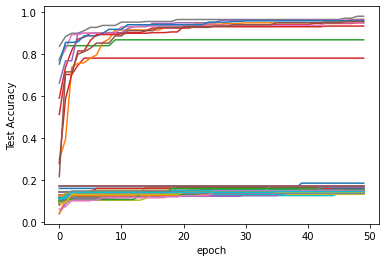

In [ ]:

dfs_random = analysis.fetch_trial_dataframes()

dfs_random = nice_dfs(dfs_random)
# This plots everything on the same plot
ax = None
i=0
for d in dfs_random.values():
    i+=1
    #ax = d.plot("training_iteration", "mean_accuracy", ax=ax, legend=False)
    d = d.cummax()
    plt.plot(np.arange(d.shape[0]), d.mean_accuracy)


plt.xlabel("epoch"); plt.ylabel("Test Accuracy"); 

for i, df in enumerate(dfs_random.values()):
  df.to_csv("logs_encore/random_{}".format(i))

In [ ]:
from hyperopt import hp
from ray.tune.suggest.hyperopt import HyperOptSearch


hyperopt = HyperOptSearch(metric="mean_accuracy", mode="max")
analysis = tune.run(train_mnist,     metric="mean_accuracy",
    mode="max",
    name="exp_tpe",
    stop={
        #"mean_accuracy": 0.98,
        "training_iteration": iters
    },
    resources_per_trial={
        "cpu": 2
    }, config=config,
    num_samples=n, search_alg=hyperopt)

In [ ]:

dfs_tpe = analysis.fetch_trial_dataframes()
dfs_tpe = nice_dfs(dfs_tpe)
# This plots everything on the same plot
ax = None
i=0
for d in dfs_tpe.values():
    i+=1
    ax = d.plot("training_iteration", "mean_accuracy", ax=ax, legend=False)


plt.xlabel("epoch"); plt.ylabel("Test Accuracy"); 

for i, df in enumerate(dfs_tpe.values()):
  df.to_csv("logs_encore/tpe_{}".format(i))
  


In [ ]:
! ls logs_encore

In [ ]:
!zip -r logs_encore.zip /content/logs_encore